In [1]:
%matplotlib inline
from six.moves.urllib.request import urlretrieve
import zipfile
import numpy as np
import pandas as pd
import os
import time
import random
import tensorflow as tf
from matplotlib import pylab
from scipy.sparse import lil_matrix

2022-09-21 19:15:58.649525: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-09-21 19:15:58.649600: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


In [3]:
from os import listdir
from operator import itemgetter
all_files=listdir('/home/slisowski/Portfolio/wig20_sentiment/translated_files_prod/embed/')

#We have to sort files by index number, but this is string so first we need to extract index as integer
file_idx=[]
for file in all_files:
    idx=file.split('_')[2]
    file_idx.append(int(idx))
file_idx

files_idx=zip(all_files, file_idx)
sorted_tuples=sorted(tuple(files_idx),key=itemgetter(1))
sorted_list_files=[]
for tup in sorted_tuples:
    dir_path='/home/slisowski/Portfolio/wig20_sentiment/translated_files_prod/embed/'
    file_path=dir_path+tup[0]
    sorted_list_files.append(file_path)
    

    
news_df_en=pd.concat(map(pd.read_csv, sorted_list_files), ignore_index=True)

In [4]:
news_df_en

,Unnamed: 0,company,news_date,news_text
0,0,ASSECO-POLAND,2022-09-16 08:48:05,Thursday on the Polish stock exchange was anot...
1,1,ASSECO-POLAND,2022-09-09 15:37:42,"During the video conferencing, the president o..."
2,2,ASSECO-POLAND,2022-09-06 17:22:00,"""This year, and the whole future Asseco Poland..."
3,3,ASSECO-POLAND,2022-09-02 12:29:08,Given the fatal performance of both WIG20 and ...
4,4,ASSECO-POLAND,2022-09-01 10:35:52,Improving the results of the IT group was poss...
...,...,...,...,...
12597,295,WIG,2020-03-03 11:42:38,Increase in the value of trading in shares und...
12598,296,WIG,2020-03-02 10:22:36,Delayed Coronavir's effect - this is how a com...
12599,297,WIG,2020-02-28 12:18:54,During the turmoil associated with the Coronav...
12600,298,WIG,2020-02-05 09:14:13,"For years, we have been conducting original st..."


In [5]:
tweets_df=pd.read_csv('/home/slisowski/Portfolio/tweets_news_sentiment/tweets_labelled.csv', sep=";")

In [7]:
tweets_df

,id,created_at,text,sentiment
0,77522,2020-04-15 01:03:46+00:00,"RT @RobertBeadles: Yo💥\nEnter to WIN 1,000 Mon...",positive
1,661634,2020-06-25 06:20:06+00:00,#SriLanka surcharge on fuel removed!\n⛽📉\nThe ...,negative
2,413231,2020-06-04 15:41:45+00:00,Net issuance increases to fund fiscal programs...,positive
3,760262,2020-07-03 19:39:35+00:00,RT @bentboolean: How much of Amazon's traffic ...,positive
4,830153,2020-07-09 14:39:14+00:00,$AMD Ryzen 4000 desktop CPUs looking ‘great’ a...,positive
...,...,...,...,...
4995,411380,2020-06-04 18:14:57+00:00,"With ad revenues falling, what’s the impact on...",NaN
4996,62318,2020-04-14 02:15:01+00:00,RT @KelvinSCWong: Well another point to add to...,NaN
4997,627230,2020-06-23 14:08:15+00:00,$ITOX working on a contract with a fortune 500...,NaN
4998,890123,2020-07-14 23:18:34+00:00,"$DIS it could break the 120 pin, then 125&gt; ...",NaN


In [6]:
news_headlines_df=pd.read_csv('/home/slisowski/Portfolio/tweets_news_sentiment/all-data.csv', encoding="Windows-1252", names=["sentiment","text"])

In [8]:
news_headlines_df

,sentiment,text
0,neutral,"According to Gran , the company has no plans t..."
1,neutral,Technopolis plans to develop in stages an area...
2,negative,The international electronic industry company ...
3,positive,With the new production plant the company woul...
4,positive,According to the company 's updated strategy f...
...,...,...
4841,negative,LONDON MarketWatch -- Share prices ended lower...
4842,neutral,Rinkuskiai 's beer sales fell by 6.5 per cent ...
4843,negative,Operating profit fell to EUR 35.4 mn from EUR ...
4844,negative,Net sales of the Paper segment decreased to EU...


In [10]:
glove_corpus=pd.concat([news_df_en['news_text'], tweets_df['text'], news_headlines_df['text']])

In [15]:
glove_corpus.tolist()

["Thursday on the Polish stock exchange was another day of reflection after Tuesday's strong inheritance. The WIG20 index with an increase in +0.8% turned out to be a runner -up among all significant indexes in the world. Dino Polska (+2.2%) and Asseco Poland (+2%) did the best of the Blue Chips. In turn, the largest decrease in the index was noted by mBank (-1.6%) ...",
 'During the video conferencing, the president of SNT (Synektik), Dariusz Korecki announced that the increased dividend payment size for 2021/2022 should be expected, "we can ...',
 '"This year, and the whole future Asseco Poland is acting on a term contract concluded at the end of 2021, also these costs [energy] will not grow in the annual perspective, while ...',
 'Given the fatal performance of both WIG20 and the wide market in August, quite perversely for the BNP Paribas BM portfolio it was one of the better months this year. Positive ...',
 'Improving the results of the IT group was possible thanks to, among other

In [23]:
import unicodedata
from nltk.stem import WordNetLemmatizer
import re
import preprocessor as p
from bs4 import BeautifulSoup
import demoji
import contractions
from nltk.tokenize import word_tokenize


def clean_news_glove(text):
    
    #remove emoji
    text=demoji.replace(text,' ')
    # use tweeter preprocessor to clean news
    text=p.clean(text)
    #remove html tags
    soup = BeautifulSoup(text, 'html.parser')
    text = soup.get_text()
    text=contractions.fix(text)
    
    
    #remove accented characters
    text = unicodedata.normalize('NFKD', text).encode('ascii', 'ignore').decode('utf-8', 'ignore')
    
   
   
    #remove numbers
    text = re.sub("[^a-zA-Z]", " ", text)
    #tokenize text
    text=text.lower()
    
    list_of_words=word_tokenize(text)
    #words=[]
    
    text = ' '.join(list_of_words)
    
    
    
    return text

In [24]:
glove_words=[]
for news in glove_corpus.tolist():
    
    text=clean_news_glove(news)
    glove_words.append(text)
    

In [26]:
glove_words=list(set(glove_words))

In [29]:
news_stories=glove_words

In [30]:
from tensorflow.keras.preprocessing.text import Tokenizer


tokenizer = Tokenizer(
    
    split=' ', oov_token=''
)

tokenizer.fit_on_texts(news_stories)
print("Data fitted on the tokenizer")

Data fitted on the tokenizer


In [32]:
n_vocab=len(tokenizer.index_word)+1

In [34]:
from scipy.sparse import save_npz, load_npz

def generate_cooc_matrix(text, tokenizer, window_size, n_vocab, use_weighting=True):
    
    # Convert list of text to list of list of word IDs
    sequences = tokenizer.texts_to_sequences(text)
    
    # A sparse matrix to retain co-occurrences of words
    cooc_mat = lil_matrix((n_vocab, n_vocab), dtype=np.float32)
    
    # Go through each sequence one by one
    for si, sequence in enumerate(sequences):
        
        # Printing the progress
        if (si+1)%100==0:
            print('.'*((si+1)//100), f"{si+1}/{len(sequences)}", end='\r')
        
        # For each target word,
        for i, wi in zip(np.arange(window_size, len(sequence)-window_size), sequence[window_size:-window_size]):
            
            # Get the context window word IDs
            context_window = sequence[i-window_size: i+window_size+1]            
            
            # The weight for the words in the context window (except target word) will be 1
            window_weights = np.ones(shape=(window_size*2 + 1,), dtype=np.float32)
            window_weights[window_size] = 0.0

            if use_weighting:
                # If weighting is used, penalize context words based on distance to target word
                distances = np.abs(np.arange(-window_size, window_size+1))
                distances[window_size] = 1.0
                # Update the sparse matrix
                cooc_mat[wi, context_window] += window_weights/distances
            else:
                # Update the sparse matrix
                cooc_mat[wi, context_window] += window_weights
    
    print("\n")
    
    return cooc_mat    

# ----------------------------------------- IMPORTANT ---------------------------------------------- #
#                                                                                                    #
# Set this true or false, depending on whether you want to generate the matrix or reuse the existing #
#                                                                                                    #
# ---------------------------------------------------------------------------------------------------#
generate_cooc = True

# Generate the matrix
if generate_cooc:
    t1 = time.time()
    cooc_mat = generate_cooc_matrix(news_stories, tokenizer, 1, n_vocab, True)
    t2 = time.time()
    print(f"It took {t2-t1} seconds to generate the co-occurrence matrix")
    
    save_npz(os.path.join('data','cooc_mat.npz'), cooc_mat.tocsr())
# Load the matrix from disk
else:
    try:
        cooc_mat = load_npz(os.path.join('data','cooc_mat.npz')).tolil()
        print(f"Cooc matrix of type {type(cooc_mat).__name__} was loaded from disk")
    except FileNotFoundError as ex:
        raise FileNotFoundError(
            "Could not find the co-occurrence matrix on the disk. Did you generate the matrix by setting generate_cooc=True?"
        )

................................................................................................................................................................................. 17700/17749

It took 188.9905354976654 seconds to generate the co-occurrence matrix


([<matplotlib.axis.XTick at 0x7f776ca5fca0>,
 [Text(0, 0, 'dance'),
  Text(1, 0, 'for'),
  Text(2, 0, 'naftowy'),
  Text(3, 0, 'stock'),
  Text(4, 0, 'a'),
  Text(5, 0, 'in'),
  Text(6, 0, 'naft'),
  Text(7, 0, 'currency'),
  Text(8, 0, 'gas'),
  Text(9, 0, 'blue'),
  Text(10, 0, 'mining'),
  Text(11, 0, 'and'),
  Text(12, 0, 'companies'),
  Text(13, 0, 'clothing'),
  Text(14, 0, 'development'),
  Text(15, 0, 'economy'),
  Text(16, 0, 'company'),
  Text(17, 0, 'market'),
  Text(18, 0, 'largest'),
  Text(19, 0, 'naftowe'),
  Text(20, 0, 'oil'),
  Text(21, 0, 'financial'),
  Text(22, 0, 'of'),
  Text(23, 0, 'energy'),
  Text(24, 0, 'the')])

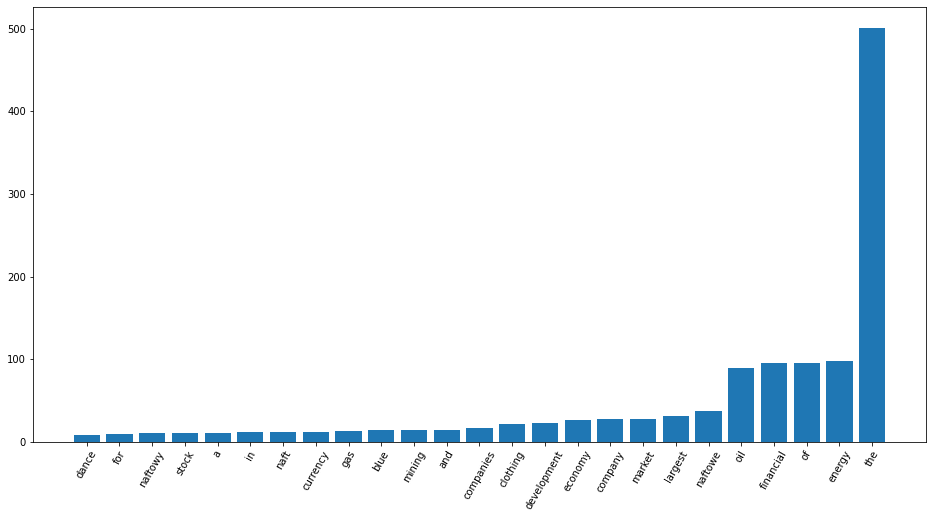

In [44]:
import matplotlib.pyplot as plt

word = 'polish'
assert word in tokenizer.word_index, f"Word {word} is not in the tokenizer"
assert tokenizer.word_index[word] <= n_vocab, f"The word {word} is an out of vocabuary word. Please try something else"

# Get the vector of co-occurrences for a given word 
cooc_vec = np.array(cooc_mat.getrow(tokenizer.word_index[word]).todense()).ravel()
# Get indices of words with maximum value
max_ind = np.argsort(cooc_vec)[-25:]

# Plot the words and values
plt.figure(figsize=(16,8))
plt.bar(np.arange(0, 25), cooc_vec[max_ind])
plt.xticks(ticks=np.arange(0, 25), labels=[tokenizer.index_word[i] for i in max_ind], rotation=60)

In [36]:
batch_size = 4096 # Data points in a single batch

embedding_size = 128 # Dimension of the embedding vector.

window_size=1 # We use a window size of 1 on either side of target word

epochs = 5 # Number of epochs to train for

# We pick a random validation set to sample nearest neighbors
valid_size = 16 # Random set of words to evaluate similarity on.
# We sample valid datapoints randomly from a large window without always being deterministic
valid_window = 250

# When selecting valid examples, we select some of the most frequent words as well as
# some moderately rare words as well
np.random.seed(54321)
random.seed(54321)

valid_term_ids = np.array(random.sample(range(valid_window), valid_size))
valid_term_ids = np.append(
    valid_term_ids, random.sample(range(1000, 1000+valid_window), valid_size),
    axis=0
)

In [37]:
import tensorflow.keras.backend as K
from tensorflow.keras.layers import Input, Embedding, Dot, Add
from tensorflow.keras.models import Model

K.clear_session()

# Define two input layers for context and target words
word_i = Input(shape=())
word_j = Input(shape=())

# Each context and target has their own embeddings (weights and biases)

# Embedding weights
embeddings_i = Embedding(n_vocab, embedding_size, name='target_embedding')(word_i)
embeddings_j = Embedding(n_vocab, embedding_size, name='context_embedding')(word_j)

# Embedding biases
b_i = Embedding(n_vocab, 1, name='target_embedding_bias')(word_i)    
b_j = Embedding(n_vocab, 1, name='context_embedding_bias')(word_j)

# Compute the dot product between embedding vectors (i.e. w_i.w_j)
ij_dot = Dot(axes=-1)([embeddings_i,embeddings_j])

# Add the biases (i.e. w_i.w_j + b_i + b_j )
pred = Add()([ij_dot, b_i, b_j])

# The final model
glove_model = Model(inputs=[word_i, word_j],outputs=pred, name='glove_model')

# Glove has a specific loss function with a sound mathematical underpinning
# It is a form of mean squared error
glove_model.compile(loss="mse", optimizer = 'adam')

glove_model.summary()

Model: "glove_model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None,)]            0           []                               
                                                                                                  
 input_2 (InputLayer)           [(None,)]            0           []                               
                                                                                                  
 target_embedding (Embedding)   (None, 128)          2660352     ['input_1[0][0]']                
                                                                                                  
 context_embedding (Embedding)  (None, 128)          2660352     ['input_2[0][0]']                
                                                                                        

2022-09-21 19:43:03.035603: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory
2022-09-21 19:43:03.035630: W tensorflow/stream_executor/cuda/cuda_driver.cc:269] failed call to cuInit: UNKNOWN ERROR (303)
2022-09-21 19:43:03.035675: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (slawomir): /proc/driver/nvidia/version does not exist
2022-09-21 19:43:03.036242: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [38]:
news_sequences = tokenizer.texts_to_sequences(news_stories)

news_sequences=[x for x in news_sequences if len(x)>=2]

In [39]:
def glove_data_generator(
    sequences, window_size, batch_size, vocab_size, cooccurrence_matrix, x_max=100.0, alpha=0.75, seed=None
):
    """ Generate batches of inputs and targets for GloVe """
    
    # Shuffle the data so that, every epoch, the order of data is different
    rand_sequence_ids = np.arange(len(sequences))                    
    np.random.shuffle(rand_sequence_ids)

    # We will use a sampling table to make sure, we don't oversample stopwords
    sampling_table = tf.keras.preprocessing.sequence.make_sampling_table(vocab_size)
    
    # For each story/article
    for si in rand_sequence_ids:
        print(sequences[si])
        
        # Generate positive skip-grams while using sub-sampling 
        positive_skip_grams, _ = tf.keras.preprocessing.sequence.skipgrams(
            sequences[si], 
            vocabulary_size=vocab_size, 
            window_size=window_size, 
            negative_samples=0.0, 
            shuffle=False,   
            sampling_table=sampling_table,
            seed=seed
        )
        if len(positive_skip_grams)<2:
            continue
        
        # Take targets and context words separately
        targets, context = zip(*positive_skip_grams)
        
        targets, context = np.array(targets).ravel(), np.array(context).ravel()
        
        
        x_ij = np.array(cooccurrence_matrix[targets, context].toarray()).ravel()
        
        # Compute log - Introducing an additive shift to make sure we don't compute log(0)
        log_x_ij = np.log(x_ij + 1)
        
        # Sample weights 
        # if x < x_max => (x/x_max)**alpha / else => 1        
        sample_weights = np.where(x_ij < x_max, (x_ij/x_max)**alpha, 1)
        
        # If seed is not provided generate a random one
        if not seed:
            seed = random.randint(0, 10e6)
        
        # Shuffle data
        np.random.seed(seed)
        np.random.shuffle(context)
        np.random.seed(seed)
        np.random.shuffle(targets)
        np.random.seed(seed)
        np.random.shuffle(log_x_ij)
        np.random.seed(seed)
        np.random.shuffle(sample_weights)
        
        # Generate a batch or data in the format 
        # ((target words, context words), log(X_ij) <- true targets, f(X_ij) <- sample weights)
        for eg_id_start in range(0, context.shape[0], batch_size):            
            yield (
                targets[eg_id_start: min(eg_id_start+batch_size, targets.shape[0])], 
                context[eg_id_start: min(eg_id_start+batch_size, context.shape[0])]
            ), log_x_ij[eg_id_start: min(eg_id_start+batch_size, x_ij.shape[0])], \
            sample_weights[eg_id_start: min(eg_id_start+batch_size, sample_weights.shape[0])]


# Generate some data
news_glove_data_gen = glove_data_generator(
    news_sequences, 2, 10, n_vocab, cooc_mat
)

for x, y, z in news_glove_data_gen:
    print(x)
    print(y)
    print(z)
    break

[739, 770, 158, 13, 20, 3, 135, 39, 31, 499, 5, 2, 93, 3, 2, 316, 181, 4, 131, 173, 13, 20, 31, 7, 21, 104, 2, 15, 16]
[820, 2912, 310, 1377, 386, 173, 56, 182, 4094, 2, 4034, 532, 1248, 5, 2, 1377, 535, 4, 1424, 2, 1160, 92, 5306, 4, 22, 650, 820, 6062, 764, 12, 15322, 12, 56, 81, 5, 2, 60, 15, 2, 3219, 3, 2, 510, 64, 1593, 92, 2120, 3602]
(array([   12,  4094,  2120,  3219,  1593,  1377,  1377, 15322,  1160,
        2912]), array([ 12, 182,  92,  15, 510,   2, 310,  12,  92, 310]))
[0.6931472 1.609438  0.6931472 0.        0.        3.0910425 0.6931472
 0.6931472 1.0986123 0.6931472]
[0.03162277 0.08944272 0.03162277 0.         0.         0.3102162
 0.03162277 0.03162277 0.05318296 0.03162277]


In [40]:
class ValidationCallback(tf.keras.callbacks.Callback):
    
    def __init__(self, valid_term_ids, model_with_embeddings, tokenizer):
        
        self.valid_term_ids = valid_term_ids
        self.model_with_embeddings = model_with_embeddings
        self.tokenizer = tokenizer
        
        super().__init__()
        
    def on_epoch_end(self, epoch, logs=None):
        """ Validation logic """
                
        # We will use context embeddings to get the most similar words
        # Other strategies include: using target embeddings, mean embeddings after avaraging context/target
        embedding_weights = self.model_with_embeddings.get_layer("context_embedding").get_weights()[0]
        normalized_embeddings = embedding_weights / np.sqrt(np.sum(embedding_weights**2, axis=1, keepdims=True))
        
        # Get the embeddings corresponding to valid_term_ids
        valid_embeddings = normalized_embeddings[self.valid_term_ids, :]
        
        # Compute the similarity between valid_term_ids and all the embeddings
        # V x d (d x D) => V x D
        top_k = 5 # Top k items will be displayed
        similarity = np.dot(valid_embeddings, normalized_embeddings.T)
        
        # Invert similarity matrix to negative
        # Ignore the first one because that would be the same word as the probe word
        similarity_top_k = np.argsort(-similarity, axis=1)[:, 1: top_k+1]
                
        # Print the output
        for i, term_id in enumerate(valid_term_ids):
            
            similar_word_str = ', '.join([self.tokenizer.index_word[j] for j in similarity_top_k[i, :] if j > 1])
            print(f"{self.tokenizer.index_word[term_id]}: {similar_word_str}")
        
        print('\n')

In [41]:
glove_validation_callback = ValidationCallback(valid_term_ids, glove_model, tokenizer)

# Train the model for several epochs
for ei in range(epochs):
    
    print(f"Epoch: {ei+1}/{epochs} started")
    
    news_glove_data_gen = glove_data_generator(
        news_sequences, window_size, batch_size, n_vocab, cooc_mat
    )
    
    glove_model.fit(
        news_glove_data_gen, epochs=1, 
        callbacks=glove_validation_callback,        
    )

Epoch: 1/5 started
[1813, 11, 530, 5, 812, 9, 1092, 4, 1005, 501, 6, 9, 974, 38, 37, 1489]
[1975, 1025, 801, 3, 117, 1109, 800, 1975, 4445, 26]
      1/Unknown - 1s 700ms/step - loss: 6.3273[16912, 16913, 77, 1438, 6756, 17, 278, 4054, 1428, 922]
      2/Unknown - 1s 61ms/step - loss: 4.9348 [2, 1305, 1152, 3, 323, 1123, 96, 17, 42, 323, 4, 2, 108, 12, 205, 5, 259, 4, 1020, 3, 2, 55, 3, 167, 3, 202, 7, 21, 104, 2, 15, 80]
      3/Unknown - 1s 62ms/step - loss: 2.2339[2, 88, 66, 3, 281, 265, 283, 18, 7, 140, 4, 724, 5, 2, 365, 725, 226, 993, 454, 5, 2, 1878, 3, 722, 9, 140, 515, 6, 2213, 4, 2527, 226, 993]
      4/Unknown - 1s 62ms/step - loss: 5.9892[79, 34, 35, 1974]
[62, 2, 99, 9, 320, 2, 1873, 3, 1398, 3, 53, 6, 53, 95, 165, 11, 23, 4003, 14, 7, 1156, 3, 51, 3, 12296]
      5/Unknown - 1s 63ms/step - loss: 6.8763[542, 3942, 221, 50, 7, 9369, 111, 13329, 24, 451, 9370, 610, 264]
      6/Unknown - 1s 67ms/step - loss: 5.8190[81, 5, 2, 636, 204, 4, 2, 1305, 1123, 4327, 768, 1123, 891, 

     46/Unknown - 4s 64ms/step - loss: 2.7744[139, 234, 5, 360, 3108, 430, 14, 7, 107, 1004, 112, 3, 59, 5, 13, 41, 2, 15, 16, 4, 7, 273, 2, 360, 10, 454, 5, 2, 496, 104, 402, 3, 2, 7, 401, 3]
     47/Unknown - 4s 64ms/step - loss: 2.7928[45, 130, 223, 35, 2041, 462, 4, 2, 1268, 490, 76, 2, 425, 223, 35, 50, 5, 2721, 4, 16, 240, 43, 3127, 4359, 19, 22, 1014, 52, 34, 35, 687, 9]
     48/Unknown - 4s 64ms/step - loss: 2.8361[290, 99, 8085, 721, 676, 3234, 4, 345, 1179, 2, 53, 129, 604, 1093, 5, 407, 7, 329, 55, 572, 25, 10, 35, 226, 7990, 548, 2, 260, 3, 721, 47, 1044, 2817, 6, 2, 55, 4, 2, 129, 29, 2607, 17, 7, 278, 55, 4, 183, 72, 153]
     49/Unknown - 4s 64ms/step - loss: 2.7998[89, 3146, 9, 777]
     50/Unknown - 4s 64ms/step - loss: 2.8776[382, 475, 93, 243, 5, 161, 51, 59, 5, 13, 20, 81, 5, 2, 1225, 3, 2, 296, 2, 15, 18, 88, 66, 10, 3802, 5, 402, 2, 15, 18, 325, 51, 4, 393, 5, 4347, 397, 4]
     51/Unknown - 4s 64ms/step - loss: 2.8629[2, 15, 18, 39, 31, 628, 9, 2, 21, 5, 20, 765,

     92/Unknown - 6s 63ms/step - loss: 2.5857[42, 693, 2639, 4, 170, 11, 69, 78, 1238, 12]
     93/Unknown - 6s 63ms/step - loss: 2.5667[136, 3, 2, 330, 2326, 821, 59, 14, 394, 454, 5, 4630, 76, 35, 487, 36, 3079, 12, 1125, 17, 970, 5282, 223, 35, 2402, 410, 7934]
     94/Unknown - 7s 63ms/step - loss: 2.5618[45, 130, 10, 2224, 14, 346, 14, 1480, 2081, 6, 1559, 151, 432, 2, 1957, 3, 280, 117, 4, 2, 610, 2, 15, 73, 880, 57, 948, 12, 3051, 6, 10861, 90, 80]
     95/Unknown - 7s 63ms/step - loss: 2.5423[12, 259, 2, 6071, 3, 2, 43, 3, 183, 11, 864, 5425, 6072, 7, 1544, 14, 1390, 506, 207, 372, 4, 755, 6, 8483]
[2, 171, 26, 248, 4, 2, 209, 40, 3, 2, 75, 21, 46, 160, 4, 387, 320, 13, 20, 3, 2, 39, 3, 2, 316, 181, 142, 5, 13, 20, 4, 2, 567, 108, 294]
     97/Unknown - 7s 63ms/step - loss: 2.5869[19, 591, 12, 2, 9838, 14486, 46, 3060, 168, 2, 157, 2933, 34, 1657, 2415, 4633, 451, 6325, 2, 3511, 10, 1003, 187, 7, 4479, 2198, 2456, 1640, 2415, 85, 10, 968, 3022, 25, 838, 38, 14487, 3810, 8, 89, 

    142/Unknown - 9s 62ms/step - loss: 2.5390[12461, 172, 801, 1737, 1783, 6, 7316, 14, 515, 3, 546, 4290, 7215, 12462, 6, 12463, 6313, 6, 7317, 127, 1783]
    143/Unknown - 9s 62ms/step - loss: 2.5346[602, 306, 2208, 45, 48, 374, 4, 433, 5, 250, 9, 6919, 12, 250, 4, 320, 45, 48, 80, 9, 2, 846]
    144/Unknown - 10s 62ms/step - loss: 2.5016[2, 888, 865, 3, 769, 7225, 226, 480, 57, 412, 6, 930, 226, 480, 3, 25, 71, 113, 10, 35, 548, 38, 2, 452, 109]
    145/Unknown - 10s 62ms/step - loss: 2.5032[1059, 1059, 321, 4, 2, 650, 3, 169, 47, 93, 6174, 7, 164, 109, 78, 2, 66, 1042, 52, 248, 403, 1381, 71, 113]
    146/Unknown - 10s 62ms/step - loss: 2.5005[53, 62, 7, 423, 17, 476, 2, 1149, 322, 433, 53, 476, 2, 1149, 8, 577, 505, 62, 220, 18, 99, 374, 614, 448, 2, 571, 149, 5, 13, 41]
    147/Unknown - 10s 62ms/step - loss: 2.4878[168, 79, 262, 542, 109, 991, 6, 3797, 264, 46, 607, 19, 412, 412, 10, 7, 540, 402, 583, 162, 19]
    148/Unknown - 10s 62ms/step - loss: 2.4957[2, 268, 11, 398, 9, 24

    190/Unknown - 12s 62ms/step - loss: 2.5049[206, 35, 395, 11611, 14, 2, 2205, 2, 10, 2074, 2, 7022, 795, 4210, 707, 6, 2, 261, 120, 2, 1949, 10, 1393, 6096, 821, 33, 2755, 9, 7, 869, 127, 127, 3279, 11612, 22, 10, 33, 439, 82, 58, 1046, 890]
    191/Unknown - 13s 62ms/step - loss: 2.4722[5271, 1431, 769, 8, 2, 492, 111, 1076, 254, 1145]
[369, 13489, 488, 12, 665, 1074, 5, 13490, 4, 650, 3, 7, 2205, 514, 1824, 7581, 249, 198, 793, 198, 369, 58, 369, 369, 369]
    192/Unknown - 13s 62ms/step - loss: 2.4619[31, 62, 1746, 1313, 32, 91]
[19, 2, 355, 3, 253, 22, 21, 2, 115, 3, 3885, 6731, 5911, 14, 16316, 2149, 19, 2, 45, 130, 268, 4, 3319, 11, 312, 4, 2, 44, 1014, 115, 1323]
    193/Unknown - 13s 62ms/step - loss: 2.4481[502, 528, 221, 5, 817, 155, 113, 861, 986, 309, 1658, 331, 85, 2846, 3492, 15, 6702, 331, 1876, 331, 16868, 694, 6227, 6855]
    194/Unknown - 13s 62ms/step - loss: 2.4368[2, 117, 2339, 19, 33, 89, 111, 187, 3, 7, 5032, 9, 253]
    195/Unknown - 13s 62ms/step - loss: 2.4

    236/Unknown - 15s 63ms/step - loss: 2.3572[177, 56, 93, 243, 5, 9973, 2, 88, 66, 8, 402, 5, 7631, 59, 5, 13, 20, 8, 7, 955, 3, 13, 20, 2, 15, 16, 81, 5, 1225]
    237/Unknown - 15s 63ms/step - loss: 2.3532[4, 1794, 18, 39, 54, 1072, 32, 41]
[632, 8, 2, 452, 3100, 221, 5, 691, 4, 840, 94, 22, 1442, 15008, 751, 3, 3, 2, 502, 2690, 47, 4, 2, 303]
    238/Unknown - 16s 63ms/step - loss: 2.3654[2245, 30, 763, 8117, 33, 421, 678, 3, 57, 449, 9, 26, 120, 4]
    239/Unknown - 16s 63ms/step - loss: 2.3594[15762, 814, 783, 5, 395, 7, 15763, 438, 14, 7, 247, 37, 1256, 7981, 335, 15764, 6230, 2, 1705, 1589, 10, 85, 98, 3794, 1770, 470, 2673, 1450, 1995, 198, 946, 3531, 887, 1275, 1332, 1648, 1262, 494, 613, 455, 3043, 4898, 1016, 946, 527, 194, 121, 1631, 3356, 3533, 1199, 352, 194, 33]
    240/Unknown - 16s 63ms/step - loss: 2.3557[4, 2, 534, 230, 52, 1198, 12931, 875, 4, 2204, 52, 1259, 4, 2, 102, 204, 3, 580, 145, 19, 123, 206, 35, 395, 914, 1437, 17, 42, 21, 18, 1659, 6, 335]
    241/Unkno

    286/Unknown - 19s 63ms/step - loss: 2.4246[10995, 542, 326, 94, 6333, 2474, 1981, 1876, 3109, 2220, 3558, 82, 194, 3608, 58]
    287/Unknown - 19s 63ms/step - loss: 2.4140[17895, 1624, 2762, 7, 4235, 2650, 15, 200, 20, 51, 4, 2, 17896, 71, 185, 318, 79, 19, 641]
    288/Unknown - 19s 63ms/step - loss: 2.4080[281, 265, 283, 140, 414, 24, 25, 11, 359, 2, 109, 12, 31, 8, 16, 43, 424, 1858, 52, 453, 5, 359, 7, 109, 8, 52, 584, 5, 529, 5]
    289/Unknown - 19s 63ms/step - loss: 2.4012[15984, 15985, 1812, 312, 2, 42, 1158, 9, 1708, 19, 61, 119, 7613, 4, 2, 44, 157, 3134, 106, 11, 2153, 14, 2, 2885, 3, 2, 9652, 26, 9, 412, 15986]
    290/Unknown - 19s 63ms/step - loss: 2.4236[2, 64, 518, 4, 317, 2, 8536, 521, 1951, 30, 1042, 45, 130, 5, 161, 435, 2, 518, 1156, 36, 86, 23, 2071, 8, 202, 27, 7, 118, 3]
    291/Unknown - 19s 63ms/step - loss: 2.4137[2, 279, 978, 595, 4548, 6, 2310, 4, 1459, 855, 4, 2, 3429]
    292/Unknown - 19s 63ms/step - loss: 2.4087[58, 34, 59, 5013, 2, 493, 8, 280, 278,

    332/Unknown - 21s 62ms/step - loss: 2.3827[1344, 128, 275, 35, 616, 2, 37, 480, 632, 19, 7, 1455, 2332, 620, 14, 1108, 775, 2, 566, 2046]
    333/Unknown - 21s 62ms/step - loss: 2.3727[226, 1197, 8733, 347, 963, 5708, 3, 310, 325, 930, 689, 13006, 6, 1508, 4255, 4667]
    334/Unknown - 21s 62ms/step - loss: 2.3698[2713, 1387, 38, 1024, 4, 7733, 3, 2, 423, 4, 3341, 225, 4, 2, 159]
    335/Unknown - 22s 62ms/step - loss: 2.3634[45, 130, 587, 33, 102, 4, 3030, 2784, 4, 2, 225, 3, 2, 44, 187, 213, 5080, 1065, 4, 95, 6568, 2, 15, 16, 2, 1443, 6, 213, 268, 4799, 77]
    336/Unknown - 22s 62ms/step - loss: 2.3606[2, 312, 3, 2, 595, 785, 3880, 503, 10, 454, 5, 207, 372, 14, 77, 2083, 1798, 2, 394, 34, 5, 907, 2, 1323, 3, 88, 1847]
[61, 28, 552, 61, 396, 30, 725, 464, 27, 138, 3, 2830, 7, 11318, 277, 8, 2, 477, 3, 1550, 6, 1454, 991, 9, 2, 658, 80, 2, 60, 1581]
    338/Unknown - 22s 62ms/step - loss: 2.3666[281, 265, 283, 140, 313, 5, 239, 748, 2, 181, 526, 392, 3, 388, 115, 6, 55, 2, 1323,

    379/Unknown - 24s 62ms/step - loss: 2.3414[1041, 9345, 2660, 3759, 46, 50, 4803, 10, 58, 58, 82]
    380/Unknown - 24s 62ms/step - loss: 2.3392[2, 10667, 1559, 65, 2, 6071, 3, 2, 43, 3, 2, 417, 15, 1146, 1646, 4207, 3686, 30, 4, 2, 7896, 207, 372, 88, 1489, 4, 45, 48, 6, 497, 246]
    381/Unknown - 24s 62ms/step - loss: 2.3361[1631, 3978, 5158, 3919, 4712, 10546, 2221, 542, 17342, 4, 626, 122, 10, 4, 768, 8, 1107, 1110, 234, 262, 10654, 1484]
    382/Unknown - 24s 62ms/step - loss: 2.3291[7664, 5613, 8053, 8357, 2482, 623, 8058, 16433, 5, 7, 879, 9, 10460, 2, 563, 334, 10, 214, 90, 16, 57]
[507, 3758, 3, 16468, 156, 12, 1534, 331, 5, 16469, 698, 331]
    384/Unknown - 25s 62ms/step - loss: 2.3135[2898, 984, 8, 1615, 1666, 6, 187, 39, 522, 464, 2046]
    385/Unknown - 25s 62ms/step - loss: 2.3076[2392, 3, 40, 3, 55, 4, 3696, 224, 62, 544, 151, 432, 1300, 366, 17, 21, 21, 5529, 1556, 2, 1584, 306, 1214, 12, 193]
    386/Unknown - 25s 62ms/step - loss: 2.3047[1380, 10, 1006, 601, 6, 7

    426/Unknown - 27s 62ms/step - loss: 2.2971[2, 74, 100, 26, 557, 75, 6, 595, 84, 8, 2, 44, 40, 3, 2, 84, 3, 1269, 77, 1389, 1230, 645, 6, 2868, 92, 164, 4]
    427/Unknown - 27s 62ms/step - loss: 2.3100[2, 43, 3, 2, 203, 3, 688, 6, 603, 804, 714, 1236, 2, 630, 327, 15, 139, 6106, 885, 5, 2786, 4, 2, 889, 3, 1734, 7, 4996, 1156]
    428/Unknown - 27s 62ms/step - loss: 2.3107[2, 72, 3, 2, 72, 100, 3, 324, 272, 2900, 93, 1096, 301]
    429/Unknown - 27s 62ms/step - loss: 2.3328[4109, 11644, 7, 1129, 65, 11645, 82, 58, 271]
    430/Unknown - 27s 62ms/step - loss: 2.3469[46, 297, 584, 5, 318, 85, 750, 103, 13181]
    431/Unknown - 27s 62ms/step - loss: 2.3442[2, 3144, 3, 3590, 8, 95, 4, 86, 10, 492, 16, 4, 367, 326, 626, 2546, 599, 7365]
    432/Unknown - 27s 62ms/step - loss: 2.3426[2773, 136, 1205, 16597, 10328, 2953, 613, 67, 1394, 67, 1364, 67, 946, 67, 2539, 67, 198, 67, 1553, 67, 470, 67, 1487, 67, 1301, 67]
[263, 29, 7, 127, 3, 185, 9, 63, 132, 3460, 454, 5, 2388, 289, 2777, 169, 

    476/Unknown - 30s 62ms/step - loss: 2.2841[10, 35, 369, 7, 232, 9, 10766, 1431, 5913, 262, 2, 10767, 4, 1127, 5, 943, 178, 3403, 2046]
    477/Unknown - 30s 62ms/step - loss: 2.2803[341, 18, 575, 431, 362, 1692, 9, 2, 443, 37, 22, 111, 4, 2, 26, 3, 2, 190, 1580, 4, 53, 90, 1413, 2, 231, 210, 27, 215, 27, 183, 6, 579, 51]
    478/Unknown - 30s 62ms/step - loss: 2.2755[2, 39, 54, 3, 2, 213, 1142, 122, 92, 32, 20, 4]
[1485, 30, 684, 102, 1141, 1485, 3165, 1485, 309, 1485, 1103, 2789, 6, 1485, 492, 1031, 6, 1194, 3, 397, 30, 7, 2944, 524]
    479/Unknown - 30s 62ms/step - loss: 2.2816[8516, 11567, 8516, 12, 363, 418, 3, 654, 2, 15, 30, 1436, 558, 226, 562, 2723, 3, 1417, 458, 64, 4, 7, 257, 24, 10, 27, 480, 27, 857, 1727, 361, 4, 2, 1703, 6, 1289, 4, 230, 56, 16, 9, 290]
    480/Unknown - 30s 62ms/step - loss: 2.2789[271, 5993, 271, 2513, 401, 670, 1651, 2327, 656, 19, 2, 1857, 971, 2956, 2356]
    481/Unknown - 30s 62ms/step - loss: 2.2803[183, 3048, 1283, 3954, 54, 1216, 4, 2, 125, 4

    524/Unknown - 33s 62ms/step - loss: 2.2659[335, 480, 10, 48, 3906, 7, 1541, 3, 231, 4097, 4635, 1444, 157, 10265, 5, 2, 520, 3, 417, 1112, 4, 22, 1131, 11, 106, 1115, 7, 10266]
    525/Unknown - 33s 62ms/step - loss: 2.2622[27, 790, 21, 2, 109, 234, 5, 359, 18707, 18708, 6, 27, 790, 21, 25, 10, 5, 23, 585, 4, 2631, 81, 5, 2, 1357, 1225, 19, 5823, 8, 7, 107, 3, 13, 11, 23, 1444, 5, 2, 93]
    526/Unknown - 33s 62ms/step - loss: 2.2595[4, 237, 52, 11, 50, 7, 1545, 3, 231, 153, 16, 2, 2871, 3, 7, 1155, 2225, 4, 2284, 2386, 2, 195, 622, 3, 45, 48, 1285, 6920, 141, 125, 7057, 43, 3, 2, 1566, 456, 63, 146, 4, 11710, 679, 174, 4174, 11711, 4, 818, 24, 4, 436, 14, 308, 18, 2464, 3, 350, 90, 223, 35, 3476, 24, 2, 1743, 4979, 147, 897, 395, 1003, 11712]
    527/Unknown - 33s 62ms/step - loss: 2.2616[8339, 116, 1119, 801, 19, 591, 51, 6, 2, 112, 3, 2, 51, 921, 5340, 5, 19, 591, 32]
    528/Unknown - 33s 62ms/step - loss: 2.2709[597, 10793, 63, 10, 2, 136, 20235, 1122, 3439, 151, 76, 1185, 6, 

    569/Unknown - 36s 62ms/step - loss: 2.3129[52, 34, 252, 632, 8, 3173, 2226, 351, 70, 1762, 141, 6381, 1503, 442, 8, 416, 161, 322, 141, 1024]
    570/Unknown - 36s 62ms/step - loss: 2.3082[52, 2123, 5, 2, 439, 24, 2, 1465, 14, 2, 2571, 3, 5762, 52, 50, 2950, 4, 60, 323, 4, 665, 577, 92, 35, 226, 480, 12, 2, 5022, 3, 22, 693, 4, 1261, 5, 38, 2369, 266, 1565, 76, 12, 96, 419, 6, 930, 478, 2312, 3, 3535, 17, 1309, 378, 596, 1633, 33, 1106, 3, 2, 1566, 456, 210, 19, 2, 706, 3, 1181, 344, 3, 28, 83, 18, 7]
    571/Unknown - 36s 62ms/step - loss: 2.3050[2, 56, 154, 14, 820, 223, 35, 767, 8, 2, 854, 3, 627, 482, 3, 728, 4, 36, 1795, 34, 347, 16, 56, 43, 596, 1866, 4253, 9, 2, 1145, 12, 2, 4034, 24, 106, 11, 584, 5, 1115, 991, 8, 64, 4, 2831]
    572/Unknown - 36s 62ms/step - loss: 2.3048[39, 54, 8, 2, 108, 34, 269, 5, 878, 215, 301, 24, 3, 71, 21, 6, 2, 118, 62, 703, 1820, 1240, 10, 269, 5, 23, 4, 2, 841]
[3214, 4215, 101, 7551, 6, 1442, 1895, 811, 1634, 276, 3712, 549, 7552, 16, 103, 24,

    614/Unknown - 39s 62ms/step - loss: 2.2638[341, 53, 62, 299, 721, 416, 653, 96, 17, 2, 528, 3, 13, 41, 2, 528, 9, 2, 711, 37, 149, 5, 608, 13, 41, 505, 448, 6, 614, 3986, 17, 4, 1984, 533, 94, 3, 165, 992]
    615/Unknown - 39s 62ms/step - loss: 2.2672[2, 625, 66, 3, 472, 83, 1960, 4458, 4459, 12, 2, 1284, 3, 2, 43, 6, 12, 2, 28, 18, 88, 66, 9, 178, 2, 28, 16, 2, 583, 162, 652, 223, 35, 5373, 365, 57, 2, 3556]
    616/Unknown - 39s 62ms/step - loss: 2.2661[5915, 5915, 58, 58, 58, 46, 70, 376, 1667, 1003, 1765, 22, 1765, 24, 6486, 10, 4612, 92, 783, 5, 395, 18, 5, 635, 2836, 69, 78, 3, 114, 2071, 361, 297, 607, 214, 106, 70, 206, 168, 106, 1535, 3031, 5, 936, 5649, 1431, 822, 97]
    617/Unknown - 39s 62ms/step - loss: 2.2930[2, 129, 3, 60, 446, 47, 29, 2, 1677, 9, 220, 1616, 4, 317, 2, 44, 257, 3, 2, 21, 371, 8, 233, 4, 53, 118, 189, 2, 409]
    618/Unknown - 39s 62ms/step - loss: 2.2867[2, 93, 3, 2, 630, 327, 15, 139, 243, 5, 853, 13, 20, 12, 31, 8, 8, 109, 36, 371, 7, 228, 3, 13,

    661/Unknown - 42s 62ms/step - loss: 2.2307[664, 93, 677, 243, 5, 853, 13, 20, 8, 2, 109, 36, 371, 7, 228, 3, 13, 110, 72, 2, 15, 16, 1477, 296]
[10459, 16427, 63, 14, 1157, 983, 37, 742, 9, 2, 1829, 1571, 817, 272, 318]
    662/Unknown - 42s 62ms/step - loss: 2.2339[157, 188, 201, 2101, 5455, 147, 2719, 2, 2758, 105, 427, 7, 164, 1829, 19, 6, 78, 435, 59, 58]
    663/Unknown - 42s 62ms/step - loss: 2.2329[3233, 1069, 3, 98, 63, 22, 1814, 1887, 886, 769, 10131, 155, 21, 6, 359, 8, 315, 16745]
    664/Unknown - 42s 62ms/step - loss: 2.2309[22, 10, 7, 478, 6034, 8, 2974, 3104, 159, 5, 1454, 4936, 11463, 18, 8, 141, 1737, 3105, 693, 8451, 8, 6, 2846, 6049, 8452, 8453, 1095, 309, 2600, 19, 2974]
    665/Unknown - 42s 62ms/step - loss: 2.2283[652, 196, 3, 178, 9, 2, 1655, 3, 2, 401, 102, 2117, 6, 586, 17, 139, 102, 328, 476, 4734, 9, 2, 195, 37, 3, 2, 199]
    666/Unknown - 42s 62ms/step - loss: 2.2227[53, 96, 17, 49, 9, 305, 6, 25, 29, 272, 167, 572, 2, 910, 4, 2, 420, 132, 29, 1781, 56

    707/Unknown - 45s 62ms/step - loss: 2.2026[726, 145, 586, 3300, 430, 522, 20, 2015, 2434, 5, 13, 20, 189, 2, 2960, 279, 2, 28, 16, 2, 28, 586, 189, 2, 2960, 279]
    708/Unknown - 45s 62ms/step - loss: 2.1987[726, 145, 1805, 20006, 6, 1397, 20007, 532, 5, 2, 203, 3, 688, 6, 603, 804, 714, 33, 386, 8, 2, 1842, 3, 7, 779, 5050, 2, 328]
    709/Unknown - 45s 62ms/step - loss: 2.1988[3375, 1680, 14413, 9815, 803, 14414, 6, 11, 23, 274, 4, 170]
    710/Unknown - 45s 62ms/step - loss: 2.1974[3222, 258, 24, 25, 11, 9334, 4268, 4, 3668, 1034, 1109, 873, 6, 795, 634, 8, 38, 42, 181, 4, 7312, 17, 2, 87, 3]
    711/Unknown - 45s 62ms/step - loss: 2.1947[163, 11, 50, 250, 41, 4, 7, 1060, 438, 12, 422, 5, 422, 2, 15, 16, 4, 7, 273]
    712/Unknown - 45s 62ms/step - loss: 2.1922[2, 99, 9, 2, 44, 127, 3, 178, 340, 4, 2, 1373, 4, 2, 195, 165, 2, 571, 24, 30, 1451, 5, 379, 488, 967, 79, 647, 57, 2, 778, 111, 3, 1289, 233, 785, 4, 63, 132]
    713/Unknown - 45s 62ms/step - loss: 2.1920[79, 957, 8571

    756/Unknown - 48s 62ms/step - loss: 2.1655[435, 12, 2, 1438, 2032, 1478, 112, 3306, 19459, 5062, 529]
    757/Unknown - 48s 62ms/step - loss: 2.1743[105, 3, 2, 47, 24, 9, 290, 158, 7, 446, 1312, 4, 2, 570, 635, 627, 42, 365, 29, 183, 2, 575, 50, 1849, 17, 49, 59, 5, 13, 3412, 2, 2307, 1347]
    758/Unknown - 48s 62ms/step - loss: 2.1726[1122, 3, 15, 4, 36, 1025, 50, 143, 979, 3363, 276]
    759/Unknown - 48s 62ms/step - loss: 2.1725[2, 2955, 16, 38, 288, 2649, 912, 10, 5, 404, 136, 3, 38, 3771, 5, 6999, 1152, 2572, 18710, 18711, 6, 361, 38, 1468, 10477, 6, 10349, 1833, 5, 1888, 229, 122, 211, 468, 1641]
    760/Unknown - 48s 62ms/step - loss: 2.1740[2, 496, 1086, 421, 5, 392, 337, 20, 147, 23, 2, 190, 4831, 268, 4, 2, 370, 6, 361, 3976, 150, 5694, 17, 2, 9207, 9, 2398, 3976, 150, 7474]
    761/Unknown - 48s 62ms/step - loss: 2.1683[295, 1788, 682, 1033, 14, 7, 107, 704, 3, 57, 972, 11, 9780, 2, 282, 3, 830, 77, 1126, 3, 2, 45, 26, 130, 2, 473, 30, 137, 7, 402, 154, 152, 4, 5166, 12

    802/Unknown - 51s 62ms/step - loss: 2.1856[602, 306, 2208, 45, 48, 96, 4, 390, 5, 250, 12, 250, 4, 205, 45, 48, 80, 9, 2, 846]
    803/Unknown - 51s 62ms/step - loss: 2.1851[169, 3, 2, 136, 665, 309, 948, 801, 816, 309, 5, 11833, 3828, 33, 3147, 3148, 11834, 268, 5, 7109, 831, 6, 3147, 3148, 11835, 1142, 5, 7110, 831]
    804/Unknown - 51s 62ms/step - loss: 2.1894[2, 752, 127, 3, 2, 510, 2464, 573, 20208, 29, 252, 35, 4787, 2, 9087, 252, 20209, 5, 2, 195, 2620, 4, 757, 5, 2, 100, 73, 9, 20210, 116, 20211, 148, 34, 73, 2, 44, 746, 3, 3579, 4, 20212, 132, 1083, 95, 34, 252, 4425, 17, 2082, 187, 1911, 341, 53, 506, 384, 19, 2, 2445, 2, 505, 29, 10605, 6, 614, 834, 59, 17]
    805/Unknown - 51s 62ms/step - loss: 2.1852[18, 1358, 405, 314, 1193, 1278, 2, 188, 201, 680, 3, 726, 145, 19, 2404, 6, 2, 3235, 18, 232, 201, 680, 19, 7, 2, 28, 16, 2, 680, 898, 1096, 545]
    806/Unknown - 51s 62ms/step - loss: 2.1811[2, 16861, 880, 92, 44, 197, 4, 387]
    807/Unknown - 51s 62ms/step - loss: 2.

    846/Unknown - 53s 62ms/step - loss: 2.1663[560, 579, 197, 24, 2, 15, 18, 244, 29, 8206, 3, 7, 11057, 1997, 81, 5, 2, 365, 725, 5925, 11058, 506, 1087, 5, 2, 15, 18, 244, 6, 8207, 169]
    847/Unknown - 53s 62ms/step - loss: 2.1686[103, 52, 34, 3534, 358, 4, 42, 6, 1326, 4169, 15381, 1456, 270, 309, 14, 15382, 172, 5, 1674, 358, 5, 1206, 465, 5, 214, 3228, 5, 397]
    848/Unknown - 53s 62ms/step - loss: 2.1654[440, 68, 356, 5, 648, 2644, 419, 8, 172, 62, 7, 157, 257, 2238, 17, 2, 87, 3, 2, 3116, 799, 3, 2, 26, 10, 7, 329, 105, 931, 186, 3, 3696, 80, 134, 471, 43, 3, 440, 68, 5453, 5454]
    849/Unknown - 54s 62ms/step - loss: 2.1655[319, 284, 217, 6, 219, 177, 56, 258, 24, 2, 1640, 454, 5, 2, 1524, 3, 13300, 4, 458, 64, 36, 34, 5, 23, 1167, 17, 2, 4364, 5, 2, 2174]
    850/Unknown - 54s 62ms/step - loss: 2.1633[19, 2, 355, 3, 2, 113, 1139, 676, 9, 314, 132, 34, 1251, 36, 1096, 14, 7, 278, 606, 9, 2, 443, 63, 37, 6, 2, 1433, 3, 201, 463, 5, 2, 195, 165, 4, 2, 129, 282, 19, 341, 18, 9

    890/Unknown - 56s 62ms/step - loss: 2.1417[713, 1526, 29, 142, 5, 4, 131]
[260, 3, 183, 901, 550, 6, 2, 183, 386, 374, 4, 387, 5, 3, 4, 241, 22, 21, 84, 12, 2, 176, 3, 3338, 3339, 68, 1021, 8, 134, 471]
    891/Unknown - 56s 62ms/step - loss: 2.1371[22, 1448, 1316, 403, 27, 270, 1774, 5, 1052, 7, 556, 15960, 8766]
    892/Unknown - 56s 62ms/step - loss: 2.1367[4843, 2, 157, 1519, 11, 1183, 7, 278, 851, 274, 3591, 303, 6821, 3, 300, 314, 688, 106, 391]
    893/Unknown - 56s 62ms/step - loss: 2.1355[81, 5, 13576, 18, 792, 426, 3744, 67, 9454, 2, 456, 303, 210, 30, 7, 478, 3467, 3, 115, 1296]
    894/Unknown - 56s 62ms/step - loss: 2.1351[2, 927, 383, 28, 511, 5, 1978, 2, 402, 3, 89, 51, 3, 1587, 7, 18, 17, 45, 130, 642, 5, 2, 1587, 2688, 93, 46, 160]
    895/Unknown - 56s 62ms/step - loss: 2.1338[536, 37, 509, 1881, 2, 1343, 6, 123, 52, 1742, 4, 812, 4190, 180, 832, 121, 9666]
[2, 15, 16, 24, 692, 419, 96, 4, 89, 3, 38, 195, 132, 292, 3, 1203, 2058, 6, 24, 25, 96, 399, 692, 153, 17, 

    934/Unknown - 59s 62ms/step - loss: 2.1126[135, 171, 54, 133, 8, 390, 22, 21, 149, 5, 13, 20, 6, 92, 298, 17, 124, 124, 2, 15, 16, 2, 133, 8, 2, 205, 390, 108, 149, 5, 65, 13, 20, 6, 92]
    935/Unknown - 59s 62ms/step - loss: 2.1127[3797, 796, 3159, 7710, 1438, 643]
    936/Unknown - 59s 62ms/step - loss: 2.1168[2, 638, 28, 129, 9896, 969, 15946]
    937/Unknown - 59s 62ms/step - loss: 2.1159[1495, 7127, 4919, 1992, 546, 7008, 322, 1024, 465, 416, 1153, 399, 1342, 452, 416, 1153, 399, 1342, 452, 416, 1153, 399, 1342, 452]
    938/Unknown - 59s 62ms/step - loss: 2.1163[907, 457, 3227, 3, 75, 37, 14, 457, 102, 9402]
    939/Unknown - 59s 62ms/step - loss: 2.1140[381, 145, 123, 4, 2, 128, 3, 205, 573, 2289, 7, 353, 8, 2, 354, 26, 12, 2, 161, 353, 2, 229, 97, 10, 13]
    940/Unknown - 59s 62ms/step - loss: 2.1134[589, 10, 1235, 8, 3, 2, 18357, 1075, 322, 2, 237, 379, 643, 85]
    941/Unknown - 59s 62ms/step - loss: 2.1205[2, 7409, 4177, 3, 18409, 18, 2785, 6, 3688, 1191, 10, 105, 3, 2

    981/Unknown - 62s 62ms/step - loss: 2.1580[319, 284, 217, 46, 219, 177, 56, 158, 13, 20, 3, 135, 39, 31, 499, 5, 2, 93, 3, 2, 316, 181, 4, 131, 142, 5, 13, 20]
    982/Unknown - 62s 62ms/step - loss: 2.1562[101, 1109, 117, 800, 1975, 248, 39, 54, 3, 32, 91, 4, 2, 44, 40, 3, 191, 12, 32, 91, 7, 21, 294]
    983/Unknown - 62s 62ms/step - loss: 2.1636[39, 54, 4, 34, 269, 5, 23, 9, 2, 245, 120, 27, 4]
[319, 284, 217, 46, 219, 177, 56, 810, 2, 185, 203, 4, 1496, 5, 1978, 1417, 458, 64, 654, 9, 2, 314, 37, 2, 15, 16, 203]
    984/Unknown - 62s 62ms/step - loss: 2.1632[2, 1322, 15435, 907, 2, 10148, 3, 2, 5977, 19, 502, 1184, 3364]
    985/Unknown - 62s 62ms/step - loss: 2.1684[472, 83, 93, 243, 5, 853, 13, 41, 8, 109, 36, 371, 7, 228, 3, 13, 110, 72, 2, 835, 16, 2, 109, 2741, 10]
    986/Unknown - 62s 62ms/step - loss: 2.1665[3941, 855, 2376, 446, 6324, 2958, 3354, 5, 308, 5, 23, 712, 27, 105, 1615, 3354, 116, 1776, 4328, 3, 54, 398, 5, 2, 1846, 1177, 57, 5, 2, 876, 1588, 1177, 6, 2, 591

   1029/Unknown - 65s 63ms/step - loss: 2.1694[214, 46, 1620, 12, 12, 923, 1390, 4, 254, 2, 452, 566, 5, 4769, 445, 27, 215, 27, 261, 6, 707, 4, 2223, 5887, 815, 6904, 297, 1122, 1154, 12, 658, 15530, 6698, 344, 116, 627, 116, 63, 361, 14, 7723]
   1030/Unknown - 65s 63ms/step - loss: 2.1677[2, 3825, 6, 4303, 303, 4, 1306, 10, 1218, 329, 474, 2, 543, 827, 1049]
   1031/Unknown - 65s 63ms/step - loss: 2.1657[85, 1447, 1020, 12, 509, 904, 5, 925, 19, 2205, 587, 27, 7, 2332, 1457, 3102, 164]
   1032/Unknown - 65s 63ms/step - loss: 2.1653[58, 971, 58, 1154, 261, 19, 38, 634, 1104, 2038, 4, 6, 15373, 7, 2577, 1073, 175, 2, 155, 497, 230]
   1033/Unknown - 65s 63ms/step - loss: 2.1632[56, 532, 7, 753, 5, 820, 10519, 2, 386, 3, 433, 5, 482, 2, 97, 3, 64, 2616, 189, 2, 402, 6, 202, 154, 3, 458, 64, 226, 815, 16687, 117, 1012, 38, 678, 226, 24, 2, 266, 37, 332, 451, 23, 1208, 151, 432, 4, 2, 16688, 503, 56, 16, 4, 7, 212, 222]
   1034/Unknown - 65s 63ms/step - loss: 2.1608[17169, 18, 4072, 2718

   1075/Unknown - 68s 63ms/step - loss: 2.1357[2, 862, 244, 223, 35, 2246, 191, 90, 30, 4355, 234, 8, 1001, 3, 89, 961, 12, 310, 282, 175, 2, 21, 42, 323, 92, 810, 6, 54, 34, 513, 19, 7, 1238, 931, 216]
   1076/Unknown - 68s 63ms/step - loss: 2.1364[869, 376, 670, 776, 4, 121, 22, 451, 700, 94, 168, 25, 3423, 272]
   1077/Unknown - 68s 63ms/step - loss: 2.1351[183, 51, 12, 2, 355, 3, 263, 18, 99, 547, 299, 278, 6, 2417, 53, 62, 54, 12, 2, 345, 127, 19, 2, 754, 4141, 2, 981, 3, 183, 186, 10, 1283, 78, 24, 3, 390, 256, 2, 570, 29, 1369, 2, 773]
   1078/Unknown - 68s 63ms/step - loss: 2.1337[35, 89, 2258, 3, 47, 743, 9, 2, 174, 63, 146, 50, 287, 904, 114, 1059, 182, 2, 866, 3, 71, 21, 18, 675, 52, 243, 5, 840, 214]
   1079/Unknown - 68s 63ms/step - loss: 2.1327[560, 579, 243, 24, 2, 3971, 757, 5, 2, 429, 1507, 791, 970, 429, 7273, 2621, 6288, 11, 23, 1797, 4, 16, 240, 43, 1030]
   1080/Unknown - 68s 63ms/step - loss: 2.1343[45, 130, 6, 4536, 3, 77, 6, 1159, 3, 1576, 137, 7, 4566, 9, 346, 

   1123/Unknown - 71s 63ms/step - loss: 2.1241[935, 2, 1140, 4, 2]
   1124/Unknown - 71s 63ms/step - loss: 2.1247[63, 132, 1881, 2, 370, 50, 4915, 103, 27, 233, 2791, 7, 278, 159, 1344, 128]
   1125/Unknown - 71s 63ms/step - loss: 2.1246[2235, 256, 15, 18, 2795, 193, 264, 6, 326, 5, 616, 22, 14992, 238, 7, 21, 3, 4969, 186, 5, 616, 22, 480, 180, 59, 352, 59, 5, 23, 1478, 2, 227, 113, 3689, 47, 52, 34, 254, 110, 127, 226, 597, 35, 293, 82, 271, 85, 194]
   1126/Unknown - 71s 63ms/step - loss: 2.1251[28, 83, 431, 1297, 2, 717, 338, 69, 1801, 8, 709, 464, 6, 1861, 7, 1536, 3, 49, 110, 21, 9, 2, 963, 432, 4, 1051, 8, 230, 12, 2, 620, 3, 2, 432]
   1127/Unknown - 71s 63ms/step - loss: 2.1232[796, 82, 58, 890, 1782]
[2055, 18, 3188, 5169, 34, 138, 3, 7, 239, 1085, 1152, 24, 4799, 87, 267, 24, 907, 3093, 10647, 6, 964, 3, 1103]
   1128/Unknown - 71s 63ms/step - loss: 2.1229[4, 2, 125, 40, 3, 593, 600, 90, 517, 299, 193, 75, 84, 133, 96, 17, 142, 5, 2, 245, 108, 71, 21, 6, 18351, 17, 384, 96]


   1175/Unknown - 74s 63ms/step - loss: 2.0974[335, 233, 285, 185, 2, 58, 4, 2, 155, 556, 230, 10414]
[162, 2, 492, 1132, 58, 82]
[103, 18, 5239, 42, 1063, 4696, 11, 23, 49, 1460, 78, 7, 113, 531, 16, 9, 290, 19, 367, 326, 2546, 8, 2, 1055, 3, 1110, 1397, 16612]
   1176/Unknown - 74s 63ms/step - loss: 2.0963[2, 2848, 34, 902, 4, 2, 100, 1177, 6, 2, 20374, 20375, 1177]
   1177/Unknown - 74s 63ms/step - loss: 2.0955[25, 3389, 12, 3951, 3, 2, 932, 10480, 644, 24, 211, 351, 4167, 277, 2802, 2384, 836, 114, 1667, 5, 2089, 18, 244]
   1178/Unknown - 74s 63ms/step - loss: 2.0942[13, 41, 4, 39, 333, 1297, 2379, 233, 307, 105, 3, 2, 190, 2979, 233, 4, 95, 19, 2, 245, 111, 2, 645, 244, 3, 22, 1736, 36, 990, 29, 38, 1441]
   1179/Unknown - 74s 63ms/step - loss: 2.0918[52, 4559, 173, 7, 7867, 1345, 1823, 19, 464, 2, 740, 9, 1340, 29, 569, 4, 235, 18, 2465, 38, 994, 10, 5, 2768, 4259, 10976]
   1180/Unknown - 74s 63ms/step - loss: 2.0909[560, 579, 1482, 7, 239, 55, 4, 2, 260, 3, 1572, 6, 429, 7563,

   1223/Unknown - 77s 62ms/step - loss: 2.1060[139, 356, 24, 22, 21, 148, 11, 23, 7, 545, 445, 4, 3966, 327, 6, 22, 490, 3, 785, 11, 1690, 713, 2990, 14, 7, 1781, 758]
   1224/Unknown - 77s 62ms/step - loss: 2.1085[2, 15, 356, 38, 39, 54, 4, 5, 55, 12]
   1225/Unknown - 77s 62ms/step - loss: 2.1089[2, 282, 3, 2, 466, 95, 26, 8, 81, 5, 1711, 3, 86, 30, 7, 112, 3, 13, 41, 2, 15, 16, 4, 2, 128, 5253, 10, 49, 164, 78, 2, 112, 3, 2, 393, 282, 8, 36, 2, 26, 158, 4, 2, 245, 108, 71, 21]
   1226/Unknown - 77s 62ms/step - loss: 2.1130[12, 103, 8, 2, 44, 111, 4053, 463, 8, 2, 15, 3713, 183, 11, 23, 631, 9, 185, 295, 401, 3, 4053, 463, 92, 1167, 7969, 4, 422, 237]
   1227/Unknown - 77s 62ms/step - loss: 2.1169[1088, 5954, 11144, 4, 85, 98, 618, 1350, 121, 507, 194, 271, 82, 180]
   1228/Unknown - 77s 62ms/step - loss: 2.1163[2, 140, 625, 66, 30, 1298, 1267, 2, 386, 3, 2, 15, 18, 88, 66, 6, 511, 5, 502, 59, 2, 140, 3, 2, 1498, 102, 328, 476, 14, 286, 59, 5, 13, 41, 140, 16, 2, 328, 18, 213, 10, 49

   1270/Unknown - 80s 62ms/step - loss: 2.0989[33, 1841, 2287, 2, 251, 30, 143, 7065, 19, 2, 927, 1055, 3, 2, 798]
   1271/Unknown - 80s 62ms/step - loss: 2.0993[2, 152, 306, 3, 2670, 2674, 4192, 5218, 866, 834, 191, 12, 5, 4, 2, 44, 40, 3]
   1272/Unknown - 80s 62ms/step - loss: 2.0990[4, 178, 2, 933, 965, 381, 282, 813, 94, 5, 23, 504, 78, 7, 711, 37, 2, 15, 73, 1241, 17, 2, 15, 18, 123, 73, 1762, 53, 62, 2, 44, 192, 3, 22, 21, 36, 223, 35, 1439]
   1273/Unknown - 80s 62ms/step - loss: 2.0988[61, 28, 552, 80, 310, 464, 24, 90, 11, 55, 2, 156, 216, 9, 111, 12, 220, 2, 156, 216, 9, 2, 452, 870, 11, 766, 49, 76, 25, 11, 23, 1303, 8, 1107, 415, 464]
   1274/Unknown - 80s 62ms/step - loss: 2.1019[990, 2, 247, 2514, 3846, 2, 37, 11, 616, 59, 967, 159, 297, 821, 1751, 467, 6, 4277, 57, 25, 1153, 1301, 180, 121]
   1275/Unknown - 80s 62ms/step - loss: 2.1036[177, 56, 11, 1043, 2, 2726, 64, 1670, 4, 9186, 481, 5, 2, 477, 3, 2, 102, 2, 2895, 3, 5089, 64, 3535, 4, 2, 690, 11, 55, 17, 27, 480, 2

   1315/Unknown - 83s 62ms/step - loss: 2.1059[382, 475, 841, 1278, 24, 90, 10, 687, 9, 280, 2987, 3, 2, 791, 429, 401, 382, 475, 16, 4, 7, 929, 212]
   1316/Unknown - 83s 62ms/step - loss: 2.1054[871, 58, 232, 469, 59, 27, 46, 2244, 4, 390, 37, 935, 1074, 76, 1288, 189, 2, 3885, 19, 2, 111, 46, 29, 35, 983]
   1317/Unknown - 83s 62ms/step - loss: 2.1059[2, 88, 66, 3, 61, 396, 636, 7, 652, 5, 2333, 5, 360, 21, 1523, 430, 2112, 5, 59, 5, 13, 41, 2, 28, 16, 1202, 286, 11, 23, 2145]
   1318/Unknown - 83s 62ms/step - loss: 2.1056[1495, 4394, 14350, 2009, 400, 439, 12, 851, 14351, 8, 44, 409, 1010, 2121, 3, 2574, 14, 14352, 14353]
   1319/Unknown - 83s 62ms/step - loss: 2.1059[294, 233, 1115, 7, 109, 497, 1361, 50, 5, 2243, 44, 2, 1590, 3, 866, 3, 31, 921, 23, 1617, 17, 2, 296, 300, 3, 93, 605, 2, 2857, 921, 23, 469]
   1320/Unknown - 83s 62ms/step - loss: 2.1039[8529, 4545, 1346, 4545, 331]
   1321/Unknown - 83s 62ms/step - loss: 2.1046[45, 130, 102, 1077, 1419, 8, 34, 5, 126, 5, 13, 41, 2

   1361/Unknown - 86s 62ms/step - loss: 2.1047[2, 425, 11, 238, 498, 635, 228, 3, 789, 5152]
[19, 2, 266, 120, 3, 730, 153, 4, 463, 9, 2, 63, 146, 730, 153, 4, 2, 803, 2020, 8, 1941, 285, 55, 4, 17, 57, 49, 84, 12, 2, 258, 3, 2, 83, 949, 203]
   1362/Unknown - 86s 62ms/step - loss: 2.1043[58, 2, 129, 340, 2, 1815, 12, 36, 674, 179, 6, 2, 345, 2205, 674, 179, 226, 148, 10, 7, 1134, 2, 129, 30, 1130, 2, 379, 6, 3069, 7, 924, 4187, 19, 2, 1074, 82, 249, 198]
   1363/Unknown - 86s 62ms/step - loss: 2.1040[354, 9, 2, 782, 3, 218, 12, 2, 7765, 717, 4, 36, 56, 1311, 1019, 30, 51, 50, 287, 1072, 2, 8033, 865, 2, 5383, 3, 16228, 2462, 30, 297, 340, 36]
   1364/Unknown - 86s 62ms/step - loss: 2.1026[336, 28, 68, 838, 109, 561, 6, 11, 1603, 5, 6632, 25, 3168, 43, 686, 2014, 52, 648, 141, 109, 561]
   1365/Unknown - 86s 62ms/step - loss: 2.1010[593, 600, 30, 137, 7, 805, 154, 14, 185, 2938, 8, 189, 36, 7, 955, 3, 449, 11, 23, 783, 5, 361, 2, 4515, 7659, 594, 16]
   1366/Unknown - 86s 62ms/step - l

   1405/Unknown - 88s 62ms/step - loss: 2.1039[2, 779, 1217, 5, 23, 815, 500, 2212, 909, 11, 23, 19395, 3, 500, 18, 244, 122, 26, 6, 2212, 2955, 454, 434, 2394, 421, 3392, 3, 41, 765, 41, 17, 500, 16]
   1406/Unknown - 88s 62ms/step - loss: 2.1022[2, 44, 99, 3, 2, 113, 362, 903, 166, 4, 2, 195, 165, 2, 278, 2004, 3, 446, 6, 525, 1105, 47, 18115, 14, 193, 910, 9, 2, 420, 132, 19, 53, 417, 1169, 47, 506, 2, 136]
   1407/Unknown - 88s 62ms/step - loss: 2.1007[1533, 9, 2, 118, 4, 178, 4, 178, 52, 248, 7, 529, 5, 166, 62, 19751, 3, 601, 806, 485, 2, 1245, 1190, 6, 578, 2, 53, 129, 96, 17]
   1408/Unknown - 88s 62ms/step - loss: 2.0997[153, 19, 562, 64, 518, 34, 164, 78, 341, 4, 2, 3461, 169, 518, 715, 153, 59, 5, 13, 110, 1541, 3, 1477, 64, 293, 518, 50, 287, 143, 14393, 81, 5, 141, 8249, 2578, 9803, 231, 47, 1753, 357, 463, 8, 819, 27, 45, 48, 349, 302, 6, 4051, 95, 14394, 10, 5075, 173, 9804, 9805, 4, 2, 288, 3, 150, 6, 1706]
   1409/Unknown - 89s 62ms/step - loss: 2.1011[2, 15, 5164, 4, 

   1450/Unknown - 91s 62ms/step - loss: 2.1031[183, 460, 6, 2, 42, 1516, 1848, 92, 1606, 127, 175, 2, 71, 99, 19, 2, 199, 294, 2108, 165, 50, 96, 572, 136, 47, 50, 2346]
   1451/Unknown - 91s 62ms/step - loss: 2.1016[321, 2, 3244, 778, 366, 6, 2, 974, 3, 2, 311, 92, 6253, 8, 2, 888, 303, 6, 106, 7240, 9, 141, 84]
   1452/Unknown - 91s 62ms/step - loss: 2.1029[81, 5, 1793, 932, 172, 2, 5624, 10, 272, 89, 291, 5, 2, 1636, 332]
   1453/Unknown - 91s 62ms/step - loss: 2.1024[2, 93, 3, 28, 83, 11, 701, 19, 2, 296, 300, 1356, 5, 178, 57, 2, 1948, 3, 138, 3, 2, 31, 517, 4, 2, 75, 21, 4, 2, 126, 3, 13, 41, 8, 228]
   1454/Unknown - 91s 62ms/step - loss: 2.1015[4, 253, 2604, 18, 568, 3, 9076, 11, 1043, 14, 7, 14836, 14837, 6, 33, 589, 14838, 9957, 4, 747, 7683, 14, 7, 42, 3066]
   1455/Unknown - 91s 62ms/step - loss: 2.1018[232, 156, 4, 16595, 861, 16596, 1839, 17]
   1456/Unknown - 91s 62ms/step - loss: 2.0999[27, 790, 21, 294, 2, 312, 3, 2, 60, 2262, 1158, 2, 60, 217, 6, 219, 1393, 19691, 2, 

   1501/Unknown - 94s 62ms/step - loss: 2.0762[19047, 825, 5374, 781, 121]
[184, 158, 13, 20, 3, 135, 39, 31, 916, 5, 2, 93, 3, 2, 316, 181, 4, 131, 173, 13, 20, 7, 21, 104, 2, 15, 16, 4]
   1502/Unknown - 94s 62ms/step - loss: 2.0813[8585, 20245, 6, 8114, 20246, 2, 592, 3, 20247, 1070, 1191, 122, 181, 11, 128, 5, 20248]
   1503/Unknown - 94s 62ms/step - loss: 2.0832[2, 2976, 10, 7128, 85, 34, 589, 18, 42, 5588, 193, 1709, 5, 404, 485, 162, 6, 803]
   1504/Unknown - 95s 62ms/step - loss: 2.0816[33, 514, 2486, 3, 2, 2119, 216, 5, 1467, 11, 1958, 289, 6, 3781, 289, 551, 4, 7, 232, 201, 76, 62, 6334, 2, 2644, 216, 153, 86, 23, 164, 78, 635, 7, 678, 36, 11, 4453, 289, 4, 145, 856, 1307]
   1505/Unknown - 95s 62ms/step - loss: 2.0812[12205, 2458, 2164, 11, 23, 2005, 5, 206, 285, 4546, 1495, 128, 4645, 44, 176, 19, 12, 38]
   1506/Unknown - 95s 62ms/step - loss: 2.0804[3378, 8484, 6, 9, 2, 8387, 3, 7, 1571, 890, 1753, 94, 305, 150, 2374, 5496, 311, 10, 5258, 58, 10, 5258, 6, 57, 5, 833, 94, 

   1553/Unknown - 98s 62ms/step - loss: 2.0815[61, 396, 4783, 2, 4046, 154, 4, 1261, 5, 2, 282, 3, 1241, 917, 512, 2104, 3, 2, 28, 2, 28, 80, 27, 7, 118, 3, 2998, 3, 2, 4046]
   1554/Unknown - 98s 62ms/step - loss: 2.0813[10274, 961, 9174, 469, 5, 962, 681, 264, 9, 290]
   1555/Unknown - 98s 62ms/step - loss: 2.0807[1163, 71, 113, 73, 586, 2, 44, 6443, 8, 2, 3715, 152, 377, 2314, 25, 248, 1797, 416, 104]
   1556/Unknown - 98s 62ms/step - loss: 2.0804[249, 82, 58, 16456, 4036]
   1557/Unknown - 98s 62ms/step - loss: 2.0793[415, 26, 7, 775, 28, 1097, 75, 172, 8, 1944, 5213, 14, 660, 1589, 1231, 46, 466, 176, 486, 105, 3, 2, 190]
   1558/Unknown - 98s 62ms/step - loss: 2.0789[1411, 18, 948, 96, 175, 2, 209, 40, 17, 49, 6, 2, 1323, 3, 434, 1387, 1095, 1525, 5767, 9722, 16]
   1559/Unknown - 98s 62ms/step - loss: 2.0784[4311, 276, 18, 7386, 122, 181, 3562, 2, 270, 1005, 7772, 386, 6, 8012, 3098, 805, 4390, 735, 30, 137, 33, 154, 14, 16784, 16785, 5, 427, 2, 3562, 270, 805, 4390, 735, 631, 5

   1604/Unknown - 101s 62ms/step - loss: 2.0768[2, 290, 99, 19, 2, 383, 63, 146, 340, 14, 7, 903, 55, 4, 2, 195, 165, 6, 81, 5, 123, 2, 155, 1179, 70, 881, 7, 1064, 3, 166, 9, 141, 37, 106, 359, 1504, 5, 2, 1089, 493, 3, 2, 415, 210, 6, 8, 53, 27, 280, 799, 1053, 2, 1150, 167]
   1605/Unknown - 101s 62ms/step - loss: 2.0780[226, 10, 1011, 1002, 5, 3814, 114, 8027, 37, 3915, 19, 1445, 4633, 25, 10, 35, 141, 16189, 347, 159, 22, 566, 82, 58, 271, 1315]
   1606/Unknown - 101s 62ms/step - loss: 2.0781[22, 21, 2, 163, 26, 313, 5, 812, 9, 144, 4, 2, 288, 3, 77, 2937, 207, 372, 3141, 9, 2, 462, 3, 830, 77, 2, 15, 10, 2311, 57, 493, 102, 559, 4, 2029, 2168, 11, 1978, 1222, 4, 22, 1131, 14, 2, 42, 950, 3, 2, 5153, 668, 163, 43, 1030, 2098, 80, 134, 471, 90, 391, 24, 2, 26, 10, 364, 5, 2, 1101, 3, 870, 1784]
   1607/Unknown - 101s 62ms/step - loss: 2.0800[85, 6, 180, 34, 141, 542, 5741]
[62, 2, 1143, 44, 1430, 3, 220, 18, 99, 175, 36, 53, 374, 5, 337, 167, 2, 37, 10, 1702, 5, 2743, 7, 1598, 76, 

   1649/Unknown - 103s 62ms/step - loss: 2.0709[472, 83, 10, 5, 161, 435, 2360, 3, 2, 51, 3, 60, 75, 47, 3501, 6, 2605, 12, 4145, 2610, 16, 1768, 43, 596, 5528, 3501, 6, 2605, 34, 33, 10081, 138]
   1650/Unknown - 103s 62ms/step - loss: 2.0702[81, 5, 580, 1697, 1084, 123, 22, 21, 10, 5, 23, 193, 8, 2, 60, 63, 146, 106, 683, 166, 4, 2, 898, 3, 2, 888, 21, 214, 47, 812, 9, 4, 2241]
   1651/Unknown - 104s 62ms/step - loss: 2.0692[11043, 1394, 11044, 1876, 148, 7, 502, 2500, 207, 141, 464, 7, 20646, 8460, 20647, 6, 4769, 169, 3, 2, 136, 441, 261, 707, 6755, 3169, 159, 19, 3604, 3840, 1394, 11043, 1876, 5952, 11044, 82, 2927, 3558]
   1652/Unknown - 104s 62ms/step - loss: 2.0690[168, 7, 21, 531, 3173, 16, 24, 17, 993, 2, 190, 15, 9, 2, 199, 147, 23, 3713, 183, 6, 2229, 147, 1723, 572, 4, 8395, 8, 2, 1872, 3, 60, 15, 196, 12, 554]
   1653/Unknown - 104s 62ms/step - loss: 2.0660[6901, 162, 4032, 3, 2, 1707, 1007, 6, 72, 100, 3, 3363, 276]
   1654/Unknown - 104s 62ms/step - loss: 2.0651[560, 2

   1698/Unknown - 106s 62ms/step - loss: 2.0547[58, 5501, 10, 214, 451, 398, 3130]
[183, 30, 2, 670, 5, 3952, 3269, 1388, 4, 330, 323, 2, 1463, 3, 2, 117, 11, 23, 1479, 4, 2, 541, 577, 3547, 4739, 75, 426, 3, 2, 15, 80, 134, 4, 33, 663, 90, 1251, 22, 21, 18, 799, 3, 2165, 325, 2360]
   1699/Unknown - 106s 62ms/step - loss: 2.0546[45, 130, 6, 61, 396, 137, 7, 753, 3, 926, 182, 2, 782, 3, 1529, 415, 267, 4, 2, 44, 192, 3, 45, 48, 16]
[9, 290, 2, 1452, 561, 1151, 11, 1264, 156, 461, 17, 865, 2016, 29, 611, 4, 2, 305, 344, 3, 28, 83, 7, 329, 55, 70, 2056, 280, 802, 202, 617, 2, 450, 1106, 3, 2, 17353, 17354, 4447, 17355]
   1700/Unknown - 106s 62ms/step - loss: 2.0550[924, 2918, 7114, 479, 2658, 191, 1445]
   1701/Unknown - 106s 62ms/step - loss: 2.0544[2, 157, 190, 93, 3, 184, 2, 7415, 7416, 2073, 6, 2, 6768, 2073, 81, 5, 2, 365, 725, 5, 2, 660, 103, 243, 5, 146, 485, 293]
   1702/Unknown - 107s 62ms/step - loss: 2.0542[1143, 676, 15320, 2, 195, 2946, 304, 132, 341, 73, 1044, 10112, 2, 63

   1740/Unknown - 109s 62ms/step - loss: 2.0462[564, 367, 5, 1501, 7, 42, 122, 11, 23, 2224, 168, 2, 26, 18, 133, 6355, 8, 392, 824, 4, 80, 2, 483, 3, 2, 88, 66, 3, 75, 1367, 3740, 4605, 4606, 175, 7, 2634, 14, 2, 501]
   1741/Unknown - 109s 62ms/step - loss: 2.0449[1200, 9, 2, 225, 1855, 3, 2129, 3, 6, 14, 7, 107, 213, 3, 972, 19, 2, 3499, 213, 268, 1501, 2, 895, 1058, 3, 477, 62, 7, 1314, 1132, 3, 2, 824, 5759, 6, 38, 8233, 4, 433]
   1742/Unknown - 109s 62ms/step - loss: 2.0435[2, 296, 300, 3, 45, 48, 243, 5, 359, 13, 109, 8, 39, 31, 8, 16, 1363, 2030, 7890, 4, 107, 13, 41, 11, 398, 5, 2, 109, 8, 93]
   1743/Unknown - 109s 62ms/step - loss: 2.0437[4132, 30, 33, 2199, 344, 882, 2516, 882, 840, 1221, 2516, 1530, 112, 882, 21, 380, 262, 405, 160, 405, 247, 405, 18, 634, 160, 2711, 4133, 3407, 723, 306, 224, 2138]
   1744/Unknown - 109s 62ms/step - loss: 2.0443[18, 129, 476, 435, 272, 38, 127, 1188, 399, 8, 2, 44, 111, 322, 237, 752, 852]
   1745/Unknown - 109s 62ms/step - loss: 2.0434[

   1786/Unknown - 111s 62ms/step - loss: 2.0432[652, 196, 3, 2, 174, 63, 146, 66, 4, 174, 18, 7, 3, 387, 9, 2, 2961, 6, 1655, 5, 2, 63, 37, 254, 9, 2, 195, 199, 37, 3, 1477, 51, 3, 2, 67, 401, 3, 2, 184, 18, 7, 401]
   1787/Unknown - 111s 62ms/step - loss: 2.0440[249, 2390, 4052, 10606, 10607, 249, 5887, 10608, 1415, 10609, 17311, 852, 629, 3648, 334]
   1788/Unknown - 112s 62ms/step - loss: 2.0447[89, 1517, 100, 132, 127, 716, 11, 23, 631, 9, 2, 15, 18, 658, 1855, 19, 19, 9, 259]
   1789/Unknown - 112s 62ms/step - loss: 2.0432[223, 2703, 50, 33, 1531, 547, 19, 2, 2307, 18, 210, 12404, 58, 1669, 4939]
   1790/Unknown - 112s 62ms/step - loss: 2.0425[60, 217, 6, 219, 177, 56, 780, 5, 4774, 55, 458, 64, 1268, 4, 3186, 6, 1483, 38, 408, 9, 2, 720, 37, 252, 4, 22]
   1791/Unknown - 112s 62ms/step - loss: 2.0420[13409, 2, 1914, 1822, 489, 6, 2892, 2, 1521, 5, 2, 5519, 115, 268, 4, 13410, 6, 493, 1101, 11, 9398, 3, 102, 2299, 3, 2, 523, 26, 4]
   1792/Unknown - 112s 62ms/step - loss: 2.0418[4

   1829/Unknown - 114s 62ms/step - loss: 2.0223[4679, 551, 8, 1577, 166, 1139, 176, 12, 2, 690, 6, 1143, 910, 4, 317, 1470, 14, 2470, 57, 2, 64, 37, 11, 2056, 24, 13, 86, 529, 5, 721, 6, 32, 13, 86, 23, 2579, 5, 337, 1223, 471, 4, 33, 663, 14, 134, 622, 8, 75, 132, 336, 28, 68, 1805, 3265, 4, 310, 439, 25, 10, 514, 5, 3924, 2, 71, 278, 1839, 4, 713, 9, 2, 443, 582]
   1830/Unknown - 114s 62ms/step - loss: 2.0221[3292, 2300, 131, 27, 269, 1118]
[2, 93, 3, 2, 281, 265, 283, 140, 50, 511, 5, 2, 15, 18, 102, 2117, 12, 2, 12813, 3, 2, 12814, 1498, 476, 102, 328]
   1831/Unknown - 114s 62ms/step - loss: 2.0233[388, 115, 19, 281, 265, 283, 140, 149, 5, 20, 418, 4, 131, 142, 5, 20, 418, 7, 21, 104, 6, 142, 5, 20, 1224, 4, 2, 345, 40, 2, 15, 16]
   1832/Unknown - 114s 62ms/step - loss: 2.0248[48, 137, 7, 188, 201, 150, 255, 117, 14, 1480, 6303, 150, 15, 81, 5, 36, 90, 11, 1694, 948, 62, 4351, 14, 302, 12, 5, 363, 18365, 7, 127, 45, 48, 80, 175, 2, 872]
   1833/Unknown - 114s 62ms/step - loss: 2

   1874/Unknown - 117s 62ms/step - loss: 2.0154[285, 79, 161, 6302, 961, 63, 1551, 352, 369, 19051, 7, 85, 98, 5686, 772]
   1875/Unknown - 117s 62ms/step - loss: 2.0139[1262, 613, 494, 246, 953, 5, 833, 94, 1887, 886, 1366, 5, 22, 1312]
   1876/Unknown - 117s 62ms/step - loss: 2.0141[585, 588, 115, 4, 2, 554, 163, 100, 26, 29, 363, 418, 4, 86, 6, 29, 298, 124, 124, 2, 15, 16, 1322, 588, 115, 855, 84]
   1877/Unknown - 117s 62ms/step - loss: 2.0139[2, 981, 3, 2, 450, 2238, 4, 95, 11, 23, 1283, 78, 1243, 17, 2, 1250, 43, 1285, 5209, 106, 1229, 123, 12, 336, 28, 68]
   1878/Unknown - 117s 62ms/step - loss: 2.0137[171, 2, 761, 3, 2, 1638, 210, 4, 553, 6, 1048, 317, 10, 2286, 2, 409, 3, 267, 959, 629, 309, 116, 3003, 716, 36, 11, 23, 137]
   1879/Unknown - 117s 62ms/step - loss: 2.0131[81, 5, 5171, 2, 462, 147, 881, 7, 478, 757, 5, 5171, 18, 744, 420]
   1880/Unknown - 117s 62ms/step - loss: 2.0126[1998, 10, 4014, 5, 23, 14656, 14, 9888, 6, 227, 303, 1607, 9, 22, 1776, 1536]
   1881/Unknow

   1917/Unknown - 119s 62ms/step - loss: 2.0038[2, 171, 26, 248, 4, 2, 125, 40, 3, 2, 75, 21, 46, 160, 4, 2, 86, 241, 108, 13, 20, 4, 2, 39, 31, 3, 2, 316, 181, 142, 5, 13, 20, 4, 2, 567, 108, 294, 49, 133, 977, 12, 160, 1211, 2727, 21, 9, 21, 784, 33, 55, 4, 133, 17, 49]
   1918/Unknown - 119s 62ms/step - loss: 2.0019[906, 769, 9, 10218, 1620, 12, 315, 1076, 1466, 6, 4451, 2472, 890, 1782, 82, 58]
   1919/Unknown - 119s 62ms/step - loss: 2.0040[27, 562, 27, 3, 1426, 1229, 24, 95, 285, 2509, 64, 12, 1221, 786, 81, 5, 2, 13953, 7131, 1192, 77, 745, 1426, 64, 37, 1117, 9, 4149, 3]
   1920/Unknown - 119s 62ms/step - loss: 2.0046[2, 1281, 3, 2, 174, 63, 146, 29, 2031, 17, 2, 773, 202, 4, 390, 6, 25, 29, 196, 1326, 4, 2, 650, 3, 2, 336, 307, 282, 2, 841, 911, 8905, 384]
   1921/Unknown - 119s 62ms/step - loss: 2.0039[6634, 727, 331, 6634, 269, 5, 962, 681, 54, 3, 20]
   1922/Unknown - 119s 62ms/step - loss: 2.0076[30, 347, 42, 99, 1074, 1702, 5, 398, 8, 38, 10964, 8646, 952, 1248, 168, 1314

   1966/Unknown - 122s 62ms/step - loss: 2.0068[2438, 18, 18136, 704, 29, 4, 673, 361, 4]
   1967/Unknown - 122s 62ms/step - loss: 2.0111[1684, 30, 137, 7, 1060, 438, 154, 522, 13, 41, 2, 15, 16, 2, 246, 1060, 2657, 3, 61, 119, 83, 10492, 28, 4603, 6190, 26, 28, 727, 6, 601, 28, 3, 578, 336, 28, 68, 6, 578, 225, 28]
   1968/Unknown - 122s 62ms/step - loss: 2.0107[2, 560, 88, 66, 2625, 1416, 35, 1125, 7, 109, 8, 6, 2, 836, 3, 39, 31, 4, 2, 126, 3, 13, 8, 2, 15, 18, 3956, 100, 71, 21]
   1969/Unknown - 122s 62ms/step - loss: 2.0115[394, 4, 2, 37, 332, 6, 19855, 97, 688, 50, 19856, 444, 419, 8, 6775, 1527, 4733, 19, 2, 19857, 268, 81, 5, 2, 15]
   1970/Unknown - 122s 62ms/step - loss: 2.0113[135, 31, 3, 28, 83, 18, 7, 4, 25, 149, 5, 13, 41, 90, 1072, 2, 120, 294, 2, 2535, 6, 29, 2038, 27, 187, 27, 4, 6, 2, 31, 4, 2, 406, 40, 3, 96, 5, 13, 20, 173, 13, 20, 7, 21, 104, 2, 28, 3160, 712, 450, 1438, 6, 1283, 744, 785]
   1971/Unknown - 122s 62ms/step - loss: 2.0101[8990, 8991, 495, 450, 326, 

   2013/Unknown - 125s 62ms/step - loss: 1.9958[666, 4, 71, 113, 6, 2792, 315, 2294, 408, 398, 191, 734, 4, 57, 254, 416, 10537, 70, 22, 395, 627, 1649, 46, 607, 5187, 8070, 5, 16789, 5609, 8559, 82, 3109, 16790, 8351, 9487]
   2014/Unknown - 125s 62ms/step - loss: 1.9942[4, 141, 439, 4189, 10, 1235, 8, 65, 3, 266, 289, 4, 95, 2, 856, 3, 28, 83, 16, 9, 290, 9, 805, 501]
   2015/Unknown - 125s 62ms/step - loss: 1.9925[188, 8557, 98, 180, 5952, 85, 938, 232, 8557, 1445]
   2016/Unknown - 125s 62ms/step - loss: 1.9923[68, 349, 437, 62, 2, 15, 18, 4365, 636, 7, 652, 9, 778, 2, 72, 100, 17, 2289, 2, 160, 401, 51, 11, 312, 489, 2, 1532, 3, 419, 90, 1537, 9, 2, 156, 3, 233, 16, 74, 6949, 6950, 18, 240, 43]
   2017/Unknown - 125s 62ms/step - loss: 1.9917[1273, 7558, 10, 33, 102, 279, 3, 2, 45, 26, 130, 1402, 2, 225, 3, 33, 521, 1273, 3710, 244, 2259, 17, 830, 77, 1126, 6, 1529, 2462]
   2018/Unknown - 125s 62ms/step - loss: 1.9932[68, 265, 3057, 2929, 385, 3, 2, 60, 150, 6, 64, 218, 177, 56, 2

   2063/Unknown - 128s 62ms/step - loss: 1.9662[52, 50, 2, 136, 1672, 1406, 624, 4, 170, 19, 2, 1325]
   2064/Unknown - 128s 62ms/step - loss: 1.9655[278, 221, 817, 751, 8, 254, 9, 178, 271, 82, 729, 527, 4954, 4905, 348, 7311, 5113, 13373, 1940, 2374, 4155]
   2065/Unknown - 128s 62ms/step - loss: 1.9655[321, 7, 400, 1020, 3, 51, 63, 3, 63, 146, 84, 10270, 3, 358, 3678, 5, 161, 145, 2, 63, 37, 10, 1218, 7056, 8, 7, 188, 111, 103, 321]
   2066/Unknown - 128s 62ms/step - loss: 1.9645[56, 342, 33, 154, 14, 2, 4140, 9, 7, 4300, 21, 117, 8, 2, 255, 3, 1417, 64, 5, 95, 148, 147, 23, 7, 107, 3, 20, 418, 3, 654, 7, 21, 12, 2, 64, 4724, 4, 9190, 116, 4049, 1444, 7, 21, 2, 44, 948, 3, 646, 543, 827, 34, 269, 35, 104, 78, 4]
   2067/Unknown - 128s 62ms/step - loss: 1.9648[25, 1512, 1253, 14, 33, 20027, 3509, 2819, 377, 8, 2859, 3, 457, 2567, 1284, 6, 153, 312, 19, 337, 2, 6970, 1295]
   2068/Unknown - 128s 62ms/step - loss: 1.9662[3013, 123, 2791, 14020, 9086, 331, 14021, 5, 962, 264, 110, 72]
 

   2111/Unknown - 130s 61ms/step - loss: 1.9508[389, 128, 196]
[2, 771, 3, 2, 425, 10, 1419, 5, 238, 498, 9, 205]
   2112/Unknown - 130s 61ms/step - loss: 1.9502[67, 492, 411, 7, 571, 3, 32, 1385, 4, 6, 30, 449]
   2113/Unknown - 130s 61ms/step - loss: 1.9501[214, 5, 683, 256, 19040, 309, 746, 235, 5212, 392, 98, 1562, 1450, 3676, 576, 5120]
   2114/Unknown - 131s 61ms/step - loss: 1.9499[194, 507, 121, 264, 6, 114, 400, 4058, 371, 1874, 106, 34, 14054, 3365, 9, 1766, 563, 6, 285, 35, 23, 2, 2242, 52, 5796, 9, 5, 581, 563]
   2115/Unknown - 131s 61ms/step - loss: 1.9487[1159, 199, 1616, 18, 7, 3, 387]
   2116/Unknown - 131s 61ms/step - loss: 1.9484[235, 575, 9, 2, 199, 340, 4, 1373, 4, 2, 195, 165, 53, 19, 571, 1627, 13, 41, 448, 6, 1490, 19, 167]
   2117/Unknown - 131s 61ms/step - loss: 1.9482[440, 68, 10, 1232, 4, 1101, 4, 2, 3631, 303, 3, 1231, 4, 2, 1028, 3, 3002, 745, 6, 542, 176, 2, 43, 3, 5453, 5454, 80, 134, 4, 33, 663, 90, 391, 24, 2, 26, 10, 252, 3119, 2, 4295, 966, 251]
   2

   2159/Unknown - 133s 61ms/step - loss: 1.9434[305, 18, 99, 29, 7, 3131, 3, 53, 1373, 14, 345, 157, 577, 382, 475, 1036, 3107, 2, 136, 1036, 3107, 6, 183]
   2160/Unknown - 133s 61ms/step - loss: 1.9434[2788, 7, 15, 4686, 3365, 9, 564, 367, 1396, 51, 4, 10895, 913, 12, 20330, 36, 10, 2, 1584, 1069, 3, 51, 3, 2, 15]
   2161/Unknown - 133s 61ms/step - loss: 1.9433[664, 677, 356, 2, 136, 1613, 989, 3, 19084, 2276, 6, 845, 3, 595, 2720, 4, 2, 125, 192, 3, 2, 21, 16, 240, 43, 1859, 1918, 2, 26, 1114, 513]
   2162/Unknown - 133s 61ms/step - loss: 1.9457[2, 87, 3, 2, 113, 29, 362, 17, 7, 278, 186, 1884, 9, 2, 443, 37, 4, 2, 53, 129, 282, 25, 96, 136, 3, 2, 743, 47, 246, 231, 47, 6, 163, 158, 478, 166, 9, 2, 129, 7, 193, 99, 70, 73, 23, 916, 5, 601, 47, 6, 74, 4919, 4698, 116, 13601, 2094, 9, 2, 1352, 3, 562, 47]
   2163/Unknown - 133s 61ms/step - loss: 1.9453[2, 625, 66, 3, 61, 119, 1960, 12, 2, 66, 3, 28, 1859, 10240, 6, 10241, 15711, 2, 28, 80, 4, 7, 235, 1159, 7, 1325, 104, 1601, 3387, 32

   2205/Unknown - 136s 61ms/step - loss: 1.9407[929, 3, 2, 174, 63, 146, 4, 174, 18, 7, 3, 241, 2053]
   2206/Unknown - 136s 61ms/step - loss: 1.9415[2, 45, 48, 602, 816, 306, 374, 5, 250, 4, 241, 4, 241, 45, 48, 80, 9, 2, 846, 2, 4907, 662, 4, 241, 5, 250, 12, 250, 4, 178]
   2207/Unknown - 136s 61ms/step - loss: 1.9414[613, 46, 147, 23, 20074, 1092, 334, 162, 14, 2, 20075, 4962, 7157, 468, 9, 604, 168, 613, 3261, 264]
   2208/Unknown - 136s 61ms/step - loss: 1.9414[54, 19, 2, 3025, 122, 834, 191, 17, 5, 32, 20, 339, 7247, 323, 2244, 186, 5, 32, 20]
   2209/Unknown - 136s 61ms/step - loss: 1.9408[83, 28, 2696, 243, 5, 2167, 7, 279, 3, 2580, 877, 360, 3, 3641, 14, 7, 107, 1004, 112, 3, 59, 5, 13, 6, 181]
   2210/Unknown - 136s 61ms/step - loss: 1.9414[4690, 2018, 692, 6, 1721, 50, 7, 188, 6, 19377, 539, 1137, 7, 193, 1738, 3, 36, 34, 2, 19378, 6, 19379, 9788, 1388, 1472, 104]
   2211/Unknown - 136s 61ms/step - loss: 1.9412[843, 1826, 20, 4, 6120, 30, 143, 6062, 8, 11673, 4, 2, 1424, 28

   2254/Unknown - 139s 61ms/step - loss: 1.9297[28, 1481, 1120, 313, 5, 404, 22, 21, 1321, 4, 4029, 2555, 6, 1135, 55, 114, 37, 72, 4, 22, 490, 5, 142, 5, 71, 21, 2, 799, 8, 10]
   2255/Unknown - 139s 61ms/step - loss: 1.9283[523, 837, 356, 7, 193, 2618, 40, 3, 6, 1114, 196, 2583, 5, 2, 477, 3, 2, 1570, 8, 22, 21, 16, 2, 66, 483, 1285, 6932, 52, 206, 35, 318, 2, 2583, 5, 2, 477, 3, 2, 1570]
   2256/Unknown - 139s 61ms/step - loss: 1.9277[2, 535, 3, 1841, 674, 151, 432, 2, 1841, 3, 1623, 6, 3174, 2, 438, 154, 7764, 27, 6063, 4, 673, 81, 5, 2, 203, 3, 2, 75, 5867, 2, 535, 1786, 2, 28, 119, 5, 4963, 991, 347, 272, 2, 100, 3, 2, 438, 1236, 22, 10, 2, 895, 3, 2, 650, 12, 69, 78, 179, 531]
   2257/Unknown - 139s 61ms/step - loss: 1.9283[1330, 122, 1071, 277, 1897, 2, 744, 5, 1115, 6, 2159, 4084, 4, 33, 1175, 2793]
   2258/Unknown - 139s 61ms/step - loss: 1.9280[85, 1124, 380, 12, 71, 257, 632, 8, 7, 2671, 164, 5, 238, 498, 889, 612, 2268, 288]
   2259/Unknown - 139s 61ms/step - loss: 1.9274[

   2298/Unknown - 141s 61ms/step - loss: 1.9174[10232, 2514, 79, 468, 6, 19791, 2514, 79, 148, 19792, 19793]
   2299/Unknown - 141s 61ms/step - loss: 1.9163[2089, 479, 11, 3352, 38, 75, 1293, 8, 9, 235, 390]
   2300/Unknown - 141s 61ms/step - loss: 1.9155[953, 5, 700, 191, 239, 27, 46, 6776, 4, 22, 1391, 609, 3374, 1147, 465, 5, 488, 516, 932, 942, 451, 238, 538, 431, 1920, 921, 732, 4587, 27, 22, 451, 395, 5176, 1624]
   2301/Unknown - 141s 61ms/step - loss: 1.9151[256, 52, 547, 19, 2, 332, 9, 314, 132, 52, 1044, 318, 24, 231, 153, 285, 35, 1026, 4, 95, 19, 403, 7, 2019, 16, 1653, 4635, 351, 3031, 5, 238, 719, 3, 48, 9, 220, 2, 15, 16271, 24, 231, 153, 4, 95, 34, 207, 2, 1149, 4, 2, 851]
   2302/Unknown - 141s 61ms/step - loss: 1.9138[7574, 340, 14, 278, 166, 6, 42, 2250, 7, 99, 9, 2, 174, 535, 246, 51, 92, 252, 69, 1672, 6, 183, 18, 575, 6, 2, 1848, 1161, 3344, 62, 665, 460]
   2303/Unknown - 141s 61ms/step - loss: 1.9134[2181, 18, 325, 2037, 1085, 181, 6613, 2037, 1085, 10, 7, 800, 

   2343/Unknown - 144s 61ms/step - loss: 1.9007[2166, 2, 408, 3, 2, 761, 4, 2, 389, 2288, 3, 2, 4393, 1426, 826, 17, 2, 996, 7677, 1000, 4172, 2, 195, 1310, 3, 2, 487, 244, 834, 5, 2, 1122, 3, 2, 4393, 5, 23, 9, 2, 751, 22, 21, 79, 248, 5, 50, 7, 1392, 522, 13, 20]
   2344/Unknown - 144s 61ms/step - loss: 1.9005[593, 600, 96, 2, 107, 260, 3, 270, 464, 5, 20, 36, 371, 33, 55, 3, 124, 124, 2, 657, 16, 4, 131, 52, 891, 2, 204, 3, 3072, 515]
   2345/Unknown - 144s 61ms/step - loss: 1.9006[3813, 113, 1252, 4, 58, 168, 71, 10152, 742, 29, 758, 46, 1037, 921, 538, 6, 52, 4494, 2662, 27, 667, 27, 25, 1753, 605, 4915, 5, 435, 1132, 495, 5118, 103, 168, 25, 70, 15449, 252, 4, 941, 3734, 3, 2337, 379, 1921, 155, 516, 46, 147, 941, 7, 1824]
   2346/Unknown - 144s 61ms/step - loss: 1.9004[2, 44, 99, 3, 2, 113, 362, 166, 4, 2, 136, 441, 165, 53, 4232, 337, 167, 76, 19, 299, 379, 1184, 2, 1850, 3, 1283, 100, 6, 913, 1911, 9, 2, 37, 6023, 79, 3, 2, 1852, 1289, 108]
   2347/Unknown - 144s 61ms/step - l

   2387/Unknown - 146s 61ms/step - loss: 1.8872[3603, 6, 6013, 939, 11, 732, 27, 1597, 6, 1799, 961, 3, 2, 122, 1141]
   2388/Unknown - 146s 61ms/step - loss: 1.8877[262, 71, 21, 22, 14463, 780, 5, 359, 7, 109, 3, 13, 110, 72, 321, 544, 151, 432, 2, 478, 423, 4, 2, 15, 18, 51, 4, 22, 108, 2, 216]
   2389/Unknown - 146s 61ms/step - loss: 1.8869[2, 84, 8, 131, 11, 23, 299, 193, 76, 4, 2, 534, 844, 52, 34, 2335, 24, 47, 11, 50, 7, 513, 1845, 14, 1910, 96, 366, 5, 2, 744, 52, 1259, 4]
   2390/Unknown - 147s 61ms/step - loss: 1.8875[9, 263, 2, 174, 1113, 947, 29, 7, 498, 3, 2, 190, 1839, 4, 495, 165, 12, 207, 304, 63, 1082, 2, 1354, 255, 2010, 89, 37, 488]
   2391/Unknown - 147s 61ms/step - loss: 1.8871[924, 2918, 646, 2766, 26, 331, 1364, 191]
   2392/Unknown - 147s 61ms/step - loss: 1.8877[2, 185, 10, 4, 1068, 14, 2, 154, 197, 9, 237]
[14, 2, 1685, 3, 2, 42, 117, 8, 7, 239, 1594, 4007, 2, 268, 11, 162, 1939, 65, 972, 25, 16]
   2393/Unknown - 147s 61ms/step - loss: 1.8876[101, 5542, 2245,

   2434/Unknown - 149s 61ms/step - loss: 1.8761[585, 588, 115, 4, 2, 163, 68, 980, 100, 26, 149, 5, 363, 418, 4, 259, 6, 29, 164, 124, 124, 2, 15, 16, 186, 142, 5, 259]
   2435/Unknown - 149s 61ms/step - loss: 1.8755[664, 677, 2428, 2, 3721, 15, 466, 521, 2707, 5, 36, 521, 333, 34, 1029, 5, 881, 2, 15, 16, 2, 88, 66, 1324, 57, 2, 2096, 3, 239]
   2436/Unknown - 149s 61ms/step - loss: 1.8773[249, 58, 4223, 6984, 167, 4, 1430]
   2437/Unknown - 149s 61ms/step - loss: 1.8770[61, 28, 552, 1531, 38, 204, 17, 5398, 42, 4355, 75, 1384, 6, 2695, 38, 1644, 2126, 61, 1054, 2, 3151, 3, 1005, 2083, 10908]
   2438/Unknown - 149s 61ms/step - loss: 1.8767[196, 9964, 3479, 76, 4090, 3302, 335, 198, 20296, 2, 1420, 2443, 6, 3164, 3, 329, 122, 1552, 1062, 2202]
   2439/Unknown - 149s 61ms/step - loss: 1.8763[212, 222, 259, 1380, 1054, 5, 23, 743, 4, 157, 774, 3859, 6707, 165, 6644, 370, 6, 6644, 5828]
   2440/Unknown - 149s 61ms/step - loss: 1.8752[1721, 692, 18, 819, 11, 4429, 33, 1057, 10226, 18931, 1

   2482/Unknown - 152s 61ms/step - loss: 1.8612[105, 3, 884, 2090, 4, 2, 10113, 8, 10, 4, 161, 9, 141, 377, 318, 380, 495, 272, 2, 15323]
   2483/Unknown - 152s 61ms/step - loss: 1.8603[487, 68, 197, 24, 25, 810, 12, 205, 5, 2, 87, 3, 259, 42, 323, 142, 5, 7, 21, 104]
   2484/Unknown - 152s 61ms/step - loss: 1.8598[39, 850, 12, 1103, 327, 2825, 5, 32, 91, 12, 32, 91, 6, 39, 850, 12, 703, 1103, 327, 628, 5, 32, 91, 12, 32, 91, 4, 2, 567, 108, 4]
   2485/Unknown - 152s 61ms/step - loss: 1.8596[12187, 715, 12188, 2717, 7154]
   2486/Unknown - 152s 61ms/step - loss: 1.8601[2, 184, 708, 473, 36, 823, 1303, 2378, 939, 2752, 6, 2856, 961, 30, 347, 7, 3414, 368, 5, 404, 38, 510, 47, 1212, 10980, 3475, 6, 2629, 1212, 144]
   2487/Unknown - 152s 61ms/step - loss: 1.8596[2, 93, 3, 2, 523, 26, 243, 9, 2, 109, 8, 4, 2, 126, 3, 13, 20, 36, 11, 833, 7, 228, 3, 13, 110, 72, 2, 15, 16, 2, 88, 66, 1324, 24, 1477, 296]
[2, 15, 223, 35, 19, 671, 538, 627, 3, 38, 325, 51]
   2488/Unknown - 152s 61ms/step -

   2532/Unknown - 155s 61ms/step - loss: 1.8405[61, 28, 552, 80, 57, 234, 5, 1264, 2, 156, 216, 9, 870, 42, 461, 11, 1421, 12, 387, 2, 156, 216, 9, 1241, 870, 166, 5, 49, 105, 1853, 73, 3389]
   2533/Unknown - 155s 61ms/step - loss: 1.8400[2, 117, 1645, 759, 2554, 6, 312, 59, 172]
   2534/Unknown - 155s 61ms/step - loss: 1.8393[58, 793, 1038, 249, 198, 271, 19915, 58, 30, 73, 750, 6576, 19916, 229, 380, 380]
   2535/Unknown - 155s 61ms/step - loss: 1.8392[2, 626, 30, 2415, 1042, 33, 146, 3, 2, 417, 18, 958, 4, 4538, 5, 1828, 18, 958, 4, 7795]
[777, 3, 1945, 18, 186, 1945, 10, 10332, 15992, 38, 186, 204, 17, 2749, 2781, 9, 8257, 69, 3597, 15993, 3821, 2805, 2258, 6798]
   2536/Unknown - 155s 61ms/step - loss: 1.8389[10601, 6159, 1849]
   2537/Unknown - 155s 61ms/step - loss: 1.8374[71, 21, 18, 39, 54, 628, 5, 32, 20, 12, 32, 20]
[341, 18, 99, 9, 2, 443, 37, 362, 7, 1502, 3, 575, 4, 2, 490, 3, 2, 190, 47, 2, 129, 29, 136, 2678, 14, 218, 47, 139, 6, 1123, 4, 296, 2, 260, 3, 721, 47, 62, 3

   2578/Unknown - 157s 61ms/step - loss: 1.8257[1657, 152, 31, 1313, 32, 91, 59, 12, 32, 91, 4]
   2579/Unknown - 157s 61ms/step - loss: 1.8265[101, 2078, 410, 1579, 2520, 479, 731, 413, 4712, 348, 586, 9, 235, 259, 7, 31, 2175, 8, 2, 209, 40, 3]
   2580/Unknown - 158s 61ms/step - loss: 1.8266[5201, 2104, 2, 14859, 14860, 3, 324, 14861, 2962, 6, 14862, 1790, 292, 114, 3320, 486, 34, 1393, 4, 687, 393]
   2581/Unknown - 158s 61ms/step - loss: 1.8263[1330, 1119, 673, 261, 8, 89, 4837, 4125, 953, 12, 4837]
   2582/Unknown - 158s 61ms/step - loss: 1.8255[319, 284, 217, 6, 219, 177, 56, 234, 5, 1213, 19, 591, 105, 69, 117, 8, 2, 255, 3, 654, 64, 5, 95, 17, 2, 87, 3, 2, 21, 197, 43, 599, 1302]
   2583/Unknown - 158s 61ms/step - loss: 1.8252[74, 830, 77, 12, 2, 74, 26, 342, 7, 1817, 402, 154, 14, 16216, 10389, 913, 51, 4, 7614, 459, 14, 49, 51, 4, 2985, 47, 152, 295, 682, 1033, 14, 7, 107, 213, 3, 972, 74, 80, 4, 7, 537, 2, 112, 3, 2, 425, 11, 126, 5, 65, 13, 20]
   2584/Unknown - 158s 61ms/s

   2627/Unknown - 160s 61ms/step - loss: 1.8187[39, 31, 499, 5, 93, 3, 2, 316, 181, 149, 5, 13, 41, 36, 10, 2, 754, 118, 4, 179, 4, 2, 139, 26, 73, 96, 2, 723, 1540, 3914, 5]
   2628/Unknown - 160s 61ms/step - loss: 1.8199[171, 532, 5, 2, 203, 3, 688, 6, 603, 804, 714, 33, 386, 182, 2, 2096, 5, 238, 65, 2, 8121, 6305, 15, 2, 203, 16, 2, 496, 2267, 10, 5, 238, 65]
   2629/Unknown - 160s 61ms/step - loss: 1.8213[335, 480, 223, 48, 2451, 9, 105, 1541, 3, 231, 103, 4097, 4635, 1444, 157, 10265, 5, 2, 520, 3, 417, 1112, 4, 22, 1131, 11, 106, 1115, 7, 10266]
   2630/Unknown - 160s 61ms/step - loss: 1.8228[136, 1205, 9, 141, 6109, 103, 17, 2339, 9582, 13867, 13868, 247, 4661, 6553, 6113, 6109, 509, 790, 6377, 5989, 17, 5, 6399, 17, 112]
   2631/Unknown - 161s 61ms/step - loss: 1.8221[739, 770, 356, 1359, 442, 526, 2720, 35, 164, 78, 13, 41, 4, 16, 7, 483, 3, 2, 88, 66, 3, 75, 1367, 3740, 4605, 4606, 224]
   2632/Unknown - 161s 61ms/step - loss: 1.8207[1489, 46, 325, 2202, 4024, 2744, 13812, 4

   2675/Unknown - 163s 61ms/step - loss: 1.8131[184, 158, 13, 20, 3, 135, 39, 236, 499, 5, 2, 93, 3, 2, 316, 181, 4, 131, 173, 13, 20, 7, 21, 104, 2, 15, 16, 4, 2, 128]
[2, 39, 31, 3, 2, 487, 68, 26, 149, 5, 13, 20, 4, 2, 125, 40, 3, 173, 13, 20, 7, 21, 104, 2, 15, 16, 4, 7, 681, 128, 134, 471, 519, 1243, 13, 20, 39, 31]
   2676/Unknown - 163s 61ms/step - loss: 1.8127[181, 153, 8, 8176, 3899, 8131, 485, 32, 6, 32, 2, 15, 391]
   2677/Unknown - 163s 61ms/step - loss: 1.8154[613, 35, 7, 13353, 13354, 76, 7, 1157, 185, 12, 220, 35, 2482, 162, 9380, 169, 6, 698, 169]
   2678/Unknown - 163s 61ms/step - loss: 1.8150[9, 220, 2, 174, 1113, 947, 891, 2, 445, 191, 572, 25, 1469, 24, 155, 113, 1839, 70, 936, 574, 134, 471, 426, 3, 2, 580, 1726, 344, 706, 1000, 2742, 81, 5, 2, 428, 7, 69, 8863, 733, 86, 1561, 256, 2, 1184, 166, 897, 6, 2, 498, 5, 312, 12157, 86, 23, 7, 1132, 3, 337, 167, 9, 53, 116, 167, 9, 2, 53, 2809, 129]
   2679/Unknown - 163s 61ms/step - loss: 1.8142[2, 417, 982, 15, 3489, 5,

   2722/Unknown - 166s 61ms/step - loss: 1.8022[2, 463, 4429, 5238, 1061, 8, 9663, 486, 8, 157, 9663, 4192, 3793, 189, 225, 8, 2899, 409, 6, 5201]
   2723/Unknown - 166s 61ms/step - loss: 1.8022[58, 249, 249, 198, 2, 16318, 16319, 3, 5457, 272, 98, 85, 121, 3343, 19, 795, 194, 19, 795, 6, 58, 19, 345, 3927, 2773, 742]
   2724/Unknown - 166s 61ms/step - loss: 1.8015[4, 205, 387, 3669, 17, 760, 4, 3455, 11542, 6, 8508, 915, 374, 17, 6, 2376, 17, 12, 2, 567, 108, 4]
   2725/Unknown - 166s 61ms/step - loss: 1.8010[27, 7, 118, 3, 2, 2306, 5, 2430, 169, 3, 2, 621, 15659, 459, 11, 35, 161, 4, 2, 376, 3, 10230, 742, 381, 145, 1937, 4, 2, 376]
   2726/Unknown - 166s 61ms/step - loss: 1.8003[4, 757, 5, 2, 419, 4, 170, 2, 1748, 3, 7722, 3085, 267, 73, 96]
   2727/Unknown - 166s 61ms/step - loss: 1.7998[3, 2, 15, 18, 39, 54, 29, 979, 4, 170, 4, 227, 304, 786, 4, 1720, 6, 4, 2, 159]
   2728/Unknown - 166s 61ms/step - loss: 1.7997[9, 290, 2, 174, 63, 146, 2568, 5, 2, 2518, 2524, 4, 317, 321, 2, 55, 

   2771/Unknown - 169s 61ms/step - loss: 1.7927[74, 342, 1222, 14, 1816, 6, 1684, 182, 346, 14, 2, 2548, 682, 77]
   2772/Unknown - 169s 61ms/step - loss: 1.7924[235, 18, 575, 9, 2, 443, 63, 37, 431, 2635, 2, 1094, 1057, 3, 721, 47, 572, 278, 8398, 9, 2, 195, 165, 969, 3780, 53, 9308, 6462, 17, 76, 22, 29, 2170, 17, 7, 278, 157, 931, 55, 4, 184, 72, 153, 36, 5554, 6463, 2, 606, 3, 2, 2297, 2336, 17, 497, 167]
   2773/Unknown - 169s 61ms/step - loss: 1.7923[11, 2, 5317, 848, 435, 2, 1353, 592, 3, 2, 1110, 1055, 4406, 5826, 16, 4, 367, 326, 24, 2, 626, 30, 7, 1021, 453, 8, 1660, 454, 5, 2, 6617, 3, 169, 3, 2, 2457]
   2774/Unknown - 169s 61ms/step - loss: 1.7913[2, 163, 625, 66, 243, 5, 5174, 9, 390, 2, 240, 43, 8, 2, 115, 3, 2148, 17657, 2, 15, 80, 4, 7, 273]
   2775/Unknown - 169s 61ms/step - loss: 1.7909[45, 130, 532, 7, 4148, 4, 2, 60, 75, 655, 644, 740, 182, 2, 660, 877, 360, 279, 2, 15, 80, 2, 877, 360, 279, 414, 9017, 4]
   2776/Unknown - 169s 61ms/step - loss: 1.7913[2, 48, 2537,

   2816/Unknown - 171s 61ms/step - loss: 1.7804[58, 249, 249, 198, 82, 774, 271, 1931, 1038, 42, 5900, 1124]
   2817/Unknown - 171s 61ms/step - loss: 1.7794[1813, 5260, 521, 11, 3733, 227, 93, 698, 843, 3, 2, 51, 5, 404, 114, 51]
   2818/Unknown - 171s 61ms/step - loss: 1.7804[2, 43, 3, 56, 596, 1866, 1840, 12, 310, 408, 2, 15, 16, 9, 220]
   2819/Unknown - 171s 61ms/step - loss: 1.7801[68, 349, 10780, 74, 147, 23, 1232, 4, 2, 225, 3, 682, 1033, 14, 7, 107, 213, 3, 59, 5, 972, 4, 2, 898, 16, 43, 2006, 2702]
   2820/Unknown - 171s 61ms/step - loss: 1.7801[2508, 2597, 131, 590, 3261, 1376, 54, 247, 1762, 247, 1376, 494]
   2821/Unknown - 172s 61ms/step - loss: 1.7801[2, 93, 3, 281, 265, 283, 140, 243, 35, 5, 359, 109, 12, 31, 8, 81, 5, 2, 652, 39, 31, 8, 4, 2, 126, 3, 13, 41, 29, 2145, 4]
   2822/Unknown - 172s 61ms/step - loss: 1.7795[156, 4, 3495, 459, 10, 513, 36, 10, 597, 726, 145, 10638, 2, 747, 77, 777, 1958, 3, 59, 5, 13, 41, 136, 3, 2, 559, 287, 3985, 17, 2, 28, 34, 682, 1033]
  

   2860/Unknown - 174s 61ms/step - loss: 1.7617[1828, 30, 1929, 948, 8, 803, 13743, 14, 261, 8, 803, 6, 803, 175, 2, 125, 40]
   2861/Unknown - 174s 61ms/step - loss: 1.7617[38, 195, 122, 288, 2, 2037, 1296, 26, 3, 2181, 1286, 10, 2, 314, 37, 761, 4, 2037, 1085, 1388]
   2862/Unknown - 174s 61ms/step - loss: 1.7615[4, 2, 44, 2136, 3, 235, 18, 99, 9, 2, 174, 63, 146, 383, 165, 407, 2, 190, 460, 12, 2, 355, 3, 2, 919, 12, 943, 237, 22, 111, 62, 308, 18, 4344, 1997, 9, 350, 53, 1839, 17, 65, 49, 384, 89, 47, 743, 9, 2, 60, 37, 34, 448]
   2863/Unknown - 174s 61ms/step - loss: 1.7611[2, 1027, 10621, 3, 2290, 150, 30, 17090, 2, 3357, 885, 5, 312, 150, 6, 458, 64, 1268, 19, 2, 550, 1913, 2, 115, 312, 10, 1419, 8, 237, 3357]
   2864/Unknown - 174s 61ms/step - loss: 1.7608[776, 2611, 509, 887, 2143, 2143, 51, 191, 5]
   2865/Unknown - 174s 61ms/step - loss: 1.7602[319, 284, 217, 46, 219, 177, 56, 313, 5, 6038, 2, 77, 1686, 203, 2837, 5, 3846, 645, 4600, 8, 7, 108, 1585, 78, 105, 21, 90, 16]
  

   2906/Unknown - 176s 61ms/step - loss: 1.7445[121, 951, 590, 4, 409, 1762, 9, 11021, 5069]
   2907/Unknown - 177s 61ms/step - loss: 1.7438[4, 131, 4, 2, 140, 26, 107, 388, 115, 149, 5, 20, 418, 6, 2406, 20, 418, 595, 84, 34, 904, 4, 2, 5659, 301, 388, 115, 6]
   2908/Unknown - 177s 61ms/step - loss: 1.7435[98, 10, 103, 229]
[763, 2, 268, 29, 269, 5, 23, 587, 17, 2, 87, 3]
[1731, 9, 2, 1174, 5, 395, 1550, 365, 6, 6789, 82, 249, 198, 470, 5293, 4013, 5909, 7]
   2909/Unknown - 177s 61ms/step - loss: 1.7432[45, 130, 11, 530, 109, 561, 4, 2, 1528, 3, 7, 514, 825, 3, 1780, 302, 2, 15, 80, 3070, 7, 514, 2101, 10, 7, 1817, 462, 12, 2, 1169]
   2910/Unknown - 177s 61ms/step - loss: 1.7427[2, 368, 3, 2, 304, 879, 823, 885, 5, 2, 5662, 3, 2734, 189, 36, 2930, 459, 11, 1173, 49, 302, 9543, 51, 2930, 16, 4, 7, 273, 62, 2, 1715, 973, 1964, 5, 238, 719, 3, 2, 302, 26, 17, 45, 48]
   2911/Unknown - 177s 61ms/step - loss: 1.7422[2, 203, 3, 688, 6, 603, 804, 10, 1864, 9, 2, 3062, 3, 2, 4446, 182, 2, 

   2954/Unknown - 179s 60ms/step - loss: 1.7320[45, 130, 102, 1077, 22, 21, 86, 126, 5, 242, 13, 41, 173, 2, 197, 120, 3, 13, 41, 16, 2, 1525, 426, 8, 1029, 6, 1574, 1859]
   2955/Unknown - 179s 60ms/step - loss: 1.7316[3955, 4305, 5456, 2, 1762, 1678, 9, 20129, 2, 20130, 1402, 148, 10, 7, 803]
   2956/Unknown - 179s 60ms/step - loss: 1.7317[3693, 3288, 2237, 147, 94, 2153, 2, 25, 3694, 2, 17, 275, 79, 3123, 2, 14, 25, 906, 3693, 103, 5450, 5451]
   2957/Unknown - 179s 60ms/step - loss: 1.7312[2, 171, 26, 4, 2, 44, 40, 3, 390, 253, 411, 13, 41, 4, 133, 36, 371, 608, 3, 7435, 69, 78, 192, 3, 22, 126, 29, 160, 1211, 723, 306]
   2958/Unknown - 180s 60ms/step - loss: 1.7308[74, 218, 6, 1269, 77, 74, 1954, 7, 385, 3, 2, 60, 77, 26, 74, 342, 14, 2, 296, 2308, 46, 160, 7, 1060, 3, 4482, 47, 4483, 13818]
   2959/Unknown - 180s 60ms/step - loss: 1.7320[28, 3, 1191, 613, 3211, 5, 538, 17, 3013, 102, 565]
   2960/Unknown - 180s 60ms/step - loss: 1.7317[1963, 942, 6020, 5934, 4943, 331, 8947, 629

   3000/Unknown - 182s 60ms/step - loss: 1.7163[2, 190, 225, 15, 4, 170, 1517, 479, 10, 5, 1173, 3, 2, 51, 4, 2, 3721, 225, 15, 13767, 9528]
   3001/Unknown - 182s 60ms/step - loss: 1.7164[8265, 1835, 8265, 2202, 11, 1052, 138, 3, 11147, 11148, 11149, 1494, 6842, 181]
   3002/Unknown - 182s 60ms/step - loss: 1.7161[25, 6578, 7, 2693, 97, 1024, 14, 7566, 88, 1304, 2, 15, 16]
   3003/Unknown - 182s 60ms/step - loss: 1.7153[60, 217, 6, 219, 177, 56, 2569, 9, 6682, 4944, 6, 6704, 64, 1126, 16, 43, 599, 1302, 2, 15, 10, 1864, 9]
   3004/Unknown - 182s 60ms/step - loss: 1.7149[27, 33, 1930, 989, 3, 2, 272, 2900, 1499, 2181, 11, 3737, 703, 1820, 2299, 3, 32, 20, 4, 2, 406, 40, 3]
   3005/Unknown - 182s 60ms/step - loss: 1.7146[45, 48, 11, 667, 962, 7, 1273, 204, 3, 7, 26, 4, 36, 3184, 3, 2486, 1273, 1202, 6, 38, 361, 8, 1228, 3039, 11, 23, 978, 16, 7, 483, 3, 2, 66, 3, 48, 9056, 9057]
   3006/Unknown - 182s 60ms/step - loss: 1.7141[98, 2465, 193, 5, 1192, 597, 9221, 25, 11, 2243, 431, 6, 431,

   3047/Unknown - 185s 60ms/step - loss: 1.7035[10, 25, 111, 5, 161, 15191, 830, 63, 15192, 15193]
   3048/Unknown - 185s 60ms/step - loss: 1.7033[2369, 18170, 3, 769, 6, 180, 2169, 198, 397, 2169, 967, 159, 18171, 18172, 1550, 609, 141, 842, 1582]
   3049/Unknown - 185s 60ms/step - loss: 1.7030[593, 600, 11, 1978, 2, 44, 1408, 3, 2, 42, 1351, 270, 244, 4, 2, 15, 80, 17, 3373, 2, 1946, 3, 2, 803, 279, 2, 477, 10, 1419, 8]
   3050/Unknown - 185s 60ms/step - loss: 1.7024[2, 625, 66, 103, 636, 686, 1435, 18, 3012, 12, 2, 408, 3, 43, 3, 2, 28, 18, 88, 66, 2, 1151, 73, 1045, 103, 5, 2, 408, 3, 405, 710, 43, 3, 2, 88, 66]
   3051/Unknown - 185s 60ms/step - loss: 1.7021[101, 2951, 2699, 1527, 10, 2371, 1344, 4, 38, 181, 4, 2952, 6, 157, 4, 4829, 4, 170]
   3052/Unknown - 185s 60ms/step - loss: 1.7026[278, 624, 4422, 20491, 6, 8540, 10, 3, 3332, 2967, 4, 857, 54, 2989, 6, 603, 1475]
   3053/Unknown - 185s 60ms/step - loss: 1.7024[189, 2, 154, 2974, 18, 16971, 568, 3, 6594, 2446, 3110, 3105, 6,

   3093/Unknown - 187s 60ms/step - loss: 1.6934[497, 446, 221, 18224, 298, 321]
   3094/Unknown - 187s 60ms/step - loss: 1.6932[2, 3413, 144, 279, 636, 17, 45, 130, 17, 14, 2, 112, 3, 102, 1077, 13, 41, 11, 55, 2, 115, 704, 3, 22, 490, 17, 57, 594, 16]
   3095/Unknown - 187s 60ms/step - loss: 1.6929[2, 15, 30, 1128, 7, 803, 420, 1081, 19, 57, 3204, 19, 2, 1577, 3, 9874, 9875, 24, 11, 1674, 7257, 14600, 19, 2, 1577, 2775, 5, 14601, 2, 658, 6, 604, 2159, 5084, 3, 114, 9568]
   3096/Unknown - 187s 60ms/step - loss: 1.6933[74, 231, 6, 6082, 4, 49, 106, 347, 2, 975, 520, 18, 368, 182, 22, 21, 18, 388, 2509, 20, 418, 3, 1002, 5, 4403, 388, 11, 398, 5, 95, 2261, 2, 520, 3, 1821, 6, 798, 4356, 6397, 9, 290]
   3097/Unknown - 188s 60ms/step - loss: 1.6924[3015, 911, 7750, 754, 4851, 188, 201, 5782, 82, 58, 1693, 261, 315, 354, 17, 6601]
   3098/Unknown - 188s 60ms/step - loss: 1.6916[249, 198, 58, 82, 37, 997, 5, 9212, 2, 288, 5, 427, 2, 3804, 435, 5]
   3099/Unknown - 188s 60ms/step - loss: 1.

   3140/Unknown - 190s 60ms/step - loss: 1.6783[98, 10, 57, 5, 398, 5508]
[98, 180, 2956, 1966, 91, 82, 842, 2342, 1553, 772, 1880, 1394, 16558, 10490, 2198, 4104, 16559, 3112, 16560, 4900, 6, 492, 111, 344, 8, 1343, 906, 334]
   3141/Unknown - 190s 60ms/step - loss: 1.6793[643, 2, 15241, 462, 1875, 234, 5, 239, 1043, 38, 37, 1833, 27, 7, 609, 172, 950, 8, 3192, 1365, 15242, 6, 15243, 277, 2802]
   3142/Unknown - 190s 60ms/step - loss: 1.6782[4, 650, 79, 3891, 25, 10, 162, 241, 580, 769, 8, 637, 718, 3710, 8, 16192, 1049, 6, 2092, 5, 886, 79, 821, 457, 718, 1029, 9, 1742]
   3143/Unknown - 190s 60ms/step - loss: 1.6779[223, 457, 1103, 188, 3756, 3, 868, 2612, 79, 12, 2331, 4, 2, 63, 37, 82, 271, 1315, 1192]
   3144/Unknown - 190s 60ms/step - loss: 1.6779[500, 6, 2089, 11, 354, 954, 5, 881, 7, 5512, 270, 3029, 1390, 8, 2089, 211]
   3145/Unknown - 190s 60ms/step - loss: 1.6781[1761, 1868, 971, 542, 150, 30, 19498, 17, 37, 1950, 41, 971, 41]
   3146/Unknown - 190s 60ms/step - loss: 1.677

   3185/Unknown - 193s 60ms/step - loss: 1.6687[34, 269, 5, 398, 841, 22, 2266, 113, 8, 5239, 1712, 11, 968, 1431, 2, 79, 18, 10, 162, 16937]
   3186/Unknown - 193s 60ms/step - loss: 1.6679[41, 4, 54, 269, 8, 11216, 694, 5974, 22, 40]
   3187/Unknown - 193s 60ms/step - loss: 1.6679[2, 3793, 34, 2, 190, 6, 2325, 9315, 3793, 4, 2, 370, 24, 11, 23, 940, 17, 20380]
   3188/Unknown - 193s 60ms/step - loss: 1.6677[5717, 13053, 10, 280, 1164, 288, 8, 382, 9, 502, 3, 4048, 13054, 6, 13055, 1164, 1174, 5, 13056, 7, 455]
   3189/Unknown - 193s 60ms/step - loss: 1.6681[319, 284, 217, 46, 219, 6, 68, 349, 4528, 50, 137, 7, 117, 9, 2, 983, 5859, 6654, 3, 2710, 12, 1249, 388, 10718, 2, 1200, 11, 23, 914, 94, 9]
   3190/Unknown - 193s 60ms/step - loss: 1.6673[2, 88, 66, 3, 487, 68, 197, 24, 9, 390, 686, 12718, 1840, 12, 2, 1284, 3, 7, 483, 3, 2, 66, 14, 989, 19, 2, 111, 3, 38, 5666]
   3191/Unknown - 193s 60ms/step - loss: 1.6682[2, 304, 879, 2732, 2, 2734, 1042, 17, 45, 48, 182, 2, 825, 3, 2, 48, 26

   3230/Unknown - 195s 60ms/step - loss: 1.6590[14655, 10, 33, 1128, 1362, 1521, 800, 14, 33, 2898, 42, 1362, 693, 409, 8, 2, 8633, 37, 522, 33, 421, 41, 4, 2, 79, 18, 6, 41, 4105]
   3231/Unknown - 195s 60ms/step - loss: 1.6585[2, 477, 3, 2, 615, 10, 1486, 5, 2, 1679, 17, 2, 101, 688, 644]
[890, 58, 12, 641, 22, 1391, 18, 565, 128, 3791, 5, 9386, 3610, 3, 932, 3406, 6, 1766, 18930]
   3232/Unknown - 195s 60ms/step - loss: 1.6579[358, 351, 3730, 270, 868, 34, 2943, 2, 245, 211, 351, 3730, 19466, 14, 42, 270, 172, 6, 1524]
   3233/Unknown - 195s 60ms/step - loss: 1.6574[24, 10, 1041, 1540, 196, 788, 97, 3179, 175, 22, 1058, 175, 645, 2887, 5204, 4741, 400, 1018, 185, 19, 1540, 3646, 226, 4816, 1041, 1540, 10, 7, 17403, 5, 2396, 419, 618]
   3234/Unknown - 195s 60ms/step - loss: 1.6570[168, 79, 161, 6, 404, 221, 1431, 6, 5187, 1431, 435, 262, 6990, 85, 5419, 9348, 6134, 13292, 13293, 6989, 9349, 13294]
   3235/Unknown - 196s 60ms/step - loss: 1.6563[2, 7980, 5, 23, 585, 9, 2, 987, 3, 2, 

   3281/Unknown - 198s 60ms/step - loss: 1.6473[593, 600, 30, 7, 1276, 2091, 658, 20, 1941, 6, 838, 38, 1384, 4, 2, 1028, 3, 102, 4, 2, 3625, 244, 1276, 5, 2, 857, 2, 43, 16]
   3282/Unknown - 198s 60ms/step - loss: 1.6468[90, 10, 7, 4644, 10534, 4, 3917, 9111, 6, 16779, 27, 215, 27, 7, 5694, 660, 10534, 4, 3890, 417]
   3283/Unknown - 198s 60ms/step - loss: 1.6468[2, 1680, 1279, 11, 1162, 358, 94, 3, 2, 107, 2055, 449, 4, 170]
   3284/Unknown - 198s 60ms/step - loss: 1.6462[56, 330, 185, 3021, 458, 64, 153, 8, 122, 464, 17, 49, 2, 15, 16, 4, 7, 212, 222, 2, 678, 11, 1421, 12, 205, 5, 390]
   3285/Unknown - 198s 60ms/step - loss: 1.6462[2, 107, 100, 3, 286, 1093, 17, 2, 28, 662, 17, 5, 32, 91, 17, 2, 87, 3, 259]
   3286/Unknown - 198s 60ms/step - loss: 1.6460[13427, 15, 6, 344, 882, 2516, 882, 2342, 882]
   3287/Unknown - 199s 60ms/step - loss: 1.6459[14, 22, 462, 2, 2263, 9185, 181, 6, 38, 843, 449, 92, 1856, 5, 10973, 1109, 479]
   3288/Unknown - 199s 60ms/step - loss: 1.6458[7, 244,

   3324/Unknown - 201s 60ms/step - loss: 1.6343[193, 536, 4, 315, 983, 37, 3479, 5084, 46, 1968, 4503, 97, 200, 30, 157, 5654, 945, 6, 15196, 1753, 7, 903, 127, 945, 341, 24, 1413, 3347, 97, 5568, 116, 15197, 79, 50, 143, 1125, 1504, 79, 647, 214, 1512, 155, 82, 85]
   3325/Unknown - 201s 60ms/step - loss: 1.6339[31, 8, 2, 108, 29, 32, 91, 59, 12, 32, 91, 4]
[3393, 1533, 9, 2, 66, 581, 8]
[2, 3276, 5977, 7981, 38, 187, 1953, 16449, 4, 2, 441, 3364, 4078, 2301, 14, 1295, 1542, 6, 5731, 9, 5366, 2157, 14]
   3326/Unknown - 201s 60ms/step - loss: 1.6333[2573, 73, 16, 25, 356, 39, 54, 3, 32, 20, 8, 142, 14, 32, 20, 158, 4]
[664, 677, 6, 2, 20076, 8567, 50, 137, 7, 117, 8, 2, 819, 3, 5372, 4720, 3, 2850, 2443, 8, 2, 60, 4344, 4091, 6896, 11, 23, 712, 5, 1978, 127, 1993]
   3327/Unknown - 201s 60ms/step - loss: 1.6323[171, 158, 13, 20, 3, 135, 39, 236, 499, 5, 93, 3, 2, 316, 181, 4, 2, 44, 40, 3, 5, 13, 20, 7, 21, 104, 2, 15, 16, 4, 2, 128]
   3328/Unknown - 201s 60ms/step - loss: 1.6314[52,

   3367/Unknown - 203s 60ms/step - loss: 1.6172[1975, 356, 39, 54, 4, 5, 732, 19, 2, 120]
[2493, 2330, 422, 1245, 1190, 2106, 196, 586, 9, 422, 29, 916, 5, 500, 861, 2362, 170]
[788, 47, 24, 50, 16, 106, 34, 4679, 116, 9042, 1973, 2836, 14, 12524]
   3368/Unknown - 203s 60ms/step - loss: 1.6157[131, 590, 258, 8, 4863, 539, 331, 1495, 1849, 17, 8319, 8320]
   3369/Unknown - 203s 60ms/step - loss: 1.6154[1760, 37, 4, 2400, 314, 565, 176, 172, 557, 1036, 7, 37, 344, 57, 2, 1760, 132, 4, 2400]
   3370/Unknown - 203s 60ms/step - loss: 1.6152[2, 731, 413, 129, 29, 191, 640, 19, 9, 571, 3, 208, 32]
[2, 602, 1654, 306, 3, 2, 45, 26, 130, 29, 250, 247, 4, 205, 22, 21, 142, 5, 250, 247, 7, 257, 104, 4, 205, 71, 21, 2, 306, 29, 250, 247, 2, 15, 16]
   3371/Unknown - 204s 60ms/step - loss: 1.6149[2, 2308, 3, 2, 1067, 649, 578, 417, 225, 1034, 479, 30, 763, 940, 160, 803, 7579, 5167, 6, 6416, 8, 446, 521, 211, 4, 1326, 2027, 3, 2, 370]
   3372/Unknown - 204s 60ms/step - loss: 1.6154[12, 60, 217, 6,

   3410/Unknown - 206s 60ms/step - loss: 1.6041[232, 4316, 3536, 14863, 3493, 6647]
   3411/Unknown - 206s 60ms/step - loss: 1.6043[422, 101, 727, 1296, 15, 3518, 276, 3712, 549, 13496, 348, 16, 341, 25, 248, 1195, 33, 393, 5, 873, 7, 1417, 458, 64, 654, 2259, 735, 255, 3764, 13497, 8, 1027, 150, 277, 1399, 13498, 2839, 4342, 5752, 13499]
   3412/Unknown - 206s 60ms/step - loss: 1.6039[526, 776, 62, 459, 149, 5, 32, 67, 191, 12, 32, 67]
[45, 130, 166, 2, 2260, 4, 2, 144, 3, 830, 77, 1126, 45, 48, 10, 2207, 2090, 4, 2, 144, 3, 830, 77, 1126, 2, 473, 137, 954, 14]
   3413/Unknown - 206s 60ms/step - loss: 1.6027[472, 83, 30, 35, 1062, 243, 9, 2, 645, 3, 31, 8, 76, 10, 1021, 5, 23, 783, 5, 359, 2, 955, 109, 8, 71, 21, 16, 43, 686]
   3414/Unknown - 206s 60ms/step - loss: 1.6029[7, 107, 32, 67, 11, 23, 725, 27, 1929, 2001, 295, 21, 582, 12, 2, 9839, 7747, 1989, 28, 549, 6751, 18, 2, 101, 3867, 3, 1319, 28, 1539, 2818, 5342, 6, 1689, 28, 549, 8078]
   3415/Unknown - 206s 60ms/step - loss: 1.

   3461/Unknown - 209s 60ms/step - loss: 1.5913[4051, 6, 45, 48, 342, 1222, 182, 2, 477, 3, 626, 561, 8, 1176, 966, 4, 2, 150, 210, 36, 34, 1823, 19, 974, 2, 2049, 966]
   3462/Unknown - 209s 60ms/step - loss: 1.5908[2, 171, 26, 2880, 2, 209, 40, 3, 2, 75, 21, 387, 320, 2, 754, 681, 54, 4, 639, 46, 160, 13, 41, 2444, 2, 118, 517, 10, 7, 187]
   3463/Unknown - 209s 60ms/step - loss: 1.5904[2493, 2330, 205, 1245, 1190, 2106, 196, 586, 9, 205, 29, 916, 5, 1791, 3001, 331, 11723, 7042]
   3464/Unknown - 209s 60ms/step - loss: 1.5902[3214, 4215, 1027, 75, 172, 26, 11010, 5846, 27, 5752, 20067, 16, 38, 66, 3, 1227, 1045, 103, 20068, 20069, 792, 426, 3, 38, 2104, 2134, 385, 11010, 5846, 20070]
   3465/Unknown - 209s 60ms/step - loss: 1.5897[2, 7597, 4383, 11, 23, 611, 17, 4439, 13535, 170, 18, 6050, 5, 2, 927, 1266]
   3466/Unknown - 209s 60ms/step - loss: 1.5888[263, 18, 99, 9, 2, 199, 2139, 4, 545, 676, 6, 2, 3364, 1051, 3, 460, 92, 543, 716, 9, 235, 6, 220, 2, 53, 129, 11, 1409, 261, 4, 2,

   3509/Unknown - 212s 60ms/step - loss: 1.5796[1875, 30, 169, 1666, 2544, 6, 10, 743, 9, 2, 1111, 146, 4, 413]
   3510/Unknown - 212s 60ms/step - loss: 1.5794[81, 5, 2, 15, 38, 152, 31, 1219, 703, 1820, 1240, 4, 2, 406, 40, 3, 29, 897, 504, 78, 269, 6, 73, 504, 78, 2, 3657, 8, 2, 406, 40, 3]
   3511/Unknown - 212s 60ms/step - loss: 1.5793[4, 17966, 18, 3008, 2, 136, 441, 1386, 8, 2, 425, 10, 308]
   3512/Unknown - 212s 60ms/step - loss: 1.5795[2, 3469, 203, 4, 350, 30, 2866, 6106, 885, 5, 2, 462, 3, 2, 472, 83, 51, 1156, 17, 2, 630, 327, 15, 139, 6, 2, 60, 144, 328, 139, 16]
   3513/Unknown - 212s 60ms/step - loss: 1.5793[1205, 918, 14, 2876, 6, 72, 97, 1700, 613, 180, 412, 772, 1487, 1364, 2088, 2559, 494, 797, 928, 452, 1352, 4, 5477]
   3514/Unknown - 212s 60ms/step - loss: 1.5798[263, 18, 99, 19, 2, 174, 535, 362, 1373, 4, 2, 195, 165, 6, 2, 3836, 1878, 9, 2, 570, 3, 575, 29, 248, 2, 176, 3, 1766, 12, 95, 6, 2, 849, 381, 381, 933, 965, 2426, 2427, 574, 134, 81, 5, 2, 428, 226, 24,

   3561/Unknown - 215s 60ms/step - loss: 1.5735[2, 2483, 15, 11, 530, 5, 23, 815, 6434]
[74, 30, 137, 7, 1817, 154, 8, 2, 402, 3, 295, 1788, 682, 1033, 14, 7, 107, 213, 3, 972, 62, 4983, 2, 425, 2, 213, 2066, 74, 26, 4, 22, 309, 11, 55, 17, 49, 59, 5, 65, 972, 2, 462, 11, 1983, 2, 74, 26, 5, 648, 2, 408, 3, 2, 190, 443, 730, 1735, 12, 830, 1126, 62, 4711, 2, 825, 503, 74, 11, 50, 49, 1100, 3, 2066, 4781, 4, 682, 1033, 4, 95]
   3562/Unknown - 215s 60ms/step - loss: 1.5732[4, 2, 1409, 3, 773, 4, 350, 27, 215, 27, 2, 702, 5, 3940, 2, 255, 3, 543, 716, 2, 2325, 5, 4988, 2, 789, 3, 45, 48, 14, 2, 302, 26, 6, 2, 825, 3, 56, 10, 2, 60, 8931, 634, 8932, 16, 9, 235, 7, 483, 3, 2, 66, 3, 45, 48, 8, 75, 8, 75, 1601, 5094]
   3563/Unknown - 215s 60ms/step - loss: 1.5724[440, 68, 1242, 24, 2, 803, 2708, 11, 312, 4, 2, 44, 40, 3, 2, 43, 3, 5453, 5454, 80, 134, 4, 33, 663, 90, 391, 24, 8, 3769, 155, 21, 2, 2133, 11, 23, 5, 55, 77, 1292, 366, 6, 289]
   3564/Unknown - 215s 60ms/step - loss: 1.5719[12

   3609/Unknown - 218s 60ms/step - loss: 1.5615[578, 10107, 1643, 17011, 17012, 6, 17013, 2, 125, 190, 270, 2955, 4, 2, 690]
   3610/Unknown - 218s 60ms/step - loss: 1.5612[1109, 221, 14691, 14692, 1687, 7648, 64, 5626, 64, 6640, 4101, 393, 25, 334]
   3611/Unknown - 218s 60ms/step - loss: 1.5608[189, 2, 154, 7541, 11, 836, 449, 641, 1034, 6, 3798, 454, 5, 819, 559, 6, 693, 1010, 4, 170, 5, 3863, 27, 3, 205]
   3612/Unknown - 218s 60ms/step - loss: 1.5604[20440, 52, 50, 2964, 7, 2409, 878, 4, 2, 3113, 8, 20441, 1362, 331, 19, 3114, 132, 8, 69, 365, 2356]
   3613/Unknown - 218s 60ms/step - loss: 1.5599[935, 3228, 69, 867, 2, 15, 16, 25, 30, 143, 19890, 14, 164, 150, 6, 64, 153, 36, 50, 4649, 59, 2, 392, 3, 77, 543, 716, 6, 2860]
   3614/Unknown - 218s 60ms/step - loss: 1.5599[2, 620, 3, 2, 2862, 10, 138, 3, 2, 1001, 204, 3, 1569, 501, 18, 10133, 122, 181]
   3615/Unknown - 218s 60ms/step - loss: 1.5595[25, 10, 4, 409, 14, 38, 234, 5, 812, 9, 1241, 186, 1389, 6, 5114, 917, 1457]
   3616/

   3656/Unknown - 221s 60ms/step - loss: 1.5521[58, 10, 3288, 5, 128, 38, 190, 124, 124, 659, 828, 4, 131, 322, 131]
   3657/Unknown - 221s 60ms/step - loss: 1.5523[755, 5415, 574, 449, 106, 50, 5, 9047, 6439, 12, 114, 1774, 291, 5, 745, 2321, 643, 98]
   3658/Unknown - 221s 60ms/step - loss: 1.5521[523, 837, 1376, 24, 2, 135, 152, 31, 11, 126, 5, 242, 13, 20, 36, 371, 33, 55, 4, 124, 124, 6, 224, 11, 126, 5, 242, 13, 20, 33, 55, 3, 242, 124, 124, 4, 2, 44, 40, 3, 594, 16]
   3659/Unknown - 221s 60ms/step - loss: 1.5518[6459, 1944, 331, 20379, 611, 519, 353, 3, 538, 17, 123]
   3660/Unknown - 221s 60ms/step - loss: 1.5519[281, 265, 283, 140, 10, 384, 243, 5, 161, 12, 3934, 3133, 3, 2, 13558, 15, 2213, 7, 218, 1913, 4, 2, 13559, 668, 81, 5, 2, 2921, 3, 4294]
   3661/Unknown - 221s 60ms/step - loss: 1.5517[2, 39, 31, 3, 2, 336, 28, 68, 26, 4, 2, 125, 40, 3, 96, 5, 13, 20, 12, 13, 20, 7, 21, 104, 2, 28, 80, 4, 2, 128, 2, 28, 18, 31, 813, 94, 5, 23, 49, 272, 2, 551, 3, 123, 351, 269, 25, 5

   3709/Unknown - 224s 60ms/step - loss: 1.5414[1305, 1123, 158, 13, 20, 3, 135, 39, 31, 499, 5, 2, 93, 3, 2, 316, 181, 4, 131, 173, 13, 20, 4, 31, 7, 21, 104, 2, 15, 16, 4]
   3710/Unknown - 224s 60ms/step - loss: 1.5413[11583, 852, 2265, 710, 710, 2858, 2, 593, 600, 26, 8, 65, 179, 90, 30, 143, 3119, 8525, 6, 1972, 1661, 410, 8, 744, 2968, 88]
   3711/Unknown - 224s 60ms/step - loss: 1.5418[3294, 285, 23, 1164, 944, 2703, 2226, 16672, 25, 69, 416, 5, 398, 8, 669, 6084, 46, 607, 22, 1619]
   3712/Unknown - 224s 60ms/step - loss: 1.5416[90, 16, 25, 10, 8, 202, 431, 6, 52, 11, 23, 2617, 1453, 25]
   3713/Unknown - 224s 60ms/step - loss: 1.5412[18003, 18004, 7, 101, 3613, 3, 2, 2209, 524, 4468, 6865, 524, 48, 29, 18005, 27, 9970, 2, 7467, 4, 105, 127, 29, 555, 8, 765, 2, 638, 126, 11, 23, 1856, 8, 8710]
   3714/Unknown - 224s 60ms/step - loss: 1.5416[8162, 8, 19550, 1343, 8]
   3715/Unknown - 225s 60ms/step - loss: 1.5408[852, 7059, 69, 78, 3, 4109, 828, 2, 441, 1150, 35, 226, 993, 1437]

   3758/Unknown - 227s 60ms/step - loss: 1.5313[664, 677, 30, 137, 7, 117, 14, 2, 1055, 3, 3560, 8, 2, 225, 3, 33, 25, 377, 2890, 2, 383, 1371, 3, 582, 36, 11, 907, 1006, 1160]
   3759/Unknown - 227s 60ms/step - loss: 1.5312[2, 18572, 251, 4, 2029, 2168, 11, 23, 2, 1486, 3, 4271, 14, 2, 42, 950, 3, 2, 5153, 668, 16, 163, 240, 43, 596, 3864]
   3760/Unknown - 227s 60ms/step - loss: 1.5309[2609, 10, 191, 9, 5138, 71, 416, 6, 97, 5155, 301, 1104, 69, 1239, 5, 848, 58]
   3761/Unknown - 227s 60ms/step - loss: 1.5305[1092, 4, 109, 47, 10, 2943, 1470, 14, 188, 201, 2189, 5, 2, 15, 18, 51, 321, 227, 6070, 73, 50, 7, 446, 26, 3, 6570, 8, 1738]
   3762/Unknown - 227s 60ms/step - loss: 1.5304[2, 60, 75, 655, 644, 740, 30, 1236, 1964, 5, 3017, 17, 726, 145, 286, 291, 5, 2, 360, 3, 157, 401, 3, 430, 2112, 4, 2, 107, 126, 3, 13, 20, 5, 2382]
   3763/Unknown - 227s 60ms/step - loss: 1.5301[4, 103, 18, 929, 52, 16, 24, 45, 130, 11, 782, 12592, 518, 2897, 4026, 6847, 11, 1561, 19, 518, 339, 105, 3, 39

   3806/Unknown - 230s 60ms/step - loss: 1.5192[101, 705, 6, 4331, 1579, 5709, 276, 549, 9773, 348, 116, 3011, 16, 103, 25, 11, 1756, 1680, 357, 59, 5, 358, 8, 7, 955, 3, 127, 4, 170, 6145, 5, 1201, 392, 963, 3, 32, 20, 250, 67, 4, 2, 125, 192, 3]
   3807/Unknown - 230s 60ms/step - loss: 1.5189[58, 249, 198, 82, 774, 2210, 793, 1038, 1046, 3550, 380, 226, 19713]
   3808/Unknown - 230s 60ms/step - loss: 1.5184[236, 62, 1746, 149, 5, 32, 91, 142, 5, 7, 236, 3, 91]
[2, 112, 3, 61, 396, 744, 870, 96, 17, 13, 110, 21, 5, 13, 41, 19, 2, 87, 3, 178, 339, 2, 112, 3, 39, 375, 96, 17, 124, 124, 5, 41, 19, 24, 111]
   3809/Unknown - 230s 60ms/step - loss: 1.5193[1305, 1123, 810, 12, 205, 5, 2, 87, 3, 178, 42, 323, 142, 5, 7, 21, 104, 19, 2, 87, 3, 178, 2, 487, 244, 248, 323, 339, 7, 21, 104]
   3810/Unknown - 230s 60ms/step - loss: 1.5197[602, 816, 306, 3, 2, 45, 26, 130, 29, 250, 247, 4, 253, 22, 21, 142, 5, 250, 247, 7, 257, 104, 4, 253, 71, 21, 2, 306, 29, 250, 247, 2, 15, 16]
   3811/Unknown 

   3848/Unknown - 232s 60ms/step - loss: 1.5096[45, 130, 356, 24, 2, 2208, 306, 11, 23, 189, 824, 22, 21, 6, 38, 399, 2741, 22, 21, 11, 23, 19, 7, 298, 120, 78, 71, 21, 16, 2, 426]
   3849/Unknown - 232s 60ms/step - loss: 1.5086[44, 3, 89, 25, 11, 23, 3254, 5, 2685, 510, 9611, 76, 52, 921, 607, 239, 25, 10, 57, 2120, 1326, 77, 4781, 378, 4, 33, 663, 8, 2596, 2, 426, 3, 2, 45, 48, 204, 6, 672, 7464, 6, 672, 559, 4840, 13958]
   3850/Unknown - 232s 60ms/step - loss: 1.5085[2, 15, 569, 103, 33, 152, 236, 3, 32, 67, 9, 39, 54, 3, 32, 67, 8, 2, 44, 40]
   3851/Unknown - 233s 60ms/step - loss: 1.5079[696, 121, 507, 1705, 393, 5, 1674, 14185, 8, 805, 501, 5540]
   3852/Unknown - 233s 60ms/step - loss: 1.5078[2, 731, 413, 129, 29, 640, 298, 19, 339, 2, 731, 413, 1256, 282, 129, 29, 191, 640, 19]
   3853/Unknown - 233s 60ms/step - loss: 1.5076[2, 225, 251, 10, 1419, 5, 312, 4, 2, 125, 40, 3, 6, 2, 42, 489, 10, 1419, 5, 23, 4, 498, 17, 2, 87, 3]
   3854/Unknown - 233s 60ms/step - loss: 1.5076[4,

   3897/Unknown - 235s 60ms/step - loss: 1.4991[1636, 10, 384, 673, 6, 2, 359, 824, 10, 299, 278, 856, 1307, 83, 106, 4559, 24, 7, 6304, 86, 2721, 9, 2, 1832, 37, 6, 605, 25, 11, 23, 69, 867, 5, 5416, 166, 106, 581, 24, 3304, 1216, 11, 766, 2, 2775, 4, 2, 1420, 3, 2, 21, 605, 90, 11, 312, 6, 398, 191, 5, 2223, 931, 488]
   3898/Unknown - 235s 60ms/step - loss: 1.4983[2, 7972, 15605, 3, 2, 415, 210, 1675, 14, 2, 903, 733, 3, 184, 6, 183, 1413, 2, 129, 3, 2, 190, 47, 5, 186, 2, 872, 3, 43, 5209, 6, 310, 2124, 2004, 5, 610, 156, 461, 2322]
   3899/Unknown - 235s 60ms/step - loss: 1.4978[507, 2446, 2805, 16224, 8, 4680, 2214, 16225, 10393, 94]
   3900/Unknown - 235s 60ms/step - loss: 1.4976[10, 7, 13678, 5052, 10, 468, 5, 23, 7, 1845, 8, 1597, 262, 348, 6, 1104, 512, 1572, 238, 12, 1143, 833, 5, 2, 3543]
   3901/Unknown - 235s 60ms/step - loss: 1.4972[74, 248, 33, 421, 242, 13, 20, 3, 135, 39, 31, 3, 2, 181, 3, 2, 316, 181, 4, 2, 15, 16, 135, 224, 31, 4]
[81, 5, 1975, 18, 43, 6733, 8439, 1

   3942/Unknown - 238s 60ms/step - loss: 1.4871[249, 11752, 185, 1621, 1024, 178, 185, 1621, 34, 725, 4, 1076, 254, 2032]
   3943/Unknown - 238s 60ms/step - loss: 1.4868[4108, 18, 1063, 2121, 8132, 5, 85, 98, 618, 1350, 121, 507, 194, 271, 82, 180]
   3944/Unknown - 238s 60ms/step - loss: 1.4866[560, 579, 3158, 8, 7, 228, 3, 13, 20, 46, 160, 13, 110, 72, 5, 4967, 485, 93, 4, 2, 889, 3, 109, 2, 15, 16, 2, 1468, 138, 3, 2, 31, 4, 2, 126]
   3945/Unknown - 238s 60ms/step - loss: 1.4867[494, 380, 364, 156, 380, 509]
[1534, 10658, 1769, 4564, 4, 578, 5558, 132, 527, 507]
   3946/Unknown - 238s 60ms/step - loss: 1.4865[254, 189, 2, 1122, 11038, 1583, 7, 1015, 2713, 624, 2, 15, 30, 143, 2713, 18, 188, 201, 950, 4, 5146, 11038, 4523, 486, 4085, 8, 2, 601, 6, 727, 489, 210, 4, 2, 1583, 6, 6211]
   3947/Unknown - 238s 60ms/step - loss: 1.4861[2, 768, 10, 902, 4, 18588, 4, 7, 1067, 649, 3822, 18589, 2, 15, 391]
   3948/Unknown - 238s 60ms/step - loss: 1.4856[82, 249, 198, 470, 5293, 4013, 5909, 2

   3991/Unknown - 241s 60ms/step - loss: 1.4763[2, 88, 3, 60, 150, 6, 64, 218, 177, 56, 243, 5, 359, 2, 93, 3, 33, 2296, 4, 2, 126, 3, 13, 8, 2, 269, 109, 3, 31]
   3992/Unknown - 241s 60ms/step - loss: 1.4761[336, 28, 68, 356, 4, 2, 125, 192, 3, 239, 2182, 3, 2, 1181, 332, 6, 258, 24, 239, 156, 216, 166, 86, 50, 7, 545, 606, 9, 512, 999, 974, 2, 4381, 261, 328, 11, 2489, 2, 723, 118, 3, 2, 26, 4, 2, 209, 40, 3, 4, 2, 126, 3, 843, 13, 20, 2, 28, 16, 4, 7, 2455, 389, 128]
   3993/Unknown - 241s 60ms/step - loss: 1.4760[3813, 113, 1252, 4, 58, 168, 71, 10152, 742, 29, 758, 46, 1037, 921, 538, 6, 52, 4494, 2662, 27, 667, 27]
   3994/Unknown - 241s 60ms/step - loss: 1.4761[468, 232, 337]
   3995/Unknown - 241s 60ms/step - loss: 1.4758[3155, 3230, 15194, 15195, 248, 3831, 1716, 7, 423, 3]
   3996/Unknown - 241s 60ms/step - loss: 1.4757[48, 2565, 7, 15, 12, 2, 45, 26, 130, 749, 2, 44, 759, 8, 2, 115, 3, 3003, 5030, 6192, 4, 18213, 4, 3319, 1564]
   3997/Unknown - 241s 60ms/step - loss: 1.475

   4041/Unknown - 243s 60ms/step - loss: 1.4689[206, 35, 2233, 141, 42, 609, 3136, 14596, 6, 65, 9, 2, 638, 432]
   4042/Unknown - 244s 60ms/step - loss: 1.4688[63, 670]
[2, 203, 3, 688, 6, 603, 804, 714, 30, 611, 1964, 5, 1183, 7, 779, 2115, 189, 2, 1122, 5650, 95, 17, 2606, 1816, 1775, 1146, 2, 60, 77, 26]
   4043/Unknown - 244s 60ms/step - loss: 1.4686[22, 4090, 1559, 1323, 5, 42, 10366, 1197, 1721, 2745]
   4044/Unknown - 244s 60ms/step - loss: 1.4683[62, 2, 312, 3, 308, 18, 3301, 1997, 9, 350, 2, 184, 26, 63, 146, 216, 14, 57, 323, 4, 350, 6, 308, 662, 17, 65, 6, 2, 354, 26, 36, 823, 207, 372, 960, 17568, 9039, 846, 374, 17, 65, 49]
   4045/Unknown - 244s 60ms/step - loss: 1.4682[1138, 132, 314, 132, 6, 159, 1018, 34, 5910, 164, 62, 159, 626, 1898, 5688, 5, 19641]
   4046/Unknown - 244s 60ms/step - loss: 1.4680[1509, 14]
[85, 368, 5, 4510, 1437, 12, 2114, 18, 896, 4, 2, 4485, 10, 1044, 7, 545, 8, 2114, 324, 4502, 6, 15083]
   4047/Unknown - 244s 60ms/step - loss: 1.4676[22, 477, 1

   4089/Unknown - 246s 60ms/step - loss: 1.4584[2, 97, 3, 543, 827, 3828, 834, 59, 19, 2, 87, 3, 76, 2, 15, 4027, 38, 1520, 8, 4645]
   4090/Unknown - 246s 60ms/step - loss: 1.4583[446, 3140, 3, 305, 254, 180, 98, 85, 797, 470, 9695, 194, 121, 576, 938, 1016, 661, 1553, 1133, 3676, 352, 507, 527, 613, 832, 494, 1337, 1487, 369, 2366, 2539, 1185, 2744, 455, 348, 1658, 2057, 2419, 1450, 1770, 1988, 1262, 4191, 1592, 772, 928, 986]
   4091/Unknown - 246s 60ms/step - loss: 1.4580[287, 65, 20, 358, 2617, 361, 1175, 415, 19, 2, 83, 28, 65, 2, 923, 179, 2, 1205, 744, 420, 30, 96, 65, 105, 6, 7, 192, 1017, 2, 4259, 1457, 30, 2120, 3709, 4, 665, 179, 27, 562, 27, 94, 3, 901, 361, 2, 1226, 339, 5279, 4, 12, 2, 2295, 200, 3158, 5, 790, 2877, 744]
   4092/Unknown - 246s 60ms/step - loss: 1.4572[38, 1112, 88, 1148, 2829, 333, 522, 65, 32, 41]
   4093/Unknown - 247s 60ms/step - loss: 1.4565[492, 297, 823, 2, 502, 159, 47, 17, 37, 1256, 852, 6398, 47, 262, 1257, 548, 106, 34, 19510, 57, 2, 1310, 1707

   4131/Unknown - 249s 60ms/step - loss: 1.4493[324, 8943, 6, 12333, 11, 1237, 4976, 8, 27, 215, 27, 173, 2, 1064, 3, 2, 193, 922, 17, 132, 63, 165, 3149, 1252, 3, 1766, 176, 2, 44, 11, 2986, 79, 246]
   4132/Unknown - 249s 60ms/step - loss: 1.4493[8006, 30, 611, 10599, 24, 25, 11, 530, 5, 404, 5918, 5, 3162, 168, 25, 3231, 851, 1679]
   4133/Unknown - 249s 60ms/step - loss: 1.4488[2, 133, 3, 2, 60, 708, 800, 4, 2, 75, 21, 149, 5, 13, 41, 6, 92, 298, 124, 124, 17, 384, 49, 22, 10, 2, 44, 21, 4, 2, 639, 3, 184, 4, 36, 54, 4, 790, 40]
   4134/Unknown - 249s 60ms/step - loss: 1.4485[2, 71, 1900, 999, 454, 5, 293, 2310, 11, 238, 498, 175]
   4135/Unknown - 249s 60ms/step - loss: 1.4486[22, 10, 214, 52, 206, 78, 2703, 2226, 4, 2, 122, 3, 6, 1551]
   4136/Unknown - 249s 60ms/step - loss: 1.4486[45, 48, 491, 2, 385, 48, 100, 1539, 30, 587, 2, 503, 3, 1948, 6, 6016, 9, 2, 533, 3, 2, 1608, 3, 10056, 522, 20, 765, 242, 41, 33, 389, 7909]
   4137/Unknown - 249s 60ms/step - loss: 1.4485[1493, 221,

   4177/Unknown - 252s 60ms/step - loss: 1.4380[2, 2486, 3, 153, 17, 159, 6, 17, 141, 3162, 1370, 24, 2, 492, 1031, 37, 30, 8602, 6, 1451, 151, 945, 6, 3190, 34, 2368, 7, 1478, 97, 4, 2, 4763, 3, 141, 464]
   4178/Unknown - 252s 60ms/step - loss: 1.4378[502, 166, 4, 901, 698, 8, 221, 1339, 17, 3660, 1343, 103, 2220]
   4179/Unknown - 252s 60ms/step - loss: 1.4376[2513, 769, 22, 10, 12, 2, 2474, 846, 1206, 11839, 1206, 11840, 22, 8679, 11, 2243, 294, 2, 87, 3, 131, 178]
   4180/Unknown - 252s 60ms/step - loss: 1.4374[2, 129, 3, 446, 47, 158, 2, 1591, 55, 207, 304, 5908, 22, 10, 280, 99, 175, 36, 2, 199, 1678, 4, 2, 4565, 1258, 78, 2, 420, 132]
   4181/Unknown - 252s 60ms/step - loss: 1.4371[419, 8, 6225, 267, 29, 298, 78, 269, 1083, 4, 1088]
   4182/Unknown - 252s 60ms/step - loss: 1.4369[4993, 597, 206, 6199, 325, 3, 2, 51, 2363, 5784, 3519, 17378, 10662, 17379, 17380, 17381, 17382, 17383, 17384, 17385, 17386, 17387, 17388, 17389, 8928, 17390, 17391, 17392, 17393, 17394, 17395, 10374, 

   4222/Unknown - 254s 60ms/step - loss: 1.4272[45, 48, 11, 1022, 5688, 1214, 12, 521, 3247, 1971, 9, 308, 16, 134, 43, 3, 45, 48, 424, 508, 9, 290, 90, 2261, 24, 2, 15, 10, 1021, 8, 790, 2101, 73, 1253, 1662, 3, 948, 12, 2, 1800]
   4223/Unknown - 254s 60ms/step - loss: 1.4272[31, 294, 1746, 29, 32, 91, 191, 12, 32, 91]
   4224/Unknown - 254s 60ms/step - loss: 1.4273[466, 95, 274, 9, 22, 21, 18, 282, 969, 2293, 19, 2, 125, 192, 3, 2, 21, 16, 2, 66, 483, 1464, 5545, 2, 88, 2635, 24, 4, 75, 2720, 148, 10, 1874]
[17544, 221, 797, 3916, 10677, 194, 98, 85, 352, 6, 42, 270, 4935, 541, 667, 5, 817, 79]
   4225/Unknown - 255s 60ms/step - loss: 1.4283[2, 438, 1039, 12, 1768, 17, 2, 385, 171, 29, 2999, 5306, 4, 2, 126, 3, 13, 20, 36, 11, 55, 2, 26, 18, 118, 8, 2, 406, 40, 171, 16]
   4226/Unknown - 255s 60ms/step - loss: 1.4280[739, 770, 207, 2, 551, 8, 2, 266, 21, 207, 372, 900, 2, 186, 216, 3, 172, 14745, 6, 7, 187, 120, 3, 411, 442, 4896, 526, 2720, 16, 2, 43]
   4227/Unknown - 255s 60ms/st

   4267/Unknown - 257s 60ms/step - loss: 1.4181[1901, 479, 63, 146, 1136, 1901, 479, 11, 2589, 38, 44, 40, 75, 84, 9, 220, 253, 843, 19, 7, 67, 101, 111]
   4268/Unknown - 257s 60ms/step - loss: 1.4173[2, 184, 26, 248, 7, 39, 31, 3, 13, 20, 7, 21, 531, 4, 2, 44, 40, 3, 2, 75, 21, 13, 20, 2, 15, 16, 4, 2, 128, 595, 31, 149, 5, 13, 20, 6, 10, 298, 78, 2, 15, 18, 345, 258, 36, 1243, 24, 25, 147, 766, 13, 20]
   4269/Unknown - 257s 60ms/step - loss: 1.4171[148, 10, 7, 1700, 5, 2, 6981, 10, 5, 698, 3, 1240, 106, 11, 4940, 924, 999, 52, 70, 1926, 936, 3669, 76, 35, 11496, 141, 1343]
   4270/Unknown - 257s 60ms/step - loss: 1.4170[435, 4, 2, 18, 25, 29, 2, 4671, 1294, 2359, 658, 454, 47, 5816, 513, 4, 2, 37, 162, 25, 10, 2, 1806, 2359]
   4271/Unknown - 257s 60ms/step - loss: 1.4165[2, 28, 617, 170, 18, 1505, 11, 1026, 17, 4, 6, 4]
   4272/Unknown - 257s 60ms/step - loss: 1.4168[52, 2333, 5, 4492, 820, 12, 2, 368, 5, 1056, 357, 64, 255, 3, 95, 52, 34, 4, 9820, 14, 2, 88, 3, 56, 4, 22, 1131, 2

   4312/Unknown - 260s 60ms/step - loss: 1.4079[4249, 18536, 411, 39, 54, 3, 169, 208, 311, 208, 4]
   4313/Unknown - 260s 60ms/step - loss: 1.4079[98, 750, 103, 322, 46, 347, 25, 141, 380, 3, 2, 127, 452, 1403, 8, 925, 9, 237, 46, 447, 484, 4, 315, 18768]
   4314/Unknown - 260s 60ms/step - loss: 1.4078[2, 39, 31, 3, 2, 61, 396, 100, 26, 62, 295, 844, 3, 149, 5, 608, 13, 41, 6, 29, 384, 49, 164, 78, 71, 21, 2, 26, 30, 96, 2, 981, 3, 1137, 4, 1802]
   4315/Unknown - 260s 60ms/step - loss: 1.4076[2, 799, 3, 2, 184, 26, 19, 2, 87, 3, 22, 21, 10, 5, 55, 2, 260, 3, 323, 17, 124, 124, 5, 6, 601, 1170, 17, 124, 124, 5, 363, 67, 27, 215, 27, 1749, 7, 306, 4, 2, 568]
   4316/Unknown - 260s 60ms/step - loss: 1.4075[2, 4612, 4251, 2322, 25, 1663, 2, 159, 563, 4, 2, 17897, 997, 2, 245, 644, 103]
   4317/Unknown - 260s 60ms/step - loss: 1.4074[301, 34, 2, 84, 3, 45, 48, 4, 2, 406, 40, 3, 6, 114, 724, 5, 134, 519, 6, 2, 84, 3, 345, 2815]
   4318/Unknown - 260s 60ms/step - loss: 1.4072[58, 3437, 687,

   4350/Unknown - 262s 60ms/step - loss: 1.3973[184, 158, 13, 20, 3, 135, 39, 31, 499, 5, 2, 93, 3, 2, 316, 181, 4, 2, 44, 192, 142, 5, 13, 20, 7, 21, 104, 2, 15, 16, 4]
   4351/Unknown - 262s 60ms/step - loss: 1.3971[83, 1300, 30, 1039, 32, 20, 12, 2, 304, 102, 28, 8, 777, 459, 3, 329, 6, 525, 1105, 47, 36, 11, 2499, 207, 372, 1556, 77, 1323, 6]
   4352/Unknown - 262s 60ms/step - loss: 1.3971[4, 33, 4197, 798, 2, 802, 10, 278, 76, 2, 493, 8, 7, 478, 423, 4, 32, 13, 301, 10, 913, 16, 61, 119, 2549, 2640, 37, 2079, 4, 33, 663, 14, 134, 81, 5, 2, 1106, 148, 10, 196, 1585, 9, 2, 443, 582, 3, 7, 423, 4, 713, 548, 2, 400, 989, 3, 2, 2266, 87, 3, 2, 216, 3, 1577, 166, 4, 95, 11, 23, 8655, 17, 2, 420, 132]
   4353/Unknown - 262s 60ms/step - loss: 1.3971[58, 249, 249, 198, 82, 774, 756, 271, 1931, 1038, 793, 710]
   4354/Unknown - 262s 60ms/step - loss: 1.3969[1159, 199, 1616, 18, 7, 3, 237]
[2, 15, 10, 982, 17, 2, 417, 3, 170, 6, 2, 304, 18214, 3014, 6, 1170, 15, 18215, 1040, 348, 2385, 10, 3

   4400/Unknown - 265s 60ms/step - loss: 1.3894[7, 7023, 574, 17662, 5, 683, 7, 4017, 3, 708, 6, 857, 17663]
   4401/Unknown - 265s 60ms/step - loss: 1.3893[6077, 4666, 1194, 2432, 185, 10, 33, 1405, 5, 1620, 1431, 159, 8, 546, 1613, 254, 13809, 82, 271, 1046, 2927, 85, 98, 507, 194, 797, 2675, 2667, 5220, 180, 2630, 354, 2088]
   4402/Unknown - 265s 60ms/step - loss: 1.3890[45, 130, 573, 2, 503, 3, 8168, 7, 1273, 231, 3330, 1081, 2308, 2, 44, 518, 2890, 6723, 6, 2249, 1549, 11, 23, 940, 4, 4092, 6, 3606, 252, 4, 22]
   4403/Unknown - 265s 60ms/step - loss: 1.3886[163, 484, 223, 35, 318, 7, 423, 4, 2, 419, 8, 588, 6, 223, 35, 683, 7, 3422, 482, 4, 2, 332, 17, 2, 87, 3, 22, 21, 16, 163, 240, 43, 2510, 4066]
   4404/Unknown - 265s 60ms/step - loss: 1.3882[16899, 16900]
   4405/Unknown - 266s 60ms/step - loss: 1.3881[281, 265, 283, 140, 414, 24, 17, 2, 87, 3, 241, 25, 11, 701, 9, 333, 642, 5, 3934, 3133, 16, 43, 424, 1858, 46, 1602, 24, 5]
   4406/Unknown - 266s 60ms/step - loss: 1.3880[1

   4449/Unknown - 268s 60ms/step - loss: 1.3799[30, 169, 1125, 5, 2039]
[2418, 274, 6194, 14080, 3796, 110, 1484, 958, 4, 14081, 2672, 286]
   4450/Unknown - 268s 60ms/step - loss: 1.3797[25, 3288, 659, 3, 41, 5, 41, 653, 164, 78, 428, 258, 3, 41]
   4451/Unknown - 268s 60ms/step - loss: 1.3794[2, 482, 4, 2, 1250, 1452, 561, 70, 23, 1218, 3592, 2, 4472, 3, 7, 1538, 1577, 55, 10, 6637, 6, 2, 1204, 11, 312, 19567, 2, 561, 17, 7, 1382, 55, 4, 433, 116, 604, 4, 320, 1307, 2, 856, 3, 28, 83]
   4452/Unknown - 268s 60ms/step - loss: 1.3792[7, 278, 974, 9, 60, 430, 30, 143, 14532, 8, 230, 19, 24, 111, 2, 713, 3, 1410, 21, 1169, 430, 374, 17, 57, 420, 167, 2, 2079, 3, 2, 728, 132, 19, 61, 119, 2273, 2521, 574, 134]
   4453/Unknown - 268s 60ms/step - loss: 1.3789[948, 3, 500, 500, 6, 500, 34, 269, 5, 312, 4, 2, 125, 40, 3]
   4454/Unknown - 269s 60ms/step - loss: 1.3788[8, 456, 47, 278, 64, 97, 166, 262, 227, 77, 543, 716, 34, 7, 3355, 3582, 403, 7, 446, 981, 3, 166, 371, 24, 106, 1052, 1161, 2

   4498/Unknown - 271s 60ms/step - loss: 1.3701[52, 1602, 24, 7, 278, 1089, 445, 3, 456, 153, 1214, 207, 372, 8, 3280, 3, 38, 2571, 27, 7, 118, 3, 773, 6, 4233, 3526, 621, 90, 4787, 289, 4, 86, 17, 57, 167, 49, 2231, 94, 2, 1106, 3, 61, 28, 552, 5244, 8157, 8158, 28, 18, 258, 1178, 24, 2388, 289, 4, 86, 96, 5, 49, 795, 795]
   4499/Unknown - 271s 60ms/step - loss: 1.3700[714, 6641, 17, 2, 3115, 1695, 7, 1515, 19, 2, 2012, 3, 466, 95, 5602, 3200, 6, 9902, 4, 436, 14, 2, 5367, 6627, 3, 2, 1327, 90, 16, 4, 7, 212, 222]
   4500/Unknown - 271s 60ms/step - loss: 1.3698[335, 11, 2, 610, 4616, 8, 8753, 2044, 1663, 14, 221, 11965, 9, 121, 7167, 2707, 73, 2517, 5, 5039, 57, 1450]
   4501/Unknown - 271s 60ms/step - loss: 1.3694[45, 48, 1128, 2, 917, 1217, 100, 328, 36, 313, 5, 691, 337, 32, 20, 4, 179, 4, 4457, 3, 1456, 1286, 2410, 2, 225, 3, 2, 563, 274, 9, 2919, 1772, 77, 2, 15, 80, 4, 7, 212, 222]
   4502/Unknown - 272s 60ms/step - loss: 1.3689[85, 996, 3005, 4921, 256, 85, 10, 4, 33, 1949, 30

   4544/Unknown - 274s 60ms/step - loss: 1.3630[58, 7, 5906, 3, 2, 266, 1073, 2439, 79, 435, 5, 2, 299, 441, 288]
   4545/Unknown - 274s 60ms/step - loss: 1.3623[906, 769, 103, 8, 7, 442, 1076, 254, 99, 131, 7, 19, 447, 4625, 447, 3024, 334, 3047, 11, 73, 23, 15919, 1076, 9, 315, 2975, 1471]
   4546/Unknown - 274s 60ms/step - loss: 1.3622[101, 998, 412, 13756, 7, 15, 4714, 4, 712, 150, 13757, 10, 489, 7, 1086, 4, 5771, 4, 170, 4]
   4547/Unknown - 274s 60ms/step - loss: 1.3619[8056, 52, 50, 2964, 7, 2409, 878, 4, 2, 3113, 8, 16415, 2300, 331, 19, 3114, 132, 8, 69, 365, 2356]
   4548/Unknown - 274s 60ms/step - loss: 1.3616[1287, 1187, 469, 5, 1824, 435, 62, 1342, 127, 22, 21, 82]
   4549/Unknown - 275s 60ms/step - loss: 1.3612[27, 2, 123, 3, 83, 2231, 94, 2, 55, 4, 4257, 611, 17, 2, 553, 2102, 203, 813, 94, 5, 23, 480, 164, 78, 2, 269, 120, 4, 33, 389, 987]
   4550/Unknown - 275s 60ms/step - loss: 1.3612[322, 2, 355, 3, 237, 816, 1863, 50, 96, 5, 407, 488, 76, 45, 48, 6, 349, 302, 50, 3

   4592/Unknown - 277s 60ms/step - loss: 1.3549[2, 71, 257, 362, 7, 829, 9, 2, 63, 132, 6, 7, 239, 55, 4, 877, 6, 796, 153, 474, 2, 829, 322, 2, 355, 3, 2, 21, 2, 852, 849, 6, 985, 1088, 96, 17, 6, 9]
   4593/Unknown - 277s 60ms/step - loss: 1.3543[60, 217, 6, 219, 177, 56, 3425, 7, 446, 55, 4, 64, 1565, 4, 665, 844, 2, 445, 10, 73, 2939, 4, 2, 71, 230, 3, 90, 16]
   4594/Unknown - 277s 60ms/step - loss: 1.3541[319, 284, 217, 46, 219, 177, 56, 248, 13, 20, 4, 135, 39, 31, 4, 131, 142, 5, 13, 20, 7, 21, 104, 224, 149, 5, 13, 20, 173, 13]
   4595/Unknown - 277s 60ms/step - loss: 1.3541[2, 47, 1603, 5, 465, 2, 615, 294, 2, 87, 3, 2, 21]
   4596/Unknown - 277s 60ms/step - loss: 1.3547[25, 73, 813, 5, 264, 110, 72, 590, 3, 32, 1980, 236, 110, 72, 3, 32]
   4597/Unknown - 278s 60ms/step - loss: 1.3547[2566, 276, 18, 2566, 66, 3, 1227, 243, 9, 422, 9, 7, 42, 188, 201, 5744, 6, 2189, 453, 8, 925, 3, 2, 88, 524]
   4598/Unknown - 278s 60ms/step - loss: 1.3546[2, 107, 819, 528, 3, 692, 1714, 4, 

   4637/Unknown - 280s 60ms/step - loss: 1.3469[194, 364, 1265, 12, 943, 178, 997, 3512, 10925, 178]
   4638/Unknown - 280s 60ms/step - loss: 1.3468[1406, 2121, 267, 4, 3588, 103, 314, 565, 176, 172, 10, 468, 5, 2589, 7, 37, 344, 57, 2, 37, 8, 2496, 1406, 2121, 267, 4, 3588]
   4639/Unknown - 280s 60ms/step - loss: 1.3467[45, 48, 1976, 699, 873, 354, 9, 2, 225, 3, 7, 125, 1351, 5130, 759, 19, 2, 268, 4, 5863, 2, 15, 16, 81, 5, 2, 1946, 2, 759, 1024, 4]
   4640/Unknown - 280s 60ms/step - loss: 1.3465[264, 110, 72, 8, 205, 178, 92, 32, 33, 55, 3, 21, 9, 21, 32]
[2, 112, 3, 2, 615, 10, 421, 19, 485, 1826, 67, 6, 1826, 67]
[1915, 12, 2, 300, 14, 2, 487, 66, 36, 674, 498, 9, 237, 175, 2, 1008, 75, 84, 92, 2980, 8, 6, 1991, 8, 2, 541, 230, 1604]
   4641/Unknown - 280s 60ms/step - loss: 1.3465[2, 7964, 29, 586, 79, 18, 2106, 196]
   4642/Unknown - 280s 60ms/step - loss: 1.3464[5212, 4298, 583, 19, 4210, 261, 817, 22, 120, 8, 4083, 7, 3759, 435, 5, 1074, 116, 700, 298, 168, 25, 2712, 261, 488,

   4687/Unknown - 283s 60ms/step - loss: 1.3380[969, 193, 568, 5, 70, 1132, 261, 19]
[220, 278, 460, 3, 174, 165, 1278, 2, 1239, 3, 2, 60, 63, 37, 6, 53, 5322, 2, 1516, 12, 241, 22, 21, 1683, 185, 337, 167, 574, 134, 471, 426, 3, 2, 580, 1726, 344, 706, 1000, 2742, 4, 2, 428, 18, 439, 2, 155, 295, 577, 5, 2, 822, 300, 106, 86, 23, 1288, 8, 2, 419, 863, 6, 2, 2157, 5, 239, 460, 1469, 364, 81, 5, 2, 428, 321, 25, 86, 23, 7, 1845, 24, 136, 233, 607, 226]
   4688/Unknown - 283s 60ms/step - loss: 1.3378[696, 194, 98, 271, 121, 352, 2294, 527, 1337, 2095, 576, 85, 82, 58, 1133, 1295, 20039, 169, 20040]
   4689/Unknown - 283s 60ms/step - loss: 1.3373[2, 43, 3, 56, 596, 1866, 1840, 12, 2, 408, 12, 253, 2, 15, 16, 635, 1838, 7, 1386, 8, 3012]
   4690/Unknown - 283s 60ms/step - loss: 1.3371[4, 560, 579, 2072, 9, 1556, 2, 934, 429, 6, 1754, 2, 429, 8, 2, 839, 1351, 3, 2270, 25, 29, 73, 7, 21, 3, 3116, 394]
   4691/Unknown - 283s 60ms/step - loss: 1.3370[93, 50, 7, 583, 5, 874, 9, 2, 6719, 3, 2, 7

   4734/Unknown - 286s 60ms/step - loss: 1.3300[440, 68, 30, 1072, 20, 464, 3, 2, 1079, 15348, 338, 16, 43, 2959, 3634, 3250, 52, 50, 1072, 20, 211, 3, 2, 1079, 5638, 338, 10121]
   4735/Unknown - 286s 60ms/step - loss: 1.3301[9281, 13087, 331, 51, 1716, 3, 2, 72, 100, 6, 1707, 1007]
   4736/Unknown - 286s 60ms/step - loss: 1.3300[82, 271, 729, 58, 756, 1038, 98, 352, 85, 194, 470, 180, 221, 670, 1651, 277, 1921, 5, 1209, 86, 23, 1582]
   4737/Unknown - 286s 60ms/step - loss: 1.3298[2, 154, 14, 8420, 10, 105, 4, 7, 401, 3, 463, 24, 1828, 30, 137, 4, 665, 230, 14, 3341, 225, 6, 492, 1031, 88, 47, 4, 1306]
   4738/Unknown - 286s 60ms/step - loss: 1.3297[12, 253, 60, 217, 6, 219, 10, 2, 3786, 2603, 3, 2, 19376, 3, 2, 654, 654, 6, 329, 981, 8193, 6, 8193, 1081, 4, 2239, 5766, 481, 5, 22]
   4739/Unknown - 286s 60ms/step - loss: 1.3296[534, 2, 360, 2, 42, 51, 11, 5143, 49, 3, 2, 1379, 18, 100]
   4740/Unknown - 286s 60ms/step - loss: 1.3292[184, 313, 5, 55, 2, 601, 288, 17, 242, 49, 155, 21

   4786/Unknown - 289s 60ms/step - loss: 1.3231[9512, 16125, 10, 2024, 3459, 193, 297, 7, 751, 3, 89, 2, 278, 47, 90, 10, 815, 94, 65]
   4787/Unknown - 289s 60ms/step - loss: 1.3225[3878, 75, 26, 123, 55, 264, 258, 8, 17062, 331, 17063]
   4788/Unknown - 289s 60ms/step - loss: 1.3222[2, 128, 7315, 2, 1362, 697, 122, 1457, 6, 434, 639, 6, 267, 6, 893, 33, 344, 3, 38, 495, 1362, 697, 659, 1652]
   4789/Unknown - 289s 60ms/step - loss: 1.3221[17, 7055, 9, 305, 51, 4, 11704, 1111, 248, 4232, 5, 11705, 9, 2, 63, 146, 4, 6126, 62, 2213, 448, 4, 2, 923, 257]
   4790/Unknown - 289s 60ms/step - loss: 1.3218[593, 600, 573, 7879, 10603, 1276, 2091, 436, 4, 174, 19, 2, 1184, 3, 176, 2683, 59, 5, 6497, 18, 6, 17015, 436, 5, 6497, 18, 2, 15, 16, 12, 2, 277]
   4791/Unknown - 289s 60ms/step - loss: 1.3215[2, 1591, 3613, 3, 7453, 103, 10, 75, 1112, 36, 10, 7, 1584, 118, 3, 1452, 1001]
   4792/Unknown - 289s 60ms/step - loss: 1.3211[613, 89, 24, 3467, 1778, 24, 977, 14603, 4, 10, 4, 526, 2897, 14604, 

   4833/Unknown - 292s 60ms/step - loss: 1.3131[466, 95, 666, 3, 51, 19, 7883, 25, 3841, 14, 2, 3340, 3, 172, 4, 2, 1028, 3, 6152, 292, 745, 3416, 6, 2583, 5626]
   4834/Unknown - 292s 60ms/step - loss: 1.3130[2, 625, 66, 3, 4030, 68, 243, 5, 19136, 2, 3800, 3, 2, 43, 3, 2, 847, 66, 5, 2578, 19137, 2, 15, 80, 4, 2, 235, 1136]
   4835/Unknown - 292s 60ms/step - loss: 1.3128[319, 284, 217, 46, 219, 56, 1458, 248, 13, 20, 4, 135, 39, 31, 4, 131, 142, 5, 13, 20, 7, 21, 104, 224, 149, 5, 13, 20, 173]
   4836/Unknown - 292s 60ms/step - loss: 1.3126[627, 102, 116, 102, 785, 5, 36, 22, 1159, 7624, 10, 200, 631, 5, 3977, 2154, 6, 11, 23, 3968, 4, 200, 14, 3977, 2154]
   4837/Unknown - 292s 60ms/step - loss: 1.3125[369, 2694, 5, 27, 341, 18, 10521, 841, 2592, 2593, 5695, 94, 103, 18, 2602, 2593, 5320, 18, 412, 1415, 841, 1265, 1096, 33, 2005, 229, 46, 50, 10413]
   4838/Unknown - 292s 60ms/step - loss: 1.3123[578, 3380, 8353, 308, 11292, 11293, 2322, 4144, 3388, 322, 237, 1854, 52, 647, 58, 1129

   4880/Unknown - 294s 60ms/step - loss: 1.3048[2, 305, 99, 362, 903, 166, 4, 2, 195, 443, 165, 76, 22, 55, 29, 3581, 17, 1455, 379, 571, 36, 10, 17375, 9, 2, 964, 3, 22, 733, 2, 426, 3, 2, 706, 3, 1378, 6, 1299, 1697, 1084, 2282, 1918, 574, 134, 134, 233, 34, 287, 1233, 8, 2, 1827, 3, 822, 858, 62, 263, 18, 300, 6, 1135, 200, 2, 71, 157, 1179, 3, 22, 113, 11, 1178, 214, 2, 492, 1280, 3, 2, 37, 10, 391, 2, 428]
[152, 31, 294, 703, 1820, 1240, 29, 32, 91, 4, 2, 44, 1013, 230, 3, 142, 5, 32, 4, 2, 567, 108, 4]
   4882/Unknown - 295s 60ms/step - loss: 1.3041[61, 28, 552, 61, 396, 1462, 7, 950, 3, 2, 7481, 5701, 3038, 95, 105, 3, 2, 190, 314, 18141, 8, 312, 2253, 2, 28, 16, 175]
   4883/Unknown - 295s 60ms/step - loss: 1.3042[14127, 546, 7734, 1811, 467, 198, 176, 2654, 7276, 364, 156]
   4884/Unknown - 295s 60ms/step - loss: 1.3040[169, 665, 18, 1963, 1466, 10801, 4392, 18129, 5316]
   4885/Unknown - 295s 60ms/step - loss: 1.3038[2, 4178, 3, 95, 10, 7, 3440, 12, 2, 402, 3, 77, 1049, 12, 3

   4925/Unknown - 297s 60ms/step - loss: 1.2980[20048, 536, 1496, 37, 128, 263, 253]
   4926/Unknown - 297s 60ms/step - loss: 1.2981[19, 87, 387, 1689, 29, 1319, 18, 1140, 1310, 14, 7, 958, 2076, 17, 2, 417, 14]
   4927/Unknown - 297s 60ms/step - loss: 1.2980[2, 570, 3, 2, 60, 77, 26, 374, 62, 620, 2, 63, 146, 17, 65, 49, 4005, 5, 1816, 18, 51, 324, 47, 1153, 3033, 7, 1598, 76, 106, 34, 252, 9, 7, 542, 2344, 6, 1684, 73, 750, 2, 12322, 1386, 74, 6, 6286, 234, 8, 1749, 467]
   4928/Unknown - 297s 60ms/step - loss: 1.2979[58, 249, 198, 82, 774, 2210, 729, 793, 1038, 1046, 750, 6, 2728]
   4929/Unknown - 297s 60ms/step - loss: 1.2978[52, 2517, 15159, 15160, 3, 435, 5, 2, 1178, 155, 2449, 159, 1076, 9]
   4930/Unknown - 297s 60ms/step - loss: 1.2977[61, 28, 2696, 3802, 933, 965, 3994, 13282, 6, 61, 396, 5, 539, 1129, 2, 1532, 3, 419, 4, 2, 493, 1616, 1202, 3, 3404, 2697, 4, 765, 2505, 9]
   4931/Unknown - 297s 60ms/step - loss: 1.2974[6553, 100, 132, 2718, 10126, 6045, 97, 229, 5]
   4932/

   4971/Unknown - 300s 60ms/step - loss: 1.2907[36, 29, 2035, 4, 2, 1420, 3, 71, 21, 25, 29, 73, 6352, 4, 2, 125, 138, 29, 7, 4171, 764, 4, 533, 3, 585, 764, 6, 25, 10, 35]
   4972/Unknown - 300s 60ms/step - loss: 1.2904[7320, 5, 20709, 5, 9460, 5, 1241, 17, 141, 63, 7164]
   4973/Unknown - 300s 60ms/step - loss: 1.2904[319, 284, 217, 46, 219, 177, 56, 10, 1232, 4, 1101, 4, 2, 1311, 490, 4, 2, 1070, 6, 1027, 4950, 16, 3070, 43, 599, 1302]
   4974/Unknown - 300s 60ms/step - loss: 1.2902[141, 17430, 277, 29, 1083, 826, 8, 361, 17, 6363, 6, 2519]
   4975/Unknown - 300s 60ms/step - loss: 1.2905[220, 460, 9, 2, 174, 535, 482, 1355, 6, 200, 6054, 441, 707, 5, 167, 116, 261, 12, 337, 167, 8, 53, 25, 451, 23, 7, 1538, 5, 169, 788, 1215, 9, 2, 443, 37, 574, 17520, 2, 592, 3, 2, 381, 933, 965, 344, 6, 1299, 524, 686, 4136]
   4976/Unknown - 300s 60ms/step - loss: 1.2905[11983, 153, 34, 5529, 4618, 1441, 4, 2, 1563, 37, 6, 34, 608, 435, 5, 983, 722, 488]
   4977/Unknown - 300s 60ms/step - loss: 1

   5021/Unknown - 303s 60ms/step - loss: 1.2828[214, 92, 2792, 14, 17291, 10, 2, 3528, 863, 3, 4722, 1256, 5462, 3374, 2, 69, 100, 2720, 151, 397, 2, 69, 7372]
   5022/Unknown - 303s 60ms/step - loss: 1.2829[3385, 1899, 11116, 18, 452, 2690, 210, 19, 2, 11117, 1431, 1675, 334, 3574, 5316, 576, 4837, 194, 4442, 2198, 3833, 2588, 1332]
   5023/Unknown - 303s 60ms/step - loss: 1.2824[2, 18868, 47, 6, 5171, 18, 60, 181, 11, 889, 7, 122, 3829, 2, 2946, 304, 132, 14, 389, 54, 3, 57, 3474, 20, 6, 57, 449, 2, 101, 15, 18, 623, 6733, 18869, 16]
   5024/Unknown - 303s 60ms/step - loss: 1.2820[1163, 51, 4081, 5, 89, 111, 187, 3, 71, 59, 1163, 51, 34, 59, 4, 194]
[8146, 30, 7, 193, 344, 882, 2516, 882, 840, 1221, 2516, 1530, 112, 882, 21, 380, 262, 405, 160, 405, 247, 405, 18, 634, 160, 2711, 4133, 3407, 723, 306, 224, 2138]
   5026/Unknown - 303s 60ms/step - loss: 1.2814[136, 2972, 221, 4, 2, 669, 103, 2530, 2658, 6, 10545]
   5027/Unknown - 303s 60ms/step - loss: 1.2811[4219, 162, 613, 1663, 661

   5070/Unknown - 306s 60ms/step - loss: 1.2746[334, 10, 2, 5682, 7433, 24, 2881, 6966, 150, 1735, 3207, 5, 9167, 1593, 1480, 3748, 1467, 2372]
   5071/Unknown - 306s 60ms/step - loss: 1.2741[4995, 27, 148, 10, 196, 12859, 12860, 4, 170, 2001, 582, 6, 870, 6399, 9, 7, 5628, 36, 10, 73, 1208, 151, 5152, 2, 912, 391]
   5072/Unknown - 306s 60ms/step - loss: 1.2740[2, 1420, 3, 2, 113, 362, 7, 1094, 733, 3, 2, 195, 165, 14, 1830, 166, 292, 183, 6, 382, 251, 2, 125, 409, 1144, 94, 2, 1848, 6, 5829, 570, 76, 2, 1955, 3, 2, 525, 6, 329, 47, 19, 2, 87, 3, 2, 99, 92, 2798, 3107]
   5073/Unknown - 306s 60ms/step - loss: 1.2736[101, 2245, 10, 431, 1702, 5, 1173, 3772, 13923, 7, 800, 3, 8641, 3075, 6, 766, 7691]
   5074/Unknown - 306s 60ms/step - loss: 1.2734[68, 349, 437, 74, 4, 33, 1531, 204, 414, 33, 845, 4, 595, 1323, 2, 107, 392, 678, 4, 10, 5, 126, 5, 242, 41]
   5075/Unknown - 306s 60ms/step - loss: 1.2732[9, 290, 148, 29, 252, 841, 9, 2, 174, 535, 53, 6, 53, 444, 505, 448, 6, 614, 340, 189

   5117/Unknown - 309s 60ms/step - loss: 1.2666[321, 2, 1097, 11, 1171, 35, 23, 347, 19, 2, 266, 1433, 36, 2999, 16722, 12, 2, 615, 4, 36, 2, 15, 29, 4813, 151, 7, 63, 37, 594, 11]
   5118/Unknown - 309s 60ms/step - loss: 1.2663[7, 542, 482, 10, 541, 5, 2, 155, 2973, 615]
[562, 358, 451, 878, 151, 2, 3895, 3, 7, 1879, 438, 484, 156, 461, 34, 513, 226, 438, 2631, 34, 778, 275, 246, 1535, 2417, 211, 57, 25, 52, 2177, 599, 2581, 2, 1095, 622, 3, 61, 119, 175, 2, 450, 4738, 467, 550, 6, 4902, 68]
   5119/Unknown - 309s 60ms/step - loss: 1.2660[73, 2, 1080, 18, 327, 15, 168, 405, 455, 327, 30, 16, 25, 11, 35, 359, 1935]
   5120/Unknown - 309s 60ms/step - loss: 1.2657[1569, 501, 2144, 3, 22, 15, 2, 1468, 51, 814, 982, 17, 2, 15, 18, 495, 449]
   5121/Unknown - 309s 60ms/step - loss: 1.2656[163, 969, 1298, 19, 2, 109, 898, 8, 667, 2, 88, 11, 427, 7, 368, 9, 2, 353, 9, 2, 866, 3, 31, 16, 43, 1030, 2098]
   5122/Unknown - 309s 60ms/step - loss: 1.2657[2, 53, 129, 1096, 4, 1121, 6, 514, 166, 86,

   5163/Unknown - 311s 60ms/step - loss: 1.2573[468, 5, 1503, 20383, 27, 7, 20384, 22, 536, 3019, 76, 46, 262, 2, 326]
   5164/Unknown - 311s 60ms/step - loss: 1.2573[14, 200, 1447, 5, 398, 58, 10, 9, 7, 17959, 3, 7, 5457, 17960, 5, 4661, 404, 73, 562, 221, 262, 85, 507, 198]
   5165/Unknown - 311s 60ms/step - loss: 1.2572[341, 18, 99, 19, 2, 199, 2139, 189, 2, 278, 3463, 3, 2, 1116, 53, 448, 27, 480, 27, 53, 30, 908, 6, 2, 399, 6, 329, 47, 158, 6, 1180, 2, 575, 3, 501, 6, 543, 827, 47, 908, 2, 136, 53, 501, 908, 53, 9177, 6, 53, 326]
   5166/Unknown - 312s 60ms/step - loss: 1.2570[5504, 1143, 84, 4, 2876, 7212, 545]
   5167/Unknown - 312s 60ms/step - loss: 1.2569[281, 265, 283, 140, 347, 33, 104, 1883, 3, 430, 14, 7, 107, 112, 3, 20, 6, 13, 20, 2, 15, 16, 27, 7, 2997, 3, 935, 7, 402, 57]
   5168/Unknown - 312s 60ms/step - loss: 1.2568[2, 15, 356, 38, 39, 54, 8, 2, 888, 3, 5, 23, 32, 91, 91]
   5169/Unknown - 312s 60ms/step - loss: 1.2568[12, 19242, 18, 568, 188, 5, 127, 18, 568, 232, 

   5209/Unknown - 314s 60ms/step - loss: 1.2489[1396, 169, 188, 656, 4, 98, 576, 6, 696, 967, 159, 398]
   5210/Unknown - 314s 60ms/step - loss: 1.2487[45, 48, 1861, 7, 4580, 1536, 2, 417, 473, 4247, 24, 8, 7, 1541, 3, 231, 52, 11, 359, 59, 5, 2468, 2389, 65, 157, 1282, 214, 34, 2, 621, 3, 22, 45, 48, 742]
   5211/Unknown - 314s 60ms/step - loss: 1.2485[45, 130, 1220, 2, 209, 40, 3, 14, 2, 224, 595, 31, 81, 5, 1336, 19, 2, 120, 3, 13, 41, 36, 371, 33, 55, 3, 608, 13, 20, 46, 160, 65, 49, 142, 5]
   5212/Unknown - 314s 60ms/step - loss: 1.2484[2, 88, 66, 3, 140, 636, 7, 652, 9, 2, 1842, 3, 33, 619, 1543, 357, 3, 2, 112, 3, 1023, 333, 4, 2, 388, 490, 2, 2800, 112, 10, 13, 20, 36, 11, 748, 2, 118]
   5213/Unknown - 314s 60ms/step - loss: 1.2483[45, 48, 1242, 24, 481, 5, 2, 1167, 2456, 279, 48, 4, 2, 282, 2, 260, 3, 709, 233, 1637, 19, 296, 3134, 11, 55, 175, 2, 21]
   5214/Unknown - 315s 60ms/step - loss: 1.2481[335, 5, 185, 329, 12685, 404, 63, 14, 12686, 326, 5663, 6813, 707, 639, 3, 12

   5256/Unknown - 317s 60ms/step - loss: 1.2410[22, 21, 148, 86, 23, 105, 69, 462, 3, 2, 28, 9, 2, 60, 37, 81, 5, 2, 2533, 3, 2, 43, 3, 8066, 601, 3127, 19143, 2, 1121, 503, 10, 35, 1062, 4, 95]
   5257/Unknown - 317s 60ms/step - loss: 1.2407[1322, 246, 5058, 5, 2, 55, 4, 2, 156, 216, 3, 870, 347, 17, 2, 5871, 61, 119, 6, 83, 717, 8, 49, 90, 30, 297, 1042, 33, 3185, 15340, 110, 21, 22, 10, 7, 717, 8, 116, 230, 516, 79, 70, 717, 59, 5, 802]
   5258/Unknown - 317s 60ms/step - loss: 1.2406[224, 1336, 45, 48, 4, 2, 44, 40, 3, 149, 5, 13, 41, 2, 15, 16, 4, 2, 118, 1008, 2, 118, 1559, 151, 432, 2, 1433, 3, 745, 1240, 9, 539, 4, 2, 126, 3, 2344, 13, 41, 6, 5051, 19, 2, 120, 2344, 13, 41]
   5259/Unknown - 317s 60ms/step - loss: 1.2403[17417, 18, 39, 54, 4, 92, 20, 6, 224, 29, 20]
[2289, 247, 4, 2738, 643, 9999, 2415, 3, 7944, 266, 15827, 10, 35, 226, 540, 632, 952, 2738, 19, 2738, 19, 892, 5, 1614, 32, 10267, 4, 79, 34, 2834, 116, 24, 15828, 7829, 298, 5, 427]
   5260/Unknown - 317s 60ms/step

   5299/Unknown - 320s 60ms/step - loss: 1.2324[184, 11, 701, 5, 359, 2, 126, 3, 13, 20, 8, 109, 81, 5, 1357, 1225, 8, 296, 1356, 8, 178, 2, 1477, 296, 300, 3, 184, 3489]
   5300/Unknown - 320s 60ms/step - loss: 1.2321[7, 1155, 717, 8, 720, 626, 4563, 4, 145, 2028, 2861, 449, 3, 246, 6, 13232, 3, 2, 1080, 116, 2614, 175, 7, 2225, 106, 3297, 717, 1852, 5, 720, 7507, 4, 1513, 106, 584, 5, 7539, 467, 1621, 145]
   5301/Unknown - 320s 60ms/step - loss: 1.2325[28, 83, 1472, 2, 28, 3, 42, 3084, 18669, 33, 2115, 3052, 27, 7, 8632, 27, 138, 3, 2, 28, 18, 314, 717, 10871, 279, 226, 815, 10872, 2, 279, 3, 2998, 3, 2, 279, 9, 237, 2, 28, 80, 2, 28, 4, 290, 18, 1136, 27, 1844, 22, 10, 1470, 14, 10873, 1778, 6, 7, 478, 423, 4, 2, 260, 3, 8384]
   5302/Unknown - 320s 60ms/step - loss: 1.2321[755, 51, 1073, 5, 754, 120, 9, 407, 71, 59, 19, 755, 51, 34, 59, 384, 4, 98]
   5303/Unknown - 320s 60ms/step - loss: 1.2318[2, 61, 28, 552, 100, 26, 4, 2, 125, 40, 3, 411, 13, 41, 3, 39, 31, 17, 65, 49, 69, 78,

   5341/Unknown - 322s 60ms/step - loss: 1.2248[68, 349, 437, 74, 10, 2085, 880, 14, 2, 296, 2308, 3, 2, 3499, 1547, 251, 57, 2, 42, 3884, 16, 43, 2006, 2702, 3929, 17, 230, 1065]
   5342/Unknown - 322s 60ms/step - loss: 1.2246[1875, 5614, 14700, 7223, 267, 11, 23, 712, 4, 2080, 704, 2663, 3, 14701, 18, 244, 5, 8818, 14702]
   5343/Unknown - 322s 60ms/step - loss: 1.2244[4556, 162, 2144, 110, 1484, 3, 2, 51, 4556, 695, 30, 979, 110, 1484, 3, 2, 51, 4, 3661, 479, 8, 843, 32, 20]
   5344/Unknown - 322s 60ms/step - loss: 1.2241[2, 88, 66, 3, 281, 265, 283, 140, 313, 5, 1198, 6245, 19, 591, 3, 2, 135, 39, 31, 8, 7, 611, 21, 8, 109, 725, 24, 403, 228, 10]
[790, 21, 2, 244, 2698, 497, 3474, 42, 323, 2, 72, 97, 3252, 2, 144, 3, 2, 15, 17, 2540, 42, 3179, 487, 68, 11, 667, 1178, 84, 8, 2, 209, 40]
   5346/Unknown - 322s 60ms/step - loss: 1.2238[451, 589, 23, 7, 8875, 811, 63, 85]
   5347/Unknown - 322s 60ms/step - loss: 1.2236[2, 383, 565, 2507, 4854, 2341, 173, 2, 42, 6835, 3395, 3, 4116, 183

   5388/Unknown - 325s 60ms/step - loss: 1.2178[2, 213, 937, 5739, 213, 486, 6, 16509, 2826, 6, 4733, 17, 2995, 6, 486, 16510, 397, 34, 712, 4, 562, 1326, 894]
   5389/Unknown - 325s 60ms/step - loss: 1.2176[81, 5, 2, 123, 3, 2, 949, 203, 2, 875, 3, 2, 960, 3155, 15, 34, 7179, 24, 10, 597, 106, 1198, 930, 2, 15, 18, 2058, 8780, 397, 62, 13]
   5390/Unknown - 325s 60ms/step - loss: 1.2174[2043, 12, 2, 45, 48, 26, 3102, 2, 115, 3, 2679, 2680, 45, 48, 16]
   5391/Unknown - 325s 60ms/step - loss: 1.2172[275, 79, 647, 175, 2, 44, 192, 3, 2, 21, 2, 221, 24, 1604, 2318, 129, 1012, 1586, 92, 18796]
   5392/Unknown - 325s 60ms/step - loss: 1.2173[2, 554, 163, 1570, 1645, 13, 41, 4, 102, 4, 2601, 1599, 6, 13, 20, 3, 227, 1077, 4, 2, 15, 16, 102, 1077, 1243, 8]
   5393/Unknown - 325s 60ms/step - loss: 1.2170[45, 130, 48, 137, 7, 753, 3, 926, 14, 2, 417, 1169, 182, 2, 503, 3, 544, 65, 100, 719, 65, 1780, 302, 7608, 27, 45, 48, 18, 462, 2052, 116]
   5394/Unknown - 325s 60ms/step - loss: 1.2170[121

   5434/Unknown - 327s 60ms/step - loss: 1.2109[19, 2, 355, 3, 433, 2, 630, 327, 15, 139, 234, 5, 671, 2, 1531, 26, 204, 292, 2, 693, 204, 16, 139, 596, 2870, 43]
   5435/Unknown - 327s 60ms/step - loss: 1.2106[2, 1042, 3908, 3, 2, 146, 3, 45, 48, 6, 26, 302, 285, 23, 1479, 4, 253, 6, 4, 178, 2, 93, 3, 324, 1414, 11, 3161, 65, 25, 16, 1759, 6322, 426, 3, 2, 7340, 706, 6, 1101, 3, 45, 48]
   5436/Unknown - 328s 60ms/step - loss: 1.2106[2644, 183, 851, 51, 34, 743, 9, 2, 174, 63, 146, 12, 103, 22, 10, 2, 1140, 1432, 4, 2, 639, 3, 95, 2, 1290]
   5437/Unknown - 328s 60ms/step - loss: 1.2104[2, 42, 154, 36, 2570, 7, 188, 1128, 346, 485, 2, 47, 5774, 2, 836, 3, 2641, 1034, 6, 3798, 3256, 12, 7541, 5, 3863]
   5438/Unknown - 328s 60ms/step - loss: 1.2104[2, 523, 26, 158, 13, 20, 3, 135, 39, 31, 499, 5, 2, 93, 3, 2, 316, 181, 4, 131, 173, 13, 20, 7, 21, 104, 2, 15, 16, 4]
   5439/Unknown - 328s 60ms/step - loss: 1.2102[56, 51, 34, 2432, 9, 2, 63, 146, 4, 665, 416, 6, 114, 1239, 428, 381, 83, 

   5480/Unknown - 330s 60ms/step - loss: 1.2029[494, 2508, 9200, 357, 131, 264, 14, 2755, 14149, 254, 1667, 123]
   5481/Unknown - 330s 60ms/step - loss: 1.2027[9, 387, 1689, 18, 958, 4, 1319, 29]
   5482/Unknown - 330s 60ms/step - loss: 1.2027[48, 2565, 12, 2, 45, 26, 130, 1396, 4634, 1142, 3, 2, 12110, 251, 4, 12111, 36, 90, 234, 5, 8829, 151, 7, 6240, 2111, 5, 3858, 2, 1152]
   5483/Unknown - 330s 60ms/step - loss: 1.2026[1093, 5, 395, 7, 2285, 9, 369, 19, 14602, 11, 4424, 25, 6, 318, 335, 52, 206]
   5484/Unknown - 330s 60ms/step - loss: 1.2022[60, 217, 6, 219, 177, 56, 573, 2, 2877, 215, 19, 2, 5193, 717, 4, 3186, 36, 11, 976, 2, 15, 5, 55, 458, 64, 115, 56, 80]
   5485/Unknown - 330s 60ms/step - loss: 1.2021[52, 34, 3233, 5, 2517, 280, 645, 1086, 5, 1070, 11622, 6, 2, 1177, 1479, 27, 2, 1176, 649, 3, 2, 1245, 1190, 16, 7027, 11623, 1525, 426, 3, 11624]
   5486/Unknown - 330s 60ms/step - loss: 1.2021[1930, 52, 34, 2677, 14, 2, 3271, 4373, 6, 52, 34, 2677, 14, 2, 964, 3, 2, 692, 13

   5522/Unknown - 333s 60ms/step - loss: 1.1964[18195, 168, 18196, 301, 301, 63, 451, 3509, 488, 4, 230, 5, 848]
   5523/Unknown - 333s 60ms/step - loss: 1.1963[1721, 10, 7, 314, 1246, 3, 2398, 309, 6, 172, 8, 218, 225, 213, 1351, 2078, 4362, 6, 2, 1779, 6, 692, 1446]
   5524/Unknown - 333s 60ms/step - loss: 1.1962[297, 1259, 7, 556, 4979, 46, 318, 169, 193, 221, 8, 22, 2266, 113]
[68, 349, 437, 74, 3058, 7, 107, 3, 972, 3, 213, 3067, 8, 915, 642, 5, 2, 26, 27, 138, 3, 2, 213, 2708, 8, 7, 21, 3, 819, 74, 16, 1905]
   5525/Unknown - 333s 60ms/step - loss: 1.1959[502, 1091, 1125, 109, 221, 6, 286, 8, 178]
   5526/Unknown - 333s 60ms/step - loss: 1.1957[8292, 14, 105, 692, 268, 4, 170, 105, 4, 2, 159, 6, 295, 4, 1088, 248, 133, 3, 32, 67, 4, 2, 44, 192, 3, 6, 33, 152, 236, 3, 32, 67, 2429, 16]
   5527/Unknown - 333s 60ms/step - loss: 1.1956[2, 66, 3, 281, 265, 283, 140, 414, 24, 25, 11, 1198, 2, 228, 3, 109, 8, 16, 43, 424, 1858, 52, 3031, 5, 529, 5, 2, 228]
   5528/Unknown - 333s 60ms/st

   5573/Unknown - 336s 60ms/step - loss: 1.1892[2, 625, 66, 3, 28, 83, 1045, 599, 11820, 5, 2, 408, 3, 240, 43, 3, 2, 28, 9, 433, 19, 2, 245, 111, 1000, 4516, 1840, 12, 2, 1284, 3, 2, 240, 43, 14, 989, 9, 433, 2, 28, 16, 4, 2, 1928]
   5574/Unknown - 336s 60ms/step - loss: 1.1890[2, 122, 144, 3635, 4, 1070, 1191, 34, 4121, 17, 11323, 11324]
   5575/Unknown - 336s 60ms/step - loss: 1.1889[171, 243, 5, 360, 59, 5, 363, 4461, 401, 430, 14, 7, 107, 1004, 112, 3, 59, 5, 13, 20, 2, 15, 16, 430, 11, 23, 586, 9, 178, 9]
   5576/Unknown - 336s 60ms/step - loss: 1.1887[554, 163, 6, 5835, 1718, 137, 7, 753, 3, 926, 5, 3314, 4, 2, 565, 6, 144, 288, 2, 47, 80, 2, 346, 154, 1414, 2, 144, 3, 309, 4]
   5577/Unknown - 336s 60ms/step - loss: 1.1887[45, 130, 158, 13, 20, 3, 135, 39, 31, 916, 5, 2, 93, 3, 2, 316, 181, 4, 131, 173, 13, 20, 4, 31, 7, 21, 104, 2, 15, 16, 4]
[2, 2162, 421, 24, 2, 7001, 3, 38, 3451, 291, 5, 2, 2445, 3, 304, 11528, 6, 2, 503, 3, 11529, 1215, 50, 1210, 7, 2, 15, 7, 236, 3, 32, 

   5620/Unknown - 338s 60ms/step - loss: 1.1814[756, 58, 2, 822, 18, 2577, 467, 1751, 10, 38, 788, 3818]
   5621/Unknown - 338s 60ms/step - loss: 1.1812[63, 565, 629, 3406, 344, 138, 46]
   5622/Unknown - 338s 60ms/step - loss: 1.1812[2, 1061, 34, 8, 1914, 2032, 689, 2271, 15461, 3546, 36, 147, 23, 2066, 175]
   5623/Unknown - 338s 60ms/step - loss: 1.1811[2, 135, 39, 31, 3, 28, 83, 4, 131, 451, 126, 5, 13, 5, 20, 19, 7, 519, 19, 2, 120, 3, 13, 20, 173, 13, 20, 7, 21, 104, 2, 123, 581]
   5624/Unknown - 338s 60ms/step - loss: 1.1809[101, 1050, 1975, 276, 549, 10405, 348, 16, 71, 220, 25, 30, 666, 20, 51, 116, 4, 1027, 117, 1109, 800, 16252, 4342, 5752, 10406, 8, 2211, 20, 250, 67, 32, 67]
   5625/Unknown - 339s 60ms/step - loss: 1.1809[52, 11, 359, 8, 1743, 10307, 267, 4, 2191, 12, 13, 5, 13, 871, 1681, 4, 737, 323, 392, 13, 4, 205, 3162, 384, 206, 35, 4117, 12, 1194, 227, 4, 136, 2191, 2, 245, 267, 50, 1036, 143, 69, 1672, 6775, 150, 17800, 1460, 166, 12, 3162, 92, 1167, 17, 7, 487, 2

   5666/Unknown - 341s 60ms/step - loss: 1.1740[659, 992, 17, 49, 5, 781, 1664, 20, 20, 12, 781, 1664, 20]
   5667/Unknown - 341s 60ms/step - loss: 1.1738[98, 297, 2728, 167, 4, 2136]
[8211, 254, 3047, 3195, 293, 2255, 5301, 169, 540, 8212, 23, 1891, 5, 1371, 8, 11062, 442, 3047, 19]
   5668/Unknown - 341s 60ms/step - loss: 1.1738[52, 34, 62, 57, 1430, 3, 2622, 934, 9, 2, 5228, 1990, 6934, 6085, 69, 6, 69, 151, 2, 370, 959, 17, 2, 14564, 2, 2898, 7818, 34, 69, 6, 69]
   5669/Unknown - 341s 60ms/step - loss: 1.1735[3, 4758, 3095, 3, 9367, 3095, 3, 5683, 3095, 3, 3153, 3095, 3, 3052, 3095, 3]
   5670/Unknown - 341s 60ms/step - loss: 1.1732[27, 138, 3, 2, 1622, 5, 2, 117, 2, 895, 685, 8, 2, 825, 17, 564, 367, 49, 51, 3, 3522, 68, 2669, 77, 29, 1604, 12, 237, 5, 259, 22, 21, 564, 367, 11, 691, 13, 20, 4, 2, 15]
   5671/Unknown - 341s 60ms/step - loss: 1.1730[121, 380, 643, 1625, 22, 1571, 3, 22, 2268, 667]
   5672/Unknown - 341s 60ms/step - loss: 1.1729[329, 233, 50, 15153, 2470, 24, 2, 51

   5714/Unknown - 344s 60ms/step - loss: 1.1668[90, 3059, 2128, 9, 335, 562, 5756, 3141, 2514, 335, 542, 2, 524, 10, 6, 214, 2, 1465, 34, 256, 2540, 59, 805, 501, 2555]
   5715/Unknown - 344s 60ms/step - loss: 1.1666[2, 739, 770, 338, 11, 55, 9, 320, 22, 21, 2, 15, 16, 8, 280, 8870, 1471, 367, 868, 2, 839, 1491, 3, 6181, 367, 367, 868, 10]
   5716/Unknown - 344s 60ms/step - loss: 1.1663[90, 10, 7861, 8515, 6, 10, 632, 1641, 5, 1147, 435, 5, 354]
   5717/Unknown - 344s 60ms/step - loss: 1.1663[832, 248, 193, 121, 4543, 1667, 103]
   5718/Unknown - 344s 60ms/step - loss: 1.1661[2, 1270, 112, 3, 2, 8948, 8949, 1779, 1611, 6, 8950, 8951, 4596, 843, 311, 41, 1411, 16]
   5719/Unknown - 344s 60ms/step - loss: 1.1660[3015, 911, 609, 249, 82, 5596, 5129, 5445, 852, 563, 849, 254, 127, 254, 932, 344]
   5720/Unknown - 344s 60ms/step - loss: 1.1658[53, 19, 2, 87, 3, 341, 18, 99, 506, 22, 10, 7, 4075, 1064, 3, 2, 220, 733, 12, 2, 389, 1347, 341, 2, 53, 711, 37, 506, 505, 834, 59, 17, 6, 614, 96, 

   5760/Unknown - 346s 60ms/step - loss: 1.1604[2, 18, 1358, 10, 5642, 5, 3974, 94, 3, 1121, 1150, 485, 168, 25, 2880, 272, 2771, 187, 76, 14627]
   5761/Unknown - 346s 60ms/step - loss: 1.1602[2, 203, 3, 688, 6, 603, 804, 714, 30, 611, 1964, 5, 1173, 169, 3, 2, 7413, 521, 1392, 17, 171, 2, 15, 16, 4, 436, 14, 2, 272, 2, 3235, 1324, 57]
   5762/Unknown - 346s 60ms/step - loss: 1.1600[589, 817, 401, 162, 631, 16097, 85]
   5763/Unknown - 347s 60ms/step - loss: 1.1598[145, 158, 13, 20, 3, 135, 39, 31, 499, 5, 2, 93, 3, 2, 316, 181, 4, 2, 44, 40, 3, 173, 13, 20, 7, 21, 104, 2, 28, 16, 4, 2, 128]
[7, 257, 30, 2139, 322, 2, 9066, 3, 7, 911, 3, 278, 54, 491, 314, 63, 132, 5, 214, 3789, 30, 2, 332, 4, 2, 1352, 3998, 175, 22, 111, 4, 296, 33, 1035, 3, 165, 6, 333, 1448]
   5764/Unknown - 347s 60ms/step - loss: 1.1598[121, 214, 1116, 37]
   5765/Unknown - 347s 60ms/step - loss: 1.1596[2, 1151, 3, 1227, 3713, 183, 80, 57, 2, 1683, 9, 320, 2, 108, 3, 1498, 3, 2, 570, 4, 436, 14, 2, 44, 660, 338, 

   5806/Unknown - 349s 60ms/step - loss: 1.1532[56, 30, 342, 7, 438, 154, 14, 28, 3348, 3566, 59, 5, 13, 41, 8, 7, 108, 3, 230, 12, 2, 685, 3, 1957, 2, 438, 154, 56, 16, 4, 7, 273, 27, 391, 2, 15, 674, 1057, 3, 2, 417, 1169, 1694]
   5807/Unknown - 349s 60ms/step - loss: 1.1530[20756, 9, 2, 227, 1442, 2, 15, 586, 100, 8, 69, 78, 20, 2075, 175, 2, 40, 491, 2, 1107, 7976, 3, 7, 4016, 1739, 6273, 4, 8, 20, 6031]
   5808/Unknown - 349s 60ms/step - loss: 1.1529[45, 48, 6, 60, 217, 6, 219, 177, 56, 50, 2437, 7, 42, 64, 717, 4, 1283, 95, 14, 115, 3970, 421, 19, 20, 67, 3, 64, 110, 21, 45, 16]
   5809/Unknown - 349s 60ms/step - loss: 1.1526[2, 355, 3, 387, 362, 2, 3599, 3, 1383, 53, 721, 445, 5, 53, 6, 2, 758, 1803, 30, 5327, 1604, 1437, 12, 38, 399, 4, 7, 232, 201, 22, 86, 2056, 7, 2595, 974, 3, 443, 612, 896, 809, 5, 2, 711, 37, 76, 148, 10, 196, 445, 482, 4, 2, 525, 2126]
   5810/Unknown - 349s 60ms/step - loss: 1.1526[319, 284, 217, 6, 219, 177, 56, 313, 5, 1043, 7, 26, 3, 1417, 64, 1727, 

   5852/Unknown - 352s 60ms/step - loss: 1.1449[25, 10, 138, 3, 2, 144, 3, 2, 370, 2443, 10926, 717, 19, 19052, 36, 30, 2, 1479, 493, 8, 65, 20, 19053, 418, 3, 389, 1085, 3, 10926, 65, 38, 421, 21, 1103]
   5853/Unknown - 352s 60ms/step - loss: 1.1447[4, 308, 2438, 18, 456, 866, 18, 857, 37, 11355, 89, 2, 566, 5, 11356]
   5854/Unknown - 352s 60ms/step - loss: 1.1444[9, 220, 56, 573, 6334, 64, 937, 4, 3337, 516, 9059, 29, 12565, 27, 56, 80, 2, 5335, 3, 2, 12566, 2614, 287, 50, 64, 4, 227, 3337, 106, 285, 529, 9, 220]
   5855/Unknown - 352s 60ms/step - loss: 1.1443[1104, 3403, 990, 106, 50, 169, 2601, 3, 6313, 24, 11, 23, 495, 76, 635, 7, 1806, 90, 1255, 148, 11, 35, 23, 2107, 690, 188, 17766, 2649, 106, 11, 252, 50, 5, 23, 17767, 2942, 6806, 90, 10, 1754, 17768]
   5856/Unknown - 352s 60ms/step - loss: 1.1440[289, 30, 96, 6, 25, 10, 1218, 2865, 52, 269, 25, 5, 23, 298, 456, 6, 231, 106, 34, 69, 867, 5, 5005, 1148, 378, 4079, 4080, 1095, 622, 3, 28, 83, 18, 7, 25, 86, 818, 94, 24, 22, 1

   5897/Unknown - 354s 60ms/step - loss: 1.1397[2307, 461, 3, 529, 4, 2, 44, 257, 3, 2, 42, 21, 106, 959, 2, 7177, 3, 2, 205, 989, 36, 22, 111, 275, 35, 833, 2622, 233, 5, 2451, 166]
   5898/Unknown - 354s 60ms/step - loss: 1.1394[951, 546, 232, 525, 6, 188, 201, 10707, 42, 254, 568, 261, 6, 3312, 261, 921, 538, 2, 409, 5, 2612, 9358, 503, 6, 829, 5, 6, 196, 482]
   5899/Unknown - 354s 60ms/step - loss: 1.1392[2, 633, 11029, 26, 656, 8, 202, 51, 3, 387, 26, 1374, 49, 51, 6, 1434, 19, 2, 296, 300, 3, 22, 15, 2, 97, 19, 36, 2, 51, 11, 23, 1396, 10, 13, 8, 692, 381, 145, 1937, 4, 2, 376]
   5900/Unknown - 354s 60ms/step - loss: 1.1390[4, 2, 108, 3, 230, 3, 2, 336, 28, 68, 26, 158, 7, 39, 118, 291, 5, 93, 3, 2, 316, 2115, 4, 2, 126, 3, 13, 20, 4, 7, 1657, 1595, 90, 29]
   5901/Unknown - 354s 60ms/step - loss: 1.1388[3309, 18, 741, 70, 23, 712, 8, 4333, 6, 847, 585, 2785, 8, 1934, 6, 680, 3, 2478, 6, 609, 656, 176, 1215, 6, 627, 2601, 3, 1524, 172, 4, 324, 270, 6, 1023, 909]
   5902/Unknown

   5943/Unknown - 357s 60ms/step - loss: 1.1332[68, 349, 437, 1808, 2, 202, 3, 10916, 51, 8, 2, 60, 2541, 698, 74, 16, 4, 7, 212, 222]
   5944/Unknown - 357s 60ms/step - loss: 1.1326[474, 2, 155, 257, 3, 289, 186, 148, 34, 196, 1354, 5009, 3, 513, 3304, 824, 148, 10, 73, 196, 3044, 3, 7, 2774, 5530, 61, 119, 123, 569, 9, 290, 4253, 9, 2, 2873, 176]
   5945/Unknown - 357s 60ms/step - loss: 1.1328[2, 28, 197, 22, 55, 4, 12, 2, 44, 3, 237, 594, 2626, 151, 1051, 8, 89, 2851, 3, 1572, 2, 28, 30, 3577, 2, 1280, 3, 2, 260, 3, 1071, 24, 5972, 2, 389, 3527, 162, 211, 921, 2153, 1071, 3, 7, 2575, 112]
   5946/Unknown - 357s 60ms/step - loss: 1.1324[2, 626, 197, 7, 678, 4, 5790, 14, 49, 19, 49, 6, 2, 4173, 3, 2, 226, 815, 1884, 8, 2, 1420, 2443, 81, 5, 699, 258, 3, 28, 83, 598, 856, 2, 4205, 11, 392, 59, 5, 497, 41, 3307]
   5947/Unknown - 357s 60ms/step - loss: 1.1321[2636, 16, 294, 2, 5655, 29, 137, 24, 2, 8471, 1822, 147, 23, 940, 19, 7, 1855, 1810, 69, 78, 883, 4480, 4, 2, 6979, 1155, 450, 11

   5990/Unknown - 360s 60ms/step - loss: 1.1257[45, 48, 11, 427, 2705, 1889, 2, 112, 3, 1023, 333, 920, 107, 606, 9, 2, 135, 118, 3, 152, 515, 4, 2, 44, 192, 3, 11, 126, 5, 57, 13, 41, 2, 15, 16, 4, 7, 273]
   5991/Unknown - 360s 60ms/step - loss: 1.1255[48, 7694, 558, 295, 42, 13932, 9606, 36, 92, 9244, 65, 5, 2, 15, 17, 13933, 13934, 189, 2, 3078, 154, 342, 8, 7, 108, 3, 157, 179, 594, 80]
   5992/Unknown - 360s 60ms/step - loss: 1.1255[2, 290, 99, 19, 2, 199, 29, 2, 125, 1089, 99, 4, 7, 1098, 76, 341, 2, 166, 92, 480, 69, 903, 53, 62, 7, 721, 536, 340, 2, 99, 14, 33, 55, 4, 53, 2215, 17, 614, 96, 339, 505, 506]
   5993/Unknown - 360s 60ms/step - loss: 1.1252[523, 837, 248, 13, 20, 4, 135, 54, 133, 4, 131, 124, 124, 13, 20, 3, 152, 31, 6, 13, 20, 39, 31, 423, 17, 13, 20, 809]
   5994/Unknown - 360s 60ms/step - loss: 1.1251[4, 422, 2957, 197, 2, 6002, 3, 623, 8621, 8622, 351, 248, 4121, 2, 15, 322]
   5995/Unknown - 360s 60ms/step - loss: 1.1251[7050, 925, 72, 1737, 6, 122, 2649, 234,

   6039/Unknown - 363s 60ms/step - loss: 1.1194[2, 789, 3, 45, 48, 14, 2, 302, 26, 29, 1605, 4, 2, 1371, 3, 2447, 3, 2, 383, 535, 1371, 17, 2, 1977, 535, 8, 634, 8054, 4, 634, 6575, 601, 706, 3, 2, 383, 535, 1371, 2, 473, 16, 4, 7, 273]
   6040/Unknown - 363s 60ms/step - loss: 1.1193[2, 133, 3, 2, 15, 2, 125, 40, 4, 7, 1098, 96, 6679, 78, 2, 366, 36, 70, 1538, 2, 2592, 3, 2, 445, 2950, 322, 2, 406, 40, 3, 4, 36, 2, 1216, 3, 659, 186, 1072, 2, 1216, 3, 366, 1223, 61, 119, 123]
   6041/Unknown - 363s 60ms/step - loss: 1.1192[2200, 16, 225, 26, 1517, 30, 1427, 25, 7, 208, 32, 117, 5, 255, 2, 831, 1701, 8, 7, 42, 2152, 7330, 2, 12505, 7331, 4, 2195, 170]
   6042/Unknown - 363s 60ms/step - loss: 1.1189[8694, 995, 894, 4, 2136, 3149, 196, 269, 345, 112, 4, 1927]
   6043/Unknown - 363s 60ms/step - loss: 1.1187[1407, 3, 2128, 6, 3059, 12, 2, 1214, 872, 3, 171, 3, 320, 686, 11145, 3396, 1843, 3218, 5, 4119, 196, 46, 3060, 262, 22, 4119]
   6044/Unknown - 363s 60ms/step - loss: 1.1186[39, 54, 99

   6091/Unknown - 366s 60ms/step - loss: 1.1136[57, 3711, 479, 3711, 479, 731, 14881, 348, 10, 33, 1529, 1399, 3, 2446, 244, 745, 410, 5, 1454, 2, 365, 776, 3, 4488, 2519]
   6092/Unknown - 366s 60ms/step - loss: 1.1135[10701, 1156, 200, 546, 1145, 932, 344, 9563, 2472, 261, 913, 111, 6, 3702]
   6093/Unknown - 366s 60ms/step - loss: 1.1133[58, 793, 1038, 249, 198, 271, 14070, 9, 22, 380, 1974, 148, 34, 372, 226, 7049, 318]
   6094/Unknown - 366s 60ms/step - loss: 1.1132[704, 11, 14820, 19, 38, 9944, 5460, 4, 7857, 6, 14821, 5460, 4, 9945, 6, 118, 4, 358, 814, 2807, 357, 8, 337, 883, 577, 953, 943, 86, 25, 16]
   6095/Unknown - 366s 60ms/step - loss: 1.1131[2587, 918, 528, 19321, 3011, 9632, 4661, 19322, 9842, 6263, 19323, 19324, 215, 19325, 6409, 10225, 19326, 634, 9372, 922, 696, 89, 5103, 19327, 2854, 19328]
   6096/Unknown - 366s 60ms/step - loss: 1.1126[7, 692, 1611, 4, 2, 553, 17481, 3795, 3, 5068, 667, 11, 50, 7, 42, 1069]
   6097/Unknown - 366s 60ms/step - loss: 1.1119[392, 237

   6137/Unknown - 368s 60ms/step - loss: 1.1064[5, 10450, 141, 87, 5, 87, 3970, 19, 2, 270, 370, 2737, 52, 5982, 33, 3116, 5516, 386, 144, 688, 5, 20142, 3171, 5, 1183, 42, 894]
   6138/Unknown - 368s 60ms/step - loss: 1.1061[2, 184, 26, 414, 4, 2, 75, 21, 187, 157, 931, 54, 166, 6, 1010, 3, 2, 595, 306, 2, 15, 80, 4, 2, 118, 1008]
   6139/Unknown - 368s 60ms/step - loss: 1.1058[796, 6, 1083, 1771, 451, 23, 57, 5, 1390, 105, 6856, 3, 7, 3220, 1206, 3866, 168, 25, 223, 6, 23, 1002, 5, 238]
   6140/Unknown - 368s 60ms/step - loss: 1.1058[1343, 233, 34, 1508, 2, 37, 12116, 106, 821, 7225, 58, 2359, 82, 2359, 85, 12117, 2359, 921, 1026, 5, 1052, 7, 2359, 1026, 14, 25]
   6141/Unknown - 369s 60ms/step - loss: 1.1056[4, 170, 501, 26, 2780, 11, 312, 1459, 806, 5, 1056, 1338, 4, 2841, 15, 2780, 6, 2776, 181, 2780, 501]
   6142/Unknown - 369s 60ms/step - loss: 1.1054[3850, 507, 30, 7, 1118, 344, 882, 2342, 882, 2704, 3, 2257, 882, 1143, 1188, 399, 882, 2199, 882, 193]
   6143/Unknown - 369s 60m

   6183/Unknown - 371s 60ms/step - loss: 1.0998[293, 34, 315, 1466, 5, 685, 5129, 7737, 82]
   6184/Unknown - 371s 60ms/step - loss: 1.0998[85, 2982, 11, 23, 7, 1157, 1642, 194, 2982, 797, 180]
[2, 260, 3, 61, 396, 709, 464, 96, 17, 363, 110, 21, 69, 6, 69, 3342, 34, 810, 17, 4309, 358, 59, 5, 179, 1523, 2, 28, 10, 287, 2067, 65]
   6185/Unknown - 371s 60ms/step - loss: 1.0998[85, 3797, 3797, 2005, 223, 25, 162, 607, 52, 70, 874, 9, 280, 294, 594, 10138]
   6186/Unknown - 371s 60ms/step - loss: 1.0996[4, 2, 87, 3, 2, 260, 3, 3771, 11, 1274, 5]
   6187/Unknown - 371s 60ms/step - loss: 1.0995[8532, 7320, 19745, 1145, 611, 17, 141, 3405, 9, 293, 221, 9, 141, 1447, 1352, 906, 2, 2331, 524, 4130, 5803, 758, 6, 3730, 2, 4798, 213]
   6188/Unknown - 371s 60ms/step - loss: 1.0995[155, 113, 2, 399, 153, 3, 2481, 6, 2320, 150, 86, 878, 17, 57, 2468, 110, 1541, 256, 1322, 37, 1365, 3376, 5, 2, 678, 3, 231, 153, 17, 48, 381, 15176, 123, 581]
   6189/Unknown - 371s 60ms/step - loss: 1.0991[502, 166

   6231/Unknown - 374s 60ms/step - loss: 1.0930[1879, 376, 670, 1586, 85, 656, 2389, 78, 3, 639, 507, 1553, 1880, 2529, 1301]
   6232/Unknown - 374s 60ms/step - loss: 1.0923[152, 31, 1219, 703, 1820, 1240, 662, 5, 32, 91, 12, 32, 91, 4, 1716, 3, 39, 54]
   6233/Unknown - 374s 60ms/step - loss: 1.0922[564, 367, 414, 33, 55, 4, 133, 860, 16, 7, 483, 3, 2, 88, 66, 8, 75, 1367, 3740, 4605, 4606, 175, 7, 2634, 14, 2, 501]
   6234/Unknown - 374s 60ms/step - loss: 1.0921[2, 112, 3, 2, 117, 10, 32, 91]
[739, 770, 356, 400, 1401, 4, 2, 541, 844, 16, 43, 6645, 2408, 1609, 19, 239, 582, 1884, 2, 209, 40, 10]
   6235/Unknown - 374s 60ms/step - loss: 1.0920[4791, 26, 84, 131, 6599, 124, 124, 272, 551, 400]
   6236/Unknown - 374s 60ms/step - loss: 1.0919[28, 83, 234, 5, 1317, 57, 13, 41, 3, 582, 4, 2, 541, 179, 4, 393, 5, 2397, 2, 2184, 3, 5652, 14, 7, 3196, 2, 28, 16, 4, 2, 1008]
   6237/Unknown - 374s 60ms/step - loss: 1.0919[944, 10, 468, 5, 23, 2, 136, 441, 127, 8, 58, 322, 2, 1290, 828, 291, 5,

   6281/Unknown - 377s 60ms/step - loss: 1.0861[2, 122, 10, 8736, 27, 3, 390, 4, 7, 566, 24, 115, 3, 873, 172, 10, 1412, 151, 105, 2115, 3863, 434]
   6282/Unknown - 377s 60ms/step - loss: 1.0860[119, 7291, 1344, 269, 5, 897, 606, 2001, 488, 2371, 2, 260, 3, 26, 1607, 17, 2]
   6283/Unknown - 377s 60ms/step - loss: 1.0859[2, 773, 4, 350, 86, 4, 2, 232, 898, 1162, 2, 216, 3, 4525, 3, 2, 77, 210, 1307, 61, 119, 123, 4, 2, 303, 128, 3, 237, 27, 106, 1053, 2, 266, 3247, 1971, 9, 308, 206, 35, 7397, 7, 1584, 1878, 9, 60, 77, 6, 2, 514, 1662, 3, 2, 2509, 3, 77, 388, 12, 308, 11, 50, 7, 545, 606, 9, 1443, 1142, 6, 709, 1727]
   6284/Unknown - 377s 60ms/step - loss: 1.0859[231, 153, 86, 667, 55, 17, 5109, 110, 1541, 16, 2, 426, 3, 2, 61, 119, 450, 344, 706, 599, 2581, 2, 1386, 8, 22, 10, 2142, 9, 543, 827, 132]
   6285/Unknown - 377s 60ms/step - loss: 1.0856[2, 523, 26, 715, 49, 59, 5, 13, 20, 22, 21, 18, 39, 31, 617, 6, 17, 49, 59, 5, 13, 20, 224, 617, 2, 15, 80, 4, 7, 212, 222, 2, 850, 581, 

   6328/Unknown - 379s 60ms/step - loss: 1.0805[319, 284, 217, 46, 219, 177, 56, 414, 24, 2, 120, 3, 64, 54, 4, 350, 11, 23, 4, 57, 2038, 27, 187, 27, 4, 90, 80, 2, 240, 43, 3, 3351]
[1122, 3, 10823, 18276, 2078, 18277, 3, 7964, 18278, 18279, 18280, 5045, 6, 18281, 18282, 196, 18283, 18284, 3, 5264, 3, 386, 1203, 685]
   6329/Unknown - 379s 60ms/step - loss: 1.0803[287, 9, 235, 52, 4221, 2, 927, 5, 2, 3080, 286, 25, 29, 32, 20, 651, 32, 20, 9, 2, 74, 846, 534, 22, 2, 927, 1266, 2912, 38, 2701, 5, 304, 1600, 9, 2377, 6, 22, 3020, 2120, 975, 520, 2794, 2903, 16, 9, 220]
   6330/Unknown - 380s 60ms/step - loss: 1.0799[211, 50, 287, 3960, 384, 13, 41, 481, 5, 442, 937, 27, 138, 3, 2, 183, 1811, 1156, 116, 442, 1811, 5, 312, 1811, 22, 10, 105, 3, 2, 452, 5604, 172]
   6331/Unknown - 380s 60ms/step - loss: 1.0795[24, 9800, 519, 617, 8, 264, 3, 765, 7, 72]
   6332/Unknown - 380s 60ms/step - loss: 1.0794[81, 5, 16684, 7, 3587, 70, 206, 480, 69, 78, 297, 2589, 16685, 5017, 7, 3587, 70, 767, 112

   6375/Unknown - 382s 60ms/step - loss: 1.0736[249, 198, 3779, 4, 2, 568, 967, 318, 168, 25, 2144, 249, 58, 85, 98, 470, 121, 527, 352, 576, 180, 772, 1041, 832]
   6376/Unknown - 382s 60ms/step - loss: 1.0734[2, 72, 3, 1417, 64, 654, 4, 2, 1457, 3, 2, 2509, 3, 60, 150, 6, 64, 218, 177, 56, 149, 5, 608, 4, 205, 387, 339, 2, 72, 3, 64, 14]
   6377/Unknown - 382s 60ms/step - loss: 1.0733[12, 207, 2, 673, 568, 3, 286, 3583, 459, 307, 9, 2, 199, 3807, 4520, 1594, 34, 286, 959, 5, 277, 2176, 6, 12, 7, 660, 338, 2, 1015, 34, 4, 2, 1058]
   6378/Unknown - 382s 60ms/step - loss: 1.0733[1945, 30, 15916, 38, 156, 3770, 3783, 5, 1581, 4644, 28, 6, 11, 361, 2, 1955, 3, 2, 5152, 5, 6260, 6638, 38, 156, 3770, 3854, 4, 170, 6, 5, 907, 38, 1778]
   6379/Unknown - 382s 60ms/step - loss: 1.0732[1263, 159, 10, 7, 278, 620, 3, 320, 9, 2, 443, 37, 4, 38, 44, 673, 113, 53, 506, 20464, 14, 200, 10301, 488, 3, 420, 165, 3, 570, 2, 263, 368, 3, 2, 1204, 2322, 14, 7, 1382, 420, 156, 216, 55, 2, 368, 24, 2523, 

   6422/Unknown - 385s 60ms/step - loss: 1.0678[3931, 988, 695, 10, 7, 144, 15, 8, 1175, 122]
   6423/Unknown - 385s 60ms/step - loss: 1.0676[4404, 3243, 281, 265, 283, 140, 6, 20059, 7, 15, 12, 2, 140, 100, 26, 137, 7, 753, 3, 926, 4, 2, 1028, 3, 346, 27, 138, 3, 2, 477, 3, 4332, 454, 5]
   6424/Unknown - 385s 60ms/step - loss: 1.0676[105, 3, 2, 899, 462, 559, 3, 60, 150, 6, 64, 218, 177, 56, 4, 2, 1070, 760, 10, 1852, 5, 2, 477, 78, 2, 372, 16, 2, 43]
   6425/Unknown - 385s 60ms/step - loss: 1.0675[1319, 18, 1926, 1003, 542, 8, 1689, 5, 1173, 16, 33, 428, 76, 1689, 147, 1561, 5, 50, 33, 6719, 8, 1319, 1252, 3, 2, 15884]
   6426/Unknown - 385s 60ms/step - loss: 1.0675[466, 30, 137, 7, 2471, 154, 14, 2, 304, 2652, 6, 3681, 6522, 912, 16492, 8, 2, 144, 3, 2, 42, 1825, 3, 2, 10473, 377, 36, 10, 1888, 712, 5, 719, 10065, 10]
   6427/Unknown - 385s 60ms/step - loss: 1.0673[1721, 258, 2, 702, 8, 1459, 2310, 5, 126, 5, 358]
   6428/Unknown - 385s 60ms/step - loss: 1.0670[560, 2625, 2, 4166, 

   6468/Unknown - 387s 60ms/step - loss: 1.0607[495, 93, 3, 101, 25, 172, 1399, 3442, 276, 9, 220, 3343, 7, 12591, 32, 41, 41, 338, 12, 3165, 832, 1111, 100, 1838, 42, 1103, 5, 7, 514, 3778, 338, 12, 9067, 26, 4490, 6, 1027, 1696, 5124, 4342]
   6469/Unknown - 388s 60ms/step - loss: 1.0604[3184, 3, 2, 453, 3237, 453, 8, 1623, 904, 9, 305, 17, 975, 520, 2794, 2903, 92, 16157, 14, 2, 210, 22, 10, 7, 193, 8025, 485, 2, 4031, 3, 1623, 6, 450, 16158, 16, 134, 43, 3, 28, 83, 1947, 2248, 9, 305]
   6470/Unknown - 388s 60ms/step - loss: 1.0601[145, 2694, 2, 425, 3, 8366, 8367, 1117, 9, 2, 282, 3, 917, 375, 14, 7, 107, 112, 3, 13, 41, 2, 28, 16, 4, 7, 273, 2, 28, 73, 586, 430, 14, 7, 107, 1004, 112, 3, 13, 20]
   6471/Unknown - 388s 60ms/step - loss: 1.0599[4, 177, 56, 133, 149, 5, 13, 20, 6, 92, 13, 20, 164, 78, 4, 2, 345, 21, 4, 36, 106, 784, 2, 120, 62, 1008, 394, 4, 436, 14, 3923]
   6472/Unknown - 388s 60ms/step - loss: 1.0598[2, 125, 40, 3, 10, 8, 2, 171, 26, 239, 2441, 1001, 3, 2, 693, 3

   6516/Unknown - 390s 60ms/step - loss: 1.0548[3541, 8, 2, 5076, 3025, 762, 586, 100, 4016, 438, 1948, 368, 17, 2, 66, 9]
   6517/Unknown - 390s 60ms/step - loss: 1.0544[12, 2, 865, 3, 1020, 3, 2, 452, 204, 8, 489, 1546, 8, 472, 83, 93, 2, 5210, 741, 147, 23, 2, 812, 9, 2396, 186, 27, 4, 2, 650, 3, 1699, 28]
   6518/Unknown - 390s 60ms/step - loss: 1.0544[4295, 5060, 12082, 469, 5, 962, 264, 9, 263]
   6519/Unknown - 390s 60ms/step - loss: 1.0543[5433, 5711, 26, 19644, 746, 107, 659, 3, 8, 44, 40, 3, 14, 723, 31, 3]
   6520/Unknown - 391s 60ms/step - loss: 1.0542[3433, 226, 162, 38, 59, 5, 6020, 6, 696, 1257, 6, 121, 4906, 25, 6, 221, 8405, 70, 696, 1431, 11382, 2018, 6, 6020, 3090, 5, 50, 7, 639, 3, 6021]
   6521/Unknown - 391s 60ms/step - loss: 1.0541[3015, 911, 609, 249, 58, 563, 849, 254, 127, 254, 932, 344]
   6522/Unknown - 391s 60ms/step - loss: 1.0539[2, 63, 37, 113, 573, 14, 7, 504, 1280, 3, 2, 174, 1113, 947, 809, 5, 420, 1082, 2, 1711, 3, 2, 190, 47, 1359, 460, 9, 2, 685, 3

   6564/Unknown - 393s 60ms/step - loss: 1.0487[2, 74, 100, 26, 557, 75, 6, 595, 84, 8, 2, 209, 40, 3, 142, 5, 2, 245, 108, 3, 2, 2580, 224, 118, 29, 49, 164, 6, 90, 674]
   6565/Unknown - 393s 60ms/step - loss: 1.0485[7, 278, 737, 3, 75, 210, 51, 4, 3280, 3, 5569, 3706, 3, 2, 383, 563, 4649, 2, 53, 191, 17, 49, 59, 5, 167, 2, 53, 2809, 129, 444, 49, 9, 220, 6, 448, 49, 175, 2, 113, 2, 220, 99, 19, 2, 1149, 120, 3, 577, 340, 14, 139, 51]
   6566/Unknown - 393s 60ms/step - loss: 1.0484[61, 396, 2051, 2, 360, 3, 2112, 430, 14, 7, 107, 1004, 112, 3, 13, 41, 2, 835, 16, 2, 360, 11, 23, 2694, 9, 237, 430, 11, 23]
   6567/Unknown - 393s 60ms/step - loss: 1.0483[1426, 5071, 2993, 4, 241, 22, 29, 1888, 291, 5, 2, 3780, 6353, 585, 207, 372, 4, 218, 116, 3683, 4, 36, 2, 417, 6878, 223, 22, 1439, 24, 89, 2, 1955, 3, 2, 449, 50, 5, 395, 337, 2, 12652, 35, 6354, 3781, 52, 34, 297, 9088, 2, 4470, 9089, 76, 635, 7, 3357, 407, 4, 463, 145, 856, 1543, 57, 166, 4, 2557, 4, 227, 2533, 2, 15, 12653, 147, 

   6608/Unknown - 396s 60ms/step - loss: 1.0429[334, 10, 7, 37, 4757, 282, 14, 196, 9751, 116, 4636, 221, 330, 392, 1199, 2087, 14279, 1031, 14280, 5644, 14281, 14282, 369, 3327, 14283, 6206, 14284, 9627, 14285, 1104, 14286, 14287, 4226, 8629]
   6609/Unknown - 396s 60ms/step - loss: 1.0425[685, 3, 836]
[171, 838, 2, 2458, 3945, 453, 4, 76, 2, 895, 1102, 11, 2487, 9, 2, 37, 798, 16, 2, 43, 3, 171, 1030, 2370]
   6610/Unknown - 396s 60ms/step - loss: 1.0419[2, 44, 601, 937, 3, 20463, 64, 189, 2, 188, 201, 117, 342, 17, 56, 14, 2, 1217, 314, 6421, 654, 15, 12, 2, 6421, 1172, 34, 269, 4, 2, 473, 16, 4, 7, 537, 2, 654, 255, 528, 11, 126, 5, 20, 418, 3, 654, 110, 21, 46, 160, 57, 41, 1168, 956, 458, 64, 62, 2624, 8, 7, 21, 948, 11, 23, 347, 8, 179]
   6611/Unknown - 396s 60ms/step - loss: 1.0417[56, 30, 137, 7, 438, 154, 14, 33, 727, 6, 601, 28, 3, 578, 317, 522, 59, 5, 32, 20, 2, 15, 16]
   6612/Unknown - 396s 60ms/step - loss: 1.0415[2, 45, 625, 66, 130, 1960, 2, 66, 12, 390, 22, 21, 43, 

   6657/Unknown - 398s 60ms/step - loss: 1.0377[56, 29, 5, 238, 65, 105, 3, 2, 190, 64, 1443, 6, 213, 1142, 4, 95, 5026, 3962, 76, 103, 2, 115, 3, 730, 12, 64, 10, 2749, 5995]
   6658/Unknown - 399s 60ms/step - loss: 1.0375[9, 86, 74, 284, 46, 2131, 12925, 18, 7, 586, 7, 5156, 1739, 4, 2, 126, 3, 13, 8, 2, 1060, 3544, 213, 317, 7470, 7471, 18, 7, 6, 3281, 18, 7, 1100, 3281, 18, 7, 4, 2, 1060, 25, 223, 35, 1573, 3, 2, 117, 112, 3281, 18, 7, 90, 4027, 2, 6419, 3, 2, 272, 2900, 3658, 17, 2, 7472, 2336, 5, 23, 3602, 6, 2, 5156, 1739, 11, 35, 23, 978, 4, 2, 15, 18, 5017]
   6659/Unknown - 399s 60ms/step - loss: 1.0374[696, 194, 98, 271, 121, 352, 2294, 527, 1337, 2095, 576, 85, 82, 58, 1133, 1295, 12136, 25, 10, 34, 35]
   6660/Unknown - 399s 60ms/step - loss: 1.0370[62, 71, 113, 18, 368, 3, 2, 4407, 879, 36, 3143, 1844, 196, 3541, 5, 4648, 5, 2, 496, 1584, 402, 3, 49, 742, 3, 2, 383, 8434]
   6661/Unknown - 399s 60ms/step - loss: 1.0369[2, 56, 330, 15, 558, 2, 44, 4348, 9, 237, 8, 1935, 12

   6702/Unknown - 401s 60ms/step - loss: 1.0326[3477, 722, 5593, 34, 191, 76, 148, 34, 85, 98, 618, 1350, 121, 507, 194, 271, 82, 180]
   6703/Unknown - 401s 60ms/step - loss: 1.0323[1330, 2911, 1085, 1330, 117, 4478, 1330, 393, 4478, 6, 1330, 10883, 1574, 2797, 34, 138, 3, 2, 1330, 18, 1270, 402, 5, 359, 693, 4869]
   6704/Unknown - 401s 60ms/step - loss: 1.0324[34, 1188]
[52, 70, 957, 24, 2, 260, 3, 3841, 30, 1052, 10724, 17, 2, 1325, 6, 1612, 52, 50, 243, 5, 17745, 141, 3190, 162, 9, 202, 90, 391]
   6705/Unknown - 401s 60ms/step - loss: 1.0322[194, 2694, 5, 46, 147, 1739, 2, 2480, 4, 2, 18]
   6706/Unknown - 401s 60ms/step - loss: 1.0320[3645, 2003, 4, 578, 6, 1518, 3331, 373, 2, 213, 5852, 10, 5632]
   6707/Unknown - 401s 60ms/step - loss: 1.0320[103, 738, 357, 1535, 712, 14, 196, 3887, 1361, 813, 337, 6, 2615, 7, 1355, 31, 103, 46, 1614, 1011, 2226, 248, 7, 540, 254, 127]
   6708/Unknown - 401s 60ms/step - loss: 1.0319[2254, 1616, 1976, 7556, 17, 2, 87, 3, 2, 113, 182, 394, 4, 32

   6747/Unknown - 404s 60ms/step - loss: 1.0256[413, 1917, 5542, 2245, 16, 25, 30, 1195, 33, 393, 8, 684, 2467, 1869, 8800, 3075, 12, 2156, 831, 1735, 7110, 831, 6, 8801, 694]
   6748/Unknown - 404s 60ms/step - loss: 1.0255[1534, 1092, 41, 4, 1769, 966, 649, 4, 95, 507, 194, 527]
   6749/Unknown - 404s 60ms/step - loss: 1.0253[2, 42, 2111, 687, 602, 6, 19928, 147, 423, 3276, 3277, 366, 4, 2, 2111, 17, 32, 20, 250, 67]
   6750/Unknown - 404s 60ms/step - loss: 1.0253[7606, 18, 51, 4498, 27, 5090, 539, 11, 6148, 38, 585, 1475, 9, 951, 27, 3, 241, 9445, 121]
   6751/Unknown - 404s 60ms/step - loss: 1.0252[4, 2, 376, 5798, 317, 11, 864, 2147, 51, 292, 51, 19, 7, 97, 3, 13, 8, 105, 5375, 6, 51, 19, 7, 97, 3, 13, 3569, 1937, 4, 2, 376, 3, 381, 145, 16]
   6752/Unknown - 404s 60ms/step - loss: 1.0250[171, 30, 137, 14, 7413, 521, 1622, 5, 2, 1817, 154, 6, 7, 4068, 117, 9, 2, 987, 3, 36, 171, 1396, 33, 2367, 138, 3, 2, 1270, 8, 7, 107, 3, 13, 20, 594, 16]
   6753/Unknown - 404s 60ms/step - loss:

   6795/Unknown - 406s 60ms/step - loss: 1.0207[382, 475, 234, 5, 509, 2, 26, 204, 8, 320, 2, 15, 16, 4, 2, 118, 1008]
[1996, 276, 212, 222, 422, 447, 1996, 4674, 7, 42, 385, 4, 18126, 1996, 30, 1128, 7, 385, 4, 1698, 4, 393, 5, 504, 2499, 38, 2156, 211, 6, 5, 55, 38, 122, 4, 2, 513, 2156, 37]
   6796/Unknown - 407s 60ms/step - loss: 1.0205[5868, 8, 394, 4, 2, 26, 1457, 2, 866, 18, 39, 54, 96, 17]
   6797/Unknown - 407s 60ms/step - loss: 1.0203[227, 493, 464, 801, 660, 1589, 2519, 1092, 4, 4208, 909, 6, 172]
   6798/Unknown - 407s 60ms/step - loss: 1.0203[81, 5, 2, 6406, 565, 524, 2, 10696, 12, 2, 63, 37, 2950, 8, 65, 157, 230, 11, 766, 38, 1516, 19, 2, 818, 3, 253, 6, 86, 62, 22, 232, 829, 370, 165, 50]
   6799/Unknown - 407s 60ms/step - loss: 1.0202[13, 12, 7, 39, 31, 411, 4, 175, 2, 4314, 93, 3, 2, 15, 636, 7, 228, 3, 7, 109, 3, 13, 110, 72, 544, 189]
   6800/Unknown - 407s 60ms/step - loss: 1.0200[18, 405, 30, 3191, 38, 404, 680, 339, 1319, 6, 4462, 50, 5761, 114, 161, 1059]
   680

   6842/Unknown - 409s 60ms/step - loss: 1.0157[90, 223, 35, 1229, 321, 24, 3221, 116, 2127, 11, 312, 5, 361, 3497, 1994, 27, 101, 1309, 3992, 443, 267]
   6843/Unknown - 409s 60ms/step - loss: 1.0156[71, 278, 17605, 932, 344, 103, 17606, 17607]
   6844/Unknown - 409s 60ms/step - loss: 1.0156[62, 179, 3, 700, 2, 109, 86, 529, 5, 15279, 93, 15280, 2, 15, 18, 88, 1042, 7, 228, 3, 13, 110, 72, 36, 70, 2349, 151, 7, 1238, 931, 1577]
   6845/Unknown - 409s 60ms/step - loss: 1.0155[336, 28, 68, 313, 5, 359, 7, 109, 12, 31, 8, 6, 12, 3435, 675, 12, 345, 179, 28, 858, 16, 9, 263]
   6846/Unknown - 409s 60ms/step - loss: 1.0154[2, 406, 40, 2244, 1998, 1582, 435, 5, 7, 1764, 31, 3, 208, 32, 12, 7, 21, 104, 236, 3, 208, 9, 2, 435, 3, 7, 640, 18532, 4, 54, 5, 208, 32, 6, 7, 1354, 1024, 4, 1070, 1191]
   6847/Unknown - 409s 60ms/step - loss: 1.0153[96, 58, 781, 232, 5129, 151, 465, 2, 408, 10, 673, 52, 34, 3779, 485, 187, 229, 6, 155, 1014, 379, 229, 6346, 886, 769]
   6848/Unknown - 409s 60ms/step

   6893/Unknown - 412s 60ms/step - loss: 1.0115[3732, 30, 33, 1128, 521, 744, 420, 2393, 65, 786, 4, 6, 7, 3860, 3, 2519, 292, 246, 859, 47, 277, 47, 6, 626, 2063]
   6894/Unknown - 412s 60ms/step - loss: 1.0115[17, 49, 90, 892, 64, 9, 304, 63, 1082, 516, 60, 150, 6, 64, 218, 921, 23, 2616, 16, 1353, 975, 520, 520, 3, 417, 1112, 2061, 2425, 9, 263, 19, 2, 3208, 90, 391, 24, 56, 275, 35, 1264, 2, 97, 6, 103, 9418, 293, 166, 14, 310, 325, 5197]
   6895/Unknown - 412s 60ms/step - loss: 1.0114[807, 808, 11, 667, 2358, 5, 2, 60, 75, 655, 644, 7, 1722, 8, 1964, 5, 1183, 7, 995, 28, 641, 2, 26, 16, 43, 686, 2014, 52, 34, 299, 465]
   6896/Unknown - 412s 60ms/step - loss: 1.0113[260, 3, 183, 901, 550, 6, 2, 183, 386, 96, 4, 433, 5, 12, 4, 320, 81, 5, 2, 176, 3, 3338, 3339, 68, 1021, 8, 134, 471]
   6897/Unknown - 412s 60ms/step - loss: 1.0112[17976, 8159, 17977, 17978, 10577, 17979, 3651, 1076, 4, 1199, 643, 985, 17980, 1178, 9, 2, 17981, 3470]
[152, 31, 8, 298, 78, 1520, 557, 104]
   6899/Unk

   6937/Unknown - 415s 60ms/step - loss: 1.0073[141, 14105, 14106, 456, 4, 170, 128, 1119, 7, 2093, 4111, 5, 2, 1906, 6, 3066, 3, 2, 37, 19, 7, 383, 120]
   6938/Unknown - 415s 60ms/step - loss: 1.0071[887, 2718, 38, 681, 109, 62, 4757, 131, 551, 2109, 17644, 2143, 1037]
   6939/Unknown - 415s 60ms/step - loss: 1.0070[593, 93, 600, 243, 5, 2735, 14, 2, 440, 744, 277, 15709, 6, 4100, 691, 17, 1910, 89, 2, 333, 3, 47, 1208, 65, 5, 440, 27, 2, 200]
   6940/Unknown - 415s 60ms/step - loss: 1.0068[2, 602, 1654, 306, 3, 2, 45, 26, 130, 29, 250, 247, 4, 390, 22, 21, 142, 5, 250, 247, 7, 257, 104, 4, 390, 2, 306, 29, 247, 2, 15, 16, 602, 306]
   6941/Unknown - 415s 60ms/step - loss: 1.0066[264, 110, 72, 590, 8, 2, 44, 40, 149, 5, 32, 59, 12, 32]
   6942/Unknown - 415s 60ms/step - loss: 1.0066[2, 1977, 535, 4, 634, 4, 26, 1160, 1393, 1960, 2, 3219, 3, 363, 1623, 351, 6062, 207, 372, 3068, 3, 114, 438, 1222, 6063, 16, 145, 4, 7, 212, 222]
   6943/Unknown - 415s 60ms/step - loss: 1.0066[3093, 109

   6982/Unknown - 417s 60ms/step - loss: 1.0020[60, 64, 2665, 9, 305, 19, 92, 4577, 4, 7532, 92, 3322, 4, 397, 81, 5, 2, 365, 725, 17, 2, 64, 1372, 95, 15, 12, 2, 56, 100, 26]
   6983/Unknown - 417s 60ms/step - loss: 1.0018[281, 265, 283, 140, 285, 701, 9, 3934, 3133, 333, 17, 2, 87, 3, 320, 16, 43, 424, 1858, 52, 3053, 2, 4423, 3053, 2917]
   6984/Unknown - 417s 60ms/step - loss: 1.0017[3442, 29, 191, 640, 5, 2695, 665, 1854, 62, 71, 113, 18, 125, 40, 128, 4150, 16]
   6985/Unknown - 417s 60ms/step - loss: 1.0016[2, 511, 462, 3, 60, 333, 16514, 2664, 2000, 1578, 11, 35, 776, 5, 74, 4469, 3803, 18, 233, 277, 74, 30, 4, 3803, 18, 680, 19, 2, 6743, 120, 14, 7, 1009, 898]
   6986/Unknown - 417s 60ms/step - loss: 1.0015[2, 630, 327, 15, 139, 1114, 2, 702, 8, 1426, 5, 55, 963, 6, 22, 799, 2094, 4, 310, 204, 1255, 2, 1353, 975, 520, 520, 3, 144, 6, 787]
   6987/Unknown - 417s 60ms/step - loss: 1.0013[2099, 479, 63, 146, 222, 19, 2099, 479, 6, 1757, 762, 103, 137, 33, 154, 17, 36, 1757, 3796,

   7028/Unknown - 420s 60ms/step - loss: 0.9964[2576, 1186, 666, 3, 28, 83, 51, 12, 2, 3772, 2610, 36, 147, 2822, 24, 2, 425, 29, 1263, 2, 630, 327, 15, 139, 36, 10, 2, 190]
   7029/Unknown - 420s 60ms/step - loss: 0.9963[61, 396, 93, 11, 701, 19, 2, 296, 300, 1356, 8, 178, 5, 853, 13, 41, 8, 764, 8, 93, 36, 371, 228, 3, 13, 8]
   7030/Unknown - 420s 60ms/step - loss: 0.9962[324, 152, 31, 6, 54, 8, 2, 295, 257, 108, 96, 1180, 12, 32, 67, 6, 32, 67, 27, 142, 5, 2, 567, 108, 4]
   7031/Unknown - 420s 60ms/step - loss: 0.9962[61, 396, 969, 19, 2, 84, 3, 2, 209, 40, 14, 1659, 16, 43, 1671, 2251, 52, 34, 2293, 57, 2, 209, 40, 3, 548, 157, 5742, 50, 287, 2139]
   7032/Unknown - 420s 60ms/step - loss: 0.9962[664, 677, 414, 2, 9644, 3, 466, 521, 2707, 6, 223, 35, 2806, 94, 24, 2469, 100, 6, 1432, 70, 238, 498, 9, 2, 174, 63, 146, 16, 2, 43, 3, 466]
   7033/Unknown - 420s 60ms/step - loss: 0.9961[2, 171, 88, 66, 636, 7, 652, 9, 778, 2, 72, 100, 17, 360, 3, 20, 1477, 1564, 875, 27, 138, 3, 2, 22

   7076/Unknown - 423s 60ms/step - loss: 0.9923[1870, 77, 2547, 10, 3206, 18, 775, 1034, 6, 1744, 15, 4, 2, 77, 966, 6, 798, 210, 982, 17, 1870, 762, 6, 2, 4836, 16659, 2197]
   7077/Unknown - 423s 60ms/step - loss: 0.9921[4693, 862, 7, 3042, 1277, 296, 304, 244, 3, 737, 323, 2, 1069, 3, 862, 6, 4037, 4, 317, 6, 4038, 4, 540, 2909, 4641]
   7078/Unknown - 423s 60ms/step - loss: 0.9920[1395, 1095, 1525, 9768, 9769, 30, 4250, 2, 510, 2020, 9770, 27, 7, 2583, 5, 2, 610, 3, 2, 1725, 267, 303, 4, 170]
   7079/Unknown - 423s 60ms/step - loss: 0.9919[27, 3, 387, 2181, 18, 1070, 1892, 54, 6, 277, 1177, 10, 3211, 5, 7, 42, 37, 288, 1070, 1720]
   7080/Unknown - 423s 60ms/step - loss: 0.9917[201, 463, 19, 53, 878, 1012, 2, 86, 2155, 6, 2, 575, 3, 736, 463, 73, 1053, 2, 721, 3, 2, 99, 9, 2, 199, 2, 123, 1053, 2, 5486, 4, 2, 132, 29, 10432, 17, 220, 176, 57, 2, 754, 289, 4, 2, 849, 4, 179]
   7081/Unknown - 423s 60ms/step - loss: 0.9916[2, 88, 66, 3, 739, 770, 1207, 2, 228, 3, 109, 12, 31, 8, 4, 2

   7128/Unknown - 426s 60ms/step - loss: 0.9865[90, 2858, 2636, 12, 2271, 516, 90, 30, 1339, 1221, 1489, 641, 2, 26, 136, 1036, 27, 426, 3, 277, 122, 6, 122, 144, 8, 2271, 18, 1420, 1048, 434]
   7129/Unknown - 426s 60ms/step - loss: 0.9865[184, 10, 1823, 19, 778, 2, 723, 306, 9, 54, 22, 21, 5, 2, 15, 16, 4, 2, 44, 192, 5035, 22, 306, 29, 723, 306, 186, 142, 5, 488, 12]
   7130/Unknown - 426s 60ms/step - loss: 0.9863[2, 109, 561, 3, 47, 743, 9, 2, 174, 535, 2, 4306, 1488, 10, 4599, 27, 7, 2575, 2016, 3, 39, 31, 411, 71, 21, 4, 4895]
   7131/Unknown - 426s 60ms/step - loss: 0.9862[2435, 1779, 692, 3, 101, 2435, 26, 30, 143, 1427, 33, 393, 5, 8344, 101, 1099, 1725, 303, 15, 1395, 1473, 18, 6885, 1914, 19, 2, 11279, 66, 1611, 4, 170]
   7132/Unknown - 426s 60ms/step - loss: 0.9862[2, 1292, 806, 34, 5, 3585, 1499, 2795, 5, 6226, 2, 434, 5, 2, 671, 115, 332]
   7133/Unknown - 426s 60ms/step - loss: 0.9861[696, 12297, 52, 275, 7, 1814, 2562, 541, 667, 2074, 25, 162, 14, 7, 329, 432, 46, 25, 

   7170/Unknown - 428s 60ms/step - loss: 0.9810[623, 3, 2, 15, 20511, 10680, 16, 2, 186, 4, 2, 202, 3, 1540, 5349, 29, 2, 1140]
   7171/Unknown - 428s 60ms/step - loss: 0.9803[141, 258, 1053, 24, 603, 153, 4, 259, 96, 17, 49, 824, 9, 2, 138, 3, 1706, 1054, 89, 2, 111, 16, 28, 83, 18, 622, 1285, 5116]
   7172/Unknown - 428s 60ms/step - loss: 0.9802[2, 44, 113, 3, 387, 275, 35, 976, 18561, 24, 10, 597, 52, 6023, 79, 3, 2, 136, 441, 1352, 3, 2, 4922, 113]
   7173/Unknown - 428s 60ms/step - loss: 0.9801[5582, 233, 7, 21, 531, 25, 2227, 4, 2, 132, 3, 19048, 36, 11, 2086, 23, 8113, 27, 105, 3, 2, 136, 3041, 1606, 4, 2, 638, 639, 3, 2, 132]
   7174/Unknown - 428s 60ms/step - loss: 0.9800[10215, 969, 215, 6450, 5, 3305, 2, 1063, 911, 10202, 6562, 1185, 6563, 5786, 4335]
   7175/Unknown - 428s 60ms/step - loss: 0.9797[2, 93, 3, 2062, 837, 11, 701, 175, 2, 296, 300, 1356, 5, 86, 22, 21, 9, 2, 1948, 8, 2, 109, 3, 2, 107, 126, 3, 13, 20, 12, 31, 8, 6, 1970, 100]
   7176/Unknown - 428s 60ms/step - 

   7217/Unknown - 431s 60ms/step - loss: 0.9757[2, 88, 3, 2, 60, 77, 26, 1207, 35, 1125, 764, 8, 2, 15, 16, 4, 7, 537]
[500, 18, 72, 97, 374, 689, 78, 105, 49, 5, 765, 4, 413, 339, 2212, 51, 374, 49, 5, 765, 4, 6220]
   7218/Unknown - 431s 60ms/step - loss: 0.9759[565, 123, 469, 551, 8, 13521, 1446, 331, 18, 131, 264, 13522]
   7219/Unknown - 431s 60ms/step - loss: 0.9758[2, 443, 37, 451, 35, 23, 1251, 9, 2, 443, 37, 2, 127, 294, 8, 53, 2, 1425, 9, 263, 19, 341, 18, 99, 892, 7, 329, 7905, 3, 4495, 25, 10, 855, 57, 246, 2, 231, 6, 218, 210, 9, 2, 2949, 546, 380, 2, 575, 92, 1490, 4, 2, 288, 3, 2, 97, 3616, 810, 9, 305, 920, 2328, 19805, 10, 167, 25, 29, 73, 35, 514, 5, 529, 2846, 2, 570, 3, 2, 99, 399]
   7220/Unknown - 431s 60ms/step - loss: 0.9757[140, 570, 12, 305, 12, 71, 113, 25, 10, 272, 49, 9, 263, 294, 3508, 2, 15, 18, 51, 1026, 17, 49, 19, 2, 754, 37, 571]
   7221/Unknown - 431s 60ms/step - loss: 0.9755[37, 1533, 343, 37, 3423, 847, 18437, 669, 2250]
   7222/Unknown - 431s 60ms

   7263/Unknown - 433s 60ms/step - loss: 0.9707[474, 2, 1850, 3, 948, 12, 308, 5, 317, 2, 26, 223, 35, 1958, 2, 2049, 5, 443, 1727]
   7264/Unknown - 433s 60ms/step - loss: 0.9707[8023, 141, 301, 204, 5, 1020, 69, 403, 2472, 2683, 1927, 4633, 840, 94, 185, 5682, 1927, 19, 18414, 1150, 1415, 1150, 18415]
   7265/Unknown - 434s 60ms/step - loss: 0.9706[43, 3, 48, 424, 508, 2261, 9, 305, 24, 2, 15, 10, 1002, 8, 89, 2933, 8, 2, 144, 3, 2, 332, 337, 7, 514, 150, 5160, 12, 308, 2, 304, 1166, 15248, 9, 403, 33, 5160, 2, 155, 9113, 1156, 10, 5, 801, 169, 889, 3, 33, 5160, 8, 22, 543, 827, 12, 308]
   7266/Unknown - 434s 60ms/step - loss: 0.9705[8058, 10524, 3878, 428, 444, 2, 382, 251, 353, 5, 301, 2, 37, 14, 161, 2, 229, 97, 3, 2, 51, 29, 469, 19, 13, 36, 371, 7, 423, 4, 2, 71, 63, 146, 216, 9, 2, 63, 146, 16, 2, 2319, 912]
   7267/Unknown - 434s 60ms/step - loss: 0.9702[45, 130, 6, 185, 1166, 2519, 511, 9, 2, 55, 4, 4257, 4, 481, 5, 2, 7119, 1413, 17, 324, 1755, 1823, 19, 2158, 7, 2048]
   7

   7314/Unknown - 436s 60ms/step - loss: 0.9652[1380, 18, 819, 2172, 6, 942, 153, 1272, 4645, 144, 6, 2, 15, 18, 1657, 39, 54, 992, 17, 21, 9, 21, 5, 32, 67, 623, 16654, 16655, 16]
   7315/Unknown - 436s 60ms/step - loss: 0.9651[3004, 565, 123, 3443, 8, 253, 752, 12300, 12301, 12302, 3866, 12303, 7265, 12304, 12305, 12306, 8928]
   7316/Unknown - 436s 60ms/step - loss: 0.9649[1319, 28, 2818, 5342, 6, 1689, 28, 50, 2322, 101, 492, 1031, 102, 15, 2767, 549, 8988, 348, 498, 7, 32, 67, 250, 67, 443, 877, 2, 15, 16, 220]
   7317/Unknown - 436s 60ms/step - loss: 0.9647[113, 18, 136, 478, 1466, 113, 3, 253, 5614, 392, 4045, 1648, 2036, 6870, 412]
   7318/Unknown - 437s 60ms/step - loss: 0.9646[27, 8, 2, 296, 1258, 3, 2, 445, 3, 4352, 267, 25, 10, 252, 867, 5, 1053, 2, 1271, 24, 451, 667, 881, 2, 2592, 3, 166, 22, 10, 1617, 17, 1871, 153, 3, 543, 716, 6, 2, 366, 3, 296, 434, 378, 596, 1633, 33, 1106, 3, 2, 1566, 456, 210, 19, 2, 706, 3, 1181, 344, 3, 28, 83, 18, 7]
   7319/Unknown - 437s 60ms/

   7364/Unknown - 439s 60ms/step - loss: 0.9606[45, 48, 4, 2, 75, 1293, 893, 8, 2, 3068, 3, 1543, 1279, 1889, 2, 112, 3, 1023, 333, 920, 107, 606, 9, 2, 135, 118, 3, 152, 515, 4, 2, 44, 192, 3, 11, 23, 57, 7, 2344, 13, 41, 2, 15, 16, 4, 7, 273]
[7137, 10555, 109, 16849, 16850, 112, 344]
   7366/Unknown - 439s 60ms/step - loss: 0.9603[85, 5262, 1942]
[58, 82, 1278, 12927, 1992]
   7367/Unknown - 439s 60ms/step - loss: 0.9602[82, 4638, 85, 352, 507, 180, 722, 650, 16827, 20, 1381, 5593]
   7368/Unknown - 439s 60ms/step - loss: 0.9601[19, 1445, 2, 731, 413, 29, 640, 298, 19, 6, 2, 731, 413, 29, 191, 640, 19, 9, 528, 3, 208, 32]
   7369/Unknown - 439s 60ms/step - loss: 0.9601[7615, 651, 13581, 2893, 5720, 13582, 13583, 6330, 1555, 461, 4, 13584, 13585, 13586, 6, 1495]
   7370/Unknown - 440s 60ms/step - loss: 0.9600[2, 3132, 236, 110, 72, 2651, 5, 32, 12, 32]
   7371/Unknown - 440s 60ms/step - loss: 0.9598[4, 2, 534, 416, 53, 86, 1997, 2, 120, 3, 167, 431, 6, 2, 415, 210, 86, 23, 261, 8, 22

   7417/Unknown - 442s 60ms/step - loss: 0.9558[2, 15, 356, 38, 39, 54, 4, 2, 44, 192, 3, 5, 766, 2, 345, 21, 18, 120]
   7418/Unknown - 442s 60ms/step - loss: 0.9557[152, 31, 29, 32, 91, 191, 12, 32, 91]
[58, 542, 3734, 19, 103, 2401, 19, 25, 70, 1312, 5, 155, 85, 191, 12, 120, 189, 70, 1312, 5, 155, 576, 1249, 120, 103, 162, 19, 576, 189, 70, 4380, 435, 5]
   7419/Unknown - 442s 60ms/step - loss: 0.9557[176, 836, 4, 2, 440, 68, 270, 244, 4, 96, 17, 49, 59, 5, 20, 7104, 57, 49, 1700, 1559, 498, 4, 2, 2633, 1581, 2, 15, 2546, 1397, 8498, 16, 9, 2, 5039]
   7420/Unknown - 442s 60ms/step - loss: 0.9555[2, 490, 30, 33, 389, 659, 3, 843, 32, 67, 2, 15, 16]
   7421/Unknown - 443s 60ms/step - loss: 0.9554[2, 703, 1820, 366, 1210, 5, 2780, 18, 20510, 122, 288, 17, 2, 1006, 11, 126, 5, 208, 311, 208, 6, 11, 23, 978, 4, 2, 15, 18, 75, 84, 8, 2, 125, 40, 3]
   7422/Unknown - 443s 60ms/step - loss: 0.9554[85, 771, 323, 4, 15142, 291, 5, 722, 2536, 206, 52, 318, 7, 125, 450, 2445]
   7423/Unknown 

   7460/Unknown - 445s 60ms/step - loss: 0.9511[487, 68, 10, 2286, 38, 785, 25, 313, 5, 23, 783, 5, 6435, 20094, 6, 1341, 697, 214, 70, 22, 1535, 1439]
   7461/Unknown - 445s 60ms/step - loss: 0.9509[523, 837, 617, 13, 20, 3, 135, 133, 4, 173, 13, 20, 421, 8, 124, 124, 6, 13, 20, 39, 31, 22, 21, 173, 13, 20, 4]
   7462/Unknown - 445s 60ms/step - loss: 0.9509[13194, 6807, 342, 699, 402, 1222, 182, 2, 402, 3, 7, 107, 3, 3, 13195, 51, 12, 726, 145, 8, 7, 107, 126, 3, 13, 20, 2, 15, 80, 81, 5, 2, 117]
   7463/Unknown - 445s 60ms/step - loss: 0.9509[256, 2, 693, 10, 4733, 4, 170, 25, 10, 73, 6458, 4, 2, 690]
   7464/Unknown - 445s 60ms/step - loss: 0.9507[81, 5, 1488, 3, 10917, 1973, 659, 1512, 12, 1584, 1555, 1366, 12, 329, 6, 525, 1105, 18905, 23, 1772, 168, 1567, 2, 18906, 17, 542, 47, 2514, 1649, 121]
   7465/Unknown - 445s 60ms/step - loss: 0.9507[2, 664, 88, 677, 1207, 7, 109, 228, 3, 13, 110, 72, 7, 107, 3, 13, 20, 12, 2, 31, 411, 4, 147, 398, 5, 2, 93, 168, 5823, 90, 1434]
   7466/U

   7507/Unknown - 447s 60ms/step - loss: 0.9462[235, 99, 9, 2, 174, 63, 146, 29, 1809, 17, 2, 329, 1911, 3, 2, 195, 165, 36, 2384, 340, 2, 127, 19, 329, 6357, 81, 5, 123, 2, 1903, 3, 141, 37, 70, 23, 1223, 1298, 6, 53, 10, 9, 2, 583, 1742, 5, 1997, 2, 320, 3179, 4, 114, 439, 822, 610, 515, 732, 2, 195, 314, 2583]
   7508/Unknown - 448s 60ms/step - loss: 0.9460[2, 918, 1887, 801, 7, 3991, 116, 107, 3827, 3, 114, 8597, 4, 14428]
   7509/Unknown - 448s 60ms/step - loss: 0.9459[2, 39, 31, 3, 2, 145, 26, 4, 2, 44, 40, 3, 96, 5, 13, 20, 12, 13, 20, 7, 21, 104, 2, 28, 80, 4, 2, 128, 2, 28, 18, 31, 813, 94, 5, 23, 49, 272, 2, 551, 3, 2, 37, 36, 269, 25, 5, 23, 13, 208]
[2207, 59, 381, 145, 123, 1307, 24, 63, 132, 11, 530, 2, 1089, 445, 6, 114, 420, 2101, 8, 2, 534, 230, 1096, 2017, 6, 24, 371, 239]
   7511/Unknown - 448s 60ms/step - loss: 0.9458[2, 88, 3, 593, 600, 636, 7, 652, 24, 25, 11, 35, 1198, 109, 991, 4, 1135, 2, 266, 21, 11, 136, 968, 23, 2, 155, 21, 256, 440, 68, 93]
   7512/Unknown 

   7551/Unknown - 450s 60ms/step - loss: 0.9423[1099, 9763, 1828, 10, 14315, 59, 14, 3920, 7, 1099, 2760, 173, 9764, 5, 1723, 9764, 3, 3928, 6, 14316, 643, 1175, 2555]
   7552/Unknown - 450s 60ms/step - loss: 0.9421[319, 284, 217, 46, 219, 56, 158, 13, 20, 3, 135, 39, 31, 499, 5, 2, 93, 3, 2, 316, 181, 4, 2, 44, 40, 3, 173, 13, 20, 3, 31]
   7553/Unknown - 450s 60ms/step - loss: 0.9420[50, 1130, 7, 8569, 62, 2, 1290, 3255, 76, 27, 4973, 12, 324, 2]
   7554/Unknown - 450s 60ms/step - loss: 0.9419[3788, 486, 1010, 10, 274, 4, 6396, 6, 411, 39, 54, 3, 250, 20, 8]
   7555/Unknown - 450s 60ms/step - loss: 0.9419[1533, 9, 2, 75, 84, 3, 560, 579, 8, 4, 2, 827, 365, 9, 6933, 3, 934, 354, 9, 1509, 54, 3, 2828, 509]
   7556/Unknown - 450s 60ms/step - loss: 0.9418[15409, 7, 7150, 4416, 578, 15410, 1047, 1438, 4, 1565, 6, 2413, 153, 383, 15411, 6, 7947, 15412, 6472, 7, 3797, 1438, 27, 186, 3102, 7, 400, 7948, 3, 4154, 4, 2771]
   7557/Unknown - 450s 60ms/step - loss: 0.9418[45, 130, 6, 60, 217, 6,

   7598/Unknown - 453s 59ms/step - loss: 0.9377[1159, 199, 1616, 18, 7, 3, 259]
   7599/Unknown - 453s 59ms/step - loss: 0.9376[2, 394, 11, 238, 989, 9, 205, 6, 106, 34, 35, 421, 5, 50, 33, 606, 9, 2, 260, 3, 449]
   7600/Unknown - 453s 59ms/step - loss: 0.9376[45, 130, 356, 7, 423, 4, 2, 399, 389, 120, 3, 2208, 306, 6, 150, 153, 4, 2, 15, 16, 2208, 306, 7, 423, 4, 2, 306, 142, 5, 2, 399, 8]
   7601/Unknown - 453s 59ms/step - loss: 0.9375[319, 284, 217, 6, 219, 177, 56, 313, 5, 794, 7, 3390, 282, 3, 525, 201, 463, 8, 654, 937, 5, 2, 1172, 4, 2105]
   7602/Unknown - 453s 59ms/step - loss: 0.9375[95, 10, 77, 1772, 76, 2, 155, 2262, 11, 23, 299, 867, 52, 1841, 5, 141, 464, 8, 4549, 77, 378, 74, 43, 1397, 1986]
   7603/Unknown - 453s 59ms/step - loss: 0.9375[10666, 2263, 4043, 12, 500, 10, 7, 673, 4821, 2263, 160, 2894, 741, 24, 9080, 901, 5, 114, 160, 2894, 3612, 5074, 1915, 6, 3818, 1873, 339, 1437, 12, 2, 203, 81, 5, 2, 15]
   7604/Unknown - 453s 59ms/step - loss: 0.9374[85, 7710, 113, 

   7643/Unknown - 455s 59ms/step - loss: 0.9333[776, 2611, 509, 3523, 67, 51, 191, 5]
   7644/Unknown - 455s 59ms/step - loss: 0.9331[643, 2, 616, 2, 15, 1609, 389, 963, 3, 169, 32, 20, 250, 67, 2, 195, 138, 3, 36, 34, 269, 5, 23, 3516, 22, 21]
   7645/Unknown - 455s 59ms/step - loss: 0.9330[49, 81, 5, 2, 56, 97, 751, 64, 461, 8, 1944, 50, 96, 65, 2, 923, 883, 230, 403, 33, 55, 4, 366, 11, 2086, 2349, 151, 153, 3, 267, 6, 172]
   7646/Unknown - 455s 59ms/step - loss: 0.9330[14661, 2, 14662, 3, 3560, 7829, 4082, 76, 7829, 14663, 2, 14664, 51, 19, 3, 5628, 34, 252, 7, 540, 102, 3396]
   7647/Unknown - 455s 59ms/step - loss: 0.9329[1016, 876, 201, 10, 7, 5678, 8195, 25, 1512, 14, 2, 4601, 256, 1092, 4, 3022, 6, 8174, 313, 5, 23, 69, 8174, 6, 14, 2, 193, 73, 1512, 2, 1500, 76, 252, 7, 774, 63, 6]
   7648/Unknown - 456s 59ms/step - loss: 0.9327[1305, 1123, 4, 2, 44, 40, 3, 2, 513, 260, 3, 744, 7636, 6, 620, 42, 2191, 118, 4, 7, 187, 55, 4, 571, 4, 2, 44, 40, 3, 2, 487, 4327, 768]
   7649/Un

   7690/Unknown - 458s 59ms/step - loss: 0.9279[3536, 84, 4060, 14, 3272, 103, 6279, 2036, 2374, 1495, 4223, 7279, 8506, 392, 734, 5783, 4392, 5113, 9624, 18813]
   7691/Unknown - 458s 59ms/step - loss: 0.9279[62, 45, 48, 197, 9, 263, 24, 90, 29, 2695, 2, 5042, 1345, 17, 157, 577, 4, 36, 79, 70, 5680, 1879, 231, 871, 1102, 197, 2, 909, 3, 594, 11, 68, 6, 119, 68, 231, 518, 594, 11, 2970, 2, 1536, 373, 2, 87, 3, 259, 22, 21, 6, 119, 373, 239, 2206]
   7692/Unknown - 458s 59ms/step - loss: 0.9276[472, 83, 959, 7, 866, 3, 329, 6, 525, 1105, 1944, 7750, 6, 17073, 2, 338, 8, 47, 12, 2, 4773, 490, 211, 11, 50, 157, 693, 2360, 19, 114, 3852]
   7693/Unknown - 458s 59ms/step - loss: 0.9274[5, 89, 2, 3086, 7299, 12580, 292, 3086, 347, 41, 9, 85, 22, 21, 46, 11, 1694, 3177, 3, 79, 3178, 12581, 7299, 11, 848, 9063, 679, 5, 214, 3086, 248, 347, 22, 21, 1974, 455, 455]
   7694/Unknown - 458s 59ms/step - loss: 0.9273[1496, 1917, 51, 4, 2200, 861, 50, 143, 3211, 5, 538, 12, 404, 17, 6901, 8372, 14, 2

   7733/Unknown - 460s 59ms/step - loss: 0.9228[152, 31, 8, 2, 295, 257, 108, 96, 12, 32, 67, 339, 659, 96, 12, 32, 67, 27, 142, 5, 2, 567, 108, 4]
   7734/Unknown - 460s 59ms/step - loss: 0.9226[4995, 5790, 9657, 11, 1501, 2, 42, 1389]
   7735/Unknown - 461s 59ms/step - loss: 0.9226[4, 2, 44, 40, 3, 28, 472, 83, 1387, 2, 2580, 39, 31, 6, 1251, 157, 931, 166, 4, 601, 850, 4, 495, 122, 1141, 187, 100, 420, 1772]
   7736/Unknown - 461s 59ms/step - loss: 0.9225[2484, 18, 39, 54, 4, 2, 125, 16239, 178, 92, 311, 20, 57, 79, 18, 20, 7, 49, 55, 142, 14, 311, 20, 8, 16240, 40, 71, 21]
   7737/Unknown - 461s 59ms/step - loss: 0.9225[2, 346, 11, 1238, 2, 4167, 18, 7469, 704]
   7738/Unknown - 461s 59ms/step - loss: 0.9224[18780, 6437, 331, 6648, 611, 399, 353, 3, 161, 17, 1932]
   7739/Unknown - 461s 59ms/step - loss: 0.9223[3025, 1938, 323, 4, 883, 786, 292, 38, 2171, 101, 37, 6, 411, 7, 571, 3, 208, 32, 4]
   7740/Unknown - 461s 59ms/step - loss: 0.9222[2, 88, 66, 3, 2, 174, 63, 146, 469, 2, 6

   7780/Unknown - 463s 59ms/step - loss: 0.9184[2, 136, 1164, 1748, 132, 11, 23, 308, 2, 633, 786, 6, 7381]
   7781/Unknown - 463s 59ms/step - loss: 0.9183[1867, 919, 75, 10000, 329, 1714, 6, 446, 1446, 4, 442, 878, 651, 1190, 945, 1110, 971]
   7782/Unknown - 463s 59ms/step - loss: 0.9183[101, 3188, 5169, 800, 2055, 276, 16, 25, 4074, 5, 7, 39, 31, 3, 208, 311, 208, 4, 2, 44, 1013, 230, 3, 12, 7, 39, 236, 3, 208, 311, 208, 7, 21, 104]
   7783/Unknown - 463s 59ms/step - loss: 0.9183[739, 770, 7488, 5, 6632, 850, 12, 2, 117, 2424, 16, 7, 483, 3, 2, 88, 66, 8, 75, 1367, 3, 2, 26, 3740, 4605, 4606, 81, 5, 1946]
   7784/Unknown - 463s 59ms/step - loss: 0.9183[1365, 200, 702, 5, 1620, 335, 5, 361, 105, 1521, 8, 3312, 488, 3, 894, 292, 2478, 2579, 434]
   7785/Unknown - 463s 59ms/step - loss: 0.9182[37, 313, 1958, 191, 249, 198, 58, 1819]
   7786/Unknown - 463s 59ms/step - loss: 0.9181[472, 83, 30, 137, 7, 117, 14, 2, 304, 102, 328, 5957, 182, 375, 8, 4307, 14, 5957, 3765, 189, 2, 16611, 279

[206, 35, 4254, 2, 1865, 3, 4, 5089, 8915, 176, 226, 106, 12268, 351, 6274, 516, 12269]
   7828/Unknown - 466s 59ms/step - loss: 0.9144[339, 2, 20, 1344, 391, 4, 178, 10, 7, 278, 260, 2, 79, 18, 563, 10, 252, 19, 69, 78, 20, 39, 1344, 448, 175, 2, 1063, 2536]
   7829/Unknown - 466s 59ms/step - loss: 0.9143[9, 237, 53, 5353, 7, 2155, 722, 1765, 62, 36, 69, 78, 90, 2825, 310, 112, 4, 2, 155, 230, 169, 233, 70, 2256, 9, 2, 17025, 3, 22, 2101]
   7830/Unknown - 466s 59ms/step - loss: 0.9142[5131, 479, 549, 10102, 348, 7, 1399, 3, 492, 111, 745, 410, 103, 197, 24, 25, 30, 1045, 10648, 10648, 7, 1399, 3, 25, 172, 4, 2, 1583, 5, 3026, 38, 176, 745, 6, 2829, 5057, 836, 705]
   7831/Unknown - 466s 59ms/step - loss: 0.9141[484, 89, 948, 5, 1727, 34, 914, 94, 4, 1068, 14, 114, 419, 16, 56, 6, 2913, 377, 47, 5005, 2, 332, 6, 34, 1021, 8, 1221, 2933]
   7832/Unknown - 466s 59ms/step - loss: 0.9138[121, 1209, 468, 5, 16452, 103]
   7833/Unknown - 466s 59ms/step - loss: 0.9137[291, 5, 64, 153, 36, 61

   7871/Unknown - 468s 59ms/step - loss: 0.9103[4, 178, 61, 307, 984, 347, 59, 5, 394, 4, 2, 282, 3, 47, 743, 9, 2, 174, 63, 146, 36, 371, 24, 2, 4987, 2010, 65, 3, 2, 1796, 4, 1381]
[224, 55, 256, 778, 2, 15, 18, 75, 118, 3, 2, 15, 164, 133, 6, 778, 2, 115, 3, 588, 3148, 163, 904, 75, 84, 8, 2, 209, 40, 3, 122]
   7873/Unknown - 468s 59ms/step - loss: 0.9103[3661, 18, 277, 10, 73, 712, 5, 2159, 503, 6, 1115, 716, 454, 5, 17587, 1707]
   7874/Unknown - 468s 59ms/step - loss: 0.9102[4474, 141, 1393, 11258, 2607, 3075, 34, 4475, 3076]
   7875/Unknown - 469s 59ms/step - loss: 0.9102[1199, 1693, 969, 7072, 8, 1571]
   7876/Unknown - 469s 59ms/step - loss: 0.9101[48, 2565, 7, 15, 12, 2, 45, 26, 130, 1378, 2, 854, 3, 489, 3155, 4634, 1142, 274, 9, 1529, 60, 309, 24, 11, 1674, 144]
   7877/Unknown - 469s 59ms/step - loss: 0.9100[2, 602, 1654, 306, 3, 2, 45, 26, 130, 29, 250, 247, 4, 387, 22, 21, 142, 5, 250, 247, 7, 257, 104, 4, 241, 71, 21, 2, 306, 29, 250, 247, 2, 15, 16]
   7878/Unknown - 

   7918/Unknown - 471s 59ms/step - loss: 0.9057[2, 39, 31, 3, 2, 487, 68, 26, 149, 5, 13, 20, 4, 2, 209, 40, 3, 173, 13, 20, 7, 21, 104, 2, 15, 16, 4, 7, 681, 128, 134, 519, 471, 1243, 13, 20, 39, 31]
   7919/Unknown - 471s 59ms/step - loss: 0.9056[7, 2546, 16, 2, 456, 768, 649, 1486, 5, 1151, 6, 720, 261, 451, 4429, 7, 4444, 116, 1322, 768, 6, 227, 7792, 3771, 6, 22, 11, 23, 14426, 59, 534, 9820, 14, 2, 1151, 6, 720, 2867, 182, 3080, 2416, 6, 14427]
   7920/Unknown - 471s 59ms/step - loss: 0.9056[2, 523, 837, 26, 234, 5, 482, 2, 100, 26, 88, 1457, 6, 780, 5, 671, 2, 84, 3, 2252, 17189, 17190, 6, 17191, 36, 34, 763, 978, 4]
   7921/Unknown - 471s 59ms/step - loss: 0.9054[139, 364, 1404, 328, 929]
   7922/Unknown - 471s 59ms/step - loss: 0.9053[69, 6, 69, 358, 34, 1147, 656, 12, 246, 14, 33, 338, 5, 238, 7, 438, 14, 7, 1023, 156, 216, 2415, 3, 7, 438, 14, 7, 3504, 216, 5, 14592, 7764, 29, 815, 12, 2, 9871, 3, 2, 61, 119, 28, 572, 594, 10, 35, 114, 2424, 2, 28, 5412, 24, 90, 347, 22, 436

   7959/Unknown - 473s 59ms/step - loss: 0.9019[726, 145, 558, 12, 2, 60, 75, 655, 644, 740, 3144, 3, 300, 2, 3728, 8, 109, 228, 3, 59, 5, 3, 31, 8, 2, 28, 80, 145, 88]
   7960/Unknown - 473s 59ms/step - loss: 0.9019[589, 331, 1861, 42, 379, 3697, 2272, 2202, 635, 803, 9185, 76, 5415, 234, 5, 1432, 44, 803, 1521, 22, 878, 7456, 85, 5686, 3892]
   7961/Unknown - 474s 59ms/step - loss: 0.9018[2, 190, 1006, 10, 496, 8, 2400, 516, 806, 9, 57, 1900, 2109, 34, 5, 23, 2045, 103, 2, 15, 1334]
   7962/Unknown - 474s 59ms/step - loss: 0.9016[71, 257, 2, 174, 63, 129, 908, 17, 36, 29, 2, 1342, 118, 22, 21, 298, 153, 321, 34, 7, 504, 1405, 5, 832, 6, 81, 5, 123, 1991]
   7963/Unknown - 474s 59ms/step - loss: 0.9015[58, 774, 5, 229]
   7964/Unknown - 474s 59ms/step - loss: 0.9015[8450, 261, 8, 6338, 121, 651, 2, 296, 660, 223, 35, 262, 121, 4, 296, 226, 12, 7, 3064, 898, 38, 16864, 10041, 5, 23, 1943, 121, 3355, 693, 394, 451, 848, 548, 3, 3248, 821, 4, 2527, 121, 781, 1906, 3, 155, 190, 805, 501]


   8004/Unknown - 476s 59ms/step - loss: 0.8977[3400, 2, 332, 10, 189, 719]
   8005/Unknown - 476s 59ms/step - loss: 0.8975[52, 34, 299, 4014, 687, 14, 9601, 9, 22, 44, 601, 4297, 3, 3882, 3, 18800, 16, 5288, 18801, 592, 3, 2, 1720, 1518, 1177, 19, 500, 2212, 909]
   8006/Unknown - 476s 59ms/step - loss: 0.8975[45, 130, 3046, 24, 231, 937, 5, 89, 15, 518, 4, 2, 690, 34, 1117, 2, 15, 10, 3517, 96, 1215, 19, 518, 19, 2, 10065, 226, 875, 92, 1208, 5]
   8007/Unknown - 476s 59ms/step - loss: 0.8975[2, 60, 75, 655, 644, 1844, 24, 336, 28, 68, 3349, 2, 1798, 8, 109, 228, 3, 59, 5, 49, 39, 31, 8, 2, 28, 80, 4, 7, 212, 222, 2, 879, 1416, 24, 2, 28, 147, 35, 359, 109, 12, 31, 12, 345, 179, 6, 35, 161, 114, 325, 51]
   8008/Unknown - 476s 59ms/step - loss: 0.8973[382, 475, 93, 243, 5, 853, 13, 20, 12, 31, 8, 36, 1308, 13, 764, 110, 72, 2, 15, 80, 4, 7, 929, 62, 3313]
   8009/Unknown - 476s 59ms/step - loss: 0.8973[9, 220, 62, 620, 2, 99, 2, 302, 26, 1678, 59, 17, 49, 6, 45, 48, 1839, 17, 49, 9, 

   8054/Unknown - 479s 59ms/step - loss: 0.8936[9, 817, 7709, 986, 9280, 15947, 7692, 9469, 15948, 8005, 967, 2, 868, 2461]
   8055/Unknown - 479s 59ms/step - loss: 0.8935[189, 2, 154, 18999, 11, 1514, 1013, 1372, 5231, 4, 2, 528, 568, 3, 4806, 67, 5, 4806, 67, 14, 978, 19000]
   8056/Unknown - 479s 59ms/step - loss: 0.8933[2, 733, 9, 2, 174, 63, 146, 70, 23, 891, 6, 148, 10, 1170, 8, 53, 5, 1075, 280, 167, 19, 2, 155, 1179, 574, 134, 471, 426, 3, 2, 580, 1726, 344, 706, 1000, 2742, 81, 5, 2, 428, 4, 1904, 5230, 2, 2155, 9, 53, 12, 337, 167, 25, 70, 6074, 2, 568, 3, 525, 201, 829]
   8057/Unknown - 479s 59ms/step - loss: 0.8932[1330, 10013, 2, 462, 14, 7, 28, 438]
   8058/Unknown - 479s 59ms/step - loss: 0.8931[249, 58, 82, 455, 5, 1625, 478, 707, 19, 990, 52, 2822, 261, 65, 46, 11, 1212, 1501, 280, 408, 73, 555, 455]
   8059/Unknown - 479s 59ms/step - loss: 0.8931[25, 992, 4, 170, 1019, 2759, 6, 2, 633, 786]
   8060/Unknown - 479s 59ms/step - loss: 0.8930[319, 284, 217, 6, 219, 2691, 

   8104/Unknown - 482s 59ms/step - loss: 0.8888[2, 560, 88, 66, 579, 197, 2, 5157, 3, 7, 12929, 2977, 4360, 1021, 17, 7, 2174, 203, 3052, 9, 4149, 3, 7, 26, 3, 1552, 3, 646, 1084]
   8105/Unknown - 482s 59ms/step - loss: 0.8888[487, 68, 18, 7, 105, 3, 2, 2325, 513, 60, 330, 2326, 3, 11085, 810, 42, 2191, 4, 5, 7, 21, 104, 36, 371]
   8106/Unknown - 482s 59ms/step - loss: 0.8886[9060, 342, 7, 753, 3, 926, 14, 2, 184, 182, 2, 2096, 5, 5121, 7, 117, 8, 2, 225, 3, 7, 187, 1372, 1670, 14, 7, 9061, 288, 3, 242, 363, 67, 14, 33, 203, 489, 14, 33, 288, 3]
   8107/Unknown - 482s 59ms/step - loss: 0.8886[319, 284, 217, 6, 219, 330, 56, 12, 30, 137, 33, 1622, 5, 33, 5298, 117, 8, 2, 255, 3, 6734, 458, 64, 4729, 8, 2, 4099, 1270]
   8108/Unknown - 482s 59ms/step - loss: 0.8884[2504, 752, 6411, 9, 301, 380, 58, 2178, 1669, 221, 2609, 29, 689, 78, 924, 10120, 2, 3885, 3815, 836, 5, 2, 19752, 1669, 1428, 3895, 1669, 6411, 3895, 1669, 3895]
   8109/Unknown - 482s 59ms/step - loss: 0.8884[2084, 10698, 

   8152/Unknown - 484s 59ms/step - loss: 0.8848[2, 18, 405, 680, 912, 1251, 2, 28, 83, 598, 19, 2404, 6, 2, 1009, 680, 898, 3, 2, 28, 2, 28, 16, 4, 7, 212, 222, 2, 232, 201, 83, 680, 29, 1251, 19, 2, 7, 120, 6, 2, 1799, 2637, 2561, 1974, 512, 2542, 19, 2, 120, 2404]
   8153/Unknown - 484s 59ms/step - loss: 0.8848[18, 287, 193, 408, 4, 2, 932, 489, 172, 37, 4, 11346]
   8154/Unknown - 485s 59ms/step - loss: 0.8847[2, 61, 119, 26, 2317, 13, 41, 4, 2, 44, 295, 230, 3, 22, 21, 22, 10, 7, 681, 407, 1387, 2, 84, 12, 7, 21, 531, 17, 49, 6, 90, 1242, 24, 2, 675, 11, 530, 5, 1026, 2, 28, 2416, 2, 513, 156, 216, 9, 375, 2, 240, 43, 4607, 24, 1194, 1066, 55, 4, 156, 461, 17, 2016, 865, 594, 285, 1514, 337, 13, 20]
   8155/Unknown - 485s 59ms/step - loss: 0.8846[580, 1032, 123, 4, 2, 128, 3, 390, 444, 2, 229, 97, 3, 184, 51, 5, 13, 12, 13, 763, 900, 2, 353, 161]
   8156/Unknown - 485s 59ms/step - loss: 0.8847[115, 5495, 59, 269, 5, 55, 19, 17688, 796, 251, 595, 509, 9, 17689]
   8157/Unknown - 485

   8194/Unknown - 487s 59ms/step - loss: 0.8814[226, 315, 865, 334, 10, 35, 5, 3846, 116, 17318, 76, 3009, 2110, 10, 35, 930, 430, 12, 85, 46, 160, 38, 35, 1492, 582, 777, 85, 10, 105, 3, 3122, 24, 922, 7, 17319, 920, 1329, 582, 2, 822, 10, 1734, 17320, 35, 24, 480, 3, 17, 2, 566, 4, 3774, 37]
   8195/Unknown - 487s 59ms/step - loss: 0.8813[985, 2978, 204, 18519, 1061, 5474, 18520, 5765, 1124]
   8196/Unknown - 487s 59ms/step - loss: 0.8811[45, 130, 414, 4, 2, 204, 8, 7, 3809, 55, 4, 109, 5, 72, 2823, 9, 2, 75, 332, 2, 15, 16, 8, 2, 195, 595, 3039, 6]
   8197/Unknown - 487s 59ms/step - loss: 0.8810[2, 163, 625, 66, 1045, 1464, 20655, 27, 7, 240, 43, 3, 2, 917, 15, 9, 320, 163, 16, 4, 7, 537]
   8198/Unknown - 487s 59ms/step - loss: 0.8810[61, 396, 3349, 2, 3728, 8, 1125, 7, 109, 5, 31, 8, 6, 10, 465, 5, 300, 2, 12818, 5, 359, 5, 3, 31, 548, 25, 1537, 9, 2486, 2, 6393, 2729]
   8199/Unknown - 487s 59ms/step - loss: 0.8809[9899, 16, 7920, 29, 215, 1479, 4, 317, 6, 2, 159, 516, 25, 248, 1

   8245/Unknown - 490s 59ms/step - loss: 0.8770[35, 1062, 76, 52, 5584, 206, 35, 50, 7, 905, 3, 111, 1653, 52, 34, 1908, 17, 2, 917, 2115, 6, 2, 822, 10, 4160, 5, 1665, 2, 5928, 14, 1879, 467, 6, 1734, 213, 9, 2, 6132, 3, 141, 10199, 1018]
   8246/Unknown - 490s 59ms/step - loss: 0.8769[25, 356, 659, 485, 41, 6, 41, 142, 5, 428, 258, 3, 41]
[739, 770, 3174, 2, 1506, 3, 7275, 718, 9, 1071, 9852, 4, 2, 1121, 503, 36, 248, 7, 400, 606, 9, 2, 135, 39, 75, 118]
   8247/Unknown - 490s 59ms/step - loss: 0.8767[2, 107, 260, 3, 51, 4, 2, 15, 11, 23, 10736, 26, 10736, 1119, 38, 211, 2093, 410, 4, 2, 1163, 798]
   8248/Unknown - 490s 59ms/step - loss: 0.8766[34, 79, 930, 194, 8, 2, 89, 111, 187, 1571]
   8249/Unknown - 490s 59ms/step - loss: 0.8765[81, 5, 258, 3, 2, 88, 66, 3, 2062, 837, 135, 133, 12, 2, 15, 18, 54, 11, 2125, 4, 2, 125, 40, 3, 2, 120, 3, 13, 20, 6, 2, 135, 595, 31, 11, 23, 13, 20]
   8250/Unknown - 490s 59ms/step - loss: 0.8765[2, 382, 475, 841, 1668, 1278, 24, 90, 10, 687, 9, 2,

   8288/Unknown - 492s 59ms/step - loss: 0.8730[230, 7002, 338, 8, 752, 241, 113, 98, 11533, 5, 1209, 1415, 63, 1982]
   8289/Unknown - 492s 59ms/step - loss: 0.8727[225, 3, 157, 18542, 518, 4, 18543, 6, 18544, 414, 7, 753, 3, 926, 137, 17, 56, 330, 529, 6, 10858, 6336, 115, 1142, 18545, 10858, 518, 11, 23]
   8290/Unknown - 492s 59ms/step - loss: 0.8726[2, 195, 1386, 8, 1502, 13, 92, 4703, 1271, 6, 4, 2, 1409, 3, 2, 2266, 822, 300, 2, 824, 9, 2, 1064, 3, 22, 1700, 285, 23, 4, 2, 898, 3, 2, 155, 1179, 891, 2, 622, 3, 75, 132, 336, 28, 68, 1805, 3265, 574, 134, 134, 4, 310, 439, 314, 6, 3116, 1271, 9, 2, 443, 582, 37, 70, 55, 3266, 713, 6, 21, 4193, 70, 398, 5, 49]
   8291/Unknown - 492s 59ms/step - loss: 0.8725[4557, 1849, 38, 39, 54, 1376, 8, 2, 888, 3, 291, 5, 7705, 4, 1563, 54]
   8292/Unknown - 492s 59ms/step - loss: 0.8723[2, 44, 99, 3, 2, 42, 113, 29, 189, 2, 3463, 3, 2, 1116, 53, 19, 571, 3, 59, 5, 13, 20, 448, 1135, 1490, 19, 2, 120, 3, 167, 3, 207, 60, 612, 896, 340, 14, 7, 82

   8335/Unknown - 495s 59ms/step - loss: 0.8693[14584, 2972, 4758, 2953, 930, 305, 8, 14585, 46, 447, 35, 3458, 315, 1134, 8, 22, 5, 1824, 952, 94, 769, 261]
   8336/Unknown - 495s 59ms/step - loss: 0.8691[1702, 5, 1376, 2, 54, 3, 934, 8, 2, 724, 865, 10, 3149, 874, 4, 8926, 348, 46, 160, 33, 4506, 12298, 3, 2, 303, 7, 1872, 24, 12299, 89, 3032, 6, 2943]
   8337/Unknown - 495s 59ms/step - loss: 0.8690[341, 166, 9, 2, 314, 63, 132, 2031, 9, 1287, 1187, 18, 405, 129, 506, 6, 669, 96, 17, 4, 317, 2, 383, 53, 29, 4, 2, 3700, 2, 166, 3, 227, 165, 92, 35, 226, 3958, 3246, 1952, 506, 6, 2, 1449, 985]
   8338/Unknown - 495s 59ms/step - loss: 0.8689[12, 241, 1000, 14418, 1936, 2, 83, 307, 582, 4228, 88, 524, 516, 90, 11, 23, 1235, 8, 2, 84, 3, 1241, 286, 2, 328, 80, 4, 7, 212, 222]
   8339/Unknown - 495s 59ms/step - loss: 0.8688[2, 673, 1284, 2543, 5808, 14141, 6, 1499, 653, 69, 78, 157, 14142, 5241]
   8340/Unknown - 495s 59ms/step - loss: 0.8688[2, 136, 1792, 692, 17, 993, 29, 2099, 18, 6550,

   8382/Unknown - 498s 59ms/step - loss: 0.8651[507, 1851, 5764, 7626, 488, 1074, 1854, 488, 5, 817, 8, 127, 254, 249, 198, 793, 198, 82, 58, 271, 729, 82]
   8383/Unknown - 498s 59ms/step - loss: 0.8650[12, 237, 709, 211, 6, 2, 15, 11, 35, 359, 8, 3323, 347, 12, 95, 5, 246, 4, 350, 6, 12, 350, 5, 95, 28, 83, 16, 9, 305, 25, 30, 143, 391, 24, 6255, 11, 73, 23, 783, 5, 364, 33, 432, 19, 22, 28]
   8384/Unknown - 498s 59ms/step - loss: 0.8650[226, 578, 30, 143, 2, 3613, 3, 314, 186, 2, 71, 16852, 24, 25, 1469, 1011, 313, 5, 6581, 578, 8, 722]
   8385/Unknown - 498s 59ms/step - loss: 0.8649[326, 3249, 98, 13956, 38, 975, 127, 3482, 320, 81, 5, 122, 1963]
   8386/Unknown - 498s 59ms/step - loss: 0.8648[4, 2, 406, 40, 3, 2, 602, 2208, 306, 6, 2534, 306, 34, 1360, 142, 5, 2, 209, 40, 48, 16, 4, 2, 1008, 7, 602, 816, 306, 10, 513]
   8387/Unknown - 498s 59ms/step - loss: 0.8648[13774, 13775, 13776, 893, 509, 9, 67, 117, 763, 197]
   8388/Unknown - 498s 59ms/step - loss: 0.8647[171, 93, 243, 5

   8430/Unknown - 500s 59ms/step - loss: 0.8619[4, 1634, 526, 776, 12, 152, 515, 149, 5, 32, 67, 59, 12, 32, 67, 4, 2, 345, 21]
   8431/Unknown - 500s 59ms/step - loss: 0.8617[62, 2, 12996, 8, 2, 202, 3, 187, 4600, 8, 2, 202, 3, 730, 6, 64, 145, 856, 715, 114, 581, 3, 2, 229, 156, 216, 4, 95, 337, 49, 84, 12, 2, 28, 18, 305, 128, 856, 5541, 2, 1886, 3, 399, 389, 289, 4, 5, 49]
   8432/Unknown - 500s 59ms/step - loss: 0.8617[1395, 1473, 18, 229, 30, 143, 1056, 5, 32, 12, 32, 6, 8660, 18, 229, 5, 1826, 12, 1826]
   8433/Unknown - 501s 59ms/step - loss: 0.8616[2, 779, 1217, 11, 691, 57, 32, 4, 115, 309, 3872, 1437]
   8434/Unknown - 501s 59ms/step - loss: 0.8616[593, 600, 356, 5728, 688, 4, 2, 5651, 490, 4, 16, 43, 2959, 3634, 3250, 312, 7, 1354, 2313, 1723, 4]
   8435/Unknown - 501s 59ms/step - loss: 0.8616[74, 1260, 830, 7, 385, 3, 2, 60, 77, 26, 74, 11, 794, 295, 682, 1033, 1523, 10345, 6, 10346, 1547, 14, 7, 107, 2066, 213, 3, 972, 16]
   8436/Unknown - 501s 59ms/step - loss: 0.8615[4

   8478/Unknown - 503s 59ms/step - loss: 0.8576[2039, 2, 427, 59, 3, 16747, 27, 993, 27, 16748, 398, 46, 607, 121, 507, 451, 604, 1075, 211, 12, 28]
   8479/Unknown - 503s 59ms/step - loss: 0.8576[4, 184, 133, 92, 13, 41, 69, 142, 5, 2, 345, 21, 1526, 96, 71, 21, 5, 13, 20, 12, 13, 20, 4, 6, 39, 31]
[27, 480, 7058, 11, 23, 712, 27, 70, 23, 11714, 4980, 14, 2, 1955, 3, 2, 268, 18, 231, 997, 2334, 17, 8591]
   8480/Unknown - 503s 59ms/step - loss: 0.8574[163, 68, 980, 414, 24, 168, 175, 354, 9, 2, 509, 3, 2, 204, 1083, 4846, 3, 1946, 8, 2029, 2168, 6, 163, 521, 495, 1898, 11, 1561, 116]
   8481/Unknown - 503s 59ms/step - loss: 0.8573[487, 234, 5, 794, 280, 645, 649, 22, 111, 4, 2, 17186, 6631, 2614, 2, 1392, 8, 2, 102, 392, 65, 13, 20]
[12525, 2937, 5, 1659, 6, 7, 400, 2004, 10, 3, 2, 429]
   8483/Unknown - 503s 59ms/step - loss: 0.8571[70, 395, 7, 17303, 4, 7664, 9, 178, 2361, 27, 7, 188, 17304, 17305, 4, 2, 18, 1436, 3490, 46, 147, 23, 10451, 2, 5137, 5, 50, 315, 17306, 1056, 58, 756, 

   8526/Unknown - 506s 59ms/step - loss: 0.8541[1129, 115, 4, 818, 285, 55, 5, 1224, 491, 4, 214, 147, 23, 7, 15091, 55, 12, 266, 704, 488, 15092, 16]
   8527/Unknown - 506s 59ms/step - loss: 0.8539[2, 4093, 181, 30, 69, 78, 160, 2911, 211, 6, 2, 260, 3, 389, 1071, 3826, 19, 608, 105, 20]
   8528/Unknown - 506s 59ms/step - loss: 0.8538[918, 581, 274, 9, 2219, 3653, 1763, 59, 5, 4, 416, 1663, 11625, 1553, 998]
   8529/Unknown - 506s 59ms/step - loss: 0.8538[3738, 307, 10, 1171, 105, 3, 2, 136, 6745, 5498, 207, 63, 37, 233, 990, 24, 2, 15, 1803, 10, 743, 9, 2, 63, 146, 157, 38, 3267, 6, 43, 3, 2, 66]
   8530/Unknown - 506s 59ms/step - loss: 0.8537[2, 107, 7886, 678, 11, 23, 2154, 2, 15, 16]
   8531/Unknown - 506s 59ms/step - loss: 0.8536[58, 3121, 7, 193, 5914, 76, 35, 1709, 528, 5, 1431, 491, 162, 435, 191, 151, 3202, 3, 18182, 3495, 12, 996, 111, 3564, 2067, 435, 5, 895, 113, 3, 86, 2, 178, 364, 4, 2241, 34, 52, 5, 465, 116, 1649, 301, 2, 127, 431]
   8532/Unknown - 506s 59ms/step - lo

   8574/Unknown - 509s 59ms/step - loss: 0.8495[2, 2573, 26, 10, 7, 1314, 521, 309, 15, 24, 2269, 3028, 6, 132, 1175, 3111, 486, 6, 267]
   8575/Unknown - 509s 59ms/step - loss: 0.8493[184, 4, 436, 14, 2, 9531, 3, 185, 9, 1867, 356, 54, 4, 4375, 8, 227, 416, 3, 2, 113, 6, 778, 637, 54, 84, 4, 2, 273, 3, 43, 1464]
   8576/Unknown - 509s 59ms/step - loss: 0.8493[322, 237, 58, 1641, 67, 590, 30, 2275, 17, 339, 58, 97, 30, 96, 17, 4598]
   8577/Unknown - 509s 59ms/step - loss: 0.8492[2379, 364, 2379, 336, 1404, 328, 96, 38, 2556, 3, 440, 68, 14, 49, 59, 5, 49, 2, 15, 80, 4, 7, 273]
   8578/Unknown - 509s 59ms/step - loss: 0.8492[194, 52, 50, 2964, 7, 2409, 878, 4, 2, 3113, 8, 1163, 479, 19, 3114, 132, 8, 69, 365, 2356]
   8579/Unknown - 509s 59ms/step - loss: 0.8491[2, 1287, 3, 4277, 10, 2432, 169, 10477, 540, 8, 1736, 76, 1639, 35, 8, 221, 2, 193, 326, 6493, 4319]
   8580/Unknown - 509s 59ms/step - loss: 0.8491[380, 3, 2, 127, 10399, 1138, 376, 874, 1909, 2420, 754, 120, 4, 179, 841, 4574

   8627/Unknown - 512s 59ms/step - loss: 0.8455[45, 130, 30, 749, 3269, 1388, 631, 337, 2, 4519, 4, 36, 211, 11, 50, 59, 5, 122, 416, 5, 4932, 3901, 2, 473, 4520, 4, 2, 144, 3, 2, 244]
   8628/Unknown - 512s 59ms/step - loss: 0.8455[239, 156, 216, 166, 86, 2721, 19, 1194, 1066, 5665, 300, 6, 114, 229, 120, 86, 2487, 9, 2, 289, 10317, 4, 2, 541, 230, 145, 856, 1229, 4253, 9, 2, 84, 3, 2, 433, 5665, 300]
   8629/Unknown - 512s 59ms/step - loss: 0.8454[22, 10, 7, 1131, 3, 178, 2, 818, 3, 178, 6, 241, 52, 1229, 24, 22, 503, 921, 238, 498, 1624, 226, 24, 52, 70, 1506, 14, 141, 988, 299, 1624, 14794, 424, 508, 351, 29, 7, 2871, 3, 2578, 14795, 4, 2284, 2386, 256, 2, 48, 11, 238, 65, 302, 6, 256, 2, 2560, 2626, 2, 60, 37, 27, 2, 43, 3, 45, 48, 391, 103, 106, 3201, 2019, 6, 742]
   8630/Unknown - 512s 59ms/step - loss: 0.8452[45, 48, 342, 14, 48, 1518, 33, 154, 9, 2, 4450, 3, 2, 3414, 1590, 3, 777, 2, 251, 6, 2, 225, 3, 2, 3691, 16383, 115, 6, 16384, 409, 6, 2, 225, 3, 7, 2361, 1351, 5130, 759

   8667/Unknown - 514s 59ms/step - loss: 0.8418[5504, 131, 1143, 945, 1903, 545]
   8668/Unknown - 514s 59ms/step - loss: 0.8417[4, 2, 489, 6, 857, 845, 185, 54, 662, 17, 5, 32, 91]
   8669/Unknown - 514s 59ms/step - loss: 0.8416[2, 171, 26, 30, 197, 24, 106, 34, 4325, 38, 595, 515, 4, 308, 4, 2, 3182, 550, 1444, 90, 1297, 7, 4566, 3, 4990, 3, 510, 122, 144]
   8670/Unknown - 514s 59ms/step - loss: 0.8416[2897, 18823, 18824, 8185, 331, 29, 73, 1427, 7, 295, 21, 1137, 6, 1010, 710, 67, 117, 17, 10785, 3194, 479]
   8671/Unknown - 514s 59ms/step - loss: 0.8416[807, 808, 158, 13, 20, 3, 135, 39, 31, 499, 5, 2, 93, 3, 2, 316, 181, 4, 2, 125, 40, 3, 173, 13, 20, 3, 31, 7, 21, 104, 2, 28, 16, 4]
   8672/Unknown - 514s 59ms/step - loss: 0.8414[132, 683, 156, 461, 4, 95, 155, 21, 81, 5, 2, 61, 119, 581, 156, 461, 70, 398, 191, 12, 49, 19, 2, 87, 3, 22, 21, 5, 49, 19, 2, 87, 3, 2, 2079, 3, 2, 728, 132, 574, 134, 19, 61, 119, 2273, 2521]
   8673/Unknown - 514s 59ms/step - loss: 0.8414[15023, 875

   8713/Unknown - 517s 59ms/step - loss: 0.8376[2, 1611, 30, 188, 11309, 6, 2144, 33, 1128, 408, 4, 2, 132]
   8714/Unknown - 517s 59ms/step - loss: 0.8375[596, 1633, 622, 3, 28, 83, 175, 2, 3047, 182, 1121, 9, 2, 456, 37, 904, 7, 128, 12, 36, 25, 1370, 24, 3534, 47, 9, 2, 60, 37, 10, 35, 10808, 60, 47, 11, 55, 114, 6311, 6, 4403, 1714]
   8715/Unknown - 517s 59ms/step - loss: 0.8375[15641, 10, 27, 441, 27, 5650, 1083, 4, 2, 288, 3, 660, 1228, 378, 2, 43, 3, 56, 330, 2006, 15642, 46, 147, 262, 5]
   8716/Unknown - 517s 59ms/step - loss: 0.8373[4, 2, 44, 40, 3, 7, 602, 2208, 306, 2534, 306, 6, 602, 816, 306, 1692, 142, 5, 2, 406, 40, 3, 48, 16, 4, 2, 1008]
   8717/Unknown - 517s 59ms/step - loss: 0.8372[2, 75, 2301, 1719, 3486, 2866, 7, 400, 439, 9, 2, 4248, 3, 280, 835, 14, 7, 377, 3, 2619, 3094, 9, 2, 726, 145, 4, 2, 126, 2434, 5, 3, 2, 107]
   8718/Unknown - 517s 59ms/step - loss: 0.8373[295, 1361, 5, 647, 468, 151, 103, 578, 234, 9, 7825, 79, 18, 1320, 1681, 62, 880, 4, 14605, 58, 1

   8761/Unknown - 519s 59ms/step - loss: 0.8336[319, 284, 217, 6, 219, 340, 2515, 157, 17764, 9, 2, 17765, 717, 4, 1283, 95, 2, 2648, 11, 976, 2, 1268, 3, 33, 619, 20, 1168, 956]
   8762/Unknown - 519s 59ms/step - loss: 0.8335[58, 249, 198, 82, 774, 2210, 729, 793, 1038, 1046, 52, 50, 297, 448, 774, 2662, 4, 12026, 238, 111, 1839, 34, 1486, 5, 8790, 2325, 566, 3151, 191]
   8763/Unknown - 519s 59ms/step - loss: 0.8334[85, 1590, 6, 7153, 8, 3933, 15301, 15302, 3820, 4, 5876, 798]
   8764/Unknown - 519s 59ms/step - loss: 0.8333[2, 626, 1042, 7, 678, 4, 588, 718, 17, 608, 49, 6, 2, 3208, 879, 1650, 2, 386, 168, 2, 394, 34, 636, 17, 2, 3208, 163, 11, 359, 22, 21, 65, 13, 20, 689, 8, 2, 1570, 19593, 10, 5, 23, 321, 1322, 35, 3807, 76, 1756]
   8765/Unknown - 520s 59ms/step - loss: 0.8332[4, 2, 44, 192, 3, 2, 28, 18, 152, 31, 374, 5, 32, 91, 12, 32, 91, 339, 39, 156, 850, 96, 5, 32, 91, 12, 32, 91, 4, 2, 44, 192, 3]
   8766/Unknown - 520s 59ms/step - loss: 0.8330[58, 874, 376, 1909, 643]
   

   8806/Unknown - 522s 59ms/step - loss: 0.8295[71, 21, 18, 166, 9, 2, 314, 63, 37, 572, 407, 1423, 50, 114, 4891, 4, 1556, 15, 31, 617, 6, 572, 2, 450, 798, 10, 239]
   8807/Unknown - 522s 59ms/step - loss: 0.8293[382, 475, 841, 1668, 30, 1117, 2, 14924, 6091, 1358, 14925, 3104, 5, 648, 2, 2760, 18, 122, 4859, 6, 1983, 2, 2571, 3, 486, 6, 1049]
   8808/Unknown - 522s 59ms/step - loss: 0.8293[692, 15, 67, 492, 2383, 24, 168, 18216, 10811, 34, 347, 629, 7, 6628, 18217, 66, 2, 539, 3960, 65, 2, 570, 3, 230, 147, 23, 2298, 5, 24, 411, 17, 3364, 3345, 17, 1868]
   8809/Unknown - 522s 59ms/step - loss: 0.8292[388, 115, 19, 281, 265, 283, 140, 149, 5, 20, 418, 4, 131, 142, 5, 20, 418, 7, 21, 104, 1219, 3698, 1435, 6, 4063, 4808, 4795, 1180]
   8810/Unknown - 522s 59ms/step - loss: 0.8291[61, 28, 552, 2753, 893, 2, 854, 3, 1125, 7599, 4, 2, 3018, 386, 2, 28, 16, 9, 263, 25, 29, 1334, 24, 61, 119, 211, 70, 287, 359, 14, 7, 3525, 2830, 7600, 4724, 8, 5268, 991, 4, 95, 6, 1784, 34, 712]
   8811/

   8854/Unknown - 525s 59ms/step - loss: 0.8253[4, 757, 2, 15, 11, 748, 7, 955, 3, 1410, 1344]
   8855/Unknown - 525s 59ms/step - loss: 0.8252[81, 5, 123, 12, 2, 2160, 949, 939, 344, 706, 11, 35, 881, 4186, 166, 9, 2, 174, 63, 146, 22, 223, 35, 1439, 321, 24, 1092, 4, 51]
   8856/Unknown - 525s 59ms/step - loss: 0.8252[9, 2, 19864, 8, 2, 1872, 3, 199, 5360, 1596, 200, 684, 47, 487, 68, 11, 5259, 9, 2, 566, 5, 2, 895, 140, 6, 5267, 14, 7, 26, 3, 523]
   8857/Unknown - 525s 59ms/step - loss: 0.8252[184, 1458, 158, 13, 20, 3, 135, 39, 31, 8, 2, 406, 40, 3, 2, 15, 16, 595, 31, 1526, 149, 5, 13, 20, 4, 2, 406, 842, 723, 31, 9]
   8858/Unknown - 525s 59ms/step - loss: 0.8251[270, 176, 836, 10, 269, 5, 55, 16283, 4, 2, 2633, 3563]
   8859/Unknown - 525s 59ms/step - loss: 0.8250[9, 235, 60, 165, 992, 653, 6, 891, 5, 2743, 12, 263, 53, 96, 17, 505, 506, 614, 834, 59, 17, 6, 53, 96, 17, 2, 571, 149, 5, 13, 20, 3, 36, 13, 20, 4, 2, 190, 47, 2, 1677, 303, 129, 29, 53, 2131, 339, 53, 501, 275, 2, 4

   8904/Unknown - 527s 59ms/step - loss: 0.8211[1319, 18, 1363, 3, 2, 66, 10209, 16761, 30, 80, 2, 4242, 1719, 24, 90, 11, 35, 23, 59, 8, 1212, 3380, 19, 2, 389, 296, 300, 4]
   8905/Unknown - 527s 59ms/step - loss: 0.8209[2, 332, 454, 5, 8183, 223, 35, 1162, 2, 917, 877, 37, 4, 95, 484, 2, 61, 119, 949, 939, 464, 801, 10886, 8183, 430, 522]
   8906/Unknown - 528s 59ms/step - loss: 0.8209[2, 45, 130, 26, 2207, 2269, 4475, 3076, 1273, 309, 1153, 22, 21, 19, 157, 927, 4621, 518, 4, 2941, 6, 8568, 225, 11, 2461]
   8907/Unknown - 528s 59ms/step - loss: 0.8208[9, 53, 431, 2661, 2, 1546, 3, 2, 1848, 6, 384, 407, 1879, 183, 2058, 92, 3107]
   8908/Unknown - 528s 59ms/step - loss: 0.8207[25, 969, 262, 25, 10, 2101, 226, 1702, 5, 238, 3973, 334]
   8909/Unknown - 528s 59ms/step - loss: 0.8206[45, 130, 1396, 49, 1775, 1146, 51, 36, 5143, 57, 49, 2, 107, 260, 3, 1434, 19, 2, 296, 300, 3, 22, 15, 22, 371, 24, 2, 473, 30, 10499, 1052]
[2, 2214, 1542, 490, 1119, 4216, 697, 6, 3503, 292, 3668, 6, 11

   8953/Unknown - 530s 59ms/step - loss: 0.8178[103, 18, 1075, 4, 2, 18, 14, 3, 2, 164, 444, 38, 996, 236, 5, 297, 35, 1500, 8, 7, 113, 24, 18]
   8954/Unknown - 530s 59ms/step - loss: 0.8177[52, 683, 289, 4, 387, 5, 878, 5, 49, 134, 574, 28, 622, 83, 599, 3007, 4, 310, 439, 22, 11, 23, 1888, 2, 118, 3, 7, 423, 4, 231, 153]
   8955/Unknown - 530s 59ms/step - loss: 0.8177[4155, 4088, 10358, 16085, 285, 55, 395, 1002, 8, 2, 16086, 4155, 11, 23, 1852, 5]
   8956/Unknown - 530s 59ms/step - loss: 0.8177[45, 48, 792, 2, 200, 816, 4, 2, 633, 1190, 3, 48, 2907, 780, 5, 2120, 833, 59, 510, 150, 4, 2, 679, 610, 197, 9, 290, 2, 975, 520, 3, 1576, 11211, 11212]
   8957/Unknown - 530s 59ms/step - loss: 0.8175[4, 131, 2, 133, 3, 2, 60, 708, 800, 96, 17, 65, 49, 124, 124, 17, 2476, 2, 112, 3, 13, 41, 176, 256, 25, 10, 7771, 4, 308, 187, 54, 3, 2, 184, 26, 4]
   8958/Unknown - 530s 59ms/step - loss: 0.8174[2, 1305, 244, 1123, 96, 17, 42, 323, 4, 2, 44, 40, 3, 4, 2, 1409, 3, 167, 3, 202, 7, 21, 104, 2,

   8997/Unknown - 533s 59ms/step - loss: 0.8146[858, 3, 2, 203, 3, 688, 6, 603, 804, 6641, 17, 2, 3115, 1695, 7, 1515, 19, 2, 2012, 3, 466, 95, 5602, 3200, 6, 16041, 4, 436, 14, 5367, 6627, 3, 7, 1327, 2, 203, 16, 4, 7, 212, 222]
   8998/Unknown - 533s 59ms/step - loss: 0.8145[967, 159, 50, 7, 2225, 214, 206, 79, 607, 57, 293, 47, 412, 2658, 1988, 147, 1079, 5, 3662, 1011, 10, 710]
   8999/Unknown - 533s 59ms/step - loss: 0.8144[11433, 9, 187, 1651, 395, 1429, 79, 70, 542, 326, 509, 10, 6042, 1571, 541]
   9000/Unknown - 533s 59ms/step - loss: 0.8144[8, 3829, 79, 141, 4644, 17092]
   9001/Unknown - 533s 59ms/step - loss: 0.8143[4847, 121, 852, 168, 25, 248, 627, 3837]
   9002/Unknown - 533s 59ms/step - loss: 0.8142[24, 3585, 73, 2757, 5, 939, 3772, 12434, 12435, 6307, 24, 848, 9, 5524, 52, 34, 468, 5, 2, 8996, 489]
   9003/Unknown - 533s 59ms/step - loss: 0.8142[1836, 18, 4617, 520, 19771, 19772, 19773, 10, 4, 170, 9, 7, 157, 127, 3169, 4, 2, 570, 3, 36, 90, 11, 2397, 14, 310, 101, 197

   9045/Unknown - 535s 59ms/step - loss: 0.8111[8302, 539, 5, 847, 3537, 264, 3, 110, 72, 6615, 617, 8303]
   9046/Unknown - 535s 59ms/step - loss: 0.8111[879, 850, 96, 17, 5, 32, 91, 6, 6447, 528, 628, 17]
   9047/Unknown - 536s 59ms/step - loss: 0.8110[81, 5, 2, 580, 145, 524, 2, 829, 9, 2, 314, 63, 37, 10, 35, 2, 355, 3, 2, 721, 445, 6, 2, 166, 11, 848, 435, 667, 3064, 1271, 34, 5, 616, 5, 2, 11185, 6]
   9048/Unknown - 536s 59ms/step - loss: 0.8110[19, 2, 87, 3, 178, 2, 779, 63, 282, 3, 157, 10022, 286, 1166, 102, 307, 10, 13, 20, 3, 36, 13, 20, 29, 743, 9, 2, 199, 65, 2, 125, 40]
   9049/Unknown - 536s 59ms/step - loss: 0.8109[12984, 267, 539, 7, 79, 18, 1527, 15, 16, 220, 25, 666, 2, 49, 3, 2400, 18, 12985, 12986, 12987, 5165, 25, 275, 35, 287, 325]
   9050/Unknown - 536s 59ms/step - loss: 0.8109[2, 400, 118, 3, 2, 450, 1132, 8, 633, 2874, 2439, 2, 60, 217, 6, 219, 177, 56, 5, 3940, 2, 6138, 6, 1126, 3, 819, 16, 43, 599]
   9051/Unknown - 536s 59ms/step - loss: 0.8108[2, 4530, 20

   9093/Unknown - 538s 59ms/step - loss: 0.8076[2, 425, 10, 269, 5, 23, 1808, 17, 4215]
   9094/Unknown - 538s 59ms/step - loss: 0.8075[68, 265, 3057, 7, 385, 3, 2, 60, 150, 6, 64, 218, 177, 56, 158, 13, 20, 3, 39, 31, 175, 2, 46, 1802, 40, 3, 142, 5, 13, 20]
   9095/Unknown - 538s 59ms/step - loss: 0.8075[48, 4068, 7, 905, 3, 1580, 19, 518, 27, 138, 3, 7, 1776, 1536, 2481, 62, 2468, 10, 631, 200, 5, 925, 3, 2, 2537, 279, 6, 386, 901, 321, 148, 86, 23, 1465, 14, 38, 277]
   9096/Unknown - 538s 59ms/step - loss: 0.8074[168, 79, 607, 24, 984, 12, 307, 34, 297, 1092, 4, 53, 47, 79, 34, 4700, 5, 23, 583, 168, 79, 702, 4976, 106, 11, 2086, 767, 79, 14, 114, 524]
   9097/Unknown - 538s 59ms/step - loss: 0.8074[1905, 53, 340, 14, 7, 1094, 55, 4, 2, 99, 7, 12730, 482, 4, 676, 24, 674, 498, 175, 2, 9102, 3, 553, 12731, 148, 29, 73, 7, 905, 3, 2227, 4, 2, 3381, 3, 2, 190, 47, 516, 1047, 166, 92, 3260, 17, 903, 460, 105, 3, 2, 47, 4349, 94, 27, 7, 651, 29, 382, 475, 62, 1203, 3, 84]
   9098/Unkno

   9141/Unknown - 541s 59ms/step - loss: 0.8043[101, 102, 26, 19360, 276, 16, 38, 39, 31, 374, 5, 208, 311, 208, 4, 12, 208, 311, 208, 4]
   9142/Unknown - 541s 59ms/step - loss: 0.8046[554, 163, 313, 5, 87, 2, 672, 1035, 17, 2, 87, 3, 2, 21, 16, 43, 1030, 16247, 52, 584, 5, 3053, 2, 1035, 17, 2, 87, 3, 2, 21, 16, 2098]
   9143/Unknown - 541s 59ms/step - loss: 0.8046[15285, 387, 2974, 2970, 859, 5832, 14, 15286, 15287, 1294, 2480, 694]
   9144/Unknown - 541s 59ms/step - loss: 0.8045[5730, 8047, 167, 2318, 1466, 19, 4388, 16893, 4, 1892, 16894, 7584, 3100, 4081, 65]
   9145/Unknown - 541s 59ms/step - loss: 0.8044[953, 103, 10, 214, 3046, 3815, 944, 206, 35, 967, 457, 46, 11, 4044, 23, 4363, 2683, 3867, 10483, 1927, 103, 5]
   9146/Unknown - 541s 59ms/step - loss: 0.8042[241, 5]
[4, 2, 593, 600, 204, 148, 10, 7, 1170, 8, 228, 3, 109, 8, 4, 76, 19, 2, 1325, 2, 657, 223, 35, 427, 7, 4566, 4984, 9, 2, 685, 116, 493, 112]
   9147/Unknown - 541s 59ms/step - loss: 0.8042[4, 2, 541, 416, 2, 28,

   9188/Unknown - 544s 59ms/step - loss: 0.8009[593, 600, 243, 5, 1198, 2306, 5, 359, 764, 8, 6, 17130, 293, 286, 5, 459, 4, 393, 5, 1983, 4, 2, 610, 109, 991, 411, 14]
   9189/Unknown - 544s 59ms/step - loss: 0.8008[1018, 4081, 62, 3366, 878, 4, 86, 2681, 249, 198]
   9190/Unknown - 544s 59ms/step - loss: 0.8007[81, 5, 123, 235, 9, 2, 174, 63, 146, 70, 881, 7, 829, 6, 261, 8, 53, 70, 23, 3714, 337, 167]
   9191/Unknown - 544s 59ms/step - loss: 0.8006[447, 8805, 2771, 2272, 159, 502, 7199, 5054, 7540, 923, 3327, 329, 1593, 868, 13239, 2735, 13240, 7048, 1244, 369, 923, 3327, 13241, 13242, 4628, 13243]
   9192/Unknown - 544s 59ms/step - loss: 0.8006[433, 101, 3909, 6, 3555, 15, 2100, 276, 549, 6155, 348, 16, 103, 24, 101, 417, 982, 102, 15, 4556, 695, 555, 38, 958, 4, 2, 15, 8, 7, 107, 3, 32, 67]
   9193/Unknown - 544s 59ms/step - loss: 0.8004[2780, 979, 7, 640, 958, 4, 8841, 988, 4, 6, 2, 1468, 4, 6]
   9194/Unknown - 544s 59ms/step - loss: 0.8003[43, 1705, 2892, 435, 2, 796, 1581, 147

   9237/Unknown - 546s 59ms/step - loss: 0.7975[177, 56, 11, 962, 7, 353, 182, 109, 12, 31, 8, 373, 2, 87, 3, 86, 16, 43, 599, 1302, 52, 243, 5, 833, 7, 353, 19, 2, 87, 3, 86]
   9238/Unknown - 546s 59ms/step - loss: 0.7974[2, 66, 3, 1227, 73, 1042, 24, 7, 109, 3, 32, 110, 4022, 72, 23, 585]
   9239/Unknown - 546s 59ms/step - loss: 0.7974[82, 58, 256, 79, 465, 457, 188, 874, 19, 2, 502, 294, 2, 1765, 2, 408, 19596, 973, 59, 411, 7, 529, 4, 237, 2, 5971, 6241, 19597, 6529, 2, 10821, 3, 1702, 5, 111, 63, 37, 5051]
   9240/Unknown - 547s 59ms/step - loss: 0.7974[42, 12, 769, 16398, 280, 16399, 5, 354, 9, 16400, 16401, 986, 661, 661, 348]
   9241/Unknown - 547s 59ms/step - loss: 0.7972[281, 265, 283, 140, 838, 7, 453, 5, 3238, 20, 418, 3, 388, 22, 21, 474, 2, 343, 3, 444, 388, 115, 4, 2, 266, 21, 4, 2, 955]
   9242/Unknown - 547s 59ms/step - loss: 0.7971[335, 34, 2, 1819, 6, 58, 324, 59, 103, 9784]
[2, 155, 2653, 3, 6122, 3141, 485, 308, 6, 350, 36, 674, 498, 4, 7536, 362, 169, 1145, 24, 9

[597, 10, 2, 7059, 168, 52, 34, 2792, 69, 1381, 1194, 127, 334, 10, 169, 4818, 182, 22]
   9286/Unknown - 549s 59ms/step - loss: 0.7942[664, 677, 158, 13, 20, 3, 135, 39, 31, 499, 5, 2, 93, 3, 2, 316, 181, 4, 131, 173, 13, 20, 4, 31, 7, 21, 104, 2, 15, 16]
   9287/Unknown - 549s 59ms/step - loss: 0.7941[2, 3116, 659, 277, 1114, 57, 49, 3, 89, 10458, 1882, 373, 2, 71, 157, 577, 5, 5057, 14, 57, 20, 1763, 4018, 4, 253]
   9288/Unknown - 549s 59ms/step - loss: 0.7941[4, 757, 2271, 137, 7, 157, 21, 1010, 117, 8, 2, 5263]
   9289/Unknown - 549s 59ms/step - loss: 0.7940[2419, 185, 1403, 241, 455, 1860, 1857, 476, 19, 9, 220, 1753, 272, 120, 76, 2401, 6, 2615, 435, 817, 5, 318, 168, 70, 538, 488, 272, 98, 661, 85, 470, 938, 121, 180, 194, 772, 1733, 180, 58, 82, 2375]
   9290/Unknown - 549s 59ms/step - loss: 0.7940[4360, 8368, 17462, 3115, 3, 17463, 85, 98, 618, 1350, 121, 507, 194, 271, 82, 180]
   9291/Unknown - 549s 59ms/step - loss: 0.7938[175, 2, 220, 99, 2, 190, 571, 9, 2, 37, 473, 231,

   9337/Unknown - 552s 59ms/step - loss: 0.7904[24, 3522, 234, 5, 794, 2065, 1033, 14, 7, 107, 213, 3, 972, 6, 682, 1033, 9, 1788, 14, 7, 213, 3, 972, 858, 12, 3522, 6, 367, 651, 26, 16]
   9338/Unknown - 552s 59ms/step - loss: 0.7903[281, 265, 283, 140, 10, 1864, 9, 6016, 2, 97, 3, 544, 65, 2, 3432, 225, 15, 2832, 641, 7, 556, 577, 16, 43, 424, 1858, 46, 607]
   9339/Unknown - 552s 59ms/step - loss: 0.7902[2, 60, 75, 655, 644, 740, 725, 61, 28, 552, 14, 365, 9, 2, 112, 3, 33, 619, 2184, 4, 2, 1028, 3, 325, 286, 272, 2, 112, 1214, 12, 2, 1798]
   9340/Unknown - 552s 59ms/step - loss: 0.7902[27, 197, 2, 45, 130, 26, 2869, 38, 408, 9, 2, 3721, 330, 37, 516, 25, 287, 30, 518, 14, 703, 231, 54, 6, 3178, 277, 4, 2793]
   9341/Unknown - 552s 59ms/step - loss: 0.7901[2, 158, 7, 400, 529, 8, 2, 2361, 3872, 257, 4, 86, 534, 545, 1763, 4, 131, 943, 1256, 3375]
   9342/Unknown - 552s 59ms/step - loss: 0.7901[81, 5, 2, 6406, 565, 524, 86, 11, 23, 1809, 17, 764, 1066, 47, 4804, 114, 7482, 5, 72, 31

   9385/Unknown - 555s 59ms/step - loss: 0.7874[11733, 11734, 3712, 51, 1716, 3, 2, 72, 100, 6, 1707, 1007]
   9386/Unknown - 555s 59ms/step - loss: 0.7873[221, 3974, 9, 400, 450, 176]
   9387/Unknown - 555s 59ms/step - loss: 0.7873[505, 1093, 5, 648, 2, 186, 445, 3, 809, 1051, 5, 53, 71, 113, 76, 8, 497, 1179, 3, 2, 4585, 3, 22, 445, 30, 143, 1360, 3, 2, 47, 8, 36, 2, 1383, 445, 30, 33, 1089, 1258, 5829, 1410, 1331, 868, 6, 1684, 3530, 1144, 94, 7226, 3022, 5511, 5267, 6, 5540, 698, 36, 50, 7, 1134, 5, 1483, 173, 505, 547, 1164]
   9388/Unknown - 555s 59ms/step - loss: 0.7873[5817, 59, 315, 8, 35, 2881, 5, 1501, 2, 768, 5268, 4802, 589, 449, 3745, 315, 19353, 6, 973, 769, 7, 10373, 7562, 2, 105, 46, 4499, 14, 29, 35, 193, 1709, 85]
   9389/Unknown - 555s 59ms/step - loss: 0.7871[3292, 2300, 2192, 3, 7, 777, 154, 14, 2, 304, 102, 28, 59, 5, 2, 955, 32, 91]
   9390/Unknown - 555s 59ms/step - loss: 0.7869[196, 46, 70, 35, 1237, 25, 2590, 1602, 114, 2738, 1523, 3491, 871, 116, 9950, 78, 1

   9431/Unknown - 557s 59ms/step - loss: 0.7842[2, 355, 3, 2, 113, 573, 14, 2, 1057, 3, 186, 4, 2, 13244, 190, 47, 6, 653, 1649, 2004, 3, 298, 37, 1389, 13245, 47, 6, 246, 1144, 94, 76, 7, 4186, 13246, 6472, 7, 388, 3990, 570, 2, 99, 573, 14, 2, 1064, 3, 2, 96, 13247, 2, 87, 3, 71, 113, 231, 1556, 2, 536, 910, 13248, 12, 2, 2512, 3, 2, 960, 4727, 18, 13249, 13250, 29, 73, 7, 239, 1502, 3, 2, 1346, 809, 5, 2, 311, 3, 13251, 712, 2, 796, 6, 2748, 9, 2, 199, 2, 1852, 25, 29, 5, 364, 2, 99, 5, 2, 9342, 2, 504, 2, 165, 4, 317, 292, 53, 92, 1369, 504, 13252, 419, 674, 498, 62, 2, 1926, 1089, 312, 3, 185, 4, 2, 849, 233, 408, 2700, 294, 13253, 646, 289, 2311, 24, 90, 11, 1178, 1564, 239, 5731, 19, 2, 87, 3, 2, 127, 53, 506, 49, 53, 29, 164, 49, 505, 49, 6, 614, 50, 5356, 1455, 13254, 571, 149, 5, 13, 20, 3, 36, 20, 2814, 53, 12, 2, 2155, 14, 259, 53, 30, 287, 506, 65, 49, 4, 684, 1179, 246, 49, 13255, 49, 6, 231, 49, 2, 575, 3, 2, 752, 303, 165, 50, 13256, 77, 49, 19, 2, 3700, 25, 10, 522, 30

   9464/Unknown - 559s 59ms/step - loss: 0.7799[45, 130, 573, 489, 7, 495, 5578, 759, 8, 2, 816, 4, 1165, 33, 102, 522, 57, 13, 41, 11, 897, 55, 2, 4853, 3, 1494, 267, 46, 160, 2481, 6]
   9465/Unknown - 559s 59ms/step - loss: 0.7799[157, 429, 2201, 12, 2, 199, 382, 475, 6, 10983, 524, 50, 1750, 2, 202, 3, 114, 868, 4, 308, 6, 3969, 4, 1555, 5, 2, 773, 4, 350, 239, 47, 70, 1431, 4, 114, 9599, 123, 1307, 1148, 34, 3, 2, 439, 24, 2, 303, 11, 35, 897, 2373, 38, 1215, 291, 5, 2, 379, 72, 3, 1048, 132, 4, 54, 123, 865, 94, 24, 2, 210, 11, 261, 7, 69, 1672, 311, 6, 1346]
   9466/Unknown - 559s 59ms/step - loss: 0.7799[564, 367, 342, 7, 49, 402, 154, 14, 5004, 51, 3, 2, 2941, 1418, 8, 13, 20, 2, 15, 16, 4, 7, 273]
   9467/Unknown - 559s 59ms/step - loss: 0.7798[7820, 14570, 2146, 7820, 5729, 9, 14571, 2923, 9861]
   9468/Unknown - 559s 59ms/step - loss: 0.7797[560, 2625, 4, 346, 14, 2, 6022, 12362, 1668, 6, 2, 2084, 735, 11, 1183, 2, 8957, 934, 401, 7286, 36, 11, 671, 7, 2120, 42, 2906, 12, 2

   9506/Unknown - 562s 59ms/step - loss: 0.7765[4, 2, 1269, 74, 1954, 213, 268, 642, 5, 74, 2, 2073, 3085, 8, 2, 225, 3, 33, 213, 1065, 14, 7, 213, 1065, 3, 972, 39, 29, 2807, 2, 60, 26, 16]
   9507/Unknown - 562s 59ms/step - loss: 0.7766[2, 304, 879, 1267, 2, 2687, 3, 333, 555, 17, 45, 48, 555, 27, 138, 3, 2, 477, 3, 2734, 256, 544, 719, 3, 2, 302, 26]
   9508/Unknown - 562s 59ms/step - loss: 0.7765[101, 3450, 30, 137, 33, 154, 14, 14139, 2659, 8, 2, 645, 6, 261, 3, 3450, 1725, 1388, 7741, 4531, 6, 365, 486, 4, 1518, 2659]
   9509/Unknown - 562s 59ms/step - loss: 0.7765[2, 1967, 16718, 24, 92, 968, 468, 5, 848, 5, 16719, 7578, 7, 16720, 12, 141, 839, 395, 16721, 6111, 1076, 4271, 14, 6, 2, 9551, 2018, 3806, 817, 1076, 790, 235, 19, 1445, 3024, 58]
   9510/Unknown - 562s 59ms/step - loss: 0.7765[2, 523, 26, 258, 24, 2, 135, 39, 31, 4, 2, 406, 40, 3, 11, 126, 5, 13, 20, 36, 371, 33, 55, 3, 49, 1676, 2, 26, 16, 4, 7, 537]
[4, 436, 14, 1558, 5154, 5970, 9, 2, 658, 36, 3297, 79, 5, 691, 4,

   9551/Unknown - 564s 59ms/step - loss: 0.7735[233, 1451, 5, 185, 9, 314, 63, 1082, 1523, 2, 21, 106, 16, 7914, 4, 193, 676, 6, 14, 2, 245, 2004, 573, 5, 185, 4, 42]
   9552/Unknown - 564s 59ms/step - loss: 0.7735[70, 105, 3, 79, 1693, 881, 59, 796, 1054, 5, 3123, 3648, 4, 22, 798, 233, 50, 10413, 618, 10, 125, 16286, 5, 1182, 27, 467, 255, 166, 6, 1346, 10, 469, 8, 446, 1312, 584, 5, 2180, 12, 1005, 991, 161, 2530, 842, 348, 1104]
   9553/Unknown - 564s 59ms/step - loss: 0.7734[2, 370, 18, 1140, 1628, 692, 811, 16, 2, 279, 5, 907, 1323, 11, 801, 771, 497, 3, 38, 591, 2313, 2840, 6, 147, 864, 89, 2, 15, 18, 434, 1214, 4, 389, 963, 3, 169, 311, 20, 159, 20]
   9554/Unknown - 564s 59ms/step - loss: 0.7733[1197, 8463, 11472, 11473, 11474, 18, 1069, 16, 2, 6971, 274, 15, 11475, 5, 55, 8464, 18, 37, 72, 12, 5, 7, 209, 4, 7, 4159, 3, 179]
   9555/Unknown - 564s 59ms/step - loss: 0.7733[5, 2, 66, 3, 18858, 550, 7, 15, 792, 2, 515, 3, 2, 2229, 26, 4, 95, 1936, 18859, 18860, 104, 183, 36, 11, 

   9593/Unknown - 567s 59ms/step - loss: 0.7703[152, 31, 1234, 32, 91, 191, 12, 32, 91, 2, 21, 294]
   9594/Unknown - 567s 59ms/step - loss: 0.7702[20378, 7352, 5293, 611, 399, 353, 3, 538, 17, 123]
   9595/Unknown - 567s 59ms/step - loss: 0.7702[2, 155, 556, 577, 285, 23, 3630, 5, 239, 1369, 999, 17, 2, 60, 728, 1083, 4, 2, 798, 4, 36, 2, 910, 3, 3019, 333, 1387, 2, 2079, 3, 2, 728, 132, 19, 61, 119, 2273, 2521, 574, 134]
   9596/Unknown - 567s 59ms/step - loss: 0.7702[61, 28, 552, 258, 24, 175, 2, 21, 7, 21, 6, 7, 192, 11, 6038, 280, 20, 61, 464, 396, 6, 6468, 5, 361, 2, 3018, 228, 377, 16, 426, 686]
   9597/Unknown - 567s 59ms/step - loss: 0.7701[2185, 741, 276, 8029, 8030, 43, 6, 623, 239, 365, 2185, 741, 276, 8029, 8030, 43, 6, 623, 2643, 2185, 330, 2413, 19, 2185, 3, 141, 122, 10, 2944, 5, 330, 6, 2413, 122, 845]
   9598/Unknown - 567s 59ms/step - loss: 0.7701[226, 480, 8, 2, 3076, 6469, 369]
[12583, 3962, 4341, 6, 12584, 1260, 14, 38, 1637, 203, 4, 3470, 137, 7, 1196, 6338, 2672

   9637/Unknown - 569s 59ms/step - loss: 0.7669[834, 89, 4, 9, 82, 656, 341, 10694, 2559, 3799, 1185, 10589, 4073, 3840, 3705, 19648, 3871, 19649, 7859, 5252, 19650, 9948, 928, 6729, 6855, 19651, 4772, 2366, 2986, 19652, 19653, 19654, 19655, 3369, 6264, 1301, 5236, 470, 772, 470, 661, 986, 887, 1880, 2025, 352]
   9638/Unknown - 569s 59ms/step - loss: 0.7668[281, 265, 283, 140, 342, 14, 2, 727, 144, 912, 4611, 6, 2, 3089, 75, 1736, 9415, 7, 3852, 154, 182, 2, 202, 3, 89]
   9639/Unknown - 569s 59ms/step - loss: 0.7664[16017, 16018, 3, 2, 1065, 3, 16019, 8378, 535, 7, 16020, 2664, 16021, 9, 2, 1080, 18, 1070, 863, 738, 2, 2989, 6, 834, 3005, 310, 939, 57, 7, 67, 290, 2230, 2, 16022, 5233, 364]
   9640/Unknown - 569s 59ms/step - loss: 0.7664[2751, 3209, 326, 2, 419, 4, 1793, 18, 1892, 1215, 2990, 4, 2249, 8774, 29, 59, 4, 387, 5295, 5, 71, 21]
   9641/Unknown - 569s 59ms/step - loss: 0.7662[115, 704, 11, 1274, 2753, 12, 1224, 5, 1224]
   9642/Unknown - 569s 59ms/step - loss: 0.7661[2, 10

   9680/Unknown - 572s 59ms/step - loss: 0.7637[2418, 8705, 1025, 331, 11900, 611, 519, 680, 3, 161, 17, 1932]
   9681/Unknown - 572s 59ms/step - loss: 0.7636[184, 313, 5, 853, 13, 41, 9, 459, 4, 1176, 3293, 6, 234, 207, 372, 2, 225, 3, 7, 42, 649, 679, 3030, 19, 7, 392, 3, 57, 13, 20, 16, 43, 1464, 5082]
   9682/Unknown - 572s 59ms/step - loss: 0.7636[3459, 480, 89, 221, 34, 59, 583, 162, 278, 161, 297, 371, 206, 35, 538, 46, 147, 35, 161]
   9683/Unknown - 572s 59ms/step - loss: 0.7636[229, 750, 1837, 31, 8023, 2, 4662, 8, 69, 3371]
   9684/Unknown - 572s 59ms/step - loss: 0.7635[22, 222, 10, 35, 33, 338, 3, 1084, 8, 202, 151, 2, 1245, 1190, 116, 6383]
   9685/Unknown - 572s 59ms/step - loss: 0.7635[106, 647, 5511, 7358, 113, 6, 196, 566, 106, 11, 50, 58, 465, 301, 734, 226, 248, 5, 848, 59, 14, 42, 5711, 17629]
   9686/Unknown - 572s 59ms/step - loss: 0.7635[1018, 364, 14, 7, 329, 1265, 59, 967, 159, 318, 335, 52, 364, 82, 58, 85, 412]
   9687/Unknown - 572s 59ms/step - loss: 0.7634

   9727/Unknown - 574s 59ms/step - loss: 0.7603[2, 2632, 620, 3, 2, 203, 902, 4, 2941, 11, 23, 6877, 9, 86]
   9728/Unknown - 574s 59ms/step - loss: 0.7605[2, 156, 216, 9, 21, 646, 430, 36, 452, 7041, 2, 551, 454, 5, 156, 216, 166, 2993, 272, 89, 548, 3, 2, 239, 55, 4, 150, 1193, 36, 90, 784, 21, 1523, 16968, 1130, 4, 320, 2, 2844, 3860, 30, 1451, 272, 250, 8, 7, 5151, 2, 1073, 5, 2, 1070, 4, 22, 650, 10, 2259, 17, 7, 187, 120, 3, 419, 14, 7, 252, 10594, 255]
   9729/Unknown - 574s 59ms/step - loss: 0.7604[161, 98, 85, 1874, 2226, 3228]
   9730/Unknown - 574s 59ms/step - loss: 0.7603[45, 130, 11, 23, 2, 44, 4, 95, 5, 1132, 7, 1107, 803, 727, 244, 4, 2, 492, 798, 3, 1456, 727, 966, 8, 2, 477, 3, 3116, 1408]
   9731/Unknown - 574s 59ms/step - loss: 0.7603[68, 349, 437, 74, 10, 1754, 8, 2562, 14, 7514, 1578, 6, 30, 587, 354, 9, 2, 204, 8, 74, 1230, 36, 285, 23, 904, 19, 2, 839, 5]
   9732/Unknown - 574s 59ms/step - loss: 0.7602[315, 266, 1025, 986, 3112, 162, 7950, 661, 18706, 8, 103, 217

   9777/Unknown - 577s 59ms/step - loss: 0.7575[223, 2703, 318, 589, 63, 12973, 301, 82, 85, 271]
   9778/Unknown - 577s 59ms/step - loss: 0.7574[2, 4544, 224, 1336, 3, 2, 45, 48, 26, 4, 2, 406, 40, 3, 149, 5, 13, 41, 2, 15, 16, 4, 2, 118, 1008, 134, 519, 471, 1243, 24, 2, 4544, 224, 1336, 147, 126, 5, 13, 41]
   9779/Unknown - 577s 59ms/step - loss: 0.7574[2047, 1508, 481, 1352, 4, 983, 37, 470, 661, 85, 1185, 8797, 5795, 326, 468, 5, 23, 1508, 470, 339, 19, 354, 548, 38, 2601, 3, 1249, 5, 2730, 127, 185, 5795, 310]
   9780/Unknown - 577s 59ms/step - loss: 0.7574[135, 54, 133, 517, 4, 237, 17, 3077, 184, 149, 5, 242, 13, 20, 6, 92, 57, 164, 78, 2, 133, 517, 4, 237, 16]
[278, 460, 3, 543, 716, 362, 53, 5, 2, 120, 3, 167, 4, 757, 2, 5101, 92, 2, 2533, 3, 520, 2425, 57, 2, 675, 3, 417, 982, 47, 2, 1502, 802, 275, 35, 886, 3862, 173, 460, 6, 2, 553, 2102, 203, 725, 42, 176, 9, 2, 60, 563]
   9781/Unknown - 577s 59ms/step - loss: 0.7573[132, 1076, 3136, 221, 2948, 62, 79, 18, 2745, 7, 407,

   9822/Unknown - 580s 59ms/step - loss: 0.7545[327, 3505, 285, 23, 2739]
   9823/Unknown - 580s 59ms/step - loss: 0.7544[28, 83, 598, 28, 2160, 6, 336, 28, 68, 50, 2, 452, 20612, 81, 5, 2, 839, 911, 3, 744, 277, 964, 9, 2, 9590, 9591, 6, 9592, 415, 7811, 2, 399, 1233, 111, 8, 436, 14, 2, 4913, 96, 384, 2038, 12, 6503, 5, 6503, 19, 2, 245, 111, 148, 10, 33, 399, 1233, 111, 8, 33, 4043, 1555, 17, 1430]
   9824/Unknown - 580s 59ms/step - loss: 0.7544[2, 713, 3, 2, 995, 282, 70, 23, 189, 540, 824, 16, 61, 4800, 599, 4402, 240, 43]
   9825/Unknown - 580s 59ms/step - loss: 0.7542[2, 1862, 912, 1278, 2, 188, 201, 3428, 1193, 8, 56, 19, 2, 2404, 120, 14, 7, 1009, 898, 2, 1862, 912, 80]
   9826/Unknown - 580s 59ms/step - loss: 0.7542[9825, 5, 5769, 2, 389, 296, 300, 3802, 2, 66, 3, 1227, 5, 16320, 2883]
   9827/Unknown - 580s 59ms/step - loss: 0.7541[39, 730, 115, 4, 74, 4, 859, 915, 29, 1335, 8, 2, 108, 3, 205, 320, 142, 5, 1335, 4, 205, 320, 292, 388]
   9828/Unknown - 580s 59ms/step - loss:

   9871/Unknown - 582s 59ms/step - loss: 0.7516[189, 22, 154, 2747, 3454, 7, 812, 1246, 3, 7784, 6, 5148, 18251, 4420, 5, 7209, 211, 860, 317]
   9872/Unknown - 582s 59ms/step - loss: 0.7516[2, 6165, 8673, 116, 8674, 3, 1917, 326, 1524, 11836, 17, 8675, 116, 871, 371, 10, 8676, 7113, 635, 2, 2733, 2763, 885, 3, 1917, 326]
   9873/Unknown - 582s 59ms/step - loss: 0.7515[159, 221, 34, 3716, 17, 27, 14506, 582, 34, 814, 9843, 59, 9, 626, 6, 1941, 6, 4823, 6239, 4, 314, 6, 443, 14507, 271, 194, 507, 85, 98, 352, 180, 121, 576, 3574, 1332]
   9874/Unknown - 583s 59ms/step - loss: 0.7514[472, 83, 342, 7, 699, 402, 154, 12, 2610, 3, 2, 2605, 102, 939, 51, 544, 65, 673, 719, 65, 2, 15, 2, 28, 16, 2, 425, 11, 976, 79, 5, 238, 65]
   9875/Unknown - 583s 59ms/step - loss: 0.7513[45, 48, 30, 587, 7, 1327, 1885, 19, 1767, 3, 1761, 1868, 1934, 518, 4, 2, 44, 1014, 3, 2, 1724, 17, 2, 87, 3, 337, 11, 23, 749]
   9876/Unknown - 583s 59ms/step - loss: 0.7512[46, 3060, 597, 4984, 589, 4213, 6657, 50, 143

   9915/Unknown - 585s 59ms/step - loss: 0.7486[2803, 127, 8, 37, 29, 5866, 69, 4020, 2109, 78, 3408, 5254, 634, 12, 253, 488, 148, 10, 468, 5, 23, 7, 314, 1372, 1845, 4, 2, 155, 556, 230, 526, 11, 50, 7, 1249, 111, 17611, 162, 17612, 358, 17613, 6113, 17614, 928, 17615]
   9916/Unknown - 585s 59ms/step - loss: 0.7485[263, 18, 1477, 296, 300, 3, 139, 243, 5, 853, 13, 41, 8, 109, 36, 1308, 13, 764, 110, 72]
   9917/Unknown - 585s 59ms/step - loss: 0.7483[16878, 7953, 29, 763, 144, 426, 8, 3240, 3421, 18, 3869, 122]
   9918/Unknown - 585s 59ms/step - loss: 0.7482[2, 602, 1654, 306, 3, 2, 45, 26, 130, 29, 250, 247, 4, 241, 22, 21, 142, 5, 250, 247, 7, 257, 104, 4, 241, 71, 21, 2, 306, 29, 250, 247, 2, 15, 16]
   9919/Unknown - 585s 59ms/step - loss: 0.7482[487, 2191, 860, 95, 34, 364, 12, 305, 5, 1708, 12, 5, 6, 9, 5677, 12, 5, 594, 973, 2, 244]
   9920/Unknown - 585s 59ms/step - loss: 0.7482[1036, 2, 975, 520, 3, 626, 2794, 2903, 4288, 5, 246, 5, 1264, 2, 156, 216, 9, 870, 6, 870, 4, 155

   9963/Unknown - 588s 59ms/step - loss: 0.7457[2, 42, 309, 6533, 2, 2037, 964, 6, 5860, 339, 778, 8703]
   9964/Unknown - 588s 59ms/step - loss: 0.7456[281, 265, 283, 140, 4027, 2, 360, 3, 430, 522, 250, 20, 9, 2, 159, 37, 6, 689, 360, 9, 2, 60, 37, 19, 2, 355, 3, 80, 405, 710, 43]
   9965/Unknown - 588s 59ms/step - loss: 0.7455[2229, 7, 1176, 657, 4, 36, 105, 3, 2, 190, 646, 102, 286, 15316, 521, 6, 4721, 1740, 1128, 346, 14, 2, 184, 26]
   9966/Unknown - 588s 59ms/step - loss: 0.7455[46, 6359, 2517, 4267, 12673, 5, 1996]
   9967/Unknown - 588s 59ms/step - loss: 0.7454[593, 600, 234, 24, 102, 1077, 11, 766, 13, 41, 4, 6, 339, 2, 534, 21, 106, 11, 126, 5, 57, 13, 41, 2, 15, 16, 8, 2, 1001, 3, 2, 1276, 2091, 244]
   9968/Unknown - 588s 59ms/step - loss: 0.7453[319, 284, 217, 46, 219, 177, 56, 979, 42, 122, 211, 17, 259, 6, 555, 17, 41, 67, 3, 64, 69, 78, 7, 21, 104, 90, 80]
   9969/Unknown - 588s 59ms/step - loss: 0.7453[776, 2449, 509, 98, 180, 1133, 1733, 2057, 1658, 756, 82, 58]
   

  10012/Unknown - 590s 59ms/step - loss: 0.7426[2, 392, 3, 2, 472, 83, 133, 908, 5, 19, 2, 87, 3, 142, 5, 7, 21, 104, 14, 33, 55, 4, 850, 17, 124, 124, 6, 7, 423, 4, 366, 17, 124, 124, 569, 835]
  10013/Unknown - 590s 59ms/step - loss: 0.7426[171, 158, 13, 20, 3, 135, 39, 31, 4, 173, 13, 20, 7, 21, 104, 2, 15, 16, 4, 2, 128, 595, 31, 149, 5, 13, 20, 173, 13, 20]
  10014/Unknown - 590s 59ms/step - loss: 0.7426[2, 43, 3, 45, 48, 2231, 94, 24, 4, 384, 2, 638, 528, 3, 543, 827, 7526, 4, 2, 816, 4, 1165, 29, 510, 150, 6, 162, 192, 848, 12, 227, 2623, 292, 2, 849, 1480, 3748, 6708, 116, 1019, 27, 7, 118, 103, 52, 34, 287, 1929, 604, 19, 2, 111, 3, 3012, 12, 819, 12, 2, 1800, 2261, 508]
  10015/Unknown - 590s 59ms/step - loss: 0.7427[12, 6571, 52, 34, 2617, 3968, 14, 7, 788, 8017, 15, 2715, 36, 15, 297, 1604, 7, 42, 509, 17242]
  10016/Unknown - 591s 59ms/step - loss: 0.7426[315, 1550, 10851, 334, 98, 180, 194, 85, 661, 470, 121, 1079, 3523, 946, 1364, 2253, 696, 5584, 22, 969, 262, 7, 3321, 

  10057/Unknown - 593s 59ms/step - loss: 0.7400[665, 565, 123, 1193, 1509, 8, 15426, 15427]
  10058/Unknown - 593s 59ms/step - loss: 0.7400[5631, 877, 205, 101, 25, 3776, 6013, 939, 276, 549, 9027, 348, 16, 71, 220, 25, 5632, 5, 360, 7, 32, 67, 5631, 877, 5, 443, 233, 4, 7, 1860, 5, 1483, 38, 100, 1457]
  10059/Unknown - 593s 59ms/step - loss: 0.7400[180, 2190, 331, 131, 84, 264, 376, 1008]
  10060/Unknown - 593s 59ms/step - loss: 0.7399[226, 1495, 96, 38, 8087, 420, 17, 247, 20431, 4, 114, 734, 5264, 2474, 10, 1625, 7, 3099, 9, 20432]
  10061/Unknown - 593s 59ms/step - loss: 0.7398[2, 3468, 213, 268, 642, 5, 74, 284, 6, 7512, 77, 74, 10258, 1936, 2, 125, 1014, 3, 2756, 3, 1065, 196, 14, 7, 704, 3, 972, 2, 15, 16]
  10062/Unknown - 593s 59ms/step - loss: 0.7398[1095, 1525, 2600, 4866, 3853, 5964, 18, 394, 9, 290, 1295, 2, 209, 111, 4, 1013, 230, 2, 15, 30, 11208, 5965, 6, 434, 27, 500, 3611, 2709, 5, 589, 18, 2272, 6, 8294, 18, 5966]
  10063/Unknown - 593s 59ms/step - loss: 0.7397[136,

  10110/Unknown - 596s 59ms/step - loss: 0.7372[45, 48, 10, 1625, 7, 368, 3, 2, 1715, 182, 2734, 256, 4351, 14, 302, 641, 7, 2790, 116, 226, 416, 16, 43, 48, 424, 508, 4, 310, 439, 2, 904, 3908, 3, 2, 146, 3, 2, 742, 3, 324, 1414, 10, 1478, 6, 148, 10, 196, 498, 5, 482, 25]
  10111/Unknown - 596s 59ms/step - loss: 0.7372[2, 367, 651, 26, 4, 2, 288, 3, 77, 893, 5, 1690, 7, 2580, 2580, 242, 13, 20, 1919, 33, 619, 224, 118, 4, 2, 26, 80, 4, 7, 212, 222, 182, 2, 42, 204]
  10112/Unknown - 596s 59ms/step - loss: 0.7371[187, 1216, 3, 186, 9, 327, 515, 102, 282, 5246, 5, 450, 2238, 2, 139, 26, 3160, 3851, 38, 713, 339, 900, 7, 187]
  10113/Unknown - 596s 59ms/step - loss: 0.7371[4, 812, 502, 5, 1742, 4, 103, 18, 99]
  10114/Unknown - 596s 59ms/step - loss: 0.7371[2813, 10, 35, 1717, 2337, 27, 7, 118, 294, 2, 773, 4, 2, 48, 377, 49, 150, 977, 12, 227, 2623, 78, 510, 103, 49, 150, 860, 48, 10, 703, 510, 150, 226, 52, 34, 1021, 8, 673, 3440, 12, 2, 255, 12, 22, 1258, 378, 4, 33, 663, 14, 20050, 

  10155/Unknown - 598s 59ms/step - loss: 0.7344[2796, 642, 5, 2, 171, 26, 357, 97, 26, 4796, 9, 2, 658]
[2, 1611, 11, 50, 704, 5, 1939, 1224, 3, 1779, 110, 21]
  10157/Unknown - 599s 59ms/step - loss: 0.7343[12353, 5602, 29, 2567, 17, 593, 600, 8, 2, 4323, 595, 261, 377, 705, 1246, 19, 2, 477, 3, 2, 4323, 12354, 3625, 1276, 5, 2, 857, 251, 2, 15, 16]
  10158/Unknown - 599s 59ms/step - loss: 0.7343[1988, 3449, 2128, 5, 1857, 9, 264, 127]
  10159/Unknown - 599s 59ms/step - loss: 0.7342[2271, 18, 39, 54, 628, 17, 169, 21, 9, 21, 4, 2, 44, 1013, 230, 3]
[948, 34, 5, 312, 1153, 4, 6, 2, 528, 11, 55, 4, 2, 179]
  10160/Unknown - 599s 59ms/step - loss: 0.7342[45, 130, 158, 13, 41, 3, 135, 39, 31, 499, 5, 2, 93, 3, 2, 316, 181, 4, 2, 44, 192, 3, 173, 13, 41, 4, 31, 7, 21, 104, 594, 16]
  10161/Unknown - 599s 59ms/step - loss: 0.7342[7, 278, 423, 4, 2, 467, 255, 4, 178, 2414, 7, 187, 343, 3, 2054, 4, 95, 4, 2, 155, 556, 844, 6, 1066, 156, 216, 166, 34, 7210, 856, 3, 61, 119, 1710, 4, 7, 1533, 9

  10203/Unknown - 601s 59ms/step - loss: 0.7321[61, 119, 356, 24, 291, 5, 2, 266, 332, 4, 350, 90, 11, 50, 5, 427, 619, 2705, 3, 2, 6829, 152, 9, 24, 37, 16, 28, 18, 240, 43, 599, 4402]
  10204/Unknown - 601s 59ms/step - loss: 0.7320[196, 394, 4, 501, 785, 92, 1130, 4, 320, 142, 14, 259]
  10205/Unknown - 601s 59ms/step - loss: 0.7320[2, 44, 2796, 768, 4, 2033, 10, 814, 959, 4, 16184, 6, 11, 312, 38, 785, 4, 253, 2796, 80, 4, 7, 537, 2033, 11, 23, 2, 2877, 736, 37, 9, 36, 22, 244, 642, 5, 2, 171, 26, 11, 1432]
  10206/Unknown - 601s 59ms/step - loss: 0.7320[2, 802, 30, 1036, 143, 207, 2, 2778, 4085, 6073, 5, 974, 2, 1346, 36, 3210, 4, 7, 700, 4, 2, 120, 3, 13, 9, 2, 1346, 2, 2079, 3, 2, 728, 132, 19, 61, 4800, 2273, 2521, 574, 134]
  10207/Unknown - 601s 59ms/step - loss: 0.7319[235, 575, 9, 2, 199, 340, 4, 1047, 1839, 4, 2, 195, 165, 18073, 19, 571, 3, 13, 41, 448, 6, 1490, 19, 167, 2, 1149, 322, 433, 24, 127, 1231, 403, 27, 140, 183, 6, 171, 2568, 5, 2, 1677, 60, 612, 896, 9, 2, 227,

  10252/Unknown - 604s 59ms/step - loss: 0.7293[4, 422, 1974, 2, 925, 3, 2, 2239, 10036, 1951, 555, 7, 107, 3, 20, 1965, 3, 1979, 33, 55, 3, 49, 12, 2, 54, 3, 20, 1965, 4, 422]
  10253/Unknown - 604s 59ms/step - loss: 0.7292[90, 16, 90, 30, 143, 2432, 899, 5303, 7, 257, 5, 2, 563, 27, 562, 427, 2431, 2921, 5, 1663, 467]
  10254/Unknown - 604s 59ms/step - loss: 0.7291[984, 12, 61, 307, 5100, 5, 7, 26, 3, 884, 351, 1036, 206, 35, 50, 5, 4277, 57, 2, 10888, 3, 2720, 5, 6, 12, 286, 1092, 9, 2, 199, 65, 13, 20, 6579]
  10255/Unknown - 604s 59ms/step - loss: 0.7290[2, 425, 10638, 18840, 18841, 6, 2745, 7, 406, 5, 114, 39, 54]
  10256/Unknown - 604s 59ms/step - loss: 0.7290[4941, 10640, 4522, 44, 4019, 18755, 5, 1118]
  10257/Unknown - 604s 59ms/step - loss: 0.7289[2, 107, 112, 3, 2, 251, 10, 1728, 19, 1826, 1385, 32, 1385, 250, 1385]
  10258/Unknown - 604s 59ms/step - loss: 0.7289[56, 255, 1358, 254, 4, 346, 14, 2, 646, 960, 851, 1195, 7, 1327, 8, 2, 202, 3, 458, 64, 5, 5726, 25, 11, 23, 2, 

  10304/Unknown - 607s 59ms/step - loss: 0.7265[593, 600, 617, 7, 1009, 1359, 224, 31, 4, 142, 5, 242, 13, 41, 2, 657, 16, 2, 88, 66, 617, 4, 2, 1359, 224, 31]
  10305/Unknown - 607s 59ms/step - loss: 0.7264[2, 202, 3, 1706, 4, 2, 638, 45, 48, 244, 4, 95, 2, 927, 1266, 1088, 6, 1576, 30, 517, 12, 2, 355, 3, 2, 21, 8, 2, 44, 111, 4, 639, 2, 120, 3, 41, 1965, 2, 15, 16, 252]
  10306/Unknown - 607s 59ms/step - loss: 0.7264[7, 107, 3, 2442, 218, 15, 762, 18, 42, 51, 92, 2423, 8, 175, 2, 108, 485, 86, 6, 178, 189, 2, 15, 18, 63, 670, 1007, 7]
  10307/Unknown - 607s 59ms/step - loss: 0.7263[74, 414, 33, 55, 4, 2, 2580, 1526, 4, 2, 3495, 490, 8, 7, 423, 4, 2, 118, 4, 1269, 77, 6, 1230, 77, 2, 26, 18, 858, 80, 19, 7, 212, 872]
  10308/Unknown - 607s 59ms/step - loss: 0.7263[2, 26, 18, 31, 294, 1746, 29, 32, 20]
  10309/Unknown - 607s 59ms/step - loss: 0.7262[89, 3, 2438, 18, 5056, 158, 33, 152, 31]
  10310/Unknown - 607s 59ms/step - loss: 0.7262[2, 1878, 3, 773, 11, 55, 824, 9, 456, 153, 4, 95

  10353/Unknown - 610s 59ms/step - loss: 0.7236[2, 456, 210, 10, 215, 1740, 562, 47, 50, 4991, 2562, 16, 19133, 19134, 426, 3, 2, 512, 344, 6, 1589, 706, 4, 2, 415, 866, 3, 1270, 28, 83, 175, 3047, 1121, 3, 2, 60, 456, 303, 173, 2, 2411, 3, 2, 851, 11, 867, 450, 3677, 2497, 2, 55, 4, 210, 2267]
  10354/Unknown - 610s 59ms/step - loss: 0.7236[2, 268, 11, 23, 2993, 14, 7, 2893, 3, 17808, 17809, 17810, 5279, 10745, 116, 17811, 8591]
  10355/Unknown - 610s 59ms/step - loss: 0.7234[494, 6, 1090, 1747, 1147, 1860, 151, 264, 155, 113, 106, 92, 2, 14066, 1386, 8, 58, 6180, 5, 793, 162, 106, 3943, 86, 23, 52, 750, 457, 5007, 120, 103]
  10356/Unknown - 610s 59ms/step - loss: 0.7233[2, 436, 3, 45, 130, 14, 1780, 302, 147, 35, 23, 7, 1500, 741, 76, 79, 252, 50, 5, 1882, 548, 22, 360, 3787, 7, 8136, 10982, 5, 214, 3789, 25, 11, 23, 1904, 2, 520, 1255]
  10357/Unknown - 610s 59ms/step - loss: 0.7233[2, 393, 73, 823, 312, 59, 6, 6565, 172]
[62, 1430, 264, 6607, 121, 2198, 194, 2838, 180]
  10358/Unk

  10396/Unknown - 612s 59ms/step - loss: 0.7206[2, 4400, 3, 2267, 3, 2, 60, 456, 303, 30, 143, 513, 1218, 1624, 8, 497, 179, 27, 105, 3, 2, 495, 3556, 3, 22, 445, 79, 70, 1053, 2, 513, 4400, 3, 210, 2924, 378, 28, 83, 598, 4, 2, 1121, 3, 2, 60, 456, 303, 173, 2, 2411, 3, 2, 851, 11, 867, 2501, 6, 450, 798, 2497, 2, 55, 4, 210, 2267]
  10397/Unknown - 612s 59ms/step - loss: 0.7205[2181, 73, 30, 1323, 1499, 4, 89, 227, 915]
[7, 107, 883, 3, 2, 17727, 123, 5604, 67, 492, 157, 973, 161, 6159, 295, 973, 538, 6, 200, 105, 973, 404]
  10399/Unknown - 612s 59ms/step - loss: 0.7204[85, 1899, 656, 2339, 1017, 8, 20, 4, 1540]
  10400/Unknown - 612s 59ms/step - loss: 0.7203[14123, 111, 97, 3464, 546, 4491, 1428, 1116, 5379, 249, 793, 82, 271, 85, 194, 494, 1804, 2738, 877, 2290]
  10401/Unknown - 612s 59ms/step - loss: 0.7203[46, 3035, 4750, 10931, 6359, 8, 310, 2103, 6, 4737, 1248, 89, 2, 452, 4, 2, 610, 4278]
  10402/Unknown - 612s 59ms/step - loss: 0.7202[19929, 19930, 426, 3, 2, 190, 1548, 15,

  10444/Unknown - 615s 59ms/step - loss: 0.7173[726, 145, 158, 13, 20, 3, 135, 39, 31, 916, 5, 2, 93, 3, 2, 316, 181, 4, 131, 173, 13, 20, 3, 31, 7, 21, 104, 2, 28, 16, 4]
[2097, 528, 96, 17, 843]
  10445/Unknown - 615s 59ms/step - loss: 0.7173[986, 1692, 62, 1430, 474, 4757, 131, 551, 2114, 1037, 5868, 264, 3, 72, 971]
  10446/Unknown - 615s 59ms/step - loss: 0.7173[62, 341, 18, 2034, 3, 2, 125, 429, 2, 791, 2803, 3286, 2621, 6, 6095, 382, 475, 10, 162, 2072, 9, 934, 6, 42, 559, 24, 90, 197, 4]
  10447/Unknown - 615s 59ms/step - loss: 0.7172[139, 223, 35, 2806, 94, 24, 25, 11, 853, 3, 31, 411, 22, 21, 8, 109, 2, 15, 484, 223, 35, 318, 627, 441, 994, 3, 2, 825, 594, 147, 262, 5, 395, 2090, 84, 12]
  10448/Unknown - 615s 59ms/step - loss: 0.7171[1197, 10384, 738, 2, 3461, 14, 310, 325, 469, 5526, 2420, 12, 310, 3558, 5520, 6, 310, 16651, 10132, 179, 6, 7, 2859, 3, 795, 247, 864, 8371, 24, 2334, 14, 1781, 84]
  10449/Unknown - 615s 59ms/step - loss: 0.7171[2, 7927, 270, 1172, 6678, 365, 

  10486/Unknown - 617s 59ms/step - loss: 0.7149[2394, 8474, 24, 34, 69, 871, 5, 6213, 4, 2, 492, 370, 70, 1674, 4759, 24, 34, 69, 458, 6, 11016, 4, 2, 245, 566, 24, 1661, 868, 6, 7162, 34, 69, 7842, 491, 2, 361, 3, 8032, 634, 20114]
  10487/Unknown - 617s 59ms/step - loss: 0.7147[14613, 458, 64, 1372, 482, 86, 247, 247, 247]
  10488/Unknown - 617s 59ms/step - loss: 0.7147[457, 183, 11, 23, 5402, 291, 5, 2, 1850, 3, 2135, 3, 2276, 14782, 3690, 4, 3874, 2028, 2417, 57, 2, 3609, 14783, 5, 359, 13, 2, 3248, 3, 2, 3067, 10, 5, 2612, 14784, 7074, 4, 1513, 3296, 584, 5, 2768, 467]
  10489/Unknown - 617s 59ms/step - loss: 0.7146[2, 4365, 74, 300, 9, 305, 636, 7, 652, 9, 4657, 7, 700, 4, 2, 300, 6, 3724, 397, 9, 253, 19, 2, 15, 16, 4, 7, 273]
  10490/Unknown - 617s 59ms/step - loss: 0.7144[2951, 479, 258, 24, 2, 392, 2371, 279, 24, 738, 4, 1660, 164, 54, 153, 6, 269, 186, 4, 528, 3, 5366, 3861, 11, 427, 2, 15, 18, 434, 69, 2278]
  10491/Unknown - 617s 59ms/step - loss: 0.7144[25, 10, 2, 71, 127

  10527/Unknown - 620s 59ms/step - loss: 0.7120[224, 6, 1526, 31, 34, 301, 141, 551, 4, 131, 474, 7, 3306, 478, 55, 4, 133, 22, 10, 335, 381, 145, 123, 1893, 9, 2, 15, 18, 25, 1665, 411, 14, 2488]
  10528/Unknown - 620s 59ms/step - loss: 0.7120[22, 451, 23, 159]
[4, 390, 2, 1461, 26, 555, 38, 876, 1588, 1086, 81, 5, 19500, 365, 2, 1386, 451, 50, 143, 255, 1465, 548, 3, 2, 510, 5221, 277]
  10529/Unknown - 620s 59ms/step - loss: 0.7119[2, 184, 26, 36, 4, 248, 384, 13, 41, 4, 133, 4, 1048, 304, 786, 223, 35, 482, 102, 234, 4, 436, 14, 2, 5597, 9, 2, 308, 350, 409, 90, 223, 35, 318, 394, 4, 744, 1281, 4, 293, 132, 4, 205, 3540, 54, 4, 308, 6, 350, 992, 17, 497, 49, 240, 43, 1078, 1785, 80, 134]
  10530/Unknown - 620s 59ms/step - loss: 0.7118[2, 802, 146, 216, 11, 2487, 9, 2, 515, 3, 2, 136, 441, 553, 246, 4, 1261, 5, 37, 551, 8, 1738, 168, 2, 822, 159, 553, 3506, 5345, 18, 1739, 1297, 166, 1460, 78, 2, 132, 683, 2, 824, 3, 2, 802, 86, 6501, 2, 195, 622, 3, 61, 4800, 599, 2581, 574, 134]
 

  10575/Unknown - 623s 59ms/step - loss: 0.7095[2493, 2330, 237, 15167, 15168, 6, 5168, 15169, 324, 3, 413, 170, 6, 10067, 15170, 6, 15171, 15172, 324, 3, 2362, 170, 50, 826, 7, 1590, 3, 3098, 261, 3, 658, 1687, 5655, 1215, 4, 7, 1159, 377]
  10576/Unknown - 623s 59ms/step - loss: 0.7095[2, 88, 66, 3, 1924, 1925, 636, 7, 652, 27, 1416, 17, 2, 4407, 5216, 2, 994, 3, 3, 2, 39, 31, 517, 4, 2, 625, 66, 973, 7, 400, 439]
  10577/Unknown - 623s 59ms/step - loss: 0.7093[150, 937, 8, 45, 48, 34, 1929, 481, 5, 463, 14, 1221, 1767, 16, 2, 43, 3, 2, 15, 424, 508, 9, 305, 90, 391, 24, 48, 1378, 7, 42, 2534, 251, 12, 1480, 2081, 6, 25, 10, 514, 24, 25, 11, 23, 940, 4, 1318]
  10578/Unknown - 623s 59ms/step - loss: 0.7093[12939, 674, 2877, 498, 9, 883, 189, 7, 2886, 1263, 3470, 18, 12940, 12941, 6, 1088, 18, 12942, 12943, 339, 12944, 1890, 12945, 12946, 29, 2, 754, 2051, 3917, 12947, 3545, 6423, 498, 9, 295, 189, 62, 5697]
  10579/Unknown - 623s 59ms/step - loss: 0.7092[62, 73, 2420, 8, 69, 403, 316

  10620/Unknown - 625s 59ms/step - loss: 0.7065[472, 83, 558, 12, 2, 60, 75, 655, 644, 740, 3144, 3, 8661, 2, 3728, 8, 109, 228, 3, 59, 5, 31, 8, 2, 28, 80, 28, 88]
  10621/Unknown - 625s 59ms/step - loss: 0.7065[2, 122, 30, 54, 3, 57, 311, 20, 20, 6, 30, 143, 1235, 8, 54, 6, 1453, 3, 20271, 18, 692, 3001, 122, 36, 1791, 666, 8, 311, 20, 1127, 22, 21, 20272, 205, 405]
  10622/Unknown - 625s 59ms/step - loss: 0.7065[2, 260, 3, 382, 51, 251, 1333, 17, 54, 1061, 532, 17, 3802, 1398, 3, 2, 15, 18, 5622, 279, 1117, 4, 29, 27, 3, 259, 46, 160, 57, 49, 51, 1333, 17, 2, 389, 3506, 9, 19271, 382, 475, 16, 4, 7, 212, 222]
  10623/Unknown - 626s 59ms/step - loss: 0.7065[2, 563, 3274, 4541, 63, 129, 941]
  10624/Unknown - 626s 59ms/step - loss: 0.7064[2, 4463, 3435, 1594, 358, 351, 92, 5, 23, 2090, 4, 9299, 8, 1061, 8, 60, 150, 6, 64, 218, 134, 1154, 94, 90, 10, 33, 1292, 3, 2, 15, 18, 1422, 3, 8133, 8134, 6, 1853, 358, 12, 5213, 47]
  10625/Unknown - 626s 59ms/step - loss: 0.7063[643, 2, 825, 256

[2, 122, 248, 723, 2763, 9987, 3, 32, 67, 67, 4, 7, 39, 1412, 1909, 3, 6, 1338, 4, 107, 14, 1666, 4, 2, 1583, 1088, 6, 17254]
  10666/Unknown - 628s 59ms/step - loss: 0.7042[12, 589, 92, 1369, 7, 705, 2663, 3195, 6, 168, 457, 1226, 1469, 1535, 2246, 15213, 25, 371, 79, 4226]
[6960, 9116, 30, 7, 188, 6, 1314, 5520, 4, 2, 3226, 122, 6, 90, 3036, 2, 646, 37]
  10668/Unknown - 628s 59ms/step - loss: 0.7040[2, 15, 11, 73, 23, 6463, 8, 3052, 27, 7, 2110, 6722, 268]
[6153, 7757, 294, 720, 5668, 246, 6, 3488, 4, 744, 2456, 22, 111, 1003, 321]
  10670/Unknown - 628s 59ms/step - loss: 0.7039[1896, 150, 11, 2589, 38, 209, 40, 84, 9, 220, 320, 19, 843, 447, 3888]
[22, 21, 18, 184, 144, 234, 4, 350, 92, 5200, 19, 2, 1325, 2, 212, 203, 3, 2, 15, 36, 2022, 207, 372, 1464, 1303, 6, 2378, 4, 1555, 5, 510, 3579, 4, 350, 2, 2250, 3, 2, 708, 800, 9, 2, 199, 374, 9, 235, 17, 65]
  10672/Unknown - 628s 59ms/step - loss: 0.7039[256, 587, 2, 9189, 12899, 11, 23, 2, 754, 489, 4, 4819]
[1344, 504, 78, 269, 58, 

  10720/Unknown - 631s 59ms/step - loss: 0.7016[42, 6806, 1033, 14, 7, 107, 213, 3, 59, 5, 972, 11, 23, 902, 4, 2195, 95, 74, 18, 188, 201, 2260, 4, 459, 4, 830, 77, 1126, 11, 261]
  10721/Unknown - 631s 59ms/step - loss: 0.7015[4, 436, 14, 2, 773, 4, 350, 2, 2967, 3, 443, 218, 3, 543, 716, 10, 513, 2, 56, 417, 26, 197, 2, 312, 3, 2, 1137, 3, 2, 42, 668, 1919, 25, 11, 23, 514, 5, 3238, 65, 363, 1224, 3, 2290, 150, 6, 20, 1168, 956, 3, 458, 64]
[5, 957, 24, 71, 21, 29, 35, 2, 452, 8, 2, 174, 63, 146, 12, 2, 1143, 1280, 3, 2, 195, 165, 491, 7, 4970, 260, 3, 4796, 4, 233]
  10723/Unknown - 631s 59ms/step - loss: 0.7014[183, 674, 94, 33, 619, 2152, 438, 4, 2, 126, 3, 13, 41, 5, 4131, 2, 777, 3, 2, 402, 3, 49, 51, 4, 2, 47, 1834, 26, 27, 6, 1715, 5, 5021]
  10724/Unknown - 631s 59ms/step - loss: 0.7013[321, 90, 356, 246, 5, 767, 2431, 777]
[56, 617, 33, 55, 4, 458, 64, 115, 4, 4, 1019, 4, 2, 473, 581, 2, 218, 3, 41, 1168, 956, 64, 272, 2, 266, 581, 36, 371, 24, 25, 70, 3238, 41, 1168, 956, 

  10769/Unknown - 633s 59ms/step - loss: 0.6989[27, 7, 118, 358, 11, 23, 347, 4926, 6, 7, 107, 3, 2154, 34, 2807, 357, 1756]
  10770/Unknown - 633s 59ms/step - loss: 0.6989[61, 119, 3425, 7, 423, 4, 2, 260, 3, 42, 9862, 3, 2, 2042, 438, 650, 10, 2224, 14, 2, 120, 3, 532, 2460, 894, 182, 293, 375, 76, 2, 55, 4, 156, 461, 86, 748, 2, 14574, 5, 1795, 16, 2, 240, 43, 3, 28, 599, 4402]
[2, 290, 99, 340, 14, 7, 1094, 828, 4, 2, 490, 3, 2, 190, 47, 6, 5194, 201, 463, 19, 53, 444, 1911, 1596, 2, 771, 570, 8, 2, 2949, 142, 5, 2, 724, 216, 1348, 17, 200, 167, 6, 2, 1911, 175, 2, 99, 275, 35, 1573, 167, 9, 2, 546, 380, 3, 955, 341, 18, 99, 2, 707, 1150, 3, 167, 4196, 17, 2, 4870, 3, 12, 2, 721, 911, 2045, 4, 237]
  10772/Unknown - 633s 59ms/step - loss: 0.6987[22, 477, 10, 299, 441, 5, 2, 657, 322, 25, 10, 57, 5, 782, 38, 1023, 5, 270, 5651, 277, 4, 2920, 318, 2920, 86]
  10773/Unknown - 633s 59ms/step - loss: 0.6986[319, 284, 217, 6, 219, 1396, 7, 1923, 3, 1417, 458, 64, 654, 12, 2, 849, 6, 605,

  10817/Unknown - 636s 59ms/step - loss: 0.6961[2573, 276, 212, 222, 259, 2573, 30, 137, 7, 117, 5, 404, 38, 6619, 3111, 309, 6, 122, 5, 10994, 19873, 2547]
[107, 157, 1119, 92, 558, 17, 6201, 644, 8, 3943, 4, 22, 117, 321, 2, 117, 29, 8799, 5, 3063, 170, 695]
  10819/Unknown - 636s 59ms/step - loss: 0.6960[10403, 5618, 6, 1155, 450, 1150, 10404, 1416, 9, 752, 86, 19, 4654, 31, 19, 266, 120, 4, 254, 416]
  10820/Unknown - 636s 59ms/step - loss: 0.6959[12661, 12662, 147, 73, 9096, 4460, 5131, 12663, 5, 1674, 1454, 386, 4093]
  10821/Unknown - 636s 59ms/step - loss: 0.6958[235, 19, 2, 174, 63, 146, 29, 1809, 17, 1494, 166, 329, 394, 4, 2, 195, 165, 92, 653, 15473, 1911, 9, 51, 3, 709, 47, 292, 207, 233, 10160, 709]
  10822/Unknown - 636s 59ms/step - loss: 0.6958[2, 4381, 29, 1807, 5, 206, 2, 7246, 6, 22, 585, 357, 27, 2, 750, 1909, 12, 25, 29, 187]
  10823/Unknown - 636s 59ms/step - loss: 0.6957[61, 28, 2696, 27, 2, 44, 995, 28, 4, 95, 2858, 2, 7951, 26, 3, 370, 10830, 1097, 747, 2505, 1

  10865/Unknown - 638s 59ms/step - loss: 0.6929[290, 752, 178, 7, 1993, 10, 7, 188, 111, 4300, 179, 10, 1874, 13302, 13303, 4463]
  10866/Unknown - 638s 59ms/step - loss: 0.6929[341, 2, 495, 646, 165, 158, 7, 478, 733, 2, 18, 405, 129, 506, 604, 69, 1161, 2, 669, 3033, 175, 2, 304, 99, 148, 29, 1781, 676, 6, 129, 394, 92, 913, 22, 111, 62, 7, 188, 401, 3, 1143, 1281, 2, 1607, 978, 2, 383, 53, 129]
  10867/Unknown - 638s 59ms/step - loss: 0.6929[3071, 4685, 10, 4, 673, 1582, 256, 2740, 234, 5, 364, 4802, 167, 860, 95, 2, 140, 66, 10, 1618, 3283, 7, 157, 4740, 54, 3, 38, 388, 231, 1426, 8, 3280, 3, 1850, 3, 388, 6, 187, 153, 738, 1067]
  10868/Unknown - 638s 59ms/step - loss: 0.6928[19762, 10, 1267, 8, 2876, 19763, 3, 1458, 19764, 6, 19765, 19766, 2574, 4, 3072, 1783]
  10869/Unknown - 638s 59ms/step - loss: 0.6927[4, 2, 241, 1091, 1035, 2, 580, 145, 524, 1348, 7, 400, 2004, 5, 2, 314, 63, 37, 8, 7, 188, 111, 81, 5, 123, 2, 4959, 332, 485]
  10870/Unknown - 639s 59ms/step - loss: 0.6926[

  10915/Unknown - 641s 59ms/step - loss: 0.6901[924, 2918, 7382, 77, 331, 2048, 63, 7862, 191, 1445]
  10916/Unknown - 641s 59ms/step - loss: 0.6900[48, 10, 2074, 7, 42, 309, 24, 10, 5, 907, 6, 10279, 2, 503, 3, 1754, 2467, 7159, 19, 2, 26, 518, 214, 10, 22, 2915]
[6634, 727, 1114, 7032, 187, 918, 528, 6634]
[681, 84, 617, 131, 63, 37]
[98, 1851, 5764, 7626, 488, 1074, 1854, 488, 5, 817, 8, 127, 254, 249, 198, 793, 198, 82, 58]
  10918/Unknown - 641s 59ms/step - loss: 0.6900[4, 2, 42, 204, 8, 2, 139, 26, 11, 5470, 2, 713, 186, 6, 2915, 2, 2711, 758, 10, 5, 766, 1023, 366, 11, 1312, 17, 13, 20, 9, 399, 1919, 4]
[2636, 234, 5, 1189, 4, 3055, 33, 288, 3, 196, 689, 78, 1331, 956, 4, 393, 5, 5301, 47, 687, 4, 2295, 1286, 6, 1548, 2, 273, 16]
  10920/Unknown - 641s 59ms/step - loss: 0.6899[2, 2239, 1979, 37, 347, 59, 20, 1965, 4, 205, 7, 1274, 3, 49, 12, 2, 21, 104, 3311, 2, 2239, 10036, 1951, 1574, 3554, 2, 84, 12, 38, 925]
  10921/Unknown - 641s 59ms/step - loss: 0.6898[2, 44, 5731, 1145, 

  10964/Unknown - 643s 59ms/step - loss: 0.6874[2, 1004, 112, 3, 375, 6, 375, 4, 2, 472, 83, 282, 29, 13, 41, 19, 2, 87, 3, 178, 6, 29, 164, 17, 124, 124, 128, 3, 2276, 14, 236]
  10965/Unknown - 643s 59ms/step - loss: 0.6873[10260, 221, 151, 5479, 8394]
[115, 10, 1419, 5, 312, 17, 2, 87, 3, 253]
[46, 892, 85, 19, 4187, 59, 46, 447, 35, 457]
  10967/Unknown - 644s 59ms/step - loss: 0.6873[4, 2, 44, 1013, 230, 3, 2, 15, 18, 39, 236, 2651, 5, 32, 12, 32, 20, 8, 2, 567, 108, 3]
  10968/Unknown - 644s 59ms/step - loss: 0.6873[11338, 330, 26, 1040, 348, 8384, 781, 264, 6006, 131, 713, 189, 824, 27, 723, 306, 8385, 659, 269, 5, 1026, 17, 4154, 52, 683, 659, 5, 126, 5, 8386, 1385, 513, 17, 39, 330, 54]
  10969/Unknown - 644s 59ms/step - loss: 0.6873[2, 15, 16, 24, 25, 30, 511, 5, 7, 32, 67, 3300, 512, 409, 12, 6052]
  10970/Unknown - 644s 59ms/step - loss: 0.6872[105, 3, 189, 15831, 9564, 4, 10, 6714, 37, 2591, 4, 3665, 7107, 1980, 15832]
[1764, 31, 628, 5, 32, 91, 12, 32, 4, 2, 567, 108, 4]


  11015/Unknown - 646s 59ms/step - loss: 0.6850[526, 10, 7, 42, 438, 735, 1021, 17, 139, 4, 346, 14, 1186, 28, 481, 5, 25, 790, 3239, 11, 23, 783, 5, 1894, 7, 42, 2180, 4, 2, 889, 3, 1942, 6]
[184, 838, 24, 2, 15, 18, 799, 10, 5, 1201, 3, 160, 1211, 133, 17, 6, 22, 21, 25, 356, 25, 5, 1573, 16, 240, 43, 1078]
  11017/Unknown - 646s 59ms/step - loss: 0.6848[793, 198, 232, 1538]
[1475, 6, 4443, 133, 992, 17, 6, 17, 1180]
[168, 77, 153, 34, 19, 7, 187, 120, 605, 2, 626, 11, 1171, 701, 5, 2395, 2, 1943, 289, 2804, 17, 7, 40, 116, 157, 16, 2, 43, 3, 2, 60, 144, 328, 596, 5528, 19, 367, 326]
  11018/Unknown - 646s 59ms/step - loss: 0.6848[71, 113, 340, 14, 478, 166, 9, 314, 63, 1082, 7096, 18, 405, 506, 669, 2215, 17, 6, 1819, 506, 3246, 1952, 36, 96, 2076, 2, 646, 165, 985, 6, 2013, 628, 653, 689, 2, 383, 4078, 9, 2, 199, 73, 8297, 747, 53, 506, 53, 6, 505, 1220, 2, 99, 272, 2, 409]
  11019/Unknown - 646s 59ms/step - loss: 0.6848[9844, 52, 5195, 4636, 952, 10629, 1562, 98, 392, 1940]
  1102

  11064/Unknown - 649s 59ms/step - loss: 0.6824[4108, 5275, 8132, 176, 222, 2439, 480, 2795, 1884, 8, 2574, 6, 233, 1185]
  11065/Unknown - 649s 59ms/step - loss: 0.6824[2, 5108, 181, 3, 101, 745, 410, 1399, 198, 1454, 137, 59, 42, 464, 71, 21, 637, 326, 2217, 14660, 2315, 4377, 2, 866, 18, 601, 426, 8773, 624, 710, 27, 2399]
  11066/Unknown - 649s 59ms/step - loss: 0.6824[61, 396, 532, 7, 4236, 338, 3, 462, 3, 2352, 1300, 95, 19154, 51, 12, 2352, 28, 521, 5518, 6, 342, 33, 154, 9, 806, 9, 2, 5536]
  11067/Unknown - 649s 59ms/step - loss: 0.6823[10, 73, 7774, 7775, 25, 973, 7, 161, 9, 141, 377, 9, 1601, 25, 10, 59, 322, 318, 380, 495, 9779]
  11068/Unknown - 649s 59ms/step - loss: 0.6822[68, 349, 437, 74, 356, 2060, 186, 3, 224, 795, 124, 4, 830, 77, 1389, 6, 645, 2, 15, 16, 9, 224, 4, 830, 77, 1878]
  11069/Unknown - 649s 59ms/step - loss: 0.6821[4475, 3076, 1527, 6, 72, 3, 3003, 10716, 4, 2, 3333, 624, 1303, 373, 6, 678, 3, 388, 4676, 293, 34, 2, 136, 441, 1384, 3, 2, 204]
  11070/Un

  11116/Unknown - 651s 59ms/step - loss: 0.6798[45, 93, 130, 243, 5, 853, 13, 41, 12, 31, 8, 8, 109, 36, 371, 7, 228, 3, 13, 110, 72, 2, 296, 300, 29, 636]
[7, 929, 9, 2, 2692, 3, 2, 1280, 4, 197, 9, 259, 17, 564, 367, 18, 7, 2910, 459, 913, 6, 1197, 2491, 2408, 18, 376, 5, 1213, 59, 8, 2, 202, 3, 564, 367, 598, 51]
  11118/Unknown - 651s 59ms/step - loss: 0.6797[2, 3071, 47, 3, 2, 1169, 34, 5, 354, 9, 18337, 2, 255, 2326, 5, 211, 36, 11, 976, 79, 5, 648, 388, 153, 4, 840, 16, 626, 2546, 599, 7365, 4, 367, 326]
  11119/Unknown - 651s 59ms/step - loss: 0.6796[326, 861, 18, 18248, 1294, 2315, 1855, 11, 3353, 18249, 8, 2, 2483, 2137, 18250, 5883, 27, 138, 3, 33, 5914, 5, 4769, 10213, 609, 10820]
  11120/Unknown - 651s 59ms/step - loss: 0.6796[593, 600, 6, 405, 5139, 244, 657, 941, 137, 33, 1622, 5, 2, 266, 383, 8081, 154, 36, 394, 2, 266, 621, 3, 346, 1888, 17, 2230]
  11121/Unknown - 652s 59ms/step - loss: 0.6795[317, 30, 1717, 384, 1874, 6, 295, 230, 62, 2, 510, 2464, 378, 4902, 68, 599

[12696, 3004, 694, 1462, 7, 4020, 7389, 4, 12697, 7390, 694, 9, 205, 14, 20, 51, 2543]
  11165/Unknown - 654s 58ms/step - loss: 0.6770[2, 93, 3, 281, 265, 283, 140, 11, 701, 57, 394, 4, 2, 1117, 877, 360, 279, 6, 885, 5, 2, 360, 3, 2, 42, 877, 401, 4, 2, 126, 3, 59, 5, 13, 20]
[467, 6, 787, 1628, 10, 2668, 2, 7817, 10450, 10451, 2, 299, 452, 1410, 787, 4268, 5, 196]
  11167/Unknown - 654s 58ms/step - loss: 0.6769[597, 206, 79, 607, 24, 3892, 6, 412, 34, 464, 3, 6647, 25, 10, 548, 106, 5195, 2, 1493]
  11168/Unknown - 654s 58ms/step - loss: 0.6769[56, 6, 2670, 119, 50, 2437, 42, 150, 6, 64, 1049, 4, 2, 1027, 760, 106, 34, 1458, 421, 19, 20, 4120, 3, 150, 2434, 2, 1100, 3, 56, 4, 2, 717, 10, 49, 60, 217, 6, 219, 80, 9, 220]
  11169/Unknown - 654s 58ms/step - loss: 0.6768[83, 995, 28, 30, 96, 2, 1560, 343, 2526, 454, 5, 2, 282, 3, 995, 375, 3404, 5, 2, 2015, 14, 7, 107, 126, 3, 13, 20, 2, 28, 16, 4, 7, 273]
  11170/Unknown - 654s 58ms/step - loss: 0.6768[2, 44, 459, 312, 4, 2, 668, 6843, 

  11216/Unknown - 656s 58ms/step - loss: 0.6744[560, 579, 573, 930, 59, 5, 363, 325, 51, 2, 15, 16, 2, 994, 3, 1734, 51, 11, 23, 5, 836, 397, 5, 7827, 42, 1361, 913, 15]
  11217/Unknown - 656s 58ms/step - loss: 0.6744[73, 58, 10, 1478, 90, 378, 82]
[4, 2, 44, 192, 3, 560, 579, 2072, 9, 2, 144, 6, 261, 3, 495, 267, 2, 15, 3851, 4134, 8, 610, 13819, 2, 1668, 1272, 2, 2266, 609, 827]
  11219/Unknown - 656s 58ms/step - loss: 0.6743[2, 4658, 9518, 19, 5770, 7643, 3, 59, 5, 9701, 4652, 29, 6237, 215, 9702, 6, 2, 9703, 5240, 3, 9704, 4, 6534, 2574, 92, 2441, 14, 884, 2950, 4, 7, 763, 587, 1192, 4, 7739, 7740, 6511, 2574]
  11220/Unknown - 657s 58ms/step - loss: 0.6742[193, 9306, 17, 226, 214, 10, 155, 627, 10851]
  11221/Unknown - 657s 58ms/step - loss: 0.6740[602, 306, 2208, 45, 48, 96, 4, 205, 5, 250, 12, 250, 4, 422, 45, 48, 80, 9, 2, 846]
[593, 600, 6, 10448, 459, 50, 342, 7, 4068, 54, 117, 3, 51, 4, 3975, 68, 1260, 2, 15, 16, 9, 2, 245, 127, 259]
  11223/Unknown - 657s 58ms/step - loss: 

[196, 3511, 1463, 92, 2008]
[1079, 315, 4049, 221, 5113, 16090, 412, 3833, 4579, 928]
  11266/Unknown - 659s 58ms/step - loss: 0.6715[664, 677, 1976, 806, 14, 2, 2096, 5, 5121, 7, 425, 3, 2, 54, 1156, 3, 51, 51, 2209, 486, 694, 274, 4, 2643, 5737, 1374, 7, 955, 3]
  11267/Unknown - 659s 58ms/step - loss: 0.6714[1436, 161, 8, 19, 8164, 488, 1882, 8, 2, 155, 829, 1815, 3176, 25, 59, 605, 2897, 821]
  11268/Unknown - 659s 58ms/step - loss: 0.6714[140, 414, 24, 39, 31, 70, 1201, 4, 19, 2, 3427, 4, 2, 240, 43, 3, 450, 1367, 1759, 3049, 80, 223, 35, 976, 79, 5, 1602, 7, 400, 39, 118, 4, 2, 21]
  11269/Unknown - 659s 58ms/step - loss: 0.6713[2, 400, 606, 3, 156, 216, 166, 9, 2, 156, 118, 3, 2, 336, 28, 68, 26, 4, 2, 155, 5338, 230, 11, 23, 12, 13, 20, 5, 13, 20, 2, 28, 16, 4, 7, 273]
[8309, 2139, 7, 718, 24, 1691, 47, 14, 446, 11231, 2712, 191, 2, 11232, 718, 6, 335, 25, 952]
  11271/Unknown - 659s 58ms/step - loss: 0.6712[2, 203, 3, 688, 6, 603, 804, 714, 1444, 5, 2, 125, 1014, 2, 1160, 182,

  11312/Unknown - 661s 58ms/step - loss: 0.6689[2, 171, 26, 7773, 5, 2, 997, 3, 211, 6, 2, 898, 3, 771, 323, 4, 95, 30, 297, 738, 1408, 3, 7, 42, 277, 1402, 2, 819, 3, 33, 393, 8, 2, 744, 18, 5233, 4]
  11313/Unknown - 661s 58ms/step - loss: 0.6688[2, 513, 232, 650, 9, 121, 6, 507, 42, 693, 4759, 3248, 1746, 1943, 15520, 79, 50, 2, 1256]
  11314/Unknown - 661s 58ms/step - loss: 0.6687[7, 924, 2134, 3, 454, 17625, 17626, 9700, 3]
  11315/Unknown - 661s 58ms/step - loss: 0.6687[45, 130, 313, 5, 361, 1221, 2895, 5, 1483, 38, 408, 9, 2, 4920, 37, 105, 3, 397, 10, 2, 477, 3, 1661, 8169, 309, 19, 2, 1165, 268, 4, 1165]
  11316/Unknown - 662s 58ms/step - loss: 0.6686[20282, 20283, 4, 20284, 20285, 7787, 2, 1842, 3, 20286, 10941, 85]
  11317/Unknown - 662s 58ms/step - loss: 0.6686[3273, 1104, 2009, 161, 680, 12, 3946, 28, 3, 2418]
  11318/Unknown - 662s 58ms/step - loss: 0.6685[2, 304, 553, 28, 4508, 10, 4089, 5, 1264, 38, 1616, 156, 216, 4, 2, 125, 192, 3, 19, 2, 3427]
[3792, 3, 1281, 10, 35,

  11364/Unknown - 664s 58ms/step - loss: 0.6662[86, 101, 2214, 1542, 267, 6, 5825, 1132, 486, 811, 2747, 276, 549, 9793, 16, 103, 86, 38, 39, 236, 2651, 5, 32, 67, 250, 67, 8, 2, 44, 40, 3, 12, 32, 67, 8, 2, 245, 108, 3]
  11365/Unknown - 664s 58ms/step - loss: 0.6662[88, 2258, 6, 625, 66, 3, 1186, 28, 933, 965, 28, 68, 1699, 247, 145, 28, 2160, 28, 83, 61, 119, 6, 336, 119, 511, 5, 2358, 33, 386, 5, 2, 60, 75, 655, 644, 8, 1679, 6, 3068, 3, 2, 804, 377, 16, 336, 119, 4, 7, 929, 2, 28, 258, 24, 25, 11, 359, 13, 20, 5, 2, 745, 377, 8, 2, 745, 377, 8, 2, 804, 377, 36, 11, 2489, 2, 84, 4]
  11366/Unknown - 664s 58ms/step - loss: 0.6661[121, 4, 1949, 127, 1188, 399, 1604, 272, 127, 1188, 399, 9, 178, 1020, 2932, 8, 22, 6, 227, 1530]
  11367/Unknown - 664s 58ms/step - loss: 0.6661[81, 5, 8493, 2, 671, 346, 10, 2939, 5, 89, 1755, 321]
[189, 2, 533, 3, 22, 154, 16754, 26, 30, 4923, 5, 33, 620, 393, 3, 32, 67, 8, 2974, 270, 915, 5, 23, 539, 4523, 14, 16755, 8, 2, 578, 37]
  11368/Unknown - 664

  11411/Unknown - 666s 58ms/step - loss: 0.6634[2, 74, 100, 26, 30, 557, 699, 421, 176, 8, 2, 1373, 4, 595, 84, 4, 2, 388, 77, 490, 6, 2, 7070, 55, 4, 2, 84, 3, 2, 830, 77, 490, 2638]
  11412/Unknown - 666s 58ms/step - loss: 0.6634[2, 58, 30, 3397, 400]
[2, 2298, 3491, 1825, 3, 2, 18, 10, 7868, 2, 1256, 3491, 129, 17, 5850, 65, 2, 923, 295, 179, 33, 3478, 3, 297, 335, 480, 22, 37, 10, 814, 2607, 17, 7, 556, 6321, 3140]
  11414/Unknown - 667s 58ms/step - loss: 0.6634[2, 463, 3, 2, 449, 3, 5836, 34, 612, 7998, 2364, 11, 23, 340, 485, 237, 6, 387]
  11415/Unknown - 667s 58ms/step - loss: 0.6633[554, 163, 223, 35, 238, 151, 432, 2, 202, 3, 2, 2029, 2168, 251, 27, 2, 44, 4472, 16, 43, 2030, 2550, 2551, 11637, 54, 34, 1968]
  11416/Unknown - 667s 58ms/step - loss: 0.6633[341, 18, 99, 362, 7, 329, 55, 4, 2, 26, 3, 2, 190, 443, 47, 76, 2, 1057, 3, 186, 47, 4, 2, 129, 282, 29, 35, 478, 7, 278, 400, 2103, 5, 2, 129, 29, 347, 17, 601, 6, 115, 6, 115, 47, 1083, 184, 6, 1123, 9213, 3, 9214, 2094, 9

  11459/Unknown - 669s 58ms/step - loss: 0.6608[4, 2, 209, 40, 183, 84, 92, 480, 164, 78, 7, 21, 531, 256, 2, 15, 29, 105, 1440, 1437, 12, 12087, 5, 2, 199]
  11460/Unknown - 669s 58ms/step - loss: 0.6607[19435, 4350, 262, 7, 19436, 2174, 1379, 25, 10, 6, 4546, 5817, 59, 20, 1445, 19437, 9, 280, 41, 2075, 2982, 290, 542, 19438, 544, 94, 20, 4, 376, 918, 8573, 774, 1018, 1157, 2337, 4004, 4763, 194]
  11461/Unknown - 669s 58ms/step - loss: 0.6607[2, 88, 3, 163, 342, 33, 154, 14, 1166, 2012, 2, 4622, 11, 1115, 33, 55, 3, 49, 12, 205, 60, 588, 449, 11, 73, 1115, 7, 105, 357, 18539, 3, 13, 163, 16, 4, 7, 212, 222]
  11462/Unknown - 669s 58ms/step - loss: 0.6605[2180, 486, 6, 169, 3, 38, 2252, 137, 14, 2, 304, 28, 3, 2485, 6, 144, 6, 14, 336, 28, 68, 7, 188, 201, 777, 154, 4, 2, 126, 3, 13, 20, 2180, 486, 16, 4, 7, 929, 777, 70, 23, 96, 17, 7, 955, 3, 13, 20]
  11463/Unknown - 669s 58ms/step - loss: 0.6605[3027, 1880, 2559, 119, 4104, 369, 2087, 2025, 470, 17858]
  11464/Unknown - 669s 58ms

  11504/Unknown - 671s 58ms/step - loss: 0.6582[194, 1753, 7, 42, 3262, 187, 7865, 5, 7, 127, 8, 14865, 6, 524, 5, 7640, 2046]
[4, 253, 1896, 4487, 12, 38, 2841, 15, 101, 77, 15, 2141, 6, 1462, 743, 9, 2, 413, 63, 146]
  11506/Unknown - 671s 58ms/step - loss: 0.6581[554, 163, 904, 2, 75, 84, 3, 2, 15, 6, 2, 100, 26, 8, 2, 588, 1593, 70, 7493, 2, 754, 120, 3, 31, 322, 2, 462, 3, 736, 333]
  11507/Unknown - 671s 58ms/step - loss: 0.6581[1870, 762, 619, 365, 17, 5304, 11597, 43, 6, 623, 1870, 762, 2643, 1870, 10, 7, 314, 1106, 4, 1744, 6, 1034]
[140, 10, 1218, 1456, 4, 880, 14, 75, 1600, 9, 2, 42, 777, 1457, 16, 240, 43, 1759, 3049]
  11509/Unknown - 671s 58ms/step - loss: 0.6580[2, 513, 156, 461, 427, 246, 2451, 69, 6, 69, 83, 4619, 497, 1017, 33, 55, 4, 675, 110, 21, 4, 295, 230, 106, 1072, 13, 20, 321, 2, 778, 156, 216, 9, 375, 11, 1439, 689, 54, 83, 258, 24, 22, 21, 2, 202, 3, 603, 375, 11, 878, 6, 1563, 11, 55, 17, 192, 689, 78, 4]
[27, 2900, 9, 2, 4807, 46, 147, 6325, 22, 638, 1073,

  11554/Unknown - 674s 58ms/step - loss: 0.6558[381, 145, 123, 4, 2, 102, 204, 4, 1251, 7, 400, 2004, 5, 2, 63, 37, 6, 2, 493, 8, 53, 9, 2, 987, 3, 586, 229, 153, 421, 19, 57, 49, 272, 167]
  11555/Unknown - 674s 58ms/step - loss: 0.6558[205, 101, 4574, 2955, 1793, 276, 549, 9643, 18, 16, 103, 25, 6352, 7, 1013, 21, 202, 6, 14982, 154, 8, 38, 9998, 5751, 7, 4720, 8, 9999, 151, 2, 3318, 152, 3078, 37]
  11556/Unknown - 674s 58ms/step - loss: 0.6558[45, 130, 30, 749, 7, 42, 44, 4, 179, 7, 64, 1081, 4, 1576, 22, 21, 69, 295, 19155, 11, 23, 940, 2, 473, 10, 73, 2085, 33, 1456, 503, 3, 2756]
  11557/Unknown - 674s 58ms/step - loss: 0.6557[136, 3, 2, 55, 4, 39, 54, 29, 291, 5, 2, 462, 3, 1099, 6805, 24, 4799, 3810, 1895, 6, 4430]
  11558/Unknown - 674s 58ms/step - loss: 0.6556[17637, 17638, 2889, 51, 1716, 3, 2, 72, 100]
  11559/Unknown - 674s 58ms/step - loss: 0.6556[2, 7970, 489, 11, 23, 902, 465, 5, 5975, 4, 2, 3462, 4547, 3, 19384, 6, 2, 2649, 649, 6, 641, 5079, 4237, 12, 2, 5573, 3, 2, 

  11599/Unknown - 676s 58ms/step - loss: 0.6530[1697, 1084, 123, 4, 2, 128, 3, 422, 715, 2, 229, 97, 8, 382, 475, 5, 13, 12, 13, 900, 2, 353, 10017]
  11600/Unknown - 676s 58ms/step - loss: 0.6530[63, 146, 222, 1813, 30, 557, 38, 389, 128, 6, 75, 1293, 8, 6, 38, 44, 917, 3830, 128]
[4, 433, 984, 12, 336, 307, 16, 7914, 5, 114, 2204, 51, 3, 105, 15, 76, 19, 2, 245, 111, 2244, 7, 112, 4, 157, 372, 24, 3719, 4, 114, 3457]
  11602/Unknown - 676s 58ms/step - loss: 0.6529[185, 453, 8, 944, 442, 58, 756, 82, 890]
[807, 808, 10, 1625, 22, 21, 55, 4, 419, 8, 375, 16, 43, 686, 2014, 90, 2635, 24, 2, 28, 10, 1002, 8, 22, 6, 4, 90, 313, 5, 404, 69, 37, 375]
  11603/Unknown - 676s 58ms/step - loss: 0.6528[1515, 8, 116, 24, 34, 484, 19, 153, 24, 34, 164, 116, 298, 78, 114, 1212]
[472, 83, 6, 2576, 1186, 342, 7, 753, 3, 926, 182, 699, 5177, 6, 2, 5380, 3, 114, 493, 346, 6, 2, 146, 3, 365, 116, 789, 3, 324, 1231]
  11604/Unknown - 676s 58ms/step - loss: 0.6528[77, 221, 1669, 547, 2002, 8, 11097, 150, 

[2, 157, 190, 60, 246, 61, 119, 6, 83, 598, 197, 7, 7759, 55, 4, 2, 156, 216, 9, 870, 57, 49, 3, 31, 11, 23, 631, 8, 870, 227, 246, 73, 962, 2, 2469, 3, 870]
  11649/Unknown - 679s 58ms/step - loss: 0.6507[43, 3, 139, 596, 2870, 973, 59, 310, 408, 90, 29, 1470, 14, 2, 139, 26, 8, 684, 179, 90, 29, 2, 43, 3, 139, 8, 295, 179, 763, 90, 29, 2, 43, 3, 139, 3295, 6, 7, 483]
[19747, 19748, 30, 137, 7, 117, 14, 554, 163, 36, 10, 2, 1486, 3, 2, 202, 17, 163, 588, 19749, 4, 2, 108, 12, 205, 5, 422, 14, 2, 670]
  11651/Unknown - 679s 58ms/step - loss: 0.6506[141, 211, 848, 12, 2, 534, 786, 1583, 849, 3470, 2000, 2400, 1088, 578, 1306, 1019, 3429, 3206, 4086, 5837, 927, 1266, 5144, 170, 2418, 308, 350, 10064, 2759, 4819, 1518, 3331, 1836, 6, 7238]
  11652/Unknown - 679s 58ms/step - loss: 0.6506[2, 174, 1113, 947, 158, 2307, 84, 2, 505, 129, 340, 2, 235, 99, 19, 2, 754, 120, 4, 639, 8, 53, 25, 29, 2, 452, 99, 12, 241, 2, 129, 29, 855, 715, 17, 246, 575, 2, 332, 9, 2, 195, 63, 132, 10, 484, 3630, 5

  11696/Unknown - 681s 58ms/step - loss: 0.6484[150, 1466, 59, 22, 113, 155, 9, 6026, 2559, 928, 119, 1956]
  11697/Unknown - 681s 58ms/step - loss: 0.6484[19, 2, 87, 3, 2, 71, 21, 211, 50, 287, 712, 440, 1276, 200, 4, 2, 406, 40, 148, 92, 3, 397, 36, 10, 2, 452, 681, 118, 4, 2, 639, 3, 22]
  11698/Unknown - 681s 58ms/step - loss: 0.6483[554, 163, 158, 13, 20, 3, 135, 39, 236, 499, 5, 2, 93, 3, 2, 316, 181, 4, 131, 173, 13, 20, 7, 21, 104, 2, 15, 16, 4]
  11699/Unknown - 681s 58ms/step - loss: 0.6483[280, 105, 1037, 17, 247, 16986, 16987]
  11700/Unknown - 681s 58ms/step - loss: 0.6483[526, 776, 12, 434, 1234, 32, 91, 142, 5, 7, 545, 32, 91, 4, 2, 125, 40, 3]
  11701/Unknown - 681s 58ms/step - loss: 0.6483[82, 1339, 2, 488, 46, 1037, 71, 1993, 155, 229, 10, 58, 249, 198]
  11702/Unknown - 682s 58ms/step - loss: 0.6483[69, 78, 1155, 1606, 4, 2, 295, 16506, 175, 684, 230, 92, 16507, 17, 2, 7853, 377, 6, 38, 1013, 1422, 9937]
  11703/Unknown - 682s 58ms/step - loss: 0.6483[280, 1058, 4, 7

  11751/Unknown - 684s 58ms/step - loss: 0.6462[2, 1491, 17, 2, 66, 3, 1227, 9, 2, 5339, 3, 670, 1007, 11, 3400, 5340, 5, 2, 1491, 17, 2, 66, 3, 1227, 4, 2, 2206, 5, 2, 296, 300]
  11752/Unknown - 684s 58ms/step - loss: 0.6462[11481, 1343, 607, 7, 542, 8468, 703, 601, 39, 232, 10, 869, 25, 29, 2024, 38, 190, 1567, 583, 294, 7, 11482]
[1197, 4583, 17064, 11, 2475, 9, 27, 1363, 3, 2, 66, 6, 1197, 3605, 17065, 27, 240, 1363]
  11754/Unknown - 684s 58ms/step - loss: 0.6460[103, 10, 89, 57, 2, 2925, 2725, 106, 34, 89, 1147, 3175, 1368, 226, 3967, 4573, 168, 632, 5, 398, 188, 4809, 1185, 1337, 4191, 887]
  11755/Unknown - 684s 58ms/step - loss: 0.6460[2, 112, 3, 2, 1061, 10, 65, 32, 91]
  11756/Unknown - 684s 58ms/step - loss: 0.6459[2, 421, 84, 3, 2, 74, 26, 8, 2, 44, 40, 813, 94, 5, 23, 164, 78, 37, 551, 2, 15, 86, 1264, 38, 617, 8, 22, 21, 18, 224, 118, 4, 2, 115, 6, 254, 490, 123, 1053]
  11757/Unknown - 684s 58ms/step - loss: 0.6459[101, 1664, 3226, 800, 3096, 10, 2368, 2, 1664, 3226, 1

  11801/Unknown - 687s 58ms/step - loss: 0.6440[5751, 11, 2350, 5, 13485, 59, 5, 358, 641, 6503]
  11802/Unknown - 687s 58ms/step - loss: 0.6439[189, 180, 185, 1403, 86, 752, 405, 1860, 1857, 488, 65, 180, 185, 1403, 86, 752, 455, 1860, 1857, 476, 19, 9, 220, 98, 661, 470, 938, 1956, 121, 85, 527, 772, 180, 58, 82, 2375, 392, 797, 1185]
  11803/Unknown - 687s 58ms/step - loss: 0.6439[2141, 73, 30, 7, 8538, 958, 4, 7995, 6685]
  11804/Unknown - 687s 58ms/step - loss: 0.6438[1731, 6, 2715]
[2, 37, 30, 7, 42, 204, 5, 23, 105, 1440, 1252, 97, 742, 226, 5865, 24, 1011, 10, 17558, 256, 495, 445, 1652, 700, 249, 58]
  11805/Unknown - 687s 58ms/step - loss: 0.6437[170, 18, 1870, 77, 30, 1195, 7, 117, 5, 5856, 7809, 3, 7, 42, 3430, 213, 268, 4, 1576, 18, 125, 1140, 1080, 3, 10018, 6, 5, 15037, 2, 225, 503]
  11806/Unknown - 687s 58ms/step - loss: 0.6437[2, 60, 75, 655, 644, 1971, 9, 139, 6257, 4, 7, 107, 126, 3, 13, 8, 1381, 3, 5746, 4, 3216, 6, 1125, 1935, 139, 598, 674, 7, 401]
[68, 349, 437,

  11854/Unknown - 689s 58ms/step - loss: 0.6417[2, 2748, 1609, 5, 1135, 17812, 38, 408, 4, 2759, 4744, 26, 792, 426, 5304, 4744, 16]
  11855/Unknown - 689s 58ms/step - loss: 0.6416[2, 28, 1694, 328, 291, 5, 2, 1143, 100, 332, 3, 15577, 15578, 2045, 38, 5095, 1006, 2, 28, 11, 23, 1208, 65, 9, 205, 17, 472, 83]
  11856/Unknown - 689s 58ms/step - loss: 0.6415[321, 4, 237, 2, 626, 3, 876, 1588, 2139, 2, 2512, 138, 3, 2, 489, 14, 2, 288, 1331, 2842, 6, 7, 1788, 3672, 8, 7, 2541, 522, 250, 91, 5, 2, 15, 6539]
  11857/Unknown - 690s 58ms/step - loss: 0.6415[121, 910, 10, 1118, 583, 162, 326, 7571, 400, 545, 1118, 910, 882, 981, 3, 5, 63, 1621, 326, 6, 565, 1895, 19]
  11858/Unknown - 690s 58ms/step - loss: 0.6414[315, 1025, 4, 315, 5280, 772, 5049, 3916, 3112, 832, 5212, 7521, 2744, 2716, 4024, 5393, 5921, 98, 194, 10685]
  11859/Unknown - 690s 58ms/step - loss: 0.6414[523, 837, 1604, 2, 228, 3, 2, 125, 109, 2987, 5, 259, 3, 433, 2, 15, 80, 227, 2857, 732, 2017, 391, 27, 7, 127]
[319, 284, 21

  11906/Unknown - 692s 58ms/step - loss: 0.6392[55, 4, 2, 112, 3, 254, 4, 51, 189, 2, 393, 1688, 9, 2, 195, 37, 17, 7435, 5, 13, 41, 4, 390, 55, 4, 2, 112, 3, 254, 4, 51, 641, 2, 37, 3, 1061, 9, 2, 37]
  11907/Unknown - 692s 58ms/step - loss: 0.6392[19, 44, 4699, 4, 178, 792, 1102, 12, 307, 139, 79, 70, 318, 7, 478, 1057, 3, 678, 4, 1261, 5, 1681, 25, 10, 2865, 548, 2, 71, 257, 262, 2, 345, 2242]
[1128, 4, 2, 4557, 26, 10, 7, 1107, 101, 225, 473, 14, 434, 4, 170, 2, 633, 786, 6, 308]
  11909/Unknown - 692s 58ms/step - loss: 0.6391[8927, 1297, 1268, 3, 2343, 12, 379, 5173, 3148, 16508, 6603]
  11910/Unknown - 692s 58ms/step - loss: 0.6391[3302, 376, 9, 25, 22, 536, 14533, 7412, 5505, 25, 103, 9, 89, 8993, 3, 848, 840, 159, 94, 608, 925, 4, 2, 14534, 6, 1864, 1079, 1487, 1880, 14535, 14536, 906, 159]
  11911/Unknown - 692s 58ms/step - loss: 0.6390[797, 10, 59, 4, 2, 71, 1179, 8716, 13512, 162, 688, 10, 334, 162, 194, 121, 507]
  11912/Unknown - 692s 58ms/step - loss: 0.6390[2, 3012, 11, 

  11953/Unknown - 694s 58ms/step - loss: 0.6373[1517, 9812, 11, 794, 601, 6, 3341, 14443, 4, 14444, 288]
  11954/Unknown - 695s 58ms/step - loss: 0.6373[16477, 331, 30, 269, 5, 847, 681, 54, 3, 41]
  11955/Unknown - 695s 58ms/step - loss: 0.6372[121, 2074, 315, 5091, 22, 536, 3779, 14, 2, 536, 453, 357, 2, 488, 6, 674, 315, 747, 6238, 4930]
  11956/Unknown - 695s 58ms/step - loss: 0.6372[1915, 488, 1401, 82, 58, 167, 12, 315, 232, 1150, 76, 1339, 18573, 357, 1920, 4226]
  11957/Unknown - 695s 58ms/step - loss: 0.6371[68, 349, 437, 3058, 4, 2, 213, 37, 2708, 19, 4, 107, 35, 689, 78, 972, 3, 213, 3800, 8, 915, 642, 5, 2, 26, 2, 15, 16, 4, 7, 273]
  11958/Unknown - 695s 58ms/step - loss: 0.6371[2, 3268, 70, 23, 2904, 17, 2, 1513, 24, 157, 1787, 47, 50, 1490, 152, 4, 2, 6088, 3, 170]
  11959/Unknown - 695s 58ms/step - loss: 0.6371[2, 462, 223, 35, 50, 5, 23, 12, 2, 4313, 3650, 116, 3016, 210, 27, 188, 27, 25, 30, 3392, 14, 998, 3766, 3767, 18, 227, 1714]
  11960/Unknown - 695s 58ms/step - 

  11999/Unknown - 697s 58ms/step - loss: 0.6350[136, 3, 2, 109, 11, 398, 5, 2, 3877, 1615]
[159, 165, 1075, 220, 62, 1344, 128, 643, 5406, 470, 198, 4045, 5792, 5161, 928, 7848, 455]
  12000/Unknown - 697s 58ms/step - loss: 0.6350[58, 476, 3973, 3, 656, 334, 8, 1157, 2592]
  12001/Unknown - 697s 58ms/step - loss: 0.6350[256, 42, 2851, 3, 244, 3184, 34, 391, 5, 2, 244, 2, 3639, 5057, 10, 1531, 17, 2482, 2, 365, 2357, 8, 6595, 2, 929, 2793, 3, 2, 42, 244, 2506, 1687, 5, 2, 2793, 7608, 17, 2, 88, 377]
  12002/Unknown - 697s 58ms/step - loss: 0.6349[60, 45, 48, 10, 1232, 4, 544, 65, 2, 719, 4864, 4, 2, 1449, 816, 3, 2, 60, 841, 2107, 10238, 1908, 373, 1036, 17, 510, 5819]
  12003/Unknown - 697s 58ms/step - loss: 0.6348[755, 51, 628, 923, 8, 2, 44, 111, 339, 2190, 1368, 38, 899, 127, 1073, 5, 65, 98, 180]
  12004/Unknown - 697s 58ms/step - loss: 0.6348[2, 235, 99, 19, 2, 199, 573, 460, 3, 2, 195, 165, 76, 1153, 2, 1920, 674, 3228, 151, 114, 325, 3163, 1747, 53, 6, 53, 1220, 2, 99, 337, 505,

  12046/Unknown - 699s 58ms/step - loss: 0.6329[68, 349, 437, 74, 30, 137, 7, 117, 8, 2093, 327, 3, 899, 213, 1142, 4, 2, 2672, 327, 1951, 60, 2672, 327, 15, 7728, 9684, 106, 973]
  12047/Unknown - 699s 58ms/step - loss: 0.6328[63, 123, 3443, 8, 253, 752, 19551, 19552, 19553, 19554, 19555, 19556, 19557, 8173, 8873, 19558]
  12048/Unknown - 699s 58ms/step - loss: 0.6327[2, 492, 1031, 15, 1037, 7, 39, 236, 3, 781, 7, 20, 781, 7, 110, 72, 142, 14, 7, 39, 31, 3, 781, 7, 20, 781, 7, 110, 72, 8, 2, 567, 40, 3]
[5886, 18, 5497, 98]
  12050/Unknown - 699s 58ms/step - loss: 0.6326[3106, 360, 617, 8, 16211, 5515, 144, 6693, 131, 264, 6729]
[336, 28, 68, 1015, 28, 1481, 1120, 313, 5, 732, 7, 28, 1125, 7, 109, 6, 11, 1503, 5, 6632, 25, 4, 2, 534, 179, 16, 43, 686, 2014]
  12052/Unknown - 700s 58ms/step - loss: 0.6325[589, 18, 794, 453, 509, 12231, 5081, 3, 1056, 378, 7254, 100, 85]
[2, 1528, 70, 73, 23, 4947, 27, 7, 1076, 4363, 4056, 19, 1835, 1901, 1294]
  12054/Unknown - 700s 58ms/step - loss: 0

  12094/Unknown - 702s 58ms/step - loss: 0.6305[300, 14, 33, 637, 744, 4705, 7, 10635, 337, 2, 102, 9036, 4, 4743, 3763, 2859, 3, 7, 2332, 806, 3, 2, 2901, 3, 2, 5104, 154, 4, 2, 1450, 377, 6, 1747, 4029]
  12095/Unknown - 702s 58ms/step - loss: 0.6304[18157, 796, 10, 105, 3, 2, 1607, 19, 2, 312, 3, 7, 1445, 1428, 37, 2979, 467, 10, 162, 4203, 151, 2, 9762]
[54, 374, 1784, 76, 96, 4, 170]
[2, 1006, 3069, 7, 69, 2454, 2760, 14, 96, 595, 812, 6, 1009, 713, 6, 2937, 5, 69, 2454, 115, 16, 1032, 12324, 592, 3, 3212, 3000]
  12097/Unknown - 702s 58ms/step - loss: 0.6303[1194, 21, 2, 109, 10, 9227, 12, 2, 1247, 97]
  12098/Unknown - 702s 58ms/step - loss: 0.6302[5, 469, 59, 33, 432, 4, 2, 28, 3, 83, 17, 7, 7079, 12, 350, 200, 7, 20087, 9772, 10, 1709, 14, 7, 6075, 3, 3216, 7, 20088, 260, 6, 7, 7079, 273, 2, 28, 16, 4, 7, 305, 1159]
  12099/Unknown - 702s 58ms/step - loss: 0.6302[139, 1110, 29, 979, 17, 2, 1362, 649, 3, 876, 6429, 4, 16291, 2, 190, 15, 9, 2, 720, 37, 4, 2, 1028, 3, 4417, 1783,

  12141/Unknown - 704s 58ms/step - loss: 0.6283[14647, 4497, 7, 171, 385, 1396, 7, 1488, 1156, 3, 51, 3, 8363, 14648, 2197, 12, 5837, 6, 7, 3124, 8, 7, 438, 1236, 17, 7, 171, 17, 7, 1310, 8]
  12142/Unknown - 704s 58ms/step - loss: 0.6282[2, 184, 26, 414, 7, 288, 3, 1676, 2, 102, 1077, 34, 5, 126, 5, 13, 41, 2, 15, 80, 4, 2, 118, 1008, 184, 73, 414, 187, 1238, 931, 54, 166, 6, 1010, 3, 2, 595, 306]
  12143/Unknown - 704s 58ms/step - loss: 0.6281[2, 366, 3, 3673, 5, 2, 28, 1694, 328, 4, 2, 61, 119, 26, 4, 2, 44, 40, 3, 544, 151, 432, 2, 3582, 3, 61, 28, 11514, 126, 5, 13, 20, 2, 28, 16, 4, 7, 929]
  12144/Unknown - 704s 58ms/step - loss: 0.6281[52, 427, 631, 2, 534, 624, 42, 37, 4838, 3194, 1583, 3194, 95, 3194, 4086, 293, 4838, 833, 7, 903, 3278, 3, 2, 2369, 332, 6, 610, 1520, 3, 2, 3194, 303, 4, 169, 304, 786]
  12145/Unknown - 704s 58ms/step - loss: 0.6280[2, 406, 721, 3, 2, 199, 22, 113, 30, 340, 53, 1753, 441, 707, 36, 2698, 2, 854, 3, 829, 191, 17, 280, 167, 1255, 2426, 2427, 381,

  12184/Unknown - 706s 58ms/step - loss: 0.6258[180, 6, 121, 50, 2996, 3, 326, 17356, 25, 451, 23, 46, 206, 35, 833, 7, 17357, 22, 10, 214, 46, 1710, 57, 247]
  12185/Unknown - 706s 58ms/step - loss: 0.6256[2, 2162, 29, 4867, 2649, 6513, 10577, 1365, 6, 2649, 88, 47, 5, 1264, 10578, 44, 294, 4867, 1309, 90, 391]
[500, 10, 73, 3391, 2, 693, 282, 3, 2, 42, 15]
  12187/Unknown - 707s 58ms/step - loss: 0.6254[319, 284, 217, 46, 219, 177, 56, 86, 701, 4, 86, 17111, 5, 906, 2, 601, 880, 14, 383, 5938, 150, 15, 3824, 9]
  12188/Unknown - 707s 58ms/step - loss: 0.6254[2, 2305, 2560, 11, 238, 65, 302, 3999, 518, 4, 95, 8, 250, 20, 6, 45, 48, 518, 12, 2, 2560, 26, 282, 4, 2689, 6, 2033, 4, 393, 5, 1022, 2734, 2, 47, 569, 4, 2, 3514, 81, 5, 2, 137, 154, 2, 2560, 26, 1462, 7, 950, 3, 45, 48, 4, 2, 330, 490, 373, 162, 45, 48, 29, 35, 671, 9, 2, 330, 2305, 37]
  12189/Unknown - 707s 58ms/step - loss: 0.6254[852, 1018, 34, 2, 136, 2661, 7871, 4, 1013, 179, 6, 2169, 252, 2482, 5, 114, 1489, 27, 2, 37,

  12229/Unknown - 709s 58ms/step - loss: 0.6235[2, 37, 112, 3, 105, 5250, 10, 169, 250, 67, 569, 2, 101, 326, 912, 9881]
  12230/Unknown - 709s 58ms/step - loss: 0.6234[2, 402, 3, 2855, 522, 20, 4, 2, 12384, 8972, 11, 767, 69, 78, 4328]
  12231/Unknown - 709s 58ms/step - loss: 0.6234[2, 2660, 1017, 3, 183, 340, 22, 70, 23, 1130, 207, 372, 62, 875, 9, 2, 63, 146, 36, 12, 2, 1432, 9, 2, 199, 92, 35, 27, 1879, 27, 162, 297, 7, 21, 531, 2, 15, 18, 122, 29, 1728, 19, 384, 13, 41, 162, 689, 78, 192, 3, 22, 126, 10, 1653, 148, 10, 105, 195, 20762, 2313, 755]
  12232/Unknown - 709s 58ms/step - loss: 0.6234[148, 34, 221, 4, 2, 18, 24, 476, 220, 272, 114, 5182, 771, 97, 12, 46, 607, 25, 10]
  12233/Unknown - 709s 58ms/step - loss: 0.6233[2, 266, 3729, 332, 4, 141, 690, 3787, 3836, 742, 472, 83, 10, 73, 5249, 3, 22, 351, 1650, 310, 464, 2010, 17, 2, 1789]
  12234/Unknown - 709s 58ms/step - loss: 0.6233[1016, 4204, 771, 97, 103]
  12235/Unknown - 709s 58ms/step - loss: 0.6233[319, 284, 217, 46, 21

  12285/Unknown - 712s 58ms/step - loss: 0.6212[2, 127, 294, 2, 383, 4251, 127, 383, 165, 158, 460, 384, 89, 47, 12, 53, 50, 1849, 14, 140, 2, 136, 448, 207, 2, 612, 896, 2, 200, 15, 1683, 2, 263, 99, 29, 1848, 36, 62, 3107, 19, 2, 355, 3, 2, 113, 506, 1905, 53, 448, 53, 374, 17]
  12286/Unknown - 712s 58ms/step - loss: 0.6211[643, 6057, 1682, 4442, 1337, 18522]
  12287/Unknown - 712s 58ms/step - loss: 0.6211[1564, 71, 408, 4, 500, 2212, 909, 29, 592, 3, 122, 3093, 1049, 17024, 314, 25]
  12288/Unknown - 712s 58ms/step - loss: 0.6210[2, 2811, 26, 1745, 4, 413, 170, 1938, 4, 89, 1425, 3, 2, 225, 303, 3181, 1034, 489, 6201, 932, 489, 172, 6, 2, 489, 716, 303]
  12289/Unknown - 712s 58ms/step - loss: 0.6210[12758, 2323, 383, 28, 6066, 10, 566, 1252, 3, 2, 9, 22, 105, 6, 73, 7, 788, 7407, 3, 12759, 59, 103, 62, 814, 191, 19, 71, 257, 18, 37, 379, 14, 114, 282, 3]
  12290/Unknown - 712s 58ms/step - loss: 0.6209[2, 338, 97, 10, 20, 292, 526, 3, 20, 27, 39, 582, 6651, 3, 1409, 6, 20, 522, 3, 

  12335/Unknown - 714s 58ms/step - loss: 0.6191[3035, 2, 13788, 4687, 8, 22, 4119, 27, 3220, 6538, 159, 3274, 4562, 122]
  12336/Unknown - 714s 58ms/step - loss: 0.6190[2794, 13445, 43, 6, 195, 1310, 3, 3926, 698, 351, 1039, 57, 13, 41, 12, 2, 202, 3, 51, 4, 2458, 313, 5, 3940, 2, 2492, 6, 161, 6107, 3, 63, 146, 51, 3, 47, 522, 59, 5, 497, 20, 13, 183, 7571, 2, 459, 148, 34, 196, 234, 5, 404, 3926, 698, 51]
  12337/Unknown - 714s 58ms/step - loss: 0.6190[62, 2, 99, 9, 2, 199, 11, 1978, 33, 389, 1515, 8, 2, 2204, 3, 2, 165, 3, 2, 174, 63, 146, 27, 7, 118, 3, 2, 3088, 53, 6, 53, 1557, 129, 2204, 11, 2355, 1775]
  12338/Unknown - 714s 58ms/step - loss: 0.6189[4, 1068, 14, 141, 204, 52, 2215, 141, 720, 1833, 17, 3224, 7, 3126, 203, 4, 1518, 2659, 4, 320]
  12339/Unknown - 714s 58ms/step - loss: 0.6189[289, 373, 259, 10, 5, 11240, 337, 49, 6, 17, 2, 87, 3, 2, 21, 25, 11, 653, 423, 5, 242, 49, 617, 28, 61, 119, 25, 30, 143, 391, 24, 2, 241, 289, 176, 261, 2, 4472, 3, 2, 1942, 87, 3, 2, 1250,

  12379/Unknown - 716s 58ms/step - loss: 0.6170[382, 475, 11, 1894, 9, 86, 2, 125, 757, 5, 2, 791, 3692, 3286, 2621, 6, 6095, 2, 15, 16, 2, 983, 202, 3, 2, 4118, 10, 73, 953, 12, 103, 2621, 6, 6095, 11609, 18, 71, 11610, 14]
  12380/Unknown - 716s 58ms/step - loss: 0.6170[4, 2, 314, 609, 429, 37, 10, 5, 23, 522, 384, 41, 22, 581, 29, 557, 9, 433, 9665, 6, 572, 258, 1602, 24, 2, 37, 11, 55, 17, 1047]
  12381/Unknown - 717s 58ms/step - loss: 0.6169[213, 268, 2994, 8831, 642, 5, 74, 284, 6, 2131, 1269, 74, 1954, 7, 385, 3, 2, 60, 77, 26, 74, 137, 7, 117, 14, 12113, 1260]
[17, 2, 566, 421, 110, 72, 8, 2553, 10, 25, 10, 3, 2, 266, 97]
[4, 2, 209, 40, 3, 2, 133, 3, 2, 523, 26, 149, 5, 13, 20, 173, 13, 20, 4, 2, 245, 108, 3, 71, 21, 595, 31, 73, 96, 36, 149, 5, 20]
  12383/Unknown - 717s 58ms/step - loss: 0.6168[739, 770, 356, 4, 436, 14, 2, 102, 5, 1173, 2, 39, 2347, 4194, 51, 1156, 292, 850, 392, 6, 4, 2, 1922, 288, 4, 14, 7, 107]
  12384/Unknown - 717s 58ms/step - loss: 0.6168[10, 2, 819, 

  12429/Unknown - 719s 58ms/step - loss: 0.6147[281, 265, 283, 30, 587, 1378, 3, 2, 195, 2769, 3, 2, 854, 3, 2432, 2, 945, 1688, 112, 3, 333, 2, 15, 16, 4, 7, 537, 2, 88, 66, 3, 140, 10361, 2, 7039, 3, 1889, 2, 126, 3, 3140, 978]
  12430/Unknown - 719s 58ms/step - loss: 0.6146[305, 29, 7, 127, 3, 460, 9, 2, 195, 199, 165, 474, 166, 9, 227, 304, 63, 1082, 298, 1184, 70, 7755, 5, 2, 3723, 3, 233, 5, 290, 18, 368, 3, 2, 1204, 9, 156, 461, 69, 29, 2339, 9, 171, 4078, 36, 34, 2, 1149, 322, 433]
  12431/Unknown - 719s 58ms/step - loss: 0.6146[2, 487, 1152, 3, 323, 2483, 38, 346, 14, 10150, 68, 89, 1632, 642, 5, 2, 60, 244, 50, 1052, 7232, 1304, 6, 11, 23, 364, 9, 703, 601, 5677]
[2, 107, 704, 3, 2, 2111, 11, 23, 843, 4007, 7, 21]
  12433/Unknown - 719s 58ms/step - loss: 0.6145[996, 15431, 200, 9, 232, 863, 301, 229, 220, 465, 58, 756, 15432, 72]
[2, 190, 64, 330, 3398, 56, 30, 444, 2, 330, 185, 12, 220, 17, 49, 64, 153, 8, 122, 211, 2, 15, 16, 7, 678, 4, 153, 3633, 4, 2, 266, 97, 751, 64, 8,

  12479/Unknown - 722s 58ms/step - loss: 0.6126[1684, 6, 163, 68, 980, 50, 137, 7, 753, 3, 926, 182, 346, 4, 2, 288, 3, 489, 966, 3, 1761, 2989, 1934, 144, 3, 2, 10100, 277, 6, 515]
  12480/Unknown - 722s 58ms/step - loss: 0.6125[4, 336, 28, 68, 234, 5, 1026, 2502, 4, 2, 438, 490, 78, 2, 37, 4, 2, 534, 844, 2, 28, 3048, 239, 845, 3, 2, 156, 306, 16, 28, 18, 43, 686, 2014]
  12481/Unknown - 722s 58ms/step - loss: 0.6125[1634, 11, 23, 5162, 2867, 559, 860, 2, 1583, 6, 106, 34, 73, 9, 2, 16798, 8, 720, 6426, 351, 34, 1232, 4, 3104, 94, 14, 2, 1241, 6617, 559]
  12482/Unknown - 722s 58ms/step - loss: 0.6125[62, 7, 157, 931, 186, 62, 2, 2536, 3, 773, 383, 402, 153, 3, 2, 195, 5755, 11, 1171, 1206, 19, 187, 488, 4, 2, 534, 230, 2, 123, 3, 28, 83, 1223, 4, 2, 253, 303, 128, 4, 114, 439, 2, 1584, 16428, 3, 2, 773, 4, 350, 151, 2, 60, 4764, 37, 10, 329, 76, 2, 332, 9, 2, 314, 37, 86, 8, 1738, 55, 824, 9, 1748, 8391]
[2, 60, 75, 655, 644, 740, 1416, 145, 5, 821, 114, 325, 286, 19, 2, 181, 120, 5

[68, 349, 437, 74, 10, 632, 19, 77, 333, 586, 8, 202, 4, 95, 76, 223, 35, 4804, 114, 156, 4, 114, 402, 16, 2, 240, 43, 3, 787]
  12529/Unknown - 724s 58ms/step - loss: 0.6106[1721, 11, 255, 2, 697, 8, 157, 503, 1652, 19, 5215, 1049, 42, 13840, 3147, 3148, 251, 4, 1306, 36, 9568, 13841, 6, 13842, 3147, 3148, 870]
  12530/Unknown - 724s 58ms/step - loss: 0.6106[87, 1379, 9, 4878, 14024, 314, 132, 2728, 435, 9, 3382, 3, 1545, 94, 3]
[6912, 4, 3186, 2044, 1765, 12865, 17, 85, 98, 618, 1350, 121, 507, 194, 271, 82, 180]
  12532/Unknown - 724s 58ms/step - loss: 0.6105[280, 407, 8, 669, 339, 2, 774, 6, 18, 465, 298, 9342, 5845, 14713, 1046, 1819, 82, 58, 669, 14714, 470, 121, 98, 85, 352, 527, 661]
  12533/Unknown - 724s 58ms/step - loss: 0.6104[565, 123, 665, 1193, 1509, 8, 3083, 2429, 9411]
  12534/Unknown - 724s 58ms/step - loss: 0.6104[2, 8118, 34, 17988, 7987, 17989, 17990, 6, 17991, 17992]
  12535/Unknown - 724s 58ms/step - loss: 0.6104[62, 7, 400, 620, 2, 155, 1430, 3, 263, 185, 19, 2,

  12576/Unknown - 727s 58ms/step - loss: 0.6084[17608, 672, 4265, 30, 7, 39, 408, 3, 49, 382, 475, 51, 740, 16, 4, 2, 232, 54, 1371, 134, 471]
  12577/Unknown - 727s 58ms/step - loss: 0.6083[1857, 18143, 335, 562, 2372, 286, 834, 18144, 59, 6, 605, 335, 46, 447, 1369, 1693, 293, 18145, 848, 9, 6, 34, 10695, 106, 2233, 790, 8094, 6, 1503, 5, 395, 343, 18146, 5, 404, 5, 397, 25, 10, 6481]
[664, 677, 1637, 2, 385, 3, 466, 1270, 410, 7, 18, 14, 38, 1637, 203, 4, 9528, 466, 569, 2, 994, 3, 2, 1842, 10, 5, 2786, 6, 1183, 4, 2, 649, 26]
  12579/Unknown - 727s 58ms/step - loss: 0.6082[58, 756, 17, 2, 566, 4, 2, 10, 14143, 329, 122, 1552, 24, 34, 57, 5, 922, 151, 14144, 2, 245, 4, 79, 18, 25, 10, 89, 57, 2, 645, 3, 3815]
  12580/Unknown - 727s 58ms/step - loss: 0.6082[22, 10, 2, 4354, 24, 1297, 3471, 4, 2, 132, 58, 2531]
  12581/Unknown - 727s 58ms/step - loss: 0.6081[22, 3210, 4, 1387, 54, 3657, 4, 1306]
  12582/Unknown - 727s 58ms/step - loss: 0.6081[3135, 2765, 29, 2, 37, 761, 3, 2201, 14, 7

  12616/Unknown - 729s 58ms/step - loss: 0.6058[183, 851, 601, 735, 260, 6, 2, 136, 6745, 160, 1211, 624, 4, 95, 14, 7, 744, 420, 14, 242, 20, 1205, 2687, 6, 242, 363, 2050]
  12617/Unknown - 729s 58ms/step - loss: 0.6057[68, 349, 437, 74, 342, 7, 202, 154, 14, 3, 7752, 51, 8, 2, 1169, 8, 2, 97, 3, 13, 20, 2, 15, 16, 2, 88, 66, 3, 74, 68, 349, 437]
[4854, 4746, 173, 2, 1558, 102, 2855, 629, 2, 382, 475, 624, 27, 569, 2, 3284, 10, 2188, 5, 1011, 1232, 4, 2158, 272, 399, 675, 4, 7, 232, 111]
  12619/Unknown - 729s 58ms/step - loss: 0.6056[440, 68, 511, 14, 14460, 182, 2, 361, 3, 2, 1966, 1276, 2091, 3192, 657, 5, 1514, 2, 658, 5, 6, 1905, 363]
  12620/Unknown - 729s 58ms/step - loss: 0.6056[3, 85, 3257, 470, 546, 6, 1851, 1352, 3, 2, 1315, 1554, 14, 2, 7125, 758, 7, 5506, 758, 274, 11870, 9, 2, 11871, 735, 34, 1037, 334, 169, 11872, 1116, 4, 2527, 24, 14, 96, 2953]
[3013, 123, 2791, 7006, 5973, 331, 7006, 5, 962, 590]
  12622/Unknown - 729s 58ms/step - loss: 0.6055[57, 500, 500, 10, 7, 3

  12670/Unknown - 731s 58ms/step - loss: 0.6034[139, 80, 57, 935, 1543, 1279, 24, 748, 2, 112, 3, 2, 15, 291, 5, 2, 402, 3, 2576, 1186, 6, 472, 83, 2, 421, 606, 3, 1543, 1279, 9, 2, 135, 39, 118, 3, 139, 11, 23, 20]
  12671/Unknown - 731s 58ms/step - loss: 0.6034[184, 1242, 24, 155, 21, 2, 723, 306, 19, 2, 120, 3, 2, 888, 26, 11, 1206, 4, 2, 568, 1243, 8, 22, 21, 46, 160, 84, 12, 2, 2533, 3, 240, 43, 1078, 1785]
[314, 415, 326, 259, 3661, 479, 6, 1989, 28, 5900, 17029, 34, 5, 3314, 9, 4011, 172]
  12673/Unknown - 732s 58ms/step - loss: 0.6033[28, 83, 1242, 24, 25, 11, 648, 188, 201, 343, 366, 76, 2, 332, 4, 22, 288, 10, 4959, 291, 5, 2, 570, 3, 2, 773, 4, 350, 6, 38, 606, 9, 2, 563, 81, 5, 2, 1293, 3, 2, 240, 43, 3, 28, 1030, 6726]
  12674/Unknown - 732s 58ms/step - loss: 0.6033[6720, 10310, 6, 686, 10311, 2333, 5, 962, 7, 376, 8, 202, 6720, 51, 13, 110, 1796, 381, 145, 16, 4, 7, 929]
  12675/Unknown - 732s 58ms/step - loss: 0.6033[3823, 131, 84, 4, 1068, 14, 141, 551, 1118]
[2, 42, 91

  12723/Unknown - 734s 58ms/step - loss: 0.6013[45, 48, 10, 2224, 14, 103, 18, 93, 368, 9, 109, 228, 6, 168, 2, 1181, 332, 1448, 25, 234, 5, 648, 2, 266, 109, 561]
  12724/Unknown - 734s 58ms/step - loss: 0.6012[31, 8, 2, 108, 1234, 32, 91, 191, 12, 32, 91, 4, 2, 567, 108, 4]
[2703, 941, 969, 262, 7, 193, 2465, 97, 334]
  12725/Unknown - 734s 58ms/step - loss: 0.6012[171, 313, 2, 72, 3, 133, 12, 2, 637, 1471, 4, 107, 133, 5, 766, 4, 5165, 414, 65, 13, 41, 3, 133, 6, 224, 31, 19, 2, 120]
  12726/Unknown - 734s 58ms/step - loss: 0.6012[6112, 6112, 1419, 5, 847, 264, 9, 263]
  12727/Unknown - 734s 58ms/step - loss: 0.6012[321, 2, 39, 54, 2275, 5, 32, 20, 12, 32, 41]
[1410, 978, 431, 157, 326, 977, 5, 2, 933, 965, 381, 282, 6, 105, 15, 1653, 2, 751, 6, 24, 371, 7, 529, 5, 2, 4026, 1410]
  12728/Unknown - 734s 58ms/step - loss: 0.6012[61, 119, 1458, 2808, 24, 4, 436, 14, 2, 266, 2501, 332, 156, 461, 4, 95, 86, 55, 2502, 78, 294, 2, 28, 10, 35, 2335, 3, 7, 478, 55, 4, 343, 366, 604, 256, 2, 

  12771/Unknown - 737s 58ms/step - loss: 0.5991[2, 880, 34, 1823, 19, 1006, 434, 6, 2371, 366]
  12772/Unknown - 737s 58ms/step - loss: 0.5991[1896, 150, 479, 1654, 1137, 1112, 2392, 128, 2392, 1896, 150, 479, 1654, 1137, 333, 2392, 128, 10, 33, 5473, 2217, 8, 15, 176, 6, 365]
  12773/Unknown - 737s 58ms/step - loss: 0.5991[52, 89, 50, 1614, 8, 89, 52, 702, 5, 206, 10, 1882, 8, 2, 570, 5, 23, 2, 583, 1258, 1301]
  12774/Unknown - 737s 58ms/step - loss: 0.5990[3450, 11, 4967, 38, 54, 6, 1010, 277, 244, 151, 883, 4890, 1141]
[2606, 1816, 1775, 1146, 74, 6, 56, 1286, 177, 56, 385, 1333, 7, 107, 3, 20, 51, 46, 160, 20, 112, 3, 8328, 4887, 7904, 27, 138, 3, 2, 496, 55]
  12776/Unknown - 737s 58ms/step - loss: 0.5990[45, 130, 1596, 19, 2, 592, 3, 2, 2288, 3, 2, 190, 47, 12, 553, 6, 1048, 317, 1021, 17, 9134, 2, 2007, 16, 2, 60, 15, 9135, 12745, 3100, 1536]
[9, 205, 60, 217, 6, 219, 558, 12, 4996, 820, 6, 3475, 820, 1748, 5, 1377, 12, 2, 1973, 4217, 1377, 2926, 14]
  12778/Unknown - 737s 58ms

  12823/Unknown - 739s 58ms/step - loss: 0.5969[1959, 3, 2, 425, 10, 1486, 5, 7, 895, 154, 6, 7, 291, 7181, 503]
[183, 10, 1625, 33, 55, 4, 238, 216, 4, 2, 44, 40, 3, 142, 5, 2, 406, 40, 3, 80, 3547, 4739, 75, 426, 3, 2, 15, 4, 33, 663, 14, 134, 90, 391, 24, 104, 4, 2, 406, 131, 105, 285, 238, 151, 432, 2, 8105, 423, 4, 22, 758, 12, 49, 4, 131]
  12825/Unknown - 739s 58ms/step - loss: 0.5968[4, 487, 68, 234, 5, 55, 102, 1077, 142, 5, 242, 13, 41, 496, 8, 22, 21, 2, 15, 313, 5, 55, 2, 260, 3, 323, 810, 27, 215, 27, 55, 2, 4781, 3, 2, 8192, 19348, 1994, 268]
  12826/Unknown - 739s 58ms/step - loss: 0.5968[487, 68, 6, 1000, 4172, 50, 342, 3564, 463, 14, 2, 304, 28, 3, 2485, 6, 144, 4320, 81, 5, 36, 4320, 70, 402, 27, 138, 3, 2, 660, 338, 51, 24, 11, 5143]
  12827/Unknown - 739s 58ms/step - loss: 0.5967[407, 187, 289, 4, 95, 10, 105, 3, 2, 136, 441, 5376, 3, 665, 577, 622, 5310, 9664, 14057, 1255, 24, 52, 34, 4945, 1021, 8, 7, 867, 108, 52, 50, 3397, 193, 1017, 46, 447, 35, 2399, 24, 95, 2

  12867/Unknown - 742s 58ms/step - loss: 0.5951[281, 265, 283, 558, 7, 273, 3, 2, 60, 144, 328, 9, 2, 987, 3, 36, 148, 29, 7, 3991, 1883, 46, 160, 4, 2, 126, 3, 13, 20, 7, 6395, 438, 1236, 5, 2, 15, 140, 16, 4, 7, 537]
  12868/Unknown - 742s 58ms/step - loss: 0.5951[3411, 2508, 494, 622, 4267, 11890, 5333, 4, 7, 1739, 263, 89, 2, 6179, 692, 4, 2, 370, 70, 35, 2919, 59, 22, 330, 54, 128, 76, 76, 82, 58, 59, 5511]
  12869/Unknown - 742s 58ms/step - loss: 0.5950[466, 95, 93, 243, 5, 359, 13, 20, 46, 160, 13, 110, 72, 8, 109, 8, 2, 15, 16, 2, 15, 18, 296, 300, 7293, 2, 127]
  12870/Unknown - 742s 58ms/step - loss: 0.5950[106, 977, 58, 890]
[564, 367, 342, 699, 463, 8, 2, 402, 3, 51, 4, 3522, 60, 2669, 77, 1716, 49, 4, 2, 15, 100, 51, 4, 4270, 1418, 6, 5601, 913, 47, 564, 367, 16, 4, 7, 537, 2, 107, 420, 97, 8, 51, 10, 57, 13, 41]
  12871/Unknown - 742s 58ms/step - loss: 0.5949[18291, 2766, 26, 8138, 2164, 1849, 5]
[8182, 3092, 58, 10, 468, 151, 2, 18719, 38, 297, 7, 1131, 3, 256, 618, 10, 

  12916/Unknown - 744s 58ms/step - loss: 0.5932[2, 26, 5734, 38, 581, 24, 2240, 2201, 11, 404, 337, 208, 915, 22, 21, 4105]
[4633, 275, 79, 2255, 297, 1213, 7, 117, 14, 98, 116, 275, 2, 37, 287, 4254, 57, 24, 18466, 18467, 18468, 5]
  12918/Unknown - 744s 58ms/step - loss: 0.5931[9, 290, 165, 347, 59, 8, 460, 12, 2, 355, 3, 2, 113, 2, 195, 3074, 10, 252, 103, 18, 822, 368, 182, 156, 461, 165, 9, 2, 199, 476, 65, 2, 409, 8, 2, 44, 111, 12, 205, 53, 340, 2, 99, 3, 4, 2, 651, 614, 96, 17, 6, 505, 17, 53, 96, 17]
  12919/Unknown - 744s 58ms/step - loss: 0.5931[755, 2945, 4033, 8, 2364, 27, 4033, 8177, 5912, 609, 376, 1108, 354, 98]
  12920/Unknown - 744s 58ms/step - loss: 0.5931[614, 1057, 65, 53, 5538, 18, 186, 761, 4, 3029, 47, 1063, 2686, 4, 84, 8, 131, 329, 47, 34, 3218, 5, 2, 2834, 3, 233, 12, 2, 355, 3, 2, 21, 79, 70, 318]
  12921/Unknown - 744s 58ms/step - loss: 0.5930[85, 391, 3527, 69, 334, 399, 10, 162]
  12922/Unknown - 744s 58ms/step - loss: 0.5930[46, 1887, 23, 3458, 2068, 519

  12967/Unknown - 747s 58ms/step - loss: 0.5911[255, 1152, 6132, 2272, 782, 4, 320, 1127, 115, 8, 105, 602, 85]
  12968/Unknown - 747s 58ms/step - loss: 0.5911[369, 2133, 432, 10369, 874, 187, 6539, 379, 16138, 6, 2876, 14, 1134, 3, 31, 2068, 542, 10, 57, 5, 2243, 35, 5, 4766, 38, 4, 2, 2328, 192, 3, 2, 445, 339, 73, 1188, 871, 5, 82, 495]
  12969/Unknown - 747s 58ms/step - loss: 0.5911[6879, 87, 2416, 801, 5047, 1701, 12007, 7003, 6, 12008, 703, 2035, 1701, 4, 3424, 1527, 6, 6216, 225, 1855, 1701, 12009, 6, 8782, 6, 12010, 14, 7, 913, 260, 3, 5535, 12011]
[12900, 3203, 10, 5013, 148, 10, 913, 261, 8, 266, 616, 59, 14, 200, 3, 58, 221, 814, 4, 33, 12901]
  12971/Unknown - 747s 58ms/step - loss: 0.5909[13027, 331, 13028, 232, 156, 191, 4, 178]
  12972/Unknown - 747s 58ms/step - loss: 0.5909[491, 3099, 14, 92, 7913, 42, 918, 8, 2574, 4290, 14, 6, 884, 14]
  12973/Unknown - 747s 58ms/step - loss: 0.5908[2, 42, 15, 10396, 18, 795, 998, 147, 2772, 1895, 4706, 8, 2037, 6, 3085, 983, 1085]
[2

  13019/Unknown - 749s 58ms/step - loss: 0.5891[19, 2, 87, 3, 237, 5329, 5330, 7297, 7, 407, 250, 41, 4, 526, 6, 3979, 3086, 223, 35, 484, 318, 102, 2940, 580, 145, 123, 351]
  13020/Unknown - 749s 58ms/step - loss: 0.5891[304, 221, 3804, 164, 27, 185, 773, 4770, 17115]
  13021/Unknown - 750s 58ms/step - loss: 0.5890[4993, 687, 9, 7, 117, 14, 7, 5336, 7721, 1379, 5437, 618, 82, 180, 194, 507, 470, 121, 661, 348, 2198, 352, 613, 576, 772, 392, 14095, 58, 938, 5786, 14096, 3671, 14097, 14098, 7730, 7186, 3294, 14099, 7053, 3558, 14100, 1295, 1551, 7731, 7287, 7499, 3935, 8580, 14101]
  13022/Unknown - 750s 58ms/step - loss: 0.5890[4748, 2097, 6, 48, 231, 3168, 465, 346, 4, 2, 361, 3, 2, 493, 3, 324, 47, 4, 2, 288, 3, 1228, 2642, 966, 6, 231, 1176, 48]
[148, 594, 1678, 58]
[45, 130, 414, 2, 1010, 3, 7, 1009, 6, 6704, 109, 561, 16, 43, 424, 508, 52, 1503, 5, 427, 109, 561, 6704, 6, 1009]
[643, 17220, 46, 17221, 951, 17, 1436, 1957, 59, 121]
  13024/Unknown - 750s 58ms/step - loss: 0.5888[2

  13064/Unknown - 752s 57ms/step - loss: 0.5871[58, 249, 82, 774, 1931, 1038, 11873, 22, 11874, 200, 5, 886, 3659, 247]
[3185, 3769, 15, 2089, 18, 744, 1667, 2107, 2962, 3117, 7798, 2, 3185, 1548, 15, 2089, 1195, 843, 42, 464, 4, 2, 1013, 230, 3, 22, 21, 2892, 2, 260, 5, 17, 2, 87, 3, 259, 2, 15, 16]
  13066/Unknown - 752s 57ms/step - loss: 0.5871[2, 383, 649, 8, 565, 6, 144, 5673, 1427, 2887, 8, 565, 6, 144, 27, 138, 3, 2, 44, 2936, 3, 2, 9044, 210, 279, 2367, 4, 2, 126, 3, 242, 13, 20]
  13067/Unknown - 752s 57ms/step - loss: 0.5870[22, 680, 12, 7, 67, 452, 10, 2, 754, 207, 2, 17664, 786, 553, 6, 1048, 317]
  13068/Unknown - 752s 57ms/step - loss: 0.5870[1793, 16, 24, 2, 7001, 3, 3451, 147, 2056, 546, 999, 3, 781, 1664, 20, 159, 20]
  13069/Unknown - 752s 57ms/step - loss: 0.5869[2, 1136, 4649, 8903, 51, 191, 116, 32, 4, 6220, 185, 5, 32, 27, 233, 973, 59, 1614, 1245, 658, 2197, 6, 12246, 147, 5086, 114, 325, 825, 6, 7255, 3, 8903]
  13070/Unknown - 752s 57ms/step - loss: 0.5869[2, 3

  13112/Unknown - 754s 57ms/step - loss: 0.5851[39, 236, 4, 2, 245, 108, 4, 29, 311, 20]
  13113/Unknown - 754s 57ms/step - loss: 0.5850[2, 118, 9, 2, 1872, 3, 156, 145, 29, 2298, 5, 13, 41, 71, 21, 339, 2, 118, 3, 2, 879, 1872, 13, 20, 22, 10, 6, 1180, 4, 2, 1409, 3, 2, 84, 826, 4, 9]
  13114/Unknown - 754s 57ms/step - loss: 0.5850[1870, 762, 619, 365, 17, 5988, 18784, 43, 303, 122, 26, 170, 2643, 18785, 18786, 426, 1050, 3379, 1870, 762, 170, 2643, 1870, 10, 7, 314, 1744, 6, 1034, 15, 2944, 5, 3260, 6707]
  13115/Unknown - 754s 57ms/step - loss: 0.5850[60, 217, 6, 219, 177, 56, 10, 2224, 14, 2, 419, 8, 654, 9840, 17, 5231, 6, 234, 5, 9780, 2, 2582, 5, 5203, 16, 240, 43, 1254]
  13116/Unknown - 754s 57ms/step - loss: 0.5849[2, 236, 8, 2, 209, 40, 3, 29, 32, 91, 1322, 78, 2, 236, 3, 2, 125, 40, 3]
[61, 119, 166, 2, 156, 216, 9, 870, 2, 394, 473, 207, 372, 270, 870, 6, 870, 8, 12449, 651, 2, 156, 216, 9, 2, 717, 189, 2, 12450, 1802, 102, 279, 73, 96, 293, 34, 239, 394, 4, 2, 28, 18, 717

  13158/Unknown - 756s 57ms/step - loss: 0.5832[2, 60, 75, 655, 644, 740, 511, 5, 801, 472, 83, 17, 2, 360, 3, 2112, 430, 3, 2, 247, 401, 14, 7, 1004, 112, 3, 13, 20, 8, 6419]
  13159/Unknown - 757s 57ms/step - loss: 0.5831[226, 85, 34, 79, 297, 953, 5, 607, 57, 930, 25, 162, 116, 431]
  13160/Unknown - 757s 57ms/step - loss: 0.5831[2, 107, 260, 3, 3512, 518, 30, 143, 9, 2, 423, 1036]
  13161/Unknown - 757s 57ms/step - loss: 0.5831[500, 666, 7387, 274, 6364, 4, 2368, 7, 5918, 5390, 5, 5259, 14, 1534, 18, 5918, 27, 215, 27, 14, 3105, 1521, 47, 403, 27, 8006, 6123, 6, 4409, 694]
  13162/Unknown - 757s 57ms/step - loss: 0.5831[38, 1968, 193, 5, 647, 335, 480, 7, 15, 392, 3383, 8, 764, 110, 72, 47, 46, 262, 3, 562, 24, 359, 7205]
[111, 8, 952, 2858, 5, 3315, 7, 1961, 369, 1994, 5959, 4132, 10744]
  13164/Unknown - 757s 57ms/step - loss: 0.5830[163, 2691, 5, 2, 417, 6151, 912, 8, 33, 2637, 3, 2, 309, 3, 329, 2302, 1400, 1629, 2186, 16, 163, 43, 1030, 2098, 2, 15, 258, 2, 392, 3, 489, 7, 213

  13206/Unknown - 759s 57ms/step - loss: 0.5812[404, 4, 86, 6, 13568, 2, 127, 58]
  13207/Unknown - 759s 57ms/step - loss: 0.5812[3189, 848, 906, 2, 1990, 121, 85, 98, 352, 527, 3844, 772, 82, 661, 576, 180, 470, 938, 832, 8, 546, 213]
[12530, 18, 72, 4, 2, 615, 10, 421, 19, 169, 311]
  13209/Unknown - 759s 57ms/step - loss: 0.5812[10922, 147, 262, 5, 529, 5, 2, 53, 129, 4, 179, 134, 471, 80, 4, 33, 663, 2, 43, 3, 2, 15, 1397, 7781, 90, 391, 24, 2, 15, 10, 632, 19, 1400, 19085, 8, 2, 26, 18, 325, 361, 90, 30, 7, 137, 753, 3, 926, 14, 7, 15, 1277, 22, 1687, 3, 251]
  13210/Unknown - 759s 57ms/step - loss: 0.5811[53, 29, 465, 5, 2307, 3179, 6, 505, 362, 1852, 5, 2, 407, 3, 179, 531, 388, 47, 2389, 8, 22]
  13211/Unknown - 759s 57ms/step - loss: 0.5811[2376, 3510, 8, 3, 39, 54, 1716, 33, 89, 111, 407, 8, 2, 15]
[1988, 3449, 131, 264, 659, 247, 5747, 247, 8147, 590, 5747, 2109, 21, 8147, 590, 186, 18089]
  13212/Unknown - 759s 57ms/step - loss: 0.5811[140, 16491, 463, 8, 2, 255, 3, 77, 388

  13252/Unknown - 761s 57ms/step - loss: 0.5793[2, 117, 2657, 3, 7, 42, 489, 14, 33, 288, 3, 842, 67, 6, 2935, 3, 2, 1329, 4202]
  13253/Unknown - 761s 57ms/step - loss: 0.5793[2141, 10, 162, 1618, 544, 138, 4, 1400, 77, 559, 1610, 3, 170]
[19, 2, 2445, 3, 2, 99, 47, 978, 4, 53, 17, 49, 140, 575, 50, 908, 6, 65, 49, 183, 6, 171, 92, 444, 875, 183, 564, 367, 440, 68, 6, 61, 119, 262, 53, 340, 2, 99, 19, 2, 1149, 488, 8, 577]
  13255/Unknown - 762s 57ms/step - loss: 0.5792[98, 666, 455, 19]
  13256/Unknown - 762s 57ms/step - loss: 0.5792[2200, 479, 63, 146, 222, 422, 19, 3508, 1380, 18, 225, 6, 1034, 5056, 34, 5, 239, 907, 6, 6226, 114, 434, 4, 170]
  13257/Unknown - 762s 57ms/step - loss: 0.5792[101, 225, 26, 2811, 276, 549, 5136, 18, 16, 103, 25, 30, 1195, 7, 117, 5, 767, 932, 172, 8, 2, 6284, 4181, 1067, 1834, 5, 23, 810, 4, 433, 4, 876, 1588, 308]
[8, 2, 44, 1013, 230, 3, 2442, 18, 39, 236, 2651, 5, 32, 20, 12, 32, 20, 8, 2, 245, 108, 3]
  13259/Unknown - 762s 57ms/step - loss: 0.579

  13303/Unknown - 764s 57ms/step - loss: 0.5773[4, 2124, 5469, 2, 785, 3, 2, 3675, 4966, 388, 668, 3447, 4839, 103, 22, 10, 2, 839, 268, 4, 2, 1701, 3, 281, 265, 283, 598]
[2100, 5199, 3555, 30, 169, 449, 19, 38, 684, 5607, 1142, 36, 411, 133, 3, 32, 67, 250, 67, 4]
  13305/Unknown - 764s 57ms/step - loss: 0.5773[184, 234, 5, 1501, 12, 2, 1303, 624, 8, 684, 42, 132, 4, 106, 11, 23, 3969, 2849, 5144, 6, 540, 2909, 2, 15, 80, 893, 8, 33, 55, 4, 601, 1170, 4]
[1521, 528, 4, 2, 288, 662, 17, 5, 91, 915]
  13307/Unknown - 764s 57ms/step - loss: 0.5772[1305, 1123, 780, 5, 1317, 239, 430, 189, 7, 279, 14, 7, 112, 3, 59, 5, 13, 20, 22, 21, 76, 200, 19, 2, 87, 3, 2, 21, 256, 25, 780, 5, 607, 57, 2, 112]
  13308/Unknown - 764s 57ms/step - loss: 0.5772[2, 5919, 3, 38, 133, 11, 848, 12, 309, 1222, 14, 227, 3122, 17360, 16]
  13309/Unknown - 764s 57ms/step - loss: 0.5771[321, 2, 15, 2244, 38, 39, 31, 8, 2, 209, 40, 191, 5, 32, 67, 12, 32, 67, 8, 2, 567, 108, 3]
  13310/Unknown - 764s 57ms/step - lo

  13355/Unknown - 767s 57ms/step - loss: 0.5754[4576, 169, 3, 79, 30, 22, 9, 457, 817, 751, 352, 98]
  13356/Unknown - 767s 57ms/step - loss: 0.5753[2, 3365, 2043, 243, 5, 3724, 2, 115, 3, 2679, 2680, 17, 2, 566, 25, 11, 1514, 539, 5, 2, 37, 90, 275, 22, 474, 2, 1513, 24, 2, 332, 9, 2, 64, 37, 29, 35, 5638, 226, 597, 2, 4685, 90, 223, 35, 4997, 1665, 411, 14, 2488]
  13357/Unknown - 767s 57ms/step - loss: 0.5753[1330, 393, 4478, 3607, 8685, 402, 4084, 14, 1267, 402, 1061]
  13358/Unknown - 767s 57ms/step - loss: 0.5753[61, 396, 954, 14, 2, 1055, 3, 6536, 6, 309, 19138, 30, 826, 7, 741, 2264, 2, 15, 18, 1407, 4, 2, 553, 1371, 6, 365, 9, 515]
[1407, 3, 2128, 6, 3059, 12, 2, 1214, 872, 3, 664, 677, 3, 86, 52, 11, 162, 398, 5, 2, 138, 3, 141, 155, 300, 5, 2128, 1693, 1857]
  13360/Unknown - 767s 57ms/step - loss: 0.5752[82, 983, 37, 969, 5, 23, 9832, 19, 7, 869, 652, 5, 2, 4711, 232, 201, 911, 1537, 82, 2594, 7, 3346]
  13361/Unknown - 767s 57ms/step - loss: 0.5751[3015, 911, 1020, 951, 28

  13403/Unknown - 769s 57ms/step - loss: 0.5736[2, 93, 3, 554, 163, 243, 35, 5, 359, 109, 12, 31, 8, 4656, 5, 2, 652, 2, 296, 300, 243, 5, 836, 31, 4, 2, 126, 3, 13, 4]
  13404/Unknown - 769s 57ms/step - loss: 0.5736[39, 54, 11, 321, 55, 12]
[107, 388, 115, 4, 2, 140, 26, 4, 2, 406, 40, 3, 29, 20, 418, 6, 29, 164, 5878, 17, 242, 49, 6, 1676, 298, 17, 57, 49, 2, 15, 16, 4, 7, 537]
  13405/Unknown - 769s 57ms/step - loss: 0.5736[2, 358, 351, 50, 7, 888, 905, 3, 526, 2110, 1887, 604, 607, 24, 22, 10, 1218, 7, 2693, 111, 5, 691, 4, 2, 37]
  13406/Unknown - 769s 57ms/step - loss: 0.5736[2, 15, 73, 356, 5, 404, 38, 267, 4, 227, 510, 1177]
  13407/Unknown - 769s 57ms/step - loss: 0.5735[83, 30, 35, 1062, 347, 7, 368, 9, 2, 1491, 5, 3026, 31, 8, 2, 28, 80, 4, 7, 273, 81, 5, 2, 4407, 2, 28, 3349, 2, 1798, 8, 228, 3, 59, 5, 49, 31]
  13408/Unknown - 769s 57ms/step - loss: 0.5735[1689, 28, 18, 37, 72, 3, 6447, 29, 191, 12, 4, 2, 44, 40, 3]
[10, 1108, 1238, 9358, 19, 2, 502, 3, 38, 21, 869, 1471, 

  13457/Unknown - 772s 57ms/step - loss: 0.5716[4666, 3, 2, 127, 254, 10, 89, 57, 2, 97, 1874, 2226, 2, 1955, 10, 297, 7210, 6358, 97, 10, 2, 200, 492, 6486, 24, 79, 70, 6027, 9]
  13458/Unknown - 772s 57ms/step - loss: 0.5716[58, 380, 5, 398, 14, 2, 536, 609]
[45, 130, 356, 2, 385, 48, 2907, 5, 1739, 2, 224, 118, 142, 5, 71, 21, 18, 32, 20, 16, 7, 483, 3, 2, 54, 66]
  13459/Unknown - 772s 57ms/step - loss: 0.5715[60, 217, 6, 219, 177, 56, 573, 103, 2, 18961, 10688, 3, 2, 388, 4143, 4, 8301, 679, 18962, 4, 2, 2328, 5014, 283, 5907]
  13460/Unknown - 772s 57ms/step - loss: 0.5715[45, 130, 30, 749, 33, 637, 735, 8, 346, 6, 3227, 146, 4, 2, 1028, 3, 42, 2891, 410, 189, 2, 1122, 3881, 4307, 2, 15, 16, 2, 735, 30]
  13461/Unknown - 772s 57ms/step - loss: 0.5714[143, 5812, 59, 9, 1804, 339, 1011, 29, 17167, 17168, 1807, 5, 821, 10436, 275, 2, 245, 14, 494, 301, 6, 1090, 189]
  13462/Unknown - 772s 57ms/step - loss: 0.5714[2, 1412, 112, 3, 2, 1061, 10, 32, 91]
[46, 2714, 2, 867, 332, 3, 1426,

  13505/Unknown - 774s 57ms/step - loss: 0.5696[19, 2, 355, 3, 387, 6, 259, 22, 21, 239, 2723, 3, 150, 12, 6838, 11, 398, 5, 1165, 816, 45, 48, 2, 473, 11724, 22, 1258, 27, 898, 6, 1378]
[4, 2, 209, 40, 39, 54, 96, 17, 21, 9, 21, 5, 32, 67, 116, 17, 19, 1657, 728, 461, 186]
  13507/Unknown - 774s 57ms/step - loss: 0.5694[2, 107, 102, 4, 2, 3264, 268, 1685, 11, 126, 5, 337, 20, 311, 6, 2055, 18, 72, 3, 2, 459, 11, 23, 522, 337, 20]
[260, 3, 1119, 558, 8, 22, 117, 10, 157]
  13509/Unknown - 775s 57ms/step - loss: 0.5694[206, 79, 18713, 256, 254, 1620, 5, 185, 635, 4754, 17, 629, 18714, 2092, 7, 46, 4798, 50, 143, 9, 2490, 2, 405]
  13510/Unknown - 775s 57ms/step - loss: 0.5694[2, 452, 1814, 9779, 25, 2, 63, 37, 10, 153, 1274, 6, 878, 256, 2, 330, 1050, 70, 35, 3509, 25, 1185, 6, 19836, 11, 23, 3697, 4, 294, 2982, 6, 2, 542, 5776, 892, 114, 72, 58, 82]
  13511/Unknown - 775s 57ms/step - loss: 0.5693[2, 911, 3, 460, 10, 9824, 9, 305, 491, 304, 63, 1082, 2, 5567, 10, 35, 2, 174, 2524, 334, 

[2, 305, 99, 19, 2, 199, 275, 35, 881, 7, 4171, 6, 53, 4036, 261, 902, 337, 167, 855, 291, 5, 2, 1143, 1281, 3, 2, 183, 570, 1223, 4, 33, 663, 14, 134, 122, 2, 592, 3, 2, 524, 344, 6, 102, 1299, 524, 381, 933, 965, 686, 4136]
  13556/Unknown - 777s 57ms/step - loss: 0.5675[2, 2663, 10, 2071, 5, 1264, 2, 244, 704, 12, 2983, 5, 2983, 4, 497, 2620, 2264, 8818, 3414, 172, 8, 1005, 3152, 27, 215, 27, 2137, 176]
  13557/Unknown - 777s 57ms/step - loss: 0.5674[74, 6, 4650, 197, 7, 1327, 8, 239, 8910, 2828, 8, 2, 1790, 7259, 106, 11, 840, 2, 1788, 621, 3, 2, 760, 5087, 2, 47, 16, 4, 7, 212, 222]
  13558/Unknown - 777s 57ms/step - loss: 0.5673[928, 2109, 8, 1891, 226, 223, 4045, 6, 10495]
[195, 129, 3, 2, 199, 90, 1334, 2, 406, 4, 7, 1098, 1089, 99, 22, 3569, 6620, 474, 310, 278, 183, 1580, 148, 92, 73, 227, 4909, 9, 2, 37, 103]
  13560/Unknown - 777s 57ms/step - loss: 0.5673[148, 10, 7, 2693, 4231, 3, 5779, 18844, 318, 76, 2, 209, 10, 1062, 5, 23, 1130, 58, 82]
  13561/Unknown - 777s 57ms/step

  13606/Unknown - 780s 57ms/step - loss: 0.5655[235, 185, 9, 2, 174, 63, 146, 573, 14, 7, 329, 55, 4, 2, 195, 165, 76, 62, 7, 556, 2136, 2, 255, 863, 977, 5, 2, 9099, 6007, 2, 37, 5, 2, 6357, 1747, 53, 448, 49, 49, 90, 506, 53, 9100, 187, 1184, 29, 158, 17, 2, 51, 3, 2, 125, 7120, 47, 920, 1711, 96, 3244, 62, 308, 18, 5661, 5, 350]
[301, 34, 2, 16668, 629, 556, 3728, 6489, 17, 4684, 16669, 10257, 16670, 148, 92, 556, 69, 76, 3577, 67]
  13608/Unknown - 780s 57ms/step - loss: 0.5653[369, 14, 7, 542, 368, 27, 106, 453, 5, 5585, 3717, 4, 241, 76, 34, 5362, 7979, 6, 10508, 16625, 397, 5, 1206, 476, 291, 5, 2470, 3, 7, 125, 911, 3, 722]
  13609/Unknown - 780s 57ms/step - loss: 0.5653[1050, 910, 63, 37, 6467, 214, 1258, 206, 79, 1229, 2, 159, 63, 37, 11, 445, 4, 2, 155, 230]
  13610/Unknown - 780s 57ms/step - loss: 0.5652[45, 130, 1324, 24, 4, 2, 181, 75, 1293, 8, 25, 893, 8, 2, 1595, 5, 2, 2592, 3, 2027, 347, 2872, 1889, 2, 112, 3, 459, 4]
  13611/Unknown - 780s 57ms/step - loss: 0.5652[45,

[196, 227, 4659, 1316, 92, 2090, 4, 22, 742]
  13650/Unknown - 782s 57ms/step - loss: 0.5635[152, 31, 29, 32, 91, 4, 142, 5, 32, 91, 4]
[3119, 10157, 77, 988, 10158, 4918, 1049, 10815]
  13651/Unknown - 782s 57ms/step - loss: 0.5635[8598, 229, 750, 3092, 19, 442, 167, 611, 5, 1011, 46, 1079, 3545, 442, 1524, 6, 112, 14, 79, 2255, 226, 1693, 9860, 6, 4151, 22, 8, 769, 967, 159, 398, 58, 82, 470, 85, 180, 1337, 1301, 1663]
  13652/Unknown - 782s 57ms/step - loss: 0.5635[3603, 18, 39, 54, 147, 23, 164, 78, 2, 21, 294]
[2, 60, 327, 15, 139, 10236, 2154, 8093, 60, 2766, 905, 27, 138, 3, 2, 338, 4, 1051, 12, 433, 16, 139, 905, 10, 2, 1140]
  13653/Unknown - 782s 57ms/step - loss: 0.5634[171, 11, 238, 65, 65, 3, 51, 4, 6606, 8, 13, 20, 6, 780, 5, 2753, 55, 38, 51, 4, 2, 15, 5, 4, 179, 171, 80, 27, 138, 3, 2, 137, 171, 154]
  13654/Unknown - 782s 57ms/step - loss: 0.5634[14652, 1743, 5704, 10, 1002, 5, 4453, 2, 304, 5838, 37]
  13655/Unknown - 782s 57ms/step - loss: 0.5633[560, 2625, 1243, 7, 

  13700/Unknown - 784s 57ms/step - loss: 0.5618[2, 850, 366, 758, 455, 46, 472, 83, 908, 5, 19, 2, 87, 3, 178, 22, 21, 142, 5, 7, 21, 104, 2, 28, 1251, 7, 39, 156, 306, 19, 7, 21, 531, 46, 160, 90, 16]
[1395, 1473, 11, 1115, 7, 640, 1138, 156, 4, 2, 1412, 15]
  13701/Unknown - 784s 57ms/step - loss: 0.5618[5, 23, 4, 2, 79, 921, 647, 2, 213, 3, 10, 256, 79, 4, 3, 6, 397, 8, 7, 299, 188, 111, 924, 70, 23, 347, 17, 397, 4, 2, 188, 922]
[2181, 18, 72, 6774, 348, 10, 743, 9, 2, 669, 731, 413, 943, 1256, 751]
  13703/Unknown - 785s 57ms/step - loss: 0.5618[2, 4281, 3971, 33, 6479, 2730, 377, 7, 231, 4533, 2797, 36, 323, 176, 2241, 5, 709, 2477]
  13704/Unknown - 785s 57ms/step - loss: 0.5617[62, 2, 99, 9, 241, 33, 1476, 829, 3, 1398, 3, 53, 6, 53, 95, 165, 11, 23, 914, 94, 2784, 4, 6746, 2, 51, 3, 9127, 6392, 16551, 12, 2, 1873, 3, 1398, 3, 293, 165]
  13705/Unknown - 785s 57ms/step - loss: 0.5617[1110, 1783, 210, 16293, 3371]
  13706/Unknown - 785s 57ms/step - loss: 0.5617[321, 2, 186, 306,

  13753/Unknown - 787s 57ms/step - loss: 0.5602[1403, 28, 1678, 191, 4, 639, 9, 263, 2, 10253, 197, 24, 2, 535, 248, 3168, 3167, 3, 22, 75, 835, 19, 2, 355, 3, 2, 28, 83, 598, 674, 65, 7, 446, 138, 3, 2, 28, 5, 2, 4097, 3, 2, 266, 1069, 1947, 2742, 162, 214, 10, 12, 2, 15, 11, 23, 2145, 5, 1125, 357, 114, 3854]
[9305, 433, 615, 9306, 1099, 5179, 3289, 697, 1511, 1379, 2040, 1099, 225, 15, 5179, 1539, 2818, 5179, 247, 197, 2, 462, 3, 697, 1511, 15, 2040, 13142, 1539, 12, 101, 26, 2040, 276, 549, 13143, 348]
  13755/Unknown - 787s 57ms/step - loss: 0.5599[22, 1391, 148, 11, 23, 7956, 19, 48, 518, 2, 7851, 3, 2, 52, 1065, 48, 1345, 1933, 6051, 3, 1916, 36, 11, 889, 7392, 3, 4240, 1549]
  13756/Unknown - 787s 57ms/step - loss: 0.5598[214, 10, 2, 822, 15926, 57, 2, 246, 6393, 1132, 341, 315, 1827, 6, 344, 8, 341, 18, 37, 785]
  13757/Unknown - 787s 57ms/step - loss: 0.5598[58, 249, 249, 198, 82, 774, 1038, 793, 271, 669, 6269]
[474, 2, 1455, 329, 166, 290, 18, 99, 9, 2, 174, 63, 146, 70, 23

[101, 225, 26, 4974, 3701, 30, 143, 1427, 157, 2157, 489, 463, 17, 2, 2239, 1228, 1589]
  13805/Unknown - 790s 57ms/step - loss: 0.5581[45, 48, 70, 15148, 6, 9530, 310, 204, 168, 1801, 102, 559, 12, 1480, 2081, 1561, 16, 43, 48, 424, 508]
  13806/Unknown - 790s 57ms/step - loss: 0.5581[319, 284, 217, 6, 219, 177, 56, 10, 35, 10626, 5, 346, 14, 820, 321, 725, 24, 2, 950, 3368, 3, 346, 6, 10627, 3, 948, 90, 80]
  13807/Unknown - 790s 57ms/step - loss: 0.5581[122, 11059, 62, 8208, 2322, 268, 7, 329, 2906, 57, 1998, 6786, 4, 7, 1103, 1628, 360, 24, 4821, 11060, 11061, 9, 2, 864]
  13808/Unknown - 790s 57ms/step - loss: 0.5580[2, 44, 1014, 3, 2, 554, 163, 102, 4, 2029, 2168, 30, 7, 193, 1134, 3, 814, 891, 6, 1102, 182, 2, 125, 1014, 11, 2487, 9, 6514, 565, 2, 592, 3, 2, 2132, 1719, 16]
  13809/Unknown - 790s 57ms/step - loss: 0.5579[2, 1055, 3, 77, 313, 2, 1230, 333, 3, 281, 265, 283, 140, 5, 161, 56, 1902, 6, 2, 727, 144, 912, 4611, 6, 60, 1740, 4, 15175]
  13810/Unknown - 790s 57ms/step -

  13855/Unknown - 792s 57ms/step - loss: 0.5564[2, 88, 3, 554, 163, 3054, 5, 359, 109, 8, 4, 2, 126, 3, 13, 110, 72, 1618, 2, 266, 120, 3, 15, 575, 2, 109, 216, 70, 1612, 23, 57]
[85, 589, 97, 229, 715, 474, 581, 473]
[289, 4, 178, 149, 5, 49, 16, 134, 28, 622, 61, 119, 1730, 4153, 90, 391, 24, 231, 153, 92, 2, 195, 1831, 3364, 289]
[3925, 331, 1643, 455, 30, 197, 24, 38, 314, 425, 172, 7929, 122, 30, 143, 1427, 7, 42, 17872, 17, 170, 274, 1989, 28, 26]
  13857/Unknown - 792s 57ms/step - loss: 0.5563[54, 3, 943, 1441, 1979, 662, 17]
[58, 249, 249, 198, 82, 774, 1931, 1038, 793]
[1496, 6285, 72, 153, 340, 298, 4, 1496, 305, 27, 7, 4004, 4, 28, 221, 2401, 5, 5361, 5594, 1239, 8, 2, 2013]
  13859/Unknown - 793s 57ms/step - loss: 0.5563[2, 18252, 18253, 3183, 1522, 642, 5, 74, 1260, 4801, 11, 782, 7, 42, 1230, 244, 4, 2, 2195, 138, 3, 2586, 19, 2, 18254, 1031, 8, 65, 20]
  13860/Unknown - 793s 57ms/step - loss: 0.5563[150, 70, 79, 318, 2, 3268, 2374, 191, 928, 357, 351, 10, 583]
[2089, 623

  13903/Unknown - 795s 57ms/step - loss: 0.5546[184, 838, 2, 453, 5, 364, 54, 7502, 4, 295, 42, 786, 27, 215, 27, 7, 157, 931, 54, 55, 860, 2, 26, 22, 21, 3070, 80, 240, 43, 1078, 1785]
  13904/Unknown - 795s 57ms/step - loss: 0.5546[542, 47, 262, 2025, 6, 1275, 34, 6770, 1475, 2075, 9, 951, 335, 480, 11, 24, 5033, 659, 951]
  13905/Unknown - 795s 57ms/step - loss: 0.5545[1411, 10, 2, 1140, 1735, 3, 1628, 692, 4, 317, 14, 7, 37, 72, 3, 65, 640, 6, 25, 10, 968, 5, 957, 24, 153, 4, 2, 490, 92, 19, 452, 2332, 175, 2, 40, 123, 16]
  13906/Unknown - 795s 57ms/step - loss: 0.5545[554, 163, 904, 75, 84, 8, 2, 125, 40, 6, 2, 44, 192, 3, 474, 2, 919, 6, 2142, 4, 314, 132, 135, 6, 181, 84, 3, 588]
  13907/Unknown - 795s 57ms/step - loss: 0.5545[28, 83, 30, 1167, 8, 2850, 2447, 2085, 7, 3786, 19288, 2, 1405, 5, 238, 1057, 3, 2, 139, 3431, 1362, 2360, 338, 4, 7, 1155, 97, 338, 8, 2, 28, 18, 464, 883, 1119, 19289, 4, 2, 2281, 3, 2666, 34, 631]
  13908/Unknown - 795s 57ms/step - loss: 0.5545[136, 3,

[669, 743, 6872, 331, 30, 1167, 7, 42, 277, 24, 1897, 11238, 5, 238, 114, 2500, 658, 1524, 6, 172, 14, 397, 9, 114, 270, 1774]
  13955/Unknown - 797s 57ms/step - loss: 0.5529[796, 229, 10, 110, 16712, 168, 22, 1568, 21, 4060, 3272, 1992, 1259, 10, 3924, 1182, 2193, 6478, 58, 2046]
[185, 19, 53, 1278, 2, 1850, 3, 233, 1094, 460, 275, 35, 2612, 79, 12, 5319, 2, 113, 400]
  13957/Unknown - 797s 57ms/step - loss: 0.5529[28, 83, 158, 13, 20, 3, 135, 39, 31, 499, 5, 2, 93, 3, 2, 316, 181, 4, 131, 173, 13, 20, 3, 31, 7, 21, 104, 2, 28, 16, 4]
  13958/Unknown - 798s 57ms/step - loss: 0.5528[194, 85, 938, 121, 348, 887, 1562, 494, 2036, 1104, 4223, 986, 1988, 613, 412, 1495, 1275, 1016, 369, 2588, 352, 928, 576, 11892, 2087, 1450, 4898, 7137, 7, 198]
  13959/Unknown - 798s 57ms/step - loss: 0.5528[13103, 4, 205, 674, 2, 408, 3, 254, 4, 2, 63, 37, 4, 2, 9290, 99, 1071, 381, 61, 119, 977, 125, 2, 199, 16, 9, 2, 846]
  13960/Unknown - 798s 57ms/step - loss: 0.5527[2, 2305, 3154, 2560, 26, 11, 238,

  13999/Unknown - 800s 57ms/step - loss: 0.5513[7, 905, 3, 358, 892, 69, 76, 106, 10634, 6763, 6, 34, 1807, 884, 351, 892, 689, 8524, 9621, 3, 570, 106, 34, 583, 25, 285, 23, 8113, 24, 22, 10, 7, 718, 9750, 25, 10, 467, 24, 11, 848, 435, 16, 787, 520, 17244, 8364, 9, 305, 3461, 19, 367, 326, 90, 990, 431, 2904, 2, 4685, 454, 5, 2, 60, 8738, 718, 17245]
  14000/Unknown - 800s 57ms/step - loss: 0.5513[15110, 15111, 4452, 988, 15112, 2965, 1099, 75, 1050, 4452, 988, 10, 942, 7, 1488, 3, 38, 958, 4, 270, 1226, 4279, 800, 2965, 276, 5, 1111, 102, 15, 5202, 1539]
  14001/Unknown - 800s 57ms/step - loss: 0.5512[2, 493, 20604, 10, 2520, 479, 36, 10, 7, 454, 2115, 5, 11041, 6892, 5, 1194, 3, 11041, 6, 2520, 814, 7, 385, 3, 2, 101, 5291, 26, 695]
  14002/Unknown - 800s 57ms/step - loss: 0.5511[49, 7, 678, 4, 64, 153, 8, 56, 122, 211, 3210, 12, 7, 423, 4, 153, 9, 2, 64, 37, 16, 56, 596, 1866, 9, 220]
[17596, 988, 14, 17597, 5, 5384, 1914, 3653, 2295, 3008, 5, 767, 492, 111, 3464, 8, 17598]
  1400

  14051/Unknown - 802s 57ms/step - loss: 0.5497[170, 274, 1461, 2202, 7, 8577, 1339, 1399, 3, 1109, 859, 172, 5, 1291, 47, 16, 235, 25, 137, 7, 188, 201, 859, 255, 615, 14, 1291, 697, 15, 13968, 861]
[797, 2375, 4190, 3112, 2354, 2529, 2419, 2744, 3676, 3916, 121, 576, 85, 194, 772, 842, 3897, 832, 1041, 4191, 4949]
  14053/Unknown - 802s 57ms/step - loss: 0.5496[2, 202, 11, 23, 1808, 4, 259, 116, 320, 2, 15, 16]
[30, 19191, 7, 7696, 1494, 59, 457, 19192, 2024, 143, 1154, 5, 23, 1656]
  14054/Unknown - 803s 57ms/step - loss: 0.5496[3035, 79, 1016]
[157, 227, 2855, 11, 23, 978, 1153, 9]
  14055/Unknown - 803s 57ms/step - loss: 0.5495[2, 186, 3, 39, 54, 30, 891, 8640, 4, 2, 1420, 1800, 6, 17366, 4, 1720, 4008]
  14056/Unknown - 803s 57ms/step - loss: 0.5495[139, 258, 24, 2, 3972, 529, 5, 2, 2984, 3, 2151, 12, 294, 2, 919, 9, 2, 37, 3, 1360, 153, 1871, 289, 6, 311, 146, 216, 4, 2, 188, 922, 11, 2612, 239, 2278, 122, 4, 3966, 327, 2, 15, 16, 4, 2, 1008]
  14057/Unknown - 803s 57ms/step - l

  14096/Unknown - 805s 57ms/step - loss: 0.5480[2, 66, 3, 1227, 30, 1042, 2, 1476, 296, 300, 5, 18643, 2, 66, 5, 701, 9, 2, 5339, 3, 7, 955, 3, 91, 42, 51, 4, 105, 116, 69, 72, 1898]
  14097/Unknown - 805s 57ms/step - loss: 0.5479[3703, 141, 42, 3703, 185, 1471, 8, 1621, 1509, 6, 442, 4900, 162, 661, 576, 4293]
  14098/Unknown - 805s 57ms/step - loss: 0.5479[9229, 9230, 50, 2068, 14, 2, 412, 2956, 9231]
  14099/Unknown - 805s 57ms/step - loss: 0.5479[2, 421, 389, 112, 3, 2, 3564, 154, 10, 57, 32, 91]
[2, 225, 3, 42, 2129, 4, 74, 284, 6, 2, 1269, 213, 268, 3499, 10, 1456, 4, 57, 16, 2, 426, 3, 2, 213, 268, 15224, 15225, 22]
  14100/Unknown - 805s 57ms/step - loss: 0.5478[807, 808, 2276, 12, 211, 96, 5, 124, 124, 6, 149, 5, 13, 41, 175, 2, 46, 1802, 40, 3, 2, 835, 16, 19, 2, 245, 111, 7, 703, 687, 438, 758]
  14101/Unknown - 805s 57ms/step - loss: 0.5478[1901, 18, 72, 10, 4377, 9, 2, 669, 731, 413]
  14102/Unknown - 805s 57ms/step - loss: 0.5478[2323, 2042, 2525, 5, 407, 765, 62, 25, 569

  14144/Unknown - 807s 57ms/step - loss: 0.5462[2, 11996, 11997, 10, 7, 226, 815, 11998, 4284, 2826, 5, 23, 783, 5, 3017, 491, 2, 8776, 11999, 4, 2, 12000, 5533, 18, 12001]
  14145/Unknown - 807s 57ms/step - loss: 0.5462[2, 199, 30, 248, 105, 3, 2, 1342, 416, 4, 38, 639, 1263, 25, 4, 7, 478, 423, 4, 2, 575, 3, 136, 47, 169, 318, 102, 2940, 372, 4039, 397, 27, 2, 355]
[1011, 351, 555, 98, 19]
  14147/Unknown - 807s 57ms/step - loss: 0.5461[298, 936, 5, 168, 1206, 232, 3482, 2650, 261, 5, 1150, 58]
  14148/Unknown - 807s 57ms/step - loss: 0.5461[2, 60, 75, 655, 644, 740, 1971, 9, 7, 630, 327, 15, 139, 7, 2316, 3, 13, 13, 4, 436, 14, 2, 273, 3, 5746, 4, 3216]
  14149/Unknown - 807s 57ms/step - loss: 0.5460[369, 380, 19487, 65, 8, 7, 616, 5, 232, 189, 488]
  14150/Unknown - 807s 57ms/step - loss: 0.5460[81, 5, 101, 3488, 28, 18, 792, 426, 5767, 17890, 2, 28, 18, 1603, 10, 5, 5063, 2, 260, 3, 38, 211, 4, 170, 4, 2, 155, 899, 179]
[821, 25, 2739, 19074, 22, 113, 18, 1854, 27, 7, 903, 19075, 

  14196/Unknown - 810s 57ms/step - loss: 0.5444[200, 4, 1191, 206, 358, 1229, 24, 930, 221, 10, 114, 383, 4106, 6, 14206, 4709, 5, 1736, 58, 82]
[335, 70, 52, 2355, 33, 1292, 94, 3, 25, 256, 106, 34, 16461, 16462, 16463, 2878, 5085, 23, 792, 696, 10465, 1693, 4997, 5, 159, 214, 52, 34, 3458, 548, 52, 206, 35, 395, 25, 121]
  14198/Unknown - 810s 57ms/step - loss: 0.5443[9, 263, 474, 2, 1094, 166, 3, 2, 195, 165, 2, 174, 63, 146, 1272, 7, 809, 1051, 142, 5, 2, 420, 132, 53, 53, 6, 614, 96, 17, 200, 505, 374]
  14199/Unknown - 810s 57ms/step - loss: 0.5442[2, 895, 126, 3, 2, 109, 585, 17, 2062, 837, 11, 126, 5, 13, 110, 51, 2, 15, 80, 2, 895, 260, 3, 109, 51, 8, 93, 8, 10]
  14200/Unknown - 810s 57ms/step - loss: 0.5442[1163, 768, 5, 465, 1163, 768, 3551, 1916, 194]
  14201/Unknown - 810s 57ms/step - loss: 0.5442[20092, 20093, 1011, 285, 817]
  14202/Unknown - 810s 57ms/step - loss: 0.5442[2, 523, 26, 158, 13, 20, 3, 135, 39, 31, 916, 5, 2, 93, 3, 2, 316, 181, 4, 173, 13, 20, 7, 21, 104,

  14251/Unknown - 813s 57ms/step - loss: 0.5427[61, 28, 552, 27, 2, 200, 3126, 3, 2, 383, 415, 210, 137, 7, 753, 3, 926, 14, 3396, 1843, 182, 6115, 5, 2, 4971, 274, 9, 4971, 309]
  14252/Unknown - 813s 57ms/step - loss: 0.5426[16351, 51, 2948, 4, 2803, 3305, 1205, 6513, 260, 8047, 16352, 643]
  14253/Unknown - 813s 57ms/step - loss: 0.5426[9004, 2340, 6581, 2, 822, 8, 2, 63, 37, 18, 1741, 334, 10, 2, 7267, 590, 8, 58, 322, 590, 29, 4, 1127]
  14254/Unknown - 813s 57ms/step - loss: 0.5425[373, 433, 28, 83, 1328, 211, 3, 2, 1107, 415, 490, 7, 963, 432, 920, 156, 216, 29, 274, 9, 2, 1250, 717, 216, 297, 294, 2, 269, 401, 3, 156, 216, 166, 2, 28, 2912, 2, 693, 12, 2, 338, 105, 3, 2, 464, 1255, 24, 90, 275, 25, 173, 310, 325, 2787, 6, 3362, 2787, 90, 3219, 24, 2, 3056, 23, 6444, 5, 2, 338, 6, 1678, 5, 535]
  14255/Unknown - 813s 57ms/step - loss: 0.5425[4, 178, 25, 555, 7, 49, 958, 5, 5202, 6, 2, 102, 26, 30, 162, 1208, 59, 2, 670, 5, 1173, 4452, 18, 1468, 51]
  14256/Unknown - 813s 57ms/st

[2, 503, 3, 544, 65, 2, 302, 26, 17, 45, 48, 285, 87, 19, 2, 818, 3, 241, 6, 387, 22, 21, 339, 2, 825, 3, 60, 150, 6, 64, 218, 56, 19, 2, 818, 3, 259, 6, 320, 16, 43, 48, 424, 508]
  14304/Unknown - 815s 57ms/step - loss: 0.5412[2, 112, 3, 375, 6, 39, 375, 4, 2, 145, 282, 149, 5, 13, 41, 19, 2, 87, 3, 259, 6, 29, 164, 17, 142, 5, 2, 87, 3, 178, 22, 21, 6, 17, 124, 124, 2, 28, 16]
[7, 15, 12, 2, 45, 26, 130, 137, 7, 6772, 154, 14, 2, 3010, 15, 17547, 8, 1228, 6, 759, 3, 57, 5442, 8, 2, 633, 213, 760, 682, 1320, 779]
  14306/Unknown - 815s 57ms/step - loss: 0.5412[487, 68, 810, 42, 323, 4, 5, 7, 21, 104, 2, 15, 16, 9, 38, 846]
  14307/Unknown - 816s 57ms/step - loss: 0.5411[507, 121, 1678, 516, 89, 2, 2169, 11, 17341, 12, 359, 14, 5251, 5, 359, 14, 467, 797, 352, 98]
[2, 630, 327, 15, 139, 62, 2, 1139, 6, 40, 4, 533, 3, 529, 9, 100, 838, 2, 994, 3, 1627, 65, 2711, 4, 6, 272, 4, 90, 197]
  14309/Unknown - 816s 57ms/step - loss: 0.5411[2538, 11, 73, 469, 59, 157, 2252, 2538, 1019, 27, 6, 2

  14352/Unknown - 818s 57ms/step - loss: 0.5396[58, 6080, 357, 3, 1124, 3279, 226, 993, 3104, 618, 5, 821, 2, 592, 272, 952, 710, 147, 23, 7011, 5, 2159, 25, 8, 7, 3679, 3, 288, 7012, 4, 2, 380, 1926, 1229, 25, 451, 200, 23, 514, 168, 58, 2144, 38, 2709]
  14353/Unknown - 818s 57ms/step - loss: 0.5396[2, 789, 3, 45, 48, 14, 2, 302, 26, 11, 1183, 7, 3390, 77, 473, 14, 187, 186, 493, 6, 96, 707, 5, 1766, 621, 7, 1460, 735, 11, 1184, 59, 459, 4, 830, 77, 1126, 6, 907, 2, 3391, 408, 14, 1767, 2, 425, 10, 5, 2125, 3392, 4, 1221, 1141, 378, 45, 48]
  14354/Unknown - 818s 57ms/step - loss: 0.5396[382, 475, 11, 782, 7, 476, 2314, 1825, 3, 2, 429, 2433, 4, 259, 1153, 22, 21, 594, 414, 2, 312, 3, 38, 7897, 76, 19, 2, 245, 111, 2, 84, 11, 801, 2, 366, 3, 1564]
  14355/Unknown - 818s 57ms/step - loss: 0.5395[145, 6, 862, 11, 2685, 2, 53, 1684, 6, 1848, 1362, 129, 62, 2, 99, 9, 237, 2, 199, 1616, 16, 2827, 5991, 11, 1501, 2, 505, 3079, 12, 1848, 6, 1684, 6, 145, 862, 6, 8359, 11, 2355, 1248]
  1435

  14398/Unknown - 820s 57ms/step - loss: 0.5380[10161, 15475, 7, 385, 3, 523, 837, 573, 2, 503, 3, 2165, 2, 115, 3, 15476, 15477, 5519, 6, 1751, 10162, 2, 26, 16, 15]
  14399/Unknown - 820s 57ms/step - loss: 0.5379[101, 952, 6046, 24, 893, 213, 410, 8, 2, 2736, 6, 77, 132, 30, 810, 7, 277, 4181, 4, 11453, 4, 308]
  14400/Unknown - 820s 57ms/step - loss: 0.5378[75, 672, 6, 595, 1271, 34, 2655]
  14401/Unknown - 820s 57ms/step - loss: 0.5378[523, 837, 4, 2, 204, 509, 373, 414, 2, 6059, 3, 8291, 267, 12, 2, 15, 18, 1701, 2, 26, 16, 2, 88, 3, 2, 523, 18, 7, 26, 780]
  14402/Unknown - 820s 57ms/step - loss: 0.5378[81, 5, 3951, 17, 2, 101, 2548, 1589, 1787, 275, 35, 55, 480, 4, 205, 387, 321]
  14403/Unknown - 820s 57ms/step - loss: 0.5378[2, 72, 360, 13962, 12, 2, 983, 13963, 583, 3, 2, 93, 6, 4107, 169, 883, 20, 42, 51, 19, 37, 97, 11, 23, 1328, 8, 1247, 17, 93, 3704, 3, 100, 1915, 6, 17, 3842, 464]
  14404/Unknown - 821s 57ms/step - loss: 0.5378[52, 50, 347, 188, 201, 459, 4, 1277, 2, 377

[11228, 29, 1960, 12, 1564, 847, 3, 5345, 4, 1095, 3, 2, 26, 18, 3230, 11229, 11230, 4, 422]
  14447/Unknown - 823s 57ms/step - loss: 0.5363[776, 2611, 509, 613, 51, 5]
  14448/Unknown - 823s 57ms/step - loss: 0.5363[1135, 2, 26, 18, 945, 1688, 11, 50, 57, 32, 20, 3, 5840, 2, 15, 391]
  14449/Unknown - 823s 57ms/step - loss: 0.5362[2, 15, 258, 24, 2, 445, 4, 419, 8, 1341, 697, 11, 23, 3797, 4, 2957, 18, 128, 16]
  14450/Unknown - 823s 57ms/step - loss: 0.5362[27, 7, 118, 3, 2, 42, 866, 3, 5550, 4, 2, 66, 3, 472, 83, 1000, 13762, 3949, 917, 415, 6242, 9523, 10, 1235, 8, 2, 655, 3, 2, 4773, 6, 1464, 13763, 2846]
  14451/Unknown - 823s 57ms/step - loss: 0.5362[2, 43, 3, 714, 511, 5, 1183, 7, 779, 5050, 17, 45, 48, 6, 2280, 747, 77, 2, 42, 779, 1217, 48, 2280, 747, 77, 10, 5, 23, 1235, 8, 2, 2277, 6, 4457, 3, 2850, 309, 6, 329, 1400, 1629, 4, 95, 714, 16, 9, 1340]
  14452/Unknown - 823s 57ms/step - loss: 0.5361[2, 924, 2152, 11431, 11, 23, 1472, 5, 2, 1855, 12, 141, 268, 4, 11432, 170]
  1

  14493/Unknown - 825s 57ms/step - loss: 0.5348[807, 808, 62, 157, 179, 3, 2267, 9, 736, 185, 6, 2, 456, 1566, 490, 1861, 7, 1984, 1595, 5, 122, 6, 917, 415, 16, 7, 483]
  14494/Unknown - 825s 57ms/step - loss: 0.5347[554, 163, 1207, 7, 109, 228, 3, 13, 20, 46, 160, 13, 110, 72, 2, 15, 16, 163, 68, 980, 1207, 33, 1477, 296, 300, 5, 864, 7, 236]
[821, 4, 2527, 65, 2, 923, 4524, 1436, 1416, 85, 98, 194, 507, 121, 352, 116, 627, 227, 502, 11513]
  14496/Unknown - 825s 57ms/step - loss: 0.5347[319, 284, 217, 46, 219, 177, 56, 30, 137, 7, 188, 201, 64, 255, 154, 8, 2, 5591, 26, 4, 95, 2, 112, 3, 2, 117, 17, 70, 23, 57, 41]
  14497/Unknown - 825s 57ms/step - loss: 0.5346[41, 4, 54, 269, 8, 2838, 331, 2838, 22, 40]
  14498/Unknown - 825s 57ms/step - loss: 0.5346[61, 119, 158, 13, 20, 3, 135, 39, 31, 499, 5, 2, 93, 3, 2, 316, 181, 4, 131, 173, 13, 20, 3, 31, 4, 131, 973, 2, 28, 4, 2, 1008]
  14499/Unknown - 825s 57ms/step - loss: 0.5346[60, 1527, 1519, 20295, 361, 2, 6053, 37, 6, 3376, 5, 38, 

[2, 161, 353, 29, 5734]
  14545/Unknown - 828s 57ms/step - loss: 0.5331[68, 265, 3057, 2929, 7, 385, 3, 2, 60, 150, 6, 64, 218, 177, 56, 234, 5, 128, 337, 3337, 17, 2, 87, 3, 16, 2, 240, 43]
  14546/Unknown - 828s 57ms/step - loss: 0.5331[145, 145, 234, 280, 1317, 3, 2505, 2697, 9, 131, 2, 209, 21, 145, 858, 80, 52, 1602, 24, 148, 11, 23, 280, 1317, 116, 1317, 4, 2, 125, 192, 3, 2, 21]
  14547/Unknown - 828s 57ms/step - loss: 0.5331[85, 98, 618, 1350, 121, 507, 194, 271, 82, 180]
[152, 31, 8, 2, 257, 108, 662, 12, 32, 67, 339, 571, 96, 12, 32, 67, 27, 142, 5, 2, 75, 21]
[1163, 6, 13683, 13684, 782, 4743, 13685, 1192, 9, 722, 6110, 194, 9487]
[3173, 10, 10610, 79, 2719, 58, 5395]
  14549/Unknown - 828s 57ms/step - loss: 0.5330[10, 148, 7, 846, 24, 1448, 79, 5, 2819, 8, 918, 463, 24, 50, 3465, 2, 452, 1036, 8, 71, 497, 230, 8, 565, 4, 262, 98, 8, 1738]
  14550/Unknown - 828s 57ms/step - loss: 0.5330[71, 113, 362, 7, 423, 4, 2, 505, 809, 1051, 809, 5, 2, 711, 37, 572, 2, 981, 3, 22, 3299,

  14593/Unknown - 830s 57ms/step - loss: 0.5315[45, 48, 223, 35, 2039, 3943, 4, 2, 1317, 3, 74, 6, 6286, 51, 16, 3326, 11007, 12, 2, 48, 1050, 2968, 203, 2177, 57, 22, 17, 123, 175, 235, 18, 2634]
  14594/Unknown - 830s 57ms/step - loss: 0.5315[62, 2, 99, 9, 237, 33, 1476, 829, 11, 23, 914, 94, 2697, 3, 1398, 4, 614, 614, 1557, 53, 6, 53, 95, 2784, 4, 6746, 2, 51, 3, 18826, 19, 2, 245, 111, 10263, 11, 23, 7, 42, 10612, 4, 614, 6, 614, 1557, 165]
  14595/Unknown - 830s 57ms/step - loss: 0.5314[34, 1667, 10030, 2, 205, 515, 3, 792, 336, 307, 4, 393, 293, 34, 42, 267, 4, 2, 282, 47, 4, 36, 2189, 29, 96, 444]
  14596/Unknown - 830s 57ms/step - loss: 0.5314[6, 38, 35, 214, 7, 7589, 121, 10]
  14597/Unknown - 830s 57ms/step - loss: 0.5313[2811, 276, 16, 24, 25, 30, 137, 512, 1222, 14, 1319, 28, 2818, 5342, 1989, 28, 549, 6751, 18, 1689, 28, 549, 8078, 6, 7099, 6153, 2818, 5488, 7]
  14598/Unknown - 830s 57ms/step - loss: 0.5313[6767, 2728, 435, 14, 7, 924, 85, 1642, 76, 2018, 25, 674, 416, 8

  14639/Unknown - 833s 57ms/step - loss: 0.5302[301, 52, 671, 2, 84, 3, 2, 336, 28, 68, 26, 4, 2, 406, 40, 3, 6, 114, 724, 5, 134, 519, 6, 345, 84]
  14640/Unknown - 833s 57ms/step - loss: 0.5301[4426, 36, 10, 1908, 17, 2, 101, 4877, 569, 7, 110, 1484, 1274, 4, 1979, 54, 5, 20, 4222, 6, 1339, 33, 110, 1484, 37, 72]
  14641/Unknown - 833s 57ms/step - loss: 0.5301[394, 5, 2, 27, 940, 3032, 12, 2, 873, 92, 8117, 5, 2, 8148, 5, 8109, 397, 151, 2, 831, 6, 10816, 10817, 503]
[2, 204, 3, 2576, 1186, 197, 103, 8, 1209, 33, 4355, 76, 492, 4332, 294, 2, 88, 3, 2, 28, 1223, 17, 2, 43, 3, 139, 2, 190, 1310, 3, 2, 28, 686, 1435]
  14643/Unknown - 833s 57ms/step - loss: 0.5300[4, 2262, 148, 11, 23, 64, 8, 709, 1727, 548, 2, 3248, 11, 473, 727, 1727, 599, 1302, 16, 4, 2, 2225, 4, 2284, 1015, 520, 3, 563, 6, 1015, 43, 3, 56, 391, 24, 2, 782, 3, 5396, 2449, 147, 1129, 5, 2, 825, 3, 350, 17, 308, 25, 73, 893, 8, 7, 540, 529, 3, 388, 5, 2834, 6, 2835, 516, 317, 11, 238, 64]
[62, 7, 905, 3, 1430, 565, 999

  14686/Unknown - 835s 57ms/step - loss: 0.5286[2495, 620, 6365, 82, 58]
  14687/Unknown - 835s 57ms/step - loss: 0.5286[2873, 176, 7755, 5, 2, 1441, 3, 2376, 6, 2, 1513, 24, 2, 60, 1748, 3189, 10, 252, 2080, 572, 2, 5009, 3, 38, 10142, 70, 23, 1130, 291, 5, 255, 1465, 6, 689, 419, 1784, 16, 134, 28, 622, 61, 119, 1730, 4153]
  14688/Unknown - 835s 57ms/step - loss: 0.5286[726, 145, 258, 24, 90, 11, 23, 783, 5, 359, 7, 109, 8, 19, 2, 120, 3, 3, 2, 39, 31, 16, 43, 1999, 2187, 274, 9, 214, 29, 557]
  14689/Unknown - 835s 57ms/step - loss: 0.5285[48, 14245, 14246, 14247, 45, 130, 6, 60, 217, 6, 219, 56, 50, 137, 7, 117, 182, 2, 3340, 3, 177, 56, 3, 634, 7418, 176, 347, 4]
  14690/Unknown - 835s 57ms/step - loss: 0.5285[1461, 356, 38, 39, 54, 8, 2, 71, 40, 3, 5, 23, 9, 2, 120, 3, 2, 209, 40]
[4, 2, 45, 26, 130, 555, 20, 418, 3, 2914, 36, 10, 2, 452, 118, 4, 37, 785, 639, 22, 371, 33, 55, 3, 49, 142, 5, 2, 345, 407]
  14691/Unknown - 835s 57ms/step - loss: 0.5284[61, 396, 258, 24, 62, 544, 

  14735/Unknown - 838s 57ms/step - loss: 0.5269[319, 284, 217, 46, 219, 177, 56, 342, 14, 16108, 654, 18, 7, 1622, 5, 2, 2624, 154, 3, 237, 81, 5, 36, 12, 205, 5, 205]
  14736/Unknown - 838s 57ms/step - loss: 0.5269[2888, 479, 4504, 8920, 43, 6, 623, 645, 669, 731, 413, 788, 501, 2888, 1830, 4323, 410, 1674, 1696, 277, 2802, 5, 1514, 172, 18738, 6, 2489, 397, 3160]
  14737/Unknown - 838s 57ms/step - loss: 0.5269[81, 5, 101, 13596, 28, 13597, 18, 97, 147, 23, 337, 32, 91, 91]
  14738/Unknown - 838s 57ms/step - loss: 0.5268[46, 447, 287, 1369, 25, 15655, 2561, 116, 7382, 39, 54, 15656, 8, 3726, 15657, 280, 15658, 1212]
  14739/Unknown - 838s 57ms/step - loss: 0.5268[2, 1755, 50, 511, 35, 5, 3352, 2, 97, 3, 2, 615, 2, 26, 16, 4, 7, 212, 222]
  14740/Unknown - 838s 57ms/step - loss: 0.5268[4, 2, 898, 3, 497, 179, 2, 1100, 3, 875, 4, 2, 282, 921, 23, 444, 25, 10, 252, 522, 1092, 4, 397, 76, 35, 1429, 548, 148, 34, 169, 2321, 25, 10, 2563, 24, 9, 2, 646, 63, 146, 148, 29, 1436, 7, 21, 108, 4

[319, 284, 217, 46, 219, 177, 56, 558, 7, 218, 1913, 8, 2, 5193, 717, 4, 3186, 586, 17, 20617, 10621, 296, 3, 5507, 2934]
  14782/Unknown - 840s 57ms/step - loss: 0.5251[2529, 1769, 221, 8770, 5016, 38, 812]
  14783/Unknown - 840s 57ms/step - loss: 0.5251[2, 107, 112, 3, 2, 117, 10, 169, 32, 20]
  14784/Unknown - 840s 57ms/step - loss: 0.5251[4, 2, 125, 40, 3, 2, 84, 3, 28, 83, 92, 2170, 17, 2, 722, 3729, 36, 2011, 151, 2, 1250, 1102, 9, 156, 216, 678, 6, 7, 478, 678, 4, 450, 785, 4]
  14785/Unknown - 840s 57ms/step - loss: 0.5251[474, 2, 2749, 867, 1181, 798, 2, 601, 26, 11, 648, 75, 617, 123, 1229, 106, 865, 94, 24, 241, 29, 193, 76, 200, 2, 406, 40, 147, 2430, 21, 2653, 84]
  14786/Unknown - 840s 57ms/step - loss: 0.5250[4546, 197, 4, 433, 24, 25, 147, 465, 38, 434, 4, 15190]
  14787/Unknown - 840s 57ms/step - loss: 0.5250[1288, 1778, 8, 2, 312, 3, 127, 318, 37, 2303, 9, 24, 6, 4643, 6, 7646, 5, 1956, 7647, 2374, 729, 1931, 1669, 7646, 4772, 9522, 7550, 82, 58]
  14788/Unknown - 840

  14833/Unknown - 843s 57ms/step - loss: 0.5233[2, 2863, 1239, 3, 2, 199, 173, 2, 2411, 3, 2, 798, 62, 105, 127, 733, 2, 165, 573, 5, 2373, 431, 184, 6, 183, 92, 2, 3582, 8, 2, 129, 3, 2, 190, 47]
  14834/Unknown - 843s 57ms/step - loss: 0.5233[2, 305, 99, 9, 2, 174, 63, 146, 27, 215, 27, 9, 2, 195, 304, 2436, 29, 1809, 17, 3932, 1911, 76, 27, 2, 123, 1053, 38, 1683, 29, 2293, 359, 1504, 5, 2, 120, 3, 167, 8, 53, 27, 441, 8, 239, 450, 332, 9, 2, 443, 37]
  14835/Unknown - 843s 57ms/step - loss: 0.5232[2229, 207, 372, 481, 5, 3269, 1388, 90, 4845, 69, 6, 69, 3901, 6, 20639, 384, 6548, 133, 12, 54, 321, 79, 70, 35, 318, 2, 245, 4, 675, 24, 374, 142, 5, 2, 245, 108, 3, 2, 345, 21, 43, 1859, 5712, 3383, 1504, 5, 187, 231, 153, 6, 1482, 239, 166, 4, 277, 153, 19, 2, 87, 3, 2, 21, 106, 11, 1162, 183, 211]
  14836/Unknown - 843s 57ms/step - loss: 0.5232[2, 389, 1203, 3, 2, 8224, 3, 364, 1404, 286, 10, 33, 1405, 5, 547, 3460, 19, 792, 1102, 474, 2, 1094, 423, 4, 2, 112, 3, 779, 2204]
  14837/U

  14879/Unknown - 845s 57ms/step - loss: 0.5220[4, 436, 14, 2, 482, 4, 676, 2035, 4, 2, 63, 132, 8, 69, 2293, 123, 683, 400, 185, 19, 2, 199, 4, 174, 81, 5, 123, 2232, 8, 53, 11, 23, 771, 2, 113, 272, 167]
[3309, 1745, 4, 2362, 170, 2269, 4594, 6, 1934, 410, 8, 7919, 1365, 6, 277, 2802, 2544]
  14881/Unknown - 845s 57ms/step - loss: 0.5219[4, 1257, 656, 19, 632, 8, 1056, 19, 200, 4, 22, 6, 887, 232, 201, 583, 162]
[15208, 161, 322, 141, 1024]
[7372, 12651, 4, 7, 379, 216, 379, 289, 370, 186, 221, 5657, 5, 2153, 504, 339, 112, 5657, 5, 206, 504, 256, 289, 10, 164]
  14883/Unknown - 845s 57ms/step - loss: 0.5218[1005, 9667, 8, 744, 277, 1666, 7, 377, 24, 1448, 79, 5, 1663, 77, 491, 4540, 6, 14061, 6, 7, 64, 14062, 50, 143, 1241, 4, 2, 688, 1529, 3707]
[17020, 3016, 4675, 1974, 280, 3144, 3, 22, 6928, 34, 2, 792, 2379, 233, 307, 36, 2086, 70, 35, 23, 17021, 3, 7, 1850, 3, 17022, 4209, 3145]
  14885/Unknown - 845s 57ms/step - loss: 0.5217[85, 194, 527, 98, 1412, 37, 1256, 10, 3689, 24, 10,

  14930/Unknown - 848s 57ms/step - loss: 0.5201[175, 2, 1214, 872, 28, 61, 119, 197, 24, 25, 780, 5, 1894, 4527, 991, 5, 2, 338, 741, 1408, 50, 287, 738, 6, 7, 42, 277, 11, 23, 631, 8, 211, 4, 1660]
[2, 72, 1247, 108, 11, 6221, 9, 259]
  14932/Unknown - 848s 57ms/step - loss: 0.5200[953, 12, 4654, 4336, 234, 5, 359, 57, 13, 110, 72, 4, 2, 889, 3, 764, 2, 42, 109, 561, 73, 414, 24, 93, 70, 3807, 2256, 9, 2, 228, 3, 764, 57]
[1509, 975, 4536, 3, 17747, 6, 17748, 1482, 234, 8, 7130, 17749, 17750, 1482, 394, 4, 88, 1640, 14, 6650, 17751, 69]
  14934/Unknown - 848s 57ms/step - loss: 0.5199[61, 119, 62, 2, 71, 166, 4, 156, 461, 223, 35, 2816, 2, 2182, 3, 2, 964, 3, 2, 512, 282, 2, 28, 3216, 995, 375, 712, 7, 446, 2729, 8, 2, 55, 4, 3204, 76, 169, 211, 86, 50, 7, 1845, 14, 438, 277, 19, 7, 120, 3, 1577, 166, 5, 7, 120, 3, 57, 49, 134, 471, 80, 2, 240, 43, 3, 28, 599, 4402, 90, 391, 24, 484, 136, 3, 2, 42, 54, 3, 995, 375, 34, 274, 9, 7, 5332, 4816, 1577]
[171, 26, 761, 3, 2, 1638, 210, 4, 553

  14979/Unknown - 850s 57ms/step - loss: 0.5185[16197, 77, 18, 4960, 878, 232, 4, 77, 1323, 4226, 7043]
  14980/Unknown - 850s 57ms/step - loss: 0.5184[2293, 676, 92, 1251, 17, 2, 3896, 2939, 1181, 798, 6, 272, 89, 7, 299, 193, 450, 332, 4, 2, 370, 563, 4, 2, 690, 3, 2, 63, 146, 106, 34, 5, 23, 4526, 17]
  14981/Unknown - 850s 57ms/step - loss: 0.5184[1506, 2, 566, 79, 584, 5, 23, 6, 667, 79, 11, 23, 2, 566, 79, 1506, 9346, 2966]
  14982/Unknown - 850s 57ms/step - loss: 0.5184[659, 8, 2, 40, 1313, 41, 191, 49, 12, 41, 4, 2, 406, 40, 4]
[101, 727, 26, 1380, 26, 762, 731, 413, 13381, 348, 16, 9, 220, 433, 24, 38, 3335, 122, 490, 2023, 3335, 30, 342, 1459, 806, 24, 92, 738, 19, 2, 87, 3, 259]
  14983/Unknown - 850s 57ms/step - loss: 0.5183[4, 2, 650, 3, 2, 2203, 3, 45, 48, 14, 2, 302, 26, 1429, 10, 514, 548, 1102, 73, 9146, 9, 2, 863, 3, 493, 988, 16, 43, 48, 424, 508, 90, 391, 24, 48, 880, 5, 69, 78, 157, 988]
  14984/Unknown - 850s 57ms/step - loss: 0.5183[221, 5, 161, 6, 538, 8, 4745, 

  15029/Unknown - 853s 57ms/step - loss: 0.5171[98, 10, 3447, 7, 5325, 8, 769, 27, 3, 103, 376, 769, 2495, 76, 46, 5584, 1229, 25, 11, 6140, 12, 334, 7004]
[103, 52, 50, 11172, 37, 364, 103, 12, 2, 52, 864, 361, 141, 1220, 932, 565, 5, 427, 504, 1466, 113, 442, 4424, 19, 502, 746, 103, 1185, 82, 85, 194, 98, 986, 180, 1682, 470]
  15031/Unknown - 853s 57ms/step - loss: 0.5170[8401, 12, 2, 734, 1124, 26, 734, 698, 5392, 4, 2, 1769, 798, 29, 666, 17, 2347, 105, 3, 2, 190, 1365]
[2, 56, 100, 26, 248, 13, 41, 4, 2, 406, 40, 3, 13, 41, 224, 13, 41, 3, 152, 31, 6, 13, 41, 39, 31, 2, 15, 16, 4, 2, 389, 128, 2, 84, 34, 6237, 4, 409, 14, 345, 258, 611, 17, 2, 15, 572, 104, 39, 31, 29, 421, 19, 13, 41]
  15033/Unknown - 853s 57ms/step - loss: 0.5169[382, 475, 30, 342, 33, 102, 154, 182, 2, 402, 3, 49, 646, 144, 15, 2, 10360, 8019, 1479, 8, 2, 7292, 868, 2, 16713, 4, 2, 8019, 6, 16714, 10521, 16, 382, 475, 4, 7, 537]
[48, 6, 302, 11, 50, 5, 1237, 42, 150, 1767, 22, 11, 6207, 7, 3440, 12, 169, 463

  15081/Unknown - 855s 57ms/step - loss: 0.5155[2318, 1020, 8, 155, 113, 7, 4936, 120]
[440, 68, 593, 600, 137, 14, 2, 3468, 2413, 657, 19248, 7, 117, 8, 2, 402, 3, 7, 720, 3625, 244, 2, 15, 16, 148, 34, 608, 363, 641, 38, 766, 1941]
  15082/Unknown - 855s 57ms/step - loss: 0.5155[7, 154, 6923, 104, 22, 257]
  15083/Unknown - 855s 57ms/step - loss: 0.5155[969, 262, 3840, 30, 143, 935, 7, 3797, 616, 27, 9482, 50, 2483, 69, 5, 848]
  15084/Unknown - 855s 57ms/step - loss: 0.5155[2, 279, 36, 29, 738, 4, 2, 1289, 3, 29, 4539, 421, 5, 71, 843, 157, 179]
  15085/Unknown - 855s 57ms/step - loss: 0.5154[2, 26, 780, 5, 6728, 1670, 6, 203, 1170, 4, 5483, 6, 5006, 5484, 5, 5485, 4, 2, 1800, 3, 2, 690, 516, 25, 287, 1938, 7, 5170, 859, 6, 645, 181]
  15086/Unknown - 855s 57ms/step - loss: 0.5154[38, 37, 72, 5513, 5, 49, 12, 49, 7, 21, 104]
  15087/Unknown - 855s 57ms/step - loss: 0.5154[3963, 3964, 4835, 36, 10, 7, 1310, 3, 523, 837, 532, 7, 1357, 652, 5, 2, 15, 14, 7, 1491, 5, 55, 2, 109, 126, 8,

  15130/Unknown - 858s 57ms/step - loss: 0.5142[61, 119, 414, 7, 423, 4, 2, 153, 3, 3190, 175, 2, 125, 40, 3, 46, 131, 17, 49, 2, 28, 16, 4, 2, 128]
  15131/Unknown - 858s 57ms/step - loss: 0.5142[291, 5, 2, 1513, 24, 16031, 7, 5196, 6, 16032, 7, 244, 3, 950, 4802, 167, 954, 14, 114, 325, 2360, 96, 5, 2, 26, 3, 183, 988, 183, 80, 2, 1635, 4, 7, 212, 222]
  15132/Unknown - 858s 57ms/step - loss: 0.5142[1793, 29, 783, 5, 2216, 136, 3, 38, 6494, 3451, 474, 2, 2479]
  15133/Unknown - 858s 57ms/step - loss: 0.5141[10969, 1111, 10, 7, 138, 3, 2352, 415, 26, 3206, 6, 10, 7, 385, 5, 2352, 1300, 2547, 4, 3206]
  15134/Unknown - 858s 57ms/step - loss: 0.5141[1407, 3, 2, 2274, 6, 3059, 99, 12, 2, 1214, 872, 3, 523, 837, 3, 387, 686, 8225, 3035, 79, 299, 480, 52, 34, 162, 468, 5, 2, 2274, 99, 148, 34, 2128]
  15135/Unknown - 858s 57ms/step - loss: 0.5141[6844, 30, 73, 137, 7, 983, 117, 8, 2, 402, 3, 2, 1822, 18, 638, 20313, 1855]
  15136/Unknown - 858s 57ms/step - loss: 0.5141[4, 757, 2, 115, 19, 

  15176/Unknown - 861s 57ms/step - loss: 0.5128[1592, 326, 2504, 101, 2295, 172, 15, 6081, 276, 549, 3569, 348, 16, 103, 38, 39, 236, 2651, 5, 32, 250, 8, 12, 32, 20, 8]
  15177/Unknown - 861s 57ms/step - loss: 0.5128[9, 220, 52, 569, 24, 28, 83, 11, 1894, 7, 717, 5, 2, 338, 7, 1325, 62, 22, 365, 29, 197, 61, 119, 904, 8, 42, 461, 2, 3565, 485, 5871, 10, 9713, 17, 1322, 246, 5, 1264, 156, 461, 28, 6218, 6, 15222, 15223, 297, 1042, 504, 870]
  15178/Unknown - 861s 57ms/step - loss: 0.5128[664, 677, 30, 137, 7, 117, 14, 2, 174, 63, 146, 2254, 8, 477, 6, 2, 782, 3, 2, 13218, 4293, 377, 5, 261, 185, 4, 75, 2382, 24, 3349]
  15179/Unknown - 861s 57ms/step - loss: 0.5127[150, 33, 3041, 2002, 10, 3680, 597, 25, 11, 35, 538, 138]
  15180/Unknown - 861s 57ms/step - loss: 0.5127[93, 163, 68, 980, 11, 701, 5, 853, 7, 109, 13, 20, 12, 675, 12, 345, 179, 36, 371, 7, 228, 3, 13, 110, 72, 84, 12, 1357, 1225, 8]
  15181/Unknown - 861s 57ms/step - loss: 0.5127[2, 8607, 16, 8608, 34, 469, 5, 1978, 8609,

  15221/Unknown - 863s 57ms/step - loss: 0.5114[16120, 6, 16121, 2499, 2118, 6, 248, 7, 37, 72, 3, 843, 27, 3, 86]
  15222/Unknown - 863s 57ms/step - loss: 0.5114[2, 15, 18, 602, 10, 274, 9, 1579, 6201, 225, 559, 6, 744, 2072, 251, 88]
  15223/Unknown - 863s 57ms/step - loss: 0.5114[2433, 9, 315, 839, 8, 597, 2, 822, 18, 877, 930, 10, 7, 7641, 8, 3768, 19529, 2, 822, 18, 9344, 86, 6094, 2, 2301, 6, 10465, 3, 512, 132, 6, 3, 89, 100, 132, 8403, 82, 58, 19530, 19531]
  15224/Unknown - 863s 57ms/step - loss: 0.5114[1061, 558, 992, 17, 21, 9, 21, 5, 32, 67]
[58, 249, 1124, 46, 1968, 957, 2, 1993, 10, 188]
  15225/Unknown - 863s 57ms/step - loss: 0.5113[45, 48, 30, 137, 7, 117, 14, 48, 251, 8, 2, 225, 3, 33, 759, 36, 11, 976, 239, 678, 3, 16377, 1608, 5, 2, 4161, 759, 3, 268, 64, 16378, 62, 2, 16379, 503, 16380, 1802, 11, 23, 940, 19, 2, 268, 4, 1165, 6, 2, 354, 11, 312, 4, 237, 48, 80, 4, 2, 537]
  15226/Unknown - 864s 57ms/step - loss: 0.5113[105, 97, 2528, 10, 8, 656, 9, 2, 5461, 657, 18

  15269/Unknown - 866s 57ms/step - loss: 0.5100[693, 948, 11, 35, 23, 4346, 2, 20328, 16, 1838, 196, 75, 1463]
  15270/Unknown - 866s 57ms/step - loss: 0.5099[4, 665, 416, 105, 3, 2, 5654, 3, 4097, 5, 2, 7156, 2464, 3, 308, 30, 1052, 7, 603, 2564, 3, 47, 24, 50, 243, 5, 530, 1369, 122, 14, 2, 9087, 69, 12629, 106, 1229, 24, 22, 10, 200, 7, 12630, 8, 2, 1178, 76, 22, 439, 10, 12631, 17, 2, 176, 725, 17, 61, 119, 123, 27, 25, 3415, 94, 4, 2, 650, 3, 330, 2326, 2, 2564, 30, 7, 492, 606, 9, 298, 2868, 1216]
[2, 3280, 3, 20557, 11, 1129, 2, 1204, 5, 2, 87, 3, 7, 401, 3, 1577, 166, 2, 123, 3, 61, 28, 552, 1223, 4, 2, 1533, 62, 2, 368, 3, 2, 1204, 106, 1933, 24, 239, 278, 156, 216, 166, 147, 23, 20558, 12, 2, 865, 3, 1020, 3, 289]
  15272/Unknown - 866s 57ms/step - loss: 0.5098[2, 171, 204, 17, 414, 24, 2, 1100, 3, 709, 3382, 4, 2, 26, 18, 133, 11, 23, 49, 1180, 4, 2, 650, 3, 171, 49, 4, 2, 650, 3, 14305, 49, 3945, 49, 2796, 6, 6606, 57, 49, 1100, 171, 16, 4, 7, 929]
  15273/Unknown - 866s 57

  15315/Unknown - 869s 57ms/step - loss: 0.5086[55, 4, 156, 461, 5, 49, 25, 11, 35, 548, 788, 1465, 14, 246, 14, 375, 6, 27, 7, 2997, 11, 35, 548, 7, 478, 55, 4, 343, 366, 4, 246, 4, 61, 119, 414, 2, 1010, 3, 2, 1216, 3, 330, 375, 871, 5, 4, 6, 1673, 5, 2497, 917, 375, 1646, 1962, 61, 119, 43, 80, 134, 134]
  15316/Unknown - 869s 57ms/step - loss: 0.5085[232, 201, 2945, 8, 2, 868, 392, 27, 1355, 27, 339, 1734, 7, 429, 19388, 70, 392, 27, 480, 27, 116]
  15317/Unknown - 869s 57ms/step - loss: 0.5085[996, 187, 2984, 1530, 2, 12260, 12261, 653]
  15318/Unknown - 869s 57ms/step - loss: 0.5084[529, 226, 14155, 1807, 14156, 70, 592, 1012]
  15319/Unknown - 869s 57ms/step - loss: 0.5084[194, 59]
[2, 1250, 561, 285, 261, 2, 974, 3, 2, 802, 76, 168, 2, 2501, 5684, 337, 350, 8080, 2, 311, 146, 216, 11, 732, 4, 2, 568, 3, 13, 16, 2, 2079, 3, 2, 728, 132, 19, 61, 119, 2273, 2521, 2, 195, 1386, 8, 2, 1649, 1193, 3, 141, 728, 10, 2, 343, 24, 308, 11, 1997, 350]
  15320/Unknown - 869s 57ms/step - los

  15360/Unknown - 871s 57ms/step - loss: 0.5071[2, 88, 66, 3, 2, 382, 251, 2691, 5, 2, 93, 8, 2, 1948, 3, 138, 3, 2, 31, 8, 3, 13, 20, 5, 864, 999, 12, 345, 179, 6, 169, 8, 2, 402, 17, 2, 15]
  15361/Unknown - 871s 57ms/step - loss: 0.5071[97, 6882, 8, 7, 368, 4, 58, 52, 702, 5, 903, 25, 168, 2, 1073, 10, 468, 5, 530]
  15362/Unknown - 871s 57ms/step - loss: 0.5071[61, 396, 158, 13, 20, 3, 135, 39, 31, 499, 5, 2, 93, 3, 2, 2841, 4, 131, 173, 13, 20, 3, 31, 7, 21, 104, 2, 28, 16, 4]
  15363/Unknown - 871s 57ms/step - loss: 0.5071[2, 630, 327, 15, 139, 11, 530, 5, 812, 9, 1556, 2, 713, 4, 2, 5660, 1159, 490, 6, 356, 25, 5, 1201, 25, 155, 21]
  15364/Unknown - 871s 57ms/step - loss: 0.5071[16822, 745, 10, 631, 27, 7, 1091, 1247]
  15365/Unknown - 871s 57ms/step - loss: 0.5071[572, 53, 573, 2, 575, 272, 2, 345, 771, 491, 2, 638, 99, 25, 6579, 448, 112, 6, 3957, 374, 17, 49, 2, 460, 92, 1413, 17, 708, 231, 6, 246, 81, 5, 2, 426, 3, 2, 706, 3, 344, 6, 1299, 1697, 1084, 2282, 1918, 2, 1502, 3

  15405/Unknown - 874s 57ms/step - loss: 0.5057[2, 296, 3134, 3, 45, 48, 6, 2, 302, 26, 9, 2, 789, 3, 324, 1414, 11, 238, 498, 4, 241, 6, 2, 789, 11, 23, 1637, 6, 1808, 4, 387, 48, 80, 4, 2, 1008, 8, 233]
  15406/Unknown - 874s 57ms/step - loss: 0.5056[2, 15244, 1427, 14, 2, 5694, 2562, 8, 4837, 15245, 10087, 9511, 1330, 18, 2911, 2078, 6, 3575, 410, 14, 69, 78, 1326, 5099, 486]
  15407/Unknown - 874s 57ms/step - loss: 0.5056[2, 799, 10, 5, 1454, 2, 15, 18, 713, 6, 3682]
  15408/Unknown - 874s 57ms/step - loss: 0.5055[9119, 55, 4, 456, 153, 394, 4, 2, 3155, 1055, 7638, 346, 485, 10384, 18, 14, 7, 7894, 16181, 1001, 3, 487, 6, 2645, 2, 42, 592, 3, 2, 39, 95, 4, 141, 439, 4, 141, 439, 2, 136, 1164, 1606, 9, 2, 1566, 456, 6, 601, 37, 4, 320]
  15409/Unknown - 874s 57ms/step - loss: 0.5055[862, 26, 248, 4, 2, 75, 21, 340, 9, 259, 224, 420, 765, 36, 371, 33, 55, 3, 49, 1676, 2, 15, 16, 4, 7, 128, 9, 2, 1290, 84, 133, 149, 5, 32, 20, 6, 2, 1743, 31, 294, 6092, 32, 20]
  15410/Unknown - 874s 

  15451/Unknown - 877s 57ms/step - loss: 0.5043[101, 2351, 88, 6, 4146, 26, 4885, 4886, 276, 998, 412, 39, 31, 834, 191, 5, 208, 311, 208, 8, 12, 208, 311, 208, 8]
  15452/Unknown - 877s 57ms/step - loss: 0.5042[2, 18756, 467, 3036, 7, 2361, 1649, 911, 3, 2, 1063, 10, 287, 3697, 4, 249, 249, 198, 58, 82, 271, 729, 1782, 890]
  15453/Unknown - 877s 57ms/step - loss: 0.5042[2, 171, 26, 204, 8, 414, 207, 372, 2158, 135, 224, 3923, 65, 49, 6, 7, 295, 111, 55, 4, 2, 26, 18, 133, 4, 1261, 5, 2, 131, 8138, 108, 2, 15, 80, 4, 7, 537]
  15454/Unknown - 877s 57ms/step - loss: 0.5042[383, 19838, 8, 2, 542, 1259, 801, 383, 19839, 8, 2, 5214, 4, 346, 14, 2, 2507, 3, 8197, 6, 7853, 172, 6, 5214, 19840]
  15455/Unknown - 877s 57ms/step - loss: 0.5041[17283, 1108, 502, 85, 98, 194]
[68, 349, 437, 74, 285, 667, 671, 7, 204, 8, 682, 1033, 4, 2, 633, 760, 16, 240, 43, 596, 18381, 4, 2, 288, 3, 682, 1033]
  15456/Unknown - 877s 57ms/step - loss: 0.5041[2, 6546, 2583, 1210, 5410, 4, 2, 3549, 3, 415, 1632, 

  15502/Unknown - 880s 57ms/step - loss: 0.5029[3273, 1104, 254, 191]
  15503/Unknown - 880s 57ms/step - loss: 0.5029[2, 739, 770, 88, 66, 1207, 2, 228, 3, 109, 12, 31, 8, 4, 2, 126, 3, 13, 110, 72, 22, 371, 24, 89, 71, 21, 18, 31, 4, 2, 126, 3, 20, 29, 1444, 5, 2, 93]
  15504/Unknown - 880s 57ms/step - loss: 0.5029[2, 88, 66, 3, 184, 243, 5, 2324, 152, 515, 4, 308, 2, 88, 66, 3, 184, 598, 544, 151, 432, 2, 2457, 1971, 9, 308, 17, 2, 851, 243, 5, 2324]
  15505/Unknown - 880s 57ms/step - loss: 0.5029[1411, 2304, 30, 411, 9738, 105, 3726, 844, 3, 400, 224]
  15506/Unknown - 880s 57ms/step - loss: 0.5029[5730, 8047, 167, 1413, 17, 28, 221, 1138, 37, 2525, 4, 2, 71, 2136, 3, 103, 18, 99, 1683, 164]
  15507/Unknown - 880s 57ms/step - loss: 0.5029[554, 163, 11, 2475, 94, 1408, 8, 236, 3, 112, 5, 8153, 1438, 112, 4, 1261, 5, 2, 10435, 668, 4, 2, 1245, 1190, 333, 3, 2, 10759, 5907, 668, 4]
  15508/Unknown - 880s 57ms/step - loss: 0.5028[256, 19887, 2, 5313, 878, 27, 689, 2963, 3097, 10, 2357]


  15553/Unknown - 882s 57ms/step - loss: 0.5012[61, 396, 356, 2, 379, 343, 366, 5, 23, 891, 16, 43, 1671, 2251, 256, 52, 547, 19, 3184, 454, 5, 343, 366, 36]
  15554/Unknown - 882s 57ms/step - loss: 0.5012[602, 306, 2208, 45, 130, 26, 29, 250, 247, 4, 387, 22, 21, 142, 5, 250, 247, 7, 257, 104, 6, 250, 247, 4, 387, 2, 15, 16, 602, 306]
[1157, 9679, 369, 11, 50, 3717, 6, 14071, 364, 1899, 358, 530, 5, 35, 2111, 4, 343, 488, 6, 14072, 11, 23, 9, 566, 94, 17, 943, 86, 667, 6, 4, 14073]
  15556/Unknown - 882s 57ms/step - loss: 0.5012[33, 851, 2174, 9, 2, 360, 86, 23, 1167, 337]
  15557/Unknown - 882s 57ms/step - loss: 0.5011[74, 4, 436, 14, 2, 332, 4, 350, 1045, 7, 1912, 524, 2, 994, 3, 310, 354, 10, 5, 3646, 5005, 4770, 6, 4769, 493, 2321, 74, 27, 2, 190, 15]
  15558/Unknown - 882s 57ms/step - loss: 0.5011[152, 31, 306, 29, 142, 5, 7, 21, 104]
[2, 523, 26, 1458, 617, 24, 25, 11, 2125, 13, 20, 4, 135, 54, 133, 6, 57, 13, 20, 3, 39, 31, 4, 131, 2, 15, 16, 84, 581, 8, 2876, 1713]
  15560/Unk

  15604/Unknown - 885s 57ms/step - loss: 0.4999[2, 625, 66, 3, 61, 119, 1045, 596, 3864, 27, 2, 43, 3, 2, 66, 3, 2, 28, 1646, 1962, 2, 266, 43, 3, 2, 28, 1840, 19, 2, 87, 3, 387, 61, 119, 80, 4, 7, 212, 222]
  15605/Unknown - 885s 57ms/step - loss: 0.4998[183, 2639, 2, 521, 1825, 3, 2, 846, 183, 1294, 948, 860, 2, 304, 1166, 11, 23, 914, 94, 641, 416, 2, 15, 16, 4, 7, 212, 222]
[7, 2093, 568, 3, 1056, 5, 5904, 6, 16150, 172, 11, 976, 1380, 4, 2241, 5, 2499, 1494, 1034, 211, 351, 6728, 114, 115, 5, 2, 876, 1588, 288]
  15606/Unknown - 885s 57ms/step - loss: 0.4998[4, 2, 44, 192, 3, 2, 133, 3, 2, 163, 26, 96, 17, 49, 4154, 5, 13, 41, 2, 1359, 26, 3, 2, 26, 149, 5, 13, 41, 173, 13, 41, 7, 21, 104, 69, 4, 2, 273, 3, 2510, 4066, 240, 43, 3, 2, 88, 66, 3, 75, 1367, 163, 68, 980, 18, 7]
  15607/Unknown - 885s 57ms/step - loss: 0.4997[48, 1368, 2, 1289, 1536, 17, 157, 577, 321, 25, 10, 35, 3780, 16972, 73, 1368, 8059, 17, 157, 577, 594, 11, 373, 2, 87, 3, 259, 6, 119, 373, 239, 2206, 4, 818, 5

  15648/Unknown - 888s 57ms/step - loss: 0.4985[89, 57, 2, 467, 15574, 369, 892, 5, 936, 24, 5062, 828, 9230]
  15649/Unknown - 888s 57ms/step - loss: 0.4984[2, 2080, 251, 516, 2385, 1701, 10, 814, 712, 10, 2, 12725, 5669, 4181, 814, 826, 17, 12726, 7399, 5670, 694, 12727, 12728, 559, 694, 12729]
  15650/Unknown - 888s 57ms/step - loss: 0.4984[45, 130, 342, 7, 117, 8, 2, 402, 3, 2290, 150, 12, 5819, 2, 1091, 528, 3, 819, 189, 2, 117, 11, 23, 363, 418, 3, 543, 827, 25, 4670, 5, 2, 621, 511, 175, 806]
  15651/Unknown - 888s 57ms/step - loss: 0.4983[7367, 29, 1128, 9, 2, 4564, 3, 2979, 233, 321, 2, 1919, 557, 84, 73, 156, 33, 778, 260, 3, 211, 6, 227, 156, 1718, 3, 2, 1574, 47]
  15652/Unknown - 888s 57ms/step - loss: 0.4983[2974, 11, 818, 2, 6222, 181, 151, 7, 247, 247, 122, 181, 6, 2167, 7, 247, 455, 122, 181, 4, 2, 1583]
  15653/Unknown - 888s 57ms/step - loss: 0.4983[56, 1311, 1019, 11, 238, 65, 49, 51, 4, 2, 717, 3095, 7377, 4, 2, 1070, 760, 4, 2, 550, 6, 550, 2934, 12, 107, 160, 135

  15694/Unknown - 891s 57ms/step - loss: 0.4971[27, 110, 315, 528, 2592, 5958, 22, 10, 2, 44, 1447, 1415, 2592, 322, 869, 2242, 92, 9, 6]
  15695/Unknown - 891s 57ms/step - loss: 0.4971[1587, 7, 15, 12, 2, 45, 100, 26, 130, 6, 2, 7282, 15, 8952, 8953, 137, 7, 295, 21, 2471, 154, 8, 2, 150, 2049, 3, 2, 8954, 1510, 16]
  15696/Unknown - 891s 57ms/step - loss: 0.4971[199, 1616, 1324, 24, 62, 2, 99, 9, 422, 7, 681, 829, 3, 53, 53, 1557, 505, 505, 1557, 614, 614, 1557, 53, 6, 53, 1557, 11, 23, 914, 94]
  15697/Unknown - 891s 57ms/step - loss: 0.4970[7263, 16, 104, 90, 30, 143, 687, 14, 141, 5711, 4677, 1881, 2, 15, 351, 34, 2090, 4, 2, 5333, 144, 847, 115, 20752, 2703, 1857, 1248, 5, 1043, 9, 22, 11, 2, 1370, 469, 8, 5188, 3117, 4215, 252, 750, 884, 222, 2857, 369]
  15698/Unknown - 891s 57ms/step - loss: 0.4970[1498, 3, 115, 1035, 3, 333, 4, 95, 6, 1784, 478, 845, 4, 2029, 2168, 3251, 953, 582, 678, 6, 2165, 42, 144, 3635, 22, 10]
  15699/Unknown - 892s 57ms/step - loss: 0.4969[4, 178, 319

  15740/Unknown - 894s 57ms/step - loss: 0.4957[69, 1338, 30, 143, 8467, 4, 2459, 5, 239, 6055, 38, 244, 3, 465, 5, 277, 1916, 4, 69, 78, 786, 2544]
  15741/Unknown - 894s 57ms/step - loss: 0.4957[166, 34, 1807, 76, 329, 1184, 223, 35, 1694, 114, 1010, 52, 86, 27, 215, 50, 1215, 4, 2, 227, 1258, 1255, 3199, 3456, 580, 1726, 428, 53, 96, 17, 49, 6, 2, 460, 92, 855, 158, 17, 77, 6, 456, 47, 81, 5, 3456, 2, 910, 9, 2, 37, 30, 1387, 365, 12, 7009]
  15742/Unknown - 894s 57ms/step - loss: 0.4957[726, 145, 223, 35, 1602, 7, 109, 228, 12, 7, 31, 411, 71, 21, 16, 43, 1999, 2187, 52, 34, 4700, 5, 2791, 109, 228, 4, 5230]
  15743/Unknown - 894s 57ms/step - loss: 0.4956[281, 265, 283, 598, 137, 157, 2082, 441, 4, 174, 4, 174, 4, 174, 2, 107, 126, 3, 375, 6, 375, 36]
  15744/Unknown - 894s 57ms/step - loss: 0.4956[6928, 2446, 267, 6929, 97, 229, 1056, 5]
  15745/Unknown - 894s 57ms/step - loss: 0.4956[3963, 3964, 364, 1404, 328, 532, 7, 1357, 652, 3, 2, 1477, 296, 300, 3, 45, 48, 1402, 228, 12, 39

[2, 3585, 1635, 10, 725, 5, 7, 720, 6811, 8241, 17, 2263, 2049, 36, 605, 2416, 2, 3585, 1635, 5, 1087, 2, 11113, 719, 4101]
  15788/Unknown - 897s 57ms/step - loss: 0.4945[37, 3203, 30, 143, 20715, 322, 1127, 178, 25, 969, 7, 905, 262, 390, 76, 262, 2, 97, 1803, 29, 1171, 20716, 252, 105, 5, 817, 8, 324, 1920, 6, 2340, 58, 756, 1315]
  15789/Unknown - 897s 57ms/step - loss: 0.4945[58, 725, 4818, 103, 14, 2, 465, 301, 2, 127, 1104, 62, 10892, 5, 700, 272, 9, 290, 25, 10, 162, 968]
  15790/Unknown - 897s 57ms/step - loss: 0.4944[62, 897, 13288, 3, 2, 575, 4, 2, 1420, 3, 2, 113, 263, 18, 721, 6, 235, 18, 604, 1354, 733, 2, 220, 99, 13289, 2, 3467, 3, 4754, 2, 570, 3, 201, 5074, 9, 53, 8, 2, 1283, 138, 1596, 299, 1009]
  15791/Unknown - 897s 57ms/step - loss: 0.4944[101, 1794, 30, 143, 1427, 7, 478, 393, 8, 7, 107, 3, 6349, 12641, 3075, 17, 12642, 486, 4, 2, 159]
  15792/Unknown - 897s 57ms/step - loss: 0.4944[163, 30, 137, 7, 117, 14, 9678, 182, 2, 312, 3, 354, 9, 2, 477, 3, 883, 2186, 23

  15833/Unknown - 899s 57ms/step - loss: 0.4932[4693, 862, 7, 3042, 1277, 4694, 304, 244, 3, 737, 323, 3, 1568, 1422, 2848, 2, 1069, 3, 862, 6, 4037, 961, 4, 317, 6, 4038, 4, 540, 2909, 4641]
[2, 172, 73, 833, 2, 1246, 1405, 5, 495, 4, 4084, 1115, 1061, 19008, 5, 2159, 393, 19009, 6, 5, 19010, 6, 1183, 1175, 19011]
  15835/Unknown - 899s 57ms/step - loss: 0.4931[61, 28, 2696, 1936, 2, 1333, 877, 4441, 27, 2, 44, 3235, 3, 2505, 2697, 12, 95, 2, 28, 80, 3664, 2, 1333, 877, 4441, 10, 280, 1440, 4]
  15836/Unknown - 899s 57ms/step - loss: 0.4931[123, 1229, 2, 58, 77, 210, 11, 318, 2, 190, 97, 55, 3, 89, 1425, 65, 2, 155, 230]
  15837/Unknown - 899s 57ms/step - loss: 0.4931[264, 110, 72, 269, 8, 12378, 8968, 2513, 12379, 22, 40]
  15838/Unknown - 899s 57ms/step - loss: 0.4930[61, 28, 552, 234, 5, 338, 1292, 100, 234, 2176, 491, 2, 61, 102, 286, 1736, 61, 307, 642, 5, 2, 61, 100, 26, 3070, 80]
  15839/Unknown - 899s 57ms/step - loss: 0.4930[45, 130, 11, 2402, 5, 2, 1477, 296, 300, 2, 1948, 3

  15880/Unknown - 902s 57ms/step - loss: 0.4918[4, 2, 44, 192, 3, 74, 517, 33, 224, 118, 3, 13, 41, 46, 160, 17, 49, 1460, 78, 4, 2, 245, 108, 71, 21, 4, 2, 44, 192, 3, 2, 21, 74, 411, 7, 31]
  15881/Unknown - 902s 57ms/step - loss: 0.4917[3821, 12699, 6, 454, 873, 2845, 50, 1968, 143, 2, 2171, 3, 2247, 18, 122, 6, 624]
  15882/Unknown - 902s 57ms/step - loss: 0.4917[1862, 1193, 2051, 6187, 1193, 17284, 3, 28, 83, 145, 336, 28, 68, 933, 965, 28, 68, 6, 1699, 28, 2348, 9, 2, 3792, 751, 14, 7, 545, 3478, 1862, 80, 4, 2, 537]
  15883/Unknown - 902s 57ms/step - loss: 0.4917[2, 3011, 3950, 8682, 1028, 1226, 10, 4260, 14, 33, 2446, 11847, 6942, 6, 11848, 4093, 6, 1897, 497, 1529, 894]
  15884/Unknown - 902s 57ms/step - loss: 0.4917[593, 93, 600, 243, 5, 35, 359, 7, 109, 118, 12, 2, 1225, 3, 2, 296, 31, 12, 345, 179, 3, 440, 68, 4, 2, 126, 3, 13, 5720, 4]
  15885/Unknown - 902s 57ms/step - loss: 0.4916[3711, 1114, 540, 3751, 4, 2, 610, 3, 13987]
  15886/Unknown - 902s 57ms/step - loss: 0.4916

  15926/Unknown - 904s 57ms/step - loss: 0.4905[81, 5, 101, 1404, 327, 15, 7926, 7926, 29, 2, 7891, 3, 65, 157, 5742, 3, 2, 659, 3, 2, 264, 454, 1404, 864, 24, 29, 189, 2313, 15293, 4, 170]
  15927/Unknown - 904s 57ms/step - loss: 0.4904[45, 130, 137, 7, 188, 201, 277, 154, 14, 2212, 68, 8, 899, 18901, 3, 2, 45, 48, 3183, 268, 4, 1165, 2, 15, 80, 52, 1503]
  15928/Unknown - 904s 57ms/step - loss: 0.4904[264, 2143, 2143, 887, 131, 264, 6, 133, 7489, 258]
  15929/Unknown - 905s 57ms/step - loss: 0.4904[6125, 442, 185, 4900, 2032, 8, 1075, 675, 17034, 82, 58, 271, 729, 17035, 121, 17036, 85, 17037, 180, 1782, 17038, 661, 17039, 3519, 4113, 352, 98, 17040, 17041, 17042, 17043, 17044, 17045, 17046, 17047, 17048, 17049, 17050, 4370, 4326, 3327, 7858, 9794, 9787, 10614]
  15930/Unknown - 905s 57ms/step - loss: 0.4904[2, 11517, 1814, 57, 22, 2291, 10, 24, 47, 262, 98, 527, 6, 788, 34, 89, 6073]
  15931/Unknown - 905s 57ms/step - loss: 0.4902[140, 1272, 2, 84, 6, 1747, 681, 31, 5581, 419, 8, 38

  15972/Unknown - 907s 57ms/step - loss: 0.4891[2, 2239, 15, 36, 10, 138, 3, 2, 48, 26, 1368, 2, 346, 154, 14, 2, 190, 2642, 15, 4, 2, 633, 786, 2, 117, 11, 35, 200, 976, 79, 5, 648]
  15973/Unknown - 907s 57ms/step - loss: 0.4891[2682, 580, 123, 4, 2, 128, 3, 253, 444, 2, 353, 8, 183, 5, 538, 14, 161, 14, 7, 229, 97, 3, 59, 5, 13, 12, 13]
[2, 55, 4, 917, 375, 4, 2, 210, 11, 766, 57, 4, 6, 400, 1401, 285, 1561, 4, 2, 71, 40, 3, 22, 21, 16, 61, 396, 240, 43, 396, 599]
  15975/Unknown - 907s 57ms/step - loss: 0.4890[2, 202, 11, 118, 4, 7, 100, 236, 3, 32, 67, 8, 4556, 36, 1039, 2100, 51, 4, 237]
  15976/Unknown - 907s 57ms/step - loss: 0.4890[18, 58, 58, 14424, 1358, 10, 722, 297, 7, 1824, 3005, 2, 1471, 188, 116, 232, 25, 14, 618, 9, 185]
  15977/Unknown - 907s 57ms/step - loss: 0.4890[33, 4901, 1927, 11, 23, 541, 667]
  15978/Unknown - 907s 57ms/step - loss: 0.4890[101, 501, 15, 2780, 276, 18, 39, 31, 662, 5, 208, 311, 208, 8, 2, 44, 40, 3, 12, 208, 311, 208, 8, 2, 245, 108, 3]
  15979

  16021/Unknown - 910s 57ms/step - loss: 0.4878[25, 10, 253, 6, 24, 371, 25, 10, 840, 94, 141, 839, 9, 597, 25, 10, 1436, 143, 3254, 116, 15330]
  16022/Unknown - 910s 57ms/step - loss: 0.4878[184, 258, 24, 62, 544, 151, 432, 2, 1543, 1279, 25, 248, 13, 20, 39, 31, 13, 41, 1526, 6, 13, 41, 659, 4, 2, 15, 16, 4, 7, 273]
  16023/Unknown - 910s 57ms/step - loss: 0.4878[1265, 191, 198, 412, 1658, 3045, 18978, 121, 986, 576, 2658, 2025, 69, 84, 3536, 1509, 790, 6377]
  16024/Unknown - 910s 57ms/step - loss: 0.4878[98, 10537, 196, 408, 18052, 3382, 3, 7, 4797, 5273, 37, 6, 563, 1921]
  16025/Unknown - 910s 57ms/step - loss: 0.4877[206, 79, 607, 9055, 88, 169, 9055, 1615, 925, 6, 12551, 496, 22, 89, 1675, 12552, 12553, 6264, 494, 1262]
  16026/Unknown - 910s 57ms/step - loss: 0.4877[62, 1759, 5344, 4783, 2, 117, 14, 13957, 5493, 4469, 73, 45, 48, 81, 5, 345, 7198, 11, 87, 2, 6564, 346, 14, 2, 524, 62, 22, 1158]
  16027/Unknown - 910s 57ms/step - loss: 0.4876[996, 123, 1193, 1509, 8, 20401, 27

  16066/Unknown - 912s 57ms/step - loss: 0.4866[68, 349, 437, 74, 158, 13, 20, 3, 135, 39, 31, 499, 5, 93, 3, 2, 316, 181, 4, 2, 44, 40, 3, 173, 13, 20, 4, 31, 7, 21, 104]
  16067/Unknown - 912s 57ms/step - loss: 0.4866[4, 2, 44, 192, 3, 2, 21, 184, 356, 7, 478, 423, 4, 1863, 7, 556, 2016, 167, 16, 184, 240, 43, 1078, 1785]
  16068/Unknown - 912s 57ms/step - loss: 0.4866[1015, 4536, 3, 303, 6, 185, 27, 215, 27, 2, 4536, 3, 2, 563, 4, 7, 2048, 753, 6236, 2, 789, 3, 2, 302, 26, 14, 2, 48, 26, 4, 114, 439, 403, 7, 503, 10, 13221, 4374, 5, 2, 60, 1386, 36, 13222, 2, 702, 5, 13223, 6, 1483, 77, 745, 635, 3064, 343, 43, 3, 48, 424, 508, 9332, 2, 1403, 3, 7, 789, 403, 1847, 1483, 141, 417, 6, 1483, 141, 563, 3173, 351, 223, 35, 2714, 22, 285, 35, 23, 4, 122, 6, 604, 69, 226, 90, 285, 35, 23, 4, 5312, 90, 16]
  16069/Unknown - 912s 57ms/step - loss: 0.4866[572, 53, 573, 290, 18, 1193, 4, 7, 871, 4058, 27, 304, 165, 175, 2, 99, 90, 973, 2, 888, 1290, 186, 6, 340, 2, 127, 189, 2, 409, 2, 129, 29

  16115/Unknown - 915s 57ms/step - loss: 0.4852[258, 3, 2, 84, 8, 2, 406, 64, 40, 3, 56, 1178, 24, 2, 15, 2317, 497, 41, 9, 4053, 463, 572, 2, 236, 29, 269]
[9445, 52, 50, 2964, 7, 2409, 1274, 4, 2, 3113, 8, 7606, 18, 479, 19, 3114, 132, 8, 69, 365, 2356]
  16117/Unknown - 915s 57ms/step - loss: 0.4851[295, 5723, 12, 20592, 20593, 5217, 50, 1195, 7, 1192, 5471, 5, 413]
  16118/Unknown - 915s 57ms/step - loss: 0.4851[1614, 79, 3249, 11344, 1854, 27, 46, 16, 661, 1445, 576, 1445, 661, 576, 795, 35, 986, 4496, 8390]
  16119/Unknown - 915s 57ms/step - loss: 0.4851[171, 93, 11, 701, 175, 2, 296, 300, 1356, 8, 178, 8, 13, 20, 12, 31, 8, 6, 12, 1970, 100, 8, 109, 36]
  16120/Unknown - 915s 57ms/step - loss: 0.4850[481, 5, 459, 189, 2, 4673, 144, 279, 45, 48, 373, 2, 15, 11, 23, 783, 5, 1939, 604, 69, 1456, 2534, 267, 4, 2, 610, 8735]
  16121/Unknown - 915s 57ms/step - loss: 0.4850[554, 163, 1348, 2, 9481, 728, 3, 2, 610, 385, 5, 2, 646, 1346, 12, 2, 802, 36, 84, 4, 33, 55, 4, 2, 135, 39, 31, 

  16163/Unknown - 917s 57ms/step - loss: 0.4841[14842, 1943, 14843, 2730, 1108, 47, 2505, 42, 7342, 5849, 14844, 194]
  16164/Unknown - 917s 57ms/step - loss: 0.4840[2, 1679, 3, 2, 383, 2485, 453, 10, 441, 261, 8, 2, 802, 2, 195, 622, 3, 28, 83, 4079, 4080, 574, 134, 90, 391, 24, 293, 286, 147, 1162, 2, 60, 332, 4]
  16165/Unknown - 918s 57ms/step - loss: 0.4840[175, 2, 1073, 36, 29, 3802, 17, 2, 1080, 1589, 7, 13866, 2632, 977, 94, 5, 2, 2364, 5135, 5, 397, 6, 674, 7, 753, 12, 397]
  16166/Unknown - 918s 57ms/step - loss: 0.4840[4, 133, 12, 2, 202, 3, 2, 560, 100, 26, 579, 1072, 13, 41, 6, 92, 69, 78, 684, 1017, 164, 78, 7, 21, 531, 9, 403, 7, 1830, 55, 4, 2, 1591, 606]
  16167/Unknown - 918s 57ms/step - loss: 0.4839[123, 4, 235, 536, 1827, 1053, 2, 1659, 3487, 9, 2, 420, 132, 36, 11, 261, 2, 400, 620, 9, 304, 2436, 4, 114, 439, 2, 415, 210, 86, 2810, 1162, 2, 443, 37, 62, 2, 1139, 84, 3, 83, 6, 1699, 5482]
  16168/Unknown - 918s 57ms/step - loss: 0.4839[2, 202, 97, 29, 35, 2008]
[365

[6440, 2309, 2731, 26, 521, 331, 9707, 6440, 14145, 3777, 14146, 9708, 18]
  16213/Unknown - 920s 57ms/step - loss: 0.4827[62, 7, 407, 2405, 3, 2, 16602, 456, 97, 758, 4, 390, 79, 70, 683, 239, 166, 484, 25, 10, 867, 5, 1053, 1271, 24, 451, 1162, 2, 1312, 4, 153, 2558, 9760, 33, 428, 3, 2, 336, 28, 68, 1566, 456, 210, 1223, 4, 2, 471, 1533, 8, 134, 90, 391, 24, 7, 423, 4, 419, 12, 350, 116, 308, 223, 35, 50, 5, 2056, 7, 828, 4, 60, 2376]
  16214/Unknown - 920s 57ms/step - loss: 0.4827[81, 5, 101, 327, 47, 8707, 720, 327, 26, 998, 11904, 6, 1989, 2, 157, 8440, 7149, 19, 2, 87, 3, 241, 6, 4, 2, 355, 3, 387, 24, 11905, 8708, 337, 170, 50, 8709, 59, 54, 3, 1725, 327]
  16215/Unknown - 920s 57ms/step - loss: 0.4827[319, 284, 217, 6, 219, 177, 56, 342, 7, 117, 14, 9105, 77, 9, 2, 987, 3, 36, 25, 11, 881, 2, 44, 1981, 14, 1417, 64, 654, 5, 95, 12, 2, 646, 1246]
  16216/Unknown - 920s 57ms/step - loss: 0.4826[184, 617, 7, 400, 120, 3, 54, 4, 323, 1657, 4, 6, 4, 2241, 4, 1303, 4375, 4, 95]
  16

  16260/Unknown - 923s 57ms/step - loss: 0.4816[2, 15, 11, 3835, 2, 10300, 5832, 4, 2, 1329, 1403, 1696, 277, 1141, 6, 1366, 69, 277, 1141, 5, 38, 244]
  16261/Unknown - 923s 57ms/step - loss: 0.4816[14461, 1353, 1363, 3, 2, 66, 14462, 9828, 574, 7798, 9, 263, 24, 22, 29, 2, 44, 111, 90, 7799, 57, 2, 2479, 27, 2, 1099, 863, 248, 35, 80, 2, 3185, 1166, 1062]
  16262/Unknown - 923s 57ms/step - loss: 0.4816[349, 2545, 70, 897, 55, 2, 72, 3, 64, 1396, 12, 2, 60, 150, 218, 6, 177, 64, 56, 22, 21, 16, 240, 43, 9664, 19458, 4]
  16263/Unknown - 923s 57ms/step - loss: 0.4815[2, 15, 10, 4, 2489, 3, 89, 458, 64, 1372, 515, 4, 2000, 540, 2909, 6, 1088]
  16264/Unknown - 923s 57ms/step - loss: 0.4815[2, 135, 39, 31, 3, 145, 269, 17, 123, 635, 105, 357, 1606, 19, 2, 120, 3, 13, 41, 4, 10, 641, 568, 3, 2895, 16, 1999, 18, 43]
  16265/Unknown - 923s 57ms/step - loss: 0.4815[193, 536, 906, 103, 18, 37, 509, 8, 2, 839, 9, 3050]
  16266/Unknown - 923s 57ms/step - loss: 0.4815[4, 2, 953, 113, 233, 4, 2, 

  16304/Unknown - 925s 57ms/step - loss: 0.4804[2, 88, 66, 3, 2, 302, 26, 532, 7, 1722, 5, 2, 88, 66, 3, 2, 199, 8, 1662, 3, 254, 4, 2, 15, 18, 51, 6, 1219, 397, 12, 2, 63, 37, 4, 436, 14, 2, 789, 14, 45, 48, 2, 302, 26, 16, 4, 7, 537, 81, 5, 2, 386, 2, 1662, 3, 254, 4, 2, 15, 18, 51, 10, 5, 238, 498, 12, 241]
[2, 60, 708, 26, 184, 1069, 3, 1464, 1303, 2378, 939, 2752, 6, 2856, 243, 5, 404, 38, 510, 385, 2405, 3475, 1493, 1060, 14, 2, 3062, 3, 2, 425, 62, 69, 78, 179, 3, 1833, 25, 11, 2812, 12, 2, 510, 37]
  16306/Unknown - 925s 57ms/step - loss: 0.4803[352, 380, 364, 156, 380, 509]
  16307/Unknown - 925s 57ms/step - loss: 0.4803[2, 625, 66, 3, 61, 119, 1045, 1254, 6299, 5, 2, 408, 3, 240, 43, 3, 2, 28, 9, 237, 2, 28, 80, 4, 7, 273, 104, 1186, 28, 16, 24, 6299, 1840, 12, 2, 1284, 3, 240, 43, 6, 5612, 9, 2, 88, 3, 22, 28]
  16308/Unknown - 926s 57ms/step - loss: 0.4803[1578, 333, 874, 59, 8, 202, 86, 23, 1164, 8, 60, 150, 6, 64, 218, 56, 168, 106, 2397, 2, 595, 621, 16, 43, 599, 1302]
[

  16350/Unknown - 928s 57ms/step - loss: 0.4793[52, 162, 581, 11, 766, 20, 2118, 17, 2, 87, 3, 1907, 4334, 6, 451, 700, 12866]
  16351/Unknown - 928s 57ms/step - loss: 0.4792[723, 2276, 12, 807, 464, 808, 96, 17, 124, 124, 5, 13, 41, 19, 2, 87, 3, 27, 7, 118, 3, 2, 55, 4, 375, 8, 709, 464, 17, 124, 124, 5, 13, 41]
[2, 15, 10, 215, 6450, 4, 2920, 6, 10834]
  16352/Unknown - 928s 57ms/step - loss: 0.4792[526, 776, 12, 434, 4, 205, 422, 29, 7, 545, 32, 91, 142, 5, 32, 91, 4, 2, 567, 108, 4]
  16353/Unknown - 928s 57ms/step - loss: 0.4792[48, 150, 7, 15, 12, 2, 45, 26, 130, 11, 312, 2, 115, 3, 1442, 10500, 19, 2, 115, 268, 4, 5863, 2, 44, 6722, 3, 2, 693, 11, 667, 398, 5, 2, 37, 4, 22]
[262, 46, 2024, 206, 35, 647, 168, 180, 116, 98, 63, 97, 10, 7, 3402, 7589, 252, 1702, 5, 3311, 24, 94]
  16355/Unknown - 928s 57ms/step - loss: 0.4792[20501, 20502, 3865, 789, 72, 1457, 1531, 2342, 9550, 817, 8, 936, 1213, 3577, 6, 20503, 82, 58]
  16356/Unknown - 928s 57ms/step - loss: 0.4791[17, 13805, 64

  16396/Unknown - 930s 57ms/step - loss: 0.4780[193, 536, 1343, 169, 6066, 24, 50, 315, 156, 22, 536, 3109, 5420, 11504, 4942, 11505, 11506, 1733, 3912, 470, 121]
  16397/Unknown - 930s 57ms/step - loss: 0.4780[857, 3584, 1199, 3752, 42, 21, 187, 19]
  16398/Unknown - 931s 57ms/step - loss: 0.4779[3595, 8, 113, 953, 253, 5212, 18101, 1508, 661, 10793, 7250, 6668, 797, 2419, 576, 2529, 162, 98, 4223, 6592, 5921, 4824, 4190, 18102, 180, 772, 832]
  16399/Unknown - 931s 57ms/step - loss: 0.4779[12, 237, 20141, 1630, 7, 42, 1345, 930, 3104, 6, 2, 3322, 286, 11, 23, 1856, 5, 2, 1345, 367, 2073, 5, 3928, 3, 350]
  16400/Unknown - 931s 57ms/step - loss: 0.4779[2, 88, 66, 3, 564, 367, 780, 5, 1198, 7, 109, 228, 8, 4, 2, 126, 3, 13, 110, 72, 2, 15, 16, 4, 7, 273, 4, 107, 13, 20, 147, 750, 2, 109]
  16401/Unknown - 931s 57ms/step - loss: 0.4779[592, 6, 15933, 1992, 3477, 24, 10, 2, 1804, 1090, 455, 613, 938, 3045, 1648, 10200, 4661, 4462, 3043, 198, 1487, 1364, 946, 369, 3871, 1880, 1275, 2532, 

  16442/Unknown - 933s 57ms/step - loss: 0.4768[281, 265, 283, 140, 137, 7, 2774, 154, 14, 3126, 185, 1166, 2519, 182, 2, 87, 3, 2, 2977, 3614, 2045, 9, 253]
  16443/Unknown - 933s 57ms/step - loss: 0.4768[4, 2, 4875, 2, 623, 18, 3800, 11, 23, 1243, 17, 1996, 18, 1353, 623, 8849, 15630]
  16444/Unknown - 933s 57ms/step - loss: 0.4768[2, 802, 4, 665, 416, 10, 1502, 291, 5, 1649, 102, 676, 4, 2, 370, 1083, 1012, 2898, 4660, 291, 5, 2, 974, 3, 551, 8, 1550, 156, 216, 166, 4, 2, 159, 16, 2, 195, 622, 3, 61, 119, 599, 2581, 4, 33, 663, 14, 134]
  16445/Unknown - 933s 57ms/step - loss: 0.4768[10254, 30, 143, 2410, 9435, 18, 102, 3, 1277, 1372, 2855, 322, 27, 1069, 18, 5491]
  16446/Unknown - 933s 57ms/step - loss: 0.4767[141, 4010, 84, 8, 257, 3, 253, 3819, 118, 1837, 452, 1145, 1471, 1567, 618, 1350, 618]
  16447/Unknown - 933s 57ms/step - loss: 0.4767[85, 841, 1651, 191, 9, 2, 127]
[435, 9, 2, 583, 1742, 22, 113, 14, 7, 22, 13298, 188, 329, 747, 185, 76, 25, 10, 1157, 5, 23, 747, 5, 312, 2

  16491/Unknown - 936s 57ms/step - loss: 0.4756[16442, 10, 7, 42, 279, 5, 3297, 2050, 5, 1253, 2, 393, 9, 2, 245, 127, 36, 29, 2051, 4, 529, 183, 11, 338, 1580, 8, 2050, 2, 279, 11, 71, 12, 390, 5, 2, 87, 3, 86, 22, 21]
  16492/Unknown - 936s 57ms/step - loss: 0.4756[12, 103, 440, 30, 6497, 4234, 8, 38, 464, 8, 230, 4, 234, 803, 7, 1536, 10, 73, 2292, 189, 36, 211, 930, 7, 1156]
  16493/Unknown - 936s 57ms/step - loss: 0.4756[2, 303, 144, 912, 979, 2, 8175, 51, 3, 8175, 27, 138, 3, 2, 376, 197, 4, 320, 381, 61, 119, 1937, 4, 2, 376]
  16494/Unknown - 936s 57ms/step - loss: 0.4756[319, 284, 217, 46, 219, 177, 56, 727, 144, 912, 4611, 6, 2, 64, 1211, 20666, 2750, 2, 5741, 3, 2, 209, 2936, 3, 1529, 3707]
  16495/Unknown - 936s 57ms/step - loss: 0.4755[2, 60, 64, 15, 11, 23, 138, 3, 2, 7168, 3680, 2, 7169, 1273, 5040, 346, 189, 2, 251, 920, 761, 10, 45, 48, 11, 801, 2, 115, 1372, 6, 361, 3, 1467, 6, 379, 1202, 1273, 292, 4, 1228, 77, 4099, 563, 6, 4617]
  16496/Unknown - 936s 57ms/step - l

[11045, 7933, 4, 6, 94, 3, 293, 157, 89, 127, 1436, 448, 297, 20654, 7933, 8, 162, 46, 2024, 607, 2, 179, 3, 7946, 24, 11045, 10, 1147, 12, 1016, 10, 7, 480, 3402, 615, 6, 7, 4317, 4183, 11, 821, 22, 11018, 468, 229]
  16534/Unknown - 938s 57ms/step - loss: 0.4744[2, 2315, 1108, 761, 47, 12, 2, 71, 179, 775, 4, 2, 4972, 98, 352, 10, 35, 89, 24, 2865, 6, 46, 147, 262, 5, 318, 69, 3652, 274, 1441, 4, 416, 10, 193, 46, 447, 35, 6210, 5, 4610, 14, 967, 159, 318, 168, 106, 15691, 4, 58, 151, 465]
  16535/Unknown - 938s 57ms/step - loss: 0.4743[431, 2, 136, 478, 54, 55, 3, 29, 4, 308]
[4, 2, 44, 40, 3, 2, 60, 708, 800, 1072, 13, 41, 4, 659, 1135, 3081, 33, 55, 3, 124, 124, 474, 2, 187, 420, 12, 7, 21, 531, 2, 15, 96]
  16536/Unknown - 938s 57ms/step - loss: 0.4743[22, 11, 23, 1717, 20632, 6, 4, 20633, 132, 324, 6905, 6, 491, 1101]
  16537/Unknown - 938s 57ms/step - loss: 0.4742[2703, 351, 223, 35, 607, 796, 10, 4, 7, 1428, 37, 46, 1037, 2, 5748, 71, 21, 364, 457, 4763, 89, 111, 1074, 7]
  16

  16579/Unknown - 941s 57ms/step - loss: 0.4733[2, 288, 11, 73, 801, 169, 553, 4202, 6, 3941, 30, 738, 806, 9, 114, 819]
  16580/Unknown - 941s 57ms/step - loss: 0.4733[98, 82, 2198, 5112, 455, 7639, 618, 13697, 5120, 1394, 5010, 9509, 13698, 13699, 7106, 13700, 13701, 3835, 457, 1390, 4, 254, 6, 395, 3898, 886, 1731, 334]
  16581/Unknown - 941s 57ms/step - loss: 0.4732[15321, 1482, 7, 1985, 1883, 3, 6681, 51, 19, 7, 97, 3, 13, 110, 1796, 293, 51, 4032, 49, 2, 15, 18, 72, 100, 80, 145, 1937, 4, 2, 425, 2, 402, 127, 29, 469, 8, 205]
  16582/Unknown - 941s 57ms/step - loss: 0.4732[101, 2222, 309, 30, 143, 1427, 497, 42, 5480, 309, 463]
  16583/Unknown - 941s 57ms/step - loss: 0.4731[924, 2918, 857, 3584, 331, 2, 2048, 18, 1199, 59]
  16584/Unknown - 941s 57ms/step - loss: 0.4731[61, 28, 552, 30, 749, 33, 102, 1299, 277, 2, 102, 17631, 2, 17632, 3, 277, 6, 17633, 4, 17634, 14, 2, 2424, 2, 277, 10, 631, 8, 358]
  16585/Unknown - 941s 57ms/step - loss: 0.4731[74, 486, 7, 15, 12, 2, 74, 26, 

  16628/Unknown - 943s 57ms/step - loss: 0.4719[168, 79, 666, 85, 19, 103, 18, 97, 79, 147, 702, 179, 5, 318, 31, 274, 9, 266, 258, 22, 10, 597, 46, 447, 196]
[171, 1114, 4, 2, 125, 40, 3, 2, 75, 21, 33, 55, 4, 54, 17, 49, 1676, 2, 15, 73, 2250, 7, 239, 186, 3, 2, 723, 306, 16, 43, 1030, 2370]
[9598, 2, 1741, 14, 5476, 4, 324, 85, 6, 842, 817, 94, 8, 2, 42, 5084, 27, 46, 4997, 597, 542, 2365, 2311, 10, 412]
  16629/Unknown - 943s 57ms/step - loss: 0.4719[315, 2500, 3047]
[1310, 18, 673, 1122, 6, 2590, 2598, 16603, 16604, 5940, 8, 239, 365, 1693, 2473, 16605, 16606, 623, 2643]
  16630/Unknown - 943s 57ms/step - loss: 0.4719[2026, 10, 33, 303, 4, 36, 824, 9, 1863, 10, 7, 2132, 7777, 7, 187, 4400, 3, 18802, 187, 688, 33, 3542, 377, 3, 521, 255, 2326, 6, 2, 2924, 3, 2, 195, 370, 132, 89, 22, 371, 24, 2, 303, 1863, 34, 19, 379, 488, 123, 3, 336, 28, 68, 6, 18803, 50, 1021, 7, 128, 4, 36, 106, 3834, 335, 2, 2026, 2027, 6, 2026, 1554, 210, 70, 648, 1863, 6, 335, 25, 70, 1723, 8, 397, 4, 2, 61

  16669/Unknown - 946s 57ms/step - loss: 0.4707[2, 118, 294, 1746, 29, 7, 236, 3, 20, 765]
[474, 2, 919, 5588, 432, 8, 1460, 72, 3, 2272, 3952, 420, 78, 2, 5588, 275, 19, 245, 1014]
  16670/Unknown - 946s 57ms/step - loss: 0.4707[1148, 12, 2, 5208, 2463, 3, 2789, 6, 309, 5208, 60, 150, 6, 64, 218, 177, 56, 6, 13656, 587, 2, 44, 13657, 1058, 3, 2, 42, 309, 251]
  16671/Unknown - 946s 57ms/step - loss: 0.4707[2, 74, 6, 163, 68, 980, 100, 26, 137, 7, 753, 3, 926, 175, 2, 450, 2453, 4, 16397, 182, 346, 4, 2, 477, 3, 2779, 559, 1029]
  16672/Unknown - 946s 57ms/step - loss: 0.4707[123, 3, 2, 83, 949, 203, 4, 2, 128, 3, 259, 96, 2, 229, 97, 3, 3292, 2300, 5, 13, 12, 13, 294]
  16673/Unknown - 946s 57ms/step - loss: 0.4706[45, 130, 780, 5, 5261, 672, 4262, 6, 2080, 346, 14, 443, 1767, 1612, 90, 5343, 207, 372, 1685, 3, 2, 693, 338, 27, 138, 3, 2, 251]
  16674/Unknown - 946s 57ms/step - loss: 0.4706[3902, 131, 4, 1068, 14, 699, 84]
  16675/Unknown - 946s 57ms/step - loss: 0.4706[2142, 9, 543, 

     23/Unknown - 1s 54ms/step - loss: 0.0359[2, 7751, 1506, 8151, 2, 126, 3, 582, 24, 1623, 34, 17846, 5, 1543, 357]
     24/Unknown - 1s 54ms/step - loss: 0.0521[6, 79, 18, 77, 5965, 957, 187, 831, 153, 34, 10808, 77, 7390]
     25/Unknown - 1s 54ms/step - loss: 0.0510[341, 18, 575, 9, 2, 383, 63, 146, 534, 2, 195, 736, 132, 50, 1387, 2, 676, 4, 2, 26, 3, 53, 47, 136, 3, 2, 743, 1231, 4, 757, 5, 246, 6, 163, 46, 160, 47, 14, 2, 1591, 72, 4, 2, 129, 282, 193, 1281, 158, 2, 51, 3, 487, 6, 183, 9242, 665, 460]
     26/Unknown - 1s 54ms/step - loss: 0.0496[98, 3752, 42, 113, 187, 19]
[194, 364, 1265, 12, 943, 178, 997, 3512, 10925, 178]
     27/Unknown - 1s 54ms/step - loss: 0.0508[487, 68, 18, 7, 2, 60, 244, 3, 456, 132, 11, 255, 38, 37, 3076, 730, 12, 2, 4894, 2779, 4858, 11, 23, 14366]
     28/Unknown - 2s 54ms/step - loss: 0.0495[2, 122, 5, 23, 4318, 3903, 135, 39, 54, 3, 32, 20, 1919, 6, 484, 30, 169, 449]
     29/Unknown - 2s 54ms/step - loss: 0.0480[661, 19111, 407, 131, 186, 6756

     71/Unknown - 4s 55ms/step - loss: 0.0450[4, 2, 406, 40, 3, 177, 56, 411, 81, 5, 699, 224, 258, 19, 2, 120, 3, 13, 41, 6, 7, 39, 31, 3, 13, 41, 19, 2, 133, 3, 13, 41, 4, 2, 245, 108]
     72/Unknown - 4s 55ms/step - loss: 0.0461[7013, 57, 4954, 6057, 1446, 11555, 18, 4824, 5435, 3887]
     73/Unknown - 4s 55ms/step - loss: 0.0481[4, 689, 78, 7, 21, 322, 2, 2034, 5, 2, 620, 3, 2, 432, 46, 584, 65, 50, 243, 464, 973, 28, 1481, 1120, 2, 693, 3752, 42, 3596, 4, 2, 1595, 5, 172]
     74/Unknown - 4s 55ms/step - loss: 0.0474[121, 1003, 12059, 8, 811, 3, 7202, 3861]
     75/Unknown - 4s 55ms/step - loss: 0.0473[1353, 975, 520, 520, 3, 144, 6, 787, 2794, 2903, 1298, 2808, 2, 3141, 24, 2, 630, 327, 15, 139, 1976, 14, 4145, 2610, 9, 2, 854, 3, 930, 59, 2, 1345]
     76/Unknown - 4s 55ms/step - loss: 0.0471[252, 364, 20124, 14, 31]
     77/Unknown - 4s 55ms/step - loss: 0.0488[2327, 1108, 221, 1129, 669, 4001, 5, 42, 407, 187, 465, 18, 1315]
     78/Unknown - 4s 55ms/step - loss: 0.0487[3621,

    123/Unknown - 7s 56ms/step - loss: 0.0568[2, 15, 16, 2839, 490, 3241, 3, 2, 107, 2736, 4007, 1061, 8, 2, 241, 259, 108, 6098, 1155, 3793, 6, 4192, 6, 4337, 6, 1981, 873, 6, 1180]
    124/Unknown - 7s 56ms/step - loss: 0.0565[50, 1130, 7, 8569, 62, 2, 1290, 3255, 76, 27, 4973, 12, 324, 2]
    125/Unknown - 7s 56ms/step - loss: 0.0558[2391, 303, 692, 2391, 6, 3335, 4, 2, 71, 179, 30, 517, 2199, 84, 76, 667, 22, 445, 70, 482, 9325, 291, 5, 7, 423, 4, 419, 1223, 123, 3, 83, 598]
    126/Unknown - 7s 56ms/step - loss: 0.0556[9, 86, 5172, 598, 954, 14, 114, 385, 6, 140, 598, 137, 7, 117, 8, 2, 202, 3, 3432, 4999, 4246, 7, 15, 642, 5, 4404, 3243, 2692]
[171, 158, 13, 20, 3, 135, 39, 236, 499, 5, 93, 3, 2, 316, 181, 4, 2, 44, 40, 3, 5, 13, 20, 7, 21, 104, 2, 15, 16, 4, 2, 128]
[4, 178, 200, 105, 15, 1936, 2, 63, 138, 3, 2, 61, 307, 282, 2, 6921, 321, 29, 35, 1470, 14, 2, 63, 37, 1432, 116, 1317, 3, 51, 548, 52, 34, 2345, 57, 7655]
    128/Unknown - 7s 56ms/step - loss: 0.0550[433, 101, 203

    170/Unknown - 9s 55ms/step - loss: 0.0580[14983, 2144, 2, 409, 9, 14984, 14, 21, 14985, 509, 9, 9234, 7, 76, 214, 10, 22, 57, 280, 828, 4, 10003]
    171/Unknown - 9s 56ms/step - loss: 0.0580[560, 579, 11, 7628, 33, 160, 1341, 453, 8, 2, 429, 1507, 2, 791, 970, 429, 19, 2, 9808, 1478, 4, 9809, 19, 2, 87, 3, 387, 2, 15, 16, 2, 10665, 24, 11, 238, 498, 4]
    172/Unknown - 10s 55ms/step - loss: 0.0576[2974, 7, 2263, 6, 3110, 309, 15, 11, 255, 19145, 14, 38, 6594, 3105, 735, 7, 3110, 8124, 3105, 6, 2478, 2452, 277]
    173/Unknown - 10s 55ms/step - loss: 0.0573[2, 155, 1014, 3, 2, 225, 3, 7, 10600, 26, 10, 2, 789, 3, 45, 48, 12, 56, 38, 1683, 285, 427, 2, 1165, 15, 2, 136, 3785, 15, 743, 4, 53, 14, 2, 6502, 3, 1423, 2, 183, 407]
    174/Unknown - 10s 55ms/step - loss: 0.0569[2, 625, 66, 3, 45, 48, 1045, 2578, 15736, 5, 2, 66, 9, 259, 48, 16, 4, 7, 273]
    175/Unknown - 10s 56ms/step - loss: 0.0566[2, 224, 3, 2, 140, 26, 4, 2, 209, 40, 3, 149, 5, 13, 20, 173, 13, 20, 3, 519, 81, 5, 2,

    221/Unknown - 12s 55ms/step - loss: 0.0542[1099, 12089, 1615, 1908, 1050, 30, 666, 7, 446, 958, 3, 455, 51, 4, 1099, 330, 28, 7030]
    222/Unknown - 12s 55ms/step - loss: 0.0538[7, 413, 17763, 103, 569, 590, 3, 32, 8, 33, 55, 65, 590, 3, 32, 4]
    223/Unknown - 12s 55ms/step - loss: 0.0538[2, 125, 40, 39, 54, 34, 269, 5, 23, 9, 5628, 14, 2, 44, 40, 3]
    224/Unknown - 12s 55ms/step - loss: 0.0538[6185, 16059, 6, 539, 4809, 97, 229, 96, 5, 17, 123, 19, 6386, 5539]
    225/Unknown - 12s 55ms/step - loss: 0.0537[8, 178, 326, 6, 9, 2, 616, 7971, 16232, 455, 669, 10394, 4810, 10394, 5, 10395, 1040, 348, 7971, 16233, 455, 1643, 10156, 10395, 16234, 348, 4810, 16235, 5]
    226/Unknown - 13s 55ms/step - loss: 0.0536[61, 28, 552, 80, 310, 464, 24, 90, 11, 55, 2, 156, 216, 9, 111, 12, 220, 2, 156, 216, 9, 2, 452, 870, 11, 766, 49, 76, 25, 11, 23, 1303, 8, 1107, 415, 464]
[28, 83, 275, 35, 1978, 116, 1978, 627, 3141, 454, 5, 2, 462, 3, 11805, 8651, 116, 227, 333, 642, 5, 1947, 2742, 2, 21

    268/Unknown - 15s 55ms/step - loss: 0.0553[540, 6512, 220, 103, 29, 467, 9, 310, 85, 98, 1209, 73, 892, 4, 169, 576, 352, 8, 7, 1157, 87, 5, 7]
    269/Unknown - 15s 55ms/step - loss: 0.0552[45, 48, 491, 2, 385, 48, 100, 1539, 30, 587, 2, 503, 3, 1948, 6, 6016, 9, 2, 533, 3, 2, 1608, 3, 10056, 522, 20, 765, 242, 41, 33, 389, 7909]
    270/Unknown - 15s 55ms/step - loss: 0.0551[4, 178, 319, 284, 217, 6, 219, 558, 883, 937, 3, 1417, 458, 64, 19, 2, 1172, 4, 2105, 6, 157, 948, 19, 2, 1172, 4, 5766, 1576, 4, 2, 888, 44, 192, 3, 2, 15, 362, 654, 2723, 56, 80, 4, 7, 212, 222]
    271/Unknown - 15s 55ms/step - loss: 0.0550[1440, 435, 5352, 2, 7960, 6, 1882]
    272/Unknown - 15s 55ms/step - loss: 0.0549[9, 259, 2, 625, 66, 3, 163, 1045, 1000, 7231, 6, 4642, 20483, 5, 2, 88, 66, 3, 2, 15, 2, 15, 16, 4, 7, 273]
    273/Unknown - 15s 55ms/step - loss: 0.0548[93, 50, 7, 583, 5, 874, 9, 2, 6719, 3, 2, 7684, 1240, 24, 34, 641, 2, 4287, 3, 2, 296, 300]
    274/Unknown - 15s 55ms/step - loss: 0.0

    316/Unknown - 17s 55ms/step - loss: 0.0512[74, 258, 24, 2, 251, 5, 1183, 2, 383, 77, 1953, 912, 3037, 81, 5, 2, 3884, 6, 414, 24, 4, 25, 11, 35, 50, 388, 333, 2, 858, 3, 2, 26, 19, 7, 212, 872, 80]
    317/Unknown - 18s 55ms/step - loss: 0.0512[2, 493, 5, 1483, 2, 802, 10, 913, 4, 2, 541, 416, 2, 32, 13, 146, 216, 11, 616, 5, 2, 7380, 3, 32, 250, 6, 214, 2, 144, 3, 2, 332, 9, 2, 64, 37, 11, 23, 6, 214, 2, 4508, 368, 9, 156, 461, 11, 23, 1805, 3265, 622, 336, 28, 68, 16, 4, 33, 663, 14, 134, 4, 2, 679, 610, 166, 4, 713, 34, 2, 136, 968]
    318/Unknown - 18s 55ms/step - loss: 0.0512[145, 10, 1754, 8, 1795, 14, 358, 14, 2042, 375, 2, 28, 10, 1754, 7, 1724, 279, 6, 11, 361, 324, 2, 3298, 8, 1795, 14, 7973, 4, 2, 2209, 1042, 17, 2, 60, 75, 655, 644, 6, 38, 325, 741, 2904, 2, 43, 3, 145, 1999, 2187, 9, 36, 18867, 550, 8086]
    319/Unknown - 18s 55ms/step - loss: 0.0512[27, 7, 118, 2, 15, 30, 243, 25, 11, 1022, 1023, 201, 1644, 1680, 1279]
    320/Unknown - 18s 55ms/step - loss: 0.0511[

    357/Unknown - 20s 55ms/step - loss: 0.0495[2, 15, 18, 135, 152, 31, 149, 5, 32, 91, 59, 12, 32, 91, 21, 9, 21]
    358/Unknown - 20s 55ms/step - loss: 0.0495[16709, 331, 16710, 232, 156, 509]
    359/Unknown - 20s 55ms/step - loss: 0.0496[554, 163, 1750, 2, 125, 1014, 3, 2, 2029, 2168, 251, 4, 3651, 6, 10, 484, 2781, 9, 1556, 2, 595, 3251, 3, 2, 44, 1058, 4, 2, 2281, 3, 17585, 3, 4977, 2, 43, 80]
    360/Unknown - 20s 55ms/step - loss: 0.0495[97, 1575, 10, 4, 2, 19246, 651, 1726, 288, 6, 2, 3786, 1129, 10, 3925]
    361/Unknown - 20s 55ms/step - loss: 0.0495[14, 3, 47, 569, 18, 131, 54, 191, 21, 65, 21, 1739, 22, 260, 10, 274, 9, 2369, 6, 11490]
    362/Unknown - 20s 55ms/step - loss: 0.0494[33, 55, 4, 3553, 1228, 17, 242, 5, 2, 120, 3, 20, 418, 10, 496, 17, 2, 48, 26, 110, 21, 641, 179, 5, 22, 87, 25, 10, 1243, 5, 1690, 497, 2790, 1661, 9606]
    363/Unknown - 20s 55ms/step - loss: 0.0494[2, 15, 3472, 3028, 6, 132, 1456, 4001, 267, 8, 727, 894, 6, 603, 1349, 403, 27, 2107, 690, 88

    404/Unknown - 22s 55ms/step - loss: 0.0486[48, 10, 632, 8, 7126, 5, 510, 150, 2, 43, 3, 2, 26, 424, 508, 16, 24, 25, 10, 514, 5, 3314, 14, 6065, 8477, 300, 14, 2, 42, 43, 3, 2, 473, 29, 33, 1405, 5, 3315, 493, 346, 11875, 6, 794, 193, 950, 4262, 90, 1710, 9, 1340]
    405/Unknown - 22s 55ms/step - loss: 0.0486[527, 507, 6029, 8, 11411, 2420, 407, 187, 27, 1174, 5976, 3423]
    406/Unknown - 22s 55ms/step - loss: 0.0485[2, 1578, 26, 29, 80, 57, 2, 368, 3, 2, 60, 626, 10299, 2, 866, 3, 1578, 68, 36, 29, 138, 3, 2, 202, 3, 1578, 68, 333, 2, 26, 16, 18651, 24]
    407/Unknown - 23s 55ms/step - loss: 0.0485[60, 1527, 1519, 20295, 361, 2, 6053, 37, 6, 3376, 5, 38, 997, 36, 3361, 151, 7, 187, 144, 216, 3, 2, 210, 6, 2293, 617, 8, 2, 610, 81, 5, 2, 128, 1021, 17, 2, 123, 3, 28, 83, 598]
    408/Unknown - 23s 55ms/step - loss: 0.0484[6717, 1517, 19142, 3851, 1563, 4, 1846, 6, 38, 7661, 2620]
    409/Unknown - 23s 55ms/step - loss: 0.0486[281, 265, 283, 140, 414, 24, 25, 11, 359, 57, 3, 31, 

    456/Unknown - 25s 55ms/step - loss: 0.0470[2, 304, 28, 3, 2485, 6, 144, 4320, 30, 1740, 13, 20, 242, 20, 765, 4, 2112, 430, 586, 17, 61, 396, 189, 7, 279, 522, 13, 41, 16]
    457/Unknown - 25s 55ms/step - loss: 0.0469[2318, 1851, 18849, 151, 7, 7667, 1471, 12, 18850, 7, 329, 1265, 19, 1586, 86, 2285, 2, 1265, 3482]
    458/Unknown - 25s 55ms/step - loss: 0.0469[89, 103, 29, 57, 98, 12265, 810, 297, 272, 315, 6, 44, 2205, 29, 605, 46, 206, 50, 187, 1242, 8, 98, 884, 8914, 351, 973, 98, 7, 680, 92, 4489, 76, 106, 892, 25, 58, 82]
    459/Unknown - 25s 55ms/step - loss: 0.0468[2, 2310, 11, 23, 342, 17, 1660]
    460/Unknown - 25s 55ms/step - loss: 0.0467[8, 497, 416, 746, 50, 143, 6600, 57, 2, 1513, 24, 233, 269, 95, 18, 3167, 116, 19, 591, 33, 55, 4, 38, 343, 22, 10, 454, 5, 2, 2250, 3, 226, 815, 14192, 46, 160, 75, 2382, 24, 34, 5, 23, 7750, 327, 173, 690, 18, 7751, 321, 27, 3034, 5727, 428, 6, 1095, 102, 2600, 4, 145, 2904, 22, 10, 7, 6061, 35, 4135, 2563]
    461/Unknown - 26s 55

    503/Unknown - 28s 55ms/step - loss: 0.0464[319, 284, 217, 46, 219, 177, 56, 979, 42, 122, 211, 17, 259, 6, 555, 17, 41, 67, 3, 64, 69, 78, 7, 21, 104, 90, 80]
    504/Unknown - 28s 55ms/step - loss: 0.0463[82, 983, 37, 969, 5, 23, 9832, 19, 7, 869, 652, 5, 2, 4711, 232, 201, 911, 1537, 82, 2594, 7, 3346]
    505/Unknown - 28s 55ms/step - loss: 0.0463[221, 24, 46, 447, 1508, 8, 253, 11405, 11406, 11407, 861, 8419, 11408, 3650, 861, 11409, 8420, 11410, 887, 2143]
    506/Unknown - 28s 55ms/step - loss: 0.0462[262, 1361, 1653, 6588, 19843]
    507/Unknown - 28s 55ms/step - loss: 0.0461[554, 163, 10, 712, 5, 2, 1911, 3, 146, 461, 6, 162, 2, 120, 3, 2, 796, 216, 223, 35, 547, 1500, 16, 43, 2030, 2550, 2551, 52, 547, 14]
    508/Unknown - 28s 55ms/step - loss: 0.0460[2, 88, 3, 564, 367, 30, 243, 24, 25, 147, 1173, 196, 69, 78, 20, 325, 51, 12, 2910, 459, 913, 19, 7, 97, 3, 13, 110, 72, 564, 367, 16, 4, 7, 537]
    509/Unknown - 28s 55ms/step - loss: 0.0461[2, 45, 130, 26, 1808, 2, 436, 1

    553/Unknown - 31s 55ms/step - loss: 0.0449[726, 145, 586, 6, 21, 430, 14, 7, 107, 1004, 112, 3, 13, 20, 27, 138, 3, 2, 1107, 338, 2, 15, 16, 145, 88, 586, 27, 138, 3, 2, 338]
    554/Unknown - 31s 55ms/step - loss: 0.0449[554, 163, 62, 230, 3, 25, 2250, 96, 588, 115, 25, 10, 19, 2, 120, 3, 363, 418, 46, 160, 25, 10, 49, 164, 78, 62, 1013, 230]
[45, 130, 11, 360, 59, 5, 20, 455, 430, 14, 7, 107, 1004, 112, 3, 59, 5, 13, 20, 189, 2, 660, 877, 360, 279, 2188, 5, 709, 233]
    555/Unknown - 31s 55ms/step - loss: 0.0454[61, 28, 552, 61, 396, 1462, 7, 950, 3, 2, 7481, 5701, 3038, 95, 105, 3, 2, 190, 314, 18141, 8, 312, 2253, 2, 28, 16, 175]
    556/Unknown - 31s 55ms/step - loss: 0.0454[2, 2152, 11, 23, 3345, 188, 6, 10, 902, 485, 19385, 17, 2, 2157, 160, 6, 2, 42, 1215, 19386, 4, 19387, 17, 2, 2157, 160]
    557/Unknown - 31s 55ms/step - loss: 0.0454[171, 18, 135, 133, 149, 5, 65, 13, 20, 6, 92, 164, 17, 124, 124, 2, 15, 16, 330, 54, 133, 4, 171, 2196, 323]
    558/Unknown - 31s 55ms/st

    600/Unknown - 33s 56ms/step - loss: 0.0457[139, 258, 24, 4, 25, 11, 23, 867, 5, 648, 71, 21, 18, 84, 3, 2, 26, 76, 1537, 9, 2, 193, 84, 3, 246, 733, 3, 2, 1103, 327, 490, 6, 2, 239, 55, 4, 2, 723, 1540, 7, 483, 3, 2, 88, 66, 3, 139, 1000, 3502, 80, 134]
    601/Unknown - 33s 56ms/step - loss: 0.0457[62, 1871, 8, 179, 3, 15396, 2275, 5, 3, 107, 333, 4, 5880, 12, 4, 4104, 562, 949, 1124]
    602/Unknown - 33s 56ms/step - loss: 0.0457[323, 237, 101, 7994, 6, 4412, 3040, 3025, 549, 6715, 348, 16, 341, 24, 25, 11, 1056, 7, 107, 3, 1344, 4, 38, 915, 3025, 330, 694, 6, 7247, 170, 694, 27, 7, 118, 3, 2, 2445, 3, 2848]
    603/Unknown - 33s 56ms/step - loss: 0.0458[319, 284, 217, 46, 219, 177, 56, 414, 24, 2, 895, 2421, 3, 2, 535, 3, 3560, 3, 2, 851, 4, 2, 6676, 64, 1510, 11, 23, 347, 4, 16, 43, 599]
    604/Unknown - 34s 56ms/step - loss: 0.0457[2141, 248, 763, 666, 2, 417, 1339, 958, 4, 6685, 12, 10454, 19630, 175, 38, 4205]
    605/Unknown - 34s 56ms/step - loss: 0.0457[2, 1478, 112, 3, 

    646/Unknown - 36s 56ms/step - loss: 0.0453[572, 2, 575, 9, 2, 199, 573, 301, 2, 771, 3, 2, 305, 99, 1905, 53, 506, 49, 1683, 2, 575, 19, 167, 17, 49, 2128, 4, 2, 708, 303, 834, 59, 6, 2, 1958, 3, 49, 106, 1072, 166, 4, 2, 218, 6, 2026, 1446, 81, 5, 2, 592, 3, 2, 381, 933, 965, 344, 6, 1299, 524, 686, 4136, 7, 4075, 55, 4, 1711, 9, 290, 2712, 2, 809, 1239, 3, 141, 37, 809, 5, 2, 195, 2524, 6, 22, 445, 285, 732, 19, 2, 87, 3, 2, 21]
    647/Unknown - 36s 56ms/step - loss: 0.0454[61, 396, 1242, 24, 90, 11, 23, 783, 5, 359, 7, 109, 12, 31, 8, 76, 10, 1233, 8, 5688, 8, 2, 866, 3, 31, 1263, 5035, 12, 2, 60, 75, 655, 644, 740, 90, 80]
    648/Unknown - 36s 56ms/step - loss: 0.0453[2, 560, 88, 66, 579, 197, 2, 5157, 3, 7, 12929, 2977, 4360, 1021, 17, 7, 2174, 203, 3052, 9, 4149, 3, 7, 26, 3, 1552, 3, 646, 1084]
    649/Unknown - 36s 56ms/step - loss: 0.0452[101, 225, 15, 2811, 276, 549, 5136, 18, 16, 341, 24, 25, 147, 794, 7, 5029, 5519, 14457, 268, 8, 1527, 716, 1246, 1539, 14458, 14459, 

    691/Unknown - 38s 56ms/step - loss: 0.0447[11317, 4490, 5, 847, 131, 264, 3, 110, 72, 3878, 75, 26, 617, 4894]
    692/Unknown - 38s 56ms/step - loss: 0.0447[2, 44, 257, 3, 4580, 81, 5, 2, 617, 3, 145, 1148, 10, 1809, 17, 2179, 2, 737, 3, 2, 174, 63, 146, 4, 1261, 5, 2, 4975, 4, 114, 439, 22, 10, 7, 193, 1405, 5, 1958]
    693/Unknown - 38s 56ms/step - loss: 0.0446[71, 113, 362, 7, 423, 4, 2, 505, 809, 1051, 809, 5, 2, 711, 37, 572, 2, 981, 3, 22, 3299, 10, 35, 446, 6, 324, 1383, 1401, 1251, 2, 1089, 1258, 207, 2, 525, 1105, 47, 5386, 698, 349, 2545, 3868, 144, 6, 13598, 1144, 94, 6, 8, 9458, 349, 2545, 3868, 144, 8813, 5537, 6, 4096, 1383, 758, 469, 525, 201, 7617]
    694/Unknown - 39s 56ms/step - loss: 0.0446[2, 1042, 1121, 515, 11, 606, 843, 1489]
    695/Unknown - 39s 56ms/step - loss: 0.0445[291, 5, 37, 621, 2, 15, 11, 73, 1756, 1680, 357, 57, 358, 19, 1326, 2855]
    696/Unknown - 39s 56ms/step - loss: 0.0444[1807, 241, 752, 1391, 8, 7, 257, 58, 940, 7, 4187, 14, 261, 707, 8

    738/Unknown - 41s 56ms/step - loss: 0.0439[2, 266, 724, 5173, 2382, 34, 6253, 5, 2216, 291, 5, 114, 187, 97, 6, 13072, 8, 13073, 361]
    739/Unknown - 41s 56ms/step - loss: 0.0439[2, 3514, 3, 2, 43, 3, 45, 48, 14, 2, 678, 3, 231, 153, 19, 518, 70, 648, 114, 721, 1258, 12, 2, 923, 113, 81, 5, 2, 160, 3999, 3464, 128]
    740/Unknown - 41s 56ms/step - loss: 0.0438[7680, 7011, 103]
    741/Unknown - 41s 56ms/step - loss: 0.0439[62, 2, 241, 7905, 3, 4495, 4, 387, 775, 270, 658, 1365, 715, 2, 1581, 3, 1328, 172, 81, 5, 2, 3372, 550, 128, 2, 399, 1184, 73, 96, 4, 2, 650, 3, 857, 658]
    742/Unknown - 41s 55ms/step - loss: 0.0439[534, 2, 55, 2916, 276, 18, 1637, 72, 100, 10, 32, 6, 2, 260, 3, 51, 4022, 10]
    743/Unknown - 41s 55ms/step - loss: 0.0439[14178, 9716, 852, 2265, 710, 710, 36, 3037, 38, 115, 3, 14179, 3810, 9717, 4, 7746, 679, 9718, 3120, 459, 7747, 2, 115, 3, 14180, 9717, 4, 7748, 6, 824, 2, 4398, 10, 33, 1529, 1590, 24, 1448, 79, 5, 2395, 2, 14181, 8, 2, 1565, 3, 1221, 26

    788/Unknown - 44s 55ms/step - loss: 0.0433[1407, 3158, 5, 2, 10575, 8100, 3137, 25, 30, 38, 2632, 1122, 6, 2885, 2, 251, 10, 33, 5162, 3, 61, 119, 36, 30, 143, 7, 761, 4, 2, 4630, 3, 415, 172, 8, 179, 2, 28, 18, 146, 216, 10, 9510, 164, 6, 164]
    789/Unknown - 44s 55ms/step - loss: 0.0433[413, 3083, 75, 51, 4, 1794, 374, 5910, 4, 1127, 2613, 185, 62, 2, 2097, 1542, 26, 1037, 7, 3366, 1312, 4, 253, 178, 675, 36, 9732, 2, 446, 260, 3, 42, 1061, 558, 175, 2, 295, 230]
    790/Unknown - 44s 55ms/step - loss: 0.0433[2, 3386, 4, 5185, 571, 11, 3808, 373, 57, 2, 1420, 3, 2, 21, 61, 119, 123, 3476, 4, 7, 1533, 9, 228, 945, 176, 4, 114, 439, 2, 445, 3, 2182, 3, 2, 1067, 945, 11, 3865, 2, 1498, 3, 2, 332, 9, 2, 77, 37, 6, 4, 314, 255, 2326]
    791/Unknown - 44s 55ms/step - loss: 0.0432[45, 130, 86, 671, 7, 42, 204, 4, 422, 62, 1749, 917, 4776, 81, 5, 2, 1293, 3, 240, 43, 3127, 4359, 52, 285, 1690, 917, 885]
    792/Unknown - 44s 55ms/step - loss: 0.0431[1006, 515, 3, 281, 265, 283, 140, 4

    832/Unknown - 46s 55ms/step - loss: 0.0440[297, 1154, 2, 6061, 24, 4906, 103, 18, 1073, 11492, 11493]
[2064, 30, 9303, 2653, 2, 4519, 6459, 5, 2285, 79, 18, 796, 9304, 27, 13139, 1678, 5, 6460, 492, 467, 10, 468, 5, 2, 9304, 6, 728, 10, 4203, 5, 467, 132, 214, 10, 698, 132, 59, 13140]
    834/Unknown - 46s 55ms/step - loss: 0.0439[165, 4, 95, 1278, 2, 305, 1239, 572, 19, 2, 355, 127, 304, 132, 653, 96, 22, 2613, 362, 7, 482, 676, 6, 1139, 84, 3, 136, 165, 1413, 17, 174, 53, 6, 53]
    835/Unknown - 46s 55ms/step - loss: 0.0438[2, 159, 3301, 285, 2235, 22, 296, 1759, 160, 4690, 4464, 12599, 2, 12600, 12, 2, 9070, 85, 98, 2407, 470, 1770, 613, 2673, 1450, 1995, 194, 121, 352, 3531, 3356, 1332, 1275, 1375, 1562, 1940, 3773, 1262, 494, 613, 1648, 1090, 1257, 618, 2122, 3532, 3533, 2163, 2087, 2025, 2036, 1257, 4938]
    836/Unknown - 46s 55ms/step - loss: 0.0439[2, 345, 113, 362, 2, 166, 3, 89, 2, 195, 165, 3, 2, 174, 1113, 947, 6, 165, 3, 329, 6, 525, 1105, 47, 1413, 2, 1129, 53, 4147

    880/Unknown - 49s 55ms/step - loss: 0.0432[2, 108, 18, 54, 908, 5, 32, 67, 12, 32, 67, 81, 5, 2, 3316, 128, 1797, 103]
[3443, 5041, 87, 3, 21, 229, 5, 7, 15383, 334, 59, 334]
[3948, 4854, 6152, 1148, 4559, 173, 6835, 1345, 629, 3874, 1928, 4, 36, 2028, 2861, 2, 28, 83, 598, 5, 2768, 467, 4854, 80, 9, 263]
    882/Unknown - 49s 55ms/step - loss: 0.0432[2023, 117, 859, 11, 2475, 94, 2, 859, 8, 293, 1222, 19, 38, 2111, 4, 8692, 679, 6175]
    883/Unknown - 49s 55ms/step - loss: 0.0431[16567, 1129, 2925, 10, 2594, 3751, 1095, 5242, 2600, 378, 1016]
    884/Unknown - 49s 55ms/step - loss: 0.0431[1889, 6, 10250, 3, 2, 139, 26, 204, 8, 414, 24, 2, 26, 11, 4403, 89, 9822, 3, 785, 151, 105, 673, 338, 940, 337, 2, 2424, 18, 997]
    885/Unknown - 49s 55ms/step - loss: 0.0431[1263, 159, 10, 2, 209, 127, 3, 829, 9, 2, 199, 36, 10, 35, 2219, 1062, 4, 2, 650, 3, 53, 52, 34, 200, 2074, 2, 1036, 13382, 259, 1545, 167, 9391, 451, 200, 548, 7, 4371, 301, 167, 3, 570, 14, 7, 1139, 910, 4467, 47, 403,

    930/Unknown - 52s 55ms/step - loss: 0.0425[139, 313, 5, 359, 7, 109, 3, 2741, 69, 78, 3, 31, 411, 4, 16, 43, 686, 1435, 25, 11, 23, 897, 272, 52]
    931/Unknown - 52s 55ms/step - loss: 0.0424[19, 1485, 18688, 11, 23, 1235, 8, 26, 10013, 6, 2503, 6, 25]
    932/Unknown - 52s 55ms/step - loss: 0.0425[4, 2, 209, 40, 3, 39, 54, 96, 17, 5, 32, 91, 6, 152, 31, 17, 5, 32, 91]
    933/Unknown - 52s 55ms/step - loss: 0.0425[22, 1412, 14, 736, 459, 3069, 1164, 2940, 8, 4466]
[2, 204, 3, 60, 150, 6, 64, 218, 177, 56, 8, 14, 7, 898, 373, 414, 2, 1351, 3, 57, 13, 41, 3, 3819, 224, 118, 4]
    934/Unknown - 52s 55ms/step - loss: 0.0425[10601, 6159, 1849]
    935/Unknown - 52s 55ms/step - loss: 0.0426[2, 60, 1113, 947, 4, 665, 416, 10, 2441, 4, 38, 325, 875, 25, 1373, 256, 2, 1955, 3, 2, 132, 1026, 6, 1692, 256, 4, 2, 132, 1743, 10, 2031, 17, 7, 545, 2069, 2, 129, 3, 2, 190, 47, 103, 1678, 301, 2, 259, 10616]
    936/Unknown - 52s 55ms/step - loss: 0.0426[395, 3302, 254, 9540, 6, 2472, 8, 7, 379

    977/Unknown - 54s 55ms/step - loss: 0.0434[52, 647, 24, 25, 9992, 14973, 16]
    978/Unknown - 54s 55ms/step - loss: 0.0433[85, 1642]
[319, 284, 217, 46, 219, 177, 56, 30, 137, 7, 188, 201, 64, 255, 154, 8, 2, 5591, 26, 4, 95, 2, 112, 3, 2, 117, 17, 70, 23, 57, 41]
    979/Unknown - 54s 55ms/step - loss: 0.0433[613, 10, 4298, 9, 2, 257, 5797, 6, 301, 324, 2, 113, 5797, 6, 1871, 4210, 97, 742, 10, 2595, 6, 7, 42, 379, 285, 23, 2655, 2, 42, 379, 147, 23, 1183, 7, 869, 2609, 4052, 7, 735, 8, 7, 69, 9674, 1073]
    980/Unknown - 54s 55ms/step - loss: 0.0433[341, 384, 89, 370, 63, 1082, 158, 903, 460, 2, 1386, 8, 2, 9566, 3, 2, 2069, 4, 2, 370, 29, 2, 513, 473, 3, 233, 57, 2, 3167, 3, 2, 1493, 1579, 9789, 3781, 105, 3, 2, 190, 4, 2, 370, 24, 20131, 14, 2470, 57, 2, 2266, 20132, 4, 2, 159, 6, 2, 20133, 5, 1022, 675, 53, 448, 505, 6, 614]
    981/Unknown - 54s 55ms/step - loss: 0.0433[1037, 8, 2671, 435, 59, 2615, 6, 266, 58, 82]
    982/Unknown - 54s 55ms/step - loss: 0.0432[2, 84, 3, 14

   1026/Unknown - 57s 55ms/step - loss: 0.0436[121, 1157, 845]
[10, 11854, 255, 159, 10, 1683, 11855, 24, 50, 2881, 159, 4960, 5, 161, 198]
   1027/Unknown - 57s 55ms/step - loss: 0.0436[4, 2, 100, 26, 3, 60, 3324, 6, 64, 218, 517, 54, 133, 3, 13, 41, 46, 160, 17, 49, 69, 78, 7, 21, 531, 224, 118]
   1028/Unknown - 57s 55ms/step - loss: 0.0436[2, 839, 118, 978, 110, 72, 2723, 3, 2981, 8, 63, 1935, 1484, 8, 565, 6, 144, 6, 1484, 8, 672, 459]
   1029/Unknown - 57s 55ms/step - loss: 0.0436[9, 220, 148, 29, 7, 903, 55, 4, 343, 3666, 2, 1903, 3, 7, 1047, 829, 2657, 3, 207, 372, 852, 423, 17, 985, 17, 53, 17, 2844, 150, 153, 17, 608, 6, 4805, 17, 608, 588, 153, 17, 242, 19, 2, 245, 111, 100, 19351, 1012, 1772, 10151, 516, 90, 506, 207, 372, 877, 37, 292, 5414, 116, 10950, 2918, 29, 2259, 17, 37, 19352, 19, 2, 3921, 188, 1391, 4, 2, 849, 6, 2, 6022, 8, 829, 29, 2, 1414, 1470, 14, 280, 3860, 3, 1063, 6760, 2, 2175, 57, 38, 3932, 545, 493, 29, 3465, 17, 351, 562, 304, 786, 5402, 3451, 12, 2, 96

   1069/Unknown - 59s 55ms/step - loss: 0.0440[2, 75, 2301, 1719, 586, 33, 439, 9, 2, 726, 145, 4535, 27, 280, 835, 3, 2619, 2967, 6, 2, 4248, 3, 7, 2729, 3, 280, 835, 3, 2619, 3094, 4]
   1070/Unknown - 59s 55ms/step - loss: 0.0440[25, 10, 111, 2113, 2490, 63, 344, 10, 3447, 364, 1773, 34, 2005, 1431, 4151, 2159, 769, 627, 63, 6066]
   1071/Unknown - 59s 55ms/step - loss: 0.0440[194, 2648, 3570, 1114, 542, 1586, 4, 1163, 669, 194, 285, 50, 7, 37, 1256, 4213]
   1072/Unknown - 59s 55ms/step - loss: 0.0440[2, 75, 2301, 1719, 3486, 2866, 7, 400, 439, 9, 2, 4248, 9, 2, 472, 83, 2729, 3, 280, 835, 3, 2619, 3094, 4, 33, 2434, 126, 3, 3, 2, 107, 126]
   1073/Unknown - 60s 55ms/step - loss: 0.0439[2, 48, 26, 30, 3058, 19, 591, 3360, 19, 591, 3360, 19, 2, 2708, 3, 2, 213, 37, 8, 7, 21, 3, 292, 157, 496, 5080, 2129, 4, 3557, 6, 6528, 2, 473, 16, 4, 7, 212, 222]
   1074/Unknown - 60s 55ms/step - loss: 0.0439[3231, 6635, 422, 101, 727, 1296, 15, 1721, 276, 549, 10288, 348, 16, 103, 25, 11, 1253, 

   1111/Unknown - 62s 55ms/step - loss: 0.0434[171, 2, 761, 3, 2, 1638, 210, 4, 553, 6, 1048, 317, 1675, 14, 2, 3972, 2230, 2, 3993, 6, 2, 1655, 3, 2, 7986, 2134, 5, 323, 2570, 2, 338, 14, 239, 1540, 961, 6]
   1112/Unknown - 62s 55ms/step - loss: 0.0434[4, 2, 44, 63, 37, 99, 62, 2, 1203, 3, 389, 84, 2, 382, 570, 3, 2, 251, 10, 3439, 1012, 389, 1516, 233, 275, 35, 6038, 2, 15, 18, 675, 164, 78, 269, 7, 42, 353, 12, 512, 4497, 30, 2094, 9, 2, 37]
   1113/Unknown - 62s 55ms/step - loss: 0.0433[67, 492, 479, 63, 146, 222, 387, 19, 1445, 67, 492, 30, 558, 2, 32, 20, 526, 228, 12, 5008, 67, 492, 479, 7, 138, 3, 17680, 17681, 26, 4318, 38, 8139, 2058, 122, 5, 5008, 913, 19, 2, 87, 3, 8, 32, 20]
   1114/Unknown - 62s 55ms/step - loss: 0.0433[194, 2648, 3570, 1114, 542, 1586, 4, 1163, 675, 4, 71, 179, 161, 1532, 395, 442, 6677, 1620, 335, 262, 194]
   1115/Unknown - 62s 55ms/step - loss: 0.0433[123, 338, 5107, 8, 12436, 172, 12437, 131, 264, 12438]
   1116/Unknown - 62s 55ms/step - loss: 0.043

   1159/Unknown - 64s 55ms/step - loss: 0.0431[4, 2, 44, 40, 3, 664, 677, 517, 65, 13, 41, 4, 54, 133, 46, 160, 69, 78, 4, 2, 245, 108, 71, 21, 202, 3, 325, 267, 6]
   1160/Unknown - 64s 55ms/step - loss: 0.0431[46, 9843, 7, 905, 3, 455, 6, 613, 27, 943, 201, 459, 27, 46, 72, 457, 1020, 9, 397]
   1161/Unknown - 64s 55ms/step - loss: 0.0431[14019, 4740, 5, 2171, 62, 1314, 1877, 1988]
   1162/Unknown - 64s 55ms/step - loss: 0.0431[18, 16174, 2116, 30, 143, 187, 2, 18, 10, 1355, 1348, 65, 2, 923, 230, 58, 82]
   1163/Unknown - 64s 55ms/step - loss: 0.0431[2, 415, 210, 11, 5106, 6, 1905, 1812, 11, 732, 9, 2, 37, 1223, 17, 2, 43, 3, 139, 6, 1363, 3, 2, 28, 18, 625, 66, 686, 1435, 1186, 10, 5, 23, 105]
   1164/Unknown - 65s 55ms/step - loss: 0.0430[2, 117, 29, 137, 4, 387, 14, 8767, 42, 8768, 274, 8769, 796, 694, 7173, 11986]
   1165/Unknown - 65s 55ms/step - loss: 0.0432[68, 349, 437, 74, 234, 5, 671, 7, 204, 8, 2, 1230, 210, 6, 3430, 294, 2776, 2, 84, 8, 131, 16, 43, 2006, 2702, 104]
   1

   1205/Unknown - 67s 55ms/step - loss: 0.0429[61, 28, 19106, 158, 13, 20, 3, 135, 39, 31, 499, 5, 2, 93, 3, 2, 316, 181, 4, 131, 142, 5, 13, 20, 4, 31, 7, 21, 104, 2, 28, 16, 4, 2, 128, 1665, 411, 14, 2488]
   1206/Unknown - 67s 55ms/step - loss: 0.0429[2573, 276, 212, 222, 259, 2573, 30, 137, 7, 117, 5, 404, 38, 6619, 3111, 309, 6, 122, 5, 10994, 19873, 2547]
   1207/Unknown - 67s 55ms/step - loss: 0.0429[1862, 1193, 1849, 2, 188, 201, 3428, 5386, 1193, 4, 7, 736, 6, 720, 728, 5, 5387, 12, 171, 1862, 16, 4, 7, 929]
   1208/Unknown - 67s 55ms/step - loss: 0.0429[321, 2, 6169, 8207, 310, 12747, 7402, 7403]
   1209/Unknown - 67s 55ms/step - loss: 0.0429[1092, 285, 23, 69, 262, 1508, 5607, 4665, 116, 1508, 19201, 1026, 168, 79, 584, 7236, 238, 6, 398, 5, 5773, 7670, 4964, 19202, 82, 58, 2647, 890, 1782, 271, 249, 198, 793, 198]
   1210/Unknown - 67s 55ms/step - loss: 0.0429[12, 259, 2, 6071, 3, 2, 43, 3, 183, 11, 864, 5425, 6072, 7, 1544, 14, 1390, 506, 207, 372, 4, 755, 6, 8483]
   1211

   1251/Unknown - 69s 55ms/step - loss: 0.0427[98, 755, 1670, 6915, 4, 42, 3084, 30, 5382, 3, 722, 8387]
   1252/Unknown - 69s 55ms/step - loss: 0.0426[554, 163, 587, 7, 2935, 936, 4, 2, 2908, 3816, 3817, 1547, 2, 15, 16, 496, 2935, 1200, 4, 2908, 3816, 3817, 1547, 92, 587, 2, 936, 573]
   1253/Unknown - 69s 55ms/step - loss: 0.0427[62, 2, 2935, 2, 1140, 12752, 409, 4, 2, 8945, 12753, 10, 2, 136, 1661, 409, 4, 317]
   1254/Unknown - 70s 55ms/step - loss: 0.0427[18, 22, 380, 15611, 2, 18, 103, 971, 50, 169, 233, 10153, 335, 993, 2, 822, 147, 803]
   1255/Unknown - 70s 55ms/step - loss: 0.0426[2, 88, 3, 60, 150, 6, 64, 218, 177, 56, 243, 5, 1198, 2, 93, 3, 5297, 13, 20, 12, 39, 31, 8, 8, 109, 36, 371]
   1256/Unknown - 70s 55ms/step - loss: 0.0426[1166, 6, 15, 4563, 275, 35, 529, 656, 341]
   1257/Unknown - 70s 55ms/step - loss: 0.0426[4633, 275, 79, 2255, 297, 1213, 7, 117, 14, 98, 116, 275, 2, 37, 287, 4254, 57, 24, 18466, 18467, 18468, 5]
   1258/Unknown - 70s 55ms/step - loss: 0.0426

   1300/Unknown - 72s 55ms/step - loss: 0.0422[2, 560, 100, 26, 2625, 558, 7, 107, 3, 608, 13, 20, 4, 2887, 8, 565, 6, 144, 27, 138, 3, 2, 44, 2936, 3, 2, 9044, 210, 279, 2367, 17]
   1301/Unknown - 72s 55ms/step - loss: 0.0422[171, 2847, 234, 5, 55, 601, 1170, 17, 19, 591, 67, 2, 15, 80, 4, 2, 44, 40, 22, 288, 96, 17, 363, 67, 2, 171, 26, 11, 55]
   1302/Unknown - 72s 55ms/step - loss: 0.0422[2, 44, 1685, 5, 2, 429, 934, 11, 23, 1797, 4, 858, 3, 2, 251, 382, 175, 2, 872, 22, 21, 2, 15, 11, 354, 207, 372, 9, 2, 757, 6, 42, 429, 4, 2, 370, 3, 2, 791, 481, 5, 2, 482, 3, 2963, 5, 6637, 2963, 354, 9, 22, 125, 251, 10, 5, 23, 69, 7346, 76, 35, 6354, 4372]
   1303/Unknown - 72s 55ms/step - loss: 0.0422[185, 8778, 12, 6234, 6235, 6236, 2, 55, 4, 2, 88, 66, 3, 163, 68, 980, 18, 7, 4, 114, 439, 2, 3747, 3494, 10, 7210, 6, 604, 4, 7, 1322, 3622, 3, 2, 2258, 3245, 1093, 2, 15, 2, 753, 29, 1444, 5, 1353, 975, 520, 2061, 2425]
   1304/Unknown - 72s 55ms/step - loss: 0.0422[5775, 1244, 369, 17601, 1

   1349/Unknown - 75s 55ms/step - loss: 0.0419[27, 188, 27, 90, 70, 2235, 5187, 1436, 404, 7, 72, 3, 2406, 6684, 252, 892, 25, 4, 315, 1532, 188, 1275, 548, 25, 1887, 297, 23, 2, 105, 1814, 3086, 252, 15346, 6, 7939]
   1350/Unknown - 75s 55ms/step - loss: 0.0419[135, 171, 54, 133, 8, 433, 22, 21, 149, 5, 13, 20, 6, 92, 164, 17, 124, 124, 2, 15, 16, 133, 8, 2, 108, 205, 433, 149, 5, 13, 20, 6]
   1351/Unknown - 75s 55ms/step - loss: 0.0419[2, 393, 29, 1728, 19, 250, 67]
[105, 209, 3, 28, 83, 18, 464, 532, 7, 1722, 8, 512, 4580, 3216, 6, 2, 28, 258, 24, 2, 763, 421, 120, 3, 1100, 19, 49, 25, 10, 299, 968, 16, 2, 43, 3, 28, 1947, 2248]
   1352/Unknown - 75s 55ms/step - loss: 0.0419[2249, 2172, 628, 17, 4, 2, 2503, 108]
   1353/Unknown - 75s 55ms/step - loss: 0.0419[4, 533, 3, 213, 1351, 2141, 2003, 1335, 3, 730, 175, 2, 44, 1013, 230, 3, 142, 14, 1335, 175, 2, 245, 108, 4, 81, 5, 3657, 1797, 4, 2, 26, 18, 839, 75, 84]
   1354/Unknown - 75s 55ms/step - loss: 0.0419[45, 130, 4, 517, 2, 118

   1395/Unknown - 77s 55ms/step - loss: 0.0419[14157, 331, 1054, 5, 23, 9, 1742, 5, 1573, 20, 4, 107, 133, 4, 2922, 54, 14158, 971, 1620, 69, 7456, 98, 527, 3892, 1988]
   1396/Unknown - 77s 55ms/step - loss: 0.0419[2, 305, 99, 9, 2, 199, 4, 7, 867, 4703, 798, 362, 2, 6114, 3, 2321, 8, 2, 415, 210, 76, 25, 11, 35, 23, 2, 355, 3, 2, 155, 911, 3, 246, 202, 16, 4, 33, 663, 14, 134, 2, 122, 426, 3, 2, 524, 344, 6, 102, 1299, 3073, 2605, 1730, 3236, 81, 5, 2, 428, 8052, 4, 2, 132, 11, 1171, 3808, 5, 2, 1204, 6, 822, 3134, 1360, 19, 2, 355]
   1397/Unknown - 77s 55ms/step - loss: 0.0419[1963, 942, 6020, 5934, 4943, 331, 8947, 6293, 1647, 51, 3, 63]
   1398/Unknown - 78s 55ms/step - loss: 0.0420[2005, 5325, 12, 334, 11137]
   1399/Unknown - 78s 55ms/step - loss: 0.0420[2, 828, 19, 290, 18, 99, 10, 7, 1064, 3, 7, 232, 201, 2297, 445, 4, 36, 53, 30, 143, 1188, 322, 2, 355, 3, 253, 19, 2, 771, 3, 2, 99, 2, 129, 158, 167, 2, 1149, 112, 4, 7, 257, 62, 7, 828, 17, 49, 2, 190, 322, 237, 2, 1149, 4, 

   1441/Unknown - 80s 55ms/step - loss: 0.0418[7, 176, 1085, 181, 11498, 2, 176, 6985, 11499, 1546, 6, 893, 2, 176, 5, 901, 643, 1221, 8474]
   1442/Unknown - 80s 55ms/step - loss: 0.0418[263, 18, 575, 362, 7, 1047, 55, 4, 165, 4, 317, 6, 1287, 1187, 53, 19, 571, 1627, 13, 41, 506, 6, 1490, 19, 167, 47, 403, 27, 184, 183, 27, 215, 27, 61, 119, 6, 83, 2568, 5, 2, 136, 1613, 612, 896]
   1443/Unknown - 80s 55ms/step - loss: 0.0418[46, 3035, 4750, 10931, 6359, 8, 310, 2103, 6, 4737, 1248, 89, 2, 452, 4, 2, 610, 4278]
   1444/Unknown - 80s 55ms/step - loss: 0.0418[2, 312, 3, 2, 28, 3, 2941, 4, 2941, 10, 496, 8, 2, 4171, 3, 2, 44, 6, 125, 40, 3, 2, 28, 725, 2061, 11744, 11, 23, 2, 426, 3, 2, 61, 396, 917, 1422, 4, 2941]
   1445/Unknown - 80s 55ms/step - loss: 0.0417[264, 110, 72, 590, 149, 5, 32, 191, 12, 32]
[2, 190, 417, 982, 77, 15, 2317, 13, 20, 4, 295, 230, 6, 2, 257, 945, 10, 287, 13, 41, 2, 43, 3, 74, 1397, 1986, 4607, 24, 2, 15, 2416, 7, 193, 1325, 548, 69, 867, 1017, 11, 848, 62, 7

   1486/Unknown - 82s 55ms/step - loss: 0.0418[148, 34, 196, 442, 13342, 150, 4, 577, 3691, 6477, 5592, 544, 357, 667, 13343, 1586, 2, 1325, 8, 6477, 5592, 3691, 7550, 150, 9371, 9372, 13344, 13345, 13346, 2193, 1648, 4704, 494, 6478]
   1487/Unknown - 82s 55ms/step - loss: 0.0419[2, 1499, 118, 12, 662, 419, 4, 932, 873, 6, 693, 365]
   1488/Unknown - 82s 55ms/step - loss: 0.0418[664, 677, 342, 7, 117, 3, 462, 3, 51, 1374, 7, 72, 4, 2, 15, 100, 4, 2, 385, 8589, 8590, 16, 2, 15, 2, 112, 3, 2, 425, 10]
   1489/Unknown - 83s 55ms/step - loss: 0.0418[7882, 218, 172, 1583, 694, 6, 7882, 218, 172, 694, 7882, 2252, 163, 68, 980, 18, 7, 342, 7, 117, 14, 3084, 10001, 694, 7, 15, 642, 5, 10002, 3601, 762]
   1490/Unknown - 83s 55ms/step - loss: 0.0418[3813, 113, 1252, 4, 58, 168, 71, 10152, 742, 29, 758, 46, 1037, 921, 538, 6, 52, 4494, 2662, 27, 667, 27, 25, 1753, 605, 4915, 5, 435, 1132, 495, 5118, 103, 168, 25, 70, 15449, 252, 4, 941, 3734, 3, 2337, 379, 1921, 155, 516, 46, 147, 941, 7, 1824]

   1532/Unknown - 85s 55ms/step - loss: 0.0416[4, 2, 633, 786, 54, 374, 17]
[7, 125, 2973, 3056, 30, 784, 2, 6173, 334, 34, 1712, 25, 11, 35, 3017]
[2838, 1423, 94, 9, 379, 528, 12, 2, 329, 4060, 6, 616, 322, 2, 237, 379, 35, 480, 833, 435, 4, 2, 665, 829]
   1534/Unknown - 85s 55ms/step - loss: 0.0416[1704, 28, 555, 7, 107, 3, 242, 20, 807, 51, 808, 1374, 57, 3, 2, 1329, 100, 27, 138, 3, 2, 1967, 1532, 3, 419, 4301, 19, 7, 97, 3, 13, 110, 72, 36, 1308]
   1535/Unknown - 85s 55ms/step - loss: 0.0416[6699, 9, 2, 1187, 30, 10216, 935, 7, 478, 616, 9, 305, 3233, 5, 23, 33, 1127, 10930, 3, 22, 15, 1206, 8188]
   1536/Unknown - 85s 55ms/step - loss: 0.0416[319, 284, 217, 6, 219, 177, 56, 342, 7, 117, 14, 9105, 77, 9, 2, 987, 3, 36, 25, 11, 881, 2, 44, 1981, 14, 1417, 64, 654, 5, 95, 12, 2, 646, 1246]
   1537/Unknown - 85s 55ms/step - loss: 0.0415[85, 1056, 874, 334, 395, 455, 1899, 19]
   1538/Unknown - 85s 55ms/step - loss: 0.0417[2, 575, 3, 2, 190, 60, 429, 800, 34, 1147, 298, 9, 2, 63, 1

   1585/Unknown - 88s 55ms/step - loss: 0.0414[171, 158, 13, 20, 3, 135, 39, 31, 499, 5, 2, 93, 3, 2, 316, 181, 4, 131, 142, 5, 13, 20, 7, 21, 104, 2, 15, 16, 4, 2, 128]
   1586/Unknown - 88s 55ms/step - loss: 0.0415[4, 664, 677, 517, 13, 41, 4, 54, 133, 46, 160, 69, 78, 4, 2, 202, 3, 325, 267, 6, 25, 172, 96, 4]
   1587/Unknown - 88s 55ms/step - loss: 0.0415[484, 3, 6013, 939, 18, 133, 34, 499, 5, 2, 101, 37]
   1588/Unknown - 88s 55ms/step - loss: 0.0415[1018, 34, 7653, 162, 232, 4316, 944, 98, 180, 1562, 1940, 576, 82, 1182, 2838, 85, 121, 696, 1090, 18, 507, 369, 1332, 194, 3844, 1988, 2529, 4077, 6592, 3574, 938, 7477, 14130, 7132, 7736, 2588, 7479, 7133, 14131, 14132, 14133, 14134, 2824, 3103, 1658, 2530, 4370, 14135]
   1589/Unknown - 88s 55ms/step - loss: 0.0415[2, 979, 122, 195, 1112, 10, 7, 270, 7449, 6, 1957, 741, 4523, 27, 5131, 12880, 36, 893, 7449, 5, 2315, 160, 2894, 7450, 12881, 1648, 12882, 5131, 1454, 410, 6, 227, 894, 6, 1049]
   1590/Unknown - 88s 55ms/step - loss: 

   1632/Unknown - 90s 55ms/step - loss: 0.0415[2245, 276, 6167, 348, 20714, 374, 49, 5, 765, 2, 1140, 878, 322, 178]
   1633/Unknown - 90s 55ms/step - loss: 0.0415[22, 2760, 11, 1602, 2, 3830, 8, 434, 4, 308]
[56, 1039, 684, 42, 1758, 1141, 8, 144, 9, 7, 1027, 2140, 2021, 94, 3, 295, 3, 2, 684, 2283, 979, 56, 2945, 25, 11, 2499, 27, 33, 657, 2, 15, 80, 4, 7, 212, 222, 4, 105, 3, 2, 2934, 2, 2688, 51, 92, 558, 17, 2, 302, 26]
   1634/Unknown - 91s 55ms/step - loss: 0.0415[2, 39, 31, 3, 281, 265, 283, 1360, 9, 2, 93, 3, 2, 316, 181, 149, 5, 13, 41, 4, 2, 406, 40, 3, 81, 5, 2, 2799, 3, 134, 471, 274, 9, 2, 15, 18, 389, 128, 224, 149, 5, 13, 41, 175, 22, 108]
   1635/Unknown - 91s 55ms/step - loss: 0.0415[42, 6380, 17917, 169, 10769, 4, 1092, 4, 2, 610, 14, 22, 6384, 2458, 6380, 427, 457, 3920, 17918, 17]
   1636/Unknown - 91s 55ms/step - loss: 0.0415[726, 145, 356, 24, 2, 71, 40, 3, 22, 21, 11, 881, 193, 595, 6, 75, 84, 16, 43, 1999, 2187, 52, 34, 1218, 2293, 57, 2876]
   1637/Unknown - 9

   1675/Unknown - 93s 55ms/step - loss: 0.0414[8097, 1571, 229, 1551]
   1676/Unknown - 93s 55ms/step - loss: 0.0413[2247, 1297, 89, 8993, 3, 7304, 1355, 3665, 3289, 12420, 4532, 12421, 482, 12422, 6, 106, 34, 89, 8, 202, 2, 504, 5, 238, 1057, 3, 7294, 351, 5617, 1040, 412, 12423, 5, 3335, 76, 584, 7, 5375, 3, 2, 742]
   1677/Unknown - 93s 55ms/step - loss: 0.0413[5432, 1153, 3454, 1436, 906, 6, 23, 3079, 3, 7, 254, 1615, 2278, 84, 111, 6, 111, 431, 82, 1199, 494, 613, 348, 455, 772, 470, 1133, 1262, 180, 369, 576, 392, 98, 2221, 8505, 412, 121, 194, 8506, 1079, 11541, 524, 1855, 7006, 4952, 2854, 4538, 3824, 3919]
[1197, 4690, 16, 90, 5923, 24, 1896, 18, 616, 11, 18303, 2, 566, 8, 69, 3099, 559, 485, 141, 157, 786]
   1679/Unknown - 93s 55ms/step - loss: 0.0412[334, 52, 34, 19, 2, 11075, 865, 58, 11076, 111, 185]
   1680/Unknown - 93s 55ms/step - loss: 0.0412[4, 533, 3, 2833, 461, 3, 529, 8, 51, 3, 47, 743, 9, 2, 199, 2, 71, 577, 3, 390, 2568, 5, 2, 123, 3, 2, 1032, 949, 939, 27, 52, 

   1724/Unknown - 95s 55ms/step - loss: 0.0410[319, 284, 217, 46, 219, 177, 56, 573, 1408, 3, 7, 20173, 9456, 17, 2, 20174, 20175, 3271, 14, 36, 56, 1128, 346, 27, 138, 3, 2, 5571, 5701]
   1725/Unknown - 96s 55ms/step - loss: 0.0411[2, 1641, 257, 405, 160, 1909, 8, 58, 3, 10, 215, 272, 2, 21, 399, 6, 2, 21, 399]
   1726/Unknown - 96s 55ms/step - loss: 0.0411[183, 2250, 7, 379, 157, 931, 3954, 186, 4, 205, 142, 5, 867, 10461, 176, 7825, 897, 4, 390, 2, 15, 16, 4, 2, 1008]
   1727/Unknown - 96s 55ms/step - loss: 0.0411[341, 18, 99, 362, 7, 1094, 4119, 3, 575, 9, 2, 443, 37, 136, 47, 4, 2, 53, 26, 5996, 7, 737, 2, 415, 210, 6, 183, 51, 92, 136, 2678, 9, 2, 227, 1442, 22, 111, 148, 92, 579, 6, 1123, 875]
   1728/Unknown - 96s 55ms/step - loss: 0.0411[20327, 2656, 9, 220, 2, 155, 63, 52, 318, 24, 1887, 50, 5063, 931, 493, 10, 5439, 3996, 1682, 5609, 3166, 6562, 1337, 1185, 4396]
   1729/Unknown - 96s 55ms/step - loss: 0.0411[3004, 732, 12118, 27, 2, 58, 476, 1436, 2527, 2, 541, 19, 1479, 1

   1775/Unknown - 98s 55ms/step - loss: 0.0409[45, 48, 102, 1077, 347, 4, 2, 44, 192, 3, 22, 21, 149, 5, 13, 41, 292, 13, 41, 4, 2, 2208, 490, 2, 15, 16, 4, 2, 1008, 860, 2, 21, 45, 130]
[4690, 2018, 692, 6, 1721, 50, 7, 188, 6, 19377, 539, 1137, 7, 193, 1738, 3, 36, 34, 2, 19378, 6, 19379, 9788, 1388, 1472, 104]
   1777/Unknown - 98s 55ms/step - loss: 0.0410[2289, 247, 4, 2738, 643, 9999, 2415, 3, 7944, 266, 15827, 10, 35, 226, 540, 632, 952, 2738, 19, 2738, 19, 892, 5, 1614, 32, 10267, 4, 79, 34, 2834, 116, 24, 15828, 7829, 298, 5, 427]
   1778/Unknown - 98s 55ms/step - loss: 0.0410[986, 22, 10, 6796, 1471, 4411, 315, 5302, 3554, 1471, 4411, 2594, 1288, 2543, 419, 2234, 2380, 4522, 2114, 669, 986, 12, 1118, 5, 404, 6, 5623, 2, 229, 12, 5]
   1779/Unknown - 99s 55ms/step - loss: 0.0410[1429, 1469, 5, 1053, 24, 667, 6255, 11, 23, 783, 5, 2685, 2, 8874, 14, 796, 6, 9, 2739, 533, 3600, 3647, 3893, 90, 167, 94, 24, 155, 113, 61, 119, 11, 1171, 23, 1002, 5, 3426, 7242, 27, 138, 3, 7, 728, 

   1821/Unknown - 101s 55ms/step - loss: 0.0407[6978, 651, 10, 7, 3668, 2214, 1542, 1521, 14, 7, 6058, 873, 3910, 8, 89, 2851, 3, 894]
   1822/Unknown - 101s 55ms/step - loss: 0.0407[382, 475, 93, 243, 5, 161, 51, 59, 5, 13, 20, 81, 5, 2, 1225, 3, 2, 296, 2, 15, 18, 88, 66, 10, 3802, 5, 402, 2, 15, 18, 325, 51, 4, 393, 5, 4347, 397, 4]
   1823/Unknown - 101s 55ms/step - loss: 0.0406[61, 396, 158, 13, 20, 3, 135, 39, 31, 499, 5, 2, 93, 3, 2, 316, 181, 4, 131, 142, 5, 13, 20, 4, 31, 7, 21, 104, 2, 28, 16, 4, 2, 128]
   1824/Unknown - 101s 55ms/step - loss: 0.0406[3227, 8, 2, 127, 58, 1315, 985]
[1876, 3604, 2466, 121, 3166, 774, 82, 180, 1733, 2057, 85, 1364, 3935, 3109, 1682, 832, 3996, 2532, 2474, 470, 576, 194, 82, 1551, 3448, 10294, 17793, 4812, 8581, 19, 3329, 5, 1075, 546, 1621, 105, 111, 5901, 24]
   1825/Unknown - 101s 55ms/step - loss: 0.0406[10478, 2591, 1252, 14, 17418, 8124, 782, 3159, 919]
   1826/Unknown - 101s 55ms/step - loss: 0.0406[2, 15, 16, 24, 25, 30, 738, 5, 17159, 

   1868/Unknown - 103s 55ms/step - loss: 0.0406[13017, 13018, 13019, 1270, 18, 1771, 1545, 462, 10, 548, 8, 1659]
   1869/Unknown - 103s 55ms/step - loss: 0.0406[319, 284, 217, 46, 219, 56, 997, 7, 42, 64, 1749, 204, 62, 25, 11, 23, 978, 4, 2, 1531, 204, 3, 2, 26, 36, 10, 5, 23, 557]
   1870/Unknown - 104s 55ms/step - loss: 0.0406[81, 5, 163, 4, 2, 115, 3, 4561, 588, 17, 2, 15, 10, 5, 126, 5, 363, 418, 292, 363, 418, 3, 325, 10624, 269, 709, 115, 392]
   1871/Unknown - 104s 55ms/step - loss: 0.0406[593, 600, 11, 2947, 65, 363, 641, 295, 179, 5577, 89, 65, 95, 5, 1276, 2091, 244, 2264, 397, 5, 361, 2, 658, 14, 7, 704, 3, 19, 591, 4742, 18]
   1872/Unknown - 104s 55ms/step - loss: 0.0406[12, 241, 1623, 86, 2358, 894, 8, 1662, 3, 438, 2631, 22, 10, 2, 626, 18, 1555, 5, 7, 4816, 55, 4, 156, 461, 2, 43, 137, 2, 512, 1776, 1506, 3283, 2, 854, 3, 8068, 7, 107, 3, 1594, 2631, 19, 2, 87, 3, 2, 438, 108, 335, 5, 1421, 8, 512, 1282, 19, 2, 83, 28]
   1873/Unknown - 104s 55ms/step - loss: 0.0406[1

   1916/Unknown - 106s 55ms/step - loss: 0.0404[15486, 15487, 565, 3087, 738, 19, 15488, 565]
   1917/Unknown - 106s 55ms/step - loss: 0.0405[1426, 5071, 2993, 4, 241, 22, 29, 1888, 291, 5, 2, 3780, 6353, 585, 207, 372, 4, 218, 116, 3683, 4, 36, 2, 417, 6878, 223, 22, 1439, 24, 89, 2, 1955, 3, 2, 449, 50, 5, 395, 337, 2, 12652, 35, 6354, 3781, 52, 34, 297, 9088, 2, 4470, 9089, 76, 635, 7, 3357, 407, 4, 463, 145, 856, 1543, 57, 166, 4, 2557, 4, 227, 2533, 2, 15, 12653, 147, 6355, 8, 2, 55, 4, 153, 14, 1221, 1366, 12654, 116, 3782, 104, 52, 275, 35, 2816, 2068, 262, 22, 9, 2, 5658]
   1918/Unknown - 106s 55ms/step - loss: 0.0404[5980, 2268, 4, 58, 3680, 22, 113, 79, 2255, 647, 214, 1512, 155]
   1919/Unknown - 106s 55ms/step - loss: 0.0404[405, 710, 5218, 162, 30, 7, 299, 2454, 6, 1613, 3764, 8, 38, 13789, 5, 13790, 2279, 592, 3, 2, 9535, 18, 13791, 2444, 5168, 13792, 16]
   1920/Unknown - 106s 55ms/step - loss: 0.0404[14, 7, 545, 37, 798, 53, 340, 2, 63, 99, 27, 2, 1677, 129, 4, 317, 10

   1961/Unknown - 109s 55ms/step - loss: 0.0400[2, 937, 3, 150, 14, 2, 4672, 1510, 5, 45, 48, 238, 498, 27, 496, 2261, 2, 473, 9, 263, 104, 4051, 16, 24, 291, 5, 19582, 2935, 1200, 9, 2, 3882, 18, 2751, 4, 3969, 373, 235, 536, 10896, 2, 543, 827, 5, 95, 6, 1088, 11, 50, 7, 653, 444, 10885]
   1962/Unknown - 109s 55ms/step - loss: 0.0400[2899, 409, 30, 73, 143, 1985, 5, 15920, 38, 7863, 226, 24, 5218, 15921, 12, 1424, 5, 413, 170, 200, 15922, 19, 1993]
   1963/Unknown - 109s 55ms/step - loss: 0.0400[627, 227, 111, 46, 147, 2123, 76, 2, 155, 536, 10644, 6, 4401, 11, 23, 89, 65, 3225, 2345, 57, 89, 2, 52]
   1964/Unknown - 109s 55ms/step - loss: 0.0400[2, 3500, 92, 1823, 19, 1627, 33, 389, 963, 229, 3, 41, 765, 41, 17, 2, 87, 3]
   1965/Unknown - 109s 55ms/step - loss: 0.0400[572, 2, 955, 461, 4, 2, 2288, 3, 1635, 1321, 1596, 2017, 25, 10, 522, 10789, 157, 394, 145, 715, 2, 156, 216, 4, 2, 42, 432, 1536, 3, 315, 1384, 6, 1699, 28, 2348, 1451, 14, 6408, 33, 364, 963, 432]
   1966/Unknown -

   2011/Unknown - 111s 55ms/step - loss: 0.0398[2, 245, 21, 98, 834, 2458, 11478, 8465, 586, 2738, 430, 19, 242, 1726, 65, 188, 201, 159, 5414, 412]
   2012/Unknown - 111s 55ms/step - loss: 0.0398[4, 13555, 2, 71, 113, 5, 395, 151, 2, 2133, 2384, 5944, 5156, 512, 6, 1582, 2223, 7107, 918, 5, 395, 4, 116, 7604, 5, 673, 483, 1087, 230, 82, 98, 352, 494, 887, 121, 618]
   2013/Unknown - 111s 55ms/step - loss: 0.0398[135, 171, 54, 133, 8, 433, 22, 21, 149, 5, 242, 13, 20, 6, 92, 164, 78, 517, 4, 2, 245, 108, 3, 71, 21, 2, 15, 16]
[1257, 4, 2, 71, 1013, 844, 2922, 1257, 30, 586, 67, 51, 5, 449, 24, 10, 1385, 4, 42, 72]
[564, 367, 234, 5, 812, 196, 69, 78, 20, 39, 51, 2347, 1374, 59, 5, 3, 38, 72, 100, 2, 1042, 402, 97, 3, 51, 10, 13, 312]
   2014/Unknown - 111s 55ms/step - loss: 0.0398[4, 2, 1574, 108, 2, 15, 18, 152, 31, 992, 17, 5, 32, 20]
   2015/Unknown - 112s 55ms/step - loss: 0.0398[56, 1311, 1019, 30, 1039, 2, 895, 3982, 885, 8, 2, 402, 3, 33, 619, 49, 51, 4, 2, 550, 6, 550, 247, 293

   2056/Unknown - 114s 55ms/step - loss: 0.0399[4005, 5, 71, 21, 15030, 15031, 93, 70, 1115, 7, 109, 3, 13, 110, 72, 1474, 1474, 1474, 15032, 15033, 1763, 5, 109, 228, 62, 69, 78, 7, 2706, 15]
   2057/Unknown - 114s 55ms/step - loss: 0.0399[2, 466, 1060, 30, 137, 7, 117, 14, 2, 1080, 3, 634, 203, 5, 1022, 2, 5099, 377, 2, 112, 3, 2, 251, 10, 13, 20, 664, 677, 16, 22, 10, 2, 44, 251, 4, 2, 60, 3178, 626]
   2058/Unknown - 114s 55ms/step - loss: 0.0399[4, 2, 44, 40, 3, 22, 21, 487, 68, 517, 33, 55, 4, 133, 17, 49, 59, 5, 13, 41, 6, 39, 31, 12, 13, 5, 20, 4, 533, 3, 262, 8, 1103, 133, 96, 17, 49, 19, 2, 87, 3, 237, 2, 15, 248, 323, 69, 78, 7, 40, 104]
   2059/Unknown - 114s 55ms/step - loss: 0.0399[163, 532, 5, 2, 417, 6151, 912, 17007, 2, 44, 386, 4, 95, 8, 2, 2637, 3, 2186, 309, 329, 2302, 1629, 36, 2, 15, 234, 5, 782, 4, 22, 10, 7, 3262, 127, 8, 163, 6, 33, 441, 1440, 8, 2, 144, 3, 1400, 77, 6, 95, 18, 77, 745, 16, 1030, 2098, 43, 3, 2, 66, 3, 163, 68, 980, 18, 7, 175, 7, 212, 872, 19,

[3135, 2765, 17256, 1475, 9, 89, 805, 501, 2450, 4105, 1275, 121, 696, 1257]
   2102/Unknown - 116s 55ms/step - loss: 0.0397[33, 421, 640, 3, 270, 656, 34, 347, 12, 2, 857, 6, 2000, 1696, 1242, 24, 640, 3, 38, 440, 464, 11, 1213, 59, 8, 2, 277, 17, 2, 87, 3]
   2103/Unknown - 116s 55ms/step - loss: 0.0397[2, 789, 485, 2, 157, 3769, 1365, 29, 269, 5, 118, 4, 2, 370, 18, 406, 190, 3769, 657]
   2104/Unknown - 116s 55ms/step - loss: 0.0397[85, 2237, 7478, 221, 5, 817, 10114, 9, 15324, 1787, 6, 15325]
   2105/Unknown - 116s 55ms/step - loss: 0.0397[5370, 2131, 385, 3, 4887, 7904, 46, 74, 284, 46, 2131, 1269, 74, 1954, 7, 385, 3, 2, 60, 77, 26, 74, 96, 2, 112]
   2106/Unknown - 117s 55ms/step - loss: 0.0397[315, 502, 1025, 5012, 3491, 7038, 12957, 9, 2922, 971, 82, 98, 832, 180]
   2107/Unknown - 117s 55ms/step - loss: 0.0397[2, 2308, 3, 2, 1067, 649, 578, 417, 225, 1034, 479, 30, 763, 940, 160, 803, 7579, 5167, 6, 6416, 8, 446, 521, 211, 4, 1326, 2027, 3, 2, 370]
   2108/Unknown - 117s 55m

   2152/Unknown - 119s 55ms/step - loss: 0.0394[3939, 10, 1745, 4, 18857, 4, 170]
   2153/Unknown - 119s 55ms/step - loss: 0.0394[11080, 657, 3, 2, 11081, 3576, 11082, 6, 11083, 763, 11084, 1758, 657, 4, 36, 7, 385, 3, 2, 60, 150, 6, 64, 218, 56, 56]
   2154/Unknown - 119s 55ms/step - loss: 0.0394[2, 71, 99, 9, 2, 199, 27, 4, 89, 3, 317, 29, 2031, 17, 2340, 53, 448, 53, 908, 505, 3187, 17, 6, 614, 340, 189, 2, 409, 207, 2, 612, 896, 89, 47, 340, 2, 99, 14, 460]
   2155/Unknown - 119s 55ms/step - loss: 0.0394[2, 132, 34, 384, 2120, 1908, 17, 295, 246, 1319, 4715, 28, 26, 6, 1689]
   2156/Unknown - 119s 55ms/step - loss: 0.0394[74, 93, 636, 7, 652, 9, 2, 836, 3, 2, 2012, 3, 2, 15, 12, 174, 5, 2994, 22, 10, 7, 529, 62, 179, 5, 2, 100, 3, 2, 2994, 4095, 2, 136, 47, 12, 53, 252, 50, 38, 325, 2012, 4, 174]
   2157/Unknown - 119s 55ms/step - loss: 0.0394[2, 1359, 4646, 10, 4, 38, 7323, 301]
   2158/Unknown - 119s 55ms/step - loss: 0.0394[2, 39, 31, 3, 2, 61, 119, 26, 4, 2, 44, 40, 3, 96, 5, 1

   2201/Unknown - 122s 55ms/step - loss: 0.0393[7, 107, 3, 2, 393, 112, 29, 5271, 4, 2, 406, 40, 3, 6, 2, 5919, 11, 23, 5271, 4, 2, 125, 40, 3]
   2202/Unknown - 122s 55ms/step - loss: 0.0393[241, 3115, 34, 632, 8, 7, 2018, 351, 106, 957, 13537, 295, 13538, 19, 9437, 9, 1800, 13539, 6370, 22, 2613, 5697, 105, 3, 397, 6, 13540, 280]
   2203/Unknown - 122s 55ms/step - loss: 0.0393[81, 5, 1793, 932, 172, 2, 5624, 10, 272, 89, 291, 5, 2, 1636, 332]
   2204/Unknown - 122s 55ms/step - loss: 0.0393[320, 422, 54, 92, 208, 32, 116, 7, 640, 55, 21, 9, 21]
   2205/Unknown - 122s 55ms/step - loss: 0.0393[58, 1124, 206, 1614, 6, 1659, 55, 2, 1585, 37, 616, 3905]
   2206/Unknown - 122s 55ms/step - loss: 0.0393[593, 600, 158, 13, 20, 3, 135, 39, 31, 4, 2, 44, 40, 3, 173, 13, 20, 7, 21, 104, 2, 15, 16, 4, 2, 128, 2, 423, 4, 31, 29, 1322, 78, 2, 721]
   2207/Unknown - 122s 55ms/step - loss: 0.0393[317, 321, 1096, 33, 441, 6, 278, 37, 8, 159]
[7216, 3851, 2798, 6483, 25, 410, 8, 38, 211, 4, 170, 6, 2, 6

   2246/Unknown - 124s 55ms/step - loss: 0.0393[139, 6, 2576, 1186, 50, 749, 2, 1529, 526, 637, 735, 491, 36, 449, 11, 50, 1550, 1087, 5, 1879, 6, 1772, 375, 22, 10, 33, 4506, 6921]
   2247/Unknown - 124s 55ms/step - loss: 0.0393[593, 600, 558, 12, 2, 383, 2001, 2507, 3, 2001, 964, 563, 3433, 2001, 27, 138, 3, 2, 277, 4571, 279, 5, 2, 15096, 2, 657, 16, 15097, 358]
   2248/Unknown - 124s 55ms/step - loss: 0.0393[2, 4007, 4, 1720, 4008, 303, 2542, 10, 33, 5473, 5515, 8, 502, 120, 176, 6, 344, 1810, 2, 4007, 303]
   2249/Unknown - 124s 55ms/step - loss: 0.0392[2, 6973, 3, 6974, 30, 287, 738, 6, 11, 23, 587, 4, 2, 155, 556, 577, 14, 2, 6975, 6, 6976, 2591, 496, 8, 943, 6, 3667, 317, 175, 2, 209, 40, 3]
   2250/Unknown - 124s 55ms/step - loss: 0.0392[45, 130, 137, 7, 753, 3, 926, 14, 2, 5967, 3, 1165, 9, 346, 8, 2, 144, 3, 1467, 1202, 660, 1228, 274, 9, 1273, 3226, 2, 989, 3, 515, 914, 94, 4]
   2251/Unknown - 125s 55ms/step - loss: 0.0392[4556, 162, 2144, 110, 1484, 3, 2, 51, 4556, 695, 3

   2294/Unknown - 127s 55ms/step - loss: 0.0393[2, 88, 66, 3, 28, 1481, 1120, 807, 808, 636, 7, 652, 182, 2, 360, 3, 3108, 430, 14, 7, 107, 1004, 112, 35, 164, 78, 13, 41, 36, 62]
   2295/Unknown - 127s 55ms/step - loss: 0.0393[2099, 479, 63, 146, 222, 19, 2099, 479, 6, 1757, 762, 103, 137, 33, 154, 17, 36, 1757, 3796, 2, 72, 100, 3, 5810, 4062, 694, 7, 385, 5265, 982, 17, 2099]
   2296/Unknown - 127s 55ms/step - loss: 0.0393[1721, 10, 7, 314, 1246, 3, 2398, 309, 6, 172, 8, 218, 225, 213, 1351, 2078, 4362, 6, 2, 1779, 6, 692, 1446]
   2297/Unknown - 127s 55ms/step - loss: 0.0393[115, 704, 11, 55, 12, 5, 1224, 110, 21, 6, 2, 543, 827, 11, 530, 5, 23, 4378, 692, 6, 66]
   2298/Unknown - 127s 55ms/step - loss: 0.0393[18, 109, 18889, 18, 18, 109, 2228, 1096, 480, 164, 78, 2, 21, 1169, 2228]
   2299/Unknown - 127s 55ms/step - loss: 0.0393[7, 42, 17285, 1494, 3860, 3, 17286, 17287, 17288, 189, 2, 2127, 624, 1122, 10, 162, 631, 5, 1309, 4, 170]
   2300/Unknown - 127s 55ms/step - loss: 0.0393[

   2345/Unknown - 130s 55ms/step - loss: 0.0391[301, 34, 2, 84, 3, 45, 48, 4, 2, 44, 40, 3, 3023, 151, 736, 47, 12, 2, 100, 26, 6, 1146, 2, 176, 29, 904, 4, 2, 1214, 1008, 3, 45, 48]
   2346/Unknown - 130s 55ms/step - loss: 0.0391[135, 152, 31, 1219, 105, 357, 1240, 29, 32, 91, 59, 12, 32, 91, 7, 21, 104]
   2347/Unknown - 130s 55ms/step - loss: 0.0392[2, 15, 356, 39, 54, 5, 897, 55, 12]
[85, 986, 42, 2291, 589, 5, 509, 3171, 4934, 1538, 3947, 12, 2114, 395, 89, 2, 8031]
   2348/Unknown - 130s 55ms/step - loss: 0.0392[56, 255, 254, 4, 346, 14, 2, 646, 960, 851, 1195, 2, 1327, 8, 2, 202, 3, 64, 5, 5726, 56, 16, 4, 7, 212, 222, 25, 11, 23, 2, 44, 255, 3, 703, 510, 64, 4, 639, 5, 22, 690]
   2349/Unknown - 130s 55ms/step - loss: 0.0392[85, 841, 1651, 191, 9, 2, 127]
   2350/Unknown - 130s 55ms/step - loss: 0.0392[2, 88, 66, 3, 9536, 13952, 11, 2358, 33, 386, 8, 7, 109, 228, 3, 13, 110, 72, 1135, 2695, 2, 401, 3, 513, 991, 5, 69, 365, 57]
   2351/Unknown - 130s 55ms/step - loss: 0.0391[146

   2396/Unknown - 133s 55ms/step - loss: 0.0392[4911, 1087, 5, 2, 1065, 10, 496, 5, 23, 12, 10385, 1187]
   2397/Unknown - 133s 55ms/step - loss: 0.0392[22, 10, 2, 1591, 37, 1567, 79, 70, 6118, 457, 638, 4903, 3, 359, 397, 1874, 339, 297, 14275]
   2398/Unknown - 133s 55ms/step - loss: 0.0392[11747, 18, 892, 7, 624, 42, 6140]
   2399/Unknown - 133s 55ms/step - loss: 0.0392[2, 88, 3, 2, 523, 26, 1207, 2, 228, 3, 13, 109, 110, 72, 46, 160, 7, 107, 3, 13, 20, 2, 15, 16, 4, 7, 273]
   2400/Unknown - 133s 55ms/step - loss: 0.0392[62, 2, 202, 2222, 18, 72, 3, 2, 309, 181, 11, 23, 444, 5, 169, 49]
   2401/Unknown - 133s 55ms/step - loss: 0.0392[1076, 5615, 1122, 2708]
[96, 58, 781, 232, 5129, 151, 465, 2, 408, 10, 673, 52, 34, 3779, 485, 187, 229, 6, 155, 1014, 379, 229, 6346, 886, 769]
   2402/Unknown - 133s 55ms/step - loss: 0.0392[17996, 17997, 738, 687, 19, 2, 184, 708, 473, 25, 823, 1303, 2752, 939, 2378, 6, 2856, 961, 27, 7, 4630, 426, 104, 90, 2194, 207, 372, 4, 2, 171, 6, 7793, 311, 1

   2441/Unknown - 135s 55ms/step - loss: 0.0393[9, 290, 2, 1452, 561, 1151, 11, 1264, 156, 461, 17, 865, 2016, 29, 611, 4, 2, 305, 344, 3, 28, 83, 7, 329, 55, 70, 2056, 280, 802, 202, 617, 2, 450, 1106, 3, 2, 17353, 17354, 4447, 17355]
   2442/Unknown - 135s 55ms/step - loss: 0.0393[4, 2, 140, 1969, 1381, 3, 1063, 5321, 92, 1278, 148, 34, 358, 4, 9238, 1803, 358, 4, 2761, 18, 1700, 4, 2, 2124, 3675, 668, 358, 4, 2, 668]
   2443/Unknown - 135s 55ms/step - loss: 0.0393[3292, 2300, 2392, 3, 2, 872]
   2444/Unknown - 135s 55ms/step - loss: 0.0393[1720, 343, 10, 6131, 94, 3, 2, 10419, 22, 536, 27, 720, 233, 11, 2584, 7645, 17, 578, 18, 2113, 1555, 5]
   2445/Unknown - 135s 55ms/step - loss: 0.0393[2, 181, 10, 496, 5, 23, 595, 175, 2, 125, 192, 3, 6, 4, 673, 2449, 4]
   2446/Unknown - 135s 55ms/step - loss: 0.0393[15984, 15985, 1812, 312, 2, 42, 1158, 9, 1708, 19, 61, 119, 7613, 4, 2, 44, 157, 3134, 106, 11, 2153, 14, 2, 2885, 3, 2, 9652, 26, 9, 412, 15986]
   2447/Unknown - 135s 55ms/step -

   2487/Unknown - 138s 55ms/step - loss: 0.0397[65, 1606, 11, 238, 498, 175, 2, 11454, 370, 450, 2453, 544, 498, 22, 113, 292, 2944, 5, 884, 2367, 17, 472, 83, 2, 835, 16]
   2488/Unknown - 138s 55ms/step - loss: 0.0397[2, 190, 28, 4, 95, 4, 2, 125, 40, 2317, 13, 20, 22, 10, 272, 37, 551, 76, 17, 27, 480, 27, 49, 689, 78, 7, 21, 531, 1665, 411, 14, 2488]
[17592, 6484, 5466, 735, 935, 17593, 5, 1043, 303, 1560, 1341, 5466, 2824, 576, 3103]
   2490/Unknown - 138s 55ms/step - loss: 0.0397[85, 5262, 1942]
   2491/Unknown - 138s 55ms/step - loss: 0.0396[2376, 992, 49, 5, 20, 1965]
   2492/Unknown - 138s 55ms/step - loss: 0.0396[13423, 2548, 1025, 861, 1981, 611, 399, 229, 97, 17, 1932]
   2493/Unknown - 138s 55ms/step - loss: 0.0396[139, 234, 5, 360, 3108, 430, 14, 7, 107, 1004, 112, 3, 59, 5, 13, 41, 2, 15, 16, 4, 7, 273, 2, 360, 10, 454, 5, 2, 496, 104, 402, 3, 2, 7, 401, 3]
   2494/Unknown - 138s 55ms/step - loss: 0.0396[580, 1032, 123, 4, 2, 128, 3, 320, 444, 2, 353, 3, 466, 95, 5, 538,

   2538/Unknown - 140s 55ms/step - loss: 0.0396[281, 265, 283, 243, 5, 1183, 33, 619, 2800, 3, 2, 112, 3, 1023, 333, 4, 2, 388, 490, 4, 2, 126, 3, 13, 20, 2, 15, 16, 4, 7, 273, 2, 2800, 11, 1162, 2, 84, 3, 2, 44, 40, 3]
   2539/Unknown - 140s 55ms/step - loss: 0.0396[236, 62, 1746, 149, 5, 32, 91, 142, 5, 7, 236, 3, 91]
   2540/Unknown - 140s 55ms/step - loss: 0.0396[82, 58, 2363, 271, 1643, 98, 85, 696, 352, 661, 194, 576, 121, 527, 2095, 1337, 2294, 180, 2650, 1981, 180]
   2541/Unknown - 140s 55ms/step - loss: 0.0396[62, 2, 186, 1884, 19, 2, 87, 3, 71, 113, 2, 305, 99, 362, 7, 1094, 1239, 9, 2, 443, 37, 601, 6, 115, 6, 601, 47, 158, 7, 299, 1143, 99, 4, 2, 129, 282, 2, 415, 6, 4771, 210, 275, 35, 1178, 357, 4083, 7, 329, 55, 29, 1333, 17, 231, 47, 6, 163]
   2542/Unknown - 141s 55ms/step - loss: 0.0395[578, 20085, 190, 996, 5581, 151, 578, 1567, 10, 7, 42, 2359, 4, 2, 935, 27, 4]
   2543/Unknown - 141s 55ms/step - loss: 0.0395[7501, 94, 294, 13531, 13532, 59, 14, 2, 839, 7596, 6, 40

   2587/Unknown - 143s 55ms/step - loss: 0.0397[2, 739, 770, 26, 474, 2, 2080, 3729, 417, 340, 2, 209, 40, 14, 84, 2476, 2, 551, 3, 37, 123, 207, 2, 136, 441, 1606, 92]
   2588/Unknown - 143s 55ms/step - loss: 0.0397[58, 18174, 2, 2480, 334, 8, 2, 44, 111, 322, 2, 700, 4, 2338, 2504]
   2589/Unknown - 143s 55ms/step - loss: 0.0397[681, 2365, 1124, 412, 58, 82]
[52, 683, 24, 19, 2, 290, 300, 3, 2, 1204, 11, 1264, 156, 461, 17, 167, 420, 16, 134, 622, 28, 83, 599, 3007]
   2590/Unknown - 143s 55ms/step - loss: 0.0397[1631, 546, 380]
[2, 367, 651, 26, 4, 2, 288, 3, 77, 893, 5, 1690, 7, 2580, 2580, 242, 13, 20, 1919, 33, 619, 224, 118, 4, 2, 26, 80, 4, 7, 212, 222, 182, 2, 42, 204]
   2591/Unknown - 143s 55ms/step - loss: 0.0397[168, 2, 2387, 4, 350, 10, 5369, 76, 635, 778, 38, 6724, 635, 8018, 2, 981, 3, 545, 450, 3539, 605, 2, 332, 9, 2, 728, 37, 285, 3866, 191, 16, 9, 235, 4, 33, 663, 14, 134, 2, 195, 622, 61, 119, 599, 2581]
   2592/Unknown - 143s 55ms/step - loss: 0.0397[16017, 16018,

   2632/Unknown - 145s 55ms/step - loss: 0.0396[2, 1872, 275, 35, 17826, 151, 2, 1872, 2, 933, 965, 381, 17827, 444, 2, 260, 3, 47, 36, 1297, 2, 237, 282, 200, 1013, 1240, 36, 371, 24, 148, 10, 7, 905, 3]
   2633/Unknown - 146s 55ms/step - loss: 0.0396[416, 531, 3, 2, 58, 29, 272, 2, 127, 1188, 399, 6, 103, 200, 34, 272]
   2634/Unknown - 146s 55ms/step - loss: 0.0396[8961, 7463, 8255, 4812, 22, 105, 19, 967, 159, 7463, 398, 1751, 467, 9, 280, 841, 127, 1003, 2005, 750, 769, 59, 168, 79, 702, 7, 556, 4420, 9196, 3294, 1551, 1876, 1295]
   2635/Unknown - 146s 55ms/step - loss: 0.0396[319, 284, 217, 46, 219, 177, 56, 356, 24, 944, 148, 11, 23, 7, 300, 1683, 15494, 1160, 14, 820, 182, 2, 6268, 3, 97]
   2636/Unknown - 146s 55ms/step - loss: 0.0396[12042, 5, 821, 6, 361, 4626, 141, 570, 10, 540, 27, 33, 3072, 3653, 1390, 116, 27, 7, 724, 547, 59, 8, 2241, 2472, 116, 5051, 5037, 796, 82, 58]
   2637/Unknown - 146s 55ms/step - loss: 0.0396[53, 340, 2, 44, 99, 8, 7, 113, 214, 25, 29, 514, 481

   2676/Unknown - 148s 55ms/step - loss: 0.0394[924, 20, 1963, 161, 4, 494]
   2677/Unknown - 148s 55ms/step - loss: 0.0394[2, 4955, 3, 2, 876, 1588, 203, 10, 44, 5, 4511, 2, 15, 18, 1010, 122]
   2678/Unknown - 148s 55ms/step - loss: 0.0394[564, 367, 780, 5, 8258, 7, 2701, 5, 2, 5073, 3982, 535, 7244, 4, 7, 650, 2847, 17, 2, 426, 3, 2, 718, 1589, 4697, 2, 368, 3, 2, 592, 3, 6997]
   2679/Unknown - 148s 55ms/step - loss: 0.0394[281, 265, 283, 6, 12675, 831, 137, 7, 2471, 154, 8, 388, 937, 140, 16, 4, 7, 537, 2, 421, 112, 3, 2, 117, 10, 13, 41]
   2680/Unknown - 148s 55ms/step - loss: 0.0394[1705, 30, 7, 2467, 19249, 8925, 2, 5273, 37, 5432, 594, 1512, 4, 8, 2, 19250, 376, 5432, 594, 5163, 1248, 5834, 79, 70, 35, 161, 538, 457, 566, 491, 22, 19251, 8107, 79, 702, 7, 1538, 19252, 58, 82]
   2681/Unknown - 148s 55ms/step - loss: 0.0394[2, 2044, 1215, 3, 170, 30, 143, 4, 11079, 322, 605]
   2682/Unknown - 148s 55ms/step - loss: 0.0394[60, 217, 6, 219, 177, 56, 573, 2, 2877, 215, 19, 2, 519

   2724/Unknown - 151s 55ms/step - loss: 0.0392[2, 14568, 1346, 14569, 1912, 30, 7, 268, 7819, 741]
   2725/Unknown - 151s 55ms/step - loss: 0.0392[2, 61, 88, 396, 1416, 2, 93, 5, 109, 13, 20, 46, 160, 3, 31, 8, 36, 371, 7, 228, 3, 13, 110, 72, 2, 28, 16]
   2726/Unknown - 151s 55ms/step - loss: 0.0392[1582, 5741, 103, 4765, 9655, 85, 1133, 1929, 675, 9, 324, 180, 391, 264, 941, 4015, 5, 23, 1797, 155, 113, 253, 752, 62, 37, 465]
   2727/Unknown - 151s 55ms/step - loss: 0.0392[105, 3, 2, 4278, 4, 2, 150, 115, 4, 2, 1070, 760, 10, 981, 3044, 24, 70, 4326, 5066, 6, 8541, 115]
   2728/Unknown - 151s 55ms/step - loss: 0.0392[22, 1391, 148, 11, 23, 7956, 19, 48, 518, 2, 7851, 3, 2, 52, 1065, 48, 1345, 1933, 6051, 3, 1916, 36, 11, 889, 7392, 3, 4240, 1549]
   2729/Unknown - 151s 55ms/step - loss: 0.0392[5, 141, 925, 6, 988, 2, 361, 3, 25, 11, 2384, 23, 9931, 4, 2, 96, 1323, 3, 2, 84, 277, 3425, 14790, 14791, 12, 14792]
   2730/Unknown - 151s 55ms/step - loss: 0.0392[2, 521, 75, 479, 6127, 64

   2769/Unknown - 153s 55ms/step - loss: 0.0395[13050, 10, 7, 138, 3, 2, 2089, 26]
   2770/Unknown - 153s 55ms/step - loss: 0.0395[139, 10, 2293, 57, 2, 854, 3, 15624, 2, 204, 2, 5575, 758, 10, 7, 193, 15625, 8, 109, 228, 16, 7, 483, 3, 2, 88, 66, 3, 139, 1000, 3502]
   2771/Unknown - 153s 55ms/step - loss: 0.0395[101, 1787, 15, 3446, 3, 2, 3877, 26, 746, 38, 39, 54, 662, 5, 32, 91, 4, 205, 178, 12, 32, 91, 4, 2, 567, 108, 4]
   2772/Unknown - 153s 55ms/step - loss: 0.0395[3621, 131, 84, 581]
   2773/Unknown - 153s 55ms/step - loss: 0.0395[4, 2, 44, 40, 3, 2, 56, 100, 26, 248, 13, 41, 4, 133, 13, 41, 224, 13, 41, 4, 152, 31, 6, 13, 41, 39, 31, 2, 15, 16, 4, 7, 273, 2, 84, 4951, 14, 345, 258, 611, 17, 2, 15]
   2774/Unknown - 153s 55ms/step - loss: 0.0395[9, 305, 536, 239, 1502, 3, 2, 802, 809, 5, 2, 195, 2778, 10, 158, 9, 2, 728, 37, 242, 8, 2, 311, 29, 585, 13, 13, 8, 7, 1346, 6, 13, 8, 2, 2323, 2042, 7, 446, 796, 737, 10, 2, 118, 3, 33, 55, 4, 343, 3666, 6, 1346, 10248, 6049, 61, 119

   2818/Unknown - 156s 55ms/step - loss: 0.0396[139, 356, 24, 62, 2, 44, 40, 4, 36, 2, 118, 3, 102, 785, 149, 5, 13, 41, 33, 55, 3, 124, 124, 2, 534, 844, 11, 881, 239, 845, 4, 22, 118]
   2819/Unknown - 156s 55ms/step - loss: 0.0396[1289, 700, 7657, 1158, 35, 256, 25, 1512, 5, 1059, 1509, 681, 6543, 1984, 746, 63, 146, 261, 279, 8, 3623, 3087, 3106, 50, 214]
   2820/Unknown - 156s 55ms/step - loss: 0.0396[2, 1478, 112, 3, 102, 2149, 1234, 32, 91, 142, 5, 32, 91, 4, 2, 567, 108, 4]
   2821/Unknown - 156s 55ms/step - loss: 0.0396[2636, 18, 2891, 3293, 255, 114, 464, 14, 1661, 187, 2443, 2769]
   2822/Unknown - 156s 55ms/step - loss: 0.0396[1027, 4192, 409, 1025, 694, 2539, 2009, 519, 680, 3, 538, 12, 123]
   2823/Unknown - 156s 55ms/step - loss: 0.0396[38, 193, 5, 647, 214, 1197, 7201, 10, 1369, 90, 223, 35, 318, 14478, 597, 147, 90, 547, 19, 24, 616, 357, 2, 1854, 58]
   2824/Unknown - 156s 55ms/step - loss: 0.0396[81, 5, 169, 2, 108, 12, 433, 5, 86, 10, 2, 452, 4, 2, 21, 5, 691, 4, 51

   2865/Unknown - 158s 55ms/step - loss: 0.0395[98, 297, 821, 7738, 25, 164]
   2866/Unknown - 158s 55ms/step - loss: 0.0395[145, 158, 13, 20, 3, 135, 39, 31, 499, 5, 2, 93, 3, 2, 316, 181, 4, 131, 173, 13, 20, 7, 21, 104, 2, 28, 16, 4, 2, 128]
   2867/Unknown - 158s 55ms/step - loss: 0.0395[2, 42, 2111, 687, 602, 6, 19928, 147, 423, 3276, 3277, 366, 4, 2, 2111, 17, 32, 20, 250, 67]
   2868/Unknown - 159s 55ms/step - loss: 0.0396[862, 27, 138, 3, 2, 681, 3088, 3, 165, 62, 2, 99, 9, 422, 11, 2685, 7655, 2300, 10025, 3, 505, 2, 199, 16, 4, 7, 537, 2, 72, 3, 20750, 4, 505, 6, 505, 1557, 11, 23, 913, 5, 49]
   2869/Unknown - 159s 55ms/step - loss: 0.0395[2, 60, 75, 655, 644, 3143, 511, 5, 2, 3377, 3, 1646, 1962, 27, 2, 43, 3, 2, 66, 3, 2, 630, 963, 3, 28, 552, 598]
   2870/Unknown - 159s 55ms/step - loss: 0.0395[4357, 369, 10904, 618]
   2871/Unknown - 159s 55ms/step - loss: 0.0395[4, 107, 69, 78, 10480, 6448, 11, 23, 7813, 6, 1093, 81, 5, 7, 3860, 3, 997, 2, 15, 16]
   2872/Unknown - 159s

   2914/Unknown - 161s 55ms/step - loss: 0.0393[171, 18, 7, 171, 2, 761, 3, 2, 1638, 210, 4, 553, 6, 1048, 317, 2051, 89, 2, 42, 1202, 51, 1328, 20, 2, 1202, 97, 3, 2, 51, 29, 469, 19, 13, 36, 371]
   2915/Unknown - 161s 55ms/step - loss: 0.0392[807, 808, 11, 4055, 5, 6632, 109, 228, 4, 1066, 179, 62, 2, 436, 14, 1704, 28, 68, 2, 28, 11, 50, 13, 41, 3, 3636, 31, 14]
   2916/Unknown - 161s 55ms/step - loss: 0.0392[692, 221, 92, 207, 2, 1140, 9720, 14, 1395, 1473, 191, 640, 5, 32, 67, 492, 191, 640, 5, 32, 6, 1411, 2304, 640, 298, 19, 32]
   2917/Unknown - 161s 55ms/step - loss: 0.0392[2185, 741, 276, 7561, 10219, 2889, 69, 365, 2185, 741, 276, 7561, 10219, 2889, 2643, 2185, 4, 5034, 2185, 741, 10, 105, 3, 2, 314, 1607, 4, 255, 1152, 705, 8, 330, 2413, 6, 1176, 47]
   2918/Unknown - 161s 55ms/step - loss: 0.0392[7744, 168, 457, 7738, 14162, 3305, 954, 547, 1641, 5, 14163, 1163, 194, 493, 789, 1752, 3671, 379, 187, 547, 5, 161, 2, 1127, 1961]
   2919/Unknown - 161s 55ms/step - loss: 0.039

   2964/Unknown - 164s 55ms/step - loss: 0.0391[81, 5, 56, 7575, 2, 678, 1414, 2, 39, 97, 3, 64, 231, 635, 4708, 4709, 2, 678, 10, 3607, 1333, 17, 89, 1727, 1486, 5, 1795, 8, 1208, 64, 231, 274, 9, 2, 153, 469, 94, 4, 2, 1348, 97, 751, 175, 2, 678, 108]
   2965/Unknown - 164s 55ms/step - loss: 0.0391[7, 1314, 237, 2881, 53, 5, 465, 2, 44, 40, 3, 4, 2, 651, 11, 2, 174, 63, 146, 530, 2, 3151, 3, 186, 65, 2, 534, 577, 52, 3745, 36, 47]
   2966/Unknown - 164s 55ms/step - loss: 0.0391[170, 18, 8246, 3553, 15, 4982, 10, 1029, 5, 469, 2, 6661, 3452, 8, 188, 4237, 5471, 4, 7, 2130, 9463]
   2967/Unknown - 164s 55ms/step - loss: 0.0391[16845, 16846, 9447, 986, 16847, 16848, 6327, 842, 1553, 7592, 5, 656, 869, 63, 1982]
   2968/Unknown - 164s 55ms/step - loss: 0.0390[195, 129, 3, 2, 199, 90, 1334, 2, 406, 4, 7, 1098, 1089, 99, 22, 3569, 6620, 474, 310, 278, 183, 1580, 148, 92, 73, 227, 4909, 9, 2, 37, 103]
   2969/Unknown - 164s 55ms/step - loss: 0.0390[2, 1523, 1806, 3845, 2703, 892, 2, 2932, 9

   3015/Unknown - 167s 55ms/step - loss: 0.0389[152, 31, 1219, 703, 1820, 1240, 1234, 32, 91, 191, 12, 32, 91, 4, 2, 567, 108, 4]
   3016/Unknown - 167s 55ms/step - loss: 0.0389[319, 284, 217, 46, 219, 177, 56, 356, 24, 2, 97, 3, 458, 64, 4, 11, 23, 164, 78, 4, 6, 11, 23, 4, 2, 568, 3, 765, 4440, 4, 818, 2, 97, 3, 150]
   3017/Unknown - 167s 55ms/step - loss: 0.0389[254, 4, 2, 42, 51, 36, 50, 583, 5, 764, 6, 227, 6610, 3, 286, 11, 312, 9, 2, 146, 4, 413, 944]
   3018/Unknown - 167s 55ms/step - loss: 0.0389[2, 4064, 626, 491, 5613, 4, 3778, 203, 586, 7, 545, 368, 182, 2, 477, 3, 2, 18008, 251, 291, 5, 2, 269, 478, 4233, 1789, 3, 2, 251, 8]
   3019/Unknown - 167s 55ms/step - loss: 0.0389[152, 31, 628, 5, 208, 32, 12, 208]
[45, 48, 27, 138, 3, 1695, 115, 1847, 7488, 5, 361, 69, 6, 69, 1656, 361, 3, 543, 716, 9, 709, 2462, 226, 27, 5, 1690, 27, 562, 267, 27, 514]
   3020/Unknown - 167s 55ms/step - loss: 0.0389[139, 158, 13, 20, 3, 135, 39, 31, 499, 5, 2, 93, 3, 2, 316, 181, 4, 2, 44, 40, 3

   3062/Unknown - 169s 55ms/step - loss: 0.0389[812, 75, 988, 20658, 971, 6267, 20659, 4659, 75, 4170]
   3063/Unknown - 169s 55ms/step - loss: 0.0388[223, 4304, 2206, 98, 1559, 1011, 9831, 5, 10280, 10281, 416, 15848, 42, 15849, 370, 1208, 15850, 5, 10280, 10281, 15851, 1017, 15852, 194, 121, 98]
[7125, 10, 19, 343, 2175, 999, 70, 1573, 870, 8846, 923, 1024, 10, 35, 8847, 3, 610, 84]
   3065/Unknown - 169s 55ms/step - loss: 0.0388[22, 3758, 2869, 1870, 18, 408, 27, 33, 521, 1399, 3, 1034, 6, 251, 172, 5, 2, 2496, 503, 303]
   3066/Unknown - 169s 55ms/step - loss: 0.0388[90, 351, 3036, 223, 35, 3197, 90, 351, 6100, 223, 35, 647, 15098]
   3067/Unknown - 169s 55ms/step - loss: 0.0388[349, 523, 6, 487, 68, 11, 5259, 4, 2, 16623, 3, 2, 199, 5360, 1707, 11, 71, 373, 1867]
   3068/Unknown - 170s 55ms/step - loss: 0.0388[25, 10, 220, 6, 27, 46, 50, 1037, 608, 790, 220, 322, 2, 237, 58, 379, 8, 577, 14, 2, 441, 4126]
   3069/Unknown - 170s 55ms/step - loss: 0.0388[2, 355, 3, 2, 113, 6, 257, 2

   3111/Unknown - 172s 55ms/step - loss: 0.0387[145, 93, 11, 701, 9, 2, 296, 300, 9, 237, 5, 9973, 2, 88, 66, 3, 778, 2, 72, 100, 3, 726, 145, 27, 138, 3, 229, 100, 2, 835, 16]
   3112/Unknown - 172s 55ms/step - loss: 0.0387[589, 1246, 14671, 234, 5, 691, 59, 5, 3626, 5, 1043, 4, 1698, 14672, 1126, 85]
   3113/Unknown - 172s 55ms/step - loss: 0.0387[281, 265, 283, 140, 10522, 354, 9, 242, 13, 20, 3, 777, 14, 7, 1060, 3, 246, 6, 13, 20, 12, 2, 304, 102, 28, 4419, 16, 43, 424]
   3114/Unknown - 172s 55ms/step - loss: 0.0387[2, 880, 2814, 57, 358, 4, 170, 6, 2, 1290, 1376, 29, 8, 57, 11161, 1634, 16]
   3115/Unknown - 172s 55ms/step - loss: 0.0387[2, 1872, 2274, 70, 3, 570, 23, 2655, 33, 15384, 62, 89, 168, 52, 683, 3366, 25, 10, 867, 5, 1575, 57, 2, 2369, 3366, 3649, 2, 4424, 4, 10130, 493]
   3116/Unknown - 172s 55ms/step - loss: 0.0387[98, 996, 546, 324, 1916, 817, 8, 7, 16624]
   3117/Unknown - 172s 55ms/step - loss: 0.0387[330, 1405, 459, 3407, 1419, 5, 847, 681, 264, 9, 263]
   3118

   3157/Unknown - 174s 55ms/step - loss: 0.0386[2, 785, 3, 984, 12, 3583, 102, 307, 29, 653, 1139, 78, 7, 40, 104, 76, 25, 29, 252, 641, 69, 78, 1322, 4268, 1348]
   3158/Unknown - 175s 55ms/step - loss: 0.0386[507, 85, 82, 98, 2375, 180, 392, 470, 352, 576, 696, 797, 938, 121, 774, 194, 271, 17954, 26]
   3159/Unknown - 175s 55ms/step - loss: 0.0386[12, 103, 211, 3, 28, 83, 70, 717, 467, 151, 114, 432, 4, 608, 13615, 244, 5698, 6, 13616, 526, 909, 629, 2830, 2, 277, 10, 631]
   3160/Unknown - 175s 55ms/step - loss: 0.0386[4335, 839, 326, 12, 4382, 10, 7, 429, 7697, 1682, 1337, 6562, 3166, 4396, 6563, 5786, 13950]
   3161/Unknown - 175s 55ms/step - loss: 0.0386[227, 3899, 6, 2240, 6691, 7195, 25, 27, 7, 400, 1528, 24, 11, 1264, 156, 8, 164, 87, 1774, 6, 16936, 176, 234]
   3162/Unknown - 175s 55ms/step - loss: 0.0386[56, 223, 35, 1062, 2041, 2, 55, 4, 64, 153, 4, 2, 2262, 4, 2, 650, 3, 11110, 2262, 6, 7, 6810, 3, 255, 12, 2, 1800, 4, 2, 125, 40, 3, 2, 97, 86, 1312, 5, 765, 4440, 76, 56

   3206/Unknown - 177s 55ms/step - loss: 0.0385[9774, 9775, 331, 35, 982, 17, 1257, 331, 2, 3137, 8, 9774, 9775, 10, 7, 1107, 15, 51, 982, 17, 14335, 14336, 8, 9776, 14337, 34, 982, 6, 4156, 4, 2418, 1257]
   3207/Unknown - 177s 55ms/step - loss: 0.0385[226, 993, 1197, 8733, 90, 30, 143, 783, 5, 3498, 5383, 357, 2364]
[500, 30, 4839, 38, 859, 268, 679, 5945, 9, 4104]
   3209/Unknown - 177s 55ms/step - loss: 0.0385[554, 163, 285, 1690, 2, 118, 3, 7, 1035, 3, 333, 4, 1070, 1191, 22, 21, 81, 5, 2, 273, 3, 43, 2030, 2550, 2551, 52, 34, 5920]
   3210/Unknown - 177s 55ms/step - loss: 0.0385[17, 1972, 2, 705, 2, 101, 4727, 1609, 5, 20485, 6, 907, 38, 434, 4, 293, 386, 1141, 3732, 705, 1844]
   3211/Unknown - 177s 55ms/step - loss: 0.0385[2767, 234, 5, 8344, 1523, 492, 1031, 6, 1189, 42, 1392]
   3212/Unknown - 177s 55ms/step - loss: 0.0385[2, 1461, 26, 1036, 197, 24, 2, 71, 295, 230, 3, 2, 345, 21, 362, 5, 25, 7, 788, 236, 3, 69, 78, 192, 7, 41, 4057, 32, 208, 8, 2, 2877, 40, 2067]
   3213/Un

   3252/Unknown - 180s 55ms/step - loss: 0.0386[2, 9859, 215, 19, 9273, 4, 1019, 1630, 4, 36, 60, 150, 6, 64, 218, 177, 56, 30, 3, 51, 2, 15, 30, 80, 310]
   3253/Unknown - 180s 55ms/step - loss: 0.0386[664, 677, 356, 2, 136, 1613, 989, 3, 19084, 2276, 6, 845, 3, 595, 2720, 4, 2, 125, 192, 3, 2, 21, 16, 240, 43, 1859, 1918, 2, 26, 1114, 513]
   3254/Unknown - 180s 55ms/step - loss: 0.0386[39, 850, 12, 1103, 327, 628, 5, 32, 91, 12, 32, 91, 6, 39, 850, 12, 703, 1103, 327, 5, 32, 91, 12, 32, 91, 4]
   3255/Unknown - 180s 55ms/step - loss: 0.0386[52, 812, 9, 329, 1629, 160, 803, 2186, 48, 4, 196, 566, 34, 1232, 4, 459, 4, 446, 1400, 213, 1142, 16, 45, 48, 424, 508, 9, 305]
   3256/Unknown - 180s 55ms/step - loss: 0.0386[1020, 103, 18, 12, 334, 2980, 82, 729, 4379, 17567]
   3257/Unknown - 180s 55ms/step - loss: 0.0387[264, 110, 72, 590, 4, 149, 5, 7, 236, 3, 32]
[2, 171, 26, 204, 8, 414, 207, 372, 2158, 135, 224, 3923, 65, 49, 6, 7, 295, 111, 55, 4, 2, 26, 18, 133, 4, 1261, 5, 2, 131, 813

   3302/Unknown - 182s 55ms/step - loss: 0.0386[74, 10755, 3037, 2, 3360, 10755, 388, 2993, 213, 268, 6, 2141, 30, 17855, 5, 312, 7, 5387, 7161, 251, 3193, 14, 10756, 8152, 276, 6150, 280, 101, 4208, 19, 2, 114, 3193, 982, 972, 9457, 7857, 388, 2993, 1086]
   3303/Unknown - 183s 55ms/step - loss: 0.0386[101, 2511, 4848, 24, 937, 7888, 6, 9030, 486, 6, 1142, 10, 2166, 38, 1122, 5, 6209, 4848]
   3304/Unknown - 183s 55ms/step - loss: 0.0385[10040, 391, 24, 176, 1370, 1519, 1779, 15084, 4, 1070, 1191, 34, 5854]
   3305/Unknown - 183s 55ms/step - loss: 0.0385[77, 47, 11, 2812, 2, 532, 2020, 894, 4, 1068, 14, 2, 10722, 3, 2, 43, 3, 2, 77, 1686, 203, 2837, 16, 2, 520, 3, 77, 2578, 5294]
   3306/Unknown - 183s 55ms/step - loss: 0.0385[1941, 3, 64, 11, 2086, 35, 23, 3458, 2261, 56, 43, 596, 1866, 2871, 3, 2578, 17675, 4, 2284, 2386, 214, 10, 3287, 1535, 3556, 159, 5, 2816, 2, 332, 14, 604, 1283, 9391, 78, 294, 4, 2, 64, 303, 52, 50, 143, 1754, 8, 1912, 2933, 8, 7, 188, 111, 2, 702, 5, 767, 64,

   3354/Unknown - 185s 55ms/step - loss: 0.0384[56, 4206, 5, 820, 18, 376, 294, 2, 1973, 4217, 1377, 2926, 4, 1424, 4, 36, 820, 18, 2104, 1960, 6, 3524, 532, 2672, 2104, 57, 7, 678, 4, 2, 117, 97, 2, 15, 80, 4, 2, 537]
   3355/Unknown - 185s 55ms/step - loss: 0.0384[1024, 4, 178, 21, 5, 14839, 796, 852]
   3356/Unknown - 185s 55ms/step - loss: 0.0384[2, 56, 100, 26, 11, 1043, 2, 2726, 64, 1670, 4, 9186, 481, 5, 2, 477, 3, 2, 102, 2, 2895, 3, 5089, 64, 3535, 4, 2, 690, 11, 55, 17, 7, 40, 5, 41, 1168, 67, 56, 80, 4, 7, 212, 222]
   3357/Unknown - 185s 55ms/step - loss: 0.0384[4, 2, 209, 40, 61, 119, 11, 427, 7, 829, 3, 723, 945, 1688, 112, 3, 13, 995, 375, 14, 33, 421, 126, 3, 57, 13, 41, 4, 2, 125, 40, 2, 28, 11, 407, 13, 41, 4, 2, 392, 3, 1560, 343, 1470, 14, 2015, 375, 2, 28, 16, 4, 7, 273]
   3358/Unknown - 186s 55ms/step - loss: 0.0384[4, 2, 3619, 6871, 10, 2, 209, 136, 1728, 5977, 624, 2076, 17, 2140, 6, 8318]
   3359/Unknown - 186s 55ms/step - loss: 0.0384[382, 475, 274, 9, 2, 353

   3404/Unknown - 188s 55ms/step - loss: 0.0385[11641, 8558, 6, 2371, 19, 2, 11642, 1086, 11, 23, 1856, 5, 2, 8534, 7021]
   3405/Unknown - 188s 55ms/step - loss: 0.0385[141, 278, 15, 961, 5749, 1787, 6499, 4062, 6, 5740, 1603, 5, 23, 2, 37, 1607, 4, 114, 1425]
   3406/Unknown - 188s 55ms/step - loss: 0.0385[58, 6, 19300, 5, 2, 7086]
   3407/Unknown - 188s 55ms/step - loss: 0.0385[2, 807, 808, 723, 438, 282, 96, 17, 124, 124, 5, 13, 41, 19, 2, 87, 3, 178, 2, 703, 687, 438, 216, 4597, 1387, 5, 19, 2, 87, 3, 178, 22, 21, 5]
   3408/Unknown - 188s 55ms/step - loss: 0.0385[165, 9, 2, 199, 50, 347, 278, 166, 9, 2, 127, 3, 2, 1204, 368, 9, 156, 461, 339, 12, 2, 355, 3, 2, 99, 63, 1711, 50, 506, 629, 7, 193, 910, 9, 132, 6, 733, 9, 543, 716, 7, 1322, 55, 4, 156, 461, 2322, 5, 648, 2, 981, 3, 2, 129, 166]
   3409/Unknown - 188s 55ms/step - loss: 0.0385[263, 1157, 105, 4, 3931, 2146, 331, 19170]
   3410/Unknown - 188s 55ms/step - loss: 0.0385[2, 2108, 700, 275, 35, 886, 382, 475, 63, 233, 4871,

   3454/Unknown - 191s 55ms/step - loss: 0.0386[28, 83, 598, 258, 24, 239, 156, 216, 166, 11, 196, 1585, 1162, 2, 28, 18, 156, 118, 16, 596, 3980, 240, 43, 83, 598]
   3455/Unknown - 191s 55ms/step - loss: 0.0386[17637, 17638, 2889, 51, 1716, 3, 2, 72, 100]
   3456/Unknown - 191s 55ms/step - loss: 0.0386[899, 7521, 5, 222, 681, 264, 9, 305]
   3457/Unknown - 191s 55ms/step - loss: 0.0386[2, 4070, 1060, 6, 4070, 150, 64, 137, 7, 117, 14, 56, 8, 225, 1200, 522, 13, 20, 723, 46, 160, 57, 13, 20, 39, 4070, 80, 4, 7, 537]
   3458/Unknown - 191s 55ms/step - loss: 0.0386[9, 263, 90, 197, 24, 2, 626, 147, 2402, 3216, 7, 9996, 8, 157, 1629, 105, 5, 23, 940, 17, 20036, 6, 2, 227, 17, 6150]
   3459/Unknown - 191s 55ms/step - loss: 0.0386[3536, 8, 446, 63, 1065, 1466, 24, 34, 254, 4, 2, 1368, 1430, 106, 70, 1053, 335, 2979, 467, 10]
   3460/Unknown - 191s 55ms/step - loss: 0.0386[336, 28, 68, 4, 2, 557, 389, 128, 8, 1844, 24, 2, 126, 3, 39, 31, 411, 71, 21, 29, 13, 41, 2, 31, 29, 517, 19]
   3461/

   3500/Unknown - 193s 55ms/step - loss: 0.0386[2, 44, 47, 50, 287, 243, 5, 465, 114, 1632, 4, 350]
   3501/Unknown - 193s 55ms/step - loss: 0.0386[6130, 16, 24, 25, 248, 287, 347, 7, 250, 67, 102, 2189, 4, 308, 988, 1547, 328, 4, 241]
   3502/Unknown - 193s 55ms/step - loss: 0.0386[4, 2, 650, 3, 2, 7129, 303, 2, 606, 3, 419, 1271, 86, 23, 689, 2939, 291, 5, 2, 1513, 24, 38, 267, 34, 5, 169, 3789, 3, 6324, 3285, 159, 596, 1633, 33, 1106, 3, 2, 1566, 456, 210, 19, 2, 706, 3, 1181, 344, 3, 28, 83, 18, 7]
   3503/Unknown - 194s 55ms/step - loss: 0.0386[2, 1991, 8, 22, 21, 8, 2, 77, 210, 4, 317, 292, 95, 34, 1118, 496, 17, 74, 6, 1816, 1749, 286, 12, 2, 360, 3, 51, 292, 2273, 19699, 426, 3, 1862, 1193, 1223, 4, 33, 663, 14, 134, 471, 4, 33, 663, 14, 134, 471, 4, 33, 663, 14, 134, 471, 8, 777, 2, 102, 4, 2, 645, 288]
   3504/Unknown - 194s 55ms/step - loss: 0.0386[302, 9555, 6, 56, 330, 185, 11, 3193, 338, 2, 654, 231, 19350, 277, 12, 2, 64, 1172, 4, 2105, 1780, 302, 16, 154]
   3505/Unknow

   3547/Unknown - 196s 55ms/step - loss: 0.0385[101, 203, 937, 6, 2295, 3503, 7237, 16866, 26, 762, 16, 38, 39, 31, 628, 5, 208, 311, 208, 4, 12, 208, 311, 208, 4]
   3548/Unknown - 196s 55ms/step - loss: 0.0385[2, 754, 186, 147, 23, 4, 578, 339, 1502, 419, 147, 530, 4, 1070, 1191, 1411, 16]
[61, 28, 552, 476, 2, 462, 425, 3, 2352, 1300, 95, 51, 5671, 22, 371, 24, 2, 28, 11, 35, 359, 109, 12, 31, 8, 6, 12, 3636, 31, 12, 179]
   3549/Unknown - 196s 55ms/step - loss: 0.0385[776, 2611, 509, 352, 51, 5]
   3550/Unknown - 196s 55ms/step - loss: 0.0385[15409, 7, 7150, 4416, 578, 15410, 1047, 1438, 4, 1565, 6, 2413, 153, 383, 15411, 6, 7947, 15412, 6472, 7, 3797, 1438, 27, 186, 3102, 7, 400, 7948, 3, 4154, 4, 2771]
   3551/Unknown - 196s 55ms/step - loss: 0.0385[25, 73, 813, 4, 264, 110, 72, 590, 3, 32, 1980, 236, 110, 72, 3, 32]
   3552/Unknown - 196s 55ms/step - loss: 0.0385[121, 10, 10637, 9, 19534, 38, 468, 5, 23, 1535, 1249, 5, 833, 25, 59]
   3553/Unknown - 196s 55ms/step - loss: 0.0385

   3593/Unknown - 199s 55ms/step - loss: 0.0386[2, 602, 1654, 306, 3, 45, 130, 662, 5, 250, 6919, 4, 131, 22, 21, 142, 5, 250, 247, 7, 21, 104, 6, 4, 131, 1692, 239, 373, 241, 25, 784, 247, 90, 16]
   3594/Unknown - 199s 55ms/step - loss: 0.0385[101, 727, 1050, 2566, 276, 731, 413, 17676, 731, 413, 17677, 16, 9, 220, 241, 24, 25, 30, 137, 7, 615, 5, 1173, 2, 638, 72, 100, 3, 17678, 695, 2, 800, 3, 2351, 3852, 697]
   3595/Unknown - 199s 55ms/step - loss: 0.0386[79, 147, 607, 2415, 3, 14409, 9814, 2, 63, 1639, 1287, 1187, 123, 147, 2986, 358, 5, 238, 169, 357, 412]
   3596/Unknown - 199s 55ms/step - loss: 0.0386[79, 702, 5, 23, 1002, 256, 2, 3616, 2698, 59, 11222, 16]
   3597/Unknown - 199s 55ms/step - loss: 0.0386[2, 60, 75, 655, 644, 740, 1976, 1160, 5, 3737, 472, 83, 27, 33, 835, 3, 2619, 2967, 6, 4624, 9, 7, 28, 9, 7, 135, 6, 709, 987]
   3598/Unknown - 199s 55ms/step - loss: 0.0386[105, 3, 2, 1712, 8, 2, 55, 4, 2, 802, 112, 34, 2, 551, 24, 2, 1452, 561, 1151, 11, 1264, 156, 461, 43

   3641/Unknown - 201s 55ms/step - loss: 0.0386[18505, 166, 18506, 255, 7708, 97, 229, 5]
[319, 284, 217, 46, 219, 177, 56, 86, 701, 4, 9, 7, 514, 102, 4, 2, 5939, 717, 4, 3051, 16, 43, 599, 1302, 4]
   3643/Unknown - 201s 55ms/step - loss: 0.0385[2, 122, 1403, 3, 1570, 6044, 10, 5, 338, 211, 7, 711, 568, 3, 187, 964, 1341, 697, 6, 708, 19, 379, 153, 2, 15, 16]
   3644/Unknown - 201s 55ms/step - loss: 0.0386[45, 48, 1462, 7, 42, 950, 3, 2, 417, 328, 8, 2, 6262, 3, 2, 18693, 7, 4566, 3, 346, 8]
   3645/Unknown - 201s 55ms/step - loss: 0.0386[1975, 11, 6890, 2, 1644, 1680, 1279, 17, 943, 320, 6, 2, 1900, 2109, 17, 237]
   3646/Unknown - 201s 55ms/step - loss: 0.0386[53, 6, 7, 711, 53, 37, 448, 4, 263, 18, 99, 6812, 1673, 2, 1500, 3900, 165, 3, 525, 6, 329, 47, 50, 506, 505, 30, 2494, 17, 6, 614, 17, 2, 571, 149, 5, 384, 13, 41]
   3647/Unknown - 202s 55ms/step - loss: 0.0386[19, 2, 818, 3, 241, 6, 387, 280, 684, 7003, 92, 749, 4, 2, 668, 3, 281, 265, 283, 2, 1049, 3, 36, 766, 20, 418, 3,

   3688/Unknown - 204s 55ms/step - loss: 0.0385[2, 266, 21, 4, 533, 3, 2, 260, 3, 109, 47, 9, 2, 174, 535, 86, 5219, 1649, 78, 2, 1912, 2, 6247, 18, 72, 3, 47, 3489, 35, 5, 72, 2, 31, 14]
   3689/Unknown - 204s 55ms/step - loss: 0.0385[168, 46, 29, 35, 7, 109, 1050, 103, 147, 23, 7, 3950, 127, 19, 2, 203, 924, 841, 127, 76, 46, 447, 7, 109, 1050, 6, 103, 764, 750, 315, 432, 12, 47, 2986, 769, 275, 79, 395, 585, 12, 627, 3, 293, 47, 20155, 928, 1332, 2253, 1940, 10533]
[1761, 1868, 971, 542, 150, 30, 19498, 17, 37, 1950, 41, 971, 41]
   3691/Unknown - 204s 55ms/step - loss: 0.0385[807, 808, 838, 24, 90, 313, 5, 354, 94, 7, 504, 39, 118, 22, 21, 78, 4, 43, 686, 2014, 80, 141, 4178, 6, 46, 607, 24, 62, 2, 44, 40, 46, 70]
   3692/Unknown - 204s 55ms/step - loss: 0.0385[14202, 2664, 14203, 14204, 10, 5, 360, 7, 1616, 21, 1333, 615, 4, 765]
   3693/Unknown - 204s 55ms/step - loss: 0.0385[2, 402, 97, 11, 23, 585, 4, 526, 2942, 2, 2445, 3, 2, 425, 1419, 8, 253]
   3694/Unknown - 204s 55ms/step

[2, 15, 1039, 1964, 5, 238, 65, 295, 1788, 682, 1033, 152, 4, 5166, 14, 7, 107, 213, 3, 57, 972, 1135, 2, 200, 1662, 1280, 29, 2334]
   3736/Unknown - 206s 55ms/step - loss: 0.0384[123, 3, 2, 83, 949, 203, 4, 2, 128, 3, 259, 715, 2, 353, 8, 4061, 5, 161, 12, 404, 6, 715, 2, 229, 97, 5, 13, 12, 13, 110, 72]
   3737/Unknown - 206s 55ms/step - loss: 0.0384[17367, 52, 50, 2964, 7, 2409, 1274, 4, 2, 3113, 8, 1090, 462, 1025, 861, 19, 3114, 132, 8, 69, 365, 2356]
   3738/Unknown - 206s 55ms/step - loss: 0.0384[9716, 6, 17599, 1110, 197, 1985, 1883, 3, 9767, 51, 19, 7, 97, 3, 13, 110, 1796, 293, 51, 4032, 49, 2, 15, 18, 72, 100, 80, 145, 1937, 4, 2, 425, 2, 127, 3, 1985, 1883, 29, 469, 8, 422]
   3739/Unknown - 207s 55ms/step - loss: 0.0383[419, 8, 6225, 267, 29, 298, 78, 269, 1083, 4, 1088]
   3740/Unknown - 207s 55ms/step - loss: 0.0383[2, 87, 3, 2, 113, 362, 7, 3412, 3, 2, 1031, 9, 2, 443, 37, 136, 47, 916, 5, 2, 53, 282, 973, 59, 2, 737, 2, 184, 875, 129, 2678, 2, 129, 6, 5134, 291, 5, 2,

   3781/Unknown - 209s 55ms/step - loss: 0.0383[2, 1563, 37, 223, 35, 2373, 2609, 6, 562, 47, 4, 2, 303, 2125, 164, 6, 164, 675, 335, 562, 3, 397, 398, 5, 2, 93, 407, 7, 905, 116, 1639, 604, 69, 52, 3745, 214]
   3782/Unknown - 209s 55ms/step - loss: 0.0383[11, 232, 7, 4044, 357, 502, 14, 528, 35, 294, 162, 58]
   3783/Unknown - 209s 55ms/step - loss: 0.0383[8120, 1589, 17849, 3714, 5, 1056, 8022, 17850, 6, 14, 412, 8104, 2, 10753, 34, 1702, 5, 6581]
   3784/Unknown - 209s 55ms/step - loss: 0.0382[9, 341, 2, 711, 129, 53, 653, 506, 112, 36, 86, 23, 291, 855, 5, 2, 210, 3, 2, 190, 47, 525, 6, 1322, 1231, 1333, 17, 505, 6, 614, 165, 2150, 1596, 1852, 5, 2, 345, 771, 2, 1498, 3, 1711, 14, 7, 1094, 1057, 3, 2, 419, 863, 29, 4526, 17, 2, 71, 1766, 2777, 4, 2, 690, 182, 727, 6, 225, 115, 6, 330, 54]
   3785/Unknown - 209s 55ms/step - loss: 0.0382[2, 523, 26, 62, 299, 193, 6, 131, 969, 5126, 19, 2, 155, 40, 4, 2, 2599, 486, 490, 25, 1537, 9, 1748, 5, 2, 1245, 1190, 6, 4, 2, 490, 3, 2699, 1527

   3829/Unknown - 211s 55ms/step - loss: 0.0382[2, 225, 3, 7, 446, 12616, 1086, 4, 2, 12617, 1977, 3, 2, 9082, 1177, 4, 7366, 308, 11, 2461, 4, 6, 2, 268, 11, 312, 115, 4]
   3830/Unknown - 212s 55ms/step - loss: 0.0382[281, 265, 283, 140, 243, 5, 1183, 7, 209, 4543, 13986, 189, 7, 1498, 328, 2071, 8, 777, 38, 325, 1100, 4, 672]
[2942, 1959, 3, 2, 615, 2566, 11, 2167, 7, 42, 122, 288, 641, 2, 26, 5, 812, 9, 1443, 2121, 3, 2343]
   3832/Unknown - 212s 55ms/step - loss: 0.0383[145, 10, 5, 359, 33, 619, 1540, 3, 13, 20, 5, 2, 1623, 261, 328, 2, 28, 80, 4, 7, 273, 22, 126, 11, 23, 1037, 4, 2, 126, 3, 145, 366, 4, 2, 209, 40]
   3833/Unknown - 212s 55ms/step - loss: 0.0383[274, 4, 413, 170, 2484, 30, 1632, 4, 1111, 553, 6, 1048, 304, 786]
[830, 77, 6, 1661, 3413, 11, 469, 94, 2, 3151, 3, 2083, 3, 2, 45, 130, 26, 17, 2, 144, 3, 42, 1141, 11, 23, 2259, 17, 9331, 675, 6]
   3834/Unknown - 212s 55ms/step - loss: 0.0383[2, 45, 26, 130, 158, 33, 55, 4, 54, 4, 2, 2914, 490, 17, 124, 124, 175, 2, 4

   3878/Unknown - 214s 55ms/step - loss: 0.0383[352, 869, 2002, 8, 616, 1586, 1586, 191, 58, 249, 82, 729, 3883, 98, 85, 121, 180, 772, 832, 352, 576, 2422, 2088, 4392, 6326, 3883, 9570, 2675, 840, 8, 254, 2452]
   3879/Unknown - 215s 55ms/step - loss: 0.0383[2, 113, 573, 14, 7, 1455, 193, 99, 9, 2, 60, 63, 146, 2, 53, 129, 340, 2, 99, 19, 2, 120, 3, 167, 55, 17, 36, 70, 907, 2, 2069, 3, 233, 548, 25, 4639, 2, 4889, 120, 3, 167, 321, 2, 166, 92, 35, 3581, 17, 187, 1184]
   3880/Unknown - 215s 55ms/step - loss: 0.0383[60, 150, 6, 64, 218, 177, 56, 258, 24, 2, 493, 1599, 9, 354, 9, 2, 5939, 717, 4, 3051, 86, 126, 5, 250, 20, 2823, 9, 2, 895]
   3881/Unknown - 215s 55ms/step - loss: 0.0383[790, 192, 125, 270, 228, 9, 2, 658, 790, 3156, 3323, 790, 1447, 384, 5279, 4, 790, 127, 20, 6213, 4, 2, 209, 40, 3, 2, 260, 3, 8781]
   3882/Unknown - 215s 55ms/step - loss: 0.0383[13639, 13640, 63, 680, 5761, 17, 6386, 5539]
   3883/Unknown - 215s 55ms/step - loss: 0.0383[793, 1038, 249, 198, 271, 1691

   3927/Unknown - 218s 55ms/step - loss: 0.0382[19, 2, 245, 111, 2, 37, 8, 9157, 2214, 1542, 1316, 10, 287, 1460, 78, 24, 8, 7414, 81, 5, 2747]
   3928/Unknown - 218s 55ms/step - loss: 0.0382[45, 48, 1378, 2, 854, 3, 489, 379, 8161, 4725, 2462, 10336, 19, 2, 1165, 268, 2, 15, 30, 137, 7, 1913, 6, 420, 251, 117, 2, 473, 80, 4, 7, 273, 4, 2, 650, 3, 2, 102, 2, 26, 11, 1043, 38, 282, 14, 7, 42, 2534, 693, 379, 8161, 4725, 19501]
   3929/Unknown - 218s 55ms/step - loss: 0.0382[4, 1020, 3, 2, 1322, 4754, 1470, 14, 2, 332, 4, 1048, 317, 2, 99, 9, 2, 199, 29, 4, 1781, 676, 5111, 14, 2, 910, 3, 2, 420, 132, 2, 185, 895, 30, 3234, 24, 2, 37, 10, 1750]
   3930/Unknown - 218s 55ms/step - loss: 0.0382[46, 447, 94, 7, 19798, 1003, 1199, 9353, 90, 5590, 105, 19799]
   3931/Unknown - 218s 55ms/step - loss: 0.0382[26, 1526, 8, 2, 44, 192, 29, 32, 67, 159, 67, 1360, 232, 3, 2, 32, 67, 25, 1037, 8, 2, 245, 108, 3]
   3932/Unknown - 218s 55ms/step - loss: 0.0382[52, 50, 1145, 24, 2, 1863, 1042, 17, 2, 74

   3970/Unknown - 220s 55ms/step - loss: 0.0381[1720, 4008, 221, 164, 1252, 3, 79, 18, 1344, 128, 2162, 221, 2384, 6033, 98, 85, 661, 470, 938, 121, 1450, 4024, 1940, 527, 772, 180, 58, 82, 2375, 392, 797, 1185, 1956, 576, 772, 1133, 352]
   3971/Unknown - 220s 55ms/step - loss: 0.0380[221, 7, 495, 1188, 399, 103, 9447, 13562, 13563, 3833, 2198, 58, 756]
   3972/Unknown - 220s 55ms/step - loss: 0.0380[472, 83, 10, 1618, 620, 42, 1632, 1610, 141, 690, 2, 240, 43, 7101, 2, 1107, 415, 866, 3, 14377, 14378, 14379, 80, 2, 28, 5135, 57, 293, 234]
   3973/Unknown - 220s 55ms/step - loss: 0.0380[175, 2, 755, 975, 127, 2, 160, 1211, 1593, 197, 234, 8, 1001, 4, 95, 36, 1210, 824, 9, 183, 875, 2, 1239, 3, 2, 60, 802, 6, 2, 202, 3, 60, 51, 14, 246, 1413, 53, 431, 5, 2, 1177, 3, 1036, 4036, 261]
   3974/Unknown - 220s 55ms/step - loss: 0.0380[220, 99, 1753, 7, 747, 7295, 3, 416, 4, 7, 1098, 938]
   3975/Unknown - 220s 55ms/step - loss: 0.0380[2, 174, 63, 146, 275, 35, 312, 2, 42, 21, 6, 324, 53, 6,

[2, 10653, 3, 2, 3764, 29, 940, 105, 1065, 19, 7, 111, 6, 1380, 1472, 2, 5139, 827, 8, 1194, 1065, 27, 225, 6891]
   4014/Unknown - 222s 55ms/step - loss: 0.0379[2, 1476, 296, 300, 3, 2, 302, 26, 511, 5, 2947, 2, 15, 14, 45, 48, 17, 1910, 89, 38, 333, 5, 48, 4, 146, 8, 2, 42, 360, 51, 16, 2030, 7890]
[2, 775, 60, 1246, 3, 1661, 2891, 267, 3245, 2269, 33, 5433, 14, 145, 384, 49, 4, 2, 927, 1266, 6, 2033, 89, 744, 6213, 14, 2, 28]
   4016/Unknown - 223s 55ms/step - loss: 0.0379[207, 2, 1140, 2108, 2050, 92, 7, 19922, 8064, 4740, 8198, 19923, 9, 19924, 19925, 17, 8885, 19926, 6, 7, 4339, 6047, 19927, 8198]
[890, 476, 9, 298, 5502, 1829, 4882, 4991, 1652, 256, 25, 2880, 301, 11852, 4992, 395, 874, 9, 58, 2328]
   4018/Unknown - 223s 55ms/step - loss: 0.0379[1764, 31, 1313, 32, 91, 191, 12, 32, 91, 4]
[4791, 26, 131, 84, 6599, 124, 124, 187, 31, 12, 9882, 400]
   4020/Unknown - 223s 55ms/step - loss: 0.0379[2, 1064, 3, 2, 1203, 3, 176, 8832, 2, 785, 3, 2, 563, 4, 253, 9, 305, 2, 553, 2102, 

[8, 2, 44, 111, 4, 4433, 3016, 52, 547, 19, 2, 4620, 307, 282, 2, 4486, 70, 23, 978, 4, 278, 6, 2086, 7174, 4, 2, 71, 40, 3, 71, 21]
   4065/Unknown - 225s 55ms/step - loss: 0.0379[15357, 1969, 15358, 5, 222, 264, 9, 263]
   4066/Unknown - 225s 55ms/step - loss: 0.0379[2, 44, 99, 3, 2, 42, 113, 340, 14, 7, 5417, 53, 1312, 17, 19, 571, 3, 13, 20, 47, 403, 27, 171, 184, 116, 1684, 813, 94, 5, 23, 2, 1607, 3, 2, 828]
   4067/Unknown - 225s 55ms/step - loss: 0.0379[2996, 3, 372, 1658, 369, 85, 3257, 5, 1122, 7, 556]
   4068/Unknown - 225s 55ms/step - loss: 0.0379[2, 1331, 6402, 309, 649, 10, 902, 679, 2463, 3, 2952, 4, 553, 2952]
   4069/Unknown - 225s 55ms/step - loss: 0.0379[542, 1108, 1763, 4, 2054, 194, 85, 527, 98, 271, 2922, 1763, 4]
[27, 7, 118, 3, 2, 702, 5, 2685, 510, 9204, 150, 14, 227, 69, 1672, 150, 4767, 7, 478, 55, 4, 64, 153, 712, 4, 816, 115, 6, 33, 55, 4, 2, 737, 216]
   4071/Unknown - 225s 55ms/step - loss: 0.0379[381, 61, 119, 123, 4, 2, 128, 3, 259, 96, 2, 229, 97, 3, 4

[322, 98, 34, 935, 7, 4389, 291, 5, 114, 638, 330, 688, 814, 1985, 5, 5772, 191, 3781]
   4119/Unknown - 228s 55ms/step - loss: 0.0379[28, 83, 234, 5, 1317, 57, 13, 41, 3, 582, 4, 2, 541, 179, 4, 393, 5, 2397, 2, 2184, 3, 5652, 14, 7, 3196, 2, 28, 16, 4, 2, 1008]
   4120/Unknown - 228s 55ms/step - loss: 0.0379[2, 1525, 16, 24, 786, 403, 27, 2920, 3651, 6031, 6, 3207, 11, 1129, 2, 3065, 4, 2, 122, 6942, 172, 490, 339, 2920, 6, 3207, 11, 23, 2, 1127, 11413, 3, 2955, 6942, 8, 270, 11414]
[221, 24, 70, 338, 1047, 1763, 65, 155, 556, 577, 502, 467, 935, 2092, 2, 450, 1017, 643]
   4122/Unknown - 228s 55ms/step - loss: 0.0379[16787, 2, 10535, 3, 75, 326, 696, 121, 16788]
   4123/Unknown - 228s 55ms/step - loss: 0.0379[840, 94, 2, 609, 344, 9, 194, 8, 69, 1509]
[2100, 12490, 79, 5, 4025, 457, 1103]
[61, 28, 552, 30, 103, 725, 2, 589, 359, 228, 1590, 14, 61, 396, 6, 6468, 464, 629, 2783, 6, 3273, 1572, 2, 28, 16, 52, 1253, 7, 568, 3, 991]
   4125/Unknown - 228s 55ms/step - loss: 0.0379[2, 15, 

[4789, 293, 34, 2, 221, 24, 2322, 213, 2, 669, 5, 7, 42, 407, 187, 175, 2, 919]
   4169/Unknown - 230s 55ms/step - loss: 0.0379[11440, 521, 331, 11441, 269, 5, 847, 681, 54, 3, 41]
   4170/Unknown - 230s 55ms/step - loss: 0.0379[44, 4, 3093, 10, 435, 334, 52, 4493, 5, 11398, 4856, 1106, 8417, 11399, 351, 29, 7, 775, 2527, 4]
   4171/Unknown - 230s 55ms/step - loss: 0.0379[2023, 117, 859, 10, 7, 385, 3, 2023, 479, 3, 170]
   4172/Unknown - 231s 55ms/step - loss: 0.0378[1793, 18, 107, 1215, 662, 17, 4, 533, 3, 659, 2249, 6475]
   4173/Unknown - 231s 55ms/step - loss: 0.0378[2, 1379, 10, 1745, 4, 3264, 2440, 170, 6, 30, 449]
   4174/Unknown - 231s 55ms/step - loss: 0.0378[232, 4316, 1607, 3536, 2220, 18636, 8056, 18637, 5893, 6668, 6648, 6598, 9666, 1394, 2202, 8016]
[15981, 379, 528, 583, 162, 38, 15982, 793, 249, 271, 756, 82, 58, 3378, 15983]
   4176/Unknown - 231s 55ms/step - loss: 0.0378[294, 1558, 4176, 1928, 4, 36, 3002, 3296, 2861, 2, 74, 26, 2341, 3948, 740, 9, 263, 27, 391, 2, 1

   4222/Unknown - 233s 55ms/step - loss: 0.0378[281, 265, 283, 140, 158, 13, 20, 3, 135, 39, 236, 499, 5, 2, 93, 3, 2, 316, 181, 4, 173, 13, 20, 236, 7, 21, 104]
[2, 425, 2869, 141, 408, 4, 873, 6, 4523, 1349, 16, 1634, 43, 6, 623, 5304, 20213, 5724, 94, 24, 2, 157, 1718, 50, 1455, 556, 20214, 434]
   4224/Unknown - 233s 55ms/step - loss: 0.0378[2, 171, 88, 66, 636, 7, 652, 9, 778, 2, 72, 100, 17, 360, 3, 20, 1477, 1564, 875, 27, 138, 3, 2, 229, 100, 6, 14577]
[2, 466, 26, 1054, 2, 1137, 3, 2, 553, 25, 377, 9642, 2, 117, 8, 2, 155, 684, 179, 2312, 5, 13, 20, 723, 2, 761, 3, 2, 1060, 3, 466, 176, 486, 569]
   4226/Unknown - 233s 55ms/step - loss: 0.0378[2147, 748, 444]
   4227/Unknown - 233s 55ms/step - loss: 0.0378[2, 370, 3, 2037, 10, 541, 5, 13560, 6, 52, 3733, 5756, 12, 89, 337, 2, 370, 5, 9446, 2037, 370, 5669, 1371, 162, 19, 1835, 13561, 1294]
   4228/Unknown - 233s 55ms/step - loss: 0.0378[12012, 12013, 1171, 11, 35, 529, 5, 2, 109, 228, 62, 71, 21, 18, 700, 7, 3589, 109, 15, 4, 

   4276/Unknown - 236s 55ms/step - loss: 0.0377[7574, 2, 721, 99, 19, 2, 174, 535, 29, 9420, 2, 1143, 113, 36, 29, 2170, 17, 290, 18, 176, 9, 646, 2388, 16, 381, 381, 933, 965, 2426, 2427, 428, 4, 33, 663, 14, 134, 27, 1933, 17, 2, 53, 6, 505, 428, 106, 1154, 441, 2412, 4, 2, 4547, 3, 36, 2, 514, 13466, 12, 7, 932, 865, 3, 1020, 147, 364, 2, 566, 5, 239, 460]
   4277/Unknown - 236s 55ms/step - loss: 0.0377[2, 71, 99, 3, 2, 40, 6, 192, 3, 2, 21, 34, 3836, 1839, 4, 2, 195, 165, 9, 2, 174, 535, 9, 53, 196, 15, 51, 92, 513, 6, 4, 2, 125, 409, 200, 7, 556, 6820, 2, 255]
   4278/Unknown - 236s 55ms/step - loss: 0.0377[1148, 581, 24, 4, 2, 541, 416, 324, 64, 150, 6, 5133, 64, 11, 23, 2389, 22, 113, 2, 1536, 3, 2, 48, 2468, 110, 1541, 3, 231, 3020, 2477, 321, 50, 7, 1134, 5, 395, 619, 231, 8039, 52, 1259, 9, 1777, 5472]
   4279/Unknown - 236s 55ms/step - loss: 0.0377[45, 130, 6, 1775, 1146, 642, 5, 2, 48, 26, 342, 33, 154, 9, 2, 777, 3, 2, 225, 3, 7, 64, 6, 1729, 213, 268, 4, 6528, 22, 10, 280

   4322/Unknown - 238s 55ms/step - loss: 0.0377[3732, 693, 1615, 10, 1393, 6492, 14, 1163, 18, 3715, 152, 377]
[2, 368, 5044, 2, 15854, 3, 2, 409, 36, 4799, 3620, 712, 4, 1362, 6, 3861, 894, 27, 215, 27, 8, 2, 2026, 303]
   4324/Unknown - 238s 55ms/step - loss: 0.0377[4807, 150, 1466, 545, 27, 1372, 1170, 3037, 15430, 162]
   4325/Unknown - 238s 55ms/step - loss: 0.0377[263, 19, 2, 174, 1113, 947, 362, 7, 2595, 733, 3, 2, 195, 165, 6, 233, 92, 1233, 8, 214, 1082, 12, 2, 849, 62, 7, 278, 290, 202, 147, 206, 381, 61, 119, 428, 1078, 2381, 574, 134, 471, 81, 5, 2, 428, 2, 646, 2524, 11, 1317, 418, 5, 132, 6, 168, 79, 3426, 985, 1580, 27, 7, 4666, 79, 70, 683, 2, 1064, 3, 721, 1401]
   4326/Unknown - 238s 55ms/step - loss: 0.0377[2, 109, 11, 848, 9, 502, 3, 2, 32, 9, 7, 51, 6, 9, 734, 51, 25, 30, 287, 585, 9, 71, 21, 18, 1321]
[123, 3232, 17, 3083, 75, 269, 659, 3, 20, 8, 2, 40]
   4328/Unknown - 238s 55ms/step - loss: 0.0377[289, 4, 95, 149, 5, 49, 4, 253, 256, 11, 52, 529, 5, 2644, 4, 29

   4373/Unknown - 241s 55ms/step - loss: 0.0378[305, 29, 7, 127, 3, 460, 9, 2, 195, 199, 165, 474, 166, 9, 227, 304, 63, 1082, 298, 1184, 70, 7755, 5, 2, 3723, 3, 233, 5, 290, 18, 368, 3, 2, 1204, 9, 156, 461, 69, 29, 2339, 9, 171, 4078, 36, 34, 2, 1149, 322, 433]
   4374/Unknown - 241s 55ms/step - loss: 0.0378[148, 34, 47, 36, 34, 1002, 5, 691, 114, 325, 286, 4, 22, 615, 403, 27, 10305, 5041, 18269]
   4375/Unknown - 241s 55ms/step - loss: 0.0378[1485, 762, 212, 222, 237, 5427, 11532, 43, 3, 2, 731, 1111, 1082, 6, 2, 1424, 63, 146, 11, 836, 5, 1485, 1656, 196, 1153, 78, 259]
   4376/Unknown - 241s 55ms/step - loss: 0.0378[17466, 18, 203, 8119, 6582, 2, 753, 76, 2275, 1893]
   4377/Unknown - 241s 55ms/step - loss: 0.0378[2, 4575, 3, 4230, 4, 526, 10, 33, 441, 360, 8, 2, 638, 37, 7, 1155, 524, 30, 143, 1045, 36, 10, 687, 9, 25, 25, 10, 35, 200, 57, 146, 76, 73, 57, 8810, 467, 14398, 16, 61, 119, 43, 1646, 1962, 4, 33, 663, 8, 235, 18, 14399]
   4378/Unknown - 241s 55ms/step - loss: 0.03

   4422/Unknown - 243s 55ms/step - loss: 0.0378[101, 2974, 5412, 2104, 347, 4, 2, 212, 24, 2, 15, 10, 1838, 59, 38, 270, 2240, 122]
   4423/Unknown - 243s 55ms/step - loss: 0.0378[274, 9, 176, 12, 1005, 746, 3, 645, 2450, 6, 365, 3322, 12, 3551, 3674, 2, 560, 66, 579, 258, 24, 17, 422, 6348, 1812]
[264, 2143, 2143, 887, 131, 264, 6, 133, 7489, 258]
   4425/Unknown - 243s 55ms/step - loss: 0.0378[2, 107, 704, 3, 2, 2111, 11, 23, 843, 4007, 7, 21]
   4426/Unknown - 243s 55ms/step - loss: 0.0378[2, 789, 3, 45, 48, 14, 2, 302, 26, 29, 1605, 4, 2, 1371, 3, 2447, 3, 2, 383, 535, 1371, 17, 2, 1977, 535, 8, 634, 8054, 4, 634, 6575, 601, 706, 3, 2, 383, 535, 1371, 2, 473, 16, 4, 7, 273]
   4427/Unknown - 243s 55ms/step - loss: 0.0378[289, 4, 95, 465, 5, 2, 289, 229, 407, 166, 9, 941, 440, 6, 564, 367, 875, 492, 156, 216, 4, 95, 545, 278, 166, 4, 2, 53, 210]
   4428/Unknown - 243s 55ms/step - loss: 0.0378[62, 2, 1574, 108, 5122, 1070, 646, 4384, 950, 9739, 2146, 197, 400, 84, 14, 8851, 4, 7, 172

   4472/Unknown - 246s 55ms/step - loss: 0.0377[2, 630, 327, 15, 139, 838, 188, 201, 2260, 4, 2576, 1186, 6, 1242, 24, 2, 28, 11, 1905, 529, 5, 109, 991, 16, 139, 43, 686, 1435]
[4, 2, 44, 192, 3, 2, 722, 2535, 1210, 2113, 4985, 3, 450, 785, 875, 1823, 19, 7, 423, 4, 2, 2019, 3, 2, 2393, 3, 2, 2064, 1167]
   4474/Unknown - 246s 55ms/step - loss: 0.0377[336, 28, 68, 197, 24, 62, 433, 90, 147, 312, 2, 4861, 3, 330, 464, 6, 12, 2, 4773, 490, 3, 2, 19432, 1704, 28, 68, 5, 310, 377, 366, 1470, 14]
[2, 15, 30, 1472, 2, 932, 966, 712, 17, 15078, 8, 114, 176, 1670, 6, 122, 3370, 3635]
   4476/Unknown - 246s 55ms/step - loss: 0.0377[1395, 1473, 276, 2, 190, 15263, 4, 320, 16, 25, 147, 465, 684, 2840]
   4477/Unknown - 246s 55ms/step - loss: 0.0377[763, 2, 15, 269, 38, 75, 1024, 5, 732, 19, 2, 245, 120, 27, 4]
[2, 105, 3528, 1041, 9, 2, 2126, 321, 29, 2, 15, 18, 1024, 4, 2, 101, 18173, 1406, 37]
   4479/Unknown - 246s 55ms/step - loss: 0.0377[1793, 762, 914, 7, 407, 20, 3452, 4, 33, 55, 3, 49, 9

[52, 2333, 5, 530, 2, 477, 3, 2, 28, 18, 1329, 204, 2781, 9, 4630, 6, 595, 2083, 52, 648, 4355, 75, 6, 2891, 1384, 8, 2, 155]
   4526/Unknown - 249s 55ms/step - loss: 0.0375[18, 380, 5013, 24, 2, 266, 37, 1073, 10, 35, 2607, 17, 4595, 76, 17, 2, 3009, 2110, 18, 7115]
   4527/Unknown - 249s 55ms/step - loss: 0.0375[28, 83, 10, 687, 9, 33, 338, 8, 1426, 4290, 1784, 6, 10, 632, 8, 1529, 410, 9, 2, 304, 37, 16, 43, 83, 686, 1435]
[101, 501, 15, 2780, 276, 18, 39, 31, 662, 5, 208, 311, 208, 8, 2, 44, 40, 3, 12, 208, 311, 208, 8, 2, 245, 108, 3]
   4529/Unknown - 249s 55ms/step - loss: 0.0375[17718, 486, 521, 17719, 17720, 17721, 592, 5, 592, 344]
   4530/Unknown - 249s 55ms/step - loss: 0.0375[540, 113, 18, 87, 65, 19, 121, 15462, 488, 14, 1581, 343, 7954, 546, 9049, 15463]
   4531/Unknown - 249s 55ms/step - loss: 0.0375[3588, 164, 19, 465, 3, 185, 18, 7173, 59]
[237, 2234, 2380, 258, 24, 148, 34, 545, 1991, 8, 2, 1027, 270, 434, 3, 1019, 18, 5124, 4342, 5752, 2643, 6, 1306, 18, 1828, 1539,

   4580/Unknown - 251s 55ms/step - loss: 0.0378[74, 284, 46, 2131, 1269, 74, 1954, 7, 385, 3, 2, 60, 77, 26, 74, 16771, 2, 16772, 8, 157, 2756, 459, 4, 2, 524]
[4, 2, 406, 40, 3, 1505, 95, 992, 17, 59, 5, 49, 617, 2, 622, 3, 28, 83, 599, 3007, 4, 33, 663, 14, 2, 60, 212, 912, 321, 25, 14452, 6830, 1659, 6, 2414, 24, 4, 2, 541, 844, 141, 690, 5371, 2, 450, 2238, 22, 2238, 86, 35, 23, 8618, 76, 25, 11, 23, 3809, 90, 2835]
   4582/Unknown - 251s 55ms/step - loss: 0.0378[12948, 18, 39, 54, 34, 269, 5, 126, 5, 32, 91, 4]
[297, 347, 7, 17665, 7826, 8, 942, 94, 3, 121, 583, 162, 4254, 639, 17666, 3538, 5850, 2, 155, 17667, 230, 10, 468, 5, 530, 5, 6473, 2, 63, 168, 79, 1229, 148, 11, 23, 10517, 824, 9, 2, 15, 775, 59, 5, 2, 3380]
   4583/Unknown - 251s 55ms/step - loss: 0.0378[27, 7, 118, 3, 293, 1071, 2, 6336, 1025, 3, 20736, 1103, 5275, 100, 328, 998, 405, 30, 662, 301, 110, 1484, 3, 2, 107, 260, 3, 51, 6, 1434, 3, 2, 15]
   4584/Unknown - 251s 55ms/step - loss: 0.0378[25, 18, 604, 7, 1355,

   4628/Unknown - 254s 55ms/step - loss: 0.0378[175, 2, 235, 99, 7, 278, 3131, 674, 498, 2, 55, 1333, 7, 1283, 138, 3, 2, 53, 6, 505, 129, 51, 5, 7, 6176, 3789, 2, 845, 3, 676, 1333, 2, 490, 3, 1322, 47, 614, 2150, 42, 365, 275, 35, 848, 5, 2, 37, 6, 7, 278, 529, 29, 4741, 7627, 17, 1003, 480, 7229, 2, 127, 294]
   4629/Unknown - 254s 55ms/step - loss: 0.0378[1060, 56, 330, 6, 2913, 852, 10733, 6, 17775, 4274, 3593, 4, 174, 50, 137, 7, 117, 8, 819, 641, 179, 65, 20, 67, 3, 6734, 458, 64]
   4630/Unknown - 254s 55ms/step - loss: 0.0378[2, 125, 40, 3, 10, 8, 2, 171, 26, 239, 2441, 1001, 3, 2, 693, 338, 42, 132, 6, 54, 2555, 855, 291, 5, 2, 144, 3, 2, 160, 1211, 490, 54, 4]
   4631/Unknown - 254s 55ms/step - loss: 0.0378[588, 361, 3021, 77, 1565, 18299]
   4632/Unknown - 254s 55ms/step - loss: 0.0378[2, 15, 234, 5, 55, 2, 181, 18, 4417, 1338, 5, 497, 2790, 2823, 9, 2, 37, 332, 175]
[2, 312, 3, 2, 42, 3530, 4725, 759, 940, 4, 2239, 4, 2, 927, 1266, 1587, 26, 11, 312, 4, 422, 22, 21, 6, 25,

   4678/Unknown - 256s 55ms/step - loss: 0.0377[24, 10, 9341, 168, 79, 530, 5, 1421, 25, 605, 79, 285, 878, 189, 2, 501, 2528, 6, 27, 403]
   4679/Unknown - 256s 55ms/step - loss: 0.0377[2, 93, 3, 2, 60, 77, 26, 74, 1786, 7, 700, 4, 2, 8098, 3, 2, 15, 18, 1477, 296, 300, 373, 241, 2, 15, 16, 2, 700, 29, 1786, 294]
   4680/Unknown - 256s 55ms/step - loss: 0.0377[560, 579, 30, 197, 24, 2, 4527, 2034, 3, 2, 791, 2803, 4675, 9, 2, 266, 1351, 2270, 763, 496, 8, 2, 125, 40, 3, 22, 21, 11, 238, 498, 4]
   4681/Unknown - 256s 55ms/step - loss: 0.0377[45, 48, 258, 102, 1077, 8, 2, 477, 3, 7, 1273, 204, 19, 13, 41, 5, 2, 1599, 29, 2999, 978, 4, 2, 26, 18, 204, 2, 15, 80, 4, 2, 537]
   4682/Unknown - 256s 55ms/step - loss: 0.0377[81, 5, 101, 327, 47, 8707, 720, 327, 26, 998, 11904, 6, 1989, 2, 157, 8440, 7149, 19, 2, 87, 3, 241, 6, 4, 2, 355, 3, 387, 24, 11905, 8708, 337, 170, 50, 8709, 59, 54, 3, 1725, 327]
[85, 1124, 380, 12, 71, 257, 632, 8, 7, 2671, 164, 5, 238, 498, 889, 612, 2268, 288]
   4

   4728/Unknown - 259s 55ms/step - loss: 0.0377[9906, 9907, 11, 9011, 7, 42, 181, 3, 1319, 36, 2439, 954, 917, 6098, 415, 75, 1600, 6, 100, 132, 267, 5056]
   4729/Unknown - 259s 55ms/step - loss: 0.0377[281, 265, 283, 140, 1750, 2, 239, 477, 3, 2, 117, 342, 14, 2, 1060, 3990, 218, 7, 385, 3, 17181, 3990, 6, 17182, 17183, 17184, 17185, 852, 14]
[89, 621, 4325, 2, 1578, 54, 425, 4, 95, 8, 2, 60, 77, 26, 74, 50, 143, 2334, 2, 15, 80, 106, 92, 2334]
   4731/Unknown - 259s 55ms/step - loss: 0.0377[4367, 194, 892, 4, 22, 536, 19, 162, 65]
[2, 74, 2073, 1856, 13023, 3, 2, 3434, 13024, 7, 7496, 3, 13, 8, 13025, 7316, 8, 2852, 12, 2, 773, 1333, 17, 2, 773, 4, 350, 261, 8, 2, 13026, 10, 7160, 17, 2, 9250, 6177]
   4733/Unknown - 259s 55ms/step - loss: 0.0377[879, 850, 374, 5, 32, 91, 12, 32, 91, 4, 2, 567, 108, 4]
[152, 675, 4, 2, 192, 92, 67, 191, 12, 67, 27, 6908, 1740, 4, 2, 624, 6, 2, 88, 524]
   4734/Unknown - 259s 55ms/step - loss: 0.0377[18177, 29, 142, 5, 4]
   4735/Unknown - 259s 55ms/

   4782/Unknown - 262s 55ms/step - loss: 0.0377[4374, 5, 2, 1122, 1506, 9, 2179, 289, 11, 35, 23, 478, 7, 566, 5, 289, 4, 2, 849, 2, 856, 3, 28, 83, 1053, 17576, 5, 6316, 2, 2737, 1570, 344, 203, 822, 1639, 1564, 3553, 94, 6289, 256, 2902, 2, 1452, 561, 106, 1893, 123]
[2, 345, 113, 362, 2, 166, 3, 89, 2, 195, 165, 3, 2, 174, 1113, 947, 53, 53, 6, 614, 506, 65, 49, 207, 2, 1984, 165, 246, 6, 456, 47, 96, 2, 136, 6, 1706, 6, 2, 501, 92, 2, 1677]
   4784/Unknown - 262s 55ms/step - loss: 0.0376[61, 28, 552, 10, 990, 431, 2175, 173, 2028, 3690, 2159, 1558, 5722, 9865, 4680, 14578, 14579, 4, 1513, 2, 5833, 3091, 9866, 705, 6, 38, 620, 5061, 2, 1521, 6, 1639, 87, 4, 544, 65, 719, 65, 2, 432, 17, 2028, 6, 236, 467]
   4785/Unknown - 262s 55ms/step - loss: 0.0377[193, 127, 76, 1016, 29, 1249, 19, 2, 364, 46, 3891, 1553, 188, 19, 2, 364, 76, 605, 3640, 1157, 232, 180, 29, 315, 2500, 2002]
   4786/Unknown - 262s 55ms/step - loss: 0.0376[45, 130, 6, 60, 217, 6, 219, 177, 56, 2437, 7, 42, 458, 64,

   4830/Unknown - 264s 55ms/step - loss: 0.0377[2, 282, 3, 2, 466, 95, 26, 8, 10, 13, 20, 27, 19, 433, 2, 15, 16, 5818, 5253, 81, 5, 2, 1711, 24, 29, 2383]
[15910, 10308, 132, 38, 267, 189, 2, 15911, 15912, 3137]
   4832/Unknown - 264s 55ms/step - loss: 0.0376[481, 8, 6601, 315, 3418, 1431, 769, 6079, 3118, 2342]
   4833/Unknown - 264s 55ms/step - loss: 0.0376[643, 2, 268, 2, 7224, 15, 11, 1665, 972, 3, 730, 151, 2, 645, 2611, 6, 11, 23, 783, 5, 1514, 59, 5, 972, 3, 1443]
   4834/Unknown - 264s 55ms/step - loss: 0.0376[98, 185, 1403, 2194, 583, 151, 141, 44, 229, 555, 1209, 19, 79, 70, 361, 293, 488, 5, 941, 12257, 27, 215]
[388, 2509, 11, 23, 2059, 8, 2, 155, 157, 179, 5, 4118, 2, 945, 3, 3842, 213, 1142, 378, 74]
   4836/Unknown - 264s 55ms/step - loss: 0.0376[46, 447, 632, 19, 1352, 98, 352, 3777, 2193, 148, 10, 7, 188, 751]
[14, 2185, 52, 70, 886, 3350, 1983, 24, 114, 9776, 6, 9835, 2743, 744, 419, 6, 114, 14471, 1067, 1281]
   4838/Unknown - 264s 55ms/step - loss: 0.0376[194, 323,

   4884/Unknown - 267s 55ms/step - loss: 0.0376[2, 462, 29, 3985, 14, 41, 3, 582, 5982, 17, 2234, 2380, 539]
   4885/Unknown - 267s 55ms/step - loss: 0.0376[1984, 286, 34, 7, 343, 4, 2, 754, 889, 2781, 9, 47, 152, 4, 105, 116, 497, 1425, 106, 1183, 7, 1170, 8, 446, 675, 76, 712, 635, 104]
   4886/Unknown - 267s 55ms/step - loss: 0.0376[2728, 2844, 58, 249, 198, 85, 82, 669, 4168, 198, 793, 198, 2374, 198, 3720, 198, 928, 1332, 98]
   4887/Unknown - 267s 55ms/step - loss: 0.0376[319, 284, 217, 46, 219, 177, 56, 511, 9, 2, 3798, 3, 7, 899, 21, 877, 360, 279, 59, 5, 13, 41, 2, 15, 16, 2, 88, 3, 60, 218]
[381, 145, 123, 4, 2, 128, 3, 205, 573, 2289, 1059, 8, 3926, 698, 14, 2, 161, 353, 6, 2, 229, 97, 19, 13, 110, 72]
   4889/Unknown - 267s 55ms/step - loss: 0.0376[1263, 159, 10, 2, 209, 4, 7, 1098, 2, 721, 113, 175, 36, 53, 448, 1149, 322, 86, 136, 3, 22, 828, 374, 9, 220, 256, 365, 57, 2, 42, 3395, 3, 2, 6328, 6329, 2064, 977, 5, 2, 132]
   4890/Unknown - 267s 55ms/step - loss: 0.0376[46,

   4937/Unknown - 269s 55ms/step - loss: 0.0376[1197, 10384, 738, 2, 3461, 14, 310, 325, 469, 5526, 2420, 12, 310, 3558, 5520, 6, 310, 16651, 10132, 179, 6, 7, 2859, 3, 795, 247, 864, 8371, 24, 2334, 14, 1781, 84]
   4938/Unknown - 269s 55ms/step - loss: 0.0376[1079, 6, 19281, 34, 19282, 35, 19283, 635, 397, 7010, 70, 35, 8165, 19284, 19285]
   4939/Unknown - 270s 55ms/step - loss: 0.0376[305, 18, 575, 573, 5, 530, 54, 9, 304, 2436, 53, 19, 571, 1627, 13, 20, 448, 6, 1490, 19, 2, 120, 3, 167, 9, 22, 127, 1231, 403, 27, 163, 184, 6, 862, 2568, 5, 2, 1677, 60, 612, 896, 9, 2, 227, 1442, 148, 92, 200, 684, 47, 6, 293, 92, 56, 45, 48, 6, 140]
   4940/Unknown - 270s 55ms/step - loss: 0.0376[2, 9878, 799, 3, 739, 770, 4, 2, 266, 332, 10, 473, 8, 2, 1110, 6, 1953, 3, 464, 4040, 6, 449, 52, 34, 73, 5249, 24, 900, 4859]
   4941/Unknown - 270s 55ms/step - loss: 0.0376[1018, 6607, 150, 6509, 164, 14, 255, 2109, 6, 4802, 4, 419, 3310, 79, 18, 153, 17, 69, 78]
   4942/Unknown - 270s 55ms/step - los

   4987/Unknown - 272s 55ms/step - loss: 0.0376[2392, 3, 40, 3, 55, 4, 3696, 224, 62, 544, 151, 432, 1300, 366, 17, 21, 21, 5529, 1556, 2, 1584, 306, 1214, 12, 193]
   4988/Unknown - 272s 55ms/step - loss: 0.0376[58, 249, 198, 82, 774, 2210, 793, 1038, 1046, 3550, 380, 226, 19713]
[2, 2898, 132, 24, 2438, 30, 2567, 5, 1501, 226, 993, 34, 1809, 17, 1455, 379, 110, 13941, 456, 1565]
   4990/Unknown - 272s 55ms/step - loss: 0.0376[7, 17292, 1174, 1559, 901, 5, 7, 17293, 1855, 3742, 24, 901, 70, 2451, 5277, 3, 2075, 17, 2762, 7, 1534, 669, 507, 526, 8063]
   4991/Unknown - 272s 55ms/step - loss: 0.0376[466, 95, 274, 9, 22, 21, 18, 282, 969, 2293, 19, 2, 125, 192, 3, 2, 21, 16, 2, 66, 483, 1464, 5545, 2, 88, 2635, 24, 4, 75, 2720, 148, 10, 1874]
[382, 475, 414, 2, 645, 602, 934, 5850, 871, 5, 2, 791, 16, 43, 1285, 2627, 157, 446, 463, 2357, 1574, 79, 285, 35]
   4993/Unknown - 272s 55ms/step - loss: 0.0376[294, 1791, 18, 759, 19056, 29, 2668, 418, 3, 2214, 6, 1047, 2599, 2351, 110, 21]
   4

[15202, 457, 63, 97, 30, 3694, 1011, 2226, 9, 24, 3695, 15203, 200, 157, 246, 4, 1191, 50, 7, 1460, 37, 1256, 494, 613]
   5035/Unknown - 274s 55ms/step - loss: 0.0376[2176, 1398, 50, 287, 4239, 65, 13, 41, 9, 2, 279, 1321, 19, 61, 307, 2, 2403, 3, 2176, 286, 4239, 4, 61, 307, 30, 2825, 641, 192, 7, 21, 608, 192, 7, 20, 1398]
   5036/Unknown - 274s 55ms/step - loss: 0.0376[2, 44, 99, 3, 2, 113, 362, 903, 166, 4, 2, 195, 165, 2, 278, 2004, 3, 446, 6, 525, 1105, 47, 18115, 14, 193, 910, 9, 2, 420, 132, 19, 53, 417, 1169, 47, 506, 2, 136]
[138, 3, 10629, 1562, 98, 392, 1940, 3403]
   5038/Unknown - 275s 55ms/step - loss: 0.0376[597, 206, 123, 607, 24, 33, 11525, 371, 52, 89, 607, 2, 10, 65, 52, 647, 38, 35]
   5039/Unknown - 275s 55ms/step - loss: 0.0376[18879, 1157, 18880, 103, 2996, 3, 542, 1361, 9013, 334, 1343, 52, 34, 632, 8, 2981, 44, 97, 229]
   5040/Unknown - 275s 55ms/step - loss: 0.0376[2, 44, 99, 3, 2, 113, 362, 33, 1089, 733, 62, 7, 401, 3, 460, 12, 294, 2, 1391, 53, 6, 53, 81

   5083/Unknown - 277s 54ms/step - loss: 0.0376[168, 5204, 8, 2136, 11, 404, 14707, 4, 9908]
[1813, 73, 30, 33, 1525, 1719, 4, 1068, 14, 2, 15, 18, 4979, 3, 1951, 24, 5343, 3298, 8, 3228, 5, 23, 243, 116, 1334, 17, 2, 66, 3, 1227]
   5085/Unknown - 277s 54ms/step - loss: 0.0376[2, 2554, 5150, 1603, 19, 974, 2, 660, 2503, 16777, 6, 8661, 10532, 251, 88]
[196, 368, 9, 403, 202, 3, 2, 162, 586, 116, 1329, 1169, 51, 5, 5915, 314, 30, 143, 347, 1062]
   5087/Unknown - 277s 54ms/step - loss: 0.0375[38, 18611, 5, 769, 24, 2, 669, 10, 516, 25, 29, 4, 422, 6, 2, 852, 10, 516, 25, 29, 4, 178]
   5088/Unknown - 277s 54ms/step - loss: 0.0375[1896, 150, 10, 687, 14, 65, 565, 6363, 4, 317, 1191, 2659, 1720, 6, 3588, 5, 1189, 6, 1894, 42, 543, 716]
   5089/Unknown - 277s 54ms/step - loss: 0.0375[2, 633, 11029, 26, 656, 8, 202, 51, 3, 387, 26, 1374, 49, 51, 6, 1434, 19, 2, 296, 300, 3, 22, 15, 2, 97, 19, 36, 2, 51, 11, 23, 1396, 10, 13, 8, 692, 381, 145, 1937, 4, 2, 376]
   5090/Unknown - 277s 54ms/st

   5133/Unknown - 279s 54ms/step - loss: 0.0375[739, 770, 158, 13, 20, 3, 135, 39, 31, 499, 5, 2, 93, 3, 2, 316, 181, 4, 131, 173, 13, 20, 31, 7, 21, 104, 2, 15, 16]
[3878, 2718, 97, 229, 9, 951, 5, 12, 121]
[56, 4924, 5, 2153, 1196, 4129, 8, 458, 64, 725, 17, 820, 189, 2, 3598, 117, 4, 510, 2831, 4, 1068, 14, 2, 6043, 3, 2, 43, 3, 2, 510, 5311, 56, 16, 4, 7, 537]
   5135/Unknown - 280s 54ms/step - loss: 0.0375[2, 88, 66, 3, 1924, 1925, 2691, 5, 2, 15, 18, 296, 300, 5, 427, 7, 39, 31, 8, 4, 2, 107, 126, 3, 13, 4, 90, 834, 5, 2, 2110, 100, 6, 2, 1468, 138, 3, 25]
[54, 3, 708, 826, 452]
[2, 60, 75, 655, 644, 740, 1971, 9, 7, 630, 327, 15, 139, 7, 2316, 3, 13, 13, 4, 436, 14, 2, 273, 3, 5746, 4, 3216]
   5137/Unknown - 280s 54ms/step - loss: 0.0375[206, 35, 547, 162, 5419, 59, 2982, 147, 35, 789, 326, 14, 98, 23, 2693, 8, 89, 884, 358, 351, 555, 8, 7, 236]
[290, 18, 99, 19, 2, 174, 535, 340, 14, 2, 903, 7775, 3, 2, 195, 165, 474, 2, 305, 1293, 3, 2, 592, 3, 2, 822, 351, 275, 35, 2806, 94,

   5184/Unknown - 282s 54ms/step - loss: 0.0375[4688, 3510, 8, 49, 3, 2, 1518, 5125, 2240, 37, 27, 3, 2, 87, 3, 253, 4315, 1339, 49, 6, 6340, 1109, 49, 81, 5, 3331, 274, 12595, 565, 26]
   5185/Unknown - 282s 54ms/step - loss: 0.0375[2, 72, 1247, 108, 8, 63, 918, 7, 10, 485, 253, 6, 237]
   5186/Unknown - 282s 54ms/step - loss: 0.0375[1461, 18, 314, 277, 1097, 1645, 2, 638, 5948, 3, 267, 12, 693, 144, 5, 62, 37, 172]
   5187/Unknown - 282s 54ms/step - loss: 0.0375[171, 30, 137, 7, 1817, 154, 14, 7413, 521, 182, 2, 402, 3, 33, 1270, 1810, 89, 323, 152, 189, 2, 171, 624, 2, 15, 16]
   5188/Unknown - 282s 54ms/step - loss: 0.0375[2438, 18, 18136, 704, 29, 4, 673, 361, 4]
[555, 105, 117, 19, 698, 6, 7868, 31, 936, 9, 69, 10382, 392, 249, 198, 249]
   5190/Unknown - 282s 54ms/step - loss: 0.0375[2, 779, 1217, 5, 23, 815, 500, 2212, 909, 11, 23, 19395, 3, 500, 18, 244, 122, 26, 6, 2212, 2955, 454, 434, 2394, 421, 3392, 3, 41, 765, 41, 17, 500, 16]
   5191/Unknown - 282s 54ms/step - loss: 0.0

   5235/Unknown - 285s 54ms/step - loss: 0.0374[474, 2, 478, 166, 12, 2, 44, 556, 2790, 2136, 3, 290, 99, 2, 255, 299, 1624, 573, 5, 1129, 2, 566, 9, 2, 174, 535, 6, 855, 291, 5, 278, 460, 3, 53, 246, 476, 5, 9069, 381, 381, 933, 965, 2426, 2427, 16, 134, 471]
   5236/Unknown - 285s 54ms/step - loss: 0.0374[390, 101, 727, 1296, 15, 1721, 276, 549, 10288, 348, 16, 103, 25, 11, 1514, 3601, 1085, 697, 6, 1743, 1034, 5, 4064, 7618, 5215, 1049, 5752, 20263, 10154, 20264]
   5237/Unknown - 285s 54ms/step - loss: 0.0374[4, 2, 1269, 74, 1954, 213, 268, 642, 5, 74, 2, 2073, 3085, 8, 2, 225, 3, 33, 213, 1065, 14, 7, 213, 1065, 3, 972, 39, 29, 2807, 2, 60, 26, 16]
   5238/Unknown - 285s 54ms/step - loss: 0.0374[13103, 4, 205, 674, 2, 408, 3, 254, 4, 2, 63, 37, 4, 2, 9290, 99, 1071, 381, 61, 119, 977, 125, 2, 199, 16, 9, 2, 846]
   5239/Unknown - 285s 54ms/step - loss: 0.0374[1423, 1244, 4811, 20, 585, 2118, 4, 230, 2544, 369, 1482]
   5240/Unknown - 285s 54ms/step - loss: 0.0374[101, 727, 26, 138

   5286/Unknown - 287s 54ms/step - loss: 0.0373[2374, 185, 509, 4369, 14, 31, 322, 17472, 5549, 2094, 6, 9099, 4448, 1272, 25, 70, 398, 59, 76, 635, 2116]
   5287/Unknown - 287s 54ms/step - loss: 0.0373[2, 554, 163, 1570, 8, 414, 2, 115, 3, 363, 418, 3, 588, 4, 7, 2786, 142, 5, 4927, 418, 4, 6, 418, 3, 1771, 4, 7, 2786, 173, 418, 4, 2, 15, 16]
[2, 625, 66, 3, 61, 119, 1045, 1254, 6299, 5, 2, 28, 18, 88, 66, 8, 2, 408, 3, 240, 43, 2, 28, 197, 9, 235, 4, 7, 537]
   5289/Unknown - 287s 54ms/step - loss: 0.0373[19366, 46, 973, 25, 435, 9, 7, 2401, 1571, 8, 7313]
   5290/Unknown - 287s 54ms/step - loss: 0.0373[7, 26, 3, 1799, 856, 30, 1021, 7, 1491, 5, 482, 4, 141, 1404, 377, 364, 1404, 286, 5309, 147, 23, 2259, 17, 2, 51, 3, 2, 190, 417, 982, 47, 8227, 147, 1052, 93, 3, 47, 403, 27, 48, 139, 163, 6, 61, 119, 287, 103, 5310, 1947, 11096, 8228, 1426, 5, 3201, 4097, 3580, 5, 1894, 293, 394, 62, 2331, 2, 3380]
   5291/Unknown - 287s 54ms/step - loss: 0.0373[10, 16269, 2, 755, 3, 1549, 5292, 98

   5337/Unknown - 290s 54ms/step - loss: 0.0373[123, 3, 2, 83, 949, 203, 4, 2, 128, 3, 259, 96, 2, 229, 97, 3, 3292, 2300, 5, 13, 12, 13, 294]
   5338/Unknown - 290s 54ms/step - loss: 0.0373[163, 68, 980, 18, 7, 6, 1684, 30, 749, 1761, 1868, 1934, 865, 631, 5, 1011, 22, 10, 2, 44, 989, 3, 346, 8, 2, 144, 3, 5650, 4, 95]
   5339/Unknown - 290s 54ms/step - loss: 0.0373[4426, 36, 10, 1908, 17, 2, 101, 4877, 569, 7, 110, 1484, 1274, 4, 1979, 54, 5, 20, 4222, 6, 1339, 33, 110, 1484, 37, 72]
   5340/Unknown - 290s 54ms/step - loss: 0.0373[168, 79, 3891, 2, 5211, 9, 14301, 206, 35, 2233, 2, 462, 326, 541, 8, 14302, 324, 379, 14303, 369, 412]
   5341/Unknown - 290s 54ms/step - loss: 0.0373[2, 128, 1678, 9, 5, 767, 2608, 4716, 3, 1410, 775, 304, 3212, 3001, 47, 6, 5034, 4716, 3, 227, 788, 1812]
[47, 12, 349, 2545, 46, 160, 5835, 7824, 20392, 20393, 6711, 3115, 349, 2545, 3593, 20394, 20395, 6, 349, 2545, 668, 6, 20396, 20397, 20398, 80]
   5343/Unknown - 290s 54ms/step - loss: 0.0373[46, 206, 3

   5387/Unknown - 292s 54ms/step - loss: 0.0371[174, 165, 5875, 89, 22, 21, 18, 166, 545, 910, 4, 2, 132, 3223, 2, 460, 4, 2, 71, 99, 3, 2, 113]
   5388/Unknown - 292s 54ms/step - loss: 0.0371[4, 95, 2, 288, 3, 601, 176, 3293, 17, 11, 55, 19, 7, 216, 3, 49, 1919, 5, 766, 842, 67, 84, 12, 2, 9366, 128, 22, 10, 2, 2976, 5, 2, 513, 3042, 126, 3, 176, 1444]
   5389/Unknown - 292s 54ms/step - loss: 0.0371[9, 320, 7, 42, 2936, 3, 2, 1345, 1630, 4, 145, 5042, 995, 375, 2, 835, 30, 1021, 33, 338, 4, 157, 8760, 14, 3504, 6, 5332, 1023, 156, 8, 179]
   5390/Unknown - 292s 54ms/step - loss: 0.0371[4, 25, 569, 39, 54, 3, 843, 32, 91]
[1395, 1473, 6037, 6948, 67, 492, 1411, 2304, 512, 4497, 44, 6993, 16167, 715, 2, 1478, 112, 8, 51, 4, 684, 3, 2, 190, 1111, 3683, 1718]
[68, 265, 3057, 2929, 385, 3, 2, 60, 150, 6, 64, 218, 177, 56, 234, 5, 691, 384, 13, 20, 4, 2, 1283, 95, 2782, 373]
   5392/Unknown - 293s 54ms/step - loss: 0.0371[4, 757, 1517, 30, 1303, 8539, 308, 2, 583, 5, 1043, 2, 1176, 649, 17,

   5435/Unknown - 295s 54ms/step - loss: 0.0371[12, 103, 7, 1080, 3, 2994, 11, 50, 730, 12, 2, 682, 2, 74, 26, 749, 157, 42, 682, 1033, 3, 1523, 16574, 10345, 6, 10346, 1547, 102, 4, 7995]
[62, 230, 3, 2093, 565, 914, 94, 17, 7, 524, 3, 65, 1148, 45, 130, 532, 33, 1626, 128, 8, 2, 682, 1320, 4, 2, 633, 760, 87, 3, 22]
   5437/Unknown - 295s 54ms/step - loss: 0.0371[226, 993, 2, 15, 30, 1427, 69, 78, 522, 3, 1895, 6, 716]
   5438/Unknown - 295s 54ms/step - loss: 0.0371[1239, 9, 383, 165, 173, 2, 2411, 3, 1781, 910, 3, 304, 63, 1082, 163, 166, 19, 187, 20429, 2, 129, 3, 2, 190, 47]
   5439/Unknown - 295s 54ms/step - loss: 0.0371[560, 579, 10, 1754, 8, 2, 6006, 1370, 1507, 2, 791, 970, 429, 62, 2, 7187, 251, 6, 6288, 868, 16, 43, 1285, 2627, 324, 4588]
[2, 1477, 296, 300, 3, 2, 726, 145, 243, 24, 2, 3636, 31, 12, 345, 179, 4, 2, 126, 3, 13, 11, 23, 2145, 5, 1970, 100, 339, 1039, 4]
   5441/Unknown - 295s 54ms/step - loss: 0.0371[1088, 5954, 11144, 4, 85, 98, 618, 1350, 121, 507, 194, 271,

   5486/Unknown - 297s 54ms/step - loss: 0.0370[18, 249, 58, 13793, 9536, 6539, 3073, 13794, 116, 232, 25, 14, 618, 9, 185]
   5487/Unknown - 297s 54ms/step - loss: 0.0370[6386, 5539, 6212, 1118, 680, 8, 15220, 1291, 15221]
   5488/Unknown - 297s 54ms/step - loss: 0.0370[2720, 221, 14455, 113, 4878, 151, 430, 6, 221, 159, 14456, 286, 200, 58]
   5489/Unknown - 297s 54ms/step - loss: 0.0370[2234, 2380, 7783, 129, 3489, 5, 3638, 638, 2844, 408, 4, 127, 1956, 2353, 1348, 2, 1773, 226, 15163, 223, 35, 584, 5, 23, 71, 105, 5, 3638, 69, 824, 9, 150, 371, 69, 824, 9, 3004]
   5490/Unknown - 297s 54ms/step - loss: 0.0370[514, 55, 4, 289, 272, 49, 4, 433, 25, 147, 23, 33, 7826, 8, 2, 422, 55, 4, 156, 461, 22, 285, 1129, 5, 7, 3972, 974, 3, 2, 802, 6, 1978, 33, 311, 146, 216, 679, 13, 2, 2079, 3, 2, 728, 132, 19, 61, 119, 2273, 2521, 574, 134]
   5491/Unknown - 298s 54ms/step - loss: 0.0370[166, 19, 2, 87, 3, 2, 113, 2322, 5, 3862, 53, 17, 1423, 2, 441, 707, 5353, 17, 86, 4476, 2, 1528, 3, 2, 12

   5539/Unknown - 300s 54ms/step - loss: 0.0370[10303, 3036, 335, 5, 222, 326, 1662, 3, 15891, 1160, 297, 19, 2, 111, 256, 10, 1702, 5, 206, 15892]
[599, 5640, 7, 1015, 520, 3, 144, 10, 5, 1052, 7, 483, 3, 2, 139, 66, 16, 2284, 2386]
   5541/Unknown - 300s 54ms/step - loss: 0.0370[45, 48, 1559, 65, 64, 518, 4, 2033, 16, 45, 48, 424, 508, 9, 1340]
[60, 217, 6, 219, 558, 280, 255, 3, 646, 1417, 458, 64, 12, 2, 15, 1673, 346, 5, 1983, 1772, 937]
   5543/Unknown - 300s 54ms/step - loss: 0.0370[2, 1137, 3, 2, 10570, 10571, 717, 902, 4, 2, 1070, 760, 642, 207, 372, 2, 15, 573, 5, 60, 3154, 6, 64, 218, 56, 2, 15, 16]
   5544/Unknown - 300s 54ms/step - loss: 0.0370[967, 159, 50, 7, 2225, 214, 206, 79, 607, 57, 293, 47, 412, 2658, 1988, 147, 1079, 5, 3662, 1011, 10, 710]
[56, 558, 12, 820, 7, 376, 5, 1377, 1810, 2, 1722, 8, 56, 3068, 17, 820, 5, 1115, 764, 12, 2, 675, 3, 4094, 2913, 15149, 6, 1007, 5399, 12, 2, 3368, 3, 917, 655, 3, 820, 6, 925, 3, 2, 88, 66, 3, 4094, 2913, 1045, 17, 820, 56, 1

   5586/Unknown - 302s 54ms/step - loss: 0.0370[205, 101, 309, 649, 657, 2636, 276, 549, 17218, 348, 16, 103, 25, 11, 691, 32, 67, 4, 2, 225, 3, 2, 125, 1058, 3, 33, 203, 1086, 4, 2952]
   5587/Unknown - 302s 54ms/step - loss: 0.0370[2, 61, 28, 552, 100, 26, 4, 411, 2, 754, 31, 4, 38, 639, 25, 149, 5, 13, 41, 6, 29, 608, 49, 164, 78, 71, 21, 26, 333]
[61, 119, 197, 9, 220, 4, 805, 501, 24, 90, 13306, 3323, 5, 350]
   5588/Unknown - 302s 54ms/step - loss: 0.0370[2, 203, 3, 688, 6, 603, 804, 714, 5982, 5983, 57, 2, 2267, 3, 544, 65, 2, 60, 77, 26, 74, 719, 65, 1578, 68, 81]
[19636, 26, 3, 1191, 331, 19637, 2009, 519, 680, 3, 538, 12, 1932]
   5590/Unknown - 303s 54ms/step - loss: 0.0370[2, 602, 1654, 306, 3, 2, 45, 26, 130, 29, 250, 247, 4, 259, 22, 21, 142, 5, 250, 247, 7, 257, 104, 4, 259, 71, 21, 2, 306, 29, 250, 247, 594, 16]
   5591/Unknown - 303s 54ms/step - loss: 0.0370[56, 1311, 1019, 6, 2670, 119, 2437, 42, 150, 6, 458, 64, 1049, 4, 2, 1027, 760, 56, 80, 4, 7, 212, 222, 2, 15, 2

[2, 462, 3, 18375, 18376, 10595, 2271, 18, 37, 1001, 204, 4, 2, 633, 786]
   5635/Unknown - 305s 54ms/step - loss: 0.0369[163, 68, 980, 1368, 2, 117, 14, 6476, 16170, 10380, 8, 2, 255, 3, 588, 16171, 2, 15, 80, 25, 10, 7, 1064, 3, 2, 346, 3, 324, 47, 4, 22, 288, 6, 2, 266, 1622, 5]
   5636/Unknown - 305s 54ms/step - loss: 0.0369[127, 4, 1035, 906, 159, 6, 395, 357, 457, 876, 257, 661, 98, 470, 1133, 2667]
[45, 130, 969, 19, 1221, 730, 115, 559, 292, 1400, 4, 393, 5, 238, 1057, 3, 2, 269, 55, 4, 77, 419, 4, 2, 898, 3, 179]
   5637/Unknown - 305s 54ms/step - loss: 0.0369[53, 575, 175, 263, 18, 99, 34, 3439, 1012, 2, 86, 1516, 293, 34, 2, 1789, 3, 54, 9, 543, 716, 1650, 17, 2, 2533, 3, 520, 2425, 57, 417, 982, 47]
[19, 2, 87, 3, 382, 475, 51, 92, 1728, 19, 608, 13, 110, 1796, 9, 235, 114, 112, 908, 301, 13, 6, 1148, 3, 105, 3, 2, 190, 102, 246, 4, 2, 370, 607, 24, 25, 10, 1003, 480, 106, 318, 2, 6910, 610, 3, 2, 15, 4, 3528, 5337, 2, 60, 800, 70, 252, 35, 4610, 12, 2, 5706, 2034, 3, 2, 93

   5685/Unknown - 307s 54ms/step - loss: 0.0369[5419, 930, 2, 18, 42, 420, 683, 7, 1041, 103, 952, 98, 1752, 197, 6, 98, 1125, 114, 449, 6, 1838, 5196, 7946]
   5686/Unknown - 307s 54ms/step - loss: 0.0369[100, 1718, 206, 35, 584, 5, 2430, 4, 1194, 15, 2130, 1773, 8, 1574, 5894, 17, 449, 17, 2, 566, 106, 1503, 5, 648, 719, 65, 403, 1145, 6, 1958, 3830, 8, 15684, 894, 378, 235, 4294, 3984, 5059]
   5687/Unknown - 308s 54ms/step - loss: 0.0369[319, 284, 217, 46, 219, 177, 56, 727, 144, 912, 4611, 6, 2, 64, 1211, 20666, 2750, 2, 5741, 3, 2, 209, 2936, 3, 1529, 3707]
   5688/Unknown - 308s 54ms/step - loss: 0.0369[593, 600, 30, 2, 4178, 5, 1201, 7, 20, 5078, 1276, 2091, 244, 4, 142, 5, 20, 4, 2, 44, 192, 3, 2, 15, 16, 1810, 2, 244, 6, 38]
[57, 19, 214, 1325, 52, 34, 9, 2, 37, 335, 480, 18065, 2, 1116, 37, 6, 1497, 25, 70, 87, 4, 241, 6, 214, 52, 70, 10290, 233, 291, 5, 2, 9339, 2542, 52, 1575, 5, 599, 18066, 33, 3623, 8, 37, 7310, 14, 381, 83]
   5690/Unknown - 308s 54ms/step - loss: 0.036

   5735/Unknown - 310s 54ms/step - loss: 0.0368[2, 140, 2455, 389, 128, 1272, 2, 41, 675, 3, 2, 218, 15, 6, 4775, 169, 1164, 365, 9, 2, 513, 1292, 366, 7, 105, 357, 4285, 10, 2, 923, 76, 164, 1743, 4257, 1421, 239, 6, 3384, 1470, 4, 2, 387, 2968, 34, 3597, 280, 3304, 55]
   5736/Unknown - 310s 54ms/step - loss: 0.0368[1218, 7, 556, 20360, 9, 2, 546, 380, 27, 142, 14, 58, 1238, 1829, 1992, 35, 169]
[2, 133, 3, 2, 382, 475, 100, 26, 4, 784, 13, 20, 6, 39, 31, 149, 5, 13, 20, 280, 21, 4, 7, 1098, 2, 26, 18, 118, 29, 940, 9, 7, 299, 193]
   5738/Unknown - 310s 54ms/step - loss: 0.0368[68, 349, 437, 74, 780, 5, 2654, 4, 2, 144, 3, 77, 12, 830, 1126, 226, 27, 5, 1939, 57, 3, 443, 830, 77, 115, 4, 2, 26, 16, 4]
   5739/Unknown - 310s 54ms/step - loss: 0.0368[2, 43, 3, 714, 586, 7, 1817, 885, 5, 2947, 2, 60, 150, 26, 48, 6, 60, 217, 6, 64, 218, 24, 25, 451]
   5740/Unknown - 310s 54ms/step - loss: 0.0368[301, 34, 2, 84, 3, 564, 367, 4, 2, 209, 40, 3, 6, 114, 724, 5, 2, 134, 471, 519]
[12406, 4

   5788/Unknown - 313s 54ms/step - loss: 0.0367[297, 4, 405, 1090, 131, 84, 2743, 2, 10081, 1865, 141, 267, 941, 4, 300, 2, 546, 1110, 20135, 4146, 1040]
   5789/Unknown - 313s 54ms/step - loss: 0.0367[2, 236, 8, 2, 209, 40, 3, 29, 32, 91, 1322, 78, 2, 236, 3, 2, 125, 40, 3]
[280, 28, 3219, 2042, 1623, 1640, 8, 2, 361, 3, 100, 2, 203, 3, 688, 6, 603, 804, 4411, 1497, 2, 303, 223, 35, 18626, 464, 746, 7574, 2596]
   5791/Unknown - 313s 54ms/step - loss: 0.0367[9319, 9320, 2197, 18, 133, 92, 32, 20, 14, 33, 224, 3, 32, 20]
   5792/Unknown - 313s 54ms/step - loss: 0.0367[4, 2, 387, 6347, 550, 2288, 4, 2, 399, 2528, 3, 176, 2683, 412, 270, 1462, 7, 761, 4]
[2, 88, 66, 3, 319, 284, 217, 46, 219, 18, 7, 56, 15, 1324, 24, 9, 86, 7, 346, 154, 29, 342, 485, 45, 48, 18, 7]
   5794/Unknown - 313s 54ms/step - loss: 0.0367[10734, 1080, 10, 2, 798, 8, 7, 3227, 274, 563, 1492, 354, 8, 358, 14, 2, 107, 571, 3, 38, 47, 8346, 5, 4678, 1385, 16, 7428, 405, 17788, 1363, 3, 2, 625, 66, 3, 10734, 1080, 6, 1

   5840/Unknown - 315s 54ms/step - loss: 0.0367[2, 39, 31, 3, 2, 56, 26, 149, 5, 13, 41, 4, 2, 44, 40, 3, 173, 2, 134, 471, 519, 19, 2, 120, 3, 13, 41, 224, 149, 5, 13, 41, 339, 2, 519, 1243, 13, 41, 2, 15, 16, 4, 7, 273, 182, 421, 84]
   5841/Unknown - 315s 54ms/step - loss: 0.0367[542, 58, 11554, 34, 6837, 76, 256, 106, 848, 230, 3, 1741, 398, 4, 416, 577, 22, 3069, 7, 5971, 3280, 3, 3458, 94]
   5842/Unknown - 315s 54ms/step - loss: 0.0367[466, 30, 137, 7, 2471, 154, 14, 2, 304, 2652, 6, 3681, 6522, 912, 16492, 8, 2, 144, 3, 2, 42, 1825, 3, 2, 10473, 377, 36, 10, 1888, 712, 5, 719, 10065, 10]
[85, 46, 447, 4, 376, 1582, 7, 905, 3, 707, 5817, 435, 59, 9, 445, 11, 318]
   5844/Unknown - 316s 54ms/step - loss: 0.0367[52, 34, 299, 2677, 5, 23, 687, 14, 6664, 6, 9045, 15498, 5, 2296, 2, 3656, 3, 2633, 16, 15499, 9815, 592, 3, 9735, 2171, 500, 2212, 909]
   5845/Unknown - 316s 54ms/step - loss: 0.0367[89, 111, 4581, 4682, 2332, 21, 65, 21, 3268, 70, 35, 3654, 69, 1372, 704, 687, 100, 46]


   5887/Unknown - 318s 54ms/step - loss: 0.0366[2, 370, 17146, 69, 3157, 78, 4799, 36, 3556, 207, 372, 55, 4, 2, 153, 3, 1665, 543, 716, 214, 11, 2243, 4, 2, 610, 22, 29, 214, 596, 1633, 33, 1106, 4, 2, 1566, 456, 210, 19, 2, 706, 3, 1181, 344, 3, 28, 83, 18, 7, 175, 3047, 175, 2, 3047, 2, 1994, 1085, 37, 6, 1665, 4, 2, 3563, 3, 919]
   5888/Unknown - 318s 54ms/step - loss: 0.0366[136, 2972, 221, 4, 2, 669, 103, 2530, 2658, 6, 10545]
[188, 58, 918, 3704, 11703, 5, 2, 6914, 22, 536, 4978, 2, 1860, 9, 656, 6, 254, 1209, 19, 2, 1857, 3705]
   5890/Unknown - 318s 54ms/step - loss: 0.0366[67, 634, 455, 1025, 331, 18873, 2009, 519, 680, 3, 538, 12, 123]
   5891/Unknown - 318s 54ms/step - loss: 0.0366[502, 2906, 2, 1412, 37, 1256, 3, 3850, 527, 589, 85, 755, 98, 951, 121, 6, 1163, 194, 750, 3689, 103, 7, 42, 89, 111, 187, 318, 69]
   5892/Unknown - 318s 54ms/step - loss: 0.0366[2, 620, 3, 305, 185, 9, 2, 174, 63, 146, 86, 23, 1139, 76, 246, 70, 23, 261, 8, 53, 123, 1229, 106, 73, 359, 1504, 5

[6364, 30, 7, 19679, 1129, 4, 2066, 4041, 176, 486, 4, 1070, 646, 3424, 6, 86, 23, 2, 761, 4, 818, 17, 818, 3105, 176, 1328, 17, 172, 403, 27, 19680, 4, 1070, 1191, 16, 428, 8053, 19681, 3, 19682, 565, 26, 4, 19683, 10743]
   5938/Unknown - 320s 54ms/step - loss: 0.0365[5048, 476, 19, 9, 220, 9, 2, 646, 63, 146, 1838, 7, 37, 1256, 3, 20]
[2, 5953, 10, 7, 329, 97, 5, 359, 8, 1807, 6052]
   5939/Unknown - 320s 54ms/step - loss: 0.0366[52, 547, 1641, 5, 238, 138, 4, 2, 610, 144, 3, 2, 15, 378, 18945, 2785, 43, 3, 5202]
   5940/Unknown - 320s 54ms/step - loss: 0.0366[951, 546, 232, 525, 6, 188, 201, 10707, 42, 254, 568, 261, 6, 3312, 261, 921, 538, 2, 409, 5, 2612, 9358, 503, 6, 829, 5, 6, 196, 482]
[159, 43, 378, 90, 10, 35, 1232, 4, 2345, 5, 578, 57, 280, 185, 615, 6939, 326, 663, 58]
   5942/Unknown - 320s 54ms/step - loss: 0.0365[194, 1163, 131, 264, 84, 590, 1376, 659, 247, 1376, 247, 15447]
[291, 5, 2113, 1001, 2, 37, 72, 3, 5201, 4, 533, 3, 2249, 9463, 491, 13630, 13631, 1418, 3, 29

   5987/Unknown - 323s 54ms/step - loss: 0.0365[652, 196, 3, 2, 174, 63, 146, 66, 4, 174, 18, 7, 3, 86, 9, 2, 1155, 5521, 3, 75, 2382, 3, 2, 15, 18411, 18412, 3868, 18, 7, 4, 3167, 743, 9, 2, 195, 199, 37]
[140, 414, 24, 17, 2, 87, 3, 2, 21, 25, 11, 50, 57, 364, 7003, 14, 115, 16, 240, 43, 5937, 6800]
   5989/Unknown - 323s 54ms/step - loss: 0.0365[281, 265, 283, 140, 158, 13, 20, 3, 135, 39, 31, 499, 5, 2, 93, 3, 2, 316, 181, 4, 2, 44, 40, 3, 173, 13, 20, 4, 31, 3, 13, 20]
   5990/Unknown - 323s 54ms/step - loss: 0.0365[135, 133, 12, 2, 202, 3, 2062, 837, 4, 2, 125, 40, 3, 11, 766, 13, 20, 142, 5, 13, 20, 7, 21, 104, 595, 31, 10, 269, 5, 55, 12, 20]
[62, 2, 425, 2100, 30, 196, 5199, 3555, 454, 434, 2, 15, 16]
   5991/Unknown - 323s 54ms/step - loss: 0.0365[193, 536, 334, 34, 502, 1361, 24, 79, 285, 647, 294, 2, 132, 364, 103, 643]
   5992/Unknown - 323s 54ms/step - loss: 0.0365[4, 2, 376, 9, 6339, 9068, 74, 1396, 51, 3, 2, 15, 90, 973, 2, 3198, 2, 949, 939, 3, 61, 119, 19, 2, 355, 3, 

   6034/Unknown - 325s 54ms/step - loss: 0.0365[81, 5, 699, 365, 17, 2, 101, 1725, 1446, 5311, 3669, 3, 20783, 5, 170, 96, 5, 57, 20, 67, 4, 1716, 33, 55, 3, 12]
   6035/Unknown - 325s 54ms/step - loss: 0.0365[1445, 10051, 4369, 771, 315, 494, 408, 3, 51, 24, 29, 810, 103, 8, 7, 1075]
[9899, 16, 7920, 29, 215, 1479, 4, 317, 6, 2, 159, 516, 25, 248, 143, 4, 2, 37, 8, 179]
   6037/Unknown - 325s 54ms/step - loss: 0.0365[726, 145, 158, 13, 20, 3, 135, 39, 31, 499, 5, 2, 93, 3, 2, 316, 181, 4, 173, 13, 20, 3, 31, 7, 21, 104, 2, 28, 16, 4]
[2, 93, 3, 60, 150, 6, 64, 218, 177, 56, 11, 701, 9, 390, 5, 5086, 2104, 5, 6355, 8, 2151, 1210, 5, 2, 88, 3, 2, 1015]
   6038/Unknown - 325s 54ms/step - loss: 0.0365[928, 11484, 769, 357, 76, 148, 10, 169, 1157, 1089, 1700, 4, 11485]
   6039/Unknown - 325s 54ms/step - loss: 0.0365[25, 10, 220, 24, 371, 25, 10, 111, 8, 457, 6753, 17972, 509, 8, 2, 44, 577, 3, 2, 1955, 3, 457, 1103, 322, 6753]
[169, 3, 2, 190, 364, 156, 166, 12, 22, 923, 577, 254, 742, 253

[319, 284, 217, 46, 219, 177, 56, 11, 23, 666, 12, 10169, 189, 7, 5148, 1041, 3, 2, 1041, 57, 363, 67, 654, 36, 62, 2624, 1308, 57, 20, 67, 3, 458, 64, 819]
   6083/Unknown - 328s 54ms/step - loss: 0.0364[19496, 486, 2588, 30, 7, 193, 344, 882, 2516, 882, 840, 1221, 2516, 1530, 112, 882, 21, 380, 262, 405, 160, 405, 247, 405, 18, 634, 160, 2711, 4133, 3407, 723, 306, 224, 2138]
   6084/Unknown - 328s 54ms/step - loss: 0.0364[2, 4903, 11, 23, 444, 73, 4, 2, 8395, 203, 4, 2, 3429]
   6085/Unknown - 328s 54ms/step - loss: 0.0364[1975, 30, 73, 586, 7, 31, 2175]
[560, 579, 30, 532, 7, 3137, 3, 1507, 2, 791, 970, 429, 8, 1407, 19, 2, 304, 1166, 11020, 1392, 203, 16, 20143, 970, 429, 14]
[286, 1093, 17, 2, 3963, 3964, 5523, 96, 114, 2260, 4, 564, 367, 5, 49, 1434, 8, 3313, 12, 49, 104, 2, 15, 80, 4, 7, 273]
   6087/Unknown - 328s 54ms/step - loss: 0.0364[322, 2, 355, 3, 2, 21, 2, 174, 63, 129, 30, 287, 2494, 17, 65, 7, 40, 6, 53, 30, 1451, 272, 167, 335, 206, 3106, 5856, 5, 691, 4, 1428, 37, 

   6133/Unknown - 330s 54ms/step - loss: 0.0363[4952, 9524, 2067, 1012, 2309]
   6134/Unknown - 330s 54ms/step - loss: 0.0363[666, 98, 2771, 13166, 12, 455]
[101, 2055, 24, 3028, 6, 1847, 3188, 5169, 8, 2, 5060, 6, 6640, 1446, 6, 1027, 2065, 5299, 15, 10913, 50, 137, 7, 117, 189, 36, 2055, 11, 255, 10913, 18861, 3188, 9237, 8, 361, 4, 2065, 4368, 859]
   6136/Unknown - 330s 54ms/step - loss: 0.0363[45, 130, 780, 5, 5261, 672, 4262, 6, 2080, 346, 14, 443, 1767, 1612, 90, 5343, 207, 372, 1685, 3, 2, 693, 338, 27, 138, 3, 2, 251]
   6137/Unknown - 330s 54ms/step - loss: 0.0363[774, 3859, 326, 3594, 5, 10093, 115, 6403, 5685, 1114, 278, 419, 470, 2036, 1819]
   6138/Unknown - 330s 54ms/step - loss: 0.0363[2, 296, 300, 3, 28, 83, 243, 5, 853, 8, 7, 109, 12, 39, 31, 8, 7, 107, 3, 13, 41, 36, 11, 833, 13, 109, 110, 72, 2, 15, 80, 4, 7, 212, 222]
[101, 2097, 1542, 410, 15, 1794, 276, 16, 9, 178, 24, 25, 11, 1173, 42, 19994, 19995, 3410, 19996, 19997, 913, 8, 33, 3812, 2403]
   6140/Unknown - 3

   6184/Unknown - 333s 54ms/step - loss: 0.0362[2965, 859, 695, 11, 359, 32, 20, 4, 526, 5, 2965, 4, 436, 14, 2, 477, 3, 2, 202, 6, 836, 3, 2, 122]
   6185/Unknown - 333s 54ms/step - loss: 0.0362[249, 82, 2991, 547, 1002, 8, 7, 3987, 59, 46, 11, 547, 5, 981, 4, 105, 3, 2, 246, 944, 613, 494, 1262, 455]
   6186/Unknown - 333s 54ms/step - loss: 0.0362[4, 757, 1013, 1023, 201, 1636, 463, 11, 35, 23, 1368, 6, 157, 358, 11, 2355, 2, 15, 189, 1404, 2921]
   6187/Unknown - 333s 54ms/step - loss: 0.0362[5580, 254, 4, 346, 14, 60, 3154, 6, 64, 218, 177, 56, 11, 1514, 22, 21, 20, 67, 3, 64, 12, 95, 5, 2, 960, 2049, 244, 657, 6, 2665]
[10531, 1569, 2128, 2, 5123, 3, 2998, 3, 438, 1222, 17, 61, 396, 6, 275, 35, 6638, 397, 641, 2, 111, 1958, 1933, 17, 2, 28, 2, 15, 16, 1569, 37, 1324]
   6189/Unknown - 333s 54ms/step - loss: 0.0362[8712, 1777, 2984, 4535, 10, 7, 1590, 3, 226, 815, 8713, 1228, 4272, 365, 70, 23, 1259, 6, 3960, 7151]
   6190/Unknown - 333s 54ms/step - loss: 0.0362[2, 235, 99, 30, 149

   6232/Unknown - 335s 54ms/step - loss: 0.0361[2, 495, 75, 1384, 3, 593, 600, 8, 34, 1498, 3, 54, 133, 4, 6, 55, 4, 1066, 179, 27, 215, 27, 224, 1498, 4, 6, 33, 55, 4, 2, 155]
   6233/Unknown - 335s 54ms/step - loss: 0.0361[2, 107, 102, 4, 6, 10, 269, 5, 126, 5, 57, 32, 67]
   6234/Unknown - 335s 54ms/step - loss: 0.0361[233, 3573, 5, 4514, 2, 71, 460, 9, 2, 195, 174, 165, 1910, 7, 193, 910, 3, 17177, 166, 62, 2, 822, 368, 6, 2, 2533, 3, 38, 7060, 4434, 3, 419, 4, 2, 87, 275, 35, 2612, 2, 87, 3, 2, 127, 1504, 29, 4683, 5, 2, 924, 571, 4, 2, 185, 4, 45, 48, 51]
   6235/Unknown - 335s 54ms/step - loss: 0.0361[2, 5073, 3982, 535, 7244, 4, 174, 1960, 2, 2701, 3, 145, 173, 2, 368, 3, 2, 60, 75, 655, 644, 3, 422, 9, 4624, 9, 145, 6257, 2, 879, 16, 4, 7, 537]
   6236/Unknown - 335s 54ms/step - loss: 0.0361[2, 171, 26, 30, 197, 24, 106, 34, 4325, 38, 595, 515, 4, 308, 4, 2, 3182, 550, 1444, 90, 1297, 7, 4566, 3, 4990, 3, 510, 122, 144]
[1592, 326, 101, 1542, 486, 1399, 1794, 276, 549, 6784, 1

   6281/Unknown - 338s 54ms/step - loss: 0.0361[580, 145, 123, 50, 35, 1348, 114, 439, 6, 530, 5, 648, 2, 4319, 24, 545, 1766, 176, 11, 2349, 151, 1373, 4, 2, 195, 370, 165, 4, 757, 2, 332, 4]
   6282/Unknown - 338s 54ms/step - loss: 0.0361[2, 77, 1686, 203, 2837, 1267, 2, 482, 3, 2, 56, 330, 2020, 14, 7, 55, 4, 64, 231, 153, 6, 1368, 38, 8028, 373, 2, 87, 3, 2, 203, 16]
   6283/Unknown - 338s 54ms/step - loss: 0.0361[2493, 2330, 205, 1245, 1190, 2106, 196, 586, 9, 205, 29, 916, 5, 1791, 3001, 331, 11723, 7042]
   6284/Unknown - 338s 54ms/step - loss: 0.0361[560, 579, 10, 1625, 164, 1599, 9, 559, 16, 7, 483, 3, 2, 88, 66, 8, 75, 1367, 599, 11837, 5958, 285, 23, 269]
   6285/Unknown - 338s 54ms/step - loss: 0.0361[46, 3662, 121, 10, 6965]
   6286/Unknown - 338s 54ms/step - loss: 0.0361[3946, 28, 3, 2418, 8803, 5993, 15549, 229, 97, 5]
[580, 1032, 123, 4, 2, 128, 3, 320, 715, 2, 229, 97, 3, 2, 184, 51, 5, 13, 12, 13, 763, 900, 2, 353, 161]
   6288/Unknown - 338s 54ms/step - loss: 0.0361[

[2, 466, 26, 30, 1808, 2, 503, 3, 394, 454, 5, 515, 9, 2, 60, 37, 114, 799, 29, 5, 6238, 2, 6015, 1457, 6, 1189, 1106, 5550, 189]
   6336/Unknown - 340s 54ms/step - loss: 0.0360[260, 3, 183, 901, 550, 6, 2, 183, 386, 374, 4, 205, 5, 12, 4, 422, 81, 5, 2, 176, 3, 3338, 3339, 68, 1021, 8, 134, 471]
   6337/Unknown - 340s 54ms/step - loss: 0.0360[2, 2724, 1897, 7, 3838, 17932, 566, 5, 2772, 187, 964, 10774, 4312, 2037, 8, 2, 2065, 303]
[2, 48, 26, 30, 3058, 2, 213, 37, 2708, 1851, 3360, 292, 496, 5080, 2129, 4, 3557, 6, 6528, 2, 473, 9, 1340, 16]
   6339/Unknown - 341s 54ms/step - loss: 0.0360[1496, 3938, 3, 3815, 88, 132, 509, 311, 6, 6]
   6340/Unknown - 341s 54ms/step - loss: 0.0360[1601, 3387, 3213, 1036, 1462, 2, 43, 3, 2, 190, 28, 4, 95, 6, 25, 10, 287, 16, 24, 90, 70, 482, 310, 408, 81, 5, 5318, 746, 90, 70, 23, 3573, 9, 33, 6050, 4, 2000, 61, 119, 321, 5412, 24, 148, 34, 403, 234, 6, 2, 1055, 3, 736, 1367, 1308, 33, 8457, 2976]
   6341/Unknown - 341s 54ms/step - loss: 0.0360[45, 1

[18, 669, 731, 8012, 348, 3562, 122, 181, 3171, 3, 2, 4830, 2331, 3562, 270, 805, 4390, 386, 103, 197, 38, 2571, 27, 7, 442, 2683, 643, 2, 4315, 270, 894, 768]
   6385/Unknown - 343s 54ms/step - loss: 0.0360[183, 30, 7, 825, 117, 51, 4, 1834, 26, 7, 18, 6, 1715, 5, 5021, 18, 795, 710, 12, 16966, 1715, 459, 6, 16967, 100, 8, 7, 107, 126, 3, 32, 20, 274, 9, 7, 15, 1433, 19, 2, 120, 3, 32, 20, 1359, 4, 2, 126, 3, 32, 20, 2, 15, 16, 4, 7, 273, 2, 97, 70, 23, 715, 17, 196, 69, 78, 32, 20, 274, 9, 2, 477, 3, 2575, 232, 201, 1384]
[664, 677, 158, 13, 20, 3, 135, 39, 31, 916, 5, 2, 93, 3, 2, 316, 181, 4, 131, 142, 5, 13, 20, 7, 21, 104, 2, 15, 16, 4]
[1423, 755, 12247, 5, 42, 89, 111, 187, 272, 27, 3993, 6271, 419, 98]
   6387/Unknown - 343s 54ms/step - loss: 0.0360[22, 21, 327, 47, 407, 7, 905, 3, 5639, 2151, 46, 160, 2151, 1210, 17, 1143, 3526, 621, 139, 1334, 8, 1738, 24, 2, 2151, 1210, 17, 5205, 6, 3473, 96, 17, 49]
   6388/Unknown - 343s 54ms/step - loss: 0.0360[169, 3, 2, 136, 665, 309, 

   6435/Unknown - 345s 54ms/step - loss: 0.0360[17, 2, 87, 3, 2, 1228, 2582, 3, 48, 231, 11, 23, 10208, 14, 33, 619, 1661, 3100, 4, 2, 2044, 4324, 8, 2, 1228, 3, 2214, 1706, 46, 160, 2320, 150, 6, 1230, 150, 6]
   6436/Unknown - 345s 54ms/step - loss: 0.0360[1924, 1925, 933, 20181, 6, 61, 396, 50, 137, 463, 522, 13, 20, 32, 20, 5, 787, 2, 3495, 282, 642, 5, 20182, 33, 1799, 830, 77, 1735]
[67, 492, 16, 148, 34, 196, 3541, 8, 2, 10471, 36, 50, 143, 6600, 4, 2, 37, 8, 169, 230]
   6438/Unknown - 346s 54ms/step - loss: 0.0360[2, 44, 2796, 768, 11, 23, 940, 4, 5247, 4, 9727, 11, 23, 810, 4, 253, 22, 21, 2796, 80, 4, 7, 212, 222, 5247, 11, 23, 2, 3747, 736, 37, 9, 36, 22, 244, 11, 1432, 642, 5, 2, 171, 26]
   6439/Unknown - 346s 54ms/step - loss: 0.0360[82, 58, 1851, 106, 34, 297, 35, 468, 5, 967, 1564, 616, 103, 6249, 7, 12144, 2018]
[27, 7, 118, 25, 30, 738, 806, 14, 2, 246, 9, 9605, 10185, 2287, 2, 10186, 6, 227, 512, 533]
   6441/Unknown - 346s 54ms/step - loss: 0.0360[2508, 2597, 539, 

   6490/Unknown - 348s 54ms/step - loss: 0.0360[22, 536, 18, 63, 10, 2197, 141, 2707, 617, 24, 38, 97, 11, 482, 17, 65, 2, 155, 21]
[820, 2912, 310, 1377, 386, 173, 56, 182, 4094, 2, 4034, 532, 1248, 5, 2, 1377, 535, 4, 1424, 2, 1160, 92, 5306, 4, 22, 650, 820, 6062, 764, 12, 15322, 12, 56, 81, 5, 2, 60, 15, 2, 3219, 3, 2, 510, 64, 1593, 92, 2120, 3602]
   6492/Unknown - 348s 54ms/step - loss: 0.0360[2988, 5096, 1138, 1951, 10, 3790, 9, 4021, 1244, 370, 4, 4329, 5, 1431, 16519, 5725, 4, 8068, 38, 1212, 620, 291, 5, 2, 2080, 1063, 919, 2, 1166, 16, 103, 369]
   6493/Unknown - 348s 54ms/step - loss: 0.0360[474, 2, 460, 3, 2, 195, 165, 290, 18, 99, 1469, 5, 2822, 24, 53, 30, 287, 248, 7, 1139, 1281, 1012, 2, 420, 132, 2, 122, 426, 3, 2, 524, 3, 344, 6, 102, 1299, 3073, 2605, 1730, 3236, 16, 4, 33, 663, 14, 134, 4, 310, 439, 22, 223, 35, 482, 2, 1513, 24, 2, 420, 2101, 10, 239, 1580, 3, 2, 195, 165, 6, 4, 2, 452, 650, 2074, 3, 2, 259, 1516]
   6494/Unknown - 348s 54ms/step - loss: 0.0360[4

   6539/Unknown - 351s 54ms/step - loss: 0.0362[2, 3727, 30, 2045, 324, 19877, 2197, 6, 2245, 276, 14, 161, 1059, 14, 6, 32, 97, 1691, 1180]
[487, 287, 30, 323, 2, 601, 244, 810, 42, 1632, 4, 95, 4, 22, 10, 2, 452, 21, 8, 7, 3040, 4, 639, 76, 234, 8, 34, 604, 69, 4355]
   6541/Unknown - 351s 54ms/step - loss: 0.0362[2438, 18, 1860, 5, 161, 6908, 10, 7, 1642, 1642, 615, 8, 324, 47, 2, 1363, 3, 2, 1583, 6909, 1379, 574, 297, 456, 103, 390]
   6542/Unknown - 351s 54ms/step - loss: 0.0362[718, 678, 12, 2, 865, 3, 1020, 3, 2, 450, 1815, 1512, 151, 1051, 19, 2, 193, 111, 25, 70, 653, 7901, 2, 450, 2238, 52, 34, 297, 3038, 16, 134, 18, 195, 622, 61, 119, 599, 2581]
   6543/Unknown - 351s 54ms/step - loss: 0.0362[2, 66, 3, 140, 11, 35, 1198, 109, 991, 8, 16, 140, 240, 43, 1759, 3049]
[27, 4, 2, 650, 3, 61, 307, 7, 2132, 2449, 3, 991, 5, 2905, 267, 2881, 2, 792, 5286, 5149, 307, 5, 7, 1455, 6779, 332, 256, 935, 1102]
   6545/Unknown - 351s 54ms/step - loss: 0.0362[2, 56, 100, 26, 248, 13, 41, 4

   6584/Unknown - 353s 54ms/step - loss: 0.0362[4, 86, 56, 10, 1625, 883, 654, 937, 5, 2, 1172, 4, 2105, 2, 15, 16, 9, 305, 65, 2, 923, 1594, 416, 2, 15, 30, 3699, 59, 2, 8564, 3, 295, 2710, 4, 2105]
   6585/Unknown - 353s 54ms/step - loss: 0.0362[4, 433, 2, 101, 626, 662, 38, 2556, 4, 2, 15, 239, 5, 49, 12, 49]
[6244, 10, 1926, 7, 379, 528, 8839, 63, 46, 1229, 4, 38, 3406]
   6587/Unknown - 353s 54ms/step - loss: 0.0362[2576, 1186, 11, 1053, 4, 38, 204, 5, 23, 557, 9, 237, 292, 4, 36, 21, 2, 109, 70, 312, 1125, 94, 197, 2, 43, 3, 2, 190, 1310, 3, 2, 28]
[59, 5, 3, 2234, 512, 970, 901, 3889, 228, 1776, 3879, 2319, 27, 562, 27, 7, 2877, 18231, 2380, 512]
   6589/Unknown - 353s 54ms/step - loss: 0.0362[6792, 20, 72, 3654, 19, 399, 546, 528, 10, 20, 502, 1025, 1199, 16385, 379, 16386, 16387, 7266, 8923, 8049, 10440]
   6590/Unknown - 353s 54ms/step - loss: 0.0362[123, 1843, 2717, 444, 2, 353, 8, 83, 598, 5, 945, 12, 9268, 6, 8, 61, 119, 5, 5001, 14, 945, 16, 2319]
   6591/Unknown - 353s 5

   6630/Unknown - 355s 54ms/step - loss: 0.0362[512, 1282, 11, 261, 2, 964, 3, 415, 333, 6, 114, 1591, 2180, 8, 2, 210, 11, 23, 5, 648, 7, 379, 343, 392, 18422, 83, 258, 24, 148, 34, 57, 1382, 4, 2, 534, 844, 4, 2, 534, 844, 6, 2, 28, 11, 801, 2, 366, 3, 512, 1282, 4, 2, 84, 3, 2, 125, 40, 134, 471, 43, 43, 83, 1947, 2248, 80, 134]
[140, 16491, 463, 8, 2, 255, 3, 77, 388, 8, 22, 21, 16, 140, 240, 43, 4427, 6799, 635, 1492, 1463]
   6632/Unknown - 355s 54ms/step - loss: 0.0362[3155, 3230, 15194, 15195, 248, 3831, 1716, 7, 423, 3]
   6633/Unknown - 355s 54ms/step - loss: 0.0362[52, 34, 1807, 5, 23, 687, 14, 1998, 5, 3297, 17142, 6, 10109, 5, 1894, 9954, 5, 2, 6044, 16, 9888, 43, 623, 9324, 17143]
   6634/Unknown - 356s 54ms/step - loss: 0.0362[58, 13233, 288, 10, 10, 73, 7, 865, 3, 724]
   6635/Unknown - 356s 54ms/step - loss: 0.0362[53, 275, 169, 3, 2, 999, 12, 235, 2, 55, 29, 49, 22, 29, 35, 1709, 5, 427, 59, 89, 2, 999, 142, 5, 263, 166, 92, 73, 2035, 9, 227, 304, 63, 1082, 2, 510, 63

   6683/Unknown - 358s 54ms/step - loss: 0.0361[3112, 7129, 22, 10, 335, 52, 794, 7, 650]
   6684/Unknown - 358s 54ms/step - loss: 0.0361[221, 46, 447, 1508, 116, 2482, 5, 315, 266, 1489, 4, 241, 589, 14760, 14761, 14762, 14763, 14764, 9919, 1508, 481, 5]
   6685/Unknown - 358s 54ms/step - loss: 0.0361[273, 3, 2, 43, 3, 2, 66, 3, 2, 28, 1694, 328, 3, 599, 14007, 4, 436, 14, 1985, 1006, 1403, 28, 18, 7, 19, 2, 87, 3, 71, 21, 7, 28, 328]
   6686/Unknown - 358s 54ms/step - loss: 0.0361[289, 824, 1455, 3611, 4585, 6, 241, 86, 23, 2, 44, 257, 12, 390, 635, 33, 55, 4, 289, 2, 123, 3, 2, 61, 119, 28, 1223]
   6687/Unknown - 358s 54ms/step - loss: 0.0361[2, 3311, 223, 35, 801, 456, 2376, 12, 170]
   6688/Unknown - 358s 54ms/step - loss: 0.0361[419, 29, 12963, 27, 269, 6, 393, 488, 50, 1596, 187]
   6689/Unknown - 358s 54ms/step - loss: 0.0361[2, 482, 11, 10758, 2, 595, 20241, 3, 141, 513, 122, 16, 20242, 20243, 426, 3, 1453, 1291, 8, 1634]
   6690/Unknown - 358s 54ms/step - loss: 0.0361[593, 6

   6738/Unknown - 361s 54ms/step - loss: 0.0360[2, 260, 3, 1205, 3018, 894, 1072, 20, 6, 22, 10, 2, 754, 112, 9, 2, 37, 61, 396, 16, 65, 2, 923, 21, 2, 260, 3, 19525, 30, 2494, 2038, 8819]
   6739/Unknown - 361s 54ms/step - loss: 0.0360[2199, 1431, 491, 12, 6433, 58, 2002, 6, 52, 750, 2, 44, 229, 2340, 50, 7, 2886, 334, 2, 1212]
[1058, 7679, 10348, 6504, 4569, 1192, 3, 2, 1943, 10727, 4658, 10728, 27, 7, 2223, 5600, 6, 4, 2893, 14, 19114]
   6741/Unknown - 361s 54ms/step - loss: 0.0360[2915, 30, 1874, 5, 206, 14, 335, 562, 795, 2075, 79, 50, 256, 85, 977, 59, 14, 2, 4485, 1332, 29, 2836, 19, 3375]
   6742/Unknown - 361s 54ms/step - loss: 0.0360[33, 1531, 1806, 1510, 12]
[12, 15702, 5, 2, 993, 10207, 3, 2, 370, 15703, 15704, 4974, 3701, 29, 1128, 4, 17, 7, 26, 3, 3882, 7809, 4, 413, 27, 7, 4417, 122, 6, 7440]
   6744/Unknown - 361s 54ms/step - loss: 0.0360[996, 123, 1193, 1509, 8, 20401, 270, 5054]
[2552, 10, 403, 7, 3284, 106, 34, 2, 200, 5961, 4, 7717, 24, 70, 35, 604, 3311, 335, 5, 9

   6787/Unknown - 363s 54ms/step - loss: 0.0359[52, 547, 1641, 5, 3104, 2, 15, 1189, 38, 595, 172, 6, 239, 15677, 38, 172, 8, 38, 211]
[664, 677, 158, 13, 20, 3, 135, 39, 31, 916, 5, 2, 93, 3, 2, 316, 181, 4, 131, 173, 13, 20, 31, 7, 21, 104, 2, 15, 16]
   6789/Unknown - 363s 54ms/step - loss: 0.0359[93, 3, 60, 150, 6, 64, 218, 177, 56, 243, 5, 2746, 885, 5, 3124, 2104, 8, 1935, 8, 2151, 1210, 5, 2, 88, 3]
   6790/Unknown - 363s 54ms/step - loss: 0.0359[8013, 7766, 153, 54, 463, 629, 7, 1909, 3, 1023, 153, 6, 1041, 153]
   6791/Unknown - 363s 54ms/step - loss: 0.0359[390, 101, 2137, 176, 1159, 486, 1399, 1875, 276, 549, 1732, 348, 2244, 38, 39, 31, 4081, 5, 32, 67, 8, 2, 71, 40, 3, 12, 32, 8, 2, 245, 108, 3]
[412, 2327, 546, 63, 37, 3820, 581, 1092, 1020, 161, 869, 1515, 8, 2, 546, 63, 37, 3820, 581, 2328, 298, 63]
   6793/Unknown - 364s 54ms/step - loss: 0.0359[18533, 10262, 1054, 2, 228, 3, 681, 764, 339, 2469, 114, 112, 8, 2, 406, 40, 3, 2, 15, 18, 93, 11, 1115, 7, 407, 13, 110, 72,

[755, 51, 1073, 5, 754, 120, 9, 407, 71, 59, 19, 755, 51, 34, 59, 384, 4, 98]
   6837/Unknown - 366s 54ms/step - loss: 0.0358[12, 6571, 52, 34, 2617, 3968, 14, 7, 788, 8017, 15, 2715, 36, 15, 297, 1604, 7, 42, 509, 17242]
   6838/Unknown - 366s 54ms/step - loss: 0.0358[392, 2371, 1499, 36, 50, 2003, 337, 32, 67, 3, 963, 65, 2, 923, 1013, 230, 50, 20128, 2, 2162, 18, 236, 1793, 16]
[254, 10, 35, 2005, 196, 758, 10, 2693, 214, 46, 361, 8, 254, 3787, 4816, 4936, 2311, 24, 10, 597, 71, 556]
   6840/Unknown - 366s 54ms/step - loss: 0.0358[290, 18, 575, 362, 2060, 1839, 4, 2, 195, 165, 6, 7, 3592, 737, 3, 497, 446, 47, 183, 51, 476, 2, 1149, 4, 639, 62, 7, 1312, 3, 49, 59, 5, 13]
[52, 287, 892, 20469, 6, 20470, 990, 369, 2638, 24, 1295, 10, 4, 9444, 10948, 990, 2, 20471, 2822, 92, 4, 148, 226, 2, 20472, 27, 215, 147, 23, 429, 2166, 8, 22, 63]
   6842/Unknown - 366s 54ms/step - loss: 0.0358[2, 43, 3, 714, 586, 1102, 173, 1548, 1365, 2347, 440, 6, 405, 106, 34, 5, 529, 1640, 3998, 8, 4623, 575

   6885/Unknown - 368s 53ms/step - loss: 0.0358[28, 83, 838, 2, 3723, 3, 2158, 7, 1238, 931, 55, 4, 39, 31, 4, 16, 43, 686, 1435, 52, 648, 2, 2452, 3, 7, 157, 931, 39, 31, 55]
   6886/Unknown - 368s 53ms/step - loss: 0.0358[85, 589, 18, 7268, 718, 1841, 1627, 368, 155, 113]
   6887/Unknown - 368s 53ms/step - loss: 0.0358[2, 101, 1246, 3, 9545, 4323, 6, 7357, 8, 1696, 1365, 4275, 30, 558, 1001, 1061, 522, 7, 107, 159, 91, 8, 38, 5011, 1934, 6, 155, 1351, 4594, 410, 4, 3688, 1191, 2, 15, 197, 635, 5346, 36, 1365, 248, 2051, 2, 1061]
   6888/Unknown - 368s 53ms/step - loss: 0.0358[2, 11017, 1187, 492, 1031, 286, 691, 4, 492, 1031, 6, 492, 1031, 454, 333, 20516, 491, 2, 462, 3, 492, 1031, 47, 492, 1392, 6, 995, 375]
   6889/Unknown - 368s 53ms/step - loss: 0.0358[12661, 12662, 147, 73, 9096, 4460, 5131, 12663, 5, 1674, 1454, 386, 4093]
[2, 74, 26, 1605, 2, 1761, 1868, 1934, 37, 4, 525, 1105, 2620, 6, 5165, 2853, 16, 68, 349, 437, 74, 62, 2, 1934, 1081, 4]
   6891/Unknown - 369s 53ms/step -

[4, 317, 2, 1677, 63, 146, 10, 2, 174, 199, 2, 53, 129, 3611, 608, 49, 19, 2, 245, 111, 2, 60, 728, 10, 1502, 36, 10, 1369, 1649, 78, 2, 927, 7838, 116, 2305, 7837, 311, 6, 1346, 146, 1711, 2656, 17, 5109, 529, 5, 75, 132, 62, 7, 188, 1391, 10, 69, 867, 78, 3417, 233, 8052, 3556, 207, 372, 4569, 3, 773, 4, 1048, 350]
   6932/Unknown - 371s 53ms/step - loss: 0.0358[4, 2, 541, 577, 4, 2585, 52, 11, 364, 2, 44, 1273, 3330, 1081, 4, 95, 403, 966, 11, 73, 23, 959, 4, 2, 927, 1266, 6, 2033, 197, 7, 483, 3, 2, 66, 3, 48, 9056, 3326, 9057, 2, 15, 313, 5, 691, 65, 13, 41, 4, 1273, 17]
   6933/Unknown - 371s 53ms/step - loss: 0.0358[4, 170, 2, 567, 277, 10, 1569, 501, 18, 19535, 1294, 170, 18, 136, 1792, 6, 452, 1479, 4655, 637, 277, 8, 857, 6, 1392, 54]
   6934/Unknown - 371s 53ms/step - loss: 0.0358[2, 2871, 3, 2, 1155, 360, 3, 2, 2225, 4, 2284, 2386, 11, 23, 2, 43, 3, 45, 48, 424, 508, 1000, 9962, 11, 1857, 310, 7057, 57, 2, 332, 9, 2, 231, 37, 4, 436, 14, 308, 18, 5661, 5, 350]
   6935/Unkno

   6978/Unknown - 373s 53ms/step - loss: 0.0357[281, 265, 283, 140, 86, 702, 5, 1317, 51, 8, 239, 144, 2, 1317, 451, 2721, 19, 2, 818, 3, 2, 21, 16, 520, 3, 77, 2578, 5294, 35]
   6979/Unknown - 373s 53ms/step - loss: 0.0357[22, 11, 881, 392, 963, 3, 57, 32, 91, 7, 21]
[4, 2, 44, 192, 3, 2, 31, 291, 5, 1924, 93, 1925, 29, 298, 17, 124, 124, 6, 149, 5, 13, 20, 6, 4, 1657, 533, 662, 17, 124, 124, 4, 2, 125, 40, 1974]
[2, 370, 563, 10, 3496, 14, 2457, 9, 2, 255, 863, 36, 9, 2, 105, 1442, 1958, 2, 216, 3, 5857, 9, 2, 227, 106, 2125, 824, 9, 97, 166, 14, 1285, 5116, 2001, 622, 3, 28, 83, 18, 7, 4386, 4067, 880]
   6981/Unknown - 373s 53ms/step - loss: 0.0357[3125, 226, 993, 3343, 103, 18, 1854, 19415, 5155, 493, 8, 33, 1368, 616, 334, 797, 7479, 2744, 3676, 354, 2419, 85, 352, 507, 121, 180, 4326, 1394]
   6982/Unknown - 373s 53ms/step - loss: 0.0357[14, 2, 782, 3, 42, 803, 5223, 500, 1609, 5, 1052, 2, 9748, 4, 578, 18, 803, 37, 27, 25, 275, 4, 2, 803, 37]
   6983/Unknown - 373s 53ms/step -

[4908, 586, 131, 590, 9, 4908, 569, 4391, 131, 516, 659, 7729, 191, 17, 5, 6671, 6, 15, 1037, 236, 110, 72, 5, 142, 5, 4, 2, 245]
   7030/Unknown - 376s 53ms/step - loss: 0.0358[301, 34, 2, 84, 3, 2, 139, 26, 4, 2, 209, 40, 3, 6, 114, 724, 5, 134, 519, 6, 345, 84]
[153, 19, 48, 518, 11, 23, 444, 17, 5400, 998, 4, 2, 650, 3, 2320, 6, 5400, 998, 4, 2, 650, 3, 2481, 81, 5, 2, 305, 2465, 3, 2, 43, 3, 45, 48, 424, 508, 4, 805, 501]
   7032/Unknown - 376s 53ms/step - loss: 0.0358[2, 15, 18, 31, 1313, 4415]
[20543, 9, 4551, 8, 5642, 5, 1056, 10298, 461, 8, 22, 20544, 44, 20545, 339, 20546, 4, 2577]
   7033/Unknown - 376s 53ms/step - loss: 0.0358[259, 362, 529, 482, 19, 2, 502, 3, 2, 5278, 2288, 3, 3182, 550, 4, 2, 502, 2, 502, 1410, 10, 73, 1044, 2035]
[58, 892, 3343, 19, 6, 2401, 5, 538, 162, 817, 6, 2235, 457, 404, 1773]
   7035/Unknown - 376s 53ms/step - loss: 0.0358[81, 5, 101, 3488, 28, 18, 792, 426, 5767, 17890, 2, 28, 18, 1603, 10, 5, 5063, 2, 260, 3, 38, 211, 4, 170, 4, 2, 155, 899, 1

[5422, 5, 2879, 445, 87]
   7082/Unknown - 378s 53ms/step - loss: 0.0358[25, 30, 169, 1666, 2544, 6, 69, 78, 640, 3, 38, 39, 54, 34, 411, 1610, 170]
   7083/Unknown - 378s 53ms/step - loss: 0.0358[2, 523, 26, 158, 13, 20, 3, 135, 39, 31, 499, 5, 2, 93, 3, 2, 316, 181, 4, 131, 173, 13, 20, 7, 21, 104, 2, 15, 16, 4]
   7084/Unknown - 378s 53ms/step - loss: 0.0358[2, 3718, 176, 9, 2, 303, 332, 4, 241, 261, 2, 87, 3, 2, 2998, 3, 2, 1452, 561, 974, 1815, 4, 259, 1223, 28, 61, 119, 1148, 683, 24, 19, 2, 259, 300, 3, 2, 1204, 11, 1264, 156, 461, 17, 19, 136, 1382]
[135, 171, 54, 133, 8, 259, 22, 21, 149, 5, 13, 20, 6, 92, 164, 17, 124, 124, 2, 15, 16, 133, 8, 2, 108, 205, 259, 149, 5, 13, 20, 6]
   7086/Unknown - 378s 53ms/step - loss: 0.0358[2, 15, 30, 73, 2616, 69, 78, 972, 3, 213, 4761, 697, 8, 7, 260, 3, 559, 4, 8767, 42, 8768, 292, 4007, 3, 2, 3518, 1687, 5, 8769, 796]
   7087/Unknown - 378s 53ms/step - loss: 0.0358[9, 433, 28, 83, 11, 836, 2, 176, 6, 744, 267, 3, 1403, 28, 5, 38, 152, 4

   7128/Unknown - 380s 53ms/step - loss: 0.0358[171, 93, 11, 701, 175, 2, 296, 300, 1356, 8, 178, 8, 13, 20, 12, 31, 8, 6, 12, 1970, 100, 8, 109, 36]
   7129/Unknown - 381s 53ms/step - loss: 0.0358[3008, 151, 2, 610, 803, 3285, 769, 2198, 412, 451, 3615, 427, 25, 334]
[189, 2, 533, 3, 2, 357, 238, 154, 14, 2442, 8013, 11, 767, 33, 59, 2512, 102, 5, 7, 955, 3, 20, 5, 864, 2, 225, 392, 3, 2, 4054, 1268, 2805]
   7131/Unknown - 381s 53ms/step - loss: 0.0358[103, 2318, 568, 1887, 23, 28, 19255, 1103, 34, 404, 9, 1274, 19256, 34, 5763, 19257, 19258, 19259, 8, 1940]
[1270, 267, 988, 998, 405, 8802, 1114, 446, 423, 4, 232, 156]
   7133/Unknown - 381s 53ms/step - loss: 0.0358[206, 35, 395, 11611, 14, 2, 2205, 2, 10, 2074, 2, 7022, 795, 4210, 707, 6, 2, 261, 120, 2, 1949, 10, 1393, 6096, 821, 33, 2755, 9, 7, 869, 127, 127, 3279, 11612, 22, 10, 33, 439, 82, 58, 1046, 890]
   7134/Unknown - 381s 53ms/step - loss: 0.0358[3378, 8484, 6, 9, 2, 8387, 3, 7, 1571, 890, 1753, 94, 305, 150, 2374, 5496, 3

   7177/Unknown - 383s 53ms/step - loss: 0.0357[5693, 6, 15073, 5060, 694, 15074, 611, 399, 680, 3, 538, 17, 123]
   7178/Unknown - 383s 53ms/step - loss: 0.0357[1698, 18, 185, 14, 308, 484, 3826, 19, 684, 41, 2075, 513, 110, 1484, 4, 1907]
   7179/Unknown - 383s 53ms/step - loss: 0.0357[3561, 262, 2, 37, 1604, 9, 12, 2, 876, 393, 2064, 2256, 5, 2, 2361, 393, 150, 5575, 1789, 22, 113, 58, 348]
[177, 56, 158, 13, 20, 3, 135, 39, 31, 499, 5, 2, 93, 3, 2, 316, 181, 4, 131, 173, 13, 20, 4, 31, 7, 21, 104, 2, 15, 16, 4]
[2161, 30, 7, 1288, 344, 882, 2342, 882, 2704, 3, 2257, 882, 1118, 1188, 399, 882, 1118, 882, 1288]
   7181/Unknown - 383s 53ms/step - loss: 0.0357[175, 2, 220, 99, 2, 190, 571, 9, 2, 37, 473, 231, 47, 24, 4055, 5, 2735, 45, 48, 6, 302, 1711, 801, 166, 4, 2, 44, 138, 3, 185]
   7182/Unknown - 383s 53ms/step - loss: 0.0357[1721, 258, 2, 702, 8, 1459, 2310, 5, 126, 5, 358]
   7183/Unknown - 383s 53ms/step - loss: 0.0357[18, 405, 1849, 2, 680, 3, 308, 18, 188, 201, 582, 4, 7, 7

   7224/Unknown - 385s 53ms/step - loss: 0.0357[161, 2, 1961, 1559, 33, 1127, 750, 62, 7, 220, 2948, 151, 465, 2587, 6761, 2321, 1781, 6140, 364, 27, 774, 191, 339, 20252, 20253, 337, 20254, 4, 44, 556, 2136, 774, 191, 76, 669, 191, 200, 4636, 3920, 4961, 210, 2868, 98, 2937, 1658, 661, 6658]
   7225/Unknown - 385s 53ms/step - loss: 0.0357[2, 1289, 2134, 11, 23, 9403, 2820, 262, 7, 13430, 9404, 16, 1124, 67, 18, 592, 3, 873, 13431, 5196, 9405, 9406]
   7226/Unknown - 385s 53ms/step - loss: 0.0356[12805, 122, 172, 12806, 1419, 5, 847, 264, 9, 263]
   7227/Unknown - 385s 53ms/step - loss: 0.0356[339, 188, 201, 626, 4353, 530, 5, 878, 4, 2, 1245, 1190, 4353, 4, 227, 2661, 722, 2010, 1141, 19532]
   7228/Unknown - 386s 53ms/step - loss: 0.0356[319, 284, 217, 6, 219, 56, 10, 1232, 4, 388, 333, 291, 5, 2, 379, 153, 3, 543, 827, 2, 15, 223, 35, 8369, 1497, 25, 11, 691, 4, 1969]
   7229/Unknown - 386s 53ms/step - loss: 0.0356[27, 790, 21, 2, 109, 234, 5, 359, 18707, 18708, 6, 27, 790, 21, 25, 

   7274/Unknown - 388s 53ms/step - loss: 0.0357[2, 949, 16, 30, 1130, 7, 2563, 3438, 865, 4, 304, 831, 420, 153, 14, 504, 3511, 1130, 5557, 491, 2, 125, 40, 3]
[1428, 3142, 4, 369, 1899, 656, 19, 2479, 97, 734, 1540]
   7276/Unknown - 388s 53ms/step - loss: 0.0357[2, 28, 1694, 328, 4065, 1617, 8, 807, 808, 2, 126, 3, 2103, 5, 2, 1985, 1006, 328, 4, 2, 126, 3, 13, 20, 2, 28, 16, 66, 3, 28, 1481, 1120]
   7277/Unknown - 388s 53ms/step - loss: 0.0357[915, 642, 5, 2, 60, 77, 26, 74, 3058, 7899, 35, 689, 78, 972, 3, 213, 3067, 4, 2, 213, 37, 19, 19, 7, 97, 12]
   7278/Unknown - 388s 53ms/step - loss: 0.0357[334, 10, 24, 3780, 785, 4, 194, 656, 136, 1036, 12, 59, 5913, 4677, 10936, 705, 89, 941, 46]
[41, 4, 54, 269, 8, 19433, 1025, 331, 19434, 22, 40]
   7280/Unknown - 388s 53ms/step - loss: 0.0357[6388, 17137, 374, 640, 27, 38, 54, 628, 200, 640, 12, 2, 245, 108, 71, 21]
[60, 150, 6, 64, 218, 50, 143, 10208, 14, 42, 1515, 2945, 9, 2, 1027, 2140, 2021, 1427, 397, 27, 138, 3, 2, 389, 1758, 26

   7327/Unknown - 391s 53ms/step - loss: 0.0356[1668, 382, 475, 841, 4166, 2, 791, 3692, 3286, 6, 14166, 105, 3, 2, 2325, 513, 1493, 4387, 2731, 1767, 197, 346]
   7328/Unknown - 391s 53ms/step - loss: 0.0356[771, 2, 113, 362, 7, 278, 55, 9, 2, 443, 37, 72, 153, 3, 136, 47, 4, 2, 53, 129, 282, 96, 56, 248, 2, 1591, 400, 606, 9, 2166, 2, 129, 36, 62, 2776, 7, 3908, 3, 146, 3, 51, 4, 2, 137, 436, 453, 14, 6515, 506, 65, 246, 218, 6, 708, 47, 451, 73, 1178, 357, 114, 5269]
[2, 15, 18, 66, 3, 1227, 30, 1042, 7, 109, 3, 32, 110, 72, 8]
   7330/Unknown - 391s 53ms/step - loss: 0.0356[289, 4, 237, 22, 21, 96, 5, 49, 14, 49, 4, 390, 22, 21, 617, 2, 622, 3, 28, 83, 599, 3007, 81, 5, 1248, 2, 195, 548, 3, 665, 97, 166, 10, 2, 773, 4, 350]
   7331/Unknown - 391s 53ms/step - loss: 0.0356[14, 2, 42, 115, 268, 2, 15, 147, 55, 38, 704, 5, 2397, 2, 269, 55, 4, 419, 6, 147, 907, 2, 361, 3, 543, 716, 6, 1612, 55, 2, 115, 713]
   7332/Unknown - 391s 53ms/step - loss: 0.0356[45, 48, 137, 7, 117, 5, 238, 6

   7374/Unknown - 393s 53ms/step - loss: 0.0356[4, 2, 44, 40, 3, 2, 84, 715, 9, 2, 199, 3, 2, 15, 826, 4, 1068, 14, 2, 551, 3, 123, 6704, 321, 223, 35, 1439, 193, 6, 2, 545, 1216, 3, 2, 124, 124, 675, 50, 143, 1251]
[2, 71, 109, 834, 5, 2, 140, 93, 20259, 65, 899, 179, 531, 4, 2, 3362, 31, 866, 561, 29, 1750, 1458, 200, 8, 76, 605]
   7376/Unknown - 393s 53ms/step - loss: 0.0356[185, 9, 290, 29, 4, 1649, 676, 291, 5, 2, 55, 4, 2142, 57, 2, 561, 3, 553, 246, 2, 195, 165, 9, 2, 199, 4629, 460, 6, 616, 12, 497, 1179, 4, 1121, 1233, 8, 1354, 5015, 12, 2, 420, 132]
   7377/Unknown - 393s 53ms/step - loss: 0.0356[171, 3856, 1358, 3857, 171, 385, 342, 7, 51, 4, 5028, 3006, 18, 7, 14, 38, 1637, 203, 4, 5807, 171, 16, 2, 107, 112, 3, 2, 425, 10, 32, 20]
   7378/Unknown - 393s 53ms/step - loss: 0.0356[9, 305, 7, 911, 3, 419, 2139, 491, 2, 60, 63, 146, 76, 2, 571, 29, 379, 53, 340, 2, 99, 4, 2, 651, 53, 506, 505, 96, 17, 6, 614, 96, 17, 9, 2, 711, 37, 2, 528, 149, 5, 689, 78, 13, 41, 19, 53, 22, 

   7420/Unknown - 395s 53ms/step - loss: 0.0356[6566, 2227, 5, 756, 58, 1554, 2900, 27, 522, 5, 547, 19, 5952, 19937, 245, 27, 25, 1567, 29]
   7421/Unknown - 395s 53ms/step - loss: 0.0356[523, 837, 356, 7, 193, 2618, 40, 3, 6, 1114, 196, 2583, 5, 2, 477, 3, 2, 1570, 8, 22, 21, 16, 2, 66, 483, 1285, 6932, 52, 206, 35, 318, 2, 2583, 5, 2, 477, 3, 2, 1570]
[12824, 669, 9168, 59, 2982, 9, 12825, 5149, 615]
   7423/Unknown - 396s 53ms/step - loss: 0.0356[52, 269, 24, 156, 216, 166, 92, 541, 5, 33, 87, 2, 1293, 3, 2, 43, 3, 2, 383, 28, 3, 95, 2822, 24, 3781, 200, 105, 69, 55, 4, 241, 1252, 3, 159, 16, 134, 18, 195, 622, 61, 119, 599, 2581, 90, 1334, 24, 148, 10, 7, 343, 3, 2695, 2, 55, 4, 166]
   7424/Unknown - 396s 53ms/step - loss: 0.0356[45, 130, 511, 14, 2, 1060, 296, 1761, 6, 7703, 9620, 68, 296, 2308, 8, 7, 6568, 64, 6, 1729, 1065, 4, 3030, 4, 2, 2281, 3, 895, 1196]
   7425/Unknown - 396s 53ms/step - loss: 0.0356[81, 5, 13695, 4715, 1989, 10, 33, 7638, 1270, 548, 2, 346, 11, 881, 924,

   7478/Unknown - 398s 53ms/step - loss: 0.0356[4, 2, 125, 40, 3, 2, 282, 3, 51, 743, 9, 2, 199, 36, 92, 4, 2, 307, 10204, 68, 2204, 96, 17, 324, 4, 533, 3, 112, 6, 5738]
[609, 16028, 63, 932, 344, 817, 334]
   7480/Unknown - 398s 53ms/step - loss: 0.0356[106, 1212, 4, 7, 3565, 14, 1534, 5, 395, 2996, 3, 901, 7454, 114, 277, 27, 805, 4390, 3069, 42, 122, 3032, 16, 5988, 18301, 7, 1496, 274, 428, 14, 5387, 3479]
   7481/Unknown - 398s 53ms/step - loss: 0.0356[14, 2, 626, 13211, 2641, 3000, 831, 267, 12, 1943, 5501, 3800, 170, 274, 2222, 103, 16, 25, 11, 547, 5, 1501, 151, 255, 13212, 14, 2, 2156, 5570, 667]
   7482/Unknown - 398s 53ms/step - loss: 0.0356[2, 48, 2537, 386, 10, 2, 136, 8331, 6119, 386, 4, 2, 8566, 6, 1534, 941, 134, 80, 134, 9, 263, 45, 48, 256, 2177, 57, 2, 44, 1789, 3, 1167, 12, 178, 22, 21, 1289, 231, 1536]
   7483/Unknown - 398s 53ms/step - loss: 0.0356[60, 217, 6, 219, 177, 56, 258, 24, 2, 1355, 654, 303, 30, 446, 186, 1991, 1252, 3, 25, 16, 240, 43, 3, 185, 1254, 13

   7521/Unknown - 401s 53ms/step - loss: 0.0356[502, 869, 776, 7, 710, 17174, 576, 7870, 494, 527, 352]
   7522/Unknown - 401s 53ms/step - loss: 0.0356[290, 99, 9, 2, 174, 63, 146, 70, 312, 14, 329, 394, 27, 1933, 17, 2, 1281, 3, 1082, 4, 1720, 6, 317, 123, 1229, 4, 114, 439, 2, 53, 129, 86, 321, 23, 189, 1354, 824, 291, 5, 278, 166, 2, 127, 294]
   7523/Unknown - 401s 53ms/step - loss: 0.0356[4, 2, 209, 40, 3, 39, 54, 1313, 32, 91, 6, 152, 31, 32, 91]
   7524/Unknown - 401s 53ms/step - loss: 0.0356[31, 294, 1746, 29, 32, 91, 59, 12, 32, 91, 7, 21, 104]
[4, 2, 87, 1813, 326, 313, 5, 1454, 38, 2073, 14, 2, 963]
   7525/Unknown - 401s 53ms/step - loss: 0.0356[6, 297, 262, 136, 3, 2, 669, 3716, 221, 1968, 8686, 5, 3763, 352, 98, 85, 121, 576]
   7526/Unknown - 401s 53ms/step - loss: 0.0356[2, 129, 3, 2, 190, 47, 275, 35, 238, 1057, 3, 2, 1134, 5, 936, 2, 255, 401, 2, 1239, 3, 2, 708, 303, 275, 35, 886]
   7527/Unknown - 401s 53ms/step - loss: 0.0356[2, 1384, 3, 281, 265, 283, 140, 8, 1602

   7571/Unknown - 404s 53ms/step - loss: 0.0356[893, 2392, 3, 2, 1362, 697, 1510, 267, 24, 2, 15, 10, 1277]
   7572/Unknown - 404s 53ms/step - loss: 0.0356[27, 138, 3, 2, 14201, 5810, 4062, 694, 11, 23, 3023, 151, 4062, 694, 6499, 694, 5771, 1172, 172, 694, 6, 5740, 694]
   7573/Unknown - 404s 53ms/step - loss: 0.0356[68, 349, 437, 74, 10, 632, 19, 562, 559, 8, 489, 42, 4781, 76, 196, 368, 30, 143, 347, 9, 102, 4, 627, 3, 397, 16, 43, 2006, 2702]
   7574/Unknown - 404s 53ms/step - loss: 0.0356[16066, 50, 3023, 114, 827, 151, 1594, 8014]
   7575/Unknown - 404s 53ms/step - loss: 0.0356[440, 68, 258, 24, 310, 54, 1914, 4, 2, 270, 490, 10, 1967, 6, 313, 5, 648, 7, 187, 2019, 4, 1066, 2815, 16, 7, 483, 3, 2, 88, 66, 3, 75, 8]
   7576/Unknown - 404s 53ms/step - loss: 0.0356[50, 35, 3745, 9313, 1062, 76, 1624, 13161, 4, 5, 9314, 13162, 14, 2, 127, 148, 969, 262, 25, 10, 1147, 583, 151, 2, 13163, 1150, 4252, 4199, 334, 35, 1415, 76, 70, 2205, 191, 4, 58, 1012, 4, 2, 155, 556, 416, 35, 2399, 25

   7613/Unknown - 406s 53ms/step - loss: 0.0355[2, 45, 130, 204, 8, 414, 207, 372, 24, 2, 399, 389, 120, 3, 102, 1077, 11, 126, 5, 13, 41, 4, 142, 5, 13, 41, 421, 8]
[45, 48, 313, 5, 23, 2, 5211, 59, 3, 2, 330, 37, 4, 2033, 16, 43, 48, 424, 508, 484, 491, 1587, 25, 1559, 406, 408, 9, 2, 720, 37]
   7614/Unknown - 406s 53ms/step - loss: 0.0355[145, 1444, 656, 8, 228, 5, 169, 1623, 351, 11, 976, 2, 28, 9, 114, 438, 4, 2323, 3632, 27, 391, 145, 780, 5, 419, 207, 372, 1640, 8, 2, 361, 3, 100]
   7615/Unknown - 406s 53ms/step - loss: 0.0355[536, 37, 509, 1881, 2, 1343, 6, 123, 52, 1742, 4, 812, 4190, 180, 832, 121, 9666]
   7616/Unknown - 406s 53ms/step - loss: 0.0355[2, 493, 20604, 10, 2520, 479, 36, 10, 7, 454, 2115, 5, 11041, 6892, 5, 1194, 3, 11041, 6, 2520, 814, 7, 385, 3, 2, 101, 5291, 26, 695]
   7617/Unknown - 406s 53ms/step - loss: 0.0355[2127, 11, 73, 161, 2, 51, 3, 11599, 11600, 695, 8534, 7021, 1392, 12, 8535, 539, 5930]
   7618/Unknown - 406s 53ms/step - loss: 0.0355[17414, 969

   7660/Unknown - 409s 53ms/step - loss: 0.0354[3225, 121, 4467, 186]
   7661/Unknown - 409s 53ms/step - loss: 0.0354[588, 153, 70, 766, 412, 4, 2, 898, 3, 192, 7, 21, 5, 7, 21, 1255, 2, 43, 3, 554, 163, 1030, 2098, 25, 969, 262, 2, 332, 485, 578, 6, 2, 849, 10, 5527]
   7662/Unknown - 409s 53ms/step - loss: 0.0354[1975, 7, 486, 1246, 6, 117, 800, 5, 2, 1291, 210, 11, 312, 1459, 806, 4, 3150, 4, 170, 5, 1680, 357, 1338, 1756]
   7663/Unknown - 409s 53ms/step - loss: 0.0354[2, 209, 111, 4, 7, 1098, 933, 965, 381, 123, 312, 7, 257, 17, 16938, 157, 47, 4, 2, 282, 62, 7, 556, 230, 3520, 6, 4096, 957, 7914, 5, 2, 273, 6, 106, 750, 114, 498]
   7664/Unknown - 409s 53ms/step - loss: 0.0354[4, 2, 125, 40, 3, 2, 15, 18, 39, 31, 29, 32, 67, 142, 5, 7, 39, 236, 3, 32, 67, 4, 253, 178]
[141, 1895, 34, 6893, 2826, 14, 2, 997, 3, 324, 2, 122, 901, 6, 3631, 1148, 4, 2527]
   7665/Unknown - 409s 53ms/step - loss: 0.0354[281, 265, 283, 140, 342, 14, 56, 1902, 7, 117, 8, 2, 202, 3, 2, 51, 3, 2, 77, 15, 

   7712/Unknown - 412s 53ms/step - loss: 0.0354[62, 253, 2520, 11, 35, 50, 627, 325, 449, 4, 2, 4601]
[2, 423, 4, 2, 802, 146, 216, 10, 200, 7, 1700, 6489, 17, 1784, 6, 10, 35, 1470, 14, 2, 4134, 3, 2, 563, 16, 134, 28, 83, 4079, 4080]
   7713/Unknown - 412s 53ms/step - loss: 0.0354[2, 1359, 224, 3, 2, 163, 26, 4, 2, 209, 40, 3, 13, 41, 173, 13, 41, 4, 2, 125, 40, 3, 6, 173, 13, 41, 7, 21, 531, 81, 5, 134, 18, 2799, 274, 9, 7, 681, 15, 128, 2, 118, 813, 94, 5, 23, 4, 409, 14, 2, 134, 471, 519, 36, 1243, 13, 41, 4, 1359, 224]
   7714/Unknown - 412s 53ms/step - loss: 0.0354[2, 66, 3, 281, 265, 283, 137, 33, 154, 9, 2, 228, 3, 7, 105, 357, 4285, 449, 2, 15, 80, 4, 7, 537, 2, 392, 3, 228, 3, 2, 4285, 292, 2, 3239, 18, 366, 11, 126, 5, 7, 955, 3, 13, 20, 6, 2723, 2, 15, 18, 84, 8, 2, 209, 40, 3]
   7715/Unknown - 412s 53ms/step - loss: 0.0354[140, 3881, 140, 137, 14, 2, 2323, 14688, 88, 1358, 1034, 7, 346, 154, 4, 2, 144, 6, 477, 3, 3071, 14689, 115, 309, 140, 16]
   7716/Unknown - 412s 53m

   7758/Unknown - 415s 53ms/step - loss: 0.0353[45, 130, 517, 19, 2, 521, 5110, 14416, 9078, 4, 2941, 54, 19, 2, 120, 3, 20, 1965, 3, 3788, 231, 2, 473, 16, 62, 200, 1410]
[4, 487, 68, 234, 5, 55, 102, 1077, 142, 5, 242, 13, 41, 496, 8, 22, 21, 2, 15, 313, 5, 55, 2, 260, 3, 323, 810, 27, 215, 27, 55, 2, 4781, 3, 2, 8192, 19348, 1994, 268]
   7760/Unknown - 415s 53ms/step - loss: 0.0353[2, 534, 365, 29, 1797, 17, 2888, 944, 2, 1363, 3, 2, 3009, 1291, 879, 10, 1419, 5, 1514, 2, 383, 2137, 453, 5, 2737]
   7761/Unknown - 415s 53ms/step - loss: 0.0353[183, 3289, 2, 781, 212, 10322, 7, 3953, 15, 24, 8937, 819, 9, 2, 245, 127, 2, 994, 3, 2, 825, 10, 5, 4118, 2692, 172, 6, 338, 3, 3269, 1914, 244]
   7762/Unknown - 415s 53ms/step - loss: 0.0353[341, 53, 19693, 337, 2, 724, 865, 1747, 19, 2, 87, 3, 2, 127, 90, 476, 4, 2, 651, 53, 506, 19, 24, 111, 2, 129, 3, 329, 47, 96, 17, 6, 2, 525, 9300, 476, 653, 272, 341, 18, 2445, 2, 571, 29, 379, 149, 5, 13, 20, 3, 36, 13, 20, 374, 9, 612, 896]
[45, 48

   7806/Unknown - 418s 53ms/step - loss: 0.0353[7, 4185, 3, 3756, 9, 346, 485, 2, 101, 314, 2496, 15, 1791, 6, 6149, 383, 3001, 26, 15874, 29, 137, 9, 22, 10289]
   7807/Unknown - 418s 53ms/step - loss: 0.0353[301, 34, 2, 84, 3, 61, 119, 4, 2, 125, 40, 3, 6, 114, 724, 5, 134, 519, 6, 345, 84]
   7808/Unknown - 418s 53ms/step - loss: 0.0353[643, 2, 154, 2484, 11, 1043, 2, 568, 3, 697, 6, 172, 25, 6587, 5, 9689, 2484, 170, 18, 792, 426, 4583, 18886, 16]
   7809/Unknown - 418s 53ms/step - loss: 0.0353[1503, 141, 670, 1582, 254, 277, 940, 8, 4537, 351, 584, 5, 185, 337, 114, 673, 111, 7455, 238, 7, 442, 127, 4424, 196, 512, 970, 85, 1090, 1185, 121]
   7810/Unknown - 418s 53ms/step - loss: 0.0353[1813, 197, 2, 63, 670, 3849, 9, 422]
[487, 234, 5, 794, 280, 645, 649, 22, 111, 4, 2, 17186, 6631, 2614, 2, 1392, 8, 2, 102, 392, 65, 13, 20]
   7812/Unknown - 418s 53ms/step - loss: 0.0353[2, 187, 289, 2405, 8, 422, 285, 5532, 2, 368, 3, 2, 1204, 19, 7, 390, 300, 14, 33, 55, 4, 156, 461, 17, 1382

   7858/Unknown - 420s 53ms/step - loss: 0.0352[45, 48, 586, 430, 14, 7, 107, 112, 3, 13, 41, 6, 1863, 19, 2, 120, 3, 420, 167, 110, 21, 8, 2, 44, 156, 108, 2, 2741, 3, 2, 306, 4, 2, 155]
   7859/Unknown - 420s 53ms/step - loss: 0.0352[4, 757, 2, 15, 10, 1618, 2, 312, 3, 115, 4, 308]
   7860/Unknown - 420s 53ms/step - loss: 0.0352[2247, 10, 1618, 239, 1499, 4, 2, 1131]
   7861/Unknown - 420s 53ms/step - loss: 0.0352[2, 93, 3, 2, 630, 327, 835, 598, 139, 243, 5, 853, 13, 20, 12, 31, 8, 8, 109, 36, 371, 7, 228, 3, 13, 110, 72]
[821, 4, 2527, 65, 2, 923, 4524, 1436, 1416, 85, 98, 194, 507, 121, 352, 116, 627, 227, 502, 11513]
   7863/Unknown - 420s 53ms/step - loss: 0.0352[101, 2078, 410, 1579, 2520, 479, 731, 413, 4712, 348, 16, 9, 220, 178, 24, 25, 30, 587, 1292, 806, 182, 7, 4814, 3, 38, 434]
[147, 23, 1157, 168, 755, 147, 1961, 5, 46, 147, 1366, 169, 69, 51, 46, 206, 607, 25, 11, 398, 5, 65, 2, 155, 230, 98]
   7865/Unknown - 420s 53ms/step - loss: 0.0352[1263, 159, 10, 2, 1203, 3, 84

[341, 18, 673, 2021, 510, 2464, 3, 350, 29, 2086, 35, 1393, 1728, 17, 132, 27, 1933, 17, 1830, 394, 4, 2, 153, 3, 333, 6, 543, 716, 9, 2, 63, 37, 3209, 165, 92, 2, 136, 5558, 3, 570, 2, 1677, 29, 2, 510, 5041, 36, 3107, 1756, 17, 57, 76, 484, 90, 347, 59, 136, 3, 2, 999, 6, 4, 1261, 5, 2, 570, 294, 341, 18, 99, 10, 57, 298, 605, 2, 1677, 4, 317, 148, 29, 2, 383, 53, 129, 2, 2305, 5648, 448, 653, 689, 6, 2, 460, 3, 227, 165, 92, 35, 226, 7362, 2, 190, 985, 6, 1952, 165, 3107, 17, 689, 78]
   7914/Unknown - 423s 53ms/step - loss: 0.0352[256, 157, 775, 60, 47, 906, 4091, 14, 114, 464, 4, 2527, 7, 2863, 338, 921, 23, 959, 6, 226, 25, 10, 4, 22, 650, 48, 75, 172, 954, 14, 1174, 6655, 598, 1021, 33, 2082, 1801, 9081, 8, 2477, 14, 7, 2537, 2456, 279]
[3926, 10, 2, 190, 14205, 15, 4, 95, 14, 7, 37, 72, 4, 2, 125, 1890, 3258, 4761, 3, 133, 4, 2, 637, 490, 12, 2, 270, 386]
   7916/Unknown - 423s 53ms/step - loss: 0.0352[11, 103, 23, 416, 4, 7, 1098, 24, 141, 11601, 3464, 10, 641, 3, 3121, 11602,

   7958/Unknown - 426s 53ms/step - loss: 0.0352[314, 1271, 50, 1036, 1617, 2, 1401, 3, 2778, 12, 397, 132, 6, 4, 2, 679, 610, 106, 70, 648, 2, 1441, 3, 2, 802, 61, 471, 61, 119, 2549, 2640, 574, 134, 134, 81, 5, 2, 1106, 239, 1373, 4, 713, 70, 23, 269, 9, 2, 443, 582, 76, 2, 1170, 8, 403, 1215, 10, 232, 201, 913]
   7959/Unknown - 426s 53ms/step - loss: 0.0352[71, 113, 2, 66, 3, 10649, 10650, 1042, 7, 228, 3, 13, 110, 72, 12, 71, 21, 18, 31, 403, 7, 109, 2741, 147, 1439, 900, 7, 401, 3, 513, 112]
   7960/Unknown - 426s 53ms/step - loss: 0.0352[10, 541, 191, 7, 1598, 19, 1993, 1301, 180, 1733, 98, 507]
   7961/Unknown - 426s 53ms/step - loss: 0.0352[2100, 7, 866, 3, 1791, 26, 3258, 57, 3, 2, 510, 37, 4, 38, 1028, 6, 2022, 876, 1588, 5607, 1735, 15775]
   7962/Unknown - 426s 53ms/step - loss: 0.0352[5127, 63, 1552, 24, 34, 12610, 315, 5128, 46, 2715, 106, 206, 35, 2, 50, 8, 492, 221, 967, 159, 821, 25, 400, 12, 162, 9, 206, 35, 52, 89, 584, 5, 427, 467, 59, 1930, 103, 180, 832, 938, 6326

   8004/Unknown - 428s 54ms/step - loss: 0.0352[2, 235, 99, 9, 2, 443, 37, 30, 143, 1339, 17, 2, 104, 828, 6, 1272, 7, 1094, 733, 3, 2, 711, 53, 129, 75, 47, 36, 34, 73, 7, 7172, 3, 2, 129, 3, 2, 190, 47, 158, 7, 193, 99, 163, 875, 248, 2, 136, 545, 606, 9, 2, 129]
[52, 34, 15504, 299, 3217, 162, 4, 58, 6, 97, 969, 5, 23, 1233, 8, 7, 2053, 2, 4187, 4, 315, 301, 380, 10, 215]
   8006/Unknown - 429s 54ms/step - loss: 0.0352[2, 338, 4177, 7, 1540, 3, 65, 2, 63, 18, 771, 97, 9, 220]
   8007/Unknown - 429s 54ms/step - loss: 0.0352[1551, 395, 457, 20661, 1002, 4930, 8, 944, 6, 220, 2, 1700, 2764, 3195, 178, 752, 782, 5524, 2084, 352, 1295, 3935, 3448, 3604, 938, 121, 946, 369]
   8008/Unknown - 429s 54ms/step - loss: 0.0352[28, 83, 1472, 2, 28, 3, 42, 3084, 18669, 33, 2115, 3052, 27, 7, 8632, 27, 138, 3, 2, 28, 18, 314, 717, 10871, 279, 226, 815, 10872, 2, 279, 3, 2998, 3, 2, 279, 9, 237, 2, 28, 80, 2, 28, 4, 290, 18, 1136, 27, 1844, 22, 10, 1470, 14, 10873, 1778, 6, 7, 478, 423, 4, 2, 260, 

   8051/Unknown - 431s 54ms/step - loss: 0.0351[85, 597, 691, 4, 797, 5700, 52, 795, 6, 11, 1076, 4, 7, 42, 370, 797, 11, 23, 7, 138, 3, 141, 9223, 527, 468, 5, 1173, 797, 7480, 116, 1153]
   8052/Unknown - 431s 54ms/step - loss: 0.0351[2, 53, 129, 5638, 151, 33, 646, 2075, 10, 3439, 1012, 2, 16821, 12, 237, 605, 736, 233, 5674, 60, 875, 2, 2274, 10, 1497, 266, 2917, 34, 287, 1801, 5, 397]
   8053/Unknown - 431s 54ms/step - loss: 0.0351[159, 330, 54, 9276, 5, 7802, 8, 237, 6, 5534, 10684, 1190, 859, 129, 10138, 5, 8, 253, 451, 52, 318, 7, 3987, 191, 8, 3004, 468, 151, 264, 1158]
   8054/Unknown - 431s 54ms/step - loss: 0.0351[184, 248, 13, 20, 3, 135, 224, 6, 13, 20, 39, 31, 19, 13, 41, 4, 133, 4, 2, 125, 40, 2, 15, 16, 81, 5, 699, 75, 176, 2, 125, 40, 3]
   8055/Unknown - 431s 54ms/step - loss: 0.0351[15413, 24, 193, 10141, 873, 10, 4090, 7, 354, 3, 3569, 2, 846, 8, 2, 500, 893, 7, 7304, 15414, 8, 2, 10142, 3, 270, 6489, 10143]
[116, 404, 1333, 656, 9, 221, 79, 70, 35, 11, 35, 404, 60

   8097/Unknown - 434s 54ms/step - loss: 0.0352[2, 136, 1164, 1748, 132, 11, 23, 308, 2, 633, 786, 6, 7381]
   8098/Unknown - 434s 54ms/step - loss: 0.0352[2, 463, 485, 2511, 479, 6, 19494, 19495, 2391, 267, 539, 694, 36, 92, 197, 9, 433, 50, 1208, 989]
   8099/Unknown - 434s 54ms/step - loss: 0.0352[101, 1109, 800, 5171, 26, 276, 731, 413, 5171, 348, 16, 9, 263, 422, 24, 25, 30, 587, 2, 462, 3, 2018, 18499, 2197, 18, 3192, 18500, 122, 12, 2018, 2650, 4281, 6723, 18501, 10733, 4, 95]
[387, 813, 94, 5, 23, 7, 257, 3, 7329, 8, 884, 1092, 4, 2, 51, 3, 60, 47, 1083, 2, 1591, 2242, 81, 5, 2319, 53, 10, 2, 1342, 129, 4, 2, 370, 4, 89, 3]
   8101/Unknown - 434s 54ms/step - loss: 0.0351[7810, 3548, 4, 346, 14, 2, 14489, 1317, 9839, 73, 893, 1253, 546, 872, 376, 6, 4056, 7214, 27, 7, 277, 5, 93, 6, 233, 643, 2, 14490, 3548, 909, 14491, 3548, 546]
[2, 107, 1608, 678, 12, 5, 11, 23, 1135]
   8103/Unknown - 434s 54ms/step - loss: 0.0351[101, 1994, 15, 2127, 70, 196, 1585, 3751, 7, 3082, 126, 3, 44

   8144/Unknown - 436s 54ms/step - loss: 0.0352[20756, 9, 2, 227, 1442, 2, 15, 586, 100, 8, 69, 78, 20, 2075, 175, 2, 40, 491, 2, 1107, 7976, 3, 7, 4016, 1739, 6273, 4, 8, 20, 6031]
   8145/Unknown - 436s 54ms/step - loss: 0.0352[135, 54, 133, 517, 4, 422, 17, 2, 184, 100, 26, 149, 5, 242, 13, 20, 6, 92, 164, 17, 242, 110, 2896, 2, 15, 16]
   8146/Unknown - 437s 54ms/step - loss: 0.0351[1330, 122, 1071, 277, 1897, 2, 744, 5, 1115, 6, 2159, 4084, 4, 33, 1175, 2793]
   8147/Unknown - 437s 54ms/step - loss: 0.0352[184, 810, 2, 44, 4, 6220, 447, 195, 6, 2, 4300, 1303, 3328, 4, 1088, 14, 33, 288, 3, 67, 2, 15, 16, 184, 234, 5, 239, 1189, 7, 2196, 54, 244, 3, 38]
   8148/Unknown - 437s 54ms/step - loss: 0.0352[9, 290, 53, 448, 65, 49, 6, 90, 29, 2, 1677, 129, 4, 317, 381, 381, 1032, 3326, 5289, 428, 574, 134, 81, 5, 2, 428, 2, 638, 6698, 3, 314, 6, 720, 1271, 2010, 2, 37, 6, 233, 34, 287, 1233, 8, 263, 18, 368, 6, 872, 62, 2, 822, 300]
   8149/Unknown - 437s 54ms/step - loss: 0.0352[16406, 4

   8188/Unknown - 439s 54ms/step - loss: 0.0351[101, 1794, 18, 4249, 2, 122, 288, 1492, 3455, 1542, 410, 30, 143, 1427, 33, 393, 8, 7, 239, 1410, 160, 105, 5479, 11786, 8641, 11787, 3075, 12, 11788, 11789, 15, 11790, 4, 6149]
   8189/Unknown - 439s 54ms/step - loss: 0.0351[2, 171, 26, 15331, 2665, 6, 2569, 9, 7, 446, 2868, 3, 1349, 9, 768, 10118, 22, 10, 5, 886, 748, 2, 187, 366, 3, 115, 6, 645, 3, 2, 1349, 52, 34, 687, 9, 25, 548, 35, 200, 233, 76, 73, 211, 351, 206, 35, 584, 5, 359, 8, 2351, 6, 900, 446, 221, 10, 7, 2351, 16, 4, 2, 279, 467, 25, 1537, 9636, 15332, 7, 483, 3, 2, 66, 3, 2, 171, 26]
   8190/Unknown - 439s 54ms/step - loss: 0.0351[2, 417, 1169, 17882, 2, 11, 5, 238, 65, 196, 69, 78, 74, 160, 401, 51, 8, 7, 42, 360, 8, 7, 526, 2103, 12, 2, 286, 3, 2, 17883, 328, 4, 7, 107, 126, 3, 35, 69, 78, 13, 74, 16, 4, 2, 537]
   8191/Unknown - 439s 54ms/step - loss: 0.0351[10260, 221, 151, 150, 172]
[790, 125, 270, 991, 9, 2, 658, 790, 3156, 3323, 790, 1447, 363, 8781, 790, 127, 20,

   8229/Unknown - 442s 54ms/step - loss: 0.0351[1893, 7, 1174, 5, 7, 326, 2291, 52, 285, 1259, 294, 468, 5, 4928]
[68, 349, 437, 74, 1378, 2, 225, 3, 295, 64, 2993, 213, 2129, 14, 7, 107, 704, 3, 972, 2, 15, 16, 27, 138, 3, 379, 1202, 309, 2, 74, 26]
   8231/Unknown - 442s 54ms/step - loss: 0.0351[1721, 18, 819, 11, 801, 7, 1253, 4312, 66, 409, 14, 454, 2044, 486, 6, 157, 14331]
[46, 1614, 1011, 1093, 5, 2654, 4, 16694, 16695, 6, 1743, 1504, 5976, 3578]
   8233/Unknown - 442s 54ms/step - loss: 0.0352[2, 135, 39, 31, 3, 28, 83, 4, 131, 451, 126, 5, 13, 5, 20, 19, 7, 519, 19, 2, 120, 3, 13, 20, 173, 13, 20, 7, 21, 104, 2, 123, 581]
[739, 770, 7258, 2, 1491, 3, 7699, 394, 182, 2, 2134, 3, 7, 1247, 27, 5841, 14, 2, 5536, 3, 20599, 20600, 3, 2684, 294, 2, 2174, 6, 2, 5687, 3, 5075, 176]
[171, 356, 5, 1573, 13, 41, 4, 133, 22, 21, 62, 71, 21, 106, 158, 114, 55, 17, 124, 124, 5, 13, 41, 2, 15, 16, 2, 171, 26, 356, 4]
   8235/Unknown - 442s 54ms/step - loss: 0.0351[281, 265, 283, 140, 838, 234

   8277/Unknown - 444s 54ms/step - loss: 0.0351[145, 4, 436, 14, 2, 895, 1196, 3, 7958, 18, 54, 425, 258, 24, 2, 955, 107, 2557, 8, 1071, 11, 23, 57, 13, 20, 2, 28, 16]
   8278/Unknown - 444s 54ms/step - loss: 0.0351[5423, 366, 19, 336, 28, 68, 11, 23, 2393, 65, 157, 179, 16, 2, 43, 3, 807, 808, 686, 2014, 2166, 2, 624, 6, 1122, 482, 10, 7, 188, 201, 102]
   8279/Unknown - 444s 54ms/step - loss: 0.0351[5591, 1095, 1525, 2600, 12292, 12293, 30, 287, 1056, 3097, 19, 169, 6278]
   8280/Unknown - 444s 54ms/step - loss: 0.0351[2, 128, 7315, 2, 1362, 697, 122, 1457, 6, 434, 639, 6, 267, 6, 893, 33, 344, 3, 38, 495, 1362, 697, 659, 1652]
   8281/Unknown - 444s 54ms/step - loss: 0.0351[2, 1055, 3, 1406, 4, 8883, 30, 1427, 1870, 7, 1406, 6, 8884, 1034, 3758, 8, 2, 6262, 6, 1685, 3, 1406, 255, 6, 8884, 966, 4, 12207, 6, 12208, 12209, 19, 5572, 8885, 4, 2195, 8883]
   8282/Unknown - 444s 54ms/step - loss: 0.0351[2573, 18, 39, 31, 8, 2, 209, 40, 3, 908, 5, 208, 311, 208, 12, 208, 311, 208, 8, 2, 2

   8323/Unknown - 447s 54ms/step - loss: 0.0351[22, 21, 139, 313, 5, 2125, 39, 31, 504, 78, 71, 21, 16, 66, 483, 1078, 1986, 52, 147, 262, 2, 118, 5, 23, 504, 78]
   8324/Unknown - 447s 54ms/step - loss: 0.0351[281, 265, 283, 140, 342, 14, 2, 630, 327, 15, 139, 7, 630, 1103, 327, 15, 139, 3295, 28, 3348, 3566, 4399, 6]
   8325/Unknown - 447s 54ms/step - loss: 0.0351[1963, 942, 14230, 323, 331, 9734, 1963, 1647, 51, 3, 63]
   8326/Unknown - 447s 54ms/step - loss: 0.0351[47, 12, 2, 609, 429, 303, 34, 2749, 3545, 31, 14, 93, 4, 2, 889, 3, 764, 214, 7, 556, 179, 531, 35, 200, 5093, 4304, 76, 147, 73, 23, 2655]
   8327/Unknown - 447s 54ms/step - loss: 0.0350[42, 589, 18877, 1370, 214, 2272, 6, 589, 817, 70, 206, 954, 85]
   8328/Unknown - 447s 54ms/step - loss: 0.0350[10073, 16185, 16186, 3997, 6, 16187, 766, 169, 3831, 116, 69, 78, 3, 2, 1309, 4, 2, 1283, 413, 1177]
   8329/Unknown - 447s 54ms/step - loss: 0.0350[83, 28, 123, 683, 5, 4874, 1692, 9, 2, 63, 37, 6, 96, 1911, 3, 575, 2, 602, 2

   8357/Unknown - 449s 54ms/step - loss: 0.0350[1551, 6302, 961, 153, 67, 72, 1097, 19, 72]
   8358/Unknown - 449s 54ms/step - loss: 0.0350[1407, 3, 2, 2274, 6, 3059, 99, 12, 2, 1214, 872, 3, 523, 837, 3, 387, 686, 8225, 3035, 79, 299, 480, 52, 34, 162, 468, 5, 2, 2274, 99, 148, 34, 2128]
   8359/Unknown - 449s 54ms/step - loss: 0.0350[2, 203, 8, 1737, 176, 804, 1971, 9, 336, 28, 68, 33, 3982, 3658, 3, 65, 363, 13, 207, 372, 8, 5894, 3, 176, 8588, 2, 203, 80, 4, 290, 18, 1136]
   8360/Unknown - 449s 54ms/step - loss: 0.0350[131, 590, 258, 8, 6379, 539, 19912, 96, 17, 428]
[48, 675, 70, 23, 7, 2729, 8, 231, 153, 2, 1513, 24, 148, 29, 252, 33, 1405, 5, 945, 150, 12, 2, 1800, 9, 7, 446, 306, 223, 35, 1439, 24, 293, 286, 147, 35, 398, 5, 1426, 4, 7, 332, 3, 480, 164, 166, 19, 64, 518, 16, 2, 520, 3, 144, 6, 309, 4406, 15219, 4, 367, 326]
   8362/Unknown - 449s 54ms/step - loss: 0.0350[101, 187, 309, 1399, 2435, 26, 746, 39, 54, 3, 32, 91, 4, 2, 2503, 108, 259, 390, 33, 55, 3, 12, 7, 21, 10

   8404/Unknown - 451s 54ms/step - loss: 0.0350[18389, 4328, 666, 19]
[593, 600, 7975, 4, 806, 14, 3975, 68, 182, 440, 462, 3, 51, 4, 3975, 68, 1260, 36, 893, 2, 202, 3, 730]
[17, 49, 90, 892, 64, 9, 304, 63, 1082, 516, 60, 150, 6, 64, 218, 921, 23, 2616, 16, 1353, 975, 520, 520, 3, 417, 1112, 2061, 2425, 9, 263, 19, 2, 3208, 90, 391, 24, 56, 275, 35, 1264, 2, 97, 6, 103, 9418, 293, 166, 14, 310, 325, 5197]
   8406/Unknown - 451s 54ms/step - loss: 0.0350[183, 484, 30, 105, 2268, 2360, 2, 15, 16, 4, 7, 212, 222]
   8407/Unknown - 451s 54ms/step - loss: 0.0350[140, 93, 243, 9, 220, 24, 2, 15, 147, 853, 31, 8, 4135, 9, 1970, 100, 4, 1068, 14, 2, 353, 3, 2, 88, 66]
[45, 48, 197, 9, 220, 24, 90, 558, 2, 885, 3, 2, 304, 879, 5, 2395, 2, 2988, 8, 2, 477, 3, 2734, 17, 205, 36, 10, 5064, 5, 1022, 4, 436, 14, 2, 496, 825, 3, 719, 65, 2, 302, 26]
   8408/Unknown - 451s 54ms/step - loss: 0.0350[659, 8, 2, 40, 1313, 41, 191, 49, 12, 41, 4, 2, 406, 40, 4]
[121, 229, 5, 6148, 89, 2237, 9, 951, 6, 400

   8452/Unknown - 454s 54ms/step - loss: 0.0350[7, 905, 3, 358, 892, 69, 76, 106, 10634, 6763, 6, 34, 1807, 884, 351, 892, 689, 8524, 9621, 3, 570, 106, 34, 583, 25, 285, 23, 8113, 24, 22, 10, 7, 718, 9750, 25, 10, 467, 24, 11, 848, 435, 16, 787, 520, 17244, 8364, 9, 305, 3461, 19, 367, 326, 90, 990, 431, 2904, 2, 4685, 454, 5, 2, 60, 8738, 718, 17245]
   8453/Unknown - 454s 54ms/step - loss: 0.0350[121, 188, 357, 1265, 191, 334]
[1551, 30, 4267, 18233, 3, 18234, 9220, 2294, 4229, 1364, 6309, 2095, 1553, 98, 1733, 180, 4968, 6125, 1394, 412, 198, 2532, 1981, 1876, 3604, 5445, 1682, 946, 352, 938, 369, 3027, 4731, 3109, 1337, 4013, 1295, 3294, 1733, 180, 1394, 2539, 4731, 1663, 832, 1981, 3799, 67, 470]
   8454/Unknown - 454s 54ms/step - loss: 0.0349[1111, 122, 128, 205, 2995, 762, 17071, 42, 268, 4, 1836, 67, 1291, 694, 101, 213, 1109, 800, 2995, 762, 16, 9, 290, 205, 24, 25, 29, 17072, 38, 42, 268, 4, 10558, 1836]
   8455/Unknown - 454s 54ms/step - loss: 0.0349[1091, 380, 7584, 16314,

[2, 93, 3, 281, 265, 283, 140, 11, 701, 9, 33, 1476, 296, 2225, 1356, 5, 433, 57, 885, 5, 2, 442, 202, 3, 33, 2367, 138]
   8500/Unknown - 457s 54ms/step - loss: 0.0349[28, 83, 197, 7, 932, 700, 4, 7999, 5, 138, 3, 2, 228, 6, 172, 106, 11, 35, 23, 631, 207, 372, 991, 3, 467, 12, 5698, 6, 228, 1572, 25, 10, 504, 5, 2722, 526, 104, 1324, 2, 28, 4, 7, 212, 222]
   8501/Unknown - 457s 54ms/step - loss: 0.0349[2, 112, 3, 2, 1379, 18, 3683, 1025, 96, 17, 1826, 1385]
[194, 2, 4412, 24, 4591, 9, 1838]
   8503/Unknown - 457s 54ms/step - loss: 0.0349[7796, 19528, 10, 59, 416, 1437, 12, 1627, 62, 814, 545, 237, 253, 322, 164, 1074, 4, 58, 1124]
[62, 6582, 7, 540, 1555, 9, 141, 923, 295, 8212, 52, 34, 435, 14, 141, 1062, 280, 3047, 57, 132, 17258]
   8505/Unknown - 457s 54ms/step - loss: 0.0349[28, 83, 258, 24, 4, 2, 125, 40, 25, 1334, 2, 2775, 3, 2, 39, 156, 306, 6, 4, 2, 610, 25, 86, 3139, 19, 1382, 80, 2, 240, 43, 3, 28, 596, 3980]
[336, 28, 68, 1015, 28, 1481, 1120, 313, 5, 732, 7, 28, 1125, 7

   8552/Unknown - 459s 54ms/step - loss: 0.0348[14, 7, 776, 3, 1218, 400, 365, 9588, 3656, 4, 806, 485, 350, 6, 308, 2, 32, 13, 146, 216, 70, 3139, 4, 2, 534, 416, 337, 32, 622, 336, 28, 68, 16, 4, 33, 663, 14, 134, 14, 134, 2558, 3944, 27, 90, 2231, 94, 155, 113, 79, 70, 683, 239, 166, 4, 3266, 18, 713, 1083, 19, 2, 232, 87, 3, 2, 4373]
[1197, 8438, 8994, 792, 426, 3, 2572, 4640, 695, 1190, 24, 12425, 8869, 4, 33, 4022, 566, 2, 266, 693, 568, 3, 2, 15]
   8554/Unknown - 459s 54ms/step - loss: 0.0348[101, 1901, 479, 30, 1786, 495, 115, 697, 8, 7, 42, 2037, 3620, 115, 409, 19, 38, 510, 12071, 1611, 12, 101, 2435, 1779, 692, 1296, 24, 10, 138, 3, 2435, 26]
[74, 4410, 7, 328, 12, 2, 100, 26, 3, 2, 60, 77, 26, 74, 1740, 4, 2, 312, 59, 10893, 410, 36, 826, 7, 1005, 9667, 973, 2, 26, 280, 102]
   8556/Unknown - 459s 54ms/step - loss: 0.0348[4, 2, 406, 40, 3, 39, 54, 662, 5, 32, 91, 12, 32, 91, 4, 2, 406, 40, 3]
   8557/Unknown - 459s 54ms/step - loss: 0.0348[4, 757, 5, 6131, 8598, 700, 1437,

   8604/Unknown - 462s 54ms/step - loss: 0.0348[235, 18, 1193, 9, 2, 443, 92, 4, 7, 4498, 4161, 2, 1425, 50, 7, 278, 8398, 4, 2, 26, 3, 2, 190, 47, 246, 971, 708, 11357, 2, 127, 294, 2, 75, 210, 252, 1650, 341, 18, 53, 55, 76, 14, 689, 1051, 22, 111, 2, 195, 2963, 29, 163, 875, 24, 11358, 2, 828]
[335, 8003, 10, 2, 1345, 5, 261, 2819, 111, 79, 2986, 769, 1693, 121, 507, 696]
   8606/Unknown - 462s 54ms/step - loss: 0.0348[4275, 18, 5011, 1934, 741, 823, 3308, 8, 4333, 6, 847, 585, 2785, 1934, 6, 680, 3, 2478, 656, 609, 656, 6, 543, 176, 1215, 8, 324, 270, 6, 1023, 909]
   8607/Unknown - 462s 54ms/step - loss: 0.0348[221, 5, 161, 6, 538, 8, 4745, 14744, 9914]
[45, 130, 137, 7, 117, 8, 231, 255, 8, 2, 646, 4727, 18431, 4, 95, 2, 117, 823, 2, 202, 3, 324, 3788, 231, 198, 6, 150]
   8609/Unknown - 462s 54ms/step - loss: 0.0348[672, 47, 403, 27, 56, 11, 35, 23, 1653, 1974, 6, 70, 2256, 9, 193, 346, 14, 2, 417, 16, 2, 592, 3, 2, 7504, 3, 2, 975, 520, 686, 18038, 175, 2, 1708, 212, 872, 9724,

   8653/Unknown - 465s 54ms/step - loss: 0.0347[82, 613, 7353, 2658, 1658, 2466, 1880, 5120, 470, 6332, 198, 1275, 4643, 3257, 2927, 4908, 5621, 4880, 3529, 7354, 1383, 1551, 7355, 7356, 6333, 9058, 2, 254, 37, 6, 1075, 1390, 14, 1148, 886, 906, 2, 1174]
   8654/Unknown - 465s 54ms/step - loss: 0.0347[5284, 2, 3246, 17713, 26, 313, 5, 1022, 105, 446, 873, 682, 1320, 14, 7, 704, 3, 57, 3360, 116, 157, 1322, 4, 22, 2706, 4, 2, 633, 760, 4, 22, 2706, 1730, 17714, 426, 3, 17715, 8, 2, 2736, 682, 77, 80, 134]
   8655/Unknown - 465s 54ms/step - loss: 0.0347[726, 145, 313, 5, 794, 310, 3551, 1833, 4, 1322, 2620, 6, 234, 5, 364, 1632, 4, 57, 5647, 3293, 16, 43, 1999, 2187, 2, 28, 313]
[4, 757, 2, 6065, 6931, 11, 3169, 170, 18, 8596, 102, 328, 3941, 694, 6, 500, 2012, 5, 1192, 1828, 694, 7190, 18, 515]
   8657/Unknown - 465s 54ms/step - loss: 0.0347[25, 1448, 2, 4309, 7342, 5, 616, 1641, 14, 310, 1103]
[7253, 5613, 6301, 417, 3, 4669, 291, 5, 85, 98, 618, 1350, 121, 507, 194, 271, 82, 180]
   8

   8700/Unknown - 468s 54ms/step - loss: 0.0348[1146, 12, 2, 45, 48, 100, 26, 347, 2705, 14, 7, 107, 112, 3, 13, 20, 62, 2074, 8, 2, 236, 3, 1023, 333, 1146, 80, 4, 7, 537, 2, 1543, 1279, 444, 2, 135, 39, 118, 3, 1146, 4, 2, 44, 192, 3, 17, 13, 20]
[184, 598, 2, 190, 60, 1735, 3, 708, 4, 553, 6, 1048, 317, 1069, 3, 899, 708, 961, 1303, 2752, 939, 2856, 6, 2378, 27, 138, 3, 310, 144, 204]
   8702/Unknown - 468s 54ms/step - loss: 0.0348[163, 133, 4, 149, 5, 13, 41, 173, 13, 41, 158, 175, 2, 345, 21, 4, 818, 2, 118, 9, 152, 515, 374, 5, 13, 41, 71, 21]
[341, 18, 99, 362, 7, 721, 127, 4, 7, 1098, 9, 53, 25, 10, 2563, 24, 612, 896, 92, 2615, 59, 17, 3769, 739, 6, 593, 76, 69, 78, 192, 3, 2, 1231, 12, 2, 129, 158, 7, 1047, 737, 6, 1747, 53, 662, 17]
   8704/Unknown - 468s 54ms/step - loss: 0.0348[32, 20, 3, 2, 425, 5152, 29, 585, 4, 2, 889, 3, 684, 21, 156, 3770, 5548, 1915]
[952, 5490, 841, 6, 315, 2500, 343, 5007, 232, 3903, 545, 442, 526, 11809, 12, 41, 37, 1256, 983, 919, 5, 41, 162, 98,

   8752/Unknown - 470s 54ms/step - loss: 0.0347[52, 50, 69, 6, 69, 459, 4, 42, 64, 2129, 6, 69, 6, 69, 2142, 57, 2, 1865, 3, 22, 231, 4, 2, 2083, 3, 2, 1230, 210, 4, 19343, 64, 1443, 6, 213, 268, 291, 5, 612, 231, 153, 92, 7771, 4, 943, 9, 2, 227, 1442, 48, 1154, 7, 566, 5, 1656, 6259, 4, 2302, 213, 1142]
[28, 83, 356, 24, 4, 2, 534, 844, 25, 11, 35, 648, 343, 366, 19, 403, 7, 379, 120, 27, 4, 2, 44, 40, 16, 28, 240, 43, 596, 3980]
   8754/Unknown - 470s 54ms/step - loss: 0.0347[4, 2, 1660, 25, 234, 5, 1043, 277, 5, 876, 1588, 6, 1846, 6, 782, 277, 5, 17445, 308, 9483, 148, 295, 1017, 7, 113]
[334, 10, 7, 1355, 2068, 13883, 4, 613, 18, 131, 264]
   8756/Unknown - 470s 54ms/step - loss: 0.0347[2, 2323, 383, 28, 3699, 59, 20, 51, 4, 131, 70, 24, 3311, 23, 583, 106, 162, 538]
[4182, 3383, 8455, 67, 8, 7, 16515, 19, 7, 8456, 4856, 1806, 17]
   8758/Unknown - 470s 54ms/step - loss: 0.0347[2, 26, 18, 122, 10, 3260, 17, 38, 3652, 282, 3, 1341, 6, 1833, 4, 89, 788, 132]
[6990, 6684, 94, 2, 676

   8804/Unknown - 473s 54ms/step - loss: 0.0346[22, 451, 23, 627, 3, 159, 19, 627, 111, 594, 16]
[2, 3413, 144, 279, 1117, 17, 45, 130, 1605, 2, 155, 1014, 27, 138, 3, 2, 1001, 3, 17961, 18, 115, 704, 45, 48, 137, 7, 1913, 6, 251, 117]
   8805/Unknown - 473s 54ms/step - loss: 0.0346[2, 4454, 5235, 328, 96, 2, 232, 39, 408, 9, 487, 68, 51, 5, 49, 3600, 3647, 3893]
   8806/Unknown - 473s 54ms/step - loss: 0.0346[193, 161, 1150, 288, 969, 193, 8, 525, 5, 188, 201, 11, 1366, 69, 4082, 1012, 2, 488, 1739]
[14, 2, 462, 2, 15, 11, 1043, 38, 1097, 5, 1070, 553, 6, 1518, 1191, 25, 16]
   8808/Unknown - 473s 54ms/step - loss: 0.0346[774, 1839, 65, 2662, 4, 2982, 27, 722, 7494, 2948]
[2, 202, 3, 2, 456, 9374, 122, 10, 138, 3, 2438, 18, 453, 5, 5114, 6, 6374, 38, 122, 434]
   8810/Unknown - 473s 54ms/step - loss: 0.0346[280, 1058, 4, 7, 257, 339, 372, 821, 14950]
[62, 1959, 3, 2, 462, 1870, 18, 150, 6, 64, 2845, 11, 864, 1568, 10604, 1034, 6, 1744, 172, 1881, 2, 1253, 150, 6, 64, 1112, 5948, 292, 

   8859/Unknown - 476s 54ms/step - loss: 0.0346[2, 209, 113, 3, 237, 22, 21, 90, 362, 7, 482, 4, 1607, 207, 443, 612, 896, 47, 454, 5, 2, 218, 6, 231, 303, 891, 6, 2, 903, 845, 324, 4, 533, 3, 461, 3, 529, 6, 2, 1401, 3, 809, 1051, 6891, 4, 2, 75, 303, 6, 4, 330]
[321, 2, 1829, 409, 118, 1387, 481, 5, 400, 75, 1240]
   8861/Unknown - 476s 54ms/step - loss: 0.0346[2, 199, 1616, 243, 24, 2, 4631, 3, 302, 12, 53, 3457, 6, 227, 63, 165, 11, 23, 914, 94, 4, 33, 1476, 829, 3995, 62, 157, 416, 12, 2, 685, 3, 1203, 3, 365, 57, 2, 1203, 3, 7, 436, 5, 45, 48, 5, 2, 7193, 535, 1371, 1616, 16, 4, 2, 199]
[390, 22, 21, 2, 535, 3, 3560, 3, 2, 851, 11, 962, 7, 2421, 9, 2, 8181, 4414, 3, 820, 2, 1877, 29, 362, 17, 2, 304, 879, 17, 2, 60, 56, 4]
   8863/Unknown - 476s 54ms/step - loss: 0.0346[542, 616, 357, 3279, 4, 613]
[3948, 740, 7, 524, 3, 7229, 5, 2, 2295, 745, 3, 2, 60, 75, 210, 2341, 173, 3481, 145, 6, 83, 6139, 1324, 2, 524, 9, 1340]
   8865/Unknown - 476s 54ms/step - loss: 0.0346[1124, 297, 42

   8907/Unknown - 479s 54ms/step - loss: 0.0346[46, 892, 9943, 3, 354, 5, 206, 5, 14816, 1500, 9199, 85, 98, 2407, 1770, 470, 2673, 1450, 1995, 946, 3531, 3356, 1332, 1275, 1375, 4881, 2122, 1562, 1940, 3773, 618, 2971, 2087, 2025, 2047, 946, 194, 352, 121, 1199, 986, 2630, 3492, 2971, 3533, 180, 3369, 928]
   8908/Unknown - 479s 54ms/step - loss: 0.0345[46, 647, 14978, 351, 30, 5053, 3, 1778, 8, 369, 85]
   8909/Unknown - 479s 54ms/step - loss: 0.0345[281, 265, 283, 140, 223, 35, 2041, 2, 228, 3, 109, 8, 76, 11, 23, 347, 62, 2, 44, 40, 3, 90, 80, 43, 424, 1858, 141, 109, 561]
   8910/Unknown - 479s 54ms/step - loss: 0.0345[281, 265, 283, 140, 243, 5, 20656, 2, 228, 2857, 712, 4, 1734, 1160, 59, 5, 416, 2, 15, 16, 2, 636, 652, 10, 2, 118]
   8911/Unknown - 479s 54ms/step - loss: 0.0345[474, 2, 1850, 3, 948, 12, 308, 5, 317, 2, 26, 223, 35, 1958, 2, 2049, 5, 443, 1727]
   8912/Unknown - 479s 54ms/step - loss: 0.0345[189, 2, 1511, 154, 1818, 29, 4923, 5, 691, 4, 2, 489, 3, 7, 2152, 65, 2

   8952/Unknown - 482s 54ms/step - loss: 0.0345[2, 290, 99, 19, 2, 383, 63, 146, 340, 14, 7, 903, 55, 4, 2, 195, 165, 6, 81, 5, 123, 2, 155, 1179, 70, 881, 7, 1064, 3, 166, 9, 141, 37, 106, 359, 1504, 5, 2, 1089, 493, 3, 2, 415, 210, 6, 8, 53, 27, 280, 799, 1053, 2, 1150, 167]
   8953/Unknown - 482s 54ms/step - loss: 0.0345[184, 4, 436, 14, 2, 9531, 3, 185, 9, 1867, 356, 54, 4, 4375, 8, 227, 416, 3, 2, 113, 6, 778, 637, 54, 84, 4, 2, 273, 3, 43, 1464]
   8954/Unknown - 482s 54ms/step - loss: 0.0345[11253, 36, 29, 469, 59, 4, 10, 274, 4, 11254, 8329, 2000]
   8955/Unknown - 482s 54ms/step - loss: 0.0345[92, 4, 7, 299, 3217, 4269, 315, 2878, 10, 5, 2, 3347, 548, 3, 2681, 6, 22, 37, 10, 10365, 168, 25, 2712, 2, 747, 6725, 707, 409, 46, 465, 315, 232, 6, 238, 7, 31, 12, 315, 232, 168, 25, 2712, 2, 841, 1949, 409, 315, 229, 10, 58, 82]
   8956/Unknown - 482s 54ms/step - loss: 0.0345[2089, 479, 11, 3352, 38, 75, 1293, 8, 9, 235, 390]
   8957/Unknown - 482s 54ms/step - loss: 0.0345[184, 223, 

   8997/Unknown - 485s 54ms/step - loss: 0.0345[73, 2, 144, 3, 637, 1714, 11, 530]
[18271, 1539, 18272, 7986, 374, 49, 5, 10822, 2, 1149, 465, 322, 422]
   8998/Unknown - 485s 54ms/step - loss: 0.0345[8135, 1774, 12, 3609, 246, 449, 1052, 7, 492, 8154, 175, 2, 2225, 3690, 1503, 5, 2768, 176, 5, 4259, 8, 637, 415, 1621, 336, 28, 68]
   8999/Unknown - 485s 54ms/step - loss: 0.0345[19968, 2303, 82, 58]
   9000/Unknown - 485s 54ms/step - loss: 0.0345[5783, 2514, 2, 615, 1717, 14, 15418, 37, 1147, 7, 4511, 14, 400, 326, 94, 3, 1016, 9, 2, 1806, 2512, 969, 262, 52, 11, 50, 280, 193, 312, 5, 2, 113, 1394, 10145, 7036, 10146]
[7, 955, 3, 42, 51, 70, 239, 23, 2423, 8, 17, 6507, 247, 918, 189, 2, 63, 670, 453]
   9002/Unknown - 485s 54ms/step - loss: 0.0345[196, 75, 1463, 92, 4775]
[98, 924, 67, 185, 656, 5052, 18]
   9003/Unknown - 485s 54ms/step - loss: 0.0345[400, 326, 12, 350, 794, 504, 676, 3, 233, 52, 738, 2, 42, 113, 14, 2, 186, 3, 136, 195, 165, 53, 506, 6, 53, 96, 505, 6, 614, 4147, 145

   9046/Unknown - 487s 54ms/step - loss: 0.0346[52, 34, 2677, 5, 2517, 20061, 20062, 151, 2040, 26]
[2879, 3951, 14, 2307, 1258, 8, 1326, 2382]
   9048/Unknown - 488s 54ms/step - loss: 0.0346[85, 2626, 33, 1949, 27, 2609, 758, 1072, 2, 120, 9, 253, 1020, 2932, 8, 22, 6, 227, 1530]
[1565, 10, 581, 5, 1026, 17, 57]
[62, 2, 7983, 454, 5, 19502, 9, 2, 1729, 244, 1510, 19, 2, 115, 268, 4, 1165, 2, 332, 29, 1908, 45, 130, 16, 354, 10, 484, 2292]
   9050/Unknown - 488s 54ms/step - loss: 0.0346[572, 927, 6, 2689, 553, 246, 50, 738, 7, 401, 3, 1577, 166, 49, 7, 556, 230, 531, 289, 4, 293, 786, 252, 6470, 223, 22, 1439, 24, 1452, 561, 10, 14718, 35, 6354, 28, 83, 123, 34, 7773]
[2, 227, 875, 801, 2, 2371, 3, 2, 1672, 1391, 5016, 2, 5296, 3, 2, 115, 6736, 377, 6, 17, 7, 296, 392, 2371, 279]
   9052/Unknown - 488s 54ms/step - loss: 0.0346[383, 165, 1083, 446, 47, 891, 114, 220, 733, 2, 981, 3, 166, 29, 2523, 17, 77, 47, 36, 834, 59, 17, 49, 27, 215, 27, 218, 36, 506, 49]
[1901, 18, 72, 10, 4377, 9

   9101/Unknown - 490s 54ms/step - loss: 0.0345[52, 1614, 5, 6374, 141, 3505, 5, 101, 1714, 516, 148, 34, 627, 7027, 1141, 18026, 16]
[11338, 330, 26, 1040, 348, 8384, 781, 264, 6006, 131, 713, 189, 824, 27, 723, 306, 8385, 659, 269, 5, 1026, 17, 4154, 52, 683, 659, 5, 126, 5, 8386, 1385, 513, 17, 39, 330, 54]
   9103/Unknown - 490s 54ms/step - loss: 0.0345[10021, 29, 2428, 4, 6, 38, 133, 50, 10783, 9, 33, 399, 17, 14, 1863, 4, 2338, 18]
[15652, 378, 90, 356, 1485, 5, 962, 619, 1071, 4]
   9105/Unknown - 490s 54ms/step - loss: 0.0345[22, 21, 61, 28, 552, 313, 5, 2125, 2, 754, 39, 31, 4, 2, 210, 474, 2, 28, 718, 16, 43, 1671, 2251, 61, 28, 552, 10, 1702, 5, 427, 310, 31]
[2, 53, 129, 1753, 2, 720, 707, 337, 167, 36, 4, 7, 232, 201, 86, 23, 7, 400, 1538, 5, 530, 2, 166, 480, 321, 11, 2487, 9, 2, 239, 570, 3, 2, 2387, 1263, 2, 1048, 2652, 1307, 123, 9, 263, 441, 1766, 176, 11, 848, 5, 2, 37, 699, 289, 2777, 4, 1088, 6, 1592, 176, 9, 2, 1832, 37, 4, 2, 849]
   9107/Unknown - 490s 54ms/step

[2, 107, 112, 3, 2, 154, 10, 250, 67, 2, 15, 16]
[560, 579, 1482, 7, 239, 55, 4, 2, 260, 3, 1572, 6, 429, 7563, 6, 539, 959, 17, 2, 791, 2223, 1890, 3995, 4, 2, 429, 1507, 791, 970, 429, 1537, 9]
   9159/Unknown - 493s 54ms/step - loss: 0.0345[9, 433, 28, 83, 11, 836, 2, 176, 6, 744, 267, 3, 1403, 28, 5, 38, 152, 486, 2, 4861, 503, 11, 23, 1333, 17, 242, 363, 211, 3, 2, 1015, 1403, 28, 292, 242, 363, 15, 6, 242, 363, 709, 83, 16, 4, 7, 537]
[45, 48, 1114, 2, 156, 3, 246, 4, 777, 2, 225, 3, 7, 64, 1065, 4, 3557, 6, 356, 871, 156, 8, 157, 1066, 559, 4, 6528, 6, 1318, 16, 1805, 5676, 1525, 426, 3, 45, 48]
   9161/Unknown - 493s 54ms/step - loss: 0.0344[1791, 18, 795, 634, 2760, 4302, 843, 358, 2, 15, 16]
[8466, 11479, 3907, 331, 11480, 232, 156, 509]
   9163/Unknown - 493s 54ms/step - loss: 0.0344[2, 382, 475, 66, 197, 2, 2192, 9, 422, 3, 2, 154, 5, 1483, 6, 9420, 4262, 14, 1197, 2510, 8268, 7957, 3, 2, 791, 7123]
[2, 88, 66, 3, 593, 600, 197, 24, 2959, 4157, 3250, 30, 2732, 2, 1491, 5, 2

   9210/Unknown - 495s 54ms/step - loss: 0.0344[2, 184, 26, 36, 4, 248, 384, 13, 41, 4, 133, 4, 1048, 304, 786, 223, 35, 482, 102, 234, 4, 436, 14, 2, 5597, 9, 2, 308, 350, 409, 90, 223, 35, 318, 394, 4, 744, 1281, 4, 293, 132, 4, 205, 3540, 54, 4, 308, 6, 350, 992, 17, 497, 49, 240, 43, 1078, 1785, 80, 134]
[62, 497, 394, 4, 2, 445, 175, 2, 127, 1905, 53, 448, 49, 6, 90, 29, 105, 3, 2, 556, 304, 165, 24, 340, 2, 99, 4, 2, 2344, 8, 2, 129, 3, 2, 190, 47, 106, 92, 721, 19, 2, 752, 71, 1179, 81, 5, 2, 426, 3, 2, 706, 3, 344, 6, 1299, 2, 1697, 1084, 2282, 1918, 7, 423, 4, 2, 713, 3, 383, 430, 6, 2, 974, 3, 2, 802, 1538, 2, 854, 3, 5527, 1193, 9, 2, 199]
   9212/Unknown - 495s 54ms/step - loss: 0.0344[2, 112, 3, 2, 117, 10, 4, 107, 250, 67]
[87, 1379, 9, 4878, 14024, 314, 132, 2728, 435, 9, 3382, 3, 1545, 94, 3]
[264, 110, 72, 590, 149, 5, 7, 236, 3, 5, 32]
   9214/Unknown - 495s 54ms/step - loss: 0.0344[101, 3181, 3788, 1589, 243, 5, 1756, 5585, 101, 100, 18, 413, 5110, 322, 405, 67, 5, 4

   9265/Unknown - 498s 54ms/step - loss: 0.0344[1344, 504, 78, 269, 58, 82, 1315, 669, 968, 5, 530, 14, 2609, 4513, 2, 155, 707, 4, 2, 288, 58, 546, 380]
[4, 205, 259, 2, 26, 18, 39, 54, 12, 1673, 434, 628, 5, 32, 91, 12, 32, 91, 4, 2, 567, 108, 4]
   9267/Unknown - 498s 54ms/step - loss: 0.0344[2, 15, 18, 469, 3, 172, 801, 1005, 1751, 1751, 2277, 5361, 1751, 62, 2121, 172, 6, 2159, 94, 172]
[664, 677, 10, 2085, 880, 57, 493, 1071, 4, 304, 786, 27, 215, 27, 2, 849, 81, 5, 2, 273, 3, 2, 43, 3, 466, 95, 2, 1121, 3, 466, 521, 2707, 11, 23]
   9269/Unknown - 498s 54ms/step - loss: 0.0344[3661, 29, 632, 8, 33, 77, 741, 36, 147, 452, 261, 2, 1403, 3, 2398, 144, 6, 52, 92, 1807, 5, 23, 783, 5, 767, 403, 7, 741, 13634, 13635, 240, 43, 2141]
[14584, 2972, 4758, 2953, 930, 305, 8, 14585, 46, 447, 35, 3458, 315, 1134, 8, 22, 5, 1824, 952, 94, 769, 261]
   9271/Unknown - 498s 54ms/step - loss: 0.0344[6754, 2889, 16795, 16796, 16, 22, 1086, 4201, 280, 441, 1440, 8, 6754, 4, 9858, 2, 188, 201, 777, 

   9319/Unknown - 500s 54ms/step - loss: 0.0344[2385, 26, 18, 39, 54, 8, 92, 843, 20, 765]
[319, 284, 217, 6, 219, 558, 7, 376, 8, 1377, 294, 2, 1377, 2926, 274, 4, 1424, 56, 80, 4, 220, 25, 30, 143, 391, 24, 2, 376, 823, 7, 1722, 5, 482, 2, 97, 3, 64, 2616, 17, 820, 9, 2, 987, 3, 7, 3598, 117]
   9320/Unknown - 500s 54ms/step - loss: 0.0344[45, 48, 11, 794, 7336, 631, 1273, 3330, 518, 4, 12512, 12513, 5978, 12514, 6851, 174, 6, 12515, 2, 15, 16, 4, 7, 212, 222, 2, 518, 11, 23, 874, 151, 277, 4, 943]
[6035, 26, 1631, 4464, 1631, 29, 59, 9, 9927, 1899, 476, 19, 250, 8, 7, 1075, 12, 345, 465, 14775, 26, 285, 23, 8287]
   9322/Unknown - 500s 54ms/step - loss: 0.0344[2, 385, 11, 23, 1235, 8, 6777, 54, 720, 3708, 3, 4872, 6, 62, 37, 172, 4, 578]
[20071, 669, 722, 20072, 10625, 4932, 10955, 2303, 9, 119, 3773, 10996, 11011, 20073, 2253, 4012, 98, 1104, 369, 85, 121]
   9324/Unknown - 500s 54ms/step - loss: 0.0344[4454, 5235, 6686, 232, 408, 4, 20257, 2731, 762, 59, 5, 20258]
[62, 8698, 141, 

   9370/Unknown - 503s 54ms/step - loss: 0.0344[990, 457, 1142, 34, 4, 2, 2709, 106, 11, 530, 5, 1026, 76, 2, 2309, 3, 627, 3810, 10172, 4, 335, 215, 25, 18, 1251]
   9371/Unknown - 503s 54ms/step - loss: 0.0344[2522, 8, 2, 247, 45, 401, 430, 130, 2071, 8, 709, 233, 34, 1419, 8, 433, 422, 22, 21, 6, 2, 1202, 112, 29, 469, 19, 13, 20, 16]
   9372/Unknown - 503s 54ms/step - loss: 0.0344[2, 296, 3708, 3, 466, 95, 243, 5, 359, 13, 20, 9, 7, 39, 31, 8, 36, 1308, 13, 109, 110, 72, 2, 15, 16, 4, 7, 929]
   9373/Unknown - 503s 54ms/step - loss: 0.0344[2, 88, 66, 3, 184, 1416, 2, 1948, 3, 13, 20, 12, 31, 8, 8, 109, 36, 371, 7, 228, 3, 13, 110, 72, 116, 13, 110, 72, 4, 2, 650, 3, 477]
[10973, 270, 317, 694, 30, 843, 449, 4, 3150]
[45, 130, 80, 2, 482, 4, 2, 1959, 685, 3, 4047, 2522, 4, 656, 8, 2, 202, 3, 1775, 51, 1146, 2, 2988, 29, 1368, 12, 5, 253]
[231, 153, 86, 667, 55, 17, 5109, 110, 1541, 16, 2, 426, 3, 2, 61, 119, 450, 344, 706, 599, 2581, 2, 1386, 8, 22, 10, 2142, 9, 543, 827, 132]
   93

   9415/Unknown - 505s 54ms/step - loss: 0.0343[115, 5495, 59, 269, 5, 55, 19, 17688, 796, 251, 595, 509, 9, 17689]
   9416/Unknown - 505s 54ms/step - loss: 0.0343[71, 21, 2, 1379, 73, 979, 20084, 695, 7, 492, 1031, 144, 15, 5, 5856, 1485, 9, 38, 1392, 515]
   9417/Unknown - 505s 54ms/step - loss: 0.0343[555, 315, 194, 86, 18, 59, 103, 35, 19951, 3195, 4015, 884, 656, 451, 1238, 116, 398, 5, 1467, 46, 50, 196, 156, 4, 24, 3142, 629, 2773, 1441, 5, 4238, 19952]
   9418/Unknown - 506s 54ms/step - loss: 0.0343[2, 626, 1042, 7, 678, 4, 588, 718, 17, 608, 49, 6, 2, 3208, 879, 1650, 2, 386, 168, 2, 394, 34, 636, 17, 2, 3208, 163, 11, 359, 22, 21, 65, 13, 20, 689, 8, 2, 1570, 19593, 10, 5, 23, 321, 1322, 35, 3807, 76, 1756]
   9419/Unknown - 506s 54ms/step - loss: 0.0343[440, 68, 158, 13, 20, 3, 135, 39, 31, 499, 5, 2, 93, 3, 2, 316, 181, 4, 2, 44, 40, 3, 5, 13, 20, 7, 21, 104, 2, 15, 16, 4]
   9420/Unknown - 506s 54ms/step - loss: 0.0343[196, 75, 1463, 92, 725]
   9421/Unknown - 506s 54ms/st

   9464/Unknown - 508s 54ms/step - loss: 0.0343[62, 295, 844, 2, 31, 291, 5, 93, 29, 65, 13, 20, 4, 2, 209, 40, 1974, 2, 26, 411, 7, 31, 3, 13, 20, 25, 10, 69, 78, 2038, 27, 480, 27, 4]
   9465/Unknown - 508s 54ms/step - loss: 0.0343[2, 417, 1169, 30, 3082, 51, 4, 45, 48, 5, 23, 783, 5, 5058, 14, 7, 678, 4, 231, 153, 16, 6231, 6232, 9, 263, 81, 5, 1248, 48, 2416, 33, 55, 4, 77, 153, 8, 955, 8812, 675, 6, 1706, 285, 23, 802, 110, 1541]
   9466/Unknown - 508s 54ms/step - loss: 0.0343[2, 203, 3, 688, 6, 603, 804, 714, 30, 611, 1964, 5, 238, 719, 3, 2352, 1300, 68, 17, 61, 1300, 714, 16, 81, 5, 2, 203, 2, 425, 11, 35, 1129, 5]
   9467/Unknown - 508s 54ms/step - loss: 0.0343[25, 30, 497, 1529, 329, 7815, 6, 8096, 2925, 6382, 19, 1326, 3055, 3, 3725, 144]
   9468/Unknown - 508s 54ms/step - loss: 0.0343[892, 5, 238, 2321, 5, 427, 542, 9, 227, 416, 46, 448, 542, 111, 9, 235, 9, 412, 27, 46, 20675, 4, 9, 235, 536, 8, 2, 1961, 20676, 1436, 977, 435, 3, 570, 24, 371, 46, 447, 59, 542, 111, 103, 2

   9514/Unknown - 511s 54ms/step - loss: 0.0343[74, 486, 7, 15, 12, 2, 74, 26, 197, 2, 118, 3, 1734, 1885, 9, 2, 1450, 377, 6, 2785, 8, 277, 3, 74, 3480, 6, 74, 3513, 211, 2, 1327, 6188, 12, 259]
   9515/Unknown - 511s 54ms/step - loss: 0.0343[2, 159, 4144, 2256, 191, 6783, 12, 345, 113, 5, 150, 6783, 191, 5, 64, 6783, 191, 684, 19, 19953, 6783, 2017, 19, 157, 81, 5, 266, 1667, 12, 8414, 19954]
[872, 376, 5, 2654, 643, 7, 872, 376, 1693, 16556, 4, 2136, 294, 2, 355, 3, 2, 1528, 317, 116, 849]
   9517/Unknown - 511s 54ms/step - loss: 0.0343[45, 48, 1861, 7, 4580, 1536, 2, 417, 473, 4247, 24, 8, 7, 1541, 3, 231, 52, 11, 359, 59, 5, 2468, 2389, 65, 157, 1282, 214, 34, 2, 621, 3, 22, 45, 48, 742]
[2, 28, 18, 1300, 3867, 1319, 11283, 340, 2, 21, 14, 7, 31, 3, 20, 765]
   9519/Unknown - 511s 54ms/step - loss: 0.0343[57, 5, 395, 299, 1164, 19, 857, 1132, 6042]
[101, 5029, 2874, 811, 2713, 10, 942, 38, 7268, 6, 1583, 966, 1714, 5, 1107, 1138, 15, 46]
   9520/Unknown - 511s 54ms/step - loss: 0.

   9559/Unknown - 513s 54ms/step - loss: 0.0343[1305, 1123, 532, 5, 2, 203, 3, 688, 6, 603, 804, 714, 33, 386, 8, 2, 462, 3, 138, 3, 2, 16459, 16460, 1392, 16, 2, 203, 2, 386, 29, 532, 9, 422, 2, 650, 10, 4]
   9560/Unknown - 513s 54ms/step - loss: 0.0343[169, 221, 2, 5942, 10, 1508, 2025, 986, 9430, 2667, 8362, 121, 661, 7045]
[2, 966, 3, 19861, 36, 3485, 5, 2, 554, 163, 100, 26, 11, 23, 712, 5, 1939, 10500, 2, 368, 9, 22, 1131, 29, 347, 17, 2, 43, 3, 163, 68]
   9562/Unknown - 513s 54ms/step - loss: 0.0342[1794, 1088, 2547, 30, 143, 1427, 7, 117, 17, 13110, 13111, 8, 13112, 5428, 189, 364, 1885]
   9563/Unknown - 513s 54ms/step - loss: 0.0342[171, 158, 13, 20, 3, 135, 39, 31, 916, 5, 2, 93, 3, 2, 316, 181, 4, 131, 173, 13, 20, 7, 21, 104, 2, 15, 16, 4, 2, 128]
   9564/Unknown - 513s 54ms/step - loss: 0.0342[2, 1452, 561, 1151, 11, 1264, 156, 461, 17, 167, 420, 2, 724, 216, 11, 55, 5, 49, 12, 2, 266, 49, 16273, 123, 1229, 856, 3, 2, 61, 119, 28, 34, 2, 245, 439, 52, 1602, 24, 156, 461

   9607/Unknown - 516s 54ms/step - loss: 0.0342[2, 625, 66, 3, 281, 265, 283, 243, 9, 290, 57, 2, 3377, 3, 1000, 11087, 8, 2, 155, 201, 3, 2, 43, 345, 925, 3, 2, 66, 4427, 6799, 1759, 3049, 5937, 6800, 6, 3199, 11088, 11, 73, 821, 114, 1489]
   9608/Unknown - 516s 54ms/step - loss: 0.0342[4, 2, 44, 192, 3, 560, 579, 2072, 9, 2, 144, 6, 261, 3, 495, 267, 2, 15, 3851, 4134, 8, 610, 13819, 2, 1668, 1272, 2, 2266, 609, 827]
[494, 380, 364, 156, 380, 509]
   9610/Unknown - 516s 54ms/step - loss: 0.0342[2, 139, 26, 1462, 7, 1310, 3, 9532, 105, 3, 13781, 18, 13782, 2, 2007, 80, 9532, 14, 38, 785, 2542, 4, 327, 1141, 8, 2, 77, 210, 6]
   9611/Unknown - 516s 54ms/step - loss: 0.0342[413, 1917, 2099, 861, 10, 269, 5, 128, 7, 298, 125, 40, 590, 103, 291, 5, 718, 2723, 76, 227, 264, 1652, 34, 1130, 164, 21, 9, 21, 123, 16]
   9612/Unknown - 516s 54ms/step - loss: 0.0342[35, 109, 76, 2, 402, 3, 2, 742, 29, 1416, 17, 2, 88, 3, 795, 65, 13, 20, 10, 269, 5, 398, 5, 93, 4, 22, 889, 1474, 1474, 1474, 7,

   9657/Unknown - 518s 54ms/step - loss: 0.0342[1312, 14, 910, 20753, 1346, 6430, 5192]
[9, 259, 2, 520, 3, 2, 798, 1236, 281, 15, 283, 7, 1758, 5, 3737, 7, 138, 3, 2, 16145, 1547, 388, 717, 4, 2, 2994, 16146, 5907, 1758]
   9659/Unknown - 518s 54ms/step - loss: 0.0342[2, 186, 4, 2, 12614, 3, 2780, 18, 211, 36, 738, 19, 2, 87, 3, 891, 175, 2, 1574, 108, 2, 15, 1844]
[88, 3, 564, 367, 18, 7, 636, 7, 652, 9, 2, 3065, 3, 109, 561, 1402, 2, 389, 5666, 3, 7, 109, 228, 1491, 5, 2, 296, 300, 14, 7, 353]
   9661/Unknown - 519s 54ms/step - loss: 0.0342[2, 639, 3, 302, 9, 2, 199, 11, 667, 87, 22, 11, 7421, 394, 4, 2, 3622, 3, 53, 47, 6, 1066, 37, 1389, 199, 2787, 1616, 36, 2269, 33, 129, 30, 7, 741, 8, 22, 1155, 650]
   9662/Unknown - 519s 54ms/step - loss: 0.0342[45, 130, 2207, 4520, 4, 2, 144, 3, 7, 64, 1081, 244, 2, 1160, 50, 738, 5, 2395, 2, 420, 3, 4040, 14, 5836, 2, 15, 11, 3314, 4]
   9663/Unknown - 519s 54ms/step - loss: 0.0342[229, 979, 7686, 22, 969, 1500, 404, 19, 238, 31, 936, 236, 4

   9708/Unknown - 521s 54ms/step - loss: 0.0341[664, 677, 30, 137, 7, 117, 14, 2, 3301, 4890, 649, 17331, 8, 2, 255, 3, 2, 17332, 25, 377, 36, 11, 1506, 27, 7, 553, 1005, 176, 10125]
[57, 6769, 6769, 10, 2, 6172, 2217, 3, 1368, 1430, 159, 1138, 254, 344, 326, 6, 10691, 8, 2, 330, 6, 2979, 102, 2867]
   9710/Unknown - 521s 54ms/step - loss: 0.0341[121, 89, 111, 1074, 46, 2715, 93, 11, 4277, 57, 3763, 169, 227, 111]
   9711/Unknown - 521s 54ms/step - loss: 0.0341[75, 326, 75, 326, 128, 8, 178]
[52, 50, 7081, 141, 410, 5, 2397, 13447, 18, 932, 1798, 6, 2, 118, 10, 324, 392, 1656, 859, 6, 754, 964, 13448]
[382, 475, 30, 342, 33, 102, 154, 182, 2, 402, 3, 49, 646, 144, 15, 2, 10360, 8019, 1479, 8, 2, 7292, 868, 2, 16713, 4, 2, 8019, 6, 16714, 10521, 16, 382, 475, 4, 7, 537]
   9713/Unknown - 521s 54ms/step - loss: 0.0341[3214, 2504, 101, 492, 1031, 1050, 2767, 276, 549, 8988, 348, 16, 103, 24, 25, 3215, 5, 7, 39, 236, 3, 32, 20, 250, 67, 4, 12, 7, 31, 3, 32, 20, 4]
   9714/Unknown - 521s 54

   9759/Unknown - 524s 54ms/step - loss: 0.0340[336, 28, 68, 158, 13, 20, 3, 135, 39, 31, 499, 5, 2, 93, 3, 2, 316, 181, 4, 131, 173, 13, 20, 3, 31, 7, 21, 104, 90, 16]
[2, 28, 14880, 893, 995, 375, 5, 161, 3190, 4, 2, 1522, 19, 110, 2896, 4, 2831]
   9760/Unknown - 524s 54ms/step - loss: 0.0341[2, 74, 100, 26, 30, 557, 699, 421, 176, 8, 2, 1373, 4, 595, 84, 4, 2, 388, 77, 490, 6, 2, 7070, 55, 4, 2, 84, 3, 2, 830, 77, 490, 2638]
   9761/Unknown - 524s 54ms/step - loss: 0.0340[54, 3, 745, 6, 377, 1527, 96, 653]
[3693, 3288, 1553, 147, 94, 2153, 2, 25, 3694, 2, 17, 275, 79, 3123, 2, 14, 25, 906, 3693, 103, 5450, 5451]
   9762/Unknown - 524s 54ms/step - loss: 0.0340[22, 42, 615, 30, 2215, 2, 1752, 12, 7308, 9000, 6, 3309, 36, 25, 30, 738, 322, 2, 355, 3, 7308, 18, 4333, 434]
   9763/Unknown - 524s 54ms/step - loss: 0.0340[196, 277, 3511, 1463, 92, 2008]
   9764/Unknown - 524s 54ms/step - loss: 0.0340[224, 31, 62, 2, 44, 192, 3, 149, 5, 65, 13, 41, 46, 160, 17, 49, 69, 78, 4, 2, 44, 192, 3

[2, 174, 63, 146, 29, 105, 3, 2, 1677, 8, 136, 3, 2, 127, 9, 2, 304, 63, 37, 6, 226, 594, 1220, 2, 235, 99]
   9809/Unknown - 526s 54ms/step - loss: 0.0340[2, 31, 3, 2, 224, 3, 2, 564, 367, 26, 4, 2, 209, 40, 3, 29, 13, 20, 6, 29, 49, 164, 78, 2, 399, 551, 3, 123, 3232, 17, 134, 471, 22, 118, 29, 2, 3068, 3, 7, 105, 357, 31, 12, 2, 202, 3, 2788, 966, 4, 2, 209, 40, 3, 4, 2, 126, 3, 13, 20]
[2, 88, 66, 3, 45, 48, 243, 5, 1198, 2, 15, 18, 296, 300, 3, 13, 20, 12, 31, 8, 8, 109, 36, 11, 833, 7, 228, 3, 13, 110, 72]
   9811/Unknown - 526s 54ms/step - loss: 0.0340[60, 217, 6, 219, 177, 56, 27, 7, 118, 3, 2, 1889, 1543, 1279, 5399, 12, 2, 1408, 8, 2, 236, 3, 333, 6, 5333]
   9812/Unknown - 526s 54ms/step - loss: 0.0340[28, 83, 197, 2, 55, 4, 2, 156, 216, 9, 870, 169, 3, 2, 461, 50, 287, 1605, 151, 1051, 2, 372, 11, 1501, 373, 86, 2, 28, 1119, 49, 9, 963, 1321, 6, 49, 9, 7, 717, 14, 7, 328]
   9813/Unknown - 526s 54ms/step - loss: 0.0340[101, 2776, 6, 1751, 26, 3744, 17180, 11, 1167, 7, 1338,

   9858/Unknown - 529s 54ms/step - loss: 0.0339[2594, 58, 2883, 4264, 19, 9, 315, 87]
   9859/Unknown - 529s 54ms/step - loss: 0.0339[380, 1370, 1992, 8, 69, 403, 3068, 79, 70, 3169]
   9860/Unknown - 529s 54ms/step - loss: 0.0339[2, 43, 3, 714, 511, 5, 2, 1817, 825, 3, 56, 17, 45, 48, 2, 47, 569, 9, 263, 2, 1280, 3, 2, 425, 10, 5, 395, 4500, 3, 56, 719, 65, 64, 1372, 95, 64, 1628, 657]
[869, 376, 670, 776, 4, 121, 22, 451, 700, 94, 168, 25, 3423, 272]
   9862/Unknown - 529s 54ms/step - loss: 0.0339[1705, 52, 11, 23, 8898, 141, 2968, 14, 2, 351, 6, 12233, 884, 286, 5, 227, 1110, 997, 337, 2, 370, 58]
   9863/Unknown - 529s 54ms/step - loss: 0.0339[48, 2565, 7, 385, 3, 45, 48, 137, 463, 8, 2, 225, 3, 7, 2361, 1351, 5130, 759, 1522, 247, 803, 4, 2, 9806, 2209, 19, 2, 115, 268, 4, 5863, 2, 107, 112, 3, 102, 1077, 10, 421, 19, 337, 13, 41, 45, 48, 80, 4, 2, 1136]
   9864/Unknown - 529s 54ms/step - loss: 0.0339[7, 3652, 568, 3, 4093, 918, 292, 803, 6583, 6, 20010, 5864, 1308, 1309, 187, 118

   9909/Unknown - 532s 54ms/step - loss: 0.0339[58, 82, 1751, 169, 542, 1667, 287]
   9910/Unknown - 532s 54ms/step - loss: 0.0339[2, 51, 3, 1305, 1123, 3719, 103, 9, 2, 199, 3, 2, 199, 19, 2, 620, 2, 72, 97, 96, 17, 4, 1261, 5, 2, 724, 97, 6, 149, 5, 13, 4992, 62, 2, 752, 97, 3, 2, 11750, 51]
[324, 152, 31, 6, 571, 8, 2, 883, 257, 108, 96, 1180, 12, 32, 67, 6, 32, 67, 27, 142, 5, 2, 567, 108, 4]
   9912/Unknown - 532s 54ms/step - loss: 0.0339[2, 393, 10, 7, 1431, 9, 5, 33, 208, 311, 208, 615, 347, 4, 241]
   9913/Unknown - 532s 54ms/step - loss: 0.0339[2, 4515, 3440, 279, 12, 472, 83, 86, 748, 2, 366, 3, 57, 13, 20, 7, 21, 4, 1066, 179, 16, 240, 43, 1000, 4516, 52, 1603, 5, 648, 2, 2019]
   9914/Unknown - 532s 54ms/step - loss: 0.0339[2529, 1769, 221, 8770, 5016, 38, 812]
   9915/Unknown - 532s 54ms/step - loss: 0.0339[3186, 63, 146, 4, 9682, 189, 1997, 85, 98, 618, 1350, 121, 507, 194, 271, 82, 180]
   9916/Unknown - 532s 54ms/step - loss: 0.0339[2, 1412, 112, 3, 2, 496, 459, 10, 57,

[554, 163, 1976, 7, 672, 1035, 6, 11, 667, 671, 310, 84, 16, 43, 1030, 2098, 52, 34, 2085, 7, 672, 1035, 3, 2, 15, 6, 52, 11, 584, 5, 529, 5]
   9959/Unknown - 534s 54ms/step - loss: 0.0338[2, 74, 100, 26, 517, 7, 39, 31, 3, 13, 41, 4, 2, 44, 192, 3, 2, 21, 173, 13, 20, 7, 21, 104, 2, 15, 16, 9, 290, 2, 102, 1077, 3, 2, 74, 26, 19, 24, 111, 149, 5, 13, 41, 6, 92, 13, 41, 298, 2674]
   9960/Unknown - 534s 54ms/step - loss: 0.0338[232, 201, 2945, 8, 2, 868, 392, 27, 1355, 27, 339, 1734, 7, 429, 19388, 70, 392, 27, 480, 27, 116]
   9961/Unknown - 534s 54ms/step - loss: 0.0338[27, 138, 3, 2, 422, 129, 3088, 505, 11, 801, 862, 6, 22, 129, 11, 2355, 7655, 148, 11, 23, 196, 394, 4, 2, 53, 129, 16, 599, 7656, 4, 2, 128]
   9962/Unknown - 534s 54ms/step - loss: 0.0338[20104, 5164, 4, 42, 225, 2935, 354, 3, 3341, 6, 703, 3341, 489, 27, 215, 27, 2769, 8, 727, 6, 20105, 361]
   9963/Unknown - 534s 54ms/step - loss: 0.0338[659, 4, 2, 40, 374, 49, 5, 311, 41, 142, 5, 7, 21, 104]
   9964/Unknown - 53

  10009/Unknown - 537s 54ms/step - loss: 0.0338[34, 269, 5, 398, 841, 22, 2266, 113, 8, 5239, 1712, 11, 968, 1431, 2, 79, 18, 10, 162, 16937]
  10010/Unknown - 537s 54ms/step - loss: 0.0338[990, 431, 2, 1091, 128, 3, 2, 1032, 949, 939, 182, 2, 63, 37, 362, 394, 1148, 10445, 2, 229, 153, 3, 2, 3736, 47, 6, 391, 5, 2, 282, 2120]
  10011/Unknown - 537s 54ms/step - loss: 0.0338[1212, 361, 435, 151, 7833, 7683, 30, 73, 17001, 96, 6, 2, 216, 3, 361, 4, 17002, 6297, 30, 3699, 59, 431, 62, 7, 1961, 4, 17003, 16, 763]
[2, 1192, 1021, 17, 5424, 550, 4, 346, 14, 6630, 6, 336, 28, 68, 1370, 24, 4, 46, 17724, 2, 2026, 303, 9671]
  10013/Unknown - 537s 54ms/step - loss: 0.0338[3172, 2479, 85, 656, 206, 35, 547, 1003, 1500, 5, 23, 5097]
  10014/Unknown - 537s 54ms/step - loss: 0.0338[46, 1037, 341, 29, 229, 272, 4, 58, 6, 38, 143, 750, 3092, 272, 334, 1691, 76, 2340, 50, 7]
  10015/Unknown - 537s 54ms/step - loss: 0.0338[52, 34, 2345, 57, 778, 2, 1833, 3, 18002, 4110, 4, 95, 6, 57, 619, 8162, 8, 2, 6

  10059/Unknown - 539s 54ms/step - loss: 0.0338[39, 526, 776, 12, 152, 515, 29, 7, 545, 32, 91, 142, 5, 32, 91, 4, 2, 567, 108, 4]
  10060/Unknown - 539s 54ms/step - loss: 0.0338[523, 837, 258, 24, 1564, 582, 11, 55, 17, 242, 13, 20, 19, 2, 87, 3, 131, 17, 1402, 2, 266, 2599, 153, 2, 15, 16, 81, 5, 258, 19, 2, 87, 3, 2, 209]
[2099, 8192, 2907, 2, 3155, 1296, 6, 3157, 3118, 6, 280, 483, 3, 2, 2099, 26, 6283, 38, 54, 17, 49, 5, 20, 765, 2119, 6348]
  10062/Unknown - 540s 54ms/step - loss: 0.0338[890, 58, 14, 22, 1687, 3, 4541, 46, 147, 23, 299, 4199, 6, 11553, 4, 22, 1058, 1504, 5, 2, 3922, 710]
  10063/Unknown - 540s 54ms/step - loss: 0.0338[121, 17955, 24, 707, 288, 12, 2733, 2401, 1571]
[61, 119, 1623, 532, 384, 894, 8, 2460, 3, 2042, 438, 1222, 2, 260, 3, 535, 9862, 4, 2, 406, 40, 3, 149, 5, 363, 46, 160, 25, 29, 49, 298, 78, 4, 2, 209, 40, 2, 28, 16, 9, 235]
  10065/Unknown - 540s 54ms/step - loss: 0.0338[2, 563, 3274, 4541, 63, 129, 941]
  10066/Unknown - 540s 54ms/step - loss: 0.0

  10107/Unknown - 542s 54ms/step - loss: 0.0338[382, 475, 841, 904, 175, 290, 18, 7417, 1008, 1463, 1167, 12, 390, 6443, 6, 1889, 2, 429, 934, 8, 42, 5228, 6, 13877, 18, 2270]
[184, 30, 193, 54, 4, 2, 125, 40, 90, 223, 35, 318, 7, 423, 4, 419, 16, 240, 43, 1078, 1785]
  10109/Unknown - 542s 54ms/step - loss: 0.0337[1030, 8112, 11, 238, 2, 1284, 3, 792, 2, 2229, 2820, 792, 426, 2, 42, 2229, 1067, 735, 8112, 977, 5, 2229, 12, 2, 183, 26, 516, 90, 29, 2, 43, 3, 10643, 550, 104, 90, 2194, 4, 2, 19536, 26, 8, 179]
  10110/Unknown - 542s 54ms/step - loss: 0.0338[2043, 12, 2, 45, 26, 130, 558, 7, 107, 3, 65, 13, 20, 3, 2887, 8, 2, 477, 3, 157, 559, 778, 2, 1323, 3, 115, 4]
  10111/Unknown - 542s 54ms/step - loss: 0.0338[85, 59, 2337, 27, 3417, 5780, 997, 5, 395, 65, 1942, 3, 238, 2, 37, 191, 852, 707, 1011, 997, 7]
  10112/Unknown - 542s 54ms/step - loss: 0.0338[42, 5716, 267, 34, 5085, 5, 23, 5718]
  10113/Unknown - 542s 54ms/step - loss: 0.0337[4, 2, 209, 40, 3, 2, 133, 3, 2, 523, 26, 149, 

  10155/Unknown - 544s 54ms/step - loss: 0.0337[15958, 15959, 380, 364, 156, 380, 509]
  10156/Unknown - 544s 54ms/step - loss: 0.0337[224, 55, 256, 778, 2, 15, 18, 75, 118, 3, 2, 15, 164, 133, 6, 778, 2, 115, 3, 588, 3148, 163, 904, 75, 84, 8, 2, 209, 40, 3, 122]
[25, 18, 299, 867, 5, 1052, 7, 1534, 3464, 1471, 950]
  10157/Unknown - 545s 54ms/step - loss: 0.0337[6035, 26, 1631, 97, 229, 715, 5]
[27, 197, 2, 2796, 244, 3719, 4, 2689, 4, 36, 211, 11, 1237, 7, 711, 568, 3, 267, 3, 4726, 961, 19, 299, 1801, 153, 2, 44, 736, 768]
[71, 257, 52, 18160, 14, 2, 1203, 3, 7, 1035, 3, 88, 1102, 12, 61, 307, 1208, 4, 1261, 5, 47, 743, 9, 2, 174, 63, 146, 855, 548]
  10159/Unknown - 545s 54ms/step - loss: 0.0337[6368, 5874, 19425, 428, 19, 3603, 6, 1015, 623, 3, 19426, 16, 1534, 1753, 2, 9542, 256, 106, 973, 1437, 1534, 3464, 8, 442]
[2, 235, 99, 340, 8, 2, 195, 199, 165, 14, 166, 53, 19, 2, 87, 3, 2, 127, 158, 7, 55, 5, 36, 171, 855, 4572, 920, 51, 2215, 17, 62, 2, 128, 8, 131, 6, 365, 24, 2, 15,

  10201/Unknown - 547s 54ms/step - loss: 0.0337[7, 547, 19, 2, 257, 1252, 14, 1158, 297, 7, 556, 577, 1437, 7445, 4012, 352, 9174, 18]
[2965, 276, 2, 101, 811, 3, 270, 1226, 4163, 305, 1037, 7, 32, 20, 236, 4, 2, 125, 40, 142, 14, 7, 20, 31, 4, 2, 245, 108, 2, 345, 21]
  10203/Unknown - 547s 54ms/step - loss: 0.0337[16650, 4430, 248, 39, 54, 3, 32, 91, 6, 25, 347, 33, 152, 31, 3, 32, 91, 4]
  10204/Unknown - 547s 54ms/step - loss: 0.0337[4213, 85, 19]
[148, 34, 484, 169, 1410, 2848, 942, 2100, 18, 3909, 4, 2849, 6, 69, 2848, 11, 23, 810, 6972]
  10205/Unknown - 547s 54ms/step - loss: 0.0337[45, 130, 558, 2, 885, 3, 2, 304, 879, 5, 2947, 5, 2, 1780, 26, 302, 2, 400, 368, 3, 2, 3469, 644, 2880, 2, 441, 1014, 3, 2, 503, 6, 897, 1861, 2, 1842, 3]
  10206/Unknown - 547s 54ms/step - loss: 0.0337[856, 3, 28, 83, 50, 826, 7, 128, 2882, 3229, 1085, 303, 5240, 266, 1401, 6, 144, 1991, 25, 1370, 24, 2, 136, 3355, 2133, 4, 2, 232, 108, 11, 23, 392, 824, 8, 2, 303]
[7, 278, 99, 9, 2, 199, 362, 2, 1

[281, 265, 283, 140, 342, 33, 154, 14, 2, 805, 2336, 189, 36, 25, 11, 359, 94, 763, 1750, 2666, 5, 449, 4, 2, 126, 3, 242, 13, 20, 4]
  10249/Unknown - 549s 54ms/step - loss: 0.0337[58, 6, 249, 198, 324, 15438, 3044, 19, 2, 2136]
  10250/Unknown - 549s 54ms/step - loss: 0.0337[5798, 317, 444, 2, 97, 4, 2, 376, 5, 1213, 59, 8, 89, 2147, 51, 5, 13, 12, 13, 2, 7208, 10, 5064, 5, 359, 5, 89, 2154, 351, 50, 1605, 2, 202, 3, 51, 294, 2, 97, 482, 29, 197, 2, 164, 97, 19, 36, 106, 19453, 4, 2, 202, 3, 2, 51]
[2141, 2144, 640, 3, 2, 72, 100, 6, 640, 3, 2, 1707, 1007, 4, 2, 15, 36, 25, 162, 234, 5, 17837, 12, 2, 174, 63, 146]
  10252/Unknown - 550s 54ms/step - loss: 0.0337[184, 1384, 8, 801, 4486, 5, 157, 42, 4890, 132, 33, 55, 4, 601, 1170, 17, 124, 124, 6, 33, 55, 4, 637, 54, 17, 124, 124, 27, 4, 594, 16]
  10253/Unknown - 550s 54ms/step - loss: 0.0337[15285, 387, 2974, 2970, 859, 5832, 14, 15286, 15287, 1294, 2480, 694]
  10254/Unknown - 550s 54ms/step - loss: 0.0337[1146, 747, 144, 7, 385, 3

  10301/Unknown - 552s 54ms/step - loss: 0.0336[3292, 2300, 52, 8574, 2, 84, 3, 131, 27, 7, 653, 2410, 72, 97, 3, 2, 15, 548, 133, 224, 6, 39, 31, 92, 653, 272, 37, 519, 4, 757, 2, 15, 1093, 5, 907, 2, 945, 1688, 408, 5, 13, 91, 173, 13, 91, 294, 2, 40, 52, 1229, 24, 2, 15, 1762, 141, 258]
[67, 1291, 17610, 89, 3783, 8, 365, 725, 641, 365, 9, 9, 2, 370, 711, 2315]
  10303/Unknown - 552s 54ms/step - loss: 0.0336[3837, 2230, 121, 6, 527, 10, 35, 33, 360, 2, 360, 10, 1497, 901, 2355, 3837, 1431, 18402, 2227, 14, 2975, 4, 6, 106, 89, 977, 435]
  10304/Unknown - 552s 54ms/step - loss: 0.0336[19, 2, 245, 111, 54, 144, 4, 308, 29, 6283, 17, 2, 620, 3, 1818, 6284, 4181, 4, 876, 1588]
[1660, 4146, 4, 2, 3583, 102, 307, 282, 4, 2, 209, 40, 2, 792, 1161, 6161, 2, 282, 2482, 295, 42, 47, 5, 25, 6, 942, 89, 3, 2, 51, 883]
  10306/Unknown - 552s 54ms/step - loss: 0.0336[1592, 326, 3172, 101, 1175, 3111, 267, 6, 410, 811, 2573, 276, 731, 7711, 16, 103, 24, 38, 39, 31, 628, 5, 32, 20, 250, 67, 8, 2, 4

  10349/Unknown - 555s 54ms/step - loss: 0.0336[52, 2980, 2, 3539, 3, 2371, 357, 308, 12, 4011, 2, 1465, 1214, 12, 22, 8, 2, 60, 415, 210, 147, 23, 10873, 6, 200, 1644, 3, 570, 22, 147, 23, 7, 1845, 8, 47, 24, 922, 7, 122, 4, 308, 378, 43, 83, 1947, 2248, 4, 1867, 122, 1963, 68]
  10350/Unknown - 555s 54ms/step - loss: 0.0336[214, 147, 35, 957, 57, 2, 266, 332, 9, 2, 174, 63, 146, 25, 2086, 70, 35, 23, 4250, 27, 5865, 7, 905, 3, 6121, 10, 3287, 297, 262, 4, 2, 307, 2492]
  10351/Unknown - 555s 54ms/step - loss: 0.0336[472, 83, 342, 7, 699, 402, 154, 12, 2610, 3, 2, 2605, 102, 939, 51, 544, 65, 673, 719, 65, 2, 15, 2, 28, 16, 2, 425, 11, 976, 79, 5, 238, 65]
[2, 99, 9, 2, 199, 362, 239, 6410, 3, 165, 14, 1164, 2622, 9, 562, 47, 4, 2, 2411, 1747, 246, 50, 3033, 69, 1161, 382, 475, 891, 2, 737, 6, 171, 6, 4844, 96, 474, 2, 1139, 84]
  10353/Unknown - 555s 54ms/step - loss: 0.0336[2, 15, 3561, 293, 7483, 34, 975, 1916, 291, 5, 497, 2668, 9213, 4, 2, 3462, 288]
  10354/Unknown - 555s 54ms/s

  10402/Unknown - 557s 54ms/step - loss: 0.0336[807, 808, 158, 13, 20, 3, 135, 39, 31, 916, 5, 2, 93, 3, 2, 316, 181, 4, 131, 173, 13, 20, 3, 31, 7, 21, 104, 2, 28, 16, 4]
  10403/Unknown - 557s 54ms/step - loss: 0.0336[2, 145, 949, 939, 11, 23, 978, 4, 2, 145, 1701, 19, 2, 818, 3, 86, 6, 178, 2, 835, 16, 19, 2, 818, 3, 86, 6, 178, 22, 21, 7528, 18, 7, 949, 939, 36, 10, 2, 1486]
[502, 669, 5951, 8, 290, 178, 4, 528, 6, 110, 72, 5952, 5328, 3840, 11142, 1079, 11143, 661, 1682, 8259, 2422, 6832, 5953, 2057, 6833, 85, 4113, 4852, 2927, 8260, 121]
  10405/Unknown - 558s 54ms/step - loss: 0.0336[664, 677, 27, 138, 3, 2, 2392, 3, 466, 553, 317, 5608, 6762, 51, 29, 532, 17, 2522, 8, 7, 107, 3, 6907, 51, 1374, 57, 3, 72, 4, 2, 15, 100]
  10406/Unknown - 558s 54ms/step - loss: 0.0336[184, 313, 5, 1432, 4, 2, 132, 3, 170, 7337, 6, 7338, 4, 90, 73, 234, 5, 364, 2, 3328, 4, 4339, 16, 43, 1464, 5082, 52, 584, 5, 364, 786]
[15205, 2146, 762, 5, 847, 131, 264, 3, 110, 72, 5003, 4584, 617, 15206]
  10

  10454/Unknown - 560s 54ms/step - loss: 0.0336[10177, 10178, 18, 102, 279, 7309, 2, 2446, 2756, 3, 115, 1889, 1228, 6, 1176, 966, 6, 1277, 42, 1453, 2382, 17967, 16]
  10455/Unknown - 560s 54ms/step - loss: 0.0336[472, 83, 356, 24, 4, 2, 125, 40, 3, 22, 21, 148, 11, 23, 1002, 1378, 182, 7, 514, 436, 14, 2576, 1186, 16, 43, 686, 1435, 52, 683, 24, 19, 2, 839, 4]
[4, 2, 679, 610, 2, 311, 146, 216, 11, 732, 465, 5, 13, 5, 239, 1483, 2, 802, 207, 372, 991, 3, 286, 12, 2, 2485, 328, 81, 5, 1293, 8, 134, 2, 2079, 3, 728, 132, 19, 61, 119, 2273, 2521]
  10457/Unknown - 560s 54ms/step - loss: 0.0336[457, 1477, 3494, 147, 812, 9, 930, 2669, 1206, 19, 857, 221, 262, 98, 832, 352, 76, 214, 10, 2, 1845, 14, 293, 215, 168, 79, 50, 5277, 3, 2075, 5, 2451, 63, 15109, 79, 147, 31, 168, 7, 2420, 76, 46, 447, 35, 1002, 8, 24, 2601, 3, 467, 6544]
[10006, 459, 14999, 459, 109, 1251, 15000, 459, 10006, 30, 197, 24, 25, 11, 359, 38, 405, 681, 109, 9, 86, 27, 1419, 2, 368, 5, 648, 2, 109, 15001, 14, 136, 3,

  10504/Unknown - 563s 54ms/step - loss: 0.0335[560, 2625, 4509, 3, 7, 401, 3, 868, 57, 2, 791, 6, 2, 2266, 934, 666, 7, 492, 1031, 1522, 19, 19956, 4, 174, 8, 179, 382, 475, 30, 143, 4]
  10505/Unknown - 563s 54ms/step - loss: 0.0335[2222, 18, 1095, 1525, 3847, 7953, 2866, 310, 4273, 4, 578, 37]
[14356, 6615, 495, 6, 14357, 75, 14358]
  10507/Unknown - 563s 54ms/step - loss: 0.0335[2181, 1745, 4, 2952, 170, 10, 7, 513, 6, 521, 2037, 309, 15]
  10508/Unknown - 563s 54ms/step - loss: 0.0335[254, 189, 2, 1122, 11038, 1583, 7, 1015, 2713, 624, 2, 15, 30, 143, 2713, 18, 188, 201, 950, 4, 5146, 11038, 4523, 486, 4085, 8, 2, 601, 6, 727, 489, 210, 4, 2, 1583, 6, 6211]
  10509/Unknown - 563s 54ms/step - loss: 0.0335[163, 68, 980, 1559, 151, 432, 2, 360, 3, 430, 27, 105, 3, 2, 5654, 3, 2813, 3, 75, 1126, 6, 2695, 2, 777, 2815, 16, 2, 240, 43, 3, 787]
  10510/Unknown - 563s 54ms/step - loss: 0.0335[2, 15, 813, 5, 264, 110, 72, 590, 3, 32, 1980, 236, 110, 72, 3, 32]
  10511/Unknown - 563s 54ms/s

  10555/Unknown - 565s 54ms/step - loss: 0.0335[3063, 11, 767, 7, 42, 5957, 176, 1670, 6, 1574, 741, 11183, 11184, 377, 2410, 595, 368, 1847, 6, 176, 4861, 12, 1523, 8274, 486, 5, 2, 42, 5957, 377]
  10556/Unknown - 566s 54ms/step - loss: 0.0335[526, 776, 12, 152, 515, 10, 421, 5, 23, 400]
  10557/Unknown - 566s 54ms/step - loss: 0.0335[56, 1311, 1019, 558, 2, 885, 3, 2, 1027, 1589, 5, 238, 65, 89, 333, 3, 12506, 160, 1358, 405, 7332, 17, 4983, 2, 425, 2, 177, 100, 26, 56]
  10558/Unknown - 566s 54ms/step - loss: 0.0335[564, 367, 30, 342, 699, 463, 8, 2, 402, 3, 51, 4, 3522, 60, 2669, 77, 6, 4, 2, 10292, 1418, 6, 5601, 913, 47, 564, 367, 16, 4, 7, 537, 2, 420, 202, 97, 8, 3522, 6711, 51, 29, 469, 19, 13, 20, 8, 51, 4, 2, 2941, 1418, 19, 13, 20, 339, 8, 5601, 51, 13, 20]
[2, 205, 792, 1102, 12, 336, 307, 92, 1809, 17, 2, 1057, 9, 2, 678, 863, 106, 243, 5, 748, 114, 2260, 4, 47, 292, 105, 5, 1467, 25, 1678, 46]
  10560/Unknown - 566s 54ms/step - loss: 0.0335[4656, 5, 2, 368, 3, 2, 77, 16

  10605/Unknown - 568s 54ms/step - loss: 0.0335[2, 39, 31, 3, 2, 74, 26, 1360, 9, 2, 93, 3, 2, 316, 181, 149, 5, 13, 20, 4, 173, 13, 20, 7, 21, 104, 2, 15, 16, 4, 33, 389, 128, 74, 248, 763, 421, 2, 39, 118, 3, 1619, 634, 19, 242, 13, 20]
  10606/Unknown - 568s 54ms/step - loss: 0.0335[2, 296, 300, 3, 988, 3, 2, 668, 1006, 15, 3552, 30, 511, 5, 2, 442, 462, 12, 281, 265, 283, 140, 3, 2, 4063, 4808, 668]
  10607/Unknown - 568s 54ms/step - loss: 0.0335[16197, 77, 18, 4960, 878, 232, 4, 77, 1323, 4226, 7043]
  10608/Unknown - 568s 54ms/step - loss: 0.0335[2, 109, 10, 6428, 9, 390, 5, 93, 3, 407, 9, 205]
  10609/Unknown - 568s 54ms/step - loss: 0.0335[4645, 728, 461, 73, 4572, 5, 164, 39, 54, 623, 4583, 10807, 16]
[5933, 550, 954, 14, 28, 83, 598, 3733, 79, 5, 2, 3047, 2882, 1121, 3, 2, 60, 456, 303, 173, 2, 2411, 3, 2, 851, 11, 867, 450, 798, 2497, 2, 55, 4, 210, 2267, 2, 300, 11, 238, 498, 9, 178, 19]
  10611/Unknown - 568s 54ms/step - loss: 0.0335[74, 3480, 36, 4, 2, 60, 77, 26, 74, 384

  10651/Unknown - 570s 54ms/step - loss: 0.0335[264, 110, 72, 590, 628, 5, 32, 12, 32]
[739, 770, 93, 243, 5, 853, 4, 673, 13, 20, 3, 39, 31, 8, 8, 1970, 100, 36, 371, 35, 1125, 764, 84, 12, 2, 1225, 3, 2, 296]
  10652/Unknown - 571s 54ms/step - loss: 0.0335[2176, 1398, 1093, 17, 61, 307, 50, 287, 4239, 65, 13, 20, 200, 4, 205, 333, 96, 69, 78, 1017, 142, 5, 422, 81, 5, 7, 557, 128]
  10653/Unknown - 571s 54ms/step - loss: 0.0335[1285, 13765, 1647, 51, 3, 7158, 13766, 331, 6537, 63]
  10654/Unknown - 571s 54ms/step - loss: 0.0335[13750, 256, 6078, 7524, 29, 687, 952, 507, 11, 722, 400, 13751, 23, 874, 9, 2, 42, 1534]
[8499, 7, 385, 3, 2, 523, 26, 342, 7, 117, 8, 2, 462, 3, 51, 27, 215, 27, 2, 202, 6, 3758, 3, 2, 582, 3, 2, 16464, 15, 9051, 9052, 9053, 9054, 634, 710, 710, 12, 16465, 634, 634, 1263]
  10656/Unknown - 571s 54ms/step - loss: 0.0335[38, 28, 113, 155, 113, 3076, 6367, 1804, 1220, 2, 113, 299, 278, 46, 262, 494, 65, 2, 1955, 3, 2, 4622, 188, 494, 232, 12928, 285, 2228, 169, 

  10699/Unknown - 573s 54ms/step - loss: 0.0335[152, 31, 1219, 703, 1820, 1240, 662, 5, 32, 91, 12, 32, 91, 4, 1716, 3, 39, 54]
  10700/Unknown - 573s 54ms/step - loss: 0.0335[2, 523, 26, 258, 24, 2, 135, 39, 31, 4, 2, 209, 40, 3, 11, 126, 5, 13, 20, 36, 371, 33, 55, 3, 49, 1676, 2, 26, 16, 4, 7, 537]
[2, 43, 3, 714, 511, 5, 1183, 17, 45, 48, 6, 2280, 747, 77, 7, 15, 24, 10, 5, 615, 14, 2, 225, 6, 1137, 3, 329, 1400, 1629, 2, 203, 9, 1340, 16, 9, 305]
  10701/Unknown - 573s 54ms/step - loss: 0.0335[15938, 796, 251, 15939, 3438, 94, 187, 5173, 84, 5874, 8242, 15940, 1049, 623, 2843, 1295, 15941, 7033, 15942, 15943, 15944, 5617, 15945, 4451, 10319]
  10702/Unknown - 573s 54ms/step - loss: 0.0335[45, 48, 158, 13, 20, 3, 135, 39, 31, 499, 5, 2, 93, 3, 2, 316, 181, 4, 2, 44, 40, 3, 173, 13, 20, 7, 21, 104, 2, 15, 16, 4]
[2, 329, 2073, 30, 3245, 4288, 5, 2, 44, 1626, 3138, 8, 2, 633, 213, 760, 682, 1320, 7, 779, 1217, 3, 45, 48, 6, 5215, 213]
  10703/Unknown - 573s 54ms/step - loss: 0.0335[2

[25, 6578, 7, 2693, 97, 1024, 14, 7566, 88, 1304, 2, 15, 16]
  10747/Unknown - 575s 54ms/step - loss: 0.0335[9, 2, 227, 1442, 101, 8936, 115, 30, 662, 604, 69]
  10748/Unknown - 576s 54ms/step - loss: 0.0335[510, 501, 4410, 2688, 1310, 4212, 18754, 6752, 2, 234, 5, 404, 10856, 212, 2, 546, 16]
  10749/Unknown - 576s 54ms/step - loss: 0.0335[2, 39, 31, 3, 2, 61, 119, 26, 4, 2, 209, 40, 3, 96, 5, 13, 20, 12, 13, 20, 7, 21, 104, 2, 28, 80, 4, 2, 128, 39, 31, 3, 2, 28, 813, 94, 5, 23, 4, 409, 14, 2, 551, 3, 2, 37, 36, 269, 25, 5, 126, 5, 13, 20]
  10750/Unknown - 576s 54ms/step - loss: 0.0335[2, 42, 154, 10, 7, 1064, 5, 17246, 137, 104, 22, 21, 14, 2, 2811, 26, 4272, 2040, 979, 2, 638, 225, 1914, 2582, 17247, 7923, 695, 9452, 17248, 17249, 17250, 6, 137, 9747, 154, 16, 17251, 17252, 792, 426, 17253, 170]
  10751/Unknown - 576s 54ms/step - loss: 0.0335[46, 1393, 683, 85, 8521, 17, 21, 18, 87, 6, 4543, 294, 22, 10, 89, 65, 946]
  10752/Unknown - 576s 54ms/step - loss: 0.0335[4, 2, 44, 295, 2

  10793/Unknown - 578s 54ms/step - loss: 0.0335[4, 1828, 39, 54, 92, 1826, 1385, 224, 29, 1826, 1385, 39, 850, 29, 1826, 1385]
[263, 18, 99, 19, 2, 199, 340, 14, 7, 903, 55, 4, 2, 195, 165, 6, 1135, 2, 37, 891, 5, 427, 59, 8, 305, 999, 81, 5, 123, 2, 822, 263, 1102, 11, 23, 2232, 8, 239, 450, 332, 6, 168, 106, 206, 35, 3366, 233, 2810, 148, 10, 7, 1134, 5, 616, 53, 1012, 22, 21, 18, 13547]
  10795/Unknown - 578s 54ms/step - loss: 0.0334[14219, 14220, 426, 5812, 59, 9, 63, 19, 379, 153, 451, 23, 7, 299, 1127, 1538, 3, 7, 687, 9730, 52, 297, 607, 708, 3350, 11, 23, 3779, 4, 7, 306, 7175, 5315, 1815, 8, 14221]
  10796/Unknown - 578s 54ms/step - loss: 0.0335[2, 1408, 1695, 19, 500, 2212, 2633, 649, 3, 4287, 4, 2362, 170, 1431, 2, 15, 18, 115, 312, 3, 2633, 1002, 6156, 8659, 420, 518, 8, 2, 2983, 3202, 4, 253, 6, 6055, 104, 1408, 14, 500, 9, 2, 2983, 6, 2983, 5633]
  10797/Unknown - 578s 54ms/step - loss: 0.0335[61, 28, 552, 780, 5, 671, 2, 26, 18, 204, 8, 155, 257, 16, 43, 1671, 2251, 2, 2

  10839/Unknown - 580s 54ms/step - loss: 0.0334[4008, 2515, 7859, 161, 116, 404, 353, 10, 278, 404]
  10840/Unknown - 580s 54ms/step - loss: 0.0335[554, 163, 414, 2, 854, 3, 1125, 109, 8, 16, 43, 2030, 2550, 2551, 8, 52, 585, 7, 109, 22, 21, 136, 968]
[249, 198, 3779, 4, 2, 568, 967, 318, 168, 25, 2144, 249, 58, 85, 98, 470, 121, 527, 352, 576, 180, 772, 1041, 832]
  10842/Unknown - 580s 54ms/step - loss: 0.0335[47, 5866, 5, 732, 2313, 921, 238, 875, 24, 482, 114, 1595, 5, 1626, 804, 378, 6242, 9523, 240, 43, 3, 2, 66, 3, 28, 83, 18, 7, 7101, 2, 15, 18, 415, 866]
  10843/Unknown - 581s 54ms/step - loss: 0.0335[2, 125, 99, 3, 390, 362, 7, 1064, 3, 2, 2350, 5, 427, 59, 8, 2, 205, 999, 9, 22, 127, 53, 19, 571, 3, 13, 41, 506, 6, 1490, 19, 2, 120, 3, 167, 207, 60, 612, 896, 106, 3886, 403, 4078, 27, 1848, 116, 140, 9, 2, 227, 1442, 148, 92, 899, 1231, 292, 171, 74, 116, 183]
  10844/Unknown - 581s 54ms/step - loss: 0.0335[9602, 13924, 1338, 925, 50, 4036, 405, 85, 98, 618, 1350, 121, 507, 

  10892/Unknown - 583s 54ms/step - loss: 0.0335[554, 163, 158, 13, 20, 3, 135, 39, 31, 499, 5, 93, 3, 2, 316, 181, 4, 131, 142, 5, 13, 20, 7, 21, 104, 2, 15, 16, 4]
[289, 2420, 884, 786, 516, 148, 10, 7, 193, 450, 332, 16, 43, 83, 1947, 2248, 9, 1777, 14225, 9, 1867, 90, 391, 24, 2, 1502, 796, 30, 73, 248, 7, 545, 606, 9, 289, 4, 95]
[6, 2, 3727, 5770, 38, 161, 680, 274, 9, 551, 24, 266, 1006, 11, 1129, 5, 7, 903, 845, 4, 1024, 4, 317, 4]
  10894/Unknown - 583s 54ms/step - loss: 0.0335[9141, 1915, 24, 3, 2, 1116, 132, 12, 491, 3, 397, 2244, 2, 18, 427, 7, 298, 379, 76, 322, 136, 1116, 132, 50, 15406, 35, 5, 318, 3679, 643, 6285, 58, 82, 4614, 10139]
  10895/Unknown - 583s 54ms/step - loss: 0.0335[175, 2, 450, 2453, 4, 5024, 163, 342, 7, 753, 3, 926, 14, 2, 4788, 15, 7754, 9, 2, 503, 3, 1972, 2186, 2302, 1629]
  10896/Unknown - 583s 54ms/step - loss: 0.0335[31, 8, 2, 108, 1313, 32, 91, 59, 12, 32, 91, 4, 2, 567, 108, 4]
[1721, 356, 38, 39, 54, 5, 55, 17, 57, 4, 19, 1657, 146, 461]
  108

[103, 2, 440, 5020, 34, 2, 7140, 5012, 3, 2, 2199, 11894, 873, 6, 5512, 964, 1470, 14, 790, 693, 12, 1634]
  10945/Unknown - 586s 54ms/step - loss: 0.0334[2, 112, 3, 61, 396, 744, 870, 96, 17, 13, 110, 21, 5, 13, 41, 19, 2, 87, 3, 178, 339, 2, 112, 3, 39, 375, 96, 17, 124, 124, 5, 41, 19, 24, 111]
  10946/Unknown - 586s 54ms/step - loss: 0.0334[4, 310, 818, 11743, 16, 308, 10, 1232, 4, 5398, 101, 1390, 4, 3680, 309, 3717, 4, 2, 2471, 3, 1972, 2, 2174, 9, 1155, 450, 1150]
  10947/Unknown - 586s 54ms/step - loss: 0.0334[7183, 12018, 546, 232, 201, 568, 525, 201, 446, 568, 188, 201, 446, 568, 232, 201, 261, 921, 538, 2, 409, 5, 2612, 829, 5, 6]
  10948/Unknown - 586s 54ms/step - loss: 0.0334[466, 176, 486, 666, 2, 1488, 51, 3, 2, 2585, 15, 11430, 22, 10, 7, 1735, 6, 8434, 3, 2, 6952, 2443, 486, 24, 261, 1847, 6, 2078]
  10949/Unknown - 586s 54ms/step - loss: 0.0334[954, 106, 2125, 1757, 18, 5840]
  10950/Unknown - 586s 54ms/step - loss: 0.0334[184, 838, 24, 2, 15, 18, 799, 10, 5, 1201, 3,

  10998/Unknown - 589s 54ms/step - loss: 0.0334[45, 48, 10, 632, 8, 7, 1703, 1406, 1735, 36, 189, 2, 325, 624, 48, 147, 23, 9084, 19, 2, 15, 18, 330, 3771, 2, 473, 197, 1734, 1160, 4, 22, 650, 1119, 70, 23, 532, 373, 205]
  10999/Unknown - 589s 54ms/step - loss: 0.0334[281, 265, 283, 140, 137, 33, 154, 9, 346, 14, 2, 2156, 26, 18168, 831, 6, 213, 913, 18169, 148, 34, 234, 5, 515, 4, 2, 1028, 3, 102, 559, 4]
[70, 89, 3, 10683, 524, 59, 6, 17477, 232, 2, 17478, 94, 3, 3749, 52, 702, 5, 8289, 538, 3163, 6, 206, 22, 928]
  11001/Unknown - 589s 54ms/step - loss: 0.0334[793, 198, 232, 1538]
  11002/Unknown - 589s 54ms/step - loss: 0.0334[7, 924, 360, 8, 159, 10, 2, 8453, 7976]
  11003/Unknown - 589s 54ms/step - loss: 0.0334[8605, 2147, 342, 14, 61, 396, 33, 1622, 5, 2, 117, 8, 2, 255, 3, 1163, 2945, 6, 932, 261, 11732, 24, 2, 228, 2988, 8, 2, 71, 2987, 3, 2147, 18, 2557, 4, 2, 126]
[62, 2, 99, 9, 241, 1873, 3, 1398, 4, 53, 53, 95, 6, 53, 10098, 11, 23, 4003, 14, 7, 1156, 3, 51, 3, 15898]
  1

  11050/Unknown - 591s 54ms/step - loss: 0.0335[146, 233, 683, 254, 2450, 5, 23, 1393, 3687, 5, 114, 997, 27, 665, 2828, 1178, 106, 34, 69, 968, 5, 361, 1801]
  11051/Unknown - 591s 54ms/step - loss: 0.0335[22, 8823, 18750, 841, 7908, 873, 10, 469, 7954, 9, 18751, 18752, 18753]
[159, 37, 58, 6940, 214, 10, 8043, 25, 24, 10, 2792, 5474, 796, 221, 2193]
  11053/Unknown - 592s 54ms/step - loss: 0.0335[4, 205, 178, 3132, 236, 110, 72, 1144, 19, 32, 1980, 32, 4, 2, 44, 192, 3]
  11054/Unknown - 592s 54ms/step - loss: 0.0335[663, 14, 2273, 16573, 592, 3, 2, 3248, 866, 1443, 37, 6, 261, 486, 19, 74, 1260, 4801]
  11055/Unknown - 592s 54ms/step - loss: 0.0335[82, 58, 271, 729, 1819, 85, 180, 121, 98, 1090, 494, 613, 455, 527, 1041, 1669, 470, 938, 2647, 2630, 1995]
[9818, 4, 7791, 237, 101, 225, 15, 1517, 276, 549, 9819, 348, 16, 103, 24, 25, 11, 794, 2, 3564, 6, 2, 9818, 4, 7, 4295, 225, 251, 4, 7791]
  11057/Unknown - 592s 54ms/step - loss: 0.0335[928, 476, 301, 261, 341, 168, 2, 191, 616, 1

  11108/Unknown - 594s 54ms/step - loss: 0.0335[2890, 211, 4980, 10, 105, 3, 2, 18263, 3, 744, 812, 8, 159]
  11109/Unknown - 594s 54ms/step - loss: 0.0335[135, 133, 12, 2, 202, 3, 2, 523, 26, 11, 126, 5, 242, 13, 20, 4, 131, 46, 160, 106, 11, 23, 164, 17, 242, 124, 124, 2, 15, 16, 90, 258, 24, 2, 135, 39, 31]
  11110/Unknown - 595s 54ms/step - loss: 0.0335[413, 1917, 3276, 3277, 569, 7, 406, 40, 1764, 31, 3, 208, 32, 59, 12, 208, 9, 2, 435, 3, 278, 54]
  11111/Unknown - 595s 54ms/step - loss: 0.0335[2, 171, 26, 2, 761, 3, 2, 1638, 210, 4, 553, 6, 1048, 317, 1967, 2, 782, 3, 42, 160, 1211, 2555, 8, 464, 12, 2689, 6, 3206, 1135, 2305, 6, 4836]
  11112/Unknown - 595s 54ms/step - loss: 0.0335[2, 74, 100, 26, 557, 421, 75, 6, 595, 84, 8, 2, 2580, 31, 3, 224, 4, 149, 5, 13, 41, 46, 160, 17, 49, 69, 78, 4]
[281, 265, 283, 140, 10, 5, 2719, 2, 102, 286, 1736, 307, 155, 113, 36, 11, 2829, 2, 476, 102, 328, 3170, 36, 11, 2167]
  11114/Unknown - 595s 54ms/step - loss: 0.0335[2, 900, 400, 2069, 3

  11157/Unknown - 597s 54ms/step - loss: 0.0335[1163, 194, 63, 680, 5761, 17, 4651]
[121, 10, 252, 16964, 1879, 19, 293, 153, 14, 188, 6580, 3, 186, 665, 1475, 2564, 10, 16965, 8416]
  11159/Unknown - 597s 54ms/step - loss: 0.0335[6615, 5808, 4, 9, 15457, 26, 6693, 131, 264, 15458]
  11160/Unknown - 597s 54ms/step - loss: 0.0335[857, 3584, 331, 1199, 269, 5, 2451, 131, 264, 3, 110, 72]
[121, 2712, 3121, 6, 70, 2005, 700, 113, 187]
  11162/Unknown - 597s 54ms/step - loss: 0.0335[280, 2032, 52, 2798, 1198, 168, 79, 34, 632, 8, 7, 379, 392, 5403, 5683, 221, 254, 2032]
  11163/Unknown - 597s 54ms/step - loss: 0.0335[22, 21, 560, 579, 10, 1029, 5, 2355, 2, 429, 1507, 2, 791, 970, 429, 12, 2, 2314, 1825, 6, 7425, 7, 3971, 4118, 2188, 5, 105, 1890, 2621, 773, 16, 2, 43]
[540, 380, 17, 98]
[22, 21, 472, 83, 10, 269, 5, 3139, 2, 156, 306, 860, 2, 210, 14, 2060, 438, 186, 16, 43, 4458, 4459, 11, 23, 2, 21]
  11165/Unknown - 597s 54ms/step - loss: 0.0335[60, 303, 30, 990, 431, 3234, 2301, 22, 10,

  11211/Unknown - 600s 54ms/step - loss: 0.0334[2, 171, 5622, 279, 8, 414, 7, 1347, 224, 4481, 19, 13, 20, 4, 13, 20, 4, 6, 13, 20, 4, 13, 22, 10, 7, 107, 3, 35, 689, 78, 13, 41]
  11212/Unknown - 600s 54ms/step - loss: 0.0334[7, 789, 485, 1411, 6, 101, 1099, 1395, 1473, 10, 35, 968, 4083]
  11213/Unknown - 600s 54ms/step - loss: 0.0334[79, 18, 1977, 7442, 9455, 405, 13578, 341, 1368, 7, 205, 1644, 13579, 393, 373, 237]
  11214/Unknown - 600s 54ms/step - loss: 0.0334[163, 30, 137, 7, 117, 14, 5830, 213, 182, 2, 312, 3, 354, 9, 2, 477, 3, 1456, 329, 2302, 1629, 2186, 4, 95, 163, 16, 4, 7, 212, 222, 2, 44, 213, 268, 11, 23, 749, 17]
[2, 410, 11, 23, 712, 8, 9814, 2, 909, 3, 7, 510, 15700, 4, 1326, 2620, 4, 308]
  11216/Unknown - 600s 54ms/step - loss: 0.0334[2, 625, 66, 3, 61, 119, 1960, 12, 2, 66, 3, 28, 1859, 10240, 6, 10241, 15711, 2, 28, 80, 4, 7, 235, 1159, 7, 1325, 104, 1601, 3387, 3213, 1840, 12, 2, 1284, 3, 2, 43]
  11217/Unknown - 600s 54ms/step - loss: 0.0334[739, 770, 243, 5, 

  11258/Unknown - 602s 54ms/step - loss: 0.0334[4, 141, 439, 4189, 10, 1235, 8, 65, 3, 266, 289, 4, 95, 2, 856, 3, 28, 83, 16, 9, 290, 9, 805, 501]
  11259/Unknown - 602s 54ms/step - loss: 0.0334[3096, 1036, 197, 234, 5, 794, 38, 1070, 646, 2012, 19, 122, 1822, 4, 11477]
[131, 590, 258, 8, 18923, 6437, 331, 9923, 662, 17, 428]
  11261/Unknown - 602s 54ms/step - loss: 0.0334[68, 349, 437, 74, 285, 252, 1307, 4, 22, 192, 21, 36, 77, 2129, 11, 23, 569, 8, 10670, 1012, 2, 3578, 5843, 46, 160, 1817, 20767, 12, 114, 1798]
  11262/Unknown - 603s 53ms/step - loss: 0.0334[664, 677, 6, 2, 20076, 8567, 50, 137, 7, 117, 8, 2, 819, 3, 5372, 4720, 3, 2850, 2443, 8, 2, 60, 4344, 4091, 6896, 11, 23, 712, 5, 1978, 127, 1993]
[79, 70, 35, 50, 33, 450, 6639, 1017, 1649, 78, 2, 75, 1912, 27, 2234, 378, 6, 50, 7, 58, 14665]
  11264/Unknown - 603s 53ms/step - loss: 0.0334[14902, 14903, 7, 483, 3, 2, 4165, 1260, 625, 66, 16, 2, 1552, 3, 14904, 213, 2611, 248, 80, 4165, 1260, 57, 114, 4737, 5, 404]
  11265/Un

  11310/Unknown - 605s 53ms/step - loss: 0.0334[101, 75, 26, 3488, 18, 152, 31, 8, 96, 5, 32, 91, 12, 32, 91, 4]
  11311/Unknown - 605s 53ms/step - loss: 0.0334[193, 1259, 589, 6, 1534, 34, 489, 4388, 151, 6, 85, 18388]
  11312/Unknown - 605s 53ms/step - loss: 0.0334[12, 2, 433, 1035, 3, 2, 1091, 949, 939, 145, 29, 2293, 123, 2052, 957, 24, 4, 114, 439, 2, 898, 3, 2, 534, 230, 6, 844, 10, 7, 193, 111, 5]
[295, 10860, 2092, 8, 2, 4205, 3, 2, 539, 1202, 7486, 185, 377, 30, 297, 143, 904, 17, 74, 68, 349, 437, 18, 7, 22, 4205, 10, 81, 5, 2, 15, 18, 2063, 2059, 5, 1958, 5081, 9, 2, 6780, 37, 6, 2, 297, 4525, 3, 317]
  11314/Unknown - 605s 53ms/step - loss: 0.0334[281, 265, 283, 140, 414, 24, 90, 11, 881, 94, 20, 418, 3, 388, 22, 21, 6, 155, 21, 2, 55, 4, 115, 11, 23, 497, 49, 16, 43, 424, 1858]
[315, 1025, 4, 315, 5280, 772, 5049, 3916, 3112, 832, 5212, 7521, 2744, 2716, 4024, 5393, 5921, 98, 194, 10685]
  11316/Unknown - 605s 53ms/step - loss: 0.0334[13095, 18, 9287, 857, 420, 1081, 13096

  11360/Unknown - 608s 53ms/step - loss: 0.0334[580, 1032, 123, 4, 2, 128, 3, 241, 444, 2, 1433, 3, 466, 95, 4, 2, 2126, 230, 5, 13, 12, 13, 104, 6, 2847, 2, 161, 353, 8, 397]
  11361/Unknown - 608s 53ms/step - loss: 0.0334[2, 171, 204, 17, 414, 24, 2, 1100, 3, 709, 3382, 4, 2, 26, 18, 133, 11, 23, 49, 1180, 4, 2, 650, 3, 171, 49, 4, 2, 650, 3, 14305, 49, 3945, 49, 2796, 6, 6606, 57, 49, 1100, 171, 16, 4, 7, 929]
  11362/Unknown - 608s 53ms/step - loss: 0.0334[2, 211, 11, 50, 33, 1087, 5, 2446, 11434, 6, 6956, 2360, 12, 105, 2217]
[739, 770, 474, 2, 3729, 417, 1167, 4, 2, 690, 573, 299, 215, 8074, 3687, 2, 152, 515, 3, 47, 5, 2, 3487, 6546, 332]
  11364/Unknown - 608s 53ms/step - loss: 0.0334[951, 509, 121, 51, 4232, 103, 474, 7, 4743, 1292, 15389, 334, 10, 214, 24, 451, 1439, 8, 2, 2818]
  11365/Unknown - 608s 53ms/step - loss: 0.0334[175, 2, 44, 883, 230, 3, 2, 60, 100, 26, 2, 60, 3324, 6, 64, 218, 26, 411, 13, 41, 4, 133, 13, 41, 224, 6, 13, 41, 39, 31]
[4887, 8728, 558, 526, 4, 2, 

  11411/Unknown - 610s 53ms/step - loss: 0.0333[2, 6089, 870, 4, 2, 14942, 288, 34, 269, 5, 55, 3642, 18, 266, 2526, 3965]
[474, 2, 1322, 115, 3, 388, 1210, 207, 372, 17, 218, 13566, 4, 2, 13567, 6, 2761, 1969, 36, 3981, 4, 253, 22, 21, 2, 140, 100, 26, 1387]
  11413/Unknown - 610s 53ms/step - loss: 0.0333[183, 356, 7, 329, 55, 4, 238, 216, 4, 2, 125, 40, 142, 5, 2, 44, 40, 3, 16, 3547, 4739, 75, 426, 3, 2, 15, 4, 33, 663, 14, 134, 90, 2847, 2, 3514, 3, 2, 55, 4, 22, 758, 860, 76, 35, 19, 2, 2019, 24, 29, 4, 6]
  11414/Unknown - 611s 53ms/step - loss: 0.0333[2, 802, 1096, 4, 7, 720, 5855, 445, 6, 10, 1650, 17, 2, 269, 1679, 3, 2, 3590, 6, 2, 2266, 1203, 3, 6629, 176, 12, 95, 16, 61, 119, 2549, 2640, 37, 2079, 4, 33, 663, 14, 134, 81, 5, 2, 16895, 1498, 70, 23, 269, 19, 2, 443, 582, 4, 7, 232, 201, 572, 60, 21, 4193, 86, 3913, 7, 1355, 504]
[2, 117, 30, 143, 8799, 27, 110, 1149, 97, 3728]
  11416/Unknown - 611s 53ms/step - loss: 0.0333[9502, 412, 23, 9503, 1095, 10, 1968, 1508, 58, 82, 

  11462/Unknown - 613s 53ms/step - loss: 0.0333[2, 42, 2353, 8, 2, 53, 232, 129, 3719, 9, 2, 199, 2353, 19, 53, 232, 1448, 233, 5, 361, 2, 232, 204, 9, 2, 63, 37, 22, 10, 2, 209, 2353, 328, 1167, 22, 21, 9, 2, 199]
[180, 143, 1233, 8, 25, 5, 700, 94, 3, 2, 4574, 22, 1992, 147, 23, 297, 2316, 14, 769, 252, 1508, 12417, 398, 168, 25, 70, 8985, 14, 528, 6, 2827, 98, 162, 4852]
  11464/Unknown - 613s 53ms/step - loss: 0.0333[1289, 1681, 891, 62, 899, 230, 175, 36, 54, 1071, 2031, 4, 20251, 307, 3457, 2, 8171, 3709, 2, 419, 3695, 8, 2, 209, 257]
  11465/Unknown - 613s 53ms/step - loss: 0.0333[25, 10, 4, 2, 156, 3, 2, 60, 563, 5, 1483, 2, 802, 16, 2, 592, 3, 2, 450, 344, 706, 336, 28, 68, 599, 8840, 90, 391, 24, 7, 278, 728, 147, 886, 4, 2, 1723, 173, 289, 6, 147, 73, 748, 2, 582, 4, 2075, 765, 116, 2323, 3632]
  11466/Unknown - 613s 53ms/step - loss: 0.0333[862, 7, 244, 3, 737, 323, 14, 7, 7174, 568, 749, 2, 44, 768, 4, 1088, 2, 244, 234, 5, 364, 69, 323, 855, 4, 1048, 1088, 862, 16, 4, 7, 

  11511/Unknown - 616s 53ms/step - loss: 0.0332[2, 1318, 2063, 137, 2697, 3, 926, 12, 2229, 6, 183, 2, 195, 1946, 3, 346, 34, 33, 845, 4, 2044, 964, 6, 1821, 804, 481, 5, 2, 154, 25, 11, 73, 23, 514, 5, 312, 779, 515, 292, 1823, 19, 6547, 2, 1635, 3, 3269, 3848, 1388, 4, 2, 5647, 1170, 1324, 2, 5967]
[2636, 234, 5, 1189, 4, 3055, 33, 288, 3, 196, 689, 78, 1331, 956, 4, 393, 5, 5301, 47, 687, 4, 2295, 1286, 6, 1548, 2, 273, 16]
  11513/Unknown - 616s 53ms/step - loss: 0.0332[7, 2219, 8562, 9, 2, 176, 2072, 335, 5, 161, 11665, 524, 2411, 1557, 4841]
  11514/Unknown - 616s 53ms/step - loss: 0.0332[85, 7796, 129, 30, 35, 248, 7, 841, 127, 322, 2, 1829, 196, 1213, 3, 6025, 191, 2169, 34, 468, 5, 395, 4906]
  11515/Unknown - 616s 53ms/step - loss: 0.0332[319, 284, 217, 46, 219, 177, 56, 573, 346, 14, 2, 960, 15, 851, 254, 4, 2, 1028, 3, 458, 64, 937, 5, 350, 2, 15, 80, 895]
  11516/Unknown - 616s 53ms/step - loss: 0.0332[4810, 3020, 9, 1379, 1739, 27, 221, 4004, 62, 665, 404, 357]
  11517/Un

  11563/Unknown - 618s 53ms/step - loss: 0.0332[19, 2, 1325, 148, 34, 843, 9949, 54, 1666, 4, 308]
[2, 39, 31, 3, 2, 61, 119, 26, 4, 2, 44, 40, 3, 96, 5, 13, 20, 12, 13, 20, 7, 21, 104, 2, 28, 80, 4, 2, 128, 2, 28, 18, 31, 813, 94, 5, 23, 7, 49, 49, 272, 2, 551, 3, 2, 37, 36, 269, 25, 5, 126, 5, 13, 20]
  11565/Unknown - 618s 53ms/step - loss: 0.0332[171, 18, 135, 133, 8, 253, 149, 5, 65, 13, 20, 6, 92, 164, 17, 78, 517, 7, 21, 104, 2, 15, 16, 54, 133]
[2, 88, 66, 3, 472, 83, 1207, 24, 13, 46, 160, 57, 3, 39, 31, 411, 71, 21, 6, 2, 1468, 126, 3, 13, 5, 2, 1468, 126]
  11566/Unknown - 618s 53ms/step - loss: 0.0333[4, 2, 44, 40, 3, 1100, 4, 54, 17, 61, 119, 995, 375, 14, 7, 1023, 156, 216, 784, 49, 6, 4, 237, 22, 72, 29, 49, 2, 28, 80, 9, 235]
  11567/Unknown - 619s 53ms/step - loss: 0.0333[2, 3562, 270, 805, 4390, 386, 10, 631, 4, 578, 14, 324, 1493, 6, 4188, 9556, 261]
  11568/Unknown - 619s 53ms/step - loss: 0.0333[4504, 6019, 6927, 623, 8, 2089, 4165, 378, 2, 4505, 244, 1448, 1942, 2

  11612/Unknown - 621s 53ms/step - loss: 0.0333[98, 2465, 193, 5, 1192, 597, 9221, 25, 11, 2243, 431, 6, 431, 14, 22, 63, 6, 372]
  11613/Unknown - 621s 53ms/step - loss: 0.0333[2, 304, 28, 3, 2485, 6, 144, 4320, 555, 3, 739, 770, 51, 4, 2, 503, 3, 1967, 225, 3, 2, 1532, 3, 419, 2179, 38, 72, 17, 192, 2, 835, 16]
[3132, 264, 110, 72, 590, 1144, 19, 32, 1980, 32]
  11615/Unknown - 621s 53ms/step - loss: 0.0333[502, 63, 1466, 5, 4998, 357, 2, 257, 3, 178, 180, 1041, 85]
  11616/Unknown - 621s 53ms/step - loss: 0.0333[19989, 536, 4072, 220, 86, 11000, 24, 2309, 11, 35, 848, 627, 2502, 78, 79, 34, 783, 5, 9672, 25, 19990, 19991, 121, 1090, 67, 369]
  11617/Unknown - 621s 53ms/step - loss: 0.0333[13394, 887, 5561, 5439, 18, 7540, 1619, 1619, 18, 1437, 4, 1058, 2469, 551, 8, 13395]
  11618/Unknown - 621s 53ms/step - loss: 0.0333[555, 3530, 2327, 19, 35, 4138]
[232, 156, 4, 14472, 331, 5228, 1839, 17]
  11620/Unknown - 621s 53ms/step - loss: 0.0333[1850, 3, 156, 216, 166, 155, 113, 70, 2056, 

  11670/Unknown - 624s 53ms/step - loss: 0.0332[589, 85, 2164, 715, 5, 19, 4651]
  11671/Unknown - 624s 53ms/step - loss: 0.0332[1110, 1783, 210, 16293, 3371]
  11672/Unknown - 624s 53ms/step - loss: 0.0332[983, 718, 31, 1313, 32, 91, 59, 12, 32, 91]
[1870, 10, 7, 314, 1106, 4, 1744, 6, 1034]
[6937, 16738, 961, 331, 7932, 131, 264, 376, 4873, 7932]
  11674/Unknown - 624s 53ms/step - loss: 0.0332[19183, 2, 225, 1200, 3, 4647, 7497, 10, 7, 478, 1440, 4, 141, 510, 559]
  11675/Unknown - 624s 53ms/step - loss: 0.0332[2, 3211, 2111, 10, 1419, 5, 848, 9, 2449, 4, 2, 1289, 3]
[19167, 803, 10, 7, 3110, 7998, 8, 10819, 7159, 5950, 5, 5005, 2, 5564, 18, 408, 6, 3922, 14, 7, 4041, 386, 8, 270, 1774]
  11677/Unknown - 624s 53ms/step - loss: 0.0332[2084, 2937, 38, 6605, 4, 2754, 1966, 1370, 17, 7, 711, 306, 4, 324, 5738, 6, 964, 81, 5, 42, 176, 344, 4598]
  11678/Unknown - 624s 53ms/step - loss: 0.0332[52, 834, 232, 4, 180, 19, 369, 19, 14, 18, 998, 85, 19, 14, 18, 998]
[281, 265, 283, 140, 158, 13

  11721/Unknown - 627s 53ms/step - loss: 0.0332[2, 615, 823, 33, 670, 8, 2040, 5, 161, 94, 2, 2688, 958, 4]
[2, 88, 66, 3, 726, 145, 1348, 2, 104, 353, 6, 532, 33, 386, 8, 2, 888, 31, 1653, 4, 2, 126, 3, 13, 14, 33, 3636, 2, 368, 10, 454]
  11723/Unknown - 627s 53ms/step - loss: 0.0332[4, 2, 534, 230, 28, 83, 356, 7, 2060, 55, 4, 343, 366, 974, 2, 4381, 261, 328, 11, 2489, 2, 28, 18, 118, 4, 2, 209, 40, 3, 4, 2, 126, 3, 57, 13, 20, 2, 28, 16, 4, 2, 1008]
[52, 50, 1145, 24, 148, 34, 1381, 3, 4259, 1465, 76, 25, 10, 7, 329, 981, 20430, 6219, 18, 2546, 596, 6219, 574, 134, 9, 220, 90, 391, 24, 2, 28, 4411, 293, 746]
  11725/Unknown - 627s 53ms/step - loss: 0.0332[61, 396, 1808, 2, 402, 3, 5510, 852, 2265, 710, 710, 7, 1005, 15, 920, 693, 10, 7, 735, 2264, 12203, 3, 2456, 1572, 29, 611, 17, 2, 28, 9, 205, 22, 21, 61]
  11726/Unknown - 627s 53ms/step - loss: 0.0332[13391, 18, 338, 522, 13, 20, 39, 29, 2567, 27, 2, 136, 7565, 4, 2, 74, 3513, 1327, 2, 15, 16, 4, 7, 212, 222, 2, 1327, 1414, 2,

  11769/Unknown - 629s 53ms/step - loss: 0.0332[1102, 34, 5, 23, 347, 27, 1624, 27, 514]
  11770/Unknown - 629s 53ms/step - loss: 0.0332[1684, 6, 163, 68, 980, 50, 137, 7, 753, 3, 926, 182, 346, 4, 2, 288, 3, 489, 966, 3, 1761, 2989, 1934, 144, 3, 2, 10100, 277, 6, 515]
[324, 1126, 16, 500, 147, 8284, 38, 42, 1226, 2598, 3822, 8285, 9, 320, 19, 33, 428, 6, 501, 1528, 4, 1496]
  11772/Unknown - 629s 53ms/step - loss: 0.0332[58, 542, 3734, 19, 103, 2401, 19, 25, 70, 1312, 5, 155, 85, 191, 12, 120, 189, 70, 1312, 5, 155, 576, 1249, 120, 103, 162, 19, 576, 189, 70, 4380, 435, 5]
  11773/Unknown - 629s 53ms/step - loss: 0.0332[205, 5351, 10, 3496, 4, 2, 1409, 3, 6025, 7300, 6, 7560, 54, 6, 7, 18896, 3, 59, 5, 685, 892, 5, 50, 1549]
[1705, 29, 1263, 9, 1344, 1384, 294, 2, 2064, 775, 769, 5, 3060, 168, 90, 10, 1263, 2, 2064, 85, 98, 3794, 1770, 2673, 470, 2161, 198, 946, 2047, 3531, 3356, 1450, 1995, 527, 887, 1262, 613, 1648, 1090, 494, 455, 3043, 194, 352, 121, 3533, 3532, 1199, 180, 1275, 

  11820/Unknown - 632s 53ms/step - loss: 0.0331[996, 6006, 27, 2142, 1451, 4, 2, 132, 71, 113, 9, 9538, 27, 233, 2686, 2, 13803, 431, 318, 335, 2, 788, 132, 34, 1188, 4, 22, 932, 344, 5308, 58, 13804, 86, 1573, 870]
[2, 66, 3, 281, 265, 283, 636, 7, 652, 9, 2, 8067, 3, 1051, 19642, 4, 140, 6, 8000, 2, 15, 18, 4040, 57, 38, 4383, 6, 2, 3539, 8, 169]
  11822/Unknown - 632s 53ms/step - loss: 0.0331[22, 742, 3252, 1459, 806, 2287, 1461, 2202, 101, 1422, 1461, 170, 695, 6, 1461, 873, 649, 695]
  11823/Unknown - 632s 53ms/step - loss: 0.0331[2, 163, 625, 66, 1045, 1464, 20655, 27, 7, 240, 43, 3, 2, 917, 15, 9, 320, 163, 16, 4, 7, 537]
[319, 284, 217, 46, 219, 177, 56, 838, 2, 218, 581, 4, 95, 41, 67, 3, 458, 64, 1919, 4, 6, 234, 5, 1690, 42, 870, 4, 1019]
[1249, 5, 874, 7, 97, 9, 24, 2601, 3, 1405, 392, 8, 21, 3929, 4, 2165, 13469, 3060, 335, 480, 1295, 13470, 10, 632, 5, 3238, 8, 106, 287, 50, 4064, 13471, 67, 13472, 9035, 2137, 328, 13473, 98]
  11825/Unknown - 632s 53ms/step - loss: 0.033

[4, 2, 44, 40, 211, 3, 3738, 307, 286, 2912, 384, 13, 20, 12, 397, 572, 192, 3, 2, 5630, 2814, 286, 14, 877, 2472, 65, 13, 20, 29, 7902, 12]
  11869/Unknown - 634s 53ms/step - loss: 0.0331[2, 979, 268, 30, 33, 389, 704, 3, 169, 1224, 6, 136, 3, 38, 115, 10, 555, 5, 443, 211]
[3594, 539, 891, 38, 1438, 14, 5495, 12, 71, 19195, 2392, 3594, 19196, 470, 250]
  11870/Unknown - 634s 53ms/step - loss: 0.0331[2147, 84, 8, 131]
[281, 265, 283, 140, 223, 35, 2041, 2, 606, 3, 105, 357, 1606, 9, 2, 118, 3, 16, 43, 424, 1858, 52, 34, 7681, 2, 155, 105, 1279, 3253]
[52, 683, 24, 2, 1452, 561, 1151, 11, 1264, 2, 1250, 156, 461, 17, 167, 9, 263, 420, 2, 2079, 3, 2, 728, 132, 19, 61, 119, 2273, 2521, 574, 134]
  11872/Unknown - 634s 53ms/step - loss: 0.0331[683, 542, 4081, 3, 722, 1381, 4, 159, 62, 82, 1046, 1956, 1182, 729, 14657, 4893, 4826, 7233, 5566, 6204, 6899, 5998, 1804]
  11873/Unknown - 635s 53ms/step - loss: 0.0331[10995, 542, 326, 94, 6333, 2474, 1981, 1876, 3109, 2220, 3558, 82, 194, 3608,

  11919/Unknown - 637s 53ms/step - loss: 0.0331[2415, 52, 702, 7, 1772, 1571, 1586, 19361, 3144, 19, 58, 5, 395, 464, 4, 1171, 169, 1287, 1187, 3494]
[301, 52, 671, 2, 84, 3, 2, 28, 83, 598, 26, 4, 2, 125, 40, 3, 6, 114, 724, 5, 134, 519, 6, 345, 84]
  11921/Unknown - 637s 53ms/step - loss: 0.0331[739, 770, 158, 13, 20, 3, 135, 39, 31, 499, 5, 2, 93, 3, 2, 316, 181, 4, 2, 44, 40, 3, 173, 13, 20, 3, 31, 7, 21, 104, 2, 15, 16, 4]
[2, 1683, 113, 10, 33, 604, 1283, 1057, 3, 255, 6, 2, 299, 1143, 2004, 3, 2, 129, 3, 2, 190, 47, 4, 1261, 5, 227, 5908, 2, 42, 1516, 30, 517, 183, 6, 382, 475, 1711]
[12, 178, 2, 1196, 279, 11, 864, 4017, 995, 375, 1208, 4, 2323, 3632, 65, 363, 2460, 340, 1298, 6, 280, 26, 3, 894]
  11923/Unknown - 637s 53ms/step - loss: 0.0331[341, 2, 132, 92, 2031, 17, 2, 5536, 3, 526, 10, 2, 3095, 25, 29, 855, 712, 17, 7, 1346, 974, 207, 372, 809, 5, 2, 311, 6, 2, 2778, 165, 3, 2, 1345, 50, 1044, 20532, 292, 852, 17, 985, 17, 6, 53, 17, 430, 292, 5414, 6, 10950, 6, 383, 5908,

  11968/Unknown - 639s 53ms/step - loss: 0.0331[38, 107, 389, 659, 1512, 59, 5, 57, 208, 802, 208, 208, 311]
[2898, 37, 12626, 957, 280, 404, 357, 10, 2498, 643]
  11970/Unknown - 640s 53ms/step - loss: 0.0331[1810, 458, 64, 9, 2, 1268, 3, 169, 3601, 4, 95, 4305, 11, 35, 936, 2, 102, 1255, 2, 43, 3, 60, 150, 6, 64, 218, 177, 56, 599]
  11971/Unknown - 640s 53ms/step - loss: 0.0331[5031, 153, 34, 1871, 1161, 9, 235, 106, 784, 765, 110, 5032, 29, 611, 4, 220, 18, 61, 119, 344, 25, 29, 391, 24, 5031, 29, 49, 322, 2, 2536, 3, 2, 773, 4, 350]
[1721, 6591, 3336, 331, 11, 2461, 1459, 806, 9, 1644, 1680, 1279, 6, 1459, 2310, 4, 3336, 170]
  11973/Unknown - 640s 53ms/step - loss: 0.0331[7, 107, 3, 42, 3363, 51, 14, 7, 1004, 112, 3, 32, 110, 72, 92, 2423, 4, 422, 6507, 2, 7, 247, 455, 918, 274, 9, 2, 15, 18, 63, 670, 453]
[46, 11, 261, 2, 7119, 485, 2, 415, 210, 6, 2, 660, 1589, 182, 207, 372, 777, 3, 77, 2083, 16, 596, 3864, 240, 43, 3, 2, 66, 3, 61, 119, 792, 310, 354]
  11975/Unknown - 640s 5

[1592, 326, 4215, 101, 225, 6, 1034, 15, 1996, 276, 731, 10799, 348, 16, 103, 25, 1195, 7, 32, 20, 250, 67, 393, 5, 1043, 2, 9630, 18124, 4, 18125, 3, 1027, 8141]
  12024/Unknown - 642s 53ms/step - loss: 0.0330[18477, 6453, 680, 8, 194, 10, 94, 3]
[56, 1902, 10, 252, 1232, 4, 2, 1101, 3, 1230, 333, 4, 95, 16, 43, 1397, 1986, 52, 34, 1232, 4, 1101, 4]
  12026/Unknown - 642s 53ms/step - loss: 0.0330[1496, 1917, 1583, 6, 304, 3106, 1059, 586, 103, 27, 19936, 17, 1917, 326, 12, 7, 568, 3, 37, 1126]
  12027/Unknown - 643s 53ms/step - loss: 0.0330[16205, 4, 2, 675, 5, 465, 8, 2, 113, 542, 432, 88, 675, 296, 9892, 1471, 8, 1247, 1119]
  12028/Unknown - 643s 53ms/step - loss: 0.0330[2, 220, 10560, 3, 1659, 9, 2, 174, 63, 146, 29, 1470, 207, 372, 14, 278, 56, 166, 76, 73, 4105, 845, 3, 676, 10, 2035, 574, 134, 471, 426, 3, 2, 706, 3, 1378, 6, 1299, 1697, 1084, 2282, 1918, 4, 310, 439, 2, 1766, 176, 12, 2, 541, 113, 11, 701, 57, 2, 570, 3, 1066, 1179, 292, 305, 6, 263, 18, 3101, 2777]
  12029/Un

  12070/Unknown - 645s 53ms/step - loss: 0.0330[19, 7, 111, 256, 2, 132, 34, 2622, 2, 610, 14, 7, 42, 3395, 2, 2064, 2, 1050, 18, 3612, 3646, 893, 42, 97, 3680, 365, 2671, 8, 2, 681, 84, 3, 382, 475, 6, 14159, 25, 5044, 7, 446, 3366, 14, 2, 904, 176]
  12071/Unknown - 645s 53ms/step - loss: 0.0330[1395, 1473, 18, 229, 30, 143, 1056, 5, 32, 12, 32, 6, 8660, 18, 229, 5, 1826, 12, 1826]
  12072/Unknown - 645s 53ms/step - loss: 0.0330[4, 2, 44, 157, 230, 3, 22, 21, 211, 2051, 608, 13, 41, 4, 61, 307, 2, 42, 1681, 34, 252, 2031, 17, 582, 286, 76, 2, 72, 3, 286, 14, 2, 1100, 3]
[319, 284, 217, 46, 219, 177, 56, 2698, 33, 7874, 8, 9982, 77, 4307, 481, 5, 36, 90, 313, 5, 547, 8, 2891, 410, 8, 2, 136, 9098]
  12074/Unknown - 645s 53ms/step - loss: 0.0330[11458, 11, 6048, 7, 2843, 8449, 11459, 62, 85, 98, 618, 1350, 121, 507, 194, 271, 82, 180]
[5363, 10628, 946, 883, 5054, 3916, 10144, 5893, 1352]
  12076/Unknown - 645s 53ms/step - loss: 0.0330[336, 28, 68, 356, 2, 1181, 798, 5, 4408, 36, 11, 5

  12118/Unknown - 647s 53ms/step - loss: 0.0329[157, 1240, 7704, 12, 2, 232, 54, 1371, 3, 2, 4407, 9, 51, 3, 1598, 5931, 6, 487, 68, 2, 60, 75, 655, 644, 16]
  12119/Unknown - 647s 53ms/step - loss: 0.0329[41, 4, 54, 269, 8, 18219, 3650, 861, 8419, 22, 40]
  12120/Unknown - 647s 53ms/step - loss: 0.0329[594, 3031, 5, 23, 7, 19396, 1462, 2, 592, 3, 6606, 33, 637, 5028, 768, 4, 36, 171, 1740, 27, 667, 27, 594, 517, 13, 20, 4, 133, 2148, 3643, 715, 2, 5549, 5, 7, 41]
  12121/Unknown - 647s 53ms/step - loss: 0.0329[107, 152, 659, 992, 17, 21, 9, 21, 5, 32, 67]
  12122/Unknown - 647s 53ms/step - loss: 0.0329[48, 73, 481, 5, 2, 789, 14, 302, 10, 103, 5246, 5, 9726, 6, 3765, 2, 2301, 3, 150, 255, 3, 95, 6, 38, 14196, 2635, 2, 43, 3, 45, 48, 424, 508, 4, 33, 663, 557, 4, 235, 18, 4294, 3984, 5059]
  12123/Unknown - 648s 53ms/step - loss: 0.0329[85, 674, 169, 19]
[2, 503, 267, 1061, 34, 8, 2, 759, 3, 6059, 8304, 697, 19, 295, 458, 64, 1510, 559, 4, 578, 1518, 1191, 6, 1480, 3748]
  12124/Unknow

  12171/Unknown - 650s 53ms/step - loss: 0.0329[4, 22, 2987, 3, 4433, 3016, 8, 2, 44, 111, 52, 547, 151, 2, 2204, 3, 233, 307, 286, 13, 41, 3, 333, 86, 35, 23, 226, 480, 142, 5, 2, 1607, 3, 2, 1112, 88, 303, 76, 106, 34]
  12172/Unknown - 650s 53ms/step - loss: 0.0329[280, 540, 1642, 8, 159, 4, 85, 46, 11, 23, 4555, 7, 609, 27, 22, 29, 7, 278, 812, 8, 159, 14, 1773]
  12173/Unknown - 650s 53ms/step - loss: 0.0329[2, 2796, 54, 244, 642, 5, 2, 171, 26, 749, 637, 54, 2, 15, 80, 4, 7, 212, 222]
[19747, 19748, 30, 137, 7, 117, 14, 554, 163, 36, 10, 2, 1486, 3, 2, 202, 17, 163, 588, 19749, 4, 2, 108, 12, 205, 5, 422, 14, 2, 670]
  12175/Unknown - 650s 53ms/step - loss: 0.0329[27, 7, 118, 2, 260, 3, 1459, 4, 170, 11, 23, 444, 17]
  12176/Unknown - 650s 53ms/step - loss: 0.0329[252, 698, 121, 30, 25, 10, 1002, 8, 1571, 815, 22, 6, 938, 9, 16140]
[1436, 1130, 7, 380, 17777, 161, 262, 194]
[2916, 276, 63, 146, 222, 19, 2916, 18, 100, 132, 127, 8, 2979, 233, 6, 123, 10, 1339, 4, 2362, 259, 953, 1

[928, 2109, 8, 1891, 226, 223, 4045, 6, 10495]
  12225/Unknown - 653s 53ms/step - loss: 0.0329[12066, 3329, 3644, 9, 2, 1124, 6, 18, 1992, 151, 465, 1436, 469, 3644, 1567, 9, 7, 495, 932, 27, 12067, 11, 922, 397, 6, 238, 79, 94, 1252, 3, 542, 616, 5, 848, 1614, 79, 516, 35, 1208, 94, 2236]
  12226/Unknown - 653s 53ms/step - loss: 0.0329[1194, 72, 10, 2882, 5, 105, 3161]
[48, 2565, 7, 15, 12, 2, 45, 26, 130, 1378, 2, 854, 3, 489, 3155, 4634, 1142, 274, 9, 1529, 60, 309, 24, 11, 1674, 144]
  12228/Unknown - 653s 53ms/step - loss: 0.0329[177, 56, 11, 962, 7, 353, 182, 109, 12, 31, 8, 373, 2, 87, 3, 86, 16, 43, 599, 1302, 52, 243, 5, 833, 7, 353, 19, 2, 87, 3, 86]
  12229/Unknown - 653s 53ms/step - loss: 0.0329[2, 140, 625, 66, 30, 1298, 1267, 2, 386, 3, 2, 15, 18, 88, 66, 6, 511, 5, 502, 59, 2, 140, 3, 2, 1498, 102, 328, 476, 14, 286, 59, 5, 13, 41, 140, 16, 2, 328, 18, 213, 10, 496, 4, 2, 44, 192, 3, 387]
  12230/Unknown - 653s 53ms/step - loss: 0.0329[572, 2, 195, 383, 165, 3223, 2, 460

[82, 58, 2363, 271, 1643, 98, 85, 696, 352, 661, 194, 576, 121, 527, 2095, 2294, 722, 5593, 1930]
  12270/Unknown - 655s 53ms/step - loss: 0.0329[2, 139, 26, 258, 24, 12, 2, 42, 741, 3178, 277, 2151, 175, 2, 21, 12, 5, 3, 358, 1574, 2151, 16, 2, 483, 3, 2, 66, 3, 139, 3295, 10879, 18692]
  12271/Unknown - 655s 53ms/step - loss: 0.0329[2, 5778, 7121, 521, 2106, 1203, 196]
[3214, 4215, 1027, 75, 172, 26, 11010, 5846, 27, 5752, 20067, 16, 38, 66, 3, 1227, 1045, 103, 20068, 20069, 792, 426, 3, 38, 2104, 2134, 385, 11010, 5846, 20070]
  12273/Unknown - 655s 53ms/step - loss: 0.0329[2, 799, 10, 5, 1454, 2, 15, 18, 713, 6, 3682]
[2, 1305, 244, 1123, 96, 17, 42, 323, 4, 2, 44, 40, 3, 4, 2, 1409, 3, 167, 3, 202, 7, 21, 104, 2, 15, 80, 487, 68, 810, 4, 2, 44, 40]
  12274/Unknown - 655s 53ms/step - loss: 0.0329[9435, 10, 2, 13534, 9436, 15, 24, 10, 2944, 5, 2, 2726, 1372, 3, 458, 64]
  12275/Unknown - 656s 53ms/step - loss: 0.0329[2, 8543, 328, 1128, 17, 139, 137, 7, 117, 14, 295, 1217, 100, 286,

  12316/Unknown - 658s 53ms/step - loss: 0.0328[315, 675, 8, 103]
[560, 93, 579, 243, 35, 5, 359, 764, 6, 161, 5, 363, 325, 51, 4, 393, 5, 4492, 2, 402, 3, 2, 15, 3, 7827, 42, 1361]
[2566, 1745, 4, 2952, 170, 10, 33, 102, 15, 2781, 9, 329, 6, 525, 1105, 101, 47, 152, 4, 2, 4059, 1446]
  12318/Unknown - 658s 53ms/step - loss: 0.0328[85, 4, 1949, 513, 8, 295, 3726, 416, 9, 178, 1020, 2932, 8, 22, 6, 227, 1530, 2046]
[61, 396, 243, 5, 427, 33, 1127, 1883, 3, 430, 2112, 5, 4715, 1898, 14, 7, 107, 1004, 112, 3, 13, 41, 376, 670, 6, 1410, 21, 1608]
  12320/Unknown - 658s 53ms/step - loss: 0.0328[319, 284, 217, 46, 219, 177, 56, 313, 5, 1189, 7, 4729, 654, 244, 14, 7, 950, 9, 2, 195, 6138, 5, 19, 591, 518, 4, 2, 26, 73, 1114]
  12321/Unknown - 658s 53ms/step - loss: 0.0328[4231, 3, 831, 1613, 19274, 19275, 1731, 1174]
[65, 20, 2118, 2337, 1462, 2118, 6398, 6943, 7604, 643, 20265, 6, 772, 226, 206, 1040]
  12323/Unknown - 658s 53ms/step - loss: 0.0328[4, 2, 44, 192, 3, 2, 39, 31, 3, 2, 28, 472

[46, 447, 2677, 24, 9649, 6485, 30, 2732, 2, 4242]
  12371/Unknown - 661s 53ms/step - loss: 0.0328[19, 2, 87, 3, 387, 7, 911, 55, 4, 231, 153, 5996, 7, 911, 55, 4, 231, 153, 36, 1413, 5, 45, 48, 18, 1685, 3, 2, 1536, 2179, 3342, 17, 2468, 110, 1541, 81, 5, 424, 508, 2, 592, 3, 2, 473, 2, 153, 3, 2481, 9, 2, 5658, 34, 105, 3, 2, 1149, 4, 317, 90, 73, 3343, 2, 3875, 5013, 24, 90, 29, 9932, 442, 37, 6646]
  12372/Unknown - 661s 53ms/step - loss: 0.0328[534, 2, 55, 2, 15, 32, 3548, 18, 100, 4596, 208, 4788, 18300, 208, 208, 311]
  12373/Unknown - 661s 53ms/step - loss: 0.0328[14258, 7, 1274, 4, 1950, 461, 451, 14259, 14260]
[185, 453, 5796, 9, 232, 863, 168, 627, 1119, 301, 1691, 5796, 9, 3915, 27, 188, 27, 272, 2342]
  12375/Unknown - 661s 53ms/step - loss: 0.0328[52, 158, 299, 193, 75, 84, 4, 2, 44, 40, 3, 142, 5, 2, 245, 108, 3, 2, 345, 21, 133, 96, 17, 49, 1627, 2, 120, 3, 13, 20, 378, 2510, 4066, 240, 43, 3, 163, 75, 1367]
  12376/Unknown - 661s 53ms/step - loss: 0.0328[11150, 3844, 3

  12417/Unknown - 663s 53ms/step - loss: 0.0327[52, 1056, 141, 2984, 5, 42, 3084, 71, 21, 36, 2835, 2, 878, 90, 16]
  12418/Unknown - 663s 53ms/step - loss: 0.0327[101, 213, 15, 2141, 746, 3, 38, 730, 29, 411, 635, 3071, 5348, 1608, 4]
[27, 138, 3, 2, 61, 119, 6, 1250, 279, 13, 347, 4, 416, 6255, 2, 553, 28, 16, 4, 7, 273]
[152, 31, 374, 5, 32, 91, 12, 32, 91, 4, 292, 3764, 54, 1075, 3, 32, 91]
  12420/Unknown - 663s 53ms/step - loss: 0.0327[11927, 71, 5519, 834, 5, 2084, 310, 155, 5519, 11, 398, 5, 589, 352, 85]
[226, 334, 10, 2, 155, 2274, 335, 206, 1190, 427, 59, 257, 3, 448, 659, 5534, 247, 257, 892, 247, 2973, 226, 252, 4, 2, 2155, 8, 247, 8, 2, 257, 193, 3900, 14, 2887, 457, 8777, 82, 58]
  12422/Unknown - 663s 53ms/step - loss: 0.0327[2, 818, 3, 205, 6, 390, 29, 673, 3, 1059, 586, 17, 949, 1666, 1889, 3, 2, 2917, 3, 6051, 3, 47, 6, 557, 2977, 746, 671, 2, 3444, 3, 3106, 57]
  12423/Unknown - 663s 53ms/step - loss: 0.0327[39, 102, 850]
[38, 389, 704, 10, 169, 972]
[4, 281, 265, 2

  12470/Unknown - 666s 53ms/step - loss: 0.0327[281, 265, 283, 137, 33, 1622, 5, 2, 117, 8, 2, 255, 3, 3282, 388, 14, 2, 4836, 15, 140, 16, 4, 7, 273, 2, 1622, 166, 2, 107, 421, 112, 3, 2, 763, 342, 117, 5, 13, 41, 6, 2970, 38, 8028, 373, 237]
[152, 31, 628, 5, 32, 91, 12, 32, 91, 4]
[53, 6, 53, 340, 2, 220, 99, 653, 189, 2, 409, 5, 36, 29, 291, 5, 2, 737, 3, 3029, 47, 90, 3826, 94, 1298, 8, 22, 10, 2, 77, 210, 2644, 1558, 1558, 1558, 550, 781, 3177, 781, 3177]
  12472/Unknown - 666s 53ms/step - loss: 0.0327[2, 3652, 274, 53, 129, 340, 235, 18, 99, 640, 59, 19, 2662, 339, 2, 612, 2218, 53, 29, 191, 19, 2662]
  12473/Unknown - 666s 53ms/step - loss: 0.0327[2, 2203, 3, 466, 95, 6, 4820, 4421, 285, 23, 1808, 373, 241, 16, 240, 43, 1464, 5545, 17255, 466, 12, 4820, 285, 23, 587, 17, 241, 16, 5545]
  12474/Unknown - 666s 53ms/step - loss: 0.0327[61, 396, 258, 24, 3673, 5, 2, 28, 1694, 328, 2103, 5, 2, 28, 1694, 328, 291, 8, 2, 44, 40, 3, 6, 2, 389, 1540, 8, 2, 1985, 1006, 328]
[2, 174, 535,

[1023, 270, 5651, 410, 4032, 7, 495, 112, 9081, 4, 103, 18, 1159, 37]
  12522/Unknown - 668s 53ms/step - loss: 0.0327[121, 7, 513, 260, 3, 47, 50, 7984, 5, 2324, 1475, 9, 951, 334, 10, 7, 751]
[2, 523, 26, 3425, 1009, 419, 8, 114, 267, 6, 356, 7, 164, 105, 17, 49, 1676, 54, 4, 2, 125, 40, 3, 16, 858, 3, 2, 66, 175, 2, 235, 609, 7290, 2, 26, 838, 1922, 2428, 8, 22, 21, 4, 2, 126, 3, 608, 13, 20]
  12524/Unknown - 669s 53ms/step - loss: 0.0327[3939, 313, 5, 2499, 38, 727, 211, 14, 709, 267]
  12525/Unknown - 669s 53ms/step - loss: 0.0327[131, 590, 258, 8, 17082, 331, 96, 17, 5003, 4584, 3978]
  12526/Unknown - 669s 53ms/step - loss: 0.0327[46, 607, 3, 403, 7, 5980, 15913, 17, 1671, 15914, 516, 2, 7790, 10, 25, 275, 35, 3201, 7, 540, 5283, 19, 89, 7629, 59, 2, 9572, 4, 61, 119, 2251, 65, 7, 2706, 90, 29, 1427, 17, 467, 550, 14, 2, 1872, 3, 2018, 3, 2, 21, 1671, 2251, 4, 33, 663, 14, 4902, 68, 880, 57, 310, 3440, 12, 2, 190, 28, 76, 73, 1827, 9, 2, 450, 332, 6, 15915, 4309, 1426, 12, 544, 

  12569/Unknown - 671s 53ms/step - loss: 0.0327[964, 47, 2469, 764, 14, 278, 4896, 6, 3797, 1714, 9617, 33, 4234, 3312, 865, 116, 157, 887]
  12570/Unknown - 671s 53ms/step - loss: 0.0327[884, 7705, 1769, 2, 188, 201, 1520]
  12571/Unknown - 671s 53ms/step - loss: 0.0327[46, 67, 1807, 14, 2, 6345, 12611, 16, 62, 2, 5090]
  12572/Unknown - 671s 53ms/step - loss: 0.0327[2, 112, 3, 2, 117, 10, 57, 32, 91]
[2, 107, 388, 115, 3, 281, 265, 283, 140, 149, 5, 20, 1224, 4, 2, 44, 40, 3, 142, 5, 20, 418, 7, 21, 104, 2, 15, 16, 107, 388, 202, 4, 22]
  12574/Unknown - 671s 53ms/step - loss: 0.0327[321, 2747, 258, 38, 107, 39, 54, 11, 530, 5, 1026, 4, 6, 24, 4645, 1401, 4, 39, 54, 11, 1129, 5, 7, 31, 4]
  12575/Unknown - 671s 53ms/step - loss: 0.0327[502, 528, 1607, 7067, 82, 278, 161, 2146, 3935, 1647, 2991]
  12576/Unknown - 671s 53ms/step - loss: 0.0327[70, 35, 1882, 8, 180, 5, 395, 4, 852]
[85, 22, 6066, 9917, 2, 1665, 46, 447, 1838, 25, 79, 200, 50, 5, 547, 105, 498, 5, 318, 2, 868, 106, 34, 2

  12614/Unknown - 673s 53ms/step - loss: 0.0326[61, 396, 30, 1021, 7, 777, 1156, 8, 47, 953, 7, 122, 292, 4, 757, 5, 2, 438, 8, 627, 994, 1300, 2249, 1549, 6, 4281, 59, 5]
  12615/Unknown - 673s 53ms/step - loss: 0.0326[2147, 131, 84, 581]
[1533, 9, 2, 75, 84, 3, 560, 579, 8, 4, 2, 827, 365, 9, 6933, 3, 934, 354, 9, 1509, 54, 3, 2828, 509]
  12616/Unknown - 673s 53ms/step - loss: 0.0326[879, 850, 662, 5, 32, 91, 142, 5, 32, 91, 4, 2, 209, 40, 3]
[63, 12992, 72, 169, 5682, 2472, 944, 447]
[200, 4, 1191, 206, 358, 1229, 24, 930, 221, 10, 114, 383, 4106, 6, 14206, 4709, 5, 1736, 58, 82]
  12618/Unknown - 673s 53ms/step - loss: 0.0326[101, 1725, 1296, 800, 3450, 30, 586, 7, 31, 2175]
[105, 3, 2, 899, 462, 559, 3, 60, 150, 6, 64, 218, 177, 56, 4, 2, 1070, 760, 10, 1852, 5, 2, 477, 78, 2, 372, 16, 2, 43]
[369, 4321, 19218, 161, 9, 1244, 62, 19219, 3032]
  12620/Unknown - 674s 53ms/step - loss: 0.0326[61, 396, 558, 33, 709, 353, 3, 2, 60, 75, 655, 644, 740, 182, 2, 55, 4, 325, 286, 17, 2770, 

  12668/Unknown - 676s 53ms/step - loss: 0.0326[19, 169, 865, 4, 89, 2130, 15, 1597, 403, 27, 8269, 11156, 6844, 11157, 11158, 11159, 11160, 207, 372, 11, 8270]
  12669/Unknown - 676s 53ms/step - loss: 0.0326[101, 225, 1296, 6, 697, 1511, 26, 2040, 276, 16, 9, 237, 38, 1099, 210, 385, 2040, 1539, 11, 404, 38, 3466, 385, 2040, 10275, 247, 348, 10276, 5, 3466, 1511, 6, 8106, 15, 10277, 10278, 247, 348, 8, 33, 3812, 2403]
  12670/Unknown - 676s 53ms/step - loss: 0.0326[19447, 1362, 331, 19448, 2009, 399, 353, 3, 538, 12, 1932]
[81, 5, 16188, 2241, 1504, 29, 585, 5, 4911, 5251, 6, 745, 4, 2, 873, 3, 2, 10385, 1187, 489]
  12672/Unknown - 676s 53ms/step - loss: 0.0326[171, 3856, 1358, 3857, 852, 2265, 710, 710, 979, 3, 51, 4, 2, 510, 15, 171, 308, 852, 2265, 710, 710, 3576, 18, 330, 852, 2265, 710, 710, 274, 4, 1846, 36, 10, 2, 3409, 3410]
[440, 68, 1242, 24, 2, 803, 2708, 11, 312, 4, 2, 44, 40, 3, 2, 43, 3, 5453, 5454, 80, 134, 4, 33, 663, 90, 391, 24, 8, 3769, 155, 21, 2, 2133, 11, 23, 5,

[739, 770, 197, 7, 482, 182, 2, 1959, 685, 3, 2, 39, 51, 2347, 11548, 2, 2988, 5, 253, 2, 15, 80, 4539, 2, 2522, 92, 5, 87]
  12721/Unknown - 679s 53ms/step - loss: 0.0325[4, 2, 2020, 3, 2, 190, 64, 3398, 4, 141, 690, 8, 709, 464, 56, 12, 285, 196, 1585, 1026, 16, 4, 33, 663, 14, 134, 2, 43, 3, 2, 77, 1686, 203, 1859, 11412]
[2, 630, 963, 5758, 28, 552, 61, 396, 4783, 2, 438, 1222, 10531, 1569, 2, 15, 16, 2998, 3, 2, 438, 154, 371, 2, 3067, 5, 6638, 2, 638, 126, 36, 954]
  12723/Unknown - 679s 53ms/step - loss: 0.0326[4749, 4179, 6, 171, 50, 342, 7, 117, 9, 672, 346, 4, 2, 288, 3, 115, 6, 2277, 3, 2, 2134, 6, 2, 4749, 4179, 3216, 7, 1913, 8, 171, 8, 2, 361, 3, 7, 3137]
  12724/Unknown - 679s 53ms/step - loss: 0.0326[2, 184, 26, 2, 1069, 3, 2, 1303, 939, 2752, 2856, 6, 2378, 708, 961, 197, 24, 594, 248, 587, 595, 515, 2059, 5, 465, 2, 4375, 4, 308, 6, 2, 71, 3, 397, 29, 476, 9, 290]
[447, 8805, 86, 2272, 159, 502, 7199, 5054, 348, 3327, 159, 502, 5055, 592, 5, 592, 5054, 3327, 868, 9, 5

[3844, 1663, 354, 412, 85, 455, 194, 1804, 82, 121, 3493, 2422, 369, 198, 2529, 2588, 494, 1301, 1880, 729, 1199, 348, 696, 1669, 20256, 3835, 457, 1390, 4, 254, 6, 395, 3898, 886, 1731, 334]
  12770/Unknown - 681s 53ms/step - loss: 0.0325[2, 39, 31, 3, 2, 61, 119, 26, 4, 2, 209, 40, 3, 96, 5, 13, 41, 13, 20, 12, 13, 20, 7, 21, 104, 2, 28, 16, 9, 220, 4, 2, 128, 90, 892, 363, 894, 8, 2460, 532, 17, 995, 3704, 4, 2323, 3632, 65, 2460, 50, 287, 143, 587, 1298]
  12771/Unknown - 681s 53ms/step - loss: 0.0325[101, 4311, 7, 1579, 6, 1399, 3, 410, 267, 6, 1286, 8, 1635, 274, 172, 30, 699, 511, 9, 7, 32, 91, 232, 201, 2887, 14, 38, 775, 1050]
  12772/Unknown - 681s 53ms/step - loss: 0.0325[12904, 6, 12905, 715, 5, 161, 19, 613, 103, 339, 12906, 29, 444, 5, 1118]
[2000, 412, 998, 1294, 2646, 69, 111, 4692, 1828, 78, 227, 493, 825, 1691, 548, 25, 30, 7, 1310, 24, 313, 5, 404, 19254, 16]
  12774/Unknown - 682s 53ms/step - loss: 0.0325[597, 206, 79, 607, 24, 3892, 6, 412, 34, 464, 3, 6647, 25, 10

  12818/Unknown - 684s 53ms/step - loss: 0.0325[3004, 565, 123, 3443, 8, 253, 752, 12300, 12301, 12302, 3866, 12303, 7265, 12304, 12305, 12306, 8928]
[56, 558, 2, 12249, 255, 3, 654, 12, 8907, 60, 217, 6, 219, 569, 9, 1708, 5556, 12250, 12251, 2616, 57, 20, 1168, 956, 5, 2, 64, 1172, 4, 2105, 458, 64, 62, 2624, 189, 7, 188, 201, 117, 391]
  12820/Unknown - 684s 53ms/step - loss: 0.0325[20526, 1148, 4746, 290]
[1305, 1123, 810, 12, 205, 5, 2, 87, 3, 259, 42, 323, 173, 179, 104, 19, 2, 87, 3, 259, 2, 244, 248, 323, 142, 5, 2191, 3, 2, 21]
  12821/Unknown - 684s 53ms/step - loss: 0.0325[281, 265, 283, 140, 1378, 1221, 918, 454, 5, 239, 1006, 62, 2, 202, 3, 333, 16, 43, 1000, 9015, 52, 34, 4, 2, 503]
[2629, 7, 2478, 6, 176, 88, 741, 1399, 5, 2263, 47, 14, 434, 2544, 11, 23, 1910, 38, 79, 18, 4297, 434, 5, 2, 101, 270, 1593, 36, 823, 3181, 1200, 6, 1855, 462, 172]
  12823/Unknown - 684s 53ms/step - loss: 0.0325[25, 147, 23, 14951, 5, 1575, 57, 2857, 528, 6, 2, 102, 1885, 90, 16]
  12824/Unk

[2, 11517, 1814, 57, 22, 2291, 10, 24, 47, 262, 98, 527, 6, 788, 34, 89, 6073]
  12871/Unknown - 687s 53ms/step - loss: 0.0325[61, 28, 552, 2341, 173, 3002, 3296, 4116, 2, 835, 2028, 3297, 79, 5, 2683, 7, 3481, 61, 119, 270, 386, 643, 1558, 6139, 206, 35, 23, 7077, 2341, 2, 3002, 745, 524, 4, 2, 60, 75, 655, 644]
  12872/Unknown - 687s 53ms/step - loss: 0.0325[121, 583, 435, 3005, 24, 15099, 18, 815, 7, 1116, 3895]
  12873/Unknown - 687s 53ms/step - loss: 0.0325[152, 31, 1387, 17, 5, 32, 91, 12, 32, 91, 4]
  12874/Unknown - 687s 53ms/step - loss: 0.0325[2047, 7, 483, 30, 6700, 2, 534, 8751, 17, 580, 3730, 2136, 5, 10058, 17, 3147, 17630, 58, 82]
  12875/Unknown - 687s 53ms/step - loss: 0.0325[2, 15, 73, 16, 24, 4, 95, 7, 713, 279, 30, 143, 749, 19, 2, 14241, 831, 3564, 6, 14242, 4882, 268]
  12876/Unknown - 687s 53ms/step - loss: 0.0325[2, 115, 3, 585, 588, 4, 2, 554, 163, 100, 26, 30, 2346, 17, 124, 124, 5, 363, 418, 4, 131, 2, 15, 16, 585, 588, 115, 4, 2, 26, 29, 298, 78, 4]
  12877/

  12918/Unknown - 689s 53ms/step - loss: 0.0324[1901, 1745, 4, 413, 170, 10, 7, 314, 761, 4, 2, 144, 2772, 6, 1453, 3, 187, 1024, 6531, 274, 716]
[369, 2694, 5, 27, 341, 18, 10521, 841, 2592, 2593, 5695, 94, 103, 18, 2602, 2593, 5320, 18, 412, 1415, 841, 1265, 1096, 33, 2005, 229, 46, 50, 10413]
  12920/Unknown - 689s 53ms/step - loss: 0.0324[4723, 11, 404, 20, 247, 51, 3, 4345, 2503, 8, 57, 640, 3, 4345, 18, 1138, 6, 57, 640, 3, 2, 1707, 1007]
  12921/Unknown - 689s 53ms/step - loss: 0.0324[2, 521, 787, 479, 6127, 36, 10, 138, 3, 2, 370, 28, 26, 11, 691, 20, 765, 4, 747, 430, 586, 17, 2, 28]
[6670, 6133, 694, 73, 893, 2679, 3001, 6, 932, 17482, 5, 1221, 1425, 3, 303, 27, 215, 27, 267, 712, 4, 1626, 804]
  12923/Unknown - 689s 53ms/step - loss: 0.0324[46, 1887, 23, 3458, 2068, 519, 12, 2771, 1974, 1090, 4700, 5, 427, 42, 1854, 1648]
[45, 48, 133, 4, 149, 5, 13, 41, 173, 13, 41, 158, 175, 2, 345, 21, 4, 818, 2, 118, 9, 152, 515, 374, 5, 41, 71, 21]
  12925/Unknown - 689s 53ms/step - los

[16544, 1110, 47, 331, 2673, 269, 5, 847, 264, 3, 110, 72]
  12970/Unknown - 692s 53ms/step - loss: 0.0324[16442, 10, 7, 42, 279, 5, 3297, 2050, 5, 1253, 2, 393, 9, 2, 245, 127, 36, 29, 2051, 4, 529, 183, 11, 338, 1580, 8, 2050, 2, 279, 11, 71, 12, 390, 5, 2, 87, 3, 86, 22, 21]
  12971/Unknown - 692s 53ms/step - loss: 0.0324[404, 996, 796, 1104, 6080, 11036, 1350, 20487, 10951, 5437, 20488, 7895, 20489, 20490]
[6173, 10753, 2402, 1685, 3, 722, 2681, 2180, 2429, 378, 58, 82]
  12973/Unknown - 692s 53ms/step - loss: 0.0324[876, 1588, 3117, 975, 11540, 101, 3918, 1735, 3276, 3277, 234, 5, 691, 57, 20, 765, 4, 2, 1001, 3, 38, 3918, 268, 4, 2, 1080, 3, 8502, 4, 308, 18, 8503, 1177, 4, 2, 15, 18, 43, 7005, 8504, 574, 5430, 235]
  12974/Unknown - 692s 53ms/step - loss: 0.0324[4, 2, 209, 40, 3, 2, 560, 100, 26, 579, 411, 13, 20, 4, 54, 133, 36, 2011, 151, 7, 39, 31, 3, 13, 20, 133]
  12975/Unknown - 692s 53ms/step - loss: 0.0324[62, 7091, 8638, 151, 562, 2828, 4, 237, 1016, 10, 355, 5, 3724, 3

  13013/Unknown - 694s 53ms/step - loss: 0.0324[2, 56, 26, 258, 24, 4, 2, 406, 40, 3, 39, 31, 96, 5, 13, 41, 12, 13, 41, 7, 21, 531, 2, 15, 16, 4, 7, 273, 123, 3232, 17, 134, 471, 269, 7, 31, 3, 13, 41]
[135, 128, 9, 991, 5, 660, 1589]
[1305, 1123, 780, 5, 1022, 13, 20, 4, 102, 4, 173, 13, 20, 71, 21, 16, 43, 7649, 9534, 4, 52, 11, 530, 2, 279]
  13015/Unknown - 694s 53ms/step - loss: 0.0324[2397, 457, 1338, 293, 34, 169, 3, 2, 452, 1343, 4, 2, 15906, 2867, 6, 114, 1900, 10, 5, 9470, 79]
[572, 19, 2, 355, 3, 2, 53, 99, 148, 29, 49, 4, 2, 651, 90, 448, 167, 12, 2, 536, 2775, 6, 476, 2, 1987, 17, 7, 49, 721, 2, 174, 63, 146, 2568, 5, 2, 1677, 2524, 4, 317, 9, 263, 2, 125, 155, 99, 29, 2, 190, 737, 4, 53, 29, 158, 17, 382, 475, 49, 19, 2, 2445, 2, 15, 18, 51, 392, 13, 6, 92, 2, 4158, 8, 65, 179]
  13017/Unknown - 694s 53ms/step - loss: 0.0324[2, 53, 711, 37, 129, 70, 2350, 5, 700, 2, 720, 707, 9, 220, 19, 167, 6, 403, 7, 2101, 451, 881, 166, 4, 2, 534, 416, 2, 123, 1053]
  13018/Unknown -

  13058/Unknown - 696s 53ms/step - loss: 0.0324[183, 617, 24, 4, 3954, 11, 55, 19, 7, 216, 12, 7, 2790, 116, 226, 5, 379, 49, 133, 11, 55, 297, 272, 6, 2, 1359, 224, 11, 55, 17, 379, 525, 497, 49, 2, 15, 16, 4, 2, 128]
[2, 7386, 524, 239, 893, 33, 18025, 42, 309, 4843, 3110, 6, 270, 274, 1286, 954, 14, 658, 274, 805, 4390]
  13060/Unknown - 696s 53ms/step - loss: 0.0324[2, 289, 3, 1519, 30, 1967, 2502, 431, 78, 2, 123, 269, 6, 517, 2, 754, 120, 4, 178, 322, 76, 1148, 287, 318, 2, 1494, 4, 2, 4958, 1639, 52, 34, 297, 19, 2, 502, 3, 2, 6004, 758, 81, 5, 28, 83, 856, 22, 10, 73, 33, 441, 1538, 8, 603, 289]
  13061/Unknown - 696s 53ms/step - loss: 0.0324[2, 60, 626, 223, 35, 10634, 14, 10449, 9451, 52, 206, 35, 6535, 141, 4531, 4, 2, 7688, 76, 52, 206, 1429, 24, 10, 4, 141, 213, 5, 427, 153, 298, 975, 520, 2794, 2903, 16, 57, 2, 536, 2, 592, 3, 626, 674, 138, 4, 7, 212, 872, 19, 2, 48, 1081, 2, 300, 2814, 7, 2486, 5, 1467, 2119, 8, 1743, 456, 267, 27, 215, 27, 2680, 6, 64, 59, 5, 49, 2119,

  13107/Unknown - 699s 53ms/step - loss: 0.0324[46, 287, 50, 193, 2448, 4, 214, 46, 1229, 5, 23, 2, 452, 186, 1597, 527, 6, 98, 22, 1209, 769, 435, 151, 16033]
[1093, 5, 395, 7, 2285, 9, 369, 19, 14602, 11, 4424, 25, 6, 318, 335, 52, 206]
  13109/Unknown - 699s 53ms/step - loss: 0.0323[319, 284, 217, 6, 219, 177, 56, 4, 2, 288, 3, 1515, 6, 1268, 313, 5, 812, 9, 870, 902, 9, 2, 1027, 2140, 2021, 6]
[42, 113, 1854, 502, 2466, 18107, 18108, 18109, 18110, 18111, 18112, 18113, 18114, 6988]
  13111/Unknown - 699s 53ms/step - loss: 0.0323[935, 25, 1003, 2005, 19, 1017, 10, 315, 42, 1079, 6, 38, 334, 5, 1206]
[14190, 378, 2, 202, 11, 529, 38, 79, 734, 1137, 5, 713]
[2, 1386, 315, 232, 201, 254, 10, 6401, 17, 932, 344, 2902, 1478, 112, 2, 4722, 709, 221, 10, 18541]
  13112/Unknown - 699s 53ms/step - loss: 0.0323[4020, 2393, 485, 890, 6, 3516, 58, 2953, 620, 59, 890, 4252, 1455, 215, 1860, 474, 1360, 58, 2953]
  13113/Unknown - 699s 53ms/step - loss: 0.0323[1531, 846, 8, 1643, 2339, 1070, 6880, 

  13155/Unknown - 701s 53ms/step - loss: 0.0323[121, 94, 329, 236, 232, 1663, 8, 189, 162]
  13156/Unknown - 701s 53ms/step - loss: 0.0323[334, 10, 7, 547, 19, 335, 2, 2318, 3022, 129, 6, 495, 3022, 221, 547, 9, 932, 1352, 6, 335, 79, 285, 185, 397]
  13157/Unknown - 701s 53ms/step - loss: 0.0323[2, 133, 3, 2, 122, 784, 2211, 20, 8]
[48, 1368, 2, 1289, 1536, 17, 157, 577, 321, 25, 10, 35, 3780, 16972, 73, 1368, 8059, 17, 157, 577, 594, 11, 373, 2, 87, 3, 259, 6, 119, 373, 239, 2206, 4, 818, 5025, 734, 30, 7, 42, 1491, 8, 2477]
  13159/Unknown - 702s 53ms/step - loss: 0.0323[196, 46, 70, 35, 1237, 25, 2590, 1602, 114, 2738, 1523, 3491, 871, 116, 9950, 78, 169, 5236, 2738, 1523, 4652, 206, 35, 647, 3491, 4, 14831, 1877, 1016, 480, 9950, 4652]
[85, 512, 4497, 2718, 589, 229, 97, 5, 12]
  13161/Unknown - 702s 53ms/step - loss: 0.0323[2, 231, 153, 18266, 17, 13, 1541, 2676, 114, 3887, 14, 2477, 18267, 321, 2, 190, 64, 1081, 909, 18268, 14, 1580, 52, 3745, 214, 79, 702, 5, 206, 5, 359, 689, 

  13213/Unknown - 704s 53ms/step - loss: 0.0323[76, 183, 1861, 7, 741, 5, 907, 15, 1681, 481, 5, 183, 122, 2050, 11, 23, 783, 5, 361, 2, 493, 3, 2, 155, 490, 3, 2, 1175, 185, 37, 42]
[256, 52, 547, 151, 2, 266, 282, 3, 2, 199, 4, 2379, 1050, 95, 307, 286, 25, 10, 903, 24, 25, 29, 35, 5246, 5, 237, 202, 79, 70, 604, 318, 24, 2, 1544]
  13215/Unknown - 704s 53ms/step - loss: 0.0323[305, 18, 166, 9, 2, 174, 1113, 947, 275, 35, 897, 482, 2, 37, 1903, 548, 53, 10, 252, 4, 1121, 4, 7, 525, 201, 721, 445, 381, 61, 119, 428, 1078, 2381, 574, 134, 471, 81, 5, 2, 428, 7, 400, 910, 9, 2, 159, 63, 1082, 6, 504, 1281, 3, 443, 246, 14, 11620, 829, 9, 47, 12, 2, 77, 303, 34, 2059, 8, 239, 166]
  13216/Unknown - 705s 53ms/step - loss: 0.0323[2, 39, 31, 3, 2, 145, 26, 4, 2, 209, 40, 3, 374, 5, 13, 20, 12, 13, 20, 7, 21, 104, 2, 28, 16, 4, 2, 128, 2, 28, 18, 31, 813, 94, 5, 23, 49, 272, 2, 551, 3, 2, 37, 36, 269, 25, 5, 126, 5, 13, 20]
[8444, 11442, 331, 8444, 623, 8445, 2840, 9, 131, 84, 264, 376, 4873

[351, 11, 5057, 8, 3167, 44]
  13262/Unknown - 707s 53ms/step - loss: 0.0322[7705, 252, 20031, 321]
[104, 5081, 29, 1278, 28, 61, 119, 197, 9, 235, 24, 43, 1601, 3387, 3213, 1840, 12, 2, 1284]
  13264/Unknown - 707s 53ms/step - loss: 0.0322[5468, 11, 3615, 398, 4, 7, 1131, 3, 111, 5091, 10, 495, 334, 369, 3103, 18001]
  13265/Unknown - 707s 53ms/step - loss: 0.0322[2, 15, 10, 6926, 6018, 1497, 2, 251, 147, 23, 4502, 11376]
  13266/Unknown - 707s 53ms/step - loss: 0.0322[289, 2626, 2, 18469, 3044, 4, 2, 541, 230, 25, 11, 18470, 337, 49, 21, 5, 21, 617, 28, 83, 4, 2, 220, 1533, 9, 2873, 176, 81, 5, 2, 28, 4, 1127, 289, 11, 1756, 4081, 59]
  13267/Unknown - 707s 53ms/step - loss: 0.0322[664, 677, 158, 13, 20, 3, 135, 39, 31, 499, 5, 2, 93, 3, 2, 316, 181, 4, 2, 44, 40, 3, 173, 13, 20, 3, 31, 7, 21, 104, 2, 15, 16, 4]
[2, 84, 1158, 8, 2, 125, 40, 3, 22, 21, 10, 4, 673, 1582, 6, 136, 3, 2, 190, 47, 50, 287, 904, 114, 746, 1612, 580, 1032, 123, 34, 632, 19]
  13268/Unknown - 707s 53ms/step -

  13309/Unknown - 709s 53ms/step - loss: 0.0322[369, 13489, 488, 12, 665, 1074, 5, 13490, 4, 650, 3, 7, 2205, 514, 1824, 7581, 249, 198, 793, 198, 369, 58, 369, 369, 369]
[214, 34, 52, 2311, 3, 155, 113, 46, 447, 468, 5, 7, 922, 7685, 6, 605, 7, 3797, 828, 5, 17, 433, 58, 756]
  13311/Unknown - 709s 53ms/step - loss: 0.0322[194, 85, 6, 121, 34, 468, 5, 922, 4, 2, 155, 113, 116, 17708, 70, 2584, 25, 4, 315, 10682]
  13312/Unknown - 709s 53ms/step - loss: 0.0322[52, 34, 35, 3041, 2293, 1062, 8, 132, 5, 398, 191, 58, 82, 729, 1038, 271]
[39, 156, 850, 29, 32, 91, 59, 12, 32, 91, 4]
[2, 171, 26, 248, 4, 2, 209, 40, 3, 2, 75, 21, 46, 160, 4, 387, 320, 13, 20, 3, 2, 39, 3, 2, 316, 181, 142, 5, 13, 20, 4, 2, 567, 108, 294]
  13314/Unknown - 710s 53ms/step - loss: 0.0322[1870, 10, 7, 314, 1744, 6, 1034, 1379, 2781, 9, 2, 77, 1725, 303, 6, 966, 798, 1425]
  13315/Unknown - 710s 53ms/step - loss: 0.0323[1148, 957, 24, 293, 34, 968, 5, 23, 3815, 4166, 4, 2, 155, 179]
[3621, 161, 3750]
[2024, 691,

[6244, 22, 10, 542, 194, 10, 2617, 6408, 12879, 462, 667, 968, 247, 9181, 2022, 3671, 6409, 7448]
  13362/Unknown - 712s 53ms/step - loss: 0.0322[79, 1439, 1751, 212, 10, 815, 5803, 9965, 25, 1469, 3080, 1122, 27, 25, 16396, 94, 467, 12, 5241, 2044]
  13363/Unknown - 712s 53ms/step - loss: 0.0322[379, 77, 1565, 6, 2699, 5812, 34, 297, 7, 556, 3, 2, 7845, 3, 2, 2015, 1990]
[2, 1855, 11, 864, 65, 883, 4480]
  13365/Unknown - 712s 53ms/step - loss: 0.0322[101, 1109, 117, 800, 1975, 746, 39, 54, 3, 32, 91, 4, 191, 12, 32, 91, 4]
  13366/Unknown - 712s 53ms/step - loss: 0.0322[319, 284, 217, 46, 219, 177, 56, 30, 2437, 7, 42, 64, 717, 902, 4, 2, 14847, 14848, 1758, 2, 15, 80, 699, 1378, 1053]
[2573, 276, 63, 146, 222, 13428, 2, 389, 296, 300, 3, 2573, 276, 243, 9, 237, 5, 3846, 2, 15, 18, 389, 1321, 8]
  13368/Unknown - 712s 53ms/step - loss: 0.0322[60, 217, 6, 219, 177, 56, 3048, 24, 25, 11, 23, 783, 5, 671, 310, 204, 294, 2, 87, 3, 390, 22, 21, 16, 43, 599, 1302, 1891]
  13369/Unknown - 7

  13409/Unknown - 715s 53ms/step - loss: 0.0322[17716, 26, 694, 10717, 26, 6884, 6, 1009, 282, 3826, 94, 4, 3950, 1017, 187, 1108, 4050, 800, 10717, 10, 7, 1585, 201, 7407, 3, 400, 1401, 4, 2, 309, 210, 14, 7, 7174]
  13410/Unknown - 715s 53ms/step - loss: 0.0322[593, 600, 30, 608, 20, 1941, 641, 60, 2620, 641, 2, 1276, 2091, 244, 6, 2, 1276, 2091, 11384, 216, 1072, 2, 43, 16]
  13411/Unknown - 715s 53ms/step - loss: 0.0322[2097, 528, 992, 17]
[4, 95, 52, 34, 4123, 14, 7, 13884, 2, 112, 3, 526, 4, 4443, 166, 474, 2, 1513, 24, 27, 7, 371, 3, 228, 25, 10, 4774, 13885, 17, 227, 5654, 3, 228, 83, 123, 2231, 94, 4, 2, 235, 1533]
  13413/Unknown - 715s 53ms/step - loss: 0.0322[215, 280, 865, 5, 1366, 5, 18434, 2, 266, 1659, 4, 221, 2, 164, 2314, 79, 18, 5060, 210, 8034, 189]
  13414/Unknown - 715s 53ms/step - loss: 0.0322[22, 2613, 9, 4661, 14310, 244, 18, 943, 127, 6607, 14, 7372, 14311, 6184, 9755, 2980, 169, 221, 24, 34, 9, 310, 5814, 403, 27, 5815, 9756, 1090, 1262, 6, 613, 4768, 7, 442,

[2, 93, 3, 2, 630, 327, 835, 139, 511, 5, 2, 360, 3, 430, 2112, 5, 59, 5, 13, 41, 84, 12, 2, 1225, 3, 2, 296, 300, 25, 10, 2866]
  13463/Unknown - 717s 53ms/step - loss: 0.0322[1989, 6, 5668, 246, 50, 891, 5, 4403, 114, 1422, 203, 244]
  13464/Unknown - 717s 53ms/step - loss: 0.0322[2, 101, 15, 10, 489, 7, 7673, 21, 4831, 268, 4, 4076]
  13465/Unknown - 717s 53ms/step - loss: 0.0322[101, 4137, 6, 1230, 486, 1246, 2713, 18, 39, 54, 4, 1673, 122, 434, 662, 5, 32, 91, 4, 241, 259, 142, 5, 32, 91, 4, 2, 209, 40, 3]
  13466/Unknown - 718s 53ms/step - loss: 0.0322[61, 119, 1114, 2, 854, 3, 239, 845, 3, 84, 76, 73, 1114, 7, 260, 3, 2501, 6, 1686, 2321, 2, 61, 119, 512, 282, 7359, 215, 6, 2, 28, 223, 35, 2816, 492, 1465, 14, 38, 464, 2, 28, 858, 16, 9, 235]
  13467/Unknown - 718s 53ms/step - loss: 0.0322[214, 919, 2, 669, 129, 750, 7, 42, 89, 111, 187, 271, 111]
[20412, 331, 20413, 2009, 519, 680, 3, 538, 12, 123]
  13468/Unknown - 718s 53ms/step - loss: 0.0322[152, 31, 1234, 32, 91, 59, 12, 3

[996, 58, 742, 1915, 528, 176, 86, 86, 50, 7, 193, 1391, 1011, 206, 35, 4254, 457, 16552, 8071]
  13515/Unknown - 720s 53ms/step - loss: 0.0321[2, 153, 3, 3000, 831, 73, 628, 4, 317]
[6350, 1084, 6474, 3087, 9, 314, 2621, 2300, 9357]
  13516/Unknown - 720s 53ms/step - loss: 0.0321[7409, 419, 8, 880, 10, 7, 9146, 3051, 43, 2844, 82]
  13517/Unknown - 720s 53ms/step - loss: 0.0321[1157, 9679, 369, 11, 50, 3717, 6, 14071, 364, 1899, 358, 530, 5, 35, 2111, 4, 343, 488, 6, 14072, 11, 23, 9, 566, 94, 17, 943, 86, 667, 6, 4, 14073]
[13613, 331, 4512, 269, 5, 962, 264, 3, 110, 72]
  13519/Unknown - 720s 53ms/step - loss: 0.0321[714, 6641, 17, 2, 3115, 1695, 7, 1515, 19, 2, 2012, 3, 466, 95, 5602, 3200, 6, 9902, 4, 436, 14, 2, 5367, 6627, 3, 2, 1327, 90, 16, 4, 7, 212, 222, 466, 95, 6, 5602, 3200, 4804, 673, 7955, 5, 3314, 14, 858, 3, 714]
[4, 2, 6171, 3, 42, 5015, 12, 2, 37, 3677, 305, 9, 2, 796, 6, 443, 582, 275, 35, 881, 627, 788, 97, 5016, 61, 8683, 61, 119, 2549, 2640, 574, 134, 134, 81, 5

  13565/Unknown - 723s 53ms/step - loss: 0.0322[9, 178, 752, 2, 13369, 37, 13370, 4101, 10, 1797, 151, 2, 570, 9386, 2, 3227, 9, 335, 2, 37, 10, 13371, 954, 79, 702, 5, 325, 2, 570, 5, 1087, 22, 4101, 796, 82, 58]
[11, 2087, 85, 98, 527, 6, 121, 1431, 352, 12593, 4687, 6, 12594, 526, 5, 2602, 982, 246, 6, 168]
  13567/Unknown - 723s 53ms/step - loss: 0.0322[1380, 10, 1006, 601, 6, 727, 225, 434, 4, 10370, 3, 2132, 4548, 9203, 7408, 434, 5, 37, 621]
  13568/Unknown - 723s 53ms/step - loss: 0.0322[2916, 276, 63, 146, 222, 19, 2916, 276, 30, 5632, 5, 6374, 2, 26, 1457, 17, 6771, 2, 10812, 6, 603, 1349, 1714, 4, 38, 115, 181, 4, 19586, 170, 17, 1910, 2, 1714, 151, 38, 5265, 982, 2252]
[544, 7, 10425, 12, 2, 10330, 3, 2, 1800, 16337, 10426, 52, 4521, 959, 7, 1155, 524, 3, 2587, 4978, 5683, 1812, 403, 27, 7019, 1056, 16338, 16339, 2532, 6, 3, 570, 10427, 10428]
  13570/Unknown - 723s 53ms/step - loss: 0.0322[61, 1300, 197, 7, 204, 8, 36, 414, 7, 1354, 361, 3, 1005, 1895, 6, 2, 144, 3, 515, 4

[2, 39, 31, 3, 28, 83, 4, 2, 2361, 40, 3, 29, 13, 20, 36, 10, 33, 55, 3, 4, 1261, 5, 2, 245, 108, 3, 71, 21, 2, 17369, 156, 118, 3, 472, 83, 29]
  13615/Unknown - 725s 53ms/step - loss: 0.0322[74, 532, 280, 386, 5, 2, 1055, 3, 966, 8, 7, 42, 1635, 3138, 8, 2, 225, 3, 7, 682, 1320, 4, 2, 633, 760, 2, 288, 978, 4, 25, 160, 10, 902, 9, 2, 16797, 7484, 6, 22, 10, 2, 6423, 2192, 2, 15, 16, 4, 7, 212, 222]
[56, 1311, 1019, 30, 342, 7, 117, 14, 2670, 119, 27, 7, 118, 3, 36, 90, 11, 1690, 51, 4, 2, 16907, 5396, 717, 6, 11, 55, 38, 1100, 4, 2, 287, 5859, 10570, 10571, 64, 4530, 12, 25]
  13617/Unknown - 725s 53ms/step - loss: 0.0322[1875, 6, 10591, 50, 4211, 33, 2562, 1752, 485, 10591, 18, 1456, 4400, 7842, 5324, 693, 409, 6, 1875, 18, 1270, 609, 88, 486]
  13618/Unknown - 725s 53ms/step - loss: 0.0322[381, 145, 123, 4, 7, 128, 3, 86, 444, 2, 353, 8, 3393, 5, 4112, 14, 161, 6, 2, 229, 97, 59, 5, 13, 12, 13]
  13619/Unknown - 725s 53ms/step - loss: 0.0322[28, 83, 4, 436, 14, 2, 4197, 37, 332, 24

  13667/Unknown - 728s 53ms/step - loss: 0.0321[189, 2, 154, 3450, 11, 767, 1725, 1914, 1010, 172, 5, 1395, 1473, 18, 510, 2391, 3575, 434]
  13668/Unknown - 728s 53ms/step - loss: 0.0321[101, 225, 15, 1517, 549, 9819, 348, 16, 25, 248, 511, 5, 238, 65, 1449, 1086, 1034, 6, 1086, 486, 1379, 9112, 8, 32, 67, 250, 67]
  13669/Unknown - 728s 53ms/step - loss: 0.0321[664, 677, 555, 3, 2, 51, 3, 2, 510, 15, 795, 19998, 10287, 8, 295, 458, 2154, 8, 2, 126, 3, 13, 2, 15, 16, 2, 112, 3, 2, 425, 10]
[22, 21, 56, 234, 5, 2159, 57, 20, 1168, 956, 5, 95, 491, 2, 633, 2874, 64, 1510, 64, 12, 2, 1027, 2021, 858, 3, 2, 15, 18, 88, 66, 80, 9, 235, 56, 7349, 64, 255, 12, 227, 2201, 9, 7, 2021]
  13671/Unknown - 728s 53ms/step - loss: 0.0321[224, 74, 26, 14, 278, 261, 8, 442, 9239, 1007, 39, 75, 84, 189, 2, 824, 3, 1889, 1543, 1279, 4, 1269, 77, 74, 517, 2, 118, 4]
  13672/Unknown - 728s 53ms/step - loss: 0.0321[3, 293, 51, 34, 1339, 17, 2, 15, 6, 2, 260, 3, 4022, 51, 6, 1707, 1007, 3205, 5, 2, 51, 2312

  13713/Unknown - 730s 53ms/step - loss: 0.0321[627, 98, 527, 874, 2725]
[5, 840, 397, 94, 116, 5, 427, 7, 1860, 106, 11, 23, 4, 2, 14817, 14818, 14819, 5040]
[2, 2805, 18, 1930, 115, 216, 9, 7, 996, 987, 10, 162, 4, 3467, 3, 33, 399, 3, 1224, 110, 127, 14, 2172, 4, 3467, 3, 1224, 110, 127, 814, 784, 9, 709, 416]
  13715/Unknown - 730s 53ms/step - loss: 0.0321[4460, 1291, 745, 861, 63, 146, 222, 320, 19, 1445, 2, 15, 1509, 38, 673, 21, 1520, 6, 258, 38, 84, 5, 732, 19, 236, 8, 2, 673, 21]
[1133, 2255, 326, 22, 451, 23, 7, 540, 1582, 62, 10955, 19400, 271, 121, 369, 352, 85, 180, 696, 1658, 1337, 2422, 1495, 661, 576, 832, 842, 1133, 2088, 946, 354, 1257, 772]
  13717/Unknown - 731s 53ms/step - loss: 0.0321[4, 2, 406, 40, 4, 2, 282, 3, 47, 743, 9, 2, 199, 1154, 4, 3583, 459, 307, 286, 7, 905, 29, 3287, 883, 47, 374, 94, 3, 2, 282, 6, 2, 155, 684, 92]
  13718/Unknown - 731s 53ms/step - loss: 0.0321[22, 113, 384, 12390, 769, 94, 46, 11, 8974, 1990, 4666, 256, 2, 37, 10, 7291, 25, 10, 89, 

  13764/Unknown - 733s 53ms/step - loss: 0.0321[45, 130, 914, 94, 2, 44, 312, 6, 1655, 3, 2, 8565, 5, 1004, 1184, 2, 226, 815, 44, 2490, 4, 7, 972, 64, 6, 5080, 1065, 4, 1165, 2, 15, 16, 4648]
  13765/Unknown - 733s 53ms/step - loss: 0.0321[613, 35, 7, 13353, 13354, 76, 7, 1157, 185, 12, 220, 35, 2482, 162, 9380, 169, 6, 698, 169]
[319, 284, 217, 46, 219, 177, 56, 342, 7, 117, 14, 2, 3010, 2049, 657, 8, 2, 3340, 3, 64, 2049, 172, 4, 2, 108, 12, 320, 5]
  13767/Unknown - 733s 53ms/step - loss: 0.0321[101, 3188, 5169, 800, 2055, 276, 16, 25, 4074, 5, 7, 39, 31, 3, 208, 311, 208, 4, 2, 44, 1013, 230, 3, 12, 7, 39, 236, 3, 208, 311, 208, 7, 21, 104]
  13768/Unknown - 733s 53ms/step - loss: 0.0321[4633, 98, 206, 79, 584, 5, 647, 214, 7, 869, 63, 7359, 262, 468, 151, 264, 547, 19, 180, 455, 3385, 967, 159, 318, 52, 742]
  13769/Unknown - 733s 53ms/step - loss: 0.0321[48, 7692, 4, 2, 44, 1584, 102, 674, 742, 19, 2, 60, 15, 9603, 36, 1938, 4, 2, 303, 3, 6152, 486, 8, 303, 2, 15, 16, 4, 7, 212,

  13814/Unknown - 736s 53ms/step - loss: 0.0321[25, 10, 2, 44, 386, 4, 2, 37, 8, 2911, 6, 402, 15927, 1679, 14, 7, 270, 1521]
[315, 5280, 2922, 1075, 15288, 918, 3516, 9075, 502, 15289, 221, 576, 3, 570, 583, 180, 3112, 10103, 470, 918, 527, 98, 82, 613, 1090, 15290]
  13816/Unknown - 736s 53ms/step - loss: 0.0321[2703, 647, 597, 1018, 297, 6556, 89, 3, 7, 6557, 58, 82, 249, 198]
  13817/Unknown - 736s 53ms/step - loss: 0.0321[526, 776, 62, 459, 149, 5, 32, 67, 191, 12, 32, 67]
[4, 2, 128, 3, 259, 580, 28, 123, 715, 2, 229, 97, 3, 2, 51, 3, 281, 265, 283, 5, 13, 12, 13, 104, 6, 2847, 2, 161, 353, 8, 397]
  13818/Unknown - 736s 53ms/step - loss: 0.0321[2, 399, 443, 402, 153, 3, 2, 195, 5755, 62, 2, 2536, 3, 2, 773, 4, 350, 96, 17, 49, 28, 83, 80, 4, 2, 128, 81, 5, 28, 123, 2, 55, 4, 3116, 419, 8, 4764, 267, 11, 648, 187, 4764, 153, 4, 2, 534, 230]
[664, 677, 158, 13, 20, 3, 135, 39, 31, 499, 5, 2, 93, 3, 2, 316, 181, 4, 131, 173, 13, 20, 4, 31, 7, 21, 104, 2, 15, 16]
  13820/Unknown - 7

[2, 60, 75, 655, 644, 740, 3143, 511, 5, 2, 3377, 3, 596, 2870, 27, 2, 43, 3, 2, 630, 327, 15, 18, 7, 139, 2, 879, 16, 4964]
  13867/Unknown - 738s 53ms/step - loss: 0.0320[58, 200, 1075, 16998, 297, 1508, 297, 2495]
  13868/Unknown - 738s 53ms/step - loss: 0.0320[45, 130, 1267, 2, 3413, 144, 279, 3, 45, 48, 18, 7, 17, 36, 11, 23, 2, 987, 8, 1889, 2, 15, 18, 204, 4, 2, 288, 3, 333]
[101, 28, 6335, 16, 305, 25, 11, 161, 2, 1099, 434, 3, 18807, 18, 10128, 3483, 28, 8, 20, 10822, 20, 4, 526]
  13870/Unknown - 738s 53ms/step - loss: 0.0320[2, 107, 112, 3, 2, 251, 10, 1728, 19, 1826, 1385, 32, 1385, 250, 1385]
  13871/Unknown - 739s 53ms/step - loss: 0.0320[2, 16904, 8, 5891, 4, 2, 279, 6, 8, 5157, 3, 627, 1741, 10, 24, 495, 449, 1173, 1757, 51, 5, 2, 126, 1617, 17, 2, 66, 4, 2296, 4, 2, 955]
[412, 3173, 10, 7570, 769, 57, 6404, 685, 9, 22, 1814, 6, 256, 106, 702, 5, 325, 161, 5, 395, 585, 8, 241, 752, 407, 685, 46, 16, 46, 29, 35, 1891, 168, 103, 29, 2, 1056, 357, 291, 5, 127, 1196, 116, 9

  13917/Unknown - 741s 53ms/step - loss: 0.0320[62, 2, 4173, 3, 2, 1055, 3, 2, 1169, 15041, 554, 163, 90, 29, 9264, 17, 2, 520, 3, 77, 5835, 1718, 144, 6, 787, 84, 12, 2, 3248, 3, 2, 1151, 3, 4536, 182, 2, 751]
  13918/Unknown - 741s 53ms/step - loss: 0.0320[4, 2, 184, 26, 10, 1625, 7, 828, 4, 2, 185, 6, 595, 306, 2, 15, 80, 4, 33, 389, 128]
  13919/Unknown - 741s 53ms/step - loss: 0.0320[2, 100, 493, 3, 139, 6, 2, 187, 118, 826, 4, 1183, 7, 1047, 420, 8, 1673, 2, 228, 3, 764, 16, 139, 43, 10845, 10846, 10847]
  13920/Unknown - 741s 53ms/step - loss: 0.0320[3703, 7, 504, 69, 10947, 5924, 82, 249, 198, 470, 5293, 4013, 5909, 2363, 3775, 5717, 2466, 4335, 1663, 5220, 1682, 5224, 2095, 3912, 1133, 1364, 8040, 3110, 7450, 1337, 180, 1301, 6696, 5292, 1487, 2422, 696, 4113, 772, 85, 369, 576, 98, 3153]
[777, 3, 1945, 18, 186, 1945, 10, 10332, 15992, 38, 186, 204, 17, 2749, 2781, 9, 8257, 69, 3597, 15993, 3821, 2805, 2258, 6798]
  13922/Unknown - 741s 53ms/step - loss: 0.0320[281, 265, 283, 

  13966/Unknown - 744s 53ms/step - loss: 0.0320[18, 72, 97, 30, 96, 6390, 357, 2, 379, 1492, 7, 16953, 1405, 8, 7, 3774, 85, 98, 3794, 1770, 470, 1450, 1995, 2673, 1275, 1487, 1553, 1079, 194, 494, 613, 455, 3043, 1090, 1648, 3533, 3356, 2161, 121, 2122, 3532, 5839, 180, 527, 198, 946, 2047, 3369, 10495, 2673, 1257, 1332, 1375]
  13967/Unknown - 744s 53ms/step - loss: 0.0320[22, 10, 1003, 2005]
[62, 2, 425, 13787, 18, 698, 4, 1569, 501, 30, 2346, 301, 2, 9533, 1958, 3]
[928, 1423, 94]
[2747, 287, 172, 562, 266, 9390, 211, 6, 2, 744, 420, 10, 269, 5, 1043, 27, 7, 118, 3, 22, 154]
  13969/Unknown - 744s 53ms/step - loss: 0.0320[256, 22, 102, 10, 4, 498, 2127, 234, 5, 1043, 151, 2, 1846, 37]
  13970/Unknown - 744s 53ms/step - loss: 0.0320[14, 69, 78, 1381, 3, 722, 4, 4329, 65, 2, 923, 113, 10, 252, 469, 9, 620, 114, 3717, 14, 196, 412]
[95, 10, 77, 1772, 76, 2, 155, 2262, 11, 23, 299, 867, 52, 1841, 5, 141, 464, 8, 4549, 77, 378, 74, 43, 1397, 1986]
  13972/Unknown - 744s 53ms/step - loss

  14021/Unknown - 746s 53ms/step - loss: 0.0320[145, 93, 243, 35, 5, 359, 764, 2, 28, 16, 2, 39, 31, 1039, 4, 4, 2, 126, 3, 13, 11, 23, 2145, 4, 2, 126, 3, 13]
[2023, 3335, 10, 6926, 3391, 1338, 2109]
  14023/Unknown - 746s 53ms/step - loss: 0.0320[180, 37, 112, 297, 834, 65, 41, 8, 2, 44, 111, 1567, 935, 25, 522, 27, 480, 27, 1244, 369, 116]
[256, 52, 318, 1607, 194, 98, 821, 4978, 42, 7333, 85, 679, 2178, 352, 2178, 576, 2178, 214, 223, 25, 1439, 4496, 4496, 4496, 7334]
  14025/Unknown - 747s 53ms/step - loss: 0.0320[507, 1091]
[22, 21, 18, 176, 12, 61, 307, 2638, 2, 445, 36, 52, 73, 2950, 14, 114, 3145, 12, 336, 307, 12, 257, 5, 257, 11822, 1026, 5, 286, 604, 7, 329]
  14026/Unknown - 747s 53ms/step - loss: 0.0320[1862, 1193, 2051, 6187, 1193, 17284, 3, 28, 83, 145, 336, 28, 68, 933, 965, 28, 68, 6, 1699, 28, 2348, 9, 2, 3792, 751, 14, 7, 545, 3478, 1862, 80, 4, 2, 537]
[2, 737, 9, 2, 51, 3, 329, 47, 1054, 6, 2, 5630, 3, 720, 100, 12, 2, 174, 63, 146, 10302, 9, 2, 227, 1442, 400, 17

  14071/Unknown - 749s 53ms/step - loss: 0.0320[45, 130, 558, 2, 6106, 885, 3, 2, 304, 879, 5, 238, 65, 2, 1775, 1146, 26, 22, 10, 2, 155, 1440, 62, 4657, 2, 376, 2892, 2, 473, 1852, 5, 239, 2813]
[319, 284, 217, 46, 219, 177, 56, 10, 1002, 5, 238, 1560, 5255, 62, 2776, 7, 368, 9, 2, 6676, 64, 1510, 16, 43, 599, 1302, 4, 790]
  14073/Unknown - 749s 53ms/step - loss: 0.0320[27, 578, 5718, 314, 13642, 411, 545, 6320, 2321, 6, 13643, 620, 578, 59, 9, 562, 2512, 18, 2, 545, 1748, 7254, 516, 9467, 1129, 5, 7, 314, 919, 6, 7, 4682, 4, 38, 1748, 18, 778, 7452, 58, 13644]
  14074/Unknown - 749s 53ms/step - loss: 0.0320[1496, 1917, 17343, 26, 762, 7, 2074, 6, 9984, 15, 16, 38, 601, 6, 3320, 866, 30, 666, 170, 274, 15, 17344, 695, 12, 3863, 276, 8, 208, 32, 4, 526]
[74, 3480, 7, 385, 3, 2, 60, 77, 26, 74, 137, 7, 1335, 3, 77, 54, 154, 5, 12822, 95, 2, 15, 16, 2, 117, 29, 342, 8, 179, 6, 11, 312]
  14076/Unknown - 749s 53ms/step - loss: 0.0320[1926, 412, 1740, 4, 169, 103]
[19340, 357, 38, 996, 2

  14120/Unknown - 752s 53ms/step - loss: 0.0320[19661, 6851, 30, 137, 7, 1443, 117, 14, 74, 1260, 1443, 8, 2, 873, 6, 225, 3, 64, 150, 1406, 6282, 4, 74, 1715, 2, 9208, 1422, 4, 2994, 8831, 2, 15, 80, 4, 7, 212, 222, 2, 112, 3, 2, 117, 10, 13, 20, 39]
[62, 3872, 747, 416, 71, 113, 58, 1147, 7, 3242, 357, 103, 27, 1037, 22, 536, 10, 495, 261, 36, 29]
  14122/Unknown - 752s 53ms/step - loss: 0.0320[6713, 7, 385, 3, 45, 130, 11, 691, 65, 13, 20, 4, 2, 477, 3, 7, 19269, 204, 292, 4, 2, 225, 3, 727, 1406, 8812, 518, 6, 2, 1001, 3, 2, 1510, 244, 90, 16]
  14123/Unknown - 752s 53ms/step - loss: 0.0320[3141, 485, 3133, 218, 913, 6, 281, 265, 283, 140, 182, 2, 493, 2864, 3, 346, 182, 157, 388, 559, 34, 252, 9]
[6081, 762, 9719, 197, 103, 86, 24, 38, 1393, 982, 385, 8090, 705, 410, 27, 30, 511, 5, 404, 38, 72, 3, 8090, 1070, 1191, 2629, 5, 7, 18298, 698, 27, 33, 102, 26, 274, 4, 1019]
  14124/Unknown - 752s 53ms/step - loss: 0.0320[2, 1714, 5, 23, 4318, 338, 4352, 17509, 17510, 1002, 10689, 6, 3

  14168/Unknown - 754s 53ms/step - loss: 0.0319[2, 625, 66, 3, 1186, 28, 243, 24, 2, 28, 18, 1353, 9383, 1254, 6299, 147, 23, 4121, 17, 2, 28, 2, 42, 43, 11, 2461, 5, 2153, 12, 1708, 320, 373, 162, 1186, 28, 29, 2, 592, 3, 1646, 1962, 351, 834, 5, 61, 119]
[2418, 8705, 1025, 331, 11900, 611, 519, 680, 3, 161, 17, 1932]
  14170/Unknown - 754s 53ms/step - loss: 0.0319[52, 855, 161, 214, 52, 50, 2, 136, 3090, 5, 3197, 3, 176, 9, 792, 1102, 12, 336, 307, 347, 1012, 2, 282, 3, 47, 743, 9, 2, 199, 920, 112]
  14171/Unknown - 754s 53ms/step - loss: 0.0319[4, 2, 44, 1013, 230, 3, 2, 15, 18, 39, 236, 2651, 5, 32, 12, 32, 20, 8, 2, 567, 108, 3]
  14172/Unknown - 754s 53ms/step - loss: 0.0319[281, 265, 283, 904, 7, 42, 204, 544, 151, 432, 2252, 3, 2, 100, 26, 373, 2, 15, 313, 5, 1483, 38, 761, 18, 408, 9, 2, 37]
[7114, 1482, 1883, 3, 41, 3, 2001, 1915, 291, 387, 2658]
  14174/Unknown - 754s 53ms/step - loss: 0.0319[2214, 1542, 267, 801, 1175, 6, 3668, 7414, 5148, 4420, 27, 215, 27, 20024, 1010, 6

[2, 452, 566, 8, 79, 5, 2430, 2, 1258, 3, 2, 37, 10, 5, 547, 5368, 19, 1431, 12999, 6, 13000]
  14223/Unknown - 757s 53ms/step - loss: 0.0319[3661, 1119, 3488, 7, 193, 2073, 6, 2, 2357, 261, 172, 8, 1972, 2, 509, 251, 378, 3847, 12086, 1235, 8, 3488, 18, 2315, 172]
  14224/Unknown - 757s 53ms/step - loss: 0.0319[90, 3059, 2128, 9, 335, 562, 5756, 3141, 2514, 335, 542, 2, 524, 10, 6, 214, 2, 1465, 34, 256, 2540, 59, 805, 501, 2555]
[2, 235, 99, 362, 903, 166, 4, 2, 195, 383, 165, 6, 2, 37, 347, 59, 8, 2, 448, 4237, 5, 370, 2524, 2436, 2, 426, 3, 2, 706, 3, 344, 6, 1299, 1697, 1084, 2282, 1918, 574, 134, 134, 4, 310, 439, 19, 53, 2, 12997, 12, 1121, 10, 5940, 4, 4264, 6, 2, 55, 4, 571, 272, 13, 41, 6, 193, 1281, 3, 246, 70, 2822, 22]
  14226/Unknown - 757s 53ms/step - loss: 0.0319[1135, 2, 1590, 11, 1056, 687, 366, 6, 11, 11815, 2, 1029, 6, 489, 1847]
  14227/Unknown - 757s 53ms/step - loss: 0.0319[1757, 18, 278, 15, 961, 5749, 1787, 6499, 4062, 6, 5740, 1603, 5, 23, 2, 37, 1607, 4, 114,

  14275/Unknown - 760s 53ms/step - loss: 0.0319[74, 68, 349, 437, 6, 1684, 68, 1260, 50, 342, 33, 154, 9, 2, 1724, 277, 3, 1155, 1159, 909, 4, 2633, 309, 4, 2, 2983, 3202, 4, 2, 1758, 288]
[2, 87, 3, 2, 21, 4, 3738, 307, 286, 10, 7, 278, 6572, 4, 533, 3, 2, 5581, 3, 42, 286, 5, 364, 286, 20, 13, 3, 36, 20, 29, 1444, 5, 1092, 286]
  14277/Unknown - 760s 53ms/step - loss: 0.0319[349, 9936, 5267, 10, 2, 761, 3, 2, 582, 88, 303, 4, 553, 317, 6, 2, 3501, 3, 2, 19511, 204, 4, 38, 1847, 2, 15, 2416, 1529, 1895, 24]
  14278/Unknown - 760s 53ms/step - loss: 0.0319[152, 31, 1387, 17, 5, 4015, 91, 12, 32, 91, 4]
[31, 291, 5, 1924, 1925, 26, 93, 8, 2, 44, 40, 3, 149, 5, 13, 20, 6, 25, 10, 480, 164, 78, 4, 345, 2815, 4, 2, 44, 40, 2, 39, 31, 3, 2, 336, 26]
  14280/Unknown - 760s 53ms/step - loss: 0.0319[593, 600, 6, 10844, 3052, 9, 4149, 3, 38, 464, 3466, 1404, 286, 137, 33, 154, 24, 414, 2, 1842, 3, 7, 779, 1217, 6, 18423]
  14281/Unknown - 760s 53ms/step - loss: 0.0319[163, 68, 980, 30, 137, 33, 

[890, 58, 12, 641, 22, 1391, 18, 565, 128, 3791, 5, 9386, 3610, 3, 932, 3406, 6, 1766, 18930]
  14326/Unknown - 762s 53ms/step - loss: 0.0318[3011, 11, 538, 2, 3409, 1007, 5, 37, 2, 42, 2115, 18, 693]
  14327/Unknown - 762s 53ms/step - loss: 0.0318[2, 2490, 24, 2094, 9, 105, 3, 2, 18395, 4, 2, 115, 3128, 4, 7118, 642, 5, 10161, 1527, 29, 1624, 9187, 148, 92, 196, 5895, 523, 837, 16]
[2, 490, 30, 33, 389, 659, 3, 843, 32, 67, 2, 15, 16]
[2, 9748, 223, 35, 50, 5, 23, 671, 5, 1642]
  14329/Unknown - 762s 53ms/step - loss: 0.0318[45, 130, 1220, 2, 44, 40, 3, 14, 2, 224, 595, 31, 81, 5, 1336, 19, 13, 41, 133, 149, 5, 13, 41, 474, 2, 298, 78, 4, 2, 245, 108]
[6767, 2728, 435, 14, 7, 924, 85, 1642, 76, 2018, 25, 674, 416, 8, 769, 5, 5559, 357, 24, 236, 1523, 8128, 11, 5464, 310, 2533, 294, 2, 21, 10, 94]
  14331/Unknown - 762s 53ms/step - loss: 0.0318[88, 243, 19, 2, 87, 3, 5, 55, 13947, 588, 704]
  14332/Unknown - 762s 53ms/step - loss: 0.0318[139, 3431, 137, 7, 699, 402, 154, 49, 51, 4, 191

  14371/Unknown - 764s 53ms/step - loss: 0.0319[62, 2, 1289, 700, 2, 4575, 3, 286, 12, 2, 464, 3, 336, 307, 286, 36, 169, 3, 114, 333, 106, 2829, 5, 498, 4, 2, 199, 47, 977, 6083, 431, 5105, 2, 1057, 3, 47]
[2, 370, 18, 125, 190, 3000, 831, 811, 16, 39, 31, 4, 2, 295, 257, 108, 373, 422, 2525, 5, 311, 20, 159, 20, 116, 311, 159, 110, 72, 12, 311, 20, 116, 311, 110, 72, 2, 345, 21]
  14373/Unknown - 765s 53ms/step - loss: 0.0319[14, 1139, 676, 9, 304, 132, 53, 4629, 7, 1094, 186, 36, 223, 35, 482, 3645, 4, 2, 377, 3, 1441, 302, 96, 4, 2, 5365, 99, 4, 7, 1098, 3224, 42, 65, 2, 923]
  14374/Unknown - 765s 53ms/step - loss: 0.0319[141, 744, 30, 143, 2224, 14, 1330, 2911, 2078, 741, 6, 2970, 2, 477, 5, 42, 16057]
  14375/Unknown - 765s 53ms/step - loss: 0.0319[58, 996, 13747, 1490, 301, 13748, 7155, 22, 113, 7, 905, 3, 13749, 334, 7, 1265, 2, 502, 3, 2, 1769]
[2, 3097, 3, 2, 463, 4596, 6568]
  14377/Unknown - 765s 53ms/step - loss: 0.0319[2, 726, 66, 145, 1207, 24, 7, 39, 31, 1039, 4, 10, 1

  14427/Unknown - 767s 53ms/step - loss: 0.0318[2108, 5729, 34, 1233, 8, 440, 5953, 211, 1241, 1316, 11, 23, 783, 5, 161, 14, 1580, 13, 116, 13, 3524]
[2, 671, 16664, 147, 262, 5, 874, 98, 4, 8267, 162, 3201, 9211]
  14429/Unknown - 767s 53ms/step - loss: 0.0318[1101, 50, 143, 347, 6, 1714, 50, 143, 215, 2446]
  14430/Unknown - 768s 53ms/step - loss: 0.0318[6229, 9797, 3378, 1182, 1054, 5, 398, 491, 2, 5047, 3551, 796, 148, 10, 7, 162, 8, 25, 358, 34, 14373, 65, 2700, 5, 395, 2, 2369, 3551, 7783, 938, 3045, 1090, 494, 455, 3777, 2193, 2329, 1804, 890, 4790, 3050, 4462, 1648]
  14431/Unknown - 768s 53ms/step - loss: 0.0318[60, 45, 48, 10, 1232, 4, 544, 65, 2, 719, 4864, 4, 2, 1449, 816, 3, 2, 60, 841, 2107, 10238, 1908, 373, 1036, 17, 510, 5819]
[17513, 17514, 4235, 100, 861, 1477, 51, 141, 8129, 3370, 10, 10691, 22, 1138, 30, 7, 1118, 232, 201, 1520, 6, 30, 7, 1118, 188, 201, 1520]
  14433/Unknown - 768s 53ms/step - loss: 0.0318[27, 3417, 2, 5229, 307, 286, 3576, 4620, 307, 50, 2227, 7

  14476/Unknown - 770s 53ms/step - loss: 0.0318[264, 3287, 944, 85, 98, 348, 2658, 4392]
[2, 1239, 3, 2, 199, 81, 5, 2, 580, 145, 524, 2638, 2, 4319, 24, 2, 5630, 3, 736, 100, 2639, 1883, 4, 307, 6, 635, 293, 3184, 25, 10, 867, 5, 55, 9, 2, 174, 63, 146]
  14478/Unknown - 770s 53ms/step - loss: 0.0318[4, 1068, 14, 2, 533, 6, 621, 3, 1569, 501, 18, 670, 279, 2, 72, 1247, 97, 8, 2, 7, 670, 1007, 29, 32, 110, 72, 6, 2, 1532, 12672, 32, 110, 72]
[319, 284, 217, 46, 219, 177, 56, 11, 87, 2, 1877, 1215, 19, 2761, 11695, 4, 2124, 5469, 9, 259, 16, 43, 599, 1302]
  14480/Unknown - 770s 53ms/step - loss: 0.0318[229, 7601, 13551, 555, 19, 238, 31, 936, 236, 185, 14, 159, 180, 82, 85]
  14481/Unknown - 770s 53ms/step - loss: 0.0318[440, 1119, 619, 2666, 8, 211, 1910, 1667, 5, 38, 244, 20273, 2931, 70, 1075, 59, 5, 13]
[220, 18, 575, 9, 2, 174, 535, 70, 312, 14, 166, 8, 2, 53, 129, 25, 11, 23, 441, 5, 3862, 261, 337, 167, 2, 99, 285, 50, 7, 2150, 3866, 570, 123, 1229]
  14483/Unknown - 770s 53ms/s

  14531/Unknown - 773s 53ms/step - loss: 0.0318[2, 330, 1152, 749, 4, 223, 35, 5340, 5, 31, 6, 54, 617, 3, 2, 15]
[68, 349, 437, 74, 86, 962, 7, 376, 8, 202, 3, 59, 5, 3, 2, 51, 3, 2, 2586, 2705, 13412, 6339, 13413, 13414, 168, 148, 10, 7, 1555, 12, 2, 37]
  14533/Unknown - 773s 53ms/step - loss: 0.0318[1080, 4806, 7245, 10037, 925, 9752, 1080, 4806, 7245, 2, 925, 3, 10037, 15079, 27, 106, 2735, 14, 1080, 4806]
[593, 600, 1609, 19, 778, 2, 14231, 3, 2895, 5, 72, 1087, 5, 2, 244, 6, 55, 2, 493, 3, 38, 325, 9735, 338, 274, 9, 693, 14232]
  14535/Unknown - 773s 53ms/step - loss: 0.0318[2, 1659, 3487, 9, 2, 174, 63, 146, 4, 2, 44, 230, 3, 73, 5643, 5, 833, 123, 384, 192, 3, 2, 1059, 586, 4, 390, 34, 2, 1809, 2242]
  14536/Unknown - 773s 53ms/step - loss: 0.0318[189, 2, 154, 4182, 30, 143, 2887, 5122, 18, 565, 515, 9, 2, 16955, 16956, 10580, 279, 322, 38, 312, 4, 2338, 6, 30, 2, 3786, 644, 5, 1189, 2437, 10586]
  14537/Unknown - 773s 53ms/step - loss: 0.0318[14647, 4497, 7, 171, 385, 1396, 

  14581/Unknown - 775s 53ms/step - loss: 0.0318[2, 10, 2074, 38, 127, 3279, 6, 1054, 935, 164, 1074, 148, 285, 35, 23, 627, 4685, 57, 214, 752]
[466, 95, 258, 24, 2, 39, 31, 499, 5, 93, 3, 2, 316, 26, 4, 2, 406, 40, 149, 5, 13, 20, 2, 15, 16, 134, 471, 519, 1243, 7, 31, 3, 13, 20]
  14583/Unknown - 776s 53ms/step - loss: 0.0318[319, 284, 217, 46, 219, 177, 56, 1458, 158, 13, 20, 3, 135, 39, 31, 4, 131, 142, 5, 13, 20, 7, 21, 104, 2, 15, 16, 4]
[54, 92, 191, 110, 1484, 4, 170, 6, 59, 110, 1484, 1784, 516, 54, 92, 4245, 17, 2, 278, 186, 4, 54, 4, 308, 6, 1576]
  14585/Unknown - 776s 53ms/step - loss: 0.0318[305, 18, 1659, 29, 1624, 13137, 6, 290, 18, 99, 62, 297, 7, 2223, 99, 733, 813, 357, 2, 201, 463, 19, 53, 301, 2, 724, 216, 22, 223, 35, 1062, 2107, 2, 400, 3094, 3, 2, 220, 3044, 3, 2, 13138, 76, 73, 4, 2, 498, 3, 1089, 733, 2, 4510, 5, 2, 1121, 1058]
  14586/Unknown - 776s 53ms/step - loss: 0.0318[2493, 2330, 320, 10209, 7702, 15584, 3, 2362, 170, 30, 826, 7, 1590, 3, 15585, 4029, 1

  14633/Unknown - 778s 53ms/step - loss: 0.0317[35, 89, 6179, 2058, 34, 959, 2298, 14739, 58, 1819, 618, 1350, 2138, 180]
  14634/Unknown - 778s 53ms/step - loss: 0.0317[30, 1056, 2, 153, 3, 2, 2272, 568, 17, 57, 4, 578, 25, 10, 33, 14746, 616, 293, 1580, 34, 1040]
  14635/Unknown - 778s 53ms/step - loss: 0.0317[2511, 10, 743, 9, 2, 1111, 146, 4, 413]
[2181, 18, 325, 2037, 1085, 181, 6613, 2037, 1085, 10, 7, 800, 3, 187, 964, 1953, 2037, 267, 6, 1938, 4, 170]
  14636/Unknown - 778s 53ms/step - loss: 0.0317[2, 1862, 1193, 680, 912, 444, 2, 28, 2160, 1193, 8, 7, 188, 111, 6, 232, 201, 1193, 339, 145, 6, 933, 14936, 92, 2051, 9, 2, 3792, 751, 246, 80, 4, 63, 37, 1928, 22, 10, 2, 118, 3, 207, 372, 512, 1282, 36, 833, 2, 854, 5, 4395, 1594, 995, 438, 2631, 4, 3307, 8, 457, 325, 1563, 997]
[2, 2080, 251, 516, 2385, 1701, 10, 814, 712, 10, 2, 12725, 5669, 4181, 814, 826, 17, 12726, 7399, 5670, 694, 12727, 12728, 559, 694, 12729]
  14638/Unknown - 778s 53ms/step - loss: 0.0317[2, 44, 3, 397, 2

[2, 626, 223, 35, 2123, 5, 2324, 218, 4, 2, 2377, 668, 572, 25, 11, 392, 363, 311, 7, 127, 2, 503, 3, 9846, 12, 388, 10, 321, 3959, 6, 38, 87, 10, 252, 465, 6538, 357, 106, 921, 395, 7, 1326, 1900, 8, 196, 689, 467, 378, 7, 185, 15567, 12, 74, 1285, 15568]
  14683/Unknown - 781s 53ms/step - loss: 0.0317[45, 48, 10, 1232, 4, 2, 1101, 3, 64, 518, 4, 2, 132, 516, 90, 10, 671, 16, 43, 424, 508, 45, 130, 10, 1232, 4, 2, 462, 3, 2, 1081]
[472, 83, 93, 11, 701, 19, 2, 296, 300, 1356, 8, 178, 8, 13, 41, 12, 31, 8, 8, 109, 36, 11, 833, 7, 228, 3, 13, 110, 72]
[19331, 183, 6, 19332, 34, 2, 452, 5604, 3722, 12, 2, 601, 303, 81, 5, 19333, 6, 5890]
  14685/Unknown - 781s 53ms/step - loss: 0.0317[2, 88, 66, 3, 2062, 837, 62, 1749, 2, 439, 3, 2, 625, 66, 243, 5, 312, 7, 1035, 3, 672, 918, 38, 84, 70, 23, 712, 5, 509, 2, 15, 18, 672, 234]
  14686/Unknown - 781s 53ms/step - loss: 0.0317[103, 738, 357, 1535, 712, 14, 196, 3887, 1361, 813, 337, 6, 2615, 7, 1355, 31, 103, 46, 1614, 1011, 2226, 248, 7, 540

  14732/Unknown - 783s 53ms/step - loss: 0.0317[726, 145, 6, 19604, 50, 342, 7, 343, 836, 425, 9, 2, 28, 18, 282, 1810, 917, 375, 6, 8, 329, 6, 525, 1105, 1944, 14, 7, 107, 112, 3, 13, 41, 10, 25]
[241, 101, 831, 811, 2200, 276, 549, 4449, 116, 1380, 16, 103, 25, 813, 5, 7, 39, 31, 3, 32, 67, 4, 2, 125, 40, 3, 12, 7, 39, 236, 3, 32, 67, 4, 2, 567, 108, 71, 21]
  14734/Unknown - 783s 53ms/step - loss: 0.0317[2, 5821, 693, 10, 18400, 18401, 6, 9958, 8, 324, 3551, 6, 4743, 6584]
[319, 284, 217, 46, 219, 177, 56, 11, 2509, 654, 64, 12, 2, 1245, 1190, 17, 69, 78, 2389, 78, 64, 484, 3497, 5, 95, 12, 308, 84, 12, 1293]
  14736/Unknown - 783s 53ms/step - loss: 0.0317[235, 99, 19, 2, 174, 63, 146, 362, 1094, 460, 3, 2, 195, 165, 53, 6, 53, 448, 505, 374, 329, 47, 920, 129, 96, 17, 1272, 809, 1441, 207, 2, 612, 896, 1848, 1413, 2, 566, 2076, 17, 140, 6, 163, 62, 263, 18, 166, 341, 29, 448, 17, 246, 83, 61, 119, 6, 336]
  14737/Unknown - 783s 53ms/step - loss: 0.0317[2898, 132, 34, 254, 19, 7, 92

  14783/Unknown - 786s 53ms/step - loss: 0.0317[5767, 9722, 483, 3, 2, 1689, 66, 322, 11, 15385, 310, 5300, 4, 1689, 66]
  14784/Unknown - 786s 53ms/step - loss: 0.0317[7877, 1147, 869, 9, 58, 62, 25, 628, 12, 2, 1829, 2715, 52, 89, 647, 214, 22, 371]
[45, 48, 511, 5, 393, 899, 619, 150, 4028, 12, 2, 1070, 760, 12, 1480, 2081, 16, 43, 48, 424, 508]
  14786/Unknown - 786s 53ms/step - loss: 0.0317[2, 45, 48, 625, 66, 1045, 599, 8509, 12, 237, 5, 2, 88, 66, 45, 48, 16, 4, 7, 273]
[68, 349, 437, 74, 342, 7, 202, 154, 14, 3, 7752, 51, 8, 2, 1169, 8, 2, 97, 3, 13, 20, 2, 15, 16, 2, 88, 66, 3, 74, 68, 349, 437]
  14788/Unknown - 786s 53ms/step - loss: 0.0317[763, 2, 15, 248, 6401, 8, 1526, 6, 54, 186, 3, 640, 6, 640, 1180, 8, 22, 21]
  14789/Unknown - 786s 53ms/step - loss: 0.0317[2, 1865, 3, 75, 1600, 4, 9740]
[11639, 24, 9, 86, 4968, 29, 254, 19, 6, 103, 38, 620, 19, 351, 874, 4, 9, 116, 294, 2, 752, 46, 206, 35, 647, 106, 285, 23, 3233, 4220, 79, 34, 2758, 6, 50, 35, 4221, 467, 435, 5, 2, 

  14832/Unknown - 788s 53ms/step - loss: 0.0317[319, 284, 217, 6, 219, 342, 7, 117, 14, 2, 626, 672, 2110, 912, 182, 2, 1010, 3, 4289, 937, 3, 458, 64, 4656, 5, 2, 154, 56, 555, 64, 522, 13, 41, 56, 80, 4, 7, 273]
[319, 284, 217, 46, 219, 177, 56, 223, 35, 453, 5, 2358, 7, 1722, 8, 394, 4, 2, 64, 2020, 8, 1941, 16, 240, 43, 1254, 1302, 1102]
  14834/Unknown - 788s 53ms/step - loss: 0.0317[2, 171, 26, 10, 4711, 2, 503, 3, 2368, 157, 42, 2688, 233, 8, 2727, 550, 33, 637, 37, 761, 4, 2, 2528, 3, 1638, 4, 553, 6, 1048, 317]
[2, 115, 3, 730, 4, 2, 60, 77, 26, 74, 29, 1335, 4, 142, 5, 1335, 4, 292, 1335, 2966, 388, 16, 2, 15, 25, 10, 33, 989]
  14836/Unknown - 789s 53ms/step - loss: 0.0317[8194, 6763, 3664, 951, 1973, 2564, 19862, 3554, 1126, 121, 1375]
[1828, 16, 57, 20, 11, 23, 1740, 4, 2, 155, 21, 4, 2, 1177, 5, 881, 270, 3087, 5, 57, 3, 16540, 18, 5691]
  14838/Unknown - 789s 53ms/step - loss: 0.0317[9844, 52, 5195, 4636, 952, 10629, 1562, 98, 392, 1940]
  14839/Unknown - 789s 53ms/step 

  14885/Unknown - 791s 53ms/step - loss: 0.0317[969, 262, 3840, 30, 143, 935, 7, 3797, 616, 27, 9482, 50, 2483, 69, 5, 848]
  14886/Unknown - 791s 53ms/step - loss: 0.0317[19301, 19302, 14, 160, 1211, 1075, 30, 5, 5219, 38, 35, 7, 1063, 19303, 190, 159, 4444, 1152, 8229, 539]
  14887/Unknown - 791s 53ms/step - loss: 0.0317[18287, 18288, 5808, 4, 9, 18289, 6495, 331, 18, 131, 264, 18290]
  14888/Unknown - 791s 53ms/step - loss: 0.0317[249, 198, 540, 354, 168, 249, 198, 2144, 605, 46, 11, 23, 698, 3915, 65, 2, 1391, 20089, 5228, 52, 34, 188, 12, 20090]
  14889/Unknown - 791s 53ms/step - loss: 0.0317[5, 1264, 603, 10578, 6, 3297, 358, 5, 18820, 114, 1523, 270, 1316, 500, 3037, 3589, 4362, 6585, 337, 2, 370]
  14890/Unknown - 791s 53ms/step - loss: 0.0316[593, 600, 573, 806, 14, 805, 988, 182, 2, 42, 805, 154, 8, 2, 15, 16, 25, 10, 269, 24, 2, 42, 805, 154, 30]
  14891/Unknown - 791s 53ms/step - loss: 0.0316[856, 3, 61, 119, 4, 2, 420, 2101, 1602, 24, 2, 1204, 11, 55, 156, 461, 17, 1382, 5

  14936/Unknown - 794s 53ms/step - loss: 0.0316[2, 125, 40, 29, 587, 9, 2, 174, 63, 146, 53, 340, 1194, 3, 2, 44, 295, 230, 3, 2, 21, 189, 2, 409, 5, 1026, 4, 89]
[202, 3, 2, 99, 9, 2, 190, 47, 6, 2, 7398, 3, 460, 860, 2, 37, 4706, 24, 53, 29, 105, 3, 2, 1677, 165, 4, 317, 53, 990, 431, 27, 7, 761, 1239]
  14938/Unknown - 794s 53ms/step - loss: 0.0316[2, 7964, 29, 586, 79, 18, 2106, 196]
  14939/Unknown - 794s 53ms/step - loss: 0.0316[578, 20415, 20416, 20417, 9561, 1559, 85, 98, 618, 1350, 121, 507, 194, 271, 82, 180]
[2, 115, 3, 388, 4, 2, 140, 26, 4, 2, 125, 40, 3, 4, 107, 149, 5, 20, 418, 6, 29, 298, 142, 5, 2, 44, 40, 3, 17, 49, 6, 2, 18883, 29, 57, 49, 298, 17, 57, 49, 2, 15, 16, 4, 7, 537]
  14941/Unknown - 794s 53ms/step - loss: 0.0316[2, 42, 51, 19439, 114, 3704, 5, 764, 8, 1907]
[196, 105, 2226, 979, 884, 47, 226, 597, 6581, 1016, 6893, 10565, 10, 1968]
  14943/Unknown - 794s 53ms/step - loss: 0.0316[45, 130, 313, 5, 530, 5, 5586, 310, 333, 5, 1393, 361, 3392, 6, 23, 69, 5246

[37, 828, 10, 4842, 191, 27, 2, 58, 2420, 6793, 261, 19, 2, 634, 1104, 756, 10, 2, 8246, 129]
  14989/Unknown - 796s 53ms/step - loss: 0.0316[1620, 12, 2, 452, 4010, 4464, 3, 2, 127]
[82, 58, 168, 79, 34, 35, 8771, 14, 22, 1992, 25, 10, 7766, 2, 136, 869, 8, 79, 10542, 1769, 17033, 2, 160]
  14991/Unknown - 797s 53ms/step - loss: 0.0316[70, 578, 1535, 748, 831, 255, 214, 1798, 34, 469, 5, 831, 2840, 4, 436, 14, 539, 678, 335, 34, 831, 153, 162, 214, 70, 79, 683, 4]
[9349, 905, 69, 747, 541, 9, 22, 1289, 3757, 2517, 5, 2, 42, 925]
  14993/Unknown - 797s 53ms/step - loss: 0.0316[4, 2, 44, 40, 3, 664, 677, 517, 13, 41, 4, 54, 133, 46, 160, 69, 78, 4, 2, 245, 108, 3, 202, 3, 325, 267, 6, 172]
  14994/Unknown - 797s 53ms/step - loss: 0.0316[155, 113, 161, 1185, 3892, 4200, 1199, 1133, 11559, 5437, 11560, 198, 613]
[2, 63, 628, 8, 7, 209, 127, 9, 290, 2892, 38, 295, 127, 1274, 5, 10088, 116]
  14996/Unknown - 797s 53ms/step - loss: 0.0316[22, 21, 56, 1311, 1019, 234, 5, 3238, 57, 41, 1168, 9

  15044/Unknown - 799s 53ms/step - loss: 0.0316[293, 34, 315, 1466, 5, 685, 5129, 7737, 82]
  15045/Unknown - 799s 53ms/step - loss: 0.0316[81, 5, 2, 439, 3, 2, 145, 949, 939, 524, 2, 332, 10, 35, 2166, 9, 2, 174, 535, 6, 2, 1089, 445, 9, 53, 10, 73, 5, 23, 891, 4, 2, 71, 40, 3, 2, 21]
[1646, 20058, 3686, 29, 1045, 27, 43, 3, 56, 2, 15, 80, 4, 7, 273]
  15047/Unknown - 799s 53ms/step - loss: 0.0316[235, 99, 362, 7, 1064, 3, 460, 9, 2, 443, 37, 8, 2815, 9, 53, 62, 7, 187, 3528, 2593, 3, 263, 341, 18, 10525, 1469, 5, 23, 10526, 5, 3139, 676, 2, 528, 3, 2868, 1096, 635, 788, 394, 36, 3419, 24, 22, 10, 35, 7, 5594, 419, 10, 4534, 19, 298, 488, 6, 2, 255, 824, 16734]
  15048/Unknown - 800s 53ms/step - loss: 0.0316[4005, 5, 71, 21, 2, 45, 88, 130, 1416, 2, 228, 3, 13, 109, 110, 72, 1612, 7, 107, 3, 689, 78, 13, 41, 14]
[2, 15, 18, 37, 72, 10, 891, 5, 55, 239]
[30, 169, 1125, 5, 2039]
[45, 48, 93, 11, 701, 5, 482, 2, 625, 66, 19, 2, 1722, 3, 2, 1169, 81, 5, 1357, 1225, 8, 296, 1356, 9, 205, 2

  15095/Unknown - 802s 53ms/step - loss: 0.0316[36, 4636, 63, 30, 2, 452, 264, 380, 85, 352, 98, 121, 527]
  15096/Unknown - 802s 53ms/step - loss: 0.0316[2043, 642, 5, 45, 48, 7066, 243, 5, 1756, 2324, 2, 115, 3, 2679, 2680, 16, 48, 9, 290, 2, 1386, 10, 407, 153, 3, 64, 2, 195, 543, 827, 8, 2, 115, 3, 22, 1687, 3, 3591]
[56, 3021, 2, 330, 185, 12, 220, 17, 49, 64, 153, 8, 122, 211, 7, 678, 4, 153, 3633, 4, 2, 266, 97, 751, 64, 8, 122, 196, 10, 5, 1421, 373, 2, 87, 3, 390]
  15098/Unknown - 802s 53ms/step - loss: 0.0316[2992, 342, 33, 154, 14, 74, 284, 6, 1269, 77, 27, 138, 3, 2460, 294, 33, 1377, 535, 19, 2, 5449, 18, 203, 182, 2, 1196, 1196, 3, 2, 2104, 3, 2, 1755, 4, 436, 14, 2, 477, 3, 463, 8, 2, 2756, 6, 225, 3, 169, 2462, 19, 2, 3468, 213, 268, 2992, 80, 4, 7, 537]
[474, 2, 55, 4, 752, 408, 2, 282, 3, 51, 743, 9, 2, 199, 4, 2, 233, 307, 286, 173, 2, 2411, 3, 303, 6605, 3485, 5, 69, 4501, 2, 984, 274, 1248, 9, 4815]
  15100/Unknown - 802s 53ms/step - loss: 0.0316[7, 300, 8, 2, 501

[25, 3561, 480, 1153, 78, 305, 536, 297, 17, 2584, 46, 147, 957, 263, 2613, 19, 591, 148, 10, 7, 4969, 1134, 46, 447, 252, 7, 1355, 10994, 12, 71, 113, 46, 447, 468, 5, 238, 7, 20553, 967, 159, 35, 50, 7, 4503, 3, 71, 113, 18, 404, 357, 20554, 20555, 58]
  15145/Unknown - 805s 53ms/step - loss: 0.0315[4, 2, 898, 3, 2, 113, 505, 29, 1354, 78, 2, 711, 37, 6, 1383, 1251, 33, 1089, 445, 572, 38, 1911, 1096, 187, 173, 2, 2411, 3, 2, 129, 2827, 5991, 6, 2180, 377, 1144, 94, 1298, 36, 158, 187, 157, 931, 461, 6, 114, 1383, 1530, 469, 525, 201, 7207]
[3537, 264, 1376, 8, 4894, 1103, 75, 331, 18345, 586, 17, 18346]
  15147/Unknown - 805s 53ms/step - loss: 0.0315[2, 3150, 268, 2077, 843, 358]
[281, 265, 283, 140, 158, 13, 20, 3, 135, 39, 31, 499, 5, 2, 93, 3, 2, 316, 181, 4, 173, 13, 20, 236, 7, 21, 104]
[281, 265, 283, 140, 313, 5, 2123, 9, 42, 777, 641, 7, 955, 3, 883, 577, 292, 13, 41, 12, 2, 246, 5465, 32, 20, 12, 4419, 6, 13, 20, 12, 16633, 6, 1032]
  15149/Unknown - 805s 53ms/step - loss: 

[4829, 8533, 1344, 390, 101, 2391, 267, 309, 1379, 2511, 276, 549, 6740, 16, 103, 24, 25, 11, 836, 5, 4829, 2440, 170, 2, 115, 3, 38, 3336, 268, 36, 11, 1162, 358]
  15197/Unknown - 807s 53ms/step - loss: 0.0315[2, 721, 401, 3, 2, 190, 47, 129, 10, 2292, 2, 1683, 113, 10, 2, 6782, 3, 255, 6, 4780, 676, 9, 2, 72, 37, 2219, 1580, 2010, 89, 37, 1389]
  15198/Unknown - 807s 53ms/step - loss: 0.0315[755, 378, 25, 223, 35, 361, 365, 9, 209, 2336, 2050, 5, 2417, 38, 1107, 4441, 122, 76, 8242, 14, 67]
  15199/Unknown - 807s 53ms/step - loss: 0.0315[58, 247, 6290, 3, 2, 1116, 3672, 116, 7, 936, 5052, 15006, 59, 667, 318]
[19, 169, 865, 2766, 34, 468, 5, 427, 3471, 5, 853, 151, 46, 206, 35, 3124, 5, 647, 24, 2575, 120, 76, 214, 46, 634]
  15201/Unknown - 807s 53ms/step - loss: 0.0315[440, 68, 440, 624, 172, 913, 6, 440, 18, 7, 1368, 2, 3362, 117, 8, 2, 361, 3, 2, 440, 624, 17, 593, 600, 8, 2, 108, 12, 241, 5]
  15202/Unknown - 807s 53ms/step - loss: 0.0315[184, 2244, 2, 606, 3, 773, 4, 350, 9, 2

  15245/Unknown - 810s 53ms/step - loss: 0.0315[4, 2, 1409, 3, 1781, 676, 9, 736, 63, 1082, 2, 53, 129, 4, 174, 1093, 5, 648, 1094, 166, 2, 129, 992, 1161, 56, 140, 6, 1848, 76, 12, 69, 166, 90, 29, 1490, 17, 61, 119, 6, 83, 598, 2, 490, 3, 329, 47, 1144, 94, 1298, 207, 36, 7, 905, 3033, 62, 7, 556, 230, 3, 460, 5563, 2994, 743, 505, 30, 96, 2, 136, 9, 2, 37, 17, 69, 78]
[19, 2, 355, 3, 433, 2, 630, 327, 15, 139, 234, 5, 671, 2, 1531, 26, 204, 292, 2, 693, 204, 16, 139, 596, 2870, 43]
  15247/Unknown - 810s 53ms/step - loss: 0.0315[578, 3285, 417, 3122, 5, 8541, 1681, 3, 788, 79, 18, 1320, 267, 82, 58]
[2780, 18, 39, 54, 4, 259, 92, 1322, 78, 269]
[22, 10, 214, 38, 89, 57, 3104, 925, 1026, 6, 1620, 293, 20517, 6342, 821, 468, 20518, 82, 98, 352, 576, 180, 832, 2354, 7731, 3671, 1295, 1133, 3935, 20519, 8476]
  15249/Unknown - 810s 53ms/step - loss: 0.0315[369, 42, 379, 3, 127]
[25, 10, 7, 1047, 512, 24, 30, 143, 142, 5, 7, 20447, 28, 116, 7, 20448]
[2, 984, 3, 336, 307, 891, 2, 16980, 

  15294/Unknown - 813s 53ms/step - loss: 0.0315[14629, 351, 10, 484, 2, 1095, 152, 2600, 19, 500, 2212, 909, 11, 906, 1793, 9, 205, 6, 238, 65, 27, 623, 1656, 390]
  15295/Unknown - 813s 53ms/step - loss: 0.0315[56, 234, 5, 853, 13, 41, 8, 459, 4, 2, 15, 16, 4, 33, 389, 128, 2, 581, 64, 1268, 4, 95, 10, 41, 1168, 956, 22, 21]
  15296/Unknown - 813s 53ms/step - loss: 0.0315[424, 508, 43, 3, 45, 48, 197, 2, 678, 4, 153, 19, 64, 518, 9, 399, 2481, 10, 5, 392, 13, 110, 1541, 6, 2320, 150, 13, 110, 1541]
  15297/Unknown - 813s 53ms/step - loss: 0.0315[68, 265, 3057, 7, 385, 3, 2, 60, 150, 6, 64, 218, 177, 56, 234, 5, 2676, 65, 13, 20, 9, 459, 4, 2, 14328, 4095, 4]
  15298/Unknown - 813s 53ms/step - loss: 0.0315[2, 268, 10, 1419, 8, 1959, 4, 2338, 390, 14, 1442, 65, 3, 169, 1141, 4, 205, 157, 227, 1767, 3, 500, 1945, 26, 276, 6, 14137, 50, 197, 114, 234, 5, 2167, 1142, 641, 2, 500, 1522, 954, 106, 11, 691, 1383, 5806]
  15299/Unknown - 813s 53ms/step - loss: 0.0315[139, 10, 687, 9, 109, 561,

  15345/Unknown - 816s 53ms/step - loss: 0.0314[3189, 431, 334, 248, 5, 1882, 89, 127, 76, 1747, 4033, 354, 1747, 9, 2, 616]
  15346/Unknown - 816s 53ms/step - loss: 0.0314[1381, 3, 1063, 4696, 92, 1278, 4, 2, 1969, 3, 281, 265, 283, 4, 9238, 1803, 148, 34, 358, 358, 4, 2761, 18, 1700, 4, 2, 2124, 3675, 668]
  15347/Unknown - 816s 53ms/step - loss: 0.0314[319, 284, 217, 46, 219, 177, 56, 11, 23, 491, 56, 1311, 1019, 56, 5391, 2617, 3889, 2, 854, 3, 1734, 115, 333, 6, 4, 2, 1058]
  15348/Unknown - 816s 53ms/step - loss: 0.0314[301, 34, 2, 84, 3, 45, 48, 4, 2, 209, 40, 3, 3023, 151, 736, 47, 12, 2, 100, 26, 6, 1146, 2, 176, 29, 904, 4, 2, 1214, 1008, 3, 45, 48]
  15349/Unknown - 816s 53ms/step - loss: 0.0314[3433, 226, 7491, 30, 4649, 5, 7, 42, 127, 187, 516, 206, 79, 607, 25, 10, 3439, 12, 334]
[27, 7, 118, 3, 278, 235, 460, 53, 19240, 441, 261, 902, 337, 167, 36, 70, 364, 2, 566, 5, 2, 722, 19241, 12, 237, 36, 34, 902, 4, 2, 1150, 167, 16, 381, 933, 965, 428, 4, 33, 663, 14, 134, 2426,

  15396/Unknown - 819s 53ms/step - loss: 0.0314[73, 4, 2801, 52, 1506, 27, 7, 950, 8, 5438, 211, 4, 324, 115, 6, 693, 144]
[49, 6197, 6, 49, 1205, 2477, 647, 2, 48, 624, 81, 5, 2, 8730, 1192, 518, 642, 5, 2, 26, 34, 73, 2, 136, 6198, 17, 1426, 45, 48, 16]
  15398/Unknown - 819s 53ms/step - loss: 0.0314[1041, 819, 242, 363, 2, 67, 3, 2, 1027, 654, 11, 848, 5, 2, 1172, 4, 2105, 9, 86, 2, 43, 3, 2, 60, 150, 6, 64, 218, 177, 56, 599, 1302, 16]
  15399/Unknown - 819s 53ms/step - loss: 0.0314[2, 1202, 4148, 8, 2, 525, 201, 6718, 1608, 279, 2960, 279, 1128, 17, 45, 130, 29, 1267, 17, 2, 553, 28, 3, 4819, 9, 38, 987, 2, 473]
  15400/Unknown - 819s 53ms/step - loss: 0.0314[121, 46, 447, 2311, 324, 3, 293, 3837, 6770, 10, 814, 4243, 19, 2, 1325]
  15401/Unknown - 819s 53ms/step - loss: 0.0314[2, 856, 3, 28, 83, 748, 2, 60, 1505, 186, 581, 4, 5, 49, 14, 49, 453, 9, 2, 2632, 83, 344, 2542, 9, 1340]
  15402/Unknown - 819s 53ms/step - loss: 0.0314[1587, 30, 197, 2, 6272, 3, 2, 255, 3, 193, 4767, 3, 

  15447/Unknown - 821s 53ms/step - loss: 0.0314[7788, 10101, 18946, 1012, 38, 93, 122, 988, 449, 1736, 6, 2, 798, 4, 790, 105, 3, 38, 122, 1141, 2853, 6, 1916, 1881, 2, 6202]
  15448/Unknown - 821s 53ms/step - loss: 0.0314[233, 732, 400, 57, 2, 63, 37, 35, 8235, 17, 187, 2917, 6, 545, 365, 12, 2, 370, 3, 5312, 7, 871, 2004, 10, 904, 17, 2, 580, 145, 3202, 9]
[82, 58, 271, 1956, 3691, 8677, 249, 198, 793, 198, 1931, 198, 4168, 198, 3720, 198, 756, 1038, 85, 352, 98, 832, 3493, 797, 470, 180, 121, 194, 1046, 729, 2198, 2193, 985, 1133, 696, 1182, 2329, 946, 198, 938, 1732, 2630, 1782, 2927, 890, 1669, 928, 494, 1090, 507, 369, 1332]
  15450/Unknown - 821s 53ms/step - loss: 0.0314[45, 48, 1356, 2, 296, 12189, 9, 259, 182, 2, 93, 885, 5, 2, 436, 14, 56, 2, 55, 4, 2, 72, 100, 6, 394, 4, 2, 4484, 16, 2, 1165, 473, 4, 2, 537]
[1305, 1123, 158, 13, 20, 3, 135, 39, 31, 4, 131, 142, 5, 13, 20, 7, 21, 104, 2, 15, 16, 4, 2, 128, 595, 31, 29, 20]
  15452/Unknown - 821s 53ms/step - loss: 0.0314[2, 1

  15502/Unknown - 824s 53ms/step - loss: 0.0314[466, 176, 486, 2639, 2, 1769, 17, 466, 624, 22, 10, 2, 2976, 5, 2, 513, 2447, 997, 8, 410, 274, 9, 1769, 309, 2, 144, 204, 10]
[2, 88, 3, 564, 367, 243, 5, 1173, 12, 5004, 4, 107, 325, 51, 1716, 242, 49, 72, 100, 6, 242, 49, 2, 107, 260, 3, 1434, 19, 2, 296, 300, 2, 15, 16, 4, 7, 273, 51, 34, 5, 23, 979, 8, 7, 97, 35, 164, 78, 13, 27, 138, 3, 7, 425, 1610, 2, 8084, 37]
  15504/Unknown - 824s 53ms/step - loss: 0.0314[46, 70, 35, 7017, 46, 607, 46, 16, 24, 8524, 9, 235, 58]
  15505/Unknown - 824s 53ms/step - loss: 0.0314[2, 44, 459, 312, 4, 2, 668, 6843, 3, 2, 668, 3, 281, 265, 283, 140, 4, 2, 155, 556, 179, 2, 115, 3, 388, 388, 4, 140, 1969, 10, 5, 1201]
[28, 83, 137, 7, 672, 1752, 154, 14, 1163, 16, 2, 43, 3, 28, 686, 1435, 25, 70, 118, 4, 207, 372, 42, 267, 4, 2, 472, 338]
  15507/Unknown - 824s 53ms/step - loss: 0.0314[2, 28, 1694, 328, 1617, 2, 1347, 5652, 120, 8, 28, 83, 567, 5, 49, 112, 3, 107, 343, 2448, 5653, 6, 49, 1499, 3, 2, 107

  15549/Unknown - 826s 53ms/step - loss: 0.0314[2300, 34, 2467, 4394, 6572, 1899, 17204, 86]
  15550/Unknown - 826s 53ms/step - loss: 0.0314[2, 2963, 30, 33, 3320, 3097, 3, 1713, 935, 25, 2, 190, 64, 2259, 4761, 469, 4, 2, 370]
[58, 249, 198, 82, 774, 2210, 729, 793, 1038, 1046, 546, 412, 198, 898, 11731]
  15552/Unknown - 826s 53ms/step - loss: 0.0314[121, 226, 2, 16478, 63, 1678, 164, 214, 34, 79, 8402, 769, 16479, 16480, 16481, 951, 9640, 33, 8063, 16482, 643]
  15553/Unknown - 826s 53ms/step - loss: 0.0314[183, 30, 431, 197, 394, 4, 2, 97, 1873, 22, 111, 166, 11, 801, 5092, 8, 3901, 6, 5629, 12, 709, 2257]
[2, 171, 26, 30, 137, 463, 6338, 394, 4, 2, 2727, 550, 3367, 2, 761, 3, 160, 1211, 4, 1638, 4, 553, 6, 1048, 317, 2, 15, 11, 1173, 157, 42, 2688, 233]
  15555/Unknown - 827s 53ms/step - loss: 0.0314[68, 265, 3057, 2929, 12, 2, 100, 26, 3, 60, 3154, 6, 64, 218, 177, 56, 11, 55, 2, 1599, 9, 2, 144, 3, 2, 64, 244, 4, 95, 17, 13, 20, 5, 13]
  15556/Unknown - 827s 53ms/step - loss: 0.

[382, 475, 234, 5, 509, 2, 26, 204, 8, 320, 2, 15, 16, 4, 2, 118, 1008]
[270, 1159, 6, 2263, 2137, 1399, 500, 331, 1643, 2211, 103, 469, 42, 75, 1691, 6, 617, 8, 500, 6, 2, 270, 1521, 303, 6, 73, 8, 500, 2212, 909, 6, 2, 270, 6, 1023, 966, 6, 454, 172, 37]
  15602/Unknown - 829s 53ms/step - loss: 0.0313[2, 6415, 1331, 6402, 3672, 24, 1818, 30, 666, 8, 2, 6284, 649, 1067, 649, 10, 902, 9, 6284, 3420, 876, 1588, 18, 187, 1187, 155, 5, 2, 15315, 1331, 2726, 1081, 4, 2, 3462, 4547, 3, 1846, 1081]
  15603/Unknown - 829s 53ms/step - loss: 0.0313[2, 912, 8, 1006, 6, 2756, 3, 4617, 30, 342, 33, 154, 14, 466, 95, 8, 2, 144, 6, 1010, 3, 2, 18553, 377, 22, 10, 2, 190, 912, 377, 24, 4670, 5, 207, 372, 8, 228, 3, 5092, 8]
  15604/Unknown - 829s 53ms/step - loss: 0.0313[1634, 7, 21, 1523, 314, 122, 452, 1479, 8, 38, 440, 7813, 5020, 356, 5, 14513, 3392, 3, 32, 20, 7, 21, 17, 4310, 2641, 2027, 3, 2, 14514, 866, 516, 2, 157, 5259]
[148, 50, 143, 42, 1063, 1381, 4, 4329, 322, 5096, 1138, 815, 9, 5, 392

[175, 341, 18, 99, 1050, 18, 676, 92, 4741, 3399, 17, 2, 2405, 3, 289, 8, 241, 4, 2, 849, 36, 813, 94, 5, 23, 298, 78, 551, 1012, 2, 581, 6, 4, 178, 165, 12, 2, 174, 1113, 947, 262, 2, 420, 132, 340, 2, 127, 14, 166, 53, 96, 53, 506, 614, 2215, 17, 6, 505, 340, 2, 99, 9, 7, 5417, 651, 337, 2, 724, 865]
  15652/Unknown - 831s 53ms/step - loss: 0.0313[887, 280, 540, 380, 168, 25, 70, 538, 2, 288, 299, 299, 278]
[2703, 3036, 168, 1273, 231, 6765, 34, 2, 492, 615, 46, 1259, 24, 2668, 1273, 10, 1003, 77, 7531]
  15653/Unknown - 831s 53ms/step - loss: 0.0313[413, 1917, 51, 476, 164, 1413, 17, 500, 62, 25, 197, 234, 5, 524, 59, 14, 18936, 5, 2772, 803, 5223, 6, 17, 3276, 3277, 62, 38, 406, 40, 264, 128, 1762, 123, 551, 4150, 16]
[62, 2, 99, 9, 241, 33, 1476, 829, 3, 1398, 3, 53, 6, 53, 95, 165, 11, 23, 914, 94, 2784, 4, 6746, 2, 51, 3, 9127, 6392, 16551, 12, 2, 1873, 3, 1398, 3, 293, 165]
  15655/Unknown - 832s 53ms/step - loss: 0.0313[2175, 2, 542, 2359, 10, 19888]
  15656/Unknown - 832s 53m

  15699/Unknown - 834s 53ms/step - loss: 0.0313[262, 46, 2024, 206, 35, 647, 168, 180, 116, 98, 63, 97, 10, 7, 3402, 7589, 252, 1702, 5, 3311, 24, 94]
[481, 5, 2, 845, 3, 676, 19, 2, 87, 3, 2, 63, 37, 99, 4, 174, 53, 340, 14, 7, 1094, 55, 8, 497, 416, 2, 129, 30, 143, 337, 363, 167, 9, 263, 33, 55, 3, 49, 302, 51, 1144, 94, 1334, 19, 7, 771, 3, 19, 136, 8, 157, 179]
  15701/Unknown - 834s 53ms/step - loss: 0.0313[2566, 762, 103, 979, 2, 638, 72, 100, 3, 2572, 18875, 18876, 694, 7, 1399, 3, 1751, 172]
[58, 82, 168, 2, 43, 3, 2, 79, 18, 7, 378, 683, 7, 348, 1438, 1639, 79, 285, 238, 2, 8079]
  15703/Unknown - 834s 53ms/step - loss: 0.0313[74, 234, 5, 1317, 2, 160, 401, 51, 4, 2, 1528, 3, 2, 885, 3, 2, 1476, 296, 300, 2, 360, 86, 881, 133, 3, 33, 421, 1906, 3, 242, 13, 41, 100, 1039, 12, 233]
  15704/Unknown - 834s 53ms/step - loss: 0.0313[326, 861, 18, 18248, 1294, 2315, 1855, 11, 3353, 18249, 8, 2, 2483, 2137, 18250, 5883, 27, 138, 3, 33, 5914, 5, 4769, 10213, 609, 10820]
  15705/Unknow

[52, 34, 2677, 14, 2, 5197, 3, 324, 3391, 4677, 6, 547, 1641, 5, 7, 10075, 684, 179, 1252]
  15749/Unknown - 836s 53ms/step - loss: 0.0313[856, 83, 1710, 9, 1340, 24, 9, 290, 2, 1204, 147, 55, 2, 724, 216, 17, 1382, 291, 5, 2, 6369, 1502, 3, 2, 802]
[171, 356, 24, 54, 133, 4, 160, 1211, 11, 766, 13, 41, 6, 2, 534, 21, 106, 86, 55, 17, 280, 13, 41, 16, 43, 2148, 3643, 202]
  15751/Unknown - 836s 53ms/step - loss: 0.0313[52, 50, 1052, 4071, 24, 52, 70, 206, 24, 299, 1624, 90, 574, 101, 122, 5430]
[183, 30, 738, 442, 819, 1408, 12, 7, 802, 22, 277, 29, 9368, 8, 7, 1241, 26, 3, 901, 14, 183, 1811]
  15753/Unknown - 836s 53ms/step - loss: 0.0313[2127, 26, 10, 7, 775, 4689, 1994, 267, 26]
  15754/Unknown - 836s 53ms/step - loss: 0.0313[45, 130, 532, 894, 8, 157, 1515, 2934, 19, 2, 1055, 3, 2, 798, 6, 234, 5, 1189, 2, 1311, 490, 4, 2, 690, 16, 43, 424, 508, 52, 34, 5333]
[3170, 795, 160, 681, 128]
  15756/Unknown - 837s 53ms/step - loss: 0.0313[105, 3, 2, 1712, 8, 2, 1502, 3, 2, 802, 86, 23, 

  15801/Unknown - 839s 53ms/step - loss: 0.0313[554, 163, 356, 2, 4423, 3, 345, 515, 182, 2, 2029, 2168, 668, 11, 667, 23, 587, 19, 2, 245, 111, 2, 15, 1976, 2, 251, 4846, 6, 3880]
[1000, 7231, 29, 1045, 27, 2, 240, 43, 8, 2, 144, 3, 163, 68, 980, 6, 4642, 8855, 27, 7, 483, 3, 2, 88, 66, 3, 736, 333, 16, 9, 263, 4, 163]
  15803/Unknown - 839s 53ms/step - loss: 0.0313[79, 11, 3662, 2, 839, 10894, 6, 1509, 9, 3363, 18, 204, 27, 215, 27, 2, 839, 326, 12, 89, 2, 122, 915]
  15804/Unknown - 839s 53ms/step - loss: 0.0313[214, 133, 517, 4, 2, 44, 40, 403, 909, 27, 2645, 487, 116, 7034, 351, 30, 810, 2, 136, 323, 6, 351, 2646, 2, 136, 9, 459, 52, 671, 75, 746, 62, 2, 44, 295, 230, 3]
  15805/Unknown - 839s 53ms/step - loss: 0.0313[256, 22, 365, 29, 1797, 9, 259, 500, 18, 646, 8632, 51, 374, 17]
[2229, 7, 1176, 657, 4, 36, 105, 3, 2, 190, 646, 102, 286, 15316, 521, 6, 4721, 1740, 1128, 346, 14, 2, 184, 26]
  15807/Unknown - 839s 53ms/step - loss: 0.0313[1157, 79, 11, 23, 13876, 312, 3739, 604, 

[98, 73, 248, 57, 41, 4, 659, 4, 971, 832, 41, 22, 21]
  15856/Unknown - 841s 53ms/step - loss: 0.0313[2, 994, 3, 2, 1655, 3, 2119, 2310, 29, 5, 7901, 2, 15272, 3, 187, 289, 8, 1309, 78, 5, 6108, 2, 2592, 3, 97, 1401, 378, 596, 1633, 33, 1106, 3, 2, 1566, 456, 210, 19, 2, 706, 3, 1181, 344, 3, 28, 83, 598, 5, 2, 846, 1835, 5933, 550]
  15857/Unknown - 842s 53ms/step - loss: 0.0313[442, 932, 344, 63, 6040, 584, 5, 1620, 69, 57, 2, 1895, 127, 1343, 361, 46, 447, 468, 5, 700, 191]
[2, 392, 3, 1972, 2, 438, 3639, 279, 4, 2323, 3632, 4, 2, 2209, 1042, 17, 145, 70, 766, 13, 41, 168, 2, 28, 1117, 2, 740, 1491, 2, 366, 147, 23, 384, 2038, 27, 187, 4, 2, 406, 40, 3, 145, 158, 7, 39, 236, 3, 13, 41, 2, 84, 34, 136, 1656, 8, 493, 1795, 182, 995, 375]
  15859/Unknown - 842s 53ms/step - loss: 0.0313[68, 349, 437, 74, 6, 68, 349, 18285, 10824, 137, 7, 753, 3, 926, 4, 36, 106, 3006, 2, 11, 5, 3314, 14, 74, 18, 202, 5, 10824, 51, 3, 2, 15]
  15860/Unknown - 842s 53ms/step - loss: 0.0313[3164, 5732, 27

  15905/Unknown - 844s 53ms/step - loss: 0.0313[2, 304, 28, 8, 2485, 6, 144, 4320, 30, 1740, 13, 20, 2434, 5, 32, 20, 4, 2112, 430, 586, 17, 61, 396, 189, 7, 279, 522, 13, 41]
  15906/Unknown - 844s 53ms/step - loss: 0.0313[13752, 1037, 33, 152, 31, 3, 208, 311, 208, 6, 39, 54, 3, 208, 311, 208, 4]
[4, 1813, 5260, 356, 39, 54, 5, 23, 19, 2, 120]
[664, 677, 2269, 295, 521, 26, 4287, 3293, 4, 2, 5099, 288, 991, 6, 327, 16, 43, 1285, 4568, 90, 258, 24, 4, 169, 111, 8, 47]
  15908/Unknown - 844s 53ms/step - loss: 0.0313[4282, 2, 512, 1692, 291, 390]
  15909/Unknown - 844s 53ms/step - loss: 0.0313[2491, 2408, 27, 2, 1488, 1310, 3, 739, 770, 3933, 3, 2, 107, 260, 3, 1434, 1042, 7, 482, 4, 2, 15, 18, 109, 561, 27, 1042]
  15910/Unknown - 844s 53ms/step - loss: 0.0313[25, 2144, 49, 3, 2222, 18, 51, 6, 1707, 1007, 76, 4, 18980, 973, 25, 1964, 5, 748, 2, 958, 5, 49]
  15911/Unknown - 844s 53ms/step - loss: 0.0313[10505, 536, 1739, 6134, 3153, 10505, 5525, 16619, 159, 16620, 1605, 3537, 14, 6822,

  15953/Unknown - 846s 53ms/step - loss: 0.0313[1581, 1103, 18762, 5, 404, 280, 1698, 958, 8, 67, 18763, 75, 1035]
[4076, 5543, 1791, 6, 2156, 1406, 966, 1379, 6649, 50, 511, 5, 889, 7, 906, 1217, 36, 823, 7, 42, 7997, 10284, 859, 1086, 4, 10285, 10286, 417, 1698, 2, 101, 1406, 2121, 3001, 811, 16, 9, 290]
  15955/Unknown - 846s 53ms/step - loss: 0.0313[58, 1431, 59, 14, 488, 6, 2303]
[412, 1157, 232, 2002, 334, 22, 10, 2, 10326, 380, 4953, 79, 318, 232, 6577, 504, 869, 2002, 9, 33, 10326, 380, 371, 38, 2024, 7, 1415, 2002]
  15957/Unknown - 846s 53ms/step - loss: 0.0313[56, 1902, 86, 667, 427, 7, 368, 27, 138, 3, 7, 1327, 8, 2, 255, 6, 759, 3, 7, 64, 1729, 1065, 19, 2, 3563, 3183, 268, 4, 174, 16, 43, 1397, 1986]
  15958/Unknown - 846s 53ms/step - loss: 0.0313[6, 121]
[25, 10, 33, 189, 5192, 4626, 481, 8, 2622, 85, 98, 3794, 470, 1770, 2673, 2407, 1495, 1450, 1995, 369, 198, 121, 946, 3531, 3356, 1275, 1375, 1648, 1090, 1262, 494, 613, 455, 3533, 1562, 1940, 3773, 194, 352, 2122, 3532

  16003/Unknown - 849s 53ms/step - loss: 0.0313[13227, 4249, 11, 530, 5, 23, 1235, 8, 2, 1010, 6, 932, 144, 3, 2, 172]
  16004/Unknown - 849s 53ms/step - loss: 0.0313[2, 115, 704, 70, 23, 7652, 635, 627, 788, 619, 459, 2, 15, 16]
  16005/Unknown - 849s 53ms/step - loss: 0.0313[796, 10, 1147, 1002, 8, 38, 155, 616, 46, 3060, 168, 5845, 11, 941, 7, 138, 155, 113]
  16006/Unknown - 849s 53ms/step - loss: 0.0313[2, 136, 1164, 4, 2, 289, 176, 24, 2, 553, 2102, 203, 11, 23, 557, 9, 220, 11, 23, 335, 420, 289, 11, 482, 52, 683, 25, 5, 55, 5, 689, 78, 49, 16, 134, 622, 61, 119, 1730, 4153]
  16007/Unknown - 849s 53ms/step - loss: 0.0313[168, 79, 34, 2311, 57, 930, 1770, 247, 206, 35, 206, 25, 7939, 76, 90, 11, 35, 359, 79, 627]
  16008/Unknown - 849s 53ms/step - loss: 0.0313[2, 15, 16, 24, 2, 878, 4, 571, 248, 143, 496]
[9660, 335, 1429, 4, 22, 1766, 380, 30, 848, 5, 3017, 27, 25, 16, 25, 147, 2, 380, 275, 35, 647, 2, 6022, 3, 9661]
  16010/Unknown - 849s 53ms/step - loss: 0.0313[1415, 3382, 5

[67, 35, 348, 3399, 1831, 1438]
[2, 15, 5271, 253, 178, 42, 1061, 522, 208, 32, 142, 14, 208, 32, 4, 2, 245, 108, 7, 21, 531]
  16052/Unknown - 851s 53ms/step - loss: 0.0313[22, 86, 23, 1874, 69, 78, 7, 2739, 7, 247, 455, 829, 24, 11850, 2, 37, 24, 10, 214, 2, 37, 275, 534, 752]
  16053/Unknown - 851s 53ms/step - loss: 0.0313[3583, 459, 307, 10, 105, 3, 2, 1812, 671, 9, 2, 37, 3, 1292, 100, 2070, 321, 19, 2, 87, 3, 2, 21, 4, 2, 2204, 3, 1594, 2126, 11201, 2071, 8, 1092]
  16054/Unknown - 851s 53ms/step - loss: 0.0313[2, 1359, 224, 183, 4, 2, 406, 40, 3, 374, 17, 49, 59, 5, 13, 20, 134, 519, 471, 1243, 13, 20]
[393, 6654, 992, 17, 21, 9, 21, 6, 21, 9, 21, 1180, 5, 32, 20, 6, 32, 41, 8, 2, 5182, 205, 259, 6, 241, 259, 2815]
  16055/Unknown - 851s 53ms/step - loss: 0.0313[2, 744, 10, 5668, 3040, 12720, 12721, 12722]
  16056/Unknown - 851s 53ms/step - loss: 0.0313[1517, 479, 4334, 19, 917, 222, 63, 146, 222, 1517, 18, 100, 132, 127, 4, 1496, 4334, 9, 263, 259, 1517, 11, 538, 7, 100, 132, 1

[305, 18, 278, 1692, 4, 2, 199, 165, 34, 7, 2997, 3, 2, 299, 1143, 1281, 3, 2, 646, 37, 12, 71, 220, 516, 2, 195, 165, 826, 188, 2602, 4698, 381, 61, 119, 428, 574, 134, 134, 1078, 2381, 4, 310, 439, 62, 6054, 261, 4, 2, 889, 3, 241, 1516, 294, 53, 33, 364, 2157, 5, 298, 488, 6, 2, 44, 261, 10, 902, 337, 167, 339, 3746, 200, 679, 167]
  16106/Unknown - 854s 53ms/step - loss: 0.0313[2, 1152, 1037, 54, 3, 20, 765, 8, 673, 7, 1274, 3, 49, 21, 9, 21]
  16107/Unknown - 854s 53ms/step - loss: 0.0313[68, 349, 437, 74, 356, 24, 38, 102, 1077, 4, 11, 23, 57, 164, 4, 1261, 5, 2, 3805, 240, 43, 8, 787]
[25, 10, 496, 5, 469, 59, 2, 7, 2443, 122, 649, 4, 2, 157, 502, 12259, 3, 2, 1522]
  16109/Unknown - 854s 53ms/step - loss: 0.0313[82, 19169, 29, 1550]
  16110/Unknown - 854s 53ms/step - loss: 0.0313[3882, 1582]
[2, 2019, 3, 2515, 42, 2648, 30, 2346, 17, 192, 4, 2, 923, 257, 7, 216, 35, 1130, 322, 2, 71, 6639, 4, 175, 33, 104, 1480, 1413, 97, 773]
  16111/Unknown - 854s 53ms/step - loss: 0.0313[2, 

[61, 396, 29, 2051, 27, 138, 3, 2, 2960, 10056, 279, 14, 7, 107, 1004, 112, 3, 20, 2015, 2, 835, 16, 2, 88, 66, 3, 61, 28, 552, 18, 7, 1324, 24, 9]
  16159/Unknown - 856s 53ms/step - loss: 0.0313[68, 349, 437, 74, 258, 24, 25, 11, 853, 57, 13, 20, 5, 3376, 2, 4817, 213, 268, 5, 2, 3578, 2192, 16, 240, 43, 3805, 5256, 141, 266, 453, 8]
[2, 296, 300, 3, 1587, 2, 927, 385, 3, 45, 48, 511, 5, 161, 2, 402, 3, 51, 1716, 242, 3, 2, 72, 100, 16, 2, 473, 9]
  16161/Unknown - 857s 53ms/step - loss: 0.0313[948, 3, 458, 64, 6, 150, 12, 2, 1800, 5, 95, 34, 914, 94, 81, 5, 2, 3884, 16, 56, 6, 4051]
  16162/Unknown - 857s 53ms/step - loss: 0.0313[2, 10715, 255, 6, 17711, 9, 2, 314, 603, 4764, 37, 70, 648, 114, 187, 153, 73, 4, 2, 534, 230, 2, 69, 24, 22, 21, 18, 10716, 19, 495, 370, 1519, 34, 188, 587, 378, 596, 1633, 33, 1106, 4, 2, 1566, 456, 210, 19, 2, 28, 1181, 17712, 706, 83, 18, 7]
[10756, 8152, 276, 2, 101, 4208, 1479, 27, 6150, 16, 25, 18090, 3544, 2587, 18, 851, 18091, 602, 1675, 14, 1629, 

  16211/Unknown - 859s 53ms/step - loss: 0.0313[2, 3175, 9616, 17486, 244, 30, 738, 14, 7, 251, 1695, 3193, 14, 5510, 7, 2797, 8, 425, 1453, 6, 489, 2456, 4, 185, 80, 61, 396]
[85, 405, 160, 337, 1469, 3459, 8032, 180, 405, 160, 384, 214, 25, 1466, 8, 6, 5102, 5184, 57, 841, 2169, 9018]
  16213/Unknown - 859s 53ms/step - loss: 0.0312[2, 42, 43, 3, 2, 630, 327, 15, 139, 596, 2870, 838, 109, 561, 6, 2, 26, 18, 204, 373, 636, 17, 2, 345, 66, 16, 139]
[68, 349, 437, 74, 197, 7, 376, 5, 1213, 59, 8, 2, 202, 3, 51, 1374, 4, 2, 1375, 72, 100, 19, 13, 110, 72, 2, 15, 16]
  16215/Unknown - 859s 53ms/step - loss: 0.0312[1689, 1563, 438, 28, 7, 181, 3, 170, 18, 1689, 28, 30, 3697, 38, 32, 1385, 250, 1385, 877, 19, 2429, 569]
  16216/Unknown - 859s 53ms/step - loss: 0.0312[2, 107, 112, 3, 6690, 6, 448, 2666, 12, 7, 2490, 4, 2, 1587, 12, 2, 45, 48, 26, 4, 6624, 86, 126, 5, 57, 13, 41, 16, 2, 240, 43]
  16217/Unknown - 859s 53ms/step - loss: 0.0312[188, 19, 936, 607, 52, 70, 3665, 59, 326, 10, 35, 2

  16266/Unknown - 862s 53ms/step - loss: 0.0312[497, 5646, 50, 1348, 322, 2, 1245, 583, 4, 213, 4, 213, 4, 213, 17, 2, 1245, 583, 4, 2, 136, 441, 408, 4, 140, 2, 2467, 13850, 10, 431, 5, 23, 1208, 548, 2, 15, 197, 7, 688, 8, 2, 9572, 3, 2, 88, 66, 4, 2, 752, 201]
  16267/Unknown - 862s 53ms/step - loss: 0.0312[168, 942, 2764, 19, 36, 10, 2, 422, 6, 205, 771, 1074, 1920, 1115, 7, 299, 545, 929, 58]
  16268/Unknown - 862s 53ms/step - loss: 0.0312[4, 2, 44, 1014, 2, 15, 11, 2153, 12786, 565, 4, 2, 12787, 3, 295, 9160, 7418, 7419, 2, 1200, 11, 312, 4, 422, 22, 10, 7, 3406, 1325, 8, 141, 515, 4]
[2055, 30, 7, 314, 744, 420, 6, 54, 244, 115, 1142, 4, 170, 6, 2, 159, 6, 117, 2201, 4, 2459, 6, 578]
[334, 10, 2, 5682, 7433, 24, 2881, 6966, 150, 1735, 3207, 5, 9167, 1593, 1480, 3748, 1467, 2372]
  16270/Unknown - 862s 53ms/step - loss: 0.0312[62, 2, 1143, 44, 1430, 3, 220, 18, 99, 175, 36, 53, 374, 5, 337, 167, 2, 37, 10, 1702, 5, 2743, 7, 1598, 76, 2, 195, 165, 2373, 69, 78, 49, 246, 3913, 4945

  16316/Unknown - 864s 53ms/step - loss: 0.0312[2, 260, 3, 183, 550, 901, 96, 4, 387, 5, 3, 4, 241, 22, 21, 84, 12, 2, 176, 3, 3338, 3339, 68, 1021, 8, 134, 471]
[1899, 7098, 11, 23, 3813, 1781, 136, 968, 8381, 191, 545, 4, 447]
  16318/Unknown - 864s 53ms/step - loss: 0.0312[2, 31, 3, 2, 224, 3, 2, 564, 367, 26, 4, 2, 125, 40, 3, 29, 13, 20, 6, 29, 49, 164, 78, 2, 399, 551, 3, 123, 3232, 17, 134, 471, 2, 118, 908, 17, 608, 49, 142, 5, 2, 245, 108, 3]
[8906, 338, 75, 233, 7, 187, 529, 643, 459, 4, 286, 24, 4, 818, 691, 4, 89, 2851, 3, 2149]
  16320/Unknown - 864s 53ms/step - loss: 0.0312[2, 1061, 34, 8, 1914, 2032, 689, 2271, 15461, 3546, 36, 147, 23, 2066, 175]
  16321/Unknown - 865s 53ms/step - loss: 0.0312[821, 2482, 47, 14, 278, 945, 5553, 6, 2398, 764, 5, 457, 282, 778, 526, 4297, 229, 5, 14, 22, 150, 454, 1961, 632, 19, 1332, 12096, 3987, 887, 103]
[39, 54, 8, 2, 108, 34, 269, 5, 878, 215, 301, 24, 3, 71, 21, 6, 2, 118, 62, 703, 1820, 1240, 10, 269, 5, 23, 4, 2, 841]
[260, 3, 183

  16368/Unknown - 867s 53ms/step - loss: 0.0312[74, 1054, 5, 354, 9, 6547, 1701, 8, 2, 6059, 3, 388, 333, 5, 2, 383, 77, 745, 912, 16826, 90, 223, 35, 318, 2, 2583, 5, 2, 3884, 3, 2, 888, 503, 16, 74, 43, 1397, 1986]
  16369/Unknown - 867s 53ms/step - loss: 0.0312[2, 1832, 37, 10, 4, 7, 6304, 417, 2, 2069, 3, 47, 1624, 4408, 36, 10, 597, 3722, 11, 23, 69, 8108, 4, 2774, 806, 83, 123, 1053, 4, 114, 439, 3304, 1216, 11, 766, 2, 2775, 4, 2, 1420, 3, 2, 21, 605, 25, 11, 312, 5, 878]
[307, 792, 515, 4, 2, 125, 40, 3, 70, 23, 4250, 27, 419, 8, 19, 591, 497, 1712, 2, 190, 260, 3, 47, 4, 2, 282, 4, 65, 7, 21, 2, 136]
[726, 145, 558, 12, 2, 60, 75, 655, 644, 740, 33, 709, 353, 5, 55, 310, 325, 286, 17, 2770, 89, 31, 411, 4, 1612]
  16371/Unknown - 867s 53ms/step - loss: 0.0312[5141, 1631, 5, 1209, 86, 23, 1582]
[4, 2, 355, 3, 22, 21, 3518, 248, 1929, 33, 393, 5, 1514, 684, 64, 9816, 195, 4007, 6, 14422, 1296, 8, 2, 245, 3764]
  16373/Unknown - 867s 53ms/step - loss: 0.0312[2, 171, 26, 248, 4, 2

  16418/Unknown - 869s 53ms/step - loss: 0.0312[1950, 13, 41, 146, 216, 13, 19, 13, 41, 4, 31, 8, 6, 41, 2, 139, 2503, 112, 10, 1728, 19, 781, 2503, 112, 6, 781, 31, 324]
[45, 48, 10, 2224, 14, 103, 18, 93, 368, 9, 109, 228, 6, 168, 2, 1181, 332, 1448, 25, 234, 5, 648, 2, 266, 109, 561]
  16420/Unknown - 869s 53ms/step - loss: 0.0312[68, 349, 437, 74, 234, 5, 853, 13, 41, 4, 2, 541, 179, 5, 3192, 2, 645, 244, 46, 160, 4087, 3, 6813, 1652, 14, 3192, 1652, 2726]
  16421/Unknown - 869s 53ms/step - loss: 0.0312[62, 295, 844, 3, 133, 12, 2, 202, 3, 2, 60, 244, 3, 456, 132, 487, 68, 18, 7, 149, 5, 13, 41, 14, 33, 55, 4, 54, 4, 1329, 323, 3540, 17]
[3705, 2291, 297, 94, 936, 10291, 82, 58, 271, 249, 198, 793, 198, 1931, 198, 4168, 198, 3720, 198, 756, 1038, 85, 352, 98, 180, 121, 67]
  16423/Unknown - 870s 53ms/step - loss: 0.0312[58, 555, 192]
[336, 28, 68, 258, 24, 2, 606, 3, 366, 8, 512, 1282, 9, 2, 723, 75, 118, 3, 2, 26, 4, 2, 209, 40, 3, 11, 23, 843, 13, 41, 2, 28, 80, 4, 7, 537]
  1642

  16466/Unknown - 872s 53ms/step - loss: 0.0312[1996, 276, 212, 222, 390, 19, 447, 1996, 30, 1195, 157, 446, 3601, 1085, 309, 1061, 12, 8642, 13724, 206, 9513, 13725, 2920, 6, 12, 13726, 9514, 13727, 5175]
[27, 7, 118, 3, 293, 806, 2, 15, 30, 243, 5, 427, 358, 4926, 9, 75, 6, 115, 3541]
  16468/Unknown - 872s 53ms/step - loss: 0.0312[2, 3967, 97, 3, 2, 670, 11, 23, 274, 9, 8090, 705, 410, 1913, 6, 1010, 54, 27, 215, 27, 2, 118, 3, 2, 15]
  16469/Unknown - 872s 53ms/step - loss: 0.0312[22, 37, 10, 3950, 76, 52, 11, 1882, 8, 3144, 85, 30, 35, 143, 783, 5, 2822, 315, 1773, 7, 193, 1386, 597, 22]
  16470/Unknown - 872s 53ms/step - loss: 0.0312[12674, 11, 23, 1235, 3, 3832, 4098, 18, 1760, 185, 122, 4, 1306]
[26, 19317, 629, 157, 4361, 3, 1433, 105, 26, 18, 72, 10, 1728, 19, 13, 36, 4175, 186, 493, 2, 493, 510, 4344, 2464, 3, 350, 10, 2, 343, 8, 2, 19318, 26, 4, 141, 617, 52, 3426, 7, 2101, 57, 2, 2664, 4569, 3, 2387, 641, 2, 399, 685]
  16472/Unknown - 872s 53ms/step - loss: 0.0312[63, 146

[308, 10, 1002, 5, 2654, 4, 33, 364, 1327, 8, 7795, 18, 16873]
  16519/Unknown - 874s 53ms/step - loss: 0.0312[2, 122, 2751, 73, 823, 1901, 18, 6707, 128]
  16520/Unknown - 874s 53ms/step - loss: 0.0312[101, 28, 3, 1788, 746, 38, 152, 31, 628, 5, 32, 91, 4, 2, 125, 40, 3, 12, 32, 91, 4, 2, 567, 108, 4]
  16521/Unknown - 874s 53ms/step - loss: 0.0312[2, 88, 66, 3, 45, 130, 243, 5, 482, 2, 345, 353, 182, 2, 228, 3, 109, 12, 31, 8, 27, 1844, 2, 368, 10, 454, 5, 2, 266, 6, 581, 332]
[22, 21, 171, 234, 5, 812, 9, 778, 601, 1170, 17, 19, 591, 67, 197, 43, 2148, 3643, 4, 107, 2, 288, 147, 55, 17, 5]
  16523/Unknown - 874s 53ms/step - loss: 0.0312[3043, 9291, 18, 195, 1309, 9, 2, 927, 6, 3721, 37, 34, 3989, 1519, 17951, 2140, 6, 17952, 2140]
  16524/Unknown - 875s 53ms/step - loss: 0.0312[11068, 1124, 1124, 272, 1104, 247, 710, 1563, 8213, 193, 5, 398, 188, 12, 11069, 399, 11070, 647, 5303, 351, 325, 225, 1714, 3, 397, 299, 5928, 369, 10, 3, 114, 211, 5929, 10, 280, 105, 11071, 795, 924, 226, 

  16568/Unknown - 877s 53ms/step - loss: 0.0312[2, 44, 99, 3, 340, 4, 2, 7775, 3, 2, 195, 165, 3, 36, 2, 1354, 2242, 92, 1716, 2, 329, 6, 525, 47, 614, 6, 505, 207, 2, 190, 4, 533, 3, 1950, 3, 47, 382, 475, 6, 246, 92, 3886, 3, 36, 2, 4398, 81, 5, 123, 737, 2, 2016, 55, 269, 17, 2, 37, 944]
[25, 10, 2498, 433, 46, 160, 2, 685, 469, 17, 2, 304, 879, 8, 2, 477, 3, 2734, 17, 45, 48, 27, 138, 3, 2, 825, 3, 2, 302, 26, 12817, 2, 333, 3, 2, 1318, 816, 86, 50, 38, 993, 1627, 3539]
  16570/Unknown - 877s 53ms/step - loss: 0.0312[2, 202, 338, 4, 440, 11, 23, 631, 5, 709, 6, 122, 464, 373, 390, 2, 338, 823, 1851]
  16571/Unknown - 877s 53ms/step - loss: 0.0312[2, 1099, 2548, 1589, 30, 476, 2, 17885, 1471, 36, 2899, 409, 6567, 17886, 8026, 2279, 5, 1424]
[10988, 19821, 9707, 10988, 746, 407, 1091, 659, 6, 723, 31, 82, 58, 19822]
  16573/Unknown - 877s 53ms/step - loss: 0.0312[2, 393, 10, 454, 5, 18240, 2, 244, 3, 2, 1548, 657]
  16574/Unknown - 877s 53ms/step - loss: 0.0312[141, 14105, 14106, 456

  16617/Unknown - 879s 53ms/step - loss: 0.0312[4, 2, 100, 26, 3, 60, 3324, 6, 64, 218, 411, 384, 13, 41, 4, 133, 13, 41, 3, 224, 31, 6, 13, 41, 39, 31, 142, 5]
  16618/Unknown - 879s 53ms/step - loss: 0.0312[755, 2945, 4033, 8, 2364, 27, 4033, 8177, 5912, 609, 376, 1108, 354, 98]
[4, 2124, 5469, 2, 785, 3, 2, 3675, 4966, 388, 668, 3447, 4839, 103, 22, 10, 2, 839, 268, 4, 2, 1701, 3, 281, 265, 283, 598]
  16620/Unknown - 879s 53ms/step - loss: 0.0312[2147, 161, 1251]
[319, 284, 217, 46, 219, 177, 56, 342, 7, 117, 14, 2, 633, 2874, 251, 14, 2913, 377, 27, 138, 3, 2, 364, 1158, 1885, 8, 2, 3340, 3, 64, 2049, 172, 4, 2, 108, 12]
[1319, 28, 2818, 5342, 6, 1689, 28, 50, 2322, 101, 492, 1031, 102, 15, 2767, 549, 8988, 348, 498, 7, 32, 67, 250, 67, 443, 877, 2, 15, 16, 220]
  16622/Unknown - 879s 53ms/step - loss: 0.0312[174, 17200, 33, 521, 327, 735, 8, 1005, 894, 4, 346, 14, 2, 139, 598, 17201, 6, 949, 54, 203, 1861, 7, 17202, 327, 693, 5, 2, 60, 37, 8, 3899]
[4, 295, 230, 2, 202, 3, 3856, 

  16669/Unknown - 882s 53ms/step - loss: 0.0311[53, 340, 71, 21, 19, 2, 120, 3, 167, 19, 2, 87, 3, 2, 44, 40, 3, 22, 21, 22, 129, 248, 7, 112, 3, 167, 46, 160, 17, 49]
  16670/Unknown - 882s 53ms/step - loss: 0.0311[726, 145, 356, 24, 22, 21, 310, 39, 31, 11, 766, 57, 13, 41, 4, 16, 43, 1999, 2187, 25, 1469, 5, 159, 24, 52, 11, 878, 431, 8, 22]
[2, 64, 15, 11, 35, 72, 7, 407, 31, 14, 93, 2, 88, 66, 1416, 2, 1948, 3, 65, 13, 41, 8, 3956, 100, 7, 581, 8, 4970, 764, 12, 417, 982, 47, 10, 7712]
  16672/Unknown - 882s 53ms/step - loss: 0.0311[22, 10, 2, 4354, 24, 1297, 3471, 4, 2, 132, 58, 2531]
[404, 1429, 6, 161, 98]
[7537, 1176, 893, 187, 964, 1176, 172, 403, 27, 2642, 4324, 1172, 172, 13217, 1155, 6, 2587, 4324, 6, 1362, 4324]
  16674/Unknown - 882s 53ms/step - loss: 0.0311[19, 44, 4699, 4, 178, 792, 1102, 12, 307, 139, 79, 70, 318, 7, 478, 1057, 3, 678, 4, 1261, 5, 1681, 25, 10, 2865, 548, 2, 71, 257, 262, 2, 345, 2242]
  16675/Unknown - 882s 53ms/step - loss: 0.0311[2, 630, 327, 15, 1

     27/Unknown - 1s 50ms/step - loss: 0.0208[4300, 42, 3942, 323, 1042, 8, 15835, 12, 15836, 5, 15837]
     28/Unknown - 1s 50ms/step - loss: 0.0207[25, 10, 814, 826, 17, 4465, 2, 705, 4384, 1060, 1413, 17, 500]
[45, 130, 1267, 2, 3413, 144, 279, 3, 45, 48, 18, 7, 17, 36, 11, 23, 2, 987, 8, 1889, 2, 15, 18, 204, 4, 2, 288, 3, 333]
     30/Unknown - 2s 50ms/step - loss: 0.0199[2899, 409, 592, 1601, 19023, 574, 10924, 24, 310, 15, 18, 5218, 92, 215, 4260, 5, 3272, 3473, 6, 24, 89, 2, 3452, 92, 1772]
[45, 48, 197, 24, 17, 90, 147, 853, 608, 13, 41, 4, 2, 144, 3, 330, 515, 1092, 207, 372, 4, 1316, 8, 4047, 6, 2289, 2360, 189, 2, 1122, 48, 16345, 90, 30, 287, 2066, 403, 3848, 1388, 4, 7, 21, 90, 313, 5, 50]
     32/Unknown - 2s 50ms/step - loss: 0.0213[22, 12719, 58]
     33/Unknown - 2s 50ms/step - loss: 0.0208[984, 3, 2, 5286, 102, 988, 307, 2617, 2829, 2, 72, 138, 3, 2, 282, 4, 1194, 3, 2, 844, 3, 22, 21, 2166, 114, 2260, 151, 608, 3]
[2, 528, 3, 2, 202, 3, 458, 64, 17, 56, 4, 2, 44, 40

[2, 3658, 1971, 17, 2, 60, 75, 655, 644, 740, 5, 2, 630, 327, 15, 139, 1414, 6690, 569, 4, 175, 22, 108, 139, 4241, 57, 20]
     83/Unknown - 4s 50ms/step - loss: 0.0183[168, 2, 309, 1117, 17, 5510, 7, 2797, 8, 425, 1453, 6, 489, 2456, 4, 185, 11, 354, 4, 95, 61, 396, 11, 584, 5, 1189, 22, 251, 4]
[664, 677, 1458, 258, 8, 2, 135, 39, 118, 3, 2, 93, 3, 2, 316, 181, 19, 13, 20, 6, 2, 135, 595, 118, 3, 2, 21, 19, 13, 20]
     85/Unknown - 4s 50ms/step - loss: 0.0181[1747, 169, 805, 2069, 5, 1893, 9, 227, 78, 5312, 6, 17692, 4832, 17693, 34, 6083, 215, 6, 7535, 196]
[9119, 55, 4, 456, 153, 394, 4, 2, 3155, 1055, 7638, 346, 485, 10384, 18, 14, 7, 7894, 16181, 1001, 3, 487, 6, 2645, 2, 42, 592, 3, 2, 39, 95, 4, 141, 439, 4, 141, 439, 2, 136, 1164, 1606, 9, 2, 1566, 456, 6, 601, 37, 4, 320]
     87/Unknown - 4s 50ms/step - loss: 0.0191[62, 2, 71, 55, 4, 156, 461, 2, 156, 216, 9, 870, 6170, 59, 25, 10, 1147, 3254, 5, 1237, 7, 717, 19, 49, 2, 958, 10, 4787, 17, 145, 17, 1097, 7, 717, 8, 49, 110

    134/Unknown - 7s 49ms/step - loss: 0.0202[58, 82, 168, 2, 43, 3, 2, 79, 18, 7, 378, 683, 7, 348, 1438, 1639, 79, 285, 238, 2, 8079]
[163, 68, 980, 223, 35, 2041, 109, 228, 22, 21, 6, 223, 35, 1602, 7, 3088, 3, 109, 561, 27, 138, 3, 2, 3088, 3, 2, 204, 2, 15, 18, 858, 80, 3, 570, 35]
    136/Unknown - 7s 49ms/step - loss: 0.0199[152, 850, 628, 5, 32, 91, 12, 32, 91, 4]
[593, 600, 511, 14, 8262, 8341, 7, 15, 2823, 9, 2347, 2, 533, 3, 2, 117, 8, 601, 1087, 5, 2, 3625, 244, 966, 982, 17, 4477, 8341, 16]
[3302, 376, 9, 25, 22, 536, 14533, 7412, 5505, 25, 103, 9, 89, 8993, 3, 848, 840, 159, 94, 608, 925, 4, 2, 14534, 6, 1864, 1079, 1487, 1880, 14535, 14536, 906, 159]
    138/Unknown - 7s 49ms/step - loss: 0.0198[7, 4865, 10, 200, 33, 16737, 25, 3454, 7, 4865, 256, 79, 3734, 5, 3924, 25, 2843, 10527]
    139/Unknown - 7s 49ms/step - loss: 0.0204[15173, 46, 297, 2437, 888, 42, 566, 5, 15174, 9, 98]
    140/Unknown - 7s 49ms/step - loss: 0.0203[2, 88, 66, 3, 45, 130, 1198, 7, 109, 228, 3, 1

[2, 739, 770, 26, 838, 2, 3723, 3, 379, 105, 931, 1966, 1475, 37, 22, 21, 16, 66, 483, 1254, 4883, 52, 648, 141, 3723, 3, 379]
    184/Unknown - 9s 49ms/step - loss: 0.0227[2, 393, 8, 4303, 1611, 1296, 6, 697, 197, 17, 101, 2511, 4, 259, 11, 23, 1472, 5, 17530, 17531, 4, 2000]
[52, 451, 23, 148]
    186/Unknown - 9s 49ms/step - loss: 0.0232[948, 11, 312, 4, 2, 125, 192, 3, 6, 2, 312, 59, 3, 2, 1611, 10, 1419, 8]
    187/Unknown - 9s 49ms/step - loss: 0.0234[928, 3749, 6626, 33, 462, 338, 30, 143, 347, 451, 52, 318, 69, 3841]
    188/Unknown - 9s 49ms/step - loss: 0.0234[488, 1915, 1401, 82, 58, 97, 30, 143, 4310, 4, 7, 3217, 568, 71, 556, 1179, 9832, 7]
    189/Unknown - 9s 50ms/step - loss: 0.0233[7125, 10, 19, 343, 2175, 999, 70, 1573, 870, 8846, 923, 1024, 10, 35, 8847, 3, 198]
[369, 25, 451, 700, 2, 9453, 605, 272]
    191/Unknown - 9s 50ms/step - loss: 0.0231[334, 10, 24, 3780, 785, 4, 194, 656, 136, 1036, 12, 59, 5913, 4677, 10936, 705, 89, 941, 46]
    192/Unknown - 10s 50ms/ste

    232/Unknown - 11s 49ms/step - loss: 0.0227[221, 24, 46, 447, 1508, 8, 253, 11405, 11406, 11407, 861, 8419, 11408, 3650, 861, 11409, 8420, 11410, 887, 2143]
    233/Unknown - 12s 49ms/step - loss: 0.0228[7178, 246, 6212, 161, 680, 8, 8779, 26, 12002]
[45, 130, 1220, 2, 44, 40, 3, 14, 2, 224, 595, 31, 81, 5, 1336, 19, 13, 41, 133, 149, 5, 13, 41, 474, 2, 298, 78, 4, 2, 245, 108]
    235/Unknown - 12s 49ms/step - loss: 0.0226[347, 169, 394, 4, 2, 13898, 7136, 282, 103, 22, 10, 7, 445, 534, 63, 282, 674, 169, 675, 4, 18]
[2221, 1110, 2221, 611, 161, 680, 19, 3946, 28, 3, 2418]
    237/Unknown - 12s 49ms/step - loss: 0.0226[46, 607, 22, 42, 10825, 63, 2556, 10, 7, 429, 7697, 147, 79, 116, 46, 161, 85, 19, 35, 968, 76, 52, 1887, 7200, 19, 25]
    238/Unknown - 12s 49ms/step - loss: 0.0226[34, 79, 1002, 8, 457, 127, 442, 1877, 196, 512, 970, 2357, 2461, 513, 457, 282, 14, 7264, 670, 12828]
    239/Unknown - 12s 49ms/step - loss: 0.0226[2, 1528, 3, 4, 2, 231, 303, 11, 23, 2, 789, 3, 45, 48

    285/Unknown - 14s 49ms/step - loss: 0.0237[98, 352]
[2, 117, 10, 522, 169, 32, 20]
    286/Unknown - 14s 49ms/step - loss: 0.0238[85, 6, 180, 34, 141, 542, 5741]
[281, 265, 283, 140, 137, 14, 9963, 5172, 1015, 14856, 7, 125, 1622, 5, 201, 1688, 182, 2, 621, 3, 2, 202, 3, 3432, 4999, 2832, 2695]
    288/Unknown - 14s 49ms/step - loss: 0.0239[184, 158, 57, 13, 20, 4, 135, 54, 133, 4, 86, 36, 371, 33, 55, 3, 124, 124, 2, 15, 16, 112, 4, 2, 108, 3, 205, 86]
[340, 9, 237, 2, 113, 362, 2, 166, 3, 89, 2, 195, 165, 3, 2, 174, 1113, 947, 6, 2, 505, 506, 2, 136, 36, 347, 59, 8, 7, 4237, 448, 5, 2, 711, 37, 4, 533, 3, 2, 445, 3, 809, 1051, 5, 53, 53, 1096, 2, 2518, 129, 76, 2, 1441, 3, 22, 445, 573, 5, 423, 3, 2, 1984, 165, 53, 7432, 10, 2, 2518, 920, 809, 1051, 445, 6, 38, 4585, 1026, 4, 7, 232, 6, 525, 685]
    289/Unknown - 14s 49ms/step - loss: 0.0238[68, 349, 437, 74, 2606, 1816, 1775, 1146, 6, 56, 1286, 197, 7, 376, 8, 202, 4482, 51, 4483, 1374, 3, 100, 973, 3198]
    290/Unknown - 14s 

    334/Unknown - 17s 50ms/step - loss: 0.0236[16066, 50, 3023, 114, 827, 151, 1594, 8014]
[136, 3, 2, 109, 11, 398, 5, 2, 3877, 1615]
    336/Unknown - 17s 49ms/step - loss: 0.0235[686, 2627, 539, 3267, 3, 382, 475, 6, 309, 17456, 30, 1740, 4, 2, 5857, 3, 7326, 4363, 697, 920, 17457, 685, 435, 5, 42, 1109, 34, 5, 2397, 2, 1798, 3, 2, 671, 127, 5, 2216, 65, 2, 179, 23, 17458, 6, 2, 3184, 8, 2, 115, 3, 1316, 921, 23, 631, 4, 232, 2326, 948, 2, 697, 11, 23, 904, 4, 178, 6, 11, 398, 5, 323, 4, 2, 125, 192, 3, 2, 21]
    337/Unknown - 17s 49ms/step - loss: 0.0235[2, 75, 332, 3, 2, 60, 708, 15, 1096, 1009, 421, 184, 133, 8, 2, 75, 21, 1219, 2, 960, 6, 510, 37, 86, 126, 5, 65, 41]
[996, 15431, 200, 9, 232, 863, 301, 229, 220, 465, 58, 756, 15432, 72]
    339/Unknown - 17s 49ms/step - loss: 0.0234[466, 95, 356, 2, 595, 713, 3, 2, 26, 860, 5, 23, 57, 49, 2, 15, 18, 858, 80, 2, 26, 356, 5, 2246, 191, 186, 1216, 4, 2, 406, 12206, 291, 5, 2, 989, 3, 2, 164, 420, 12, 71, 21, 2, 1140, 2133, 8, 2, 2

    388/Unknown - 19s 49ms/step - loss: 0.0241[3393, 1533, 9, 2, 66, 581, 8]
[321, 90, 356, 246, 5, 767, 2431, 777]
    389/Unknown - 19s 49ms/step - loss: 0.0242[2, 88, 66, 3, 472, 83, 3054, 5, 4967, 2, 28, 18, 39, 31, 8, 1402, 2, 1948, 3, 13, 8, 109, 228, 36, 10, 532, 5, 2, 228, 758]
    390/Unknown - 19s 49ms/step - loss: 0.0242[2, 282, 3, 375, 6, 39, 375, 1236, 5, 61, 464, 396, 149, 5, 13, 41, 19, 2, 87, 3, 2, 44, 40, 3, 22, 21, 6, 25, 275, 35, 482, 4, 681, 533, 128, 3, 2276, 14, 7, 236, 3, 112]
[15062, 15063, 5, 222, 264, 9, 305]
    392/Unknown - 19s 49ms/step - loss: 0.0242[101, 1896, 150, 24, 29, 763, 9, 2, 751, 30, 2346, 357, 2, 751, 2120]
    393/Unknown - 19s 49ms/step - loss: 0.0242[447, 8805, 86, 2272, 159, 502, 7199, 5054, 348, 3327, 159, 502, 5055, 592, 5, 592, 5054, 3327, 868, 9, 502, 159, 7199, 516, 10, 3327, 12050, 12051, 7200, 94, 874, 4, 941, 14, 3103, 2824, 369, 4628]
    394/Unknown - 19s 49ms/step - loss: 0.0242[2, 368, 3, 45, 48, 182, 459, 4, 760, 682, 1033, 285

    439/Unknown - 22s 50ms/step - loss: 0.0244[529, 9, 100, 5072, 628, 17, 2016, 167, 5]
    440/Unknown - 22s 50ms/step - loss: 0.0244[2, 75, 621, 904, 17, 45, 48, 256, 942, 169, 3, 2, 302, 26, 333, 50, 2401, 1083, 4, 2, 816, 490, 123, 1307, 4, 114, 439, 302, 93, 11, 35, 23, 6401, 17, 2, 368, 5, 885, 5, 2, 3908, 3, 2, 146, 3, 742, 14, 48, 1625, 25, 5, 23, 164]
[3404, 852, 22, 10, 214, 2757, 5, 457, 2500, 63, 256, 3511, 25, 4, 2, 136, 5097, 6, 2325, 3385]
    442/Unknown - 22s 50ms/step - loss: 0.0243[45, 130, 1462, 2, 2632, 950, 3, 2, 2209, 524, 5493, 11816, 4469, 4, 36, 1759, 5344, 11, 3305, 2, 15, 16, 2, 48, 7103, 11, 23, 9, 2, 1549, 6]
    443/Unknown - 22s 50ms/step - loss: 0.0243[11173, 11174, 30, 342, 7, 117, 14, 2, 60, 48, 11175, 225, 8, 2, 402, 6, 1066, 277, 3, 8271, 518, 14, 11176, 6, 1761, 8272, 518, 14, 6847, 9]
    444/Unknown - 22s 50ms/step - loss: 0.0243[194, 358, 14, 884, 656, 34, 468, 5, 23, 14362, 2, 87, 3, 22, 113]
[18019, 18020, 58, 82, 271, 756, 1931, 729, 1046, 1

[45, 130, 11, 238, 151, 432, 2, 2592, 3, 33, 1889, 2800, 3, 2, 112, 3, 48, 2907, 51, 19, 242, 13, 41, 4, 181, 84, 8, 2, 406, 40, 3, 2, 15, 16, 421, 126]
    492/Unknown - 24s 50ms/step - loss: 0.0237[45, 130, 11, 2039, 2, 453, 5, 782, 2, 4729, 654, 1081, 4, 346, 14, 60, 150, 218, 6, 64, 56, 16, 240, 43, 3127, 4359, 22, 10, 33, 2506]
    493/Unknown - 24s 50ms/step - loss: 0.0237[1171, 291, 5, 2, 1021, 204, 8, 155, 21, 2, 422, 1091, 1035, 3, 381, 145, 10, 1218, 2575, 123, 275, 35, 482, 2, 229, 97, 8, 627, 3, 2]
[58, 6, 249, 198, 324, 15438, 3044, 19, 2, 2136]
    495/Unknown - 25s 50ms/step - loss: 0.0238[2, 42, 113, 9, 2, 199, 573, 14, 7968, 53, 506, 53, 96, 505, 2215, 17, 6, 614, 17, 15555, 92, 2, 136, 1613, 246, 456, 47, 6, 868, 200, 165, 3, 225, 47, 6, 492, 1031, 158, 7, 236, 207, 2, 612, 896, 148, 92, 403, 4078, 27, 61, 119, 139, 116, 83]
    496/Unknown - 25s 50ms/step - loss: 0.0238[593, 600, 30, 8, 202, 3, 492, 1031, 14, 33, 421, 54, 112, 3, 13, 20, 80, 2, 66, 483, 1254, 6036, 5

    547/Unknown - 27s 50ms/step - loss: 0.0241[16321, 100, 88, 4490, 10421, 1751, 692, 811, 6434, 861, 30, 1037, 1781, 125, 40, 84, 16322, 7, 1769, 65, 38, 496, 1290, 660, 1097]
    548/Unknown - 27s 50ms/step - loss: 0.0240[58, 249, 198, 82, 774, 793, 1038, 1074, 9, 22, 822, 3220, 700, 1678, 1124]
    549/Unknown - 27s 50ms/step - loss: 0.0240[2, 482, 4, 2, 1250, 1452, 561, 70, 23, 1218, 3592, 2, 4472, 3, 7, 1538, 1577, 55, 10, 6637, 6, 2, 1204, 11, 312, 19567, 2, 561, 17, 7, 1382, 55, 4, 433, 116, 604, 4, 320, 1307, 2, 856, 3, 28, 83]
    550/Unknown - 27s 50ms/step - loss: 0.0240[85, 1851, 493, 2879, 1238, 502, 702, 3437, 5, 2822, 5457, 4, 4850, 1851]
[121, 10, 252, 16964, 1879, 19, 293, 153, 14, 188, 6580, 3, 186, 665, 1475, 2564, 10, 16965, 8416]
    552/Unknown - 27s 50ms/step - loss: 0.0241[61, 28, 552, 30, 749, 33, 102, 1299, 277, 2, 102, 17631, 2, 17632, 3, 277, 6, 17633, 4, 17634, 14, 2, 2424, 2, 277, 10, 631, 8, 358]
    553/Unknown - 27s 50ms/step - loss: 0.0240[140, 414, 2

    600/Unknown - 30s 50ms/step - loss: 0.0236[319, 284, 217, 46, 219, 177, 56, 313, 5, 1213, 280, 463, 8, 654, 937, 36, 11, 6055, 2, 64, 255, 282, 4, 22, 889, 16, 43, 599, 1302]
[2, 735, 147, 530, 5, 23, 2, 144, 2471, 8, 4465, 6, 5516]
    602/Unknown - 30s 50ms/step - loss: 0.0237[1658, 52, 50, 2964, 7, 2409, 878, 4, 2, 3113, 8, 8170, 309, 331, 19, 3114, 132, 8, 69, 365, 2356]
    603/Unknown - 30s 50ms/step - loss: 0.0237[673, 21, 152, 118, 8, 29, 20, 545]
[2, 28, 3, 2459, 2022, 608, 3, 89, 2353, 333, 4, 2, 690]
[369, 2694, 5, 27, 341, 18, 10521, 841, 2592, 2593, 5695, 94, 103, 18, 2602, 2593, 5320, 18, 412, 1415, 841, 1265, 1096, 33, 2005, 229, 46, 50, 10413]
    605/Unknown - 30s 50ms/step - loss: 0.0237[68, 349, 437, 74, 1167, 33, 1943, 10725, 2020, 8, 709, 464, 2, 15, 80, 55, 4, 54, 3, 2, 338, 8, 1944, 5968, 24]
    606/Unknown - 30s 50ms/step - loss: 0.0236[7974, 750, 4921, 187, 476, 59, 1157, 127, 380, 1923, 3571, 2294, 15614, 10214, 6263, 15615, 6989, 4191, 15616, 1257, 7974,

    650/Unknown - 32s 50ms/step - loss: 0.0237[52, 2403, 59, 2, 44, 40, 3, 214, 133, 517, 403, 909, 27, 2645, 487, 116, 7034, 19, 24, 111, 351, 30, 810, 2, 136, 323, 6, 351, 2646, 2, 136, 9, 459]
[85, 1445, 313, 1132]
[2, 71, 416, 50, 362, 2, 1203, 3, 2, 1059, 3, 497, 2467, 47, 12, 174, 18, 1113, 947, 136, 3297, 79, 5, 161, 51, 5013, 19, 591, 7, 2790, 116, 226, 49, 3, 31]
    652/Unknown - 32s 50ms/step - loss: 0.0237[4984, 4213, 1561, 5, 976, 79, 5, 1366, 155, 269, 264, 128, 685, 5, 7, 9379, 817, 751, 10, 35, 24, 441, 5, 647, 226, 79, 11, 2235, 5, 398, 1035, 2, 128]
    653/Unknown - 32s 50ms/step - loss: 0.0238[9646, 1092, 9647, 5, 3498, 206, 35, 206, 293, 643]
    654/Unknown - 32s 50ms/step - loss: 0.0238[611, 2, 1271, 4162, 2, 802, 148, 34, 196, 1155, 3541, 8, 2, 69, 1161, 5855, 3, 13, 6, 1135, 488, 485, 6, 8, 32, 13, 86, 3808, 4, 2, 541, 416, 61, 471, 61, 119, 2549, 2640, 574, 134, 574, 134, 81, 5, 2, 1106, 3266, 10, 2170, 17, 314, 1401, 6, 720, 1271, 6, 2, 2321, 8, 164, 713, 488

    699/Unknown - 35s 50ms/step - loss: 0.0241[74, 573, 1408, 8, 2, 236, 3, 1269, 6, 830, 77, 830, 77, 1126, 115, 333, 2, 15, 16, 1269, 115, 333, 34, 1486, 5, 1408]
[18, 1358, 405, 314, 1193, 1278, 2, 188, 201, 680, 3, 726, 145, 19, 2404, 6, 2, 3235, 18, 232, 201, 680, 19, 7, 2, 28, 16, 2, 680, 898, 1096, 545]
    701/Unknown - 35s 50ms/step - loss: 0.0241[24, 30, 35, 392, 79, 105, 5127, 27, 2, 58, 10, 254, 19, 7564, 2, 245, 120, 27, 230, 531, 339, 227, 333, 262, 4467, 2228, 6427, 221, 2138, 50, 7650, 3694, 2, 8004]
    702/Unknown - 35s 50ms/step - loss: 0.0242[407, 3, 7, 2392, 6, 99, 3, 2128, 6, 3059, 12, 2, 171, 872, 9, 2, 398, 204, 8, 36, 674, 498, 9, 205, 2148, 3643, 46, 451]
[996, 6006, 27, 2142, 1451, 4, 2, 132, 71, 113, 9, 9538, 27, 233, 2686, 2, 13803, 431, 318, 335, 2, 788, 132, 34, 1188, 4, 22, 932, 344, 5308, 58, 13804, 86, 1573, 870]
    704/Unknown - 35s 50ms/step - loss: 0.0241[321, 2, 15, 2244, 38, 39, 31, 8, 2, 209, 40, 191, 5, 32, 20, 12, 32, 20, 8, 2, 567, 108, 3]
  

    749/Unknown - 37s 50ms/step - loss: 0.0241[2, 5132, 1167, 1661, 2919, 1286, 6, 267, 75, 1895, 6, 6564, 2070, 8, 77, 6, 798, 559, 27, 215, 27, 2, 493, 5, 1189, 2919, 77, 4, 6149]
    750/Unknown - 37s 50ms/step - loss: 0.0241[61, 28, 552, 10, 687, 9, 2165, 7, 917, 1422, 4, 2, 927, 1266, 27, 138, 3, 2, 477, 3, 2, 204, 3, 2410, 736, 1001, 3, 60, 47, 2, 28, 532, 5]
    751/Unknown - 37s 50ms/step - loss: 0.0241[57, 13, 41, 22, 10, 335, 480, 382, 475, 365, 57, 2, 3929, 3, 2, 2034, 3, 157, 750, 868, 3, 2, 60, 1668, 19, 2, 42, 1351, 2270, 1812, 6, 233, 34, 4871, 2, 15, 18, 51, 4, 2, 536, 92, 49, 4, 2, 841]
    752/Unknown - 37s 50ms/step - loss: 0.0241[52, 34, 19, 2, 87, 3, 2, 825, 3, 2, 302, 26, 52, 584, 5, 87, 2, 2203, 12, 56, 4, 2, 209, 40, 3, 22, 21, 62, 22, 974, 2, 473, 11, 50, 57, 41, 133, 7, 21, 16, 424, 508, 9, 305, 9, 2, 1777, 12, 12169]
    753/Unknown - 37s 50ms/step - loss: 0.0241[85, 19451, 3821, 2805, 66, 2360]
    754/Unknown - 37s 50ms/step - loss: 0.0242[574, 79, 35, 5, 2

    799/Unknown - 40s 50ms/step - loss: 0.0244[2, 60, 75, 655, 644, 444, 2, 126, 3, 619, 100, 2184, 3, 145, 454, 5, 2, 282, 3, 728, 995, 375, 22, 2729, 19, 7, 135, 120, 10, 5, 23, 167, 49, 272, 2, 112, 3, 2, 107, 100, 6593, 104, 25, 29, 167, 49, 2, 28, 16, 4, 7, 929]
[619, 41, 1168, 956, 458, 64, 6, 363, 418, 3, 150, 4, 2, 108, 34, 7, 496, 102, 989, 24, 11, 667, 312, 19, 2, 150, 6, 458, 64, 668]
    801/Unknown - 40s 50ms/step - loss: 0.0244[18044, 7352, 331, 18045, 269, 5, 847, 264, 3, 110, 72]
[8, 157, 179, 18352, 6, 13, 2, 174, 1977, 535, 18353, 9, 263, 2, 1015, 43, 3, 139, 2558, 952, 81, 5, 2, 535, 81, 5, 2, 535, 90, 10, 1235, 8, 2, 2289, 17, 1248, 7, 18354, 3, 10091, 3, 18355, 4084, 8, 497, 3474, 363, 3307]
    803/Unknown - 40s 50ms/step - loss: 0.0244[2682, 580, 123, 4, 2, 128, 3, 422, 444, 2, 229, 97, 8, 2, 51, 3, 281, 265, 283, 5, 13, 12, 13, 104, 900, 2, 353, 404]
    804/Unknown - 40s 50ms/step - loss: 0.0244[557, 17, 7854, 637, 4752, 122, 326, 1835, 7854, 637, 1294, 9, 433,

    851/Unknown - 42s 50ms/step - loss: 0.0244[232, 202, 2953, 35, 232, 156, 8, 8889, 9, 10, 10874, 527, 3844, 121]
    852/Unknown - 42s 50ms/step - loss: 0.0244[168, 79, 34, 930, 274, 9, 2064, 1659, 46, 447, 6984, 79, 34, 33, 8473, 494, 3891, 264, 17, 65, 971]
[232, 156, 4, 1619, 247, 4675, 1228, 172, 331, 11011, 4550, 17]
    854/Unknown - 42s 50ms/step - loss: 0.0245[16843, 68, 6, 466, 95, 50, 738, 346, 9, 2, 42, 602, 3, 1492, 1110, 172, 38, 994, 10, 5, 794, 7, 735, 24, 11, 907, 1159, 6, 1795]
    855/Unknown - 42s 50ms/step - loss: 0.0245[2, 570, 3, 2, 60, 77, 26, 374, 62, 620, 2, 63, 146, 17, 65, 49, 4005, 5, 1816, 18, 51, 324, 47, 1153, 3033, 7, 1598, 76, 106, 34, 252, 9, 7, 542, 2344, 6, 1684, 73, 750, 2, 12322, 1386, 74, 6, 6286, 234, 8, 1749, 467]
[329, 394, 5, 165, 9, 2, 174, 63, 146, 53, 474, 193, 676, 9, 304, 132, 90, 823, 2, 209, 4, 7, 1098, 721, 99, 1322, 47, 92, 1369, 504]
    857/Unknown - 43s 50ms/step - loss: 0.0245[1998, 258, 38, 39, 54, 8, 11, 55, 17, 485, 640, 6, 

    900/Unknown - 45s 50ms/step - loss: 0.0250[60, 217, 6, 219, 56, 11, 962, 351, 1195, 2, 1327, 8, 654, 1041, 819, 5, 2105, 4, 178, 155, 113, 16, 240, 43, 1254, 1302]
[5560, 990, 1531, 176, 9, 5135, 12, 1058, 3725, 1877, 4, 9234, 7, 19]
    902/Unknown - 45s 50ms/step - loss: 0.0250[98, 755, 489, 1110, 8576, 679, 2692, 3293]
[139, 93, 11, 398, 5, 65, 13, 41, 12, 7, 39, 31, 411, 4, 175, 4314, 2, 15, 18, 93, 636, 7, 109, 228, 3, 13, 110, 72, 611]
    904/Unknown - 45s 50ms/step - loss: 0.0250[1748, 1321, 8, 57, 105, 6005, 3, 2, 15, 18, 389, 571, 3, 105, 41, 4057]
[5505, 85, 103, 583, 5, 453, 65, 19, 105, 6, 1717, 5053, 3, 1405, 357, 488, 82, 271, 19601]
    905/Unknown - 45s 50ms/step - loss: 0.0251[2036, 213, 380, 364, 156, 380, 509]
[85, 468, 747, 2552, 271, 82]
    906/Unknown - 45s 50ms/step - loss: 0.0250[8559, 11648, 6109, 22, 536, 141, 2465, 229, 29, 2, 700, 3, 334, 1625, 4969, 1586, 76, 196, 105, 5458, 1614, 1011, 10, 2213, 7, 1314, 254, 127, 94, 148, 11649, 11650, 11651, 11652,

    954/Unknown - 47s 50ms/step - loss: 0.0245[121, 380, 643, 1625, 22, 1571, 3, 22, 2268, 667]
    955/Unknown - 47s 50ms/step - loss: 0.0245[9, 237, 56, 2051, 33, 393, 8, 2624, 172, 27, 138, 3, 2, 44, 1058, 3, 2, 364, 1158, 18819, 1885, 914, 94, 17, 2, 2913, 377, 2049, 377, 657, 56, 16, 4, 7, 273]
[7720, 1157, 318, 301, 847, 46, 4746, 358, 9, 7, 5795, 37, 1765, 9, 2504, 214, 2227, 9]
    957/Unknown - 47s 50ms/step - loss: 0.0245[4, 241, 231, 153, 18406, 17, 2, 45, 48, 5042, 1345, 6, 298, 150, 153, 50, 7, 1134, 5, 395, 57, 67, 67, 2, 968, 2101, 10, 6776, 4, 36, 2388, 289, 30, 784, 38, 955, 4, 2, 2777, 795, 795, 287, 4, 178, 10, 25, 1709, 5, 936, 3053, 7, 401, 3, 156, 216, 166, 4, 241, 4, 141, 439, 2150, 35]
[319, 284, 217, 46, 219, 177, 56, 30, 1117, 2, 11047, 176, 735, 735, 5, 1983, 6084, 14, 2, 20687, 3248, 2, 15, 80, 11047]
    959/Unknown - 48s 50ms/step - loss: 0.0245[2, 328, 19, 1478, 112, 11, 55, 14387]
[45, 48, 93, 11, 701, 5, 482, 2, 625, 66, 19, 2, 1722, 3, 2, 1169, 81, 5, 

   1004/Unknown - 50s 50ms/step - loss: 0.0245[183, 1242, 24, 2, 368, 3, 2, 203, 3, 688, 6, 603, 804, 714, 182, 2, 825, 3, 2, 1834, 46, 1715, 26, 11, 23, 2346, 1624, 16, 2, 43, 3, 3634, 4489, 19, 2634]
[58, 5616, 2448, 750, 2, 2618, 754, 120, 3, 89, 111, 71, 113, 2, 754, 92, 943, 1601, 1739, 2, 1188, 19717]
   1006/Unknown - 50s 50ms/step - loss: 0.0245[61, 396, 1333, 401, 3, 401, 19, 28, 804, 3, 1626, 10062, 19, 7, 97, 3, 13, 110, 1796, 1032, 16, 1032, 1328, 401, 4, 2, 889, 3, 7, 1107, 1247, 4, 9122]
[2511, 10, 743, 9, 2, 1111, 146, 4, 413]
[62, 7091, 8638, 151, 562, 2828, 4, 237, 1016, 10, 355, 5, 3724, 3725, 515, 19, 2855, 24, 34, 455]
   1008/Unknown - 50s 50ms/step - loss: 0.0245[7963, 7, 1488, 1310, 3, 145, 11, 2039, 544, 1560, 5255, 4, 436, 14, 2, 512, 1776, 279, 36, 10, 2882, 5, 89, 1623, 4756, 3, 114, 75, 332, 2, 28, 80, 4, 7, 212, 222]
   1009/Unknown - 50s 50ms/step - loss: 0.0245[10110, 18969, 3, 2, 18970, 18971, 3729, 34, 7, 1538, 24, 2, 3869, 303, 285, 4055, 5, 1201, 2, 7

   1055/Unknown - 52s 50ms/step - loss: 0.0247[148, 795, 2851, 3, 1343, 351, 1229, 14972, 2386, 11, 35, 206, 3645, 5, 9991]
[4, 178, 319, 284, 217, 6, 219, 558, 883, 937, 3, 1417, 458, 64, 19, 2, 1172, 4, 2105, 6, 157, 948, 19, 2, 1172, 4, 5766, 1576, 4, 89]
   1057/Unknown - 52s 50ms/step - loss: 0.0247[2, 713, 3, 2, 995, 282, 70, 23, 189, 540, 824, 16, 61, 4800, 599, 4402, 240, 43]
   1058/Unknown - 52s 50ms/step - loss: 0.0247[9144, 19132, 82, 2698, 6, 25, 10, 280, 161, 2, 1961, 127, 22, 1073, 468, 23, 2, 136, 9373, 1073, 4, 639, 2552]
[351, 147, 50, 20755, 494, 29, 9712, 2372, 286, 5, 2, 592, 3, 2, 409, 8, 626, 4567]
   1060/Unknown - 53s 50ms/step - loss: 0.0246[5502, 5633, 14, 9109, 8373]
[141, 17430, 277, 29, 1083, 826, 8, 361, 17, 6363, 6, 2519]
   1062/Unknown - 53s 50ms/step - loss: 0.0246[45, 130, 916, 233, 330, 430, 3, 2, 247, 401, 14, 7, 107, 1004, 112, 3, 13, 20, 2, 15, 16, 4, 2, 1247, 108, 233, 532, 1407]
   1063/Unknown - 53s 50ms/step - loss: 0.0246[12530, 18, 72, 4, 2

   1110/Unknown - 55s 50ms/step - loss: 0.0246[2, 15, 569, 39, 54, 3, 32, 67, 4, 6, 248, 169, 449]
[68, 349, 437, 74, 313, 5, 648, 2, 408, 3, 2, 761, 3, 730, 115, 6, 1609, 19, 19, 591, 3, 37, 51, 62, 2, 26, 16, 4, 33, 1531]
[2, 235, 423, 4, 53, 1210, 7, 4702, 3, 478, 2412, 902, 337, 167, 36, 70, 364, 2, 3151, 3, 144, 3, 525, 201, 191, 191, 14, 2, 44, 799, 19, 2, 120, 3, 167, 381, 61, 119, 428, 1078, 2381, 1223, 4, 33, 663, 14, 134]
   1112/Unknown - 55s 50ms/step - loss: 0.0246[159, 374, 65, 4, 1062, 253, 2111, 1061, 1765, 17, 2, 136, 4, 646, 639, 566, 301, 488, 1062, 52, 318, 7, 829, 71, 8, 7, 257]
[3106, 338, 5107, 8, 383, 17893, 17894, 331, 18, 131, 264, 3172]
[45, 48, 1786, 899, 619, 150, 4028, 12, 2, 1070, 760, 12, 2081, 16, 2, 43, 3, 48, 424, 508]
   1114/Unknown - 55s 50ms/step - loss: 0.0246[123, 3, 2, 83, 949, 203, 4, 2, 128, 3, 390, 1750, 2, 2289, 3, 1059, 8, 2, 4061, 15, 291, 5, 2, 55, 4, 2501, 343]
[226, 993, 2, 15, 30, 1427, 69, 78, 522, 3, 1895, 6, 716]
   1116/Unknown - 

   1163/Unknown - 58s 50ms/step - loss: 0.0247[68, 349, 437, 74, 356, 24, 594, 11, 23, 783, 5, 1022, 57, 13, 20, 4, 963, 4, 80, 2, 240, 43, 3, 75, 1367, 3805, 5256, 105, 3, 2, 3184]
   1164/Unknown - 58s 50ms/step - loss: 0.0248[2, 646, 1593, 313, 5, 4453, 95, 14, 7, 42, 277, 1493, 70, 8263, 1248, 321, 2596, 3600, 9, 263]
[2, 60, 75, 655, 644, 740, 511, 5, 801, 472, 83, 17, 2, 360, 3, 2112, 430, 3, 2, 247, 401, 14, 7, 1004, 112, 3, 13, 20, 8, 6419]
   1166/Unknown - 58s 50ms/step - loss: 0.0248[285, 79, 161, 6302, 961, 63, 1551, 352, 369, 19051, 7, 85, 98, 5686, 772]
   1167/Unknown - 58s 50ms/step - loss: 0.0248[79, 147, 607, 2415, 3, 14409, 9814, 2, 63, 1639, 1287, 1187, 123, 147, 2986, 358, 5, 238, 169, 357, 412]
[2, 186, 3, 39, 54, 30, 891, 8640, 4, 2, 1420, 1800, 6, 17366, 4, 1720, 4008]
   1169/Unknown - 58s 50ms/step - loss: 0.0247[952, 98, 3775, 3897, 2716, 2838, 262, 2, 10573, 4, 2, 544, 3, 10574]
[4, 533, 3, 2833, 461, 3, 529, 8, 51, 3, 47, 743, 9, 2, 199, 2, 71, 577, 3, 390,

   1213/Unknown - 60s 50ms/step - loss: 0.0245[139, 1242, 24, 2, 2672, 327, 15, 3, 2, 60, 2672, 327, 835, 7728, 9684, 11, 1213, 239, 463, 14, 47, 14, 2, 1100, 3, 2, 1169, 6, 14, 1231]
   1214/Unknown - 60s 50ms/step - loss: 0.0245[27, 138, 3, 2, 2813, 3, 150, 937, 4, 205, 11, 23, 1472, 5, 10245, 4, 1318, 418, 3, 6708, 543, 827, 321, 4, 237, 45, 130]
   1215/Unknown - 60s 50ms/step - loss: 0.0245[2, 1468, 126, 11, 23, 6069, 491, 582, 2, 3010, 28, 16]
   1216/Unknown - 60s 50ms/step - loss: 0.0245[4360, 8368, 17462, 3115, 3, 17463, 85, 98, 618, 1350, 121, 507, 194, 271, 82, 180]
   1217/Unknown - 60s 50ms/step - loss: 0.0245[12788, 539, 12789, 5, 847, 3537, 264, 3, 110, 72, 6386, 5539, 617]
[86, 2764, 94, 14, 7588, 4, 775, 1425]
   1219/Unknown - 60s 50ms/step - loss: 0.0244[184, 18, 799, 8, 10, 7, 723, 306, 9, 54, 4, 2, 568, 3, 142, 5, 860, 6, 4, 2, 406, 40, 1974, 2, 240, 43, 6, 75, 426, 1078, 1785, 80]
   1220/Unknown - 60s 50ms/step - loss: 0.0244[2, 482, 4, 1025, 4, 1068, 14, 4646, 2

   1266/Unknown - 63s 50ms/step - loss: 0.0241[726, 145, 356, 24, 2, 39, 156, 306, 11, 1026, 4, 2, 534, 844, 16, 2, 240, 43, 3, 787, 10890, 10891, 52, 34, 513, 89, 2, 111, 256, 25, 1512, 5]
[5, 957, 24, 71, 21, 29, 35, 2, 452, 8, 2, 174, 63, 146, 12, 2, 1143, 1280, 3, 2, 195, 165, 491, 7, 4970, 260, 3, 4796, 4, 233]
   1268/Unknown - 63s 49ms/step - loss: 0.0241[3878, 75, 26, 123, 55, 264, 258, 8, 17062, 331, 17063]
   1269/Unknown - 63s 50ms/step - loss: 0.0241[264, 2143, 2143, 887, 131, 264, 6, 133, 7489, 258]
   1270/Unknown - 63s 50ms/step - loss: 0.0241[184, 258, 24, 2, 994, 3, 54, 513, 17, 124, 124, 22, 21, 25, 10, 299, 4355, 572, 514, 5, 427, 16, 240, 43, 1078, 1785, 69, 78, 196, 36]
   1271/Unknown - 63s 50ms/step - loss: 0.0241[37, 3203, 30, 143, 20715, 322, 1127, 178, 25, 969, 7, 905, 262, 390, 76, 262, 2, 97, 1803, 29, 1171, 20716, 252, 105, 5, 817, 8, 324, 1920, 6, 2340, 58, 756, 1315]
[62, 157, 186, 1179, 9, 2, 443, 37, 2, 575, 653, 8881, 189, 2, 513, 824, 3, 255, 291, 5, 

   1316/Unknown - 65s 50ms/step - loss: 0.0240[14, 69, 78, 1381, 3, 722, 4, 4329, 65, 2, 923, 113, 10, 252, 469, 9, 620, 114, 3717, 14, 196, 412]
[152, 31, 8, 2, 1013, 257, 108, 96, 12, 32, 67, 339, 39, 54, 96, 12, 32, 67, 27, 142, 5, 2, 567, 108, 4]
[31, 4, 33, 1447, 9, 82, 46, 147, 376, 25, 7, 127, 10117, 4, 2, 28, 629, 1772, 185, 1651, 8, 89, 141, 925]
   1318/Unknown - 65s 50ms/step - loss: 0.0240[1402, 2, 1943, 289, 2804, 19, 591, 373, 2, 87, 3, 2, 399, 389, 289, 4, 11, 126, 5, 49, 6, 49, 4, 339, 900, 1564, 373, 241, 22, 21, 25, 11, 23, 6, 49, 1180, 3048, 28, 83, 4, 2, 128]
[2, 140, 100, 26, 897, 1387, 2, 84, 4, 2, 44, 192, 3, 324, 5606, 6, 2406, 115, 6, 54, 96, 214, 2011, 151]
   1320/Unknown - 65s 50ms/step - loss: 0.0240[8209, 8210, 342, 7, 117, 14, 554, 163, 68, 980, 7, 1422, 3, 2908, 3816, 3817, 522, 13, 20, 2, 15, 80, 2, 1486, 3, 2, 117, 10, 2, 477, 3, 2, 3818, 160]
[2, 633, 213, 15, 36, 10, 138, 3, 2, 48, 26, 1195, 7, 1327, 8, 2, 3078, 3, 2, 288, 19, 2, 1418, 3, 6366, 2071,

[4, 2, 524, 52, 2513, 509, 5924, 3595, 380, 82, 180, 832, 19692]
   1368/Unknown - 68s 50ms/step - loss: 0.0239[2, 1004, 112, 3, 375, 6, 375, 4, 2, 472, 83, 282, 29, 13, 20, 19, 2, 87, 3, 237, 6, 29, 164, 17, 124, 124, 128, 3, 2276, 14, 236]
   1369/Unknown - 68s 50ms/step - loss: 0.0239[3409, 1619, 1619, 10, 4, 880, 14, 2, 626, 3, 2459, 57, 10805, 59, 20303, 3, 38, 493]
   1370/Unknown - 68s 50ms/step - loss: 0.0241[135, 152, 31, 1219, 105, 357, 1240, 29, 32, 91, 59, 12, 32, 91, 7, 21, 104]
[2, 53, 129, 1096, 4, 1121, 6, 514, 166, 86, 1561, 62, 1423, 525, 201, 707, 17, 2, 646, 18, 2543, 129, 1223, 4, 33, 663, 14, 134, 1078, 2381, 381, 61, 119, 428, 168, 7, 2297, 445, 1763, 4, 2, 159, 605, 4, 174, 18, 199, 285, 73, 23, 269]
   1372/Unknown - 68s 50ms/step - loss: 0.0240[2, 171, 26, 340, 2, 752, 40, 3, 2, 75, 21, 433, 205, 17, 33, 55, 4, 133, 17, 7, 2444, 22, 10, 2, 209, 4, 7, 1098, 2, 1196, 108, 4, 36, 2, 202, 3, 2, 26]
[755, 5599, 2, 4225, 5600, 1493, 1287, 431, 14, 42, 370, 5506, 609

   1422/Unknown - 70s 49ms/step - loss: 0.0240[2, 462, 3, 3483, 6748, 11, 881, 7, 478, 400, 703, 1820, 757, 5, 2, 26, 18, 1024]
   1423/Unknown - 70s 50ms/step - loss: 0.0240[734, 9, 195, 6, 734, 9, 4532, 432, 29, 7, 1598, 2246, 4, 2, 536, 226, 248, 5, 967, 169, 1489, 20704, 7, 1598, 5, 395, 6143]
[45, 130, 4, 346, 14, 2, 2507, 3, 727, 4989, 3245, 1695, 7, 673, 981, 2350, 19, 2, 503, 3, 7070, 1085, 539, 7074, 3, 2, 150, 8615, 14, 6136]
   1425/Unknown - 71s 49ms/step - loss: 0.0240[22, 347, 315, 127, 2190, 10, 3402, 78, 3749, 46, 1079, 25, 928, 180]
[7, 10818, 312, 8, 159, 30, 10077, 1649, 14, 2, 774, 162, 191, 2, 18, 6, 2, 669, 18232]
   1427/Unknown - 71s 49ms/step - loss: 0.0240[2, 44, 99, 3, 340, 4, 2, 7775, 3, 2, 195, 165, 3, 36, 2, 1354, 2242, 92, 1716, 2, 329, 6, 525, 47, 614, 6, 505, 207, 2, 190, 4, 533, 3, 1950, 3, 47, 382, 475, 6, 246, 92, 3886, 3, 36, 2, 4398, 81, 5, 123, 737, 2, 2016, 55, 269, 17, 2, 37, 944]
   1428/Unknown - 71s 49ms/step - loss: 0.0240[9, 290, 536, 4, 11

   1467/Unknown - 73s 50ms/step - loss: 0.0241[7, 4284, 14, 7, 1923, 3, 363, 418, 3, 150, 12, 6708, 2071, 8, 45, 130, 784, 2, 150, 1172, 4, 1318, 2, 15, 16, 3195, 5, 1318, 79]
[2, 15, 248, 39, 54, 3, 32, 20, 4, 6, 103, 30, 843, 449, 4, 170, 1836, 6, 95]
   1469/Unknown - 73s 50ms/step - loss: 0.0241[2, 616, 29, 5441, 17, 1288, 419, 8, 3683, 697, 6, 2, 4959, 37, 332]
[61, 28, 552, 573, 942, 3966, 327, 4, 28, 1632, 6, 12, 320, 22, 21, 90, 11, 3026, 397, 4, 89, 310, 1304, 4, 2, 44, 40]
   1471/Unknown - 73s 50ms/step - loss: 0.0241[3085, 388, 153, 86, 55, 4, 16, 2, 240, 43, 3, 2, 60, 77, 26, 74, 3805, 5256, 388, 153, 86, 55, 653, 155, 21, 196]
[221, 5, 161, 168, 2, 37, 9922, 431, 9923, 2088, 1880, 369]
   1473/Unknown - 73s 50ms/step - loss: 0.0241[1614, 35, 46, 391, 169, 194, 175, 2, 4308, 404, 357]
   1474/Unknown - 73s 50ms/step - loss: 0.0241[8, 7, 188, 111, 148, 30, 143, 1575, 3, 7, 540, 789, 3, 157, 417, 231, 1718, 321, 45, 48, 6, 302, 252, 2216, 6815, 2, 2203, 3062, 11, 200, 23, 51

   1518/Unknown - 75s 50ms/step - loss: 0.0239[61, 119, 7808, 852, 2265, 710, 710, 532, 33, 386, 5, 2, 203, 3, 688, 6, 603, 804, 714, 182, 2, 825, 3, 719, 65, 2, 5827, 15, 102, 286, 16, 2, 203]
[256, 2, 370, 29, 7012, 17, 2, 13481, 3, 2, 4034, 13482, 4, 4308, 2, 304, 63, 1082, 92, 476, 9, 305, 536, 304, 165, 9425, 747, 6, 64, 153, 34, 1360, 2, 53, 350, 129, 96, 897, 292, 105, 3, 2, 47, 4, 7, 556, 1430, 506, 65, 49, 457, 112, 1148, 1893, 24, 22, 10, 2, 118, 3, 4541, 62, 326, 12, 2, 2512, 36, 55, 2, 6502, 3, 350, 18, 2309]
   1520/Unknown - 75s 50ms/step - loss: 0.0239[10, 7, 4380, 435, 4, 85, 1003, 480, 5, 1857]
[74, 830, 1260, 30, 2694, 6750, 8, 2, 225, 3, 899, 69, 2065, 1033, 14, 7, 107, 213, 3, 972, 36, 11, 23, 940, 4, 2, 10503, 6, 4755, 5290, 74, 8075, 16, 4, 7, 212, 222]
[194, 1163, 131, 264, 84, 590, 1376, 659, 247, 1376, 247, 15447]
   1522/Unknown - 75s 50ms/step - loss: 0.0240[315, 2878, 22, 113, 10, 58, 1206, 272, 3385, 6, 52, 86, 395, 7, 1265, 65, 17112, 116, 185, 301, 24, 6,

   1570/Unknown - 78s 50ms/step - loss: 0.0242[6484, 1735, 19188, 79, 3029, 2745, 19189, 6956, 27, 138, 3, 2483, 1668, 1304, 1341, 609, 26, 2824, 576, 3103]
   1571/Unknown - 78s 50ms/step - loss: 0.0242[145, 258, 24, 4, 7, 232, 108, 2, 266, 1181, 332, 11, 35, 897, 1162, 2, 366, 3, 343, 4, 2, 415, 210, 6, 168, 2, 156, 461, 206, 35, 897, 1573, 49, 22, 11, 35, 50, 7, 478, 606, 9, 2, 120, 3, 1543, 1279, 4, 2, 210, 2808, 2, 240, 43, 3, 2, 28, 8, 1464, 343, 88, 3843]
   1572/Unknown - 78s 50ms/step - loss: 0.0242[4409, 374, 49, 5, 19, 405, 67, 4, 42, 3084, 339, 1534, 6462, 49, 19]
[2, 731, 413, 129, 29, 191, 640, 19, 9, 571, 3, 208, 32]
   1574/Unknown - 78s 50ms/step - loss: 0.0242[98, 5903, 2764, 19, 161]
   1575/Unknown - 78s 50ms/step - loss: 0.0243[152, 31, 662, 5, 32, 91, 12, 32, 91]
[476, 1428, 874, 2393, 4, 98, 8, 2883, 512, 2337]
   1577/Unknown - 78s 50ms/step - loss: 0.0243[12904, 6, 12905, 715, 5, 161, 19, 613, 103, 339, 12906, 29, 444, 5, 1118]
[2, 1086, 2657, 3, 7, 1853, 21, 6

   1631/Unknown - 81s 50ms/step - loss: 0.0241[2, 77, 1686, 203, 2837, 1267, 2, 42, 2020, 3, 2, 60, 64, 15, 2929, 4, 2, 1028, 3, 64, 645, 6, 2624, 172, 3, 1417, 458, 64, 16]
   1632/Unknown - 81s 50ms/step - loss: 0.0241[101, 1341, 697, 811, 2957, 1341, 276, 549, 9104, 16, 103, 24, 38, 39, 236, 2651, 5, 32, 20, 250, 67, 4, 2, 125, 40, 3, 12, 32, 20, 4, 2, 567, 108, 7, 21, 104]
[2, 48, 26, 979, 7, 950, 5, 1022, 2, 102, 4, 2, 64, 6, 1729, 1065, 4, 3557, 36, 56, 11, 23, 2, 137, 295, 566, 117, 3765, 45, 48, 6, 1146, 2, 775]
   1634/Unknown - 81s 50ms/step - loss: 0.0242[183, 2639, 2, 521, 1825, 3, 2, 846, 183, 1294, 948, 860, 2, 304, 1166, 11, 23, 1117, 641, 416, 2, 15, 16, 4, 7, 212, 222]
[98, 924, 67, 185, 656, 5052, 18]
[1896, 150, 1368, 341, 18, 1741, 6, 874, 9, 640, 5, 32, 339, 4208, 2141, 594, 147, 640, 5, 32]
   1636/Unknown - 81s 50ms/step - loss: 0.0242[4656, 5, 2, 368, 3, 2, 77, 1686, 203, 2837, 2, 126, 3, 2, 389, 829, 3, 7511, 366, 959, 4, 74, 218, 6, 1269, 77, 915, 74, 1954]
[1

   1688/Unknown - 84s 50ms/step - loss: 0.0242[82, 58, 3550, 509, 297, 280, 1020, 214, 223, 25, 547, 262]
[1285, 16354, 1840, 4, 2, 1284, 3, 2, 240, 43, 3, 2, 88, 66, 8, 2, 144, 3, 163, 68, 980, 18, 7, 163, 16, 9, 235, 104, 9, 290, 596, 3864, 1840, 27, 7, 483, 3, 2, 66, 3, 163, 68]
   1689/Unknown - 84s 50ms/step - loss: 0.0242[12, 263, 237, 145, 223, 35, 427, 3323, 4, 2, 6716, 52, 11, 35, 3426, 116, 2159, 22, 728, 52, 11, 35, 146, 25, 52, 11, 35, 364, 2, 432, 4, 2, 6716, 16, 599, 10668, 1353, 2546, 8, 2, 28, 22, 10, 280, 989, 3, 3247, 1971, 9, 308, 4, 436, 14, 33, 4344, 5661, 5, 350]
[3604, 632, 8, 7, 3220, 435, 1012, 357, 22, 11171, 997, 5, 538, 4850]
   1691/Unknown - 84s 50ms/step - loss: 0.0242[1508, 121, 747, 4698]
[4326, 2532, 15750, 1145, 611, 17, 141, 3405, 9, 293, 221, 9, 141, 1447, 1352, 906, 2, 2331, 524, 4130, 5803, 758, 6, 3730, 2, 4798, 213]
   1692/Unknown - 84s 50ms/step - loss: 0.0242[2, 2249, 4337, 11, 50, 10166, 3, 67, 5904, 1930, 67, 5904, 485, 17351, 67, 3203, 6, 

   1737/Unknown - 86s 49ms/step - loss: 0.0242[319, 284, 217, 46, 219, 177, 56, 979, 42, 122, 211, 17, 259, 6, 555, 17, 41, 67, 3, 64, 69, 78, 7, 21, 104, 90, 80]
[862, 26, 356, 224, 8, 2, 638, 75, 21, 11, 126, 5, 32, 20, 2, 26, 16, 4, 7, 212, 222]
   1739/Unknown - 86s 49ms/step - loss: 0.0243[2566, 1745, 4, 2952, 170, 10, 33, 102, 15, 2781, 9, 329, 6, 525, 1105, 101, 47, 152, 4, 2, 4059, 1446]
[580, 1032, 123, 444, 2, 229, 97, 8, 140, 51, 5, 13, 12, 13, 104, 900, 2, 161, 353]
   1741/Unknown - 86s 49ms/step - loss: 0.0243[2, 305, 99, 340, 4, 1373, 4, 384, 89, 788, 165, 9, 2, 199, 207, 2, 612, 896, 2, 190, 1373, 29, 158, 17, 1848, 351, 474, 2, 365, 57, 2, 514, 402, 3, 325, 51, 448, 6, 183, 46, 160, 157, 47, 24, 347, 2, 1591, 166, 9, 220]
   1742/Unknown - 86s 49ms/step - loss: 0.0243[62, 2, 1006, 1411, 18, 399, 692, 1914, 704, 4, 317, 11, 23, 418, 232, 418, 4, 4312, 1628, 692, 6, 418, 232, 418, 4, 4312, 2316, 692]
[2, 2080, 251, 516, 2385, 1701, 10, 814, 712, 10, 2, 12725, 5669, 4181,

   1787/Unknown - 88s 50ms/step - loss: 0.0242[45, 48, 2869, 2, 2813, 3, 150, 937, 860, 2, 638, 100, 26, 5, 2, 45, 130, 816, 4, 2, 927, 1266, 6, 1576, 2844, 150, 11, 23, 1472, 12, 2, 1190]
[2, 2283, 959, 408, 30, 143, 1128, 5, 1483, 2957, 1341, 88, 4, 672, 1029, 6, 5662]
   1789/Unknown - 89s 49ms/step - loss: 0.0242[81, 5, 67, 492, 18, 623, 6314, 20376, 22, 425, 11, 1674, 2, 15, 5, 8326, 20377, 14, 38, 1006, 279]
[2, 225, 3, 7, 446, 12616, 1086, 4, 2, 12617, 1977, 3, 2, 9082, 1177, 4, 7366, 308, 11, 2461, 4, 6, 2, 268, 11, 312, 115, 4]
   1791/Unknown - 89s 49ms/step - loss: 0.0242[310, 3012, 11, 238, 989, 2969]
   1792/Unknown - 89s 50ms/step - loss: 0.0242[12, 122, 409, 86, 7690, 86, 500, 18, 157, 495, 1767, 1945, 6, 13921, 34, 968, 5, 312, 434, 641, 295, 230, 4, 2, 500, 1696, 1822, 19, 7690, 3345, 2236, 357, 5945]
[685, 111, 7196, 19484, 2479, 1041, 463, 1540, 7197, 5052, 772, 98, 589, 842, 82]
   1794/Unknown - 89s 49ms/step - loss: 0.0242[324, 2, 39, 54, 6, 152, 31, 92, 407, 187,

   1841/Unknown - 91s 49ms/step - loss: 0.0243[4703, 39, 54, 12, 2, 1751, 122, 374, 17, 2999, 291, 5, 2, 2998, 3, 2, 1751, 117, 485, 3744, 5733, 18, 1751, 939, 46, 3654, 695, 6, 210, 1890, 16284, 501, 1539, 4, 422, 6, 2, 878, 4, 1751, 153]
   1842/Unknown - 91s 49ms/step - loss: 0.0243[3821, 12699, 6, 454, 873, 2845, 50, 1968, 143, 2, 2171, 3, 2247, 18, 122, 6, 624]
[235, 18, 1193, 9, 2, 443, 92, 4, 7, 4498, 4161, 2, 1425, 50, 7, 278, 8398, 4, 2, 26, 3, 2, 190, 47, 246, 971, 708, 11357, 2, 127, 294, 2, 75, 210, 252, 1650, 341, 18, 53, 55, 76, 14, 689, 1051, 22, 111, 2, 195, 2963, 29, 163, 875, 24, 11358, 2, 828]
   1844/Unknown - 91s 49ms/step - loss: 0.0243[2, 126, 3, 145, 18, 389, 2103, 5, 2, 28, 1694, 328, 8, 228, 4, 10, 608, 13, 20, 2, 28, 16, 4, 7, 273]
[4, 2, 44, 192, 3, 56, 18, 3077, 133, 149, 5, 13, 20, 6, 92, 17, 13, 20, 164, 78, 4, 2, 245, 108, 3, 2, 345, 21, 4, 36, 106, 784, 2, 120, 3, 20]
   1846/Unknown - 91s 49ms/step - loss: 0.0242[229, 1717, 4654]
[4, 2, 1720, 4008, 117

   1892/Unknown - 94s 49ms/step - loss: 0.0247[254, 10, 35, 2005, 196, 758, 10, 2693, 214, 46, 361, 8, 254, 3787, 4816, 4936, 2311, 24, 10, 597, 71, 556]
   1893/Unknown - 94s 49ms/step - loss: 0.0247[382, 475, 93, 243, 5, 853, 13, 20, 12, 31, 8, 36, 1308, 13, 764, 110, 72, 2, 15, 80, 4, 7, 929, 62, 3313]
[43, 3, 45, 48, 424, 508, 7228, 24, 103, 105, 70, 35, 2256, 9, 478, 678, 4, 231, 153, 27, 90, 1303, 2, 816, 6, 2413, 306, 10, 5359, 7, 556, 6614, 103, 76, 52, 11, 1503, 5, 427, 25, 35, 69, 1672, 76, 2389]
   1895/Unknown - 94s 49ms/step - loss: 0.0247[2446, 410, 10, 1128, 7, 1752, 14, 19737, 2, 15, 16, 2, 346, 3, 324, 47, 11, 976, 79, 5, 2395, 2, 10, 338, 5, 1744, 172, 6, 767, 2093]
[9, 205, 60, 217, 6, 219, 558, 12, 4996, 820, 6, 3475, 820, 1748, 5, 1377, 12, 2, 1973, 4217, 1377, 2926, 14]
   1897/Unknown - 94s 49ms/step - loss: 0.0248[6844, 137, 33, 102, 346, 154, 14, 2, 9827, 3209, 1589, 71, 433]
   1898/Unknown - 94s 49ms/step - loss: 0.0248[4735, 138, 3, 2, 307, 3394, 95, 282, 90

[4215, 876, 98, 1209, 34]
[4746, 3, 2, 18347, 3, 75, 18348, 262, 494, 4524, 531, 76, 18, 18349, 1079, 114, 18350]
   1945/Unknown - 96s 49ms/step - loss: 0.0247[1330, 479, 63, 146, 222, 387, 19, 1330, 137, 7, 446, 615, 14, 33, 521, 727, 26, 1330, 11, 1514, 2911, 2078, 741, 6, 4093, 172, 5, 33, 521, 727, 26]
[797, 1259, 5178, 19212, 4254, 194, 2022, 7, 1131, 3, 111, 294, 24, 2562, 2639, 315, 7269]
   1947/Unknown - 96s 49ms/step - loss: 0.0247[220, 278, 166, 9, 2, 174, 1113, 947, 34, 2, 355, 3, 7, 1460, 2595, 1215, 8, 36, 2, 44, 799, 70, 23, 337, 167, 8, 53, 4994, 4994, 61, 119, 1078, 2381, 574, 134, 81, 5, 2, 428, 8, 2, 37, 1903, 5, 482, 5, 400, 53, 147, 50, 5, 4299, 441, 525, 201, 707, 902, 337, 167]
   1948/Unknown - 96s 49ms/step - loss: 0.0247[90, 10, 7, 4644, 10534, 4, 3917, 9111, 6, 16779, 27, 215, 27, 7, 5694, 660, 10534, 4, 3890, 417]
[739, 770, 1207, 35, 1125, 7, 109, 12, 31, 8, 6, 1948, 4, 673, 3, 13, 20, 4, 1970, 100, 2, 15, 16, 3770, 4, 2527, 1455]
   1950/Unknown - 96s 49m

   1993/Unknown - 99s 49ms/step - loss: 0.0246[474, 2, 478, 828, 71, 235, 6, 220, 2, 1089, 445, 3, 2, 18, 10, 252, 6096, 200, 7, 478, 1312, 301, 2, 71, 379, 412, 19, 167, 147, 87, 2, 1089, 445]
   1994/Unknown - 99s 50ms/step - loss: 0.0246[52, 50, 347, 188, 201, 459, 4, 1277, 2, 377, 18, 477, 602]
[6130, 16, 24, 25, 248, 287, 347, 7, 250, 67, 102, 2189, 4, 308, 988, 1547, 328, 4, 241]
   1996/Unknown - 99s 50ms/step - loss: 0.0246[101, 6, 1099, 225, 132, 34, 252, 10664, 33, 421, 389, 186, 4]
   1997/Unknown - 99s 50ms/step - loss: 0.0246[1520, 2194, 262, 7, 8250, 196, 942, 322, 11128, 275, 35, 700, 620, 187, 29, 605, 25, 973, 33, 2199, 6823, 5319, 120, 6, 3592, 2591, 9, 324, 8251, 1020, 611, 29, 2693]
[13103, 4, 205, 674, 2, 408, 3, 254, 4, 2, 63, 37, 4, 2, 9290, 99, 1071, 381, 61, 119, 977, 125, 2, 199, 16, 9, 2, 846]
   1999/Unknown - 99s 50ms/step - loss: 0.0246[554, 163, 6, 720, 7507, 12, 2, 588, 5907, 137, 7, 753, 3, 926, 9, 2672, 346, 8, 2, 144, 3, 830, 77, 1126, 4, 10800]
   20

   2043/Unknown - 101s 50ms/step - loss: 0.0246[2, 4681, 668, 4, 7805, 12, 305, 259, 2970, 2, 620, 1430, 5, 404, 388, 1585, 642, 5, 2, 281, 265, 283, 4, 943, 387, 594, 573, 942, 1230, 388, 8, 1941, 9, 7, 329, 981, 16, 140]
[659, 992, 49, 5, 311, 20, 159, 20, 12, 311, 20]
[4301, 30, 1117, 2, 44, 251, 3, 3467, 64, 10647, 4, 2, 150, 668, 6, 458, 64, 7108, 642, 5, 2, 60, 150, 6, 64, 218, 177]
   2045/Unknown - 101s 49ms/step - loss: 0.0246[341, 18, 99, 275, 35, 482, 2, 1903, 3, 345, 416, 9, 2, 199, 6, 362, 200, 7, 4889, 482, 3, 53, 25, 10, 35, 2865, 5, 403, 7, 818, 3, 2, 1131, 168, 52, 547, 19, 1460, 304, 132, 516, 985, 6, 2013, 506, 8140, 62]
[56, 255, 1358, 254, 4625, 7, 15, 12, 2, 100, 26, 3, 60, 3154, 6, 64, 218, 177, 56, 3454, 2, 3786, 7891, 3, 458, 64, 4530, 4, 1019]
   2047/Unknown - 101s 49ms/step - loss: 0.0246[10459, 16427, 63, 14, 1157, 983, 37, 742, 9, 2, 1829, 1571, 817, 272, 318]
[2, 61, 28, 552, 26, 10, 953, 14, 2, 44, 415, 735, 4, 95, 5, 161, 42, 6, 712, 1549, 6266, 10, 105

   2094/Unknown - 104s 49ms/step - loss: 0.0247[2, 620, 3, 2, 2862, 10, 138, 3, 2, 1001, 204, 3, 1569, 501, 18, 10133, 122, 181]
   2095/Unknown - 104s 49ms/step - loss: 0.0247[1295, 315, 2533, 4200, 10, 2, 2434, 3, 2, 89, 2792, 2755, 106, 34, 5089, 89, 9073, 12604, 6, 9074, 12605, 7, 377, 8, 578, 6, 2, 159, 6, 89, 372, 4200, 2, 1140, 12606, 9, 2, 37, 797, 7, 626, 7218, 814, 4211, 297, 262, 85, 507, 98]
[879, 850, 374, 5, 32, 91, 12, 32, 91, 4, 2, 567, 108, 4]
[3803, 18, 912, 715, 45, 48, 5, 6743, 12, 6743, 2, 680, 898, 1096, 400, 3803, 18, 16, 4, 7, 212, 222]
   2097/Unknown - 104s 49ms/step - loss: 0.0247[2, 42, 493, 3, 2, 190, 64, 717, 4, 95, 2437, 4, 421, 19, 41, 67, 3, 458, 64, 2638, 2, 155, 2648, 292, 1036, 914, 94]
[1959, 3, 2, 425, 10, 1486, 5, 7, 895, 154, 6, 7, 291, 7181, 503]
   2099/Unknown - 104s 49ms/step - loss: 0.0246[56, 666, 7, 654, 1923, 12, 2, 849, 36, 62, 2624, 11, 23, 1472, 14, 64, 5066, 5, 2, 60, 960, 2652, 8, 851, 317, 56, 16, 4, 7, 212, 222]
   2100/Unknown - 1

   2144/Unknown - 106s 49ms/step - loss: 0.0247[412, 908, 189, 226, 79, 647, 214, 46, 275]
   2145/Unknown - 106s 49ms/step - loss: 0.0247[19, 2, 87, 3, 45, 48, 248, 3999, 518, 173, 19, 2, 87, 3, 7735, 16]
[54, 4232, 640, 5, 3626, 32, 20444, 2, 208, 32, 519, 3311]
   2147/Unknown - 106s 49ms/step - loss: 0.0248[184, 313, 5, 3936, 57, 25, 4268, 17, 2, 87, 3, 2, 21, 122, 6, 377, 123, 10194, 3171, 16042, 3171, 16043, 116, 16044, 7693, 2, 15, 16, 60]
   2148/Unknown - 106s 49ms/step - loss: 0.0247[4, 7, 19342, 370, 52, 359, 4743, 467, 6, 161, 4, 4743, 323, 136, 330, 2326, 821, 59, 14, 394, 76, 35, 487, 36, 3079, 12, 1125, 17, 970, 5282, 223, 35, 338, 1005, 410, 5, 38, 464, 7934]
[2, 129, 3, 2, 190, 47, 476, 272, 2, 120, 294, 2, 2536, 3, 2, 773, 4, 350, 365, 57, 38, 493, 1683, 1042, 166, 9, 314, 63, 1082]
   2150/Unknown - 106s 49ms/step - loss: 0.0247[664, 677, 30, 137, 7, 117, 14, 2, 805, 327, 835, 4570, 8, 2, 144, 6, 1010, 3, 2, 744, 18, 2862, 6, 2, 172, 3553, 20778, 2, 15, 16, 106, 2216

   2198/Unknown - 109s 49ms/step - loss: 0.0248[336, 28, 68, 1242, 24, 4, 2, 534, 230, 90, 11, 648, 7, 1238, 931, 55, 4, 995, 375, 6, 4, 603, 375, 90, 11, 530, 7, 400, 445, 16, 28, 43, 686, 2014]
[58, 6824, 2, 612, 5019, 3495, 120, 3734, 12, 148, 2128, 2, 841, 5019, 120]
   2200/Unknown - 109s 49ms/step - loss: 0.0248[588, 54, 17, 2, 163, 26, 4, 86, 29, 363, 418, 6, 148, 29, 7, 298, 2444, 17, 49, 2, 115, 3, 585, 588, 163, 149, 5, 363, 19, 24, 111, 418, 36, 371, 7, 423, 2, 26, 16, 4, 7, 929, 182, 699, 115, 6, 54, 84]
[1159, 199, 1616, 18, 7, 3, 387]
   2202/Unknown - 109s 49ms/step - loss: 0.0248[171, 532, 5, 2, 203, 3, 688, 6, 603, 804, 714, 33, 386, 182, 2, 2096, 5, 238, 65, 2, 8121, 6305, 15, 2, 203, 16, 2, 496, 2267, 10, 5, 238, 65]
   2203/Unknown - 109s 49ms/step - loss: 0.0248[664, 677, 158, 13, 20, 3, 135, 39, 31, 916, 5, 2, 93, 3, 2, 316, 181, 4, 131, 173, 13, 20, 31, 7, 21, 104, 2, 15, 16]
[9565, 350, 30, 532, 7, 1722, 5, 2, 56, 255, 1358, 254, 4625, 7, 385, 3, 2, 60, 150, 218

   2251/Unknown - 111s 49ms/step - loss: 0.0249[8, 235, 168, 278, 607, 797, 354, 3493, 188, 168, 1288, 607, 8909, 232, 3492, 57, 69]
[85, 2164, 715, 5, 1187, 187, 12, 19, 4651]
   2253/Unknown - 111s 49ms/step - loss: 0.0249[2942, 2864, 2, 453, 10, 2579, 5, 843, 2154]
   2254/Unknown - 112s 49ms/step - loss: 0.0249[3693, 3288, 1553, 147, 94, 2153, 2, 25, 3694, 2, 17, 275, 79, 3123, 2, 14, 25, 906, 3693, 103, 5450, 5451]
[13674, 1797, 131, 590, 9, 4, 2, 131, 15, 569, 3617, 502, 6, 1829, 409, 84, 516, 590, 110, 72, 7630, 17, 6, 659, 17, 124, 124, 659, 92, 5, 3408]
   2256/Unknown - 112s 49ms/step - loss: 0.0249[81, 5, 699, 2799, 5598, 218, 1049, 4, 2, 2283, 2437, 15514, 717, 9, 2, 550, 1913, 34, 485, 57, 6, 20, 15515, 4120, 3, 150, 2434]
   2257/Unknown - 112s 49ms/step - loss: 0.0249[3634, 20520, 11, 833, 566, 5, 2, 43, 3, 183, 8, 1737, 1712, 4489, 780, 5, 1206, 4, 2, 408, 17, 2, 87, 3, 116, 373, 310, 6195, 10, 5459, 2, 15, 16]
[12674, 11, 23, 1235, 3, 3832, 4098, 18, 1760, 185, 122, 4,

   2306/Unknown - 114s 49ms/step - loss: 0.0248[3450, 234, 5, 1183, 7, 244, 24, 10, 274, 9, 278, 1752, 6, 7975, 4, 2, 115, 3, 1460, 1231, 78, 6926]
[1594, 358, 2090, 4, 7, 6230, 4895, 256, 6547, 6750, 8, 177, 56, 1422, 4, 8133, 8134, 3435, 17, 2, 4463, 22, 10, 2, 42, 203, 6, 2, 44]
   2308/Unknown - 114s 49ms/step - loss: 0.0248[2, 404, 10, 207, 159, 82, 249, 58]
[15641, 10, 27, 441, 27, 5650, 1083, 4, 2, 288, 3, 660, 1228, 378, 2, 43, 3, 56, 330, 2006, 15642, 46, 147, 262, 5]
   2310/Unknown - 114s 49ms/step - loss: 0.0248[14, 2185, 52, 70, 886, 3350, 1983, 24, 114, 9776, 6, 9835, 2743, 744, 419, 6, 114, 14471, 1067, 1281]
[472, 83, 11, 671, 2, 28, 18, 204, 509, 1171, 175, 2, 1008, 3, 2, 84, 8, 2, 2618, 40, 3, 22, 21, 80, 240, 43, 686, 1435, 52, 648, 141, 1136]
[2, 16177, 24, 29, 8026, 2279, 12, 2, 101, 1418, 3, 3628, 5, 1424, 892, 3779, 4, 3473, 287, 337, 405, 67, 9, 263, 6, 2, 16178, 2650, 18, 5497, 12, 2, 1099, 1418, 3, 16179, 5, 16180, 4, 7995, 1836, 29, 1056, 232, 19, 7, 67, 9, 2

   2360/Unknown - 117s 49ms/step - loss: 0.0246[2, 625, 66, 3, 74, 68, 349, 437, 1045, 2, 66, 3, 2, 752, 201, 1397, 1986, 27, 2, 43, 3, 2, 88, 66, 29, 1045, 5, 2, 408, 3, 240, 43, 3, 2, 88, 66, 3, 3351]
   2361/Unknown - 117s 49ms/step - loss: 0.0246[170, 274, 47, 998, 3766, 3767, 6, 2438, 50, 243, 5, 10045, 2, 779, 1217, 15, 6717, 10518, 1665, 36, 29, 1128, 5, 312, 720, 4832, 1665, 122, 6, 1665, 115, 4, 7366, 308]
[101, 102, 26, 2566, 276, 16, 38, 39, 31, 834, 59, 5, 208, 311, 208, 4, 1907, 340, 320, 12, 208, 311, 208, 4, 2, 245, 108, 3, 1907]
   2363/Unknown - 117s 49ms/step - loss: 0.0246[58, 6432, 7078, 6433, 3005, 127, 9235, 2018, 2593]
   2364/Unknown - 117s 49ms/step - loss: 0.0246[2, 195, 1441, 3, 2, 346, 251, 10172, 4, 4351, 2, 647, 335, 3, 157, 446, 47]
   2365/Unknown - 117s 49ms/step - loss: 0.0246[25, 10, 4, 4758, 805, 501, 18, 672, 188, 201, 156, 5, 17880, 293, 17881, 1414, 189, 2, 44, 4364, 121, 696, 527]
   2366/Unknown - 117s 49ms/step - loss: 0.0246[2, 4318, 15, 10, 1

   2410/Unknown - 119s 49ms/step - loss: 0.0246[661, 13228, 6471, 13229, 632, 540, 6, 9, 1742, 5, 782, 4]
   2411/Unknown - 119s 49ms/step - loss: 0.0246[3214, 2504, 101, 492, 1031, 1050, 2767, 276, 549, 8988, 348, 16, 103, 24, 25, 3215, 5, 7, 39, 236, 3, 32, 20, 250, 67, 4, 12, 7, 31, 3, 32, 20, 4]
[6, 334, 46, 29, 2311, 98, 63, 1436, 1678, 191]
   2413/Unknown - 119s 49ms/step - loss: 0.0246[2, 171, 26, 414, 7, 423, 4, 366, 4, 2, 534, 844, 9, 399, 4, 22, 758, 86, 126, 5, 49, 1030, 2370, 43, 3, 171, 574, 134, 2, 15, 414, 33, 845, 4, 713, 1114, 2, 493, 5, 239, 907, 2, 723, 306, 9, 54]
   2414/Unknown - 119s 49ms/step - loss: 0.0245[2, 1946, 3, 2, 440, 787, 251, 275, 35, 4418, 6, 2, 495, 2506, 29, 2, 379, 4400, 3, 785, 3, 979, 211, 81, 5, 2, 273, 3, 2, 43, 3, 145, 1999]
[2100, 30, 33, 1164, 186, 204, 36, 52, 261]
   2416/Unknown - 120s 49ms/step - loss: 0.0246[4, 2, 140, 1969, 1381, 3, 1063, 5321, 92, 1278, 148, 34, 358, 4, 9238, 1803, 358, 4, 2761, 18, 1700, 4, 2, 2124, 3675, 668, 358,

   2460/Unknown - 122s 49ms/step - loss: 0.0247[12, 103, 8, 2, 44, 111, 4053, 463, 8, 2, 15, 3713, 183, 11, 23, 631, 9, 185, 295, 401, 3, 4053, 463, 92, 1167, 7969, 4, 422, 237]
[526, 776, 62, 459, 149, 5, 32, 67, 191, 12, 32, 67]
   2462/Unknown - 122s 49ms/step - loss: 0.0247[7, 12070, 469, 5, 7206, 220, 11, 6230, 4518, 629, 2, 136, 2048, 5057, 2851, 292]
[4, 1257, 656, 19, 632, 8, 1056, 19, 200, 4, 22, 6, 887, 232, 201, 583, 162]
   2464/Unknown - 122s 49ms/step - loss: 0.0247[58, 756, 221, 522, 5, 547, 19, 34, 10407, 18547, 3799, 10815, 1551]
   2465/Unknown - 122s 49ms/step - loss: 0.0247[9, 290, 53, 448, 65, 49, 6, 90, 29, 2, 1677, 129, 4, 317, 381, 381, 1032, 3326, 5289, 428, 574, 134, 81, 5, 2, 428, 2, 638, 6698, 3, 314, 6, 720, 1271, 2010, 2, 37, 6, 233, 34, 287, 1233, 8, 263, 18, 368, 6, 872, 62, 2, 822, 300]
[45, 48, 197, 9, 220, 24, 90, 558, 2, 885, 3, 2, 304, 879, 5, 2395, 2, 2988, 8, 2, 477, 3, 2734, 17, 205, 36, 10, 5064, 5, 1022, 4, 436, 14, 2, 496, 825, 3, 719, 65, 2, 

   2511/Unknown - 124s 49ms/step - loss: 0.0248[301, 34, 2, 84, 3, 2, 83, 28, 4, 2, 406, 40, 3, 6, 114, 724, 5, 134, 519, 6, 345, 84]
[4, 205, 259, 2, 26, 18, 39, 156, 850, 96, 5, 32, 91, 12, 32, 91, 4, 205, 259]
   2513/Unknown - 124s 49ms/step - loss: 0.0248[1592, 326, 1601, 101, 727, 1296, 15, 2435, 26, 694, 276, 549, 6566, 18, 16, 103, 24, 38, 385, 2435, 694, 147, 1056, 1344, 4, 170]
[12, 341, 2, 495, 3074, 9, 2, 132, 3, 77, 543, 716, 10, 5, 2324, 2, 255, 3, 510, 150, 491, 2, 7373, 64, 1510, 5, 95, 365, 9, 22, 1486, 2094, 4992, 62, 56, 197, 24, 90, 29, 35, 468, 5, 359, 8, 510, 64, 4, 2831, 24, 10, 5, 2397, 308, 18, 3219, 904, 17, 22, 690, 104]
   2515/Unknown - 124s 49ms/step - loss: 0.0248[2, 93, 3, 45, 48, 6, 2, 302, 26, 384, 3143, 511, 5, 2947, 324, 47, 36, 4, 2, 439, 3, 43, 48, 424, 508, 10, 33, 441, 1440, 4, 2, 225, 3, 7, 10600, 26, 280, 616, 10, 7, 2203, 14, 56, 36, 10, 5, 238, 498, 4, 2, 406, 40]
[11, 150, 6, 64, 12, 2849, 776, 5, 95, 2, 592, 3, 48, 424, 508, 30, 880, 9, 22,

   2565/Unknown - 127s 49ms/step - loss: 0.0249[22, 10, 7, 4503, 393, 5, 1431, 3245, 2066, 3546, 4, 2, 245, 7492, 4122, 377, 2271, 4006, 574, 3083, 75, 326]
   2566/Unknown - 127s 49ms/step - loss: 0.0249[2, 235, 99, 362, 903, 166, 4, 2, 195, 383, 165, 6, 2, 37, 347, 59, 8, 2, 448, 4237, 5, 370, 2524, 2436, 2, 426, 3, 2, 706, 3, 344, 6, 1299, 1697, 1084, 2282, 1918, 574, 134, 134, 4, 310, 439, 19, 53, 2, 12997, 12, 1121, 10, 5940, 4, 4264, 6, 2, 55, 4, 571, 272, 13, 41, 6, 193, 1281, 3, 246, 70, 2822, 22]
   2567/Unknown - 127s 49ms/step - loss: 0.0248[2, 88, 3, 163, 342, 33, 154, 14, 1166, 2012, 2, 4622, 11, 1115, 33, 55, 3, 49, 12, 205, 60, 588, 449, 11, 73, 1115, 7, 105, 357, 18539, 3, 13, 163, 16, 4, 7, 212, 222]
   2568/Unknown - 127s 49ms/step - loss: 0.0248[82, 223, 35, 538, 2, 168, 24, 2712, 85, 2647]
[46, 1439, 358, 34, 287, 2512, 2067, 6852, 1549, 2190, 24, 10, 19, 591, 7, 673, 2706, 94, 12, 6853, 3065, 597, 10, 2, 37, 35, 2512, 2067, 2068, 226, 6854, 641, 230, 4124, 5958, 18

[214, 10, 2, 822, 15926, 57, 2, 246, 6393, 1132, 341, 315, 1827, 6, 344, 8, 341, 18, 37, 785]
   2618/Unknown - 129s 49ms/step - loss: 0.0247[507, 3758, 3, 16468, 156, 12, 1534, 331, 5, 16469, 698, 331]
   2619/Unknown - 130s 49ms/step - loss: 0.0247[19054, 19055, 1427, 463, 8, 1737, 1783, 267]
[4, 2, 1420, 3, 235, 18, 99, 62, 1094, 7384, 4, 2, 44, 1430, 3, 185, 2, 195, 383, 165, 732, 337, 2, 724, 488, 3, 2, 190, 4, 533, 3, 1950, 3, 47, 2, 155, 99, 10, 183, 6, 231, 218, 6, 382, 475, 34, 1044, 448]
   2621/Unknown - 130s 49ms/step - loss: 0.0247[152, 31, 628, 5, 32, 91, 12, 32, 4, 2, 567, 108, 4]
[2, 1486, 3, 2535, 10, 69, 6, 69, 2943, 2980, 4, 2, 923, 10715, 6, 2, 266, 21, 11, 23, 2, 44, 322, 256, 2, 84, 3, 2, 47, 34, 35, 9143, 17, 22, 1831, 42]
[807, 808, 780, 5, 1189, 6905, 76, 30, 33, 8379, 1595, 5, 2, 5376, 3, 1101, 16, 43, 686, 2014, 141, 195, 204, 10, 186]
   2623/Unknown - 130s 49ms/step - loss: 0.0247[281, 265, 283, 140, 137, 1853, 2697, 3, 926, 6, 105, 154, 9, 2093, 15273, 3, 

   2671/Unknown - 132s 49ms/step - loss: 0.0248[67, 7, 3796, 15867, 705, 8, 211, 988, 5, 794, 8713, 176, 15868, 194, 746]
[2, 115, 3, 588, 3, 2, 585, 163, 26, 4, 2, 125, 40, 3, 29, 363, 418, 6, 29, 298, 142, 5, 2, 245, 108, 4, 1771, 115, 175, 22, 108, 29, 298, 17]
   2673/Unknown - 132s 49ms/step - loss: 0.0248[4212, 11911, 378, 8718, 1534, 10, 4, 4928, 14, 1493, 3301, 527]
   2674/Unknown - 132s 49ms/step - loss: 0.0248[184, 234, 5, 55, 2, 601, 288, 17, 5, 363, 67, 4, 6, 2, 496, 1922, 10, 13, 20, 2, 15, 16, 860, 2, 15, 234, 5, 55, 2, 288]
[131, 11, 35, 23, 27, 1500, 8, 5145, 6, 589, 27, 9975, 8, 105, 35, 2865, 1386, 85, 3870, 25, 14898, 124, 7870]
   2676/Unknown - 132s 49ms/step - loss: 0.0248[494, 2704]
[58, 18174, 2, 2480, 334, 8, 2, 44, 111, 322, 2, 700, 4, 2338, 2504]
[4847, 2405, 59, 9, 150, 85, 3050, 20613, 9, 2, 245, 735]
   2678/Unknown - 132s 49ms/step - loss: 0.0247[185, 19, 53, 1278, 2, 1850, 3, 233, 1094, 460, 275, 35, 2612, 79, 12, 5319, 2, 113, 400]
   2679/Unknown - 13

   2722/Unknown - 135s 49ms/step - loss: 0.0246[56, 330, 6, 4748, 9297, 137, 7, 753, 3, 926, 1402, 346, 4, 2, 144, 3, 1417, 458, 64, 1228, 654, 1417, 64]
[68, 349, 437, 74, 356, 2, 423, 4, 224, 795, 124, 4, 1269, 77, 292, 979, 333, 6, 4, 185, 2060, 186, 4, 645, 6, 1009, 332, 4]
   2724/Unknown - 135s 49ms/step - loss: 0.0246[3608, 98, 194, 180, 23, 5905, 256, 372, 34, 19783, 23, 7007, 256, 372, 34, 5905]
   2725/Unknown - 135s 49ms/step - loss: 0.0246[4, 724, 5, 2, 929, 3, 259, 22, 21, 182, 2, 4631, 3, 47, 12, 2, 282, 3, 165, 3, 2, 195, 37, 4, 436, 14, 10359, 397, 5, 2, 751, 3, 1621, 6, 116, 1150, 298, 1778, 6, 4, 724, 5, 2, 929, 3, 259, 22, 21, 182, 2, 6115, 3, 4096, 5, 2, 1778, 261, 279, 62, 2, 99, 9, 259, 2, 51, 3, 4096, 11, 732, 1398, 3, 53, 6, 53, 95, 165]
   2726/Unknown - 135s 49ms/step - loss: 0.0246[336, 28, 68, 356, 2, 1181, 798, 5, 4408, 36, 11, 55, 2, 28, 18, 343, 366, 5, 57, 1382, 116, 164, 336, 356, 69, 688, 9, 2, 717, 37, 6, 258, 2, 100, 3196, 19, 65, 13, 41, 2, 28, 858,

   2773/Unknown - 137s 49ms/step - loss: 0.0248[2, 39, 31, 3, 2, 466, 95, 26, 4, 2, 209, 40, 96, 17, 49, 21, 9, 21, 59, 5, 13, 20, 2, 26, 80, 4, 2, 128, 2, 118, 10, 2441, 14, 2, 258, 557, 104, 17, 2, 15]
[81, 5, 2, 623, 3, 1319, 28, 1836, 17999, 7183, 1319, 170, 6, 1818, 50, 143, 5213, 8, 69, 78, 1410, 179]
   2775/Unknown - 137s 49ms/step - loss: 0.0248[37, 8323, 318, 141, 2975, 1471, 8, 918, 2092, 4, 121, 887, 8, 1738]
   2776/Unknown - 137s 49ms/step - loss: 0.0248[4, 17966, 18, 3008, 2, 136, 441, 1386, 8, 2, 425, 10, 308]
   2777/Unknown - 137s 49ms/step - loss: 0.0248[392, 963, 11, 605, 1274, 5, 169, 208, 32, 7, 21, 12, 5070, 16]
[101, 28, 3, 1788, 11, 782, 38, 188, 201, 1404, 963, 432, 19, 2, 355, 3, 178]
   2779/Unknown - 137s 49ms/step - loss: 0.0248[164, 1598, 461, 8, 7654, 1215, 6533, 2, 87, 2603, 1390, 3, 270, 2137, 172, 403, 27, 609, 7290, 5057, 3545, 6, 4023, 160, 5847, 14, 9312]
   2780/Unknown - 138s 49ms/step - loss: 0.0248[135, 171, 54, 133, 8, 390, 22, 21, 149, 5, 13,

   2826/Unknown - 140s 49ms/step - loss: 0.0248[46, 447, 10529, 17, 2, 2724, 3, 8870, 1092, 489, 7, 282, 337, 553, 8014, 1401, 17008, 772, 3112, 773]
[2, 393, 73, 823, 3542, 1010, 354, 3, 7, 5028, 212, 1472, 17, 2435, 4]
   2828/Unknown - 140s 49ms/step - loss: 0.0248[81, 5, 699, 176, 61, 396, 411, 13, 41, 4, 39, 31, 4, 2, 699, 39, 31, 4, 131, 149, 5, 13, 20, 29, 8, 2, 28, 5432, 3599]
[215, 46, 70, 35, 15973]
[2293, 676, 92, 1251, 17, 2, 3896, 2939, 1181, 798, 6, 272, 89, 7, 299, 193, 450, 332, 4, 2, 370, 563, 4, 2, 690, 3, 2, 63, 146, 106, 34, 5, 23, 4526, 17]
   2830/Unknown - 140s 49ms/step - loss: 0.0248[68, 349, 437, 74, 10, 632, 19, 77, 333, 586, 8, 202, 4, 95, 76, 223, 35, 4804, 114, 156, 4, 114, 402, 16, 2, 240, 43, 3, 787]
   2831/Unknown - 140s 49ms/step - loss: 0.0248[74, 4410, 30, 137, 157, 6, 10522, 280, 295, 102, 1222, 189, 7, 10221, 279, 4, 2, 155, 1014, 25, 780, 5, 1043, 2, 102, 282, 14, 280, 19, 591, 1594]
[2, 9885, 2750, 2, 3622, 3, 2, 155, 14633, 201, 14634, 920, 537

[3166, 10, 33, 5625, 941, 9, 2, 722, 2536, 6562, 1337, 1682, 1185, 5786, 6563, 10202, 4396, 15569]
   2872/Unknown - 142s 49ms/step - loss: 0.0248[68, 349, 437, 74, 414, 24, 4, 38, 224, 11, 897, 878, 124, 124, 4, 2, 1269, 77, 490, 11, 423, 4, 645, 6, 254, 6, 3808, 9, 7, 871]
[1461, 18, 1109, 859, 172, 4445, 122, 490, 4845, 211, 4105, 4, 1034, 859, 6, 2692, 172]
   2874/Unknown - 142s 49ms/step - loss: 0.0248[68, 349, 437, 74, 137, 7, 753, 3, 926, 14, 2, 6176, 95, 6177, 182, 346, 4, 1277, 1934, 966, 6, 2394, 7, 377, 8693, 1231]
[85, 98, 618, 1350, 121, 507, 194, 271, 82, 180]
   2876/Unknown - 142s 49ms/step - loss: 0.0248[319, 284, 217, 6, 219, 177, 56, 10, 35, 10626, 5, 346, 14, 820, 321, 725, 24, 2, 950, 3368, 3, 346, 6, 10627, 3, 948, 90, 80]
[22, 10473, 939, 10, 3274, 14, 7, 16818, 85, 98, 618, 1350, 121, 507, 194, 271, 82, 180]
   2878/Unknown - 142s 49ms/step - loss: 0.0248[2, 157, 47, 11, 73, 950, 4, 239, 1277, 19287, 18, 10038, 2486, 624, 7920]
   2879/Unknown - 142s 49ms/step 

   2922/Unknown - 145s 49ms/step - loss: 0.0249[62, 2, 3947, 2, 260, 3, 734, 51, 11, 23, 6, 2, 260, 3, 7, 51]
   2923/Unknown - 145s 49ms/step - loss: 0.0249[152, 31, 8, 2, 1013, 257, 108, 662, 12, 32, 67, 339, 39, 54, 96, 12, 32, 67, 27, 142, 5, 2, 567, 108, 4]
[58, 249, 198, 82, 774, 2210, 729, 793, 1038, 1046, 546, 412, 198, 898, 11731]
   2924/Unknown - 145s 49ms/step - loss: 0.0249[17845, 649, 288, 10, 269, 5, 50, 57, 1331, 2842, 3, 203, 2769, 17]
[45, 48, 10, 2617, 2090, 4, 2, 477, 3, 95, 18, 77, 561, 2, 473, 30, 7632, 7, 672, 1752, 14, 2, 646, 15, 946, 830, 77, 105, 3, 2, 775, 4, 2, 370]
   2926/Unknown - 145s 49ms/step - loss: 0.0249[2, 15, 18, 1441, 10, 38, 7785, 624]
   2927/Unknown - 145s 49ms/step - loss: 0.0249[319, 284, 217, 46, 219, 177, 56, 893, 8, 2, 1948, 3, 13, 20, 292, 13, 20, 3, 325, 286, 8, 2, 946, 15669, 251, 4, 36, 3, 684, 167, 313]
[2, 1611, 10, 6296, 9, 1147, 2, 18152, 409, 2067, 18153, 294, 10460, 38, 18154, 10804, 409]
   2929/Unknown - 145s 49ms/step - loss

   2975/Unknown - 147s 49ms/step - loss: 0.0249[45, 130, 558, 2, 6106, 885, 3, 2, 304, 879, 5, 238, 65, 2, 1775, 1146, 26, 22, 10, 2, 155, 1440, 62, 4657, 2, 376, 2892, 2, 473, 1852, 5, 239, 2813]
   2976/Unknown - 147s 49ms/step - loss: 0.0249[45, 130, 11, 530, 109, 561, 4, 2, 1528, 3, 7, 514, 825, 3, 1780, 302, 2, 15, 80, 3070, 7, 514, 2101, 10, 7, 1817, 462, 12, 2, 1169]
   2977/Unknown - 147s 49ms/step - loss: 0.0249[2, 370, 17146, 69, 3157, 78, 4799, 36, 3556, 207, 372, 55, 4, 2, 153, 3, 1665, 543, 716, 214, 11, 2243, 4, 2, 610, 22, 29, 214, 596, 1633, 33, 1106, 4, 2, 1566, 456, 210, 19, 2, 706, 3, 1181, 344, 3, 28, 83, 18, 7, 175, 3047, 175, 2, 3047, 2, 1994, 1085, 37, 6, 1665, 4, 2, 3563, 3, 919]
   2978/Unknown - 147s 49ms/step - loss: 0.0249[45, 130, 48, 137, 7, 753, 3, 926, 14, 2, 417, 1169, 182, 2, 503, 3, 544, 65, 100, 719, 65, 1780, 302, 7608, 27, 45, 48, 18, 462, 2052, 116]
   2979/Unknown - 147s 49ms/step - loss: 0.0249[27, 138, 3, 2, 204, 8, 139, 234, 5, 359, 764, 19, 2

[184, 414, 2, 620, 3, 3, 42, 4290, 7073, 7, 21, 16, 43, 1464, 5082, 19, 2, 87, 3, 2, 21, 2, 260, 3, 323, 4, 89, 132, 11, 55, 5, 3, 19, 2, 87, 3]
   3025/Unknown - 150s 49ms/step - loss: 0.0248[487, 68, 414, 7, 157, 931, 55, 4, 3540, 54, 22, 21, 16, 686, 3873, 66, 483, 6, 75, 426, 3, 487]
[81, 5, 699, 258, 135, 133, 12, 2, 202, 3, 2062, 837, 11, 2125, 4, 2, 44, 40, 3, 2, 120, 3, 13, 20, 124, 124, 6, 224, 10, 5, 126, 5, 13, 20, 4, 173, 13, 20]
   3027/Unknown - 150s 49ms/step - loss: 0.0248[45, 130, 532, 5, 2, 304, 879, 33, 386, 4, 436, 14, 2, 496, 825, 17, 719, 65, 1775, 1146, 2, 386, 6474, 3357, 1160, 182, 719]
[20678, 2677, 5, 962, 24, 2, 15, 30, 1808, 806, 5, 1514, 20679, 5, 42, 211, 6, 10, 20680, 1959, 3, 806, 14, 227, 47, 10020, 5, 330, 2, 693, 189, 114, 325, 4441]
   3029/Unknown - 150s 49ms/step - loss: 0.0248[369, 4321, 19218, 161, 9, 1244, 62, 19219, 3032]
   3030/Unknown - 150s 49ms/step - loss: 0.0248[2, 88, 66, 3, 2062, 837, 16, 24, 4, 436, 14, 2, 84, 517, 4, 320, 6, 1531, 6

   3075/Unknown - 152s 49ms/step - loss: 0.0247[2, 2728, 71, 113, 27, 2, 3191, 1556, 76, 11, 25, 71, 27, 1381, 55, 334, 34, 2, 495, 1361, 5, 817, 22, 113, 85, 2087]
[2, 3721, 37, 10, 280, 62, 60, 927, 1449, 6, 2239, 516, 45, 130, 518, 11, 1561, 2, 244, 4, 2033, 11, 2216, 189, 2, 4621, 624, 36]
   3077/Unknown - 152s 49ms/step - loss: 0.0247[9, 263, 90, 197, 24, 2, 626, 147, 2402, 3216, 7, 9996, 8, 157, 1629, 105, 5, 23, 940, 17, 20036, 6, 2, 227, 17, 6150]
   3078/Unknown - 152s 49ms/step - loss: 0.0247[62, 2, 99, 9, 2, 199, 11, 1978, 33, 389, 1515, 8, 2, 2204, 3, 2, 165, 3, 2, 174, 63, 146, 27, 7, 118, 3, 2, 3088, 53, 6, 53, 1557, 129, 2204, 11, 2355, 1775]
[1262, 613, 494, 246, 953, 5, 833, 94, 1887, 886, 1366, 5, 22, 1312]
   3080/Unknown - 152s 49ms/step - loss: 0.0247[2, 156, 216, 9, 21, 646, 430, 36, 452, 7041, 2, 551, 454, 5, 156, 216, 166, 2993, 272, 89, 548, 3, 2, 239, 55, 4, 150, 1193, 36, 90, 784, 21, 1523, 16968, 1130, 4, 320, 2, 2844, 3860, 30, 1451, 272, 250, 8, 7, 5151, 

   3128/Unknown - 155s 49ms/step - loss: 0.0245[195, 129, 3, 2, 199, 90, 1334, 2, 406, 4, 7, 1098, 1089, 99, 22, 3569, 6620, 474, 310, 278, 183, 1580, 148, 92, 73, 227, 4909, 9, 2, 37, 103]
   3129/Unknown - 155s 49ms/step - loss: 0.0245[2, 44, 99, 3, 2, 42, 113, 573, 14, 239, 4569, 3, 5597, 9, 2, 308, 350, 409, 36, 2011, 151, 2182, 3, 676, 207, 233, 53, 19, 571, 1627, 13, 20, 834, 191, 17, 6, 1135, 29, 19, 2, 1149, 488, 322, 86]
[1330, 10013, 2, 462, 14, 7, 28, 438]
   3131/Unknown - 155s 49ms/step - loss: 0.0245[152, 31, 96, 5, 32, 91, 12, 32, 91, 4, 2, 567, 108, 4]
[14237, 6, 1395, 1473, 50, 14238, 59, 5, 7427, 2, 14239, 5, 2, 232, 922, 9, 419, 1527, 37]
   3133/Unknown - 155s 49ms/step - loss: 0.0246[2166, 2, 408, 3, 2, 761, 4, 2, 389, 2288, 3, 2, 4393, 1426, 826, 17, 2, 996, 7677, 1000, 4172, 2, 195, 1310, 3, 2, 487, 244, 834, 5, 2, 1122, 3, 2, 4393, 5, 23, 9, 2, 751, 22, 21, 79, 248, 5, 50, 7, 1392, 522, 13, 20]
[2, 346, 11, 6207, 3931, 988, 930, 7, 72, 3, 2, 42, 779, 1217, 15, 1

[2, 2182, 3, 910, 9, 2, 420, 132, 18159, 824, 9, 383, 165, 36, 50, 1044, 158, 2, 125, 138, 3, 2, 4372, 113, 381, 61, 119, 428, 1078, 2381, 574, 134, 81, 5, 2, 428, 168, 2, 477, 3, 675, 4, 2, 159, 8051, 53, 70, 1997, 2, 298, 3624, 3, 7, 157, 257, 863, 445]
   3180/Unknown - 157s 49ms/step - loss: 0.0246[31, 8, 2, 108, 29, 32, 91, 59, 12, 32, 91, 4]
[4529, 95, 642, 5, 2, 739, 770, 26, 532, 5, 2, 203, 3, 688, 6, 603, 804, 714, 33, 386, 182, 2, 825, 3, 719, 65, 18046, 876, 2, 203, 16, 386]
[1634, 961, 128, 39, 54, 3, 32, 91, 59, 12, 32, 91]
   3182/Unknown - 157s 49ms/step - loss: 0.0246[4512, 6946, 1095, 309, 2600, 3655, 2538, 378, 3098, 122, 4869, 4177, 7, 478, 6034, 4, 2, 15, 18, 1097, 5, 2, 1548, 303]
[37, 7760, 769, 3, 2, 2755, 3, 2, 4231, 2584, 52, 248, 62, 1116, 14651, 4, 4, 2, 157, 230, 62, 1116, 5248]
   3184/Unknown - 157s 49ms/step - loss: 0.0246[175, 2, 983, 2108, 113, 474, 329, 460, 2, 809, 1441, 1012, 2, 711, 37, 1251, 505, 6, 614, 207, 2, 612, 896, 231, 6, 56, 34, 2, 136, 16

   3228/Unknown - 160s 49ms/step - loss: 0.0245[954, 6872, 6, 500, 16, 106, 11, 530, 5, 1514, 658, 4759, 24, 3585, 2, 2171, 997, 3, 1309, 3171, 1365, 6, 3837]
[4, 241, 142, 5, 178, 324, 2, 1748, 1216, 6, 3669, 3, 1349, 374, 61, 119, 856, 16, 4, 7, 1533, 5, 2, 290, 176, 3, 2, 383, 28, 3, 95]
   3230/Unknown - 160s 49ms/step - loss: 0.0245[289, 4, 11, 2730, 77, 6, 456, 153, 76, 2, 97, 55, 758, 11, 73, 4453, 420, 289, 1214, 12, 2, 836, 3, 187, 77, 366, 6, 354, 9, 1220, 267, 16, 28, 18, 622, 83, 1730, 4214]
[46, 297, 555, 315, 85, 455, 8, 110, 117, 46, 248, 463]
   3232/Unknown - 160s 49ms/step - loss: 0.0245[1319, 8604, 6133, 276, 18, 2556, 4, 3711, 479, 30, 662, 301]
   3233/Unknown - 160s 49ms/step - loss: 0.0245[188, 121]
[141, 20698, 172, 50, 2334, 14, 7, 400, 4244, 207, 141, 211, 27, 215, 27, 19, 20699]
[2, 87, 3, 2, 113, 29, 1809, 17, 460, 4, 2, 1409, 3, 193, 176, 12, 2, 646, 1832, 37, 2, 1346, 974, 2011, 151, 280, 721, 99, 8, 53, 920, 255, 5283, 29, 3435, 19, 7, 215, 1479, 120, 2, 

   3278/Unknown - 162s 49ms/step - loss: 0.0246[5785, 6363, 5387, 1419, 5, 847, 264, 9, 263]
[341, 18, 99, 362, 2, 1089, 1884, 3, 2, 10732, 721, 2, 1057, 3, 2, 255, 863, 29, 9065, 200, 19, 2, 355, 3, 2, 1987, 62, 620, 2, 2268, 203, 37, 2, 2069, 29, 3709, 231, 47, 50, 5327, 3033, 2, 127, 294, 218, 47, 6, 1123, 73, 1333, 2, 2948, 3, 910]
   3280/Unknown - 162s 49ms/step - loss: 0.0247[560, 579, 30, 197, 103, 24, 90, 10, 687, 9, 2, 155, 2987, 3, 2, 791, 429, 401, 22, 10, 2, 355, 3, 7, 42, 7123, 27, 138, 3, 2, 2923, 27, 215, 27, 2891, 346, 14, 4581, 868]
   3281/Unknown - 162s 49ms/step - loss: 0.0247[472, 83, 356, 24, 4, 2, 125, 40, 3, 22, 21, 148, 11, 23, 1002, 1378, 182, 7, 514, 436, 14, 2576, 1186, 16, 43, 686, 1435, 52, 683, 24, 19, 2, 839, 4]
[62, 2, 99, 9, 253, 1873, 3, 1398, 4, 53, 53, 95, 6, 53, 7432, 165, 11, 23, 4003, 14, 2, 12811, 51, 1156]
   3283/Unknown - 162s 49ms/step - loss: 0.0247[81, 5, 699, 258, 2, 224, 74, 118, 29, 4, 2, 44, 40, 3, 2298, 5, 13, 41, 321, 2, 15, 18, 39,

   3329/Unknown - 165s 49ms/step - loss: 0.0247[241, 453, 1731, 9, 2365, 5, 1043, 3035, 79, 89, 8, 2, 4180, 46, 447, 1147, 16410, 3, 9161, 46, 11, 206, 315]
[314, 1271, 50, 1036, 1617, 2, 1401, 3, 2778, 12, 397, 132, 6, 4, 2, 679, 610, 106, 70, 648, 2, 1441, 3, 2, 802, 61, 471, 61, 119, 2549, 2640, 574, 134, 134, 81, 5, 2, 1106, 239, 1373, 4, 713, 70, 23, 269, 9, 2, 443, 582, 76, 2, 1170, 8, 403, 1215, 10, 232, 201, 913]
   3331/Unknown - 165s 49ms/step - loss: 0.0247[17466, 18, 203, 8119, 6582, 2, 753, 76, 2275, 1893]
   3332/Unknown - 165s 49ms/step - loss: 0.0247[388, 115, 19, 281, 265, 283, 140, 149, 5, 20, 418, 4, 131, 173, 20, 418, 7, 21, 104, 1219, 3698, 1435, 6, 4063, 4808, 4795, 1180]
   3333/Unknown - 165s 49ms/step - loss: 0.0247[381, 61, 119, 4, 7, 128, 3, 241, 444, 2, 1433, 3, 4844, 5, 13, 41, 12, 13, 41, 294, 2383, 110, 72, 2, 266, 1433, 10, 13]
[85, 59, 2337, 27, 3417, 5780, 997, 5, 395, 65, 1942, 3, 238, 2, 37, 191, 852, 707, 1011, 997, 7]
   3335/Unknown - 165s 49ms/st

   3384/Unknown - 167s 49ms/step - loss: 0.0248[2, 370, 15470, 3344, 1298, 5, 2, 5845, 368, 199, 1233, 8, 944, 18, 1196, 3, 463]
   3385/Unknown - 167s 49ms/step - loss: 0.0248[281, 265, 283, 140, 532, 7, 1817, 4236, 338, 3, 1734, 3, 2, 51, 3, 4246, 4999, 3432, 2832, 2, 15, 16, 140, 414, 24, 7089]
[145, 158, 13, 20, 3, 135, 39, 31, 499, 5, 2, 93, 3, 2, 316, 181, 4, 2, 44, 40, 3, 173, 13, 20, 7, 21, 104, 2, 28, 16, 4, 2, 128]
   3387/Unknown - 167s 49ms/step - loss: 0.0248[45, 130, 158, 13, 20, 3, 135, 39, 31, 916, 5, 2, 93, 3, 2, 316, 181, 4, 131, 173, 13, 20, 4, 31, 7, 21, 104, 2, 15, 16, 4]
[10, 35, 7, 768, 3, 112, 583, 618, 796]
   3389/Unknown - 168s 49ms/step - loss: 0.0248[48, 7694, 6, 19236, 3319, 19237, 45, 130, 11, 853, 8, 459, 4, 2, 15, 18, 2642, 333, 59, 5, 13, 20, 17, 2, 15, 16, 279]
   3390/Unknown - 168s 49ms/step - loss: 0.0248[10, 1478, 112, 5, 2, 58, 526, 465, 263, 19]
[55, 4, 2, 260, 3, 51, 10, 274, 9, 2, 670, 1007, 36, 92, 1236, 5, 2, 88, 3, 2, 15, 189, 2, 63, 670, 4

   3438/Unknown - 170s 49ms/step - loss: 0.0250[1380, 581, 7, 389, 54, 186, 6, 7, 400, 1764, 118, 8]
[206, 35, 2233, 141, 155, 442, 670, 185, 1213, 59, 8, 141, 546, 442, 1466, 19, 576, 180, 1090]
   3440/Unknown - 170s 49ms/step - loss: 0.0249[9426, 971, 460, 9, 2594, 169, 1239, 9, 379, 528, 82, 1046, 271, 729, 1804, 1669, 4379, 13488, 180, 1956, 194, 98, 507, 121, 5566, 7580, 4653]
[597, 206, 79, 607, 24, 3892, 6, 412, 34, 464, 3, 6647, 25, 10, 548, 106, 5195, 2, 1493]
   3442/Unknown - 170s 49ms/step - loss: 0.0249[536, 37, 128]
   3443/Unknown - 170s 49ms/step - loss: 0.0249[2, 108, 87, 526, 6, 526, 18825, 1313, 32, 67, 142, 5, 32, 67, 4, 2, 345, 21]
   3444/Unknown - 170s 49ms/step - loss: 0.0249[9868, 186, 1482, 204, 20053, 62, 924, 131, 236, 4609, 221, 878, 2667, 20054, 3519, 2363, 2675]
[141, 410, 34, 303, 1799, 2410, 13045, 6, 728, 997, 2302, 6, 3362, 5, 47, 3, 89, 4667, 623, 3744, 7503, 16]
   3446/Unknown - 170s 49ms/step - loss: 0.0249[168, 79, 2233, 7, 63, 18, 1290, 1571, 1

   3493/Unknown - 173s 49ms/step - loss: 0.0249[4, 433, 984, 12, 336, 307, 16, 7914, 5, 114, 2204, 51, 3, 105, 15, 76, 19, 2, 245, 111, 2244, 7, 112, 4, 157, 372, 24, 3719, 4, 114, 3457]
[41, 4, 54, 269, 8, 11216, 694, 5974, 22, 40]
   3495/Unknown - 173s 49ms/step - loss: 0.0249[43, 3, 61, 119, 1646, 1962, 1840, 12, 2, 2073, 6, 596, 3864, 1462, 2, 42, 43, 1777, 5985, 80, 635, 1838, 2, 2217]
[159, 4972, 30, 750, 1420, 191, 3408, 322, 1601, 6, 379, 7215, 1344, 191, 3408, 480, 4862, 78, 187, 7215, 1900]
   3497/Unknown - 173s 49ms/step - loss: 0.0249[2, 3629, 708, 15, 30, 874, 151, 361, 3, 449, 7, 42, 489, 9, 4884, 8354, 14, 7, 107, 288, 3, 363, 67, 1135, 2825, 2, 288, 3, 38, 2012, 4, 1318]
[6818, 997, 5, 700, 604, 9, 369, 848, 9, 1244, 4841, 524, 79, 647, 214, 5, 206, 305, 536]
   3499/Unknown - 173s 49ms/step - loss: 0.0249[1407, 10, 2357]
   3500/Unknown - 173s 49ms/step - loss: 0.0249[620, 69, 5, 709, 233, 3556, 2, 702, 5, 1894, 394, 4, 1159, 14, 233, 1255, 2, 240, 43, 3, 45, 130, 16

   3539/Unknown - 175s 49ms/step - loss: 0.0249[665, 565, 123, 1193, 1509, 8, 15426, 15427]
[7, 10176, 29, 2807, 4, 2, 1518, 5125, 5884, 8, 2, 225, 3, 2, 125, 3, 2, 654, 3275, 1786, 17, 56, 36, 11, 23, 3822, 7782, 18887, 104]
   3541/Unknown - 175s 49ms/step - loss: 0.0249[82, 249, 198, 470, 5293, 4013, 5909, 2363, 3775, 5717, 2466, 4335, 1663, 5220, 1682, 5224, 2095, 3912, 1133, 1364, 8040, 3110, 180, 1301, 6696, 5292, 1487, 2422, 696, 4113, 772, 121, 352, 46, 1185, 1295, 10411, 1731, 334, 5, 395, 3898, 1509, 6, 442, 1877]
[5370, 2131, 385, 3, 4887, 7904, 46, 74, 284, 46, 2131, 1269, 74, 1954, 7, 385, 3, 2, 60, 77, 26, 74, 96, 2, 112]
   3543/Unknown - 175s 49ms/step - loss: 0.0249[3742, 722, 17526, 548, 2, 37, 5, 10694, 164, 76, 10, 25, 7078, 2, 450, 1400, 10000, 651, 448, 38, 17527, 6, 2728, 7, 1598, 11, 25, 538, 206, 35, 395, 10695, 14, 141, 1819, 7573, 58]
   3544/Unknown - 175s 49ms/step - loss: 0.0249[1896, 150, 479, 10, 7, 1654, 6, 1453, 15, 6296, 9, 2919, 187, 964, 1215, 1706]

   3591/Unknown - 178s 49ms/step - loss: 0.0249[319, 284, 217, 46, 219, 177, 56, 414, 24, 4, 2, 125, 192, 3, 2, 21, 148, 285, 23, 196, 1271, 2810, 4162, 224, 8, 2, 240, 43, 16]
   3592/Unknown - 178s 49ms/step - loss: 0.0249[2, 4463, 3435, 1594, 358, 351, 92, 5, 23, 2090, 4, 9299, 8, 1061, 8, 60, 150, 6, 64, 218, 134, 1154, 94, 90, 10, 33, 1292, 3, 2, 15, 18, 1422, 3, 8133, 8134, 6, 1853, 358, 12, 5213, 47]
[113, 18, 136, 478, 1466, 113, 3, 253, 5614, 392, 4045, 1648, 2036, 6870, 412]
   3594/Unknown - 178s 49ms/step - loss: 0.0249[3518, 1195, 2, 117, 4, 320, 6, 2, 268, 11, 23, 2066, 19, 12255, 4, 2, 8911, 1177, 3, 308, 57, 3345, 12256, 3, 1846, 308]
[2, 1930, 4338, 3, 1200, 4, 2, 3499, 1547, 251, 1072, 6, 2, 4338, 3, 1200, 19, 2, 225, 1855, 3, 2, 2377, 251, 10, 57, 16, 68, 349, 437, 74, 1599, 9]
   3596/Unknown - 178s 49ms/step - loss: 0.0249[953, 103, 10, 214, 3046, 3815, 944, 206, 35, 967, 457, 46, 11, 4044, 23, 4363, 2683, 3867, 10483, 1927, 103, 5]
[180, 143, 1233, 8, 25, 5, 700, 

[466, 30, 137, 7, 2471, 154, 14, 2, 304, 2652, 6, 3681, 6522, 912, 16492, 8, 2, 144, 3, 2, 42, 1825, 3, 2, 10473, 377, 36, 10, 1888, 712, 5, 719, 10065, 10]
   3650/Unknown - 180s 49ms/step - loss: 0.0248[7, 107, 3, 1344, 11, 23, 959, 27, 7, 118, 3, 42, 459, 347, 17, 2, 190, 4327, 323, 4, 95, 619, 449, 11, 23, 5072, 17, 9651, 4778, 2645, 6, 487]
[45, 130, 30, 137, 7, 895, 117, 14, 2, 2308, 8, 2, 477, 3, 2, 190, 2534, 102, 4, 317, 65, 2, 923, 179, 8, 2, 225, 3, 2, 7423, 1802, 1522, 4, 2, 2281, 3]
   3652/Unknown - 181s 49ms/step - loss: 0.0247[4, 6757, 207, 372, 175, 2, 125, 40, 114, 3145, 12, 5229, 307, 792, 2160, 307, 666, 69, 2943, 78, 555, 2, 51, 3, 47, 12, 2, 174, 63, 146, 9]
[2, 115, 3, 588, 100, 26, 163, 68, 980, 149, 5, 363, 418, 4, 131, 173, 363, 418, 7, 21, 104, 2, 15, 16, 2, 115, 3, 10269, 1771, 29, 418]
   3654/Unknown - 181s 49ms/step - loss: 0.0247[101, 28, 6335, 16, 305, 25, 11, 161, 2, 1099, 434, 3, 18807, 18, 10128, 3483, 28, 8, 20, 10822, 20, 4, 526]
   3655/Unknown - 

[554, 163, 313, 5, 87, 7, 1035, 3, 736, 102, 17, 2, 87, 3, 2, 21, 6, 671, 38, 1789, 954, 14, 2, 84, 8, 16, 43, 2030, 2550, 2551, 4]
   3704/Unknown - 183s 49ms/step - loss: 0.0246[365, 9, 2, 1959, 3, 1247, 116, 54, 454, 5, 2, 1655, 3, 2, 3235, 18, 1084, 5, 254, 9, 2, 37, 3, 2632, 63, 37, 575, 6, 3758, 3, 1084]
[3501, 7853, 377, 29, 105, 3, 9937, 3337, 5214, 4834, 6, 164, 3907, 6, 2789, 2519, 5, 50, 143, 1427, 4567, 5, 2654, 4, 2, 542, 1259, 2, 190, 3009, 2405, 279, 4, 79, 18, 639]
   3706/Unknown - 183s 49ms/step - loss: 0.0246[319, 284, 217, 46, 219, 177, 56, 511, 9, 2, 3798, 3, 7, 899, 21, 877, 360, 279, 59, 5, 13, 41, 2, 15, 16, 2, 88, 3, 60, 218]
   3707/Unknown - 183s 49ms/step - loss: 0.0246[82, 58, 46, 2715, 2, 132, 9586, 1011, 4308]
[139, 11, 1421, 5, 2, 296, 300, 14, 33, 386, 182, 2, 360, 3, 430, 2112, 5, 2, 443, 116, 521, 37, 59, 5, 2, 126, 3, 13, 41, 2, 15, 16, 2655]
   3709/Unknown - 183s 49ms/step - loss: 0.0246[2, 126, 3, 2, 389, 1540, 469, 17, 4065, 8, 28, 83, 8, 2, 328,

[2200, 16, 225, 26, 1517, 30, 1427, 25, 7, 208, 32, 117, 5, 255, 2, 831, 1701, 8, 7, 42, 2152, 7330, 2, 12505, 7331, 4, 2195, 170]
   3757/Unknown - 186s 49ms/step - loss: 0.0246[3948, 740, 2341, 9, 305, 294, 3002, 3296, 189, 2, 139, 26, 27, 391, 106, 2589, 1558, 2237, 9, 805, 501, 1097, 1550, 675]
[22, 10, 214, 38, 89, 57, 3104, 925, 1026, 6, 1620, 293, 20517, 6342, 821, 468, 20518, 82, 98, 352, 576, 180, 832, 2354, 7731, 3671, 1295, 1133, 3935, 20519, 8476]
   3759/Unknown - 186s 49ms/step - loss: 0.0246[225, 3, 157, 18542, 518, 4, 18543, 6, 18544, 414, 7, 753, 3, 926, 137, 17, 56, 330, 529, 6, 10858, 6336, 115, 1142, 18545, 10858, 518, 11, 23]
[2, 71, 99, 3, 2, 113, 248, 2, 4565, 570, 78, 2, 345, 127, 2, 195, 165, 374, 189, 2, 1878, 3, 2, 2671, 3, 646, 132, 5, 2632, 176, 12, 2, 1832, 37, 2, 945, 3, 2, 113, 275, 35, 881, 788, 394]
   3761/Unknown - 186s 49ms/step - loss: 0.0246[61, 396, 27, 7, 12883, 137, 7, 117, 14, 2352, 28, 521, 5518, 7, 117, 8, 402, 3, 2352, 1300, 68, 51, 5671, 8

   3810/Unknown - 188s 49ms/step - loss: 0.0248[2, 66, 3, 281, 265, 283, 243, 5, 213, 2, 140, 3, 2, 1498, 102, 328, 476, 14, 33, 102, 4543, 950, 2, 15, 80, 4, 7, 273, 2, 126, 3, 2, 496, 213, 255, 10, 59, 5, 13, 20]
   3811/Unknown - 188s 49ms/step - loss: 0.0248[4666, 3, 2, 127, 254, 10, 89, 57, 2, 97, 1874, 2226, 2, 1955, 10, 297, 7210, 6358, 97, 10, 2, 200, 492, 6486, 24, 79, 70, 6027, 9]
   3812/Unknown - 188s 49ms/step - loss: 0.0248[45, 130, 838, 24, 25, 10, 1029, 7, 1922, 19, 2, 120, 3, 13, 41, 4, 173, 13, 41, 2646, 65, 230, 3, 22, 21, 2, 15, 16, 2, 1457, 3, 2, 389, 12622, 10]
   3813/Unknown - 188s 49ms/step - loss: 0.0248[52, 1886, 114, 368, 2, 5177, 34, 162, 476, 16, 4512, 7595, 1569, 501, 18, 623]
[30, 19, 696, 17555, 4, 310, 3967, 1137, 442, 4383, 70, 198, 734, 357, 359, 1504, 5, 351, 214, 597, 472]
   3815/Unknown - 189s 49ms/step - loss: 0.0248[2, 39, 31, 3, 2, 466, 95, 26, 4, 2, 125, 40, 3, 96, 17, 49, 21, 9, 21, 59, 5, 13, 20, 2, 26, 80, 4, 2, 128, 2, 118, 10, 871, 5, 25

[206, 35, 395, 11611, 14, 2, 2205, 2, 10, 2074, 2, 7022, 795, 4210, 707, 6, 2, 261, 120, 2, 1949, 10, 1393, 6096, 821, 33, 2755, 9, 7, 869, 127, 127, 3279, 11612, 22, 10, 33, 439, 82, 58, 1046, 890]
   3861/Unknown - 191s 49ms/step - loss: 0.0247[2, 560, 66, 579, 1416, 35, 1125, 7, 109, 8, 6, 1856, 4, 673, 5, 2, 3956, 100, 3, 39, 31, 4, 2, 126, 3, 13, 20, 2, 15, 16]
[184, 158, 13, 20, 3, 135, 39, 31, 499, 5, 2, 93, 3, 2, 316, 181, 4, 131, 173, 13, 20, 4, 31, 7, 21, 104, 90, 29, 73, 298]
   3863/Unknown - 191s 49ms/step - loss: 0.0247[58, 249, 198, 7431, 198, 1315, 774, 1018, 59, 167, 9, 7577, 3, 1063, 5587, 27, 264, 1158, 2420, 13477, 79, 18, 63, 129, 1018, 628, 290, 14, 123, 3554, 3656, 4513, 7577, 1063, 5587, 7]
[46, 607, 3, 403, 7, 5980, 15913, 17, 1671, 15914, 516, 2, 7790, 10, 25, 275, 35, 3201, 7, 540, 5283, 19, 89, 7629, 59, 2, 9572, 4, 61, 119, 2251, 65, 7, 2706, 90, 29, 1427, 17, 467, 550, 14, 2, 1872, 3, 2018, 3, 2, 21, 1671, 2251, 4, 33, 663, 14, 4902, 68, 880, 57, 310, 3440

[2, 88, 3, 2, 199, 243, 5, 2041, 12, 2, 254, 3, 302, 51, 6, 2, 2961, 6, 1655, 3, 7, 436, 1202, 51, 9, 2, 37, 45, 48, 16, 9, 263]
   3908/Unknown - 193s 49ms/step - loss: 0.0246[61, 396, 10, 1029, 239, 1101, 3, 1231, 9, 2, 60, 37, 16, 43, 1671, 2251, 2, 28, 11, 73, 691, 4, 1241, 7443, 47, 4, 393, 5, 1075, 7, 408]
[1411, 63, 374, 49, 5, 311, 4, 1127, 2613, 254, 4, 413]
[83, 28, 2696, 586, 2505, 2697, 3, 2, 11134, 1547, 401, 14, 7, 107, 1004, 112, 3, 13, 20, 189, 7, 279, 522, 13, 41, 2, 28, 16, 620, 685, 6]
   3910/Unknown - 193s 49ms/step - loss: 0.0246[85, 3437, 15161, 2919, 15162, 380]
[2, 31, 62, 1746, 29, 32, 20]
   3912/Unknown - 193s 49ms/step - loss: 0.0246[82, 58, 271, 1956, 3691, 8677, 249, 198, 793, 198, 1931, 198, 4168, 198, 3720, 198, 756, 1038, 85, 352, 98, 832, 3493, 797, 470, 180, 121, 194, 1046, 729, 2198, 2193, 985, 1133, 696, 1182, 2329, 946, 198, 938, 1732, 2630, 1782, 2927, 890, 1669, 928, 494, 1090, 507, 369, 1332]
[45, 48, 30, 725, 42, 3308, 4, 2, 48, 270, 386, 481,

   3955/Unknown - 195s 49ms/step - loss: 0.0246[10374, 214, 7, 1723, 103, 193, 1814, 10, 52, 892, 884, 51, 7601, 1437, 4, 7, 7674, 10375, 384, 1753, 103]
   3956/Unknown - 196s 49ms/step - loss: 0.0246[2, 268, 10, 269, 5, 1501, 601, 1137, 17, 943]
[2, 806, 92, 914, 94, 4, 7, 11056, 8205, 6, 89, 1755, 3573, 5, 1237, 7, 741, 5, 2, 332]
   3958/Unknown - 196s 49ms/step - loss: 0.0246[22, 10, 7, 1249, 37, 5, 185, 583, 162, 1003, 9143, 9144, 17, 2, 822, 58]
[4, 2, 1574, 108, 590, 1144, 19, 32, 1980, 32]
   3960/Unknown - 196s 49ms/step - loss: 0.0246[2433, 27, 11811, 8658, 6, 11812, 785, 1054, 11813, 1881, 52, 34, 544, 7, 547, 151, 11814]
   3961/Unknown - 196s 49ms/step - loss: 0.0246[60, 246, 206, 35, 821, 59, 14, 60, 1944, 36, 34, 1277, 2376, 6, 34, 2749, 3038, 42, 132, 4630, 6, 42, 1286, 427]
   3962/Unknown - 196s 49ms/step - loss: 0.0246[8, 2, 113, 98, 180, 194, 85, 661, 470, 121, 1079, 3523, 946, 1364, 2253, 696, 1016]
[194, 200, 191]
[2, 109, 561, 3, 47, 743, 9, 2, 174, 535, 2, 4306

   4004/Unknown - 198s 49ms/step - loss: 0.0246[3025, 2, 101, 3040, 569, 5, 50, 20154, 681, 133, 5851, 32, 91, 4, 2, 752, 40, 59, 12, 32, 91, 236, 4]
   4005/Unknown - 198s 49ms/step - loss: 0.0246[2, 332, 3, 2850, 329, 6, 525, 1105, 1944, 30, 1387, 76, 106, 34, 252, 35, 4, 2, 452, 1280, 81, 5, 2, 83, 28, 128, 557, 9, 305, 2, 452, 450, 332, 4, 2, 383, 981, 29, 158, 17, 2, 225, 210, 339, 2, 1342, 601, 1933]
[82, 19169, 29, 1550]
   4007/Unknown - 198s 49ms/step - loss: 0.0245[2, 523, 26, 258, 24, 2, 135, 39, 31, 4, 2, 44, 40, 3, 11, 126, 5, 13, 20, 36, 371, 33, 55, 3, 49, 1676, 2, 15, 16, 4, 7, 273]
[1592, 326, 4215, 101, 213, 255, 410, 1399, 2995, 276, 731, 7031, 348, 16, 341, 25, 810, 7, 309, 565, 6, 144, 795, 634, 4216, 19, 413, 2463, 3, 309]
[45, 48, 6, 56, 50, 137, 7, 453, 5, 2735, 47, 2784, 4, 2, 836, 3, 56, 18, 333, 5, 48, 4, 146, 8, 48, 51, 4, 146, 8, 105, 56, 742, 310, 93, 11, 1115, 48, 51]
   4009/Unknown - 198s 49ms/step - loss: 0.0245[2, 112, 3, 61, 396, 744, 870, 96, 17, 13

[79, 50, 2, 326, 1244, 2420, 20, 585, 2118, 4, 689, 78, 899, 230, 1244, 3288, 24, 106, 147, 23, 19, 67, 67, 2118, 17, 369, 772, 352, 82, 9469, 13653, 470, 180, 121, 1364, 13654, 159, 9470, 79, 335, 5, 185, 25, 944]
   4049/Unknown - 200s 49ms/step - loss: 0.0245[75, 1293, 801, 2, 135, 75, 1293, 3, 2, 26, 2, 66, 3, 1227, 128, 2, 9854, 128, 6, 2, 917, 7505, 273]
[13227, 4249, 11, 530, 5, 23, 1235, 8, 2, 1010, 6, 932, 144, 3, 2, 172]
   4051/Unknown - 200s 49ms/step - loss: 0.0245[28, 1481, 1120, 313, 5, 55, 38, 37, 72, 4, 2, 490, 3, 329, 6, 525, 1105, 47, 5, 19, 2, 87, 3, 142, 5, 242, 484, 2, 799, 10, 5, 1690, 42, 211, 4]
   4052/Unknown - 200s 49ms/step - loss: 0.0245[2, 163, 625, 66, 30, 636, 7, 42, 15, 204, 36, 10, 5, 1421, 19, 591, 373, 25, 414, 207, 372, 443, 588, 115, 19, 2, 120, 3, 57, 363, 418, 76, 35, 200, 163, 73, 780, 5, 55, 115, 12, 736, 333, 27, 215, 27, 17950, 192, 3, 2, 77, 419, 12, 38, 325, 1126]
[2, 88, 3, 564, 367, 243, 5, 402, 20, 2347, 51, 12, 6862, 8, 2, 97, 3, 54, 4

   4097/Unknown - 203s 49ms/step - loss: 0.0244[10446, 967, 159, 79, 161, 2353, 18, 8, 442, 1501, 315, 10447, 2598, 256, 79, 427, 33, 432, 14, 10446, 6, 79, 11, 1115, 7, 526, 6736, 315, 10447, 2598]
   4098/Unknown - 203s 49ms/step - loss: 0.0244[235, 99, 9, 2, 174, 63, 146, 29, 1809, 17, 2, 329, 1911, 3, 2, 195, 165, 36, 2384, 340, 2, 127, 19, 329, 6357, 81, 5, 123, 2, 1903, 3, 141, 37, 70, 23, 1223, 1298, 6, 53, 10, 9, 2, 583, 1742, 5, 1997, 2, 320, 3179, 4, 114, 439, 822, 610, 515, 732, 2, 195, 314, 2583]
[555, 369, 1550, 2005, 185]
[2, 88, 3, 2, 523, 26, 1207, 2, 228, 3, 13, 109, 110, 72, 46, 160, 7, 107, 3, 13, 20, 2, 15, 16, 4, 7, 273]
   4100/Unknown - 203s 49ms/step - loss: 0.0244[7714, 9641, 2146, 213, 380, 364, 156, 380, 509]
[500, 11, 2086, 7017, 14, 5206, 18, 4777, 9, 2, 2106, 332]
   4102/Unknown - 203s 49ms/step - loss: 0.0244[152, 31, 1234, 32, 91, 191, 12, 32, 91, 4, 2, 44, 192, 3]
   4103/Unknown - 203s 49ms/step - loss: 0.0244[7801, 3577, 38, 14467, 12, 14468, 18, 760

[2, 15, 11, 222, 38, 84, 9, 390]
[1395, 1473, 30, 73, 248, 3134, 14, 2, 1832, 2063, 1636, 6, 450, 144, 4981, 6, 858, 3, 2, 626, 4, 393, 5, 1237, 410]
   4154/Unknown - 205s 49ms/step - loss: 0.0244[35, 33, 918, 37, 811, 76, 89, 884, 656, 814, 555, 34, 814, 13099, 4, 169, 889, 404, 376, 226, 161, 4618, 6307, 22, 451, 23, 9288, 59, 12, 24, 1974, 22, 451, 395, 5176, 249, 58]
[8765, 521, 656, 8, 202, 51, 4, 11984, 95, 1374, 49, 2, 107, 260, 3, 1434, 9, 3313, 19, 7, 97, 3, 13, 110, 1796, 381, 145, 1937, 4, 2, 376]
   4156/Unknown - 205s 49ms/step - loss: 0.0244[45, 130, 137, 9, 253, 22, 21, 154, 14, 2, 417, 1169, 182, 2, 496, 825, 3, 2, 1775, 1146, 26, 90, 3168, 4, 25, 7, 1064, 3, 2, 672, 459, 3, 1318]
   4157/Unknown - 205s 49ms/step - loss: 0.0244[2, 136, 441, 1748, 132, 34, 1019, 1088, 308, 6, 2000]
[48, 6, 302, 11, 50, 5, 1237, 42, 150, 1767, 22, 11, 6207, 7, 3440, 12, 169, 463, 114, 1683, 116, 703, 7717, 6268, 25, 11, 50, 5, 392, 16, 599, 17836, 18, 672, 77, 966, 9, 263]
[9, 263, 53, 3

   4206/Unknown - 208s 49ms/step - loss: 0.0245[48, 4068, 7, 905, 3, 1580, 19, 518, 2, 1536, 10, 631, 5, 925, 3, 2, 2537, 279, 6, 386, 901, 321, 148, 86, 23, 1465, 14, 38, 277]
[7, 540, 6367, 597, 85, 10, 2, 15, 25, 10, 103, 6, 297, 335, 993, 1252, 2, 8808, 6368, 1344, 29, 2311, 2046]
   4208/Unknown - 208s 49ms/step - loss: 0.0245[4, 1818, 2317, 20, 10837, 4, 31, 9, 20, 10837, 4, 571]
[2, 171, 26, 761, 3, 2, 1638, 210, 4, 553, 6, 1048, 317, 4, 6291, 14, 2, 16801, 3, 2, 563, 4, 95, 6, 2, 620, 3, 323, 1630, 2, 1345, 52, 3891, 79, 4, 36]
   4210/Unknown - 208s 49ms/step - loss: 0.0245[171, 234, 24, 1599, 9, 1023, 333, 22, 21, 11, 126, 5, 242, 13, 20, 4, 1261, 5, 763, 496, 13, 20, 6, 11, 23, 2145, 5, 2, 287, 197, 96, 288, 17]
[22, 741, 10, 33, 1685, 5, 2, 1329, 637, 2460, 741, 1472, 104, 17, 2888, 6, 1332]
   4212/Unknown - 208s 49ms/step - loss: 0.0245[2, 3097, 3, 2, 463, 4596, 6568]
[184, 1604, 2, 1589, 12, 2, 203, 4, 9377, 5, 7554, 2848, 4, 350, 476, 184, 4006, 6480, 9378, 80, 134, 134

   4260/Unknown - 211s 49ms/step - loss: 0.0245[1705, 6132, 125, 2973, 840, 8, 4140, 4, 155, 1063, 3237, 1156, 378, 1463, 5, 848, 4, 155, 556, 577, 82]
[102, 123, 3443, 8, 86, 752, 19026, 19027, 10874, 8155, 7044, 10869, 19028, 19029, 10425, 5686]
   4262/Unknown - 211s 49ms/step - loss: 0.0245[467, 6, 787, 1628, 10, 2668, 2, 7817, 10450, 10451, 2, 299, 452, 1410, 787, 4268, 5, 196]
   4263/Unknown - 211s 49ms/step - loss: 0.0245[85, 19812, 10, 2803, 589, 1534, 881, 722, 2473, 5492, 5, 41, 358]
[2, 441, 1814, 162, 10, 5, 821, 2, 28, 18, 1329, 211]
   4265/Unknown - 211s 49ms/step - loss: 0.0244[4993, 597, 206, 6199, 325, 3, 2, 51, 2363, 5784, 3519, 17378, 10662, 17379, 17380, 17381, 17382, 17383, 17384, 17385, 17386, 17387, 17388, 17389, 8928, 17390, 17391, 17392, 17393, 17394, 17395, 10374, 17396, 17397, 17398, 17399, 17400, 17401, 17402, 2675, 2161, 180, 1090, 1880, 887, 1016, 1495]
   4266/Unknown - 211s 49ms/step - loss: 0.0244[2, 66, 3, 8121, 6305, 197, 2, 5157, 3, 2, 885, 12, 171

   4308/Unknown - 213s 49ms/step - loss: 0.0243[433, 101, 3909, 6, 3555, 15, 2100, 276, 549, 6155, 348, 16, 103, 24, 101, 417, 982, 102, 15, 4556, 695, 555, 38, 958, 4, 2, 15, 8, 7, 107, 3, 32, 67]
[19369, 4071, 310, 4784, 6991, 8208, 351, 982, 7, 5572, 1187, 8115, 1349, 768, 5, 404, 2, 6786]
   4310/Unknown - 213s 49ms/step - loss: 0.0243[39, 54, 2525, 17, 5, 32, 67, 1875, 16, 24, 32, 67, 116, 3, 2, 54, 977, 12, 2, 1101, 347, 4]
   4311/Unknown - 213s 49ms/step - loss: 0.0243[2, 140, 26, 313, 5, 55, 1249, 388, 218, 5, 20, 1224, 110, 21, 4, 12, 242, 20, 1224, 4, 2, 15, 80, 4, 7, 273, 182, 2, 204, 8]
[140, 10, 4983, 880, 14, 5603, 182, 10316, 3, 497, 3474, 20, 13, 8, 877, 582, 80, 405, 710, 43, 424, 1858, 81, 5, 1248]
   4313/Unknown - 213s 49ms/step - loss: 0.0243[431, 2, 136, 478, 54, 55, 3, 29, 4, 308]
   4314/Unknown - 213s 49ms/step - loss: 0.0243[2, 260, 3, 211, 10, 105, 3, 2, 136, 441, 3251, 4, 2902, 2, 97, 3, 730, 909]
[2, 74, 100, 26, 30, 557, 699, 421, 176, 8, 2, 1373, 4, 595,

   4363/Unknown - 216s 49ms/step - loss: 0.0243[2, 42, 154, 10, 7, 1064, 5, 17246, 137, 104, 22, 21, 14, 2, 2811, 26, 4272, 2040, 979, 2, 638, 225, 1914, 2582, 17247, 7923, 695, 9452, 17248, 17249, 17250, 6, 137, 9747, 154, 16, 17251, 17252, 792, 426, 17253, 170]
[71, 21, 29, 105, 3, 2, 136, 1830, 4, 639, 8, 28, 83, 472, 83, 30, 810, 7, 407, 260, 3, 42, 3342, 96, 2, 495, 2172, 19, 7, 157, 931, 216]
   4365/Unknown - 216s 49ms/step - loss: 0.0243[2, 3386, 4, 5185, 571, 11, 3808, 373, 57, 2, 1420, 3, 2, 21, 61, 119, 123, 3476, 4, 7, 1533, 9, 228, 945, 176, 4, 114, 439, 2, 445, 3, 2182, 3, 2, 1067, 945, 11, 3865, 2, 1498, 3, 2, 332, 9, 2, 77, 37, 6, 4, 314, 255, 2326]
[136, 4, 157, 577, 5192]
[5201, 18208, 18209, 2, 478, 1312, 5, 1465, 14, 2, 5104, 377, 24, 29, 1208, 151, 1137, 4, 320, 2, 202, 3, 8508, 4337, 6768, 682, 6, 2, 2279, 485, 1424, 6, 7791, 36, 30, 1195, 3452, 12, 2, 413, 1424, 2279]
   4367/Unknown - 216s 49ms/step - loss: 0.0243[629, 2, 178, 6743, 2228, 3, 6, 2, 17083, 590, 57

   4411/Unknown - 218s 49ms/step - loss: 0.0243[9, 290, 63, 37, 1920, 12, 2, 199, 92, 1044, 504, 78, 9, 305, 373, 2, 87, 3, 2, 21, 148, 34, 157, 69, 1179, 175, 36, 2, 1723, 8, 2902, 2, 84, 8, 2, 10096, 11, 238, 498]
[554, 163, 414, 2, 854, 3, 1125, 109, 8, 16, 43, 2030, 2550, 2551, 8, 52, 585, 7, 109, 22, 21, 136, 968]
   4413/Unknown - 218s 49ms/step - loss: 0.0243[155, 113, 161, 1185, 3892, 4200, 1199, 1133, 11559, 5437, 11560, 198, 613]
[664, 677, 30, 959, 7, 204, 8, 2, 836, 3, 25, 486, 3, 105, 3, 2, 16908, 5002, 6, 914, 94, 602, 4861, 274, 9, 25, 2, 15, 16, 4, 757, 466, 30, 826]
   4415/Unknown - 218s 49ms/step - loss: 0.0243[1140, 7336, 2339, 3722, 4, 20340, 1487, 1275, 20341]
   4416/Unknown - 218s 49ms/step - loss: 0.0243[235, 18, 502, 776, 4, 161, 776, 6, 404, 776, 6592, 392, 507, 6586, 10234, 4077, 6929, 8791, 2854]
[45, 48, 4, 2, 541, 577, 4, 2585, 11, 364, 2, 44, 1273, 3330, 1081, 4, 95, 403, 966, 11, 73, 23, 959, 4, 2, 927, 1266, 6, 2033, 2, 15, 313, 5, 691, 65, 13, 41, 4, 

   4464/Unknown - 221s 49ms/step - loss: 0.0242[281, 265, 283, 140, 342, 14, 3934, 3133, 7, 8588, 154, 27, 7, 118, 3, 3133, 5, 140, 182, 2, 493, 2864, 3, 346, 182, 157]
[7, 278, 423, 4, 2, 467, 255, 4, 178, 2414, 7, 187, 343, 3, 2054, 4, 95, 4, 2, 155, 556, 844, 6, 1066, 156, 216, 166, 34, 7210, 856, 3, 61, 119, 1710, 4, 7, 1533, 9, 1250, 176]
   4466/Unknown - 221s 49ms/step - loss: 0.0243[1394, 547, 19, 2, 528, 528, 399, 528, 781, 69, 78, 85, 3302]
[39, 54, 834, 59, 17, 21, 9, 21, 5, 32, 20, 2010, 17, 2, 122, 1101, 3516, 175, 2, 345, 75, 108, 2, 989, 3, 36, 29, 32, 20, 9, 2, 1035, 108]
   4468/Unknown - 221s 49ms/step - loss: 0.0243[2, 387, 829, 581, 17, 580, 145, 123, 275, 35, 2721, 6, 2, 125, 257, 3, 1282, 29, 1218, 1314, 8, 2, 63, 37, 19, 591, 2, 105, 4, 2, 646, 2936, 1148]
   4469/Unknown - 221s 49ms/step - loss: 0.0243[27, 7, 118, 3, 2, 236, 3, 719, 65, 2, 2209, 486, 26, 17, 664, 677, 33, 606, 9, 2, 135, 39, 118, 8, 2, 93, 3, 2, 316, 181, 11, 1171, 23, 12, 5, 20]
   4470/Unknown

   4514/Unknown - 223s 49ms/step - loss: 0.0243[5391, 9396, 296, 9711, 14164, 16, 9, 263, 62, 2, 300, 3, 3301, 14165, 3, 3754, 350, 6, 308, 4, 7536, 24, 52, 1093, 5, 238, 7, 441, 1440, 1641, 182, 2, 9329, 3, 3157, 2376, 12, 350, 491, 2, 2602, 760, 2, 880, 11, 23, 891, 155, 113, 134, 80]
[2, 260, 3, 5635, 449, 6, 26, 1589, 449, 5, 23, 1960, 12, 2, 6157, 915, 10]
   4516/Unknown - 223s 49ms/step - loss: 0.0243[2222, 3, 170, 3000, 831, 800, 234, 5, 1501, 151, 7, 255, 154, 14, 2, 2156, 5570]
   4517/Unknown - 223s 49ms/step - loss: 0.0243[319, 284, 217, 46, 219, 177, 56, 158, 13, 20, 3, 135, 39, 31, 4, 131, 142, 5, 13, 20, 7, 21, 104, 2, 15, 16, 4, 2, 128]
[25, 3389, 12, 3951, 3, 2, 932, 10480, 644, 24, 211, 351, 4167, 277, 2802, 2384, 836, 114, 1667, 5, 2089, 18, 244]
[2, 171, 26, 36, 30, 2196, 323, 4, 2923, 4, 350, 476, 2848, 6, 2, 4324, 3, 1349, 50, 143, 1750, 15968, 15969, 171, 2546, 80, 134]
   4519/Unknown - 223s 49ms/step - loss: 0.0243[61, 396, 10, 1233, 8, 239, 1885, 3, 2, 5962, 2

   4564/Unknown - 226s 49ms/step - loss: 0.0243[2, 120, 3, 2813, 3, 150, 255, 4, 45, 130, 285, 766, 57, 17, 2, 87, 3, 22, 21, 16, 43, 424, 508, 52, 2086, 3940, 3, 150]
[948, 34, 5, 312, 1153, 4, 6, 2, 528, 11, 55, 4, 2, 179]
   4566/Unknown - 226s 49ms/step - loss: 0.0244[4959, 9, 2, 1258, 3, 2, 1346, 2, 311, 30, 2728, 357, 2, 1854]
[1133, 256, 46, 4753, 1346, 376, 19, 562, 347, 3321, 3, 769, 46, 29, 16911, 815, 562, 1597, 103, 1133, 3118]
   4568/Unknown - 226s 49ms/step - loss: 0.0244[2, 185, 10, 4, 1068, 14, 2, 154, 197, 9, 237]
[2, 260, 3, 183, 550, 901, 374, 4, 259, 5, 3, 4, 387, 22, 21, 84, 12, 2, 176, 3, 3338, 3339, 68, 1021, 8, 134, 471, 175, 22, 108, 2, 260, 3, 755, 550, 901, 662, 5, 12, 4, 387]
   4570/Unknown - 226s 49ms/step - loss: 0.0244[2, 1122, 3, 2, 3230, 2776, 6, 1751, 866, 1813, 11, 23, 1348, 5, 1813, 326]
   4571/Unknown - 226s 49ms/step - loss: 0.0244[8532, 7320, 19745, 1145, 611, 17, 141, 3405, 9, 293, 221, 9, 141, 1447, 1352, 906, 2, 2331, 524, 4130, 5803, 758, 6

[4, 2, 26, 18, 39, 54, 1144, 19, 32, 20, 6, 25, 248, 57, 449, 19, 2, 87, 3, 178]
   4615/Unknown - 228s 49ms/step - loss: 0.0243[20570, 7796, 129, 10, 869, 6706, 201, 1213, 3415, 191, 294, 1627, 30, 143, 33, 6706]
[2, 603, 2513, 758, 4, 95, 30, 2346, 5, 2, 1149, 120, 4, 2, 639, 3, 2, 1192, 2417, 28, 83, 598, 123, 27, 106, 19918, 2, 3718, 18, 3189, 565, 1695, 9, 237, 6, 237, 10, 2, 44, 3111, 3, 2, 606, 3, 2, 960, 510, 773, 9, 2, 60, 563]
   4617/Unknown - 228s 49ms/step - loss: 0.0243[25, 18, 33, 288, 24, 10, 2798, 1728, 548, 136, 3, 2, 1788, 148, 30, 287, 143, 940, 9]
[106, 147, 691, 35, 200, 4, 2, 3551, 966, 76, 147, 73, 767, 647, 335, 8, 792, 6, 1277, 2789, 6, 309, 3717, 16, 7906, 5040, 426, 16080, 16081]
   4619/Unknown - 228s 49ms/step - loss: 0.0243[2, 154, 14, 8420, 10, 105, 4, 7, 401, 3, 463, 24, 1828, 30, 137, 4, 665, 230, 14, 3341, 225, 6, 492, 1031, 88, 47, 4, 1306]
   4620/Unknown - 228s 49ms/step - loss: 0.0243[2, 429, 934, 36, 560, 2625, 10, 687, 9, 10, 5, 23, 299, 1456, 6

   4674/Unknown - 231s 49ms/step - loss: 0.0243[1721, 6591, 3336, 695, 11, 4347, 115, 9, 22, 409, 17, 259]
[6510, 8, 2, 3427, 416, 3, 50, 534, 7, 295, 257, 4972, 291, 5, 2, 369, 82, 1046, 271, 1782, 16194, 729, 16195, 16196, 1732, 9417, 8412]
   4676/Unknown - 231s 49ms/step - loss: 0.0243[43, 3, 45, 48, 424, 508, 275, 35, 2041, 169, 2310, 4, 231, 153, 9, 305, 19, 2, 355, 3, 2, 1776, 90, 8011, 24, 106, 147, 35, 23, 478, 76, 2, 473, 147, 1503, 35, 5, 23, 69, 1672, 19, 64, 518]
[1631, 14548, 8, 2, 125, 40, 29, 142, 5, 71, 21, 1863, 264, 12, 434, 384, 1238]
   4678/Unknown - 231s 49ms/step - loss: 0.0243[45, 48, 11, 427, 2705, 1889, 2, 112, 3, 1023, 333, 920, 107, 606, 9, 2, 135, 118, 3, 152, 515, 4, 2, 44, 192, 3, 11, 126, 5, 57, 13, 41, 2, 15, 16, 4, 7, 273]
[18, 910, 214, 10, 155, 8, 2, 18, 1046, 82, 85, 98, 121, 352, 507, 576, 180, 3574, 4200, 354, 729, 8034, 1956, 1182, 1804, 1350, 5437, 1174, 470, 1364, 1880, 1301, 5637, 16229, 2375, 194, 696, 1257, 2163, 16230]
   4680/Unknown - 23

   4723/Unknown - 233s 49ms/step - loss: 0.0243[2, 368, 5, 55, 2, 1250, 156, 461, 2011, 151, 7, 232, 201, 974, 3, 2, 802, 2, 60, 728, 29, 2215, 294, 2, 1203, 3, 2, 1204, 368, 481, 5, 36, 2, 311, 146, 216, 374, 301, 13, 2, 2079, 3, 2, 728, 132, 19, 61, 119, 2273, 2521, 574, 134]
   4724/Unknown - 233s 49ms/step - loss: 0.0243[3490, 79, 2255, 1887, 1237, 22, 12760, 25, 10, 7, 12761, 9139, 1688, 8, 1221, 2593, 380, 4710, 5, 547, 94, 8, 82]
[2, 533, 6, 621, 3, 2, 21, 63, 670, 3849, 92, 557, 4, 7, 63, 146, 222, 9, 237]
   4726/Unknown - 233s 49ms/step - loss: 0.0243[542, 1108, 1763, 4, 2054, 194, 85, 527, 98, 271, 542, 1108, 1763, 2922, 46]
   4727/Unknown - 234s 49ms/step - loss: 0.0243[2, 163, 625, 66, 1045, 1464, 20655, 27, 7, 240, 43, 3, 2, 917, 15, 9, 320, 163, 16, 4, 7, 537]
[15226, 2449, 2570, 25, 10, 779, 154, 14, 15227, 15228, 9138, 1669, 82, 58]
   4729/Unknown - 234s 49ms/step - loss: 0.0243[990, 457, 1142, 34, 4, 2, 2709, 106, 11, 530, 5, 1026, 76, 2, 2309, 3, 627, 3810, 10172, 

   4778/Unknown - 236s 49ms/step - loss: 0.0242[472, 83, 11, 1171, 4055, 8, 7, 789, 14, 7, 1322, 4604, 2576, 1186, 76, 22, 365, 11, 35, 23, 557, 294, 2, 87, 3, 178, 2429, 80, 157, 1126]
[2, 107, 112, 3, 2, 154, 10, 250, 67, 2, 15, 16]
   4780/Unknown - 236s 49ms/step - loss: 0.0242[2, 1476, 77, 1953, 524, 10, 300, 2, 1055, 3, 2, 1821, 27, 2, 60, 217, 6, 219, 80, 820, 973, 397, 365, 4657, 2, 1253, 1662, 3, 948, 189, 2, 7373, 117, 1821, 520, 4356, 1846, 5207, 24, 95, 30, 2, 2059, 2526, 3, 543, 827, 6, 64, 52, 11, 35, 1850]
[2321, 454, 5, 2, 4569, 3, 2, 5221, 773, 6, 2, 5630, 3, 720, 100, 855, 12, 102, 286, 6, 5309, 2, 13814, 3, 2, 174, 63, 146, 321, 81, 5, 2, 580, 145, 524, 196]
   4782/Unknown - 236s 49ms/step - loss: 0.0242[45, 48, 602, 816, 306, 96, 4, 253, 5, 250, 12, 250, 4, 237, 45, 48, 80, 9, 2, 846, 2, 4907, 374, 4, 253, 5, 250, 12, 250]
[4, 2, 541, 179, 726, 145, 313, 5, 1052, 7, 761, 3, 2398, 415, 6, 3559, 25, 11, 2617, 787, 747, 459, 6, 261, 464, 12, 4059, 1446, 4]
   4784/Unk

   4833/Unknown - 239s 49ms/step - loss: 0.0242[4791, 26, 131, 84, 6599, 124, 124, 299, 187, 9882, 400]
[45, 130, 30, 749, 33, 9777, 1081, 4, 1165, 4, 36, 90, 11, 1189, 2, 309, 3, 2668, 164, 1351, 10773, 1039, 12, 150, 18697, 594, 80]
   4835/Unknown - 239s 49ms/step - loss: 0.0241[807, 808, 11, 359, 8, 7, 2130, 138, 3, 1704, 28, 68, 3684, 875, 548, 62, 544, 65, 15345, 313, 5, 2397, 100, 1798, 2264, 2, 228, 3, 7, 109, 3]
[55, 4, 115, 96, 659, 407, 595, 118, 6, 7, 1047, 39, 118, 2, 554, 100, 26, 163, 7629, 59, 36, 476, 207, 372, 2, 754, 4, 639]
   4837/Unknown - 239s 49ms/step - loss: 0.0241[2, 615, 823, 2, 638, 1459, 3, 11332, 695, 351, 11, 836, 5, 2, 42, 15, 27, 226, 815, 1523, 449]
   4838/Unknown - 239s 49ms/step - loss: 0.0241[213, 3, 5960, 10, 2655, 5, 23, 2, 1594, 3060, 3, 2, 2, 370, 1259, 141, 839, 2291, 5, 647, 69, 57, 25]
[297, 7546, 59, 9, 412, 1209]
   4840/Unknown - 239s 49ms/step - loss: 0.0241[16477, 331, 30, 269, 5, 847, 681, 54, 3, 41]
   4841/Unknown - 239s 49ms/step -

[14219, 14220, 426, 5812, 59, 9, 63, 19, 379, 153, 451, 23, 7, 299, 1127, 1538, 3, 7, 687, 9730, 52, 297, 607, 708, 3350, 11, 23, 3779, 4, 7, 306, 7175, 5315, 1815, 8, 14221]
   4891/Unknown - 242s 49ms/step - loss: 0.0242[6713, 7, 15, 12, 2, 45, 100, 26, 130, 30, 826, 7, 2048, 408, 14, 2, 805, 863, 182, 2, 15, 2977, 1832, 154, 18591, 18592, 207, 372, 1773]
[27, 7, 118, 3, 2, 425, 1813, 8758, 30, 979, 7, 958, 4, 2, 637, 768, 15685]
   4893/Unknown - 242s 49ms/step - loss: 0.0241[77, 153, 4, 7, 2413, 8, 96, 17, 242, 13, 4440, 142, 5, 291, 5, 2, 55, 4, 2, 153, 3, 3071, 5348, 1608, 2, 43, 3, 2, 60, 26, 80]
[319, 284, 217, 46, 219, 177, 56, 11, 2722, 2, 9273, 64, 6, 13062, 717, 144, 251, 4, 2, 1027, 760, 373, 433, 2, 15, 16]
   4895/Unknown - 242s 49ms/step - loss: 0.0241[187, 39, 31, 19, 2, 120, 3, 13, 20, 29, 411, 4, 2, 44, 40, 3, 2, 554, 163, 100, 26, 4, 2, 44, 40, 3, 22, 21, 14, 33, 4233, 332, 7832, 2, 1063, 919, 4, 2, 690]
[4, 281, 265, 283, 11, 1939, 65, 20, 1224, 3, 388, 8, 77, 3039

[435, 12, 2, 1438, 2032, 1478, 112, 3306, 19459, 5062, 529]
   4948/Unknown - 244s 49ms/step - loss: 0.0242[440, 68, 10, 1232, 4, 1101, 4, 2, 3631, 303, 3, 1231, 4, 2, 1028, 3, 3002, 745, 6, 542, 176, 2, 43, 3, 5453, 5454, 80, 134, 4, 33, 663, 90, 391, 24, 4, 90, 269, 33, 55, 4, 2, 419, 8, 3631, 172]
[19, 2, 355, 3, 241, 3394, 587, 2, 503, 3, 544, 65, 47, 12, 2, 2379, 26, 22, 73, 3158, 5, 324, 307, 1718, 6, 1135, 114, 3457, 902, 4, 174]
   4950/Unknown - 244s 49ms/step - loss: 0.0242[45, 48, 313, 5, 23, 7, 761, 9, 2, 4634, 37, 2, 15, 780, 5, 361, 25, 27, 7, 17887, 8, 458, 64, 6, 17888, 36, 11, 886, 2, 473, 1201, 2, 383, 758, 80, 134, 426, 3, 2, 45, 48, 48, 2558, 17889, 2431, 231, 477, 203]
[562, 3382, 2, 58, 1073, 10, 13415, 59, 14, 200, 105, 1961, 2390, 435, 19, 390, 488, 6, 162, 2540, 13416]
   4952/Unknown - 245s 49ms/step - loss: 0.0242[22, 10, 2, 1591, 127, 1073, 4, 2, 639, 3, 2, 18, 1358]
[2, 934, 1825, 8, 42, 2270, 11, 1171, 1561, 4, 2, 44, 40, 474, 497, 446, 2313, 6933, 496, 4,

   5001/Unknown - 247s 49ms/step - loss: 0.0241[602, 306, 2208, 45, 48, 96, 4, 390, 5, 250, 12, 250, 4, 205, 45, 48, 80, 9, 2, 846]
[324, 2, 4595, 6, 7314, 1161, 3937, 24, 665, 3905, 254, 6311, 4, 136, 221, 34]
   5002/Unknown - 247s 49ms/step - loss: 0.0241[3184, 3, 2, 453, 3237, 453, 8, 1623, 904, 9, 305, 17, 975, 520, 2794, 2903, 92, 16157, 14, 2, 210, 22, 10, 7, 193, 8025, 485, 2, 4031, 3, 1623, 6, 450, 16158, 16, 134, 43, 3, 28, 83, 1947, 2248, 9, 305]
[45, 48, 248, 64, 518, 4, 95, 19, 2, 87, 3, 2, 44, 192, 3, 2, 21, 27, 19, 2, 87, 3, 7735, 16]
[2234, 2380, 378, 404, 589, 380, 428, 378, 3400, 85, 643]
   5004/Unknown - 247s 49ms/step - loss: 0.0241[148, 50, 35, 143, 345, 72, 2931, 14, 63, 918]
[9965, 9966, 6652, 3537, 84, 6, 581, 509, 9966, 30, 715, 67, 723, 491, 7, 6652, 3, 67, 51, 19, 405, 2, 6541, 11, 864, 2, 102, 2795, 5, 14870, 14871, 14, 227, 1769, 5227]
   5006/Unknown - 247s 49ms/step - loss: 0.0241[139, 356, 24, 22, 21, 148, 11, 23, 7, 545, 445, 4, 3966, 327, 6, 22, 490, 

[39, 31, 29, 208, 142, 14, 208]
   5051/Unknown - 249s 49ms/step - loss: 0.0241[334, 34, 2, 488, 46, 447, 1508, 9, 249, 198, 8]
[18053, 539, 18054, 1114, 446, 55, 4, 232, 156]
[101, 4137, 6, 1230, 486, 1246, 2713, 18, 39, 54, 12, 1673, 434, 662, 17, 4, 5, 32, 91, 12, 32, 91, 4]
   5053/Unknown - 249s 49ms/step - loss: 0.0241[2, 171, 26, 2, 761, 3, 2, 1638, 210, 4, 553, 6, 1048, 317, 1220, 2, 406, 40, 3, 14, 33, 55, 4, 54, 17, 7, 2444, 2, 26, 18, 785, 29, 1154, 175, 22, 108, 189, 2, 1878, 3]
   5054/Unknown - 250s 49ms/step - loss: 0.0241[27, 138, 3, 2, 14201, 5810, 4062, 694, 11, 23, 3023, 151, 4062, 694, 6499, 694, 5771, 1172, 172, 694, 6, 5740, 694]
[593, 600, 4, 346, 14, 466, 1604, 65, 20, 211, 5, 7, 42, 2785, 377, 2, 657, 16, 65, 20, 440, 211, 629, 172]
   5056/Unknown - 250s 49ms/step - loss: 0.0241[337, 3, 293, 2310, 11, 23, 1117, 491, 1404, 2921]
[25, 11, 767, 1230, 4, 2, 889, 3, 2467, 1406, 8, 2, 5460, 18, 997]
   5058/Unknown - 250s 49ms/step - loss: 0.0241[281, 265, 283, 140,

   5105/Unknown - 252s 49ms/step - loss: 0.0240[2, 10726, 8, 5560, 10727, 10728, 1469, 5, 23, 2035, 162, 196, 17757, 4, 17758, 3867, 17759, 253, 226]
[2, 755, 975, 277, 10, 162, 631, 4, 95, 989, 4, 105, 127, 2, 112, 3, 2, 183, 122, 374, 17, 57, 13, 41, 6, 24, 10, 35, 2, 87, 73, 263, 18, 63, 37, 99, 2439, 1692, 9, 2, 15, 18, 51, 211, 8386, 114, 3163, 19, 2, 3490, 3, 69, 688, 2, 245, 70, 35, 23, 16, 57, 233]
   5107/Unknown - 252s 49ms/step - loss: 0.0240[2156, 221, 151, 6135]
   5108/Unknown - 252s 49ms/step - loss: 0.0240[317, 321, 1096, 33, 441, 6, 278, 37, 8, 159]
   5109/Unknown - 252s 49ms/step - loss: 0.0240[951, 546, 232, 525, 6, 188, 201, 10707, 42, 254, 568, 261, 6, 3312, 261, 921, 538, 2, 409, 5, 2612, 9358, 503, 6, 829, 5, 6, 196, 482]
   5110/Unknown - 252s 49ms/step - loss: 0.0240[487, 68, 414, 24, 2, 366, 11, 1026, 19, 7, 2019, 871, 5, 133, 16, 686, 3873, 66, 483, 6, 75, 426, 3, 487]
[85, 22, 6066, 9917, 2, 1665, 46, 447, 1838, 25, 79, 200, 50, 5, 547, 105, 498, 5, 318, 2,

   5160/Unknown - 255s 49ms/step - loss: 0.0240[65, 13, 41, 7, 42, 2307, 407, 3, 61, 307, 333, 4, 88, 384, 13, 41, 4, 333, 4, 2176, 922, 17, 61, 307, 65, 13, 41, 39, 54, 4]
[764, 764, 6, 62, 764, 14, 2, 3065, 3, 2, 866, 3, 31, 17, 384, 89, 47, 2, 109, 1158, 10, 541, 5, 33, 87, 200, 1252, 3, 159, 116, 89, 2, 136, 441]
   5162/Unknown - 255s 49ms/step - loss: 0.0241[15057, 141, 376, 9, 79, 18, 246, 52, 607, 106, 34, 1002, 22, 111, 613, 1262, 494]
   5163/Unknown - 255s 49ms/step - loss: 0.0241[2, 128, 4716, 47, 292, 562, 495, 6, 7792, 1812, 2544, 403, 27, 2602, 16879, 479, 1634, 479, 1634, 961, 331, 16880, 8230, 267, 331, 734, 18, 26, 16881, 1286, 331, 2, 9757, 7080, 16882, 15, 6, 5196, 26, 331]
[85, 368, 5, 4510, 1437, 12, 2114, 18, 896, 4, 2, 4485, 10, 1044, 7, 545, 8, 2114, 324, 4502, 6, 15083]
   5165/Unknown - 255s 49ms/step - loss: 0.0241[52, 530, 5, 19093, 4, 58, 19, 707, 3, 2, 1871, 4269, 24, 162, 1011, 10, 1037, 46, 1037, 341, 46, 29, 19094]
   5166/Unknown - 255s 49ms/step - lo

   5215/Unknown - 257s 49ms/step - loss: 0.0240[580, 1032, 123, 4, 2, 1091, 128, 3, 253, 391, 302, 7942, 4844, 6, 4366, 9, 2, 751, 3, 188, 1489, 8, 2, 541, 257, 6, 2912, 12, 25, 163, 83, 466, 318, 4293, 868, 6, 8125]
   5216/Unknown - 257s 49ms/step - loss: 0.0240[1699, 28, 2348, 9, 416, 11, 2402, 5, 211, 351, 50, 7, 438, 4, 3632, 2, 854, 3, 15608, 8, 7, 802, 438, 27, 168, 12, 2, 1325, 3, 38, 782, 25, 29, 1236, 4, 2, 60, 728, 22, 10, 280, 62, 61, 119, 7, 28, 24, 313, 5, 395, 1675, 14, 7973, 321, 324, 3, 293, 47, 5100, 5, 2, 37, 15609, 227, 1812, 206, 35, 5579, 19, 89]
[1562, 9309, 5, 1506, 1218, 278, 175, 15054, 2068, 5, 821, 4, 2527, 8, 2, 358, 5724, 5, 98, 27, 7, 1386, 5, 23, 869, 9, 2, 563, 474, 38, 15055, 303, 6663, 136, 206, 35, 361, 25, 27, 7, 15056, 25, 10, 1562, 637]
   5218/Unknown - 258s 49ms/step - loss: 0.0240[45, 130, 11, 1171, 766, 7, 72, 4, 1780, 302, 4, 131, 16, 1254, 14388, 12, 2, 14389, 1560, 203, 4123, 14, 2, 425, 141, 4178]
[2, 2921, 206, 35, 1421, 5, 2, 26, 18, 915

   5264/Unknown - 260s 49ms/step - loss: 0.0239[9, 2, 227, 1442, 20103, 16, 24, 2213, 2, 157, 2840, 687, 4, 2, 288, 11, 2125, 1344]
[2, 296, 300, 3, 28, 83, 243, 5, 853, 8, 7, 109, 12, 39, 31, 8, 7, 107, 3, 13, 41, 36, 11, 833, 13, 109, 110, 72, 2, 15, 80, 4, 7, 212, 222]
   5266/Unknown - 260s 49ms/step - loss: 0.0239[221, 5, 161, 274, 9, 4491, 254, 1763, 59, 5, 4, 416, 17868, 17869, 17870, 17871, 1040]
   5267/Unknown - 260s 49ms/step - loss: 0.0239[291, 5, 2, 9897, 3, 9209, 4, 2, 849, 341, 18, 99, 674, 498, 635, 2, 1833, 3, 646, 233, 36, 29, 2035, 4, 7, 423, 4, 571, 604, 9, 2, 383, 1113, 947, 516, 2, 571, 8, 2, 53, 129, 784, 200, 689, 78, 13, 20, 2, 495, 304, 165, 340, 2, 235, 99, 4, 7, 1494, 651]
[5512, 26, 3, 47, 16250, 97, 229, 1056, 5, 17, 123, 19, 16251, 565]
   5269/Unknown - 260s 49ms/step - loss: 0.0239[60, 217, 6, 219, 56, 414, 24, 641, 7, 257, 116, 157, 7, 453, 5, 794, 7, 1443, 6, 213, 268, 4, 5026, 3962, 285, 23, 1278, 4, 1068, 14, 2, 1329]
   5270/Unknown - 260s 49ms/ste

[502, 12, 13978, 3218, 21, 62, 21, 62, 21]
   5314/Unknown - 262s 49ms/step - loss: 0.0239[4, 2124, 5469, 2, 785, 3, 2, 3675, 4966, 388, 668, 3447, 4839, 103, 22, 10, 2, 839, 268, 4, 2, 1701, 3, 281, 265, 283, 598]
[319, 284, 217, 46, 219, 177, 56, 11, 853, 13, 20, 8, 565, 6, 144, 27, 215, 27, 3881, 4, 2, 15, 16, 25, 371, 24, 9, 399, 1919, 272]
   5316/Unknown - 262s 49ms/step - loss: 0.0239[759, 3, 2, 4623, 12004, 409, 10, 33, 441, 138, 3, 2, 15, 18, 204, 4, 2, 1177, 3, 553, 6, 1048, 317, 16, 12005, 12006, 2, 426, 3, 1380, 2033]
   5317/Unknown - 262s 49ms/step - loss: 0.0239[2, 12950, 1494, 14, 33, 2599, 420, 6, 12951, 6425, 1512, 4, 2758, 12952, 440, 612, 6, 841]
   5318/Unknown - 263s 49ms/step - loss: 0.0239[684, 4307, 11, 50, 7, 1134, 5, 3314, 14, 2, 60, 77, 26, 74, 27, 138, 3, 2, 15, 18, 3599, 279, 74, 3480, 16, 1035, 6, 2859, 3, 2, 452]
[61, 119, 258, 24, 2, 1253, 1662, 3, 64, 255, 12, 308, 147, 2056, 2, 28, 5, 2167, 33, 619, 13, 20, 3, 917, 282, 2526, 16, 28, 240, 43, 599, 440

   5365/Unknown - 265s 49ms/step - loss: 0.0239[136, 1205, 221, 12, 103, 18, 62, 17226, 743, 82, 28, 3, 1191, 613, 1804, 4898, 17227, 5754, 7506, 17228, 17229, 79, 18, 4019, 7591, 17230, 10640, 5421, 17231, 743, 1245, 1553, 4073, 589, 85, 2114, 986, 6729, 3492, 17232, 17233, 10641, 5206, 2198, 17234]
[2143, 3258, 521, 10440, 97, 229, 1056, 5, 17, 123, 19, 1704, 28]
   5367/Unknown - 265s 49ms/step - loss: 0.0238[2055, 18, 3188, 5169, 34, 138, 3, 7, 239, 1085, 1152, 24, 4799, 87, 267, 24, 907, 3093, 10647, 6, 964, 3, 1103]
[534, 2, 360, 2, 42, 51, 11, 5143, 49, 3, 2, 1379, 18, 100]
   5369/Unknown - 265s 49ms/step - loss: 0.0238[45, 48, 356, 5, 4988, 2, 789, 14, 2, 302, 26, 19, 2, 818, 3, 178, 6, 241, 16, 43, 48, 424, 508]
[2, 6163, 10, 629, 38, 325, 286, 5, 767, 7, 208, 7, 438, 339, 2, 247, 4255, 3, 208, 765, 30, 143, 4592, 5, 157, 101, 601, 246, 1319, 28, 170, 762, 208, 765, 6, 1989, 28, 762, 208, 765]
   5371/Unknown - 265s 49ms/step - loss: 0.0238[103, 2764, 14, 3443, 4522, 4, 2, 52

   5416/Unknown - 267s 49ms/step - loss: 0.0239[61, 28, 552, 1167, 2, 4409, 359, 277, 2, 28, 16, 28, 18, 709, 211, 70, 359, 7599, 629, 114, 228, 970, 168, 106, 50, 7, 15231, 817]
   5417/Unknown - 267s 49ms/step - loss: 0.0239[2, 60, 3271, 20231, 1039, 13, 20, 8, 2, 144, 3, 2707, 1895, 8, 2078, 3, 3441, 1085, 4, 47, 22, 126, 823, 13, 20, 4, 2, 20232, 2653, 1413, 17, 2, 20233, 988, 328, 14, 2, 1100, 3, 20234, 10592, 6, 13, 20, 4, 4567, 12, 1961, 6, 5673, 2, 15, 18, 464, 801, 336, 28, 6, 83, 18, 7, 2, 286, 1039, 11, 976, 8, 239, 309, 144, 6, 144, 3, 54, 1784]
   5418/Unknown - 267s 49ms/step - loss: 0.0239[228, 8, 979, 51, 11, 23, 347, 4, 526, 6, 2, 97, 110, 72, 11, 23, 32, 651, 33, 1589, 3527]
[2, 1680, 1279, 11, 1162, 358, 94, 3, 2, 107, 2055, 449, 4, 170]
   5420/Unknown - 268s 49ms/step - loss: 0.0239[52, 4559, 173, 7, 7867, 1345, 1823, 19, 464, 2, 740, 9, 1340, 29, 569, 4, 235, 18, 2465, 38, 994, 10, 5, 2768, 4259, 10976]
[1380, 18, 819, 2172, 6, 942, 153, 1272, 4645, 144, 6, 2, 15,

   5469/Unknown - 270s 49ms/step - loss: 0.0239[82, 613, 7353, 2658, 1658, 2466, 1880, 5120, 470, 6332, 198, 1275, 4643, 3257, 2927, 4908, 5621, 4880, 3529, 7354, 1383, 1551, 7355, 7356, 6333, 9058, 2, 254, 37, 6, 1075, 1390, 14, 1148, 886, 1731, 334]
[101, 1034, 6, 309, 15, 1721, 276, 16, 9, 86, 25, 587, 2, 462, 3, 692, 1296, 309, 12, 3318, 1034, 15, 3544, 2587, 1446, 19024, 8, 33, 3812, 2403]
   5471/Unknown - 270s 49ms/step - loss: 0.0239[869, 376, 670, 776, 4, 121, 22, 451, 700, 94, 168, 25, 3423, 272]
[233, 9, 314, 63, 132, 34, 1233, 8, 2, 118, 3, 2, 433, 3388, 4, 2, 1245, 1190, 321, 4, 320, 81, 5, 145, 123, 1911, 4, 2, 132, 11, 2561]
   5473/Unknown - 270s 49ms/step - loss: 0.0239[6901, 162, 4032, 3, 2, 1707, 1007, 6, 72, 100, 3, 3363, 276]
   5474/Unknown - 270s 49ms/step - loss: 0.0239[2, 61, 119, 26, 2317, 13, 41, 4, 2, 44, 295, 230, 3, 22, 21, 22, 10, 7, 681, 407, 1387, 2, 84, 12, 7, 21, 531, 17, 49, 6, 90, 1242, 24, 2, 675, 11, 530, 5, 1026, 2, 28, 2416, 2, 513, 156, 216, 9,

   5523/Unknown - 273s 49ms/step - loss: 0.0238[1531, 1513, 5553, 8, 4, 2759, 62, 114, 131, 1574, 8, 62, 114, 131, 1574]
   5524/Unknown - 273s 49ms/step - loss: 0.0238[28, 68, 5758, 1783, 558, 12, 2, 60, 75, 655, 644, 33, 709, 353, 5, 55, 114, 325, 286, 17, 2770, 19, 591, 3, 31, 411, 4, 740]
[696, 121, 507, 1705, 393, 5, 1674, 14185, 8, 805, 501, 5540]
   5526/Unknown - 273s 49ms/step - loss: 0.0238[45, 130, 80, 57, 2, 1136, 3, 2, 376, 8, 2, 202, 3, 1775, 51, 1146, 2, 7208, 234, 5, 812, 3, 2, 15, 18, 51, 19, 7, 97, 3, 13, 110, 1796, 1407, 8, 51, 11, 23]
[2, 401, 3, 156, 216, 166, 4, 95, 70, 936, 19, 49, 2808, 2, 195, 622, 3, 139, 596, 13517, 4, 310, 439, 4, 205, 2, 1452, 561, 1151, 11, 1264, 2, 3204, 17, 1382, 4, 2, 399, 389, 289, 285, 1573, 49, 6, 298, 5, 242, 49, 4]
   5528/Unknown - 273s 49ms/step - loss: 0.0238[184, 356, 24, 2, 55, 4, 2, 54, 3, 2, 26, 4, 11, 23, 2502, 78, 2, 55, 4, 323, 36, 10, 496, 19, 124, 124, 2, 15, 16, 184, 356, 186]
   5529/Unknown - 273s 49ms/step - loss: 0

   5576/Unknown - 275s 49ms/step - loss: 0.0238[37, 72, 662, 9, 2, 2279, 485, 413, 4, 170, 6, 2962, 4, 1836, 17, 2016, 167, 5]
[67, 492, 479, 63, 146, 1136, 259, 19, 405, 67, 4473, 479, 6, 67, 492, 479, 7, 4723, 26, 385, 50, 511, 9, 33, 4450, 36, 1308, 67, 492, 670, 5, 402, 2, 7860, 458, 64, 15489, 12, 4473]
   5578/Unknown - 275s 49ms/step - loss: 0.0238[7130, 7131, 313, 5, 1043, 346, 4, 2, 1028, 3, 2214, 231, 1228, 207, 372, 9, 1780, 302, 6, 2, 1449, 15, 48, 16, 43, 2148, 11883, 1160, 6]
[2, 2162, 30, 1786, 1013, 5751, 7, 4720, 14, 948, 12, 6, 4, 1369, 226, 3454, 2, 1129, 2162, 8, 2, 839, 3395, 3, 10949, 20034, 20035, 401, 4007, 815, 2]
   5580/Unknown - 276s 49ms/step - loss: 0.0238[233, 34, 1233, 8, 2, 144, 3, 7069, 148, 92, 196, 3678, 5, 161, 51, 36, 371, 24, 2, 255, 19, 379, 1184, 6119, 165, 191]
   5581/Unknown - 276s 49ms/step - loss: 0.0238[58, 2267, 754, 322, 2541, 4918, 1797, 1041, 2, 4139]
[2, 56, 88, 66, 1207, 2, 994, 3, 2, 109, 228, 12, 31, 8, 4, 533, 3, 742, 22, 1308, 7,

   5627/Unknown - 278s 49ms/step - loss: 0.0238[4, 757, 2, 15, 10, 1618, 2, 312, 3, 115, 4, 308]
[4, 757, 7, 193, 8096, 9097, 10, 517]
[321, 12894, 11, 732, 631, 4, 2, 132, 516, 25, 287, 30, 143, 1267, 27, 25, 30, 1453, 12895, 116, 532, 894, 4, 69, 78, 786, 3358, 391]
   5629/Unknown - 278s 49ms/step - loss: 0.0238[560, 579, 904, 2, 251, 1507, 7187, 4, 36, 1507, 11, 8788, 2, 429, 8, 230, 2, 791, 970, 429, 62, 36, 2314, 1408, 3, 2, 429, 11, 87]
   5630/Unknown - 278s 49ms/step - loss: 0.0238[3276, 15522, 697, 11, 23, 712, 5, 1264, 2, 704, 6, 10181, 3, 2, 2156, 2611]
[5751, 30, 1379, 1061, 8, 2, 7, 6, 18571, 7633]
   5632/Unknown - 278s 49ms/step - loss: 0.0238[500, 861, 3, 170, 290, 16, 25, 30, 558, 7, 10549, 1521, 18379, 117, 14, 101, 657, 2089, 276]
[2, 53, 129, 340, 14, 33, 55, 3, 49, 1627, 167, 207, 2, 1984, 165, 9, 7, 278, 651, 29, 53, 7432, 6, 61, 119, 813, 94, 5, 23, 2, 761, 3, 186, 4, 53, 231, 47, 92, 73, 1369, 215]
   5634/Unknown - 278s 49ms/step - loss: 0.0238[249, 198, 997, 

   5679/Unknown - 280s 49ms/step - loss: 0.0238[11335, 331, 11336, 6911, 8382, 11337, 1647, 51]
[652, 196, 3, 2, 174, 63, 146, 66, 4, 174, 18, 7, 3, 178, 182, 2, 5521, 3, 2, 71, 127, 3, 680, 9, 2, 195, 37, 3, 2, 2254, 1007, 5, 1477, 3641, 51, 160, 401, 74, 68, 349, 437, 18, 7]
   5681/Unknown - 280s 49ms/step - loss: 0.0238[580, 1032, 123, 4, 2, 128, 3, 241, 444, 2, 229, 97, 8, 140, 51, 4, 2, 2126, 230, 5, 13, 12, 13, 104, 6, 2847, 2, 353, 8, 2, 15, 19, 2, 161, 120]
[62, 2, 99, 9, 241, 33, 1476, 829, 3, 1398, 3, 53, 6, 53, 95, 165, 11, 23, 914, 94, 2784, 4, 6746, 2, 51, 3, 9127, 6392, 16551, 12, 2, 1873, 3, 1398, 3, 293, 165]
   5683/Unknown - 281s 49ms/step - loss: 0.0238[2, 88, 66, 3, 11234, 197, 2, 2192, 14, 89, 185, 1166, 2519, 4, 2, 28, 33, 154, 5346, 2, 1773, 3, 26, 8310, 11235, 34, 5, 23]
[9, 2, 227, 1442, 101, 8936, 115, 30, 662, 604, 69]
   5685/Unknown - 281s 49ms/step - loss: 0.0238[230, 502, 5951, 7780, 16572, 6987]
   5686/Unknown - 281s 49ms/step - loss: 0.0238[74, 258, 2

   5729/Unknown - 283s 49ms/step - loss: 0.0239[281, 265, 283, 140, 414, 24, 25, 11, 359, 57, 3, 31, 8, 4, 2, 889, 3, 109, 16, 43, 424, 1858, 109, 8, 11, 23, 10375, 4, 2, 288]
[554, 163, 749, 2, 115, 10971, 3, 2908, 3816, 3817, 46, 9990, 46, 62, 33, 4669, 6121, 3, 2, 1438, 5759, 2908, 10, 484, 687, 4, 673, 115, 704, 2, 15, 16]
   5731/Unknown - 283s 49ms/step - loss: 0.0239[165, 9, 2, 199, 50, 347, 278, 166, 9, 2, 127, 3, 2, 1204, 368, 9, 156, 461, 339, 12, 2, 355, 3, 2, 99, 63, 1711, 50, 506, 629, 7, 193, 910, 9, 132, 6, 733, 9, 543, 716, 7, 1322, 55, 4, 156, 461, 2322, 5, 648, 2, 981, 3, 2, 129, 166]
[25, 10, 1926, 7, 854, 6, 1218, 5584, 46, 318, 121, 27, 7, 161, 4756, 3, 24, 326]
   5733/Unknown - 283s 49ms/step - loss: 0.0239[183, 30, 7, 42, 1536, 22, 111, 25, 1414, 1067, 819, 12, 259, 211, 11, 2180, 12, 442, 819, 17, 3953, 4, 2, 1811, 1156, 14, 7, 298, 393, 78, 103]
[58, 1899, 752, 97, 103, 287, 734, 9, 6297, 73, 50, 65, 734, 3, 2, 82, 1899, 752, 1209, 539]
   5734/Unknown - 283s 

   5783/Unknown - 286s 49ms/step - loss: 0.0238[287, 790, 209, 15, 12, 2, 727, 1085, 210, 746, 1465, 14, 2, 17539, 3, 543, 716, 716, 6, 2455, 1220, 267, 81, 5, 2, 2873, 3619, 22, 10, 484, 2, 136, 3355, 4376, 8, 2, 186, 3, 2, 370, 6, 2, 60, 563, 1827, 599, 2581, 1095, 622, 3, 61, 119]
[2, 688, 29, 558, 14, 540, 19705, 17, 2, 449, 90, 1678, 9]
   5785/Unknown - 286s 49ms/step - loss: 0.0238[19, 2, 87, 3, 2, 44, 40, 45, 48, 248, 3999, 518, 173, 19, 2, 87, 3, 7735, 16]
[2, 1641, 257, 405, 160, 1909, 8, 58, 3, 10, 215, 272, 2, 21, 399, 6, 2, 21, 399]
   5787/Unknown - 286s 49ms/step - loss: 0.0238[85, 15, 6, 344, 882, 509, 2516, 882, 2342, 882]
[1791, 1745, 4, 413, 170, 10, 33, 521, 3001, 26, 4107, 2, 122, 1141, 1791, 1779, 692, 1791, 1406, 1791, 3212, 6, 1791, 3555]
   5789/Unknown - 286s 49ms/step - loss: 0.0238[2, 15, 1458, 421, 24, 25, 147, 1056, 59, 5, 1344]
   5790/Unknown - 286s 49ms/step - loss: 0.0238[246, 34, 4469, 19, 2749, 164, 461, 9, 963, 267, 76, 8861, 35, 89, 1119, 86, 23, 5

   5836/Unknown - 288s 49ms/step - loss: 0.0239[58, 82, 756, 271, 1046]
[2, 697, 11, 23, 347, 19, 2435, 18, 268, 4, 6243, 4, 170, 6, 819, 10, 1419, 8, 2, 44, 40, 3]
   5838/Unknown - 288s 49ms/step - loss: 0.0239[7663, 59, 5069, 9, 326, 9558, 70, 5585, 4, 1058, 2422, 191, 9, 245, 326, 82, 58]
   5839/Unknown - 288s 49ms/step - loss: 0.0239[1623, 34, 16889, 3517, 2, 55, 4, 156, 461, 6, 106, 3060, 256, 106, 312, 5, 878, 106, 318, 2, 1494, 4, 2, 4958, 145, 123]
[597, 755, 10, 9365, 256, 330, 210, 1559, 7, 5728, 4757, 12, 722, 1562, 98, 1940, 7311, 67, 18]
   5841/Unknown - 288s 49ms/step - loss: 0.0239[8485, 57, 2, 1239, 3, 2, 3333, 129, 3, 2, 174, 63, 146, 25, 30, 287, 1052, 2, 3830, 3, 2, 215, 362, 59, 1050]
[46, 607, 7, 504, 2274, 10, 335, 993, 11, 2, 976, 5, 878, 294, 106, 1366, 5, 335, 993, 11, 2, 822]
   5843/Unknown - 288s 49ms/step - loss: 0.0239[2, 42, 1176, 649, 11, 261, 2, 277, 4, 2, 495, 132, 8, 2, 15, 3586, 5175, 6, 4663, 4, 5807, 211, 11, 1075, 1087, 5, 2, 277, 245, 127, 819

[74, 218, 6, 1269, 77, 74, 1954, 7, 385, 3, 2, 60, 77, 26, 74, 1117, 7, 279, 5, 2612, 2, 3044, 3, 1249, 17224, 4, 17225]
   5890/Unknown - 291s 49ms/step - loss: 0.0239[2, 290, 99, 19, 2, 383, 63, 146, 340, 14, 7, 903, 55, 4, 2, 195, 165, 6, 81, 5, 123, 2, 155, 1179, 70, 881, 7, 1064, 3, 166, 9, 141, 37, 106, 359, 1504, 5, 2, 1089, 493, 3, 2, 415, 210, 6, 8, 53, 27, 280, 799, 1053, 2, 1150, 167]
[2566, 2022, 7, 640, 3, 72, 100, 6, 2, 1707, 1007, 3, 2572, 7952, 51, 534, 33, 146, 3, 51, 36, 29, 914, 94, 9, 86]
   5892/Unknown - 291s 49ms/step - loss: 0.0239[2636, 16, 294, 2, 5655, 29, 137, 24, 2, 8471, 1822, 147, 23, 940, 19, 7, 1855, 1810, 69, 78, 883, 4480, 4, 2, 6979, 1155, 450, 1150, 6, 24, 25, 496, 5, 691, 20, 765, 4, 2, 251, 373, 6348]
[2, 949, 16, 30, 1130, 7, 2563, 3438, 865, 4, 304, 831, 420, 153, 14, 504, 3511, 1130, 5557, 491, 2, 125, 40, 3]
   5894/Unknown - 291s 49ms/step - loss: 0.0239[2, 15, 24, 313, 5, 161, 6739, 6739, 4721, 16473]
   5895/Unknown - 291s 49ms/step - loss:

   5942/Unknown - 293s 49ms/step - loss: 0.0239[58, 249, 198, 82, 774, 793, 1038, 13201, 89, 769, 1621, 468, 357, 8, 188, 1466, 13202]
[1197, 20568, 10, 43, 3, 2, 420, 1869, 866, 3, 1996, 276, 4, 170, 6, 10, 9, 2, 1525, 1719, 3, 1996]
   5944/Unknown - 293s 49ms/step - loss: 0.0239[2, 122, 10, 8736, 27, 3, 390, 4, 7, 566, 24, 115, 3, 873, 172, 10, 1412, 151, 105, 2115, 3863, 434]
[25, 992, 4, 170, 1019, 2759, 6, 2, 633, 786]
   5946/Unknown - 294s 49ms/step - loss: 0.0239[788, 393, 4, 1698, 2888, 479, 30, 558, 7, 478, 188, 201, 393, 8, 2460, 6, 8048, 410, 814, 712, 17, 7, 775, 657, 4, 1698]
[2, 1330, 4093, 172, 976, 47, 5, 3272, 402, 5, 359, 1847, 637, 6, 427, 114, 3116, 1847, 69, 2454, 16, 623, 3744, 7503, 1330, 479]
   5948/Unknown - 294s 49ms/step - loss: 0.0239[387, 5]
[2, 452, 595, 6, 75, 84, 8, 384, 7, 2706, 478, 678, 3, 582, 109, 228, 353, 6, 7, 42, 1758, 27, 215, 27, 19245, 4, 314, 5055, 4]
[2, 135, 664, 677, 393, 282, 8, 2, 266, 21, 10, 484, 57, 13, 41, 36, 371, 33, 55, 3, 124

   5995/Unknown - 296s 49ms/step - loss: 0.0239[341, 18, 575, 431, 362, 1692, 9, 2, 443, 37, 22, 111, 4, 2, 26, 3, 2, 190, 1580, 4, 53, 90, 1413, 2, 231, 210, 27, 215, 27, 183, 6, 579, 51]
[101, 1787, 15, 3446, 1764, 236, 1234, 32, 91, 4, 2, 209, 40, 3, 142, 5, 7, 31, 3, 32, 91, 4, 2, 209, 40, 3]
   5997/Unknown - 296s 49ms/step - loss: 0.0239[62, 2, 43, 3, 2, 1250, 1285, 5209, 197, 19, 2, 43, 3, 2, 1250, 1066, 461, 3, 1577, 12, 2, 1204, 2, 53, 2809, 129, 506, 49, 9, 263, 53, 96, 17, 49]
[580, 1032, 123, 4, 2, 128, 3, 241, 444, 2, 1433, 3, 466, 95, 4, 2, 2126, 230, 5, 13, 12, 13, 104, 6, 2847, 2, 161, 353, 8, 397]
   5999/Unknown - 296s 49ms/step - loss: 0.0239[593, 600, 2638, 2, 389, 799, 3, 2, 1359, 224, 19, 2, 120, 3, 242, 13, 41, 4, 1068, 14, 5736, 6, 13, 41, 4, 1068, 14, 3923, 16, 7, 483, 3, 2, 66, 8, 787, 1254]
   6000/Unknown - 296s 49ms/step - loss: 0.0239[1182, 2329, 788, 1824, 541, 299, 869, 8, 1182, 82, 58, 271, 729, 618, 1350, 2193, 3378, 121, 85, 180, 1771, 470, 890, 797, 

   6048/Unknown - 299s 49ms/step - loss: 0.0240[440, 5287, 1276, 4811, 384, 20, 3354, 6, 3190, 4, 2620, 4, 2, 125, 40, 4499, 211, 3, 2, 2325, 658, 2, 260, 3, 5303, 10, 252, 513]
[18, 405, 1849, 2, 680, 3, 308, 18, 188, 201, 582, 4, 7, 736, 728, 5, 2, 120, 3, 171, 12, 3153, 104, 2, 912, 80, 9, 235, 9, 2, 846, 2, 345, 678, 4, 308, 18, 680, 17, 18, 405, 674, 498, 9, 390, 2, 912, 605, 444, 2, 680, 3, 22, 690, 5, 3153, 46, 160, 5, 7434, 120]
   6050/Unknown - 299s 49ms/step - loss: 0.0239[135, 54, 133, 517, 4, 253, 17, 2, 184, 100, 26, 149, 5, 242, 13, 20, 6, 92, 164, 17, 242, 124, 124, 2, 15, 16, 112]
   6051/Unknown - 299s 49ms/step - loss: 0.0239[1036, 2, 802, 30, 143, 2865, 14, 38, 1441, 6, 148, 10, 7, 1134, 5, 239, 3735, 2, 383, 728, 16, 134, 471, 2079, 61, 119, 2549, 2640, 148, 10, 196, 1991, 8, 7, 423, 4, 713, 9, 2, 582, 37, 148, 10, 7, 2641, 1170, 8, 2595, 186, 19, 2, 232, 87, 3, 2, 4373]
[2, 260, 3, 211, 351, 243, 5, 469, 59, 2, 432, 46, 584, 10, 2498, 16, 2, 43, 3, 807, 808, 686, 

   6098/Unknown - 301s 49ms/step - loss: 0.0239[7, 299, 193, 368, 3, 2, 626, 11, 748, 231, 153, 5, 13, 110, 1541, 4247, 45, 48, 424, 508, 975, 520, 2794, 2903, 197, 103, 24, 231, 2119, 11, 23, 444, 12, 49, 59, 5, 49]
[10254, 1034, 26, 4553, 10, 7, 161, 63, 14, 7, 680, 1237, 94, 69, 19, 2, 1619, 3371, 1174]
   6100/Unknown - 301s 49ms/step - loss: 0.0239[5, 179, 531, 89, 2, 2340, 9, 98, 451, 318, 29, 33, 9, 409, 1532, 11536, 180, 2340, 3, 103, 200, 318, 7, 1868, 539]
[494, 2889, 4, 131, 52, 269, 7, 3422, 6639, 2076, 17, 7, 2113, 1438, 162, 52, 683, 2068, 480, 69, 9848]
   6102/Unknown - 301s 49ms/step - loss: 0.0239[171, 636, 7, 652, 9, 2, 1842, 3, 171, 3856, 1358, 3857, 634, 710, 710, 5675, 274, 4, 9173, 4, 5144, 2, 15, 16, 2, 3235, 11, 801, 51, 4, 2, 272, 2900, 15]
   6103/Unknown - 301s 49ms/step - loss: 0.0239[45, 48, 1082, 10439, 19, 497, 64, 518, 8, 884, 24, 70, 3353, 157, 8556, 4, 2, 231, 97, 22, 29, 1334, 17, 2, 3930, 3, 2, 6589, 6590, 16381, 16382, 6, 2635, 24, 2, 473, 29, 1754

   6152/Unknown - 304s 49ms/step - loss: 0.0239[2, 43, 3, 714, 511, 5, 2, 1817, 825, 3, 56, 17, 45, 48, 2, 1280, 10, 2, 202, 17, 56, 5, 2, 1799, 1050, 3, 64, 1372, 95, 64, 1372, 657, 6, 12723, 2, 2748, 8, 19, 591, 179, 3, 2, 657, 18, 1284]
[2, 139, 88, 66, 1207, 2, 994, 3, 2, 109, 228, 3, 13, 12, 7, 31, 411, 4, 4, 533, 3, 742, 22, 1308, 7, 109, 3, 13, 611]
[19, 87, 387, 1689, 29, 1319, 18, 1140, 1310, 14, 7, 958, 2076, 17, 2, 417, 14]
   6154/Unknown - 304s 49ms/step - loss: 0.0239[384, 4637, 4, 2, 923, 40, 2, 792, 2379, 233, 307, 555, 69, 78, 106, 666, 2241, 1504, 10, 585, 35, 17, 2, 260, 3, 1071, 76, 114, 1617]
[93, 163, 68, 980, 11, 701, 5, 853, 7, 109, 13, 20, 12, 675, 12, 345, 179, 36, 371, 7, 228, 3, 13, 110, 72, 84, 12, 1357, 1225, 8]
[1111, 246, 50, 287, 248, 5, 1543, 357, 8548, 375, 4, 2801, 14, 6102, 1319, 6103, 4213, 6, 7030, 1574, 1412, 999, 4, 3467, 3, 41, 4, 2, 108, 5, 173, 7, 6104, 3, 679, 450, 8549, 4, 2801]
   6156/Unknown - 304s 49ms/step - loss: 0.0239[1587, 1518, 26

   6204/Unknown - 306s 49ms/step - loss: 0.0238[169, 3, 2, 63, 37, 246, 11, 72, 7, 31, 8, 14, 93, 61, 119, 11, 529, 5, 2, 109, 228, 6, 2, 754, 228, 216, 11, 50, 7, 601, 28, 81, 5, 134, 471, 3619, 7, 107, 3, 65, 13, 41, 70, 23, 1444, 5, 764, 12, 246, 8, 2, 7350, 10, 4700, 5, 2123, 5, 1564, 3299, 12, 3196, 100, 378, 9715, 1084, 428, 5244, 14176, 14177]
[1199, 1693, 969, 7072, 8, 1571]
   6206/Unknown - 306s 49ms/step - loss: 0.0238[26, 19317, 629, 157, 4361, 3, 1433, 105, 26, 18, 72, 10, 1728, 19, 13, 36, 4175, 186, 493, 2, 493, 510, 4344, 2464, 3, 350, 10, 2, 343, 8, 2, 19318, 26, 4, 141, 617, 52, 3426, 7, 2101, 57, 2, 2664, 4569, 3, 2387, 641, 2, 399, 685]
   6207/Unknown - 306s 49ms/step - loss: 0.0238[205, 101, 4574, 2955, 1793, 276, 549, 9643, 18, 16, 103, 25, 6352, 7, 1013, 21, 202, 6, 14982, 154, 8, 38, 9998, 5751, 7, 4720, 8, 9999, 151, 2, 3318, 152, 3078, 37]
   6208/Unknown - 306s 49ms/step - loss: 0.0238[633, 4647, 7252, 7, 385, 3, 3515, 736, 779, 102, 15, 10, 1277, 7, 251, 4,

   6256/Unknown - 309s 49ms/step - loss: 0.0239[693, 3087, 14954, 1349, 14955, 14956, 5755, 176, 3087, 37, 4667, 3262, 6, 617, 15, 51, 624, 51, 6, 645, 176]
[22, 2885, 5012, 1295, 10, 1085, 27, 7, 3137, 5264, 17, 4863, 3422, 15918, 861, 1495]
   6258/Unknown - 309s 49ms/step - loss: 0.0239[2, 88, 66, 3, 61, 28, 552, 636, 42, 3368, 3, 109, 561, 100, 6995, 1530, 2902, 109, 3728, 34, 2, 107, 100, 1831]
   6259/Unknown - 309s 49ms/step - loss: 0.0239[2385, 26, 18, 39, 54, 8, 92, 843, 20, 765, 6, 152, 118, 20, 765]
[200, 446, 1812, 2256, 9, 2, 314, 37, 22, 11, 23, 2, 48, 26, 62, 4351, 14, 2, 302, 26, 214, 10, 69, 105, 278, 473, 11, 897, 1483, 383, 77, 745, 2, 1398, 3, 2, 231, 6, 2203, 4738, 36, 90, 248, 19, 2, 134, 212, 649, 511, 2, 1528, 18, 988, 92, 45, 48, 6, 174, 1270, 2507]
[2, 6692, 4302, 7, 44, 863, 6692, 483, 725, 14, 2, 44, 863, 2119, 490, 6, 7, 125, 863, 6692, 483, 725, 14, 2, 125, 863, 2119, 490, 19, 591, 2, 44, 863, 6692, 483, 814, 15434, 57, 7, 2868, 7949]
   6261/Unknown - 309

   6308/Unknown - 311s 49ms/step - loss: 0.0238[18661, 4960, 10869, 469, 5, 962, 264, 9, 263]
   6309/Unknown - 311s 49ms/step - loss: 0.0238[4, 131, 253, 101, 1725, 1296, 6, 697, 811, 3450, 276, 549, 11643, 348, 16, 103, 24, 25, 356, 5, 1582, 5, 7, 39, 31, 3, 169, 32, 67, 4, 2, 44, 40, 3, 12, 33, 32, 67, 236, 7, 21, 104]
[58, 249, 249, 198, 82, 774, 271, 1931, 1038, 42, 5900, 1124]
   6311/Unknown - 312s 49ms/step - loss: 0.0238[319, 284, 217, 6, 219, 177, 56, 275, 35, 4940, 478, 1599, 4, 3051, 6, 256, 25, 1512, 5, 239, 875, 25, 11, 3376, 5, 2, 2174, 24, 11, 1421, 5, 1231]
[4, 170, 1569, 501, 11, 812, 9, 964, 6, 1277, 1152, 434]
   6313/Unknown - 312s 49ms/step - loss: 0.0238[19, 2, 87, 3, 2, 21, 593, 600, 10, 5, 23, 5992, 1002, 5, 767, 12808, 12809, 172, 19, 2, 120, 3, 7, 244, 741, 16, 2, 240, 43, 3, 595, 1367, 599, 12810, 189]
   6314/Unknown - 312s 49ms/step - loss: 0.0238[2767, 762, 18, 389, 296, 300, 243, 9, 237, 5, 2167, 7, 93, 4242, 1719, 5, 2722, 3298, 8, 2, 389, 296, 300, 4, 

[4721, 539, 331, 4721, 788, 1310, 4721, 2449, 1025, 2629, 1647, 51]
   6358/Unknown - 314s 49ms/step - loss: 0.0239[2, 290, 99, 340, 14, 7, 1094, 828, 4, 2, 490, 3, 2, 190, 47, 6, 5194, 201, 463, 19, 53, 444, 1911, 1596, 2, 771, 570, 8, 2, 2949, 142, 5, 2, 724, 216, 1348, 17, 200, 167, 6, 2, 1911, 175, 2, 99, 275, 35, 1573, 167, 9, 2, 546, 380, 3, 955, 341, 18, 99, 2, 707, 1150, 3, 167, 4196, 17, 2, 4870, 3, 12, 2, 721, 911, 2045, 4, 237]
[924, 2918, 111, 7695, 331, 42, 2048, 2818, 17685, 191, 1445]
   6360/Unknown - 314s 49ms/step - loss: 0.0239[13080, 2032, 5555, 14, 2, 13081, 9277, 6387, 79, 70, 1237, 52, 50, 13082, 1429, 8, 79, 5, 427, 7, 1772, 102]
[235, 99, 19, 2, 174, 63, 146, 362, 1094, 460, 3, 2, 195, 165, 53, 6, 53, 448, 505, 374, 329, 47, 920, 129, 96, 17, 1272, 809, 1441, 207, 2, 612, 896, 1848, 1413, 2, 566, 2076, 17, 140, 6, 163, 62, 263, 18, 166, 341, 29, 448, 17, 246, 83, 61, 119, 6, 336]
   6362/Unknown - 314s 49ms/step - loss: 0.0239[2, 2573, 26, 10, 7, 1314, 521, 309

   6408/Unknown - 316s 49ms/step - loss: 0.0239[256, 5022, 34, 2686, 4, 2, 543, 716, 132, 79, 702, 5, 23, 1002, 8, 446, 97, 394, 6, 162, 52, 50, 7, 108, 3, 5022, 4, 2, 370, 563, 16, 134, 428, 61, 119, 1000, 17878, 90, 391, 24, 90, 892, 59, 207, 372, 3291, 76, 73, 8, 1738, 5031, 150, 36, 10, 712, 4, 4261]
[13834, 682, 1320, 902, 4, 2, 2236, 3629, 2782, 30, 13835, 2, 282, 3, 830, 77, 1126, 3, 45, 130, 17, 972, 2, 759, 152, 322, 30, 143]
   6410/Unknown - 316s 49ms/step - loss: 0.0239[1963, 942, 11262, 8338, 331, 5357, 1963, 1647, 51, 3, 63]
[943, 113, 1035, 609, 15893, 1732, 1182, 249, 198, 82, 1046, 729, 271, 5067, 4893, 986, 1040]
   6412/Unknown - 316s 49ms/step - loss: 0.0239[1764, 31, 628, 5, 32, 91, 12, 32, 91, 4, 2, 567, 108, 4]
   6413/Unknown - 317s 49ms/step - loss: 0.0239[3240, 3421, 18, 229, 10, 5, 647, 2, 1309]
   6414/Unknown - 317s 49ms/step - loss: 0.0239[2, 93, 3, 281, 265, 283, 140, 11, 701, 35, 5, 359, 764, 8, 81, 5, 1357, 1225, 5, 2, 296, 300, 1356, 5, 86, 1477, 296]


   6458/Unknown - 319s 49ms/step - loss: 0.0239[81, 5, 16684, 7, 3587, 70, 206, 480, 69, 78, 297, 2589, 16685, 5017, 7, 3587, 70, 767, 112, 391, 5, 365, 17, 16686, 25]
[1403, 28, 1678, 191, 4, 639, 9, 263, 2, 10253, 197, 24, 2, 535, 248, 3168, 3167, 3, 22, 75, 835, 19, 2, 355, 3, 2, 28, 83, 598, 674, 65, 7, 446, 138, 3, 2, 28, 5, 2, 4097, 3, 2, 266, 1069, 1947, 2742, 162, 214, 10, 12, 2, 15, 11, 23, 2145, 5, 1125, 357, 114, 3854]
   6460/Unknown - 319s 49ms/step - loss: 0.0239[330, 1405, 459, 3407, 1419, 5, 847, 681, 264, 9, 263]
   6461/Unknown - 319s 49ms/step - loss: 0.0239[81, 5, 101, 1404, 327, 15, 7926, 7926, 29, 2, 7891, 3, 65, 157, 5742, 3, 2, 659, 3, 2, 264, 454, 1404, 864, 24, 29, 189, 2313, 15293, 4, 170]
[2, 3413, 144, 279, 636, 17, 45, 130, 17, 14, 2, 112, 3, 102, 1077, 13, 41, 11, 55, 2, 115, 704, 3, 22, 490, 17, 57, 594, 16]
   6463/Unknown - 319s 49ms/step - loss: 0.0239[1977, 535, 8, 2, 100, 1080, 3, 174, 15755, 450, 706, 197, 2, 3167, 3, 1403, 28, 33, 1403, 28, 3167, 

[4, 545, 676, 233, 1451, 5, 185, 9, 2, 199, 62, 7, 684, 127, 700, 2, 382, 475, 875, 50, 5327, 750, 36, 587, 42, 65, 21, 1516]
   6509/Unknown - 321s 49ms/step - loss: 0.0239[4, 2, 44, 40, 3, 664, 677, 517, 13, 41, 4, 54, 133, 46, 160, 69, 78, 4, 2, 245, 108, 3, 202, 3, 325, 267, 6, 172]
   6510/Unknown - 321s 49ms/step - loss: 0.0239[61, 119, 10, 1618, 930, 94, 7, 1156, 12, 4030, 68, 2344, 51, 3, 28, 6526, 61, 119, 80, 4, 7, 212, 222]
[2, 263, 99, 474, 2, 186, 3, 89, 195, 165, 340, 14, 169, 10921, 548, 53, 474, 2, 5787, 2401, 5, 4299, 707, 5, 167, 134, 574, 2, 122, 426, 3, 2, 706, 3, 344, 6, 1299, 1697, 1084, 2282, 1918, 2, 195, 1386, 8, 22, 29, 2, 1139, 1281, 3, 2, 415, 210, 76, 2, 332, 86, 482, 168, 2, 4508, 2718, 2, 3204, 17, 1382, 9, 235, 391, 2, 428]
   6512/Unknown - 321s 49ms/step - loss: 0.0239[194, 2694, 5, 46, 147, 1739, 2, 2480, 4, 2, 18]
   6513/Unknown - 321s 49ms/step - loss: 0.0239[554, 163, 60, 588, 1593, 5830, 213, 33, 646, 761, 207, 4822, 1519, 4, 2186, 309, 6, 9853, 

   6559/Unknown - 324s 49ms/step - loss: 0.0239[3939, 10, 1745, 4, 18857, 4, 170]
   6560/Unknown - 324s 49ms/step - loss: 0.0239[56, 30, 1039, 463, 14, 497, 1519, 6, 1205, 47, 9, 7, 1027, 2021, 292, 14, 107, 36, 954, 14, 64, 12, 114, 325, 1268, 34, 3082, 5, 2285, 4, 49, 1303, 4781, 4, 2, 633, 2874, 64, 1510, 17, 2, 87, 3, 16, 56, 240, 43, 1078, 5943]
[45, 130, 356, 7, 423, 4, 2, 399, 389, 120, 3, 2208, 306, 6, 150, 153, 4, 2, 15, 16, 2208, 306, 2, 269, 828, 4, 2, 306, 142, 5]
   6562/Unknown - 324s 49ms/step - loss: 0.0239[101, 2776, 6, 1751, 26, 3744, 17180, 11, 1167, 7, 1338, 4718, 3506, 27, 3, 2, 355, 3, 19, 2, 15, 18, 295, 4438]
   6563/Unknown - 324s 49ms/step - loss: 0.0239[60, 163, 6, 646, 9678, 213, 34, 5, 1213, 33, 441, 154, 27, 138, 3, 346, 25, 10, 496, 5, 1189, 6, 794, 329, 2302, 2186, 1400, 1629, 14, 33, 2066, 213, 3, 242, 3360, 22, 10, 3253, 2, 190, 102, 3, 22, 1687, 4, 2, 370, 378, 4041, 592, 2061, 2425, 8, 16143, 550]
   6564/Unknown - 324s 49ms/step - loss: 0.0239[2, 6

   6611/Unknown - 326s 49ms/step - loss: 0.0239[6143, 2508, 2597, 6, 539, 1643, 494, 6, 11766, 28, 34, 779, 1129, 984, 9, 2, 2001, 3300, 615]
[14629, 351, 10, 484, 2, 1095, 152, 2600, 19, 500, 2212, 909, 11, 906, 1793, 9, 205, 6, 238, 65, 27, 623, 1656, 390]
   6613/Unknown - 326s 49ms/step - loss: 0.0239[19, 169, 865, 4, 89, 2130, 15, 1597, 403, 27, 8269, 11156, 6844, 11157, 11158, 11159, 11160, 207, 372, 11, 8270]
[14, 2, 839, 757, 369, 370, 10, 7072, 5, 6118, 136, 3, 38, 734, 449, 324, 1166, 6, 703, 1166, 608, 18941]
   6615/Unknown - 327s 49ms/step - loss: 0.0239[390, 101, 2137, 176, 1159, 486, 1399, 1875, 276, 549, 1732, 348, 2244, 38, 39, 31, 4081, 5, 32, 67, 8, 2, 71, 40, 3, 12, 32, 8, 2, 245, 108, 3]
   6616/Unknown - 327s 49ms/step - loss: 0.0239[184, 223, 35, 453, 5, 1022, 1101, 4, 38, 303, 313, 5, 812, 1888, 9, 2396, 144, 6, 1972, 42, 2921, 3, 323, 62, 1303, 4, 1066, 961, 207, 372]
[68, 349, 437, 74, 10, 1864, 9, 1277, 7, 8025, 741, 27, 138, 3, 880, 14, 2, 203, 3, 688, 6, 60

   6663/Unknown - 329s 49ms/step - loss: 0.0239[2, 462, 10, 138, 3, 2484, 18, 553, 6, 1048, 304, 186, 204]
[358, 12907, 4726, 116, 2455, 4726, 351, 7461, 121, 5, 7462, 4358, 76, 821, 114, 34, 348, 6415, 5, 769]
   6665/Unknown - 329s 49ms/step - loss: 0.0239[19, 2, 87, 3, 237, 5286, 102, 988, 307, 29, 1985, 5, 836, 2, 88, 3, 2, 4748, 15869, 1292, 1392, 328, 328, 1612, 333, 189]
   6666/Unknown - 329s 49ms/step - loss: 0.0239[17, 220, 85, 214, 2, 7770, 275, 46, 957]
   6667/Unknown - 329s 49ms/step - loss: 0.0239[593, 600, 10, 364, 5, 493, 1101, 24, 451, 2497, 144, 4, 2575, 1389, 12, 2, 2396, 672, 453, 17, 2, 43, 80]
   6668/Unknown - 329s 49ms/step - loss: 0.0239[183, 51, 12, 2, 355, 3, 263, 18, 99, 547, 299, 278, 6, 2417, 53, 62, 54, 12, 2, 345, 127, 19, 2, 754, 4141, 2, 981, 3, 183, 186, 10, 1283, 78, 24, 3, 390, 256, 2, 570, 29, 1369, 2, 773]
   6669/Unknown - 329s 49ms/step - loss: 0.0239[2, 727, 144, 912, 815, 8, 202, 8175, 51, 1374, 242, 49, 4, 2, 2111, 100, 381, 61, 119, 1937, 4

   6714/Unknown - 331s 49ms/step - loss: 0.0239[2, 100, 1457, 3, 4556, 86, 23, 8999, 17, 227, 75, 2382, 4, 2, 610]
   6715/Unknown - 331s 49ms/step - loss: 0.0239[6670, 6133, 694, 73, 893, 2679, 3001, 6, 932, 17482, 5, 1221, 1425, 3, 303, 27, 215, 27, 267, 712, 4, 1626, 804]
   6716/Unknown - 331s 49ms/step - loss: 0.0239[4, 131, 3, 2, 15, 18, 152, 236, 1234, 32, 91, 142, 5, 7, 31, 3, 32, 91, 4, 131, 3]
[2, 129, 3, 2, 190, 60, 47, 1451, 272, 2, 120, 3, 167, 1673, 2, 733, 2045, 19, 2, 87, 3, 71, 113, 2, 1139, 2004, 3, 246, 275, 35, 2612, 2, 513, 543, 716, 5, 5174, 53, 12, 86, 1516, 2, 183, 570, 2139, 2, 5365, 4, 7, 1098, 2, 419, 99]
   6718/Unknown - 332s 49ms/step - loss: 0.0239[42, 3084, 63, 146, 1643, 10, 2, 190, 63, 146, 4, 2, 370, 14, 159, 41, 37, 1256, 19, 2, 87, 3, 1237, 94, 2, 227, 788, 63, 1082]
[3136, 3780, 1209, 7580, 5880, 405, 7043, 2327, 405, 369, 5188, 405, 2539, 2327, 405, 7404, 5188, 19662, 1423, 254]
   6720/Unknown - 332s 49ms/step - loss: 0.0239[4, 2, 44, 40, 3, 1100

   6763/Unknown - 334s 49ms/step - loss: 0.0239[4, 13908, 14, 2, 304, 1406, 2471, 9600, 1798, 2, 983, 2121, 181, 11, 23, 1393, 13909, 292, 8795, 3, 2351, 1406, 7687, 13910, 7688, 6, 13911, 4631, 6, 2121, 6, 13912, 3, 2, 181]
   6764/Unknown - 334s 49ms/step - loss: 0.0239[2995, 18, 1833, 334, 73, 2698, 59, 42, 6, 1164, 144, 2940, 8, 141, 5723, 2, 10486, 3, 2, 16547, 3, 1109, 1291, 6, 2078, 19, 16548, 16]
[2493, 2330, 237, 11295, 11296, 3, 3628, 170, 30, 826, 7, 4882, 212]
   6766/Unknown - 334s 49ms/step - loss: 0.0239[3013, 20606, 1025, 861, 20607, 2009, 399, 353, 3, 278, 161, 12, 123]
[252, 698, 121, 30, 25, 10, 1002, 8, 1571, 815, 22, 6, 938, 9, 16140]
   6768/Unknown - 334s 49ms/step - loss: 0.0239[82, 58, 89, 165, 747, 106, 34, 89, 1702, 5, 420, 9, 3437, 583, 162]
[2, 1322, 15435, 907, 2, 10148, 3, 2, 5977, 19, 502, 1184, 3364]
   6770/Unknown - 334s 49ms/step - loss: 0.0239[10601, 4, 436, 14, 2, 394, 4, 2, 3622, 3, 2, 3623, 524, 52, 1756, 2324, 2, 353, 8, 2, 15, 6, 38, 3416, 27, 

   6820/Unknown - 337s 49ms/step - loss: 0.0239[1896, 150, 479, 1654, 1137, 1112, 2392, 128, 2392, 1896, 150, 479, 1654, 1137, 333, 2392, 128, 10, 33, 5473, 2217, 8, 15, 176, 6, 365]
[3536, 84, 4060, 14, 3272, 103, 6279, 2036, 2374, 1495, 4223, 7279, 8506, 392, 734, 5783, 4392, 5113, 9624, 18813]
   6822/Unknown - 337s 49ms/step - loss: 0.0239[19594, 59, 9, 2490, 542, 111]
[666, 5, 864, 19, 46, 3149, 206, 13141, 76, 22, 105, 29, 297, 1003, 2005, 5, 833, 59, 24, 1550, 7525, 2, 4052, 4, 98, 85, 194, 542, 127]
   6824/Unknown - 337s 49ms/step - loss: 0.0239[948, 3, 458, 64, 6, 150, 12, 2, 1800, 5, 95, 34, 914, 94, 81, 5, 2, 3884, 16, 56, 6, 4051]
[194, 2648, 3570, 1114, 542, 1586, 4, 1163, 675, 4, 71, 179, 161, 1532, 395, 442, 6677, 1620, 335, 262, 194]
   6826/Unknown - 337s 49ms/step - loss: 0.0239[2, 63, 97, 628, 12396, 116, 5, 465, 19, 1826, 1683, 7, 157, 127, 7295, 3, 999]
[3801, 242, 363, 358, 281, 265, 283, 140, 243, 5, 10840, 22, 21, 18, 18390, 18391, 291, 5, 2, 3729, 2583, 7, 871

   6875/Unknown - 339s 49ms/step - loss: 0.0238[1002, 5, 1503, 2, 3648, 19410, 244, 19411, 2463, 19412, 9284, 347, 2, 44, 1226, 1927, 24, 1969, 728, 4305, 442, 548, 25, 10, 2314, 79, 702, 7, 483, 5, 3733, 361, 2598, 19413, 1733, 180, 1551, 2294, 98, 1876, 1295, 19414, 3671, 3705, 1876]
[354, 30, 10430, 105, 3, 2, 190, 8715, 19088, 4, 639, 1263, 25, 14, 7, 847, 1063, 370, 6, 106, 19089]
   6877/Unknown - 339s 49ms/step - loss: 0.0238[192, 7, 21, 12, 2, 782, 3, 141, 268, 52, 34, 671, 4, 2, 295, 190, 909, 4, 95, 2645, 487, 6, 4778, 52, 34, 4082, 1029, 2, 1001, 6, 6548, 3, 115, 704, 378, 1805, 15353, 43, 3, 2, 66, 3, 15354]
[2040, 3215, 5, 7, 1764, 236, 3, 32, 20, 12, 7, 1764, 31, 3, 32, 20]
   6879/Unknown - 340s 49ms/step - loss: 0.0238[3141, 485, 3133, 218, 913, 6, 281, 265, 283, 140, 182, 2, 493, 2864, 3, 346, 182, 157, 388, 559, 34, 252, 9]
[2, 117, 15887, 7, 5011, 1934, 680, 741, 8, 2478, 6, 176, 36, 823, 658, 10300, 3874, 15888, 6, 15889]
   6881/Unknown - 340s 49ms/step - loss: 0.0

[68, 349, 437, 74, 587, 7, 5248, 1137, 6, 573, 10942, 999, 454, 5, 7, 8190, 4, 2, 2377, 2966, 388, 668, 8191, 2377, 2, 15, 16, 1559]
   6931/Unknown - 342s 49ms/step - loss: 0.0238[281, 265, 283, 140, 137, 33, 154, 9, 346, 14, 2, 2156, 26, 18168, 831, 6, 213, 913, 18169, 148, 34, 234, 5, 515, 4, 2, 1028, 3, 102, 559, 4]
   6932/Unknown - 342s 49ms/step - loss: 0.0239[314, 919, 563, 19, 33, 4506, 13483, 136, 3, 25, 7578, 98, 10, 357, 38, 89, 111, 187]
[1556, 2, 84, 3, 2, 25, 26, 29, 514, 481, 5, 207, 372, 187, 419, 8, 172, 6, 2, 202, 204, 3, 325, 267, 572, 2, 366, 34, 1871, 2, 2019, 19, 2, 355, 3, 2, 21, 269, 17, 984]
   6934/Unknown - 342s 49ms/step - loss: 0.0239[95, 10, 77, 1772, 76, 2, 155, 2262, 11, 23, 299, 867, 52, 1841, 5, 141, 464, 5, 1663, 77, 16, 74, 1397, 1986, 9, 290, 175, 2, 209, 2737, 3, 3430, 4, 16288, 16289]
[2, 28, 356, 24, 11, 35, 881, 478, 394, 4, 2, 343, 392, 142, 5, 6, 106, 11, 35, 23, 897, 164, 21, 9, 21, 16, 28, 240, 43, 1464, 3843, 90, 1844, 24, 145, 275, 35, 28

   6977/Unknown - 344s 49ms/step - loss: 0.0238[2247, 30, 103, 433, 137, 7, 1913, 154, 14, 2, 1099, 1152, 4272, 2247, 11, 1913, 169, 3, 38, 1792, 4710, 12, 2, 18, 18, 6, 18, 5, 1124, 67]
[58, 82, 34, 2, 5272, 488, 6, 185, 2002, 24, 46, 11, 23, 544, 188, 2465, 936, 236]
   6979/Unknown - 344s 49ms/step - loss: 0.0238[68, 349, 437, 74, 258, 102, 1077, 5, 3376, 38, 915, 5, 2, 1798, 3, 2, 3578, 2192, 19, 13, 41, 2, 15, 16, 421, 1599, 9, 5936]
[1901, 479, 63, 146, 222, 1901, 7, 314, 761, 4, 187, 1024, 1276, 274, 716, 103, 197, 2, 1959, 3, 2, 462, 3, 4784, 26, 331, 36, 2657, 3, 2236, 10708, 17643, 15, 6, 2236, 10708, 6595, 15]
   6981/Unknown - 345s 49ms/step - loss: 0.0239[52, 50, 7081, 141, 410, 5, 2397, 13447, 18, 932, 1798, 6, 2, 118, 10, 324, 392, 1656, 859, 6, 754, 964, 13448]
[28, 83, 3736, 1121, 1847, 4, 2, 456, 303, 335, 275, 9381, 848, 94, 6, 214, 34, 2, 898, 8, 22, 210]
   6983/Unknown - 345s 49ms/step - loss: 0.0239[86, 752, 944, 52, 50, 7, 28, 3, 8077, 368, 6, 220, 18, 1667, 34,

   7024/Unknown - 347s 49ms/step - loss: 0.0238[184, 93, 3143, 243, 5, 853, 5, 2, 228, 3, 7, 109, 126, 3, 13, 12, 31, 8, 84, 12, 2, 636, 1225, 33, 1477, 296, 300, 3, 184, 598]
[63, 165, 774, 59, 167, 18, 1358, 59, 167, 669, 59, 167, 890, 191, 194, 887, 1182, 16072]
   7026/Unknown - 347s 49ms/step - loss: 0.0238[168, 79, 34, 252, 19789, 121, 46, 2159, 79, 315, 19790]
   7027/Unknown - 347s 49ms/step - loss: 0.0238[63, 146, 222, 1813, 30, 557, 38, 389, 128, 6, 75, 1293, 8, 6, 38, 44, 917, 3830, 128]
[1813, 326, 1475, 54, 662, 17, 175, 2, 21]
   7029/Unknown - 347s 49ms/step - loss: 0.0238[102, 1077, 3, 2, 74, 26, 155, 21, 86, 23, 69, 116, 689, 871, 5, 2674, 16, 43, 1397, 1986]
[5886, 6573, 389, 753, 5, 93, 656, 8, 7650, 69, 722, 2074, 27, 7, 495, 5, 10233, 2644, 1736, 6, 3419, 98, 451, 941, 7, 1865, 52, 607, 25, 10, 522, 1702]
   7031/Unknown - 347s 49ms/step - loss: 0.0238[54, 4, 170, 662, 17, 4, 205, 339, 54, 1610, 170, 908, 17]
[5, 2, 654, 1172, 43, 6417, 4728, 4, 2105, 11, 376, 9, 2

   7077/Unknown - 349s 49ms/step - loss: 0.0238[184, 810, 2, 44, 4, 6220, 447, 195, 6, 2, 4300, 1303, 3328, 4, 1088, 14, 33, 288, 3, 67, 2, 15, 16, 184, 234, 5, 239, 1189, 7, 2196, 54, 244, 3, 38]
[28, 83, 464, 70, 35, 2958, 4, 5, 1175, 415, 7, 2546, 8, 2, 28, 4888, 5, 2, 1131, 6, 1278, 24, 4, 1513, 432, 3704, 128, 1465, 572, 27, 596, 6219, 167, 94, 114, 981, 10, 5, 23, 329, 2, 332, 10, 5, 23, 3745, 17, 449, 3, 22, 75, 835]
   7079/Unknown - 349s 49ms/step - loss: 0.0238[95, 11, 359, 2, 927, 1266, 20, 765, 8, 36, 2, 6867, 11, 794, 42, 1406, 11213, 6, 11214, 2941, 11, 2812, 7, 2701, 12, 2, 851, 2926, 6, 74, 11, 794, 33, 1943, 8304, 2819, 24, 11, 23, 8305, 17, 2, 6867, 22, 10, 2, 895, 3, 7, 5971, 3614, 24, 451, 3615, 23, 5972]
   7080/Unknown - 349s 49ms/step - loss: 0.0238[502, 610, 656, 3, 2, 8656, 2, 1927, 6, 395, 1509]
[2, 741, 10, 5720, 9, 7, 9274, 826, 17, 13067, 270, 27, 7, 1568, 3616, 377, 36, 1897, 2, 361, 3, 497, 894, 3627, 8, 1738, 2, 7509, 3, 1928, 6, 3612, 863, 17, 863]
   7

[68, 349, 437, 74, 414, 102, 1077, 19, 2, 120, 3, 242, 13, 41, 4, 35, 544, 151, 432, 4, 22, 126, 3, 4534, 4631, 366]
   7128/Unknown - 352s 49ms/step - loss: 0.0238[58, 3423, 9, 1242, 3, 169, 4576, 9218, 4354, 193, 4354]
[201, 463, 19, 53, 878, 1012, 2, 86, 2155, 6, 2, 575, 3, 736, 463, 73, 1053, 2, 721, 3, 2, 99, 9, 2, 199, 2, 123, 1053, 2, 5486, 4, 2, 132, 29, 10432, 17, 220, 176, 57, 2, 754, 289, 4, 2, 849, 4, 179]
   7130/Unknown - 352s 49ms/step - loss: 0.0238[2, 15, 1938, 491, 684, 4225, 5056, 603, 1527, 203, 2058, 18083, 2058, 27, 215, 27, 37, 1779, 6, 77]
[2, 132, 34, 384, 2120, 1908, 17, 295, 246, 1319, 4715, 28, 26, 6, 1689]
   7132/Unknown - 352s 49ms/step - loss: 0.0238[274, 9, 2, 873, 3, 345, 5223, 2, 500, 160, 6, 500, 160, 22, 4465, 274, 602, 10, 4068, 5, 338, 1584, 1087, 5, 65, 110, 1484, 3, 2, 370, 18, 917, 4043, 491, 2894, 8, 146, 6, 1332, 5119, 1915, 13828]
   7133/Unknown - 352s 49ms/step - loss: 0.0238[335, 206, 79, 262, 2, 380, 9, 412, 46, 29, 632, 5, 1501, 169, 15

   7185/Unknown - 355s 49ms/step - loss: 0.0238[2, 1776, 231, 1536, 913, 2, 423, 4, 2, 260, 3, 211, 19, 48, 518, 69, 1161, 78, 19, 2, 688, 81, 5, 2, 14752, 565, 6, 14753, 1769, 344, 14, 2, 55, 4, 231, 153, 169, 1426, 701, 5, 748, 2649, 6, 2719, 660, 1228]
[1092, 4, 293, 502, 147, 23, 7, 9964, 616]
   7187/Unknown - 355s 49ms/step - loss: 0.0238[52, 1603, 5, 1983, 24, 3096, 10, 4, 193, 3066, 256, 100, 1599, 2764, 5, 3176, 59, 431, 1827, 3096, 762, 43, 6, 623, 19181, 19182]
[2, 277, 826, 17, 2538, 9697, 2, 354, 6, 14117, 3, 1110, 1783, 1459, 175, 7335, 6585, 339, 1492, 397, 14, 3416, 6, 88, 1895]
   7189/Unknown - 355s 49ms/step - loss: 0.0238[578, 10107, 1643, 17011, 17012, 6, 17013, 2, 125, 190, 270, 2955, 4, 2, 690]
   7190/Unknown - 355s 49ms/step - loss: 0.0238[71, 75, 21, 12, 390, 71, 21, 373, 205, 22, 21, 184, 708, 698, 25, 823, 1303, 939, 2752, 2856, 6, 2378, 14, 33, 55, 4, 133, 17, 242, 49, 59, 5, 13, 41, 6, 39, 118, 12, 13, 20, 236, 5, 13, 20, 133, 12, 2, 2378, 624, 96, 17, 49,

[1111, 122, 128, 205, 2995, 762, 17071, 42, 268, 4, 1836, 67, 1291, 694, 101, 213, 1109, 800, 2995, 762, 16, 9, 290, 205, 24, 25, 29, 17072, 38, 42, 268, 4, 10558, 1836]
   7242/Unknown - 357s 49ms/step - loss: 0.0238[7367, 29, 1128, 9, 2, 4564, 3, 2979, 233, 321, 2, 1919, 557, 84, 73, 156, 33, 778, 260, 3, 211, 6, 227, 156, 1718, 3, 2, 1574, 47]
[2, 53, 711, 37, 129, 70, 2350, 5, 700, 2, 720, 707, 9, 220, 19, 167, 6, 403, 7, 2101, 451, 881, 166, 4, 2, 534, 416, 2, 123, 1053]
   7244/Unknown - 357s 49ms/step - loss: 0.0238[9125, 221, 151, 20514]
   7245/Unknown - 357s 49ms/step - loss: 0.0238[2, 53, 129, 20333, 19, 167, 4, 2, 679, 610, 7, 2595, 733, 10, 514, 76, 604, 1627, 2, 129, 5, 167, 25, 11, 35, 1439, 6787, 2, 2297, 445, 16, 686, 4136, 592, 3, 2, 381, 933, 965, 102, 524, 4, 33, 663, 14, 134]
[319, 284, 217, 46, 219, 177, 56, 137, 7, 117, 14, 1780, 302, 8, 2, 202, 3, 64, 17, 259, 14, 2, 670, 3, 2695, 8, 280, 157, 179, 107, 112]
   7247/Unknown - 358s 49ms/step - loss: 0.0238[215, 2

[3823, 4969, 84, 8, 131, 2384, 2441, 14, 141, 551, 1118]
   7295/Unknown - 360s 49ms/step - loss: 0.0237[895, 3973, 334, 1639, 7578, 2244, 7, 329, 3895, 62, 16129, 1753, 7, 1288, 379, 6, 16130, 5, 1503, 5, 395, 25, 435, 5, 2, 16131, 272, 1056, 2, 185, 232, 275, 35, 262, 214, 46, 2244, 747, 10, 747, 58, 249, 6456]
   7296/Unknown - 360s 49ms/step - loss: 0.0237[12681, 11, 338, 7, 239, 737, 3, 485, 6, 9, 1241, 5017]
[2, 74, 88, 66, 636, 7, 652, 9, 2, 1948, 3, 89, 401, 160, 401, 51, 5, 233, 3943, 4, 2, 1247, 503, 2, 417, 1169, 62, 1407, 3, 2, 360, 17, 2, 535, 11, 864, 51, 3, 33, 1202, 112, 3, 242, 13, 41, 74, 16, 4, 7, 212, 222, 364, 1404, 286, 11, 864, 51, 522, 843, 13, 20, 6, 227, 233, 11, 23, 916, 51, 522, 242, 13, 20]
   7298/Unknown - 360s 49ms/step - loss: 0.0237[39, 2878, 8, 98, 670, 1343, 86, 869, 656, 19, 1857, 1209, 19, 19910, 656, 19, 1860, 1209, 19, 19911, 2338, 127, 869, 785]
[1157, 9679, 369, 11, 50, 3717, 6, 14071, 364, 1899, 358, 530, 5, 35, 2111, 4, 343, 488, 6, 14072, 11

   7346/Unknown - 362s 49ms/step - loss: 0.0238[2491, 2408, 6, 38, 385, 2910, 137, 33, 154, 14, 2, 367, 651, 26, 105, 3, 2, 4393, 1426, 11, 881, 65, 20, 367, 51, 25, 70, 2676, 59, 5, 13, 41]
[527, 507, 6029, 8, 11411, 2420, 407, 187, 27, 1174, 5976, 3423]
   7348/Unknown - 363s 49ms/step - loss: 0.0238[101, 939, 2201, 34, 4867, 2, 1161, 513, 105, 1615, 939, 37, 4, 308]
[2, 75, 1463, 3, 2, 425, 92, 35, 2008]
[9493, 769, 105, 2274, 206, 79, 5352, 1778, 852, 3023, 17, 481, 4, 2296]
   7350/Unknown - 363s 49ms/step - loss: 0.0238[369, 264, 3195]
[472, 83, 6, 2, 304, 102, 328, 50, 137, 2, 190, 60, 4046, 154, 189, 2, 4046, 2382, 3, 851, 2070, 15446, 36, 11, 976, 83, 5, 23, 725, 465, 5]
   7351/Unknown - 363s 49ms/step - loss: 0.0238[1128, 4, 2, 4557, 26, 10, 7, 1107, 101, 225, 473, 14, 434, 4, 170, 2, 633, 786, 6, 308]
[19, 2, 1325, 12017, 10, 35, 7182, 76, 168, 2, 3506, 1054, 8, 188, 25, 86, 1052, 1218, 7, 1845]
   7353/Unknown - 363s 49ms/step - loss: 0.0238[9, 290, 2, 174, 63, 146, 2568, 

   7397/Unknown - 365s 49ms/step - loss: 0.0237[147, 1535, 3735, 7, 1265, 59, 944, 85]
[61, 119, 62, 2, 71, 166, 4, 156, 461, 223, 35, 2816, 2, 2182, 3, 2, 964, 3, 2, 512, 282, 2, 28, 3216, 995, 375, 712, 7, 446, 2729, 8, 2, 55, 4, 3204, 76, 169, 211, 86, 50, 7, 1845, 14, 438, 277, 19, 7, 120, 3, 1577, 166, 5, 7, 120, 3, 57, 49, 134, 471, 80, 2, 240, 43, 3, 28, 599, 4402, 90, 391, 24, 484, 136, 3, 2, 42, 54, 3, 995, 375, 34, 274, 9, 7, 5332, 4816, 1577]
   7399/Unknown - 365s 49ms/step - loss: 0.0237[61, 396, 11, 1503, 5, 23, 4, 2, 408, 3, 109, 228, 12, 31, 8, 16, 43, 1671, 2251, 61, 28, 552, 11, 1503, 5, 23, 4, 7, 408]
[297, 663, 7, 426, 9, 2975, 6, 3189]
   7401/Unknown - 365s 49ms/step - loss: 0.0237[379, 1911, 6, 379, 1184, 3581, 2, 71, 1776, 99, 3, 2, 199, 9, 2, 199, 2, 183, 570, 4346, 2, 721, 401, 6, 53, 474, 2, 721, 9, 235, 3020, 7, 113, 4, 2, 651]
   7402/Unknown - 365s 49ms/step - loss: 0.0237[2, 251, 382, 30, 908, 17, 49, 322, 2, 355, 3, 2, 21, 81, 5, 1148, 2, 1668, 147, 23, 

[140, 3881, 140, 137, 14, 2, 2323, 14688, 88, 1358, 1034, 7, 346, 154, 4, 2, 144, 6, 477, 3, 3071, 14689, 115, 309, 140, 16]
   7448/Unknown - 368s 49ms/step - loss: 0.0237[523, 837, 1298, 2808, 2, 3706, 8, 2, 155, 844, 6, 356, 7, 157, 931, 55, 4, 133, 4, 1194, 3, 2, 122, 1389, 16, 43, 2148, 6154, 4, 2, 125, 40, 9]
[2, 1027, 10621, 3, 2290, 150, 30, 17090, 2, 3357, 885, 5, 312, 150, 6, 458, 64, 1268, 19, 2, 550, 1913, 2, 115, 312, 10, 1419, 8, 237, 3357]
   7450/Unknown - 368s 49ms/step - loss: 0.0237[45, 48, 414, 24, 168, 2, 895, 368, 10, 347, 5, 2395, 2, 2839, 1913, 17, 25, 11, 312, 489, 682, 1033, 4, 2, 633, 62, 81, 5, 1293]
[171, 234, 5, 1894, 20, 7804, 3, 3856, 155, 21, 16, 2, 15, 18, 43, 2148, 3643, 22, 21, 133, 12, 2, 202, 3, 2, 171, 26, 34, 5, 55, 17, 57]
   7451/Unknown - 368s 49ms/step - loss: 0.0237[2, 5449, 10, 73, 3597, 2222, 359, 7, 2316, 3, 32, 19, 136]
[207, 227, 101, 51, 2339, 4, 2, 159, 1395, 1473, 476, 640, 298, 19, 32, 1411, 2304, 29, 59, 640, 19, 32, 6, 1721, 29, 1

   7500/Unknown - 370s 49ms/step - loss: 0.0237[273, 3, 2, 43, 3, 2, 66, 3, 2, 28, 1694, 328, 3, 599, 14007, 4, 436, 14, 1985, 1006, 1403, 28, 18, 7, 19, 2, 87, 3, 71, 21, 7, 28, 328]
   7501/Unknown - 370s 49ms/step - loss: 0.0237[2, 102, 1719, 3, 2, 60, 77, 26, 74, 586, 7, 353, 4, 36, 90, 3174, 64, 27, 2, 136, 1904, 231, 8, 2, 42, 77, 1065, 19, 2, 4114, 4115, 213, 268, 2166]
   7502/Unknown - 370s 49ms/step - loss: 0.0237[321, 7, 400, 1020, 3, 51, 63, 3, 63, 146, 84, 10270, 3, 358, 3678, 5, 161, 145, 2, 63, 37, 10, 1218, 7056, 8, 7, 188, 111, 103, 321]
[34, 457, 28, 63, 764, 4, 10836]
[71, 113, 362, 7, 1044, 1354, 1281, 3, 505, 5, 53, 6, 2, 809, 1051, 758, 347, 2, 1591, 1089, 1700, 322, 943, 86, 22, 21, 62, 220, 18, 99, 12035, 47, 248, 33, 1089, 445, 4, 505, 4, 157, 12036, 6, 5537, 6, 5538, 92, 2, 136, 1613, 3, 22, 26]
   7504/Unknown - 370s 49ms/step - loss: 0.0237[1461, 30, 7, 4451, 1742, 407, 4, 1109, 859, 172, 4445, 6, 7, 314, 2111, 244, 7849, 14, 1661, 859, 697, 6, 2441, 486, 6,

[330, 1405, 459, 861, 3407, 611, 399, 353, 3, 538, 17, 123]
   7557/Unknown - 373s 49ms/step - loss: 0.0237[4, 2, 44, 192, 3, 74, 517, 33, 224, 118, 3, 13, 41, 46, 160, 17, 49, 1460, 78, 4, 2, 245, 108, 71, 21, 4, 2, 44, 192, 3, 2, 21, 74, 411, 7, 31]
[2747, 6, 7209, 50, 143, 4, 465, 346, 8, 7, 260, 3, 179, 4, 2, 159, 516, 2747, 10, 105, 3, 7209, 18, 812, 1767]
   7559/Unknown - 373s 49ms/step - loss: 0.0237[564, 367, 780, 5, 8258, 7, 2701, 5, 2, 5073, 3982, 535, 7244, 4, 7, 650, 2847, 17, 2, 426, 3, 2, 718, 1589, 4697, 2, 368, 3, 2, 592, 3, 6997]
[1429, 1469, 5, 1053, 24, 667, 6255, 11, 23, 783, 5, 2685, 2, 8874, 14, 796, 6, 9, 2739, 533, 3600, 3647, 3893, 90, 167, 94, 24, 155, 113, 61, 119, 11, 1171, 23, 1002, 5, 3426, 7242, 27, 138, 3, 7, 728, 146, 511, 14, 2, 960, 863]
   7561/Unknown - 373s 49ms/step - loss: 0.0237[291, 5, 64, 153, 36, 6170, 59, 2, 45, 48, 7066, 2043, 243, 9, 290, 5, 1756, 2324, 2, 115, 3, 2679, 2680, 14496, 2679, 122, 36, 2568, 5, 2, 2545, 26, 913, 2, 115, 3, 764

[2, 1943, 289, 1156, 1042, 17, 2, 626, 6, 141, 515, 11, 748, 231, 153, 17, 57, 2468, 110, 1541, 12, 422, 16, 45, 43, 48, 424, 508, 90, 391, 24, 688, 70, 1431, 4, 2, 9599, 3, 48, 6, 73, 748, 231, 153]
   7605/Unknown - 375s 49ms/step - loss: 0.0237[4, 7, 501, 1299, 2, 8607, 16, 24, 62, 1066, 2074, 2, 3955, 5626, 377, 15347, 2401]
   7606/Unknown - 375s 49ms/step - loss: 0.0237[4021, 1244, 51, 59, 2982, 62, 3515, 5725, 1272, 6510, 8, 3427, 416, 3, 38, 1212, 620, 555, 94, 6511]
[554, 163, 893, 8, 1599, 9, 827, 459, 4, 2, 126, 3, 13, 20, 6, 1599, 9, 100, 459, 4, 2, 126, 3, 13, 20, 4, 2, 15, 16, 4, 2, 389, 128]
   7608/Unknown - 375s 49ms/step - loss: 0.0237[2684, 3, 350, 351, 92, 632, 8, 15129, 4, 95, 12, 390, 11, 1115, 7, 1560, 1206, 4, 141, 690, 14, 2, 583, 5, 354, 16, 2, 592, 3, 2, 1615, 6, 805, 561, 1055, 9, 1867, 19, 367, 326, 10055, 2, 251, 3, 2, 1155, 2174, 57, 2, 886, 3, 350, 36, 2, 626, 11, 615, 14, 9, 305]
[4, 45, 48, 356, 33, 55, 4, 1676, 816, 1863, 5, 2, 120, 3, 250, 5254, 6, 7

   7657/Unknown - 378s 49ms/step - loss: 0.0236[4372, 201, 105, 257, 9313, 435, 4, 4601, 516, 58, 70, 398, 164, 76, 30, 4, 2, 923, 1968, 611, 884, 1741, 33]
   7658/Unknown - 378s 49ms/step - loss: 0.0236[739, 770, 414, 2, 228, 3, 109, 4, 2, 126, 3, 13, 5, 20, 168, 2, 39, 112, 3, 2, 39, 5, 224, 10, 298, 78, 781, 76, 164, 78, 781, 109, 4, 2, 568, 12]
   7659/Unknown - 378s 49ms/step - loss: 0.0236[71, 113, 340, 14, 478, 166, 9, 314, 63, 1082, 7096, 18, 405, 506, 669, 2215, 17, 6, 1819, 506, 3246, 1952, 36, 96, 2076, 2, 646, 165, 985, 6, 2013, 628, 653, 689, 2, 383, 4078, 9, 2, 199, 73, 8297, 747, 53, 506, 53, 6, 505, 1220, 2, 99, 272, 2, 409]
   7660/Unknown - 378s 49ms/step - loss: 0.0236[61, 396, 3349, 89, 2, 3728, 1933, 17, 2, 60, 75, 655, 644, 740, 2264, 2, 228, 3, 109, 5, 31, 8, 2, 28, 16, 61, 28, 552, 1324]
   7661/Unknown - 378s 49ms/step - loss: 0.0236[193, 111, 4, 85]
[135, 54, 133, 8, 205, 1810, 89, 2555, 149, 5, 13, 20, 22, 10, 7, 21, 9, 21, 186, 17, 635, 544, 151, 432, 171, 

   7709/Unknown - 380s 49ms/step - loss: 0.0236[18, 47, 5, 128, 264, 22, 113, 292, 507, 3523, 180, 194, 98, 2, 890, 129, 7063, 298, 103]
   7710/Unknown - 380s 49ms/step - loss: 0.0236[82, 58, 2363, 271, 1643, 98, 85, 696, 352, 661, 194, 576, 121, 527, 2095, 1337, 17314, 996]
   7711/Unknown - 380s 49ms/step - loss: 0.0236[263, 9, 2, 199, 362, 280, 99, 189, 2, 3463, 3, 2, 1116, 53, 448, 341, 36, 29, 136, 1161, 4572, 17, 382, 475, 6, 183, 466, 73, 908, 1161, 62, 2, 290, 1203, 3, 2, 681, 128, 22, 111, 2, 1607, 3, 2, 99, 207, 612, 896, 92, 1684, 6, 171, 324, 47, 476, 272, 2, 409, 2, 875, 3, 231, 47, 92, 73, 400, 302, 506, 6, 48, 841, 73, 2031, 4, 2, 711, 37, 53, 374, 339, 505, 448]
   7712/Unknown - 381s 49ms/step - loss: 0.0236[869, 6577, 4710, 9193, 46, 447, 5407, 1508, 5, 1501, 188, 6263, 2025, 6739, 9628, 1631, 941, 1133, 2539, 5316, 9631, 2366]
[2089, 623, 4504, 20399, 16, 10444, 18, 20400, 452, 3087, 1881, 1836, 1044, 1308, 6625, 365, 5, 1309]
   7714/Unknown - 381s 49ms/step - loss

   7760/Unknown - 383s 49ms/step - loss: 0.0236[81, 5, 2, 1506, 5769, 70, 162, 1173, 1107, 2887]
[8302, 539, 5, 847, 3537, 264, 3, 110, 72, 6615, 617, 8303]
   7762/Unknown - 383s 49ms/step - loss: 0.0236[8585, 20245, 6, 8114, 20246, 2, 592, 3, 20247, 1070, 1191, 122, 181, 11, 128, 5, 20248]
[58, 46, 1079, 2, 4308, 416, 1535, 1079, 3149, 2, 452, 416, 5, 185]
   7764/Unknown - 383s 49ms/step - loss: 0.0236[2, 202, 36, 11, 118, 4, 7, 1075, 3, 169, 32, 20, 4, 2, 125, 40, 3, 8, 3832, 4098, 2412, 2, 101, 15, 18, 204, 5, 812, 9, 1760, 2413, 6, 330, 434]
[3926, 10, 2, 190, 14205, 15, 4, 95, 14, 7, 37, 72, 4, 2, 125, 1890, 3258, 4761, 3, 133, 4, 2, 637, 490, 12, 2, 270, 386]
   7766/Unknown - 383s 49ms/step - loss: 0.0236[975, 520, 2794, 2903, 197, 2, 136, 7759, 453, 4, 317, 12, 510, 150, 95, 10, 5, 1056, 1803, 357, 12, 2, 543, 827, 12, 2, 1800, 5, 2, 87, 3, 22, 21, 150, 12, 1221, 2623, 10, 5, 23, 725, 5, 159, 17, 4028, 1786, 17, 48, 22, 10, 514, 481, 5, 1318, 9742, 932, 2895, 92, 959, 17, 593

   7811/Unknown - 385s 49ms/step - loss: 0.0236[9, 263, 2, 190, 60, 129, 374, 17, 5, 2, 120, 3, 261, 19, 167, 25, 29, 4240, 19, 2, 299, 620, 337, 3, 2, 4519, 2, 129, 1042, 5, 529, 272, 22, 120, 76, 2340, 1195, 2, 1723, 341, 18, 99, 29, 4425, 17, 7, 1455, 187, 528]
   7812/Unknown - 385s 49ms/step - loss: 0.0236[196, 69, 2351, 6259, 1304, 285, 23, 940]
[45, 48, 11, 794, 7336, 631, 1273, 3330, 518, 4, 12512, 12513, 5978, 12514, 6851, 174, 6, 12515, 2, 15, 16, 4, 7, 212, 222, 2, 518, 11, 23, 874, 151, 277, 4, 943]
[82, 58, 254, 4, 22, 63, 37, 3561, 262]
   7814/Unknown - 386s 49ms/step - loss: 0.0236[588, 54, 17, 163, 4, 433, 149, 5, 363, 418, 36, 10, 33, 55, 4, 2674, 17, 49, 2, 115, 3, 585, 588, 4, 818, 149, 5, 363, 418, 6, 148, 29, 7, 298, 2444, 17, 49, 2, 26, 16, 4, 7, 929, 182, 699, 115, 6, 54, 84]
[48, 150, 7, 15, 12, 2, 45, 26, 130, 11, 312, 2, 115, 3, 1442, 10500, 19, 2, 115, 268, 4, 5863, 2, 44, 6722, 3, 2, 693, 11, 667, 398, 5, 2, 37, 4, 22]
   7816/Unknown - 386s 49ms/step - los

   7859/Unknown - 388s 49ms/step - loss: 0.0236[22, 4090, 1559, 1323, 5, 42, 10366, 1197, 1721, 2745]
[4, 2, 534, 416, 53, 86, 1997, 2, 120, 3, 167, 431, 6, 2, 415, 210, 86, 23, 261, 8, 22, 1997, 123, 957, 106, 1366, 24, 7, 905, 3146, 9, 2, 290, 300, 3, 2, 1204, 19, 36, 81, 5, 2, 519, 79, 70, 683, 7, 216, 3, 1577, 166, 17, 1382]
   7861/Unknown - 388s 49ms/step - loss: 0.0236[2, 44, 99, 3, 2, 113, 362, 233, 7, 905, 3, 4754, 19, 571, 2476, 13, 41, 2, 195, 165, 3, 2, 174, 63, 146, 27, 105, 3, 2, 556, 4, 317, 340, 2, 99, 4, 2, 651, 53, 506, 6, 53, 96, 329, 6, 525, 1105, 47, 920, 165, 448]
[1862, 1193, 2051, 6187, 1193, 17284, 3, 28, 83, 145, 336, 28, 68, 933, 965, 28, 68, 6, 1699, 28, 2348, 9, 2, 3792, 751, 14, 7, 545, 3478, 1862, 80, 4, 2, 537]
   7863/Unknown - 388s 49ms/step - loss: 0.0236[131, 590, 258, 8, 4049, 20032, 331, 96, 17, 6615, 20033]
   7864/Unknown - 388s 49ms/step - loss: 0.0236[2, 880, 2814, 57, 358, 4, 170, 6, 2, 1290, 1376, 29, 8, 57, 11161, 1634, 16]
   7865/Unknown -

   7915/Unknown - 390s 49ms/step - loss: 0.0235[1469, 262, 148, 34, 196, 2050, 4]
[1764, 236, 1313, 32, 91, 142, 5, 7, 236, 3, 32, 91, 4, 2, 567, 108]
[4, 2, 633, 1190, 2, 15, 746, 39, 54, 3, 32, 91, 191, 12, 32, 91, 6, 33, 5930, 1526, 3, 32, 91, 191, 12, 32, 91]
   7917/Unknown - 391s 49ms/step - loss: 0.0235[69, 330, 878, 94, 348, 8172, 1619, 455, 8465, 20332, 3167, 27, 1242, 8, 1438, 6141, 1126, 957]
[319, 284, 217, 46, 219, 177, 56, 86, 701, 4, 9, 7, 514, 102, 4, 2, 5939, 717, 4, 3051, 16, 43, 599, 1302, 4]
   7919/Unknown - 391s 49ms/step - loss: 0.0235[9, 220, 2, 4622, 3, 2, 281, 265, 283, 15, 140, 558, 7, 105, 357, 526, 4285, 585, 9, 2, 987, 3, 241, 185, 1166, 1222, 14, 2, 15, 18, 88, 66, 2, 126, 3, 3782, 29, 12, 5, 363, 13, 723]
[2229, 954, 14, 3945, 7, 4069, 735, 12, 2, 171, 26, 1861, 7, 1132, 3, 3003, 19666, 1527, 8, 160, 323, 22, 10, 5, 976, 59, 5, 1410, 1017, 2, 361, 3, 105, 19667]
   7921/Unknown - 391s 49ms/step - loss: 0.0235[2, 433, 55, 4, 53, 17, 384, 2011, 151, 33, 55

   7967/Unknown - 393s 49ms/step - loss: 0.0235[45, 48, 6, 4051, 342, 7, 753, 3, 926, 182, 2, 144, 3, 33, 5210, 741, 1556, 2, 1323, 3, 2, 174, 15481, 4, 231, 45, 48, 16]
[9818, 4, 7791, 237, 101, 225, 15, 1517, 276, 549, 9819, 348, 16, 103, 24, 25, 11, 794, 2, 3564, 6, 2, 9818, 4, 7, 4295, 225, 251, 4, 7791]
   7969/Unknown - 393s 49ms/step - loss: 0.0235[3939, 4593, 4, 5034, 3939, 4593, 10, 7, 309, 15, 36, 3472, 3028, 6, 132, 4001, 4716, 6, 9165, 8, 727, 894]
[542, 127, 8, 141, 1343, 3027, 656, 750, 1763, 928, 527, 1880, 5252, 1364, 7478, 194, 198, 6955, 2202, 5357, 1804, 1301, 20766, 9946, 938, 2122, 379, 1199, 348, 1104, 1562, 1257, 2047, 198, 1182, 2329, 6477, 5592, 1658, 661, 576, 180, 507, 1275, 455]
   7971/Unknown - 393s 49ms/step - loss: 0.0235[81, 5, 2, 15, 1338, 11, 23, 2807, 357, 1756, 256, 2059]
[14123, 111, 97, 3464, 546, 4491, 1428, 1116, 5379, 249, 793, 82, 271, 85, 194, 494, 1804, 2738, 877, 2290]
   7973/Unknown - 393s 49ms/step - loss: 0.0235[2, 417, 1169, 6315, 24, 

   8022/Unknown - 396s 49ms/step - loss: 0.0235[360, 14, 369, 10, 2, 155, 40, 256, 206, 3717, 364, 106, 702, 326, 24, 38, 468, 5, 23, 104, 78, 269, 33, 638, 40, 635, 1822, 659, 147, 23, 196, 14686, 6, 86, 318, 24, 3033, 4, 97, 667]
[1620, 335, 5, 127, 185, 7, 329, 432, 5815, 813, 734, 5, 4, 257, 6, 22, 609, 1370, 335, 90, 275, 25, 5232]
[12058, 1630, 3087, 9, 8807, 8807]
   8024/Unknown - 396s 49ms/step - loss: 0.0235[3015, 911, 609, 249, 58, 563, 849, 221, 132, 254, 932, 344]
[4, 2, 125, 40, 3, 39, 54, 491, 657, 122, 988, 3241, 3, 2, 26, 18, 107, 39, 54]
   8025/Unknown - 396s 49ms/step - loss: 0.0235[82, 468, 188, 85, 62, 771, 315, 1394, 1209, 92, 1041, 9, 9327, 46, 2715]
[52, 162, 50, 324, 2, 1405, 6, 2, 3830, 5, 1183, 7, 42, 8237, 4834, 5, 2499, 2, 3831, 3, 1569, 501, 18, 4438, 378, 4439, 11104, 592, 3, 2, 42, 413, 5942]
   8027/Unknown - 396s 49ms/step - loss: 0.0235[4, 7, 1912, 672, 1446, 403, 27, 3591, 115, 921, 23, 1650, 27, 138, 3, 631, 6646, 378, 134, 43, 3, 45, 48, 424, 508,

   8072/Unknown - 398s 49ms/step - loss: 0.0235[4, 433, 28, 3, 1191, 674, 2, 408, 3, 254, 4, 2, 63, 37, 4, 2, 6904, 1071, 3, 2, 199, 381, 61, 119, 977, 125, 2, 199, 16, 9, 2, 846]
[68, 349, 437, 74, 1378, 684, 514, 1286, 8, 2, 42, 1065, 4, 2, 4114, 4115, 8261, 213, 268, 1522, 16, 43, 2006, 2702, 1378, 285, 87]
   8074/Unknown - 398s 49ms/step - loss: 0.0235[45, 130, 573, 2, 1885, 8, 4657, 7, 4515, 1817, 376, 5, 2, 51, 3, 2, 927, 385, 1587, 19, 5411, 110, 72, 2, 473, 16, 1905, 45, 48, 780]
[2438, 10, 2, 1855, 3, 2, 195, 115, 1142, 27, 215, 27, 15, 2012]
   8076/Unknown - 398s 49ms/step - loss: 0.0235[58, 82, 616, 59, 12, 337, 10, 9, 299, 1288, 930, 6, 82, 10, 162, 5190, 632, 19391, 35, 7, 193, 1992, 8, 7, 1438, 1428, 37, 4026, 498, 5, 3734, 9, 7, 5906, 616, 4, 33, 2080, 542, 1116, 37]
[3446, 421, 4, 38, 389, 296, 300, 24, 11, 23, 4502, 7, 3950, 21, 291, 5, 446, 459]
   8078/Unknown - 398s 49ms/step - loss: 0.0235[253, 101, 225, 6, 1034, 15, 1996, 276, 549, 10799, 348, 16, 103, 25, 3215,

   8126/Unknown - 401s 49ms/step - loss: 0.0235[2, 2203, 3, 466, 95, 6, 4820, 4421, 285, 23, 1808, 373, 241, 16, 240, 43, 1464, 5545, 17255, 466, 12, 4820, 285, 23, 587, 17, 241, 16, 5545]
[2899, 409, 6, 5138, 170, 16, 9, 305, 24, 148, 92, 234, 5, 794, 7, 20, 311, 4337, 24, 147, 23, 749, 9, 2, 3628, 1424, 2279, 4, 1703]
   8128/Unknown - 401s 49ms/step - loss: 0.0235[200, 105, 194]
[5, 469, 59, 33, 432, 4, 2, 28, 3, 83, 17, 7, 7079, 12, 350, 200, 7, 20087, 9772, 10, 1709, 14, 7, 6075, 3, 3216, 7, 20088, 260, 6, 7, 7079, 273, 2, 28, 16, 4, 7, 305, 1159]
[2, 3276, 5977, 7981, 38, 187, 1953, 16449, 4, 2, 441, 3364, 4078, 2301, 14, 1295, 1542, 6, 5731, 9, 5366, 2157, 14]
   8130/Unknown - 401s 49ms/step - loss: 0.0235[1870, 10, 7, 314, 1744, 6, 1034, 1379, 2781, 9, 2, 77, 1725, 303, 6, 966, 798, 1425]
[597, 10, 53, 226, 16231, 1288, 22, 21, 142, 5, 2, 165, 3, 314, 63, 1082, 292, 2898, 132, 123, 27, 105, 3, 2, 195, 1465, 1053, 540, 2967]
   8132/Unknown - 401s 49ms/step - loss: 0.0235[56, 3

[58, 247, 6290, 3, 2, 1116, 3672, 116, 7, 936, 5052, 15006, 59, 667, 318]
   8182/Unknown - 404s 49ms/step - loss: 0.0235[249, 198, 97, 742, 7444, 3, 2, 71, 12864, 12, 405, 5, 405, 4625, 58, 890, 1782, 2647, 2927, 2374, 1931, 985]
[4, 2, 806, 3, 45, 48, 6, 2, 302, 26, 14, 2, 805, 2336, 2, 1290, 1524, 3, 2, 2901, 3, 2, 154, 29, 1128, 36, 978, 7, 257, 108, 3, 1636, 1694, 302, 16, 4, 7, 537]
   8184/Unknown - 404s 49ms/step - loss: 0.0234[2, 625, 66, 3, 2, 630, 327, 15, 598, 1960, 686, 1435, 27, 3, 237, 12, 2, 1284, 3, 2, 43, 3, 139, 598, 6, 2, 3622, 3, 2, 139, 66, 2, 2007, 16, 652]
[16220, 285, 840, 351, 18, 534, 397, 6, 23, 4199, 256, 10391, 9, 16221, 6, 16222]
   8186/Unknown - 404s 49ms/step - loss: 0.0235[85, 1447, 1020, 12, 509, 904, 5, 925, 19, 2205, 587, 27, 7, 2332, 1457, 3102, 164]
   8187/Unknown - 404s 49ms/step - loss: 0.0235[281, 265, 283, 140, 347, 33, 104, 1883, 3, 430, 14, 7, 107, 112, 3, 20, 6, 13, 20, 2, 15, 16, 27, 7, 2997, 3, 935, 7, 402, 57]
[589, 2745, 42, 187, 87, 

   8230/Unknown - 406s 49ms/step - loss: 0.0234[2, 818, 3, 205, 6, 390, 29, 673, 3, 1059, 586, 17, 949, 1666, 1889, 3, 2, 2917, 3, 6051, 3, 47, 6, 557, 2977, 746, 671, 2, 3444, 3, 3106, 57]
[101, 25, 410, 1399, 3063, 276, 549, 7834, 348, 16, 103, 38, 3215, 5, 7, 39, 236, 3, 32, 250, 4, 2, 125, 40, 3, 12, 7, 31, 3, 32, 4, 2, 567, 108, 7, 21, 104]
   8232/Unknown - 406s 49ms/step - loss: 0.0234[25, 16, 2888, 6587, 4944, 8048, 6, 5757, 410, 36, 907, 19397, 1847, 8, 1365]
[440, 68, 1054, 5, 3834, 2, 5388, 966, 251, 16, 7, 483, 3, 2, 66, 8, 75, 1367, 6, 3180, 175, 7, 2634, 8, 123, 6, 3180, 2061, 7682]
   8234/Unknown - 406s 49ms/step - loss: 0.0234[18188, 18189, 18190, 4897, 18, 314, 426, 3, 4724, 16, 2, 15, 356, 5, 404, 105, 5, 157, 20, 3, 2, 4897, 6, 3032, 4, 2, 44, 21, 3, 782, 6, 3253, 8167, 3, 3164, 65, 2, 10701, 3, 2, 1521]
[494, 8868, 30, 7, 6251, 6, 25, 451, 2180, 2, 63, 37, 494]
   8236/Unknown - 406s 49ms/step - loss: 0.0234[70, 64, 23, 3458, 4, 317, 22, 10, 968, 599, 1302, 1015, 5

   8279/Unknown - 408s 49ms/step - loss: 0.0234[98, 755, 2945, 4033, 8, 89, 449, 339, 4033, 8177, 5912, 609, 3790, 1108, 3225]
[2, 646, 37, 10, 484, 1235, 8, 3, 2, 1950, 3, 314, 63, 1082, 1612, 25, 10, 1249, 5, 4847, 630, 2237, 3, 2, 1116, 37, 9, 2, 60, 37, 635, 7, 1116, 37, 4, 2, 849]
   8281/Unknown - 408s 49ms/step - loss: 0.0234[171, 342, 1817, 1222, 8, 2, 402, 3, 7, 2688, 1156, 1905, 7, 107, 3, 3, 51, 4, 2, 3550, 26, 698, 12, 13150, 348, 2547, 6, 12, 13151, 13152, 4521, 13153, 2, 15, 16]
   8282/Unknown - 408s 49ms/step - loss: 0.0234[1411, 2304, 16, 38, 30, 35, 1933, 627, 156, 4, 627, 443, 9193]
   8283/Unknown - 408s 49ms/step - loss: 0.0234[19, 2, 245, 111, 31, 3, 2, 15, 96, 17, 4, 1124, 6, 784, 4415]
[2, 856, 3, 28, 83, 748, 2, 60, 1505, 186, 581, 4, 5, 49, 14, 49, 453, 9, 2, 2632, 83, 344, 2542, 9, 1340]
   8284/Unknown - 409s 49ms/step - loss: 0.0234[14830, 34, 35, 7, 1555, 5, 2587, 303, 5, 77, 255, 548, 148, 10, 196, 4894, 19, 1993, 2, 682, 223, 35, 4044, 89, 2, 111, 4083, 

[1748, 2275, 17, 49, 5, 20, 1965]
   8332/Unknown - 411s 49ms/step - loss: 0.0234[4, 22, 1807, 1447, 46, 1575, 57, 214, 46, 607, 1905, 1297, 10213, 1343, 7461, 4, 1513, 25, 347, 769, 7461, 4]
[31, 110, 72, 29, 32, 59, 12, 32]
   8334/Unknown - 411s 49ms/step - loss: 0.0234[3400, 2, 332, 10, 189, 719]
[2043, 642, 5, 2, 48, 26, 243, 5, 3724, 2, 115, 3, 2679, 2680, 1135, 25, 11, 73, 1983, 2, 255, 3, 543, 539, 36, 62, 1085, 10, 712, 207, 372, 4, 456, 115, 6, 2, 1760, 303]
   8336/Unknown - 411s 49ms/step - loss: 0.0234[4, 757, 5, 2, 2156, 37, 2, 42, 268, 11, 2499, 2965, 18, 211, 4105, 2, 15, 16]
   8337/Unknown - 411s 49ms/step - loss: 0.0234[2, 128, 7315, 2, 1362, 697, 122, 1457, 6, 434, 639, 6, 267, 6, 893, 33, 344, 3, 38, 495, 1362, 697, 659, 1652]
[81, 5, 16188, 2241, 1504, 29, 585, 5, 4911, 5251, 6, 745, 4, 2, 873, 3, 2, 10385, 1187, 489]
   8339/Unknown - 411s 49ms/step - loss: 0.0234[358, 11, 1440, 65, 1194, 227, 5, 161, 85, 430, 76, 168, 106, 206, 35, 318, 2272, 54, 6025, 597, 34, 

[61, 396, 725, 211, 14, 3462, 3323, 3006, 17616, 2, 835, 16, 2, 277, 1897, 3898, 3323, 485, 246, 481, 5, 36, 2, 286, 34, 631]
   8385/Unknown - 413s 49ms/step - loss: 0.0234[341, 18, 99, 8, 53, 29, 2, 5365, 4, 7, 1098, 2, 129, 18, 575, 92, 252, 4787, 855, 17, 2, 415, 210, 76, 22, 111, 231, 47, 1969, 6, 708, 6, 3838, 1936, 2, 368, 9, 2, 155, 55, 4, 156, 461, 29, 1298, 558, 17, 2, 75, 210, 6, 1218, 6289, 17, 2, 859, 210]
   8386/Unknown - 414s 49ms/step - loss: 0.0234[10939, 2708, 172, 331, 10939, 269, 5, 847, 264, 3, 110, 72]
[472, 83, 30, 137, 7, 117, 14, 2, 60, 1581, 3, 228, 481, 5, 36, 2, 15013, 6, 3256, 3, 2, 2830, 228, 377, 11, 23, 631, 4, 2, 7180, 270, 415, 386, 2, 43, 16]
   8388/Unknown - 414s 49ms/step - loss: 0.0234[2, 1270, 112, 3, 10620, 456, 27, 30, 143, 1617, 27, 843, 32, 67]
[2, 15, 30, 449, 6, 389, 54, 3, 843, 32, 67]
[2, 282, 3, 47, 743, 9, 2, 199, 36, 52, 50, 1154, 4, 2, 83, 307, 286, 30, 7, 112, 2476, 13, 41, 6, 2657, 3, 608, 1240, 65, 2, 71]
   8390/Unknown - 414s 49

   8440/Unknown - 416s 49ms/step - loss: 0.0234[4, 2, 541, 113, 314, 233, 11, 23, 1233, 8, 220, 18, 176, 12, 2, 646, 1832, 37, 4, 2, 60, 2444, 660, 439, 11, 1171, 11372, 2, 84, 3, 45, 48, 2, 231, 473, 10, 35, 2, 200, 383, 5360, 24, 30, 496, 5, 2589, 2, 128, 19, 2, 355, 3, 387]
[45, 130, 11, 55, 150, 937, 12, 1480, 2081, 17, 280, 6303, 1494, 150, 1923, 110, 257, 2, 137, 1622, 5, 2, 266, 188, 201, 154, 10, 280, 1440, 4]
   8442/Unknown - 416s 49ms/step - loss: 0.0234[2, 752, 127, 3, 2, 510, 2464, 573, 20208, 29, 252, 35, 4787, 2, 9087, 252, 20209, 5, 2, 195, 2620, 4, 757, 5, 2, 100, 73, 9, 20210, 116, 20211, 148, 34, 73, 2, 44, 746, 3, 3579, 4, 20212, 132, 1083, 95, 34, 252, 4425, 17, 2082, 187, 1911, 341, 53, 506, 384, 19, 2, 2445, 2, 505, 29, 10605, 6, 614, 834, 59, 17]
[2, 2283, 587, 8489, 3, 2, 4950, 6, 38, 4507, 6999, 1981, 8490, 3, 2, 4950, 36, 29, 587, 71, 21, 34, 2, 370, 18, 190, 4192, 3275]
   8444/Unknown - 416s 49ms/step - loss: 0.0234[1319, 29, 2, 4158, 73, 8, 7, 4159, 4, 114

   8490/Unknown - 419s 49ms/step - loss: 0.0234[4, 131, 3, 31, 294, 1746, 149, 5, 32, 91, 191, 12, 32, 91, 4, 131, 3]
   8491/Unknown - 419s 49ms/step - loss: 0.0234[2, 13183, 248, 143, 4234, 13184, 548, 2, 5184, 4534, 635, 814, 13185, 9, 25, 29, 1709, 8, 2315, 13186, 5, 616, 114, 6469, 13187, 65, 397]
   8492/Unknown - 419s 49ms/step - loss: 0.0234[739, 770, 93, 243, 35, 5, 359, 7, 109, 8, 2, 15, 16, 2, 1477, 296, 300, 3, 2, 15, 13506, 2, 15, 18, 39, 31, 8, 2, 75, 21, 4]
[1287, 876, 19722, 213, 5055, 85, 589, 331, 180, 2190, 331, 194, 1163, 19723]
   8494/Unknown - 419s 49ms/step - loss: 0.0234[336, 28, 68, 356, 24, 2, 2182, 3, 2, 450, 332, 11, 2056, 24, 2, 366, 3, 2, 28, 18, 512, 343, 4, 86, 4408, 142, 5, 2, 155, 844, 11, 23, 189, 278, 824, 12, 2, 450, 332, 6, 148, 10, 7, 905, 3, 2142, 9, 2, 37, 28, 858, 16, 9, 290]
[790, 950, 11, 23, 2881, 5, 161, 7, 5738, 3, 730, 567, 5, 114, 72, 4, 2, 1060, 19, 115, 392, 7, 753, 3, 926, 16]
   8496/Unknown - 419s 49ms/step - loss: 0.0234[453, 249,

   8534/Unknown - 421s 49ms/step - loss: 0.0234[68, 349, 437, 74, 30, 137, 7, 684, 21, 830, 438, 154, 14, 33, 521, 1060, 3, 684, 246, 8, 13, 41, 2, 246, 1060, 2657, 3]
   8535/Unknown - 421s 49ms/step - loss: 0.0234[256, 2, 806, 92, 738, 1896, 150, 4089, 24, 358, 147, 23, 2010]
[200, 998, 3766, 3767, 1272, 7, 236, 76, 25, 30, 200, 1036, 738, 6574, 1499]
   8537/Unknown - 421s 49ms/step - loss: 0.0234[4, 205, 387, 3669, 17, 760, 4, 3455, 11542, 6, 8508, 915, 374, 17, 6, 2376, 17, 12, 2, 567, 108, 4]
   8538/Unknown - 421s 49ms/step - loss: 0.0234[289, 10, 2607, 5, 2, 1591, 3789, 17, 778, 2, 153, 3, 3190, 1228, 6, 456, 16, 28, 83, 4253, 9, 305, 176, 12, 2, 3718, 4, 2, 439, 3, 123, 2, 155, 230, 11, 23, 1809, 17, 187, 289]
[312, 457, 127, 14, 13627, 8, 3977, 69, 6516, 1126]
   8540/Unknown - 421s 49ms/step - loss: 0.0234[2, 203, 3, 688, 6, 603, 804, 714, 5982, 5983, 57, 2, 2267, 3, 544, 65, 2, 60, 77, 26, 74, 719, 65, 1578, 68, 81]
   8541/Unknown - 421s 49ms/step - loss: 0.0234[4, 943, 21

   8588/Unknown - 423s 49ms/step - loss: 0.0234[2, 489, 1522, 2657, 3, 187, 964, 203, 6, 330, 1170, 5851, 1331, 2842, 2, 15, 16]
[10, 3086, 18, 85, 408, 2, 1591, 185, 1567, 41, 392, 987, 41, 112, 103, 41, 4, 31]
   8590/Unknown - 424s 49ms/step - loss: 0.0234[3178, 277, 6, 2078, 34, 4, 7, 3402, 1865, 162, 6, 6664, 18, 314, 1049, 11, 23, 5859, 3160]
   8591/Unknown - 424s 49ms/step - loss: 0.0234[334, 10, 214, 5, 817, 256, 98, 746, 264]
   8592/Unknown - 424s 49ms/step - loss: 0.0234[2, 1121, 445, 3, 2, 60, 456, 6, 5476, 303, 11, 136, 968, 3808, 860, 2, 266, 2706, 6, 38, 733, 11, 23, 7, 6369, 423, 4, 2, 260, 3, 47, 152, 4, 25, 83, 1148, 1602, 24, 17, 25, 86, 423, 17, 280]
[62, 305, 1839, 341, 18, 99, 362, 169, 1884, 321, 339, 19, 2, 355, 3, 2, 99, 2, 2069, 29, 193, 14, 2, 9066, 3, 111, 1659, 2753, 662, 1905, 53, 96, 53, 6, 505, 6, 614, 1194]
   8594/Unknown - 424s 49ms/step - loss: 0.0234[19, 2, 355, 3, 2, 1247, 108, 9, 86, 2, 72, 1247, 97, 189, 247, 670, 583, 10, 32, 110, 72]
   8595/U

   8646/Unknown - 426s 49ms/step - loss: 0.0233[83, 11, 4437, 7, 2110, 8, 1560, 343, 3, 995, 375, 4, 2, 126, 3, 13, 20, 4, 2, 125, 40, 84, 4, 2, 84, 3, 131, 2, 28, 11, 238, 151, 432, 2, 392, 1470, 14, 2, 4987, 3, 802, 995, 463, 1236, 5, 1309, 8, 1662, 3, 114, 438, 6120, 4, 2, 107, 126, 3, 13, 20, 723, 2, 28, 16, 4, 7, 273]
   8647/Unknown - 426s 49ms/step - loss: 0.0233[5705, 1604, 55, 4, 343, 366, 4, 2, 534, 844, 234, 5, 465, 1304, 4, 2, 1409, 3, 114, 444, 7636, 512, 2631, 6, 156, 6120, 7146]
   8648/Unknown - 426s 49ms/step - loss: 0.0234[1157, 6, 4879, 127, 8, 769, 1147, 232, 169, 874, 5944, 9, 121, 772, 2419, 180, 670, 776, 29, 632, 193, 94, 148, 103, 1083, 772, 4, 62, 19665, 59, 337, 4, 352, 1702, 5, 6141, 25]
   8649/Unknown - 426s 49ms/step - loss: 0.0233[2, 513, 156, 461, 427, 246, 2451, 69, 6, 69, 83, 4619, 497, 1017, 33, 55, 4, 675, 110, 21, 4, 295, 230, 106, 1072, 13, 20, 321, 2, 778, 156, 216, 9, 375, 11, 1439, 689, 54, 83, 258, 24, 22, 21, 2, 202, 3, 603, 375, 11, 878, 6, 

   8694/Unknown - 429s 49ms/step - loss: 0.0234[81, 5, 2, 580, 1032, 524, 2, 287, 738, 1158, 1158, 8, 2, 71, 40, 3, 71, 21, 11, 881, 7, 1047, 845, 4, 2, 84, 3, 2, 47, 2, 166, 4, 2, 1591, 675]
   8695/Unknown - 429s 49ms/step - loss: 0.0234[52, 6620, 4, 778, 141, 37, 72, 3, 555, 4552, 1827, 1197, 4583, 10807, 592, 3, 1517, 521, 225, 172]
[139, 258, 24, 5148, 1606, 4, 83, 6, 1186, 28, 11, 748, 2, 135, 75, 118, 3, 2, 26, 17, 242, 13, 20, 3, 36, 57, 13, 20, 11, 23, 3174, 27, 7, 118, 3, 2, 44, 192, 3, 139, 26, 16, 4, 7, 929]
   8697/Unknown - 429s 49ms/step - loss: 0.0234[8, 2, 63, 37, 99, 9, 320, 2, 724, 216, 6, 2, 260, 3, 51, 110, 117, 8, 89, 401, 3, 463, 8, 336, 28, 68, 18, 7, 51, 34, 1348]
   8698/Unknown - 429s 49ms/step - loss: 0.0234[18, 3778, 445, 1073, 8701, 27, 255, 9231, 20563, 58, 301, 52, 34, 162, 1508, 2, 10991]
   8699/Unknown - 429s 49ms/step - loss: 0.0234[2, 88, 3, 554, 163, 10, 2293, 182, 109, 228, 22, 21, 16, 43, 2030, 2550, 2551, 163, 4, 665, 179, 30, 143, 7, 109, 15, 6

[101, 982, 117, 800, 3, 1109, 1461, 2689, 18598, 30, 197, 234, 5, 6545, 69, 78, 42, 18599, 5, 6438, 42, 1061, 4, 405, 3043, 516, 2, 15, 30, 157, 1142]
   8747/Unknown - 431s 49ms/step - loss: 0.0234[4, 205, 178, 3132, 236, 110, 72, 1144, 19, 32, 1980, 32, 4, 2, 44, 192, 3]
[4, 3863, 248, 571, 3, 32, 67]
[652, 196, 3, 2, 174, 63, 146, 66, 4, 174, 18, 7, 3, 387, 9, 2, 2961, 6, 1655, 5, 2, 63, 37, 254, 9, 2, 195, 199, 37, 3, 1477, 51, 3, 2, 67, 401, 3, 2, 184, 18, 7, 401]
   8749/Unknown - 431s 49ms/step - loss: 0.0234[2, 63, 37, 10, 5529, 2, 7887, 1005, 563, 19, 2, 5997, 3, 2, 4059, 563, 1218, 1164]
[45, 130, 6, 60, 217, 6, 219, 177, 56, 749, 458, 64, 1268, 12, 2, 10197, 160, 717, 16, 45, 48, 22, 10, 280, 717, 4, 1283, 95]
   8751/Unknown - 431s 49ms/step - loss: 0.0234[1592, 326, 3172, 101, 692, 1527, 6, 1725, 267, 15, 1395, 1473, 276, 731, 9159, 16, 103, 24, 25, 147, 691, 32, 20, 250, 67, 4, 2, 489, 3, 7, 213, 268, 19, 38, 17076, 17077]
   8752/Unknown - 432s 49ms/step - loss: 0.0234[2

   8800/Unknown - 434s 49ms/step - loss: 0.0234[1270, 267, 988, 998, 405, 8802, 1114, 446, 423, 4, 232, 156]
   8801/Unknown - 434s 49ms/step - loss: 0.0234[2, 1055, 3, 966, 641, 7, 556, 230, 10, 5, 962, 2, 84, 3, 3836, 1160, 182, 2, 360, 3, 5681, 8, 2, 225, 3, 682, 1033, 4, 1916, 4, 2, 60, 633, 760, 1150, 2, 854, 3, 1972, 293, 459, 11, 1421, 207, 372, 60, 1414, 26, 48, 1684, 116, 74]
   8802/Unknown - 434s 49ms/step - loss: 0.0234[739, 770, 93, 243, 9, 7, 2107, 2652, 789, 17, 544, 65, 14, 2, 385, 18140, 698, 15, 913, 17, 1910, 89, 333, 6]
[560, 579, 11, 812, 22, 21, 9, 2, 429, 1507, 791, 970, 429, 2, 26, 11, 312, 932, 1408, 8, 2, 5228, 735, 19, 2, 1391, 16, 43, 1285, 2627]
   8804/Unknown - 434s 49ms/step - loss: 0.0234[19, 2, 87, 3, 178, 2, 779, 63, 282, 3, 157, 10022, 286, 1166, 102, 307, 10, 13, 20, 3, 36, 13, 20, 29, 743, 9, 2, 199, 65, 2, 125, 40]
[314, 415, 326, 259, 3661, 479, 6, 1989, 28, 5900, 17029, 34, 5, 3314, 9, 4011, 172]
   8806/Unknown - 434s 49ms/step - loss: 0.0234[1

[856, 3, 61, 119, 444, 114, 60, 1505, 186, 581, 4, 5, 49, 84, 12, 2, 839, 681, 3, 2, 28, 2, 7188, 3, 2, 128, 5470, 321, 24, 22, 10, 7, 299, 6672, 1595, 6, 33, 55, 272, 49, 10, 514]
   8851/Unknown - 436s 49ms/step - loss: 0.0234[25, 893, 211, 14, 303, 775, 3546, 5263, 6, 1529, 410, 8, 1010, 6, 2756]
[301, 34, 2, 84, 3, 2, 139, 26, 4, 2, 406, 40, 3, 81, 5, 134, 471, 2799, 274, 9, 33, 389, 128, 6, 114, 724, 5, 134, 519, 6, 345, 84]
   8853/Unknown - 437s 49ms/step - loss: 0.0234[1332, 725, 367, 1966, 14, 7, 1253, 741, 8, 4023, 1332, 16527, 609, 5440, 2, 473, 16, 25, 893, 1942, 6, 1772, 836, 3, 446, 5440, 6, 1656]
[2147, 84, 581, 131, 353, 161, 3918, 97, 13, 266, 97, 13]
   8855/Unknown - 437s 49ms/step - loss: 0.0234[65, 192, 3, 2, 47, 7297, 4, 53, 505, 6, 614, 4, 131, 1387, 114, 75, 84, 142, 5, 2, 345, 21, 15, 84, 92, 73, 3149, 164, 78, 2, 134, 471, 519, 1021, 9, 2, 987, 3, 123, 617]
   8856/Unknown - 437s 49ms/step - loss: 0.0234[2, 84, 11, 1674, 2, 2277, 3, 7, 20657, 268, 873, 6, 100,

   8901/Unknown - 439s 49ms/step - loss: 0.0234[2, 282, 3, 61, 375, 6, 375, 396, 1236, 5, 464, 96, 17, 13, 41, 12, 2, 355, 3, 22, 21, 1888, 291, 5, 2, 55, 4, 1563, 6, 450, 375, 14]
[1133, 2255, 326, 22, 451, 23, 7, 540, 1582, 62, 10955, 19400, 271, 121, 369, 352, 85, 180, 696, 1658, 1337, 2422, 1495, 661, 576, 832, 842, 1133, 2088, 946, 354, 1257, 772]
   8903/Unknown - 439s 49ms/step - loss: 0.0235[223, 35, 354, 8, 315, 432, 1062, 76, 46, 447, 632, 1641, 5, 2, 3528, 3995, 3971, 148, 46, 50, 143, 12563, 2, 3353, 9, 8, 1218, 169, 111, 287, 121, 696]
[184, 234, 5, 364, 42, 7502, 3, 89, 961, 17, 2, 87, 3, 22, 21, 4, 95, 4, 350, 6, 308, 2, 426, 3, 102, 19, 184, 4386, 20123, 80, 52, 34, 252, 1029, 5]
   8905/Unknown - 439s 49ms/step - loss: 0.0235[1485, 2, 1424, 1745, 1107, 1138, 1379, 30, 1339, 7, 44, 465, 9, 38, 125, 1107, 1138, 492, 1031, 328, 27, 25, 1054, 38, 3804, 151, 2, 1392, 210]
[4, 336, 28, 68, 234, 5, 1026, 2502, 4, 2, 438, 490, 78, 2, 37, 4, 2, 534, 844, 2, 28, 3048, 239, 845, 

[25, 10, 2739, 4789, 221, 555, 357, 548, 358, 3031, 1778, 605, 256, 2, 3681, 29, 903, 106, 666, 435, 4, 6, 884, 3, 159, 298, 850, 516, 783, 5, 161, 4, 548, 3, 722]
   8954/Unknown - 442s 49ms/step - loss: 0.0235[45, 48, 11, 3865, 4, 2, 135, 75, 1293, 8, 1543, 1279, 1889, 2, 112, 3, 1023, 333, 4, 48, 1311, 2418, 14, 7, 107, 39, 112, 3, 57, 13, 41, 2, 473, 16, 4, 7, 273]
[24, 10, 1041, 1540, 196, 788, 97, 3179, 175, 22, 1058, 175, 645, 2887, 5204, 4741, 400, 1018, 185, 19, 1540, 3646, 226, 4816, 1041, 1540, 10, 7, 17403, 5, 2396, 419, 618]
   8956/Unknown - 442s 49ms/step - loss: 0.0235[319, 284, 217, 46, 219, 177, 56, 727, 144, 912, 4611, 6, 2, 64, 1211, 20666, 2750, 2, 5741, 3, 2, 209, 2936, 3, 1529, 3707]
[2, 93, 3, 2062, 837, 11, 701, 19, 2, 296, 300, 1356, 8, 253, 8, 13, 20, 12, 31, 8, 8, 109, 81, 5, 1357, 1225, 8, 296]
   8958/Unknown - 442s 49ms/step - loss: 0.0235[390, 101, 501, 15, 1813, 276, 549, 8076, 348, 16, 341, 38, 39, 31, 384, 7652, 5, 32, 67, 12, 32, 67, 8, 6, 197, 7, 14

   9004/Unknown - 444s 49ms/step - loss: 0.0235[2, 4106, 3, 2, 2748, 10, 35, 1062, 1479]
[82, 58, 271, 756, 729, 1038, 180, 98, 85, 194, 527, 1046, 1315, 58, 198, 249, 793, 2210, 20223, 29, 391, 5, 656, 869, 63, 3, 2, 127, 1982]
   9006/Unknown - 444s 49ms/step - loss: 0.0235[25, 1308, 159, 7, 3471, 3, 10769, 6, 2448, 16, 19440, 8374, 2, 19441, 54, 3126, 8, 19442]
   9007/Unknown - 444s 49ms/step - loss: 0.0235[46, 447, 35, 7, 3118, 76, 256, 46, 2244, 11806, 8, 7, 188, 4586, 151, 24, 6, 11, 23, 698, 24, 105, 8, 7, 339, 1157, 5, 318, 494, 229, 715, 22, 2613]
[459, 34, 35, 2008]
[19, 2, 87, 3, 86, 2, 174, 63, 129, 29, 19, 2, 1149, 120, 322, 2, 355, 3, 2, 21, 324, 329, 6, 525, 1105, 47, 27, 215, 27, 1554, 3465, 12, 2, 3130, 863]
   9009/Unknown - 444s 49ms/step - loss: 0.0235[726, 145, 313, 5, 648, 400, 1401, 24, 50, 143, 6776, 175, 790, 122, 409, 155, 21, 6, 356, 7, 239, 55, 4, 133, 12, 785]
   9010/Unknown - 444s 49ms/step - loss: 0.0235[76, 183, 1754, 457, 464, 8, 1660, 54, 6, 2, 2108,

   9052/Unknown - 446s 49ms/step - loss: 0.0234[381, 61, 119, 123, 4, 2, 128, 3, 253, 96, 2, 229, 97, 3, 4791, 26, 51, 5, 13, 12, 13, 104, 2, 161, 353, 29, 1251]
[62, 295, 844, 2, 177, 56, 100, 26, 517, 54, 133, 19, 2, 120, 3, 13, 41, 6, 224, 149, 5, 13, 41, 4, 2, 209, 40, 2, 1831, 24, 2170]
   9054/Unknown - 446s 49ms/step - loss: 0.0235[2, 6089, 870, 4, 2, 14942, 288, 34, 269, 5, 55, 3642, 18, 266, 2526, 3965]
[474, 2, 1322, 115, 3, 388, 1210, 207, 372, 17, 218, 13566, 4, 2, 13567, 6, 2761, 1969, 36, 3981, 4, 253, 22, 21, 2, 140, 100, 26, 1387]
   9056/Unknown - 447s 49ms/step - loss: 0.0235[16896, 10, 105, 3, 2, 452, 1479, 16897, 16898]
   9057/Unknown - 447s 49ms/step - loss: 0.0235[2604, 36, 3258, 7, 49, 958, 4, 4426, 491, 7, 3375, 4827, 16, 4, 38, 389, 128, 557, 104, 22, 21, 24, 2, 2239, 4877, 18, 54, 784, 20, 765, 71, 21, 7, 1274, 3, 49, 12, 20, 765, 4]
   9058/Unknown - 447s 49ms/step - loss: 0.0235[53, 14, 653, 298, 233, 785, 784, 407, 488, 4, 387, 19, 2, 87, 3, 2, 1776, 1158,

   9107/Unknown - 449s 49ms/step - loss: 0.0234[97, 1575, 10, 4, 2, 19246, 651, 1726, 288, 6, 2, 3786, 1129, 10, 3925]
[58, 1046, 271, 249, 198, 465, 89, 5935, 70, 35, 1762, 1751, 212, 50, 5, 967, 2, 20674, 6, 1778, 4665, 59, 8, 2, 492, 1765, 8201, 2827, 12, 162]
   9109/Unknown - 449s 49ms/step - loss: 0.0234[196, 75, 365, 29, 725]
[2, 355, 3, 2, 113, 362, 3299, 3, 2, 195, 165, 19, 379, 1184, 5692, 400, 676, 9, 2, 420, 132, 6, 2, 974, 3, 2, 802, 275, 35, 2349, 151, 7, 1064, 3, 2, 733, 9, 53, 76, 239, 1121, 189, 2, 6554, 1150]
[2, 1412, 515, 11, 1183, 112, 8, 93, 6, 23, 193, 8, 141, 449, 6, 211]
   9111/Unknown - 449s 49ms/step - loss: 0.0234[755, 2109, 879, 461, 8, 1475, 18502, 98, 1259, 69]
[315, 2500, 3047]
   9113/Unknown - 449s 49ms/step - loss: 0.0234[4, 38, 75, 128, 557, 9, 220, 7030, 16, 38, 39, 31, 6170, 5, 1826, 1385, 4, 12, 7, 21, 104, 1826, 1385, 6, 1042, 7, 109, 55, 5, 1826, 110, 72]
[50, 79, 1567, 143, 4, 7, 185, 24, 1604, 4, 416, 5, 9, 670, 2, 245, 1814, 10, 57, 5, 2243,

   9165/Unknown - 452s 49ms/step - loss: 0.0234[4, 2, 26, 18, 39, 54, 1144, 19, 32, 20, 6, 25, 248, 57, 449]
[184, 7258, 2, 754, 343, 3, 1878, 3, 722, 1789, 9, 2, 202, 3, 1349, 4, 436, 14, 2, 1102, 3, 2, 2806, 3, 786, 4, 36, 2, 26, 10, 671, 14, 38, 2196, 323, 4]
[82, 58, 546, 1550, 509, 92, 3779, 4, 22, 5900, 1471]
   9167/Unknown - 452s 49ms/step - loss: 0.0234[5589, 632, 8, 1853, 358, 3384, 6, 5589, 448, 62, 2710, 6039, 4, 2, 5475, 668, 642, 5, 2, 281, 265, 283, 668, 252, 70, 35, 16732, 2, 16733, 4, 36, 106, 34, 5895, 2, 3622, 3, 2, 668, 4161, 4, 2, 288, 3, 2, 4554, 252, 223, 35, 976, 22]
[12199, 12200, 7245, 79, 435, 5, 2, 12201, 7246, 8, 12202, 7047, 178, 752, 491, 241, 2361]
   9169/Unknown - 452s 49ms/step - loss: 0.0234[2, 44, 2796, 768, 4, 2033, 10, 814, 959, 4, 16184, 6, 11, 312, 38, 785, 4, 253, 2796, 80, 4, 7, 537, 2033, 11, 23, 2, 2877, 736, 37, 9, 36, 22, 244, 642, 5, 2, 171, 26, 11, 1432]
[2, 630, 327, 15, 139, 342, 7, 117, 14, 883, 246, 33, 360, 154, 9, 2, 987, 3, 36, 90

[2, 31, 3, 2, 224, 3, 2, 564, 367, 26, 4, 2, 209, 40, 3, 29, 13, 20, 6, 29, 49, 164, 78, 2, 399, 551, 3, 123, 3232, 17, 134, 471, 22, 118, 29, 2, 12317, 3, 7, 105, 357, 31, 12, 2, 202, 3, 2788, 966, 12318, 4, 2, 209, 40, 3, 4, 2, 126, 3, 13, 20]
   9216/Unknown - 454s 49ms/step - loss: 0.0234[1305, 1123, 810, 42, 323, 12, 205, 5, 2, 87, 3, 237, 7, 21, 104, 19, 2, 87, 3, 237, 2, 244, 248, 323, 173, 7, 21, 104]
   9217/Unknown - 455s 49ms/step - loss: 0.0234[2, 3175, 9616, 17486, 244, 30, 738, 14, 7, 251, 1695, 3193, 14, 5510, 7, 2797, 8, 425, 1453, 6, 489, 2456, 4, 185, 80, 61, 396]
[42, 386, 8, 1092, 4, 51, 3, 736, 47, 6, 69, 6, 69, 1792, 2353, 10, 162, 631, 5, 60, 464, 1263, 2, 251, 10, 105, 3, 2, 4166, 3, 145]
   9219/Unknown - 455s 49ms/step - loss: 0.0234[3963, 3964, 2, 364, 1404, 328, 444, 114, 1100, 4, 2, 107, 260, 3, 1434, 19, 2, 296, 300, 3, 145, 5, 49, 12, 49, 104, 2, 28, 16, 4, 7, 212, 222]
[2, 66, 3, 1227, 73, 1042, 24, 7, 109, 3, 32, 110, 4022, 72, 23, 585]
   9221/Unknown 

   9260/Unknown - 457s 49ms/step - loss: 0.0234[52, 34, 73, 2677, 5, 2517, 2, 42, 449, 5, 3661]
   9261/Unknown - 457s 49ms/step - loss: 0.0234[667, 139, 11, 671, 5, 38, 464, 139, 398, 7, 270, 386, 4198, 5, 7, 329, 13044, 1521, 24, 11, 976, 4623, 376, 8, 886, 4, 2, 1528, 3, 7, 9261, 116]
[2, 3825, 6, 4303, 303, 4, 1306, 10, 1218, 329, 474, 2, 543, 827, 1049]
   9263/Unknown - 457s 49ms/step - loss: 0.0234[2, 112, 3, 2, 135, 393, 282, 3, 466, 95, 8, 2, 266, 21, 10, 13, 41, 36, 371, 33, 55, 3, 124, 124, 6, 1448, 79, 5, 547, 19, 2, 266, 21, 14, 1659, 90, 80]
   9264/Unknown - 457s 49ms/step - loss: 0.0234[2, 61, 119, 3018, 270, 386, 30, 7, 42, 1284, 2, 28, 1167, 2, 854, 3, 4195, 8, 7, 526, 438, 8, 211, 351, 206, 35, 50, 33, 432, 19, 61, 119, 25, 3054, 59, 5, 13, 635, 16426, 850, 2, 467, 11, 23, 1856, 5, 2, 744, 18, 432, 19, 280, 28]
   9265/Unknown - 457s 49ms/step - loss: 0.0234[25, 30, 35, 143, 226, 1500, 8, 7, 188, 111, 1288, 3101, 407, 289, 6, 53, 3412, 2, 722, 1829, 214, 155, 14, 2, 

[1968, 188, 369, 4304, 2226, 30, 24, 2601, 3, 624, 8101]
[4401, 10644, 6, 19247, 34, 35, 5817, 59, 2, 1226, 103]
   9317/Unknown - 459s 49ms/step - loss: 0.0234[2, 606, 9, 3442, 18, 39, 54, 8, 12, 2, 402, 10, 269, 5, 23, 169, 208, 311, 208]
[69, 78, 211, 92, 1653, 17565]
[564, 367, 838, 2, 3723, 3, 2, 399, 105, 931, 186, 3, 2, 1966, 1475, 37, 4, 16, 7, 483, 3, 2, 66, 3, 2, 26, 1254, 4883, 186, 3, 2, 1966, 1475, 37, 4, 2, 44, 40]
   9319/Unknown - 460s 49ms/step - loss: 0.0234[2055, 66, 3, 1227, 30, 73, 243, 9, 7, 42, 72, 2556, 279, 2579, 5, 2, 15, 18, 502, 88]
   9320/Unknown - 460s 49ms/step - loss: 0.0234[22, 21, 487, 68, 780, 5, 648, 2, 2019, 3, 8893, 3, 2, 244, 12, 71, 21, 256, 25, 810, 1632, 2, 15, 18, 858, 197, 487, 2569, 9, 2396, 144]
   9321/Unknown - 460s 49ms/step - loss: 0.0234[45, 48, 1861, 7, 4580, 1536, 2, 417, 473, 4247, 24, 8, 7, 1541, 3, 231, 52, 11, 359, 59, 5, 2468, 2389, 65, 157, 1282, 214, 34, 2, 621, 3, 22, 45, 48, 742]
   9322/Unknown - 460s 49ms/step - loss: 0.0

   9365/Unknown - 462s 49ms/step - loss: 0.0234[184, 258, 24, 62, 544, 151, 432, 2, 1543, 1279, 25, 248, 13, 20, 39, 31, 13, 41, 1526, 6, 13, 41, 659, 4, 2, 15, 16, 4, 7, 273]
   9366/Unknown - 462s 49ms/step - loss: 0.0234[58, 6007, 59, 923, 2, 13860, 3, 3495, 488, 4, 315, 841, 13861, 1062, 223, 50, 33, 9581, 632, 9235, 2018, 4919, 1687, 13862, 168, 25, 2144, 272, 2, 895, 13863, 13864, 1104, 25, 30, 2, 448, 1471, 1652, 1252, 27, 7, 4376]
   9367/Unknown - 462s 49ms/step - loss: 0.0234[565, 123, 665, 1193, 1509, 8, 3083, 2429, 9411]
   9368/Unknown - 462s 49ms/step - loss: 0.0234[140, 313, 5, 238, 1057, 3, 299, 193, 37, 621, 27, 480, 27, 514, 2, 15, 18, 858, 16]
   9369/Unknown - 462s 49ms/step - loss: 0.0234[2, 15, 16, 24, 3, 2, 51, 3, 2, 698, 15, 11, 23, 555, 5, 6223, 1025, 913, 7, 3325, 3507, 743, 2841, 15, 3, 2, 6223, 26]
   9370/Unknown - 462s 49ms/step - loss: 0.0234[1199, 996, 18, 116, 18, 9, 2, 700, 2393, 4, 8, 387]
   9371/Unknown - 462s 49ms/step - loss: 0.0234[58, 249, 249, 

[303, 4, 1720, 3186, 5217, 4849, 6, 8185, 103, 314, 565, 176, 172, 10, 468, 5, 2589, 497, 37, 4838, 57, 2, 3194, 132, 4, 1720]
   9418/Unknown - 464s 49ms/step - loss: 0.0234[4100, 1717, 280, 1314, 185, 14, 1837, 31, 771, 667, 906, 162, 618, 1350, 618]
   9419/Unknown - 464s 49ms/step - loss: 0.0234[2, 839, 1533, 12, 893, 7, 4271, 3, 141, 295, 5107, 8, 2, 1955, 3, 1731, 334, 5, 1259, 69]
[74, 1976, 806, 14, 2, 60, 218, 26, 9, 388, 153, 74, 858, 80, 19, 7, 212, 872, 2, 74, 5892, 15, 36, 3669, 388, 70, 1201, 407, 75, 84, 22, 21]
   9421/Unknown - 465s 49ms/step - loss: 0.0234[4, 2, 44, 40, 3, 2, 26, 18, 133, 1072, 13, 41, 595, 31, 149, 5, 13, 20, 36, 10, 69, 78, 4, 2, 245, 108, 3, 71, 21, 39, 31, 96, 17, 6]
   9422/Unknown - 465s 49ms/step - loss: 0.0234[1352, 46, 447, 5920, 484, 19866, 10993, 19867, 5220, 19868, 10814, 5281, 1375, 19869, 19870, 19871, 5422]
[2, 75, 2301, 1719, 3486, 2866, 7, 400, 439, 9, 2, 678, 3, 145, 2729, 3, 280, 835, 3, 2619, 3094, 5, 33, 2434, 126, 3, 3, 2, 107, 1

[2, 42, 2945, 9, 2, 1027, 2140, 2021, 34, 1039, 17, 56, 1311, 521, 56, 7249, 34, 138, 3, 2, 515, 3, 60, 150, 6, 64, 218, 177, 56]
   9473/Unknown - 467s 49ms/step - loss: 0.0234[27, 562, 27, 883, 2723, 3, 1417, 458, 64, 558, 4, 86, 177, 56, 4, 12916, 43, 6417, 4728, 7, 407, 1091, 260, 3, 937, 10, 2, 989, 3, 9198, 3, 3669]
[2, 195, 1831, 4, 2834, 3, 2, 2130, 785, 17, 807, 808, 1704, 28, 68, 3684, 4, 757, 5, 2, 97, 29, 2, 1107, 415, 490, 3245, 826]
   9475/Unknown - 467s 49ms/step - loss: 0.0234[171, 313, 5, 1238, 2, 571, 65, 2, 155, 179, 2, 858, 3, 2, 66, 197, 106, 73, 2635, 24, 171, 1114, 2, 493, 5, 1026, 723, 306, 22, 21, 4, 179]
   9476/Unknown - 467s 49ms/step - loss: 0.0234[9371, 3346, 4628, 2884, 5844, 67, 67, 67, 3567, 380]
[25, 1119, 1456, 1296, 1010, 6, 503, 144, 172, 5, 2, 1779, 6, 692, 303, 4, 2195, 578]
   9478/Unknown - 467s 49ms/step - loss: 0.0234[1764, 31, 628, 5, 32, 91, 12, 32, 91, 4]
[369, 285, 530, 5, 2285, 24, 1265, 151, 2, 120, 361, 341, 18, 187, 3, 127, 27, 7, 411

[22, 21, 184, 11, 364, 7, 11218, 768, 4, 95, 6, 2, 87, 3, 2, 21, 234, 5, 465, 14, 2, 260, 4, 2, 690, 6, 4, 2, 370, 16, 3070, 11219, 240, 43, 3, 1078]
   9523/Unknown - 470s 49ms/step - loss: 0.0235[54, 4, 170, 628, 17, 6, 521, 186, 29]
[19, 2, 32, 13, 146, 216, 148, 10, 484, 7, 2409, 445, 2, 60, 728, 451, 1483, 168, 2, 286, 12, 2, 3590, 92, 8941, 339, 2, 1850, 3, 5015, 86, 1439, 10583, 20648, 4, 2, 1258, 3, 2, 622, 336, 28, 68, 2558, 3944, 16, 4, 33, 663, 14, 134, 81, 5, 2, 622, 383, 3266, 713, 11, 1026, 534, 2, 420, 132]
[145, 10, 3517, 540, 156, 4, 2, 512, 1776, 279, 90, 1114, 196, 1386, 5, 482, 2, 763, 421, 120, 3, 1100, 19, 49, 16, 28, 240, 43, 1464, 3843]
   9525/Unknown - 470s 49ms/step - loss: 0.0235[58, 3121, 7, 193, 5914, 76, 35, 1709, 528, 5, 1431, 491, 162, 435, 191, 151, 3202, 3, 18182, 3495, 12, 996, 111, 3564, 2067, 435, 5, 895, 113, 3, 86, 2, 178, 364, 4, 2241, 34, 52, 5, 465, 116, 1649, 301, 2, 127, 431]
   9526/Unknown - 470s 49ms/step - loss: 0.0235[2, 9825, 34, 1236,

[157, 931, 166, 4, 246, 608, 3, 2, 63, 153, 3, 218, 47, 6, 65, 55, 4, 130, 897, 5181, 59, 5, 2, 383, 129, 3, 2, 190, 47, 9, 2, 2949, 546, 380, 2, 187, 2758, 5428, 3, 2, 220, 2593, 19, 5194, 187, 1184, 2638, 2, 278, 419, 1997, 76, 73, 298, 97, 6635, 8, 2, 942, 3695]
   9572/Unknown - 472s 49ms/step - loss: 0.0234[2, 425, 978, 73, 2, 836, 3, 2, 3078, 154, 2287, 859, 2769, 6, 1636, 1222, 454, 5, 293, 434]
[4, 2, 541, 844, 1563, 153, 11, 732, 4, 7, 1502, 1089, 445, 6, 2, 266, 278, 419, 8, 3190, 11, 23, 3187, 17, 1066, 1250, 156, 216, 166, 2, 61, 119, 344, 649, 123, 1223, 4, 2, 128, 4, 114, 439, 1563, 153, 11, 55, 17, 57, 49, 175, 2, 21]
   9574/Unknown - 472s 49ms/step - loss: 0.0234[45, 130, 1393, 7475, 2, 255, 3, 150, 5, 2, 816, 4, 95, 2, 927, 1266, 6, 1576, 2, 543, 827, 10, 2616, 9, 7, 3589, 987, 256, 79, 2324, 948, 12, 2, 1258]
[2, 60, 75, 655, 644, 740, 1971, 9, 7, 630, 327, 15, 139, 7, 2316, 3, 13, 13, 4, 436, 14, 2, 273, 3, 5746, 4, 3216]
   9576/Unknown - 472s 49ms/step - loss: 0.0

   9625/Unknown - 475s 49ms/step - loss: 0.0234[7320, 5, 20709, 5, 9460, 5, 1241, 17, 141, 63, 7164]
[2, 535, 3, 1841, 4, 1424, 1960, 2, 2701, 3, 820, 5, 469, 3839, 2, 1904, 2421, 3, 2, 895, 2421, 3, 2, 1973, 4217, 1377, 2926, 4, 1424, 3, 237, 586, 4, 2, 1377, 1160, 3, 2, 56, 3124, 173, 820, 56, 80, 4, 2, 1136]
   9627/Unknown - 475s 49ms/step - loss: 0.0234[381, 145, 123, 4, 2, 128, 9, 241, 182, 246, 444, 2, 353, 8, 1699, 28, 2348, 5, 538, 14, 161]
[81, 5, 623, 4512, 7595, 2, 15, 18, 4438, 517, 2, 452, 75, 118, 1567]
   9629/Unknown - 475s 49ms/step - loss: 0.0234[3927, 8724, 297, 3031, 5, 967, 79, 647, 79, 1037, 85, 380, 2038, 2415, 3, 352]
[101, 1779, 6, 692, 1296, 811, 2435, 26, 276, 4074, 5, 7, 208, 311, 208, 39, 31, 4, 2, 1907, 340, 387, 12, 7, 311, 39, 236, 4, 2, 1907]
   9631/Unknown - 475s 49ms/step - loss: 0.0234[554, 163, 1207, 7, 109, 228, 3, 13, 20, 46, 160, 13, 110, 72, 2, 15, 16, 163, 68, 980, 1207, 33, 1477, 296, 300, 5, 864, 7, 236]
[564, 367, 342, 7, 49, 402, 154, 14,

   9678/Unknown - 477s 49ms/step - loss: 0.0234[15958, 15959, 380, 364, 156, 380, 509]
   9679/Unknown - 477s 49ms/step - loss: 0.0234[2, 171, 26, 414, 2, 228, 3, 109, 4, 2, 525, 108, 106, 34, 35, 1029, 9938, 16, 43, 1030, 2370]
[1892, 92, 469, 5, 848, 189, 824, 103, 534, 7, 1961, 4, 1018, 27, 159, 43, 20267, 5, 87, 3592, 7956]
   9681/Unknown - 477s 49ms/step - loss: 0.0234[7, 69, 2060, 929, 12, 2, 43, 3, 2, 1250, 70, 55, 824, 9, 2, 1502, 3, 2, 802, 6, 7, 423, 4, 2, 713, 3, 443, 582, 16, 134, 471, 37, 2079, 61, 119, 2549, 2640, 81, 5, 5500, 2, 423, 4, 2, 443, 582, 713, 4373, 11, 23, 514, 168, 2, 802, 10, 1009, 6, 32, 13, 30, 35, 143, 1003, 993, 1437, 12]
   9682/Unknown - 477s 49ms/step - loss: 0.0234[2, 1055, 3, 417, 1112, 30, 532, 33, 619, 1280, 8, 2, 825, 3, 56, 17, 45, 48, 2, 885, 3, 2, 1758, 644, 5, 238, 65, 2, 2934, 3, 56, 17, 45, 48, 81, 5, 2, 1055, 18, 386, 5, 482, 2, 1524, 3, 2, 1357, 1357, 652, 3, 2, 4365, 48]
[1945, 780, 5, 469, 59, 7, 268, 5, 2772, 3821, 2805, 2258, 14, 33

[2, 676, 9, 2, 443, 37, 252, 732, 189, 2297, 824, 76, 2, 4585, 8, 53, 29, 1044, 1139, 341, 78, 2, 127, 294, 2, 1057, 3, 721, 47, 838, 4, 2, 129, 282, 2, 218, 6, 601, 6, 4771, 210, 34, 252, 1139]
   9733/Unknown - 480s 49ms/step - loss: 0.0234[121, 1003, 12059, 8, 811, 3, 7202, 3861]
[608, 192, 3, 150, 3497, 5, 95, 17, 45, 48, 287, 1512, 12, 1610, 308, 22, 10, 2, 989, 3, 9118, 2, 255, 3, 543, 827, 6, 3809, 1001, 3, 122, 346, 14, 47]
   9735/Unknown - 480s 49ms/step - loss: 0.0234[184, 234, 5, 1501, 12, 2, 1303, 624, 8, 684, 42, 132, 4, 106, 11, 23, 3969, 2849, 5144, 6, 540, 2909, 2, 15, 80, 893, 8, 33, 55, 4, 601, 1170, 4]
[263, 18, 99, 19, 2, 174, 1113, 947, 29, 299, 1143, 6, 2, 3556, 3, 22, 1281, 3, 141, 37, 70, 23, 3714, 4, 1188, 286, 12, 3590, 6, 232, 201, 4, 2, 1139, 699, 60, 1505, 176, 8, 2, 125, 40, 3, 22, 21, 574, 134, 122, 426, 3, 2, 344, 6, 102, 1299, 524, 3073, 2605, 1730, 3236]
   9737/Unknown - 480s 49ms/step - loss: 0.0234[79, 921, 23, 22, 19526, 5, 3305, 2, 4192, 409, 221

   9788/Unknown - 483s 49ms/step - loss: 0.0234[273, 12, 2221, 875, 3197, 16665, 78, 2533, 121, 696, 2221]
   9789/Unknown - 483s 49ms/step - loss: 0.0234[263, 18, 99, 19, 2, 174, 63, 146, 29, 7, 1178, 3, 1659, 3, 60, 233, 89, 195, 165, 158, 166, 19, 187, 571, 1627, 13, 41, 3, 36, 13, 41, 29, 53, 36, 506, 53, 505, 614, 96, 17, 1180]
[4, 2, 125, 40, 3, 2, 72, 3, 375, 14, 7, 1023, 216, 4, 2, 42, 54, 3, 2, 61, 119, 26, 784, 49, 6, 114, 1100, 4, 2, 282, 3, 13, 995, 375, 19, 2, 87, 3, 2, 44, 192, 3, 29, 49, 2, 28, 80, 9, 235]
[2, 296, 300, 3, 564, 367, 243, 9, 235, 5, 359, 7, 107, 3, 13, 20, 3, 764, 46, 160, 13, 110, 72, 2, 88, 66, 763, 1042, 2, 994, 3, 13, 20, 8, 109, 46, 160, 13, 110, 72]
   9791/Unknown - 483s 49ms/step - loss: 0.0234[4, 33, 4197, 798, 2, 802, 10, 278, 76, 2, 493, 8, 7, 478, 423, 4, 32, 13, 301, 10, 913, 16, 61, 119, 2549, 2640, 37, 2079, 4, 33, 663, 14, 134, 81, 5, 2, 1106, 148, 10, 196, 1585, 9, 2, 443, 582, 3, 7, 423, 4, 713, 548, 2, 400, 989, 3, 2, 2266, 87, 3, 2, 21

[101, 122, 705, 26, 7216, 276, 16, 38, 39, 31, 8521, 5, 208, 311, 208, 4, 2, 44, 1013, 230, 3, 12, 208, 311, 208, 4, 2, 245, 108, 3]
   9841/Unknown - 485s 49ms/step - loss: 0.0234[1194, 1806, 1659, 6761, 10, 522, 9, 249, 148, 34, 1806, 2828, 24, 285, 395, 159, 5, 58, 17, 412]
   9842/Unknown - 485s 49ms/step - loss: 0.0234[28, 83, 4, 346, 14, 83, 102, 286, 1736, 83, 307, 30, 749, 2, 44, 720, 626, 102, 328, 9, 2, 60, 37, 83, 3178, 626, 651, 3170, 2, 28, 16]
[81, 5, 2, 439, 3, 2, 145, 949, 939, 524, 2, 332, 10, 35, 2166, 9, 2, 174, 535, 6, 2, 1089, 445, 9, 53, 10, 73, 5, 23, 891, 4, 2, 71, 40, 3, 2, 21]
   9844/Unknown - 485s 49ms/step - loss: 0.0234[14019, 4740, 5, 2171, 62, 1314, 1877, 1988]
[2, 1603, 3, 2, 2152, 410, 2567, 10, 5, 15336, 225, 1017, 339, 6682, 24, 1215, 10120, 2, 2152, 9, 2, 15337, 5533, 1054, 15338]
   9846/Unknown - 485s 49ms/step - loss: 0.0234[58, 756, 17, 2, 566, 4, 2, 10, 14143, 329, 122, 1552, 24, 34, 57, 5, 922, 151, 14144, 2, 245, 4, 79, 18, 25, 10, 89, 57, 2,

   9893/Unknown - 488s 49ms/step - loss: 0.0234[1305, 1123, 2, 60, 244, 3, 456, 4201, 1630, 239, 459, 4, 830, 77, 1126, 106, 11, 801, 2462, 3, 2065, 4858, 4, 295, 3293]
[2, 1346, 374, 1921, 173, 2, 6473, 6, 2, 9354]
   9895/Unknown - 488s 49ms/step - loss: 0.0234[2, 6777, 4420, 864, 2, 528, 568, 12, 998, 292, 42, 4667, 8, 6, 998, 528, 7281]
[2, 235, 99, 19, 2, 199, 29, 189, 2, 3463, 3, 2, 1116, 53, 19, 379, 5696, 13, 20, 1210, 17, 2, 1850, 3, 233, 12, 2, 849, 9209, 340, 2, 127, 189, 2, 409, 2, 6964, 3, 60, 612, 896, 29, 77, 6, 53, 1260, 448, 24, 127, 36, 29, 2, 2671, 3, 233, 5, 2, 1943, 289, 2804, 873, 414, 207, 372, 2, 4870, 3, 4708, 4709, 5, 730, 678, 5, 230, 5, 5, 2119, 8, 730]
   9897/Unknown - 488s 49ms/step - loss: 0.0234[2, 9577, 1136, 3, 382, 475, 2718, 2, 1668, 18, 72, 97, 233, 6, 1812, 34, 1864, 9, 42, 365, 57, 934]
[17139, 326, 94, 17140, 59, 38, 1744, 122, 5, 767, 1714, 2608, 2078, 7]
   9899/Unknown - 488s 49ms/step - loss: 0.0234[45, 48, 444, 2, 39, 582, 17, 13, 41, 1713,

[2, 60, 75, 655, 644, 740, 1971, 157, 75, 7542, 9, 145, 4, 2, 107, 126, 3, 13, 20, 2, 368, 10, 35, 895, 116, 895, 2, 28, 30, 532, 33, 386, 8, 9352]
   9948/Unknown - 490s 49ms/step - loss: 0.0234[68, 349, 4528, 2740, 10, 5, 312, 1754, 5, 1501, 2, 63, 146, 4, 2, 541, 230, 56, 1902, 1537, 9, 2, 854, 3, 10298, 3, 102, 1077]
[41, 4, 54, 269, 8, 2838, 331, 2838, 22, 40]
   9950/Unknown - 490s 49ms/step - loss: 0.0234[2, 88, 66, 3, 382, 475, 18, 7, 90, 80, 24, 4088, 4387, 2731, 243, 5, 6048, 2, 1005, 1825, 3, 2, 934, 429, 12, 54, 12, 3572, 768, 373, 239, 2206, 2, 368, 347]
[1245, 2140, 1553, 565, 3087, 738, 19, 18009, 314, 1084]
   9952/Unknown - 491s 49ms/step - loss: 0.0234[2, 21, 6224, 5, 23, 2293, 8, 3769, 27, 79, 70, 683, 7, 239, 55, 4, 153, 3, 172, 6, 12405, 25, 11, 35, 23, 673, 262, 4, 966, 1071, 572, 233, 34, 1233, 8, 365, 57, 2, 5328, 3, 440, 8984, 33, 441, 1528, 3, 22, 21, 148, 11, 23, 7, 803, 2708, 4668, 123, 134, 471, 880, 318, 2, 493, 8, 1556, 6300, 84, 17, 105, 357, 1606, 6, 2,

  10002/Unknown - 493s 49ms/step - loss: 0.0234[139, 30, 287, 137, 65, 463, 8, 2, 88, 3, 1292, 100, 234, 2176, 14, 2, 190, 3722, 1667, 34, 2, 5478, 3, 2513, 4, 139, 6, 2, 8631, 3, 38, 338, 287]
[14, 22, 462, 2566, 276, 239, 2570, 38, 122, 288, 4714, 4, 1005, 1751]
  10004/Unknown - 493s 49ms/step - loss: 0.0234[90, 3059, 2128, 9, 335, 562, 5756, 3141, 2514, 335, 542, 2, 524, 10, 6, 214, 2, 1465, 34, 256, 2540, 59, 805, 501, 2555]
[5140, 598, 5140, 161, 32, 7, 42, 1122, 7, 42, 260, 3, 51, 7, 42, 1987, 498, 89, 4350, 193, 5, 159, 5140, 161, 32, 7, 42, 1122, 7, 42, 260, 3, 51, 7, 42, 1987, 498, 89, 4350, 193, 5, 159, 7401]
  10006/Unknown - 493s 49ms/step - loss: 0.0234[37, 6509, 164, 774, 59, 2662, 852, 59, 669, 59, 25, 29, 7, 299, 193, 113, 8, 2, 37, 5864]
  10007/Unknown - 493s 49ms/step - loss: 0.0234[18, 58, 58, 9710, 2594, 1781, 1145, 2, 118, 3, 467, 3654, 188, 116, 232, 25, 14, 618, 9, 185]
[184, 234, 5, 55, 1922, 17, 124, 124, 5, 13, 20, 6, 2, 288, 3, 323, 17, 22, 21, 29, 80, 17, 

[1091, 380, 7584, 16314, 3, 157, 441, 4210, 299, 441, 8, 2, 63, 5, 700, 25, 16315, 11, 23, 7, 193, 161, 200, 272]
  10057/Unknown - 496s 49ms/step - loss: 0.0234[252, 2082, 1127, 6, 206, 35, 647, 168, 25, 11, 354, 4, 2, 492, 370, 76, 1016, 4204, 1806, 176, 2594, 214, 79, 584, 4, 7]
[295, 1788, 682, 1033, 14, 7, 107, 704, 3, 57, 972, 11, 9780, 2, 282, 3, 830, 77, 1126, 3, 2, 45, 26, 130, 2, 473, 30, 137, 7, 402, 154, 152, 4, 5166, 12]
  10059/Unknown - 496s 49ms/step - loss: 0.0234[102, 6, 2756, 234, 4, 2, 288, 3, 645, 4, 2, 179, 6, 2, 1773, 3, 1327, 5963, 34, 2, 195, 5376, 3, 637, 3707, 8, 266, 6, 493, 4040, 3, 74, 3513, 36, 11, 238, 498, 9, 237, 19]
[7, 1094, 828, 4, 2, 399, 270, 658, 1184, 29, 158, 17, 157, 775, 1365, 81, 5, 2, 3372, 550, 128, 8, 205, 653, 1460, 394, 3981, 4, 2, 650, 3, 7, 857, 658, 2288, 516, 8, 2, 44, 111, 2, 761, 3, 2, 751, 1328, 33, 399, 836, 272, 4742, 18]
  10061/Unknown - 496s 49ms/step - loss: 0.0234[4, 131, 7, 135, 2580, 39, 31, 3, 472, 83, 62, 14545, 7, 105

[755, 5415, 574, 449, 106, 50, 5, 9047, 6439, 12, 114, 1774, 291, 5, 745, 2321, 643, 98]
  10108/Unknown - 498s 49ms/step - loss: 0.0234[4, 2, 439, 3, 123, 3, 580, 145, 2, 199, 252, 1096, 17219, 5, 2, 3922, 3, 314, 100, 36, 10, 1888, 2579, 5, 2353, 286, 2, 332, 9, 2, 174, 63, 146, 10, 35]
[264, 110, 72, 590, 4, 2, 44, 192, 3, 149, 5, 32, 191, 12, 32, 21, 531]
  10110/Unknown - 498s 49ms/step - loss: 0.0234[407, 187, 289, 4, 95, 10, 105, 3, 2, 136, 441, 5376, 3, 665, 577, 622, 5310, 9664, 14057, 1255, 24, 52, 34, 4945, 1021, 8, 7, 867, 108, 52, 50, 3397, 193, 1017, 46, 447, 35, 2399, 24, 95, 29, 7724, 76, 2526, 24, 451, 23, 3322, 3061, 193, 1017, 92, 35, 712, 8, 22, 16, 2, 622, 4, 367, 326, 4, 2, 4738, 3, 2, 127]
[9, 237, 2, 1412, 37, 1256, 3, 589, 1163, 1534, 3850, 6, 755, 29, 41, 114, 455]
  10112/Unknown - 498s 49ms/step - loss: 0.0234[2, 21, 3020, 2, 21, 3, 1063, 52, 11, 8798, 25, 667, 76, 103, 52, 147, 262, 5, 671, 141, 617, 182, 2, 144, 3, 2, 37, 332, 4, 207]
[500, 3975, 18, 39, 5

[214, 919, 2, 669, 129, 750, 7, 42, 89, 111, 187, 271, 111]
  10160/Unknown - 501s 49ms/step - loss: 0.0234[4, 2, 44, 40, 3, 2, 336, 28, 68, 26, 158, 7, 39, 118, 291, 5, 93, 3, 2, 316, 2115, 4, 2, 126, 3, 13, 20, 2, 84, 3, 2, 44, 40, 34, 8965]
  10161/Unknown - 501s 49ms/step - loss: 0.0234[111, 8, 952, 2858, 5, 3315, 7, 1961, 369, 1994, 5959, 4132, 10744]
[71, 21, 2, 1379, 73, 979, 20084, 695, 7, 492, 1031, 144, 15, 5, 5856, 1485, 9, 38, 1392, 515]
  10163/Unknown - 501s 49ms/step - loss: 0.0234[807, 808, 2276, 12, 211, 96, 5, 124, 124, 6, 149, 5, 13, 41, 4, 2, 835, 16, 19, 2, 245, 111, 2, 703, 687, 438, 758, 29, 173]
  10164/Unknown - 501s 49ms/step - loss: 0.0234[5003, 4584, 1827, 9, 17986, 6693, 131, 264, 17987]
[555, 673, 408, 4, 4579, 341, 6, 391, 5, 797, 842, 1104, 2744, 6, 8629]
  10166/Unknown - 501s 49ms/step - loss: 0.0234[7664, 5613, 8053, 8357, 2482, 623, 8058, 16433, 5, 7, 879, 9, 10460, 2, 563, 334, 10, 214, 90, 16, 57]
[435, 605, 2100, 18, 1015, 1069, 101, 3001, 15, 179

  10212/Unknown - 503s 49ms/step - loss: 0.0234[49, 81, 5, 2, 56, 97, 751, 64, 461, 8, 1944, 50, 96, 65, 2, 923, 883, 230, 403, 33, 55, 4, 366, 11, 2086, 2349, 151, 153, 3, 267, 6, 172]
[484, 25, 1938, 7, 2582, 3, 1594, 3899, 27, 215, 27, 1013, 16575, 6, 16576]
  10214/Unknown - 503s 49ms/step - loss: 0.0234[564, 367, 2910, 459, 6, 2491, 2408, 197, 7, 376, 8, 202, 51, 3, 564, 367, 1374, 49, 72, 100, 6, 49, 1434, 19, 3313, 19, 7, 97, 3, 13, 110, 1796, 80, 2, 3198, 4, 2, 376, 3, 580, 2682]
[45, 130, 11, 530, 346, 14, 1480, 2081, 292, 150, 255, 5, 2, 26, 18, 816, 4, 95, 2, 927, 1266, 6, 1576, 2, 117, 29, 1368, 5, 2, 155]
  10216/Unknown - 504s 49ms/step - loss: 0.0234[2, 60, 75, 655, 644, 740, 30, 511, 5, 801, 286, 8, 7, 438, 2112, 5, 4957, 1547, 2382, 2, 28, 16, 726, 66, 145, 14]
[2, 63, 146, 88, 243, 5, 5352, 290, 422, 27, 2, 44, 751, 4, 2, 2431, 254, 377, 9, 2053, 7, 472, 83, 401, 430, 16, 2, 63, 146]
  10218/Unknown - 504s 49ms/step - loss: 0.0234[121, 527, 98, 352]
[3621, 131, 84]
[4

  10261/Unknown - 506s 49ms/step - loss: 0.0234[27, 7, 118, 7, 107, 3, 449, 147, 23, 611, 2206]
[246, 2, 775, 303, 3, 2568, 5, 2, 1677, 47, 9, 2, 1113, 947, 9, 220, 2, 53, 2809, 129, 374, 49, 6, 90, 1220, 2, 99, 19, 2, 1149, 120, 4, 2, 2637, 3, 381, 336, 1730, 14483, 428, 233, 34, 2335, 3, 2182, 3, 1766, 621, 27, 7, 2997, 3, 2, 773, 4, 350, 6, 2, 545, 606, 3, 22, 1831, 9, 2, 84, 3, 246]
  10263/Unknown - 506s 49ms/step - loss: 0.0234[2, 109, 11, 23, 585, 9, 253, 5, 1194, 3, 2, 93, 351, 9, 2, 407, 685, 3, 253, 50, 143, 1605, 4, 2, 751, 3, 93, 3191, 17, 2, 101, 553, 1084, 19152, 694]
[82, 271, 729, 58, 756, 1038, 98, 352, 85, 194, 470, 180, 221, 670, 1651, 277, 85, 405, 15787, 455, 938, 405, 121, 455, 121, 455, 121, 405, 180, 405]
  10265/Unknown - 506s 49ms/step - loss: 0.0234[131, 1025, 1770, 247, 369, 527, 613, 4579, 85, 842, 2375, 4113, 10958, 19428, 10958, 33]
[16582, 10496, 7, 542, 42, 8531, 10496, 399, 2155, 4035, 2842, 3345, 16583, 4, 71, 16584]
  10267/Unknown - 506s 49ms/step -

  10311/Unknown - 508s 49ms/step - loss: 0.0234[101, 2780, 746, 38, 152, 31, 96, 5, 32, 91, 4, 12, 32, 91, 4, 6, 39, 54, 1313, 32, 91, 59, 12, 32, 91]
[1903, 176, 2003, 17, 2, 6233, 19, 2, 1226, 4899, 10, 5638, 151, 7, 12746, 1903, 24, 10, 1444, 5, 2, 2240, 8, 3353]
  10313/Unknown - 508s 49ms/step - loss: 0.0234[2, 1438, 3, 419, 24, 738, 4513, 2, 87, 3, 891, 4, 205, 237]
[2, 2132, 11670, 7040, 6, 213, 11671, 34, 103, 2, 5461, 741, 4, 42, 682, 8565, 3472, 2, 15, 16]
  10315/Unknown - 508s 49ms/step - loss: 0.0234[98, 79, 34, 2517]
[9, 263, 2, 195, 165, 3, 2, 174, 63, 146, 8, 2, 209, 111, 22, 113, 476, 2, 99, 14, 166, 2, 1607, 92, 47, 24, 50, 448, 114, 112, 4, 665, 577, 4, 53, 140, 6, 1848, 506, 2, 136, 6, 4, 505, 5537, 81, 5, 123, 2, 443, 37, 10, 4, 7, 1904, 111, 3616, 6, 4, 2, 2293, 3395, 148, 10, 7, 1134, 5, 1997, 2, 320, 3179]
[61, 396, 586, 311, 11351, 14, 7, 107, 1004, 112, 3, 32, 20, 189, 2, 2960, 279, 2, 28, 16, 692, 3251, 34, 27, 3252, 6014, 179]
  10317/Unknown - 508s 49ms/ste

  10364/Unknown - 511s 49ms/step - loss: 0.0234[160, 2978, 167, 5, 840, 1456, 1018, 380, 14, 4623, 1652, 261, 707, 1018, 467, 776, 380, 1651, 1018, 6738, 380]
[935, 25, 1003, 2005, 19, 1017, 10, 315, 42, 1079, 6, 38, 334, 5, 1206]
  10366/Unknown - 511s 49ms/step - loss: 0.0234[58, 253, 752, 187, 1208, 94]
[264, 110, 72, 92, 19, 236, 3, 32]
[2, 55, 4, 917, 375, 4, 2, 210, 11, 766, 57, 4, 6, 400, 1401, 285, 1561, 4, 2, 71, 40, 3, 22, 21, 16, 61, 396, 240, 43, 396, 599]
  10367/Unknown - 511s 49ms/step - loss: 0.0234[69, 1338, 30, 143, 8467, 4, 2459, 5, 239, 6055, 38, 244, 3, 465, 5, 277, 1916, 4, 69, 78, 786, 2544]
  10368/Unknown - 511s 49ms/step - loss: 0.0234[2, 60, 75, 655, 644, 740, 1416, 61, 396, 27, 280, 835, 3, 2619, 2967, 900, 2, 2729, 2017, 3, 2, 107, 126, 3, 343, 2448]
  10369/Unknown - 511s 49ms/step - loss: 0.0234[81, 5, 145, 123, 259, 11, 881, 33, 2976, 1497, 4391, 1766, 176, 4, 2, 159, 6, 317, 29, 200, 105, 111, 116, 1639, 52, 34, 4123, 14, 33, 450, 2238]
  10370/Unknown 

[807, 808, 11, 667, 2358, 5, 2, 60, 75, 655, 644, 7, 1722, 8, 1964, 5, 1183, 7, 995, 28, 641, 2, 26, 16, 43, 686, 2014, 52, 34, 299, 465]
  10418/Unknown - 513s 49ms/step - loss: 0.0234[295, 1361, 5, 647, 468, 151, 103, 578, 234, 9, 7825, 79, 18, 1320, 1681, 62, 880, 4, 14605, 58, 1204, 4, 880, 14, 493, 2687, 3, 14606, 64, 1081, 181, 938, 3045, 407, 247, 4, 54, 175, 1493, 1067, 1528]
[87, 191, 465, 1379, 3159, 5813, 1239, 4, 246, 25, 51]
  10420/Unknown - 514s 49ms/step - loss: 0.0234[56, 51, 34, 2432, 9, 2, 63, 146, 4, 665, 416, 6, 114, 1239, 428, 381, 83, 2578, 13333, 2835, 272, 89, 2, 55, 4, 1686, 343, 337, 2, 15, 2, 910, 5, 56, 73, 13334, 2, 1377, 12, 820, 76, 38, 606, 9, 2, 84, 86, 200, 23, 2035, 4, 7, 556, 179]
[3732, 693, 1615, 10, 1393, 6492, 14, 1163, 18, 3715, 152, 377]
  10422/Unknown - 514s 49ms/step - loss: 0.0234[1612, 1058, 1802, 3, 2, 565, 11, 35, 23, 1695, 17, 8065]
[534, 2, 1407, 2, 260, 3, 586, 6, 4022, 51, 3, 1330, 10]
  10424/Unknown - 514s 49ms/step - loss: 0.0234

  10466/Unknown - 516s 49ms/step - loss: 0.0234[2, 96, 419, 8, 526, 10, 1502, 155, 113, 25, 86, 529, 5, 2, 120, 294, 2, 510, 2464, 3, 350, 16, 2, 43, 3, 28, 1947, 2248]
  10467/Unknown - 516s 49ms/step - loss: 0.0234[152, 31, 374, 5, 32, 91, 12, 32, 91, 4, 2, 125, 40, 3]
[2, 282, 3, 375, 6, 375, 1236, 5, 9653, 61, 396, 464, 29, 13, 41, 19, 2, 87, 3, 2, 44, 40, 3, 6, 96, 17, 124, 124, 2, 835, 16, 2, 72, 3, 375, 14, 7, 236, 3, 112]
  10469/Unknown - 516s 49ms/step - loss: 0.0234[299, 1157, 5495, 17, 98, 151, 2, 465, 318, 168, 25, 2514, 169, 7107, 944, 62, 341, 996, 376, 3289, 1675, 14, 2, 2504, 376, 3289]
  10470/Unknown - 516s 49ms/step - loss: 0.0234[9085, 4545, 5, 222, 264, 9, 290]
[593, 600, 258, 24, 3, 496, 102, 1077, 9, 1276, 2091, 909, 46, 160, 242, 13, 41, 11, 23, 2646, 9, 1349, 6, 172, 3, 60, 47, 2, 657, 16, 81]
  10472/Unknown - 516s 49ms/step - loss: 0.0234[22, 11115, 2051, 397, 4, 7, 408, 5, 4102, 151, 2, 493, 3, 2919, 309]
  10473/Unknown - 516s 49ms/step - loss: 0.0234[45, 

  10515/Unknown - 518s 49ms/step - loss: 0.0234[9525, 25, 4102, 9526, 2451, 1197, 1199, 46, 1598, 7, 13764, 1410, 7361, 531]
[2, 423, 4, 264, 7849, 14, 2, 878, 4, 264, 30, 1413, 2, 18, 5, 23, 1218, 1672, 2, 1641, 3385]
  10517/Unknown - 518s 49ms/step - loss: 0.0234[1253, 1122, 3, 2, 1310, 7702, 7651, 9615, 6540, 239, 365, 2, 126, 3, 51, 162, 1856, 4670, 5, 3, 2, 107, 260, 3, 51, 4, 1757, 762]
[2, 88, 66, 3, 1924, 1925, 1324, 24, 17, 534, 2, 551, 3, 2, 19086, 25, 636, 7, 652, 5216, 2, 2770, 3, 2, 638, 39, 31, 517, 17, 2, 28, 71, 21, 6, 5297]
  10519/Unknown - 518s 49ms/step - loss: 0.0234[1892, 1781, 65, 407, 260, 3, 722, 1381]
[481, 14, 4280, 5, 7434, 9, 237, 22, 1706, 2, 4738, 9, 1497, 335, 2, 285, 161]
  10521/Unknown - 519s 49ms/step - loss: 0.0234[2, 3880, 3, 2, 831, 1554, 1230, 503, 11, 748, 2, 77, 1565]
[2916, 18, 8189, 5029, 603, 1349, 434, 36, 34, 855, 4, 317, 11, 23, 4487, 151, 7, 42, 1574, 490, 27, 3, 205]
  10523/Unknown - 519s 49ms/step - loss: 0.0234[2, 74, 6, 163, 68, 98

  10572/Unknown - 521s 49ms/step - loss: 0.0235[2, 15, 1278, 38, 1376, 8, 298, 659, 8, 2, 888, 78, 2, 21, 531, 32, 20, 250, 67, 27, 611, 4, 2, 3316, 128, 9, 387]
  10573/Unknown - 521s 49ms/step - loss: 0.0235[9, 263, 2, 1920, 1272, 1441, 35, 200, 9, 2, 60, 63, 146, 76, 384, 89, 65, 2, 370, 4, 95, 612, 896, 158, 2, 125, 127, 3, 186, 53, 506, 76, 329, 6, 525, 1105, 47, 92, 1649, 505, 614, 4, 1984, 533, 94, 3, 165, 506, 2, 452, 99, 340, 14, 53, 1260, 2076, 17, 53, 284, 6, 53, 868, 3081, 186]
[2, 266, 974, 3, 2, 802, 10, 2, 118, 3, 9475, 2, 332, 9, 2, 132, 6, 2, 423, 4, 551, 8, 156, 216, 166, 4, 2, 849, 16, 134, 28, 18, 195, 622, 61, 119, 599, 2581]
  10575/Unknown - 521s 49ms/step - loss: 0.0235[12612, 12613, 4, 25, 172, 8, 77, 6, 303, 629, 2, 176, 2789, 1895, 2, 15, 9080, 2, 658, 14, 122, 1847, 1135, 1556]
  10576/Unknown - 521s 49ms/step - loss: 0.0235[2, 136, 2048, 35, 5, 957, 2, 316, 889, 3, 109, 228, 10, 2, 467, 889, 46, 160, 2, 866, 3, 2, 15, 18, 31, 207, 38, 93, 321, 22, 10, 35, 2

[2, 15, 4917, 38, 1520, 8]
  10624/Unknown - 524s 49ms/step - loss: 0.0235[3520, 234, 7, 8925, 109, 8, 4, 757, 5, 13, 33, 2296, 228, 10, 287, 585, 2, 93, 11, 23, 1444, 5, 280, 13, 110, 72, 4, 107, 25, 10, 69, 78, 764, 12, 2, 345, 157]
[2, 535, 3, 3560, 3, 2, 304, 1166, 9, 259, 19, 2, 1722, 3, 2, 2806, 3, 95, 1576, 6, 2801, 6101, 2, 368, 3, 2, 304, 879, 3, 320, 196, 455]
  10626/Unknown - 524s 49ms/step - loss: 0.0235[2, 2305, 2560, 11, 238, 65, 302, 3999, 518, 4, 95, 8, 250, 20, 6, 45, 48, 518, 12, 2, 2560, 26, 282, 4, 2689, 6, 2033, 4, 393, 5, 1022, 2734, 2, 47, 569, 4, 2, 3514]
  10627/Unknown - 524s 49ms/step - loss: 0.0235[2, 3103, 18537, 26, 1037, 54, 3, 843, 20, 4057, 8]
  10628/Unknown - 524s 49ms/step - loss: 0.0235[4656, 5, 2, 1357, 652, 19, 593, 600, 2, 15, 18, 39, 31, 8, 2, 75, 21, 4, 2, 126, 3, 13, 10, 5, 23, 2145, 5, 2110, 100, 321, 52, 1259, 24]
[139, 2858, 2, 1723, 173, 1063, 90, 2639, 886, 8, 89, 1426, 35, 297, 114, 464, 1011, 70, 18040, 7, 139, 1110, 18041, 8, 442, 27,

[2, 1412, 112, 3, 2, 496, 459, 10, 57, 32, 91]
  10677/Unknown - 526s 49ms/step - loss: 0.0235[554, 163, 2626, 2029, 8729, 151, 33, 3072, 2311, 1058, 57, 366, 16, 2, 240, 43, 3, 75, 1367, 3741, 4276, 104, 4, 2029, 2168, 52, 243, 5, 1723]
[319, 284, 217, 46, 219, 177, 56, 11, 23, 491, 56, 1311, 1019, 56, 5391, 2617, 3889, 2, 854, 3, 1734, 115, 333, 6, 4, 2, 1058]
  10679/Unknown - 526s 49ms/step - loss: 0.0235[184, 158, 13, 20, 3, 135, 39, 236, 499, 5, 2, 93, 3, 2, 316, 181, 4, 2, 44, 40, 3, 173, 13, 20, 7, 21, 104, 2, 15, 16, 4, 2, 128]
  10680/Unknown - 526s 49ms/step - loss: 0.0235[62, 2, 425, 1569, 501, 715, 38, 958, 4, 2780, 5, 3, 2, 51, 6, 169, 3, 1707, 1007]
  10681/Unknown - 526s 49ms/step - loss: 0.0235[1947, 2248, 29, 1045, 8, 2, 155, 201, 3, 2, 43, 3, 83, 598, 28, 16, 9, 290, 1594, 925, 92, 73, 1045, 5, 2, 28, 18, 88, 66]
  10682/Unknown - 526s 49ms/step - loss: 0.0235[81, 5, 2899, 409, 18, 792, 426, 9821, 19488, 19489, 2, 15, 18, 66, 3, 1227, 10, 299, 2224, 14, 2899, 409, 18

[22, 10, 2, 44, 111, 1793, 30, 143, 1427, 33, 154, 14, 2, 1583, 626]
[1775, 1146, 954, 14, 2606, 1816, 74, 6, 177, 56, 342, 7, 753, 3, 926, 14, 5370, 4887, 4, 36, 106, 2866, 114, 2096, 5, 2039, 7, 493, 102, 4, 4482, 4483, 6, 9, 2, 987, 3]
  10729/Unknown - 529s 49ms/step - loss: 0.0235[22, 11, 23, 7, 1613, 2053, 249, 58, 161, 2, 2, 1961]
[56, 30, 342, 295, 438, 1222, 9, 2, 266, 432, 14, 28, 3348, 3566, 61, 119, 6, 10492, 1422, 4, 95, 1749, 232, 201, 777, 8, 7, 107, 126, 3, 13, 41, 8, 7, 108, 3, 59, 5, 230, 12, 2, 685, 3, 2192, 3, 2, 117, 56, 80, 4, 2, 537]
[564, 367, 1609, 5, 2125, 13, 41, 3, 442, 526, 2720, 4896, 22, 21, 36, 1308, 493, 5, 529, 5, 3589, 109, 991, 90, 80]
  10731/Unknown - 529s 49ms/step - loss: 0.0235[1380, 26, 6985, 24, 25, 30, 448, 32, 91, 4, 2, 2401, 251]
[264, 1158, 1630, 494, 1375, 352, 1262, 1487, 4824, 455, 613, 1631, 887, 1942, 1090, 57, 8216]
  10733/Unknown - 529s 49ms/step - loss: 0.0235[139, 9328, 12, 234, 8, 2289, 430, 14, 7, 107, 1004, 112, 3, 59, 5, 13, 

  10778/Unknown - 531s 49ms/step - loss: 0.0235[487, 2191, 860, 95, 34, 364, 12, 305, 5, 1708, 12, 5, 6, 9, 5677, 12, 5, 594, 973, 2, 244]
  10779/Unknown - 531s 49ms/step - loss: 0.0235[4, 2, 125, 40, 3, 2, 282, 3, 51, 743, 9, 2, 199, 36, 92, 4, 2, 307, 10204, 68, 2204, 96, 17, 324, 4, 533, 3, 112, 6, 5738]
[68, 349, 437, 74, 243, 35, 5, 3734, 2, 1375, 51, 4, 436, 14, 2, 2306, 3, 169, 621, 1303, 4, 2, 1524, 3, 2, 376, 74, 16, 74, 66]
  10781/Unknown - 531s 49ms/step - loss: 0.0235[264, 263, 253, 271, 82, 294, 2, 364, 1487, 412, 2854, 5113, 5112, 4226, 16134, 7348, 6508, 16135, 3548]
  10782/Unknown - 531s 49ms/step - loss: 0.0235[39, 54, 11, 321, 55, 12]
[81, 5, 2, 904, 699, 176, 171, 411, 13, 20, 4, 54, 133, 173, 13, 20, 4, 2, 567, 40, 3, 4, 2, 44, 40, 3, 474, 2, 164]
[81, 5, 1111, 75, 26, 1319, 18, 428, 4504, 15207, 22, 1297, 500, 18, 282, 2313, 431]
[2, 671, 16664, 147, 262, 5, 874, 98, 4, 8267, 162, 3201, 9211]
  10784/Unknown - 531s 49ms/step - loss: 0.0235[15480, 7, 385, 3, 726,

  10832/Unknown - 534s 49ms/step - loss: 0.0234[2, 630, 327, 15, 139, 10, 35, 1232, 4, 930, 18538, 18, 333, 4, 553, 6, 1048, 317, 16, 43, 686, 1435, 2875, 5, 746]
[726, 145, 158, 13, 20, 3, 135, 39, 31, 916, 5, 2, 93, 3, 2, 316, 181, 4, 131, 173, 13, 20, 3, 31, 7, 21, 104, 2, 28, 16, 4]
  10834/Unknown - 534s 49ms/step - loss: 0.0234[3663, 28, 4, 2, 128, 3, 241, 444, 2, 229, 97, 3, 466, 95, 51, 5, 13, 12, 13, 104]
[2, 45, 48, 26, 2317, 8894, 65, 13, 41, 860, 572, 43, 424, 508, 5207, 24, 25, 29, 7, 299, 867, 111, 2, 26, 18, 675, 50, 1436, 143, 226, 187, 294, 214, 10, 69, 90, 2231, 94, 24, 22, 10, 7, 3262, 118, 24, 196, 15, 12, 95, 248, 763, 517, 48, 11, 361, 2, 467, 2317, 8, 459, 292, 55, 2, 690, 18, 77, 4251]
  10836/Unknown - 534s 49ms/step - loss: 0.0234[2, 1140, 2133, 29, 5, 427, 2, 5375, 547, 543, 8374, 16]
[11657, 702, 200, 1857, 6, 90, 2954, 1115, 82, 249]
  10838/Unknown - 534s 49ms/step - loss: 0.0234[321, 2, 15, 2244, 38, 39, 31, 8, 2, 209, 40, 191, 5, 32, 67, 12, 32, 67, 8, 2

[335, 11, 2, 610, 4616, 8, 8753, 2044, 1663, 14, 221, 11965, 9, 121, 7167, 2707, 73, 2517, 5, 5039, 57, 1450]
  10889/Unknown - 537s 49ms/step - loss: 0.0235[159, 1018, 37, 14, 82, 729, 271, 4, 4035, 609, 344, 6, 254, 453, 8, 5]
[2520, 147, 812, 9, 2, 144, 2772, 6, 1453, 3, 1581, 267, 8, 115, 2078]
  10891/Unknown - 537s 49ms/step - loss: 0.0235[1989, 11, 1506, 27, 2, 1544, 3, 2, 360, 6, 2, 877, 11, 23, 743, 9, 669, 731, 413, 694]
[3203, 2286, 71, 113, 18, 4271, 69, 78, 192, 3, 58, 221, 34, 252, 191, 12, 114, 1074, 227, 4]
  10893/Unknown - 537s 49ms/step - loss: 0.0235[7882, 218, 172, 1583, 694, 6, 7882, 218, 172, 694, 7882, 2252, 163, 68, 980, 18, 7, 342, 7, 117, 14, 3084, 10001, 694, 7, 15, 642, 5, 10002, 3601, 762]
[8, 2, 239, 802, 445, 2, 1250, 6061, 11, 23, 441, 182, 2, 514, 87, 3, 2, 1815, 3, 1577, 166, 4, 2, 1409, 3, 2, 195, 515, 3, 553, 246, 16, 471, 622, 8, 75, 132, 336, 28, 68, 1805, 3265, 81, 5, 2, 622, 9, 2, 383, 582, 290, 18, 828, 4, 713, 34, 1210, 17, 1139, 1766, 176, 6,

  10940/Unknown - 539s 49ms/step - loss: 0.0234[101, 2146, 15, 3358, 746, 31, 294, 1746, 3, 32, 91, 4, 2, 209, 40, 3, 59, 12, 32, 91, 4, 2, 567, 108, 4]
[178, 235, 85, 187, 10, 6, 750, 869, 229]
[4, 2, 125, 40, 3, 523, 26, 248, 13, 20, 3, 39, 31, 81, 5, 7, 2455, 389, 128, 104, 31, 29, 421, 175, 22, 108, 19, 13, 20, 135, 54, 133, 149, 5, 13, 41, 1526, 13, 20, 6, 224, 13, 20, 39, 31, 1619, 634, 149, 5, 13, 20]
  10942/Unknown - 539s 49ms/step - loss: 0.0234[319, 284, 217, 46, 219, 177, 56, 1378, 2, 854, 3, 2166, 2, 330, 2020, 4, 1555, 5, 394, 9, 2, 314, 64, 37, 84, 12, 2, 240, 43, 18, 1293]
  10943/Unknown - 539s 49ms/step - loss: 0.0234[2141, 10, 632, 5, 691, 4, 497, 42, 115, 915, 292, 7, 42, 2351, 2993, 181, 19, 38, 17282, 1412, 1443, 6, 213, 3183, 268, 6, 7, 4261, 274, 115, 181, 19, 9355, 3183, 268]
[3574, 797, 3870, 946, 2716, 2095, 2088, 613, 271, 774, 2363, 6955, 1262, 3897, 8436, 352, 98, 5929, 369, 2838, 1819, 2971, 986, 3870, 527, 1770, 7, 5405, 8437, 3898, 1509, 6, 442, 3762, 9

[536, 5, 206, 751, 8, 82, 1553, 613, 404, 89, 315, 656, 161, 188, 2857, 1209, 62, 2, 536, 922, 59, 161, 69, 188, 2857, 1209, 62, 22, 922, 59]
  10989/Unknown - 541s 49ms/step - loss: 0.0235[2, 496, 360, 3, 74, 51, 10, 400, 8, 2, 15, 18, 512, 2542, 3803, 18, 912, 123, 1229]
  10990/Unknown - 542s 49ms/step - loss: 0.0235[1016, 4204, 771, 97, 103]
  10991/Unknown - 542s 49ms/step - loss: 0.0235[739, 770, 7258, 2, 1491, 3, 7699, 394, 182, 2, 2134, 3, 7, 1247, 27, 5841, 14, 2, 5536, 3, 20599, 20600, 3, 2684, 294, 2, 2174, 6, 2, 5687, 3, 5075, 176]
[2, 140, 625, 66, 636, 7, 652, 9, 6002, 12, 2, 66, 3, 2, 15, 424, 1858, 3052, 27, 2, 43, 3, 2, 88, 66, 3, 140, 2690, 2, 1284, 3, 43, 29, 4152, 5, 1759]
  10993/Unknown - 542s 49ms/step - loss: 0.0235[15603, 2496, 15604, 97, 229, 96, 5, 17, 123, 19, 3925]
[22, 6152, 941, 10, 2331, 10054]
  10995/Unknown - 542s 49ms/step - loss: 0.0235[4633, 98, 206, 79, 584, 5, 647, 214, 7, 869, 63, 7359, 262, 468, 151, 264, 547, 19, 180, 455, 3385, 967, 159, 318,

  11039/Unknown - 544s 49ms/step - loss: 0.0235[88, 2258, 3, 169, 47, 256, 5216, 764, 238, 151, 432, 1221, 2851, 3, 3728, 25, 2757, 24, 299, 709, 2575, 5, 7, 611, 15, 6, 5432, 73]
[723, 2276, 12, 807, 464, 808, 96, 110, 21, 17, 5, 13, 20, 19, 2, 87, 3, 131, 27, 7, 118, 3, 2, 55, 4, 375, 8, 709, 464, 17, 124, 795]
  11041/Unknown - 544s 49ms/step - loss: 0.0235[145, 995, 158, 13, 20, 39, 31, 4, 173, 13, 20, 4, 31, 7, 21, 104, 2, 28, 16, 4, 2, 128, 291, 5, 2, 7508, 2542, 3, 785, 4]
  11042/Unknown - 544s 49ms/step - loss: 0.0235[1996, 18, 2281, 3, 819, 1645, 2, 1034, 255, 3, 1155, 697, 6, 172, 8, 7, 10429, 268, 14, 157, 6600, 5911, 4928, 16347]
[135, 31, 3, 28, 83, 18, 7, 4, 25, 149, 5, 13, 41, 90, 1072, 2, 120, 294, 2, 2535, 6, 29, 2038, 27, 187, 27, 4, 6, 2, 31, 4, 2, 406, 40, 3, 96, 5, 13, 20, 173, 13, 20, 7, 21, 104, 2, 28, 3160, 712, 450, 1438, 6, 1283, 744, 785]
  11044/Unknown - 544s 49ms/step - loss: 0.0235[2043, 12, 2, 45, 26, 130, 558, 7, 107, 3, 65, 13, 20, 3, 2887, 8, 2, 477,

  11094/Unknown - 547s 49ms/step - loss: 0.0235[2566, 276, 18, 66, 73, 243, 19, 38, 13896, 300, 1339, 2942, 1959, 3, 2, 7684, 5, 1022, 2, 7684, 368, 2287, 66, 483, 1640, 585, 27, 51, 4, 403, 7, 566, 24, 51, 34, 1856, 9, 7, 681, 987, 9, 2, 685, 534, 1203, 3, 2, 681, 389, 128]
[3588, 5, 1051, 951, 6, 1534, 5, 72, 1475, 659, 14, 720, 501, 3122, 2762, 105, 3, 2, 44, 2256]
  11096/Unknown - 547s 49ms/step - loss: 0.0235[45, 130, 573, 2, 503, 3, 8168, 7, 1273, 231, 3330, 1081, 2308, 2, 44, 518, 2890, 6723, 6, 2249, 1549, 11, 23, 940, 4, 4092, 6, 3606, 252, 4, 22]
  11097/Unknown - 547s 49ms/step - loss: 0.0235[2, 171, 204, 17, 414, 24, 2, 1100, 3, 709, 3382, 4, 2, 26, 18, 133, 11, 23, 49, 1180, 4, 2, 650, 3, 171, 49, 4, 2, 650, 3, 14305, 49, 3945, 49, 2796, 6, 6606, 57, 49, 1100, 171, 16, 4, 7, 929]
[2, 125, 15, 979, 10, 1306, 18, 19371, 19372, 1539, 920, 122, 10, 855, 1028, 172, 6, 1970, 2027, 859, 14, 449, 6, 208, 32, 54, 7, 21]
  11099/Unknown - 547s 49ms/step - loss: 0.0235[82, 249, 198,

  11141/Unknown - 549s 49ms/step - loss: 0.0235[2201, 153, 34, 1871, 3244, 6, 22, 15747, 9126, 5, 1309, 289, 11, 530, 5, 1026, 1307, 28, 83, 123]
[2, 955, 260, 3, 42, 51, 5, 23, 1328, 10, 20]
  11143/Unknown - 549s 49ms/step - loss: 0.0235[2, 503, 3, 2394, 7, 1568, 77, 473, 11, 35, 2246, 191, 6, 2, 2470, 24, 9712, 1480, 2081, 6, 2560, 5, 2, 60, 37, 55, 2, 343, 3, 974, 4262, 14, 2, 510, 231, 210, 34, 14167, 378, 45, 43, 48, 424, 508, 4, 2, 263, 3647, 3893]
  11144/Unknown - 549s 49ms/step - loss: 0.0235[2, 733, 9, 2, 174, 63, 146, 10, 4, 673, 4167, 6, 2, 529, 3, 53, 5, 2, 488, 12, 2, 355, 6, 40, 1469, 5, 23, 19, 457, 20705, 19, 2, 120, 3, 2575, 47, 2, 332, 223, 35, 547]
  11145/Unknown - 549s 49ms/step - loss: 0.0235[60, 217, 6, 219, 177, 56, 30, 810, 33, 7874, 8, 9982, 4307, 103, 52, 34, 3233, 24, 4, 2, 77, 210, 52, 34, 2, 44, 5, 364, 2, 7874, 8]
  11146/Unknown - 549s 49ms/step - loss: 0.0235[1274, 167, 62, 17321, 24, 79, 18, 615, 10, 35, 65, 14, 154, 643]
[554, 163, 11, 2475, 94, 140

[2, 1001, 823, 2, 6548, 3, 2, 947, 1170, 6, 2, 757, 3, 69, 3310, 704, 6, 115, 697]
  11192/Unknown - 552s 49ms/step - loss: 0.0234[3013, 1932, 683, 2715, 331, 6894, 5, 962, 590]
[259, 362, 529, 482, 19, 2, 502, 3, 2, 5278, 2288, 3, 3182, 550, 4, 2, 502, 2, 502, 1410, 10, 73, 1044, 2035]
  11194/Unknown - 552s 49ms/step - loss: 0.0234[4, 2, 534, 230, 28, 83, 356, 7, 2060, 55, 4, 343, 366, 974, 2, 4381, 261, 328, 11, 2489, 2, 28, 18, 118, 4, 2, 209, 40, 3, 4, 2, 126, 3, 57, 13, 20, 2, 28, 16, 4, 2, 1008]
[148, 34, 196, 442, 13342, 150, 4, 577, 3691, 6477, 5592, 544, 357, 667, 13343, 1586, 2, 1325, 8, 6477, 5592, 3691, 7550, 150, 9371, 9372, 13344, 13345, 13346, 2193, 1648, 4704, 494, 6478]
  11196/Unknown - 552s 49ms/step - loss: 0.0234[2, 1316, 147, 23, 749, 4, 2, 1493, 37, 4, 2338, 2, 15, 16]
[98, 178]
[1163, 264, 5313, 1762, 247, 971, 247, 3024, 590, 3261, 971, 3024, 194]
  11198/Unknown - 552s 49ms/step - loss: 0.0234[2, 979, 122, 195, 1112, 10, 7, 270, 7449, 6, 1957, 741, 4523, 27, 

  11245/Unknown - 554s 49ms/step - loss: 0.0234[2, 541, 577, 3, 178, 8, 169, 233, 11, 1171, 23, 1809, 17, 18010, 18011, 572, 1036, 3517, 2, 174, 1113, 947, 30, 35, 73, 362]
  11246/Unknown - 554s 49ms/step - loss: 0.0234[887, 197, 7, 55, 887, 30, 162, 197, 33, 55, 2, 245, 21, 27, 2, 534, 788, 604]
[1876, 3604, 2466, 121, 3166, 774, 82, 180, 1733, 2057, 85, 1364, 3935, 3109, 1682, 832, 3996, 2532, 2474, 470, 576, 194, 82, 1551, 3448, 1394, 1337, 18602, 4812, 3448, 19, 3329, 5, 1075, 546, 1621, 105, 111, 5901, 24]
  11248/Unknown - 554s 49ms/step - loss: 0.0234[163, 93, 243, 9, 290, 24, 2, 15, 147, 359, 13, 20, 3, 764, 8, 46, 160, 13, 110, 72, 4, 1068, 14, 2, 88, 3, 2, 88, 66]
[358, 1857, 597, 6346, 147, 976, 22, 919, 52, 50, 574, 1248, 5, 395, 94, 3, 141, 5577, 122, 6, 660, 3702, 52, 17426, 310, 9576, 1639, 90, 30, 248, 1709]
[2047, 6809, 58, 82]
  11250/Unknown - 554s 49ms/step - loss: 0.0234[74, 414, 33, 55, 4, 2, 2580, 1526, 4, 2, 3495, 490, 8, 7, 423, 4, 2, 118, 4, 1269, 77, 6, 1230

  11297/Unknown - 557s 49ms/step - loss: 0.0234[2, 203, 8, 1737, 176, 804, 1971, 9, 336, 28, 68, 33, 3982, 3658, 3, 65, 363, 13, 207, 372, 8, 5894, 3, 176, 8588, 2, 203, 80, 4, 290, 18, 1136]
  11298/Unknown - 557s 49ms/step - loss: 0.0234[76, 183, 1861, 7, 741, 5, 907, 15, 1681, 481, 5, 183, 122, 2050, 11, 23, 783, 5, 361, 2, 493, 3, 2, 155, 490, 3, 2, 1175, 185, 37, 42]
[12801, 1049, 12802, 469, 5, 962, 264, 9, 305]
  11300/Unknown - 557s 49ms/step - loss: 0.0234[13427, 15, 6, 344, 882, 2516, 882, 2342, 882]
  11301/Unknown - 557s 49ms/step - loss: 0.0234[472, 83, 1936, 2, 9785, 95, 9785, 254, 261, 279, 16, 2, 28, 1612, 2447, 351, 50, 35, 2732, 1572, 8, 2, 71, 21]
  11302/Unknown - 557s 49ms/step - loss: 0.0234[4, 436, 14, 2, 615, 2538, 11, 3936, 2154, 12, 500, 4, 6431, 6, 4, 3188, 5040, 4, 2, 849]
[341, 2, 132, 92, 2031, 17, 2, 5536, 3, 526, 10, 2, 3095, 25, 29, 855, 712, 17, 7, 1346, 974, 207, 372, 809, 5, 2, 311, 6, 2, 2778, 165, 3, 2, 1345, 50, 1044, 20532, 292, 852, 17, 985, 17,

  11345/Unknown - 559s 49ms/step - loss: 0.0234[68, 349, 437, 74, 838, 38, 672, 799, 3, 2158, 7, 72, 4, 2, 60, 77, 37, 12, 830, 1126, 830, 77, 4, 81, 5, 2, 240, 43, 18, 1293]
[5138, 170, 695, 137, 7, 7, 699, 154, 8, 2, 489, 3, 33, 4475, 3076, 42, 1351, 4192, 4337, 8, 2899, 409, 5, 2829, 9, 485, 3628, 170, 6, 1424, 1306, 14673, 409, 3712]
  11347/Unknown - 559s 49ms/step - loss: 0.0234[10, 2, 42, 1581, 3035, 79, 2255, 8, 89, 2, 354, 79, 206, 8, 2, 254, 2867]
[2, 2310, 11, 23, 1117, 855, 4, 2, 570, 3, 2, 44, 192, 3]
  11349/Unknown - 559s 49ms/step - loss: 0.0234[4, 13555, 2, 71, 113, 5, 395, 151, 2, 2133, 2384, 5944, 5156, 512, 6, 1582, 2223, 7107, 918, 5, 395, 4, 116, 7604, 5, 673, 483, 1087, 230, 82, 98, 352, 494, 887, 121, 618]
[2, 7970, 489, 11, 23, 902, 465, 5, 5975, 4, 2, 3462, 4547, 3, 19384, 6, 2, 2649, 649, 6, 641, 5079, 4237, 12, 2, 5573, 3, 2, 1080, 481, 5, 2, 185, 1478, 2152]
  11351/Unknown - 559s 49ms/step - loss: 0.0234[3378, 8484, 6, 9, 2, 8387, 3, 7, 1571, 890, 1753, 94

  11395/Unknown - 562s 49ms/step - loss: 0.0235[1305, 1123, 780, 5, 1022, 13, 20, 4, 102, 4, 173, 13, 20, 71, 21, 16, 43, 7649, 9534, 4, 52, 11, 530, 2, 279]
[2, 117, 1645, 2, 255, 3, 1644, 1230, 697, 8, 7928, 18, 42, 15298, 268, 4, 10106, 4, 2195, 1306]
  11397/Unknown - 562s 49ms/step - loss: 0.0234[260, 3, 183, 901, 550, 6, 2, 183, 386, 96, 4, 237, 5, 3, 4, 390, 22, 21, 84, 12, 2, 176, 3, 3338, 3339, 68, 1021, 8, 134, 471]
[62, 235, 18, 99, 7, 828, 4, 2, 129, 3, 2, 190, 443, 47, 29, 1490, 9, 2, 443, 37, 2, 415, 210, 9662, 2, 14053, 6, 339, 292, 2, 329, 166, 3, 231, 47, 14, 2, 261, 3, 2, 513, 139, 6, 74, 51, 25, 29, 514, 5, 936, 2, 423, 4, 53]
  11399/Unknown - 562s 49ms/step - loss: 0.0235[2, 496, 436, 14, 2, 1834, 26, 6, 1715, 5, 1483, 2, 408, 3713, 183, 27, 7, 775, 160, 1211, 735, 8, 2687, 6, 2050, 4, 2, 1177, 363, 2050, 12, 95, 6, 317]
[1489, 46, 325, 2202, 4024, 2744, 13812, 46, 206, 35, 325, 6544, 576, 2707, 144, 842, 526, 1927, 405]
  11401/Unknown - 562s 49ms/step - loss: 0.0

  11445/Unknown - 564s 49ms/step - loss: 0.0234[2, 133, 3, 2, 15, 2, 125, 40, 4, 7, 1098, 96, 6679, 78, 2, 366, 36, 70, 1538, 2, 2592, 3, 2, 445, 2950, 322, 2, 406, 40, 3, 4, 36, 2, 1216, 3, 659, 186, 1072, 2, 1216, 3, 366, 1223, 61, 119, 123]
[22, 21, 2, 602, 2208, 306, 285, 23, 164, 4, 45, 130, 22, 21, 78, 4, 256, 25, 29, 250, 247, 2, 1525, 426, 8, 1029, 6, 1574, 1859]
  11447/Unknown - 564s 49ms/step - loss: 0.0235[74, 218, 6, 1269, 77, 74, 1954, 7, 385, 3, 2, 60, 77, 26, 74, 342, 14, 2, 296, 2308, 46, 160, 7, 1060, 3, 4482, 47, 4483, 13818]
[156, 216, 166, 50, 2194, 9, 7, 423, 4, 2, 112, 3, 467, 4, 4443, 81, 5, 2, 839, 1250, 176, 61, 119, 856, 1739, 24, 1941, 836, 286, 12, 1477, 28, 1321, 5, 870, 19, 2, 245, 111, 25, 4842, 191, 7, 512, 1345, 2, 71, 111, 52, 248, 7, 871, 332, 497, 179, 531]
  11449/Unknown - 564s 49ms/step - loss: 0.0235[2039, 2, 427, 59, 3, 16747, 27, 993, 27, 16748, 398, 46, 607, 121, 507, 451, 604, 1075, 211, 12, 28]
[774, 1018, 1274, 167, 27, 233, 5559, 357, 7, 

  11498/Unknown - 567s 49ms/step - loss: 0.0235[2927, 2647, 1782, 890, 1508, 58, 189, 13319, 404, 404, 404, 22, 37]
[560, 579, 19, 2, 1325, 223, 35, 318, 2, 1712, 8, 3224, 2526, 8, 619, 2557, 8, 2872, 342, 115, 1007, 6, 2289, 3, 868]
  11500/Unknown - 567s 49ms/step - loss: 0.0235[25, 10, 2, 71, 3525, 2067, 18783, 36, 10, 5, 23, 5195, 14, 5516, 7, 779, 251, 485, 500, 2114, 6, 2, 364, 2217, 2867]
[60, 217, 6, 219, 177, 56, 258, 24, 2, 1355, 654, 303, 30, 446, 186, 1991, 1252, 3, 25, 16, 240, 43, 3, 185, 1254, 1302]
  11502/Unknown - 567s 49ms/step - loss: 0.0235[61, 396, 484, 3037, 192, 7, 20, 637, 1321, 8, 3928, 189, 179, 3, 3359, 189, 61, 8179, 6, 7, 18564, 18565, 6, 7, 107, 3, 3928, 18, 1321]
[52, 547, 1641, 5, 3104, 2, 15, 1189, 38, 595, 172, 6, 239, 15677, 38, 172, 8, 38, 211]
  11504/Unknown - 567s 49ms/step - loss: 0.0235[153, 3, 2481, 34, 484, 337, 13, 4, 2, 650, 3, 2320, 150, 106, 34, 7, 556, 6614, 164, 4, 665, 577, 1066, 909, 50, 1936, 2, 3565, 738, 17, 48]
  11505/Unknown - 5

  11555/Unknown - 569s 49ms/step - loss: 0.0234[1059, 1059, 321, 4, 2, 650, 3, 169, 47, 93, 6174, 7, 164, 109, 78, 2, 66, 1042, 52, 248, 403, 1381, 71, 113]
[52, 147, 262, 2, 48, 7103, 5, 1561, 4, 2689, 27, 667, 27, 514, 76, 25, 10, 9864, 514, 19, 2, 355, 3, 155, 21, 16, 4174, 5094, 7, 483, 3, 2, 45, 48, 66, 19, 7, 212, 872, 9, 220]
  11557/Unknown - 569s 49ms/step - loss: 0.0234[2099, 10520, 7, 204, 3, 4797, 2072, 186, 6296, 9, 54, 6, 172, 5, 603, 211]
[2, 546, 8139, 3230, 4, 320, 569, 33, 4564, 814, 18176, 2942, 17, 2, 6455, 28, 5, 950, 9594, 847, 36, 30, 1666, 1881, 2, 690, 5, 338, 75, 172, 5, 2, 8586, 6, 189, 7054, 4, 2, 690]
  11559/Unknown - 570s 49ms/step - loss: 0.0234[4054, 10, 4, 2, 370, 9, 2975, 4219, 14, 4267, 17238, 18, 42, 17239, 442, 5, 817, 334, 9, 17240, 127, 25, 405]
[51, 4, 302, 816, 11, 23, 978, 4, 1480, 2081, 138, 3, 2, 5119, 1081, 11, 161, 14297, 6, 2, 1176, 3, 1706, 2930, 1324, 45, 48]
  11561/Unknown - 570s 49ms/step - loss: 0.0234[463, 8, 2, 329, 6643, 8, 122, 

  11609/Unknown - 572s 49ms/step - loss: 0.0234[12, 320, 22, 21, 862, 267, 34, 73, 631, 9, 2, 658, 9, 2, 1594, 3, 2, 136, 1792, 1067, 2450, 4, 95]
[2, 44, 3, 2, 157, 251, 5702, 10, 269, 5, 23, 587, 17, 2, 87, 3]
[2, 3333, 11, 364, 22, 878, 4, 16164, 18, 16165, 1977, 4, 2, 8996, 489, 19, 2877, 6370]
  11611/Unknown - 572s 49ms/step - loss: 0.0234[588, 54, 17, 163, 4, 320, 149, 5, 363, 418, 46, 160, 594, 158, 7, 55, 4, 2674, 2, 115, 3, 585, 588, 163, 96, 4, 320, 5, 363, 418, 3, 4927, 418, 7, 21, 104, 163, 80, 4, 7, 537, 182, 699, 115, 6, 54, 84]
  11612/Unknown - 572s 49ms/step - loss: 0.0234[121, 3261, 659, 9333, 16274, 1037, 5868, 264, 3, 72, 971, 72, 269]
  11613/Unknown - 572s 49ms/step - loss: 0.0234[2, 2310, 11, 23, 342, 17, 1660]
[2, 6659, 3955, 16932, 94, 38, 325, 2863, 314, 6484, 5466, 735, 4124, 275, 46, 4766, 314, 38, 111, 5, 427, 467, 14, 457, 2500, 3017, 111, 3142, 1890, 971, 1890, 1772, 6, 10582]
  11615/Unknown - 572s 49ms/step - loss: 0.0234[274, 9, 278, 744, 156, 6, 4180

[62, 513, 19, 2, 220, 99, 17, 49, 53, 340, 2, 113, 17, 36, 10, 2, 452, 118, 4, 65, 7, 21, 2, 129, 112, 19, 2, 99, 476, 29, 689, 78, 167, 298, 78, 390, 9, 2, 71, 127, 294, 308, 18, 3579, 5, 350, 4, 2, 26, 3, 47, 14, 2, 754, 1950, 1504, 10, 4683, 5, 2, 55, 4, 2, 171, 63, 146, 216, 17, 49]
  11660/Unknown - 575s 49ms/step - loss: 0.0234[1592, 326, 3172, 101, 330, 705, 1579, 2185, 741, 276, 731, 17444, 348, 16, 103, 24, 25, 4074, 5, 7, 39, 31, 3, 32, 20, 250, 67, 8, 2, 44, 1013, 230, 3, 1980, 7, 39, 236, 3, 851]
[60, 217, 6, 219, 56, 137, 33, 1622, 5, 2, 154, 6, 1936, 2, 521, 649, 8, 8555, 4, 2, 2281, 3, 1749, 2710, 12, 388, 1969, 52, 50]
  11662/Unknown - 575s 49ms/step - loss: 0.0234[14, 7, 278, 364, 8, 180, 38, 37, 1256, 30, 11647, 923, 928, 484, 180, 247, 928, 247]
  11663/Unknown - 575s 49ms/step - loss: 0.0234[180, 63, 223, 35, 50, 480, 69, 186, 493, 25, 10, 750, 2, 9955, 116, 30, 25, 840, 94, 85, 33]
  11664/Unknown - 575s 49ms/step - loss: 0.0234[720, 626, 10335, 3, 67, 998, 17920,

  11711/Unknown - 577s 49ms/step - loss: 0.0234[2, 741, 11, 23, 2066, 4, 2, 849, 5, 261, 2, 1070, 646, 434, 3, 2, 744]
  11712/Unknown - 577s 49ms/step - loss: 0.0234[2, 155, 1295, 369]
[2183, 96, 38, 958, 4, 6276, 831, 15, 7921, 10095, 15283, 4521, 15284, 7, 18, 5, 640, 958, 4, 237]
[580, 1032, 123, 4, 2, 128, 3, 320, 715, 2, 229, 97, 3, 45, 48, 51, 5, 13, 12, 13, 104, 6, 2847, 2, 161, 353, 8, 397]
  11714/Unknown - 577s 49ms/step - loss: 0.0234[494, 2508, 131, 264, 659, 247, 5747, 247, 590, 5747, 3340, 8, 512, 236]
  11715/Unknown - 577s 49ms/step - loss: 0.0234[2, 4295, 18, 7399, 50, 959, 33, 4400, 14118, 5796, 684, 1017, 2, 9699, 9, 2, 6588, 4295, 3, 14119, 629, 14120, 1701, 24, 34, 14121, 14122, 629, 2385, 1701, 6569, 489, 365, 5234, 705]
[98, 10, 3447, 7, 5325, 8, 769, 27, 3, 103, 376, 769, 2495, 76, 46, 5584, 1229, 25, 11, 6140, 12, 334, 7004]
  11717/Unknown - 577s 49ms/step - loss: 0.0234[2, 115, 3, 730, 4, 2, 60, 77, 26, 74, 29, 1335, 142, 5, 1335, 7, 21, 104, 292, 1335, 2966

[302, 9555, 6, 56, 330, 185, 11, 3193, 338, 2, 654, 231, 19350, 277, 12, 2, 64, 1172, 4, 2105, 1780, 302, 16, 154]
  11763/Unknown - 580s 49ms/step - loss: 0.0235[969, 262, 369, 233, 206, 35, 647, 335, 5, 607, 57, 2, 352, 84, 256, 2691, 5, 369, 352, 590, 391, 5, 369, 983, 455, 590, 147, 2228, 590, 1219, 186, 4, 11751, 6, 8620, 369, 590, 4, 2, 155, 556, 179]
[1592, 326, 3172, 101, 1664, 3226, 800, 3096, 276, 731, 18305, 348, 16, 103, 24, 25, 248, 469, 59, 42, 3126, 1666, 4, 3586, 6, 350, 5, 2499, 2, 513, 132, 4, 1048, 6, 7288, 317]
  11765/Unknown - 580s 49ms/step - loss: 0.0235[28, 83, 10, 9, 2, 583, 1742, 5, 1201, 38, 21, 2653, 672, 1384, 6, 2158, 2, 39, 118, 4, 19, 71, 21, 18, 120, 16, 43, 4458, 4459]
[4, 170, 1689, 28, 162, 138, 3, 2, 3401, 28, 26, 11, 1680, 357, 1338, 12, 2, 3982, 6, 261, 3256]
  11767/Unknown - 580s 49ms/step - loss: 0.0235[2, 564, 367, 26, 738, 299, 215, 25, 158, 57, 363, 69, 10536, 211, 6, 65, 619, 117, 172, 21, 9, 21, 6, 2, 758, 2355]
[39, 54, 374, 17, 12, 2, 2

[3061, 339, 2, 166, 4, 456, 153, 5404, 19, 591, 8, 162, 25, 10, 867, 5, 1053, 2, 1271, 4657, 114, 460, 378, 596, 1633, 33, 1106, 3, 2, 1566, 456, 210, 4, 33, 663, 14, 2, 456, 2862, 19, 2, 706, 3, 1181, 344, 3, 28, 83, 18, 7]
  11814/Unknown - 582s 49ms/step - loss: 0.0234[589, 3447, 14411, 44, 6549, 1990, 14, 7, 14412, 3353, 85]
  11815/Unknown - 582s 49ms/step - loss: 0.0234[1275, 9408, 22, 109, 79, 504, 1614, 884, 6609, 2194, 89, 6609, 351, 2, 7770, 2514, 6609, 3135, 2765, 10, 226, 6230, 6, 1197, 14317, 64, 15, 2018, 3806, 555, 310, 14318, 14319, 616, 952, 247, 1882, 157, 179, 5, 691, 4, 24, 8280]
[2, 18, 1358, 10, 5642, 5, 3974, 94, 3, 1121, 1150, 485, 168, 25, 2880, 272, 2771, 187, 76, 14627]
  11817/Unknown - 582s 49ms/step - loss: 0.0234[938, 3978, 8854, 6924, 9694, 4392, 98, 15503, 2854, 4792, 4793, 5, 656, 8, 3973, 299, 3019, 1982]
[1592, 326, 3117, 101, 456, 15, 2438, 276, 731, 7345, 16, 103, 24, 38, 39, 31, 2656, 5, 32, 20, 250, 67, 8, 2, 44, 1013, 230, 3, 12, 32, 20, 8, 2, 2

  11864/Unknown - 585s 49ms/step - loss: 0.0234[183, 30, 749, 2, 44, 7880, 1388, 3, 38, 325, 244, 105, 2268, 17, 183, 484, 1388, 70, 23, 712, 17, 2, 87, 3, 2, 15, 234, 5, 874, 397, 19, 591]
[48, 2565, 6, 177, 56, 11, 3193, 1183, 7, 15, 24, 11, 691, 4, 2, 144, 3, 1661, 6240, 244, 48, 2565, 11, 50, 49, 4, 25, 6, 56, 49, 51]
  11866/Unknown - 585s 49ms/step - loss: 0.0234[2, 112, 3, 723, 54, 3954, 46, 160, 7, 107, 3, 1349, 555, 9, 3713, 183, 96, 4, 2, 209, 40, 17, 124, 124, 5, 13, 41, 36, 371, 24, 211, 3735, 2, 1567, 3618]
[13027, 331, 13028, 232, 156, 191, 4, 178]
  11868/Unknown - 585s 49ms/step - loss: 0.0234[1496, 1917, 17343, 26, 762, 7, 2074, 6, 9984, 15, 16, 38, 601, 6, 3320, 866, 30, 666, 170, 274, 15, 17344, 695, 12, 3863, 276, 8, 208, 32, 4, 526]
[2, 692, 303, 10, 105, 3, 2, 5269, 3, 2, 60, 303, 443, 47, 1939, 65, 49, 2, 112, 3, 2, 391, 210, 4, 2, 851, 1374, 57, 49, 2, 260, 3, 851, 47, 6, 3801, 57, 49, 89, 449, 28, 83, 2231, 94, 4, 2, 128]
  11870/Unknown - 585s 49ms/step - loss

  11914/Unknown - 587s 49ms/step - loss: 0.0234[52, 34, 3233, 5, 4042, 5, 2, 1842, 3, 7, 370, 2443, 5110, 1086, 14, 2271, 18, 1529, 358, 776, 3548, 410]
[101, 3096, 30, 137, 478, 3841, 14, 1027, 4689, 1761, 486, 15312, 9, 2, 255, 3, 1664, 3226]
  11916/Unknown - 587s 49ms/step - loss: 0.0234[4020, 2393, 485, 890, 6, 3516, 58, 2953, 620, 59, 890, 4252, 1455, 215, 1860, 474, 1360, 58, 2953]
[1508, 1295, 3538, 663, 4684, 16003, 9, 951, 1076, 121]
  11918/Unknown - 587s 49ms/step - loss: 0.0234[4394, 3318, 3022, 13859, 687, 9, 255, 615, 8, 1806, 9218]
[2, 304, 1166, 3120, 2, 204, 3, 2158, 1821, 3270, 4, 95, 7975, 4, 22, 287, 4, 22, 155, 898, 11, 50, 65, 13, 41, 6]
  11920/Unknown - 587s 49ms/step - loss: 0.0234[2327, 1108, 2937, 159, 221, 164, 18, 1315, 669, 4336, 82]
[4, 2, 209, 40, 3, 39, 54, 1313, 32, 91, 6, 152, 31, 32, 91]
  11922/Unknown - 587s 49ms/step - loss: 0.0234[2, 88, 66, 3, 45, 48, 1605, 151, 33, 154, 14, 185, 2938, 182, 2, 621, 3, 1636, 9, 25, 10, 2939, 8, 324, 1755, 16, 9,

[189, 2, 394, 7393, 3240, 3421, 147, 748, 38, 260, 3, 727, 3702, 3, 122, 4, 170, 12, 1594, 5, 883]
  11974/Unknown - 590s 49ms/step - loss: 0.0234[123, 2791, 12526, 521, 331, 12527, 11, 847, 264, 3, 110, 72]
  11975/Unknown - 590s 49ms/step - loss: 0.0234[148, 34, 196, 234, 5, 1264, 100, 4, 1066, 77, 47, 22, 21, 16, 77, 520, 2578, 5294, 22, 21, 52, 11, 35, 206, 3645, 148, 10, 196, 403]
  11976/Unknown - 590s 49ms/step - loss: 0.0234[2, 3311, 223, 35, 801, 456, 2376, 12, 170]
[183, 550, 9, 422, 29, 4760, 17, 20, 358, 351, 666, 65, 20, 267, 4, 2, 15, 80, 4, 7, 212, 222]
  11978/Unknown - 590s 49ms/step - loss: 0.0234[1290, 166, 813, 151, 2, 202, 3, 51, 3, 2, 190, 60, 47, 4, 2, 125, 138, 3, 2, 99, 2, 42, 389, 1516, 30, 517, 382, 475, 45, 48, 6, 171, 1711, 76, 2, 1140, 737, 4, 2, 3381, 29, 6472, 17, 2, 140, 570]
[2, 4922, 113, 29, 673, 3, 1181, 1606, 19, 2, 1325, 256, 2, 1204, 10, 357, 2, 4058, 7009, 347, 2, 754, 166, 4, 639, 9, 2, 60, 995, 37, 215, 25, 10, 200, 1649, 76, 512, 1282, 34, 29

[2553, 7445, 6279, 5, 656, 869, 63, 3, 2, 127, 1982]
  12025/Unknown - 592s 49ms/step - loss: 0.0234[159, 47, 14, 869, 3906, 493, 19714, 19715, 19716]
  12026/Unknown - 592s 49ms/step - loss: 0.0234[593, 600, 30, 287, 1039, 65, 211, 3, 2, 440, 1079, 11849, 277, 16, 2, 43, 3, 2959, 4157, 3250, 4, 2, 209, 40, 2, 136, 441, 1814, 8]
[2, 789, 3, 45, 48, 14, 2, 302, 26, 11, 1183, 7, 3390, 77, 473, 14, 187, 186, 493, 6, 96, 707, 5, 1766, 621, 7, 1460, 735, 11, 1184, 59, 459, 4, 830, 77, 1126, 6, 907, 2, 3391, 408, 14, 1767, 2, 425, 10, 5, 2125, 3392, 4, 1221, 1141, 378, 45, 48]
  12028/Unknown - 593s 49ms/step - loss: 0.0234[2, 535, 3, 1841, 4, 1424, 1960, 820, 27, 33, 3602, 2701, 3, 7, 1904, 2421, 3, 2, 1377, 535, 3, 237, 8, 56, 2, 60, 15, 16, 103, 820, 86, 252, 1841, 5, 2, 1099, 3670, 535]
  12029/Unknown - 593s 49ms/step - loss: 0.0234[233, 351, 5243, 5, 526, 62, 44, 236, 3, 1765, 14171, 2738, 1882, 5, 14172, 971, 2738, 168, 14173]
  12030/Unknown - 593s 49ms/step - loss: 0.0234[2, 2234, 2

  12074/Unknown - 595s 49ms/step - loss: 0.0234[263, 18, 99, 340, 14, 1373, 4, 89, 788, 165, 9, 2, 199, 53, 908, 17, 301, 167, 4, 2, 26, 3, 2, 190, 47, 200, 487, 1220, 2, 127, 171, 183, 6, 145, 275, 2, 591, 227, 165, 158, 1373, 19, 871, 488, 53, 340, 2, 99, 14, 7, 118, 3, 653, 272, 2, 120, 3, 167, 505, 908, 6, 614, 448, 4, 2, 26, 3, 1984, 165, 3177, 3, 397, 340, 2, 127, 4, 2, 651]
[45, 48, 1054, 5, 794, 7, 1568, 77, 26, 33, 441, 1440, 4, 22, 1258, 10, 5, 23, 2, 100, 825, 3, 2, 1780, 26, 302, 6, 2, 402, 3, 2, 1775, 26, 51]
  12076/Unknown - 595s 49ms/step - loss: 0.0234[48, 1311, 6, 60, 217, 6, 219, 177, 56, 11, 2153, 280, 215, 4, 2, 10197, 160, 458, 64, 717, 45, 130, 16, 22, 10, 2, 125, 2048, 2155, 9]
[4, 757, 5, 6131, 8598, 700, 1437, 2609, 3203, 5314, 263, 1124, 412, 3, 221, 254, 19, 127, 1074]
  12078/Unknown - 595s 49ms/step - loss: 0.0234[4, 2, 44, 40, 3, 2, 100, 26, 3, 60, 3324, 6, 64, 218, 411, 65, 13, 41, 4, 133, 13, 41, 3, 1526, 118, 6, 65, 13, 41, 3, 39, 31]
[2, 1499, 118, 12

  12125/Unknown - 597s 49ms/step - loss: 0.0234[696, 191, 12, 38, 178, 187, 121, 191, 12, 38, 178, 187]
[2636, 6, 2, 876, 1588, 626, 137, 7, 346, 4185, 4, 320, 5, 469, 59, 7, 8471, 1822, 4, 2, 6979, 115, 1150, 4, 2, 6980, 3, 11494, 4, 2, 876, 1588, 11495]
[1305, 1123, 248, 1632, 27, 19, 259, 22, 21, 36, 371, 24, 2, 15, 810, 2191, 22, 21, 6, 4, 2, 209, 40, 1974, 2, 15, 16, 4, 1547]
  12127/Unknown - 597s 49ms/step - loss: 0.0234[7885, 1843, 2717, 4245, 2, 72, 229, 9, 1099, 2587, 4709, 7300, 6, 4274, 811, 7885, 1539, 5, 6208, 311, 12, 6208, 311]
[593, 600, 2847, 2, 581, 1402, 33, 4853, 3, 13, 41, 4, 1359, 224, 4, 2, 15, 16, 81, 5, 2, 266, 128, 557, 9]
  12129/Unknown - 597s 49ms/step - loss: 0.0234[540, 10992, 75, 4420, 8]
  12130/Unknown - 598s 49ms/step - loss: 0.0234[68, 349, 437, 74, 313, 5, 1043, 2, 213, 268, 4, 4817, 14, 1230, 5150, 6, 1189, 4, 2, 1080, 2, 645, 3, 1443, 6, 2467, 1406, 2, 240, 43, 16]
[2, 55, 4, 2, 638, 3152, 6, 6564, 1475, 37, 11, 23, 3399, 22, 21, 19, 7, 525, 931,

  12178/Unknown - 600s 49ms/step - loss: 0.0234[62, 2, 425, 3401, 28, 3454, 33, 2298, 1890, 14, 1111, 28, 26, 1319, 4, 2, 1111, 786]
  12179/Unknown - 600s 49ms/step - loss: 0.0234[2, 11945, 8736, 7, 1244, 127, 94, 8, 2, 5524, 19, 8737, 6, 8738, 11946, 18, 11947, 939, 4, 11948, 7, 540, 3321, 634]
[2, 554, 163, 1570, 8, 414, 2, 115, 3, 363, 418, 3, 588, 4, 7, 2786, 142, 5, 4927, 418, 4, 6, 418, 3, 1771, 4, 7, 2786, 173, 418, 4, 2, 15, 16]
  12181/Unknown - 600s 49ms/step - loss: 0.0234[8464, 2026, 746, 39, 54, 3, 32, 91, 6, 152, 31, 3, 32, 91]
[290, 18, 575, 362, 1047, 166, 9, 2, 199, 9, 22, 127, 53, 992, 17, 19, 571, 3, 13, 41, 1490, 19, 2, 120, 3, 167]
  12183/Unknown - 600s 49ms/step - loss: 0.0234[322, 2, 1951, 18, 176, 206, 35, 864, 54, 3657, 12, 57, 329, 720, 7035, 6, 54, 3, 3497, 1979, 267, 2, 2369, 37, 51, 3, 38, 925, 34, 1322, 78, 884, 611, 4, 2, 128]
[2, 42, 11571, 2642, 4958, 11, 23, 940, 9, 7, 42, 2751, 3, 1742, 485, 11572, 6, 11573, 3680, 138, 3, 2, 409, 24, 3252, 2, 3681, 

[11121, 901, 50, 3211, 331, 5, 7, 538, 680, 5947, 1838, 98, 7, 229, 97, 3]
  12231/Unknown - 602s 49ms/step - loss: 0.0234[42, 204, 373, 14, 7, 898, 373, 6547, 333, 2486, 2, 582, 17, 65, 13, 41, 1754, 2, 74, 26, 8, 2083, 293, 34, 2, 195, 515]
[178, 275, 35, 881, 394, 207, 47, 978, 4, 2, 282, 3, 2, 1032, 949, 939, 1850, 3, 394, 321, 223, 35, 1439, 102, 1282, 123, 1251, 2, 1059, 8]
  12233/Unknown - 603s 49ms/step - loss: 0.0234[1275, 10, 1171, 2, 8380, 941, 627, 3, 1108, 116, 2146, 168, 79, 584, 5, 3638, 2]
[238, 689, 1466, 55, 457, 1906, 2, 12912, 5, 2309, 46, 447, 468, 5, 206, 35, 23, 7, 12913, 116, 7, 9196, 618, 58, 9197, 12914]
  12235/Unknown - 603s 49ms/step - loss: 0.0234[2, 231, 402, 463, 50, 143, 137, 14, 295, 230, 819, 12, 22, 259, 5, 433]
[82, 58, 969, 262, 2, 10961, 20203, 2797, 252, 30, 35, 143, 1531, 5, 238, 151, 432, 2, 854, 3, 545, 822, 286, 216, 25, 1469, 20204, 10788, 59]
  12236/Unknown - 603s 49ms/step - loss: 0.0234[1449, 7963, 2197, 18, 8852, 1422, 6, 159, 3396, 18

[19549, 1079, 10, 280, 609, 2886, 12, 312, 5, 3053, 629, 2, 500, 1040]
  12284/Unknown - 605s 49ms/step - loss: 0.0234[2, 133, 3, 2, 171, 26, 4, 2, 44, 40, 3, 149, 5, 13, 20, 160, 1211, 54, 12, 390, 5, 253, 158, 7, 1830, 55, 2, 72, 3, 637, 133, 4, 54]
[2, 171, 26, 1537, 9, 7, 1314, 125, 40, 1114, 3932, 54, 166, 322, 2, 87, 3, 253, 4, 89, 122, 1652, 6, 2555, 16, 134, 471, 1030, 2370, 43, 3, 171, 2, 26, 313, 133, 5, 55, 2502, 78, 366, 22, 21, 2, 799, 10, 73, 207, 372, 239, 845, 4, 63, 2868, 4, 171]
  12286/Unknown - 605s 49ms/step - loss: 0.0234[4, 7, 332, 4, 36, 52, 1409, 299, 187, 289, 6, 1502, 450, 186, 2, 2500, 8, 2, 1050, 732, 430, 2, 102, 7641, 10, 7, 3390, 282, 4680, 562, 1112, 3761, 16, 307, 37, 2472, 175, 290, 18, 134, 4738, 3706, 4278, 4770, 426, 3, 102, 204, 83, 307, 18, 7, 1254, 13718]
[85, 589, 18, 15294, 9, 2, 1287, 8, 2114, 6, 661, 675, 4, 71, 179, 161, 1532, 395, 442, 6677, 1620, 335, 262, 85]
  12288/Unknown - 605s 49ms/step - loss: 0.0234[152, 31, 1219, 1006, 366, 992, 

[2, 1778, 1492, 29, 4346, 9, 86, 256, 1945, 26, 276, 18, 51, 2339, 301, 1484, 1945, 18, 63, 146, 222]
  12334/Unknown - 607s 49ms/step - loss: 0.0234[9872, 131, 84]
[16723, 539, 269, 5, 2451, 131, 264, 3, 110, 72, 16724]
[1319, 1114, 7, 529, 5, 400, 186, 8, 2, 633, 786, 4]
  12336/Unknown - 608s 49ms/step - loss: 0.0234[22, 10, 2, 1591, 37, 1567, 79, 70, 6118, 457, 638, 4903, 3, 359, 397, 1874, 339, 297, 14275]
[481, 5, 38, 3542, 303, 6, 434, 1390, 5872, 1119, 672, 6, 2891, 2845, 5, 293, 132, 1696, 303, 501, 660, 210, 330, 6, 415, 6, 75, 172]
  12338/Unknown - 608s 49ms/step - loss: 0.0234[54, 19, 2, 3025, 122, 834, 191, 17, 5, 32, 20, 339, 7247, 323, 2244, 186, 5, 32, 20]
[554, 163, 137, 33, 154, 9, 346, 14, 2, 383, 2473, 865, 3, 2, 304, 1166, 565, 2070, 12355, 1382, 851, 2, 15, 16, 2, 154, 414, 742, 9]
  12340/Unknown - 608s 49ms/step - loss: 0.0234[2, 15, 16, 93, 11, 23, 783, 5, 3161, 9, 2, 154, 19, 33, 10514, 1419, 8, 1153, 22, 257]
[807, 808, 10, 1625, 22, 21, 55, 4, 419, 8, 375, 

  12384/Unknown - 610s 49ms/step - loss: 0.0234[2, 296, 300, 3, 2, 523, 26, 243, 5, 853, 13, 20, 8, 2, 228, 3, 7, 109, 46, 160, 13, 110, 72, 2, 15, 16, 4, 7, 273, 25, 11, 23, 585, 4, 157, 5595]
[301, 34, 2, 84, 3, 440, 68, 4, 2, 406, 40, 3, 114, 724, 5, 2, 519, 3, 134, 6, 345, 84]
[39, 31, 374, 17, 384, 192, 5, 20, 12, 20, 19, 2, 87, 3]
  12386/Unknown - 610s 49ms/step - loss: 0.0234[2, 8771, 612, 2758, 6, 841, 3240, 5532, 30, 558, 7, 69, 11989, 547]
[2127, 16, 38, 338, 147, 833, 2, 1099, 15, 891, 2556, 6, 719, 3, 38, 8558, 6, 2371, 434]
  12388/Unknown - 610s 49ms/step - loss: 0.0234[2, 129, 3, 60, 446, 47, 29, 2, 1677, 9, 220, 1616, 4, 317, 2, 44, 257, 3, 2, 21, 371, 8, 233, 4, 53, 118, 189, 2, 409]
[41, 4, 54, 269, 8, 2853, 75, 861, 7506, 22, 40]
  12390/Unknown - 610s 49ms/step - loss: 0.0234[152, 31, 8, 2, 295, 257, 108, 662, 12, 32, 67, 339, 39, 54, 96, 12, 32, 67, 27, 142, 5, 2, 567, 108, 4]
  12391/Unknown - 610s 49ms/step - loss: 0.0234[10218, 10, 6770, 2237, 12, 951, 4000, 12

  12441/Unknown - 613s 49ms/step - loss: 0.0234[68, 349, 437, 74, 838, 33, 102, 453, 8, 7, 653, 298, 126, 78, 41, 586, 4, 2, 15, 16, 2, 74, 88, 66, 356, 24, 4, 2, 888]
[1901, 18, 449, 2499, 211, 643, 54, 1666, 6, 115, 1304, 4, 69, 78, 786, 9, 883, 8653]
  12443/Unknown - 613s 49ms/step - loss: 0.0234[4, 2, 125, 40, 3, 2, 26, 18, 39, 31, 628, 5, 32, 67, 12, 32, 67, 4, 253, 178]
[2, 51, 2954, 23, 7305, 491, 660, 254, 8, 36, 1386, 2, 51, 34, 7305, 3400, 78, 4, 5142, 5, 2, 1025, 3, 2, 93]
  12445/Unknown - 613s 49ms/step - loss: 0.0234[1148, 12, 2, 5208, 2463, 3, 2789, 6, 309, 5208, 60, 150, 6, 64, 218, 177, 56, 6, 13656, 587, 2, 44, 13657, 1058, 3, 2, 42, 309, 251]
[8927, 1297, 1268, 3, 2343, 12, 379, 5173, 3148, 16508, 6603]
  12447/Unknown - 613s 49ms/step - loss: 0.0234[593, 600, 158, 13, 20, 3, 135, 39, 31, 499, 5, 93, 3, 2, 316, 181, 4, 131, 142, 5, 13, 20, 7, 21, 104, 2, 15, 16, 4]
[321, 2, 3106, 1193, 9, 2, 63, 4117]
  12449/Unknown - 613s 49ms/step - loss: 0.0234[2, 39, 31, 3, 2, 

  12498/Unknown - 615s 49ms/step - loss: 0.0234[2, 60, 64, 1593, 2970, 310, 1442, 5, 5726, 36, 30, 1465, 14, 2, 255, 3, 543, 827, 12, 2, 4034, 56, 43, 596, 1866, 1482, 239, 261, 27, 138, 3, 77, 8140]
[2, 195, 799, 3, 139, 4, 2, 288, 3, 736, 434, 10, 5, 1201, 3, 2, 72, 3, 723, 1540, 12, 736, 132, 4, 2, 107, 3914, 3, 2, 26, 17, 139, 16, 4]
  12500/Unknown - 616s 49ms/step - loss: 0.0234[820, 18, 510, 64, 473, 2261, 9, 1867, 24, 64, 1228, 491, 350, 5, 317, 11, 238, 498, 6567, 81, 5, 744, 1061, 2, 60, 15, 56, 30, 143, 8000, 12, 2, 355, 3, 2, 510, 2464, 3, 350, 24, 64, 1033, 11, 2086, 35, 23, 3458]
[61, 119, 573, 354, 9, 2, 225, 3, 7, 42, 28, 204, 234, 5, 671, 25, 19, 2, 87, 3, 28, 43, 1646, 1962, 80, 134, 471]
  12502/Unknown - 616s 49ms/step - loss: 0.0234[71, 21, 2811, 587, 2, 11122, 734, 4444, 117]
[25, 1678, 59, 196, 1131, 214, 2757, 2024, 3035, 2, 822, 1819, 58]
  12504/Unknown - 616s 49ms/step - loss: 0.0234[726, 145, 586, 3300, 430, 522, 20, 2015, 2434, 5, 13, 20, 189, 2, 2960, 279,

[1458, 2, 15, 16, 7, 955, 3, 358, 147, 23, 347, 4926, 4, 2, 2841, 15, 6, 57, 4, 38, 2252]
  12555/Unknown - 618s 49ms/step - loss: 0.0234[18226, 521, 5464, 715, 5, 37, 2153, 19, 6553, 100, 132]
[1503, 141, 670, 1582, 254, 277, 940, 8, 4537, 351, 584, 5, 185, 337, 114, 673, 111, 7455, 238, 7, 442, 127, 4424, 196, 512, 970, 85, 1090, 1185, 121]
  12557/Unknown - 618s 49ms/step - loss: 0.0234[2, 405, 160, 1909, 10, 105, 3, 2, 136, 2048, 6, 441, 9639, 4, 63, 37, 1433, 1620, 69, 57, 25, 4, 22, 609, 1174]
[4, 2, 525, 6, 188, 201, 60, 217, 6, 219, 177, 56, 313, 5, 1690, 64, 200, 12, 1610, 308, 16, 43, 599, 1302, 4, 188, 6, 525]
  12559/Unknown - 618s 49ms/step - loss: 0.0234[68, 349, 437, 74, 414, 24, 2, 77, 1686, 203, 2837, 11, 945, 4031, 256, 20091, 2, 26, 18, 386, 8, 1941, 90, 197]
[42, 329, 432, 2133, 5815, 30, 243, 5, 312, 65, 6, 794, 7, 329, 432, 427, 1891, 1431, 2, 742, 4598]
  12561/Unknown - 618s 49ms/step - loss: 0.0234[58, 76, 89, 106, 275, 29, 1265, 2285, 922, 3644, 715, 5, 5797, 

  12611/Unknown - 621s 49ms/step - loss: 0.0234[589, 18, 794, 453, 509, 12231, 5081, 3, 1056, 378, 7254, 100, 85]
[45, 130, 258, 24, 90, 347, 224, 31, 2383, 17, 2, 1336, 1590, 2, 71, 977, 2, 44, 977, 94, 4, 2, 126, 3, 13, 41, 4, 6, 71, 21, 18, 102, 1077, 9]
  12613/Unknown - 621s 49ms/step - loss: 0.0234[451, 589, 23, 7, 8875, 811, 63, 85]
[17169, 18, 4072, 2718, 41, 4, 33, 2458, 4, 416, 474, 2, 1063, 17170, 1433, 484, 19, 1385, 318, 25, 4, 898, 3, 47, 1728, 19, 57, 1383, 17171, 5806, 4, 1698, 120, 3927, 17172, 17173]
  12615/Unknown - 621s 49ms/step - loss: 0.0234[369, 6168, 5613, 2399, 196, 3904, 2, 1244, 370, 3274, 11, 23, 1772, 5468]
[61, 396, 356, 24, 4, 2, 44, 40, 3, 155, 21, 90, 11, 1115, 1964, 5, 238, 65, 5827, 102, 286, 1736, 2, 28, 258, 24, 2, 333, 3, 4198, 61, 307, 6, 5827, 307, 11, 55, 5, 41]
  12617/Unknown - 621s 49ms/step - loss: 0.0234[25, 10, 2, 44, 386, 4, 2, 37, 8, 2911, 6, 402, 15927, 1679, 14, 7, 270, 1521]
[2, 15, 16, 24, 38, 1657, 152, 31, 8, 2, 205, 178, 108, 37

  12665/Unknown - 624s 49ms/step - loss: 0.0234[45, 48, 5541, 2, 135, 39, 31, 8, 5, 13, 41, 12, 13, 41, 763, 611, 4, 2, 128, 8, 2, 406, 40, 81, 5, 2, 389, 128, 3, 2, 26]
[19, 2, 355, 3, 2, 752, 40, 3, 2, 10927, 307, 123, 421, 24, 5355, 4, 2, 4660, 6, 9, 2, 63, 1082, 3020, 19, 2, 245, 111, 106, 7261, 2368, 51, 4, 1241, 37, 1389]
  12667/Unknown - 624s 49ms/step - loss: 0.0234[152, 31, 374, 5, 32, 91, 12, 32, 91, 4]
  12668/Unknown - 624s 49ms/step - loss: 0.0234[2428, 4, 1634, 30, 65, 179, 3, 693, 964, 10457, 6, 10, 170, 18, 7689, 15]
[2, 2133, 8, 2, 15, 321, 10, 10130, 42, 1126, 3, 543, 827, 16, 5768, 16272, 623, 3, 1896, 150]
  12670/Unknown - 624s 49ms/step - loss: 0.0234[7, 257, 30, 2139, 322, 2, 9066, 3, 7, 911, 3, 278, 54, 491, 314, 63, 132, 5, 214, 3789, 30, 2, 332, 4, 2, 1352, 3998, 175, 22, 111, 4, 296, 33, 1035, 3, 165, 6, 333, 1448]
[25, 10, 220, 24, 371, 25, 10, 111, 8, 457, 6753, 17972, 509, 8, 2, 44, 577, 3, 2, 1955, 3, 457, 1103, 322, 6753]
  12672/Unknown - 624s 49ms/ste

  12719/Unknown - 626s 49ms/step - loss: 0.0234[2, 190, 64, 330, 3398, 56, 30, 444, 2, 330, 185, 12, 220, 17, 49, 64, 153, 8, 122, 211, 2, 15, 16, 7, 678, 4, 153, 3633, 4, 2, 266, 97, 751, 64, 8, 122, 196, 10, 5, 1421, 373, 2, 87, 3, 390]
[710, 17925, 18, 827, 1542, 172, 902, 4, 17926, 10, 2, 775, 15, 4, 2946, 3588, 24, 937, 17927, 6, 893, 277, 8, 6320, 10576]
  12721/Unknown - 626s 49ms/step - loss: 0.0234[2, 184, 26, 313, 5, 1432, 4, 295, 132, 4, 620, 2378, 624, 323, 4, 2400, 6, 4663, 6, 1303, 2923, 323, 4, 7283, 2, 15, 16, 4, 7, 212, 222, 22, 21, 184, 313, 5, 364, 65, 42, 323, 14, 7, 107, 601, 288, 3, 242, 363, 842, 67]
[2, 71, 99, 3, 205, 340, 14, 33, 55, 4, 53, 17, 19, 571, 3, 13, 41, 2, 2518, 1554, 3, 22, 129, 978, 403, 4078, 27, 382, 475, 2, 15, 81, 5, 746, 3, 2, 303, 2862, 8880, 22, 21, 10, 5, 222, 7, 42, 970, 429, 469, 4, 2, 370, 3, 791, 183, 6, 487]
  12723/Unknown - 626s 49ms/step - loss: 0.0234[2, 2754, 117, 29, 137, 71, 1289]
[136, 3, 2, 55, 4, 39, 54, 29, 291, 5, 2, 462, 

  12768/Unknown - 629s 49ms/step - loss: 0.0234[207, 2, 446, 1231, 12, 2, 53, 129, 1013, 94, 3, 1410, 1976, 403, 459, 207, 2, 399, 47, 12, 505, 25, 10, 49, 6, 207, 329, 47, 14, 614, 49, 84, 12, 2, 1192, 3, 13738, 156, 4, 830, 77, 1126, 11, 1026]
  12769/Unknown - 629s 49ms/step - loss: 0.0234[2, 6962, 154, 36, 1645, 697, 6, 17548, 4, 3628, 6, 2952, 11, 922, 8, 899, 179, 2040, 16, 9, 235]
  12770/Unknown - 629s 49ms/step - loss: 0.0234[2, 859, 11, 2461, 4, 9945, 4, 2, 355, 3, 2, 21, 6, 2, 819, 11, 238, 498, 4, 320]
[2, 75, 132, 11, 1171, 23, 155, 113, 106, 92, 252, 1188, 5, 2, 7380, 3, 746, 182, 2, 493, 2464, 308, 5, 350, 2, 4582, 3, 22, 2387, 11, 801, 3101, 165, 176, 9, 5027, 6, 289, 4, 851, 786, 6, 895, 2019, 2777, 450, 186, 19, 2, 87, 3, 2, 21, 4, 2, 849, 116, 1088, 35, 148, 11, 73, 23, 196, 365, 12, 2, 5658, 292, 2, 84, 3, 61, 119, 6, 183]
  12772/Unknown - 629s 49ms/step - loss: 0.0234[61, 307, 1096, 7, 4075, 761, 207, 102, 286, 4, 2, 1028, 3, 2176, 333, 4, 1068, 14, 2, 128, 3, 2, 

  12816/Unknown - 631s 49ms/step - loss: 0.0234[140, 570, 12, 305, 12, 71, 113, 25, 10, 272, 49, 9, 263, 294, 3508, 2, 15, 18, 51, 1026, 17, 49, 19, 2, 754, 37, 571]
[2992, 137, 33, 1622, 14, 140, 3685, 5, 2, 117, 3, 178, 182, 354, 9, 2, 225, 3, 7, 2406, 64, 213, 1065, 2992, 16, 4, 7, 537]
  12818/Unknown - 631s 49ms/step - loss: 0.0234[38, 143, 169, 922, 8, 25, 252, 821, 468, 164, 256, 11, 25, 750]
[2, 802, 30, 1036, 143, 207, 2, 2778, 4085, 6073, 5, 974, 2, 1346, 36, 3210, 4, 7, 700, 4, 2, 120, 3, 13, 9, 2, 1346, 2, 2079, 3, 2, 728, 132, 19, 61, 4800, 2273, 2521, 574, 134]
  12820/Unknown - 631s 49ms/step - loss: 0.0234[241, 101, 831, 811, 2200, 276, 549, 4449, 116, 1380, 16, 103, 25, 813, 5, 7, 39, 31, 3, 32, 67, 4, 2, 125, 40, 3, 12, 7, 39, 236, 3, 32, 67, 4, 2, 567, 108, 71, 21]
[2, 625, 66, 3, 2, 281, 15, 1267, 2, 140, 204, 544, 151, 432, 2252, 3, 2, 100, 26, 373, 22, 10, 33, 509, 3, 2, 140, 204, 763, 1117]
  12822/Unknown - 631s 49ms/step - loss: 0.0234[3444, 3, 658, 901, 57, 47

[2, 2828, 34, 269, 5, 312, 4]
  12868/Unknown - 634s 49ms/step - loss: 0.0233[2113, 4985, 3, 450, 785, 1502, 3, 2, 419, 8, 831, 423, 4, 831, 115, 6, 2, 419, 8, 543, 716, 8, 38, 115, 1210, 17, 2, 370, 919, 722, 4]
[45, 48, 158, 33, 55, 4, 224, 31, 2383, 17, 2, 1336, 1590, 2, 71, 977, 2, 44, 977, 94, 5, 13, 20, 4, 131, 294, 33, 1889, 1543, 357, 12, 13, 20, 4, 31]
[1101, 50, 143, 347, 6, 1714, 50, 143, 215, 2446]
[60, 217, 6, 219, 177, 56, 11, 261, 295, 309, 47, 152, 9, 2, 987, 3, 312, 2253, 27, 138, 3, 3599, 14, 5571, 1270, 2453, 95, 56, 16]
  12870/Unknown - 634s 49ms/step - loss: 0.0233[102, 559, 2655, 17, 45, 130, 34, 2, 825, 3, 1780, 302, 2, 144, 3, 4673, 6, 682, 1033, 4, 2, 633, 760, 2, 15, 16, 4253, 9, 746, 9]
[9714, 14298, 9753, 14299, 14300]
  12872/Unknown - 634s 49ms/step - loss: 0.0233[652, 196, 3, 2, 174, 63, 146, 66, 4, 174, 18, 7, 3, 253, 9, 2, 1655, 3, 2, 28, 401, 401, 401, 401, 401, 401, 401, 18, 7, 18, 7, 18, 7, 401]
  12873/Unknown - 634s 49ms/step - loss: 0.0233[58, 24

  12919/Unknown - 636s 49ms/step - loss: 0.0233[413, 1917, 1721, 16, 25, 11, 2663, 105, 3, 1411, 2304, 18, 684, 692, 1388, 19, 2, 4398, 18, 1611, 4, 17916, 14, 7, 42, 6413, 4025, 255, 377, 1914, 6, 503, 3258, 6, 964, 7466]
[633, 213, 642, 5, 45, 130, 2828, 1626, 621, 6, 9195, 621, 4, 2, 288, 3, 38, 1913, 4, 2, 633, 760, 5, 22, 87, 4, 2, 553, 138, 3, 2, 1758]
  12921/Unknown - 636s 49ms/step - loss: 0.0233[61, 307, 10, 2, 190, 330, 15, 3, 102, 286, 4, 95, 2, 112, 3, 39, 333, 1093, 17, 61, 307, 149, 5, 13, 41, 27, 19]
  12922/Unknown - 636s 49ms/step - loss: 0.0233[14, 54, 3, 41, 65, 2, 71, 5338, 230, 1683, 320, 6, 65, 323, 4, 1190, 1346, 296, 10, 2, 6680, 18, 190, 329, 2268, 737, 3040]
[62, 2, 626, 18, 1841, 5, 55, 2, 156, 216, 9, 870, 6, 870, 169, 246, 403, 27, 1699, 1186, 28, 3961, 1697, 28, 1167, 166, 372, 160, 803, 83, 34, 687, 9, 280, 55, 4, 870]
  12924/Unknown - 636s 49ms/step - loss: 0.0233[3656, 128, 335, 50, 16148, 971, 162, 24, 25, 3389, 2, 2064, 10, 16149, 6, 1361, 7]
[1092,

  12973/Unknown - 639s 49ms/step - loss: 0.0234[4, 610, 2, 268, 11, 812, 9, 2, 115, 3, 20605, 4716, 8, 682, 1320, 11035]
[45, 130, 1220, 2, 209, 40, 3, 14, 2, 224, 595, 31, 81, 5, 1336, 19, 2, 120, 3, 13, 41, 36, 371, 33, 55, 3, 608, 13, 20, 46, 160, 65, 49, 142, 5]
  12975/Unknown - 639s 49ms/step - loss: 0.0234[998, 412, 30, 73, 347, 7, 2189, 5, 7631, 2, 1468, 51, 17, 2, 87, 3]
[74, 284, 46, 2131, 1269, 74, 1954, 7, 385, 3, 2, 60, 77, 26, 74, 342, 33, 77, 54, 117, 14, 60, 213, 909, 17781]
  12977/Unknown - 639s 49ms/step - loss: 0.0234[4, 2, 44, 40, 3, 2, 84, 715, 9, 2, 199, 3, 2, 15, 826, 4, 1068, 14, 2, 551, 3, 123, 6704, 321, 223, 35, 1439, 193, 6, 2, 545, 1216, 3, 2, 124, 124, 675, 50, 143, 1251]
[15588, 3, 472, 83, 17, 1734, 3, 2, 28, 18, 51, 17, 2, 630, 327, 15, 139, 6, 2, 60, 144, 328, 1768, 10, 7, 299, 193, 1538, 8, 2, 60, 563, 24]
  12979/Unknown - 639s 49ms/step - loss: 0.0234[523, 837, 258, 24, 1564, 582, 11, 55, 17, 242, 13, 20, 19, 2, 87, 3, 131, 17, 1402, 2, 266, 2599, 

  13030/Unknown - 641s 49ms/step - loss: 0.0234[13977, 100, 30, 7, 232, 408, 19, 49, 171, 6, 4454, 5235, 51, 19, 49, 163, 51, 740, 16, 4, 2, 232, 54, 1371, 2160, 521, 88, 19, 4366, 51, 7704, 12, 2, 1371]
  13031/Unknown - 641s 49ms/step - loss: 0.0234[3803, 18, 912, 30, 2051, 2, 1193, 3, 350, 6, 308, 9, 2, 3792, 751, 14, 2, 854, 3, 2486, 397, 3803, 18, 80, 4, 7, 537, 1862, 4, 818, 444, 350, 18, 188, 201, 680, 5, 171, 12, 247]
[64, 5260, 4577, 4, 95, 4, 49, 56, 80, 9, 1340]
  13033/Unknown - 642s 49ms/step - loss: 0.0234[6252, 12165, 1720, 3325, 3507, 743, 1581, 4644, 28, 16, 25, 30, 137, 7, 578, 270, 1226, 7237, 777, 154, 14, 500, 935, 25, 2, 44, 736, 28, 5, 338, 777, 5, 2, 690, 18, 329, 6, 525, 1270, 12166]
[2, 54, 97, 29, 35, 2008]
[249, 198, 12539, 12540, 59, 4, 710, 1040, 99, 12541, 834, 191, 89, 12542, 12543, 5305, 29, 232, 476, 1854]
  13035/Unknown - 642s 49ms/step - loss: 0.0234[25, 10, 138, 3, 2, 144, 3, 2, 370, 2443, 10926, 717, 19, 19052, 36, 30, 2, 1479, 493, 8, 65, 20, 190

  13081/Unknown - 644s 49ms/step - loss: 0.0234[235, 9, 2, 60, 63, 146, 29, 280, 127, 3, 733, 62, 290, 18, 278, 721, 2, 53, 129, 14, 33, 55, 4, 813, 94, 5, 23, 7, 5211, 59, 207, 89, 478, 165, 4, 2, 370, 487, 68, 6, 466, 95, 275, 2, 452, 3, 2, 612, 896, 4, 818, 2, 190, 423, 4, 2, 129, 29, 1334, 17, 145]
  13082/Unknown - 644s 49ms/step - loss: 0.0234[317, 30, 1717, 384, 1874, 6, 295, 230, 62, 2, 510, 2464, 378, 4902, 68, 599, 1302, 1015, 43, 3, 60, 150, 6, 64, 218, 7, 1015, 195, 7033, 3, 2, 690, 6, 2, 520, 3, 2, 563, 4, 2, 44, 3659, 626, 65, 2, 179, 56, 7, 417, 982, 15, 6, 103, 4218, 8552, 2, 4164, 6, 2, 851, 11630, 6, 90, 2341, 24, 196, 1845, 30, 1062, 143, 8553, 12, 3064, 11631]
[2, 602, 1654, 306, 3, 2, 45, 26, 130, 29, 250, 247, 4, 205, 22, 21, 142, 5, 250, 247, 7, 257, 104, 4, 205, 71, 21, 2, 306, 29, 250, 247, 2, 15, 16]
  13084/Unknown - 644s 49ms/step - loss: 0.0234[2, 487, 1152, 3, 323, 2483, 38, 346, 14, 10150, 68, 89, 1632, 642, 5, 2, 60, 244, 50, 1052, 7232, 1304, 6, 11, 23,

[1076, 162, 1456, 1675, 2465, 6914, 3644, 249, 198, 82, 1782]
  13129/Unknown - 646s 49ms/step - loss: 0.0234[74, 284, 46, 2131, 1269, 74, 1954, 7, 385, 3, 2, 60, 77, 26, 74, 137, 14, 2, 1060, 5370, 2131, 852, 2265, 710, 710, 1060, 761, 6, 18577]
  13130/Unknown - 646s 49ms/step - loss: 0.0234[4, 241, 487, 973, 7, 751, 3, 323, 364, 790, 1867, 162, 148, 34]
[2, 44, 257, 3, 29, 504, 8, 89, 47, 12, 2, 4069, 303, 9, 2, 199, 78, 205, 321, 200, 4, 533, 3, 54, 186]
  13132/Unknown - 646s 49ms/step - loss: 0.0234[2, 87, 3, 1289, 1282, 70, 23, 7, 193, 1405, 5, 691, 4, 51, 2, 587, 1158, 3, 2, 84, 8, 2, 44, 192, 3, 2, 21, 725, 365, 57, 2, 266, 1280, 3, 2, 47, 6, 2, 949, 1666]
[159, 99, 364, 7274, 4010, 6, 1018, 121, 971, 696, 8942, 185, 2002, 17]
  13134/Unknown - 647s 49ms/step - loss: 0.0234[74, 4701, 36, 10, 138, 3, 2, 60, 77, 26, 74, 197, 2, 312, 3, 1635, 6, 1626, 565, 4, 2, 7391, 3, 12700, 12701, 6, 12702, 4]
  13135/Unknown - 647s 49ms/step - loss: 0.0234[74, 218, 6, 1269, 77, 7, 15, 12, 2,

  13188/Unknown - 649s 49ms/step - loss: 0.0234[45, 130, 197, 7, 1327, 1885, 8, 2, 402, 3, 7, 699, 932, 2724, 36, 11, 2430, 2, 2895, 3, 1754, 6, 1972, 2, 251, 3, 489, 682, 1033, 8]
[564, 367, 6, 6862, 913, 4, 2, 376, 8, 2347, 979, 7, 107, 3, 51, 3, 2, 15, 16, 2, 3198, 2682, 3868, 16312, 2, 425, 97, 29, 13, 8]
  13190/Unknown - 649s 49ms/step - loss: 0.0234[189, 2, 154, 4311, 11, 767, 3562, 2259, 2541, 365, 6, 6772, 172, 5, 5756, 5, 578, 292, 403, 1792, 2620, 27, 6252, 6, 3515]
  13191/Unknown - 649s 49ms/step - loss: 0.0234[37, 1054, 2, 232, 1810, 12, 341, 18, 1428, 922, 2991, 238, 2489, 14, 324, 943, 3140, 6, 329, 3140, 3943, 125, 192, 2232, 9, 22, 7092, 235, 36, 2757, 5, 23, 1091, 7092, 27, 215]
[2428, 4, 20435, 20436, 4216, 1408, 1083, 5825, 1408, 8, 4048]
  13193/Unknown - 649s 49ms/step - loss: 0.0234[2, 1023, 201, 117, 3, 1197, 4750, 10931, 2, 266, 296, 1544, 3, 2023, 18, 2156, 434, 11, 3053, 17, 2, 87, 3, 2, 21]
[2, 763, 342, 5936, 1499, 2287, 2, 227, 1459, 34, 10239, 8, 2, 111,

  13241/Unknown - 652s 49ms/step - loss: 0.0233[74, 93, 243, 9, 263, 5, 748, 2, 72, 100, 17, 2179, 2, 1004, 112, 3, 2, 51, 339, 778, 2, 100, 17, 360, 3, 2, 160, 401, 51, 4, 1107, 1247, 3995, 13696, 2, 583, 3, 2134]
[664, 677, 511, 14, 2, 202, 3, 3, 2, 51, 3, 2, 2209, 486, 694, 385, 14, 2012, 4, 2643, 5737, 8, 20, 13358, 2, 15, 16, 466, 7349, 2, 202, 3, 280]
  13243/Unknown - 652s 49ms/step - loss: 0.0233[3512, 4, 64, 2665, 81, 5, 9, 86, 10, 49, 16, 64, 1372, 9318, 7, 2985, 15, 3, 56]
[608, 13, 41, 3, 39, 31, 499, 5, 2, 93, 3, 2, 316, 181, 4, 2, 44, 192, 3, 10, 2, 754, 118, 4, 179, 2, 139, 26, 73, 784, 7, 407, 3914]
  13245/Unknown - 652s 49ms/step - loss: 0.0233[81, 5, 101, 1721, 3601, 2, 112, 3, 2, 15, 18, 1061, 30, 3397, 59, 5, 32, 1385, 4, 230]
[381, 145, 123, 4, 2, 128, 3, 178, 444, 2, 229, 97, 3, 183, 5, 13, 12, 13, 339, 900, 7, 353, 19, 2, 161, 120]
  13247/Unknown - 652s 49ms/step - loss: 0.0233[2, 15, 18, 152, 850, 1526, 1234, 32, 91, 59, 12, 32, 91, 21, 9, 21]
  13248/Unknown 

  13292/Unknown - 654s 49ms/step - loss: 0.0233[48, 73, 481, 5, 2, 789, 14, 302, 10, 103, 5246, 5, 9726, 6, 3765, 2, 2301, 3, 150, 255, 3, 95, 6, 38, 14196, 2635, 2, 43, 3, 45, 48, 424, 508, 4, 33, 663, 557, 4, 235, 18, 4294, 3984, 5059]
[4, 2, 15, 18, 39, 54, 149, 5, 843, 32, 67, 6, 25, 30, 169, 449]
  13294/Unknown - 654s 49ms/step - loss: 0.0233[529, 9, 100, 5072, 13105, 29, 7, 545, 142, 5, 4]
  13295/Unknown - 654s 49ms/step - loss: 0.0233[574, 11885, 11886, 6028, 200, 584, 3497, 1698, 4266, 7, 11887, 106, 11, 206, 3645, 5, 936, 849, 11888, 11889, 687, 19, 527, 85, 98, 121, 470, 946, 194, 1332, 369, 4442, 7132, 8699, 1744, 7133, 5405, 7134, 8700, 5974]
[2, 28, 73, 356, 619, 366, 454, 5, 2, 11260, 131, 5984, 36, 2, 26, 11261, 4, 320]
  13297/Unknown - 655s 49ms/step - loss: 0.0233[335, 57, 6965, 397, 3807, 527, 10, 280, 17334, 15, 85, 98, 2407, 1770, 613, 2673, 1450, 1995, 8865]
  13298/Unknown - 655s 49ms/step - loss: 0.0233[7253, 5613, 6301, 417, 3, 4669, 291, 5, 85, 98, 618, 1350

[7411, 9153, 2432, 310, 6380, 7412, 94, 6, 9154, 12776, 4201, 6, 9155, 12777, 6, 12778]
  13347/Unknown - 657s 49ms/step - loss: 0.0233[17420, 4330, 17421, 680, 5734, 17, 247, 8930]
[166, 19, 2, 87, 3, 2, 113, 2322, 5, 3862, 53, 17, 1423, 2, 441, 707, 5353, 17, 86, 4476, 2, 1528, 3, 2, 127, 29, 2, 202, 3, 2, 5354, 51, 3, 2, 15, 1470, 14, 686, 8332]
  13349/Unknown - 657s 49ms/step - loss: 0.0233[121, 1973, 461, 374, 4, 237, 5178]
[14453, 331, 14454, 269, 5, 962, 264, 3, 110, 72]
[3939, 18, 66, 3, 1227, 11, 2402, 7, 109, 3, 311, 110, 72, 8, 19, 2, 389, 296, 300, 9, 253]
  13351/Unknown - 657s 49ms/step - loss: 0.0233[46, 892, 9943, 3, 354, 5, 206, 5, 14816, 1500, 9199, 85, 98, 2407, 1770, 470, 2673, 1450, 1995, 946, 3531, 3356, 1332, 1275, 1375, 4881, 2122, 1562, 1940, 3773, 618, 2971, 2087, 2025, 2047, 946, 194, 352, 121, 1199, 986, 2630, 3492, 2971, 3533, 180, 3369, 928]
  13352/Unknown - 657s 49ms/step - loss: 0.0233[3482, 25, 30, 7525, 196, 2018, 116, 10667, 70, 1052, 1803, 9733, 17

[45, 130, 234, 5, 671, 7, 42, 899, 21, 144, 204, 17, 2, 87, 3, 2, 21, 80, 2, 240, 43, 3, 75, 1367, 3127, 4359, 105, 3, 2, 4736, 3, 2, 42, 453]
  13400/Unknown - 660s 49ms/step - loss: 0.0233[4, 2, 209, 40, 3, 22, 21, 560, 579, 891, 5, 354, 9, 1509, 5, 934, 6, 2, 1825, 3, 2, 839, 1351, 2270, 2, 71, 230, 34, 73, 2, 111, 3, 1001, 3, 2, 26]
[2, 139, 26, 4, 2, 44, 192, 3, 517, 193, 54, 84, 339, 900, 187, 713, 4, 2, 195, 327, 122, 1652, 2, 2103, 10, 723, 4, 6]
  13402/Unknown - 660s 49ms/step - loss: 0.0233[7, 955, 3, 449, 351, 354, 4, 18672, 6, 34, 1235, 8, 2668, 7544, 365, 172, 11, 23, 2010, 2, 15, 391]
[1793, 16, 24, 2, 7001, 3, 3451, 147, 2056, 546, 999, 3, 781, 1664, 20, 159, 20]
  13404/Unknown - 660s 49ms/step - loss: 0.0233[61, 28, 552, 451, 50, 12, 5, 20, 13, 135, 39, 31, 4, 131, 14, 7, 519, 19, 2, 120, 3, 13, 20, 173, 13, 20, 7, 21, 104, 581]
[14661, 2, 14662, 3, 3560, 7829, 4082, 76, 7829, 14663, 2, 14664, 51, 19, 3, 5628, 34, 252, 7, 540, 102, 3396]
[2606, 1816, 1775, 1146, 68, 3

  13450/Unknown - 662s 49ms/step - loss: 0.0233[18, 469, 8, 7, 1075, 4, 168, 639, 7325, 1803, 9019]
[48, 2565, 7, 15, 12, 2, 45, 26, 130, 749, 2, 44, 759, 8, 2, 115, 3, 3003, 5030, 6192, 4, 18213, 4, 3319, 1564]
  13452/Unknown - 662s 49ms/step - loss: 0.0233[1828, 16, 57, 20, 11, 23, 1740, 4, 2, 155, 21, 4, 2, 1177, 5, 881, 270, 3087, 5, 57, 3, 16540, 18, 5691]
[4454, 5235, 6686, 232, 408, 4, 9795, 18, 17336, 26, 762, 59, 5, 3868]
  13454/Unknown - 662s 49ms/step - loss: 0.0233[74, 1790, 7, 15, 12, 2, 74, 26, 1936, 2, 1014, 3, 1626, 565, 8, 2, 1790, 251, 7, 682, 1320, 902, 57, 3345, 12, 2, 633, 6880, 565, 11, 23, 1695, 17, 7, 1060, 3, 2, 2548, 2463, 3, 4456, 6, 9471, 18, 7, 5392, 4, 19694, 7466]
[181, 153, 8, 8176, 3899, 8131, 485, 32, 6, 32, 2, 15, 391]
  13456/Unknown - 662s 49ms/step - loss: 0.0233[196, 75, 116, 3511, 1463, 92, 2008]
[2, 60, 75, 655, 644, 740, 1416, 726, 145, 5, 821, 114, 325, 286, 5, 864, 2, 619, 100, 2184, 5, 1454, 2, 343, 1214, 12, 728]
[842, 6781, 2354, 6781, 2

[319, 284, 217, 46, 219, 598, 1324, 24, 148, 30, 143, 7, 1253, 1662, 3, 458, 64, 937, 725, 17, 820, 189, 2, 3598, 117, 2, 332, 10, 35]
  13502/Unknown - 665s 49ms/step - loss: 0.0232[4, 2, 44, 192, 3, 664, 677, 411, 13, 41, 4, 54, 133, 36, 371, 33, 55, 3, 142, 5, 2, 245, 108, 3, 202, 3, 325, 267]
  13503/Unknown - 665s 49ms/step - loss: 0.0232[343, 357, 4, 604, 27, 1073, 239, 266, 432, 69]
[175, 2, 2618, 40, 3, 2, 792, 2379, 233, 307, 914, 94, 394, 4, 69, 78, 192, 3, 2, 1554, 3, 114, 408, 2, 282, 3, 2, 742, 169, 3, 397, 70, 23]
[1146, 3557, 213, 268, 642, 5, 2, 1775, 1146, 26, 137, 7327, 5, 2, 117, 14, 2, 60, 218, 26, 2740, 2994, 388, 5753, 14727, 5753, 6, 7, 117, 14]
  13505/Unknown - 665s 49ms/step - loss: 0.0232[61, 396, 342, 7, 438, 154, 14, 7, 2424, 8, 13, 20, 8, 7, 108, 3, 295, 179, 2, 2192, 3, 2, 117, 10, 2, 1024, 3, 2, 28, 18, 3067, 4, 436, 14, 2, 744, 586, 9, 422]
  13506/Unknown - 665s 49ms/step - loss: 0.0232[4, 5837, 1875, 50, 143, 33, 1128, 1246, 3, 267, 8, 7, 188, 111, 6,

  13557/Unknown - 667s 49ms/step - loss: 0.0232[194, 1163, 1423, 164, 12, 2, 1121, 967, 159, 318, 168, 52, 70, 874, 4, 280, 3987, 164]
[659, 8, 2, 40, 1313, 41, 191, 49, 12, 41, 4, 2, 406, 40, 4]
[382, 475, 11, 782, 7, 476, 2314, 1825, 3, 2, 429, 2433, 4, 259, 1153, 22, 21, 594, 414, 2, 312, 3, 38, 7897, 76, 19, 2, 245, 111, 2, 84, 11, 801, 2, 366, 3, 1564]
  13559/Unknown - 667s 49ms/step - loss: 0.0232[319, 284, 217, 46, 219, 177, 56, 11, 2153, 42, 2648, 6, 1043, 150, 6, 458, 64, 1969, 4, 4755, 6, 1283, 95, 373, 2, 15, 16]
[103, 10, 89, 57, 2, 2925, 2725, 106, 34, 89, 1147, 3175, 1368, 226, 3967, 4573, 168, 632, 5, 398, 188, 4809, 1185, 1337, 4191, 887]
  13561/Unknown - 667s 49ms/step - loss: 0.0232[504, 1540, 4, 1261, 5, 601, 327, 2286, 2, 338, 5, 801, 42, 267, 6, 1446, 2070, 6, 2554, 8, 10236, 358, 8, 15699, 343, 403, 1384]
[4, 436, 14, 2, 364, 1997, 3, 308, 9, 350, 123, 683, 299, 446, 460, 9, 2, 174, 63, 146, 6, 8, 53, 2, 3014, 3, 167, 70, 23, 7, 2133]
  13563/Unknown - 668s 49ms

[305, 3984, 7543, 1763, 5, 2, 650, 3, 2, 6633, 3, 975, 520, 2794, 2903, 7, 16357, 351, 2807, 191, 384, 13, 20, 5, 161, 7, 3672, 12, 2, 975, 520, 18, 4914, 1675, 14, 7, 26, 3, 3920, 6, 988, 292, 7, 4784, 3, 1646, 7900, 12, 2828, 50, 143, 544, 65, 492, 1031, 8, 179, 62, 2628, 1120, 52, 1259, 16358, 1827, 2, 827, 3069, 7, 703, 16359, 3763]
  13605/Unknown - 670s 49ms/step - loss: 0.0232[150, 937, 8, 45, 48, 34, 1929, 481, 5, 463, 14, 1221, 1767, 16, 2, 43, 3, 2, 15, 424, 508, 9, 305, 90, 391, 24, 48, 1378, 7, 42, 2534, 251, 12, 1480, 2081, 6, 25, 10, 514, 24, 25, 11, 23, 940, 4, 1318]
[1496, 1917, 1583, 6, 304, 3106, 1059, 586, 103, 27, 19936, 17, 1917, 326, 12, 7, 568, 3, 37, 1126]
  13607/Unknown - 670s 49ms/step - loss: 0.0232[5284, 6, 163, 50, 137, 7, 1752, 154, 6, 584, 5, 2654, 9, 7, 987, 4, 7, 1327, 8, 2, 144, 3, 682, 1033, 4, 95, 2, 47, 80, 4, 7, 212, 222]
[98, 407, 187]
[1124, 19934, 19935, 67, 592, 3, 3098, 172, 19, 1828, 30, 581, 24, 270, 176, 528, 9, 2, 1828, 244, 4, 1306, 11, 

[19, 2, 355, 3, 259, 163, 569, 24, 90, 3031, 5, 782, 7, 329, 5805, 4822, 27, 667, 27, 514, 6, 10, 632, 8, 988, 8, 22, 251, 9, 235, 2, 417, 1593, 11, 1213, 7, 295, 6323, 154, 90, 414, 24, 90, 11, 782, 2, 44, 4822, 4]
  13657/Unknown - 672s 49ms/step - loss: 0.0232[81, 5, 3025, 1309, 34, 7992, 5, 1056, 1437, 2, 16493, 8064, 5882, 24, 3091, 2, 16494, 6, 16495, 3, 25]
[2, 87, 3, 2, 113, 275, 35, 881, 788, 394, 9, 2, 1113, 947, 4, 174, 2, 5873, 24, 17075, 38, 1742, 10, 990, 431, 2, 708, 184]
  13659/Unknown - 672s 49ms/step - loss: 0.0232[8421, 6032, 6032, 8422, 46, 1642, 18, 7, 1093, 17, 4174, 8423, 14, 2, 278, 1453, 2260, 3, 12061, 12062, 2764, 14, 1407, 8, 51, 4, 436, 14, 2, 660, 338, 3, 2, 734, 401, 742, 1407, 11, 23, 2732, 12, 253, 5, 86, 22, 21, 2, 8424, 3, 2, 338, 10, 2, 1032, 949, 939, 2, 145, 949, 203, 73, 1936, 2, 645, 1060]
  13660/Unknown - 672s 49ms/step - loss: 0.0232[2, 61, 88, 66, 396, 197, 24, 1601, 3387, 3213, 1840, 12, 2, 1284, 3, 2, 43, 3, 2, 66, 3, 2, 28, 3213, 674, 2, 

  13706/Unknown - 675s 49ms/step - loss: 0.0232[184, 158, 13, 20, 3, 135, 39, 31, 916, 5, 2, 93, 3, 2, 316, 181, 4, 173, 13, 20, 7, 21, 104, 2, 15, 16, 4, 2, 128]
  13707/Unknown - 675s 49ms/step - loss: 0.0232[106, 50, 196, 1845, 16392, 12, 2, 16393, 16394, 151, 333, 106, 325, 76, 1838, 2, 2048, 4930, 10, 1535, 468, 5, 5033, 1361, 833, 769, 7, 700, 82, 58, 1315, 1782, 890, 271, 180]
[8174, 1509, 18339, 18340, 176, 18341, 18342, 3734, 5560, 18343, 5069, 10509, 364, 4441, 18344, 8146]
  13709/Unknown - 675s 49ms/step - loss: 0.0232[71, 113, 321, 500, 197, 24, 25, 11, 5086, 7, 188, 201, 2968, 14, 1163, 6, 427, 2, 3715, 1226, 152, 377, 2, 2073, 8, 500, 270, 1774]
  13710/Unknown - 675s 49ms/step - loss: 0.0232[2, 107, 1608, 678, 12, 5, 11, 23, 1135]
[2, 15, 18, 152, 31, 8, 1144, 19, 208, 311, 208]
[1818, 762, 15, 1136, 390, 19, 33, 389, 2392, 3, 1818, 18, 63, 146, 6, 75, 212, 4868, 4, 10, 631, 9, 2, 15, 18, 846, 19, 2, 3585, 1835, 1818, 1294]
  13711/Unknown - 675s 49ms/step - loss: 0.023

[812, 75, 988, 20658, 971, 6267, 20659, 4659, 75, 4170]
  13760/Unknown - 677s 49ms/step - loss: 0.0233[63, 468, 59, 46, 226, 9589, 942, 315, 51, 19]
[20739, 1025, 331, 20740, 232, 156, 59, 4, 253]
  13762/Unknown - 677s 49ms/step - loss: 0.0233[6, 79, 18, 77, 5965, 957, 187, 831, 153, 34, 10808, 77, 7390]
[7, 107, 3, 42, 3363, 51, 14, 7, 1004, 112, 3, 32, 110, 72, 92, 2423, 4, 422, 6507, 2, 7, 247, 455, 918, 274, 9, 2, 15, 18, 63, 670, 453]
  13764/Unknown - 677s 49ms/step - loss: 0.0233[100, 1718, 206, 35, 584, 5, 2430, 4, 1194, 15, 2130, 1773, 8, 1574, 5894, 17, 449, 17, 2, 566, 106, 1503, 5, 648, 719, 65, 403, 1145, 6, 1958, 3830, 8, 15684, 894, 378, 235, 4294, 3984, 5059]
[194, 131, 1907, 131]
[132, 3344, 5, 4189, 18, 6043, 64, 153, 431, 272, 765, 4440, 22, 10, 7, 2997, 3, 510, 17267, 6, 235, 18, 4189, 6043, 57, 2, 1655, 3, 991, 4, 2831, 12, 253, 61, 119, 16, 9, 220]
  13766/Unknown - 677s 49ms/step - loss: 0.0232[2, 1122, 3, 2, 2748, 29, 35, 2008]
  13767/Unknown - 678s 49ms/step

  13815/Unknown - 680s 49ms/step - loss: 0.0232[12037, 5539, 296, 1544, 434, 8794, 1418, 16, 14, 2, 361, 3, 379, 1010, 309, 52, 70, 1663, 59, 5, 110, 1484, 9, 3829, 651, 2, 1923, 12038, 8795, 70, 1663, 159, 33, 4234, 5, 110, 1484, 9, 231, 1565]
  13816/Unknown - 680s 49ms/step - loss: 0.0232[4064, 246, 34, 4235, 1047, 20772, 5617, 20773, 5617, 930, 2, 3571, 11, 359, 10452]
[12, 2, 433, 1035, 3, 2, 1091, 949, 939, 145, 29, 2293, 123, 2052, 957, 24, 4, 114, 439, 2, 898, 3, 2, 534, 230, 6, 844, 10, 7, 193, 111, 5]
  13818/Unknown - 680s 49ms/step - loss: 0.0232[79, 18, 2583, 9, 3325, 15182, 10070, 957, 856]
  13819/Unknown - 680s 49ms/step - loss: 0.0232[10057, 9, 231, 3577, 2, 10057, 3, 1383, 1971, 9, 2320, 6, 3999, 30, 143, 15134, 14, 989, 12, 10058, 9, 178, 378, 213, 77, 6, 1228, 520, 15135, 15136, 15137]
[221, 5, 18007, 457, 2905, 194, 85, 5141]
  13821/Unknown - 680s 49ms/step - loss: 0.0232[8029, 8030, 30, 143, 2, 240, 1363, 3, 2, 66, 3, 1227, 3, 2185, 741, 322, 253]
[301, 34, 2, 84

[1212, 104, 5184, 50, 143, 2177, 597, 6658, 2, 7175, 14981, 9, 2, 2709, 3573, 5, 2976, 22, 4, 71, 7518]
  13869/Unknown - 682s 49ms/step - loss: 0.0232[5709, 3011, 30, 8343, 38, 25, 966, 117, 14, 3631, 172, 1399, 6664, 172, 8, 3011, 18, 10581, 277]
  13870/Unknown - 683s 49ms/step - loss: 0.0232[52, 10033, 431, 7, 2175, 4560, 9, 1295, 141, 2533, 79, 11, 2235, 159, 9, 84]
[3243, 15694, 7, 385, 4404, 3243, 137, 7, 117, 14, 140, 8, 2, 1001, 6, 2756, 3, 2, 388, 1085, 268, 8, 2, 3698, 4681, 668, 2, 15, 16, 117, 112]
  13872/Unknown - 683s 49ms/step - loss: 0.0232[2, 129, 3, 446, 47, 158, 2, 1591, 55, 207, 304, 5908, 22, 10, 280, 99, 175, 36, 2, 199, 1678, 4, 2, 4565, 1258, 78, 2, 420, 132]
[2, 136, 441, 75, 3251, 76, 183, 96, 2, 112, 3, 555, 1349, 3954, 17, 124, 124, 5, 13, 41, 4, 2, 125, 40, 2, 15, 158, 7, 1830, 55, 1921]
  13874/Unknown - 683s 49ms/step - loss: 0.0232[2, 97, 3, 2, 58, 10, 7, 383, 745, 343, 556, 2714, 22, 2, 2714, 22]
[45, 130, 4, 2, 541, 577, 11, 360, 7, 8365, 5, 1690, 11

  13923/Unknown - 685s 49ms/step - loss: 0.0232[4, 2, 541, 577, 739, 770, 11, 701, 1497, 5, 359, 7, 109, 7, 483, 3, 2, 88, 66, 3, 75, 1367, 3740, 4605, 4606, 80, 4, 2, 541, 577]
[2, 305, 99, 19, 2, 199, 275, 35, 881, 7, 4171, 6, 53, 4036, 261, 902, 337, 167, 855, 291, 5, 2, 1143, 1281, 3, 2, 183, 570, 1223, 4, 33, 663, 14, 134, 122, 2, 592, 3, 2, 524, 344, 6, 102, 1299, 524, 381, 933, 965, 686, 4136]
  13925/Unknown - 685s 49ms/step - loss: 0.0232[2055, 30, 7, 314, 744, 420, 6, 54, 244, 115, 1142, 4, 170, 6, 2, 159, 6, 117, 2201, 4, 2459, 6, 578]
  13926/Unknown - 685s 49ms/step - loss: 0.0232[19, 671, 2, 185, 1295, 5790, 9657, 10, 1355, 1479, 1610, 2, 1070, 2236, 3, 308]
[2, 171, 26, 15331, 2665, 6, 2569, 9, 7, 446, 2868, 3, 1349, 9, 768, 10118, 22, 10, 5, 886, 748, 2, 187, 366, 3, 115, 6, 645, 3, 2, 1349, 52, 34, 687, 9, 25, 548, 35, 200, 233, 76, 73, 211, 351, 206, 35, 584, 5, 359, 8, 2351, 6, 900, 446, 221, 10, 7, 2351, 16, 4, 2, 279, 467, 25, 1537, 9636, 15332, 7, 483, 3, 2, 66, 3

[220, 278, 460, 3, 174, 165, 1278, 2, 1239, 3, 2, 60, 63, 37, 6, 53, 5322, 2, 1516, 12, 241, 22, 21, 1683, 185, 337, 167, 574, 134, 471, 426, 3, 2, 580, 1726, 344, 706, 1000, 2742, 4, 2, 428, 18, 439, 2, 155, 295, 577, 5, 2, 822, 300, 106, 86, 23, 1288, 8, 2, 419, 863, 6, 2, 2157, 5, 239, 460, 1469, 364, 81, 5, 2, 428, 321, 25, 86, 23, 7, 1845, 24, 136, 233, 607, 226]
  13977/Unknown - 688s 49ms/step - loss: 0.0232[482, 5, 2, 408, 3, 2, 282, 761, 3, 47, 12, 2, 199, 1594, 42, 267, 684, 47, 8, 36, 2, 282, 12491, 1170, 497, 2790, 1017, 778, 2, 260, 3, 51, 4, 1848, 4096]
[2, 125, 99, 3, 390, 362, 7, 1064, 3, 2, 2350, 5, 427, 59, 8, 205, 999, 9, 22, 127, 53, 19, 571, 3, 13, 41, 506, 6, 1490, 19, 2, 120, 3, 167, 207, 60, 612, 896, 106, 3886, 403, 4078, 27, 1848, 116, 140, 9, 2, 227, 1442, 148, 92, 899, 1231, 292, 171, 74, 116, 183]
  13979/Unknown - 688s 49ms/step - loss: 0.0232[14705, 1725, 18, 204, 10, 5, 1189, 2398, 14706, 1725, 333]
[663, 14, 2273, 16573, 592, 3, 2, 3248, 866, 1443, 37, 

[627, 102, 116, 102, 785, 5, 36, 22, 1159, 7624, 10, 200, 631, 5, 3977, 2154, 6, 11, 23, 3968, 4, 200, 14, 3977, 2154]
  14029/Unknown - 690s 49ms/step - loss: 0.0231[755, 18428, 5831, 14, 7801, 6, 2253, 10, 69, 867, 78, 25, 1469, 98, 2253, 4012]
[2, 61, 28, 552, 100, 26, 4, 411, 2, 754, 31, 4, 38, 639, 25, 149, 5, 13, 41, 6, 29, 608, 49, 164, 78, 71, 21, 26, 333]
  14031/Unknown - 690s 49ms/step - loss: 0.0231[2, 88, 3, 2, 800, 3, 10631, 8044, 666, 1848, 51, 6, 382, 251, 19, 2, 502, 3, 2, 1428, 37, 162, 2, 195, 93, 584, 5, 2812, 2, 15, 12, 2, 63, 146]
  14032/Unknown - 690s 49ms/step - loss: 0.0231[4, 2, 355, 3, 2, 806, 2, 421, 260, 3, 2310, 29, 19, 2, 955]
  14033/Unknown - 691s 49ms/step - loss: 0.0231[472, 83, 6, 2, 479, 3, 1748, 512, 327, 6758, 50, 137, 7, 2471, 154, 9, 2, 2048, 338, 8, 6759, 6758, 80, 6758, 11, 1694]
[18, 249, 58, 20776, 18, 1489, 12, 1496, 99, 5, 159, 20777, 116, 232, 25, 14, 618, 9, 185]
  14035/Unknown - 691s 49ms/step - loss: 0.0231[9, 237, 53, 5353, 7, 2155,

[152, 31, 29, 32, 91, 142, 5, 7, 236, 3, 32, 91, 4, 2, 567, 108, 4]
  14082/Unknown - 693s 49ms/step - loss: 0.0231[184, 7, 60, 708, 800, 2207, 2570, 38, 645, 244, 4, 1555, 5, 2, 1830, 144, 3, 2, 15, 6, 2, 513, 997, 3, 38, 464, 1001, 297, 587]
[256, 89, 3, 22, 7540, 65, 848, 17, 6, 4768, 7, 2064, 442, 15361, 7376, 52, 50, 262, 3, 293, 1361]
  14084/Unknown - 693s 49ms/step - loss: 0.0231[4431, 102, 6, 8234, 4431, 102, 197, 7, 376, 8, 202, 3, 6807, 51, 3, 13, 110, 1796, 83, 102, 415, 16, 4, 2, 1159]
[2, 15, 29, 5085, 5, 1514, 1296, 5, 7, 3825, 1611, 4, 2, 12242, 1177, 4, 308]
  14086/Unknown - 693s 49ms/step - loss: 0.0231[4311, 18, 3333, 693, 10, 2, 3562, 735, 36, 2416, 10042, 8012, 1635, 705, 309, 5, 2947, 358, 5, 358, 6, 358, 5, 3702, 14, 42, 6, 7638, 805, 2867, 6, 1635, 2575, 172]
[2, 77, 1686, 203, 2837, 1267, 2, 217, 6, 219, 56, 56, 1617, 17, 60, 218, 4, 2, 1028, 3, 64, 231, 255, 8, 727, 1727]
  14088/Unknown - 693s 49ms/step - loss: 0.0231[3029, 15259, 5354, 3177, 3, 293, 1361, 2

[2, 2171, 3, 4556, 18, 102, 204, 10, 7972, 112, 16488, 1112, 88, 3, 2, 266, 1025]
  14131/Unknown - 695s 49ms/step - loss: 0.0232[2, 32, 13, 146, 216, 11, 732, 1455, 1009, 4, 2, 541, 416, 6, 168, 90, 70, 547, 8, 7, 1258, 25, 11, 23, 1502, 2150, 78, 974, 16, 1805, 3265, 622, 336, 28, 68, 4, 33, 663, 14, 134, 4, 2, 679, 610, 79, 70, 683, 166, 4, 713]
[2, 3623, 3278, 3, 2, 195, 728, 7804, 9]
[580, 1032, 123, 4, 7, 1091, 128, 3, 390, 96, 2, 353, 8, 1848, 5, 821, 14, 404, 4, 757, 123, 391, 2679, 17898, 742, 4293, 868, 5538, 6857, 466, 95, 6, 8125, 9, 2, 751, 3, 188, 1489, 8, 2, 541, 257, 6, 2912, 12, 25, 1699, 5482, 440, 68, 4844, 7192, 6, 382, 475]
  14133/Unknown - 695s 49ms/step - loss: 0.0232[2217, 3, 12833, 542, 42, 2536, 10, 252, 7, 9169, 12834, 12835, 12836, 12837, 12838, 12839, 12840, 12841, 12842, 12843, 1394, 2927, 2647, 12844, 12845, 12846, 1394, 180, 85, 12847, 98, 12848]
[526, 776, 12, 152, 515, 294, 459, 29, 32, 20, 32, 20]
[89, 141, 1504, 10, 2072, 9, 17156, 7818, 6, 10632, 3

  14180/Unknown - 698s 49ms/step - loss: 0.0232[321, 2, 3727, 973, 33, 3123, 353, 9, 2, 63]
  14181/Unknown - 698s 49ms/step - loss: 0.0232[1963, 942, 13703, 486, 331, 5212, 2889, 1647, 51, 3, 63]
[2957, 1341, 11315, 33, 727, 1855, 4, 11316, 2000, 22, 1136, 10, 4488, 17, 3083, 2429, 9, 4149, 3, 3083, 2429, 464]
  14183/Unknown - 698s 49ms/step - loss: 0.0232[1461, 356, 38, 39, 54, 8, 2, 71, 40, 3, 5, 23, 9, 2, 120, 3, 2, 209, 40]
[8934, 9728, 2975, 27, 136, 1792, 2173, 2217, 3619, 1370, 1041, 527, 85, 98, 4370]
[319, 284, 217, 46, 219, 177, 56, 1462, 7, 483, 3, 2, 521, 1951, 3, 150, 6, 64, 1519, 11140, 2, 15, 80, 515, 4]
  14185/Unknown - 698s 49ms/step - loss: 0.0232[2, 39, 31, 3, 2, 487, 68, 26, 149, 5, 13, 20, 4, 2, 44, 40, 3, 173, 13, 20, 7, 21, 104, 2, 15, 16, 4, 7, 681, 128, 134, 471, 519, 1243, 13, 20, 39, 31]
  14186/Unknown - 698s 49ms/step - loss: 0.0232[554, 163, 1559, 742, 226, 24, 2, 39, 582, 5, 224, 223, 35, 1573, 781, 16, 240, 43, 3741, 4276, 2, 781, 758, 10, 469, 27, 33

[2, 115, 3, 388, 4, 2, 140, 26, 4, 2, 125, 40, 3, 4, 107, 149, 5, 20, 418, 6, 29, 298, 142, 5, 2, 44, 40, 3, 17, 49, 6, 2, 18883, 29, 57, 49, 298, 17, 57, 49, 2, 15, 16, 4, 7, 537]
  14235/Unknown - 700s 49ms/step - loss: 0.0232[1631, 6035, 3261, 590, 519, 4917, 2452]
[249, 198, 58, 82, 6456, 198, 1157, 1824, 357, 2, 4210, 22, 536, 52, 11, 23, 5920, 22, 380, 6, 69, 1076, 19, 17448, 4, 2, 1107, 1340, 1206, 4797, 1011, 6, 540, 1772, 254]
  14237/Unknown - 701s 49ms/step - loss: 0.0232[2, 383, 63, 165, 4, 2, 1420, 3, 2, 99, 5875, 89, 536, 186, 6, 262, 136, 304, 2524, 2436, 50, 340, 2, 2250, 679, 2, 724, 488, 4, 22, 798, 2, 1425, 492, 1031, 4989, 6, 429, 1519, 1144, 94, 1298, 183, 29, 448, 4, 53]
  14238/Unknown - 701s 49ms/step - loss: 0.0232[4, 2, 839, 1091, 1035, 145, 18, 580, 123, 1307, 24, 2, 2583, 3, 2535, 10, 7, 332, 14, 36, 75, 132, 50, 35, 143, 4123, 4, 2, 71, 556, 2790]
[2, 3967, 97, 3, 2, 670, 11, 23, 274, 9, 8090, 705, 410, 1913, 6, 1010, 54, 27, 215, 27, 2, 118, 3, 2, 15]
  14

[171, 1114, 4, 2, 125, 40, 3, 2, 75, 21, 33, 55, 4, 54, 17, 49, 1676, 2, 15, 73, 2250, 7, 239, 186, 3, 2, 723, 306, 16, 43, 1030, 2370]
  14268/Unknown - 702s 49ms/step - loss: 0.0232[98, 10, 841, 583, 162, 1171, 1874]
[4163, 4733, 189, 2, 42, 735, 34, 3910, 8, 270, 1774, 19481, 1005, 6448, 19482, 592, 3752, 501, 1812, 6, 227, 1175, 1316]
  14270/Unknown - 702s 49ms/step - loss: 0.0232[2, 133, 3, 2, 60, 708, 800, 4, 2, 75, 21, 149, 5, 13, 41, 6, 92, 298, 124, 124, 17, 384, 49, 22, 10, 2, 44, 21, 4, 2, 639, 3, 184, 4, 36, 54, 4, 790, 40]
[152, 31, 306, 29, 142, 5, 7, 21, 104]
  14272/Unknown - 702s 49ms/step - loss: 0.0232[494, 380, 364, 156, 380, 509]
[1671, 2251, 1015, 43, 3, 61, 119, 11, 1052, 2, 592, 3, 2, 625, 66, 3, 9124, 100, 6, 11, 73, 238, 2, 2001, 4705, 1284, 4, 2, 328, 9124, 100, 80, 4, 7, 273]
[31, 8, 2, 108, 1313, 32, 91, 59, 12, 32, 91, 4, 2, 567, 108, 4]
[807, 808, 10, 1823, 19, 778, 37, 72, 4, 7, 525, 201, 898, 16, 2, 1363, 3, 2, 625, 66, 3, 8634, 8635, 90, 1242, 24, 2, 

  14324/Unknown - 705s 49ms/step - loss: 0.0231[807, 808, 558, 12, 2, 60, 75, 655, 644, 740, 7, 353, 5, 55, 310, 325, 286, 17, 2770, 2, 638, 31, 411, 4, 2, 108, 12, 205, 5, 422]
[52, 50, 7, 990, 4, 7, 5785, 2886, 19, 489, 1641, 504, 7, 370, 24, 10, 13935, 6, 69, 13936, 13937, 6, 69, 2398, 13938, 6, 272, 89, 69, 6884, 1394, 180]
  14326/Unknown - 705s 49ms/step - loss: 0.0231[2, 203, 3, 688, 6, 603, 804, 714, 30, 1368, 2, 1160, 182, 885, 5, 2, 462, 17, 183, 1834, 26, 7, 18, 6, 1715, 5, 5021, 18, 795, 710, 17, 7145, 2, 1160, 5, 2, 226, 815, 2, 125, 1058, 183, 16, 4, 7, 929]
[726, 145, 356, 24, 4, 2, 406, 40, 2, 107, 366, 11, 55, 142, 5, 131, 2, 28, 356, 343, 366, 4, 2, 164, 568, 3, 2, 167, 4, 2, 638, 16]
  14328/Unknown - 705s 49ms/step - loss: 0.0231[278, 460, 3, 543, 716, 362, 53, 5, 2, 120, 3, 167, 4, 757, 2, 5101, 92, 2, 2533, 3, 520, 2425, 57, 2, 675, 3, 417, 982, 47, 2, 1502, 802, 275, 35, 886, 3862, 173, 460, 6, 2, 553, 2102, 203, 725, 42, 176, 9, 2, 60, 563]
[3071, 4685, 10, 4, 6

[82, 58, 2500, 19473, 10820, 6373, 8479, 19474, 5422, 19475, 19476, 19477, 19478, 8737]
  14378/Unknown - 707s 49ms/step - loss: 0.0232[856, 3, 61, 119, 3745, 2, 2984, 3, 5794, 4, 1534, 2, 7790, 354, 4, 95, 4, 960, 1444, 12, 95, 4, 665, 416, 52, 50, 1130, 7, 903, 2886, 3, 403, 15052, 36, 86, 3937, 24, 52, 11, 667, 318, 33, 55, 4, 1636, 4, 1249, 450, 176, 1618, 24, 148, 34, 287, 65, 20, 2852, 4, 141, 690, 2, 443, 1832, 37, 10, 5362, 7, 1613, 482, 52, 50, 5, 2722, 8, 25]
  14379/Unknown - 707s 49ms/step - loss: 0.0232[2, 115, 3, 588, 3, 2, 554, 163, 100, 26, 149, 5, 363, 418, 4, 2, 44, 192, 142, 5, 363, 418, 7, 21, 104, 2, 15, 16, 2, 115, 3, 10269, 1771, 29, 418, 173]
[45, 48, 30, 1036, 197, 478, 678, 4, 231, 153, 11, 2, 688, 1894, 38, 325, 1580, 329, 1799, 518, 206, 35, 647, 168, 106, 11, 23, 783, 6, 957, 4218, 52, 34, 2335, 3, 2, 529, 3, 2, 6183, 1017, 1324, 122, 1963]
  14381/Unknown - 708s 49ms/step - loss: 0.0232[183, 3807, 3021, 2, 1347, 112, 3, 2, 393, 1333, 17, 442, 3953, 819, 5,

  14431/Unknown - 710s 49ms/step - loss: 0.0232[388, 115, 19, 281, 265, 283, 140, 149, 5, 20, 1224, 4, 131, 142, 5, 20, 418, 7, 21, 104, 6, 142, 5, 20, 418, 4, 2, 345, 40, 2, 15, 16]
[43, 3, 45, 48, 424, 508, 29, 1045, 5, 2, 625, 66, 3, 1146, 90, 11, 2153, 7, 1284, 635, 2557, 2, 15, 4221, 9, 290]
  14433/Unknown - 710s 49ms/step - loss: 0.0232[1036, 2, 15, 243, 5, 794, 7, 125, 4507, 268, 19, 2, 245, 1855, 291, 5, 23, 4578, 4513, 2, 87, 3]
[11801, 10, 85, 5, 17, 179]
[82, 85, 249, 198, 1447, 1020, 168, 20466, 445, 1054, 27, 25, 30, 19, 22, 120, 52, 285, 318, 7, 616, 1012, 19, 591]
  14435/Unknown - 710s 49ms/step - loss: 0.0232[121, 17955, 24, 707, 288, 12, 2733, 2401, 1571]
[669, 63, 5012, 1981, 7314, 957, 38, 1002, 5, 922, 1249, 194, 661, 1079, 3523, 946, 2253, 696, 1016, 8163, 1375, 1104, 527, 1185, 2025, 1553, 1041, 2122, 2161, 2375, 4077, 10786, 7736, 1495, 2407, 8049, 2198, 119, 6702, 4905, 3919, 2211, 7686, 7862, 5922]
  14437/Unknown - 710s 49ms/step - loss: 0.0232[51, 3, 1581, 

  14484/Unknown - 713s 49ms/step - loss: 0.0232[2, 268, 10, 269, 5, 312, 115, 4, 2, 44, 192, 3]
  14485/Unknown - 713s 49ms/step - loss: 0.0232[2, 115, 704, 70, 23, 7652, 635, 627, 788, 619, 459, 2, 15, 16]
[9682, 4334, 3222, 7, 370, 761, 4, 2, 144, 6, 2562, 3, 410, 8, 9163, 1316, 197, 24, 25, 10, 1972, 7, 3509, 2819, 270, 2603, 5809, 741, 8, 2, 2114, 6643, 6727, 2265, 6575, 274, 7698]
  14487/Unknown - 713s 49ms/step - loss: 0.0232[70, 105, 3, 79, 1693, 881, 59, 796, 1054, 5, 3123, 3648, 4, 22, 798, 233, 50, 10413, 618, 10, 125, 16286, 5, 1182, 27, 467, 255, 166, 6, 1346, 10, 469, 8, 446, 1312, 584, 5, 2180, 12, 1005, 991, 161, 2530, 842, 348, 1104]
  14488/Unknown - 713s 49ms/step - loss: 0.0232[7, 2546, 16, 2, 456, 768, 649, 1486, 5, 1151, 6, 720, 261, 451, 4429, 7, 4444, 116, 1322, 768, 6, 227, 7792, 3771, 6, 22, 11, 23, 14426, 59, 534, 9820, 14, 2, 1151, 6, 720, 2867, 182, 3080, 2416, 6, 14427]
[9598, 2, 1741, 14, 5476, 4, 324, 85, 6, 842, 817, 94, 8, 2, 42, 5084, 27, 46, 4997, 59

[7087, 2, 872, 279, 70, 73, 23, 4947, 27, 7, 1076, 4363, 4056, 491, 2, 658, 3610, 19, 1835, 3363, 1294]
  14537/Unknown - 715s 49ms/step - loss: 0.0232[2, 107, 112, 3, 42, 495, 375, 8, 709, 464, 292, 526, 375, 6, 13, 995, 375, 4, 1072, 13, 41, 6, 29]
[2, 93, 3, 2, 60, 77, 26, 74, 19, 2, 1722, 3, 2, 1169, 243, 5, 853, 13, 20, 8, 109, 36, 371, 7, 228, 3, 13, 110, 72, 16]
  14539/Unknown - 715s 49ms/step - loss: 0.0231[28, 83, 275, 35, 1978, 116, 1978, 627, 3141, 454, 5, 2, 462, 3, 11805, 8651, 116, 227, 333, 642, 5, 1947, 2742, 2, 212, 203, 16, 4, 7, 273]
[2, 93, 3, 281, 265, 283, 140, 11, 701, 9, 33, 1476, 296, 2225, 1356, 5, 433, 57, 885, 5, 2, 442, 202, 3, 33, 2367, 138]
  14541/Unknown - 715s 49ms/step - loss: 0.0231[474, 2, 919, 5588, 432, 8, 1460, 72, 3, 2272, 3952, 420, 78, 2, 5588, 275, 19, 245, 1014]
[45, 48, 838, 102, 1599, 1922, 8, 22, 21, 4, 2, 126, 3, 13, 41, 81, 5, 2, 273, 3, 2, 1525, 426, 8, 1029, 6, 1574, 19, 45, 130, 1859]
  14543/Unknown - 715s 49ms/step - loss: 0.0232[

  14589/Unknown - 718s 49ms/step - loss: 0.0232[319, 284, 217, 46, 219, 177, 56, 243, 5, 3724, 2, 2134, 3, 221, 4, 458, 64, 2665, 8, 2, 2262, 1158, 2, 15, 16, 274]
[2, 528, 3, 330, 54, 3, 2, 60, 77, 26, 74, 5, 2, 895, 1727, 29, 1335, 4, 2, 108, 205, 7931, 5, 1335, 7, 21, 104, 2, 15, 16]
  14591/Unknown - 718s 49ms/step - loss: 0.0232[7394, 7395, 274, 4008, 203, 2149, 2513, 3796, 2022, 6, 1938, 203, 2149, 4, 2, 2946, 79, 18, 2781, 1458, 9, 2, 132, 3, 19740, 4704, 19741, 7394, 7395, 6, 10806]
  14592/Unknown - 718s 49ms/step - loss: 0.0232[19, 2, 87, 3, 237, 2, 26, 18, 393, 1532, 29, 19, 32, 91, 59, 12, 2, 567, 108, 4]
[2, 279, 18, 229, 10, 8009, 392, 2310, 3, 57, 32, 91, 4]
  14594/Unknown - 718s 49ms/step - loss: 0.0232[152, 31, 8, 2, 257, 108, 662, 12, 32, 67, 339, 571, 96, 12, 32, 67, 27, 142, 5, 2, 75, 21]
  14595/Unknown - 718s 49ms/step - loss: 0.0232[281, 265, 283, 11, 55, 2, 115, 3, 388, 8, 2, 77, 3039, 3, 2, 9049, 5989, 2, 15, 11, 73, 1674, 2, 402, 3, 543, 827, 5, 709, 1727, 20

  14643/Unknown - 720s 49ms/step - loss: 0.0232[9, 5, 3315, 2, 132, 2671, 5, 2, 822, 6, 2, 1520, 8, 22, 1289]
  14644/Unknown - 720s 49ms/step - loss: 0.0232[944, 285, 23, 4581]
[3281, 338, 522, 13, 20, 39, 29, 2567, 17, 163, 68, 980, 4, 2, 1327, 8, 2, 225, 3, 2, 2440, 844, 3, 2, 489, 3, 2, 218, 2351, 3852, 13231, 3147, 2152]
  14645/Unknown - 720s 49ms/step - loss: 0.0232[58, 249, 249, 198, 82, 774, 756, 271, 1046, 2210, 1931, 1038, 793, 7]
  14646/Unknown - 721s 49ms/step - loss: 0.0232[2, 88, 66, 3, 281, 265, 283, 140, 636, 7, 652, 5, 10045, 2, 2110, 8, 493, 535, 5276, 454, 5, 2, 228, 3, 7, 388, 15103, 8, 8227, 4]
[2, 1325, 3, 7, 1577, 55, 17, 2, 1452, 561, 1151, 10, 2865, 8, 2, 37, 16, 599, 3007, 622, 3, 28, 83]
  14648/Unknown - 721s 49ms/step - loss: 0.0232[101, 4311, 7, 1579, 6, 1399, 3, 410, 267, 6, 1286, 8, 1635, 274, 172, 30, 699, 511, 9, 7, 32, 91, 232, 201, 2887, 14, 38, 775, 1050]
  14649/Unknown - 721s 49ms/step - loss: 0.0232[2, 7, 430, 3, 2, 7, 401, 3, 45, 130, 14, 7, 1

  14695/Unknown - 723s 49ms/step - loss: 0.0232[8, 2, 155, 230, 4756, 3, 2, 1241, 102, 37, 580, 1032, 123, 1198, 2, 2859, 3, 37, 1118, 47, 106, 206, 2, 245, 35, 200, 897]
[3820, 2, 37, 11022, 1586, 14, 7590, 2372, 3347, 14, 1782, 5106, 3905, 14, 10376, 214, 70, 35]
  14697/Unknown - 723s 49ms/step - loss: 0.0232[52, 891, 2617, 5, 812, 795, 634, 6, 5, 408, 141, 1097, 1437, 12, 865, 410, 1012, 1830, 87, 5, 87, 410, 8920, 1844]
  14698/Unknown - 723s 49ms/step - loss: 0.0232[9716, 6, 17599, 1110, 197, 1985, 1883, 3, 9767, 51, 19, 7, 97, 3, 13, 110, 1796, 293, 51, 4032, 49, 2, 15, 18, 72, 100, 80, 145, 1937, 4, 2, 425, 2, 127, 3, 1985, 1883, 29, 469, 8, 422]
  14699/Unknown - 723s 49ms/step - loss: 0.0232[4, 757, 2, 6065, 6931, 11, 3169, 170, 18, 8596, 102, 328, 3941, 694, 6, 500, 2012, 5, 1192, 1828, 694, 7190, 18, 515]
[57, 5703, 5703, 479, 10154, 7204, 15459, 29, 1128, 4, 6, 10, 7, 2171, 15, 3, 5703, 26, 105, 3, 2459, 18, 775, 296, 254, 3354]
  14701/Unknown - 723s 49ms/step - loss: 0.0

  14744/Unknown - 725s 49ms/step - loss: 0.0232[4, 2, 406, 40, 3, 2127, 18, 39, 236, 6836, 5, 32, 20, 12, 32, 20, 6, 39, 54, 3058, 5, 32, 20, 12, 32, 20]
[2047, 6809, 58]
  14746/Unknown - 725s 49ms/step - loss: 0.0232[564, 367, 62, 544, 65, 4292, 414, 7, 529, 5, 109, 228, 12, 339, 3809, 2179, 2, 39, 582, 120, 3, 2, 26, 1905]
[4692, 15048, 10, 2, 1140, 7407, 3, 3670, 535, 7892, 9, 6662, 10, 15049, 15050]
  14748/Unknown - 726s 49ms/step - loss: 0.0232[1146, 12, 2, 45, 48, 100, 26, 347, 2705, 14, 7, 107, 112, 3, 13, 20, 62, 2074, 8, 2, 236, 3, 1023, 333, 1146, 80, 4, 7, 537, 2, 1543, 1279, 444, 2, 135, 39, 118, 3, 1146, 4, 2, 44, 192, 3, 17, 13, 20]
  14749/Unknown - 726s 49ms/step - loss: 0.0232[319, 284, 217, 46, 219, 56, 4, 2, 209, 40, 3, 22, 21, 555, 41, 67, 3, 64, 173, 41, 67, 4, 2, 245, 108, 71, 21, 54, 3, 458, 64, 175, 2, 46, 1802, 40, 3]
  14750/Unknown - 726s 49ms/step - loss: 0.0232[9, 205, 2, 190, 1111, 28, 1319, 6, 101, 330, 1152, 1818, 749, 7, 8540, 2863, 346, 251, 106, 34,

  14798/Unknown - 728s 49ms/step - loss: 0.0232[4, 578, 101, 2271, 24, 893, 3546, 5263, 6, 410, 8, 14626, 6, 1010, 11, 794, 5263, 24, 11, 23, 2066, 4, 7, 187, 1184, 2642, 2751, 485, 6252, 6, 3515, 4, 7, 179, 111]
[2235, 2, 818, 162, 312, 1754, 8, 2, 1591, 37, 1765, 4, 639, 46, 957, 25, 262, 46, 318, 25, 180, 82, 1185, 2407, 1016, 3303, 2375, 890, 1782, 2647, 19176, 58, 507, 98, 121]
  14800/Unknown - 728s 49ms/step - loss: 0.0232[71, 75, 40, 46, 160, 12, 433, 71, 21, 373, 205, 22, 21, 81, 5, 421, 176, 2, 133, 3, 2, 171, 26, 96, 21, 5, 21, 17, 49, 59, 5, 13, 41, 6, 2, 72, 3, 637, 54, 662, 12, 5, 49, 2, 171, 244, 158, 33, 55, 4, 133, 17, 49, 2727, 17, 6, 3945, 17, 49, 19, 2, 87, 3, 205, 49, 4156, 826, 12, 1703, 71, 21, 2796, 909]
[68, 349, 437, 74, 414, 24, 38, 528, 3, 77, 115, 12, 2966, 388, 11, 23, 164, 78, 71, 21, 6, 2, 528, 3, 1249, 388, 115, 11, 732, 9]
  14802/Unknown - 728s 49ms/step - loss: 0.0232[2, 88, 66, 3, 2, 382, 251, 2691, 5, 2, 93, 8, 2, 1948, 3, 138, 3, 2, 31, 8, 3, 13, 

  14851/Unknown - 731s 49ms/step - loss: 0.0232[2, 1774, 34, 2985, 19, 44, 111, 901, 4, 186, 132]
[322, 2, 355, 3, 2, 773, 2, 48, 26, 30, 35, 143, 1972, 2, 11933, 1681, 3, 510, 150, 6, 30, 511, 9, 96, 2312, 3, 948, 12, 1610, 2, 1048, 1258, 2, 473, 16, 4, 7, 212, 222, 43, 424, 508, 197, 24, 19, 2, 111, 3, 3012, 12, 819, 12, 2, 1800, 45, 48, 147, 648, 1009, 150, 255, 4, 310, 439, 2, 3440, 12, 510, 150, 285, 23, 7160, 19, 2, 120, 3, 2, 638, 851]
  14853/Unknown - 731s 49ms/step - loss: 0.0232[9, 259, 2, 520, 3, 2, 798, 1236, 281, 15, 283, 7, 1758, 5, 3737, 7, 138, 3, 2, 16145, 1547, 388, 717, 4, 2, 2994, 16146, 5907, 1758]
  14854/Unknown - 731s 49ms/step - loss: 0.0232[54, 3, 708, 826, 452]
[2, 61, 88, 66, 396, 16, 24, 2, 26, 838, 595, 4859, 73, 4, 2, 1028, 3, 3829, 38, 464, 4, 2, 244, 3, 1632, 6, 4029, 2555, 2, 26, 2250, 96]
[3493, 58, 1648, 98, 952, 1843, 13602, 13603, 13604, 5452, 13605, 1991, 27, 69, 4140, 4740, 114, 247]
  14856/Unknown - 731s 49ms/step - loss: 0.0232[2, 1755, 50, 5

  14902/Unknown - 733s 49ms/step - loss: 0.0232[280, 105, 1312, 192, 357, 1037, 17, 18968]
[4, 2, 1420, 3, 2, 71, 2706, 7, 903, 1121, 445, 2817, 4, 2, 60, 456, 303, 36, 30, 1596, 6972, 8, 883, 3726, 179, 1324, 28, 83]
[336, 28, 68, 258, 24, 2, 368, 3, 2, 1204, 9, 7, 216, 55, 4, 25, 11, 55, 2, 118, 4, 2, 1872, 3, 2, 26, 18, 2016, 4, 2, 155, 230, 4, 2, 568, 12, 13, 20, 5, 13, 20, 2, 28, 16, 4, 7, 273]
[2, 15, 11, 1503, 5, 3376, 2, 434, 491, 1644, 1680, 1279, 3, 1326, 3755, 687, 1447, 2921, 2554, 6, 144, 5197]
  14904/Unknown - 733s 49ms/step - loss: 0.0232[5283, 26, 33, 3958, 264, 639]
[15981, 379, 528, 583, 162, 38, 15982, 793, 249, 271, 756, 82, 58, 3378, 15983]
  14906/Unknown - 733s 49ms/step - loss: 0.0232[2, 4454, 5235, 328, 96, 2, 232, 39, 408, 9, 487, 68, 51, 5, 49, 3600, 3647, 3893]
[2, 26, 18, 118, 294, 1746, 29, 7, 236, 3, 32, 20]
  14908/Unknown - 733s 49ms/step - loss: 0.0232[17095, 390, 17096, 17097, 170, 30, 826, 7, 1777, 5515, 719, 1590]
[2, 220, 10560, 3, 1659, 9, 2, 174

[19183, 2, 225, 1200, 3, 4647, 7497, 10, 7, 478, 1440, 4, 141, 510, 559]
  14952/Unknown - 736s 49ms/step - loss: 0.0232[641, 179, 2, 260, 3, 1426, 3, 687, 3359, 30, 2346, 17, 20, 81, 5, 2, 3718, 18, 630, 8915, 3, 1832, 1049, 3359, 46, 160, 2, 260, 3, 20433, 1205, 20434, 19, 7, 4309, 3359, 6, 7876, 19, 2, 3359, 3, 856, 3, 61, 119, 1543, 4, 114, 839, 1893, 4218, 449, 11, 423, 790, 21, 22, 10, 7, 542, 1845, 8, 141, 690]
[98, 755, 6912, 1110, 3293, 679, 2692, 434, 1304]
  14954/Unknown - 736s 49ms/step - loss: 0.0232[1708, 690, 12959, 151, 12960, 12961, 12962, 58, 3423, 8, 196, 1386, 1705, 6301]
[413, 1917, 5542, 2245, 16, 24, 6650, 1049, 331, 18, 72, 3, 1707, 1007, 4, 2, 101, 3075, 15, 374, 71, 113, 5, 640, 12, 69, 78, 640, 4, 320]
  14956/Unknown - 736s 49ms/step - loss: 0.0232[301, 34, 183, 18, 84, 4, 2, 406, 40, 3, 6, 114, 724, 5, 134, 519, 471, 6, 345, 84]
[48, 231, 234, 5, 1043, 2, 2214, 64, 1172, 4, 5088, 6, 2, 2281, 3, 354, 10, 725, 8, 207, 372, 759, 3, 157, 5133, 1372, 5231, 14, 

  15002/Unknown - 738s 49ms/step - loss: 0.0232[4, 11268, 3, 814, 274, 9, 7, 3617, 4876, 27, 10, 3417, 2, 11269, 77, 4876, 10, 347, 14, 2820, 1406]
  15003/Unknown - 738s 49ms/step - loss: 0.0232[1464, 3618, 29, 1045, 17, 2, 163, 625, 66, 8, 2, 408, 3, 240, 43, 8, 115, 2, 15, 16]
[771, 3, 403, 425, 674, 498, 103]
  15005/Unknown - 738s 49ms/step - loss: 0.0232[16899, 16900]
[2, 15, 73, 4260, 2, 13608, 1522, 13609, 46, 13610, 7, 6915, 6, 7, 2977, 13611, 4, 1846, 14, 5205, 13612, 377]
  15007/Unknown - 738s 49ms/step - loss: 0.0232[98, 734, 161, 8, 455]
[81, 5, 123, 235, 9, 2, 174, 63, 146, 70, 881, 7, 829, 6, 261, 8, 53, 70, 23, 3714, 337, 167]
  15009/Unknown - 738s 49ms/step - loss: 0.0232[2, 171, 26, 340, 2, 44, 40, 3, 2, 75, 21, 14, 133, 19, 2, 120, 3, 13, 20, 124, 124, 12, 390, 5, 253, 2, 15, 4156, 4, 7, 299, 3597, 37, 798, 6, 4]
[3189, 848, 906, 2, 1990, 121, 85, 98, 352, 527, 3844, 772, 82, 661, 576, 180, 470, 938, 832, 8, 546, 213]
  15011/Unknown - 738s 49ms/step - loss: 0.0232

  15054/Unknown - 741s 49ms/step - loss: 0.0232[2, 338, 532, 17, 2, 4070, 1060, 6, 4070, 150, 64, 29, 2567, 27, 2, 136, 7565, 4, 2, 1327, 1885, 2367, 17, 56, 4070, 16, 4, 7, 537, 2, 112, 3, 2, 338, 532, 17, 2, 1060, 10, 13, 20, 723, 46, 160, 242, 13, 20, 39]
  15055/Unknown - 741s 49ms/step - loss: 0.0232[62, 230, 3, 2093, 565, 914, 94, 17, 7, 524, 3, 65, 1148, 45, 130, 532, 33, 1626, 128, 8, 2, 682, 1320, 4, 2, 633, 760, 87, 3, 22]
[2, 602, 1654, 306, 3, 2, 45, 26, 45, 48, 29, 250, 4, 253, 22, 21, 142, 5, 247, 7, 257, 104, 4, 253, 71, 21, 2, 306, 29, 250, 247, 2, 15, 16]
  15057/Unknown - 741s 49ms/step - loss: 0.0232[2, 407, 685, 8, 109, 645, 10, 237]
[141, 3542, 539, 1137, 11, 73, 16087, 3655, 2538, 18, 408, 4, 2, 443, 657, 37, 16088, 2745]
  15058/Unknown - 741s 49ms/step - loss: 0.0232[68, 265, 3057, 2929, 385, 3, 2, 60, 150, 6, 64, 218, 177, 56, 234, 5, 691, 384, 13, 20, 4, 2, 1283, 95, 2782, 373]
  15059/Unknown - 741s 49ms/step - loss: 0.0232[4186, 3836, 5403, 293, 92, 35, 2, 3

  15106/Unknown - 743s 49ms/step - loss: 0.0232[18, 210, 1024, 2392, 8, 305, 761, 11957, 6204, 58, 82, 4614]
  15107/Unknown - 743s 49ms/step - loss: 0.0232[2, 1755, 50, 511, 35, 5, 3352, 2, 425, 112]
[2, 260, 3, 1205, 3018, 894, 1072, 20, 6, 22, 10, 2, 754, 112, 9, 2, 37, 61, 396, 16, 65, 2, 923, 21, 2, 260, 3, 19525, 30, 2494, 2038, 8819]
  15109/Unknown - 743s 49ms/step - loss: 0.0232[5582, 1540, 788, 132, 925, 2, 546, 509, 29, 1444, 94, 35, 7, 483, 1062, 3169, 315, 846, 5, 12949, 257]
[691, 4, 221, 8, 442, 5629, 1640, 110, 185, 100, 19, 343]
  15111/Unknown - 744s 49ms/step - loss: 0.0232[887, 280, 540, 380, 168, 25, 70, 538, 2, 288, 299, 299, 278]
[2, 15, 30, 243, 5, 936, 2, 434, 3, 1380, 225, 866, 4, 2801, 6, 1576, 6, 2786, 2, 115, 6, 1176, 4, 10558, 1836, 4]
  15113/Unknown - 744s 49ms/step - loss: 0.0232[571, 628, 5, 32, 67, 12, 32, 67]
  15114/Unknown - 744s 49ms/step - loss: 0.0232[45, 130, 5636, 14, 2, 402, 3, 1780, 302, 11, 50, 2, 1405, 5, 55, 38, 1734, 213, 6, 239, 1001, 6

[2, 1321, 3, 1292, 100, 234, 4, 61, 307, 287, 50, 65, 358, 106, 3322, 7, 107, 3, 65, 13, 20, 373, 320, 22, 21, 2176, 88, 463, 921, 5121]
  15155/Unknown - 746s 49ms/step - loss: 0.0232[48, 4068, 7, 905, 3, 1580, 19, 518, 27, 138, 3, 7, 1776, 1536, 2481, 62, 2468, 10, 631, 200, 5, 925, 3, 2, 2537, 279, 6, 386, 901, 321, 148, 86, 23, 1465, 14, 38, 277]
  15156/Unknown - 746s 49ms/step - loss: 0.0232[46, 50, 143, 4555, 10, 427, 116, 700, 8, 58, 6, 52, 34, 148, 162, 22, 638, 1073, 3987, 12, 237, 10, 1908, 17, 7]
[53, 275, 35, 238, 1057, 3, 2, 1134, 3, 4922, 2, 752, 1089, 1179, 4, 7, 1098, 474, 2, 1513, 24, 90, 973, 1614, 8, 192, 7, 127, 3, 185, 184, 19, 2, 620, 469, 7, 42, 407, 407]
  15158/Unknown - 746s 49ms/step - loss: 0.0232[281, 265, 283, 140, 6, 140, 3881, 34, 1029, 346, 14, 2, 521, 15120, 26, 4, 2, 836, 3, 1661, 1286, 454, 5, 2, 361, 3, 388, 6]
  15159/Unknown - 746s 49ms/step - loss: 0.0232[220, 241, 10, 2, 44, 127, 256, 79, 70, 2358, 894, 8, 512, 1282, 46, 160, 2, 854, 3, 4325, 2

  15203/Unknown - 748s 49ms/step - loss: 0.0232[2040, 762, 10, 7, 277, 15, 4714, 4, 225, 1296, 6, 697, 1511, 6, 1511, 454, 172, 27, 215, 27, 1511, 6, 202, 3, 2302, 1170]
[2930, 821, 1118, 52, 683, 299, 193, 84, 4, 2, 125, 40, 76, 1044, 298, 78, 4, 2, 44, 9, 241, 6, 2, 296, 3134, 3, 302, 6, 45, 48, 93, 11, 701, 5, 146, 51, 36, 11, 2430, 1497, 2930, 11, 161, 1176, 6, 2914, 333, 12, 302, 22, 10, 7, 495, 1831, 8, 2930, 2, 261, 3, 2, 789, 70, 23, 299, 2939, 8, 2, 15, 291, 5, 2, 299, 1879, 606, 3, 293, 333]
  15205/Unknown - 748s 49ms/step - loss: 0.0232[674, 1057, 3, 24, 2205, 5, 1366, 2, 58, 1899, 874, 4991, 5, 2228, 1540, 17, 3453, 9, 2, 752, 82, 249, 198, 890]
[2, 382, 475, 841, 1668, 1278, 24, 90, 10, 687, 9, 2, 155, 2987, 3, 2, 791, 429, 401, 382, 475, 16, 4, 7, 212, 222]
  15207/Unknown - 749s 49ms/step - loss: 0.0232[45, 48, 10, 1625, 7, 368, 3, 2, 304, 879, 182, 2, 1679, 3, 2, 2734, 19, 2, 789, 3, 48, 14, 2, 302, 26, 4, 2, 125, 192, 3, 86, 16, 1759, 6322, 426, 3, 2, 48, 100, 102, 20

  15253/Unknown - 751s 49ms/step - loss: 0.0232[4749, 4179, 5658, 6, 4366, 285, 35, 10184, 12, 330, 718, 855, 548, 3, 114, 1457, 1255, 1464, 15527, 6190, 428]
[560, 579, 414, 24, 2230, 2, 2314, 3, 2, 429, 1507, 2, 791, 970, 429, 6, 2, 2034, 3, 2, 2906, 3, 6288, 11, 238, 498, 22, 21, 80, 7, 483, 3, 2, 66, 3, 3351]
  15255/Unknown - 751s 49ms/step - loss: 0.0232[4, 2, 209, 40, 183, 84, 92, 480, 164, 78, 7, 21, 531, 256, 2, 15, 29, 105, 1440, 1437, 12, 12087, 5, 2, 199]
  15256/Unknown - 751s 49ms/step - loss: 0.0232[924, 2918, 7114, 479, 2658, 191, 1445]
  15257/Unknown - 751s 49ms/step - loss: 0.0232[52, 206, 1614, 24, 22, 11, 4, 2, 610, 818, 94, 5, 23, 7, 4505, 1590, 8, 2, 18036, 3, 7947, 6, 10540, 4718, 1470, 5885, 18037]
[7266, 26, 12310, 97, 229, 1056, 5, 17, 123, 19, 247, 8930]
  15259/Unknown - 751s 49ms/step - loss: 0.0232[281, 265, 283, 243, 5, 1183, 33, 619, 2800, 3, 2, 112, 3, 1023, 333, 4, 2, 388, 490, 4, 2, 126, 3, 13, 20, 2, 15, 16, 4, 7, 273, 2, 2800, 11, 1162, 2, 84, 3, 2

  15309/Unknown - 754s 49ms/step - loss: 0.0232[2, 39, 31, 3, 2, 74, 26, 4, 2, 44, 192, 3, 149, 5, 13, 20, 173, 13, 20, 7, 21, 104, 2, 15, 80, 4, 7, 2455, 389, 128, 2, 15, 421, 7, 763, 135, 39, 118, 19, 337, 13, 20]
[8203, 852, 694, 4076, 546, 305, 241, 495, 5401, 84, 8203, 8203, 852, 538, 18, 229, 18, 11033, 18, 67, 4, 512, 6, 9224, 2901, 6678, 8, 298, 236, 4, 11033, 1343, 5446, 20458, 5739]
  15311/Unknown - 754s 49ms/step - loss: 0.0232[4529, 3688, 1191, 13979, 97, 229, 1056, 5]
  15312/Unknown - 754s 49ms/step - loss: 0.0232[11992, 16, 2, 2479, 147, 23, 2082, 7175, 27, 169, 1398, 6, 5430, 2461, 5, 8772, 4, 170, 8, 2, 105, 127, 851, 2775, 14, 510, 43, 8773, 4189, 4, 6209, 57, 8774, 11993, 1070, 3, 413]
[25, 10, 297, 769, 116, 34, 246, 468, 5, 4083, 1265, 59, 6390, 116, 5397, 431, 944, 1804, 82, 1090, 613, 1262]
  15314/Unknown - 754s 49ms/step - loss: 0.0232[98, 180, 2956, 1966, 91, 82, 842, 2342, 1553, 772, 1880, 1394, 16558, 10490, 2198, 4104, 16559, 3112, 16560, 4900, 6, 492, 111

[466, 95, 30, 959, 7, 42, 377, 629, 2, 6646, 3, 1456, 19978, 344, 466, 744, 3370, 8469, 36, 1448, 79, 5, 840, 214, 211, 34, 632, 8, 4]
  15363/Unknown - 756s 49ms/step - loss: 0.0231[2, 88, 66, 3, 45, 48, 291, 5, 2, 2080, 102, 1847, 4, 2, 48, 26, 243, 5, 482, 2, 1491, 3, 2, 2857, 3, 2, 109, 127, 3, 387, 5, 241, 2, 15, 16, 4, 7, 273, 2, 109, 228, 2988, 46, 160, 320, 6, 2, 1042, 126, 732, 2017]
  15364/Unknown - 757s 49ms/step - loss: 0.0231[608, 49, 476, 2848, 6, 7, 1850, 3, 133, 12, 2196, 54, 27, 7, 118, 3, 771, 601, 3771, 897, 6683, 2, 15, 18, 332, 484, 2, 15, 1647]
[9, 290, 148, 29, 252, 841, 9, 2, 174, 535, 53, 6, 53, 444, 505, 448, 6, 614, 340, 189, 2, 409, 1984, 218, 231, 6, 4989, 448, 2, 136, 2, 200, 210, 165, 24, 715, 166, 92, 53, 25, 6, 53, 4590, 207, 2, 612, 896, 2, 136, 1613, 1057, 29, 487, 36, 1653, 2, 155, 466, 116, 564, 367, 993, 1263, 56, 171, 6, 140, 158, 2, 1140, 999]
  15366/Unknown - 757s 49ms/step - loss: 0.0231[755, 10, 2, 200, 15949, 63, 24, 252, 3903, 7, 478, 1488

  15413/Unknown - 759s 49ms/step - loss: 0.0231[2, 15, 11, 3352, 239, 1463, 292, 2, 4089, 425, 7863, 6, 2, 1122, 3, 2, 42, 1050, 641, 105, 113]
  15414/Unknown - 759s 49ms/step - loss: 0.0231[19166, 315, 2169, 12, 19, 141, 232, 750, 1982, 341, 76, 52, 2728, 435, 11, 7, 5979, 232]
[6244, 22, 10, 542, 194, 10, 2617, 6408, 12879, 462, 667, 968, 247, 9181, 2022, 3671, 6409, 7448]
  15416/Unknown - 760s 49ms/step - loss: 0.0231[413, 3083, 75, 51, 4, 1794, 374, 5910, 4, 1127, 2613, 185, 62, 2, 2097, 1542, 26, 1037, 7, 3366, 1312, 4, 253, 178, 675, 36, 9732, 2, 446, 260, 3, 42, 1061, 558, 175, 2, 295, 230]
[52, 2333, 5, 4492, 820, 12, 2, 368, 5, 1056, 357, 64, 255, 3, 95, 52, 34, 4, 9820, 14, 2, 88, 3, 56, 4, 22, 1131, 25, 70, 35, 23, 24, 403, 1102, 34, 347, 10069, 6, 52, 206, 35, 5058, 16, 2, 520, 3, 417, 1112, 2061, 2425, 9, 305]
  15418/Unknown - 760s 49ms/step - loss: 0.0231[2, 523, 26, 3425, 1009, 419, 8, 114, 267, 6, 356, 7, 164, 105, 17, 49, 1676, 54, 4, 2, 125, 40, 3, 16, 858, 3, 2, 6

  15463/Unknown - 763s 49ms/step - loss: 0.0231[152, 118, 292, 703, 1820, 1240, 628, 5, 32, 91, 12, 7, 236, 3, 32, 91, 4]
[1564, 671, 408, 10, 2, 426, 3, 1818, 18, 521, 706, 323]
[3621, 161, 3750]
  15465/Unknown - 763s 49ms/step - loss: 0.0231[2, 2310, 11, 23, 1117, 2969, 355, 4, 320]
[2, 3466, 3727, 1334, 24, 3276, 3277, 569, 7, 193, 44, 40, 4, 272, 116, 4, 409, 14, 519]
  15467/Unknown - 763s 49ms/step - loss: 0.0231[2, 296, 300, 3, 45, 48, 243, 5, 359, 13, 109, 8, 39, 31, 8, 16, 1363, 2030, 7890, 4, 107, 13, 41, 11, 398, 5, 2, 109, 8, 93]
  15468/Unknown - 763s 49ms/step - loss: 0.0231[5145, 125, 40, 659, 191, 125, 40, 423, 5, 41, 6, 569, 3132, 39, 110, 590, 3, 1903, 10652]
  15469/Unknown - 763s 49ms/step - loss: 0.0231[180, 37, 112, 297, 834, 65, 41, 8, 2, 44, 111, 1567, 935, 25, 522, 27, 480, 27, 1244, 369, 116]
[2, 45, 26, 130, 340, 2, 44, 40, 3, 14, 2, 118, 3, 224, 1336, 19, 2, 120, 3, 13, 41, 4, 2, 84, 826, 2, 77, 288, 248, 2, 190, 72, 36, 90, 1334]
  15470/Unknown - 763s 49m

  15511/Unknown - 766s 49ms/step - loss: 0.0231[83, 1300, 7, 1300, 15, 12, 2, 100, 26, 3, 2, 28, 472, 83, 30, 137, 7, 438, 154, 522, 20, 14, 2, 1151, 144, 28, 16340]
  15512/Unknown - 766s 49ms/step - loss: 0.0231[709, 211, 248, 65, 19, 61, 28, 552, 512, 1572, 19, 2, 87, 3, 178, 46, 160, 65, 69, 78, 7, 21, 531, 19, 2, 245, 111, 2, 260, 3, 1737, 1321, 96]
  15513/Unknown - 766s 49ms/step - loss: 0.0231[2872, 20356, 6521, 3865, 789, 2725, 50, 2, 136, 4367, 6158, 10548, 52, 50, 105, 9, 2, 20357, 3]
  15514/Unknown - 766s 49ms/step - loss: 0.0231[27, 7, 118, 3, 2, 806, 2, 15, 11, 6275, 107, 1636, 463]
  15515/Unknown - 766s 49ms/step - loss: 0.0231[3132, 264, 110, 72, 590, 2275, 5, 32, 12, 32]
  15516/Unknown - 766s 49ms/step - loss: 0.0231[2, 15, 11, 794, 5789, 42, 9395, 17, 2, 87, 3, 22, 21]
  15517/Unknown - 766s 49ms/step - loss: 0.0231[22, 113, 18, 11002, 18, 185, 11003, 253, 10, 334, 8, 7, 2608, 128, 1731, 334, 1463, 9890]
  15518/Unknown - 766s 49ms/step - loss: 0.0231[184, 8, 2, 30

[101, 2951, 479, 24, 1297, 3861, 3620, 6, 2699, 1527, 356, 394, 4, 2, 37, 332, 5, 748, 54, 3, 2951, 18, 3620, 6, 5366, 3861, 12, 2, 763, 421, 2172]
  15563/Unknown - 769s 49ms/step - loss: 0.0231[52, 19362, 7, 1571, 272, 10951, 618, 546, 465, 11, 23, 869, 8, 19363]
[632, 12, 7, 257, 898, 25, 70, 23, 1130, 24, 984, 12, 2160, 307, 4774, 666, 51, 3, 47, 157, 246, 7, 429, 800, 6, 7324, 572, 4, 2, 4398]
  15565/Unknown - 769s 49ms/step - loss: 0.0230[2, 254, 469, 2253, 624, 42, 9563, 5, 2683, 442, 103, 2763, 17, 1990, 13833, 1343, 1047, 1582, 254, 9564]
[2, 1100, 3, 2, 417, 1169, 4, 2, 100, 3, 45, 48, 62, 4843, 14, 302, 96, 5, 49, 107, 260, 3, 1434, 12, 49, 294, 2, 2203, 48, 80, 4, 2, 235, 63, 146]
  15567/Unknown - 769s 49ms/step - loss: 0.0230[52, 855, 161, 214, 52, 50, 2, 136, 3090, 5, 3197, 3, 176, 9, 792, 1102, 12, 336, 307, 347, 1012, 2, 282, 3, 47, 743, 9, 2, 199, 920, 112]
[186, 29, 2518, 4, 198, 1454, 18, 657, 20125, 270, 1365, 6, 3192, 1365, 122]
  15569/Unknown - 769s 49ms/step -

[301, 52, 671, 2, 84, 3, 2, 382, 475, 4, 2, 44, 40, 3, 114, 724, 5, 2, 134, 471, 519, 6, 5, 84, 12, 345, 2815]
  15617/Unknown - 772s 49ms/step - loss: 0.0231[168, 79, 3891, 2, 5211, 9, 14301, 206, 35, 2233, 2, 462, 326, 541, 8, 14302, 324, 379, 14303, 369, 412]
  15618/Unknown - 772s 49ms/step - loss: 0.0231[572, 324, 53, 6, 2, 711, 37, 340, 253, 4, 2, 651, 62, 2, 44, 192, 3, 86, 148, 29, 196, 4676, 3, 186, 2113, 460, 9, 2, 174, 63, 146]
[7262, 7263, 1763, 27, 623, 5, 886, 5373, 2, 606, 3, 1063, 9, 1244, 2, 63, 30, 2346, 322, 390, 369]
  15620/Unknown - 772s 49ms/step - loss: 0.0231[2, 490, 30, 33, 389, 659, 3, 843, 32, 67, 2, 15, 16]
  15621/Unknown - 772s 49ms/step - loss: 0.0231[315, 2169]
[2, 39, 31, 3, 2, 415, 210, 4, 86, 23, 298, 142, 5, 855, 291, 5, 2, 1850, 3, 133, 12, 2, 2783, 425, 807, 808, 11, 4055, 5, 907, 31]
[2, 112, 3, 2, 463, 10, 57, 32, 91]
  15623/Unknown - 772s 49ms/step - loss: 0.0231[140, 1272, 2, 84, 6, 1747, 681, 31, 5581, 419, 8, 388, 73, 2, 3282, 24, 1210, 2, 

  15667/Unknown - 774s 49ms/step - loss: 0.0231[290, 14, 774, 771, 52, 465, 14, 2647, 2927, 8677, 2138]
[8023, 141, 301, 204, 5, 1020, 69, 403, 2472, 2683, 1927, 4633, 840, 94, 185, 5682, 1927, 19, 18414, 1150, 1415, 1150, 18415]
  15669/Unknown - 775s 49ms/step - loss: 0.0231[123, 4668, 2, 4740, 3, 2, 2034, 3, 2, 1825, 934, 6, 2, 791, 2803, 4675, 8, 42, 2270, 8, 545, 106, 269, 24, 19, 591, 105, 3, 2, 4588, 197, 17, 382, 791, 3692, 3286, 11, 1432, 22, 21, 9, 42, 1351, 2270, 6, 261, 2, 15, 18, 84, 19, 2, 87, 3, 2, 21]
  15670/Unknown - 775s 49ms/step - loss: 0.0231[1163, 768, 5, 465, 1163, 768, 3551, 1916, 194]
[281, 265, 283, 140, 342, 495, 621, 201, 1688, 5, 2, 102, 154, 14, 2, 727, 144, 912, 4611, 6, 2, 3089, 75, 1736, 9415, 182]
  15672/Unknown - 775s 49ms/step - loss: 0.0231[472, 83, 17100, 2, 338, 8, 2684, 3, 350, 687, 116, 4692, 4, 95, 5, 1483, 114, 37, 408, 4, 2, 277, 3, 17101, 6, 313, 5, 364]
  15673/Unknown - 775s 49ms/step - loss: 0.0231[171, 93, 11, 701, 9, 7, 296, 300, 1356

  15719/Unknown - 777s 49ms/step - loss: 0.0231[2, 366, 3, 3673, 5, 2, 28, 1694, 328, 4, 2, 61, 119, 26, 4, 2, 44, 40, 3, 544, 151, 432, 2, 3582, 3, 61, 28, 11514, 126, 5, 13, 20, 2, 28, 16, 4, 7, 929]
[4, 2, 923, 113, 2, 136, 4493, 57, 183, 6, 382, 251, 293, 47, 558, 42, 1059, 36, 92, 35, 1003, 1904, 123, 73, 4586, 19, 207, 372, 466, 16892, 47, 77, 116, 2229]
  15721/Unknown - 777s 49ms/step - loss: 0.0231[68, 349, 437, 74, 4912, 497, 493, 988, 5, 1575, 57, 2, 225, 3, 682, 1033, 4, 2, 633, 760, 74, 16, 496, 44, 1014, 3, 2839, 1718]
  15722/Unknown - 777s 49ms/step - loss: 0.0231[1502, 1414, 57, 2, 606, 3, 2, 42, 2064, 3395, 9, 2, 919, 570, 976, 132, 5, 10915, 4695, 6, 4695, 7, 193, 5486, 10, 1278, 17, 280, 2, 1089, 99, 9, 2, 136, 441, 165]
  15723/Unknown - 777s 49ms/step - loss: 0.0231[13706, 172, 893, 144, 172, 8, 2185, 796]
[148, 34, 47, 36, 34, 1002, 5, 691, 114, 325, 286, 4, 22, 615, 403, 27, 10305, 5041, 18269]
  15725/Unknown - 778s 49ms/step - loss: 0.0231[145, 223, 35, 2816, 

[11780, 1286, 331, 11781, 2009, 399, 353, 3, 161, 12, 1932]
  15778/Unknown - 780s 49ms/step - loss: 0.0231[3704, 3, 102, 1321, 27, 138, 3, 2, 14306, 277, 6, 2, 145, 4156, 4, 381, 558, 7, 2020, 3, 1640, 6, 5629, 4, 36, 148, 10, 7, 3527, 8, 2, 717, 3, 736, 2382, 1084, 3998, 12, 2, 4481, 3, 13, 802]
[145, 555, 995, 375, 522, 13, 20, 4, 2, 44, 40, 36, 371, 7, 423, 17, 7, 124, 124, 2, 28, 313, 5, 530, 5, 338, 995, 375, 76, 4, 5027, 14, 227, 267, 160, 803, 7, 3056]
  15780/Unknown - 780s 49ms/step - loss: 0.0231[45, 48, 532, 295, 894, 8, 2, 2289, 3, 1916, 8, 1916, 8, 2736, 682, 1033, 16, 1805, 5676, 1525, 426, 3, 45, 48]
[56, 1902, 10, 252, 1232, 4, 2, 1101, 3, 1230, 333, 4, 95, 16, 43, 1397, 1986, 52, 34, 1232, 4, 1101, 4]
  15782/Unknown - 780s 49ms/step - loss: 0.0231[2, 203, 3, 1175, 1291, 6298, 6101, 2, 368, 5, 427, 8, 593, 600, 7, 2984, 5104, 4, 2, 568, 3, 2983, 6, 2983, 3202]
  15783/Unknown - 780s 49ms/step - loss: 0.0231[9, 290, 53, 891, 38, 733, 9, 220, 12, 2, 389, 120, 3, 2, 1347

  15826/Unknown - 783s 49ms/step - loss: 0.0231[435, 9, 2, 583, 1742, 22, 113, 14, 7, 22, 13298, 188, 329, 747, 185, 76, 25, 10, 1157, 5, 23, 747, 5, 312, 2, 113]
[19, 2, 355, 3, 320, 61, 119, 1042, 2042, 2042, 1623, 2, 854, 3, 8199, 5, 7, 802, 438, 27, 106, 2417, 3182, 550, 3831, 321, 35, 1011, 70, 361, 22, 670, 28, 90, 2835, 351, 2, 2460, 3151, 223, 35, 1421, 5]
  15828/Unknown - 783s 49ms/step - loss: 0.0231[226, 2, 54, 186, 3, 1549, 3965, 1878, 9, 2, 3989, 37]
[6488, 7, 1246, 3, 2779, 2462, 12, 2, 367, 651, 26, 17, 2, 87, 3, 25, 11, 427, 3568, 2462, 8, 2, 487, 68, 4444, 1152, 920, 107, 213, 11, 23, 608, 7943, 6488, 16, 4, 7, 212, 222]
  15830/Unknown - 783s 49ms/step - loss: 0.0231[48, 14245, 14246, 14247, 45, 130, 6, 60, 217, 6, 219, 56, 50, 137, 7, 117, 182, 2, 3340, 3, 177, 56, 3, 634, 7418, 176, 347, 4]
[1932, 2791, 296, 1216, 539, 5605, 5, 962, 264, 110, 72]
  15832/Unknown - 783s 49ms/step - loss: 0.0231[2, 88, 3, 2, 60, 77, 26, 1207, 35, 1125, 764, 8, 2, 15, 16, 4, 7, 537]
 

  15884/Unknown - 786s 49ms/step - loss: 0.0230[3004, 565, 123, 3443, 8, 253, 752, 12300, 12301, 12302, 3866, 12303, 7265, 12304, 12305, 12306, 8928]
  15885/Unknown - 786s 49ms/step - loss: 0.0230[16120, 6, 16121, 2499, 2118, 6, 248, 7, 37, 72, 3, 843, 27, 3, 86]
  15886/Unknown - 786s 49ms/step - loss: 0.0230[27, 562, 27, 3, 1426, 1229, 24, 95, 285, 2509, 64, 12, 1221, 786, 81, 5, 2, 13953, 7131, 1192, 77, 745, 1426, 64, 37, 1117, 9, 4149, 3]
[540, 380, 17, 98]
[8421, 6032, 6032, 8422, 46, 1642, 18, 7, 1093, 17, 4174, 8423, 2970, 1407, 8, 51, 4, 436, 14, 2, 660, 338, 3, 2, 734, 401, 742, 1407, 11, 23, 2732, 373, 220, 86, 22, 21, 491, 2, 1032, 949, 939, 36, 10, 2, 8424, 3, 2, 338, 6, 2, 145, 949, 203, 978, 4, 2, 645, 1060]
  15888/Unknown - 786s 49ms/step - loss: 0.0230[1493, 2063, 1561, 8427, 17, 114, 325, 2309, 1147, 233, 2495, 57, 417, 286, 1056, 4283, 4, 542, 2007, 16644, 1108, 3122, 4023, 1538, 313, 5, 16645, 2, 10512]
  15889/Unknown - 786s 49ms/step - loss: 0.0230[1668, 382, 47

  15937/Unknown - 788s 49ms/step - loss: 0.0230[291, 5, 2, 1644, 1662, 17, 4051, 18, 7, 819, 3, 150, 1687, 9204, 12, 2, 6420, 1510, 377, 4672, 5, 2, 115, 268, 4, 1165, 45, 48, 52, 2417, 79]
  15938/Unknown - 788s 49ms/step - loss: 0.0230[2, 145, 88, 258, 24, 200, 2, 320, 156, 216, 55, 11, 55, 2, 26, 18, 156, 118, 17, 57, 13, 20, 4, 2, 155, 230, 22, 1308, 79, 7, 1134, 5, 907, 675, 36, 4, 2, 209, 40, 374, 5, 689, 78, 13, 20, 12, 13, 20, 2317, 7, 21, 104]
[554, 163, 158, 13, 20, 3, 135, 39, 31, 499, 5, 2, 93, 3, 2, 316, 181, 4, 131, 173, 13, 20, 7, 21, 104, 2, 15, 16, 4]
  15940/Unknown - 788s 49ms/step - loss: 0.0230[58, 3459, 1288, 357, 562, 221, 34, 278, 2441, 6129, 52, 50, 1130, 22, 113, 24, 10, 8960, 12, 665]
[178, 117, 1352, 4, 2374, 198, 34, 631, 5, 141, 925, 683, 5, 2395, 298, 1431, 8, 69, 1509, 928, 1669]
  15942/Unknown - 789s 49ms/step - loss: 0.0230[160, 2978, 2662, 5, 840, 1456, 1018, 380, 952, 3100, 1652, 261, 707, 1018, 467, 776, 380, 1651, 1018, 6738, 380]
[319, 284, 217, 

  15990/Unknown - 791s 49ms/step - loss: 0.0230[336, 28, 68, 313, 5, 359, 7, 109, 12, 31, 8, 6, 12, 3435, 675, 12, 345, 179, 28, 858, 16, 9, 263]
[171, 2, 761, 3, 2, 1638, 210, 4, 553, 6, 1048, 317, 10, 2286, 2, 409, 3, 267, 959, 629, 309, 116, 3003, 716, 36, 11, 23, 137]
  15992/Unknown - 791s 49ms/step - loss: 0.0230[220, 460, 9, 2, 174, 535, 482, 1355, 6, 200, 6054, 441, 707, 5, 167, 116, 261, 12, 337, 167, 8, 53, 25, 451, 23, 7, 1538, 5, 169, 788, 1215, 9, 2, 443, 37, 574, 17520, 2, 592, 3, 2, 381, 933, 965, 344, 6, 1299, 524, 686, 4136]
  15993/Unknown - 791s 49ms/step - loss: 0.0230[664, 677, 342, 7, 54, 425, 5608, 51, 6762, 1374, 72, 4, 2, 15, 100, 6, 1434, 9, 3313, 14, 899, 100, 26, 984]
[2, 560, 66, 579, 1207, 2, 228, 3, 109, 12, 31, 8, 4, 2, 126, 3, 13, 110, 72, 22, 371, 24, 262, 4, 384, 13, 20, 834, 5, 2, 93]
  15995/Unknown - 791s 49ms/step - loss: 0.0230[6, 2, 58, 288, 10, 20774, 412, 1229, 25, 76, 86, 23, 4, 2, 1572, 756, 249, 198, 793, 198, 756, 793, 271, 82]
[2, 15, 10,

  16044/Unknown - 794s 49ms/step - loss: 0.0230[2, 368, 3, 83, 6, 1186, 28, 182, 2, 87, 3, 3141, 57, 7, 514, 789, 223, 35, 3201, 1889, 2, 139, 26, 204, 16, 43, 596, 2870, 25, 223, 35, 3201]
  16045/Unknown - 794s 49ms/step - loss: 0.0230[2, 2162, 18, 72, 97, 476, 191, 653, 19, 781, 1664, 159, 4, 413]
  16046/Unknown - 794s 49ms/step - loss: 0.0230[5432, 1153, 3454, 1436, 906, 6, 23, 3079, 3, 7, 254, 1615, 2278, 84, 111, 6, 111, 431, 82, 1199, 494, 613, 348, 455, 772, 470, 1133, 1262, 180, 369, 576, 392, 98, 2221, 8505, 412, 121, 194, 8506, 1079, 11541, 524, 1855, 7006, 4952, 2854, 4538, 3824, 3919]
  16047/Unknown - 794s 49ms/step - loss: 0.0230[42, 7492, 390, 13707, 13708, 13709, 13710, 13711, 13712, 13713, 5427, 13714, 5767, 13715, 13716, 6, 13717, 5768, 3, 500, 1548, 695, 2362, 170, 50, 826, 3192, 6532, 1521]
[56, 313, 5, 691, 57, 13, 20, 4, 684, 179, 4, 150, 6, 458, 64, 1969, 6, 7108, 56, 16, 4, 7, 212, 222, 2, 118, 10, 5, 55, 150, 6, 64, 1268, 6, 2395, 2, 218, 108, 3, 1969, 17, 17

  16092/Unknown - 796s 49ms/step - loss: 0.0230[71, 278, 17605, 932, 344, 103, 17606, 17607]
[4908, 586, 131, 590, 9, 4908, 569, 4391, 131, 516, 659, 7729, 191, 17, 5, 6671, 6, 15, 1037, 236, 110, 72, 5, 142, 5, 4, 2, 245]
  16094/Unknown - 796s 49ms/step - loss: 0.0230[3992, 397, 256, 106, 34, 9373, 13349, 6, 814, 13350, 94, 3173, 2226, 70, 941, 2467, 9374]
[2340, 52, 468, 5, 15839, 4747, 563, 10271, 191, 431, 370, 10, 468, 5, 15840, 1920, 52, 892, 2, 15841, 1845, 8553, 58]
  16096/Unknown - 796s 49ms/step - loss: 0.0230[9, 305, 2, 60, 1113, 947, 2523, 1298, 6, 158, 164, 166, 78, 304, 165, 53, 506, 6, 505, 614, 1093, 2, 1342, 4, 1984, 533, 94, 3, 165, 506, 136, 53, 2131, 53, 231, 6, 53, 284]
  16097/Unknown - 796s 49ms/step - loss: 0.0230[294, 2, 2536, 3, 773, 350, 6, 308, 92, 1235, 8, 3, 314, 12615, 150, 2376, 27, 215, 27, 3, 2, 107, 1748, 3, 5031, 150, 378, 596, 1633, 33, 1106, 3, 2, 1566, 456, 210, 19, 2, 706, 3, 1181, 344, 3, 28, 83, 18, 7]
[232, 202, 528, 35, 232, 156, 8, 98, 9, 

  16144/Unknown - 799s 49ms/step - loss: 0.0230[554, 163, 6, 5835, 1718, 137, 7, 753, 3, 926, 5, 3314, 4, 2, 565, 6, 144, 288, 2, 47, 80, 2, 346, 154, 1414, 2, 144, 3, 309, 4]
[593, 600, 517, 193, 75, 84, 474, 2, 4233, 1181, 332, 1083, 7, 299, 187, 55, 4, 77, 153, 2, 15, 18, 133, 4, 2, 876, 40, 92, 164, 57]
  16146/Unknown - 799s 49ms/step - loss: 0.0230[599, 1302, 7, 7033, 1015, 520, 3, 563, 6, 1015, 43, 3, 56, 11, 23, 7, 2871, 3, 2, 2225, 19, 3508, 19, 2284, 2386, 12, 2, 355, 3, 22, 113, 308, 30, 1750, 64, 255, 14, 5396, 2449, 1510, 5, 1088, 7, 127, 700, 10, 496, 76, 5896, 10, 2335, 24, 2, 10212, 11, 196, 1585, 7922, 231, 776, 335, 480, 1878, 11, 1846, 561, 50, 9, 64, 153, 335, 11, 22, 2349, 151, 730, 153]
  16147/Unknown - 799s 49ms/step - loss: 0.0230[9, 2961, 5, 2, 63, 37, 254, 9, 2, 195, 199, 37, 3, 401, 102, 2117, 3, 401, 7, 586, 17, 139, 102, 328, 476, 4734]
[98, 847, 722, 1953, 4821, 9, 2136, 944, 2, 44, 16295, 106, 5526, 34, 6067, 16296, 1295, 6]
  16149/Unknown - 799s 49ms/s

[9614, 924, 3418, 94, 1343, 155, 1440, 8, 789, 541, 667, 9614]
  16199/Unknown - 801s 49ms/step - loss: 0.0230[2, 693, 568, 823, 16304, 16305, 5834, 2109, 6, 16306, 8, 1738]
  16200/Unknown - 802s 49ms/step - loss: 0.0230[2, 466, 26, 30, 1808, 2, 503, 3, 394, 454, 5, 515, 9, 2, 60, 37, 114, 799, 29, 5, 6238, 2, 6015, 1457, 6, 1189, 1106, 5550, 189]
[2, 1478, 112, 3, 2, 15, 18, 102, 2149, 834, 191, 5, 32, 1385, 19, 2, 87, 3, 259, 12, 32, 1385, 7, 21, 104]
  16202/Unknown - 802s 49ms/step - loss: 0.0230[462, 3, 9813, 6015, 394, 6, 4, 2, 15526, 3367, 6, 3542, 487, 459, 22, 10, 2, 136, 441, 365, 12, 456, 6, 601, 47, 4, 433]
  16203/Unknown - 802s 49ms/step - loss: 0.0230[67, 492, 16, 148, 34, 196, 3541, 8, 2, 10471, 36, 50, 143, 6600, 4, 2, 37, 8, 169, 230]
  16204/Unknown - 802s 49ms/step - loss: 0.0230[560, 579, 10, 1754, 8, 2, 6006, 1370, 1507, 2, 791, 970, 429, 62, 2, 7187, 251, 6, 6288, 868, 16, 43, 1285, 2627, 324, 4588]
  16205/Unknown - 802s 49ms/step - loss: 0.0230[2, 15, 18, 602,

  16251/Unknown - 804s 49ms/step - loss: 0.0230[4, 131, 2, 133, 3, 2, 60, 708, 800, 96, 17, 65, 49, 124, 124, 17, 2476, 2, 112, 3, 13, 41, 176, 256, 25, 10, 7771, 4, 308, 187, 54, 3, 2, 184, 26, 4]
[2099, 1119, 6047, 5, 364, 7, 2541, 9, 11457, 3420, 4, 7, 1331, 2842, 489, 548, 3, 293, 5410]
  16253/Unknown - 804s 49ms/step - loss: 0.0230[74, 3513, 137, 14, 2, 520, 3, 77, 2, 44, 463, 8, 102, 539, 777, 27, 138, 3, 2, 266, 851, 75, 898, 8, 8, 7, 107, 126, 3, 384, 13, 20, 594, 16]
  16254/Unknown - 804s 49ms/step - loss: 0.0230[45, 48, 602, 816, 306, 96, 4, 86, 5, 250, 12, 250, 4, 253, 45, 48, 80, 9, 2, 846, 2, 4907, 908, 4, 86, 5, 250, 12, 250]
  16255/Unknown - 804s 49ms/step - loss: 0.0230[335, 480, 223, 48, 2451, 9, 105, 1541, 3, 231, 103, 4097, 4635, 1444, 157, 10265, 5, 2, 520, 3, 417, 1112, 4, 22, 1131, 11, 106, 1115, 7, 10266]
[1517, 9812, 11, 794, 601, 6, 3341, 14443, 4, 14444, 288]
  16257/Unknown - 804s 49ms/step - loss: 0.0230[42, 103, 19, 857, 609, 3069, 939, 2173, 9, 19623, 8

[2, 15, 30, 7, 9031, 702, 8, 10504, 403, 27, 3129, 8219, 9969, 4977, 6, 16618, 4, 38, 115, 16, 2442]
  16307/Unknown - 807s 49ms/step - loss: 0.0230[2, 213, 937, 5739, 213, 486, 6, 16509, 2826, 6, 4733, 17, 2995, 6, 486, 16510, 397, 34, 712, 4, 562, 1326, 894]
[4, 2, 125, 192, 3, 83, 234, 5, 671, 1531, 75, 1384, 16, 28, 240, 43, 596, 3980]
  16309/Unknown - 807s 49ms/step - loss: 0.0230[1947, 2248, 11, 23, 2, 2871, 3, 2, 2613, 2225, 4, 2284, 2386, 52, 11, 1575, 5, 141, 2871, 57, 467, 451, 106, 23, 3458, 4, 95, 52, 11, 73, 1857, 214, 3539, 8, 2, 60, 415, 210, 70, 23, 1056, 357, 17, 308, 12, 2, 4011, 377]
[2, 71, 99, 9, 2, 199, 27, 4, 89, 3, 317, 29, 2031, 17, 2340, 53, 448, 53, 908, 505, 3187, 17, 6, 614, 340, 189, 2, 409, 207, 2, 612, 896, 89, 47, 340, 2, 99, 14, 460]
  16311/Unknown - 807s 49ms/step - loss: 0.0230[2, 1862, 912, 1278, 2, 188, 201, 680, 3428, 4, 2, 736, 6, 720, 74, 26, 19, 2, 2404, 120, 14, 7, 1009, 898, 2, 912, 16, 4, 7, 537, 134, 471]
[589, 10, 57, 1437, 12, 814, 522,

  16357/Unknown - 809s 49ms/step - loss: 0.0230[2, 127, 15580, 5382, 17, 194]
[27, 7, 138, 3, 2, 17263, 122, 3751, 2, 500, 160, 30, 143, 4260, 14, 7, 3860, 3, 4043, 410, 4, 7, 329, 6, 17264, 1156, 16, 7411, 17265, 296, 1544, 1270, 410, 500]
  16359/Unknown - 810s 49ms/step - loss: 0.0230[14667, 9890, 3879, 14668, 412, 7830, 9891, 79, 7203, 4941, 7831, 952, 2671, 643, 840, 94, 412]
  16360/Unknown - 810s 49ms/step - loss: 0.0230[2, 5575, 100, 1909, 3, 324, 47, 29, 1017, 2, 5575, 1958]
[63, 1651, 8, 17016, 383, 330, 17017, 1687, 546, 49, 97, 7585, 750, 17018, 3743, 63, 1621]
  16361/Unknown - 810s 49ms/step - loss: 0.0230[2181, 1745, 4, 2952, 170, 10, 7, 513, 521, 2037, 309, 15]
[2, 2050, 92, 15066, 15067, 6, 7, 26, 3, 1107, 4537]
  16363/Unknown - 810s 49ms/step - loss: 0.0230[560, 2625, 4509, 3, 7, 401, 3, 868, 57, 2, 791, 6, 2, 2266, 934, 666, 7, 492, 1031, 1522, 19, 19956, 4, 174, 8, 179, 382, 475, 30, 143, 4]
[281, 11913, 283, 140, 6, 38, 385, 140, 3881, 137, 14, 11914, 4274, 1358, 

[7, 4, 387, 6953, 6954, 1786, 89, 115, 1652, 8, 7, 42, 747, 3825, 1611, 5, 23, 940, 4, 8435, 553, 1576]
  16412/Unknown - 812s 49ms/step - loss: 0.0230[1870, 10, 3174, 27, 105, 3, 2, 370, 18, 775, 4265, 5, 2, 314, 3683, 303]
  16413/Unknown - 812s 49ms/step - loss: 0.0230[18185, 16, 18186, 451, 23, 3, 112, 5, 500, 2212, 116, 18187, 611, 38, 775, 255, 2821, 14, 3449, 1675, 14, 187, 186, 267]
  16414/Unknown - 812s 49ms/step - loss: 0.0230[141, 402, 5, 359, 410, 1674, 47, 5, 1075, 4422, 6, 719, 65, 122, 4936, 75, 1847]
[82, 85, 656, 476, 12, 65, 2, 1391, 544, 315, 31]
  16416/Unknown - 812s 49ms/step - loss: 0.0230[2, 15, 17290, 6349, 18, 267, 27, 215, 27, 227, 267]
[10593, 5, 32, 67, 2827, 320, 101, 705, 6, 4331, 1579, 5709, 276, 549, 9773, 348, 116, 3011, 16, 103, 24, 38, 39, 236, 2651, 5, 32, 67, 8, 2, 44, 1013, 230, 3, 12, 32, 67, 8, 2, 245, 108, 7, 21, 531]
  16418/Unknown - 813s 49ms/step - loss: 0.0230[281, 265, 283, 140, 725, 7, 1550, 1868, 1934, 1081, 19, 38, 2012, 2, 15, 16, 89

[189, 2, 154, 3450, 11, 767, 1725, 1914, 1010, 172, 5, 1395, 1473, 18, 510, 2391, 3575, 434]
  16471/Unknown - 815s 49ms/step - loss: 0.0230[1061, 558, 992, 17, 21, 9, 21, 5, 32, 67]
[18953, 5792, 10919, 4732, 2553, 18954, 10920, 2559, 10919, 10487, 5252, 16, 147, 1056, 18955, 4144, 1537, 5, 1467, 2140, 6889, 16, 147, 748, 115, 8, 253, 6, 86, 17]
  16472/Unknown - 815s 49ms/step - loss: 0.0230[1263, 159, 10, 2, 44, 109, 1158, 14, 165, 3373, 3819, 764, 585, 17, 47, 12, 2, 195, 165, 3, 2, 174, 63, 146, 6, 572, 497, 1944, 206, 35]
[2, 204, 3, 60, 150, 6, 64, 218, 177, 56, 8, 14, 7, 898, 17, 414, 33, 55, 4, 2, 107, 528, 3, 2, 202, 3, 458, 64, 4, 2, 571]
  16474/Unknown - 815s 49ms/step - loss: 0.0230[196, 277, 3511, 1463, 92, 2008]
[56, 1976, 880, 9, 1066, 458, 64, 937, 17, 633, 2874, 64, 1510, 749, 22, 21, 16, 56, 43, 1646, 4207, 3686, 2, 672, 799, 10, 5, 1201, 2, 1591, 3512, 3, 633, 2874, 17, 64, 12, 457, 325, 1268]
  16476/Unknown - 815s 49ms/step - loss: 0.0230[2, 1659, 3487, 9, 2, 174

[2, 1796, 978, 1006, 366, 3, 32, 67, 339, 7, 21, 104, 106, 92, 32, 67, 3132, 590, 1144, 19, 32, 1980, 7, 236, 110, 72, 3, 32]
  16527/Unknown - 818s 49ms/step - loss: 0.0230[739, 770, 356, 224, 4, 19, 7, 120, 871, 5, 2, 345, 21, 16, 7, 483, 3, 2, 88, 66, 3, 75, 1367, 3740, 4605, 4606, 25, 11, 23, 193, 262]
[20634, 7, 20635, 154, 9, 102, 4, 2, 225, 3, 7, 309, 1822, 4, 876, 1588, 29, 5, 50, 143, 137, 4, 2, 570, 3, 2, 2453, 416, 3, 2, 510, 563, 24, 810, 4, 413, 103]
  16529/Unknown - 818s 49ms/step - loss: 0.0230[2, 93, 3, 60, 150, 6, 64, 218, 177, 56, 11, 701, 19, 33, 1476, 296, 300, 1356, 5, 433, 22, 21, 292, 9, 2166, 2, 402, 97, 3, 51]
[1534, 1092, 41, 4, 1769, 966, 649, 4, 95, 507, 194, 527]
  16530/Unknown - 818s 49ms/step - loss: 0.0230[235, 575, 9, 2, 199, 340, 4, 1373, 4, 2, 195, 165, 53, 19, 571, 1627, 13, 41, 448, 6, 1490, 19, 167]
  16531/Unknown - 818s 49ms/step - loss: 0.0230[65, 1606, 11, 238, 498, 175, 2, 11454, 370, 450, 2453, 544, 498, 22, 113, 292, 2944, 5, 884, 2367, 17

  16580/Unknown - 821s 50ms/step - loss: 0.0230[4, 2, 125, 40, 3, 2, 133, 3, 2, 523, 26, 149, 5, 13, 20, 173, 13, 20, 4, 2, 245, 108, 3, 71, 21, 595, 31, 73, 96, 36, 149, 5, 20]
  16581/Unknown - 821s 50ms/step - loss: 0.0230[139, 223, 35, 2041, 24, 25, 11, 1573, 2, 994, 3, 2, 26, 18, 2103, 5, 13, 41, 158, 4, 2, 204, 8, 16, 1000, 3502, 66, 483, 3, 139]
[291, 5, 164, 289, 78, 581, 17, 2, 626, 417, 850, 4, 86, 23, 1283, 78, 2, 251, 3960, 4, 2, 251, 1570, 2808, 4840, 5946, 12, 28, 83, 258, 24, 2, 3386, 2, 1570, 210, 86, 23, 298, 78, 2, 251, 168, 46, 447, 467, 12, 3590]
  16583/Unknown - 821s 50ms/step - loss: 0.0230[22, 10, 2, 1591, 127, 1073, 4, 2, 639, 3, 2, 18]
[319, 284, 217, 46, 219, 177, 56, 2616, 7, 107, 3, 65, 41, 67, 3, 64, 5, 2, 960, 37, 4, 689, 78, 7, 21, 6, 7, 192, 12, 387, 5, 422]
  16585/Unknown - 821s 50ms/step - loss: 0.0230[163, 68, 980, 30, 137, 33, 1622, 5, 2, 117, 3, 33, 3300, 438, 8, 2, 126, 3, 13, 41, 19, 2, 304, 102, 28, 4419, 36, 2970, 2, 2571, 108, 3, 2, 438, 17, 

[82, 58, 271, 729, 4379, 890, 618, 1350, 121, 98, 85, 352, 527, 180, 2193, 1182, 2329, 3378, 4790, 494, 1090, 1804, 613]
  16635/Unknown - 824s 50ms/step - loss: 0.0230[474, 2, 5009, 3, 2035, 450, 2238, 148, 10, 7, 3306, 193, 4161, 9, 2, 63, 132, 25, 1469, 24, 2, 37, 10, 1233, 8, 2, 118, 3, 806, 69, 78, 8, 2, 4203, 176]
[52, 70, 886, 214, 206, 2372, 328, 12052, 12053, 12054, 12055, 50, 4, 2048, 925, 3, 634, 100, 1093, 467, 2322, 794, 254, 486, 8, 397, 334, 10, 2102, 4973, 9, 597, 29, 298, 22, 113]
  16637/Unknown - 824s 50ms/step - loss: 0.0230[115, 5495, 59, 269, 5, 55, 19, 17688, 796, 251, 595, 509, 9, 17689]
[2, 1521, 1119, 3975, 1024, 1675, 14, 7, 5301, 3, 6506, 894, 292, 1076, 63, 153]
  16639/Unknown - 824s 50ms/step - loss: 0.0230[4, 7, 222, 9, 320, 5179, 16, 2, 157, 1714, 11, 530, 5, 23, 1695, 189, 2, 961, 16791, 6, 1424, 16792, 324, 138, 3, 2, 5179, 26]
[1485, 16, 2, 615, 18, 989, 9, 38, 526, 776, 8, 4596, 32, 67, 76, 2, 425, 147, 35, 1162, 38, 75, 84, 8, 27, 25, 29, 7116, 19,

      8/Unknown - 0s 49ms/step - loss: 0.0367[52, 34, 35, 1029, 166, 4, 2, 717, 288, 1062, 52, 11, 2816, 2, 1281, 3, 744, 6, 2313, 246, 6, 238, 3080, 875, 1710, 145, 4, 1555, 5, 134, 2128, 57, 2166, 2, 156, 216, 9, 375, 6, 870]
[322, 2, 355, 3, 2, 21, 2, 174, 63, 129, 30, 287, 2494, 17, 65, 7, 40, 6, 53, 30, 1451, 272, 167, 335, 206, 3106, 5856, 5, 691, 4, 1428, 37, 621, 15932, 35, 200, 76]
     10/Unknown - 1s 49ms/step - loss: 0.0227[2, 93, 3, 60, 150, 6, 64, 218, 177, 56, 636, 7, 652, 9, 7472, 7, 700, 4, 2, 300, 3, 2, 296, 300, 373, 241, 373, 339]
[3132, 264, 110, 72, 590, 374, 5, 32, 12, 32]
     12/Unknown - 1s 49ms/step - loss: 0.0221[349, 2545, 70, 897, 55, 2, 72, 3, 64, 1396, 12, 2, 60, 150, 218, 6, 177, 64, 56, 22, 21, 16, 240, 43, 9664, 19458, 4]
[746, 57, 2, 3038, 510, 4110, 151, 2, 13325, 1210, 1692, 9, 314, 63, 132, 19, 2, 355, 3, 290, 18, 99, 19, 2, 174, 535, 53, 444, 65]
     14/Unknown - 1s 49ms/step - loss: 0.0209[3346, 2205, 4, 2884, 5844, 67, 67, 67, 3567, 380, 14711

     59/Unknown - 3s 50ms/step - loss: 0.0297[12683, 3520, 12684, 4904, 1226, 1593, 500, 861, 10, 1097, 41, 8, 1005, 4041, 1246, 6364, 861, 3, 7387]
[152, 31, 628, 5, 32, 91, 12, 32, 91, 4]
[494, 380, 364, 156, 380, 509]
     61/Unknown - 3s 50ms/step - loss: 0.0290[2, 213, 937, 5739, 213, 486, 6, 16509, 2826, 6, 4733, 17, 2995, 6, 486, 16510, 397, 34, 712, 4, 562, 1326, 894]
[2, 152, 236, 149, 5, 32, 91, 142, 5, 7, 31, 3, 32, 91, 7, 21, 104]
[307, 792, 515, 4, 2, 125, 40, 3, 70, 23, 4250, 27, 419, 8, 19, 591, 497, 1712, 2, 190, 260, 3, 47, 4, 2, 282, 4, 65, 7, 21, 2, 136]
[102, 1077, 3, 60, 150, 6, 64, 218, 177, 56, 11, 126, 5, 13, 41, 4, 2, 15, 16, 4, 2, 534, 844, 3, 3077, 56, 780, 5, 648, 187]
     63/Unknown - 3s 50ms/step - loss: 0.0285[3004, 123, 338, 5107, 8, 2775, 15721, 7986, 131, 264, 15722]
     64/Unknown - 3s 50ms/step - loss: 0.0336[696, 194, 98, 271, 121, 352, 2294, 527, 1337, 2095, 576, 85, 82, 58, 1133, 1295, 2294, 1851, 447]
     65/Unknown - 3s 50ms/step - loss: 0.03

    109/Unknown - 5s 50ms/step - loss: 0.0318[2, 115, 3, 588, 100, 26, 163, 68, 980, 149, 5, 363, 418, 4, 131, 173, 363, 418, 7, 21, 104, 2, 15, 16, 2, 115, 3, 10269, 1771, 29, 418]
[3170, 131, 160, 681, 128]
    111/Unknown - 6s 50ms/step - loss: 0.0317[2, 1055, 3, 3560, 1671, 15437, 313, 7, 482, 4, 2, 2174, 36, 70, 750, 2, 183, 2456, 279, 22, 29, 373, 162, 7, 1134, 5, 5259, 5194, 14, 755, 6, 10149]
[27, 3, 387, 2181, 18, 1070, 1892, 54, 6, 277, 1177, 10, 3211, 5, 7, 42, 37, 288, 1070, 1720]
    113/Unknown - 6s 50ms/step - loss: 0.0315[2, 174, 1113, 947, 158, 2307, 84, 2, 505, 129, 340, 2, 235, 99, 19, 2, 754, 120, 4, 639, 8, 53, 25, 29, 2, 452, 99, 12, 241, 2, 129, 29, 855, 715, 17, 246, 575, 2, 332, 9, 2, 195, 63, 132, 10, 484, 3630, 5, 186, 9, 2, 199]
[7, 1161, 721, 113, 19, 2, 174, 535, 362, 239, 974, 3, 329, 6, 525, 1105, 47, 4, 1261, 5, 2, 711, 37, 2415, 2, 1239, 3, 53, 809, 5, 53, 466, 95, 487, 302, 56, 6, 45, 48, 2561, 94, 12, 53]
    115/Unknown - 6s 50ms/step - loss: 0.0316

    163/Unknown - 8s 50ms/step - loss: 0.0278[28, 83, 6, 83, 307, 50, 914, 94, 280, 360, 3, 102, 2117, 3, 2, 720, 626, 328, 651, 3170, 2188, 8, 2, 44, 111, 5, 1107, 415, 464]
[127, 6616, 3095, 180, 1394, 16716, 998, 89]
    165/Unknown - 8s 50ms/step - loss: 0.0278[2, 15, 1458, 421, 24, 25, 147, 1056, 59, 5, 1344]
[148, 18, 2, 360, 3, 12319, 8933, 397, 12, 489, 2855, 16, 1197, 6937]
    167/Unknown - 8s 50ms/step - loss: 0.0276[42, 609, 159, 63, 37, 3203, 509, 16952, 116, 35, 4548, 4, 7, 260, 3, 1530]
    168/Unknown - 8s 50ms/step - loss: 0.0277[4768, 22, 3746, 3482, 2357, 100, 1383, 13691, 529, 1383, 7635, 7635, 1383, 13692, 230, 526, 610, 610, 2489, 1383, 7635]
[105, 209, 3, 28, 83, 18, 464, 532, 7, 1722, 8, 512, 4580, 3216, 6, 2, 28, 258, 24, 2, 763, 421, 120, 3, 1100, 19, 49, 25, 10, 299, 968, 16, 2, 43, 3, 28, 1947, 2248]
    170/Unknown - 9s 50ms/step - loss: 0.0274[2, 195, 1831, 4, 2, 478, 10248, 3, 2, 802, 9, 290, 29, 2, 678, 3, 2501, 343, 572, 193, 1766, 176, 2777, 73, 2322, 

    214/Unknown - 11s 51ms/step - loss: 0.0261[81, 5, 16188, 2241, 1504, 29, 585, 5, 4911, 5251, 6, 745, 4, 2, 873, 3, 2, 10385, 1187, 489]
    215/Unknown - 11s 51ms/step - loss: 0.0260[18952, 113, 2, 174, 63, 146, 3020, 14, 1692, 370, 132, 732, 189, 1878, 545, 365, 12, 578, 6, 1233, 8, 6712, 3388, 4, 1088]
[862, 26, 248, 4, 2, 44, 40, 340, 9, 422, 32, 20, 3, 133, 36, 371, 33, 55, 3, 49, 1676, 1402, 7, 2132, 146, 216, 2, 15, 16, 4, 7, 273]
    217/Unknown - 11s 51ms/step - loss: 0.0257[67, 492, 11, 312, 4589, 3239, 1292, 806, 19, 2, 7872, 66, 1611, 24, 473, 57, 358]
[3195, 46, 11, 23, 1423, 191, 412, 19, 412, 63, 30, 143, 7, 2577, 3074, 3, 2338, 23, 9, 817, 8, 2, 2704, 9, 2, 1792, 1122, 5464, 3887, 31]
    219/Unknown - 11s 51ms/step - loss: 0.0257[61, 119, 351, 517, 75, 1384, 158, 4, 2, 204, 8, 7, 21, 4, 2296, 414, 7, 239, 55, 4, 713, 4, 234, 5, 239, 907, 713, 6, 392, 1323, 61, 119, 258, 24, 2, 266, 156, 216, 166, 11, 55, 2, 156, 118, 4, 17, 57, 13, 41, 2, 28, 16, 9, 235]
[4, 2, 44, 

[152, 31, 1234, 32, 91, 191, 12, 32, 91, 4, 2, 44, 40, 3]
    268/Unknown - 14s 51ms/step - loss: 0.0273[1305, 1123, 248, 1632, 27, 19, 259, 22, 21, 36, 371, 24, 2, 15, 810, 2191, 22, 21, 6, 4, 2, 209, 40, 1974, 2, 15, 16, 4, 1547]
[4401, 822, 3505, 4305, 206, 35, 1366, 5, 7453, 611, 412, 391, 5, 822, 945, 1688, 322, 58, 10]
    270/Unknown - 14s 50ms/step - loss: 0.0274[7906, 1049, 1938, 4, 510, 679, 6880, 144, 132, 491, 38, 5265, 982, 510, 385, 6, 30, 3, 38, 1459, 4, 308]
    271/Unknown - 14s 51ms/step - loss: 0.0274[2, 93, 3, 281, 265, 283, 140, 511, 5, 836, 2, 1700, 3, 2, 4063, 4808, 668, 7758, 2761, 2124, 5, 2, 668, 1006, 15, 3552, 25, 84]
    272/Unknown - 14s 51ms/step - loss: 0.0273[8585, 20245, 6, 8114, 20246, 2, 592, 3, 20247, 1070, 1191, 122, 181, 11, 128, 5, 20248]
[4, 529, 2, 42, 3084, 274, 1107, 1138, 1379, 11, 1115, 7, 958, 4, 2, 5822, 25, 6, 1696, 26]
    274/Unknown - 14s 51ms/step - loss: 0.0272[25, 738, 14, 705, 24, 29, 6821, 3, 18514, 2, 176, 18515, 151, 2, 2295, 9

    323/Unknown - 16s 50ms/step - loss: 0.0259[2, 152, 31, 12, 2, 330, 185, 3, 5326, 52, 50, 2, 245, 4, 2, 44, 40, 3, 27, 4, 2, 44, 40, 3, 22, 10, 5478, 24, 2, 473, 223, 35, 10309, 1309, 16, 2, 43, 3, 48, 424, 508, 9, 1867]
[280, 5258, 2161, 1824, 546, 509, 609, 58]
    325/Unknown - 16s 50ms/step - loss: 0.0259[55, 4, 2, 156, 216, 9, 375, 17, 49, 25, 10, 35, 7771, 1618, 57, 49, 289, 145, 8998, 203, 1859, 6160, 574, 134, 2875, 5, 2, 1841, 3, 2, 60, 75, 655, 644, 36, 1416, 69, 14325, 1773, 8, 5818, 2, 14326, 704]
    326/Unknown - 16s 50ms/step - loss: 0.0259[229, 10323, 865, 15966, 315, 354, 10, 7513, 833, 769, 15967, 7, 7744, 116, 79, 34, 1827, 226, 46, 70, 766, 330]
    327/Unknown - 16s 50ms/step - loss: 0.0258[81, 5, 101, 13596, 28, 13597, 18, 97, 147, 23, 337, 32, 91, 91]
[281, 265, 283, 140, 158, 13, 20, 3, 135, 39, 31, 499, 5, 2, 93, 3, 2, 316, 181, 4, 131, 173, 13, 20, 3, 31, 3, 7, 21]
[62, 2, 99, 9, 259, 22, 21, 2, 505, 129, 11, 801, 3100, 950, 3990, 6, 3926, 698, 4, 498, 3, 4

    375/Unknown - 19s 50ms/step - loss: 0.0250[2, 3064, 1338, 16453, 784, 33, 441, 408, 4, 33, 521, 26]
[1135, 2, 26, 18, 945, 1688, 11, 50, 57, 32, 20, 3, 5840, 2, 15, 391]
    377/Unknown - 19s 50ms/step - loss: 0.0249[9, 220, 241, 4, 2, 1518, 5125, 5884, 7, 10554, 2371, 3, 831, 674, 498, 22, 10, 7, 4889, 10498, 3, 354, 9, 2, 225, 3, 280, 209, 181, 8, 1228, 3, 654, 1786, 17, 60, 217, 6, 219, 218, 2, 64, 15, 80, 4, 7, 212, 222]
[4616, 2114, 214, 5, 817, 4, 8934, 264, 128, 1041, 494]
    379/Unknown - 19s 50ms/step - loss: 0.0248[2, 15, 252, 356, 38, 571, 4, 5, 653, 55, 12, 2, 120, 3, 2482, 24, 37, 8887, 10, 252, 1003, 1143, 8, 17192, 617, 9, 2, 37, 144, 3, 2, 117, 859, 122, 175, 2, 266, 21]
[4, 2, 44, 40, 3, 560, 579, 891, 5, 354, 9, 1509, 5, 934, 105, 3, 2, 136, 441, 917, 1606, 3, 22, 108, 29, 33, 509, 3, 2, 204, 36]
[45, 130, 11, 55, 150, 937, 12, 1480, 2081, 17, 280, 6303, 1494, 150, 1923, 110, 257, 2, 137, 1622, 5, 2, 266, 188, 201, 154, 10, 280, 1440, 4]
    381/Unknown - 19s 50m

    424/Unknown - 21s 50ms/step - loss: 0.0244[319, 284, 217, 46, 219, 177, 56, 313, 5, 1189, 7, 4729, 654, 244, 14, 7, 950, 9, 2, 195, 6138, 5, 19, 591, 518, 4, 2, 26, 73, 1114]
[52, 34, 2677, 5, 2517, 20061, 20062, 151, 2040, 26]
    426/Unknown - 21s 50ms/step - loss: 0.0244[28, 3, 1191, 29, 7, 185, 761, 4, 2, 63, 37, 4, 2, 9290, 99, 1071, 860, 381, 61, 119, 977, 125, 2, 199, 16, 9, 2, 846]
    427/Unknown - 22s 50ms/step - loss: 0.0244[39, 54, 96, 5, 32, 67, 4, 253, 5, 178, 12, 32, 67, 7, 21, 104]
[176, 9, 289, 186, 4, 422, 371, 24, 4, 390, 2, 1452, 561, 1151, 11, 55, 156, 461, 17, 167, 420, 1324, 28, 83, 4, 2, 1533]
    428/Unknown - 22s 50ms/step - loss: 0.0244[2, 386, 8, 885, 5, 2, 825, 3, 1780, 302, 17, 45, 130, 275, 35, 398, 5, 2, 203, 3, 688, 6, 603, 804, 714, 6, 291, 5, 2, 571, 3, 324, 47, 86, 23, 2655, 17]
[1587, 1518, 2659, 18, 795, 710, 1587, 385, 137, 14, 2, 2007, 6, 20734, 7, 228, 154, 3, 250, 20, 454, 5, 2, 2306, 3, 2, 20735, 759, 4, 2, 816, 4]
    430/Unknown - 22s 50

[944, 1020, 869, 9892, 1471]
    476/Unknown - 24s 50ms/step - loss: 0.0242[2, 71, 113, 340, 4, 202, 4, 2, 136, 441, 132, 2, 53, 711, 37, 129, 30, 908, 17, 53, 444, 69, 17, 27, 480, 27, 165, 3, 329, 6, 525, 1105, 47, 275, 504, 374, 17, 6, 1180, 2, 571, 9, 220, 149, 5, 242, 13, 41, 448, 94, 3, 1984, 165, 53, 218, 53, 4613, 6, 53, 246, 908, 2, 136]
    477/Unknown - 24s 50ms/step - loss: 0.0242[81, 5, 258, 3, 2, 88, 66, 3, 2062, 837, 135, 133, 12, 2, 15, 18, 54, 11, 2125, 4, 2, 125, 40, 3, 2, 120, 3, 13, 20, 6, 2, 135, 595, 31, 11, 23, 13, 20]
    478/Unknown - 24s 50ms/step - loss: 0.0243[2181, 1745, 4, 2952, 170, 10, 7, 513, 6, 521, 2037, 309, 15]
[554, 163, 93, 243, 5, 853, 13, 20, 8, 2, 228, 3, 109, 12, 345, 179, 46, 160, 13, 110, 72, 2, 296, 300, 3489, 24, 90, 11, 359, 7, 109]
    480/Unknown - 24s 50ms/step - loss: 0.0243[807, 808, 258, 24, 38, 100, 1530, 1674, 2, 228, 3, 109, 12, 31, 8, 2, 28, 414, 7, 239, 55, 4, 1743, 515, 6, 1556, 75, 84]
[152, 31, 1313, 32, 91, 59, 12, 32, 91, 

    526/Unknown - 27s 50ms/step - loss: 0.0242[45, 48, 6, 302, 511, 6, 137, 7, 436, 453, 24, 11, 238, 498, 17, 1910, 302, 26, 1392, 5, 45, 48, 4, 146, 8, 302, 2, 93, 3, 22, 15, 11, 1115, 45, 48, 51, 2, 47, 80, 4, 2, 3514]
    527/Unknown - 27s 50ms/step - loss: 0.0242[82, 997, 5, 538, 36, 46, 3904, 3459, 480, 82, 58, 729, 1315, 1046, 271, 890, 1782]
    528/Unknown - 27s 50ms/step - loss: 0.0241[2, 45, 130, 602, 816, 306, 29, 4, 390, 22, 21, 142, 5, 250, 247, 7, 257, 104, 4, 390, 71, 21, 2, 306, 29, 250, 247, 2, 15, 16, 602]
    529/Unknown - 27s 50ms/step - loss: 0.0241[22, 285, 364, 457, 4763, 19, 2, 1586, 493, 9, 5710, 3705, 9252, 9253, 9254, 7498, 7499, 9255, 9256, 9257, 6440, 25]
[336, 28, 68, 1242, 24, 2, 392, 3, 512, 343, 4, 11, 23, 19, 7, 120, 465, 5, 16, 7, 483, 3, 2, 66, 3, 28, 1254, 5270]
[233, 351, 5243, 5, 526, 62, 44, 236, 3, 1765, 14171, 2738, 1882, 5, 14172, 971, 2738, 168, 14173]
    531/Unknown - 27s 50ms/step - loss: 0.0240[160, 2978, 167, 5]
    532/Unknown - 27s 50

    585/Unknown - 30s 50ms/step - loss: 0.0237[8544, 2, 15, 24, 1297, 397, 1634, 479, 29, 4211, 4, 256, 7, 3466, 6098, 3822, 4212, 11616, 29, 611, 7, 6099, 5, 2167, 7, 7025, 5378, 6, 11617, 1137, 4, 2, 329, 101, 6980, 3, 1634]
[494, 455, 6586, 16517, 991, 2246, 191, 637, 415]
    587/Unknown - 30s 50ms/step - loss: 0.0237[2, 42, 2901, 9, 2044, 12766, 4, 436, 14, 2, 1871, 153, 3, 3071, 5348, 1608, 469, 2, 60, 77, 26, 74, 4, 2, 1409, 3, 3355, 75, 343]
[1153, 22, 21, 45, 130, 234, 5, 360, 430, 59, 5, 13, 41, 286, 70, 23, 712, 207, 372, 8, 266, 102, 559, 4, 1068, 14, 2, 636, 204, 3, 5858]
    589/Unknown - 30s 50ms/step - loss: 0.0237[17298, 9514, 852]
[2, 895, 1206, 19, 857, 63, 129, 98, 797, 354, 352, 3045, 5922, 2419, 938, 832, 772, 2354, 2824, 3103, 524, 3125]
    591/Unknown - 30s 50ms/step - loss: 0.0236[578, 5691, 41, 1712, 4113, 18892, 5054, 232, 4316, 869, 376, 1083, 952, 42, 18893, 18, 3931, 429, 2084, 10, 19, 89, 111, 187, 352, 369, 2084, 5, 407, 187, 27, 18894, 18895, 2164, 98,

    638/Unknown - 32s 50ms/step - loss: 0.0230[300, 14, 33, 637, 744, 4705, 7, 10635, 337, 2, 102, 9036, 4, 4743, 3763, 2859, 3, 7, 2332, 806, 3, 2, 2901, 3, 2, 5104, 154, 4, 2, 1450, 377, 6, 1747, 4029]
[2, 1217, 1036, 511, 5, 161, 4688, 18, 2263, 909, 122, 8, 41, 6, 5, 9096, 15080, 18, 383, 803, 244]
    640/Unknown - 32s 50ms/step - loss: 0.0230[1495, 7127, 4919, 1992, 546, 7008, 322, 1024, 465, 416, 1153, 399, 1342, 452, 416, 1153, 399, 1342, 452, 416, 1153, 399, 1342, 452]
    641/Unknown - 32s 50ms/step - loss: 0.0229[2, 1616, 8, 388, 29, 4, 2, 406, 40, 3, 71, 21, 2082, 187, 6, 10, 5706, 22, 21, 16, 140, 240, 43, 1759, 3049, 52, 1602, 24, 153, 11, 23]
[45, 48, 3042, 2269, 7, 330, 244, 17, 3545, 42, 410, 6, 629, 4194, 4, 122, 2, 42, 48, 2793, 4, 1215, 10, 162, 631, 5, 211, 4, 174, 516, 69, 167, 3, 22, 1687, 11, 23, 959, 4, 2, 541, 577]
    643/Unknown - 32s 50ms/step - loss: 0.0229[382, 475, 841, 15, 12, 2, 560, 26, 579, 1128, 672, 346, 14, 2, 4064, 1579, 1668, 1005, 7117, 36, 160

    690/Unknown - 35s 50ms/step - loss: 0.0231[45, 48, 838, 102, 1599, 1922, 8, 22, 21, 4, 2, 126, 3, 13, 41, 81, 5, 2, 273, 3, 2, 1525, 426, 8, 1029, 6, 1574, 19, 45, 130, 1859]
[56, 3046, 24, 7, 423, 4, 3512, 64, 2665, 2950, 65, 2, 71, 556, 416, 12, 5, 49, 25, 223, 35, 1439, 24, 2, 473, 573, 5, 361, 64, 937, 4239, 8, 2, 2262, 56, 212, 203, 16, 9, 1867, 4, 2, 537]
    692/Unknown - 35s 50ms/step - loss: 0.0230[3004, 732, 12118, 27, 2, 58, 476, 1436, 2527, 2, 541, 19, 1479, 1479, 249, 198, 985, 1952, 2013, 12119, 12120, 8835]
[3119, 10157, 77, 988, 10158, 4918, 1049, 10815]
    694/Unknown - 35s 50ms/step - loss: 0.0230[755, 2420, 7, 42, 89, 111, 187, 59, 21, 5, 685, 98]
[4, 757, 5, 2, 9434, 1339, 17, 43, 623, 4512, 7595, 6, 2889, 9249, 13530, 1398, 11, 50, 33, 1405, 5, 3315, 14, 227, 925, 3, 2, 15, 18, 88]
    696/Unknown - 35s 50ms/step - loss: 0.0230[28, 3, 8077, 5, 398, 9, 280, 1385, 877, 930, 8731, 27, 239, 289, 1692, 9975]
[81, 5, 699, 176, 61, 396, 411, 13, 41, 4, 39, 31, 4, 2, 

    745/Unknown - 38s 50ms/step - loss: 0.0225[60, 646, 346, 4, 2, 77, 1028, 10, 274, 1888, 9, 2, 2509, 3, 2, 646, 654, 56, 3289, 25, 18995, 6, 274, 9, 188, 201, 463, 36, 2, 528, 10, 513, 6, 4, 10, 5, 766, 384, 41, 1168, 956, 1919]
[599, 5640, 7, 1015, 520, 3, 144, 6, 309, 763, 73, 2, 1353, 787, 520, 275, 35, 50, 5, 4277, 57, 7, 1900, 8, 7, 188, 111, 90, 892, 7, 1900, 4, 7, 417, 982, 15, 6, 1462, 7, 483, 3, 2, 139, 88, 66]
    747/Unknown - 38s 50ms/step - loss: 0.0225[3670, 535, 16182, 10141, 16183, 3506, 85, 98, 618, 1350, 121, 507, 194, 271, 82, 180]
[2, 925, 3, 2, 88, 524, 11, 4042, 5, 2, 6532, 1499, 14, 1644, 3334, 1056, 3]
    749/Unknown - 38s 50ms/step - loss: 0.0225[9, 2, 443, 37, 2, 571, 29, 200, 13, 20, 4, 2, 53, 129, 13, 20, 36, 1370, 2, 606, 3, 2, 6877, 1776, 4, 2, 159, 9, 227, 132, 103, 62, 2, 4140, 529, 62, 7, 188, 1391, 79, 70, 683, 69, 1911, 6, 1460, 3415, 4, 2, 53, 129, 25, 444, 136, 3, 114, 1546, 292, 183, 6, 2, 523, 26]
[14, 2, 443, 165, 14970, 9, 304, 460, 106, 109

[2428, 4, 8858, 4943, 36, 893, 3181, 1626, 2860, 3320, 6, 3668, 1034, 172, 30, 449, 19, 1666, 4, 9294, 13126, 9295, 8266, 13127, 6, 7524]
    797/Unknown - 40s 50ms/step - loss: 0.0225[3085, 388, 153, 86, 55, 4, 16, 2, 240, 43, 3, 2, 60, 77, 26, 74, 3805, 5256, 388, 153, 86, 55, 653, 155, 21, 196]
[2254, 1616, 18, 7, 25, 1324, 57, 2, 4990, 3, 2, 53, 11742, 129, 6, 2, 482, 4, 2, 1122, 3, 2, 53, 868, 129, 9, 53, 868, 422, 11, 23, 2, 71, 127, 3, 1203, 3, 2, 129]
    799/Unknown - 40s 50ms/step - loss: 0.0224[85, 1899, 656, 2339, 1017, 8, 20, 4, 1540]
[466, 95, 30, 959, 7, 42, 377, 629, 2, 6646, 3, 1456, 19978, 344, 466, 744, 3370, 8469, 36, 1448, 79, 5, 840, 214, 211, 34, 632, 8, 4]
    801/Unknown - 40s 50ms/step - loss: 0.0224[6227, 52, 50, 2964, 7, 2409, 1274, 4, 2, 3113, 8, 6227, 694, 7203, 7204, 19, 3114, 132, 8, 69, 365, 2356]
[101, 1901, 479, 30, 1786, 495, 115, 697, 8, 7, 42, 2037, 3620, 115, 409, 19, 38, 510, 12071, 1611, 12, 101, 2435, 1779, 692, 1296, 24, 10, 138, 3, 2435, 26]


    847/Unknown - 43s 50ms/step - loss: 0.0224[2181, 1745, 4, 2952, 170, 10, 7, 513, 521, 2037, 309, 15]
    848/Unknown - 43s 50ms/step - loss: 0.0223[52, 50, 3129, 870, 1784, 52, 11, 584, 5, 312, 397, 27, 667, 27, 514, 5, 4286, 5, 2, 37, 332, 6, 2285, 2, 419, 3, 22, 1869, 14375, 17, 510, 115, 16, 163, 68, 68, 980, 1030, 2098, 9, 1708]
    849/Unknown - 43s 50ms/step - loss: 0.0223[1699, 12872, 790, 127, 10, 2108, 161, 52, 12873, 141, 161, 680, 6, 1264, 141, 12874, 274, 4100, 12, 5, 2607, 17, 2, 278, 31, 2663, 8, 2, 478, 400, 606, 12, 722, 9, 2, 6405, 122]
[2, 523, 26, 16, 24, 2, 421, 135, 39, 31, 3, 2, 752, 40, 147, 126, 5, 242, 13, 20, 6, 1612, 11, 23, 298, 78, 517, 4, 2, 245, 108, 3, 2, 345, 21, 423]
    851/Unknown - 43s 50ms/step - loss: 0.0223[5202, 30, 712, 38, 670, 5, 161, 280, 958, 3, 2965, 18, 51, 6, 1434]
[17, 48, 11, 1690, 3360, 3, 77, 12, 379, 6, 1467, 1202, 1126, 4, 2, 44, 40, 3, 22, 21, 2, 48, 26, 248, 77, 333, 14, 7, 704, 3, 3360, 292, 972, 3, 77, 12, 830, 77, 16, 134,

    900/Unknown - 45s 50ms/step - loss: 0.0220[43, 3, 48, 424, 508, 2261, 9, 305, 24, 2, 15, 10, 1002, 8, 89, 2933, 8, 2, 144, 3, 2, 332, 337, 7, 514, 150, 5160, 12, 308, 2, 304, 1166, 15248, 9, 403, 33, 5160, 2, 155, 9113, 1156, 10, 5, 801, 169, 889, 3, 33, 5160, 8, 22, 543, 827, 12, 308]
[235, 362, 164, 575, 3, 2, 136, 441, 165, 9, 2, 199, 183, 1272, 38, 84, 6, 2, 3926, 570, 158, 7, 278, 733, 612, 896, 3678, 5, 530, 5, 2743]
    902/Unknown - 45s 50ms/step - loss: 0.0220[1770, 247, 1770, 7, 5329, 5330, 3086, 10, 35, 930]
[2321, 454, 5, 2, 4569, 3, 2, 5221, 773, 6, 2, 5630, 3, 720, 100, 855, 12, 102, 286, 6, 5309, 2, 13814, 3, 2, 174, 63, 146, 321, 81, 5, 2, 580, 145, 524, 196]
    904/Unknown - 46s 50ms/step - loss: 0.0220[2, 523, 26, 16, 24, 2, 421, 135, 39, 31, 3, 2, 2618, 40, 147, 126, 5, 242, 13, 20, 226, 25, 11, 23, 164, 78, 517, 4, 2, 245, 108, 3, 2, 345, 21]
[15177, 1281, 3, 53, 809, 5, 53, 12, 2, 125, 138, 3, 2, 113, 1251, 2, 809, 1051, 758, 3, 443, 612, 896, 809, 5, 2, 711, 

[82, 509, 4310, 2, 542, 616, 59, 2671, 590, 11, 23, 495, 5091, 187, 4851, 17489, 2716, 797, 17490]
    952/Unknown - 48s 50ms/step - loss: 0.0221[289, 2626, 2, 18469, 3044, 4, 2, 541, 230, 25, 11, 18470, 337, 49, 21, 5, 21, 617, 28, 83, 4, 2, 220, 1533, 9, 2873, 176, 81, 5, 2, 28, 4, 1127, 289, 11, 1756, 4081, 59]
[1998, 10, 4014, 5, 23, 14656, 14, 9888, 6, 227, 303, 1607, 9, 22, 1776, 1536]
    954/Unknown - 48s 50ms/step - loss: 0.0221[34, 79, 869, 116, 1415, 8, 221, 22, 113, 82, 194, 2531, 1551, 4073, 8260, 2466, 20581, 6729, 5717, 20582, 3294, 1295, 7053, 4229, 1876, 11040, 2294, 3705, 2474, 20583, 4396, 1663, 2088, 1364, 10929, 2095, 20584, 10063, 354, 5236, 696, 1301, 2422, 2559, 2057, 772, 1553, 1880]
    955/Unknown - 48s 50ms/step - loss: 0.0221[4, 131, 3, 2, 15, 18, 118, 294, 1746, 12, 1673, 434, 1219, 703, 1820, 1240, 1234, 32, 91, 142, 5, 32, 91, 4, 2, 567, 108, 4]
[335, 187, 79, 607, 3294, 11, 4081, 14, 89, 22, 540, 326, 22, 113, 3294, 1295, 180, 98, 1364, 1553]
    957/Un

   1006/Unknown - 51s 50ms/step - loss: 0.0221[452, 221, 5, 161]
[3231, 6635, 422, 101, 727, 1296, 15, 1721, 276, 549, 10288, 348, 16, 103, 25, 11, 1253, 38, 825, 338, 8, 4602, 15, 15871, 276, 3712, 549, 15872, 62, 2368, 3, 38, 51, 6, 1434]
   1008/Unknown - 51s 50ms/step - loss: 0.0221[53, 62, 2, 460, 4, 2, 1420, 3, 2, 127, 1747, 1093, 5, 398, 7, 651, 76, 2, 186, 29, 4889, 481, 5, 2, 246, 24, 158, 1580, 16, 6429, 10563, 33, 428, 19, 580, 1726, 2, 37, 29, 2615, 59, 17, 231, 47, 27, 215, 27, 218, 6, 708, 303]
[319, 284, 217, 46, 219, 177, 56, 10, 2224, 14, 2, 102, 4, 4482, 4483, 1612, 223, 35, 767, 8, 22, 2260, 3, 1543, 1279, 8, 236, 3, 112, 90, 16]
   1010/Unknown - 51s 50ms/step - loss: 0.0221[996, 123, 1193, 1509, 8, 20401, 270, 5054]
   1011/Unknown - 51s 50ms/step - loss: 0.0221[7882, 218, 172, 1583, 694, 6, 7882, 218, 172, 694, 7882, 2252, 163, 68, 980, 18, 7, 342, 7, 117, 14, 3084, 10001, 694, 7, 15, 642, 5, 10002, 3601, 762]
[11992, 16, 2, 2479, 147, 23, 2082, 7175, 27, 169, 139

   1058/Unknown - 53s 50ms/step - loss: 0.0218[4, 6291, 1828, 30, 243, 5, 1978, 7, 5095, 462]
[61, 119, 123, 4, 2, 44, 40, 3, 581, 2, 1498, 3, 2, 802, 146, 216, 173, 2, 311, 32, 13, 6, 1494, 1502, 1012, 2, 1346, 250, 13, 4, 436, 14, 2, 1243, 423, 4, 2, 32, 250, 146, 216, 5, 2763, 4, 28, 18, 728, 681]
   1060/Unknown - 53s 50ms/step - loss: 0.0219[85, 1445, 313, 1132]
[169, 502, 620, 393, 776, 52, 3640, 103, 98, 729, 180]
   1062/Unknown - 54s 50ms/step - loss: 0.0219[4, 2271, 248, 389, 39, 54, 3, 32, 41, 6, 843, 449]
[1163, 5, 847, 131, 264, 10, 1769, 2, 4549, 17432, 194]
   1064/Unknown - 54s 50ms/step - loss: 0.0219[7366, 458, 698, 539, 14410, 611, 519, 353, 3, 538, 17, 1932]
[7, 348, 3066, 1438, 8, 351, 46, 318, 196, 348, 3399, 1438, 8, 562, 3164, 6, 2163, 1887, 10184, 480, 69, 85]
   1066/Unknown - 54s 50ms/step - loss: 0.0219[45, 48, 6, 4100, 15, 7, 3365, 2115, 7130, 7131, 1808, 2, 54, 425, 3, 48, 1228, 8, 1905, 13, 20, 48, 16, 27, 7, 118, 3, 771]
   1067/Unknown - 54s 50ms/step -

   1110/Unknown - 56s 50ms/step - loss: 0.0216[466, 95, 11, 1022, 7, 185, 777, 2797, 19, 2, 83, 28, 33, 364, 777, 735, 18033, 36, 207, 372, 25, 11, 261, 2, 18034, 277, 3, 266, 28, 464, 6, 4131]
   1111/Unknown - 56s 50ms/step - loss: 0.0216[4, 757, 5, 6225, 2376, 419, 8, 7722, 3085, 30, 1072, 2, 120, 3, 2, 104, 138, 3, 2, 21, 6, 11, 530, 5, 23, 1044, 19135, 8, 2, 5919, 3, 2, 21]
[319, 284, 217, 46, 219, 177, 56, 780, 5, 2509, 20496, 64, 2312, 3, 188, 201, 463, 6, 864, 2, 96, 419, 14, 231, 979, 4]
   1113/Unknown - 56s 50ms/step - loss: 0.0216[298, 156, 461, 450, 2238, 366, 454, 5, 919, 293, 34, 297, 169, 3, 2, 1271, 14, 36, 246, 248, 5, 1409, 71, 21, 2, 1342, 70, 1178]
[4468, 26, 11, 50, 3, 1707, 63, 4, 2, 42, 15, 6, 5124, 14, 7, 442, 4183, 3]
   1115/Unknown - 56s 50ms/step - loss: 0.0216[27, 197, 139, 586, 2112, 430, 14, 7, 107, 1004, 112, 3, 13, 20, 2, 15, 16, 2, 1004, 112, 3, 105, 877, 10]
[1569, 501, 479, 212, 222, 237, 6256, 3997, 6, 4640, 814, 666, 17, 2572, 4640, 157, 720, 2058

   1163/Unknown - 59s 50ms/step - loss: 0.0214[211, 50, 287, 347, 65, 1071, 19, 2, 637, 728, 146, 203, 19, 5189, 61, 28, 552, 61, 396, 16, 2778, 70, 23, 19190, 324, 9, 2, 5189, 425, 277, 6, 4]
   1164/Unknown - 59s 50ms/step - loss: 0.0214[2, 305, 99, 362, 3412, 2, 71, 1516, 2, 1143, 2004, 3, 246, 6, 218, 47, 275, 35, 976, 2, 733, 5, 53, 185, 2072, 855, 9, 446, 47]
[2220, 3109, 1394, 1876, 6, 7476, 34, 2792, 2, 136, 528, 103]
   1166/Unknown - 59s 50ms/step - loss: 0.0214[774, 3859, 326, 3594, 5, 10093, 115, 6403, 5685, 1114, 278, 419, 470, 2036, 1819]
[2, 203, 3, 688, 6, 603, 804, 10, 1864, 9, 2, 3062, 3, 2, 4446, 182, 2, 2267, 3, 56, 6, 48, 4, 2, 155, 157, 116, 295, 230, 16, 134, 471, 1000, 4730, 43, 3, 714, 90, 1334, 24, 2, 203, 347, 169, 2921, 24, 3201, 4271, 14, 2, 1755, 5, 2, 1160]
   1168/Unknown - 59s 50ms/step - loss: 0.0214[127, 4, 1035, 906, 159, 6, 395, 357, 457, 876, 257, 661, 98, 470, 1133, 2667]
[46, 530, 5, 1366, 5, 315, 2171, 188, 6351, 1489, 9, 3571, 4538, 4824, 85, 9

   1217/Unknown - 61s 50ms/step - loss: 0.0214[774, 1018, 1274, 167, 27, 233, 5559, 357, 7, 891, 3220, 4, 1063, 1381, 58]
   1218/Unknown - 61s 50ms/step - loss: 0.0214[16650, 4430, 248, 39, 54, 3, 32, 91, 6, 25, 347, 33, 152, 31, 3, 32, 91, 4]
   1219/Unknown - 61s 50ms/step - loss: 0.0214[2428, 4, 1634, 30, 65, 179, 3, 693, 964, 10457, 6, 10, 170, 18, 7689, 15]
[19346, 162, 3037, 9, 19347, 334, 10, 214, 24, 451, 1439, 85]
   1221/Unknown - 62s 50ms/step - loss: 0.0214[613, 46, 147, 23, 20074, 1092, 334, 162, 14, 2, 20075, 4962, 7157, 468, 9, 604, 168, 613, 3261, 264]
[8223, 11092, 5940, 11, 2685, 5941, 11093, 351, 30, 2194, 27, 3052, 6804, 3200, 8224, 322, 387]
   1223/Unknown - 62s 50ms/step - loss: 0.0214[2, 6319, 5403, 1050, 8]
[2, 1004, 112, 3, 375, 6, 375, 4, 2, 472, 83, 282, 29, 13, 41, 19, 2, 87, 3, 178, 6, 29, 164, 17, 124, 124, 128, 3, 2276, 14, 236]
   1225/Unknown - 62s 50ms/step - loss: 0.0214[2, 171, 26, 248, 4, 2, 125, 40, 3, 2, 75, 21, 46, 160, 4, 2, 86, 241, 108, 13, 

   1266/Unknown - 64s 50ms/step - loss: 0.0214[2, 771, 3, 2, 113, 6, 2, 87, 3, 2, 257, 362, 1094, 394, 19, 2, 53, 120, 6, 201, 463, 4, 2, 2411, 321, 7, 278, 312, 207, 129, 47, 674, 498, 53, 11, 2829, 5, 407, 7, 329, 55, 474, 2, 903, 1057, 3, 2, 260, 3, 721, 47, 5]
[61, 119, 29, 4, 7, 1060, 3, 246, 24, 1236, 7, 438, 522, 13, 41, 5, 2, 9813, 26, 105, 3, 2, 190, 1519, 6, 3674, 3, 456, 267, 4, 95, 6, 553, 6, 1048, 317, 2, 28, 16, 4, 7, 212, 222, 2, 61, 119, 72, 10, 13, 20]
   1268/Unknown - 64s 50ms/step - loss: 0.0214[123, 4, 235, 536, 1827, 1053, 2, 1659, 3487, 9, 2, 420, 132, 36, 11, 261, 2, 400, 620, 9, 304, 2436, 4, 114, 439, 2, 415, 210, 86, 2810, 1162, 2, 443, 37, 62, 2, 1139, 84, 3, 83, 6, 1699, 5482]
[5141, 1631, 5, 1209, 86, 23, 1582]
[3693, 3288, 1553, 147, 94, 2153, 2, 25, 3694, 2, 17, 275, 79, 3123, 2, 14, 25, 906, 3693, 103, 5450, 5451]
   1270/Unknown - 64s 50ms/step - loss: 0.0214[739, 770, 11, 23, 2224, 14, 900, 2, 224, 118, 3, 71, 21, 4544, 12, 2, 606, 3, 311, 16, 7, 483,

   1322/Unknown - 67s 50ms/step - loss: 0.0212[101, 213, 15, 2141, 746, 3, 38, 730, 29, 411, 635, 3071, 5348, 1608, 4]
   1323/Unknown - 67s 50ms/step - loss: 0.0212[383, 13906, 5941, 13907, 351, 2334, 324, 1755, 9, 263, 16, 106, 92, 1003, 993, 3079, 4, 114, 4777, 8, 1248, 5, 2402, 2460]
[2, 2135, 3, 32, 20, 11039, 430, 10, 454, 5, 2, 15, 18, 345, 1136, 9, 320, 5, 4932, 20578, 942, 7633, 12, 2, 3704, 3, 38, 2112, 11039, 430]
   1325/Unknown - 67s 50ms/step - loss: 0.0212[10909, 4, 178, 792, 785, 336, 307, 79, 70, 318, 5009, 3, 1776, 2238, 2, 260, 3, 1071, 30, 908, 6, 884, 12, 2, 9918, 2257, 2031, 10909, 35]
   1326/Unknown - 67s 50ms/step - loss: 0.0212[259, 573, 14, 2, 186, 6, 42, 129, 2250, 9, 2, 199, 321, 4, 2, 1420, 3, 2, 257, 3019, 343, 96, 9, 314, 132, 27, 7, 118, 329, 6, 525, 1105, 47, 973, 435, 136, 3, 2, 1290, 675, 6, 9, 53, 25, 29, 2, 1342, 257, 12, 320]
   1327/Unknown - 67s 50ms/step - loss: 0.0212[4742, 3098, 2639, 4, 465, 346, 14, 74, 10371, 1260, 6, 2, 1080, 3, 3434, 14,

   1370/Unknown - 69s 50ms/step - loss: 0.0213[145, 36, 6912, 7, 1196, 9, 2015, 375, 3425, 2, 156, 3, 211, 4, 6913, 403, 1795, 76, 156, 216, 166, 11, 35, 23, 1118, 8, 2, 2724, 3, 3639, 5, 13, 438, 16, 2, 43, 3, 28, 1999, 2187]
   1371/Unknown - 69s 50ms/step - loss: 0.0213[50, 1130, 7, 8569, 62, 2, 1290, 3255, 76, 27, 4973, 12, 324, 2]
   1372/Unknown - 69s 50ms/step - loss: 0.0213[2, 26, 18, 393, 282, 662, 12, 32, 91, 4, 5, 32, 91, 4]
[58, 200, 1075, 16998, 297, 1508, 297, 2495]
[18953, 5792, 10919, 4732, 2553, 18954, 10920, 2559, 10919, 10487, 5252, 16, 147, 1056, 18955, 4144, 1537, 5, 1467, 2140, 6889, 16, 147, 748, 115, 8, 253, 6, 86, 17]
   1374/Unknown - 69s 50ms/step - loss: 0.0213[140, 414, 24, 39, 31, 70, 1201, 4, 19, 2, 3427, 4, 2, 240, 43, 3, 450, 1367, 1759, 3049, 80, 223, 35, 976, 79, 5, 1602, 7, 400, 39, 118, 4, 2, 21]
   1375/Unknown - 69s 50ms/step - loss: 0.0213[9689, 695, 10, 7, 101, 966, 6, 225, 277, 15, 489, 900, 6, 8525, 1215, 6317, 727, 6, 1215, 6584, 76, 73, 1253

   1421/Unknown - 72s 50ms/step - loss: 0.0212[2, 39, 54, 3, 2, 888, 1907, 21, 11, 23, 298, 78, 4, 6, 152, 31, 10, 421, 5, 23, 545]
[948, 17, 1996, 11, 238, 498, 65, 230]
[281, 265, 283, 140, 725, 7, 1550, 1868, 1934, 1081, 19, 38, 2012, 2, 15, 16, 89, 65, 2, 370, 73, 4, 95, 79, 70, 318, 513]
   1423/Unknown - 72s 50ms/step - loss: 0.0213[22, 21, 139, 313, 5, 2125, 39, 31, 504, 78, 71, 21, 16, 66, 483, 1078, 1986, 52, 147, 262, 2, 118, 5, 23, 504, 78]
   1424/Unknown - 72s 50ms/step - loss: 0.0214[52, 338, 141, 464, 2446, 88, 1744, 107, 410, 8, 1522, 559, 6, 2454, 452, 4, 2443, 873, 6, 655]
   1425/Unknown - 72s 50ms/step - loss: 0.0214[2190, 180, 4469, 5, 11, 2, 155, 264, 1178, 106, 92, 2278, 431, 6, 395, 7, 376, 59, 5, 23, 7, 138, 710]
[4954, 507, 5, 1209, 86, 23, 1582, 1982, 1474, 7, 8792, 18518]
   1427/Unknown - 72s 50ms/step - loss: 0.0214[1764, 31, 1313, 32, 91, 191, 12, 32, 91, 4]
   1428/Unknown - 72s 50ms/step - loss: 0.0214[322, 2, 355, 3, 65, 50, 143, 342, 463, 8, 2, 361, 3

[12934, 309, 380, 364, 156, 380, 509]
   1472/Unknown - 74s 50ms/step - loss: 0.0213[22, 10, 214, 52, 206, 78, 2703, 2226, 4, 2, 122, 3, 6, 1551]
[58, 597, 206, 46, 395, 2, 6963, 22, 10, 468, 5, 2120, 3865, 6, 398, 2, 227, 566, 944]
   1474/Unknown - 74s 50ms/step - loss: 0.0213[2, 39, 31, 3, 2, 139, 26, 4, 2, 44, 192, 3, 149, 5, 13, 41, 6, 2, 529, 9, 100, 784, 49, 2, 190, 60, 2007, 3322, 13, 41, 12, 2, 202, 3, 3505, 90, 4619, 7, 1830, 55, 4, 2, 54, 3, 1392, 327, 33, 55, 4, 133, 4, 7, 1110, 7172, 6, 102, 675, 1665, 411, 14, 2488]
[481, 8, 2, 19003, 63, 185, 26, 94, 148, 98, 661, 82, 271, 2178, 1301, 661, 85, 10010, 470, 46, 447, 468, 5, 10011, 3799, 1880, 1658, 1733, 10012, 82, 180, 1487, 1262, 5984, 772, 2211, 2559, 1301, 3519, 2366, 3840, 2531, 2095, 6659, 6660, 2474, 1551]
   1476/Unknown - 74s 50ms/step - loss: 0.0213[324, 2, 39, 54, 6, 152, 31, 92, 407, 187, 4, 2, 15, 18, 639]
[472, 83, 30, 1797, 7, 42, 270, 386, 7180, 36, 207, 372, 2416, 12003, 5, 2822, 2, 425, 1448, 79, 5, 359, 

   1527/Unknown - 77s 50ms/step - loss: 0.0212[2, 1305, 244, 1123, 96, 17, 42, 323, 4, 142, 5, 7, 21, 104, 36, 371, 33, 55, 3, 124, 124, 2, 15, 16, 4, 2, 406, 40, 1974, 2, 244, 749, 323, 6]
[189, 22, 154, 2747, 3454, 7, 812, 1246, 3, 7784, 6, 5148, 18251, 4420, 5, 7209, 211, 860, 317]
   1529/Unknown - 77s 50ms/step - loss: 0.0212[62, 7, 157, 931, 186, 62, 2, 2536, 3, 773, 383, 402, 153, 3, 2, 195, 5755, 11, 1171, 1206, 19, 187, 488, 4, 2, 534, 230, 2, 123, 3, 28, 83, 1223, 4, 2, 253, 303, 128, 4, 114, 439, 2, 1584, 16428, 3, 2, 773, 4, 350, 151, 2, 60, 4764, 37, 10, 329, 76, 2, 332, 9, 2, 314, 37, 86, 8, 1738, 55, 824, 9, 1748, 8391]
[83, 258, 24, 474, 2, 164, 156, 461, 246, 464, 484, 206, 35, 50, 1465, 1125, 375, 6, 4, 2, 1528, 3, 114, 1465, 2, 1623, 261, 328, 285, 44, 23, 712, 16, 2, 43, 3, 28, 1947, 2248, 90, 391, 24, 90, 10, 35, 7, 10930, 3, 5296, 2, 5509, 216]
   1531/Unknown - 77s 50ms/step - loss: 0.0212[523, 837, 414, 102, 1599, 3, 242, 13, 20, 4, 2, 108, 4, 2, 509, 3, 2, 672,

[3663, 28, 4, 7, 128, 3, 241, 444, 2, 229, 97, 3, 564, 367, 51, 5, 13, 12, 13, 900, 2, 353, 1118, 9, 2, 227, 1442, 2, 440, 229, 97, 29, 444, 5, 13, 12, 13, 6, 2, 161, 353]
   1581/Unknown - 80s 50ms/step - loss: 0.0212[3711, 1114, 540, 3751, 4, 2, 610, 3, 13987]
[3946, 28, 3, 2418, 8803, 5993, 15549, 229, 97, 5]
   1583/Unknown - 80s 50ms/step - loss: 0.0212[58, 2307, 389, 1763, 274, 9, 179, 3, 639, 3, 2, 179, 50, 143, 59, 6, 297, 710]
[2, 202, 3, 2, 6619, 3111, 122, 2869, 141, 799, 5, 812, 9, 141, 2567, 37, 1389]
   1585/Unknown - 80s 50ms/step - loss: 0.0212[554, 163, 1348, 2, 9481, 728, 3, 2, 610, 385, 5, 2, 646, 1346, 12, 2, 802, 36, 84, 4, 33, 55, 4, 2, 135, 39, 31, 499]
[1762, 5, 1462, 2, 136, 1728, 18130, 431, 2, 87, 3, 40, 819, 3804, 30, 73, 4649, 2, 97, 151, 2, 18131]
   1587/Unknown - 80s 50ms/step - loss: 0.0212[183, 851, 601, 735, 260, 6, 2, 136, 6745, 160, 1211, 624, 4, 95, 14, 7, 744, 420, 14, 242, 20, 1205, 2687, 6, 242, 363, 2050]
[285, 23, 1985, 5, 3947, 601, 12, 3014,

   1638/Unknown - 83s 50ms/step - loss: 0.0211[319, 284, 217, 46, 219, 177, 56, 30, 137, 463, 14, 64, 10431, 8, 2, 1372, 5257, 277, 4, 2, 64, 21, 14, 7, 528, 3, 65, 4440, 65]
[1903, 176, 2003, 17, 2, 6233, 19, 2, 1226, 4899, 10, 5638, 151, 7, 12746, 1903, 24, 10, 1444, 5, 2, 2240, 8, 3353]
   1640/Unknown - 83s 50ms/step - loss: 0.0210[1138, 11757, 11758, 232, 156, 509]
   1641/Unknown - 83s 50ms/step - loss: 0.0210[2, 625, 66, 3, 281, 265, 283, 243, 9, 9, 2, 3377, 3, 7, 42, 43, 3, 2, 66, 3, 140, 12, 387, 22, 21, 22, 408, 11, 23, 1208, 17, 20622, 20623, 1102]
[68, 349, 437, 74, 234, 5, 853, 13, 41, 4, 2, 541, 179, 5, 3192, 2, 645, 244, 46, 160, 4087, 3, 6813, 1652, 14, 3192, 1652, 2726]
   1643/Unknown - 83s 50ms/step - loss: 0.0210[4088, 6732, 6, 500, 2031, 2, 751, 3, 452, 942, 5223, 14, 899, 3032, 1194]
   1644/Unknown - 83s 50ms/step - loss: 0.0210[56, 255, 1358, 254, 4625, 7, 15, 12, 2, 100, 26, 3, 60, 3154, 6, 64, 218, 177, 56, 3454, 2, 3786, 7891, 3, 458, 64, 4530, 4, 1019]
[4, 2

[2, 806, 473, 5635, 6, 2001, 5635, 449, 6, 34, 1419, 5, 23, 587, 4, 883, 577]
   1693/Unknown - 85s 50ms/step - loss: 0.0211[81, 5, 101, 1975, 18, 3267, 6, 1363, 3, 2, 66, 8438, 1619, 8439, 2, 15, 30, 5, 547, 8, 186, 1784]
   1694/Unknown - 85s 50ms/step - loss: 0.0211[1828, 18, 385, 2, 270, 657, 10444, 4, 1836, 30, 959, 7, 370, 18, 44, 270, 4535, 277, 36, 1297, 25, 514, 5, 3161, 643, 7, 270, 1226]
[2, 1486, 3, 2535, 10, 69, 6, 69, 2943, 2980, 4, 2, 923, 10715, 6, 2, 266, 21, 11, 23, 2, 44, 322, 256, 2, 84, 3, 2, 47, 34, 35, 9143, 17, 22, 1831, 42]
   1696/Unknown - 86s 50ms/step - loss: 0.0211[472, 83, 6, 2, 304, 102, 328, 50, 137, 2, 190, 60, 4046, 154, 189, 2, 4046, 2382, 3, 851, 2070, 15446, 36, 11, 976, 83, 5, 23, 725, 465, 5]
[394, 4, 2, 37, 332, 6, 19855, 97, 688, 50, 19856, 444, 419, 8, 6775, 1527, 4733, 19, 2, 19857, 268, 81, 5, 2, 15]
   1698/Unknown - 86s 50ms/step - loss: 0.0211[127, 431, 58, 249, 198, 85, 82, 669, 4168, 198, 793, 198, 2374, 198, 3720, 198, 928, 1332, 98, 7

[71, 21, 18, 39, 54, 628, 5, 32, 20, 12, 32, 20]
[101, 28, 3, 1788, 8617, 30, 586, 7, 31, 2175]
   1744/Unknown - 88s 50ms/step - loss: 0.0212[4, 2, 125, 192, 3, 155, 113, 2, 4230, 146, 279, 8, 802, 11, 312, 2, 212, 203, 3, 2, 383, 28, 3, 95, 80, 134, 2, 1250, 30, 19753, 14, 61, 119, 4, 920, 1632, 25, 11, 23, 514, 5, 2685, 59, 5, 4230, 8, 105, 7317]
[319, 284, 217, 6, 219, 330, 56, 7575, 177, 385, 56, 137, 7, 753, 3, 926, 14, 2, 660, 1228, 15, 4, 7118, 189, 36]
   1746/Unknown - 88s 50ms/step - loss: 0.0212[593, 600, 517, 193, 75, 84, 474, 2, 4233, 1181, 332, 1083, 7, 299, 187, 55, 4, 77, 153, 2, 15, 18, 133, 4, 2, 876, 40, 92, 164, 57]
[8455, 1482, 11464, 11465, 8, 8456, 1806, 3099, 14, 4182, 1016]
   1748/Unknown - 88s 50ms/step - loss: 0.0212[1901, 479, 63, 146, 1136, 19, 7, 107, 3, 42, 51, 3, 1901, 479, 50, 143, 2423, 14, 670, 1007, 189, 2, 15, 18, 63, 670, 2070, 46, 6, 1547]
[235, 362, 460, 9, 2, 174, 63, 146, 53, 908, 53, 3187, 6, 505, 340, 189, 2, 409, 22, 111, 329, 47, 1272, 80

   1795/Unknown - 90s 50ms/step - loss: 0.0213[62, 71, 113, 3, 254, 52, 476, 2773, 127, 3, 254, 52, 476, 59, 8, 7, 529, 3, 584, 5, 647, 214, 34, 4, 22, 67, 12106, 840, 94, 315, 609, 191, 301, 8, 4, 67, 787, 282, 2133]
[2385, 11, 8650, 33, 365, 300, 8, 123, 6, 501, 19, 11802, 413, 11803, 300, 2032, 11804, 2, 245, 127, 19, 405, 67, 1494, 8322, 11, 23, 4241]
   1797/Unknown - 91s 50ms/step - loss: 0.0213[534, 2, 360, 2, 260, 3, 51, 4, 2, 1099, 15, 11, 1026, 17]
[1874, 193, 2757, 301, 2, 2480, 18, 1358, 476, 301, 38, 127, 1188, 399, 24, 16, 25, 10, 35, 7, 2919]
   1799/Unknown - 91s 50ms/step - loss: 0.0213[194, 2694, 5, 46, 147, 1739, 2, 2480, 4, 2, 18]
   1800/Unknown - 91s 50ms/step - loss: 0.0213[45, 130, 10, 1618, 2, 225, 3, 7, 42, 64, 1729, 213, 268, 4, 1318, 4, 346, 14, 1775, 1146, 12, 2, 48, 26, 6, 1780, 302, 26, 47, 50, 137, 7, 753, 3, 926, 4, 36]
   1801/Unknown - 91s 50ms/step - loss: 0.0213[2, 159, 4144, 2256, 191, 6783, 12, 345, 113, 5, 150, 6783, 191, 5, 64, 6783, 191, 684, 1

   1847/Unknown - 93s 50ms/step - loss: 0.0213[2, 227, 8110, 147, 398, 5, 19785, 19786, 33, 646, 14, 1390, 3, 2, 708, 6, 330, 303, 6, 19787, 19788, 33, 4836, 14, 1390, 4, 2, 2262, 1341, 1349, 122]
   1848/Unknown - 93s 50ms/step - loss: 0.0213[35, 109, 76, 2, 402, 3, 2, 742, 29, 1416, 17, 2, 88, 3, 795, 65, 13, 20, 10, 269, 5, 398, 5, 93, 4, 22, 889, 1474, 1474, 1474, 7, 1355, 69, 78, 71, 21, 30, 7, 1134, 5, 395, 5]
[2, 44, 99, 3, 2, 113, 362, 903, 166, 4, 2, 195, 165, 2, 278, 2004, 3, 446, 6, 525, 1105, 47, 18115, 14, 193, 910, 9, 2, 420, 132, 19, 53, 417, 1169, 47, 506, 2, 136]
   1850/Unknown - 93s 50ms/step - loss: 0.0213[4, 757, 2040, 6, 5179, 50, 137, 3409, 899, 21, 1511, 1222, 4, 170, 6, 50, 1368, 114, 1329, 1511, 1222, 4, 2, 1099, 37, 8, 280, 899, 179]
[207, 2, 449, 3, 2, 668, 281, 265, 283, 140, 358, 3168, 114, 7482, 5, 238, 218, 5163, 6, 105, 357, 840, 94, 260, 3, 6426]
   1852/Unknown - 93s 50ms/step - loss: 0.0213[15588, 3, 472, 83, 17, 1734, 3, 2, 28, 18, 51, 17, 2, 630, 3

[289, 824, 1455, 3611, 4585, 6, 241, 86, 23, 2, 44, 257, 12, 390, 635, 33, 55, 4, 289, 2, 123, 3, 2, 61, 119, 28, 1223]
   1896/Unknown - 96s 50ms/step - loss: 0.0213[536, 37, 509, 1881, 2, 1343, 6, 123, 52, 1742, 4, 812, 4190, 180, 832, 121, 9666]
[2, 93, 3, 726, 145, 243, 5, 359, 7, 109, 126, 3, 13, 20, 46, 160, 13, 110, 72, 12, 31, 8, 6, 2, 994, 3, 3636, 31, 12, 345, 179]
   1898/Unknown - 96s 50ms/step - loss: 0.0213[507, 176, 65, 213, 409, 873]
[175, 2, 1073, 36, 29, 3802, 17, 2, 1080, 1589, 7, 13866, 2632, 977, 94, 5, 2, 2364, 5135, 5, 397, 6, 674, 7, 753, 12, 397]
   1899/Unknown - 96s 50ms/step - loss: 0.0213[2, 93, 3, 554, 163, 243, 35, 5, 359, 109, 12, 31, 8, 4656, 5, 2, 652, 2, 296, 300, 243, 5, 836, 31, 4, 2, 126, 3, 13, 4]
   1900/Unknown - 96s 50ms/step - loss: 0.0213[2, 115, 3, 1442, 6731, 5911, 19, 2, 48, 150, 115, 268, 4, 5863, 30, 738, 2, 44, 6722, 3, 2, 693, 291, 5, 2, 187, 419, 9, 2, 37, 11, 23, 1444, 5, 2, 912]
   1901/Unknown - 96s 50ms/step - loss: 0.0213[472, 83

   1947/Unknown - 98s 50ms/step - loss: 0.0214[2, 15, 10, 2090, 4, 2, 2, 202, 3, 75, 267, 292, 327, 18668, 1868, 6, 1737, 375, 75, 949, 6, 697, 787, 1300]
[466, 95, 10, 2224, 14, 2, 186, 3, 2, 393, 282, 8, 22, 21, 76, 9, 2, 227, 1442, 25, 3561, 33, 55, 4, 366, 1083, 1292, 2666, 900, 713, 22, 21, 10, 35, 4794, 76, 25, 147, 23, 7, 540, 2309, 16, 4, 33, 663, 14, 134, 471, 240, 43, 6873, 9103, 15053]
   1949/Unknown - 98s 50ms/step - loss: 0.0214[413, 9, 320, 4460, 1291, 745, 861, 66, 3, 1227, 8, 239, 365, 1693, 2473, 16598, 16599, 1363, 2643, 645, 669, 731, 413, 694]
   1950/Unknown - 98s 50ms/step - loss: 0.0214[4426, 36, 10, 274, 4, 1576, 18, 125, 190, 1080, 10018, 6283, 38, 54, 71, 21, 110, 1484, 5, 20, 1965]
   1951/Unknown - 98s 50ms/step - loss: 0.0214[951, 18881, 3064, 1973, 3506, 297, 294, 3380, 128, 121]
[297, 12587, 94, 24, 1540, 22, 2613, 58, 82, 46, 447, 468, 5]
   1953/Unknown - 98s 50ms/step - loss: 0.0213[2, 15, 16, 24, 54, 4, 2, 295, 230, 5, 2, 87, 3, 237, 6462, 5, 32, 67,

   2002/Unknown - 101s 50ms/step - loss: 0.0213[440, 68, 511, 14, 14460, 182, 2, 361, 3, 2, 1966, 1276, 2091, 3192, 657, 5, 1514, 2, 658, 5, 6, 1905, 363]
[2028, 2861, 295, 446, 246, 431, 211, 3, 28, 83, 336, 28, 68, 6, 933, 965, 1154, 2700, 4, 2, 6611, 3296, 2159, 1558, 5722, 4, 36, 106, 2417, 57, 2, 702, 5, 8153, 4106, 6, 6094, 14, 7, 1737, 432, 5043, 4, 2, 1528, 3, 703, 1024, 1492, 457, 4259, 6, 6944, 9, 2, 3481, 863, 5061, 5, 2373, 963, 1651, 3948, 740]
   2004/Unknown - 101s 50ms/step - loss: 0.0213[2942, 1959, 3, 2, 202, 6081, 147, 395, 169, 250, 67, 8, 38, 958, 4, 11556]
[618, 4139, 20301, 971, 6328, 722, 138, 46, 23, 435]
   2006/Unknown - 101s 50ms/step - loss: 0.0213[45, 48, 532, 7, 3357, 386, 4, 2, 304, 879, 8, 1964, 5, 238, 65, 302, 26, 2, 3062, 3, 2, 503, 11, 976, 79, 5, 1183, 105, 278, 1890, 14, 33, 521]
   2007/Unknown - 101s 50ms/step - loss: 0.0212[319, 284, 217, 46, 219, 177, 56, 223, 35, 1602, 446, 394, 4, 2, 64, 2020, 8, 1941, 155, 21, 16, 240, 43, 1254, 1302]
   20

   2053/Unknown - 104s 50ms/step - loss: 0.0212[2, 646, 822, 275, 35, 2810, 3366, 233, 6, 444, 2, 156, 461, 3, 420, 167, 71, 113, 572, 90, 275, 35, 833, 299, 903]
[28, 83, 313, 5, 853, 13, 41, 12, 39, 31, 8, 8, 109, 228, 36, 147, 833, 13, 109, 110, 72, 2, 15, 16, 4, 7, 273]
   2055/Unknown - 104s 50ms/step - loss: 0.0212[183, 30, 469, 2, 685, 3, 771, 2, 402, 425, 1834, 26, 46, 1715, 5, 253, 183, 80, 4, 7, 537]
[2, 136, 6550, 211, 92, 1154, 4, 2, 28, 3, 1788, 14, 33, 129, 3]
   2057/Unknown - 104s 50ms/step - loss: 0.0212[273, 3, 2, 43, 3, 2, 66, 3, 2, 28, 1694, 328, 3, 599, 14007, 4, 436, 14, 1985, 1006, 1403, 28, 18, 7, 19, 2, 87, 3, 71, 21, 7, 28, 328]
[2932, 3, 5587, 62, 12275, 530, 5, 398, 59]
   2059/Unknown - 104s 50ms/step - loss: 0.0212[466, 95, 258, 24, 310, 188, 201, 144, 204, 1200, 6, 105, 285, 23, 9441, 6, 4, 757, 10, 484, 4, 409, 14, 2, 204, 8, 2, 417, 197, 17, 2, 1353, 975, 520]
[28, 83, 4, 436, 14, 394, 4, 2, 450, 798, 6, 2, 55, 4, 156, 461, 11, 667, 509, 2, 75, 1384, 19

   2108/Unknown - 106s 50ms/step - loss: 0.0211[336, 28, 68, 258, 24, 2, 368, 3, 2, 1204, 9, 7, 216, 55, 4, 25, 11, 55, 2, 118, 3, 2, 26, 18, 2016, 4, 2, 155, 230, 4, 2, 568, 12, 13, 41, 5, 13, 41, 2, 28, 16, 4, 7, 273]
[1896, 150, 30, 4206, 5, 2, 2133, 15538, 17, 2, 304, 1166, 18, 229, 3, 4261, 2503, 8, 3, 1215, 231, 15539, 4, 2, 851, 17, 17, 1277, 38, 6808, 309, 8, 2668, 2320, 231, 12, 15540, 2, 5311, 16]
   2110/Unknown - 106s 50ms/step - loss: 0.0211[62, 1102, 12, 2, 355, 3, 2, 21, 5, 404, 497, 1554, 2, 260, 3, 47, 743, 9, 2, 199, 1154, 4, 2, 2204, 3, 336, 307, 286, 1096, 19, 7, 1009, 120, 3069]
[319, 284, 217, 6, 219, 177, 56, 313, 5, 3238, 41, 64, 1919, 12, 1027, 870, 12, 16, 240, 43, 4174, 1633, 103, 52, 34, 7713]
   2112/Unknown - 106s 50ms/step - loss: 0.0211[235, 9, 2, 443, 37, 362, 2060, 166, 53, 6, 53, 506, 505, 96, 6, 614, 383, 612, 896, 158, 2, 1591, 166, 4, 2, 71, 1447, 3, 185, 2, 136, 1613, 1546, 92, 466, 62, 2, 128, 8, 131, 184, 6, 487]
   2113/Unknown - 107s 50ms/step

   2162/Unknown - 109s 50ms/step - loss: 0.0211[2379, 364, 2379, 336, 1404, 328, 96, 38, 2556, 3, 440, 68, 14, 49, 59, 5, 49, 2, 15, 80, 4, 7, 273]
   2163/Unknown - 109s 50ms/step - loss: 0.0211[10737, 10738, 10739, 10740, 10741, 26, 36, 10, 982, 17, 2759, 18, 3946, 10742, 715, 38, 37, 72, 5, 49, 12, 49, 27, 1979, 54, 8, 2, 1853, 230, 2656, 17, 49, 5, 20, 1965]
[98, 5912, 6, 4033, 906, 4091, 5, 1514, 2, 610, 3, 2, 1270, 8867]
   2165/Unknown - 109s 50ms/step - loss: 0.0211[61, 28, 552, 476, 2, 462, 425, 3, 2352, 1300, 95, 51, 5671, 22, 371, 24, 2, 28, 11, 35, 359, 109, 12, 31, 8, 6, 12, 3636, 31, 12, 179]
   2166/Unknown - 109s 50ms/step - loss: 0.0211[3043, 9291, 18, 195, 1309, 9, 2, 927, 6, 3721, 37, 34, 3989, 1519, 17951, 2140, 6, 17952, 2140]
[7820, 14570, 2146, 7820, 5729, 9, 14571, 2923, 9861]
   2168/Unknown - 109s 50ms/step - loss: 0.0211[25, 11, 4403, 6, 15554, 2, 9596, 6, 3308, 3, 2, 266, 486, 8, 2887, 6, 637, 277, 27, 215, 27, 114, 1010]
   2169/Unknown - 109s 50ms/step - l

[990, 2, 542, 1108, 3242, 357, 262, 85, 194, 6, 576, 293, 1597, 262, 661, 6, 227, 6331, 1597, 398, 5508]
   2220/Unknown - 112s 50ms/step - loss: 0.0212[2, 139, 26, 1462, 2, 44, 1050, 3, 2, 17006, 328, 292, 2117, 3, 7597, 360, 36, 285, 667, 2349, 151, 2, 44, 459, 4, 2, 679, 610, 5]
[290, 9, 2, 199, 340, 4, 841, 53, 448, 53, 444, 6, 505, 374, 329, 47, 340, 14, 7, 1347, 651, 920, 129, 96]
   2222/Unknown - 112s 50ms/step - loss: 0.0212[159, 2936, 82, 249]
   2223/Unknown - 112s 50ms/step - loss: 0.0212[2577, 131, 2110, 794, 8, 2508, 494, 540, 109, 63, 161, 494]
[2, 4407, 1416, 61, 28, 552, 5, 821, 114, 325, 286, 5, 864, 33, 619, 100, 16516, 5, 5781, 493, 999, 1214, 12, 2, 8067, 3, 3041, 621, 405, 803, 2, 2184, 29, 1617, 19, 4428, 272, 2, 112, 3, 2, 107, 100, 6593, 2, 28, 16, 4, 7, 212, 222]
   2225/Unknown - 112s 50ms/step - loss: 0.0212[101, 1787, 15, 3446, 3, 2, 3877, 26, 746, 38, 39, 54, 662, 5, 32, 91, 4, 205, 178, 12, 32, 91, 4, 2, 567, 108, 4]
[20106, 5435, 2164, 1849, 5, 19, 2508,

   2275/Unknown - 115s 50ms/step - loss: 0.0212[369, 106, 34, 5555, 435, 151, 22, 1122, 287, 347, 467, 334, 9, 2, 1290, 922, 59, 6, 226, 3855, 46, 238, 675, 1550, 27, 22, 3709, 191, 262, 2495, 76, 2, 1513, 25, 162, 3709, 435, 59, 651, 162, 46, 318, 7, 874, 9, 3175, 869, 5188, 1209, 555, 656, 3249]
[45, 48, 248, 64, 518, 4, 95, 19, 2, 87, 3, 2, 44, 192, 3, 2, 21, 27, 19, 2, 87, 3, 7735, 16]
   2277/Unknown - 115s 50ms/step - loss: 0.0212[2, 102, 11, 23, 522, 843, 32, 91]
[1140, 6239, 3, 314, 450, 322, 14425, 1547, 4, 467, 255, 971, 79, 18, 1505, 221, 50, 35, 143, 752]
   2279/Unknown - 115s 50ms/step - loss: 0.0212[1975, 1025, 801, 3, 117, 1109, 800, 1975, 4445, 26]
   2280/Unknown - 115s 50ms/step - loss: 0.0212[61, 28, 2696, 3802, 933, 965, 3994, 13282, 6, 61, 396, 5, 539, 1129, 2, 1532, 3, 419, 4, 2, 493, 1616, 1202, 3, 3404, 2697, 4, 765, 2505, 9]
   2281/Unknown - 115s 50ms/step - loss: 0.0212[253, 14, 7, 118, 3, 29, 2, 452, 257, 8, 53, 12, 241, 10, 403, 7, 1047, 733, 7, 6006, 3, 2

   2326/Unknown - 117s 50ms/step - loss: 0.0212[502, 166, 4, 901, 698, 8, 221, 1339, 17, 3660, 1343, 103, 180]
   2327/Unknown - 117s 50ms/step - loss: 0.0212[2, 5272, 1386, 597, 52, 50, 226, 480, 69, 5, 922, 3615, 756, 734, 6, 58, 8241, 4, 416]
[145, 558, 709, 1059, 12, 2, 60, 75, 655, 644, 182, 778, 310, 325, 286, 17, 2770, 2, 638, 39, 31, 411, 4, 4, 7, 1159]
[3013, 123, 2791, 7006, 5973, 331, 7006, 5, 962, 590]
   2329/Unknown - 118s 50ms/step - loss: 0.0211[170, 274, 1461, 2202, 7, 8577, 1339, 1399, 3, 1109, 859, 172, 5, 1291, 47, 16, 235, 25, 137, 7, 188, 201, 859, 255, 615, 14, 1291, 697, 15, 13968, 861]
[178, 453, 1731, 9, 2365, 5, 1043, 1693, 262, 116, 72, 46, 3735, 2, 4180, 79, 2255, 833, 17470]
   2331/Unknown - 118s 50ms/step - loss: 0.0211[101, 4137, 6, 1230, 486, 1246, 2713, 479, 731, 413, 11248, 348, 16, 9, 290, 387, 24, 38, 66, 3, 1227, 30, 11249, 2, 88, 5, 8326, 14, 7, 15, 711, 392, 678, 279]
[589, 85, 1678, 491, 9529, 4, 15725, 6, 4541, 781, 4659, 1526, 781, 781, 781]


   2383/Unknown - 120s 50ms/step - loss: 0.0212[233, 14, 381, 1186, 28, 70, 73, 906, 2, 139, 93, 279, 8, 2, 2007, 18, 93, 321, 207, 60, 47, 25, 10, 6837, 5, 318, 2, 2424, 4, 2, 1310, 8, 162, 7, 556, 207, 372, 45, 48, 116, 2930]
[554, 163, 10, 6200, 24, 481, 5, 2, 239, 1001, 3, 2, 218, 966, 25, 11, 23, 514, 5, 55, 116, 19, 591, 648, 2, 120, 3, 1268, 16, 240, 43, 3741, 4276]
   2385/Unknown - 120s 50ms/step - loss: 0.0212[61, 119, 258, 24, 2, 7039, 3, 6114, 3, 2, 136, 1672, 535, 1102, 8, 415, 1563, 375, 10, 444, 474, 2, 55, 4, 156, 461, 2, 61, 119, 1491, 182, 1795, 182, 293, 375, 10, 252, 1801, 5, 2, 28, 18, 464, 1646, 1962, 43, 3, 61, 119, 80, 134, 134]
[589, 10, 254, 19, 7, 407, 187, 9, 746, 24, 2, 15, 10, 1029, 5, 213, 38, 4485, 4540, 14, 38, 325, 5969, 46]
   2387/Unknown - 120s 50ms/step - loss: 0.0212[4351, 2, 157, 442, 5553, 11, 6374, 2, 37, 332]
[54, 4, 720, 2778, 662, 17, 49, 339, 2, 260, 3, 2118, 628, 17, 20, 5, 7, 107, 3, 20, 19, 2, 87, 3, 406, 40, 2, 15, 16]
   2389/Unknown -

   2436/Unknown - 123s 50ms/step - loss: 0.0212[68, 349, 437, 74, 313, 5, 50, 7, 107, 3, 1761, 1868, 1934, 167, 860, 95, 373, 2, 87, 3, 2, 21, 6, 17, 604, 167, 2, 15, 16]
[194, 1002, 5, 427, 42, 89, 111, 187, 18, 58, 85, 772, 2354, 1133, 180, 576, 249, 98, 3493, 4190, 352, 507]
   2438/Unknown - 123s 50ms/step - loss: 0.0212[14252, 14253, 1969, 673, 1729, 1252]
   2439/Unknown - 123s 50ms/step - loss: 0.0212[14, 22, 2, 15, 11, 4369, 2, 117, 859, 277, 490]
   2440/Unknown - 123s 50ms/step - loss: 0.0212[3524, 365, 9, 122, 1389, 3162, 6, 610, 1520, 34, 725]
[226, 1197, 8733, 347, 963, 5708, 3, 310, 325, 930, 689, 13006, 6, 1508, 4255, 4667]
   2442/Unknown - 123s 50ms/step - loss: 0.0212[2, 382, 475, 66, 197, 2, 2192, 9, 422, 3, 2, 154, 5, 1483, 6, 9420, 4262, 14, 1197, 2510, 8268, 7957, 3, 2, 791, 7123]
[45, 48, 1976, 37, 344, 4, 2, 1028, 3, 493, 10906, 1767, 36, 189, 2, 325, 624, 3, 2, 473, 147, 23, 2071, 8, 10907, 19, 38, 330, 167]
   2444/Unknown - 123s 50ms/step - loss: 0.0212[280, 

[136, 593, 600, 1276, 1276, 901, 1076, 4, 174, 2586, 2585, 5088, 6, 634, 25, 10, 712, 17, 69, 78, 192, 3, 2, 4911, 641, 2, 568, 3]
   2492/Unknown - 126s 50ms/step - loss: 0.0211[2, 115, 3, 388, 4, 2, 140, 26, 4, 2, 125, 40, 3, 4, 107, 149, 5, 20, 418, 6, 29, 298, 142, 5, 2, 44, 40, 3, 17, 49, 6, 2, 18883, 29, 57, 49, 298, 17, 57, 49, 2, 15, 16, 4, 7, 537]
   2493/Unknown - 126s 50ms/step - loss: 0.0211[207, 692, 1898, 1395, 1473, 795, 29, 1355, 1348, 59, 640, 19, 32, 1411, 2304, 29, 640, 164, 19, 32, 6, 67, 492, 247, 391, 640, 5, 32]
   2494/Unknown - 126s 50ms/step - loss: 0.0211[7368, 160, 15, 12, 2, 281, 265, 283, 140, 100, 26, 11, 1183, 7, 5719, 88, 377, 8, 2, 144, 3, 2, 172, 37, 725, 17, 5372, 3275]
[2327, 1108, 221, 1129, 669, 4001, 5, 42, 407, 187, 465, 18, 1315]
   2496/Unknown - 126s 50ms/step - loss: 0.0211[123, 1229, 2, 58, 77, 210, 11, 318, 2, 190, 97, 55, 3, 89, 1425, 65, 2, 155, 230]
[319, 284, 217, 6, 219, 177, 56, 313, 5, 794, 7, 3390, 282, 3, 525, 201, 463, 8, 654, 93

   2540/Unknown - 128s 50ms/step - loss: 0.0212[2, 633, 11029, 26, 656, 8, 202, 51, 3, 387, 26, 1374, 49, 51, 6, 1434, 19, 2, 296, 300, 3, 22, 15, 2, 97, 19, 36, 2, 51, 11, 23, 1396, 10, 13, 8, 692, 381, 145, 1937, 4, 2, 376]
[315, 344, 9, 2, 82]
[2, 66, 3, 2, 630, 327, 15, 139, 243, 5, 1198, 93, 8, 2, 994, 3, 13, 20, 12, 31, 8, 8, 109, 36, 147, 833, 7, 228, 3]
   2542/Unknown - 128s 50ms/step - loss: 0.0212[593, 600, 86, 312, 880, 14, 412, 270, 68, 4, 22, 40, 9, 2633, 2984, 62, 2, 665, 895, 87, 3, 2, 2708, 16, 2, 43, 3, 2959, 4157]
[198, 1454, 569, 24, 2, 44, 192, 3, 30, 1130, 7, 513, 260, 3, 2985, 6076, 5429, 9, 4537, 47, 6, 2519]
   2544/Unknown - 128s 50ms/step - loss: 0.0212[249, 198, 82, 58, 46, 447, 5697, 315, 2886, 431, 206, 35, 769, 256, 52, 766, 237, 1854, 431]
   2545/Unknown - 128s 50ms/step - loss: 0.0212[472, 83, 356, 2, 120, 3, 1543, 1279, 8, 703, 687, 375, 4597, 22, 21, 11, 23, 871, 5, 1334, 4, 2, 28, 223, 35, 2041, 2, 202, 3, 1066, 4597, 2204, 22, 21]
[281, 265, 283, 1

[39, 730, 115, 4, 2, 60, 77, 26, 74, 374, 17, 5, 1335, 4, 2, 44, 192, 2, 15, 16, 39, 730, 115, 4, 2, 44, 192, 3]
[1870, 16360, 1136, 422, 19, 405, 67, 4656, 5, 1870, 762, 18, 63, 670, 279, 42, 51, 3, 2, 15, 50, 143, 2423, 322, 320, 14, 63, 918, 247]
   2595/Unknown - 131s 50ms/step - loss: 0.0212[560, 579, 197, 2, 660, 2314, 3, 1507, 429, 2, 791, 970, 429, 9, 86, 2, 15, 16, 2, 429, 11, 23, 631, 9, 2543, 6, 9, 4405, 105, 6, 3572]
   2596/Unknown - 131s 50ms/step - loss: 0.0212[62, 105, 566, 1884, 201, 463, 19, 53, 1451, 5, 2, 460, 220, 18, 4919, 3044, 29, 18235, 9, 2, 546, 380, 321, 2, 570, 275, 35, 1573, 2, 220, 1347, 679, 2, 261, 1150, 19, 167, 25, 18236, 10400, 2, 4870, 3, 12, 2, 638, 1089, 911, 1802, 781, 2390, 10, 252, 19, 2, 120, 3, 345, 5046]
   2597/Unknown - 131s 50ms/step - loss: 0.0212[2, 1027, 15, 56, 6, 2670, 119, 50, 738, 1456, 873, 354, 1823, 19, 1277, 7, 2608, 1137, 453, 3, 2, 3095, 7377, 717, 4, 2, 1070, 760, 102]
   2598/Unknown - 131s 50ms/step - loss: 0.0212[1197, 84

[45, 130, 166, 2, 2260, 4, 2, 144, 3, 830, 77, 1126, 45, 48, 10, 2207, 2090, 4, 2, 144, 3, 830, 77, 1126, 2, 473, 137, 954, 14]
   2639/Unknown - 133s 50ms/step - loss: 0.0213[8, 497, 179, 4, 317, 7, 12762, 9, 64, 3669, 36, 65, 49, 106, 5143, 948, 12, 308, 28, 83, 1148, 16, 4, 7, 1155, 128, 123, 581, 24, 22, 21, 64, 1565, 11, 55, 4, 317, 17, 49]
[61, 28, 2696, 29, 2051, 9, 253, 22, 21, 1987, 1873, 522, 13, 20, 14, 7, 2924, 685, 469, 8, 86, 6, 14, 7, 306, 272, 5509, 67, 4, 2, 126, 3, 1382]
   2641/Unknown - 133s 50ms/step - loss: 0.0213[2, 1641, 257, 405, 160, 1909, 8, 58, 3, 10, 215, 272, 2, 21, 399, 6, 2, 21, 399]
   2642/Unknown - 133s 50ms/step - loss: 0.0213[55, 4, 115, 96, 659, 407, 595, 118, 6, 7, 1047, 39, 118, 2, 554, 100, 26, 163, 7629, 59, 36, 476, 207, 372, 2, 754, 4, 639]
[2, 332, 454, 5, 8183, 223, 35, 1162, 2, 917, 877, 37, 4, 95, 484, 2, 61, 119, 949, 939, 464, 801, 10886, 8183, 430, 522]
   2644/Unknown - 133s 50ms/step - loss: 0.0213[178, 117, 1352, 4, 2374, 198, 34, 6

[98, 435, 19, 3121, 5, 312, 2, 127, 106, 34, 35, 698, 1564, 435, 19, 89, 3615, 364, 6768, 272, 62, 24, 2039, 169, 6512, 6510, 9, 22, 105, 206, 35, 647, 335, 187, 106, 11, 238, 1564, 6111, 70, 23, 542, 59, 416]
   2693/Unknown - 136s 50ms/step - loss: 0.0213[2, 523, 26, 617, 2, 55, 4, 54, 4, 2, 1389, 3, 8291, 267, 6, 2599, 486, 17, 124, 124, 6, 4, 2, 490, 3, 2699, 1527, 17, 124, 124, 4, 1802, 2, 15, 16]
[2, 39, 31, 3, 2, 336, 28, 68, 26, 4, 2, 44, 40, 3, 96, 5, 13, 20, 12, 13, 20, 7, 21, 104, 2, 28, 80, 4, 2, 128, 2, 28, 18, 31, 813, 94, 5, 23, 49, 272, 2, 551, 3, 123, 351, 269, 25, 5, 126, 5, 13, 20]
   2695/Unknown - 136s 50ms/step - loss: 0.0213[267, 801, 603, 1109, 1316, 403, 27, 270, 1774, 6, 114, 3503, 469, 502, 6216, 2332, 4882, 5434, 27, 215, 27, 377, 410, 267, 403, 27, 966, 486, 5150, 6, 227, 727, 490, 267]
[4, 2, 523, 26, 248, 13, 41, 4, 135, 54, 133, 13, 20, 3, 224, 31, 13, 20, 1526, 6, 13, 20, 39, 31, 2, 15, 16, 4, 2, 389, 128, 39, 31, 1619, 634, 149, 5, 13, 20]
   2697/Unkn

   2741/Unknown - 138s 50ms/step - loss: 0.0213[160, 2978, 167, 5, 840, 1456, 1018, 380, 14, 4623, 1652, 261, 707, 1018, 467, 776, 380, 1651, 1018, 6738, 380]
   2742/Unknown - 138s 50ms/step - loss: 0.0213[8, 179, 52, 50, 143, 2085, 2754, 3951, 9, 335, 562, 1879, 379, 1728, 47, 52, 50, 9, 2, 199, 2872, 25, 29, 33, 1164, 8079, 9, 2, 417, 3, 450, 332, 6, 1991, 8]
[7, 42, 2884, 2, 1753, 38, 127, 6, 127, 1188, 8004, 103, 98, 121, 507]
   2744/Unknown - 138s 50ms/step - loss: 0.0213[85, 3797, 3797, 2005, 223, 25, 162, 607, 52, 70, 874, 9, 280, 294, 594, 10138]
   2745/Unknown - 138s 50ms/step - loss: 0.0213[2965, 276, 2, 101, 811, 3, 270, 1226, 4163, 305, 1037, 7, 32, 20, 236, 4, 2, 125, 40, 142, 14, 7, 20, 31, 4, 2, 245, 108, 2, 345, 21]
[459, 34, 35, 2008]
[3493, 58, 1648, 98, 952, 1843, 13602, 13603, 13604, 5452, 13605, 1991, 27, 69, 4140, 4740, 114, 247]
   2747/Unknown - 139s 50ms/step - loss: 0.0213[534, 2, 19408, 2, 240, 43, 3, 2, 26, 18, 1760, 185, 4, 170, 5427, 19409, 11, 23, 1045

   2793/Unknown - 141s 50ms/step - loss: 0.0212[319, 284, 217, 46, 219, 177, 56, 11, 1115, 7, 1041, 255, 3, 103, 418, 3, 1417, 64, 654, 12, 6695, 654, 15, 913, 2, 15, 16, 20101, 2710]
[4633, 275, 79, 2255, 297, 1213, 7, 117, 14, 98, 116, 275, 2, 37, 287, 4254, 57, 24, 18466, 18467, 18468, 5]
   2795/Unknown - 141s 50ms/step - loss: 0.0212[2, 187, 289, 2405, 8, 422, 285, 5532, 2, 368, 3, 2, 1204, 19, 7, 390, 300, 14, 33, 55, 4, 156, 461, 17, 1382, 2, 83, 28, 18, 9, 220, 18, 1533, 5, 2, 3718, 176, 9, 289]
[2, 190, 64, 330, 3398, 56, 330, 30, 1167, 280, 678, 4, 64, 153, 8, 122, 211, 106, 11, 359, 49, 689, 142, 5, 2, 97, 751, 12, 2, 355, 3, 2, 21, 81, 5, 2, 365, 9, 2, 15, 18, 846]
   2797/Unknown - 141s 50ms/step - loss: 0.0212[139, 30, 287, 137, 65, 463, 8, 2, 88, 3, 1292, 100, 234, 2176, 14, 2, 190, 3722, 1667, 34, 2, 5478, 3, 2513, 4, 139, 6, 2, 8631, 3, 38, 338, 287]
   2798/Unknown - 141s 50ms/step - loss: 0.0212[2, 407, 84, 3, 2, 139, 26, 411, 4, 292, 13, 41, 39, 31, 6424, 2, 88, 66,

[2474, 326, 206, 457, 565, 22, 10, 7, 796, 668, 297, 1233, 5, 5305, 338, 771, 8679, 1136, 541, 627, 111, 162, 990, 22, 872, 6509, 297, 3302, 1361, 1252, 35, 5, 4766, 2, 264, 12, 2, 13575, 2925, 782, 12, 86, 592]
   2845/Unknown - 143s 50ms/step - loss: 0.0212[3878, 75, 26, 166, 589, 85, 97, 229, 5]
[2, 405, 160, 1909, 10, 105, 3, 2, 136, 2048, 6, 441, 9639, 4, 63, 37, 1433, 1620, 69, 57, 25, 4, 22, 609, 1174]
[382, 475, 558, 2, 1872, 3, 2, 190, 15, 9, 2, 174, 63, 146, 9, 2, 44, 416, 3, 253, 76, 4, 2, 336, 307, 282, 25, 29, 287, 4, 237, 25, 2227, 604, 635]
   2847/Unknown - 144s 50ms/step - loss: 0.0212[2, 60, 75, 655, 644, 1971, 9, 139, 6257, 4, 7, 107, 126, 3, 363, 13, 8, 5894, 3, 2, 1506, 9, 5095, 327, 2, 327, 1694, 328, 6, 2, 60, 3966, 4551, 7464, 4, 436, 14, 2, 273, 3, 5746, 4, 2, 228, 3, 1935, 740, 16, 4, 7, 273]
[2, 171, 26, 36, 30, 2196, 323, 4, 2923, 4, 350, 476, 2848, 6, 2, 4324, 3, 1349, 50, 143, 1750, 15968, 15969, 171, 2546, 80, 134]
   2849/Unknown - 144s 50ms/step - loss:

   2898/Unknown - 146s 50ms/step - loss: 0.0211[27, 562, 27, 3, 1426, 1229, 24, 95, 285, 2509, 64, 12, 1221, 786, 81, 5, 2, 13953, 7131, 1192, 77, 745, 1426, 64, 37, 1117, 9, 4149, 3]
   2899/Unknown - 146s 50ms/step - loss: 0.0211[2114, 30, 143, 5734, 27, 7, 502, 3176, 63, 19, 8002, 14, 7, 97, 229, 3, 986]
   2900/Unknown - 146s 50ms/step - loss: 0.0211[839, 5055, 4, 2, 1806, 3565, 12, 7836, 4394, 1337, 14712, 4204, 1016, 1682]
   2901/Unknown - 146s 50ms/step - loss: 0.0211[2, 282, 3, 375, 6, 39, 375, 1236, 5, 61, 464, 396, 149, 5, 13, 41, 19, 2, 87, 3, 2, 44, 40, 3, 22, 21, 6, 25, 275, 35, 482, 4, 681, 533, 128, 3, 2276, 14, 7, 236, 3, 112]
[2, 657, 1422, 3, 2, 60, 150, 6, 64, 218, 4, 3186, 573, 2, 5193, 152, 215, 9, 2, 5193, 717, 4, 2, 18600, 4095, 18601, 1977, 3186]
   2903/Unknown - 146s 50ms/step - loss: 0.0210[5098, 68, 30, 587, 33, 25, 251, 3, 2, 176, 2562, 735, 12, 415, 486, 4, 492, 111, 8, 2, 997, 3, 1450, 486, 24, 261, 5074, 14, 211, 176, 2611, 8]
[2, 112, 3, 375, 6, 39, 37

   2952/Unknown - 149s 50ms/step - loss: 0.0210[4, 2, 534, 179, 2, 184, 26, 313, 5, 648, 2, 595, 306, 19, 2, 120, 3, 497, 49, 2823, 9, 2, 21, 25, 70, 23, 49, 80, 240, 43, 1078, 1785]
[22, 4090, 1559, 1323, 5, 42, 10366, 1197, 1721, 2745]
   2954/Unknown - 149s 50ms/step - loss: 0.0210[602, 306, 2208, 45, 48, 374, 4, 433, 5, 250, 9, 6919, 12, 250, 4, 320, 45, 48, 80, 9, 2, 846]
[184, 11, 701, 5, 359, 2, 126, 3, 13, 20, 8, 109, 81, 5, 1357, 1225, 8, 296, 1356, 8, 178, 2, 1477, 296, 300, 3, 184, 3489]
   2956/Unknown - 149s 50ms/step - loss: 0.0210[82, 58, 2647, 890, 1782, 249, 198, 793, 198]
[259, 362, 529, 482, 19, 2, 502, 3, 2, 5278, 2288, 3, 3182, 550, 4, 2, 502, 2, 502, 1410, 10, 73, 1044, 2035]
   2958/Unknown - 149s 50ms/step - loss: 0.0210[2, 1412, 37, 1256, 3, 85, 6, 194, 10, 162, 1283, 78, 2, 638, 6287, 576, 10, 162, 41, 1437, 12]
[16896, 10, 105, 3, 2, 452, 1479, 16897, 16898]
   2960/Unknown - 149s 50ms/step - loss: 0.0211[74, 313, 5, 616, 2, 2012, 3, 2, 15, 12, 174, 5, 2994, 

[375, 14, 7, 1023, 216, 34, 2939, 8, 358, 14, 7, 1355, 2699, 1570, 351, 702, 2987, 2301, 1255, 15675, 15676, 14, 336, 28, 68, 4, 1564, 439, 25, 10, 867, 5, 3476, 4, 2, 898, 3, 179, 1497, 2132, 116, 3504, 3204, 11, 3957, 359, 4502]
   3006/Unknown - 152s 50ms/step - loss: 0.0211[45, 130, 356, 24, 2, 2208, 306, 11, 23, 189, 824, 22, 21, 6, 38, 399, 2741, 22, 21, 11, 23, 19, 7, 298, 120, 78, 71, 21, 16, 2, 426]
[123, 338, 5107, 8, 6342, 539, 18, 131, 264, 6566]
   3008/Unknown - 152s 50ms/step - loss: 0.0211[2, 1287, 3, 4277, 10, 2432, 169, 10477, 540, 8, 1736, 76, 1639, 35, 8, 221, 2, 193, 326, 6493, 4319]
[2, 88, 66, 3, 739, 770, 636, 7, 652, 9, 5398, 699, 875, 454, 5, 2, 493, 3760, 3, 2, 15, 18, 582, 8, 586, 20, 3300]
   3010/Unknown - 152s 50ms/step - loss: 0.0211[68, 349, 437, 74, 1167, 33, 1943, 10725, 2020, 8, 709, 464, 2, 15, 80, 55, 4, 54, 3, 2, 338, 8, 1944, 5968, 24]
[3214, 86, 101, 7551, 6, 1442, 1895, 811, 1634, 276, 3712, 549, 7552, 16, 103, 38, 39, 31, 2275, 5, 32, 20, 250,

   3056/Unknown - 154s 50ms/step - loss: 0.0211[1380, 18, 819, 823, 831, 1701, 292, 759, 8, 20758, 20759, 2152, 6, 831, 20760, 8, 2, 2152, 4134]
[14858, 2073, 89, 718, 442, 1315, 58, 756, 729, 98, 527, 1090, 121, 696]
   3058/Unknown - 154s 50ms/step - loss: 0.0211[2, 1006, 1499, 11, 35, 1162, 2, 115, 3, 1527, 1751, 827]
[887, 12557, 969, 262, 452, 679, 201, 3420, 196, 12558, 343, 3, 12559, 17, 1205, 6328, 6329, 1124]
   3059/Unknown - 154s 50ms/step - loss: 0.0211[540, 7177, 20637, 12, 2, 20638, 4622, 9, 22, 3074, 5780, 82, 194, 85]
[4, 2, 44, 192, 3, 2, 31, 291, 5, 1924, 93, 1925, 29, 298, 17, 124, 124, 6, 149, 5, 13, 20, 6, 4, 1657, 533, 662, 17, 124, 124, 4, 2, 125, 40, 1974]
   3061/Unknown - 154s 50ms/step - loss: 0.0211[101, 1994, 15, 2127, 70, 196, 1585, 3751, 7, 3082, 126, 3, 443, 7061, 5, 38, 211]
   3062/Unknown - 154s 50ms/step - loss: 0.0211[602, 306, 2208, 45, 48, 96, 4, 237, 5, 250, 12, 250, 4, 390, 45, 48, 80, 9, 2, 846]
[2, 1359, 224, 3, 2, 163, 26, 4, 2, 44, 40, 3, 29

   3104/Unknown - 156s 50ms/step - loss: 0.0211[2, 15, 1938, 7, 79, 18, 866, 4, 15311, 5187]
   3105/Unknown - 157s 50ms/step - loss: 0.0211[4529, 3688, 1191, 13979, 97, 229, 1056, 5]
   3106/Unknown - 157s 50ms/step - loss: 0.0211[58, 3858, 4627]
   3107/Unknown - 157s 50ms/step - loss: 0.0211[336, 28, 68, 258, 24, 2, 266, 1181, 332, 10, 3630, 5, 2, 75, 210, 76, 4, 156, 461, 59, 5, 242, 49, 147, 50, 33, 606, 9, 2, 332, 9, 2, 512, 37, 2, 28, 10, 1864, 9, 33, 55, 4, 2, 1216, 3, 133, 1482, 900, 7, 392, 10604, 90, 147, 262, 5, 732, 7, 28, 1125, 764, 2, 28, 43, 686, 2014, 80, 134]
[28, 1481, 1120, 558, 7, 438, 3, 32, 20, 12, 2, 304, 28, 3, 2485, 6, 144, 4320, 8, 777, 459, 24, 11, 4042, 5, 1556, 1323]
   3109/Unknown - 157s 50ms/step - loss: 0.0211[56, 255, 254, 4, 346, 14, 2, 646, 960, 851, 1195, 2, 1327, 8, 2, 202, 3, 64, 5, 5726, 56, 16, 4, 7, 212, 222, 25, 11, 23, 2, 44, 255, 3, 703, 510, 64, 4, 639, 5, 22, 690]
   3110/Unknown - 157s 50ms/step - loss: 0.0211[62, 1759, 5344, 4783, 2, 11

   3150/Unknown - 159s 50ms/step - loss: 0.0210[171, 158, 13, 20, 3, 135, 39, 31, 499, 5, 2, 93, 3, 2, 316, 181, 4, 142, 5, 13, 20, 7, 21, 104, 2, 15, 16, 4, 2, 128]
[2, 5142, 3, 3185, 6, 2239, 3452, 9, 2, 2962, 413, 2279, 73, 992, 4, 241]
[2, 6496, 1151, 4795, 598, 207, 36, 34, 20445, 3, 2, 190, 60, 212, 4588, 2732, 2, 1006, 453, 36, 1186, 28, 904, 38, 477, 11, 238, 1783, 3]
   3152/Unknown - 159s 50ms/step - loss: 0.0211[9, 235, 4, 2, 44, 279, 3, 60, 1777, 2, 43, 3, 45, 48, 29, 2177, 57, 514, 1636, 2310, 46, 147, 1436, 1129, 5, 627, 2203, 516, 358, 147, 2373, 114, 1344, 16, 424, 508]
[2, 3469, 203, 4, 350, 30, 2866, 6106, 885, 5, 2, 462, 3, 2, 472, 83, 51, 1156, 17, 2, 630, 327, 15, 139, 6, 2, 60, 144, 328, 139, 16]
   3154/Unknown - 159s 50ms/step - loss: 0.0211[941, 492, 9869, 8340, 14587]
[8349, 1200, 2077, 3, 5836, 69, 78, 50, 143, 4, 2, 2281, 3, 2, 1023, 108, 116, 138, 111, 1644, 3500, 4, 253, 320, 108]
   3156/Unknown - 159s 50ms/step - loss: 0.0211[19, 169, 865, 25, 11, 2393, 

   3203/Unknown - 161s 50ms/step - loss: 0.0209[2, 15, 30, 2, 14899, 351, 313, 5, 14900, 358, 14, 2, 839, 2240]
[8417, 18199, 1647, 51, 3, 6542, 331, 4954, 63]
   3205/Unknown - 162s 50ms/step - loss: 0.0209[7598, 1668, 36, 10, 138, 3, 2, 560, 1615, 579, 197, 24, 2, 791, 3757, 9873, 469, 4, 2, 370, 3, 2, 791, 941, 1865, 2622, 629, 309]
[7046, 30, 73, 511, 5, 255, 5, 2442, 59, 5, 1224, 3, 9279, 7516, 110, 2896, 8, 361, 4, 2442, 18, 16110, 503, 175, 2, 108, 3, 255, 3, 2, 3291, 4, 2786]
   3207/Unknown - 162s 50ms/step - loss: 0.0209[13050, 10, 7, 138, 3, 2, 2089, 26]
[226, 351, 666, 98, 4, 237, 256, 25, 29, 4, 2, 18, 38, 65, 162, 2803]
[2239, 77, 520, 12648, 12649, 574, 3180, 24, 2, 2239, 816, 45, 48, 558, 2, 71, 948, 3, 510, 150, 17, 760, 4, 943, 237, 6, 223, 35, 2333, 5, 530, 7370, 12, 22, 690, 2319, 16, 9, 220]
   3209/Unknown - 162s 50ms/step - loss: 0.0209[61, 307, 30, 137, 2176, 88, 463, 293, 34, 2, 136, 3, 89, 75, 1600, 1097, 2176, 207, 2, 464, 801, 183, 6146, 6147, 68]
   3210/Un

   3256/Unknown - 164s 50ms/step - loss: 0.0209[1517, 9812, 11, 794, 601, 6, 3341, 14443, 4, 14444, 288]
[136, 3, 2, 3500, 11, 23, 4, 170]
   3258/Unknown - 164s 50ms/step - loss: 0.0209[2, 112, 3, 333, 1093, 17, 61, 307, 1072, 13, 41, 4, 387, 65, 13, 41, 3, 39, 54, 61, 307, 200, 4, 2, 44, 1853, 230, 3, 65, 13, 41, 4, 2176]
   3259/Unknown - 164s 50ms/step - loss: 0.0209[2508, 569, 131, 84, 24, 1762, 123, 551, 254, 659, 2525, 494]
   3260/Unknown - 164s 50ms/step - loss: 0.0209[226, 2, 54, 186, 3, 1549, 3965, 1878, 9, 2, 3989, 37]
[4, 2, 489, 6, 857, 845, 185, 54, 662, 17, 5, 32, 91]
   3262/Unknown - 164s 50ms/step - loss: 0.0209[2, 71, 99, 3, 2, 113, 340, 189, 707, 5, 53, 1094, 166, 19, 379, 5313, 1264, 4434, 57, 2, 1280, 3, 419, 165, 340, 7, 113, 321, 148, 34, 11103]
[42, 847, 597, 2116, 3419, 239, 1138, 1239, 86, 23, 4, 768, 890, 58]
   3264/Unknown - 165s 50ms/step - loss: 0.0209[2, 107, 260, 3, 3512, 518, 30, 143, 9, 2, 423, 1036]
[2, 472, 28, 83, 158, 13, 20, 3, 135, 39, 31, 499

[229, 1717, 4654]
[101, 2037, 309, 15, 2181, 276, 3712, 39, 31, 662, 5, 208, 311, 208, 8, 2, 44, 1013, 230, 3, 12, 208, 311, 208, 8, 2, 245, 108, 3]
   3313/Unknown - 167s 50ms/step - loss: 0.0208[6622, 5250, 30, 7, 278, 744, 420, 4, 2, 9, 2157, 1923, 1542, 6, 454, 759, 6, 277, 1714]
   3314/Unknown - 167s 50ms/step - loss: 0.0208[2, 45, 48, 342, 7, 2774, 154, 8, 81, 5, 2, 15, 449, 11, 1115, 207, 372, 166, 2823, 9, 2, 6663, 2528, 3, 6, 49, 2, 399, 1743, 3334, 3362, 148, 148, 11, 73, 23, 3782, 4, 2, 126, 3, 363, 13, 723]
   3315/Unknown - 167s 50ms/step - loss: 0.0208[10, 541, 191, 7, 1598, 19, 1993, 1301, 180, 1733, 98, 507]
   3316/Unknown - 167s 50ms/step - loss: 0.0208[2, 108, 18, 54, 908, 5, 32, 67, 12, 32, 67, 81, 5, 2, 3316, 128, 1797, 103]
   3317/Unknown - 167s 50ms/step - loss: 0.0208[83, 307, 598, 1546, 3, 915, 27, 19]
[55, 4, 2, 112, 3, 254, 4, 51, 189, 2, 393, 1688, 9, 2, 195, 37, 17, 7435, 5, 13, 41, 4, 390, 55, 4, 2, 112, 3, 254, 4, 51, 641, 2, 37, 3, 1061, 9, 2, 37]
[4, 

[4, 757, 5, 239, 1883, 4, 383, 307, 6, 2, 1006, 3, 1403, 28, 36, 3361, 151, 910, 5, 2, 638, 415, 210, 2, 174, 63, 146, 223, 35, 886]
   3364/Unknown - 170s 50ms/step - loss: 0.0207[2, 1386, 315, 232, 201, 254, 10, 6401, 17, 932, 344, 2902, 1478, 112, 2, 4722, 709, 221, 10, 18541]
[2, 26, 18, 152, 236, 29, 32, 91, 191, 12, 7, 31, 3, 32, 91, 4]
   3366/Unknown - 170s 50ms/step - loss: 0.0207[46, 3060, 168, 33, 7082, 102, 11, 23, 155, 3942, 1647, 94, 3, 958, 4, 2363]
[2, 633, 213, 15, 36, 10, 138, 3, 2, 48, 26, 1195, 7, 1327, 8, 2, 3078, 3, 2, 288, 19, 2, 1418, 3, 6366, 2071, 8, 3829, 2, 760, 682, 1320, 2, 277, 1418, 8, 3829, 2, 102, 11, 23, 902, 334, 36, 10, 496, 8, 45, 48, 80, 4, 7, 212, 222]
   3368/Unknown - 170s 50ms/step - loss: 0.0207[2, 203, 3, 688, 6, 603, 804, 714, 2045, 1160, 8, 3068, 8, 19970, 9516, 712, 17, 19971, 19972, 807, 808, 6, 4317, 2160, 973, 2, 203]
   3369/Unknown - 170s 50ms/step - loss: 0.0207[2, 8441, 10, 4, 1051, 373, 2, 87, 3, 2, 155, 389, 296, 300, 6, 11435, 2

   3416/Unknown - 172s 50ms/step - loss: 0.0209[101, 28, 3, 1788, 746, 38, 152, 31, 374, 5, 32, 91, 4, 2, 209, 40, 3, 12, 32, 91, 4, 2, 209, 40, 3]
   3417/Unknown - 172s 50ms/step - loss: 0.0209[585, 588, 115, 4, 2, 554, 163, 100, 26, 149, 5, 363, 418, 4, 253, 6, 29, 298, 124, 124, 2, 15, 16, 2, 828, 855, 1414, 115]
   3418/Unknown - 172s 50ms/step - loss: 0.0209[140, 313, 5, 238, 1057, 3, 299, 193, 37, 621, 27, 480, 27, 514, 2, 15, 18, 858, 16]
[196, 75, 116, 3511, 1463, 92, 2008]
   3420/Unknown - 172s 50ms/step - loss: 0.0209[1148, 581, 24, 4, 2, 541, 416, 324, 64, 150, 6, 5133, 64, 11, 23, 2389, 3061, 22, 113, 2, 1536, 3, 48, 2468, 9, 7, 1541, 3, 231, 3020, 2477, 321, 50, 7, 1134, 5, 395, 619, 231, 8039, 52, 1259, 9, 1777, 5472]
[263, 18, 99, 19, 2, 174, 63, 146, 340, 14, 278, 166, 4, 2, 195, 165, 233, 3913, 27, 168, 106, 50, 287, 5620, 7, 1577, 55, 17, 2, 822, 6, 269, 2, 2113, 87, 3, 2, 773, 4, 350, 580, 1726, 3199, 3456, 574, 134, 4, 310, 439, 2, 2053, 8, 239, 166, 9, 2, 199, 86

[1305, 1123, 4, 2, 44, 40, 3, 2, 513, 260, 3, 744, 7636, 6, 620, 42, 2191, 118, 4, 7, 187, 55, 4, 571, 4, 2, 44, 40, 3, 2, 487, 4327, 768]
   3469/Unknown - 175s 50ms/step - loss: 0.0209[1493, 221, 151, 4352]
[4, 2, 125, 40, 3, 523, 26, 248, 13, 20, 3, 39, 31, 81, 5, 7, 2455, 389, 128, 104, 31, 29, 421, 175, 22, 108, 19, 13, 20, 135, 54, 133, 149, 5, 13, 41, 1526, 13, 20, 6, 224, 13, 20, 39, 31, 1619, 634, 149, 5, 13, 20]
[289, 70, 766, 49, 22, 21, 25, 11, 73, 1162, 2, 570, 3, 155, 21, 18, 3388, 1015, 43, 6887, 9115, 16, 19, 367, 326, 9, 235, 4, 310, 439, 2, 773, 4, 350, 11, 71, 1289, 6, 65, 111, 824, 9, 350, 86, 1026, 5, 2123, 14, 308]
   3471/Unknown - 175s 50ms/step - loss: 0.0209[934, 3719, 6, 14, 25, 2, 44, 54, 176, 3, 2, 839, 560, 1872, 579, 2094, 27, 2, 15, 80, 20, 92, 555, 294, 2, 2034]
[481, 5, 2, 144, 3, 7, 377, 24, 1897, 25, 5, 4676, 2, 12485, 3, 89, 2, 3976, 150, 24, 25, 2416, 25, 3036, 3092, 516, 6, 335, 38, 3976, 150, 30, 143, 2003]
   3473/Unknown - 175s 50ms/step - loss

[53, 96, 17, 49, 9, 305, 6, 25, 29, 272, 167, 572, 2, 910, 4, 2, 420, 132, 29, 1781, 564, 367, 1462, 7, 2650, 207, 612, 896, 36, 506, 384, 49, 4992, 79, 70, 2256, 9, 166, 481, 5, 193, 176, 12, 2, 849, 6, 1879, 543, 716, 1255, 1730, 3236, 33, 428, 19, 3073, 2605]
   3522/Unknown - 178s 50ms/step - loss: 0.0208[481, 5, 38, 3542, 303, 6, 434, 1390, 5872, 1119, 672, 6, 2891, 2845, 5, 293, 132, 1696, 303, 501, 660, 210, 330, 6, 415, 6, 75, 172]
[1133, 2255, 326, 22, 451, 23, 7, 540, 1582, 62, 10955, 19400, 271, 121, 369, 352, 85, 180, 696, 1658, 1337, 2422, 1495, 661, 576, 832, 842, 1133, 2088, 946, 354, 1257, 772]
   3524/Unknown - 178s 50ms/step - loss: 0.0208[199, 1616, 1324, 24, 62, 2, 99, 9, 422, 7, 681, 829, 3, 53, 53, 1557, 505, 505, 1557, 614, 614, 1557, 53, 6, 53, 1557, 11, 23, 914, 94]
   3525/Unknown - 178s 50ms/step - loss: 0.0208[101, 2037, 309, 26, 2181, 479, 731, 413, 6774, 348, 569, 9, 235, 387, 33, 152, 31, 3, 32, 67, 9, 39, 54, 3, 32, 67, 8, 2, 108, 205, 259]
[37, 72, 662,

   3568/Unknown - 180s 50ms/step - loss: 0.0209[101, 1975, 7, 486, 1246, 6, 117, 800, 5, 2, 1291, 210, 6, 2, 1109, 303, 746, 39, 54, 3, 32, 91, 4, 2, 44, 40, 3, 36, 34, 200, 7, 110, 1484, 1322, 78, 4, 2, 567, 108, 4]
[4721, 539, 331, 4721, 788, 1310, 4721, 2449, 1025, 2629, 1647, 51]
   3570/Unknown - 180s 50ms/step - loss: 0.0209[85, 11537, 11538, 14, 3116, 261, 1554, 8, 8501, 11539, 5428, 7004]
[58, 3423, 9, 1242, 3, 169, 4576, 9218, 4354, 193, 4354]
   3572/Unknown - 180s 50ms/step - loss: 0.0209[319, 284, 217, 46, 219, 177, 56, 587, 2, 44, 425, 9, 2, 3727, 735, 3, 2, 213, 146, 18321, 2, 15, 16, 117]
   3573/Unknown - 180s 50ms/step - loss: 0.0209[165, 4, 95, 1278, 2, 305, 1239, 572, 19, 2, 355, 127, 304, 132, 653, 96, 22, 2613, 362, 7, 482, 676, 6, 1139, 84, 3, 136, 165, 1413, 17, 174, 53, 6, 53]
[139, 3431, 10, 484, 687, 9, 2, 204, 509, 6, 838, 24, 2, 15, 18, 799, 10, 5, 55, 133, 5, 13, 41, 4, 173, 13, 20, 496, 8, 6, 1077]
   3575/Unknown - 180s 50ms/step - loss: 0.0209[101, 225, 

   3617/Unknown - 182s 50ms/step - loss: 0.0210[61, 28, 552, 1167, 2, 4409, 359, 277, 2, 28, 16, 28, 18, 709, 211, 70, 359, 7599, 629, 114, 228, 970, 168, 106, 50, 7, 15231, 817]
   3618/Unknown - 182s 50ms/step - loss: 0.0210[9289, 1844, 24, 2, 1107, 15, 3, 9289, 1363, 8376, 13100, 13101, 1049, 147, 238, 59, 38, 13102, 4, 673]
   3619/Unknown - 182s 50ms/step - loss: 0.0210[590, 8, 2, 40, 977, 4, 19, 32, 59, 12, 32, 7, 21, 531, 6, 1252, 3, 581, 3, 32]
[115, 488, 50, 143, 511, 14, 1519, 7, 188, 111, 531, 226, 7, 878, 4, 1565, 11, 1129, 5, 999]
   3621/Unknown - 182s 50ms/step - loss: 0.0210[148, 10, 252, 7, 446, 1170, 8, 156, 216, 166, 16, 145, 949, 203, 428, 1859, 6160, 4253, 9, 290, 18, 368, 3, 2, 1452, 561, 1151, 90, 1334, 24, 2, 895, 156, 216, 3146, 9, 2, 144, 3, 2, 332, 4, 350]
[74, 1790, 1630, 5, 5624, 682, 1049, 911, 6, 760, 18524, 8, 2, 997, 3, 2, 1790, 682, 213, 268, 2, 4533, 1345, 11, 312, 4, 2, 125, 192, 3, 86, 6, 11, 71, 57, 157, 179, 74, 80, 4, 7, 212, 222, 2, 565, 11, 23,

   3665/Unknown - 185s 50ms/step - loss: 0.0211[68, 349, 437, 74, 10, 2085, 880, 14, 2, 296, 2308, 3, 2, 3499, 1547, 251, 57, 2, 42, 3884, 16, 43, 2006, 2702, 3929, 17, 230, 1065]
[5621, 254, 19, 1036, 19, 187, 3, 21, 275, 329, 1097, 24, 297, 476, 2483, 151, 2418, 1957, 463, 3104, 6495, 5, 364, 11, 398, 5508, 9, 155, 326, 46, 447, 468, 5, 618, 10035, 4335, 1295, 2122, 180, 17561, 121, 938, 1394, 3448, 85, 507, 2047, 198]
   3667/Unknown - 185s 50ms/step - loss: 0.0211[7155, 8724, 11926, 10, 8725, 2, 8726, 364, 7, 7156, 3469, 7157, 151, 755, 753, 98]
[983, 2108, 2, 174, 63, 146, 113, 573, 14, 278, 460, 36, 321, 2, 1955, 3, 2, 1987]
   3669/Unknown - 185s 50ms/step - loss: 0.0211[82, 1046, 1315, 85, 1364, 357, 3074, 10550]
[184, 313, 5, 3936, 57, 25, 4268, 17, 2, 87, 3, 2, 21, 122, 6, 377, 123, 10194, 3171, 16042, 3171, 16043, 116, 16044, 7693, 2, 15, 16, 60]
   3671/Unknown - 185s 50ms/step - loss: 0.0211[81, 5, 2, 2754, 789, 453, 1975, 147, 395, 7, 958, 4, 2, 1412, 122]
   3672/Unknown

[856, 683, 24, 2, 220, 2405, 3, 289, 11, 23, 49, 226, 25, 11, 23, 27, 4, 2, 1290, 1886, 3, 2, 553, 2102, 203, 16, 134, 28, 622, 61, 119, 1730, 4153, 4, 310, 439, 2, 1545, 3, 289, 11, 878, 4, 178, 116, 241]
   3722/Unknown - 188s 50ms/step - loss: 0.0210[175, 2, 2266, 1391, 883, 246, 197, 932, 2712, 28, 83, 145, 933, 965, 1186, 28, 3961, 28, 6, 4321, 4603, 378, 3182, 550, 9, 220, 4, 757, 5, 867, 1087, 5, 1321, 148, 11, 73, 23, 1465, 14, 2830, 991]
[4, 336, 28, 68, 234, 5, 1026, 2502, 4, 2, 438, 490, 78, 2, 37, 4, 2, 534, 844, 2, 28, 3048, 239, 845, 3, 2, 156, 306, 16, 28, 18, 43, 686, 2014]
   3724/Unknown - 188s 50ms/step - loss: 0.0210[171, 158, 57, 13, 20, 4, 135, 54, 133, 4, 241, 36, 371, 33, 55, 3, 124, 124, 2, 15, 16, 188, 3921, 4, 205, 241]
[2, 171, 26, 414, 24, 2, 3945, 26, 1922, 86, 126, 5, 13, 20, 22, 21, 6, 2, 1077, 3, 227, 122, 1652, 11, 23, 653, 298, 3687, 5, 2, 37, 332, 16, 134, 471, 1030, 2370, 43, 3, 171, 2, 26, 10, 484, 35, 1029, 5, 1690, 619, 777, 90, 838, 2458, 234, 8

   3775/Unknown - 190s 50ms/step - loss: 0.0209[232, 156, 4, 10426, 6766, 2731, 861, 9129, 7, 460, 17]
[171, 3856, 1358, 3857, 171, 385, 342, 7, 51, 4, 5028, 3006, 18, 7, 14, 38, 1637, 203, 4, 5807, 171, 16, 2, 107, 112, 3, 2, 425, 10, 32, 20]
   3777/Unknown - 190s 50ms/step - loss: 0.0209[12, 241, 1623, 86, 2358, 894, 8, 1662, 3, 438, 2631, 22, 10, 2, 626, 18, 1555, 5, 7, 4816, 55, 4, 156, 461, 2, 43, 137, 2, 512, 1776, 1506, 3283, 2, 854, 3, 8068, 7, 107, 3, 1594, 2631, 19, 2, 87, 3, 2, 438, 108, 335, 5, 1421, 8, 512, 1282, 4, 145]
[85, 15246, 6331, 1457, 8, 2478, 6331, 3966, 15247]
   3779/Unknown - 190s 50ms/step - loss: 0.0209[85, 6, 180, 34, 141, 542, 5741]
[184, 234, 5, 364, 42, 7502, 3, 89, 961, 17, 2, 87, 3, 22, 21, 4, 95, 4, 350, 6, 308, 2, 426, 3, 102, 19, 184, 4386, 20123, 80, 52, 34, 252, 1029, 5]
[18789, 214, 4, 2, 206, 46, 3662, 7, 3121, 10896, 8, 1157, 528]
   3781/Unknown - 191s 50ms/step - loss: 0.0209[194, 2327, 546, 63, 37, 3820, 581, 1092, 1020, 1118, 869, 1515, 8

[2, 877, 1765, 86, 50, 6371, 42, 847, 3255, 289, 1887, 23, 334, 6, 52, 86, 23, 4, 2, 1127, 12735, 3, 12736]
   3826/Unknown - 193s 50ms/step - loss: 0.0208[98, 924, 67, 185, 656, 5052, 18]
[589, 85, 2164, 715, 5, 19, 4651]
   3828/Unknown - 193s 50ms/step - loss: 0.0208[281, 265, 283, 140, 158, 13, 20, 3, 135, 39, 31, 499, 5, 2, 93, 3, 2, 316, 181, 4, 173, 13, 20, 236, 7, 21, 104]
[5868, 8, 394, 4, 2, 26, 1457, 2, 866, 18, 39, 54, 96, 17]
   3830/Unknown - 193s 50ms/step - loss: 0.0208[45, 130, 1976, 3072, 354, 5, 3376, 5, 42, 2119, 2787, 3283, 2, 226, 815, 2, 3023, 228, 5237, 3947, 228, 16]
   3831/Unknown - 193s 50ms/step - loss: 0.0209[263, 29, 7, 127, 3, 185, 9, 63, 132, 3460, 454, 5, 2388, 289, 2777, 169, 417, 982, 47, 92, 632, 8, 7, 3131, 9, 2, 199, 76, 25, 29, 2, 423, 4, 2, 140, 570, 24, 347, 2, 1140, 6360, 4, 53, 960, 456, 47, 992, 1161]
   3832/Unknown - 193s 50ms/step - loss: 0.0209[2118, 70, 8749, 442, 1667, 14, 114, 2240, 6, 6666, 2, 1667, 2360, 6, 172, 106, 3992, 256, 5721

   3879/Unknown - 195s 50ms/step - loss: 0.0208[2, 107, 102, 4, 2, 15, 11, 23, 32, 67, 3, 36, 3518, 18, 72, 11, 23, 32, 67]
[8023, 141, 301, 204, 5, 1020, 69, 403, 2472, 2683, 1927, 4633, 840, 94, 185, 5682, 1927, 19, 18414, 1150, 1415, 1150, 18415]
   3881/Unknown - 196s 50ms/step - loss: 0.0208[14, 69, 78, 1381, 3, 722, 4, 4329, 65, 2, 923, 113, 10, 252, 469, 9, 620, 114, 3717, 14, 196, 412]
[70, 64, 23, 3458, 4, 317, 22, 10, 968, 599, 1302, 1015, 520, 3, 563, 6, 1015, 43, 3, 56, 16, 4, 2, 2225, 19, 3508, 4, 2284, 2386, 148, 11, 1171, 23, 5053, 3, 8, 709, 1727, 727, 1727, 11, 23, 14474, 3, 64, 937, 44, 22, 10, 2, 4895, 6, 2, 753, 3, 2174, 4, 89, 851, 786, 4, 95, 14475, 64, 10, 14476, 8, 857, 1727, 2904, 2, 1106]
   3883/Unknown - 196s 50ms/step - loss: 0.0208[1238, 1829, 4, 19, 89, 111, 1854, 6, 489, 303, 435, 4, 122, 4768, 4627, 7, 7941, 297, 1278]
[68, 265, 3057, 7, 385, 3, 2, 60, 150, 6, 64, 218, 177, 56, 158, 13, 20, 3, 39, 31, 175, 2, 46, 1802, 40, 3, 142, 5, 13, 20]
   3885/Unk

   3934/Unknown - 198s 50ms/step - loss: 0.0208[6960, 9116, 30, 7, 188, 6, 1314, 5520, 4, 2, 3226, 122, 6, 90, 3036, 2, 646, 37]
   3935/Unknown - 198s 50ms/step - loss: 0.0208[1705, 6132, 125, 2973, 840, 8, 4140, 4, 155, 1063, 3237, 1156, 378, 1463, 5, 848, 4, 155, 556, 577, 82]
[163, 6474, 346, 14, 2, 657, 3, 2, 4788, 1400, 213, 1142, 7754, 20465, 16, 1030, 2098, 9, 263]
   3937/Unknown - 198s 50ms/step - loss: 0.0208[755, 18, 5912, 4674, 7, 42, 1170, 181, 815, 7721, 6, 8124, 410, 6193, 5, 767, 172, 8, 4479]
   3938/Unknown - 198s 50ms/step - loss: 0.0208[263, 18, 99, 362, 1094, 166, 4, 2, 195, 165, 9, 2, 199, 53, 506, 53, 2215, 17, 6, 505, 96, 17, 7, 69, 3836, 1215, 29, 2035, 4, 2, 129, 3, 329, 47, 614, 158, 7, 118, 341, 56, 1413, 207, 2, 190, 47, 2972, 175, 2, 99, 2076, 17, 140, 36, 62, 384, 157, 230, 3, 2, 2297, 445, 891, 9, 290, 18, 733, 4005, 62, 57, 7, 257, 3, 1692, 1848, 506, 2, 1677, 1174, 4, 53, 29, 466, 95, 36, 374, 62, 2, 714, 929, 57, 5794, 19, 2, 15, 18, 2012, 4, 436, 14

   3985/Unknown - 201s 50ms/step - loss: 0.0209[620, 4560, 221, 364, 59, 69, 78, 167, 5, 312, 457, 263, 22, 1512, 62, 42, 746, 1178, 2, 79, 18, 563, 6836, 19, 7, 389, 216, 71, 40]
   3986/Unknown - 201s 50ms/step - loss: 0.0209[8668, 715, 2, 54, 17, 49, 5, 20, 1965, 339, 2, 54, 3, 8669, 6162, 992, 17, 49, 5, 1965]
[163, 2691, 5, 2, 417, 6151, 912, 8, 33, 2637, 3, 2, 309, 3, 329, 2302, 1400, 1629, 2186, 16, 163, 43, 1030, 2098, 2, 15, 258, 2, 392, 3, 489, 7, 213, 268, 19, 41]
   3988/Unknown - 201s 50ms/step - loss: 0.0209[2, 839, 685, 8, 1407, 10, 9, 253]
[590, 992, 5, 32, 12, 32]
   3990/Unknown - 201s 50ms/step - loss: 0.0209[10469, 20, 4, 2526, 6, 7, 20, 1433, 3689, 77, 10469, 10, 7, 650, 3, 1500, 8061, 5161, 3172, 150, 8062, 7038, 119, 2553, 5792, 928, 4144, 206, 3705, 8350, 3172]
[2, 145, 88, 258, 24, 200, 2, 320, 156, 216, 55, 11, 55, 2, 26, 18, 156, 118, 17, 57, 13, 20, 4, 2, 155, 230, 22, 1308, 79, 7, 1134, 5, 907, 675, 36, 4, 2, 209, 40, 374, 5, 689, 78, 13, 20, 12, 13, 20, 23

[2, 1099, 385, 2144, 39, 6003, 529, 18982, 7946, 65, 157, 1456, 588, 559, 4, 2195, 1306, 2, 18983, 6, 18984, 559, 814, 826, 17, 18985, 3601, 694, 7173, 18986]
   4040/Unknown - 204s 50ms/step - loss: 0.0209[319, 284, 217, 6, 219, 177, 56, 258, 24, 2, 1640, 454, 5, 2, 1524, 3, 13300, 4, 458, 64, 36, 34, 5, 23, 1167, 17, 2, 4364, 5, 2, 2174]
[4, 7, 222, 2, 15, 16, 24, 15833, 412, 211, 4, 1070, 1191, 70, 162, 238, 1057, 3, 38, 2478, 2579, 10268, 741, 6, 55, 1670, 1323, 6, 6506, 1741, 19, 7, 5620, 97]
   4042/Unknown - 204s 50ms/step - loss: 0.0209[1899, 162]
[19, 2, 355, 3, 241, 45, 48, 1072, 2, 229, 97, 12, 141, 71, 353, 52, 1229, 24, 2, 71, 845, 3, 2, 1766, 798, 4, 2, 816, 210, 285, 23, 7, 1831, 2410, 2, 570, 4, 2, 679, 610, 52, 359, 1504, 207, 372, 529, 5, 2, 1581, 7965, 4805, 9600, 62, 778, 2, 2571, 3, 510, 150, 845, 3, 231, 1863, 62, 7, 2490, 816, 2490, 4, 2, 849]
[2, 360, 977, 59, 4, 436, 14, 4271, 14, 720, 3337, 2287, 2, 202, 3, 1406, 5, 727, 1304]
   4044/Unknown - 204s 50ms/step 

[290, 924, 675, 4, 17884, 2300, 331, 162, 59, 8, 297, 103, 8352]
   4085/Unknown - 206s 50ms/step - loss: 0.0209[9638, 7383, 4069, 1593, 1114, 659, 6033, 5, 1385, 27, 31, 2532, 67, 2195, 75, 1035]
   4086/Unknown - 206s 50ms/step - loss: 0.0209[726, 145, 234, 5, 853, 19, 591, 3, 2, 389, 31, 8, 109, 228, 84, 12, 2, 204, 8, 189, 2, 1122, 270, 28, 145, 18, 672, 799, 10, 5, 1206, 4]
[168, 2, 2486, 3, 2, 2119, 216, 5, 1467, 5, 456, 267, 29, 4, 1051, 373, 2, 87, 3, 25, 147, 23, 7, 118, 3, 2486, 153, 4, 2, 4470, 2528, 3, 456, 6, 703, 20779, 3436, 17, 49, 2, 856, 3, 28, 83, 2417]
   4088/Unknown - 206s 50ms/step - loss: 0.0209[1531, 846, 8, 1643, 2339, 1070, 6880, 314, 2353, 11267, 162, 893, 2608, 1020, 3, 394, 5, 546, 5358, 37, 112, 3, 38, 673, 469, 3, 1025]
[440, 68, 30, 137, 7, 805, 154, 14, 185, 2938, 8, 189, 36, 7, 955, 3, 449, 11, 23, 783, 5, 361, 2, 4515, 7659, 2, 15, 16, 4, 7, 273, 2, 75, 989, 1214, 12, 2, 117, 11, 23, 978, 4, 2, 84, 3, 2, 406, 40, 3]
   4090/Unknown - 206s 50ms/step -

[39, 2878, 8, 98, 670, 1343, 86, 869, 656, 19, 1857, 1209, 19, 19910, 656, 19, 1860, 1209, 19, 19911, 2338, 127, 869, 785]
   4142/Unknown - 209s 50ms/step - loss: 0.0210[2, 575, 3, 2, 190, 60, 429, 800, 34, 1147, 298, 9, 2, 63, 146, 380, 294, 2, 84, 3, 2, 44, 40, 2, 581, 3, 2, 428, 14, 61, 119, 29, 7712, 321, 2, 570, 10, 3439, 1012, 2, 97, 469, 4, 1066, 69, 545, 1059]
[196, 97, 29, 611, 8, 2, 425, 36, 10368, 157, 1496, 47, 24, 50, 2194, 954, 9, 7, 260, 3, 559, 292, 819, 3, 16137, 8, 2909, 18, 383, 3006, 1800, 3681, 3553, 909]
   4144/Unknown - 209s 50ms/step - loss: 0.0210[45, 130, 197, 24, 4, 2, 135, 75, 273, 8, 2, 752, 40, 3, 25, 893, 8, 2, 1595, 5, 2, 2592, 3, 2, 39, 2027, 347, 2872, 1889]
[560, 2625, 2, 4166, 3, 2, 791, 429, 401, 962, 7, 8282, 20304, 2, 44, 757, 5, 2, 429, 1507, 2, 791, 970, 429, 20305, 5196, 20306, 20307, 1479, 12, 2, 791]
   4146/Unknown - 209s 50ms/step - loss: 0.0210[1305, 1123, 430, 3, 2, 401, 14, 7, 107, 1004, 112, 3, 13, 20, 11, 1432, 9, 2053, 9, 305, 390, 

[1395, 1473, 276, 16, 220, 25, 11, 404, 38, 1070, 646, 181, 5, 6434, 4, 7, 615, 1728, 19, 311, 41, 159, 20]
   4196/Unknown - 211s 50ms/step - loss: 0.0210[61, 396, 11, 1317, 9, 320, 2505, 2697, 522, 13, 20, 6, 2, 6014, 469, 9, 178, 16, 2, 835, 61, 28, 995]
[2, 739, 770, 88, 1207, 35, 1125, 7, 109, 12, 31, 8, 2, 75, 21, 2, 15, 16, 19, 2, 245, 111, 90, 838, 2, 266, 109, 561, 3770, 4, 2527]
   4198/Unknown - 212s 50ms/step - loss: 0.0210[2, 56, 26, 258, 24, 4, 2, 406, 40, 3, 13, 41, 3, 39, 31, 173, 13, 41, 7, 21, 531, 2, 15, 16, 4, 7, 273, 135, 133, 96, 5, 13, 41, 19, 24, 111, 173, 13, 41, 7, 21, 104]
   4199/Unknown - 212s 50ms/step - loss: 0.0210[56, 1311, 1019, 6, 2670, 119, 2437, 42, 150, 6, 458, 64, 1049, 4, 2, 1027, 760, 56, 80, 4, 7, 212, 222, 81, 5, 2, 15, 148, 86, 23, 239, 870, 6457, 148, 34, 234, 5, 2475, 94, 2648]
[2, 2305, 26, 2560, 2969, 62, 544, 65, 231, 518, 12, 2, 302, 26, 394, 397, 151, 114, 325, 624, 1154, 94, 2, 2862, 4892, 550, 302, 10, 7, 299, 193, 624, 76, 48, 275, 

   4247/Unknown - 214s 50ms/step - loss: 0.0210[2, 15, 11, 361, 2, 467, 8, 693, 144, 6, 565, 515, 491, 4, 38, 495, 132, 170, 1088, 2400, 6, 2000]
[281, 265, 283, 140, 11, 3834, 2, 332, 4, 2, 534, 230, 6, 223, 35, 2041, 2, 360, 3, 109, 228, 4, 80, 405, 710, 43]
   4249/Unknown - 214s 50ms/step - loss: 0.0210[54, 977, 4, 19, 208, 32, 142, 14, 208, 6, 73, 4757, 519, 617, 3, 208, 32]
[148, 10, 196, 1683, 3, 2, 2387, 4, 350, 9, 2, 2126, 6, 22, 200, 8051, 2, 8052, 3, 2, 132, 3649, 148, 10, 196, 4676, 3, 4308, 9, 397, 2, 123, 3, 28, 83, 598, 1053]
   4251/Unknown - 214s 50ms/step - loss: 0.0211[2, 737, 9, 2, 51, 3, 329, 47, 1054, 6, 2, 5630, 3, 720, 100, 12, 2, 174, 63, 146, 10302, 9, 2, 227, 1442, 400, 1766, 176, 10, 3630, 5, 910, 9, 7, 314]
[1414, 57, 2, 6114, 3, 2, 343, 3, 7, 69, 278, 1723, 18438, 6, 2, 2536, 3, 2, 2387, 4, 350, 34, 6214, 5, 63, 165, 18439, 1692, 9, 2, 199, 34, 2972, 1441, 18440, 3, 2, 43, 3, 2, 383, 28, 3, 95, 57, 2, 37, 189, 2, 981, 3, 1577, 18441, 4, 95, 6, 541, 4, 365,

[322, 45, 48, 30, 143, 1702, 5, 238, 65, 302, 2, 789, 251, 19, 22, 1014, 10, 3521, 497, 577, 1429, 2414, 24, 2, 5093, 885, 3, 2, 304, 879, 11, 23, 1039, 4, 2, 125, 192, 3, 86, 1601, 5094, 4247, 24, 22, 10, 2, 60, 8931, 634, 8932, 4, 2, 1409, 3, 773, 2, 4097, 30, 7, 1326, 439, 6, 313, 5, 1065, 2, 425]
   4289/Unknown - 216s 50ms/step - loss: 0.0210[123, 3, 2, 83, 949, 203, 4, 2, 128, 3, 237, 3102, 2, 2289, 3, 1059, 8, 3292, 2300, 12, 2, 161, 353, 2540, 2, 229, 97, 3, 13]
[523, 837, 356, 24, 54, 133, 4, 2, 6636, 693, 490, 11, 55, 4, 2, 406, 40, 3, 22, 21, 17, 124, 124, 4, 2, 490, 3, 2599, 486, 17, 242, 124, 124, 6, 4, 2, 490]
   4291/Unknown - 216s 50ms/step - loss: 0.0210[4108, 5275, 8132, 176, 222, 2439, 480, 2795, 1884, 8, 2574, 6, 233, 1185]
   4292/Unknown - 216s 50ms/step - loss: 0.0210[101, 2780, 746, 38, 152, 31, 96, 5, 32, 91, 4, 12, 32, 91, 4, 6, 39, 54, 1313, 32, 91, 59, 12, 32, 91]
   4293/Unknown - 216s 50ms/step - loss: 0.0210[690, 170, 210, 225, 492, 1031, 229, 10835, 873,

   4341/Unknown - 219s 50ms/step - loss: 0.0210[523, 837, 158, 13, 20, 3, 135, 39, 31, 499, 5, 2, 93, 3, 2, 316, 181, 4, 131, 173, 13, 20, 4, 31, 7, 21, 104, 2, 15, 16, 4]
[2, 88, 66, 3, 184, 1416, 2, 1948, 3, 13, 20, 12, 31, 8, 8, 109, 36, 371, 7, 228, 3, 13, 110, 72, 116, 13, 110, 72, 4, 2, 650, 3, 477]
   4343/Unknown - 219s 50ms/step - loss: 0.0210[2, 9859, 215, 19, 9273, 4, 1019, 1630, 4, 36, 60, 150, 6, 64, 218, 177, 56, 30, 3, 51, 2, 15, 30, 80, 310]
   4344/Unknown - 219s 50ms/step - loss: 0.0210[61, 119, 10, 1625, 7, 239, 55, 4, 2, 156, 118, 76, 2, 681, 186, 1216, 11, 23, 298, 16, 28, 18, 240, 43, 3034, 4009]
[19841, 209, 2336, 1176, 761, 19842, 8, 452, 4, 2443, 309, 3575, 3970, 775, 3212, 1527, 800, 2077, 1253, 550, 741, 8, 255, 1152, 4422, 6, 2860, 1323, 5, 55, 277, 488, 6, 9, 111, 948]
   4346/Unknown - 219s 50ms/step - loss: 0.0210[2100, 30, 33, 1164, 186, 204, 36, 52, 261]
[206, 79, 607, 9055, 88, 169, 9055, 1615, 925, 6, 12551, 496, 22, 89, 1675, 12552, 12553, 6264, 494,

   4390/Unknown - 221s 50ms/step - loss: 0.0210[263, 18, 99, 19, 2, 199, 340, 14, 7, 903, 55, 4, 2, 195, 165, 6, 1135, 2, 37, 891, 5, 427, 59, 8, 305, 999, 81, 5, 123, 2, 822, 263, 1102, 11, 23, 2232, 8, 239, 450, 332, 6, 168, 106, 206, 35, 3366, 233, 2810, 148, 10, 7, 1134, 5, 616, 53, 1012, 22, 21, 18, 13547]
[534, 22, 55, 2916, 18, 1637, 72, 100, 10, 32, 67, 6, 2, 260, 3, 51, 4022, 10]
   4392/Unknown - 221s 50ms/step - loss: 0.0210[19167, 803, 10, 7, 3110, 7998, 8, 10819, 7159, 5950, 5, 5005, 2, 5564, 18, 408, 6, 3922, 14, 7, 4041, 386, 8, 270, 1774]
[183, 3021, 2, 97, 3, 7, 442, 255, 1156, 1811, 1247, 70, 161, 8, 13, 9, 2, 10289, 3, 2, 2266, 1067, 1776, 46, 160, 2602, 220]
   4394/Unknown - 221s 50ms/step - loss: 0.0210[656, 5, 2, 13332, 6, 8592, 172, 50, 662, 897, 322, 141, 449, 162, 50, 59, 5, 685, 2473, 365, 12, 89, 114, 3145, 6, 211, 9, 114, 1226, 6, 70, 498, 2, 376, 2052]
[2, 112, 3, 723, 375, 726, 145, 96, 17, 110, 21, 5, 13, 41, 19, 2, 87, 3, 2, 703, 687, 438, 758, 4597, 29

   4441/Unknown - 224s 50ms/step - loss: 0.0211[1764, 31, 1313, 32, 91, 142, 5, 32, 91, 4, 2, 44, 40, 3]
[101, 1996, 30, 143, 1427, 7, 117, 5, 255, 7, 42, 3291, 13083, 14, 64, 4146, 6, 9279, 7516, 268, 8, 2, 9280, 13084, 3291, 6003, 4, 5175]
[1041, 9345, 2660, 3759, 46, 50, 4803, 10, 58, 58, 82]
   4443/Unknown - 224s 50ms/step - loss: 0.0211[842, 1331, 3757, 63, 2577, 1992, 824, 2230, 2, 120, 542, 528, 541, 151, 2, 63, 371, 6415]
[6608, 3701, 10, 3, 2, 439, 24, 2, 2162, 30, 143, 7769, 22, 8, 169, 111, 287, 321]
   4445/Unknown - 224s 50ms/step - loss: 0.0211[52, 1575, 14, 3034, 5727, 1095, 102, 2600, 4, 145, 57, 335, 5, 691, 7068, 6, 214, 2, 155, 5255, 3, 2, 1452, 561, 1151, 11, 23]
[2, 235, 99, 362, 903, 166, 4, 2, 195, 383, 165, 6, 2, 37, 347, 59, 8, 2, 448, 4237, 5, 370, 2524, 2436, 2, 426, 3, 2, 706, 3, 344, 6, 1299, 1697, 1084, 2282, 1918, 574, 134, 134, 4, 310, 439, 19, 53, 2, 12997, 12, 1121, 10, 5940, 4, 4264, 6, 2, 55, 4, 571, 272, 13, 41, 6, 193, 1281, 3, 246, 70, 2822, 22]


   4490/Unknown - 226s 50ms/step - loss: 0.0210[2, 2848, 34, 902, 4, 2, 100, 1177, 6, 2, 20374, 20375, 1177]
   4491/Unknown - 226s 50ms/step - loss: 0.0210[45, 130, 9244, 65, 295, 1661, 4216, 3424, 8, 2, 997, 3, 2, 383, 718, 1589, 13004, 6, 17, 2, 87, 3, 433, 22, 21, 11, 3017, 157, 69, 3424, 2, 43, 80]
[1721, 6591, 3336, 695, 11, 4347, 115, 9, 22, 409, 17, 259]
   4493/Unknown - 226s 50ms/step - loss: 0.0210[85, 10, 687, 9, 7, 125, 3005, 1447, 534, 33, 1610, 1447, 22, 10, 89, 3287, 297, 189, 996, 795, 707]
[62, 2, 4173, 3, 2, 1055, 3, 2, 1169, 15041, 554, 163, 90, 29, 9264, 17, 2, 520, 3, 77, 5835, 1718, 144, 6, 787, 84, 12, 2, 3248, 3, 2, 1151, 3, 4536, 182, 2, 751]
   4495/Unknown - 227s 50ms/step - loss: 0.0210[45, 48, 1054, 5, 794, 7, 1568, 77, 26, 33, 441, 1440, 4, 22, 1258, 10, 5, 23, 2, 100, 825, 3, 2, 1780, 26, 302, 6, 2, 402, 3, 2, 1775, 26, 51]
[2, 128, 3091, 2528, 120, 15, 6, 624, 72, 27, 215, 27, 645, 72, 365, 8, 6]
   4497/Unknown - 227s 50ms/step - loss: 0.0210[554, 163,

[68, 349, 437, 74, 158, 13, 20, 3, 135, 39, 31, 499, 5, 93, 3, 2, 316, 181, 4, 131, 173, 13, 20, 4, 31, 7, 21, 104]
   4542/Unknown - 229s 50ms/step - loss: 0.0211[2, 630, 327, 15, 139, 780, 5, 359, 2, 109, 12, 31, 8, 6, 19, 27, 187, 27, 514, 6, 223, 35, 453, 5, 360, 430, 4, 2, 155, 230, 14]
[2254, 1616, 929, 3, 178]
   4544/Unknown - 229s 50ms/step - loss: 0.0211[56, 255, 254, 30, 342, 7, 6099, 117, 8, 1066, 4028, 8, 2, 1228, 3, 1417, 458, 64, 684, 42, 915, 940, 8, 2, 997, 3, 2, 56, 100, 26, 11, 1501, 361, 4, 2, 15, 80, 4, 7, 212, 222]
[472, 83, 158, 13, 20, 3, 135, 39, 31, 499, 5, 2, 93, 3, 2, 2841, 4, 131, 173, 13, 20, 3, 31, 7, 21, 104, 2, 28, 16, 4]
[12984, 267, 539, 7, 79, 18, 1527, 15, 16, 220, 25, 666, 2, 49, 3, 2400, 18, 12985, 12986, 12987, 5165, 25, 275, 35, 287, 325]
   4546/Unknown - 229s 50ms/step - loss: 0.0211[7, 1094, 828, 4, 2, 399, 270, 658, 1184, 29, 158, 17, 157, 775, 1365, 81, 5, 2, 3372, 550, 128, 8, 205, 653, 1460, 394, 3981, 4, 2, 650, 3, 7, 857, 658, 2288, 516

   4591/Unknown - 231s 50ms/step - loss: 0.0210[2, 257, 1220, 9, 235, 40, 6, 192, 3, 2, 21, 92, 7, 1249, 5599, 8, 233, 370, 63, 132, 50, 587, 2, 2737, 3081, 2, 1342, 216, 3, 529, 8, 179, 2892, 397, 151, 10449, 53, 30, 448, 7, 40, 3, 38, 1433, 12, 2, 355, 3, 2, 21]
[9, 259, 2, 520, 3, 2, 798, 1236, 281, 15, 283, 7, 1758, 5, 3737, 7, 138, 3, 2, 16145, 1547, 388, 717, 4, 2, 2994, 16146, 5907, 1758]
   4593/Unknown - 231s 50ms/step - loss: 0.0210[13108, 10, 19, 368, 865, 4616, 116, 4747, 457, 3161, 1537, 13109, 1182]
[3214, 2504, 101, 492, 1031, 1050, 2767, 276, 549, 8988, 348, 16, 103, 24, 25, 3215, 5, 7, 39, 236, 3, 32, 20, 250, 67, 4, 12, 7, 31, 3, 32, 20, 4]
   4595/Unknown - 232s 50ms/step - loss: 0.0210[205, 101, 501, 15, 1569, 501, 479, 549, 7669, 348, 16, 103, 38, 637, 5522, 277, 3757, 695, 11, 950, 14, 720, 3230, 3587, 2572, 14960, 4, 1987, 1900, 5154]
[2, 112, 3, 22, 2601, 3, 393, 2312, 3149, 485, 311, 6, 20]
   4597/Unknown - 232s 50ms/step - loss: 0.0210[45, 48, 223, 35, 1978, 

   4650/Unknown - 234s 50ms/step - loss: 0.0209[52, 50, 347, 188, 201, 459, 4, 1277, 2, 377, 18, 477, 602]
[184, 234, 5, 853, 242, 13, 20, 8, 459, 4, 36, 371, 33, 55, 3, 242, 124, 124, 2, 15, 16, 2, 496, 1922, 4, 10, 57, 13, 20, 33, 55, 3, 242, 124, 124]
   4652/Unknown - 234s 50ms/step - loss: 0.0209[12308, 603, 267, 913, 9, 752, 86, 19, 4654, 31, 3, 4, 254, 127]
[171, 313, 2, 72, 3, 133, 12, 2, 637, 1471, 4, 107, 133, 5, 766, 4, 5165, 414, 65, 13, 41, 3, 133, 6, 224, 31, 19, 2, 120]
   4654/Unknown - 235s 50ms/step - loss: 0.0210[48, 1368, 2, 1289, 1536, 17, 157, 577, 321, 25, 10, 35, 3780, 2, 1140, 6605, 1503, 5, 338, 2477, 69, 1580, 6, 1585]
[8324, 294, 37, 364, 58, 20097, 3974, 9, 1659, 65, 4011, 1438]
   4656/Unknown - 235s 50ms/step - loss: 0.0209[917, 25, 509, 455, 67, 1291, 694, 101, 309, 26, 1875, 479, 731, 413, 1732, 348, 569, 9, 263, 390, 33, 152, 31, 3, 32, 67, 9, 39, 54, 3, 32, 67, 8, 2, 21]
   4657/Unknown - 235s 50ms/step - loss: 0.0209[5730, 8047, 167, 2318, 1466, 19, 

[2484, 170, 10, 2, 443, 181, 3, 1296, 1511, 15, 2484, 276, 549, 6498, 348]
   4705/Unknown - 237s 50ms/step - loss: 0.0209[1079, 315, 4049, 221, 5113, 16090, 412, 3833, 4579, 928]
   4706/Unknown - 237s 50ms/step - loss: 0.0209[1244, 369, 16, 17532, 38, 2455, 389, 109, 11, 1663, 41, 7, 616, 24, 11, 886, 5361, 2080, 17533, 4, 6129, 1822, 133, 6, 501, 1973, 54]
   4707/Unknown - 237s 50ms/step - loss: 0.0209[1794, 479, 212, 222, 387, 19, 7, 67, 101, 111, 1794, 18, 4517, 122, 288, 1492, 2736, 2097, 1542, 6, 2839, 1923, 1542, 410, 30, 558, 478, 2839, 5250, 15635, 393]
[2007, 4620, 5628, 3043, 6462, 17, 5, 32, 62, 3925, 6, 1699, 9725, 114, 1691, 9, 2, 63]
   4709/Unknown - 237s 50ms/step - loss: 0.0209[2, 12493, 12, 12494, 1897, 2, 2240, 5, 6316, 2, 452, 2279, 6, 823, 261, 8, 2603, 4599, 6317, 3971, 12495, 6, 1568, 12496, 9028, 403, 27, 643, 1577, 6, 4337]
[4934, 11460, 22, 113, 159, 2737, 8450, 1491, 8, 1385, 65, 4524, 8, 443, 2455, 115, 6]
   4711/Unknown - 237s 50ms/step - loss: 0.0209[6

[3155, 3230, 15194, 15195, 248, 3831, 1716, 7, 423, 3]
   4758/Unknown - 240s 50ms/step - loss: 0.0209[3536, 84, 4060, 14, 3272, 103, 6279, 2036, 2374, 1495, 4223, 7279, 8506, 392, 734, 5783, 4392, 5113, 9624, 18813]
   4759/Unknown - 240s 50ms/step - loss: 0.0209[175, 2, 2266, 113, 18, 47, 292, 774, 1554, 34, 1574, 27, 542, 246, 4998, 357, 11770]
[232, 156, 4, 14472, 331, 5228, 1839, 17]
   4761/Unknown - 240s 50ms/step - loss: 0.0209[122, 649, 5465, 1444, 33, 386, 5, 2, 3670, 4423, 203, 8, 3933, 2, 621, 8, 2, 825, 3, 302, 17, 48, 6, 2, 496, 202, 3, 169, 3, 302, 333, 292, 1480, 2081, 11691, 16, 9, 305, 81, 5, 2, 2760, 2, 425, 30, 196, 627, 450, 4976]
[16120, 6, 16121, 2499, 2118, 6, 248, 7, 37, 72, 3, 843, 27, 3, 86]
   4763/Unknown - 240s 50ms/step - loss: 0.0209[580, 1032, 123, 4, 7, 1091, 128, 3, 390, 96, 2, 353, 8, 466, 95, 5, 161, 14, 538, 4, 757, 123, 391, 601, 140, 19598, 19599, 440, 68, 6, 10530, 705, 9, 2, 751, 3, 188, 1489, 8, 2, 541, 257, 6, 2912, 12, 1186, 336, 119, 2160, 

   4806/Unknown - 242s 50ms/step - loss: 0.0208[2, 450, 2238, 18158, 2, 1384, 3, 562, 2519, 292, 10121, 378, 1030, 2370]
[2, 71, 99, 3, 2, 40, 6, 192, 3, 2, 21, 34, 3836, 1839, 4, 2, 195, 165, 9, 2, 174, 535, 9, 53, 196, 15, 51, 92, 513, 6, 4, 2, 125, 409, 200, 7, 556, 6820, 2, 255]
   4808/Unknown - 242s 50ms/step - loss: 0.0209[163, 68, 980, 11, 1189, 899, 21, 1946, 182, 102, 1077, 6, 224, 118, 4, 205, 116, 390, 16, 43, 1030, 2098, 52, 34, 687, 9]
[2, 88, 66, 3, 4749, 4179, 258, 24, 2, 171, 376, 8, 202, 20, 51, 11, 50, 7, 400, 606, 9, 2, 15, 18, 4031, 6, 2, 97, 1042, 4, 2, 376, 4670, 5, 1478, 112, 16]
   4810/Unknown - 242s 50ms/step - loss: 0.0209[2, 4899, 10, 1235, 8, 792, 1316, 6, 2603, 1321, 6, 7, 6471, 2424, 386, 1897, 4029, 1087, 5, 2, 270, 1774]
[168, 494, 30, 5678, 264, 6, 10, 191, 69, 78, 46, 447, 17647, 51, 27, 667, 27, 514]
   4812/Unknown - 243s 50ms/step - loss: 0.0209[18, 5, 2, 6621]
[2, 9878, 799, 3, 739, 770, 4, 2, 266, 332, 10, 473, 8, 2, 1110, 6, 1953, 3, 464, 4040,

   4861/Unknown - 245s 50ms/step - loss: 0.0208[2, 93, 3, 2062, 837, 11, 701, 19, 2, 296, 300, 1356, 8, 253, 8, 13, 20, 12, 31, 8, 8, 109, 81, 5, 1357, 1225, 8, 296]
[12153, 52, 50, 2964, 7, 2409, 1274, 4, 2, 3113, 8, 12154, 705, 331, 19, 3114, 132, 8, 69, 365, 2356]
   4863/Unknown - 245s 50ms/step - loss: 0.0208[3096, 11, 255, 3226, 5, 14841, 4, 2, 213, 568, 12, 1713, 59, 5, 972]
[2, 93, 3, 472, 83, 1045, 42, 925, 3, 2, 625, 66, 8, 7, 108, 3, 21, 201, 953, 9, 178, 22, 21, 2, 42, 925, 3, 2, 625, 66, 3, 83, 34, 596]
   4865/Unknown - 245s 50ms/step - loss: 0.0208[2, 425, 36, 823, 159, 41, 311, 41, 4, 526, 5548, 1915, 6, 72, 1681, 10, 269, 5, 23, 587, 4, 2, 44, 40, 3, 2, 101, 1099, 692, 811, 16]
[8, 2, 42, 51, 2423, 14, 63, 918, 89, 1310, 1007, 7786, 12, 2, 685, 9, 36, 106, 34, 1605, 151, 2, 185, 1371]
   4867/Unknown - 245s 50ms/step - loss: 0.0209[2, 361, 3, 13284, 2806, 420, 1897, 13285, 24, 1085, 2806, 13286, 1093, 17, 1326, 9347, 13287, 169, 469, 1798]
[4, 387, 61, 307, 984, 2072, 

   4914/Unknown - 248s 50ms/step - loss: 0.0208[2493, 2330, 320, 10209, 7702, 15584, 3, 2362, 170, 30, 826, 7, 1590, 3, 15585, 4029, 1777, 915, 4, 7, 1159, 377]
[589, 1246, 14671, 234, 5, 691, 59, 5, 3626, 5, 1043, 4, 1698, 14672, 1126, 85]
   4916/Unknown - 248s 50ms/step - loss: 0.0208[2, 626, 30, 2415, 1042, 33, 146, 3, 2, 417, 18, 958, 4, 4538, 5, 1828, 18, 958, 4, 7795]
[45, 48, 10, 2617, 2090, 4, 2, 477, 3, 95, 18, 77, 561, 2, 473, 30, 7632, 7, 672, 1752, 14, 2, 646, 15, 946, 830, 77, 105, 3, 2, 775, 4, 2, 370]
[3035, 79, 8, 2836, 226, 480, 111, 9870, 20222, 14, 887, 22, 536, 22, 10, 1047, 102, 4138, 52, 70, 89, 361]
   4918/Unknown - 248s 50ms/step - loss: 0.0208[101, 1664, 3226, 800, 3096, 10, 2368, 2, 1664, 3226, 122, 3, 7104, 2391, 18, 138, 3, 2, 159, 26, 11819, 1025]
[2, 61, 28, 552, 100, 26, 4, 411, 2, 754, 31, 4, 38, 639, 25, 149, 5, 13, 41, 6, 29, 608, 49, 164, 78, 71, 21, 26, 333]
   4920/Unknown - 248s 50ms/step - loss: 0.0208[2, 88, 66, 3, 28, 83, 636, 7, 652, 9724, 88

   4966/Unknown - 250s 50ms/step - loss: 0.0209[2, 15, 3472, 3028, 6, 132, 187, 964, 708, 5409, 6694, 5842, 3857, 6, 227, 3503]
[5, 318, 69, 3, 42, 6935, 1371, 116, 5, 3791, 5, 2, 3230]
   4968/Unknown - 250s 50ms/step - loss: 0.0209[11080, 657, 3, 2, 11081, 3576, 11082, 6, 11083, 763, 11084, 1758, 657, 4, 36, 7, 385, 3, 2, 60, 150, 6, 64, 218, 56, 56]
[5335, 3, 4092, 2586, 1318, 4456, 634, 27, 215, 27, 4860, 6851, 6, 3606, 70, 162, 393, 1067, 5, 747, 3848, 1388, 105, 2268, 17, 183, 154, 14, 594, 11, 6]
   4970/Unknown - 250s 50ms/step - loss: 0.0209[101, 4311, 18, 39, 54, 662, 5, 32, 4, 205, 237]
   4971/Unknown - 250s 50ms/step - loss: 0.0209[88, 2258, 3, 169, 47, 256, 5216, 764, 238, 151, 432, 1221, 2851, 3, 3728, 25, 2757, 24, 299, 709, 2575, 5, 7, 611, 15, 6, 5432, 73]
[2, 93, 3, 2, 630, 327, 15, 139, 243, 5, 853, 13, 20, 12, 31, 8, 8, 109, 36, 371, 7, 228, 3, 13, 110, 72, 594, 16]
   4973/Unknown - 251s 50ms/step - loss: 0.0209[9, 305, 2, 195, 165, 3, 2, 174, 1113, 947, 158, 1047

   5017/Unknown - 253s 50ms/step - loss: 0.0210[2, 266, 1680, 1279, 34, 619, 5, 2, 1644, 1680, 1279, 511, 4, 422, 6, 4, 86]
   5018/Unknown - 253s 50ms/step - loss: 0.0210[2, 3362, 672, 234, 3, 45, 130, 206, 35, 767, 8, 2, 202, 3, 7, 385, 2043, 2, 473, 16, 2, 2496, 333, 3, 2, 48, 26, 152, 4, 3030, 34, 2082]
   5019/Unknown - 253s 50ms/step - loss: 0.0210[260, 3, 183, 901, 550, 6, 2, 183, 386, 374, 4, 205, 5, 12, 4, 422, 81, 5, 2, 176, 3, 3338, 3339, 68, 1021, 8, 134, 471]
   5020/Unknown - 253s 50ms/step - loss: 0.0210[26, 1526, 8, 2, 44, 192, 29, 32, 67, 159, 67, 1360, 232, 3, 2, 32, 67, 25, 1037, 8, 2, 245, 108, 3]
   5021/Unknown - 253s 50ms/step - loss: 0.0210[2, 482, 4, 2, 1250, 1452, 561, 70, 23, 1218, 3592, 2, 4472, 3, 7, 1538, 1577, 55, 10, 6637, 6, 2, 1204, 11, 312, 19567, 2, 561, 17, 7, 1382, 55, 4, 433, 116, 604, 4, 320, 1307, 2, 856, 3, 28, 83]
   5022/Unknown - 253s 50ms/step - loss: 0.0210[3374, 5262, 162, 76, 52, 1535, 702, 5, 6116, 164, 6, 667, 2226, 52, 8563, 1312, 5, 

   5063/Unknown - 256s 50ms/step - loss: 0.0210[869, 376, 670, 776, 4, 121, 22, 451, 700, 94, 168, 25, 3423, 272]
   5064/Unknown - 256s 50ms/step - loss: 0.0210[2, 15, 16, 24, 25, 30, 511, 5, 7, 32, 67, 3300, 512, 409, 12, 6052]
   5065/Unknown - 256s 51ms/step - loss: 0.0210[2, 39, 31, 3, 2, 336, 28, 68, 26, 4, 2, 209, 40, 3, 96, 5, 13, 20, 12, 13, 20, 7, 21, 104, 2, 28, 80, 4, 2, 128, 2, 28, 18, 31, 813, 94, 5, 23, 49, 272, 2, 551, 3, 123, 351, 269, 25, 5, 126, 5, 13, 20]
   5066/Unknown - 256s 51ms/step - loss: 0.0210[2, 26, 18, 31, 294, 1746, 29, 32, 20]
   5067/Unknown - 256s 51ms/step - loss: 0.0210[61, 396, 243, 5, 427, 33, 1127, 1883, 3, 430, 2112, 5, 4715, 1898, 14, 7, 107, 1004, 112, 3, 13, 41, 376, 670, 6, 1410, 21, 1608]
   5068/Unknown - 256s 51ms/step - loss: 0.0210[39, 850, 12, 1103, 327, 2825, 5, 32, 91, 12, 32, 91, 6, 39, 850, 12, 703, 1103, 327, 628, 5, 32, 91, 12, 32, 91, 4, 2, 567, 108, 4]
   5069/Unknown - 256s 51ms/step - loss: 0.0210[61, 119, 11, 2180, 12, 156, 

   5114/Unknown - 259s 51ms/step - loss: 0.0210[319, 284, 217, 46, 219, 177, 56, 11, 23, 666, 12, 10169, 189, 7, 5148, 1041, 3, 2, 1041, 57, 363, 67, 654, 36, 62, 2624, 1308, 57, 20, 67, 3, 458, 64, 819]
   5115/Unknown - 259s 51ms/step - loss: 0.0210[83, 11, 4437, 7, 2110, 8, 1560, 343, 3, 995, 375, 4, 2, 126, 3, 13, 20, 4, 2, 125, 40, 84, 4, 2, 84, 3, 131, 2, 28, 11, 238, 151, 432, 2, 392, 1470, 14, 2, 4987, 3, 802, 995, 463, 1236, 5, 1309, 8, 1662, 3, 114, 438, 6120, 4, 2, 107, 126, 3, 13, 20, 723, 2, 28, 16, 4, 7, 273]
   5116/Unknown - 259s 51ms/step - loss: 0.0210[89, 103, 29, 57, 98, 12265, 810, 297, 272, 315, 6, 44, 2205, 29, 605, 46, 206, 50, 187, 1242, 8, 98, 884, 8914, 351, 973, 98, 7, 680, 92, 4489, 76, 106, 892, 25, 58, 82]
   5117/Unknown - 259s 51ms/step - loss: 0.0210[1515, 8, 116, 24, 34, 484, 19, 153, 24, 34, 164, 116, 298, 78, 114, 1212]
   5118/Unknown - 259s 51ms/step - loss: 0.0210[226, 993, 1197, 8733, 90, 30, 143, 783, 5, 3498, 5383, 357, 2364]
   5119/Unknown -

   5163/Unknown - 261s 51ms/step - loss: 0.0210[22, 10, 7, 1131, 3, 178, 2, 818, 3, 178, 6, 241, 52, 1229, 24, 22, 503, 921, 238, 498, 1624, 226, 24, 52, 70, 1506, 14, 141, 988, 299, 1624, 14794, 424, 508, 351, 29, 7, 2871, 3, 2578, 14795, 4, 2284, 2386, 256, 2, 48, 11, 238, 65, 302, 6, 256, 2, 2560, 2626, 2, 60, 37, 27, 2, 43, 3, 45, 48, 391, 103, 106, 3201, 2019, 6, 742]
   5164/Unknown - 261s 51ms/step - loss: 0.0210[597, 874, 59, 5971, 4368, 1226, 11035, 4, 20481, 8404, 1141, 256, 7, 556, 20482, 147, 206]
   5165/Unknown - 261s 51ms/step - loss: 0.0210[319, 284, 217, 46, 219, 177, 56, 10, 632, 8, 2940, 5, 691, 4, 64, 870, 189, 2, 5990, 27, 7, 4118, 5, 2, 1126, 3, 255, 9, 2, 1027, 2021, 6, 4]
[16066, 50, 3023, 114, 827, 151, 1594, 8014]
   5167/Unknown - 261s 51ms/step - loss: 0.0210[58, 3459, 1288, 357, 562, 221, 34, 278, 2441, 6129, 52, 50, 1130, 22, 113, 24, 10, 8960, 12, 665]
   5168/Unknown - 261s 51ms/step - loss: 0.0210[28, 83, 30, 2, 5137, 5, 359, 59, 5, 49, 31, 8, 109, 321,

   5213/Unknown - 264s 51ms/step - loss: 0.0210[142, 14, 2, 2013, 129, 36, 628, 167, 116, 9, 2, 127, 22, 29, 7, 809, 97, 482, 3]
[856, 3, 61, 119, 3745, 2, 2984, 3, 5794, 4, 1534, 2, 7790, 354, 4, 95, 4, 960, 1444, 12, 95, 4, 665, 416, 52, 50, 1130, 7, 903, 2886, 3, 403, 15052, 36, 86, 3937, 24, 52, 11, 667, 318, 33, 55, 4, 1636, 4, 1249, 450, 176, 1618, 24, 148, 34, 287, 65, 20, 2852, 4, 141, 690, 2, 443, 1832, 37, 10, 5362, 7, 1613, 482, 52, 50, 5, 2722, 8, 25]
[2484, 10, 7, 775, 15, 4, 1296, 6, 697, 7889, 8, 225, 6, 303]
[4, 1922, 3, 2, 74, 26, 70, 126, 5, 57, 13, 41, 16, 240, 43, 6949, 6950]
[2, 282, 3, 47, 743, 9, 2, 199, 36, 52, 50, 1154, 4, 2, 83, 307, 286, 30, 7, 112, 2476, 13, 41, 6, 2657, 3, 608, 1240, 65, 2, 71]
   5215/Unknown - 264s 51ms/step - loss: 0.0210[95, 10, 5075, 173, 9804, 9805, 4, 2, 288, 3, 150, 6, 1706, 45, 48, 349, 302, 6, 4051, 47, 2261, 24, 95, 10, 1929, 4, 2, 1528, 3, 7, 1850, 3, 150, 255, 12, 2, 1800, 114, 929, 10, 7, 1555, 5, 188, 7392, 3, 1549, 19, 64, 5

[194, 6, 121, 50, 35, 611, 627, 94, 547, 1062, 79, 702, 5, 318, 214, 106, 957, 468, 1641]
   5264/Unknown - 266s 51ms/step - loss: 0.0209[2, 895, 97, 11, 23, 4196, 17, 86, 2, 2368, 15, 16]
[560, 93, 579, 243, 35, 5, 359, 764, 6, 161, 5, 363, 325, 51, 4, 393, 5, 4492, 2, 402, 3, 2, 15, 3, 7827, 42, 1361]
   5266/Unknown - 266s 51ms/step - loss: 0.0209[382, 475, 313, 5, 23, 4, 2, 295, 3, 2, 136, 3174, 609, 429, 1519, 4, 2, 370, 197, 43, 1285, 2627, 2, 136, 441, 1814, 8, 159, 10, 5, 23, 1478, 4, 122, 3142, 9]
[45, 130, 102, 1077, 22, 21, 86, 126, 5, 242, 13, 41, 173, 2, 197, 120, 3, 13, 41, 16, 2, 1525, 426, 8, 1029, 6, 1574, 1859]
[2, 266, 974, 3, 2, 802, 10, 2, 118, 3, 9475, 2, 332, 9, 2, 132, 6, 2, 423, 4, 551, 8, 156, 216, 166, 4, 2, 849, 16, 134, 28, 18, 195, 622, 61, 119, 599, 2581]
   5268/Unknown - 266s 51ms/step - loss: 0.0210[35, 1891, 168, 46, 11, 50, 111, 8, 7, 609, 103, 116, 944, 291, 5, 1754, 8, 2, 10962, 22, 1391, 76, 27, 46, 50, 143, 598]
   5269/Unknown - 266s 51ms/step -

[52, 834, 5, 2, 37, 14, 2228, 2452, 3, 2, 288, 36, 973, 159, 2, 5899, 5, 398, 59, 116, 191, 17, 752]
   5316/Unknown - 269s 51ms/step - loss: 0.0210[1275, 10, 59, 322, 241, 76, 25, 248, 7, 711, 8101, 1921, 19177]
[1896, 1787, 10, 2, 136, 968, 5, 732, 101, 27, 2, 150, 210, 6, 38, 4324, 34, 478, 8, 4669, 255]
   5318/Unknown - 269s 51ms/step - loss: 0.0210[39, 54, 8, 2, 108, 34, 269, 5, 878, 215, 301, 24, 3, 71, 21, 6, 2, 118, 62, 703, 1820, 1240, 10, 269, 5, 23, 4, 2, 841]
[554, 163, 285, 1690, 2, 118, 3, 7, 1035, 3, 333, 4, 1070, 1191, 22, 21, 81, 5, 2, 273, 3, 43, 2030, 2550, 2551, 52, 34, 5920]
   5320/Unknown - 269s 51ms/step - loss: 0.0210[664, 93, 677, 243, 5, 853, 13, 20, 8, 2, 109, 36, 371, 7, 228, 3, 13, 110, 72, 84, 12, 2, 636, 1225, 7, 127, 3, 3224]
[641, 179, 2, 260, 3, 1426, 3, 687, 3359, 30, 2346, 17, 20, 81, 5, 2, 3718, 18, 630, 8915, 3, 1832, 1049, 3359, 46, 160, 2, 260, 3, 20433, 1205, 20434, 19, 7, 4309, 3359, 6, 7876, 19, 2, 3359, 3, 856, 3, 61, 119, 1543, 4, 114, 839

   5372/Unknown - 271s 51ms/step - loss: 0.0209[3292, 2300, 16166, 559, 7897, 4]
[2, 4070, 1060, 6, 4070, 150, 64, 137, 7, 117, 14, 56, 8, 225, 1200, 522, 13, 20, 723, 46, 160, 57, 13, 20, 39, 4070, 80, 4, 7, 537]
   5374/Unknown - 271s 51ms/step - loss: 0.0209[133, 5, 2, 417, 1570, 8, 54, 914, 94, 17, 45, 130, 96, 4, 17, 65, 46, 160, 57, 13, 41, 142, 5, 25, 10, 454, 5, 2, 186]
[4651, 6212, 161, 680, 8, 1163, 194]
   5376/Unknown - 272s 51ms/step - loss: 0.0209[2, 107, 102, 4, 6, 10, 269, 5, 126, 5, 57, 32, 67]
   5377/Unknown - 272s 51ms/step - loss: 0.0209[9928, 1835, 9928, 2202, 2077, 6, 356, 39, 54, 3, 169, 208, 311, 208, 8, 1907, 1683, 253]
[81, 5, 699, 1886, 3, 2, 553, 2102, 203, 2388, 289, 1967, 4, 205, 5, 124, 124, 456, 153, 36, 96, 17, 67, 67, 1827, 9, 299, 187, 824, 1827, 1730, 4214, 33, 622, 1181, 344, 706, 7, 524, 3, 37, 1378, 6, 617, 28, 83, 18, 7]
   5379/Unknown - 272s 51ms/step - loss: 0.0209[2, 88, 3, 74, 68, 349, 437, 197, 2, 368, 182, 2, 3299, 12, 2, 503, 3, 2368, 51

   5426/Unknown - 274s 50ms/step - loss: 0.0209[554, 163, 6, 5835, 1718, 137, 7, 753, 3, 926, 5, 3314, 4, 2, 565, 6, 144, 288, 2, 47, 80, 2, 346, 154, 1414, 2, 144, 3, 309, 4]
[2, 3506, 9, 254, 9, 1867, 86, 2810, 1162, 2, 202, 3, 47, 743, 9, 2, 199, 2, 123, 3, 2, 145, 949, 939, 12419, 2039, 321, 106, 683, 5, 1624, 3376, 419]
   5428/Unknown - 274s 50ms/step - loss: 0.0209[214, 92, 2792, 14, 17291, 10, 2, 3528, 863, 3, 4722, 1256, 5462, 3374, 2, 69, 100, 2720, 151, 397, 2, 69, 7372]
[150, 1466, 59, 22, 113, 155, 9, 6026, 2559, 928, 119, 1956]
   5430/Unknown - 274s 50ms/step - loss: 0.0209[2, 2274, 293, 416, 10, 335, 5, 9272, 2, 132, 237, 164, 562, 123, 13060, 24, 2, 405, 160, 1909]
[2, 112, 3, 2, 117, 10, 32, 91]
[2, 304, 879, 511, 5, 238, 719, 3, 2, 302, 26, 17, 45, 48, 6, 1267, 2, 2687, 3, 333, 1042, 17, 45, 48, 27, 138, 3, 2, 2734, 48, 16, 4, 7, 273]
   5432/Unknown - 274s 50ms/step - loss: 0.0209[2525, 4, 131, 27, 7294, 12393, 59, 98]
[6928, 1138, 565, 128, 9, 10945, 19277, 4658, 2

[1870, 762, 619, 365, 17, 5304, 11597, 43, 6, 623, 1870, 762, 2643, 1870, 10, 7, 314, 1106, 4, 1744, 6, 1034]
   5486/Unknown - 277s 50ms/step - loss: 0.0209[2916, 276, 63, 146, 222, 19, 2916, 276, 30, 5632, 5, 6374, 2, 26, 1457, 17, 6771, 2, 10812, 6, 603, 1349, 1714, 4, 38, 115, 181, 4, 19586, 170, 17, 1910, 2, 1714, 151, 38, 5265, 982, 2252]
   5487/Unknown - 277s 50ms/step - loss: 0.0209[678, 3, 2, 964, 3, 172, 8, 2633, 270, 658, 6, 845, 4, 2, 650, 3, 857, 658, 22, 10, 335, 2, 433, 2288, 3, 2, 270, 658, 3, 3372, 550, 10, 904, 351, 96, 2, 964, 3, 172, 725, 6, 351, 248, 5, 5852, 14, 7, 298, 836]
[163, 969, 1298, 19, 2, 109, 898, 8, 667, 2, 88, 11, 427, 7, 368, 9, 2, 353, 9, 2, 866, 3, 31, 16, 43, 1030, 2098]
   5489/Unknown - 277s 50ms/step - loss: 0.0209[61, 119, 1482, 24, 25, 2753, 893, 2, 854, 3, 1125, 7599, 4, 2, 3018, 386, 2, 28, 18, 44, 211, 70, 287, 359, 4, 22, 566, 4, 2196, 323, 277, 3771, 6, 7600, 4724, 34, 712, 2, 260, 3, 1205, 3018, 894, 10, 65, 20]
[564, 367, 342, 7, 49, 

   5533/Unknown - 279s 50ms/step - loss: 0.0209[1503, 141, 670, 1582, 254, 277, 940, 8, 4537, 351, 584, 5, 185, 337, 114, 673, 111, 7455, 238, 7, 442, 127, 4424, 196, 512, 970, 85, 2025, 797, 3844]
[121, 17955, 24, 707, 288, 12, 2733, 2401, 1571]
   5535/Unknown - 279s 50ms/step - loss: 0.0209[6264, 2728, 357, 261, 4210, 2986, 1824, 758, 161, 161, 161, 58, 82, 271, 85, 180, 121, 352]
[45, 130, 30, 587, 3003, 6, 77, 459, 8, 7, 2403, 3, 65, 13, 41, 4, 2, 71, 1853, 179, 2, 15, 80, 386, 3, 2, 839, 410, 14]
   5537/Unknown - 279s 50ms/step - loss: 0.0209[106, 11, 23, 12619, 5, 7, 4035, 3, 169, 2842, 6, 1023, 5, 2, 1829, 12620, 17, 12621]
[3442, 1803, 2416, 500, 18, 10666, 270, 4869, 18, 2263, 4043, 3612, 6, 1521, 88, 3970, 6, 2, 15, 11, 162, 2395, 293, 172, 5, 38, 211]
   5539/Unknown - 280s 50ms/step - loss: 0.0209[101, 327, 15, 15400, 6, 2099, 26, 34, 1683, 114, 6550, 744, 346]
[944, 285, 23, 4581]
[1996, 10, 484, 6085, 7, 42, 150, 4413, 1085, 268, 8, 4165, 1260, 4, 1836, 274, 9, 10750, 3

   5589/Unknown - 282s 50ms/step - loss: 0.0208[593, 600, 1114, 7, 193, 898, 8, 2, 266, 21, 80, 2, 483, 3, 2, 88, 66, 8, 2, 75, 1367, 3, 2, 657, 1254, 5760, 141, 1723, 8, 112, 8, 93, 10, 2292, 6]
[46, 892, 85, 19, 4187, 59, 46, 447, 35, 457]
   5591/Unknown - 282s 50ms/step - loss: 0.0208[440, 68, 30, 411, 4, 2, 209, 40, 13, 20, 3, 224, 31, 62, 544, 151, 432, 1300, 366, 17, 49, 69, 78, 7, 21, 531, 2, 15, 16, 4, 2, 128, 123, 4206, 17, 134, 471, 2833, 24, 2, 15, 147, 1201, 2, 118, 19, 120, 13, 20]
[2147, 131, 84, 581]
   5593/Unknown - 282s 50ms/step - loss: 0.0208[6012, 16, 2, 202, 11, 1674, 2, 15, 5, 2786, 9, 38, 3157, 274, 122]
[281, 265, 283, 140, 414, 24, 17, 2, 87, 3, 387, 90, 11, 701, 9, 333, 642, 5, 3133, 218, 913, 4, 2, 345, 685, 373, 2, 87, 3, 241]
   5595/Unknown - 282s 50ms/step - loss: 0.0208[218, 221, 5642, 5, 206, 2068, 106, 50, 2401, 19, 8, 179, 7, 788, 1571, 11, 25, 23, 1326, 22, 3520]
[2, 630, 327, 15, 598, 139, 6, 2, 630, 327, 5525, 7534, 5525, 3295, 598, 139, 3295, 34

   5639/Unknown - 284s 50ms/step - loss: 0.0208[2, 42, 15, 11, 968, 538, 33, 2458, 9, 2, 1643, 116, 280, 521, 63, 146, 81, 5, 5487, 36, 3949, 2, 4468, 26, 18, 1548, 333, 6, 1828, 18, 154, 36, 30, 143, 557, 9, 2, 846, 3, 2, 79, 18, 1084, 6, 146, 879]
[5283, 26, 33, 3958, 264, 639]
   5641/Unknown - 284s 50ms/step - loss: 0.0208[11338, 330, 26, 1040, 348, 8384, 781, 264, 6006, 131, 713, 189, 824, 27, 723, 306, 8385, 659, 269, 5, 1026, 17, 4154, 52, 683, 659, 5, 126, 5, 8386, 1385, 513, 17, 39, 330, 54]
   5642/Unknown - 284s 50ms/step - loss: 0.0208[2213, 7, 12291, 524, 9, 457, 863, 11, 427, 89, 2, 3268, 256, 1092, 50, 79, 3573, 7264, 1062, 442, 3762, 952, 2331, 670, 1582, 1466, 322, 613, 1262, 5590, 696]
[1592, 326, 2504, 101, 3821, 2805, 66, 8935, 811, 1945, 26, 276, 549, 7271, 348, 16, 103, 25, 4074, 5, 7, 39, 31, 3, 32, 250, 8, 1980, 7, 39, 236, 3, 32, 20]
   5644/Unknown - 285s 50ms/step - loss: 0.0208[249, 2390, 4052, 10606, 10607, 249, 5887, 10608, 1415, 10609, 17311, 852, 629, 36

   5687/Unknown - 287s 50ms/step - loss: 0.0208[652, 196, 3, 2, 174, 63, 146, 66, 4, 174, 18, 7, 3, 387, 9, 2, 2961, 6, 1655, 5, 2, 63, 37, 254, 9, 2, 195, 199, 37, 3, 1477, 51, 3, 2, 67, 401, 3, 2, 184, 18, 7, 401]
   5688/Unknown - 287s 50ms/step - loss: 0.0208[2, 136, 4385, 718, 71, 21, 29, 585, 17, 7, 26, 3, 60, 150, 6, 64, 218, 13, 41, 4, 125, 498, 61, 119, 12, 13, 41, 4, 718, 81, 5, 2, 176, 3, 2, 1055, 3, 787, 557, 9, 235]
[4000, 12222, 4000, 832, 121]
   5690/Unknown - 287s 50ms/step - loss: 0.0208[4, 4035, 609, 344, 6, 254, 453, 8, 2, 127, 9, 121, 85, 98, 194, 352, 527]
[4, 253, 2604, 18, 568, 3, 9076, 11, 1043, 14, 7, 14836, 14837, 6, 33, 589, 14838, 9957, 4, 747, 7683, 14, 7, 42, 3066]
   5692/Unknown - 287s 50ms/step - loss: 0.0208[2366, 448, 65, 6, 10, 305, 18, 1342, 2690, 58, 2539, 448, 65, 6, 5421, 448, 65, 339, 11507, 2161, 3110, 8480, 1553, 6, 8481, 89, 476, 191, 65, 9, 2, 127]
   5693/Unknown - 287s 50ms/step - loss: 0.0208[4558, 961, 521, 3532, 565, 123, 996, 1193, 39

   5744/Unknown - 289s 50ms/step - loss: 0.0208[3696, 224, 62, 544, 151, 432, 1300, 366, 17, 3, 2, 21, 21, 36, 855, 5044, 55, 4, 133, 17, 481, 5, 14725, 6, 25, 6, 2562, 172]
[35, 33, 918, 37, 811, 76, 89, 884, 656, 814, 555, 34, 814, 13099, 4, 169, 889, 404, 376, 226, 161, 4618, 6307, 22, 451, 23, 9288, 59, 12, 24, 1974, 22, 451, 395, 5176, 249, 58]
   5746/Unknown - 290s 50ms/step - loss: 0.0208[319, 284, 217, 46, 219, 177, 56, 11, 23, 491, 56, 1311, 1019, 56, 5391, 2617, 3889, 2, 854, 3, 1734, 115, 333, 6, 4, 2, 1058]
   5747/Unknown - 290s 50ms/step - loss: 0.0208[71, 21, 1793, 158, 7, 49, 186, 9, 2, 1892, 210, 5557, 69, 78, 20, 3452, 485, 2, 157, 8653]
[319, 284, 217, 46, 219, 56, 4, 2, 209, 40, 3, 22, 21, 555, 41, 67, 3, 64, 173, 41, 67, 4, 2, 245, 108, 71, 21, 54, 3, 458, 64, 175, 2, 46, 1802, 40, 3]
   5749/Unknown - 290s 50ms/step - loss: 0.0208[2, 43, 3, 184, 1464, 5082, 197, 24, 4, 2, 541, 230, 90, 147, 836, 2, 15, 18, 51, 5, 2, 7415, 7416, 2073, 814, 959, 2, 2073, 11, 50, 51

   5799/Unknown - 292s 50ms/step - loss: 0.0208[7, 13324, 3, 4031, 4, 2, 210, 10, 1044, 189, 566]
   5800/Unknown - 292s 50ms/step - loss: 0.0208[337, 3, 293, 2310, 11, 23, 1117, 491, 1404, 2921]
[2, 88, 3, 2, 199, 243, 5, 2041, 12, 2, 254, 3, 302, 51, 6, 2, 2961, 6, 1655, 3, 7, 436, 1202, 51, 9, 2, 37, 45, 48, 16, 9, 263]
   5802/Unknown - 292s 50ms/step - loss: 0.0208[12253, 12254, 331, 2, 266, 2002, 30, 2833, 2, 97, 3, 22, 63, 30, 33, 4197, 232, 201, 2002, 14, 7, 2332, 188, 201, 2002]
[2, 304, 28, 8, 2485, 6, 144, 4320, 30, 1740, 13, 20, 2434, 5, 32, 20, 4, 2112, 430, 586, 17, 61, 396, 189, 7, 279, 522, 13, 41]
   5804/Unknown - 292s 50ms/step - loss: 0.0208[1020, 103, 18, 12, 334, 2980, 82, 729, 4379, 17567]
   5805/Unknown - 292s 50ms/step - loss: 0.0208[2, 2582, 3, 2642, 5231, 4, 2, 48, 26, 11, 55, 17, 239, 9114, 24, 11, 23, 712, 5, 1228, 816, 6, 2534, 267, 402, 1160, 1117]
[594, 10, 468, 5, 4044, 667, 58]
[171, 780, 5, 55, 2, 601, 288, 17, 1851, 363, 67, 4, 36, 11, 23, 7026, 14,

   5853/Unknown - 295s 50ms/step - loss: 0.0208[9428, 3650, 698, 159, 3650, 698, 861]
[6368, 5874, 19425, 428, 19, 3603, 6, 1015, 623, 3, 19426, 16, 1534, 1753, 2, 9542, 256, 106, 973, 1437, 1534, 3464, 8, 442]
   5855/Unknown - 295s 50ms/step - loss: 0.0208[3663, 28, 4, 2, 128, 3, 387, 444, 2, 229, 97, 3, 564, 367, 18, 51, 5, 13, 12, 13, 763, 900, 2, 353, 1118]
   5856/Unknown - 295s 50ms/step - loss: 0.0207[2, 739, 770, 26, 243, 5, 404, 5, 9120, 1696, 3, 2, 2788, 719, 1156, 966, 8, 7, 97, 3, 843, 13, 41, 2, 269, 771, 3, 2, 425, 10]
[2, 77, 4017, 274, 69, 9, 830, 77, 1126, 830, 77, 11, 23, 2389, 69, 1454, 6, 300, 2, 551, 3, 2, 513, 260, 3, 47, 378, 6480]
   5858/Unknown - 295s 50ms/step - loss: 0.0207[93, 3, 554, 163, 11, 701, 35, 5, 359, 764, 8, 81, 5, 1357, 1225, 8, 296, 1356, 5, 178, 62, 6018, 2, 66, 18, 386, 182, 2, 866]
[74, 68, 349, 437, 1458, 258, 2, 135, 224, 242, 13, 41, 39, 31, 1360, 5, 2, 93, 3, 7, 316, 181, 3, 242, 13, 41, 4, 2, 44, 192, 3]
   5860/Unknown - 295s 50ms/step

   5909/Unknown - 298s 50ms/step - loss: 0.0207[472, 83, 11, 671, 2, 28, 18, 204, 509, 1171, 175, 2, 1008, 3, 2, 84, 8, 2, 2618, 40, 3, 22, 21, 80, 240, 43, 686, 1435, 52, 648, 141, 1136]
[28, 1481, 1120, 807, 808, 356, 4, 436, 14, 2, 825, 3, 2, 2130, 138, 3, 1704, 28, 68, 3684, 207, 372, 778, 457, 37, 72, 4, 375, 5, 12]
   5911/Unknown - 298s 50ms/step - loss: 0.0207[4, 2, 44, 192, 3, 2, 112, 3, 254, 4, 51, 9, 2, 195, 199, 37, 149, 5, 7, 407, 13, 41, 2, 1446, 787, 185, 6, 18006, 2, 1591, 156, 3, 233]
[2028, 2768, 4259, 176, 491, 2, 3481, 183, 6, 951, 846, 3296, 2861, 358, 942, 1240, 5, 3053, 2, 402, 79, 702, 5, 2958, 4, 5, 105, 3, 2, 6139, 6, 427, 7, 836, 5, 28, 6526, 18, 432, 23, 3290, 79, 70, 2373, 467]
   5913/Unknown - 298s 50ms/step - loss: 0.0207[2127, 16, 38, 338, 147, 833, 2, 1099, 15, 891, 2556, 6, 719, 3, 38, 8558, 6, 2371, 434]
[72, 6205, 4, 2, 413, 63, 146, 9, 4149, 3, 1689, 762, 3401, 28, 7, 18, 413, 1422]
   5915/Unknown - 298s 50ms/step - loss: 0.0207[2, 462, 223, 35, 5

   5964/Unknown - 300s 50ms/step - loss: 0.0207[27, 138, 3, 2, 376, 633, 11029, 26, 666, 363, 2, 20761, 26, 51, 2, 381, 145, 1937, 4, 2, 425]
   5965/Unknown - 300s 50ms/step - loss: 0.0207[82, 249, 58, 1391, 509]
[590, 908, 5, 32, 12, 32]
[281, 265, 283, 140, 10, 4910, 687, 9, 188, 201, 3760, 16, 43, 424, 1858, 3760, 10, 5, 1454, 2, 26, 173, 2054, 6, 886]
   5967/Unknown - 300s 50ms/step - loss: 0.0207[369, 4321, 19218, 161, 9, 1244, 62, 19219, 3032]
[2, 15, 234, 5, 2676, 2, 6541, 12, 2, 1007, 1097, 8, 974, 38, 945, 1688]
   5969/Unknown - 300s 50ms/step - loss: 0.0207[2, 269, 263, 55, 4, 2, 1250, 156, 461, 10, 33, 7826, 8, 2, 802, 5, 732, 19, 1354, 488, 1012, 2, 311, 572, 220, 18, 289, 176, 12, 2, 159, 70, 1162, 2, 1502, 3, 13, 2, 4933, 381, 145, 428, 1859, 6160, 1223, 4, 33, 663, 14, 134, 10170, 10171, 792, 12, 1768, 307, 1933, 24, 4, 2, 1409, 3, 263, 3, 2, 3266, 713, 3266, 86, 55]
   5970/Unknown - 301s 50ms/step - loss: 0.0207[2, 851, 535, 3343, 56, 18, 2701, 5, 2, 1196, 36, 4, 2,

[560, 579, 10, 1625, 164, 1599, 9, 559, 16, 7, 483, 3, 2, 88, 66, 8, 75, 1367, 599, 11837, 5958, 285, 23, 269]
   6015/Unknown - 303s 50ms/step - loss: 0.0208[2, 60, 64, 1593, 2970, 310, 1442, 5, 5726, 36, 30, 1465, 14, 2, 255, 3, 543, 827, 12, 2, 4034, 56, 43, 596, 1866, 1482, 239, 261, 27, 138, 3, 77, 8140]
   6016/Unknown - 303s 50ms/step - loss: 0.0208[1975, 7, 486, 1246, 6, 117, 800, 5, 2, 1291, 210, 11, 833, 2206, 5, 10700, 449, 6, 1756, 1680, 357, 449, 19, 2, 15, 18, 268, 4, 6157, 4, 170]
[51, 11, 23, 979, 4, 1068, 14, 2751, 3, 2, 1773, 3, 669, 731, 413, 6, 227, 1773, 3362, 5, 2, 462, 3, 325, 51]
   6018/Unknown - 303s 50ms/step - loss: 0.0208[2736, 682, 77, 88, 2277, 6, 477, 3, 459, 10, 7, 42, 1258, 3, 18138, 2828, 826, 3193, 17, 74, 60, 77, 26, 6, 2, 174, 18139, 2463, 36, 11, 23, 749, 12, 320, 22, 11, 23, 2, 44, 1258, 4, 95, 1754, 1148, 8, 102, 503, 88, 4, 7, 682, 77]
[7893, 698, 30, 469, 59, 7, 877, 360, 279, 59, 5, 13, 20, 36, 11, 23, 2367, 17, 336, 28, 68, 6, 61, 119, 2, 15

[4829, 8533, 1344, 390, 101, 2391, 267, 309, 1379, 2511, 276, 549, 6740, 16, 103, 24, 25, 11, 836, 5, 4829, 2440, 170, 2, 115, 3, 38, 3336, 268, 36, 11, 1162, 358]
   6064/Unknown - 305s 50ms/step - loss: 0.0208[56, 1902, 7, 385, 3, 2, 60, 150, 6, 64, 218, 177, 56, 3174, 2, 338, 3, 2, 1060, 3544, 5198, 213, 486, 317, 3544, 5198, 213]
[46, 447, 632, 19, 1352, 98, 352, 3777, 2193, 148, 10, 7, 188, 751]
   6066/Unknown - 305s 50ms/step - loss: 0.0208[8499, 7, 385, 3, 2, 523, 26, 837, 2428, 7, 385, 3, 2599, 837, 8500, 2547, 4, 1088, 16, 2, 26, 2, 88, 3, 2, 523, 18, 7, 26, 1324, 24, 90, 674]
   6067/Unknown - 305s 50ms/step - loss: 0.0208[771, 2, 113, 362, 7, 278, 55, 9, 2, 443, 37, 72, 153, 3, 136, 47, 4, 2, 53, 129, 282, 96, 56, 248, 2, 1591, 400, 606, 9, 2166, 2, 129, 36, 62, 2776, 7, 3908, 3, 146, 3, 51, 4, 2, 137, 436, 453, 14, 6515, 506, 65, 246, 218, 6, 708, 47, 451, 73, 1178, 357, 114, 5269]
[4404, 3243, 137, 7, 117, 14, 281, 265, 283, 140, 8, 2, 255, 3, 2111, 42, 7302, 3, 2, 9721, 

[2, 452, 595, 6, 75, 84, 8, 384, 7, 2706, 478, 678, 3, 582, 109, 228, 353, 6, 7, 42, 1758, 27, 215, 27, 19245, 4, 314, 5055, 4]
   6118/Unknown - 308s 50ms/step - loss: 0.0208[494, 2401, 5, 538, 261, 70, 848, 435, 191, 5, 3615, 6, 298, 27, 25, 30, 7, 1265, 191, 5, 2285]
   6119/Unknown - 308s 50ms/step - loss: 0.0208[105, 3, 2713, 18, 3742, 610, 267, 10, 7, 15186, 3784, 377]
   6120/Unknown - 308s 50ms/step - loss: 0.0208[369, 2712]
[232, 156, 4, 16595, 861, 16596, 1839, 17]
[341, 2, 132, 92, 2031, 17, 2, 5536, 3, 526, 10, 2, 3095, 25, 29, 855, 712, 17, 7, 1346, 974, 207, 372, 809, 5, 2, 311, 6, 2, 2778, 165, 3, 2, 1345, 50, 1044, 20532, 292, 852, 17, 985, 17, 6, 53, 17, 430, 292, 5414, 6, 10950, 6, 383, 5908, 92, 73, 3187, 233, 973, 2, 343, 3, 20533, 14, 96, 2470, 5, 530, 2, 186, 3, 150, 153, 116, 513, 2501, 5813, 1036, 855, 337, 350, 6, 2, 1420, 1800, 89, 3, 2, 272, 10, 20534, 14, 20535, 551, 8, 156, 216, 166, 4, 2, 159, 36, 256, 2, 343, 3, 900, 96, 289, 86, 23, 2059, 5, 2475, 94, 4,

[2057, 5039, 46, 1035, 2, 380, 6, 4997, 516, 153, 86, 23, 4121, 4, 2, 679, 5, 525, 201, 610, 11987, 2032, 8, 69, 1586, 3015, 911, 1020]
   6173/Unknown - 310s 50ms/step - loss: 0.0208[74, 1260, 830, 7, 15, 12, 2, 74, 26, 11, 782, 4, 16407, 679, 3468, 7, 3209, 277, 649, 8, 3829, 682, 6, 2779, 1033, 642, 5, 2, 15, 2, 15, 16, 4, 7, 212, 222]
[69, 78, 7, 209, 3, 2, 2754, 1398, 908, 94, 291, 5, 19480, 6, 227, 863, 1789]
   6175/Unknown - 311s 50ms/step - loss: 0.0208[101, 1159, 1109, 1554, 1246, 1975, 276, 290, 16, 54, 4, 2, 44, 192, 3, 11, 23, 298, 78, 175, 2, 245, 108, 7, 21, 531]
[85, 85, 507, 8726, 18, 589, 10923, 2781, 9, 1927, 768, 228, 1773, 2319]
   6177/Unknown - 311s 50ms/step - loss: 0.0208[474, 2, 1322, 115, 3, 388, 1210, 207, 372, 17, 218, 13566, 4, 2, 13567, 6, 2761, 1969, 36, 3981, 4, 253, 22, 21, 2, 140, 100, 26, 1387]
   6178/Unknown - 311s 50ms/step - loss: 0.0208[2, 72, 3, 1417, 64, 654, 4, 2, 1457, 3, 2, 2509, 3, 60, 150, 6, 64, 218, 177, 56, 149, 5, 608, 4, 205, 387, 33

   6226/Unknown - 313s 50ms/step - loss: 0.0207[7024, 4962, 428, 11614, 1843, 3211, 310, 353, 9, 11615, 12, 1118, 5, 161, 4, 86]
[2181, 73, 30, 1323, 1499, 4, 89, 227, 915]
[2, 88, 66, 3, 74, 68, 349, 437, 243, 5, 404, 74, 5892, 806, 14, 1232, 1231, 34, 2292, 2, 74, 88, 66, 573, 2, 6816, 503, 14]
   6228/Unknown - 313s 50ms/step - loss: 0.0207[4, 2, 44, 1013, 230, 3, 2, 15, 18, 39, 236, 2651, 5, 32, 12, 32, 20, 8, 2, 567, 108, 3]
[500, 30, 4839, 38, 859, 268, 679, 5945, 9, 4104]
   6230/Unknown - 313s 50ms/step - loss: 0.0207[163, 10180, 736, 132, 4, 533, 3, 1101, 3, 42, 870, 632, 8, 19139, 559, 4, 1141, 465, 5, 1176, 134, 471, 80, 43, 1030, 2098]
[924, 2918, 7382, 77, 331, 2048, 63, 7862, 191, 1445]
   6232/Unknown - 313s 50ms/step - loss: 0.0207[2, 21, 3020, 2, 21, 3, 1063, 52, 11, 8798, 25, 667, 76, 103, 52, 147, 262, 5, 671, 141, 617, 182, 2, 144, 3, 2, 37, 332, 4, 207]
[664, 677, 1458, 258, 8, 2, 135, 39, 118, 3, 2, 93, 3, 2, 316, 181, 19, 13, 20, 6, 2, 135, 595, 118, 3, 2, 21, 19

   6283/Unknown - 316s 50ms/step - loss: 0.0208[214, 2227, 5, 121]
[2, 671, 16664, 147, 262, 5, 874, 98, 4, 8267, 162, 3201, 9211]
   6284/Unknown - 316s 50ms/step - loss: 0.0208[1461, 30, 7, 314, 244, 3, 62, 37, 277, 2855, 36, 50, 7, 188, 1390, 4, 2890, 603, 1109, 6, 486, 410, 211]
[9, 220, 52, 569, 24, 28, 83, 11, 1894, 7, 717, 5, 2, 338, 7, 1325, 62, 22, 365, 29, 197, 61, 119, 904, 8, 42, 461, 2, 3565, 485, 5871, 10, 9713, 17, 1322, 246, 5, 1264, 156, 461, 28, 6218, 6, 15222, 15223, 297, 1042, 504, 870]
   6286/Unknown - 316s 50ms/step - loss: 0.0208[3942, 221, 8933, 10114, 27, 227, 1425, 5852, 8, 1504]
   6287/Unknown - 316s 50ms/step - loss: 0.0208[2, 536, 7303, 46, 2732, 1429, 8, 214, 25, 29, 35, 214, 46, 3031, 25, 5, 23, 15011, 15012]
[5767, 9722, 483, 3, 2, 1689, 66, 322, 11, 15385, 310, 5300, 4, 1689, 66]
   6289/Unknown - 316s 50ms/step - loss: 0.0208[369, 147, 392, 65, 247, 2024, 25, 10, 968, 24, 2, 526, 10, 4, 3130, 3702, 106, 50, 2207, 143, 8087, 5, 328, 764]
[560, 579, 30

   6336/Unknown - 318s 50ms/step - loss: 0.0209[9, 178, 752, 2, 13369, 37, 13370, 4101, 10, 1797, 151, 2, 570, 9386, 2, 3227, 9, 335, 2, 37, 10, 13371, 954, 79, 702, 5, 325, 2, 570, 5, 1087, 22, 4101, 796, 82, 58]
[98, 5, 161, 6194, 155, 113]
   6338/Unknown - 318s 50ms/step - loss: 0.0209[2, 184, 26, 414, 4, 2, 75, 21, 187, 157, 931, 54, 166, 6, 1010, 3, 2, 595, 306, 2, 15, 80, 4, 2, 118, 1008]
[46, 447, 4071, 24, 168, 2, 789, 3, 45, 48, 6, 2, 302, 26, 1559, 498, 605, 95, 11, 23, 4, 7, 504, 408, 78, 562, 3, 141, 1584, 3162, 16, 975, 520, 2794, 2903, 9, 1708]
   6340/Unknown - 318s 50ms/step - loss: 0.0209[62, 179, 3, 700, 2, 109, 86, 529, 5, 15279, 93, 15280, 2, 15, 18, 88, 1042, 7, 228, 3, 13, 110, 72, 36, 70, 2349, 151, 7, 1238, 931, 1577]
   6341/Unknown - 319s 50ms/step - loss: 0.0209[2, 630, 327, 15, 139, 147, 262, 5, 359, 8, 7, 109, 5, 7, 164, 742, 78, 8, 81, 5, 2, 2533, 3, 43, 596, 2870, 22, 10, 35, 2, 1325, 256]
[14647, 4497, 7, 171, 385, 1396, 7, 1488, 1156, 3, 51, 3, 8363, 1

   6386/Unknown - 321s 50ms/step - loss: 0.0209[27, 7, 118, 3, 2, 2306, 5, 2430, 169, 3, 2, 621, 15659, 459, 11, 35, 161, 4, 2, 376, 3, 10230, 742, 381, 145, 1937, 4, 2, 376]
[319, 284, 217, 46, 219, 177, 56, 30, 1117, 2, 11047, 176, 735, 735, 5, 1983, 6084, 14, 2, 20687, 3248, 2, 15, 80, 11047]
   6388/Unknown - 321s 50ms/step - loss: 0.0209[1947, 2248, 11, 23, 2, 2871, 3, 2, 2613, 2225, 4, 2284, 2386, 52, 11, 1575, 5, 141, 2871, 57, 467, 451, 106, 23, 3458, 4, 95, 52, 11, 73, 1857, 214, 3539, 8, 2, 60, 415, 210, 70, 23, 1056, 357, 17, 308, 12, 2, 4011, 377]
   6389/Unknown - 321s 50ms/step - loss: 0.0209[6112, 6112, 1419, 5, 847, 264, 9, 263]
[2185, 741, 7, 314, 15, 3968, 4, 1246, 5, 603, 122, 503, 3880, 30, 197, 2, 1463, 3, 38, 2075, 8, 13398, 279]
   6391/Unknown - 321s 50ms/step - loss: 0.0209[2, 10340, 5221, 6, 718, 203, 4, 2585, 1617, 2, 126, 3, 739, 770, 718, 3783, 291, 5, 10341, 2332, 216, 917, 850, 718, 4]
[249, 58, 4223, 6984, 167, 4, 1430]
[564, 367, 356, 2, 224, 2038, 2, 1

   6438/Unknown - 323s 50ms/step - loss: 0.0208[1915, 12, 2, 300, 14, 2, 88, 66, 3, 183, 36, 674, 498, 9, 237, 175, 2, 1008, 2, 15, 18, 75, 84, 8, 2, 406, 40, 3, 92, 2980, 6, 1991, 8, 2, 6992]
[4, 170, 5771, 2097, 1172, 3, 101, 7537, 1176, 30, 1396, 7, 1670, 14, 2709, 3078, 1007, 4, 2, 1418, 3, 5771]
   6440/Unknown - 323s 50ms/step - loss: 0.0208[2327, 467, 1575, 14, 13878, 13879, 8987, 1523, 187, 4421, 7179, 72, 6251, 301, 817, 25, 334, 4598]
   6441/Unknown - 323s 50ms/step - loss: 0.0208[2, 15, 11, 73, 5772, 105, 692, 1914, 4, 170, 6, 105, 4, 3206, 27, 215, 27, 157, 4441, 692, 1388, 4, 170, 8, 59, 5, 230, 413, 274, 1411, 16, 341]
[2, 1239, 3, 2, 129, 3, 2, 190, 60, 47, 223, 35, 936, 6, 2, 3398, 6878, 6, 4874, 2, 1516, 5355, 2, 155, 127, 4, 7, 1098, 53, 30, 5356, 431, 4, 7, 6879, 566, 513, 689, 78, 2, 420, 132, 6, 1360, 4862, 256, 2, 2069, 8336]
   6443/Unknown - 323s 50ms/step - loss: 0.0208[293, 7302, 11, 23, 874, 151, 498, 5, 889, 2, 1923, 3770, 831, 1457, 3, 2, 2152, 378, 4504, 

   6494/Unknown - 326s 50ms/step - loss: 0.0208[22, 21, 472, 83, 313, 5, 1201, 2, 202, 3, 42, 495, 330, 375, 19, 2, 120, 3, 65, 13, 41, 173, 13, 41, 71, 21, 16, 2, 43, 3, 4458, 4459]
[2, 503, 267, 1061, 34, 8, 2, 759, 3, 6059, 8304, 697, 19, 295, 458, 64, 1510, 559, 4, 578, 1518, 1191, 6, 1480, 3748]
   6496/Unknown - 326s 50ms/step - loss: 0.0208[1813, 5260, 521, 11, 3733, 227, 93, 698, 843, 3, 2, 51, 5, 404, 114, 51]
[12385, 98, 180, 35, 57, 2359, 76, 1737, 1898, 485, 5102, 6, 4664, 920, 12386, 10, 1585]
   6498/Unknown - 326s 50ms/step - loss: 0.0208[169, 8836, 34, 2814, 57, 2, 2587, 2267, 3, 542, 309, 4, 2, 18, 76, 3122, 19, 2, 3700, 3, 309, 50, 2031, 322, 7561, 13387, 127]
   6499/Unknown - 326s 50ms/step - loss: 0.0208[152, 236, 3, 2, 1779, 692, 1296, 181, 29, 65, 32, 91, 4, 259, 387, 142, 5, 7, 31, 3, 32, 91, 7, 21, 104]
[2185, 1334, 24, 38, 2478, 255, 1152, 309, 1595, 1897, 9438, 5, 5586, 14, 1670, 88, 486]
   6501/Unknown - 326s 50ms/step - loss: 0.0208[2, 39, 31, 3, 2, 466, 9

   6549/Unknown - 329s 50ms/step - loss: 0.0208[3850, 507, 30, 7, 1118, 344, 882, 2342, 882, 2704, 3, 2257, 882, 1143, 1188, 399, 882, 2199, 882, 193]
   6550/Unknown - 329s 50ms/step - loss: 0.0208[3025, 18, 1637, 72, 100, 10, 51, 27, 110, 103]
[1262, 85, 412, 89, 8405, 357, 8, 769, 22, 113, 248, 105, 1500, 941, 76, 252, 340, 272, 315, 996, 799]
[85, 13129, 13130, 274, 9296, 8, 2263, 213, 836]
   6552/Unknown - 329s 50ms/step - loss: 0.0208[7, 924, 2134, 3, 454, 17625, 17626, 9700, 3]
   6553/Unknown - 329s 50ms/step - loss: 0.0208[7, 524, 3, 7229, 5, 2, 19689, 3, 2, 2295, 745, 1719, 740, 2341, 173, 2, 155, 911, 3, 1558, 459, 22, 111, 25, 10, 57, 7, 19690, 1345, 516, 3296, 2861, 45, 48, 391]
   6554/Unknown - 329s 50ms/step - loss: 0.0208[1534, 1618, 544, 958, 4, 4897, 1403, 3879, 507, 11331]
[1080, 4806, 7245, 10037, 925, 9752, 1080, 4806, 7245, 2, 925, 3, 10037, 15079, 27, 106, 2735, 14, 1080, 4806]
   6556/Unknown - 329s 50ms/step - loss: 0.0208[2, 205, 84, 3, 2, 60, 225, 210, 813,

   6601/Unknown - 331s 50ms/step - loss: 0.0208[163, 133, 4, 149, 5, 13, 41, 173, 13, 41, 158, 175, 2, 345, 21, 4, 818, 2, 118, 9, 152, 515, 374, 5, 13, 41, 71, 21]
   6602/Unknown - 331s 50ms/step - loss: 0.0208[413, 1917, 2222, 16, 25, 30, 511, 5, 404, 2, 15374, 3129, 668, 4, 170, 5, 4064, 26, 10127, 1049, 694, 8, 208, 32, 522, 3, 10127, 51]
[1698, 18, 185, 14, 308, 484, 3826, 19, 684, 41, 2075, 513, 110, 1484, 4, 1907]
   6604/Unknown - 331s 50ms/step - loss: 0.0208[6465, 2876, 18, 7, 795, 998, 691, 409, 160, 18, 7, 6, 6466, 476, 102, 328, 715, 2, 97, 3, 51, 4, 2, 376, 19, 1189, 51, 59, 5, 13, 12, 13, 110, 5375, 3, 763, 1328, 7528, 7528, 511, 4, 2, 376, 16]
[395, 884, 348, 656, 1002, 5776]
[16899, 16900]
   6606/Unknown - 331s 50ms/step - loss: 0.0208[194, 734, 12027, 666, 103]
   6607/Unknown - 331s 50ms/step - loss: 0.0208[2, 112, 3, 2, 1061, 10, 57, 32, 91]
[776, 2611, 509, 352, 51, 5]
   6609/Unknown - 332s 50ms/step - loss: 0.0208[61, 396, 158, 13, 20, 3, 135, 39, 31, 499, 5, 2

   6655/Unknown - 334s 50ms/step - loss: 0.0208[226, 214, 10, 155, 58, 82, 890, 1732, 12084, 1182, 12085, 3378]
   6656/Unknown - 334s 50ms/step - loss: 0.0208[2495, 620, 6365, 82, 58]
[4350, 262, 7, 1253, 9914, 182, 121, 9, 103, 22, 6229, 10, 18238, 57, 2, 44, 4364]
[2, 542, 1205, 624, 30, 2483, 38, 282, 17, 295, 6789, 3528, 8178, 440, 8178, 6, 841, 8178]
   6658/Unknown - 334s 50ms/step - loss: 0.0208[664, 677, 30, 959, 7, 204, 8, 2, 836, 3, 25, 486, 3, 105, 3, 2, 16908, 5002, 6, 914, 94, 602, 4861, 274, 9, 25, 2, 15, 16, 4, 757, 466, 30, 826]
[890, 3437, 445, 44, 700, 322, 59, 322, 237, 82, 58, 1182, 1956, 85, 1782]
   6660/Unknown - 334s 50ms/step - loss: 0.0208[10840, 1704, 28, 3731, 162, 28, 796, 494, 1090, 613, 455, 1648, 1562, 2221, 121, 85, 352, 527, 98, 3883, 4379, 2036, 412, 887, 2265, 20596, 194, 4952, 1332, 180, 1450, 1375, 198, 946, 2422, 1199, 887, 2161, 890, 1804, 6206, 10969, 1940, 7]
[2, 305, 99, 9, 2, 199, 4, 7, 867, 4703, 798, 362, 2, 6114, 3, 2321, 8, 2, 415, 210, 

   6705/Unknown - 336s 50ms/step - loss: 0.0208[1618, 24, 9986, 330, 153, 4, 320, 628, 17, 49, 124, 124, 25, 70, 35, 23, 5481, 94, 24, 17, 2, 87, 3, 2, 21, 114, 1216, 11, 766, 7, 157, 931, 120, 2, 69, 24, 4, 2, 71, 230, 3, 71, 21, 2, 9986, 29, 2389, 6, 22, 371, 7, 298, 2102, 420, 378, 596, 1633, 33, 1106, 3, 2, 1566, 456, 210, 3, 28, 83, 598]
[11763, 103, 14, 1880, 7084, 11764, 6, 2466]
   6707/Unknown - 336s 50ms/step - loss: 0.0208[319, 284, 217, 46, 219, 177, 56, 10, 1232, 4, 459, 4, 1311, 337, 2, 370, 73, 4, 2, 1245, 1190, 33, 102, 4, 7, 15319, 1172, 147, 23, 8]
   6708/Unknown - 336s 50ms/step - loss: 0.0208[52, 4055, 5, 1983, 24, 2, 463, 34, 35, 1444, 5, 9852, 2, 865, 10, 8, 2, 1832, 37, 5, 23, 33, 1292, 37, 6, 805, 745, 3673, 92, 585, 8, 449, 16, 2, 520, 3, 1615, 6, 805, 561, 8035, 8036, 9, 290, 19, 367, 326]
   6709/Unknown - 336s 50ms/step - loss: 0.0208[2220, 20297, 10, 141, 839, 222, 758, 4, 742, 79, 70, 1624, 6, 1044, 318, 335, 97, 7939, 5, 941, 357, 293, 441, 20298, 3169, 

   6755/Unknown - 339s 50ms/step - loss: 0.0208[319, 284, 217, 46, 219, 177, 56, 3497, 4, 2, 108, 205, 241, 17, 242, 41, 67, 69, 654, 64, 78, 4, 2, 245, 108, 3, 36, 371, 186]
[22, 154, 10, 7, 1584, 118, 3, 10792, 18, 204, 6, 453, 24, 29, 197, 104, 22, 21, 16, 10486, 9455, 10792, 18, 1095, 1525, 2600]
   6757/Unknown - 339s 50ms/step - loss: 0.0208[2, 204, 3, 60, 150, 6, 64, 218, 177, 56, 8, 14, 7, 898, 373, 414, 207, 372, 33, 55, 4, 2, 631, 1372, 7281, 2, 15, 16, 4]
[2, 1202, 4148, 8, 2, 525, 201, 6718, 1608, 279, 2960, 279, 1128, 17, 45, 130, 29, 1267, 17, 2, 553, 28, 3, 4819, 9, 38, 987, 2, 473]
   6759/Unknown - 339s 50ms/step - loss: 0.0208[17116, 4548, 4, 419, 6, 2, 5708, 52, 50, 347, 17117, 461, 3, 2040, 18, 2582, 50, 17118]
[4, 1068, 14, 141, 204, 52, 2215, 141, 720, 1833, 17, 3224, 7, 3126, 203, 4, 1518, 2659, 4, 320]
   6761/Unknown - 339s 50ms/step - loss: 0.0208[1791, 18, 795, 634, 2760, 4302, 843, 358, 2, 15, 16]
   6762/Unknown - 339s 50ms/step - loss: 0.0208[2, 2796, 54, 

   6807/Unknown - 341s 50ms/step - loss: 0.0208[55, 4, 133, 4, 89, 1389, 280, 5555, 3, 2, 723, 306, 6, 7, 193, 2134, 3, 1703, 6, 1289, 2134, 2, 171, 26, 2880, 131, 4, 2, 44, 40, 3]
[16388, 11, 2475, 94, 2, 425, 17, 2368, 2, 638, 72, 100, 3, 16389, 10442, 695, 36, 3037, 2, 2111, 4, 10442, 2440, 170]
   6809/Unknown - 341s 50ms/step - loss: 0.0208[123, 3, 2, 83, 949, 203, 4, 2, 128, 3, 259, 715, 2, 353, 8, 4061, 5, 161, 12, 404, 6, 715, 2, 229, 97, 5, 13, 12, 13, 110, 72]
[431, 2, 136, 478, 54, 55, 3, 29, 4, 308]
   6811/Unknown - 341s 50ms/step - loss: 0.0208[7, 1056, 272, 881, 2, 13686, 4, 14, 293, 6527, 1422, 13687]
[572, 2, 955, 461, 4, 2, 2288, 3, 1635, 1321, 1596, 2017, 25, 10, 522, 10789, 157, 394, 145, 715, 2, 156, 216, 4, 2, 42, 432, 1536, 3, 315, 1384, 6, 1699, 28, 2348, 1451, 14, 6408, 33, 364, 963, 432]
   6813/Unknown - 342s 50ms/step - loss: 0.0208[2, 602, 1654, 306, 3, 2, 45, 26, 130, 29, 250, 247, 4, 237, 22, 21, 142, 5, 250, 247, 7, 257, 104, 4, 237, 71, 21, 2, 306, 29, 

[4391, 233, 14, 2, 16070, 5237, 4, 2, 1409, 3, 514, 1942, 1577, 166, 17, 775, 553, 246, 5261, 2054, 2470, 36, 11, 35, 3630, 5, 796, 6, 310, 220, 974, 86, 23, 232, 6274, 2, 622, 3, 75, 132, 336, 28, 68, 1805, 16071, 16, 4, 33, 663, 14, 134, 4, 310, 439, 239, 1373, 4, 713, 34, 69, 968, 9, 2, 443, 582]
   6860/Unknown - 344s 50ms/step - loss: 0.0208[2, 190, 72, 27, 2, 595, 118, 3, 60, 150, 6, 64, 218, 56, 8, 248, 1389, 3, 1515, 6, 218, 6, 645, 2, 895, 118, 29, 2170, 17]
[6001, 9597, 1433, 2, 232, 188, 201, 617, 6, 2, 1138, 343, 1540, 50, 143]
   6862/Unknown - 344s 50ms/step - loss: 0.0208[14, 7, 545, 37, 798, 53, 340, 2, 63, 99, 27, 2, 1677, 129, 4, 317, 106, 448, 89, 383, 165, 35, 200, 19, 2, 87, 3, 2, 113, 76, 73, 4, 99, 533, 9, 220, 429, 2201, 977, 94, 2, 591, 207, 5836, 382, 475, 6, 1410, 1331, 868, 92, 545]
   6863/Unknown - 344s 50ms/step - loss: 0.0208[5, 469, 59, 33, 432, 4, 2, 28, 3, 83, 17, 7, 7079, 12, 350, 200, 7, 20087, 9772, 10, 1709, 14, 7, 6075, 3, 3216, 7, 20088, 260, 6,

   6907/Unknown - 346s 50ms/step - loss: 0.0209[840, 94, 141, 839, 609, 9, 37, 344, 5222, 18, 238, 516, 52, 864, 6, 545, 150, 153]
[183, 234, 5, 3936, 7, 107, 3, 358, 4, 6, 1612, 2698, 42, 1666]
   6909/Unknown - 346s 50ms/step - loss: 0.0209[171, 1114, 207, 211, 33, 55, 4, 156, 4, 267, 12, 298, 97, 11800, 4, 436, 14, 187, 289, 16, 43, 1030, 2370]
   6910/Unknown - 346s 50ms/step - loss: 0.0209[1998, 1609, 5, 616, 2, 645, 181, 6974, 12, 5483, 4, 20026, 6, 2, 645, 181, 6975, 6, 2, 3317, 409, 1246, 6976, 12, 5006, 5484, 4, 553, 2000, 5, 5485]
   6911/Unknown - 346s 50ms/step - loss: 0.0209[105, 3, 2, 1712, 8, 2, 55, 4, 2, 802, 112, 34, 2, 551, 24, 2, 1452, 561, 1151, 11, 1264, 156, 461, 431, 155, 113, 1255, 2273, 2521, 12, 61, 119, 90, 167, 94, 24, 2, 606, 9, 2, 332, 4, 728, 132, 10, 73, 2, 1513, 24, 2, 4754, 3, 233, 351, 19, 2, 87, 3, 71, 113, 3344, 18039, 5, 2, 44, 365, 454, 5, 2, 42, 3395, 3, 1063]
[3649, 1862, 1915, 24, 2, 122, 4595, 3, 2, 295, 246, 484, 732, 4929]
   6913/Unknown - 

   6963/Unknown - 349s 50ms/step - loss: 0.0209[964, 4163, 189, 12245, 624, 34, 555, 4, 1241, 330, 323, 6, 227, 54, 1916, 370, 711]
[2, 5272, 245, 1814, 1054, 5, 2243, 162, 24, 2227, 9, 178, 19565, 752, 305, 1018, 52, 34, 542, 841, 19566]
   6965/Unknown - 349s 50ms/step - loss: 0.0209[879, 850, 662, 5, 32, 91, 142, 5, 32, 91, 4, 2, 209, 40, 3]
   6966/Unknown - 349s 50ms/step - loss: 0.0209[281, 265, 283, 140, 2003, 4, 2, 44, 192, 5035, 20, 418, 3, 388, 36, 371, 33, 55, 3, 124, 124, 2, 15, 16, 388, 54, 96, 17, 5, 20, 1224, 115]
[588, 54, 17, 163, 4, 320, 149, 5, 363, 418, 46, 160, 594, 158, 7, 55, 4, 2674, 2, 115, 3, 585, 588, 163, 96, 4, 320, 5, 363, 418, 3, 4927, 418, 7, 21, 104, 163, 80, 4, 7, 537, 182, 699, 115, 6, 54, 84]
   6968/Unknown - 349s 50ms/step - loss: 0.0209[47, 12, 2, 708, 6, 1852, 303, 158, 9, 2, 174, 535, 50, 287, 197, 2, 133, 517, 4, 178, 1135, 771, 2, 44, 192, 3, 2, 21, 107]
[875, 904, 17, 2, 626, 189, 2, 226, 815, 2, 1943, 289, 2804, 10, 653, 1990, 1877, 12, 2, 8

   7019/Unknown - 352s 50ms/step - loss: 0.0209[4, 2, 125, 40, 3, 2, 56, 100, 26, 248, 13, 41, 4, 133, 13, 41, 4, 224, 13, 41, 4, 152, 31, 6, 13, 41, 39, 31, 2, 15, 16, 4, 7, 2455, 389, 128, 2, 84, 4951, 14, 345, 258, 611, 17, 2, 15, 4126, 8, 133, 164, 78, 13, 41, 421]
[153, 3, 4805, 150, 4120, 34, 9, 2, 42, 4103, 955, 6, 379, 2526, 6, 1850, 3, 478, 442, 115, 704, 1439, 24, 148, 34, 96, 617, 3, 114, 239, 186, 604, 272, 250, 110, 5151, 28, 83, 123, 4, 290, 128, 16]
   7021/Unknown - 352s 50ms/step - loss: 0.0209[74, 218, 6, 1269, 77, 74, 1954, 7, 385, 3, 2, 60, 77, 26, 74, 137, 33, 154, 14, 6234, 6235, 6234, 6235, 10079, 17769, 6]
[2, 1977, 535, 4, 9399, 781, 2, 450, 706, 586, 7, 368, 182, 2, 1679, 3, 2, 1196, 342, 485, 2992, 6, 140, 3685, 2992, 16, 4, 7, 273, 2, 368, 10, 35, 895]
   7023/Unknown - 352s 50ms/step - loss: 0.0209[2, 523, 26, 2808, 2, 898, 3, 2, 125, 192, 3, 2, 21, 27, 299, 193, 2, 15, 223, 35, 767, 8, 2, 4423, 3, 2, 581, 8, 59, 2, 66, 483, 1285, 6932, 80, 52, 50, 7, 905]


   7072/Unknown - 354s 50ms/step - loss: 0.0208[22, 2391, 20574, 4519, 1512, 14, 7, 20575, 1442, 20576, 864]
[81, 5, 61, 119, 856, 2, 87, 3, 2, 1815, 10, 1942, 2498, 974, 1452, 561, 4, 95, 1148, 3476, 24, 294, 148, 34, 200, 157, 156, 216, 166]
   7074/Unknown - 354s 50ms/step - loss: 0.0208[232, 156, 4, 1619, 247, 4675, 1228, 172, 331, 11011, 4550, 17]
   7075/Unknown - 354s 50ms/step - loss: 0.0208[1634, 961, 128, 39, 54, 3, 32, 91, 59, 12, 32, 91]
   7076/Unknown - 354s 50ms/step - loss: 0.0208[79, 18, 10979, 1681, 19612, 19613, 722, 2113, 1132, 486, 7018, 30, 197, 24, 10979, 11, 402, 3, 38, 19614, 19615, 651, 486, 6328, 6329, 10946, 1132, 19616, 887, 57, 4809]
[6701, 105, 257, 380, 632, 262, 7, 1253, 17480, 612, 6768, 1571, 6042]
   7078/Unknown - 354s 50ms/step - loss: 0.0208[1407, 3, 2128, 6, 3059, 12, 2, 1214, 872, 3, 664, 677, 3, 86, 52, 11, 162, 398, 5, 2, 138, 3, 141, 155, 300, 5, 2128, 1693, 1857]
[214, 3002, 5705, 275, 52, 615, 14, 71, 21, 2, 18368, 440, 68, 128, 30, 297, 55

   7124/Unknown - 357s 50ms/step - loss: 0.0208[52, 19362, 7, 1571, 272, 10951, 618, 546, 465, 11, 23, 869, 8, 19363]
[38, 1127, 76, 2, 18, 10, 3439, 8, 38, 209, 3872, 127, 3, 999, 36, 147, 23, 38, 44, 127, 2432, 7295]
   7126/Unknown - 357s 50ms/step - loss: 0.0208[2, 602, 1654, 306, 3, 2, 45, 48, 26, 29, 4, 237, 22, 21, 250, 247, 142, 5, 250, 247, 7, 257, 104, 4, 237, 2, 306, 29, 250, 247, 2, 15, 16, 602]
[33, 851, 2174, 9, 2, 360, 86, 23, 1167, 337]
   7128/Unknown - 357s 50ms/step - loss: 0.0208[382, 475, 243, 5, 4395, 496, 8, 2, 125, 40, 3, 2, 2034, 3, 2, 791, 3692, 3286, 80, 2, 15, 4, 7, 212, 222, 196, 42, 222, 685, 29, 611]
[79, 89, 5714, 22, 376, 17, 13475, 9, 7417, 46, 3191, 6500, 79, 89, 2, 6158, 9, 293, 6860, 34, 4367, 76, 79, 89, 34, 13476]
   7130/Unknown - 357s 50ms/step - loss: 0.0208[1760, 37, 4, 2400, 314, 565, 176, 172, 557, 1036, 7, 37, 344, 57, 2, 1760, 132, 4, 2400]
[5785, 6363, 5387, 1419, 5, 847, 264, 9, 263]
   7132/Unknown - 357s 50ms/step - loss: 0.0208[22, 22

   7175/Unknown - 359s 50ms/step - loss: 0.0209[2, 15, 18, 4955, 10, 5, 338, 2, 452, 358, 776, 1390, 17, 1277, 6, 6085, 410, 24, 1674, 358, 5, 616, 11565, 8514, 8515, 6, 635, 1233, 4, 4202, 4, 33, 2749, 11566, 798]
[19784, 3015, 911, 589, 3608, 951, 121, 755, 98]
   7177/Unknown - 359s 50ms/step - loss: 0.0209[14182, 1415, 1571]
[18049, 10788, 59, 5, 1639, 25, 30, 24, 547]
   7179/Unknown - 359s 50ms/step - loss: 0.0209[22, 3758, 2869, 1870, 18, 408, 27, 33, 521, 1399, 3, 1034, 6, 251, 172, 5, 2, 2496, 503, 303]
[951, 295, 9125, 3122, 4, 1127, 880, 8, 270, 228, 1679, 6897, 17]
   7181/Unknown - 359s 50ms/step - loss: 0.0209[141, 4, 4035, 2845, 2970, 5, 2, 4002, 3, 77, 303, 5647, 3098, 6, 1406, 798]
[2, 171, 270, 386, 1072, 2, 260, 3, 20, 6561, 17, 901, 171, 80, 4, 7, 212, 222]
   7183/Unknown - 360s 50ms/step - loss: 0.0209[45, 48, 1242, 24, 4, 259, 320, 1160, 11, 23, 243, 9, 42, 2945, 8, 760, 682, 1033, 2, 15, 10, 1864, 9, 1749, 497, 1916, 16, 1805, 5676, 1525, 426, 8, 77, 19, 45, 48]

   7230/Unknown - 362s 50ms/step - loss: 0.0209[50, 7, 540, 1391, 1011, 4810, 348, 59, 416, 4, 7, 1098, 218, 1428, 10, 953, 796, 5, 2, 6621, 822, 1751]
   7231/Unknown - 362s 50ms/step - loss: 0.0209[170, 18, 8246, 3553, 15, 4982, 10, 1029, 5, 469, 2, 6661, 3452, 8, 188, 4237, 5471, 4, 7, 2130, 9463]
   7232/Unknown - 362s 50ms/step - loss: 0.0209[184, 810, 2, 44, 4, 8852, 6, 4300, 4, 1088, 1303, 3328, 14, 33, 288, 3, 67, 2, 15, 16, 184, 234, 5, 239, 1189, 7, 2196, 54, 244, 3, 38, 3333, 624, 6]
[81, 5, 2, 6406, 565, 524, 2, 10696, 12, 2, 63, 37, 2950, 8, 65, 157, 230, 11, 766, 38, 1516, 19, 2, 818, 3, 253, 6, 86, 62, 22, 232, 829, 370, 165, 50]
   7234/Unknown - 362s 50ms/step - loss: 0.0209[324, 152, 31, 6, 39, 54, 8, 2, 883, 257, 108, 96, 1180, 12, 32, 67, 6, 32, 67, 27, 142, 5, 2, 567, 108, 4]
   7235/Unknown - 362s 50ms/step - loss: 0.0209[2, 625, 66, 3, 61, 119, 1960, 12, 2, 66, 3, 28, 1859, 10240, 6, 10241, 15711, 2, 28, 80, 4, 7, 235, 1159, 7, 1325, 104, 1601, 3387, 3213, 1840, 

   7287/Unknown - 365s 50ms/step - loss: 0.0209[491, 3099, 14, 92, 7913, 42, 918, 8, 2574, 4290, 14, 6, 884, 14]
   7288/Unknown - 365s 50ms/step - loss: 0.0209[2, 6415, 1331, 6402, 3672, 24, 1818, 30, 666, 8, 2, 6284, 649, 1067, 649, 10, 902, 9, 6284, 3420, 876, 1588, 18, 187, 1187, 155, 5, 2, 15315, 1331, 2726, 1081, 4, 2, 3462, 4547, 3, 1846, 1081]
[62, 305, 18, 1373, 53, 1171, 30, 7, 1132, 3, 337, 167, 1252, 3, 1248, 6, 2, 3438, 865, 8, 2595, 733, 86, 23, 235, 18, 99, 16, 4, 33, 663, 14, 134, 2, 122, 426, 3, 2, 524, 3, 344, 6, 102, 1299, 3073, 2605, 1730, 3236, 81, 5, 2, 428, 4, 2, 1585, 2126, 2, 3420, 3, 2, 1116, 37, 10, 1147, 69, 6, 69, 1044, 6, 162, 25, 10, 867, 5, 2256, 9, 403, 7, 446, 733, 27, 62, 2, 312, 3, 308, 18, 2464, 3, 350]
   7290/Unknown - 365s 50ms/step - loss: 0.0209[2, 1009, 120, 3, 443, 115, 897, 164, 1085, 704, 3, 2, 2029, 2168, 268, 459, 4, 1990, 3003, 410, 6, 33, 55, 4, 4703, 777, 1323, 34, 169]
[4693, 862, 2, 1069, 3, 7, 3244, 1277, 4694, 304, 1568, 2793, 244,

[8589, 984, 8590, 342, 463, 8, 2, 402, 3, 51, 3, 2, 15, 1374, 72, 4, 2, 15, 100, 19, 13, 8, 105, 72, 664, 677, 80]
   7339/Unknown - 367s 50ms/step - loss: 0.0209[180, 527, 121, 98, 1188, 59, 4, 5069]
[466, 176, 486, 666, 2, 1488, 51, 3, 2, 2585, 15, 11430, 22, 10, 7, 1735, 6, 8434, 3, 2, 6952, 2443, 486, 24, 261, 1847, 6, 2078]
   7341/Unknown - 367s 50ms/step - loss: 0.0209[79, 18, 610, 34, 59, 578, 6, 79, 18, 7666, 2123, 5, 821, 1159, 13830, 5197, 5, 1022, 5702, 615, 2123, 5, 1483, 450, 346, 13831, 82, 1046, 271, 729, 1782, 58]
   7342/Unknown - 367s 50ms/step - loss: 0.0209[2, 630, 327, 15, 139, 223, 35, 484, 767, 8, 778, 2260, 4, 472, 83, 16, 139, 43, 686, 1435, 356, 2, 28, 5, 648, 33, 1801]
[45, 48, 1082, 10439, 19, 497, 64, 518, 8, 884, 24, 70, 3353, 157, 8556, 4, 2, 231, 97, 22, 29, 1334, 17, 2, 3930, 3, 2, 6589, 6590, 16381, 16382, 6, 2635, 24, 2, 473, 29, 1754, 8, 105, 4, 2512, 321, 4, 1555, 5, 467, 550, 2128, 2, 15, 3046, 24, 2, 1712, 8, 482, 34, 1326]
   7344/Unknown - 367s

   7389/Unknown - 370s 50ms/step - loss: 0.0209[5395, 11653, 481, 5, 2, 164, 32, 13, 146, 216, 2, 93, 3, 105, 3, 157, 4551, 9, 2, 199, 86, 990, 431, 1115, 7, 164, 109, 795, 124, 321, 8560, 109, 8]
   7390/Unknown - 370s 50ms/step - loss: 0.0209[184, 18, 799, 8, 10, 7, 723, 306, 9, 54, 4, 2, 568, 3, 142, 5, 860, 6, 4, 2, 406, 40, 1974, 2, 240, 43, 6, 75, 426, 1078, 1785, 80]
   7391/Unknown - 370s 50ms/step - loss: 0.0209[2, 107, 947, 288, 3, 2, 268, 1001, 10, 1331, 2842]
[1862, 1193, 2051, 6187, 1193, 17284, 3, 28, 83, 145, 336, 28, 68, 933, 965, 28, 68, 6, 1699, 28, 2348, 9, 2, 3792, 751, 14, 7, 545, 3478, 1862, 80, 4, 2, 537]
[2720, 221, 14455, 113, 4878, 151, 430, 6, 221, 159, 14456, 286, 200, 58]
   7393/Unknown - 370s 50ms/step - loss: 0.0209[2, 154, 14, 8420, 10, 105, 4, 7, 401, 3, 463, 24, 1828, 30, 137, 4, 665, 230, 14, 3341, 225, 6, 492, 1031, 88, 47, 4, 1306]
   7394/Unknown - 370s 50ms/step - loss: 0.0209[6465, 2876, 18, 7, 795, 998, 691, 409, 160, 18, 7, 6, 6466, 476, 102, 

   7443/Unknown - 372s 50ms/step - loss: 0.0209[34, 1667, 10030, 2, 205, 515, 3, 792, 336, 307, 4, 393, 293, 34, 42, 267, 4, 2, 282, 47, 4, 36, 2189, 29, 96, 444]
   7444/Unknown - 372s 50ms/step - loss: 0.0209[28, 472, 83, 313, 5, 338, 105, 3, 2, 754, 109, 228, 1530, 35, 200, 4, 95, 76, 73, 4, 2, 304, 415, 210, 84, 12, 2, 2533, 3, 43, 686]
[7, 1060, 10025, 3, 3544, 5198, 213, 486, 317, 2547, 1088, 761, 3544, 5198, 213, 486, 694, 2459, 3544, 5198, 213, 486, 317, 694, 1496, 6]
   7446/Unknown - 372s 50ms/step - loss: 0.0209[46, 447, 299, 2677, 6, 3233, 3, 141, 1024, 71, 21, 1095, 1525, 3847, 7953, 16, 4, 7, 273]
   7447/Unknown - 372s 50ms/step - loss: 0.0209[4, 757, 5, 308, 52, 162, 3889, 619, 186, 4, 350]
[2, 368, 30, 35, 1062, 143, 347, 182, 2, 514, 866, 3, 1578, 333, 62, 2, 1959, 3, 114, 462, 1071, 16, 520, 3, 77, 2578, 5294, 2864, 9]
[196, 394, 4, 501, 785, 92, 1130, 4, 320, 142, 14, 259]
[4959, 9, 2, 1258, 3, 2, 1346, 2, 311, 30, 2728, 357, 2, 1854]
   7449/Unknown - 372s 50ms/ste

[226, 1495, 96, 38, 8087, 420, 17, 247, 20431, 4, 114, 734, 5264, 2474, 10, 1625, 7, 3099, 9, 20432]
   7498/Unknown - 375s 50ms/step - loss: 0.0210[160, 18, 489, 377, 277, 248, 659, 3, 32, 208, 4]
   7499/Unknown - 375s 50ms/step - loss: 0.0210[62, 2, 99, 9, 433, 33, 1476, 829, 3, 1398, 3, 53, 6, 53, 95, 165, 11, 23, 914, 94, 2784, 4, 6746, 2, 51, 3, 18517, 12, 2, 1873, 3, 1398, 3, 293, 165]
[2, 923, 21, 1272, 5860, 6, 5123, 4, 2, 477, 3, 2, 28, 18, 204, 6, 38, 2619, 343, 707, 274, 9, 295, 4736, 186, 6, 1323, 2915, 6, 1783]
   7501/Unknown - 375s 50ms/step - loss: 0.0210[2, 44, 157, 174, 8576, 674, 9, 2, 5337, 6, 2885, 3, 139, 3431, 2, 15, 16, 239, 354, 10, 496, 8, 9183, 325, 6, 950, 1304, 322, 2, 355, 3, 2, 21]
[488, 1915, 1401, 82, 58, 97, 30, 143, 4310, 4, 7, 3217, 568, 71, 556, 1179, 9832, 7]
   7503/Unknown - 375s 50ms/step - loss: 0.0210[297, 2235, 233, 351, 10568, 8, 58, 5, 3679, 38, 237, 379, 34, 252, 1233, 821, 22, 4, 2527, 256, 168, 58, 7102, 435, 116, 69, 12, 266, 488, 36, 

   7549/Unknown - 377s 50ms/step - loss: 0.0210[2, 93, 3, 28, 1481, 1120, 636, 7, 652, 9, 2166, 2, 28, 18, 1122, 5, 336, 28, 68, 6, 394, 4, 2, 1637, 203, 3, 174, 16, 807, 808, 4149]
[226, 19, 2, 671, 111, 3276, 3989, 248, 2, 117, 3, 3989, 115, 4, 578]
[85, 12276, 258, 1056, 8, 589, 18, 803, 5588, 8918]
   7551/Unknown - 377s 50ms/step - loss: 0.0210[85, 79, 14060, 4044]
   7552/Unknown - 377s 50ms/step - loss: 0.0210[3878, 75, 26, 6212, 161, 680, 8, 3850, 507]
[369, 264, 3195]
[263, 18, 99, 362, 7, 1064, 3, 2, 737, 9, 2, 443, 37, 4, 2, 26, 3, 2, 190, 47, 2, 721, 3, 2, 129, 1716, 397, 29, 855, 291, 5, 2, 1139, 1281, 3, 543, 716, 1969, 6, 231, 76, 73, 189, 824, 148, 34, 579, 875, 36, 62, 290, 65, 721, 73, 1334, 341, 7, 2219, 2344]
   7554/Unknown - 378s 50ms/step - loss: 0.0210[474, 2, 1465, 24, 1162, 2, 2026, 303, 2, 2201, 3, 2027, 6, 3674, 1307, 114, 1280, 5126, 6, 73, 581, 25, 4, 2, 125, 192, 3, 81, 5, 7, 1192, 12, 7, 1192, 1695, 4, 241, 17, 5424, 550, 4, 346, 14, 2, 1951, 3, 3674, 6,

[544, 7, 10425, 12, 2, 10330, 3, 2, 1800, 16337, 10426, 52, 4521, 959, 7, 1155, 524, 3, 2587, 4978, 5683, 1812, 403, 27, 7019, 1056, 16338, 16339, 2532, 6, 3, 570, 10427, 10428]
   7606/Unknown - 380s 50ms/step - loss: 0.0210[1697, 1084, 28, 10060, 10061, 1886, 77, 6, 74, 34, 684, 949, 3354, 1097, 329, 6, 525, 1105, 47, 261, 4, 2, 1432, 6, 3549, 9, 2, 77, 601, 146, 2, 546, 354, 3, 89, 1231, 671, 9, 141, 1113, 947, 73, 12, 2, 4773, 210, 10, 7, 495, 2506, 3, 2, 1830, 144, 3, 2, 830, 77, 303, 4, 95, 5207, 599, 15907, 240, 43, 3, 2, 6551, 595, 66]
   7607/Unknown - 380s 50ms/step - loss: 0.0210[1199, 395, 7, 6817, 299, 556, 8245, 5317, 19, 315, 720, 323, 196, 449]
   7608/Unknown - 380s 50ms/step - loss: 0.0210[1998, 3667, 479, 1998, 10, 7, 170, 274, 15, 3968, 4, 2, 2772, 6, 645, 3, 3317, 697, 6, 3503]
   7609/Unknown - 380s 50ms/step - loss: 0.0210[734, 9, 195, 6, 734, 9, 4532, 432, 29, 7, 1598, 2246, 4, 2, 536, 226, 248, 5, 967, 169, 1489, 20704, 7, 1598, 5, 395, 6143]
   7610/Unknown - 

   7658/Unknown - 383s 50ms/step - loss: 0.0210[28, 1481, 1120, 30, 1797, 336, 185, 244, 14, 38, 15, 464, 2, 835, 80, 22, 521, 735, 1897, 1944, 152]
[25, 10, 35, 7, 5682, 24, 2, 382, 251, 617, 934, 34, 4349, 6, 3119, 2, 258, 3, 2, 3106, 79, 70, 395, 2, 6360, 24, 2, 200, 360, 10, 35, 116, 76, 200]
   7660/Unknown - 383s 50ms/step - loss: 0.0210[61, 119, 166, 2, 156, 216, 9, 870, 2, 394, 473, 207, 372, 270, 870, 6, 870, 8, 12449, 651, 2, 156, 216, 9, 2, 717, 189, 2, 12450, 1802, 102, 279, 73, 96, 293, 34, 239, 394, 4, 2, 28, 18, 717, 338, 4, 665, 577, 1324, 2, 28]
[2558, 10050, 1936, 2, 66, 3, 651, 28, 1908, 17, 2491, 2408, 351, 674, 65, 2, 3800, 3, 2, 43, 4, 2, 923, 10050, 29, 1470, 207, 372, 14, 61, 119, 15119, 4962, 6, 2597, 328, 88]
   7662/Unknown - 383s 50ms/step - loss: 0.0210[105, 3, 2, 7903, 11, 23, 4260, 14, 7, 1661, 5860, 719, 377, 5, 1983, 2107, 1914, 2542, 3, 2, 10048, 15, 16, 4, 7, 273, 558, 17, 8864, 244]
   7663/Unknown - 383s 50ms/step - loss: 0.0210[2, 739, 770, 26, 340

   7712/Unknown - 385s 50ms/step - loss: 0.0209[19, 2, 87, 3, 2, 2618, 40, 148, 92, 7, 407, 3, 47, 4, 2, 307, 282, 3, 139, 2, 2893, 4550, 384, 790, 257, 76, 22, 223, 35, 1439, 24, 984, 200, 906]
[2, 1151, 3, 1227, 3, 183, 851, 243, 5, 2167, 7, 877, 360, 279, 5, 7, 107, 1004, 112, 3, 59, 5, 13, 41, 2, 15, 16, 4, 7, 537, 430, 70, 23, 3404, 4, 13, 116, 32, 6, 11, 23, 586, 27, 6618, 3300, 430]
   7714/Unknown - 385s 50ms/step - loss: 0.0209[7183, 12018, 546, 232, 201, 568, 525, 201, 446, 568, 188, 201, 446, 568, 232, 201, 261, 921, 538, 2, 409, 5, 2612, 829, 5, 6]
   7715/Unknown - 385s 50ms/step - loss: 0.0209[466, 95, 920, 393, 282, 10, 7, 164, 21, 9, 14, 1659, 572, 90, 5368, 969, 19, 2, 125, 192, 3, 2, 21, 16, 466, 240, 43, 1464, 5545, 2, 26, 30, 366, 189, 719, 6, 39, 713, 285, 23, 49]
[62, 7879, 2, 4228, 11, 23, 239, 826, 81, 5, 2, 4759, 506]
   7717/Unknown - 386s 50ms/step - loss: 0.0209[62, 620, 2, 44, 1303, 768, 4, 4752, 184, 6470, 354, 9, 2, 620, 3, 280, 3328, 6, 4, 2849, 234, 5, 

   7763/Unknown - 388s 50ms/step - loss: 0.0210[2247, 1609, 5, 1043, 38, 645, 244, 1888, 17, 778, 2, 260, 3, 2724, 323, 6, 832, 4, 2848]
[9639, 4, 3732, 9219, 162, 261, 685, 4176, 6, 6034, 274, 1546, 36, 907, 38, 261, 8, 792, 559, 337, 1024, 116, 503, 454, 1524]
   7765/Unknown - 388s 50ms/step - loss: 0.0210[2241, 1504, 10, 814, 585, 5, 77, 1323, 4, 2, 225, 3, 2, 489, 27, 25, 10, 2826, 5, 2397, 2, 1798, 3, 77, 2443, 247, 6, 7634, 4571, 11, 23, 2691, 8]
[665, 565, 123, 1193, 1509, 8, 15426, 15427]
   7767/Unknown - 388s 50ms/step - loss: 0.0210[2, 462, 10, 138, 3, 2484, 18, 204, 5, 1483, 38, 408, 4, 1241, 1916]
   7768/Unknown - 388s 50ms/step - loss: 0.0210[13012, 910, 9, 2327, 29, 400, 545, 1118]
[487, 36, 30, 384, 192, 3, 2, 5551, 167, 78, 2645, 70, 5714, 59, 14, 7, 4604, 4, 2, 610, 90, 285, 812, 9, 620, 310, 1304, 4, 3337, 36, 2645, 30, 35, 1062, 784, 90, 70, 73, 1723, 2052, 2540, 59, 69, 42, 323, 516, 2, 244, 642, 5, 6146, 6147, 10, 287, 671]
[4, 2, 44, 40, 3, 2, 48, 26, 411, 7, 3

[2, 47, 1603, 10, 5, 4988, 2, 806, 6, 1213, 2, 463, 19, 2, 312, 3, 320]
   7813/Unknown - 390s 50ms/step - loss: 0.0209[1639, 46, 285, 565, 335, 34, 175, 4, 22]
[2803, 127, 8, 37, 29, 5866, 69, 4020, 2109, 78, 3408, 5254, 634, 12, 253, 488, 148, 10, 468, 5, 23, 7, 314, 1372, 1845, 4, 2, 155, 556, 230, 526, 11, 50, 7, 1249, 111, 17611, 162, 17612, 358, 17613, 6113, 17614, 928, 17615]
   7815/Unknown - 390s 50ms/step - loss: 0.0209[12212, 7250, 97, 229, 715, 5]
[580, 1032, 123, 4, 2, 128, 3, 253, 96, 2, 229, 97, 3, 184, 51, 5, 13, 12, 13, 294, 900, 2, 353, 161]
[68, 349, 437, 74, 234, 5, 1201, 673, 1121, 3, 333, 4487, 5, 2, 385, 74, 1260, 4801, 9, 205, 16, 43, 2006, 2702]
   7817/Unknown - 390s 50ms/step - loss: 0.0210[15062, 15063, 5, 222, 264, 9, 305]
   7818/Unknown - 390s 50ms/step - loss: 0.0210[5504, 131, 653, 301, 551, 653, 545, 821, 13]
[224, 1336, 45, 130, 149, 5, 13, 20, 4, 2, 125, 40, 3, 2, 15, 16, 45, 48, 1220, 2, 209, 40, 3, 14, 2, 118, 3, 224, 81, 5, 1336, 19, 2, 120, 3, 13

   7860/Unknown - 392s 50ms/step - loss: 0.0209[2, 112, 3, 723, 375, 6, 375, 1236, 5, 145, 211, 96, 17, 110, 2896, 6, 17, 12, 2, 355, 3, 22, 21, 6, 149, 5, 13, 41, 19, 2, 87, 3, 178, 9194, 6, 375]
   7861/Unknown - 393s 50ms/step - loss: 0.0209[58, 1164, 3792, 2, 254, 22, 113, 30, 1130, 33, 87, 3, 127, 404, 357, 14, 6365, 59, 65, 1993, 2, 37, 10, 73, 19, 2, 245, 120, 27, 416, 531, 22, 10272, 262, 645, 5, 769, 185, 5368]
[772, 772, 6450, 8, 1967, 186, 847, 2054]
   7863/Unknown - 393s 50ms/step - loss: 0.0209[168, 68, 349, 437, 74, 3489, 5, 1022, 682, 1033, 19, 760, 14, 7, 950, 90, 414, 24, 90, 285, 23, 4, 2, 155, 21, 90, 16]
[2, 107, 112, 3, 2, 117, 10, 169, 32, 20]
[593, 600, 158, 13, 20, 3, 135, 39, 31, 4, 2, 44, 40, 3, 173, 13, 20, 7, 21, 104, 2, 15, 16, 4, 2, 128, 2, 423, 4, 31, 29, 1322, 78, 2, 721]
   7865/Unknown - 393s 50ms/step - loss: 0.0209[405, 710, 5218, 162, 30, 7, 299, 2454, 6, 1613, 3764, 8, 38, 13789, 5, 13790, 2279, 592, 3, 2, 9535, 18, 13791, 2444, 5168, 13792, 16]
[

   7913/Unknown - 395s 50ms/step - loss: 0.0210[43, 3, 61, 119, 1646, 1962, 1840, 12, 2, 2073, 6, 596, 3864, 1462, 2, 42, 43, 1777, 5985, 80, 635, 1838, 2, 2217]
[2, 117, 1645, 2, 255, 3, 1644, 1230, 697, 8, 7928, 18, 42, 15298, 268, 4, 10106, 4, 2195, 1306]
   7915/Unknown - 395s 50ms/step - loss: 0.0210[2, 43, 3, 714, 511, 5, 1183, 17, 45, 48, 6, 2280, 747, 77, 7, 15, 24, 10, 5, 615, 14, 2, 225, 6, 1137, 3, 329, 1400, 1629, 2, 203, 9, 1340, 16, 9, 305]
[2023, 117, 859, 172, 1107, 913, 30, 9953, 1222, 14, 883, 42, 211, 4, 1698]
   7917/Unknown - 395s 50ms/step - loss: 0.0210[2, 602, 1654, 306, 3, 2, 45, 26, 130, 29, 250, 247, 4, 433, 22, 21, 27, 215, 27, 7, 257, 104, 4, 433, 71, 21, 2, 306, 29, 250, 247, 2, 15, 16]
[2, 1528, 3, 4, 2, 231, 303, 11, 23, 2, 789, 3, 45, 48, 14, 302, 76, 2, 2688, 93, 3, 2, 1318, 15, 86, 23, 867, 5, 1237, 7, 1904, 3908, 3, 51, 2, 97, 3, 150, 10, 3439, 1012, 250, 247, 6, 816, 6, 2534, 1863, 50, 329, 4002, 5, 907, 123, 1229]
   7919/Unknown - 395s 50ms/step -

   7968/Unknown - 398s 50ms/step - loss: 0.0210[184, 7, 60, 708, 800, 2207, 2570, 38, 645, 244, 4, 1555, 5, 2, 1830, 144, 3, 2, 15, 6, 2, 513, 997, 3, 38, 464, 1001, 297, 587]
[555, 105, 117, 19, 698, 6, 7868, 31, 936, 9, 69, 10382, 392, 249, 198, 249]
   7970/Unknown - 398s 50ms/step - loss: 0.0210[796, 229, 10, 110, 16712, 168, 22, 1568, 21, 4060, 3272, 1992, 1259, 10, 3924, 1182, 2193, 6478, 58, 2046]
   7971/Unknown - 398s 50ms/step - loss: 0.0210[2, 2988, 8, 7865, 2, 178, 401, 3, 201, 463, 9, 2, 199, 10, 2498, 8, 884, 274, 9, 2, 53, 129, 25, 86, 23, 5995, 168, 233, 50, 1208, 7, 188, 408, 9, 397, 207, 397, 10, 73, 1859, 10977, 33, 2749, 1792, 63, 37, 9407, 351, 9578, 646, 246]
[2121, 267, 4, 849, 2418, 3207, 3588, 6, 2920, 103, 314, 565, 176, 172, 10, 468, 5, 2589, 497, 37, 4838, 57, 2, 132, 8, 1406, 2121, 267, 4, 169, 1241, 786]
   7973/Unknown - 398s 50ms/step - loss: 0.0210[3693, 3288, 9353, 147, 94, 2153, 2, 25, 3694, 2, 17, 275, 79, 3123, 2, 14, 25, 906, 3693, 103, 5450, 5451]

   8020/Unknown - 400s 50ms/step - loss: 0.0210[1410, 978, 431, 157, 326, 977, 5, 2, 933, 965, 381, 282, 6, 105, 15, 1653, 2, 751, 6, 24, 371, 7, 529, 5, 2, 4026, 1410]
   8021/Unknown - 400s 50ms/step - loss: 0.0210[12, 2, 865, 3, 1020, 3, 2, 452, 204, 8, 489, 1546, 8, 472, 83, 93, 2, 5210, 741, 147, 23, 2, 812, 9, 2396, 186, 27, 4, 2, 650, 3, 1699, 28]
[2, 42, 2272, 2202, 24, 10, 631, 8, 17235, 103, 10, 468, 5, 23, 299, 1792, 2272, 85]
   8023/Unknown - 400s 50ms/step - loss: 0.0210[5201, 2104, 2, 14859, 14860, 3, 324, 14861, 2962, 6, 14862, 1790, 292, 114, 3320, 486, 34, 1393, 4, 687, 393]
[2493, 2330, 178, 4267, 803, 5493, 3, 13048, 1822, 7075, 30, 826, 7, 244, 1521]
   8025/Unknown - 400s 50ms/step - loss: 0.0210[755, 975, 738, 4, 95, 2, 190, 4604, 3, 2, 183, 846, 30, 749, 7, 585, 1247, 8, 5877, 442, 819, 3, 6405, 3269, 1388, 116, 4802, 167, 635, 2, 1347, 393, 112, 2, 97, 3, 2, 975, 279, 10, 13, 7, 21, 4507, 5, 2, 183, 52, 781, 6991, 2, 2787]
   8026/Unknown - 401s 50ms/step - los

[62, 2, 99, 9, 2, 199, 11, 1978, 33, 389, 1515, 8, 2, 2204, 3, 2, 165, 3, 2, 174, 63, 146, 27, 7, 118, 3, 2, 3088, 53, 6, 53, 1557, 129, 2204, 11, 2355, 1775]
   8073/Unknown - 403s 50ms/step - loss: 0.0209[2, 443, 1832, 37, 10, 4, 299, 193, 1280, 76, 2, 493, 8, 239, 1373, 3, 2681, 10, 287, 329, 1307, 2, 856, 3, 28, 83]
[2, 15, 16, 24, 763, 3011, 1472, 7, 3743, 741, 8, 6340, 1109, 6, 162, 10, 935, 25, 3838, 631, 8, 227, 270, 1172, 5227, 27, 215, 27, 5, 2263, 1365]
   8075/Unknown - 403s 50ms/step - loss: 0.0209[739, 770, 93, 243, 5, 853, 4, 673, 13, 20, 3, 39, 31, 8, 8, 1970, 100, 36, 371, 35, 1125, 764, 84, 12, 2, 1225, 3, 2, 296]
   8076/Unknown - 403s 50ms/step - loss: 0.0209[502, 1410, 11730, 62, 179, 1462, 2, 2863, 6, 1047, 502, 1410, 10, 200, 4, 2, 63, 753, 395, 2, 673, 3479]
   8077/Unknown - 403s 50ms/step - loss: 0.0209[1275, 187, 2956, 568, 10, 5, 8, 670, 3453, 9490]
[512, 1282, 197, 17, 2, 626, 34, 7, 446, 17908, 8, 1452, 561, 156, 461, 4, 95, 147, 50, 5, 55, 299, 480, 5, 63

[56, 532, 7, 753, 5, 820, 10519, 2, 386, 3, 433, 5, 482, 2, 97, 3, 64, 2616, 189, 2, 402, 6, 202, 154, 3, 458, 64, 226, 815, 16687, 117, 1012, 38, 678, 226, 24, 2, 266, 37, 332, 451, 23, 1208, 151, 432, 4, 2, 16688, 503, 56, 16, 4, 7, 212, 222]
   8126/Unknown - 405s 50ms/step - loss: 0.0209[71, 113, 2, 101, 2343, 6, 309, 26, 197, 234, 5, 404, 69, 78, 49, 3, 38, 309, 181, 5, 239, 2, 15, 18, 672, 799, 3, 2762, 2, 370, 18, 190, 3000, 831, 811]
[71, 113, 2, 199, 66, 904, 7, 1491, 5, 3026, 31, 8, 353, 13, 371, 24, 2, 15, 18, 109, 86, 55, 2, 125, 21, 4, 7, 1098, 1474, 1474, 1474]
   8128/Unknown - 405s 50ms/step - loss: 0.0209[651, 25, 11, 1043, 2, 803, 244, 4, 89, 266, 6, 1015, 5073, 2620, 6, 19238, 902, 679, 397, 4, 107, 641, 2, 803, 651, 244, 2983, 5876, 11, 23, 272]
   8129/Unknown - 406s 50ms/step - loss: 0.0209[98, 82, 22, 13359, 17, 7, 13360, 9384, 735, 2603, 10, 6481, 13361, 50, 347, 3164, 6, 448, 3164, 4, 22, 429]
[2, 3827, 10, 4, 409, 14, 2, 15, 18, 234, 5, 812, 9, 1241, 186, 1389

   8176/Unknown - 408s 50ms/step - loss: 0.0209[19153, 586, 131, 590, 9]
[588, 54, 17, 2, 163, 26, 4, 422, 149, 5, 363, 418, 36, 10, 7, 15327, 423, 17, 49, 2, 115, 3, 585, 588, 4, 818, 149, 5, 363, 418, 6, 148, 29, 7, 298, 2444, 17, 49, 2, 26, 16, 4, 7, 929, 182, 699, 115, 6, 54, 84]
   8178/Unknown - 408s 50ms/step - loss: 0.0209[1415, 3382, 542, 467, 555, 7, 905, 3, 82, 35, 783, 5, 465, 272, 394, 62, 1899, 117, 3453, 82, 1678, 191, 4, 2, 534, 4921, 890, 127, 187, 431, 1381, 96, 85, 8496, 11531, 82, 252, 8497, 2, 1949, 1471]
   8179/Unknown - 408s 50ms/step - loss: 0.0209[512, 1282, 11, 261, 2, 964, 3, 415, 333, 6, 114, 1591, 2180, 8, 2, 210, 11, 23, 5, 648, 7, 379, 343, 392, 18422, 83, 258, 24, 148, 34, 57, 1382, 4, 2, 534, 844, 4, 2, 534, 844, 6, 2, 28, 11, 801, 2, 366, 3, 512, 1282, 4, 2, 84, 3, 2, 125, 40, 134, 471, 43, 43, 83, 1947, 2248, 80, 134]
[121, 696, 98, 13124, 706, 5, 2402, 7523, 658, 3122, 13125, 5178]
   8181/Unknown - 408s 50ms/step - loss: 0.0209[2, 366, 3, 2, 42, 93

   8227/Unknown - 410s 50ms/step - loss: 0.0209[3819, 945, 3, 1599, 9, 560, 144, 1200, 579, 19, 2, 87, 3, 178, 22, 21, 149, 5, 13, 20, 2, 15, 16, 4, 2, 44, 192, 3, 2299, 149, 5, 13, 20, 4]
[500, 861, 3, 170, 290, 16, 25, 30, 558, 7, 10549, 1521, 18379, 117, 14, 101, 657, 2089, 276]
   8229/Unknown - 410s 50ms/step - loss: 0.0209[37, 6523, 5181, 734, 226, 10, 2, 983, 13660, 3845, 1717, 967, 159, 318, 214, 2, 1352, 957, 2897, 58, 252, 13661]
[516, 70, 46, 1237, 1076, 111, 6, 54, 176, 8, 1138, 918, 14883, 116, 442, 8, 1369, 565, 9, 262, 938, 6, 67, 8, 1738]
   8231/Unknown - 410s 50ms/step - loss: 0.0209[589, 5, 1043, 38, 1927, 768, 589, 2173, 6, 227, 172, 5, 6051, 3, 42, 132, 4, 2659, 2, 1420, 1800, 6, 15680]
[1395, 1473, 6037, 6948, 67, 492, 1411, 2304, 512, 4497, 44, 6993, 16167, 715, 2, 1478, 112, 8, 51, 4, 684, 3, 2, 190, 1111, 3683, 1718]
   8233/Unknown - 411s 50ms/step - loss: 0.0209[27, 7, 118, 3, 278, 235, 460, 53, 19240, 441, 261, 902, 337, 167, 36, 70, 364, 2, 566, 5, 2, 722, 

   8279/Unknown - 413s 50ms/step - loss: 0.0210[291, 5, 2, 513, 2967, 3, 2, 4788, 37, 4, 2, 202, 3, 160, 1211, 184, 15, 573, 5, 1043, 38, 2692, 649, 1670, 679, 5807, 1959, 3, 354, 6]
   8280/Unknown - 413s 50ms/step - loss: 0.0210[3927, 1011, 46, 297, 11638, 7, 42, 609, 9, 2975, 447, 2345, 57, 2, 266, 37, 5455]
[2, 5778, 7121, 521, 2106, 1203, 196]
   8282/Unknown - 413s 50ms/step - loss: 0.0210[381, 61, 119, 123, 4, 2, 128, 3, 259, 96, 2, 229, 97, 3, 4791, 26, 51, 5, 13, 12, 13, 104, 2, 161, 353, 29, 1251]
[2, 1832, 37, 10, 4, 7, 6304, 417, 2, 2069, 3, 47, 1624, 4408, 36, 10, 597, 3722, 11, 23, 69, 8108, 4, 3304, 806, 83, 123, 1053, 4, 114, 439, 3304, 1216, 11, 766, 2, 2775, 4, 2, 1420, 3, 2, 21, 605, 25, 11, 312, 5, 878]
   8284/Unknown - 413s 50ms/step - loss: 0.0210[68, 349, 437, 74, 414, 24, 4, 38, 224, 11, 897, 878, 124, 124, 4, 2, 1269, 77, 490, 11, 423, 4, 645, 6, 254, 6, 3808, 9, 7, 871]
[2, 842, 67, 842, 3879, 768, 4, 6126, 18, 6172, 1067, 1977, 29, 4839, 103, 239, 974, 2, 15

[196, 75, 1463, 3, 2, 4297, 92, 2008]
   8337/Unknown - 416s 50ms/step - loss: 0.0209[103, 2318, 568, 1887, 23, 28, 19255, 1103, 34, 404, 9, 1274, 19256, 34, 5763, 19257, 19258, 19259, 8, 1940]
   8338/Unknown - 416s 50ms/step - loss: 0.0209[354, 30, 10430, 105, 3, 2, 190, 8715, 19088, 4, 639, 1263, 25, 14, 7, 847, 1063, 370, 6, 106, 19089]
   8339/Unknown - 416s 50ms/step - loss: 0.0209[2, 107, 1906, 3, 2, 1522, 10, 337, 67, 6, 2, 251, 11, 23, 9456, 4, 3055]
[220, 746, 57, 2, 496, 493, 16579, 3, 308, 4, 350, 1413, 5, 54, 9, 63, 1082, 19, 2, 355, 3, 2, 42, 113, 2, 305, 99, 19, 571, 3, 59, 5, 13, 20, 340, 14, 7, 1312, 4, 53, 17, 94, 3, 1231, 3, 22, 165, 1220, 4, 841, 5337]
   8341/Unknown - 416s 50ms/step - loss: 0.0209[2, 125, 40, 3, 29, 4, 3738, 307, 189, 2, 1213, 3, 809, 945, 3, 570, 168, 52, 1575, 57, 459, 9, 2, 199, 2, 984, 347, 394, 4, 2, 282, 4, 1261, 5, 1240]
   8342/Unknown - 416s 50ms/step - loss: 0.0209[9119, 55, 4, 456, 153, 394, 4, 2, 3155, 1055, 7638, 346, 485, 10384, 18, 

[9, 2, 1655, 3, 9, 63, 37, 9, 2, 195, 37, 3, 2, 199, 102, 2117, 3, 2, 634, 401, 586, 17, 139, 102, 328, 476, 4734]
   8388/Unknown - 418s 50ms/step - loss: 0.0209[2, 425, 978, 73, 2, 836, 3, 2, 3078, 154, 2287, 859, 2769, 6, 1636, 1222, 454, 5, 293, 434]
   8389/Unknown - 418s 50ms/step - loss: 0.0209[4, 384, 157, 5742, 3, 3358, 18, 39, 54, 977, 12, 293, 4613]
   8390/Unknown - 418s 50ms/step - loss: 0.0209[28, 83, 11, 35, 1421, 3247, 4, 436, 14, 2, 4702, 3, 2, 75, 1530, 17, 10367, 1933, 4, 512, 1222, 2, 15, 16, 4, 7, 273]
   8391/Unknown - 418s 50ms/step - loss: 0.0209[61, 396, 158, 13, 20, 3, 135, 39, 31, 499, 5, 2, 93, 3, 2, 2841, 4, 131, 173, 13, 20, 3, 31, 7, 21, 104, 2, 28, 16, 4]
[15762, 814, 783, 5, 395, 7, 15763, 438, 14, 7, 247, 37, 1256, 7981, 335, 15764, 6230, 2, 1705, 1589, 10, 85, 98, 3794, 1770, 470, 2673, 1450, 1995, 198, 946, 3531, 887, 1275, 1332, 1648, 1262, 494, 613, 455, 3043, 4898, 1016, 946, 527, 194, 121, 1631, 3356, 3533, 1199, 352, 194, 33]
   8393/Unknown - 4

   8437/Unknown - 421s 50ms/step - loss: 0.0209[10, 148, 7, 846, 24, 1448, 79, 5, 2819, 8, 918, 463, 24, 50, 3465, 2, 452, 1036, 8, 71, 497, 230, 8, 565, 4, 262, 98, 8, 1738]
[755, 5415, 574, 449, 106, 50, 5, 9047, 6439, 12, 114, 1774, 291, 5, 745, 2321, 643, 98]
   8439/Unknown - 421s 50ms/step - loss: 0.0209[1135, 2, 26, 18, 945, 1688, 11, 50, 57, 32, 67, 4, 5840, 8, 2, 15, 391]
[2, 3658, 1971, 17, 2, 60, 75, 655, 644, 740, 5, 2, 630, 327, 15, 139, 1414, 6690, 569, 4, 175, 22, 108, 139, 4241, 57, 20]
   8441/Unknown - 421s 50ms/step - loss: 0.0209[10403, 5618, 6, 1155, 450, 1150, 10404, 1416, 9, 752, 86, 19, 4654, 31, 19, 266, 120, 4, 254, 416]
[327, 3505, 285, 23, 2739]
   8443/Unknown - 421s 50ms/step - loss: 0.0209[8466, 11479, 3907, 331, 11480, 232, 156, 509]
[334, 1512, 2, 10043, 3, 6433, 187, 57, 111, 35, 7, 502, 249, 249, 198, 82, 58]
   8445/Unknown - 421s 50ms/step - loss: 0.0209[2, 71, 99, 3, 259, 362, 2, 383, 612, 896, 33, 55, 17, 505, 73, 10195, 59, 4, 747, 36, 96, 17, 61

   8492/Unknown - 423s 50ms/step - loss: 0.0209[161, 2, 1212, 620, 6250, 404, 2, 13515, 13516, 1712, 5, 312, 942, 1467, 2372]
[1403, 28, 1678, 191, 4, 639, 9, 263, 2, 10253, 197, 24, 2, 535, 248, 3168, 3167, 3, 22, 75, 835, 19, 2, 355, 3, 2, 28, 83, 598, 674, 65, 7, 446, 138, 3, 2, 28, 5, 2, 4097, 3, 2, 266, 1069, 1947, 2742, 162, 214, 10, 12, 2, 15, 11, 23, 2145, 5, 1125, 357, 114, 3854]
   8494/Unknown - 423s 50ms/step - loss: 0.0209[98, 10, 103, 229]
[2, 415, 210, 11, 5106, 6, 1905, 1812, 11, 732, 9, 2, 37, 1223, 17, 2, 43, 3, 139, 6, 1363, 3, 2, 28, 18, 625, 66, 686, 1435, 1186, 10, 5, 23, 105]
[10, 7, 542, 1188, 541, 8, 58, 756, 82, 12159, 9, 2, 534, 1174, 116, 2, 1903, 5, 817, 22, 18, 932]
   8496/Unknown - 423s 50ms/step - loss: 0.0209[39, 730, 115, 4, 2, 74, 60, 77, 26, 74, 115, 915, 74, 29, 1335, 175, 205, 86, 173, 1335, 4, 205, 86]
[281, 265, 283, 243, 5, 1183, 33, 619, 2800, 3, 2, 112, 3, 1023, 333, 4, 2, 388, 490, 4, 2, 126, 3, 13, 20, 2, 15, 16, 4, 7, 273, 2, 2800, 11, 116

[2, 3042, 1277, 16905, 304, 244, 3, 737, 323, 862, 2, 1069, 3, 862, 6, 4037, 961, 4, 317, 6, 4038, 4, 540, 2909, 103, 4641]
   8545/Unknown - 426s 50ms/step - loss: 0.0209[329, 394, 5, 165, 9, 2, 174, 63, 146, 53, 474, 193, 676, 9, 304, 132, 90, 823, 2, 209, 4, 7, 1098, 721, 99, 1322, 47, 92, 1369, 504]
   8546/Unknown - 426s 50ms/step - loss: 0.0209[776, 2611, 509, 2971, 5098, 51, 5]
[4, 95, 2, 288, 3, 601, 176, 3293, 17, 11, 55, 19, 7, 216, 3, 49, 1919, 5, 766, 842, 67, 84, 12, 2, 9366, 128, 22, 10, 2, 2976, 5, 2, 513, 3042, 126, 3, 176, 1444]
   8548/Unknown - 426s 50ms/step - loss: 0.0209[45, 48, 27, 138, 3, 346, 14, 7576, 4860, 234, 5, 161, 7, 1661, 5873, 36, 11, 23, 2, 44, 3553, 2989, 4, 95, 629, 7, 1273, 2730, 2, 2989, 29, 274, 9, 2, 10386, 16198, 5873, 36, 506, 33, 1529, 6, 1661, 547, 2, 473, 16]
[62, 2, 99, 9, 387, 3990, 51, 11, 23, 5147, 12, 2, 1873, 3, 1398, 3, 53, 6, 53, 95, 165]
   8550/Unknown - 426s 50ms/step - loss: 0.0209[145, 18, 39, 156, 306, 4, 2, 44, 40, 3, 96, 5, 

   8601/Unknown - 429s 50ms/step - loss: 0.0208[58, 57, 272, 127, 3, 2, 4110, 301, 114, 325, 127]
   8602/Unknown - 429s 50ms/step - loss: 0.0208[2, 139, 26, 4, 2, 209, 40, 3, 1278, 2, 187, 707, 3, 2, 122, 602, 4, 867, 450, 621, 2, 1540, 3914, 29, 13, 41, 6, 2, 39, 31, 916, 5, 2, 181]
[58, 12, 20684]
[2992, 137, 33, 1622, 14, 140, 3685, 5, 2, 117, 3, 178, 182, 354, 9, 2, 225, 3, 7, 2406, 64, 213, 1065, 2992, 16, 4, 7, 537]
   8604/Unknown - 429s 50ms/step - loss: 0.0208[2, 42, 109, 561, 3, 61, 396, 414, 1009, 477, 3, 109, 991, 4, 2, 188, 922, 12, 2, 3196, 3, 100, 272, 2, 28, 17, 2, 60, 75, 655, 644]
[10676, 1678, 17441, 9, 6384, 326, 51, 922, 59, 114, 42, 5649, 9894, 1442, 17442]
   8606/Unknown - 429s 50ms/step - loss: 0.0208[2, 4472, 4, 36, 52, 147, 50, 7, 14724, 4, 95, 4, 10, 514, 76, 196, 105, 4027, 1248, 968, 16, 134, 28, 622, 83, 599, 3007]
[2, 60, 75, 655, 644, 740, 1416, 61, 396, 5, 821, 114, 325, 286, 5, 864, 2, 619, 100, 2184, 5, 1454, 2, 343, 1214, 12, 728]
   8608/Unknown -

   8655/Unknown - 431s 50ms/step - loss: 0.0208[463, 8, 2, 329, 6643, 8, 122, 137, 17, 163, 6, 48, 4, 196, 566, 2041, 2, 1842, 3, 7, 446, 6643, 2261, 1353, 520, 3, 417, 1112, 1254, 14736, 9, 290]
[10565, 10, 30, 42, 6307, 22, 21, 76, 52, 334, 162, 226, 46, 447, 468, 5, 1503, 5, 395, 22, 16891, 435]
   8657/Unknown - 431s 50ms/step - loss: 0.0208[300, 14, 2, 1305, 66, 1123, 182, 2, 84, 411, 4, 2, 406, 40, 6, 89, 3, 175, 2, 300, 2, 15, 18, 858, 73, 2980, 2, 239, 1001, 3, 2, 244, 234]
   8658/Unknown - 431s 50ms/step - loss: 0.0208[132, 476, 509, 1881, 2, 428, 2257, 52, 1742, 4595, 772, 3916, 121, 82, 180, 354, 271, 2354, 10103, 19976, 194, 85, 2057, 3897, 4012, 7673, 98, 470, 6705]
   8659/Unknown - 431s 50ms/step - loss: 0.0208[280, 407, 8, 669, 339, 2, 774, 6, 18, 465, 298, 9342, 5845, 14713, 1046, 1819, 82, 58, 669, 14714, 470, 121, 98, 85, 352, 527, 661]
[451, 4033, 23, 7, 8875, 811, 63, 354, 194, 2529]
   8661/Unknown - 431s 50ms/step - loss: 0.0208[472, 83, 11, 2746, 1529, 375, 47,

   8705/Unknown - 434s 50ms/step - loss: 0.0208[281, 265, 283, 140, 243, 5, 20656, 2, 228, 2857, 712, 4, 1734, 1160, 59, 5, 416, 2, 15, 16, 2, 636, 652, 10, 2, 118]
[2247, 1297, 89, 8993, 3, 7304, 1355, 3665, 3289, 12420, 4532, 12421, 482, 12422, 6, 106, 34, 89, 8, 202, 2, 504, 5, 238, 1057, 3, 7294, 351, 5617, 1040, 412, 12423, 5, 3335, 76, 584, 7, 5375, 3, 2, 742]
   8707/Unknown - 434s 50ms/step - loss: 0.0208[68, 349, 437, 74, 532, 33, 386, 5, 2, 203, 3, 688, 6, 603, 804, 714, 8, 1964, 5, 238, 719, 3, 1578, 68, 16, 2, 203, 386]
[163, 68, 980, 10, 1823, 19, 2, 224, 3, 2, 100, 26, 19, 2, 120, 3, 13, 41, 4, 6, 2, 26, 224, 306, 9, 399, 272, 4, 2, 15, 16, 4, 2, 204, 8, 179]
   8709/Unknown - 434s 50ms/step - loss: 0.0208[9553, 214, 227, 14748, 3284, 391, 9554, 358, 5, 38, 66, 8, 7843, 7, 14749, 131, 50, 3608, 121, 352, 507, 116, 627, 227, 14750, 4915, 247, 455, 3, 7, 66, 757, 7, 7128, 3149, 2757, 952, 1249, 3900, 1381, 180]
[6606, 12, 2, 171, 100, 26, 2764, 14, 2, 44, 2134, 3, 4471, 18,

   8755/Unknown - 436s 50ms/step - loss: 0.0208[58, 7, 5906, 3, 2, 266, 1073, 2439, 79, 435, 5, 2, 299, 441, 288]
[58, 455, 4462, 2164, 715, 12, 5, 19, 341, 771, 200, 4175, 7, 640, 1586, 12, 334, 1532, 112, 19, 17467, 4321, 10, 1003, 1879, 19, 7, 640, 109, 2228, 4252, 188, 285, 23, 19, 591, 651, 63, 334]
   8757/Unknown - 436s 50ms/step - loss: 0.0208[58, 249, 198, 82, 774, 2210, 729, 793, 1038, 1046, 2, 616, 297, 162, 8, 10, 597, 14932, 4, 138, 795, 702, 5, 361, 18, 14933, 11, 4044, 2738, 7, 455, 168, 256, 788, 2116, 7876, 168, 79, 34, 35, 14934, 2738, 1466, 14935, 5, 89]
[5145, 125, 40, 659, 191, 125, 40, 423, 5, 41, 6, 569, 3132, 39, 110, 590, 3, 1903, 10652]
   8759/Unknown - 436s 50ms/step - loss: 0.0208[15306, 15307, 18, 1882, 6, 884, 3, 5277, 3, 15308, 6, 3890, 6678, 10109, 6, 372, 351, 15309, 5, 310, 10110, 15310, 10, 608, 65]
[2, 389, 112, 3, 2, 463, 10, 421, 19, 250, 91, 65, 2, 155, 295, 179]
[2, 1734, 26, 2784, 3, 14168, 6909, 14169, 6, 14170, 68, 636, 7, 64, 231, 202, 338, 

   8801/Unknown - 438s 50ms/step - loss: 0.0208[856, 3, 61, 119, 4, 2, 420, 2101, 1602, 24, 2, 1204, 11, 55, 156, 461, 17, 1382, 5, 49, 14, 22, 581, 1486, 5, 478, 2142, 14, 2, 854, 3, 1683, 2, 1815, 14, 7, 1577, 19, 7, 1044, 164, 120, 25, 29, 2763, 4, 7, 681, 28, 128]
[60, 217, 6, 219, 177, 56, 3048, 24, 25, 11, 23, 783, 5, 671, 310, 204, 294, 2, 87, 3, 390, 22, 21, 16, 43, 599, 1302, 1891]
   8803/Unknown - 438s 50ms/step - loss: 0.0208[101, 7541, 30, 137, 7, 117, 14, 2, 2442, 251, 8, 2, 819, 3, 4872, 5, 2, 2442, 3129, 668, 4, 9226, 4, 170]
[16571, 9, 2, 2424, 6, 2286, 141, 338, 214, 52, 206, 52, 34, 1314, 5, 2, 155, 693, 2257, 226, 52, 200, 2355, 2, 1638, 36, 10, 7, 122, 288]
   8805/Unknown - 438s 50ms/step - loss: 0.0208[12, 305, 237, 7, 3553, 2249, 1215, 485, 2, 100, 3, 170, 413, 6, 876, 1588, 291, 5, 521, 3247, 1971, 9, 510, 14563, 5570, 11, 23, 1750, 373, 239, 2206, 2, 71, 157, 183, 3955, 1711, 11, 238, 498, 9, 1867, 27, 1419, 2, 101, 2642, 2955, 4982, 16, 9, 220]
[18053, 539, 1

   8852/Unknown - 441s 50ms/step - loss: 0.0208[856, 3, 28, 83, 50, 826, 7, 128, 2882, 3229, 1085, 303, 5240, 266, 1401, 6, 144, 1991, 25, 1370, 24, 474, 2, 55, 4, 314, 419, 8, 3229, 38, 115, 662]
   8853/Unknown - 441s 50ms/step - loss: 0.0208[2, 28, 1694, 328, 4065, 1617, 8, 61, 396, 2, 126, 3, 2, 389, 2103, 5, 2, 328, 8, 1985, 1006, 3, 246, 8, 19, 13, 20, 4, 107, 4065, 3673]
[2, 4955, 3, 2, 876, 1588, 203, 10, 44, 5, 4511, 2, 15, 18, 1010, 122]
   8855/Unknown - 441s 50ms/step - loss: 0.0208[7606, 18, 51, 4498, 27, 5090, 539, 11, 6148, 38, 585, 1475, 9, 951, 27, 3, 241, 9445, 121]
[4, 415, 1689, 7, 29, 2017, 19, 32, 6, 1319, 628, 640, 5, 32]
   8857/Unknown - 441s 50ms/step - loss: 0.0208[8013, 7766, 153, 54, 463, 629, 7, 1909, 3, 1023, 153, 6, 1041, 153]
[2318, 1851, 18849, 151, 7, 7667, 1471, 12, 18850, 7, 329, 1265, 19, 1586, 86, 2285, 2, 1265, 3482]
   8859/Unknown - 441s 50ms/step - loss: 0.0208[171, 93, 243, 5, 359, 7, 109, 4, 2, 126, 3, 13, 36, 1645, 2, 638, 181, 31, 3, 2, 15

[10110, 18969, 3, 2, 18970, 18971, 3729, 34, 7, 1538, 24, 2, 3869, 303, 285, 4055, 5, 1201, 2, 754, 5899, 4, 533, 3, 1748, 2623, 378, 596, 1633, 622, 3, 28, 83, 598]
   8907/Unknown - 443s 50ms/step - loss: 0.0208[2229, 12, 2, 355, 3, 433, 1482, 33, 55, 4, 2, 153, 3, 172, 8, 183, 920, 981, 11, 23, 19, 7, 120, 871, 5, 289, 81, 5, 2, 1293, 3, 1859, 11467, 2, 43, 3, 2229, 175, 7, 2634, 8, 123]
   8908/Unknown - 443s 50ms/step - loss: 0.0208[440, 68, 411, 13, 20, 4, 224, 4, 2, 44, 40, 62, 544, 151, 432, 1300, 366, 17, 49, 69, 78, 7, 21, 531, 2, 15, 16, 4, 2, 128, 123, 3232, 17, 134, 471, 2833, 24, 2, 15, 147, 1201, 7, 118, 3, 13, 20]
[180, 46, 50, 16, 65, 6, 65, 25, 10, 35, 468, 5614, 25, 10, 2, 610, 46, 325, 33, 18, 188, 568, 6, 25, 10, 2, 452, 1868, 46, 50, 1567, 982, 46, 11, 968, 395, 2, 7300, 1003, 10, 25, 504, 8, 12409, 12410, 10, 7, 12411, 6302, 180, 8, 1549, 12412, 98, 8, 330]
   8910/Unknown - 444s 50ms/step - loss: 0.0208[1344, 128, 275, 35, 616, 2, 37, 480, 632, 19, 7, 1455, 2332

[45, 130, 2207, 4520, 4, 2, 144, 3, 7, 64, 1081, 244, 2, 1160, 50, 738, 5, 2395, 2, 420, 3, 4040, 14, 5836, 2, 15, 11, 3314, 4]
   8956/Unknown - 446s 50ms/step - loss: 0.0208[2, 2512, 6689, 3, 293, 16092, 16093, 34, 2579, 1012, 1194, 227]
[413, 3083, 75, 67, 492, 16, 25, 11, 3967, 33, 670, 5, 161, 7, 972, 458, 64, 213, 268, 6, 1788, 4, 7860, 170, 8, 337, 208, 32, 12, 4473, 276]
   8958/Unknown - 446s 50ms/step - loss: 0.0208[2508, 2597, 131, 590, 3261, 1376, 54, 247, 1762, 247, 1376, 494]
[5229, 307, 792, 515, 34, 1205, 282, 88, 4, 89, 38, 14759, 6, 2, 71, 40, 29, 2, 452, 1738, 635, 604, 7, 9918, 482, 200]
   8960/Unknown - 446s 50ms/step - loss: 0.0208[184, 223, 35, 2041, 2, 402, 3, 2, 15, 18, 51, 6, 414, 2, 109, 1010, 3, 3, 2, 389, 31, 16, 43, 1464, 5082, 52, 206, 35, 2041, 2, 402, 3, 184, 51, 52, 206, 35, 584, 5]
   8961/Unknown - 446s 50ms/step - loss: 0.0208[2, 15, 476, 71, 21, 14, 7, 571, 3, 57, 684, 20, 765]
[2, 15, 18, 697, 1511, 282, 2657, 1888, 3, 1895, 8, 329, 6, 943, 1105,

   9012/Unknown - 448s 50ms/step - loss: 0.0208[2, 879, 16, 2, 1273, 9233, 6, 12975, 37, 29, 522, 57, 20, 765, 4]
   9013/Unknown - 449s 50ms/step - loss: 0.0208[2, 39, 31, 3, 2, 487, 68, 26, 149, 5, 13, 20, 4, 2, 125, 40, 3, 173, 13, 20, 7, 21, 104, 2, 15, 16, 4, 7, 681, 128, 134, 471, 519, 1243, 13, 20, 39, 31]
[494, 23, 3290]
[2875, 5, 501, 746, 4145, 2610, 1278, 24, 90, 29, 2085, 880, 14, 139, 6, 2, 60, 144, 328, 1768, 57, 2, 854, 3, 54, 9006, 17, 2, 3772, 28]
   9015/Unknown - 449s 50ms/step - loss: 0.0208[171, 158, 13, 20, 3, 135, 39, 236, 499, 5, 2, 93, 3, 2, 316, 181, 4, 131, 173, 13, 20, 7, 21, 104, 2, 15, 16, 4, 2, 128]
[28, 83, 62, 7, 1314, 876, 40, 3, 838, 2, 453, 5, 4503, 71, 21, 18, 39, 118, 6, 2, 514, 10670, 11, 23, 105, 931, 16, 43, 4458, 4459, 81]
   9017/Unknown - 449s 50ms/step - loss: 0.0208[1647, 3159, 46, 347, 7, 4865, 90, 378]
[2, 836, 3, 449, 3, 2, 60, 218, 26, 2740, 5, 2, 805, 1645, 2882, 5, 805, 1645, 5, 2, 668, 1006, 15, 3552, 10, 5, 238, 498, 643, 281, 265, 

   9066/Unknown - 451s 50ms/step - loss: 0.0208[81, 5, 101, 998, 3766, 3767, 18, 623, 3605, 6292, 162, 24, 998, 3766, 3767, 30, 555, 2, 1488, 3, 38, 1665, 6, 3157, 122, 25, 11, 1624, 312, 5, 547, 8, 1101]
[4, 22, 1807, 1447, 46, 1575, 57, 214, 46, 607, 1905, 1297, 10213, 1343, 7461, 4, 1513, 25, 347, 769, 7461, 4]
   9068/Unknown - 451s 50ms/step - loss: 0.0208[101, 2245, 10, 431, 1702, 5, 1173, 3772, 13923, 7, 800, 3, 8641, 3075, 6, 766, 7691]
[121, 6141]
[2, 579, 1021, 17, 560, 579, 10, 7, 924, 299, 4355, 251, 14, 36, 2, 15, 8997, 540, 1242, 2, 43, 3, 2, 251, 1285, 2627, 80, 2, 382, 43]
   9070/Unknown - 451s 50ms/step - loss: 0.0208[2, 1071, 147, 55, 264, 110, 72, 4, 2, 44, 40, 17, 169, 32]
[19, 2, 87, 3, 2, 71, 21, 211, 50, 287, 712, 440, 1276, 200, 4, 2, 406, 40, 148, 92, 3, 397, 36, 10, 2, 452, 681, 118, 4, 2, 639, 3, 22]
   9071/Unknown - 451s 50ms/step - loss: 0.0208[589, 5, 1212, 465, 323, 4, 17929, 17930, 9, 722, 3220, 85]
   9072/Unknown - 451s 50ms/step - loss: 0.0208[237, 

[2, 231, 8871, 36, 234, 924, 459, 4, 760, 7239, 313, 5, 4266, 7, 446, 3672, 9, 2, 1418, 3, 2105, 6, 794, 33, 759, 1172, 148]
   9116/Unknown - 454s 50ms/step - loss: 0.0208[61, 396, 93, 243, 5, 853, 31, 8, 8, 1970, 6, 2110, 100, 635, 6245, 2312, 8, 109, 228, 2, 28, 16, 61, 1382, 17910, 24]
[404, 1429, 6, 161, 98]
[19, 591, 1013, 3342, 24, 15249, 5, 718, 9933, 675, 3, 2290, 150, 1519, 92, 1167, 4, 2, 752, 1245, 876]
   9118/Unknown - 454s 50ms/step - loss: 0.0208[175, 341, 18, 99, 460, 92, 891, 4, 2, 26, 3, 2, 190, 443, 47, 4, 2, 53, 129, 282, 246, 92, 136, 6385, 14, 33, 3478, 3, 396, 36, 444, 65, 76, 231, 6, 218, 47, 4147, 689, 215]
   9119/Unknown - 454s 50ms/step - loss: 0.0208[319, 284, 217, 46, 219, 56, 2750, 2, 338, 532, 17, 8064, 20279, 6, 2, 385, 20280, 20281, 27, 105, 3, 2, 136, 1904, 4, 2, 1160]
[2, 533, 6, 621, 3, 63, 670, 3849, 34, 631, 9, 2, 26, 18, 846]
   9121/Unknown - 454s 50ms/step - loss: 0.0208[3146, 9, 214, 79, 1439, 17, 141, 168, 79, 1439, 457, 100, 605, 196, 76, 8

   9165/Unknown - 456s 50ms/step - loss: 0.0208[101, 657, 2089, 6, 2670, 2674, 50, 137, 7, 188, 201, 277, 615, 491, 36, 2089, 11, 1514, 89, 2059, 2478, 6, 176, 172, 8, 2670, 2674, 4, 170]
[2767, 762, 18, 389, 296, 300, 243, 9, 237, 5, 2167, 7, 93, 4242, 1719, 5, 2722, 3298, 8, 2, 389, 296, 300, 4, 9, 2, 3622, 3, 2, 66, 3, 1227, 6, 114, 2557]
   9167/Unknown - 456s 50ms/step - loss: 0.0208[22, 21, 327, 47, 407, 7, 905, 3, 5639, 2151, 46, 160, 2151, 1210, 17, 1143, 3526, 621, 139, 1334, 8, 1738, 24, 2, 2151, 1210, 17, 5205, 6, 3473, 96, 17, 49]
[297, 1154, 2, 6061, 24, 4906, 103, 18, 1073, 11492, 11493]
   9169/Unknown - 456s 50ms/step - loss: 0.0208[31, 3, 2, 2503, 108, 29, 32, 91]
[2520, 147, 812, 9, 2, 144, 2772, 6, 1453, 3, 1581, 267, 8, 115, 2078]
[627, 98, 527, 874, 2725]
[8, 3829, 79, 141, 4644, 17092]
   9171/Unknown - 456s 50ms/step - loss: 0.0208[75, 6, 5185, 132, 4, 2, 370, 50, 3344, 5, 2, 510, 1997, 9, 350, 79, 70, 318, 2, 314, 776, 3, 100, 1012, 1772, 333, 6, 33, 55, 4, 2, 1

[948, 3, 458, 64, 6, 150, 12, 2, 1800, 5, 95, 34, 914, 94, 81, 5, 2, 3884, 16, 56, 6, 4051]
   9219/Unknown - 459s 50ms/step - loss: 0.0208[184, 313, 133, 12, 637, 54, 5, 1573, 13, 41, 4, 16, 240, 43, 1078, 1785, 8, 22, 21, 2, 15, 469, 59, 33, 55, 4, 637, 54, 17]
   9220/Unknown - 459s 50ms/step - loss: 0.0208[790, 127, 10, 7, 687, 127, 76, 790, 127, 10, 35, 7, 127]
   9221/Unknown - 459s 50ms/step - loss: 0.0208[11941, 4444, 10, 2, 495, 744, 4, 11942, 649]
[2141, 10, 632, 5, 691, 4, 497, 42, 115, 915, 292, 7, 42, 2351, 2993, 181, 19, 38, 17282, 1412, 1443, 6, 213, 3183, 268, 6, 7, 4261, 274, 115, 181, 19, 9355, 3183, 268]
   9223/Unknown - 459s 50ms/step - loss: 0.0208[440, 68, 30, 211, 3, 1276, 2091, 658, 3625, 6, 20, 1941, 641, 38, 766, 16, 43, 2959, 3634, 3250, 52, 50, 3625, 464, 4]
[1245, 2140, 1553, 565, 3087, 738, 19, 18009, 314, 1084]
   9225/Unknown - 459s 50ms/step - loss: 0.0208[2, 4140, 738, 1067, 62, 3218, 12, 7, 1585, 1391, 9, 290, 2, 195, 165, 9, 1287, 1187, 96, 17, 242,

   9270/Unknown - 461s 50ms/step - loss: 0.0208[534, 2, 606, 2, 7403, 750, 7, 4208, 5489, 9184, 7, 1076, 1761, 409, 5, 878, 7454, 2, 12893]
[61, 396, 158, 13, 20, 3, 135, 39, 31, 499, 5, 2, 93, 3, 2, 316, 181, 4, 131, 173, 13, 20, 4, 31, 7, 21, 104, 2, 28, 16, 4, 2, 128]
   9272/Unknown - 461s 50ms/step - loss: 0.0207[2, 39, 382, 31, 4, 2, 209, 40, 29, 13, 20, 2, 15, 16, 4, 2, 128, 2, 31, 10, 49, 298, 78, 2, 551, 3, 123, 351, 581, 2, 118, 3, 13, 20, 142, 5, 71, 21, 2, 118, 908, 17, 49]
   9273/Unknown - 461s 50ms/step - loss: 0.0208[4, 178, 2, 933, 965, 381, 282, 813, 94, 5, 23, 504, 78, 7, 711, 37, 2, 15, 73, 1241, 17, 2, 15, 18, 123, 73, 1762, 53, 62, 2, 44, 192, 3, 22, 21, 36, 223, 35, 1439]
[349, 302, 11, 359, 13, 20, 109, 8, 46, 160, 13, 723, 110, 72, 2, 15, 16, 4, 7, 212, 222, 31, 11, 23, 3023, 725, 24, 3313, 45, 48, 6, 2, 302, 26, 1225, 9, 789, 168, 22, 1280, 5743, 5, 2397, 2, 638, 5119, 31, 8, 46, 160, 13, 41, 11, 23, 2145, 5, 1970, 100]
   9275/Unknown - 461s 50ms/step - loss:

   9317/Unknown - 463s 50ms/step - loss: 0.0208[17545, 16, 290, 25, 2244, 3382, 3, 2309, 4, 33, 1127, 1192, 3, 1497, 38, 722, 17546, 451, 886, 3476, 4856, 10377, 4, 6661, 2574, 2, 1192, 1272, 278, 10031, 493, 8, 2, 309]
   9318/Unknown - 463s 50ms/step - loss: 0.0208[58, 542, 3734, 19, 103, 2401, 19, 25, 70, 1312, 5, 155, 85, 191, 12, 120, 189, 70, 1312, 5, 155, 576, 1249, 120, 103, 162, 19, 576, 189, 70, 4380, 435, 5]
[2, 15, 16, 24, 3, 2, 51, 3, 2, 698, 15, 11, 23, 555, 5, 6223, 1025, 913, 7, 3325, 3507, 743, 2841, 15, 3, 2, 6223, 26]
   9320/Unknown - 464s 50ms/step - loss: 0.0208[564, 367, 780, 5, 8258, 7, 2701, 5, 2, 5073, 3982, 535, 7244, 4, 7, 650, 2847, 17, 2, 426, 3, 2, 718, 1589, 4697, 2, 368, 3, 2, 592, 3, 6997]
   9321/Unknown - 464s 50ms/step - loss: 0.0208[1996, 276, 212, 222, 422, 447, 1996, 4674, 7, 42, 385, 4, 18126, 1996, 30, 1128, 7, 385, 4, 1698, 4, 393, 5, 504, 2499, 38, 2156, 211, 6, 5, 55, 38, 122, 4, 2, 513, 2156, 37]
[152, 31, 1234, 32, 91, 59, 12, 33, 152, 236

   9368/Unknown - 466s 50ms/step - loss: 0.0207[79, 34, 1369, 102, 4, 7, 15, 35, 4, 7, 63, 37]
[632, 19, 25, 9864, 36, 5061, 95, 25, 70, 35, 23, 16, 24, 22, 10, 7, 478, 450, 1845, 16, 4, 2, 2613, 2225, 19, 2284, 2386, 43, 3, 28, 83, 18, 7, 1947, 2248, 2177, 57, 214, 3539, 8, 2, 60, 563, 2, 510, 2464, 70, 50, 8, 2, 60, 563, 5, 350, 4, 2, 679, 610, 289, 2415, 3, 1360, 11, 1171, 1206, 8, 169, 111, 17, 943, 21, 69, 1672, 77, 69, 1672, 231, 6, 3, 570, 2, 1502, 3, 2, 796, 90, 2383, 2, 2101, 3, 3218, 5, 7166, 474, 2, 19090, 19091, 4, 350, 73]
   9370/Unknown - 466s 50ms/step - loss: 0.0207[6812, 2, 15, 11, 1043, 38, 1097, 5, 1070, 553, 6, 1518, 1191]
[1429, 79, 584, 5, 2584, 57, 132, 468, 1003, 187, 297, 7200, 25, 4, 2, 5619, 1923, 59, 9, 656, 967, 25, 3305, 58]
   9371/Unknown - 466s 50ms/step - loss: 0.0207[18, 12976, 18, 5402, 12977, 2050]
[2, 828, 19, 290, 18, 99, 10, 7, 1064, 3, 7, 232, 201, 2297, 445, 4, 36, 53, 30, 143, 1188, 322, 2, 355, 3, 253, 19, 2, 771, 3, 2, 99, 2, 129, 158, 167,

   9420/Unknown - 468s 50ms/step - loss: 0.0207[58, 249, 249, 198, 82, 774, 271, 1046, 2210, 1931, 1038, 793]
   9421/Unknown - 468s 50ms/step - loss: 0.0207[3106, 360, 617, 8, 16211, 5515, 144, 6693, 131, 264, 6729]
[314, 415, 326, 259, 3661, 479, 6, 1989, 28, 5900, 17029, 34, 5, 3314, 9, 4011, 172]
   9423/Unknown - 469s 50ms/step - loss: 0.0207[2, 368, 3, 2, 304, 879, 823, 885, 5, 2, 5662, 3, 2734, 189, 36, 2930, 459, 11, 1173, 49, 302, 9543, 51, 2930, 16, 4, 7, 537, 62, 2, 1715, 973, 1964, 5, 238, 719, 3, 2, 302, 26, 17, 45, 48]
[1429, 1369, 540, 540, 431]
   9425/Unknown - 469s 50ms/step - loss: 0.0207[319, 284, 217, 46, 219, 56, 342, 7, 438, 154, 14, 28, 3348, 3566, 59, 5, 13, 41, 8, 7, 108, 3, 230, 12, 2, 1325, 2, 3441, 29, 137, 2, 1593, 4, 2, 537, 2, 15, 11, 361, 2, 2901, 636, 17, 2, 4164, 8, 2, 3039, 3, 4549, 2, 383, 77, 210]
[507, 5953, 797, 2539, 198, 3045, 17752, 1301, 7084, 613, 2618, 127, 22, 113, 14, 7, 17753, 12, 2, 17754, 4491, 420]
   9427/Unknown - 469s 50ms/step - l

[4021, 1244, 51, 59, 2982, 62, 3515, 5725, 1272, 6510, 8, 3427, 416, 3, 38, 1212, 620, 555, 94, 6511]
   9480/Unknown - 471s 50ms/step - loss: 0.0207[2, 1779, 115, 4, 101, 18028, 4542, 11, 73, 23, 5732, 6, 57, 449, 7441, 114, 1344]
   9481/Unknown - 471s 50ms/step - loss: 0.0207[9, 305, 7, 911, 3, 419, 2139, 491, 2, 60, 63, 146, 76, 2, 571, 29, 379, 53, 340, 2, 99, 4, 2, 651, 53, 506, 505, 96, 17, 6, 614, 96, 17, 9, 2, 711, 37, 2, 528, 149, 5, 689, 78, 13, 41, 19, 53, 22, 29, 65, 13, 5699, 4, 1984, 533, 106, 506, 89, 3, 165]
[141, 1595, 10, 299, 480, 5, 200, 361, 543, 716, 24, 34, 2003, 4, 409, 14, 2, 3368, 3, 2398, 144]
   9483/Unknown - 471s 50ms/step - loss: 0.0207[98, 37, 112, 59, 17, 7, 3242, 41, 103]
   9484/Unknown - 471s 50ms/step - loss: 0.0207[12, 589, 92, 1369, 7, 705, 2663, 3195, 6, 168, 457, 1226, 1469, 1535, 2246, 15213, 25, 371, 79, 4226]
   9485/Unknown - 472s 50ms/step - loss: 0.0207[2, 140, 26, 313, 5, 55, 1249, 388, 218, 5, 20, 1224, 110, 21, 4, 12, 242, 20, 1224, 4,

[123, 3, 2, 83, 9205, 203, 4, 2, 128, 3, 320, 444, 2, 229, 97, 3, 2, 51, 3, 3902, 5, 13, 12, 13, 104]
   9536/Unknown - 474s 50ms/step - loss: 0.0207[1416, 408]
[1646, 1962, 1840, 12, 2, 1284, 3, 2, 43, 3, 61, 119, 2, 28, 18, 625, 66, 1045, 596, 3864, 351, 10, 5, 1052, 2, 43, 62, 1749, 2, 885, 3, 2, 60, 75, 655, 644, 28, 61, 119, 80, 9, 290]
   9537/Unknown - 474s 50ms/step - loss: 0.0207[319, 284, 217, 46, 219, 177, 56, 10, 252, 1864, 9, 2, 652, 3, 2, 3614, 14, 820, 17, 2, 1377, 535, 4, 1424, 17, 2, 87, 3, 2, 21, 16, 43, 599]
[285, 79, 161, 6302, 961, 63, 1551, 352, 369, 19051, 7, 85, 98, 5686, 772]
   9539/Unknown - 474s 50ms/step - loss: 0.0207[969, 262, 9141, 30, 73, 5674, 22, 4, 114, 839, 3418, 58, 82, 249]
   9540/Unknown - 474s 50ms/step - loss: 0.0207[2, 251, 5, 238, 65, 9021, 17, 2, 60, 77, 26, 74, 10, 4, 2, 1290, 1058, 81, 5, 2, 273, 3, 43, 74, 2006, 2702, 2, 360, 3, 9021, 2086, 30, 196, 1878]
[4, 822, 52, 2513, 58, 82, 1732]
[6792, 20, 72, 3654, 19, 399, 546, 528, 10, 20, 50

[14979, 14980, 2, 9995, 268, 18, 296, 1544, 16, 2, 386, 8, 2, 42, 9996, 29, 7, 1581, 1885, 6, 24, 90, 29, 1218, 9997, 57, 1679, 814, 1236]
   9584/Unknown - 476s 50ms/step - loss: 0.0207[365, 57, 2, 3377, 3, 7, 1544, 116, 7101, 2, 328]
[4, 757, 5, 5146, 7, 42, 7459, 6, 7, 1661, 7460, 6, 6413, 181, 2435, 26, 11, 767, 9032, 655, 2554, 6, 312, 59, 172]
   9586/Unknown - 476s 50ms/step - loss: 0.0207[45, 130, 587, 33, 102, 4, 3030, 2784, 4, 2, 225, 3, 2, 44, 187, 213, 5080, 1065, 4, 95, 6568, 2, 15, 16, 2, 1443, 6, 213, 268, 4799, 77]
[319, 284, 217, 6, 219, 573, 2, 1137, 3, 150, 6, 458, 64, 3085, 4, 2, 4755, 2782, 2, 759, 2890, 397, 10, 5, 767, 65, 418, 3, 150, 6, 20, 1168, 956, 64, 110, 21, 2, 15, 80, 4, 7, 212, 222]
   9588/Unknown - 477s 50ms/step - loss: 0.0207[61, 396, 258, 24, 1749, 33, 850, 392, 758, 455, 46, 301, 2428, 4, 2, 42, 204, 10, 11, 23, 514, 481, 5, 105, 931, 186]
[4539, 1037, 5, 2, 13930, 1294, 745, 5039, 745, 817]
   9590/Unknown - 477s 50ms/step - loss: 0.0207[299, 207

   9635/Unknown - 479s 50ms/step - loss: 0.0207[12788, 539, 12789, 5, 847, 3537, 264, 3, 110, 72, 6386, 5539, 617]
[3318, 37, 9387, 298]
   9637/Unknown - 479s 50ms/step - loss: 0.0207[54, 4, 170, 662, 17, 6, 521, 54, 662, 17, 4, 533, 3, 765, 6, 17, 4, 533, 3, 720, 2778]
[7, 113, 19, 2, 174, 1113, 947, 340, 14, 7, 400, 6572, 76, 25, 10, 1003, 1127, 5, 957, 24, 2, 195, 165, 92, 4639, 17, 2, 86, 1516, 16, 134, 471, 426, 3, 2, 580, 1726, 344, 706, 1000, 2742, 81, 5, 2, 428, 4, 393, 5, 607, 57, 788, 166, 2, 37, 997, 1044, 164, 571, 6, 373, 2, 155, 113, 18, 1203, 3, 1766, 176, 921, 1206, 272, 2, 4476, 12, 86]
   9639/Unknown - 479s 50ms/step - loss: 0.0207[2, 20474, 7075, 274, 229, 3472, 1205, 20475, 6, 8198, 1638, 27, 215, 27, 10428, 6, 20476]
   9640/Unknown - 479s 50ms/step - loss: 0.0207[3240, 3421, 162, 1321, 8, 57, 3, 3869, 54, 4, 170, 6, 713, 10, 19, 7, 193, 120]
[2, 15, 36, 30, 32, 1385, 4, 333, 1537, 207, 38, 899, 190, 93, 101, 4551, 9150, 6, 7926, 27, 215, 27, 2, 101, 417, 1404, 3

   9687/Unknown - 481s 50ms/step - loss: 0.0207[2, 225, 251, 10, 1419, 5, 312, 4, 2, 125, 40, 3, 6, 2, 42, 489, 10, 1419, 5, 23, 4, 498, 17, 2, 87, 3]
   9688/Unknown - 481s 50ms/step - loss: 0.0207[2, 88, 66, 3, 2, 174, 63, 146, 469, 2, 685, 3, 2, 44, 1987, 3, 2, 171, 401, 9, 2, 2053, 37, 27, 19, 422, 2, 15, 16, 274]
[373, 433, 28, 83, 1328, 211, 3, 2, 1107, 415, 490, 7, 963, 432, 920, 156, 216, 29, 274, 9, 2, 1250, 717, 216, 297, 294, 2, 269, 401, 3, 156, 216, 166, 2, 28, 2912, 2, 693, 12, 2, 338, 105, 3, 2, 464, 1255, 24, 90, 275, 25, 173, 310, 325, 2787, 6, 3362, 2787, 90, 3219, 24, 2, 3056, 23, 6444, 5, 2, 338, 6, 1678, 5, 535]
   9690/Unknown - 481s 50ms/step - loss: 0.0207[1319, 29, 2, 4158, 73, 8, 7, 4159, 4, 114, 18, 14, 582]
[17716, 26, 694, 10717, 26, 6884, 6, 1009, 282, 3826, 94, 4, 3950, 1017, 187, 1108, 4050, 800, 10717, 10, 7, 1585, 201, 7407, 3, 400, 1401, 4, 2, 309, 210, 14, 7, 7174]
   9691/Unknown - 482s 50ms/step - loss: 0.0207[2, 1531, 229, 5652, 2184, 8, 145, 19, 

   9731/Unknown - 484s 50ms/step - loss: 0.0208[9598, 2, 1741, 14, 5476, 4, 324, 85, 6, 842, 817, 94, 8, 2, 42, 5084, 27, 46, 4997, 597, 542, 2365, 2311, 10, 412]
   9732/Unknown - 484s 50ms/step - loss: 0.0208[2, 452, 1814, 9779, 25, 2, 63, 37, 10, 153, 1274, 6, 878, 256, 2, 330, 1050, 70, 35, 3509, 25, 1185, 6, 19836, 11, 23, 3697, 4, 294, 2982, 6, 2, 542, 5776, 892, 114, 72, 58, 82]
[4, 2, 71, 40, 3, 71, 21, 47, 1936, 2, 5737, 233, 307, 282, 22, 10, 2, 136, 322, 52, 5005, 2, 3922, 3, 22, 307, 792, 474, 2, 711, 26, 3, 8644]
   9734/Unknown - 484s 50ms/step - loss: 0.0208[2433, 9, 315, 839, 8, 597, 2, 822, 18, 877, 930, 10, 7, 7641, 8, 3768, 19529, 2, 822, 18, 9344, 86, 6094, 2, 2301, 6, 10465, 3, 512, 132, 6, 3, 89, 100, 132, 8403, 82, 58, 19530, 19531]
   9735/Unknown - 484s 50ms/step - loss: 0.0208[2, 39, 31, 3, 2, 74, 26, 4, 2, 44, 192, 3, 149, 5, 13, 20, 173, 13, 20, 7, 21, 104, 6, 224, 96, 17, 49, 4154, 5, 13, 20, 2, 15, 80, 4, 7, 2455, 389, 128, 74, 421, 7, 763, 135, 39, 118, 1

   9785/Unknown - 486s 50ms/step - loss: 0.0208[440, 68, 6, 9229, 749, 7, 803, 309, 1081, 4, 9399, 440, 16, 293, 34, 2, 44, 1408, 4, 95, 1695, 1610, 2, 4330, 4, 22, 566, 593, 600]
[8146, 30, 7, 193, 344, 882, 2516, 882, 840, 1221, 2516, 1530, 112, 882, 21, 380, 262, 405, 160, 405, 247, 405, 18, 634, 160, 2711, 4133, 3407, 723, 306, 224, 2138]
   9787/Unknown - 486s 50ms/step - loss: 0.0208[45, 130, 137, 14, 15240, 317, 2197, 33, 1622, 5, 2, 117, 36, 414, 33, 55, 4, 150, 255, 5, 2, 1587, 816, 4, 6624, 5, 20, 418, 4, 2, 473, 16]
[2, 128, 4716, 47, 292, 562, 495, 6, 7792, 1812, 2544, 403, 27, 2602, 16879, 479, 1634, 479, 1634, 961, 331, 16880, 8230, 267, 331, 734, 18, 26, 16881, 1286, 331, 2, 9757, 7080, 16882, 15, 6, 5196, 26, 331]
   9789/Unknown - 486s 50ms/step - loss: 0.0208[2, 66, 3, 986, 30, 5, 23, 1348, 106, 34, 4774, 10892, 5, 4032, 2, 72, 3704, 997, 5]
[16368, 10436, 9, 3571, 22, 10, 468, 5127, 1788, 10437, 6064, 16369, 16370, 16371, 16372, 16373, 16374, 16375, 5710, 16376, 447]

   9840/Unknown - 489s 50ms/step - loss: 0.0208[2, 1478, 112, 3, 2, 15, 18, 102, 2149, 834, 191, 5, 32, 1385, 19, 2, 87, 3, 259, 12, 32, 1385, 7, 21, 104]
[25, 10, 1926, 7, 854, 6, 1218, 5584, 46, 318, 121, 27, 7, 161, 4756, 3, 24, 326]
   9842/Unknown - 489s 50ms/step - loss: 0.0208[140, 158, 13, 20, 3, 135, 39, 31, 916, 5, 2, 93, 3, 2, 316, 181, 4, 131, 173, 13, 20, 7, 21, 104, 2, 15, 16, 4]
[2727, 550, 1396, 2, 44, 497, 4480, 3, 2, 102, 288, 6, 8168, 2, 2308, 8, 2, 225, 3, 7, 42, 1176, 649, 36, 11, 23, 940, 4, 2, 4755, 727, 1822, 4, 8133]
   9843/Unknown - 489s 50ms/step - loss: 0.0208[135, 171, 54, 133, 8, 253, 22, 21, 149, 5, 13, 20, 6, 92, 164, 17, 124, 124, 2, 15, 16, 133, 8, 2, 205, 253, 108, 149, 5, 65, 20]
[15208, 161, 322, 141, 1024]
[2, 626, 18, 1491, 182, 512, 1282, 30, 848, 151, 1051, 12, 241, 481, 5, 25, 2, 4381, 30, 2, 670, 3, 4325, 2, 438, 2987, 8, 7, 108, 3, 59, 5, 1594, 230, 12, 2, 71, 220, 3, 2, 257, 106, 11, 23, 783, 5, 2159, 33, 1175, 386, 8, 512, 1282, 5, 2, 28, 

   9890/Unknown - 491s 50ms/step - loss: 0.0208[1199, 4, 1949, 513, 8, 295, 3726, 416, 9, 178, 1020, 2932, 8, 22, 6, 227, 1530]
   9891/Unknown - 491s 50ms/step - loss: 0.0208[159, 1641, 264, 953, 5, 7086, 59, 1124, 412, 58, 82]
[274, 4, 413, 170, 2484, 30, 1632, 4, 1111, 553, 6, 1048, 304, 786]
   9893/Unknown - 491s 50ms/step - loss: 0.0208[2, 107, 702, 8, 1338, 2109, 4670, 5, 57, 2018, 179]
[4, 2, 125, 40, 3, 4, 2, 125, 40, 3, 13, 20, 173, 13, 20, 31, 3, 31, 7, 21, 104, 81, 5, 7, 192, 21, 128, 3, 2, 15, 29, 13, 20, 4, 2, 125, 40, 3, 74, 421, 2, 763, 135, 39, 118, 1619, 634, 297, 57, 13, 20]
   9895/Unknown - 492s 50ms/step - loss: 0.0208[2, 1192, 1021, 17, 5424, 550, 4, 346, 14, 6630, 6, 336, 28, 68, 1370, 24, 4, 46, 17724, 2, 2026, 303, 9671]
[98, 470, 4, 2982, 2244, 24, 98, 558, 7, 924, 2663, 12, 5903, 46, 29, 632, 8, 7, 188, 990, 2, 536, 31, 544, 674, 498, 46, 1605, 6, 555, 256, 46, 29, 1807, 14, 675, 46, 50, 143]
   9897/Unknown - 492s 50ms/step - loss: 0.0208[2, 948, 738, 4, 25

[18, 6, 131, 18, 324, 50, 143, 18435, 14, 2, 1467, 5616, 288, 76, 25, 30, 35, 9303, 3645, 788, 822, 18436, 34, 35, 247]
   9947/Unknown - 494s 50ms/step - loss: 0.0208[5394, 30, 7, 1118, 344, 882, 2516, 882, 840, 1221, 2516, 1530, 112, 882, 21, 380, 262, 405, 160, 405, 247, 405, 18, 634, 160, 2711, 4133, 3407, 723, 306, 224, 2138]
   9948/Unknown - 494s 50ms/step - loss: 0.0208[2, 112, 3, 2, 463, 10, 57, 32, 91]
[5418, 7823, 20319, 20320, 20321, 20322, 20323, 8895, 1286, 9863, 5418, 7, 161, 583, 162]
[659, 12, 241, 5, 259, 992, 49, 5, 311, 41, 2, 101, 15, 16, 235]
[2, 807, 88, 66, 808, 636, 7, 652, 885, 5, 2, 2864, 3, 2, 8046, 360, 279, 189, 36, 2, 107, 1004, 112, 3, 586, 6, 16313, 430, 4]
   9950/Unknown - 494s 50ms/step - loss: 0.0208[68, 349, 437, 74, 258, 24, 2, 392, 3, 5447, 1329, 77, 2129, 5, 2, 3578, 2192, 11, 23, 164, 78, 763, 421, 6, 11, 126, 5, 57, 13, 41]
   9951/Unknown - 494s 50ms/step - loss: 0.0208[4, 13908, 14, 2, 304, 1406, 2471, 9600, 1798, 2, 983, 2121, 181, 11, 23, 

   9991/Unknown - 496s 50ms/step - loss: 0.0208[18879, 1157, 18880, 103, 2996, 3, 542, 1361, 9013, 334, 1343, 52, 34, 632, 8, 2981, 44, 97, 229]
[609, 16028, 63, 932, 344, 817, 334]
   9993/Unknown - 496s 50ms/step - loss: 0.0208[488, 1915, 1401, 82, 58, 2577, 404, 357, 103, 62, 7, 1558, 1571, 2350, 16126, 16127]
[2, 355, 3, 86, 2439, 7, 1064, 3, 460, 9, 2, 443, 37, 4, 2, 26, 3, 420, 129, 47, 89, 1231, 158, 7, 737, 53, 231, 47, 246, 6, 1969, 92, 2, 136, 4494, 201, 463, 34, 8381, 1012, 22, 21, 18, 167, 6, 22, 10, 73, 2, 6910, 495, 261]
   9995/Unknown - 496s 50ms/step - loss: 0.0208[95, 11, 767, 7, 1598, 3, 64, 4, 2, 77, 1912, 3, 5726, 60, 56, 30, 137, 7, 117, 14, 16454, 16455, 8, 2, 255, 3, 20, 1168, 956, 3, 458, 64, 25, 10, 7, 1312, 4, 2, 760, 3, 2, 997, 3, 22, 8752, 304, 690, 24, 6985, 2, 64, 3386, 19, 57, 20, 1168, 956]
[2, 140, 625, 66, 636, 7, 652, 9, 6002, 12, 2, 66, 3, 2, 15, 424, 1858, 3052, 27, 2, 43, 3, 2, 88, 66, 3, 140, 2690, 2, 1284, 3, 43, 29, 4152, 5, 1759]
   9997/Unkno

[2682, 580, 123, 4, 2, 128, 3, 241, 1416, 2, 402, 3, 45, 48, 56, 6, 302, 26, 544, 151, 432, 7, 260, 3, 2321, 4, 2, 602, 106, 318, 1170, 8, 2, 55, 4, 72, 1711, 1888, 4, 56, 76, 73, 4, 2, 4198, 45, 48]
  10044/Unknown - 499s 50ms/step - loss: 0.0208[2, 1318, 2063, 137, 2697, 3, 926, 12, 2229, 6, 183, 2, 195, 1946, 3, 346, 34, 33, 845, 4, 2044, 964, 6, 1821, 804, 481, 5, 2, 154, 25, 11, 73, 23, 514, 5, 312, 779, 515, 292, 1823, 19, 6547, 2, 1635, 3, 3269, 3848, 1388, 4, 2, 5647, 1170, 1324, 2, 5967]
[369, 25, 451, 700, 2, 9453, 605, 272]
  10046/Unknown - 499s 50ms/step - loss: 0.0208[876, 2217, 539, 18017, 232, 156, 509]
[858, 3, 6041, 26, 68, 1951, 3, 4150, 7, 2115, 1716, 3802, 4150, 6, 277, 988, 3, 2, 6041, 26, 6, 74, 10371, 1260, 347]
  10048/Unknown - 499s 50ms/step - loss: 0.0208[807, 808, 258, 24, 2628, 1120, 28, 2696, 11, 312, 152, 4, 2, 44, 192, 3, 339, 2, 44, 1317, 3, 2505, 2697, 11, 23, 914, 94, 641, 192, 7, 21, 12, 24, 1325]
[2, 290, 99, 340, 14, 7, 1094, 828, 4, 2, 490, 3, 2,

  10097/Unknown - 501s 50ms/step - loss: 0.0208[45, 130, 19305, 22, 21, 18, 102, 1077, 4, 218, 515, 6, 86, 748, 397, 5, 604, 689, 78, 13, 20, 16, 240, 43, 3127, 4359, 9]
[171, 11, 238, 65, 65, 3, 51, 4, 6606, 8, 13, 20, 6, 780, 5, 2753, 55, 38, 51, 4, 2, 15, 5, 4, 179, 171, 80, 27, 138, 3, 2, 137, 171, 154]
  10099/Unknown - 501s 50ms/step - loss: 0.0208[2, 542, 2906, 103, 98, 10, 468, 191, 62, 4711, 2, 1683, 6725, 4089, 7, 257, 531, 7234, 58, 756]
  10100/Unknown - 501s 50ms/step - loss: 0.0208[1905, 53, 340, 14, 7, 1094, 55, 4, 2, 99, 7, 12730, 482, 4, 676, 24, 674, 498, 175, 2, 9102, 3, 553, 12731, 148, 29, 73, 7, 905, 3, 2227, 4, 2, 3381, 3, 2, 190, 47, 516, 1047, 166, 92, 3260, 17, 903, 460, 105, 3, 2, 47, 4349, 94, 27, 7, 651, 29, 382, 475, 62, 1203, 3, 84]
[82, 58, 6598]
[2493, 2330, 433, 5768, 14343, 3, 14344, 170, 6, 9778, 14345, 3, 14346, 170, 50, 826, 33, 9157, 2860, 377, 14, 7, 2603, 1908, 1228, 2859]
  10102/Unknown - 502s 50ms/step - loss: 0.0208[2, 112, 3, 375, 6, 375, 1

[280, 113, 4, 174, 573, 35, 63, 146, 2, 1290, 193, 676, 1624, 813, 151, 7, 2246, 10696, 5, 2, 136, 441, 165, 3412, 2, 460, 9, 53, 1630, 5, 2056, 473, 8, 2, 854, 3, 1673, 2, 1428, 37, 4, 174]
  10148/Unknown - 504s 50ms/step - loss: 0.0208[564, 367, 342, 7, 49, 402, 154, 14, 5004, 51, 3, 2, 2941, 1418, 8, 13, 20, 2, 15, 16, 4, 7, 273]
  10149/Unknown - 504s 50ms/step - loss: 0.0208[663, 14, 2273, 16573, 592, 3, 2, 3248, 866, 1443, 37, 6, 261, 486, 19, 74, 1260, 4801]
[440, 68, 1242, 24, 2, 803, 2708, 11, 312, 4, 2, 44, 40, 3, 2, 43, 3, 5453, 5454, 80, 134, 4, 33, 663, 90, 391, 24, 8, 3769, 155, 21, 2, 2133, 11, 23, 5, 55, 77, 1292, 366, 6, 289]
  10151/Unknown - 504s 50ms/step - loss: 0.0208[301, 34, 2, 421, 84, 3, 2, 74, 26, 4, 2, 406, 40, 3, 6, 114, 724, 5, 2, 134, 471, 519]
[2, 521, 1175, 303, 15, 1461, 30, 2807, 357, 8167, 3, 449, 12, 38, 2962, 1086, 4374, 5, 104, 3500, 2, 15, 3058, 2, 20731, 3, 38, 203, 2364, 2, 546, 20732, 569]
[329, 4, 1698, 34, 839, 5, 10757, 6196, 191]
  10153/

  10199/Unknown - 506s 50ms/step - loss: 0.0208[1330, 10013, 2, 462, 14, 7, 28, 438]
[2, 535, 18, 368, 11, 73, 6248, 7230, 688, 4, 172]
  10201/Unknown - 506s 50ms/step - loss: 0.0208[61, 28, 552, 234, 5, 338, 1292, 100, 234, 2176, 491, 2, 61, 102, 286, 1736, 61, 307, 642, 5, 2, 61, 100, 26, 3070, 80]
  10202/Unknown - 506s 50ms/step - loss: 0.0208[46, 447, 35, 7, 3118, 76, 256, 46, 2244, 11806, 8, 7, 188, 4586, 151, 24, 6, 11, 23, 698, 24, 105, 8, 7, 339, 1157, 5, 318, 494, 229, 715, 22, 2613]
[2, 26, 18, 54, 175, 2, 108, 92, 32, 20, 32, 20, 6, 118, 294, 1746, 29, 7, 236, 3, 32, 20]
  10204/Unknown - 507s 50ms/step - loss: 0.0208[132, 34, 544, 2, 822, 874, 5, 42, 488, 106, 34, 5359, 11270, 2, 822, 5, 238, 2, 8342, 11271, 1437, 1361, 34, 1147, 4135, 94, 3, 1442, 214, 10, 33, 1050, 5, 206, 10, 2, 453, 252]
[22, 11, 881, 392, 963, 3, 57, 32, 91, 7, 21]
[1689, 1563, 438, 28, 7, 181, 3, 170, 18, 1689, 28, 30, 3697, 38, 32, 1385, 250, 1385, 877, 19, 2429, 569]
  10206/Unknown - 507s 50ms/st

  10254/Unknown - 509s 50ms/step - loss: 0.0208[2, 88, 66, 3, 140, 243, 5, 87, 880, 9, 3224, 493, 346, 14, 3133, 218, 913, 182, 3934, 3133, 388, 559, 4, 95]
  10255/Unknown - 509s 50ms/step - loss: 0.0208[4, 2, 355, 3, 22, 21, 3518, 248, 1929, 33, 393, 5, 1514, 684, 64, 9816, 195, 4007, 6, 14422, 1296, 8, 2, 245, 3764]
[2, 6713, 15, 12, 2, 45, 26, 130, 30, 874, 151, 361, 2, 136, 441, 102, 3, 71, 21, 1406, 2134, 1081, 12, 1739, 2, 15, 80, 22, 102, 893, 2, 854, 3]
  10257/Unknown - 509s 50ms/step - loss: 0.0208[2, 235, 99, 19, 2, 174, 63, 146, 362, 1373, 4, 2, 195, 165, 6, 81, 5, 53, 123, 10, 465, 5, 261, 6, 2, 239, 1258, 3, 2, 445, 11, 701, 2, 37, 175, 220, 185, 1848, 171, 6, 184, 448, 2661, 448, 12, 2, 190, 4, 533, 3, 1950, 6, 2, 77, 303, 1144, 94, 1298]
  10258/Unknown - 509s 50ms/step - loss: 0.0208[2, 43, 3, 61, 119, 1646, 1962, 10, 5, 6996, 12, 310, 1284, 175, 2, 290, 300, 3, 2, 625, 66, 1777, 5985, 16, 635, 1838, 2, 2217]
[290, 362, 7, 529, 3, 2470, 57, 2054, 689, 419, 1649, 84, 3

[424, 508, 43, 3, 2, 66, 3, 45, 130, 2334, 14, 858, 3, 626, 6, 122, 4, 350, 2, 3169, 3079, 12, 974, 2, 2968, 29, 1823, 19, 7430, 2, 493]
  10305/Unknown - 511s 50ms/step - loss: 0.0208[3948, 740, 7, 524, 3, 7229, 5, 2, 2295, 745, 3, 2, 60, 75, 210, 2341, 173, 3481, 145, 6, 83, 6139, 1324, 2, 524, 9, 1340]
[293, 2457, 206, 35, 1421, 5, 4589, 764]
  10307/Unknown - 512s 50ms/step - loss: 0.0208[502, 63, 1466, 5, 4998, 357, 2, 257, 3, 178, 180, 1041, 85]
  10308/Unknown - 512s 50ms/step - loss: 0.0208[6035, 26, 1631, 97, 229, 715, 5]
[2767, 10, 7, 1392, 102, 15, 4714, 4, 601, 2149, 4, 2, 190, 2620, 4, 170, 6, 308]
  10310/Unknown - 512s 50ms/step - loss: 0.0208[2, 174, 63, 146, 2254, 11, 1894, 9, 305, 259, 22, 21, 394, 182, 2, 1773, 8, 5818, 6, 2776, 165, 505, 53, 1557, 505, 1557, 6, 614, 1557]
[207, 2, 4689, 47, 671, 4, 876, 1588, 10, 73, 3822, 2, 1099, 473, 16123, 36, 3120, 559, 4, 2, 1028, 3, 2914, 115, 2157, 6, 1563, 225, 251, 1099, 16124]
  10312/Unknown - 512s 50ms/step - loss: 0.02

  10361/Unknown - 514s 50ms/step - loss: 0.0208[7, 109, 3, 13, 110, 72, 86, 766, 1924, 93, 1925, 2, 28, 18, 88, 1416, 5, 853, 13, 20, 12, 31, 8, 8, 22, 994, 585, 4]
  10362/Unknown - 514s 50ms/step - loss: 0.0208[2, 125, 99, 3, 390, 362, 7, 1064, 3, 2, 2350, 5, 427, 59, 8, 205, 999, 9, 22, 127, 53, 19, 571, 3, 13, 41, 506, 6, 1490, 19, 2, 120, 3, 167, 207, 60, 612, 896, 106, 3886, 403, 4078, 27, 1848, 116, 140, 9, 2, 227, 1442, 148, 92, 899, 1231, 292, 171, 74, 116, 183]
[4, 2, 615, 10, 968, 5, 881, 963, 3, 32, 91, 91]
[252, 94, 44, 229, 82, 58, 271]
[97, 5951, 9, 220, 13988, 832, 952, 13989, 1995, 9622, 1133, 6217, 797, 6924, 5236, 8888, 4949, 3799, 7707, 2375, 8480, 13990, 1199, 13991, 13992, 9623, 7361, 7708, 85, 7369, 9624, 9625, 9357, 9626, 6537, 9627, 13993, 13994, 7709, 5212, 9048, 9628, 2744, 13995, 13996]
  10364/Unknown - 514s 50ms/step - loss: 0.0208[145, 158, 13, 20, 3, 135, 39, 31, 499, 5, 2, 93, 3, 2, 316, 181, 4, 2, 44, 40, 3, 173, 13, 20, 7, 21, 104, 2, 28, 16, 4, 2, 12

  10408/Unknown - 516s 50ms/step - loss: 0.0208[2, 1359, 4646, 10, 4, 38, 7323, 301]
[101, 1689, 9466, 3028, 843, 1853, 1725, 1388, 1091, 6, 57, 192, 3, 1388, 34, 5718]
  10410/Unknown - 517s 50ms/step - loss: 0.0208[45, 130, 158, 13, 41, 3, 135, 39, 31, 499, 5, 2, 93, 3, 2, 316, 181, 4, 131, 173, 13, 41, 4, 31, 7, 21, 104, 2, 15, 16, 4]
[2415, 1461, 30, 137, 7, 703, 4236, 753, 3, 926, 14, 280, 1892, 672, 1050]
  10412/Unknown - 517s 50ms/step - loss: 0.0208[2, 60, 75, 655, 644, 1971, 9, 139, 6257, 4, 7, 107, 126, 3, 13, 8, 1381, 3, 5746, 4, 3216, 6, 1125, 1935, 139, 598, 674, 7, 401]
[2, 75, 1293, 6, 3316, 746, 11, 23, 1797, 337, 19, 7, 67, 101, 111, 9, 2, 611, 2857]
  10414/Unknown - 517s 50ms/step - loss: 0.0208[2, 88, 66, 3, 2, 60, 77, 26, 74, 1267, 2, 204, 3, 2, 1230, 3, 2, 100, 26, 8, 14, 7, 898, 373, 2, 15, 16, 33, 619, 389]
  10415/Unknown - 517s 50ms/step - loss: 0.0208[82, 58, 3550, 509, 297, 280, 1020, 214, 223, 25, 547, 262]
[2, 994, 3, 22, 742, 10, 5, 1983, 15, 18, 392, 51

[1412, 39, 54, 4, 92, 20, 6, 224, 29, 20]
[554, 163, 234, 8, 155, 21, 33, 55, 4, 588, 115, 19, 2, 120, 3, 2, 888, 26, 6, 356, 24, 2, 455, 181, 392, 11, 878, 2, 240, 43, 3, 115, 2030, 11, 423]
  10456/Unknown - 519s 50ms/step - loss: 0.0208[317, 30, 1717, 384, 1874, 6, 295, 230, 62, 2, 510, 2464, 378, 4902, 68, 599, 1302, 1015, 43, 3, 60, 150, 6, 64, 218, 7, 1015, 195, 7033, 3, 2, 690, 6, 2, 520, 3, 2, 563, 4, 2, 44, 3659, 626, 65, 2, 179, 56, 7, 417, 982, 15, 6, 103, 4218, 8552, 2, 4164, 6, 2, 851, 11630, 6, 90, 2341, 24, 196, 1845, 30, 1062, 143, 8553, 12, 3064, 11631]
[3141, 485, 3934, 3133, 6, 281, 265, 283, 140, 182, 2, 493, 2864, 3, 346, 182, 157, 388, 559, 34, 252, 19, 2, 1290, 1014]
  10458/Unknown - 519s 50ms/step - loss: 0.0208[1781, 676, 3487, 9, 736, 132, 294, 2, 620, 3, 2, 235, 99, 206, 35, 833, 540, 1242, 8, 2, 10867, 3, 7, 401, 3, 460, 19, 53, 4994, 4994, 61, 119, 1078, 2381, 574, 134, 321, 25, 223, 35, 2041, 2595, 733, 4, 2, 679, 610, 27, 2, 37, 10, 287, 555, 94]
[2, 779

  10508/Unknown - 521s 50ms/step - loss: 0.0208[851, 3004, 3278, 2013, 985, 1952]
  10509/Unknown - 521s 50ms/step - loss: 0.0208[4, 89, 925, 3, 2, 18, 129, 58, 34, 269, 5, 128, 75, 84, 4, 2, 113, 12031, 78, 7, 209, 3, 884, 11, 8772, 12032, 215, 27, 774, 3859, 727, 399, 1315, 1554]
  10510/Unknown - 521s 50ms/step - loss: 0.0208[45, 130, 2570, 785, 4, 2, 501, 288, 2, 462, 3, 105, 3, 2, 190, 2776, 1718, 4, 95, 1412, 14, 2, 361, 3, 2, 4287, 6, 493, 3, 2, 501, 912]
[5751, 30, 1379, 1061, 8, 2, 7, 6, 18571, 7633]
  10512/Unknown - 522s 50ms/step - loss: 0.0208[101, 1109, 859, 172, 4445, 15, 1461, 2202, 1037, 7, 39, 236, 3, 208, 311, 208, 8, 2, 44, 192, 3, 142, 5, 7, 39, 31, 3, 208, 311, 208, 8, 2, 245, 108, 3]
[2, 171, 26, 248, 4, 2, 209, 40, 3, 2, 75, 21, 46, 160, 4, 387, 320, 13, 20, 3, 2, 39, 3, 2, 316, 181, 142, 5, 13, 20, 236, 4, 2, 245, 108, 7, 21, 104, 2, 15, 16, 4, 7, 681, 128]
  10514/Unknown - 522s 50ms/step - loss: 0.0208[547, 94, 8, 15121, 7908, 8804, 1645, 18, 4072, 15122, 701

[2, 112, 3, 723, 54, 3954, 46, 160, 7, 107, 3, 1349, 555, 9, 3713, 183, 96, 4, 2, 209, 40, 17, 124, 124, 5, 13, 41, 36, 371, 24, 211, 3735, 2, 1567, 3618]
  10562/Unknown - 524s 50ms/step - loss: 0.0208[2, 171, 26, 340, 2, 752, 40, 3, 2, 75, 21, 433, 205, 17, 33, 55, 4, 133, 17, 7, 2444, 22, 10, 2, 209, 4, 7, 1098, 2, 1196, 108, 4, 36, 2, 202, 3, 2, 26]
[2, 385, 3, 9003, 6, 61, 119, 342, 7, 3078, 154, 2, 1486, 3, 36, 10, 7, 188, 201, 1511, 3, 7, 107, 3, 242, 842, 67, 4, 2, 12447, 1522, 9003, 80, 4, 7, 537]
  10564/Unknown - 524s 50ms/step - loss: 0.0208[534, 2, 1407, 2, 260, 3, 586, 6, 4022, 51, 3, 1330, 10]
  10565/Unknown - 524s 50ms/step - loss: 0.0208[9981, 14913, 348, 4184, 476, 1333, 763, 7871, 1275, 19, 8, 31, 3135, 2765, 539, 861, 185, 2590, 7444]
[2, 93, 3, 554, 163, 636, 7, 652, 5, 393, 7, 700, 4, 2, 300, 3, 2, 296, 300, 373, 241, 373, 175, 103, 18, 296, 300, 93]
  10567/Unknown - 524s 50ms/step - loss: 0.0208[61, 396, 1167, 2, 44, 3178, 277, 1489, 157, 4, 174, 6, 157, 4, 194

  10610/Unknown - 526s 50ms/step - loss: 0.0208[2064, 2725, 278, 103, 98, 352, 2422, 797]
[101, 2162, 1793, 30, 1195, 7, 615, 14, 2, 1583, 660, 210, 5, 23, 2, 2632, 2162, 8, 3451, 12, 1496, 12677, 5, 12678, 4, 2459, 27, 215, 27, 3451, 485, 7383, 4, 2, 1583, 6, 413, 4, 170]
  10612/Unknown - 526s 50ms/step - loss: 0.0208[58, 1124, 206, 1614, 6, 1659, 55, 2, 1585, 37, 616, 3905]
  10613/Unknown - 526s 50ms/step - loss: 0.0208[148, 10, 7, 2693, 4231, 3, 5779, 18844, 318, 76, 2, 209, 10, 1062, 5, 23, 1130, 58, 82]
[82, 58, 256, 79, 465, 457, 188, 874, 19, 2, 502, 294, 2, 1765, 2, 408, 19596, 973, 59, 411, 7, 529, 4, 237, 2, 5971, 6241, 19597, 6529, 2, 10821, 3, 1702, 5, 111, 63, 37, 5051]
  10615/Unknown - 527s 50ms/step - loss: 0.0208[620, 4560, 221, 364, 4, 545, 4601, 22, 536, 191, 69, 78, 167, 22, 1512, 62, 2, 12019]
[2, 260, 3, 61, 396, 709, 464, 96, 17, 363, 110, 21, 69, 6, 69, 3342, 34, 810, 17, 4309, 358, 59, 5, 179, 1523, 2, 28, 10, 287, 2067, 65]
  10617/Unknown - 527s 50ms/step -

  10663/Unknown - 529s 50ms/step - loss: 0.0208[18389, 4328, 666, 19]
[862, 26, 356, 224, 8, 2, 638, 75, 21, 11, 126, 5, 32, 20, 2, 26, 16, 4, 7, 212, 222]
  10665/Unknown - 529s 50ms/step - loss: 0.0208[2, 491, 277, 3, 7745, 10, 7, 6500, 1738, 3, 974, 2, 2968, 485, 1176, 47, 6, 1365, 19, 2, 521, 120]
[796, 82, 58, 890, 1782]
[2, 84, 1158, 8, 2, 125, 40, 3, 22, 21, 10, 4, 673, 1582, 6, 136, 3, 2, 190, 47, 50, 287, 904, 114, 746, 1612, 580, 1032, 123, 34, 632, 19]
  10667/Unknown - 529s 50ms/step - loss: 0.0208[739, 770, 356, 5, 748, 2, 10136, 224, 582, 758, 5, 7, 188, 201, 994, 19, 781, 373, 2, 496, 3760, 16, 7, 483, 3, 2, 88, 66, 3, 75, 1367]
[2, 153, 3, 3000, 831, 73, 628, 4, 317]
  10669/Unknown - 529s 50ms/step - loss: 0.0208[3656, 128, 335, 50, 16148, 971, 162, 24, 25, 3389, 2, 2064, 10, 16149, 6, 1361, 7]
[194, 85, 6, 121, 34, 468, 5, 922, 4, 2, 155, 113, 116, 17708, 70, 2584, 25, 4, 315, 10682]
  10671/Unknown - 529s 50ms/step - loss: 0.0208[52, 891, 2617, 5, 812, 795, 634, 6, 5

[1534, 1467, 10651, 34, 4389, 10652, 1124, 412]
  10724/Unknown - 532s 50ms/step - loss: 0.0208[58, 4699, 847, 465, 14, 169, 2303]
  10725/Unknown - 532s 50ms/step - loss: 0.0208[2, 406, 40, 3465, 17, 2, 792, 524, 12, 307, 3394, 68, 1413, 17, 1285, 17151, 10, 7, 4075, 1057, 3, 54, 65, 1067, 293, 34, 3, 570, 2, 5843, 3]
  10726/Unknown - 532s 50ms/step - loss: 0.0208[3704, 3, 102, 1321, 27, 138, 3, 2, 14306, 277, 6, 2, 145, 4156, 4, 381, 558, 7, 2020, 3, 1640, 6, 5629, 4, 36, 148, 10, 7, 3527, 8, 2, 717, 3, 736, 2382, 1084, 3998, 12, 2, 4481, 3, 13, 802]
[1818, 29, 1128, 4, 4, 170, 6, 25, 1462, 2, 44, 736, 15, 5, 1501, 308, 18, 330, 185, 37, 4]
  10728/Unknown - 532s 50ms/step - loss: 0.0208[2, 117, 1645, 42, 77, 2454, 1664, 3226, 24, 50, 143, 2826, 4, 346, 485, 2, 47]
[45, 130, 558, 365, 12, 2, 304, 879, 57, 2, 1581, 18639, 3, 2, 936, 2, 4519, 1885, 8, 2, 125, 1058, 3, 806, 22, 371, 2, 6272, 3, 7, 3357, 1885]
  10730/Unknown - 532s 50ms/step - loss: 0.0208[58, 756, 3680, 7, 299, 1415, 

[2143, 2143, 5, 3244, 981, 59, 314, 1806, 859, 704, 887, 7158, 5, 23, 7, 859, 950, 198]
  10777/Unknown - 534s 50ms/step - loss: 0.0208[39, 54, 34, 269, 5, 732, 9, 2, 245, 120, 27, 4]
  10778/Unknown - 534s 50ms/step - loss: 0.0208[580, 1032, 123, 4, 2, 128, 3, 241, 444, 2, 353, 8, 163, 5, 821, 12, 161, 6, 2, 229, 97, 444, 5, 13, 12, 13]
  10779/Unknown - 535s 50ms/step - loss: 0.0208[281, 265, 283, 140, 158, 13, 20, 3, 135, 39, 236, 499, 5, 2, 93, 3, 2, 316, 181, 4, 2, 44, 192, 142, 5, 13, 20]
[2, 523, 26, 62, 876, 7212, 838, 2, 581, 3, 75, 84, 8, 2, 15, 16, 2, 88, 66, 3, 2, 523, 18, 7, 26, 838, 2, 581, 557, 9, 390]
  10781/Unknown - 535s 50ms/step - loss: 0.0208[4, 22, 113, 58, 1073, 52, 50, 200, 248, 2205, 3921, 69, 78, 105, 127, 12, 237, 253, 8, 2, 155, 105, 2590]
[301, 34, 2, 84, 3, 45, 48, 4, 2, 209, 40, 3, 3023, 151, 736, 47, 12, 2, 100, 26, 6, 1146, 2, 176, 29, 904, 4, 2, 1214, 1008, 3, 45, 48]
[220, 241, 10, 2, 44, 127, 256, 79, 70, 2358, 894, 8, 512, 1282, 46, 160, 2, 854, 3,

  10825/Unknown - 537s 50ms/step - loss: 0.0208[17, 6771, 863, 1714, 52, 11, 23, 783, 5, 2502, 1043, 6, 1189, 17801, 330, 244]
  10826/Unknown - 537s 50ms/step - loss: 0.0208[4077, 380, 364, 156, 380, 509]
[25, 29, 243, 24, 2, 9854, 34, 9749, 81, 5, 2911]
[2, 60, 2541, 698, 11034, 342, 7, 117, 14, 2, 60, 77, 77, 26, 2, 402, 3, 1410, 5167, 6, 1304, 642, 5, 10916, 7, 15, 12, 2, 74, 26, 16, 11034, 4, 7, 212, 222]
  10828/Unknown - 537s 50ms/step - loss: 0.0208[2028, 2861, 61, 28, 552, 160, 5847, 14, 3609, 425, 3144, 9, 2, 5189, 846, 398, 5, 2, 28, 18, 464, 3690, 9930, 33, 5833, 14, 6076]
[52, 2980, 2, 3539, 3, 2371, 357, 308, 12, 4011, 2, 1465, 1214, 12, 22, 8, 2, 60, 415, 210, 147, 23, 10873, 6, 200, 1644, 3, 570, 22, 147, 23, 7, 1845, 8, 47, 24, 922, 7, 122, 4, 308, 378, 43, 83, 1947, 2248, 4, 1867, 122, 1963, 68]
  10830/Unknown - 537s 50ms/step - loss: 0.0208[2113, 4985, 3, 450, 785, 1502, 3, 2, 419, 8, 831, 423, 4, 831, 115, 6, 2, 419, 8, 543, 716, 8, 38, 115, 1210, 17, 2, 370, 919, 

  10877/Unknown - 539s 50ms/step - loss: 0.0208[227, 1070, 8001, 10453, 10, 5, 360, 7, 1616, 21, 1023, 216, 615, 4, 765]
[542, 616, 357, 3279, 4, 613]
[56, 30, 342, 295, 438, 1222, 9, 2, 266, 432, 14, 28, 3348, 3566, 61, 119, 6, 10492, 1422, 4, 95, 1749, 232, 201, 777, 8, 7, 107, 126, 3, 13, 41, 8, 7, 108, 3, 59, 5, 230, 12, 2, 685, 3, 2192, 3, 2, 117, 56, 80, 4, 2, 537]
  10879/Unknown - 539s 50ms/step - loss: 0.0207[8418, 230, 62, 2, 1817, 368, 3, 2, 304, 879, 9, 2, 789, 3, 45, 48, 14, 302, 424, 508, 904, 988, 36, 11, 23, 555, 5, 2130, 333, 3, 2, 1318, 15]
[286, 1093, 17, 2, 3963, 3964, 5523, 96, 114, 2260, 4, 564, 367, 5, 49, 1434, 8, 3313, 12, 49, 104, 2, 15, 80, 4, 7, 273]
  10881/Unknown - 539s 50ms/step - loss: 0.0207[270, 176, 836, 10, 269, 5, 55, 16283, 4, 2, 2633, 3563]
[2, 1818, 706, 768, 11, 50, 7, 107, 947, 1170, 3, 65, 1331, 2842, 6, 1818, 18, 102, 4, 2, 251, 11, 50, 7, 97, 6290, 3, 57, 32, 20]
  10883/Unknown - 540s 50ms/step - loss: 0.0207[2, 88, 66, 3, 726, 145, 1348, 

  10929/Unknown - 542s 50ms/step - loss: 0.0207[25, 356, 659, 485, 41, 6, 41, 142, 5, 428, 258, 3, 41]
[139, 356, 164, 37, 156, 461, 5, 261, 2, 477, 3, 672, 1384, 8, 6, 114, 239, 55, 11, 2056, 24, 2, 2103, 3, 246, 5, 2, 26, 18, 84, 11, 23, 164, 78, 2428, 4, 2, 204, 2, 2007, 10, 1864, 9, 2, 239, 55, 4, 2, 1540, 6, 4, 90, 1114, 1283, 493, 8, 38, 186, 4, 2, 1392, 327, 490, 7, 483, 3, 2, 88, 66, 3, 139, 1000, 3502, 80, 134]
  10931/Unknown - 542s 50ms/step - loss: 0.0207[726, 145, 1396, 2112, 430, 294, 2, 2988, 1333, 4135, 17, 7963, 14, 7, 1004, 112, 3, 20, 2015, 19, 2, 245, 111, 2, 28, 674, 94, 7, 438]
  10932/Unknown - 542s 50ms/step - loss: 0.0207[79, 70, 238, 675, 9, 85, 6, 2221]
[19, 2, 87, 3, 5309, 2145, 49, 114, 2204, 3, 383, 51, 4, 47, 14, 53, 339, 2, 72, 3, 612, 16774, 4, 53, 149, 5, 49, 84, 12, 2, 2799, 3, 134, 471, 286, 1740, 49, 4, 47, 14, 505, 38, 2448, 5, 51, 158, 9, 2, 199, 6, 2, 1100, 3, 525, 1105, 47, 4, 53, 149, 5, 49]
[3992, 397, 256, 106, 34, 9373, 13349, 6, 814, 13350,

  10982/Unknown - 544s 50ms/step - loss: 0.0207[214, 10, 457, 2500, 1814, 5, 15870, 9, 339, 79, 34, 254]
[79, 18, 805, 3560, 1718, 5, 229, 304, 47, 5, 906, 951, 1973, 2564, 7851, 121]
  10984/Unknown - 544s 50ms/step - loss: 0.0207[2, 383, 213, 377, 1200, 1009, 148, 285, 23, 196, 945, 1465, 4, 2, 541, 416, 60, 213, 909, 16, 9, 235, 74, 16, 24, 594, 5332, 444, 2, 115, 3, 2, 77, 3, 497, 2129, 291, 5, 96, 77, 115, 12, 830, 77, 1684, 197, 24, 2, 42, 972, 1065, 4, 11146, 10, 687, 635, 7, 1845]
  10985/Unknown - 544s 50ms/step - loss: 0.0207[4, 2, 489, 6, 857, 845, 185, 54, 662, 17, 5851, 32, 91]
[495, 1712, 5, 1259, 22, 128, 128, 3091, 200, 3977, 365, 2230, 94, 6830, 176]
  10987/Unknown - 545s 50ms/step - loss: 0.0207[2773, 31, 82, 58, 180, 470, 98]
  10988/Unknown - 545s 50ms/step - loss: 0.0207[68, 349, 437, 74, 356, 2, 423, 4, 224, 795, 124, 4, 1269, 77, 6, 185, 186, 4, 830, 77, 6, 7, 1009, 118, 4, 645, 4, 16]
[2766, 34, 1288, 6, 1169, 4353, 50, 297, 813, 545, 52, 50, 1130, 22, 6061, 29

[105, 97, 2528, 10, 8, 656, 9, 2, 5461, 657, 18, 244, 6, 280, 8, 656, 9, 227, 1365, 909]
  11039/Unknown - 547s 50ms/step - loss: 0.0207[68, 349, 437, 573, 2, 503, 3, 1967, 225, 3, 2, 1532, 3, 419, 27, 138, 3, 2, 338, 19, 51, 3, 2, 160, 401, 401, 4, 2, 15]
  11040/Unknown - 547s 50ms/step - loss: 0.0207[12042, 5, 821, 6, 361, 4626, 141, 570, 10, 540, 27, 33, 3072, 3653, 1390, 116, 27, 7, 724, 547, 59, 8, 2241, 2472, 116, 5051, 5037, 796, 82, 58]
[2040, 10, 7, 277, 15, 4714, 4, 225, 1296, 6, 697, 1511, 6, 1511, 454, 172, 27, 215, 27, 2, 1511, 6, 202, 3, 2302, 1170]
  11042/Unknown - 547s 50ms/step - loss: 0.0207[81, 5, 122, 501, 746, 9567, 496, 5, 836, 310, 6361, 958, 5, 2, 417, 1908, 15899, 4, 146, 8, 7, 958, 4, 2, 4813, 10305]
  11043/Unknown - 547s 50ms/step - loss: 0.0207[180, 37, 112, 297, 834, 65, 41, 8, 2, 44, 111, 1567, 935, 25, 522, 27, 480, 27, 1244, 369, 116]
[3742, 722, 17526, 548, 2, 37, 5, 10694, 164, 76, 10, 25, 7078, 2, 450, 1400, 10000, 651, 448, 38, 17527, 6, 2728, 7, 

[6721, 22, 10, 3481, 583, 2552, 17600, 3203, 103, 9, 82, 729, 1046, 271, 58]
  11090/Unknown - 550s 50ms/step - loss: 0.0207[2, 235, 99, 3709, 2, 721, 445, 1272, 157, 416, 104, 36, 451, 50, 143, 653, 2865, 62, 2, 263, 99, 90, 96, 2, 1488, 3, 743, 47, 6, 278, 11726, 4, 218, 47, 14, 33, 3478, 8, 163, 700, 491, 2, 733, 3, 588, 153, 1604, 156, 4, 2, 875, 3, 2, 218, 2, 15, 18, 380, 10, 1205, 4, 2, 536, 2650, 321, 14, 103, 18, 536, 201, 463, 8, 588, 653, 3924, 341, 18, 186, 36, 70, 73, 5426, 163, 18, 8601]
  11091/Unknown - 550s 50ms/step - loss: 0.0207[168, 52, 451, 297, 395, 2, 383, 6522, 4534, 6, 94, 4, 89, 1190, 52, 1887, 50, 7, 2886, 3, 4978, 89, 111, 1074]
[1975, 11, 6890, 2, 1644, 1680, 1279, 17, 943, 320, 6, 2, 1900, 2109, 17, 237]
  11093/Unknown - 550s 50ms/step - loss: 0.0207[2, 93, 3, 2062, 837, 11, 701, 175, 2, 296, 300, 1356, 5, 86, 22, 21, 9, 2, 1948, 8, 2, 109, 3, 2, 107, 126, 3, 13, 20, 12, 31, 8, 6, 1970, 100]
  11094/Unknown - 550s 50ms/step - loss: 0.0207[19, 591, 13, 41,

  11141/Unknown - 552s 50ms/step - loss: 0.0207[45, 48, 2750, 1480, 6303, 150, 15, 27, 7, 950, 8, 816, 6, 2413, 333, 27, 215, 27, 6895, 1706, 4, 436, 14, 2, 496, 789, 14, 2, 302, 26, 48, 80, 4, 7, 537, 97, 8, 49, 51, 4, 302, 2914, 34, 5, 126, 5, 242, 13, 41, 6, 7, 3504, 2506, 2823, 207, 372, 12, 2, 126, 3, 582, 6, 2, 202, 97, 3, 51, 4, 2, 302, 9993, 2413, 15, 242, 13, 41, 6, 7, 3504, 2506]
[171, 851, 852, 2265, 710, 710, 171, 385, 342, 14, 2, 11129, 11130, 14, 38, 1637, 203, 4, 2, 1245, 5323, 5949, 7, 2923, 154, 1492, 8, 346, 4, 2, 202, 3, 171, 1638]
  11143/Unknown - 552s 50ms/step - loss: 0.0207[233, 9, 314, 63, 132, 34, 1233, 8, 2, 118, 3, 2, 433, 3388, 4, 2, 1245, 1190, 321, 4, 320, 81, 5, 145, 123, 1911, 4, 2, 132, 11, 2561]
[102, 88, 6, 102, 1299, 172, 34, 2, 15, 18, 3786, 409, 3, 122]
  11145/Unknown - 552s 50ms/step - loss: 0.0207[2385, 26, 18, 39, 54, 8, 92, 843, 20, 765]
[2, 55, 4, 2, 638, 3152, 6, 6564, 1475, 37, 11, 23, 3399, 22, 21, 19, 7, 525, 931, 216, 291, 5, 186, 71, 2

  11192/Unknown - 555s 50ms/step - loss: 0.0207[14629, 351, 10, 484, 2, 1095, 152, 2600, 19, 500, 2212, 909, 11, 906, 1793, 9, 205, 6, 238, 65, 27, 623, 1656, 390]
[2, 1476, 296, 300, 3, 45, 48, 511, 5, 2947, 2, 15, 14, 2, 302, 26, 17, 1910, 2, 638, 333, 3, 2, 1318, 15, 5, 48, 4, 146, 8, 2, 51, 3, 2, 42, 360, 16, 2030, 7890]
  11194/Unknown - 555s 50ms/step - loss: 0.0207[4, 2, 650, 3, 2, 2203, 3, 45, 48, 14, 2, 302, 26, 1429, 10, 514, 548, 1102, 73, 9146, 9, 2, 863, 3, 493, 988, 16, 43, 48, 424, 508, 90, 391, 24, 48, 880, 5, 69, 78, 157, 988]
[2, 8118, 34, 17988, 7987, 17989, 17990, 6, 17991, 17992]
  11196/Unknown - 555s 50ms/step - loss: 0.0207[184, 93, 3143, 243, 5, 853, 5, 2, 228, 3, 7, 109, 126, 3, 13, 12, 31, 8, 84, 12, 2, 636, 1225, 33, 1477, 296, 300, 3, 184, 598]
  11197/Unknown - 555s 50ms/step - loss: 0.0207[560, 579, 10, 1754, 8, 2, 6006, 1370, 1507, 2, 791, 970, 429, 62, 2, 7187, 251, 6, 6288, 868, 16, 43, 1285, 2627, 324, 4588]
[336, 28, 68, 258, 24, 19, 2, 156, 216, 186

  11237/Unknown - 557s 50ms/step - loss: 0.0207[101, 982, 117, 800, 3, 1109, 1461, 2689, 18598, 30, 197, 234, 5, 6545, 69, 78, 42, 18599, 5, 6438, 42, 1061, 4, 405, 3043, 516, 2, 15, 30, 157, 1142]
  11238/Unknown - 557s 50ms/step - loss: 0.0207[2, 2283, 959, 408, 30, 143, 1128, 5, 1483, 2957, 1341, 88, 4, 672, 1029, 6, 5662]
  11239/Unknown - 557s 50ms/step - loss: 0.0207[139, 313, 5, 361, 37, 2940, 5, 55, 38, 1833, 9, 2, 1112, 88, 37, 2, 799, 10, 5, 1238, 2, 26, 18, 333, 3, 2, 26, 59, 5, 13, 41, 36, 954, 14, 2, 333, 3, 2, 4941]
[61, 396, 10, 1233, 8, 239, 1885, 3, 2, 5962, 251, 9, 995, 375, 4, 15130, 16, 43, 1671, 2251, 2, 5962, 251, 3091]
  11241/Unknown - 557s 50ms/step - loss: 0.0207[685, 111, 7196, 12045, 2479, 1041, 463, 1540, 7197, 5052, 82, 271, 1046]
  11242/Unknown - 557s 50ms/step - loss: 0.0207[382, 475, 841, 4166, 3, 7, 401, 3, 868, 57, 2, 791, 962, 24, 2, 2621, 773, 791, 4909, 103, 6933, 8, 2, 8409, 4167, 6934, 2621, 773, 10, 7, 1865, 2622, 429]
  11243/Unknown - 557s 50

  11286/Unknown - 559s 50ms/step - loss: 0.0207[1708, 690, 12959, 151, 12960, 12961, 12962, 58, 3423, 8, 196, 1386, 1705, 6301]
  11287/Unknown - 559s 50ms/step - loss: 0.0207[62, 7, 401, 3, 899, 4, 7, 1098, 3, 721, 1179, 9, 290, 53, 506, 49, 6080, 357, 2, 1149, 120, 8, 65, 7, 257, 81, 5, 2, 426, 3, 2, 706, 3, 344, 6, 1299, 1697, 1084, 2282, 1918, 168, 2, 3784, 3, 676, 9, 2, 199, 8, 497, 577, 10, 2219, 1709, 2, 87, 3, 2, 21, 86, 23, 1314]
[5, 23, 4, 2, 79, 921, 647, 2, 213, 3, 10, 256, 79, 4, 3, 6, 397, 8, 7, 299, 188, 111, 924, 70, 23, 347, 17, 397, 4, 2, 188, 922]
  11289/Unknown - 559s 50ms/step - loss: 0.0207[214, 735, 70, 46, 361, 5, 1237, 2, 255, 6, 419, 488, 8, 221, 1018, 58, 82, 249, 198, 271, 470, 772, 85, 194, 369]
[466, 95, 6, 5098, 479, 50, 342, 33, 154, 27, 7, 118, 3, 36, 1661, 466, 894, 8, 2, 4960, 210, 11, 23, 555, 4, 2, 5098, 1769, 410, 12, 2, 466, 1615]
  11291/Unknown - 559s 50ms/step - loss: 0.0207[82, 58, 1851, 106, 34, 297, 35, 468, 5, 967, 1564, 616, 103, 6249, 7,

  11338/Unknown - 562s 50ms/step - loss: 0.0207[2, 26, 2022, 6, 1938, 7, 2582, 3, 69, 78, 7625, 339, 3455, 704, 10, 7143, 6, 3949, 7, 3390, 2582, 3, 38, 325, 2642, 4779, 63, 3, 65, 915]
[39, 31, 916, 5, 2, 1552, 3, 2, 139, 316, 181, 4, 2, 125, 40, 3, 374, 5, 13, 20, 12, 13, 20, 7, 21, 104, 2, 15, 16, 4, 2, 128, 2, 31, 813, 94, 5, 23, 49, 301, 34, 2, 551, 3, 2, 37, 36, 269, 25, 5, 126, 5, 13, 20]
  11340/Unknown - 562s 50ms/step - loss: 0.0207[2, 960, 657, 813, 5, 56, 8, 7, 64, 255, 338, 601, 880, 34, 2292, 9, 619, 937, 8, 350, 596, 1866, 56, 43, 16, 9, 290]
[62, 2, 84, 8, 230, 22, 21, 593, 600, 2638, 2, 581, 3, 2, 1359, 224, 118, 3, 13, 41, 860, 2, 15, 16, 2, 88, 66, 3, 440, 68, 18, 7]
  11342/Unknown - 562s 50ms/step - loss: 0.0207[487, 30, 323, 2, 601, 244, 810, 4, 42, 323, 173, 2191, 7, 21, 104]
[2, 28, 1694, 328, 29, 469, 8, 336, 28, 68, 19, 2, 709, 120, 3, 5652, 4, 2, 126, 3, 49, 112, 3, 107, 343, 2448, 5653, 6, 49, 1499, 3, 2, 107, 2448, 6166, 2, 28, 80, 4, 7, 212, 222]
[2, 528, 

  11384/Unknown - 564s 50ms/step - loss: 0.0207[2942, 1959, 3, 293, 1071, 1721, 18, 958, 11, 126, 5, 69, 78]
[4, 2, 128, 3, 259, 580, 28, 123, 715, 2, 229, 97, 3, 2, 51, 3, 281, 265, 283, 5, 13, 12, 13, 104, 6, 2847, 2, 161, 353, 8, 397]
  11385/Unknown - 564s 50ms/step - loss: 0.0207[2319, 335, 70, 79, 1543, 22, 638, 2291, 6, 35, 3737, 24, 2, 819, 1762, 371, 968, 852, 5891, 36, 10, 7, 542, 3613, 3, 2, 1073]
[4108, 18, 1063, 2121, 8132, 5, 85, 98, 618, 1350, 121, 507, 194, 271, 82, 180]
  11387/Unknown - 564s 50ms/step - loss: 0.0207[2, 117, 11, 238, 989, 4, 8, 7, 899, 116, 1410, 21, 108]
[8, 2, 71, 40, 3, 2183, 18, 39, 54, 2825, 5, 32, 67, 12, 32, 67, 8, 2, 245, 108, 7, 21, 104, 339, 25, 1604, 5, 7, 1467, 983, 718, 31, 12, 7, 983, 718, 236, 3, 32, 67]
  11389/Unknown - 564s 50ms/step - loss: 0.0207[98, 755, 63, 784, 214, 969, 262, 33, 89, 111, 187, 103, 710, 10990, 10990, 19845, 5886, 6573, 19846, 19847, 293, 2255, 10991, 19848, 19849, 19850, 19851, 19852, 1032, 19853, 19854]
  11390/

  11438/Unknown - 567s 50ms/step - loss: 0.0207[13822, 6, 1996, 170, 50, 137, 33, 154, 9, 672, 346, 4, 2, 1453, 6, 1492, 3, 3601, 1085, 6, 5606, 1142, 6, 454, 172, 4, 2849, 6, 2, 7661, 786]
  11439/Unknown - 567s 50ms/step - loss: 0.0207[270, 1226, 54, 628, 5, 41, 765, 339, 1270, 741, 54, 908, 5, 20, 765]
[90, 1154, 1248, 431, 321, 62, 2, 3613, 29, 2090, 4, 7, 157, 1868, 4554]
  11441/Unknown - 567s 50ms/step - loss: 0.0207[2, 251, 382, 30, 908, 17, 49, 322, 2, 355, 3, 2, 21, 81, 5, 1148, 2, 1668, 147, 23, 7, 540, 4648, 5, 23, 1208, 65, 92, 25, 35, 8, 2, 8978, 14011, 5237, 36, 29, 636, 608, 179, 531, 256, 2, 72, 97, 29, 297, 65, 13, 214, 10, 2, 3014, 173, 544, 65, 4, 2, 15]
[2, 8752, 129, 3311, 29, 611, 5, 101, 213, 15, 2141]
  11443/Unknown - 567s 50ms/step - loss: 0.0207[354, 9, 2, 782, 3, 218, 12, 2, 7765, 717, 4, 36, 56, 1311, 1019, 30, 51, 50, 287, 1072, 2, 8033, 865, 2, 5383, 3, 16228, 2462, 30, 297, 340, 36]
  11444/Unknown - 567s 50ms/step - loss: 0.0207[2, 135, 83, 31, 4, 149,

  11488/Unknown - 569s 50ms/step - loss: 0.0207[290, 18, 575, 362, 2060, 1839, 4, 2, 195, 165, 6, 7, 3592, 737, 3, 497, 446, 47, 183, 51, 476, 2, 1149, 4, 639, 62, 7, 1312, 3, 49, 59, 5, 13]
[593, 93, 600, 243, 5, 2735, 14, 2, 440, 744, 277, 15709, 6, 4100, 691, 17, 1910, 89, 2, 333, 3, 47, 1208, 65, 5, 440, 27, 2, 200]
  11490/Unknown - 569s 50ms/step - loss: 0.0207[604, 226, 3642, 1608, 34, 215, 301, 169, 3, 2, 11373, 417, 3596, 292, 3890, 6, 11374]
[3135, 2765, 17256, 1475, 9, 89, 805, 501, 2450, 4105, 1275, 121, 696, 1257]
  11492/Unknown - 569s 50ms/step - loss: 0.0207[560, 2625, 481, 5, 3259, 6941, 309, 12, 7, 15, 2072, 9, 7, 2223, 1890, 2626, 2, 370, 3, 6030, 2731, 16, 43, 1285, 2627, 4, 141, 125]
  11493/Unknown - 569s 50ms/step - loss: 0.0207[4426, 1908, 17, 2, 101, 4877, 2604, 517, 7, 49, 1274, 4, 1979, 54, 5, 20, 1965, 6, 1339, 7, 49, 37, 72]
[81, 5, 2, 6406, 565, 524, 86, 11, 23, 1809, 17, 764, 1066, 47, 4804, 114, 7482, 5, 72, 31, 14, 93, 6, 109, 3204, 544, 151, 432, 379, 

  11541/Unknown - 572s 50ms/step - loss: 0.0207[17755, 3, 254, 173, 1811, 467, 4491, 4388, 3528, 4291, 4616, 9, 2, 1287, 326, 127, 442, 17756, 59, 334, 5232]
[2, 228, 685, 10, 237]
[4, 533, 3, 150, 255, 45, 48, 10, 1929, 604, 19, 2, 111, 3, 3012, 12, 948, 12, 2, 1800, 2261, 2, 43, 3, 2, 473, 424, 508, 4, 33, 663, 14, 2, 398, 1628, 2, 1737, 3, 2, 48, 26, 81, 5, 1248, 2, 3062, 3, 56, 18, 462, 285, 238, 498, 373, 2, 87, 3, 2, 21]
  11543/Unknown - 572s 50ms/step - loss: 0.0207[74, 258, 2, 135, 39, 31, 4, 19, 242, 13, 41, 6, 2, 569, 224, 19, 13, 41, 2, 15, 16, 2, 84, 34, 1180, 6, 49, 164, 78, 134, 18, 519]
[168, 98, 2077, 89, 3, 159, 52, 70, 1514, 141, 325, 2360, 5, 141, 3354]
  11545/Unknown - 572s 50ms/step - loss: 0.0207[6394, 737, 3110, 737, 928, 737, 2047, 737, 4045, 737, 67, 737, 1880, 12823]
  11546/Unknown - 572s 50ms/step - loss: 0.0207[62, 7, 478, 737, 9, 305, 341, 18, 575, 362, 7, 3131, 53, 19, 571, 3, 59, 5, 13, 41, 1753, 2, 120, 3, 167, 5319, 4, 2, 651]
[113, 7098, 447, 3136, 

  11594/Unknown - 574s 50ms/step - loss: 0.0207[293, 147, 23, 59, 85]
[2493, 2330, 241, 4439, 13973, 3, 13974, 170, 30, 826, 33, 6137, 873, 8, 7, 3272, 8, 2490, 5790, 5233, 2, 79, 18, 2106, 3137, 203, 197]
  11595/Unknown - 574s 50ms/step - loss: 0.0207[312, 457, 127, 14, 13627, 8, 3977, 69, 6516, 1126]
[593, 600, 158, 13, 20, 3, 135, 39, 236, 499, 5, 93, 3, 2, 316, 181, 4, 131, 81, 5, 3637, 13, 20, 4, 31, 81, 5, 3637]
  11597/Unknown - 574s 50ms/step - loss: 0.0207[2, 202, 11, 1129, 5, 7, 1764, 100, 1075, 3, 32, 20, 8, 2, 101, 15, 4]
[1163, 73, 18679, 59, 38, 18680, 6016, 5, 361, 2, 6364, 18681, 277, 36, 10, 1328, 17, 7, 15, 500, 666, 8, 41, 7, 556, 179, 531]
  11599/Unknown - 574s 50ms/step - loss: 0.0207[484, 89, 948, 5, 1727, 34, 914, 94, 4, 1068, 14, 114, 419, 16, 56, 6, 2913, 377, 47, 5005, 2, 332, 6, 34, 1021, 8, 1221, 2933]
  11600/Unknown - 574s 50ms/step - loss: 0.0207[564, 367, 414, 33, 55, 4, 133, 860, 16, 7, 483, 3, 2, 88, 66, 8, 75, 1367, 3740, 4605, 4606, 175, 7, 2634, 1

  11646/Unknown - 577s 50ms/step - loss: 0.0207[22, 11115, 2051, 397, 4, 7, 408, 5, 4102, 151, 2, 493, 3, 2919, 309]
[45, 130, 30, 916, 2, 634, 401, 430, 14, 7, 1004, 112, 3, 13, 20, 1328, 27, 138, 3, 2, 660, 360, 3, 877, 1898, 2188, 5, 33, 709, 1050, 19]
  11648/Unknown - 577s 50ms/step - loss: 0.0207[148, 594, 1678, 58]
[4, 2, 1703, 7, 107, 3, 63, 918, 247, 92, 6101]
  11650/Unknown - 577s 50ms/step - loss: 0.0207[1620, 5, 185, 2, 502, 5951, 20685, 4, 2, 63, 37, 629, 141, 492, 111, 3907, 279, 1412, 14, 20686]
  11651/Unknown - 577s 50ms/step - loss: 0.0207[4, 2, 406, 40, 3, 5070, 246, 356, 2, 152, 798, 8, 415, 6, 102, 172, 5, 732, 871, 5, 24, 4, 205, 259]
[2, 184, 26, 414, 7, 288, 3, 1676, 2, 102, 1077, 34, 5, 126, 5, 13, 41, 2, 15, 80, 4, 2, 118, 1008, 184, 73, 414, 187, 1238, 931, 54, 166, 6, 1010, 3, 2, 595, 306]
  11653/Unknown - 577s 50ms/step - loss: 0.0207[68, 349, 437, 74, 4912, 497, 493, 988, 5, 1575, 57, 2, 225, 3, 682, 1033, 4, 2, 633, 760, 74, 16, 496, 44, 1014, 3, 2839, 

  11702/Unknown - 579s 50ms/step - loss: 0.0207[183, 2639, 2, 4188, 1825, 3, 2, 183, 735, 550, 7, 2944, 183, 5615, 11, 312, 667, 1294, 2, 15, 16, 4, 7, 212, 222]
[101, 77, 15, 2141, 30, 469, 1803, 42, 11239, 229, 5347, 8, 232, 201, 3071, 5348, 1608, 12, 38, 1443, 6, 730, 115]
  11704/Unknown - 579s 50ms/step - loss: 0.0207[2, 7039, 3, 1577, 166, 11, 55, 2, 724, 216, 272, 1827, 599, 3007, 1106, 3, 2, 1181, 344, 706, 7, 524, 3, 1378, 6, 37, 617, 28, 83, 18, 7]
[8, 162, 984, 12, 307, 139, 50, 7, 3306, 6779, 332, 2150, 2410, 2, 575, 3, 47, 12, 2, 174, 1113, 947, 22, 21, 2, 945, 3, 991, 6, 7343, 3, 211, 5, 2, 286]
  11706/Unknown - 580s 50ms/step - loss: 0.0207[214, 10, 1174, 25, 10, 457, 125, 1134, 5, 427, 25, 62, 79, 2401, 5, 161, 98, 4]
[6912, 4, 3186, 2044, 1765, 12865, 17, 85, 98, 618, 1350, 121, 507, 194, 271, 82, 180]
  11708/Unknown - 580s 50ms/step - loss: 0.0207[171, 234, 69, 3072, 144, 4, 308, 6, 313, 5, 364, 57, 323, 7, 21, 4, 22, 690, 16, 43, 2148, 3643, 2, 15, 258, 24, 459, 4,

  11753/Unknown - 582s 50ms/step - loss: 0.0207[321, 2, 1097, 11, 1171, 35, 23, 347, 19, 2, 266, 1433, 36, 2999, 16722, 12, 2, 615, 4, 36, 2, 15, 29, 4813, 151, 7, 63, 37, 594, 11]
[193, 416, 1252, 8, 2156, 3001, 303, 1148, 3142, 9, 293, 221]
  11755/Unknown - 582s 50ms/step - loss: 0.0207[9, 305, 536, 239, 1502, 3, 2, 802, 809, 5, 2, 195, 2778, 10, 158, 9, 2, 728, 37, 242, 8, 2, 311, 29, 585, 13, 13, 8, 7, 1346, 6, 13, 8, 2, 2323, 2042, 7, 446, 796, 737, 10, 2, 118, 3, 33, 55, 4, 343, 3666, 6, 1346, 10248, 6049, 61, 119, 123]
[184, 54, 4, 2, 125, 40, 3, 22, 21, 1072, 13, 41, 6, 4, 2, 888, 44, 192, 3, 2, 21, 149, 5, 65, 13, 41, 22, 371, 33, 55, 3, 6, 124, 124, 1180, 4, 131]
  11757/Unknown - 582s 50ms/step - loss: 0.0207[163, 10809, 7, 15, 12, 2, 554, 26, 163, 137, 7, 753, 3, 926, 14, 2, 18192, 18193, 172, 15, 182, 346, 4, 2, 144, 3, 2, 1175, 18194, 2157, 10329, 377]
  11758/Unknown - 582s 50ms/step - loss: 0.0207[19944, 2664, 19945, 19946, 2664, 19947, 19948, 19949, 19950, 30, 4578, 1

  11800/Unknown - 584s 50ms/step - loss: 0.0207[79, 34, 35, 468, 5, 584, 5, 2233, 22, 18, 71, 7019, 8531, 29, 540, 6, 22, 105, 451, 23, 604, 504]
[2, 88, 3, 28, 83, 511, 5, 2, 477, 3, 2, 2562, 3, 949, 515, 27, 138, 3, 2, 28, 83, 26, 2, 28, 16, 13823, 3, 1847, 6, 7, 1460, 981, 3, 2895, 8]
  11802/Unknown - 584s 50ms/step - loss: 0.0207[2, 4407, 1416, 28, 83, 5, 648, 19, 2, 181, 120, 6, 135, 325, 286, 5, 864, 33, 619, 100, 3097, 3, 4428, 4, 393, 5, 5781, 493, 999, 1214, 12, 2, 8067, 3, 3041, 621, 2, 28, 80, 4, 7, 537]
  11803/Unknown - 584s 50ms/step - loss: 0.0207[62, 7, 905, 3, 1430, 565, 999, 6, 3231, 46, 50, 1747, 1220, 315, 637, 570, 9, 1092, 4, 221, 8, 7978]
[2, 225, 3, 7, 446, 12616, 1086, 4, 2, 12617, 1977, 3, 2, 9082, 1177, 4, 7366, 308, 11, 2461, 4, 6, 2, 268, 11, 312, 115, 4]
  11805/Unknown - 584s 50ms/step - loss: 0.0207[2, 15, 16, 24, 2, 84, 3, 2, 209, 40, 206, 35, 801, 703, 1820, 1240]
[2, 421, 528, 3, 2, 202, 3, 458, 64, 3, 2, 60, 3324, 6, 64, 218, 26, 177, 56, 29, 41, 67

[2, 127, 294, 2, 383, 4251, 127, 383, 165, 158, 460, 384, 89, 47, 12, 53, 50, 1849, 14, 140, 2, 136, 448, 207, 2, 612, 896, 2, 200, 15, 1683, 2, 263, 99, 29, 1848, 36, 62, 3107, 19, 2, 355, 3, 2, 113, 506, 1905, 53, 448, 53, 374, 17]
  11850/Unknown - 587s 49ms/step - loss: 0.0207[2, 3420, 8, 2, 199, 10, 252, 400, 6, 53, 252, 30, 7, 1170, 8, 186, 2148, 17873, 18, 2204, 574, 134, 134, 90, 1223, 24, 62, 2, 320, 156, 216, 55, 2, 415, 210, 147, 1044, 907, 38, 84, 6, 1052, 2, 3364, 1051, 3, 2, 186, 3, 383, 165]
[4, 2, 125, 40, 3, 177, 56, 411, 81, 5, 699, 224, 258, 19, 2, 120, 3, 13, 41, 6, 7, 39, 31, 3, 13, 41, 14, 133, 3, 13, 41, 4, 2, 245, 108]
  11852/Unknown - 587s 49ms/step - loss: 0.0207[135, 54, 133, 8, 237, 149, 5, 65, 13, 20, 6, 92, 164, 17, 124, 124, 2, 15, 16, 133, 8, 2, 108, 205, 237, 22, 21, 149, 5, 242, 13, 20, 6]
  11853/Unknown - 587s 49ms/step - loss: 0.0207[293, 7602, 13553, 5007, 925, 24, 361, 2, 3527, 274, 172, 24, 427, 7, 400, 2103, 5, 2520, 18, 152, 84, 16, 3056, 1355

[184, 313, 5, 1432, 4, 2, 132, 3, 170, 7337, 6, 7338, 4, 90, 73, 234, 5, 364, 2, 3328, 4, 4339, 16, 43, 1464, 5082, 52, 584, 5, 364, 786]
  11902/Unknown - 589s 49ms/step - loss: 0.0207[61, 396, 93, 11, 701, 19, 2, 296, 300, 1356, 8, 178, 8, 13, 20, 12, 39, 31, 8, 3, 13, 20, 8, 3956, 100, 6]
  11903/Unknown - 589s 49ms/step - loss: 0.0207[45, 130, 11, 530, 109, 561, 4, 2, 1528, 3, 7, 514, 825, 3, 1780, 302, 2, 15, 80, 3070, 7, 514, 2101, 10, 7, 1817, 462, 12, 2, 1169]
[132, 476, 509, 1881, 2, 428, 2257, 52, 1742, 4, 812, 196, 585, 277, 842, 82, 470, 2744, 4538, 3824, 797, 4190, 14594, 277, 3916, 180, 2057, 354, 271, 2675, 3112, 6124]
  11905/Unknown - 589s 49ms/step - loss: 0.0207[334, 10, 7, 3390, 282, 3, 446, 1256, 221, 247, 24, 46, 206, 35, 325, 76, 11, 897, 3123, 82, 168, 247]
[319, 284, 217, 46, 219, 56, 1251, 109, 561, 4, 33, 1531, 204, 8, 19, 2, 39, 582, 758, 5, 2, 224, 118, 19]
[5201, 18208, 18209, 2, 478, 1312, 5, 1465, 14, 2, 5104, 377, 24, 29, 1208, 151, 1137, 4, 320, 2, 202

[18358, 247, 705, 26, 1539, 18359, 278, 1820, 133, 4, 6253, 1017, 54, 3, 1826, 67, 124, 710, 124, 2396, 186, 7821, 3, 1826, 67, 971, 18360, 306, 722, 548, 545, 989, 3, 1826, 67, 9, 7821]
  11959/Unknown - 592s 49ms/step - loss: 0.0207[249, 198, 12539, 12540, 59, 4, 710, 1040, 99, 12541, 834, 191, 89, 12542, 12543, 5305, 29, 232, 476, 1854]
[2, 899, 13347, 6479, 2454, 489, 11, 50, 7, 723, 947, 288, 3, 57, 842, 67, 25, 11, 73, 801, 3190]
  11961/Unknown - 592s 49ms/step - loss: 0.0207[2, 602, 2208, 306, 3, 2, 45, 48, 26, 29, 250, 247, 4, 259, 22, 21, 173, 250, 247, 7, 257, 104, 6, 250, 247, 4, 259, 2, 15, 16, 602, 306]
[319, 284, 217, 46, 219, 177, 56, 30, 587, 2, 6635, 3, 1119, 8, 2, 654, 1041, 948, 4, 178, 5, 2, 1172, 4, 2105, 2, 15, 16, 2, 56, 26, 340]
  11963/Unknown - 592s 49ms/step - loss: 0.0207[58, 546, 1352, 2514, 1535, 5176, 8, 1920, 301, 18]
[31, 62, 1746, 1313, 32, 91]
[4911, 1087, 5, 2, 1065, 10, 496, 5, 23, 12, 10385, 1187]
  11965/Unknown - 592s 49ms/step - loss: 0.0207[10

  12011/Unknown - 594s 49ms/step - loss: 0.0207[171, 342, 1817, 1222, 8, 2, 402, 3, 7, 2688, 1156, 1905, 7, 107, 3, 3, 51, 4, 2, 3550, 26, 698, 12, 13150, 348, 2547, 6, 12, 13151, 13152, 4521, 13153, 2, 15, 16]
  12012/Unknown - 594s 49ms/step - loss: 0.0207[196, 75, 1463, 92, 2008]
[580, 1032, 123, 4, 2, 128, 3, 320, 715, 2, 353, 8, 56, 5, 161, 12, 538, 6, 2, 15, 18, 257, 229, 97, 96, 5, 13, 12, 13, 104]
[2, 15, 248, 5923, 2, 42, 268, 147, 23, 9, 2449, 17, 2, 87, 3]
  12014/Unknown - 595s 49ms/step - loss: 0.0207[2, 2681, 216, 4, 241, 149, 5, 49, 27, 4, 178, 16, 2, 592, 3, 2, 1615, 6, 354, 1055, 8035, 8036, 4, 367, 326]
[58, 793, 1038, 249, 198, 11428, 3659, 892, 5402, 71, 4921, 62, 4922, 315, 488, 3, 27, 11429]
  12016/Unknown - 595s 49ms/step - loss: 0.0207[45, 48, 137, 33, 154, 9, 672, 346, 14, 2, 15, 14338, 4, 703, 1202, 937, 3003, 6135, 6, 1273, 231, 8, 660, 3553, 1228, 2, 473, 16, 4, 7, 212, 222]
[17466, 18, 203, 8119, 6582, 2, 753, 76, 2275, 1893]
  12018/Unknown - 595s 49ms/st

  12061/Unknown - 597s 49ms/step - loss: 0.0207[2, 5953, 10, 7, 329, 97, 5, 359, 8, 1807, 6052]
  12062/Unknown - 597s 49ms/step - loss: 0.0207[2942, 2864, 2, 453, 10, 2579, 5, 843, 2154]
[20146, 20147, 30, 2177, 2, 304, 1166, 5, 4804, 2247, 479, 18, 20148, 20149, 1992, 3137, 6063, 4, 7, 1673, 3614, 485, 2, 157, 47]
[472, 83, 11, 1171, 4055, 8, 7, 789, 14, 7, 1322, 4604, 2576, 1186, 76, 22, 365, 11, 35, 23, 557, 294, 2, 87, 3, 178, 2429, 80, 157, 1126]
  12064/Unknown - 597s 49ms/step - loss: 0.0207[18, 162, 69, 4501, 4, 2, 190, 221, 78, 1567, 194, 85, 98, 527, 121]
[2, 15, 569, 7, 31, 3, 311, 208, 9, 2, 202, 3, 38, 8841, 988, 4543, 26, 6, 7, 236, 3, 311, 1210, 17, 2, 202, 3, 38, 279, 115, 385, 695, 8842, 2316, 1539]
  12066/Unknown - 597s 49ms/step - loss: 0.0207[924, 2918, 13589, 191]
[4, 2, 1720, 4008, 1177, 2783, 911, 10, 631, 4, 5217, 4849, 6, 1518, 3331, 6, 11, 23, 2483, 5, 2459, 6, 13784, 1720, 22, 21, 13785, 391]
  12068/Unknown - 597s 49ms/step - loss: 0.0207[163, 68, 980, 223

  12115/Unknown - 599s 49ms/step - loss: 0.0207[507, 232, 1405, 294, 62, 3906, 1415, 10414]
[301, 34, 2, 84, 3, 440, 68, 4, 2, 406, 40, 3, 114, 724, 5, 2, 519, 3, 134, 6, 345, 84]
[61, 396, 93, 11, 701, 19, 2, 296, 300, 1356, 8, 178, 5, 853, 13, 41, 8, 764, 8, 93, 36, 371, 228, 3, 13, 8]
[52, 34, 299, 4014, 687, 14, 9601, 9, 22, 44, 601, 4297, 3, 3882, 3, 18800, 16, 5288, 18801, 592, 3, 2, 1720, 1518, 1177, 19, 500, 2212, 909]
  12117/Unknown - 599s 49ms/step - loss: 0.0207[2394, 8474, 24, 34, 69, 871, 5, 6213, 4, 2, 492, 370, 70, 1674, 4759, 24, 34, 69, 458, 6, 11016, 4, 2, 245, 566, 24, 1661, 868, 6, 7162, 34, 69, 7842, 491, 2, 361, 3, 8032, 634, 20114]
  12118/Unknown - 600s 49ms/step - loss: 0.0207[294, 2, 3993, 358, 92, 7182, 57, 85, 6, 38, 255, 1152, 1891, 25, 11, 2233, 264, 76, 4, 2, 1420, 3, 919, 106, 892, 7, 42, 2272, 749, 50, 5, 833, 25, 5, 114, 524]
[3404, 852, 22, 10, 214, 2757, 5, 457, 2500, 63, 256, 3511, 25, 4, 2, 136, 5097, 6, 2325, 3385]
  12120/Unknown - 600s 49ms/ste

  12163/Unknown - 602s 49ms/step - loss: 0.0207[62, 73, 2420, 8, 69, 403, 3169, 19]
  12164/Unknown - 602s 49ms/step - loss: 0.0207[3233, 1069, 3, 98, 63, 22, 1814, 1887, 886, 769, 10131, 155, 21, 6, 359, 8, 315, 16745]
  12165/Unknown - 602s 49ms/step - loss: 0.0207[523, 837, 414, 7, 228, 3, 242, 13, 20, 3, 109, 46, 160, 242, 13, 110, 72, 3, 31, 8, 2, 15, 16, 2, 126, 3, 109, 585, 8, 17, 2, 181]
[101, 28, 3, 1788, 18, 135, 39, 152, 31, 96, 12, 32, 91, 4, 2, 44, 40, 3, 5, 32, 91, 4, 2, 44, 40, 3]
  12167/Unknown - 602s 49ms/step - loss: 0.0207[487, 68, 18, 7, 2, 60, 244, 3, 456, 132, 36, 10, 105, 3, 2, 2325, 513, 909, 9, 2, 330, 37, 4, 95, 158, 4]
  12168/Unknown - 602s 49ms/step - loss: 0.0207[1023, 270, 5651, 410, 4032, 7, 495, 112, 9081, 4, 103, 18, 1159, 37]
  12169/Unknown - 602s 49ms/step - loss: 0.0207[440, 1251, 2, 581, 8, 5527, 3696, 116, 33, 55, 19, 7, 379, 931, 120, 2, 15, 16, 4, 2, 128, 440, 68, 617, 7, 1094, 423, 4, 133, 4]
[171, 18, 135, 133, 149, 5, 65, 13, 20, 6, 92, 164

[58, 6824, 2, 612, 5019, 3495, 120, 3734, 12, 148, 2128, 2, 841, 5019, 120]
  12219/Unknown - 604s 49ms/step - loss: 0.0207[1503, 141, 670, 1582, 254, 277, 940, 8, 4537, 351, 584, 5, 185, 337, 114, 673, 111, 7455, 238, 7, 442, 127, 4424, 196, 512, 970, 85, 180, 352, 772]
[526, 10, 7, 42, 438, 735, 1021, 17, 139, 4, 346, 14, 1186, 28, 481, 5, 25, 790, 3239, 11, 23, 783, 5, 1894, 7, 42, 2180, 4, 2, 889, 3, 1942, 6]
[2, 3670, 535, 9, 253, 14214, 4963, 3, 1383, 5806, 14215, 1403, 7, 480, 2795, 1884, 8, 69, 193, 326, 9, 566, 1206, 14216]
  12221/Unknown - 605s 49ms/step - loss: 0.0207[416, 531, 3, 2, 58, 29, 272, 2, 127, 1188, 399, 6, 103, 200, 34, 272]
[25, 258, 2, 152, 31, 5, 239, 907, 12, 2, 209, 40]
[4693, 862, 7, 3042, 1277, 4694, 304, 244, 3, 737, 323, 3, 1568, 1422, 2848, 2, 1069, 3, 862, 6, 4037, 961, 4, 317, 6, 4038, 4, 540, 2909, 4641]
  12223/Unknown - 605s 49ms/step - loss: 0.0207[2, 39, 31, 3, 28, 83, 4, 2, 2361, 40, 3, 29, 13, 20, 36, 10, 33, 55, 3, 4, 1261, 5, 2, 245, 108, 3,

  12271/Unknown - 607s 49ms/step - loss: 0.0206[28, 68, 5758, 1783, 558, 12, 2, 60, 75, 655, 644, 33, 709, 353, 5, 55, 114, 325, 286, 17, 2770, 19, 591, 3, 31, 411, 4, 740]
[56, 30, 137, 7327, 14, 899, 47, 12, 349, 2545, 5, 2, 64, 231, 54, 117, 3, 253, 2, 15, 80, 4, 7, 273, 2, 107, 112, 3, 7327, 4, 1261, 5, 2, 108, 3, 1685, 3, 463, 10, 421, 19, 13, 41]
  12273/Unknown - 607s 49ms/step - loss: 0.0206[62, 2, 99, 9, 178, 19663, 51, 11, 23, 5147, 12, 2, 1873, 3, 1398, 3, 2, 614, 614, 1557, 53, 6, 53, 95, 165, 4, 757, 62, 2, 99, 9, 178, 2, 1873, 3, 614, 6, 614, 1557, 1398, 11, 23, 4003, 14, 7, 1156, 3, 51, 3, 19664]
  12274/Unknown - 607s 49ms/step - loss: 0.0206[7, 127, 4591, 2, 5, 1437, 206, 35, 2233, 94, 161, 315, 63, 570, 1620, 1092, 1052, 4502, 442, 14, 221, 609, 570, 9, 121, 1364, 470, 8671, 180, 696]
  12275/Unknown - 607s 49ms/step - loss: 0.0206[135, 133, 12, 2, 202, 3, 2, 523, 26, 11, 126, 5, 242, 13, 20, 4, 131, 46, 160, 106, 11, 23, 164, 17, 242, 124, 124, 2, 15, 16, 90, 258, 24

[232, 156, 4, 7253, 1362, 267, 331, 12229, 166, 17]
  12324/Unknown - 610s 49ms/step - loss: 0.0207[13977, 100, 30, 7, 232, 408, 19, 49, 171, 6, 4454, 5235, 51, 19, 49, 163, 51, 740, 16, 4, 2, 232, 54, 1371, 2160, 521, 88, 19, 4366, 51, 7704, 12, 2, 1371]
  12325/Unknown - 610s 49ms/step - loss: 0.0207[93, 3, 2, 60, 77, 26, 74, 11, 701, 5, 853, 13, 41, 12, 10136, 31, 8, 109, 36, 371, 7, 228, 3, 13, 110, 72, 84, 12, 559]
[301, 34, 135, 8654, 84, 8, 6130, 100, 189, 3637, 1574, 3596]
  12327/Unknown - 610s 49ms/step - loss: 0.0207[2, 417, 1169, 6315, 24, 2, 888, 31, 3, 2, 39, 3, 60, 3324, 6, 64, 218, 56, 147, 732, 4, 2, 15, 4, 2, 889, 3, 2110, 100, 3, 13, 20, 6, 100]
[1901, 18, 449, 2499, 211, 643, 54, 1666, 6, 115, 1304, 4, 69, 78, 786, 9, 883, 8653]
  12329/Unknown - 610s 49ms/step - loss: 0.0207[163, 258, 24, 2, 366, 3, 1972, 2, 851, 1821, 1384, 4, 147, 23, 13, 41, 2, 15, 16, 2, 15, 258, 33, 55, 4, 366, 454, 5, 2, 402, 3, 1608, 189, 2, 851, 6780, 377, 19, 13, 41, 6, 164, 181, 77, 153, 

  12383/Unknown - 612s 49ms/step - loss: 0.0207[81, 5, 61, 119, 103, 3190, 34, 69, 7999, 78, 175, 2, 345, 3189, 4, 4, 757, 4, 2, 155, 157, 179, 148, 11, 23, 7, 2246, 568, 3, 1563, 153, 76, 8, 7, 188, 3921, 445]
[2, 93, 3, 2, 523, 26, 243, 9, 2, 109, 8, 4, 2, 126, 3, 13, 20, 36, 11, 833, 7, 228, 3, 13, 110, 72, 2, 15, 16, 2, 88, 66, 1324, 24, 1477, 296]
  12385/Unknown - 612s 49ms/step - loss: 0.0207[2, 934, 1825, 8, 42, 2270, 11, 1171, 1561, 4, 2, 44, 40, 474, 497, 446, 2313, 6933, 496, 4, 2, 679, 610, 1307, 2, 123, 3, 949, 5002, 169, 1148, 1229, 24, 291, 5, 2, 237, 2034, 3, 2, 42, 1825, 3, 2, 7596, 8926, 348, 382, 475, 451, 653, 4395, 2, 1432, 3, 114, 115]
  12386/Unknown - 612s 49ms/step - loss: 0.0207[4, 3863, 248, 571, 3, 32, 67]
[148, 50, 143, 562, 2070, 1167, 151, 2, 1259, 2, 495, 1554, 1194]
  12388/Unknown - 613s 49ms/step - loss: 0.0207[2, 602, 1654, 306, 3, 2, 45, 26, 130, 29, 250, 247, 4, 259, 22, 21, 142, 5, 250, 247, 7, 257, 104, 4, 259, 71, 21, 2, 306, 29, 250, 247, 2, 15

  12435/Unknown - 615s 49ms/step - loss: 0.0207[2307, 461, 3, 529, 4, 2, 44, 257, 3, 2, 42, 21, 106, 959, 2, 7177, 3, 2, 205, 989, 36, 22, 111, 275, 35, 833, 2622, 233, 5, 2451, 166]
[2, 5160, 8, 510, 150, 6, 64, 10, 6424, 17, 56, 302, 6, 48, 5, 1189, 38, 325, 1268, 8, 1738, 56, 22, 21, 11, 55, 64, 1268, 5, 41, 1168, 956, 47, 34, 1233, 8, 7, 2203, 481, 5, 36, 7, 278, 2115, 11, 23, 959, 36, 11, 73, 2349, 151, 33, 55, 4, 218]
  12437/Unknown - 615s 49ms/step - loss: 0.0207[1721, 258, 2, 702, 8, 1459, 2310, 5, 126, 5, 358]
[89, 57, 2, 467, 15574, 369, 892, 5, 936, 24, 5062, 828, 9230]
  12439/Unknown - 615s 49ms/step - loss: 0.0207[31, 8, 2, 108, 1234, 32, 91, 191, 12, 32, 91, 4, 2, 567, 108, 4]
[4008, 2515, 7859, 161, 116, 404, 353, 10, 278, 404]
  12440/Unknown - 615s 49ms/step - loss: 0.0207[49, 150, 4, 48, 18, 816, 377, 1512, 12, 1610, 2, 510, 1258, 16, 45, 48, 424, 508, 9, 235, 90, 391, 24, 4, 2, 816, 4, 10190, 322, 2, 2536, 3, 2, 773, 49, 150, 1512, 12, 1610, 308]
[16052, 16053, 7, 

  12488/Unknown - 617s 49ms/step - loss: 0.0207[1705, 19, 773, 14, 1190, 221, 1073, 9, 2064, 2925, 6179, 692, 675, 8, 405, 803, 5534, 2970, 1206, 19, 857, 329, 5477, 20172, 94, 3, 467]
[666, 435, 315, 1016, 670, 8, 1157, 76, 3, 31]
  12490/Unknown - 618s 49ms/step - loss: 0.0207[3832, 4098, 1745, 4, 2362, 170, 10, 7, 775, 3410, 3, 1760, 6, 3200, 267, 14, 449, 4, 2, 1111, 6, 633, 786]
[90, 16, 1361, 11, 23, 1326, 256, 42, 101, 1400, 213, 518, 398, 151, 1137, 6, 2, 446, 8166, 2259, 518, 3, 2195, 317, 50, 7, 193, 21]
  12492/Unknown - 618s 49ms/step - loss: 0.0206[184, 780, 5, 427, 7, 673, 2800, 3, 2, 112, 3, 333, 4, 350, 7, 107, 3, 242, 13, 20, 2, 15, 5191, 33, 5298, 785, 9, 2, 960, 37, 184, 80]
  12493/Unknown - 618s 49ms/step - loss: 0.0206[3092, 597, 4000, 11, 4747, 1257, 121]
[1092, 11139, 2683, 141, 442, 4111]
  12495/Unknown - 618s 49ms/step - loss: 0.0206[183, 851, 601, 735, 260, 6, 2, 136, 6745, 160, 1211, 624, 4, 95, 14, 7, 744, 420, 14, 57, 20, 1205, 2687, 6, 57, 363]
  12496/U

  12541/Unknown - 620s 49ms/step - loss: 0.0206[1592, 326, 2504, 101, 2391, 267, 309, 1246, 2511, 276, 549, 6740, 16, 103, 38, 39, 31, 662, 5, 32, 20, 250, 67, 8, 12, 32, 20, 8]
[259, 101, 3320, 1554, 811, 2965, 276, 549, 6017, 348, 197, 103, 2, 782, 3, 38, 839, 8734, 4279, 735]
  12543/Unknown - 620s 49ms/step - loss: 0.0206[10254, 1034, 26, 4553, 10, 7, 161, 63, 14, 7, 680, 1237, 94, 69, 19, 2, 1619, 3371, 1174]
[19, 341, 18, 99, 9, 2, 199, 29, 1926, 2, 2748, 53, 96, 53, 505, 6, 614, 207, 2, 612, 896, 200, 295, 47, 183, 1005, 6, 466, 92, 9, 7, 1094, 2344, 6, 207, 2, 1468, 166, 106, 92, 1413, 17, 140, 163, 184, 6, 61, 119]
  12545/Unknown - 620s 49ms/step - loss: 0.0206[105, 127, 1852, 5, 2, 1136, 29, 2677, 5, 318, 89, 2, 4979, 6, 18318, 24, 50, 18319, 9, 2, 1495, 2474, 3099, 65, 2, 1391, 2, 5007, 1535, 3561, 262, 38, 18320, 2, 343]
[52, 584, 5, 2499, 734, 14738, 211, 17, 1097, 397, 1164, 6, 9913, 9835]
  12547/Unknown - 620s 49ms/step - loss: 0.0206[301, 34, 2, 84, 3, 2, 139, 26, 4, 

  12594/Unknown - 623s 49ms/step - loss: 0.0206[817, 751, 8]
  12595/Unknown - 623s 49ms/step - loss: 0.0206[2024, 105, 69, 548, 1535, 46, 451, 35, 50, 19067, 25, 627, 504, 58, 98, 4939, 5232]
[22, 10, 141, 44, 1595, 5, 792, 459, 12, 5286, 5149, 307, 9, 2, 60, 63, 146, 226, 52, 11, 312, 14, 7, 232, 1024, 24, 52, 647, 351, 52, 34, 4123, 14, 6, 1153]
  12597/Unknown - 623s 49ms/step - loss: 0.0206[2, 93, 3, 60, 150, 6, 64, 218, 56, 11, 701, 5, 1173, 114, 325, 51, 5, 4347, 59, 5, 13, 20, 81, 5, 1357, 1225, 1356, 19]
[1047, 751, 1366, 4323, 5, 25, 525, 188, 538, 7982, 14, 788, 1597, 262, 576, 2630, 470, 661, 6, 85, 114, 2707, 9, 2, 4616, 1108, 10, 2, 610, 6, 15678, 4101, 1297, 25, 89, 514]
  12599/Unknown - 623s 49ms/step - loss: 0.0206[101, 5070, 28, 30, 137, 7, 346, 154, 14, 2352, 2287, 101, 47, 459, 4, 308]
[101, 1050, 1975, 276, 549, 10405, 348, 16, 71, 220, 25, 30, 666, 20, 51, 116, 4, 1027, 117, 1109, 800, 16252, 4342, 5752, 10406, 8, 2211, 20, 250, 67, 32, 67]
  12601/Unknown - 623s

  12645/Unknown - 625s 49ms/step - loss: 0.0206[2143, 3258, 521, 10440, 97, 229, 1056, 5, 17, 123, 19, 1704, 28]
[2, 1405, 11, 23, 631, 200, 8, 556, 449, 321]
  12647/Unknown - 625s 49ms/step - loss: 0.0206[2, 12124, 3, 139, 6, 2, 60, 144, 328, 1768, 11, 2397, 9, 235, 14, 858, 3, 2610, 5, 5416, 2, 533, 3, 1883, 3, 2, 51, 3, 28, 472, 83, 555, 5, 2400, 71]
  12648/Unknown - 625s 49ms/step - loss: 0.0206[2, 625, 66, 3, 184, 11, 1198, 2, 93, 5, 3426, 2, 5744, 279, 8, 495, 984, 274, 9, 2, 361, 3, 2, 15, 18, 325, 51, 1396, 4]
[194, 1163, 89, 111, 1074, 98, 755, 89, 111, 1074, 352, 2084, 89, 111, 1074, 121, 951, 89, 111, 1074, 3608, 589, 89, 111, 1074, 527, 1534, 608, 89, 111, 16133, 57, 2, 542, 5776, 1369, 2, 2587, 3310]
  12650/Unknown - 625s 49ms/step - loss: 0.0206[2, 42, 51, 19439, 114, 3704, 5, 764, 8, 1907]
  12651/Unknown - 625s 49ms/step - loss: 0.0206[249, 198, 997, 5, 185, 18, 116, 9, 4143, 103, 82, 58]
[58, 2514, 169, 3347, 1431, 5913, 62, 771, 301, 6667, 379, 3, 2, 155, 492, 1041

[755, 10, 2, 200, 15949, 63, 24, 252, 3903, 7, 478, 1488, 3, 38, 133, 12, 641, 2, 1245, 1190, 1528, 7814, 223, 35, 1131, 79, 11, 23, 1249, 10321, 5, 607, 3, 562, 227, 47, 24, 50, 15950, 69, 12, 159, 3993, 78, 98]
  12703/Unknown - 628s 49ms/step - loss: 0.0206[45, 48, 2750, 1480, 6303, 150, 15, 27, 7, 950, 8, 816, 6, 2413, 333, 27, 215, 27, 6895, 1706, 4, 436, 14, 2, 496, 789, 14, 2, 302, 26, 48, 80, 4, 7, 537]
[14, 3260, 443, 1271, 2, 32, 13, 146, 216, 1096, 337, 572, 4, 2, 650, 3, 17345, 1692, 2, 802, 70, 252, 5426, 1307, 2, 856, 3, 28, 2160, 61, 119, 17346, 1053, 514, 166, 4, 713, 1083, 19, 2, 232, 87, 3, 2, 4373]
  12705/Unknown - 628s 49ms/step - loss: 0.0206[58, 168, 79, 607, 97, 2591, 298, 79, 50, 5053, 3, 111, 5, 1882, 8, 25, 5, 1178, 79, 25, 313, 5, 616, 298, 52, 34, 272, 71, 577, 187, 36, 71, 46, 1348, 29, 35, 1415, 297, 1882, 8, 3144]
[185, 2392, 241, 58, 82, 98, 85, 121, 832, 576, 527, 194, 180, 470, 1995, 352, 494, 2210, 793, 793, 198, 249, 249, 198, 1182, 271]
  12707/Unk

  12753/Unknown - 630s 49ms/step - loss: 0.0206[5049, 507, 4949, 4792, 4793, 5, 1209, 8, 3973, 1982]
  12754/Unknown - 630s 49ms/step - loss: 0.0206[4061, 131, 224, 301, 141, 258, 291, 5, 298, 18405, 2, 1546, 3, 8096, 333]
[11523, 1200, 30, 1740, 4, 38, 693, 144, 6, 37, 565]
  12756/Unknown - 630s 49ms/step - loss: 0.0206[183, 2808, 2, 266, 606, 3, 688, 4, 95, 27, 299, 913, 16, 2, 43, 3, 183, 4157, 4489, 175, 7, 2634, 14, 123]
[1764, 31, 628, 5, 32, 91, 12, 32, 4, 2, 567, 108, 4]
[4791, 26, 131, 84, 6599, 124, 124, 299, 187, 9882, 400]
  12758/Unknown - 631s 49ms/step - loss: 0.0206[1239, 9, 383, 165, 173, 2, 2411, 3, 1781, 910, 3, 304, 63, 1082, 163, 166, 19, 187, 20429, 2, 129, 3, 2, 190, 47]
  12759/Unknown - 631s 49ms/step - loss: 0.0206[4, 4690, 2018, 248, 7, 1412, 389, 115, 704, 3, 465, 5, 20, 1224, 3, 692, 6, 1224, 3, 1779]
  12760/Unknown - 631s 49ms/step - loss: 0.0206[2, 112, 3, 2, 393, 10, 608, 32, 67]
[315, 1391, 2392, 9482, 247, 1178, 58, 756, 4893, 890, 25, 147, 23, 1709,

  12803/Unknown - 633s 49ms/step - loss: 0.0206[6403, 5685, 539, 2036, 426, 10630, 20005, 1647, 51]
[9, 290, 2, 190, 330, 64, 3398, 56, 558, 13, 41, 9, 290, 8, 1935, 8, 5296, 64, 2020, 153, 56, 16, 9, 290, 4, 107, 12, 237, 2, 15, 30, 287, 558, 13, 41, 4, 22, 1886]
  12805/Unknown - 633s 49ms/step - loss: 0.0206[287, 65, 49, 458, 64, 3497, 17, 177, 56, 12, 1784, 10, 654, 2, 2509, 3, 1417, 458, 64, 4, 29, 65, 41, 1168, 956, 62, 2624, 36, 10]
  12806/Unknown - 633s 49ms/step - loss: 0.0206[440, 68, 1114, 196, 1386, 35, 5, 395, 280, 13, 20, 4, 963, 27, 138, 3, 2, 4816, 3880, 503, 3, 2, 392, 420, 16, 7, 483, 3, 2, 66, 3, 3351]
[70, 395, 7, 17303, 4, 7664, 9, 178, 2361, 27, 7, 188, 17304, 17305, 4, 2, 18, 1436, 3490, 46, 147, 23, 10451, 2, 5137, 5, 50, 315, 17306, 1056, 58, 756, 729]
  12808/Unknown - 633s 49ms/step - loss: 0.0206[1634, 7, 21, 1523, 314, 122, 452, 1479, 8, 38, 440, 7813, 5020, 356, 5, 14513, 3392, 3, 32, 20, 7, 21, 17, 4310, 2641, 2027, 3, 2, 14514, 866, 516, 2, 157, 5259]
 

[4132, 30, 33, 2199, 344, 882, 2516, 882, 840, 1221, 2516, 1530, 112, 882, 21, 380, 262, 405, 160, 405, 247, 405, 18, 634, 160, 2711, 4133, 3407, 723, 306, 224, 2138]
  12850/Unknown - 635s 49ms/step - loss: 0.0206[2, 174, 63, 146, 2254, 11, 836, 2, 125, 7496, 5, 2, 1723, 173, 2, 919, 3, 1063, 5, 261, 2, 1723, 173, 722, 199, 11, 836, 2, 126, 3, 363, 13, 89, 407]
  12851/Unknown - 635s 49ms/step - loss: 0.0206[2364, 4, 67, 998, 11, 23, 2010, 17, 2, 465, 191]
[2, 929, 611, 9, 253, 223, 35, 3090, 5, 23, 7, 13523, 7589, 81, 5, 2, 365, 557, 4, 2, 2682, 546, 6922, 2, 1059, 92, 1750, 4, 436, 14]
  12853/Unknown - 635s 49ms/step - loss: 0.0206[73, 27, 2, 6859, 4041, 1370, 4372, 201, 1361, 5657, 5, 120, 94, 337, 22, 111, 3, 2, 21, 35, 5, 14857]
[194, 131, 1907, 131]
  12855/Unknown - 635s 49ms/step - loss: 0.0206[61, 396, 1195, 7, 1327, 8, 2, 2277, 6, 261, 3, 2, 526, 4291, 377, 8, 2, 997, 3, 2, 45, 100, 26, 130, 920, 3332, 799, 10, 5, 12141, 2, 75, 1778, 3, 2, 26]
  12856/Unknown - 635s 49ms/st

[39, 526, 12, 152, 515, 29, 7, 545, 32, 91, 142, 5, 32, 91, 4]
[4, 2, 140, 1969, 1381, 3, 1063, 5321, 92, 1278, 148, 34, 358, 4, 9238, 1803, 358, 4, 2761, 18, 1700, 4, 2, 2124, 3675, 668, 358, 4, 2, 668]
  12902/Unknown - 637s 49ms/step - loss: 0.0206[1575, 57, 7, 71, 3156, 1642, 1642, 2337, 398, 1185, 967, 159, 465, 65]
  12903/Unknown - 638s 49ms/step - loss: 0.0206[79, 18, 1589, 7227, 5, 10455, 10148, 9, 1767, 2802, 24, 794, 7409, 803, 1548, 19712, 69, 7456, 1988, 3892, 5686]
[85, 15, 6, 344, 882, 509, 2516, 882, 2342, 882]
  12905/Unknown - 638s 49ms/step - loss: 0.0206[2, 88, 66, 3, 726, 145, 243, 24, 25, 11, 35, 1198, 109, 991, 4, 1135, 2, 266, 21, 11, 136, 968, 23, 2, 155, 105, 256, 2, 15, 18, 93, 34, 35]
  12906/Unknown - 638s 49ms/step - loss: 0.0206[24, 18, 214, 46, 398, 5, 4928, 18410, 57, 790, 1993, 90, 16]
[2, 1303, 3328, 4, 1496, 411, 65, 20, 10966, 659, 942, 65, 363, 5214, 3, 708, 175, 2, 21, 184, 16, 7, 21, 62, 2, 1432, 19, 7836, 1187, 2, 15, 1128]
  12908/Unknown - 638

[121, 226, 2, 16478, 63, 1678, 164, 214, 34, 79, 8402, 769, 16479, 16480, 16481, 951, 9640, 33, 8063, 16482, 643]
  12959/Unknown - 640s 49ms/step - loss: 0.0206[22, 8823, 18750, 841, 7908, 873, 10, 469, 7954, 9, 18751, 18752, 18753]
  12960/Unknown - 640s 49ms/step - loss: 0.0206[2, 2305, 2560, 11, 238, 65, 302, 3999, 518, 4, 95, 8, 250, 20, 6, 45, 48, 518, 12, 2, 2560, 26, 282, 4, 2689, 6, 2033, 4, 393, 5, 1022, 2734, 2, 47, 569, 4, 2, 3514]
  12961/Unknown - 640s 49ms/step - loss: 0.0205[1146, 3557, 213, 268, 642, 5, 2, 1775, 1146, 26, 137, 7327, 5, 2, 117, 14, 2, 60, 218, 26, 2740, 2994, 388, 5753, 14727, 5753, 6, 7, 117, 14]
[2, 561, 29, 73, 1823, 19, 935, 2, 47, 69, 2278, 6, 2313]
  12963/Unknown - 640s 49ms/step - loss: 0.0206[171, 2847, 234, 5, 55, 601, 1170, 17, 19, 591, 67, 2, 15, 80, 4, 2, 44, 40, 22, 288, 96, 17, 363, 67, 2, 171, 26, 11, 55]
  12964/Unknown - 640s 49ms/step - loss: 0.0206[58, 65, 6, 538, 70, 395, 59, 5]
[1380, 3586, 2, 720, 3867, 3, 101, 1869, 1735, 1380, 9

  13009/Unknown - 643s 49ms/step - loss: 0.0205[546, 1076, 1317]
  13010/Unknown - 643s 49ms/step - loss: 0.0205[22, 21, 184, 11, 364, 7, 11218, 768, 4, 95, 6, 2, 87, 3, 2, 21, 234, 5, 465, 14, 2, 260, 4, 2, 690, 6, 4, 2, 370, 16, 3070, 11219, 240, 43, 3, 1078]
[13674, 1797, 131, 590, 9, 4, 2, 131, 15, 569, 3617, 502, 6, 1829, 409, 84, 516, 590, 110, 72, 7630, 17, 6, 659, 17, 124, 124, 659, 92, 5, 3408]
  13012/Unknown - 643s 49ms/step - loss: 0.0205[2, 202, 3, 1706, 4, 2, 638, 45, 48, 244, 4, 95, 2, 927, 1266, 1088, 6, 1576, 30, 517, 12, 2, 355, 3, 2, 21, 8, 2, 44, 111, 4, 639, 2, 120, 3, 41, 1965, 2, 15, 16, 252]
[2, 2976, 10, 7128, 85, 34, 589, 18, 42, 5588, 193, 1709, 5, 404, 485, 162, 6, 803]
  13014/Unknown - 643s 49ms/step - loss: 0.0205[751, 3, 47, 9042, 1475, 9, 951, 121, 17, 37, 1256, 194, 2036, 5920, 1988, 1275, 4884, 2025, 19035, 9976]
[646, 18, 147, 1079, 15853, 9508, 89, 1761, 7560, 1861, 42, 1761, 3189, 82, 1732, 271, 1315, 1046, 1182, 2329, 249, 198, 793, 198, 1931, 198

  13064/Unknown - 645s 49ms/step - loss: 0.0205[101, 1109, 117, 800, 1975, 746, 39, 54, 3, 32, 91, 4, 191, 12, 32, 91, 4]
  13065/Unknown - 645s 49ms/step - loss: 0.0205[28, 83, 275, 35, 1978, 116, 1978, 627, 3141, 454, 5, 2, 462, 3, 11805, 8651, 116, 227, 333, 642, 5, 1947, 2742, 2, 212, 203, 16, 4, 7, 273]
[58, 249, 198, 82, 774, 2210, 729, 793, 1038, 1046, 750, 6, 2728]
  13067/Unknown - 645s 49ms/step - loss: 0.0205[301, 34, 2, 84, 3, 564, 367, 4, 2, 209, 40, 3, 6, 114, 724, 5, 2, 134, 471, 519]
[320, 2288, 6347, 550, 4692, 2, 1184, 3, 270, 658, 635, 394, 4, 1607, 4, 709, 2257, 412, 270]
  13069/Unknown - 646s 49ms/step - loss: 0.0205[1088, 18, 17405, 3293, 34, 1245, 4, 2781, 19, 47, 36, 1603, 19, 361, 3, 1286, 6, 144, 3, 42, 17406, 3, 785, 491, 2410, 2, 9646, 47, 14, 2, 638, 6698, 3, 114, 172]
  13070/Unknown - 646s 49ms/step - loss: 0.0205[141, 672, 346, 14, 13165, 2439, 159, 42, 211, 6, 287, 687, 4262, 14, 2, 2063, 3, 2, 42, 7529, 16, 4750, 9316, 7, 2001, 1544, 19, 2040]
[7, 955

[7, 107, 3, 2, 393, 112, 29, 5271, 4, 2, 406, 40, 3, 6, 2, 5919, 11, 23, 5271, 4, 2, 125, 40, 3]
  13120/Unknown - 648s 49ms/step - loss: 0.0205[2, 6760, 11, 750, 2, 563, 3, 1720, 6, 18407, 2, 314, 255, 2326, 2, 159, 11, 2584, 25, 516, 156, 216, 166, 6, 317, 285, 23, 269, 2, 9885, 34, 3753, 14, 7, 423, 4, 1505, 139, 16, 4, 263, 18, 1533]
  13121/Unknown - 648s 49ms/step - loss: 0.0205[2, 1061, 34, 8, 1914, 2032, 689, 2271, 15461, 3546, 36, 147, 23, 2066, 175]
[3393, 1533, 9, 2, 66, 581, 8]
[2, 1008, 827, 70, 23, 4947, 9, 2, 15, 18, 846, 4, 4188, 62, 2, 872]
  13123/Unknown - 648s 49ms/step - loss: 0.0205[8209, 8210, 29, 342, 14, 554, 163, 60, 980, 1422, 1422, 19401, 19402, 274, 4, 19403, 8, 2, 4087, 3, 19404, 189, 2, 102, 251, 146, 3, 6059]
  13124/Unknown - 648s 49ms/step - loss: 0.0205[18661, 4960, 10869, 469, 5, 962, 264, 9, 263]
  13125/Unknown - 648s 49ms/step - loss: 0.0205[2, 125, 3395, 1119, 1253, 895, 5319, 3, 627, 1241, 4552, 14, 736, 187, 964, 716, 170, 2759, 1088, 2000]
[2,

  13175/Unknown - 651s 49ms/step - loss: 0.0205[14, 2798, 96, 289, 2, 343, 3, 953, 7, 193, 2774, 5530, 10, 513, 22, 10, 335, 2, 3718, 176, 14, 422, 4257, 4, 2, 1270, 210, 10, 1223, 17, 28, 83, 81, 5, 2, 553, 2102, 203, 106, 96, 4, 422, 17, 49, 790, 21]
[85, 252, 1127, 76, 632, 8, 7, 547, 272, 6, 3734, 19, 2, 5019, 1685, 19, 3, 2, 345, 390, 187, 5, 2, 237, 379]
  13177/Unknown - 651s 49ms/step - loss: 0.0205[52, 834, 232, 4, 180, 19, 369, 19, 14, 18, 998, 85, 19, 14, 18, 998]
[19, 7, 111, 256, 2, 132, 34, 2622, 2, 610, 14, 7, 42, 3395, 2, 2064, 2, 1050, 18, 3612, 3646, 893, 42, 97, 3680, 365, 2671, 8, 2, 681, 84, 3, 382, 475, 6, 14159, 25, 5044, 7, 446, 3366, 14, 2, 904, 176]
  13179/Unknown - 651s 49ms/step - loss: 0.0205[207, 227, 727, 221, 1721, 391, 640, 5, 32, 3518, 247, 29, 191, 640, 19, 32, 6, 2200, 734, 29, 640, 298, 19, 32]
[2493, 2330, 433, 6189, 6874, 11915, 170, 30, 826, 7, 1590, 6, 7153, 4, 5027, 14, 7, 5028, 212]
  13181/Unknown - 651s 49ms/step - loss: 0.0205[440, 68, 30,

[62, 897, 13288, 3, 2, 575, 4, 2, 1420, 3, 2, 113, 263, 18, 721, 6, 235, 18, 604, 1354, 733, 2, 220, 99, 13289, 2, 3467, 3, 4754, 2, 570, 3, 201, 5074, 9, 53, 8, 2, 1283, 138, 1596, 299, 1009]
  13229/Unknown - 653s 49ms/step - loss: 0.0204[18, 405, 1849, 2, 680, 3, 308, 18, 188, 201, 582, 4, 7, 736, 728, 5, 2, 120, 3, 171, 12, 3153, 104, 2, 912, 80, 9, 235, 9, 2, 846, 2, 345, 678, 4, 308, 18, 680, 17, 18, 405, 674, 498, 9, 390, 2, 912, 605, 444, 2, 680, 3, 22, 690, 5, 3153, 46, 160, 5, 7434, 120]
  13230/Unknown - 653s 49ms/step - loss: 0.0204[92, 59, 322, 52, 1444, 94, 141, 1301, 1651, 295, 1430, 531, 82, 2539, 2366, 58]
  13231/Unknown - 653s 49ms/step - loss: 0.0204[2, 370, 3, 2037, 10, 541, 5, 13560, 6, 52, 3733, 5756, 12, 89, 337, 2, 370, 5, 9446, 2037, 370, 5669, 1371, 162, 19, 1835, 13561, 1294]
[1764, 31, 628, 5, 32, 91, 12, 32, 91, 4]
  13233/Unknown - 653s 49ms/step - loss: 0.0204[2, 112, 3, 2, 107, 102, 10, 57, 32, 91]
  13234/Unknown - 654s 49ms/step - loss: 0.0204[3501, 7

  13281/Unknown - 656s 49ms/step - loss: 0.0204[887, 2109, 97, 3, 2925, 15069, 4, 15070, 786, 378, 2, 42, 97, 3, 57, 110, 127, 285, 23, 1056, 239, 6, 1368, 5, 69, 786, 2906, 12]
[3837, 2230, 121, 6, 527, 10, 35, 33, 360, 2, 360, 10, 1497, 901, 2355, 3837, 1431, 18402, 2227, 14, 2975, 4, 6, 106, 89, 977, 435]
  13283/Unknown - 656s 49ms/step - loss: 0.0204[8857, 30, 35, 12148, 2, 417, 3, 170, 4, 22, 360]
[289, 4, 11, 2730, 77, 6, 456, 153, 76, 2, 97, 55, 758, 11, 73, 4453, 420, 289, 1214, 12, 2, 836, 3, 187, 77, 366, 6, 354, 9, 1220, 267, 16, 28, 18, 622, 83, 1730, 4214]
  13285/Unknown - 656s 49ms/step - loss: 0.0204[1893, 7, 1174, 5, 7, 326, 2291, 52, 285, 1259, 294, 468, 5, 4928]
  13286/Unknown - 656s 49ms/step - loss: 0.0204[440, 68, 617, 4, 1498, 3, 3696, 116, 38, 55, 19, 7, 379, 105, 931, 120, 6, 7, 329, 423, 4, 133, 2, 15, 16, 4, 7, 681, 128]
[2, 139, 26, 431, 166, 54, 6, 31, 62, 295, 844, 3, 2, 411, 39, 31, 916, 5, 93, 3, 2, 316, 181, 96, 21, 9, 21, 65, 2038, 5, 13, 41, 22, 10,

  13334/Unknown - 658s 49ms/step - loss: 0.0204[3214, 2327, 170, 274, 831, 811, 2200, 276, 1380, 549, 4449, 16, 103, 25, 3215, 5, 7, 39, 236, 3, 32, 20, 250, 67, 8, 2, 44, 192, 3, 12, 7, 39, 31, 3, 32]
[395, 25, 339, 25, 10, 252, 1879, 85]
  13336/Unknown - 658s 49ms/step - loss: 0.0204[68, 349, 437, 74, 356, 7, 478, 55, 4, 124, 124, 224, 4, 2, 571, 490, 14, 460, 4, 1269, 6, 830, 77, 6, 7, 1009, 118, 4, 645, 4]
[1699, 28, 2348, 9, 416, 11, 2402, 5, 211, 351, 50, 7, 438, 4, 3632, 2, 854, 3, 15608, 8, 7, 802, 438, 27, 168, 12, 2, 1325, 3, 38, 782, 25, 29, 1236, 4, 2, 60, 728, 22, 10, 280, 62, 61, 119, 7, 28, 24, 313, 5, 395, 1675, 14, 7973, 321, 324, 3, 293, 47, 5100, 5, 2, 37, 15609, 227, 1812, 206, 35, 5579, 19, 89]
  13338/Unknown - 659s 49ms/step - loss: 0.0204[2, 71, 99, 4, 362, 3747, 4, 7, 1098, 53, 62, 295, 179, 3, 460, 2, 60, 612, 896, 129, 340, 71, 21, 14, 7, 400, 945]
[2392, 3, 40, 3, 55, 4, 3696, 224, 62, 544, 151, 432, 1300, 366, 17, 21, 21, 5529, 1556, 2, 1584, 306, 1214, 12

  13387/Unknown - 661s 49ms/step - loss: 0.0204[2, 8118, 34, 17934, 17935, 17936, 17937, 6, 17938, 5244]
[1813, 326, 1475, 54, 662, 17, 175, 2, 21]
  13389/Unknown - 661s 49ms/step - loss: 0.0204[2, 15, 10, 215, 6450, 4, 2920, 6, 10834]
[2, 630, 327, 15, 139, 414, 2, 1317, 3, 4957, 2382, 4, 2, 889, 3, 7, 3108, 582, 2410, 2, 425, 3, 544, 65, 2, 472, 83, 742, 1156, 6]
  13391/Unknown - 661s 49ms/step - loss: 0.0204[2, 61, 88, 66, 396, 197, 24, 1601, 3387, 3213, 1840, 12, 2, 1284, 3, 2, 43, 3, 2, 66, 3, 2, 28, 3213, 674, 2, 408, 3, 43, 3, 61, 119, 4, 178]
[609, 4900, 5, 19523, 12, 264, 376, 155, 113, 19524, 121]
  13393/Unknown - 661s 49ms/step - loss: 0.0204[381, 145, 123, 4, 2, 128, 3, 86, 715, 2, 353, 8, 2147, 5, 12764, 12, 6376, 900, 2, 229, 97, 3, 13]
  13394/Unknown - 661s 49ms/step - loss: 0.0204[664, 677, 313, 5, 1022, 559, 4, 2, 60, 660, 210, 76, 35, 19, 89, 366, 16, 43, 1285, 4568, 27, 90, 2635, 466, 223, 35, 50, 5, 50, 7, 117, 4]
[178, 453, 1731, 9, 2365, 5, 1043, 46, 147, 3735

  13442/Unknown - 664s 49ms/step - loss: 0.0204[2, 773, 4, 350, 897, 96, 1309, 1414, 57, 2, 610, 75, 332, 1053, 61, 119, 123, 4, 114, 439, 5569, 603, 676, 86, 23, 2035, 4, 2, 1139, 84, 3, 138, 3, 2, 330, 54, 2528, 403, 27, 3335, 6, 1549]
[2888, 7, 5548, 3, 1830, 434, 261, 377, 4323, 705, 30, 143, 1241, 17, 20455, 1696, 20456, 27, 950, 8, 8048, 6, 5757, 410, 8, 270, 172]
  13444/Unknown - 664s 49ms/step - loss: 0.0204[453, 817, 9, 7622, 120, 18974, 2293, 272, 25, 2311, 52, 86, 318, 7, 18975, 3, 162]
[4, 170, 1748, 303, 5654, 7, 446, 9837, 8, 2, 1527, 303]
  13446/Unknown - 664s 49ms/step - loss: 0.0204[47, 12, 349, 2545, 46, 160, 5835, 7824, 20392, 20393, 6711, 3115, 349, 2545, 3593, 20394, 20395, 6, 349, 2545, 668, 6, 20396, 20397, 20398, 80]
[796, 6, 58, 50, 143, 2749, 1188, 4, 2, 245, 1258, 871, 5, 2, 8717, 1704, 28, 1255, 7, 3616, 8, 12195]
  13448/Unknown - 664s 49ms/step - loss: 0.0204[1496, 1917, 2141, 16, 25, 30, 511, 5, 404, 38, 727, 1010, 277, 434, 5, 286, 1093, 17, 1485, 8, 3

  13491/Unknown - 666s 49ms/step - loss: 0.0204[56, 1902, 7, 385, 3, 2, 60, 150, 6, 64, 218, 177, 56, 2912, 12, 3943, 4, 7, 1060, 3391, 2, 462, 3, 60, 1578, 333, 56, 16]
[101, 3909, 6, 3555, 15, 2100, 276, 549, 6155, 348, 197, 103, 2, 782, 3, 2100, 10838, 1590, 8, 804, 3, 5881, 6689, 643, 2121, 14, 6688, 1990, 7945, 267]
  13493/Unknown - 666s 49ms/step - loss: 0.0204[81, 5, 699, 176, 12, 390, 5, 253, 22, 21, 2, 133, 3, 2, 184, 708, 26, 1069, 3, 1464, 1303, 939, 2752, 2378, 6, 2856, 96, 21, 9, 21, 17, 49, 59, 5, 13, 41, 6, 152, 31, 12, 5, 20, 13]
[324, 180, 6, 98, 50, 1130, 7, 665, 2948, 4, 2116, 339, 82, 10, 2792, 7, 878, 4, 2116, 683, 1108, 221, 5, 318, 1439, 14438, 667]
  13495/Unknown - 666s 49ms/step - loss: 0.0204[2, 44, 2806, 3, 122, 4039, 372, 262, 106, 584, 5, 4039, 79, 6869, 16959, 58, 271, 1038, 890]
[7841, 1917, 326, 6, 1917, 75, 326, 2885, 34, 1637, 8103, 3, 1917, 326, 913]
  13497/Unknown - 666s 49ms/step - loss: 0.0204[175, 2, 44, 883, 230, 3, 2, 60, 100, 26, 2, 60, 3324

  13543/Unknown - 669s 49ms/step - loss: 0.0204[817, 751, 1597, 50, 143, 1037, 103, 4, 107, 46, 391, 69, 78, 3417, 5, 8109, 8, 1326, 432, 4667, 73, 169, 221, 354, 504, 8, 971, 3176, 2, 469, 2253, 24, 547, 136, 1164, 5, 79, 1206, 17163, 1206, 8092, 185, 262, 33, 17164]
  13544/Unknown - 669s 49ms/step - loss: 0.0204[4, 2, 757, 5, 934, 11, 1432, 14404, 892, 2, 14405, 3, 14406, 4529, 382, 475, 9, 1993, 1080, 7789, 7286, 16]
[8814, 598, 4293, 269, 5, 847, 681, 54, 3, 41]
[1684, 30, 137, 7, 1060, 438, 154, 522, 13, 41, 2, 15, 16, 2, 246, 1060, 2657, 3, 61, 119, 83, 10492, 28, 4603, 6190, 26, 28, 727, 6, 601, 28, 3, 578, 336, 28, 68, 6, 578, 225, 28]
  13546/Unknown - 669s 49ms/step - loss: 0.0204[3823, 538, 13, 1251]
[407, 388, 153, 2011, 151, 4757, 2, 2307, 140, 118, 2, 15, 30, 2, 452, 40, 4, 38, 639, 6, 1991, 8, 239, 193, 84, 291, 5, 187, 388, 153, 4, 463]
  13548/Unknown - 669s 49ms/step - loss: 0.0204[45, 48, 6, 302, 1267, 2, 789, 453, 6, 1617, 24, 4, 146, 8, 302, 72, 2, 93, 3, 22, 15, 

  13594/Unknown - 671s 49ms/step - loss: 0.0204[45, 48, 749, 7, 5381, 759, 4, 1165, 4, 22, 566, 2, 115, 493, 3, 5030, 96, 17, 418, 59, 5, 363, 418, 110, 21, 2, 473, 10, 2, 200]
[589, 16679]
[28, 3, 1191, 51, 1312, 27, 25, 3752, 3839, 280, 41, 8, 1063, 454, 438, 999, 613]
  13596/Unknown - 671s 49ms/step - loss: 0.0204[61, 1300, 2880, 14, 7, 407, 54, 118, 4, 639, 13, 41, 4, 422, 1974, 54, 19, 2, 120, 3, 13, 41, 92, 517, 22, 118, 29, 2010, 17, 187, 419]
[2, 1055, 3, 966, 641, 7, 556, 230, 10, 5, 962, 2, 84, 3, 3836, 1160, 182, 2, 360, 3, 5681, 8, 2, 225, 3, 682, 1033, 4, 1916, 4, 2, 60, 633, 760, 1150, 2, 854, 3, 1972, 293, 459, 11, 1421, 207, 372, 60, 1414, 26, 48, 1684, 116, 74]
  13598/Unknown - 671s 49ms/step - loss: 0.0204[2, 93, 3, 2, 60, 77, 26, 74, 11, 701, 5, 853, 31, 8, 8, 1970, 100, 81, 5, 1357, 1225, 3, 2, 296, 300, 1356, 8, 178]
  13599/Unknown - 671s 49ms/step - loss: 0.0204[576, 70, 318, 155, 85, 59, 155, 352, 997, 5, 538, 58, 65, 997, 5, 538, 334]
[16874, 18, 449, 11, 616

  13648/Unknown - 674s 49ms/step - loss: 0.0204[101, 1443, 6554, 6090, 811, 3642, 276, 16, 9, 387, 24, 38, 720, 19833, 19834, 6, 4208, 6916, 385, 10205, 695, 11, 2735, 151, 3642, 17, 371, 3, 8273, 4, 393, 5, 5114, 2, 839, 18, 917, 1457]
  13649/Unknown - 674s 49ms/step - loss: 0.0204[166, 9, 1892, 63, 1082, 6, 8551, 3, 1018, 463, 8, 304, 6, 646, 165, 1053, 7, 400, 355, 3, 2, 220, 99, 19, 2, 199, 2, 733, 285, 23, 1650, 17, 45, 48, 351, 557, 504, 78, 269, 84, 8, 2, 125, 40, 1307, 123]
[2, 39, 31, 3, 2, 74, 26, 1360, 9, 2, 93, 3, 2, 316, 181, 149, 5, 13, 20, 4, 173, 13, 20, 7, 21, 104, 2, 15, 16, 4, 33, 389, 128, 74, 248, 763, 421, 2, 39, 118, 3, 1619, 634, 19, 242, 13, 20]
  13651/Unknown - 674s 49ms/step - loss: 0.0204[2, 15, 569, 39, 54, 3, 208, 311, 208, 6, 33, 152, 306, 3, 640, 4]
[4, 241, 487, 973, 7, 751, 3, 323, 364, 790, 1867, 162, 148, 34]
  13653/Unknown - 674s 49ms/step - loss: 0.0204[708, 15, 184, 2, 1069, 3, 403, 961, 27, 1303, 2752, 2856, 2378, 10, 7, 911, 3, 9310, 62, 25, 

  13692/Unknown - 676s 49ms/step - loss: 0.0204[1757, 18, 26, 1457, 6, 122, 434, 34, 826, 20551, 635, 627, 7213, 7214]
[48, 2565, 11, 691, 4, 2, 115, 3, 42, 1351, 3003, 4920, 4, 2, 45, 26, 130, 7, 1522, 3, 42, 1351, 5130, 2462, 11, 23, 959, 12, 4764, 17123]
  13694/Unknown - 676s 49ms/step - loss: 0.0204[157, 3, 293, 463, 34, 8, 14261, 9746, 14262, 24, 11, 23, 1472, 5, 14263, 14264, 2599, 539, 694, 6, 280, 5777, 14265]
  13695/Unknown - 676s 49ms/step - loss: 0.0204[19, 1445, 2, 731, 413, 29, 640, 298, 19, 6, 2, 731, 413, 29, 191, 640, 19, 9, 528, 3, 208, 32]
  13696/Unknown - 676s 49ms/step - loss: 0.0204[431, 4, 157, 2631, 76, 4, 7, 653, 298, 10494, 78, 7, 21, 531, 2, 109, 780, 5, 359, 184, 12, 2, 31, 8, 13, 110, 72, 10, 5, 398, 5, 2, 15, 18, 93, 1474, 1474, 1474]
[37, 3136, 82, 58, 249, 198]
[3125, 3125, 7, 316, 1051, 3697, 5, 8555]
  13698/Unknown - 676s 49ms/step - loss: 0.0204[2, 345, 21, 29, 2, 452, 4, 2, 639, 3, 61, 28, 552, 2, 100, 26, 96, 39, 31, 17, 65, 49, 6, 38, 333, 96, 1

  13745/Unknown - 678s 49ms/step - loss: 0.0204[2, 3565, 5, 1337, 887, 15864, 1016]
[546, 3015, 911, 254, 2472, 127, 1877]
  13747/Unknown - 678s 49ms/step - loss: 0.0204[4, 757, 5, 2, 3642, 479, 90, 10, 73, 484, 7, 483, 3, 2, 66, 3, 2, 534, 47, 10159, 479, 1619, 4542, 2572, 7487, 7916, 7916, 15468, 2542, 3424, 695, 6, 15469, 695]
  13748/Unknown - 679s 49ms/step - loss: 0.0204[554, 163, 2207, 3120, 2, 1946, 3, 75, 2301, 2472, 6, 1054, 515, 1823, 19, 2410, 2, 100, 26, 777, 1457, 9]
[1657, 152, 31, 1313, 32, 91, 59, 12, 32, 91, 4]
[12876, 295, 3, 884, 73, 50, 69, 3542, 2554, 4, 267, 940, 9, 2, 839, 12877, 1286, 403, 27, 2, 6407, 377, 735]
  13750/Unknown - 679s 49ms/step - loss: 0.0204[79, 957, 8571, 249, 10, 35, 7, 1584, 8, 5, 3589, 1430, 58, 3, 570, 226, 22, 2024, 17863, 25, 653, 4, 7, 566, 252, 1921, 384, 17864, 465, 814, 641, 17865]
  13751/Unknown - 679s 49ms/step - loss: 0.0204[62, 7, 232, 700, 52, 529, 5, 2, 3416, 3, 2, 4620, 307, 286, 282, 4, 2, 1220, 40, 1218, 7, 905, 2227, 334

  13797/Unknown - 681s 49ms/step - loss: 0.0204[343, 2448, 17, 703, 1103, 327, 1188, 257, 2299, 17, 1284, 4, 703, 1103, 327, 1219, 2299, 8, 102, 88, 6, 2299, 8, 227, 172, 19117, 703, 1103, 327, 102, 282, 17, 1948]
[211, 585, 65, 13, 20, 151, 3501, 102, 286, 4, 237, 22, 21, 6, 39, 54, 149, 5, 13, 20, 2, 1591, 156, 27, 4, 2, 44, 230]
  13799/Unknown - 681s 49ms/step - loss: 0.0204[73, 9170, 10, 5, 360, 7, 1616, 257, 9171, 615, 4, 765]
  13800/Unknown - 681s 49ms/step - loss: 0.0204[28, 1481, 1120, 313, 5, 648, 7, 343, 392, 3, 242, 420, 167, 4, 2, 534, 844, 16, 2, 1363, 3, 2, 625, 66, 3, 2628, 1120, 8634, 8635, 175, 2, 872]
[1590, 6, 377, 8, 3933, 7, 1249, 14889, 2730, 629, 7, 14890, 3551, 5809, 29, 7726, 17, 7530, 14891, 14892, 170]
  13802/Unknown - 681s 49ms/step - loss: 0.0204[2, 2931, 55, 1794, 18, 72, 100, 17, 32]
  13803/Unknown - 681s 49ms/step - loss: 0.0204[1634, 10, 73, 3968, 4, 2, 314, 255, 3, 2736, 6, 77, 697, 410, 6, 172, 491, 38, 1470, 15, 3518, 479]
[564, 367, 356, 2, 1498

[169, 221, 2, 5942, 10, 1508, 5224, 1199, 10193, 19315, 3892, 19316, 46, 4396, 772]
  13846/Unknown - 683s 49ms/step - loss: 0.0204[68, 349, 437, 74, 137, 14, 1578, 521, 4762, 6, 1578, 102, 1547, 247, 348, 7, 1817, 154, 5, 1173, 1578, 333, 4, 95, 2, 15, 16, 2, 112, 3, 2, 425, 10, 57, 41]
[14, 2, 1499, 2951, 479, 1609, 5, 1983, 2, 3682, 3, 2, 2699, 1527, 122, 4, 2, 188, 201]
  13848/Unknown - 683s 49ms/step - loss: 0.0204[593, 600, 96, 2, 107, 260, 3, 270, 464, 5, 20, 36, 371, 33, 55, 3, 124, 124, 2, 657, 16, 4, 131, 52, 891, 2, 204, 3, 3072, 515]
[6829, 46, 160, 7, 960, 28, 642, 5, 61, 119, 274, 4, 7554, 10, 1021, 8, 89, 2933, 4, 436, 14, 2, 510, 2464, 3, 350, 2261, 61, 119, 43, 1646, 1962, 9, 235]
  13850/Unknown - 683s 49ms/step - loss: 0.0204[121, 10, 513, 1161, 6, 1370, 7, 1157, 932, 2002, 162]
[664, 677, 30, 137, 7, 684, 21, 117, 14, 2, 1055, 3, 3560, 5, 648, 6, 9282, 2, 3631, 377, 1175, 1788, 6, 995, 1371, 17933, 36, 893]
  13852/Unknown - 684s 49ms/step - loss: 0.0204[643, 221, 

[45, 130, 1220, 2, 44, 40, 3, 14, 2, 224, 595, 31, 81, 5, 1336, 19, 13, 41, 133, 149, 5, 13, 41, 474, 2, 298, 78, 4, 2, 245, 108]
[593, 600, 617, 7, 1359, 224, 4, 2, 568, 3, 13, 41, 8, 2, 15, 16, 90, 356, 5, 648, 824, 9, 133, 2, 88, 66, 617, 1359, 4]
  13901/Unknown - 686s 49ms/step - loss: 0.0204[986, 3571, 892, 3249, 17499, 4015, 35, 24, 1500, 106, 1762, 661, 576, 193, 1366, 8034, 17500, 85, 194, 297, 161, 256, 52, 70, 6, 3887, 215]
  13902/Unknown - 686s 49ms/step - loss: 0.0204[1143, 676, 15320, 2, 195, 2946, 304, 132, 341, 73, 1044, 10112, 2, 63, 37, 1083, 4, 2, 490, 3, 2, 190, 47, 4, 2, 26, 3, 420, 129, 47, 2, 875, 129, 2678, 2, 136, 579, 6, 543, 716, 231, 1969, 653, 7913, 246, 2, 200, 105, 653, 7248, 2, 7930, 3, 2, 129]
[74, 830, 1260, 666, 1853, 2779, 559, 4, 2, 10503, 6, 4755, 5290, 14, 7, 107, 2066, 213, 3, 972, 2, 15, 16, 4, 7, 212, 222, 2, 213, 1142, 34, 5, 23, 749, 17, 2, 87, 3, 2, 209, 40, 3]
  13904/Unknown - 686s 49ms/step - loss: 0.0204[1876, 1876, 3604, 2466, 121, 316

[2147, 6159, 3918, 97, 13, 266, 97, 13]
  13956/Unknown - 689s 49ms/step - loss: 0.0204[2, 15, 29, 5085, 5, 1514, 1296, 5, 7, 3825, 1611, 4, 2, 12242, 1177, 4, 308]
[9459, 2922, 796, 7618, 2353, 3261, 1108, 9401, 589, 4, 271, 85, 2193, 9460, 9461]
  13958/Unknown - 689s 49ms/step - loss: 0.0204[2, 312, 3, 2, 42, 3530, 4725, 759, 940, 4, 2239, 4, 2, 927, 1266, 1587, 26, 11, 312, 4, 422, 22, 21, 6, 25, 11, 71, 57, 295, 230, 16, 2, 43, 3, 45, 130]
  13959/Unknown - 689s 49ms/step - loss: 0.0204[593, 600, 93, 11, 701, 19, 2, 296, 300, 1356, 9, 253, 57, 35, 1125, 7, 109, 81, 5, 1357, 1225, 31, 12, 345, 179, 3, 440, 68]
[45, 130, 137, 14, 2, 1060, 3, 47, 2212, 2197, 6, 2212, 5655, 189, 36, 2, 503, 3, 102, 3, 7, 64, 6, 1729, 1065, 4, 1165, 29, 587, 2, 15, 16, 107]
  13961/Unknown - 689s 49ms/step - loss: 0.0204[1870, 10, 7, 314, 1744, 6, 1034, 1379, 2781, 9, 2, 77, 1725, 303, 6, 966, 798, 1425]
[514, 621, 8, 736, 1101, 147, 162, 23, 4197, 8, 60, 150, 6, 64, 218, 177, 56, 16, 43, 599, 1302]
  

[281, 265, 283, 140, 2003, 4, 2, 46, 1802, 40, 3, 22, 21, 20, 418, 3, 388, 36, 371, 33, 55, 3, 124, 124, 2, 15, 16, 388, 54, 96, 17, 5, 20, 1224]
  14006/Unknown - 691s 49ms/step - loss: 0.0204[16878, 7953, 29, 763, 144, 426, 8, 3240, 3421, 18, 3869, 122]
[1534, 1092, 41, 4, 1769, 966, 649, 4, 95, 507, 194, 527]
[2, 42, 353, 12, 580, 1032, 8, 140, 378, 161, 6, 893, 4343, 3, 31, 3, 2, 15, 4, 81, 5, 123, 2, 266, 21, 86, 23, 407, 1423, 4, 790, 1886, 6, 89, 491, 2872, 6138, 3, 388]
  14008/Unknown - 691s 49ms/step - loss: 0.0204[56, 223, 35, 1062, 2041, 2, 55, 4, 64, 153, 4, 2, 2262, 4, 2, 650, 3, 11110, 2262, 6, 7, 6810, 3, 255, 12, 2, 1800, 4, 2, 125, 40, 3, 2, 97, 86, 1312, 5, 765, 4440, 76, 56, 240, 43, 1078, 5943, 2414, 24, 25, 147, 23, 1672, 142, 5, 345, 179]
[3092, 206, 449, 584, 5, 647, 57, 114, 63, 918, 214, 2851, 3, 1138, 1935, 34, 148, 395, 2, 3059, 5, 293, 2128, 6, 226, 480, 69, 334]
  14010/Unknown - 691s 49ms/step - loss: 0.0204[2, 26, 11, 1043, 2, 1152, 5, 801, 323]
[45, 48,

  14062/Unknown - 694s 49ms/step - loss: 0.0205[2300, 34, 2467, 4394, 6572, 1899, 17204, 86]
  14063/Unknown - 694s 49ms/step - loss: 0.0204[7, 932, 547, 19, 2, 132, 14, 428, 15670, 15671, 6490, 15672, 82, 1182, 2329, 4614, 6478, 2193, 15673, 15674]
[343, 12283, 617, 788, 1112, 3761, 178]
  14065/Unknown - 694s 49ms/step - loss: 0.0204[1197, 4583, 17064, 11, 2475, 9, 27, 1363, 3, 2, 66, 6, 1197, 3605, 17065, 27, 240, 1363]
[4, 757, 2, 115, 19, 2, 20564, 4542, 2111, 11, 23, 1490, 19, 2, 355, 3, 253]
  14067/Unknown - 694s 49ms/step - loss: 0.0204[17169, 18, 4072, 2718, 41, 4, 33, 2458, 4, 416, 474, 2, 1063, 17170, 1433, 484, 19, 1385, 318, 25, 4, 898, 3, 47, 1728, 19, 57, 1383, 17171, 5806, 4, 1698, 120, 3927, 17172, 17173]
  14068/Unknown - 694s 49ms/step - loss: 0.0204[150, 70, 79, 318, 2, 3268, 2374, 191, 928, 357, 351, 10, 583]
[2, 105, 1814, 358, 11, 35, 936, 1369, 175, 2, 10, 8838, 5, 116, 1508, 1041, 352, 85, 369, 1257, 842, 507, 98, 180]
  14070/Unknown - 694s 49ms/step - loss: 

  14117/Unknown - 696s 49ms/step - loss: 0.0204[9783, 1080, 4563, 4, 259, 1267, 20, 4, 718, 15154, 6, 4567, 8, 2, 1001]
[1063, 1806, 144, 3454, 3763, 1966, 70, 25, 427, 9145, 12767, 3022, 116, 297, 887]
  14119/Unknown - 697s 49ms/step - loss: 0.0204[152, 236, 29, 32, 91, 142, 5, 7, 236, 3, 32, 91, 4, 2, 125, 40, 3]
[347, 435, 192, 3, 315, 999, 334, 555, 136, 698, 169, 2337, 58]
  14121/Unknown - 697s 49ms/step - loss: 0.0204[807, 808, 2276, 12, 211, 96, 5, 124, 124, 6, 149, 5, 13, 41, 175, 2, 46, 1802, 40, 3, 2, 835, 16, 19, 2, 245, 111, 7, 703, 687, 438, 758]
[24, 147, 23, 33, 55, 12, 421, 54, 3, 20, 71, 21]
[2, 260, 3, 211, 10, 105, 3, 2, 136, 441, 3251, 4, 2902, 2, 97, 3, 730, 909]
  14123/Unknown - 697s 49ms/step - loss: 0.0204[22, 10, 1717, 1176, 190, 393, 4, 1019, 2, 3390, 26, 16]
[2, 1477, 296, 300, 3, 2, 726, 145, 243, 24, 2, 3636, 31, 12, 345, 179, 4, 2, 126, 3, 13, 11, 23, 2145, 5, 1970, 100, 339, 1039, 4]
  14125/Unknown - 697s 49ms/step - loss: 0.0204[19, 2, 245, 111, 31, 

  14177/Unknown - 699s 49ms/step - loss: 0.0204[61, 28, 552, 1117, 280, 741, 8, 329, 6, 525, 1105, 47, 5, 886, 397, 922, 7, 122, 160, 7472, 2, 2797, 826, 17, 2, 3271, 15937, 1448, 47, 5]
  14178/Unknown - 699s 49ms/step - loss: 0.0204[572, 136, 3, 2, 53, 1179, 2646, 4, 2, 863, 445, 2, 9566, 3, 676, 19, 2, 87, 3, 2, 99, 243, 57, 2, 406, 4, 7, 1098, 3, 7, 828, 4, 2, 129, 3, 47, 14, 2, 754, 1950, 22, 26, 3, 47, 7359, 2, 591, 9, 2, 199, 4, 665, 416, 3029, 47, 73, 1328, 1239, 9, 235, 2, 1373, 4, 2, 51, 3, 22, 1331, 868, 5620, 17, 49]
[101, 1309, 3992, 5, 161, 2, 4158, 1979, 624]
  14180/Unknown - 699s 49ms/step - loss: 0.0204[45, 130, 6, 60, 217, 6, 219, 177, 56, 2437, 7, 42, 458, 64, 717, 19, 2, 19706, 1758, 263, 19707, 196, 405, 56, 80, 8, 2, 44, 111, 4]
  14181/Unknown - 699s 49ms/step - loss: 0.0204[7797, 10474, 6, 45, 130, 342, 9, 433, 22, 21, 157, 1222, 2, 44, 1414, 2, 5666, 3, 89, 5276, 5399, 12, 2, 477, 3, 2, 5381, 759, 5, 2, 535]
[2788, 2, 651, 244, 657, 838, 2, 1329, 8081, 1773, 4

  14227/Unknown - 702s 49ms/step - loss: 0.0205[8765, 521, 656, 8, 202, 51, 4, 11984, 95, 1374, 49, 2, 107, 260, 3, 1434, 9, 3313, 19, 7, 97, 3, 13, 110, 1796, 381, 145, 1937, 4, 2, 376]
[1006, 515, 3, 281, 265, 283, 140, 496, 8, 801, 207, 372, 202, 3, 333, 477, 3, 2, 102, 14, 2, 261, 3, 2, 1169]
  14229/Unknown - 702s 49ms/step - loss: 0.0205[822, 6538, 2019, 3, 1169, 930, 5, 247, 127, 12, 247, 127, 822, 5, 161, 247, 127, 3, 5414, 86, 2319, 82, 58]
  14230/Unknown - 702s 49ms/step - loss: 0.0205[382, 475, 243, 5, 4395, 496, 8, 2, 125, 40, 3, 2, 2034, 3, 2, 791, 3692, 3286, 9, 2, 839, 1351, 2270, 2, 15, 16, 4, 7, 212, 222, 196, 42, 222, 685, 29, 611]
[58, 89, 1717, 4906, 3312, 6998, 9, 12334]
  14232/Unknown - 702s 49ms/step - loss: 0.0205[4, 2, 376, 5798, 317, 11, 864, 2147, 51, 292, 51, 19, 7, 97, 3, 13, 8, 105, 5375, 6, 51, 19, 7, 97, 3, 13, 3569, 1937, 4, 2, 376, 3, 381, 145, 16]
[81, 5, 2, 1059, 3, 2, 1055, 3, 417, 1112, 2, 1095, 7202, 17736, 6, 2, 1912, 1338, 3, 2, 5014, 6177, 4,

  14279/Unknown - 704s 49ms/step - loss: 0.0205[1194, 1806, 1659, 6761, 10, 522, 9, 249, 148, 34, 1806, 2828, 24, 285, 395, 159, 5, 58, 17, 412]
  14280/Unknown - 704s 49ms/step - loss: 0.0205[171, 1114, 4, 2, 125, 40, 3, 2, 75, 21, 33, 55, 4, 54, 17, 49, 1676, 2, 15, 73, 2250, 7, 239, 186, 3, 2, 723, 306, 16, 43, 1030, 2370]
[319, 284, 217, 6, 219, 177, 56, 4775, 14, 7, 3929, 24, 9, 259, 25, 342, 62, 1749, 2, 2357, 917, 4776, 157, 4236, 188, 201, 463, 8]
  14282/Unknown - 704s 49ms/step - loss: 0.0205[8712, 1777, 2984, 4535, 10, 7, 1590, 3, 226, 815, 8713, 1228, 4272, 365, 70, 23, 1259, 6, 3960, 7151]
  14283/Unknown - 704s 49ms/step - loss: 0.0205[4, 141, 439, 6004, 289, 285, 4, 141, 439, 55, 5, 49, 124, 124, 173, 49, 124, 124, 4, 237, 16, 622, 61, 119, 1730, 4153]
[101, 2951, 2699, 1527, 694, 982, 17, 720, 4602, 15, 2951, 479, 26, 549, 9989, 348, 16, 103, 24, 25, 147, 312, 1292, 806, 2287, 38, 638, 1459, 4, 170]
  14285/Unknown - 704s 49ms/step - loss: 0.0205[4017, 983, 37, 742, 502

[2, 2928, 440, 68, 5390, 4, 2, 209, 40, 96, 17, 363, 39, 19, 2, 87, 3, 259, 25, 29, 20, 1572, 2, 15, 16, 4, 2, 71, 40, 3, 440, 68, 39, 363, 4499, 2928, 1572, 4, 2, 490, 3, 4904, 1247, 172, 4, 2, 983, 585, 490, 2, 657, 1039, 39, 2928, 1572]
  14328/Unknown - 707s 49ms/step - loss: 0.0205[9, 235, 60, 165, 992, 653, 6, 891, 5, 2743, 12, 263, 53, 96, 17, 505, 506, 614, 834, 59, 17, 6, 53, 96, 17, 2, 571, 149, 5, 13, 20, 3, 36, 13, 20, 4, 2, 190, 47, 2, 1677, 303, 129, 29, 53, 2131, 339, 53, 501, 275, 2, 452, 341, 2946, 304, 63, 1082, 50, 1093, 480, 1649, 311, 5828, 374, 17, 985, 448, 1952, 834, 191, 17, 65, 6, 2013, 9387, 96, 17]
[85, 597, 691, 4, 797, 5700, 52, 795, 6, 11, 1076, 4, 7, 42, 370, 797, 11, 23, 7, 138, 3, 141, 9223, 527, 468, 5, 1173, 797, 7480, 116, 1153]
  14330/Unknown - 707s 49ms/step - loss: 0.0205[2, 42, 247, 51, 2475, 2, 583, 5, 109, 6, 227, 1310, 1007, 14, 989, 12, 103]
[1578, 333, 874, 59, 8, 202, 86, 23, 1164, 8, 60, 150, 6, 64, 218, 56, 168, 106, 2397, 2, 595, 621, 

  14373/Unknown - 709s 49ms/step - loss: 0.0205[45, 48, 234, 69, 2648, 6, 2165, 2302, 213, 1142, 9, 397, 8, 64, 16, 9, 263, 2, 43, 3, 2, 15, 424, 508, 19, 7, 212, 872, 4, 7, 18966, 18967, 759, 4, 2, 7925, 3629, 2782]
  14374/Unknown - 709s 49ms/step - loss: 0.0205[6963, 334, 14, 22, 85, 3973, 967, 159, 398]
[5687, 1020, 10, 8, 6412, 994]
  14376/Unknown - 709s 49ms/step - loss: 0.0205[264, 110, 72, 590, 149, 5, 7, 236, 3, 5, 32]
[2, 107, 112, 3, 2, 615, 10, 250, 91]
[52, 6620, 4, 778, 141, 37, 72, 3, 555, 4552, 1827, 1197, 4583, 10807, 592, 3, 1517, 521, 225, 172]
  14377/Unknown - 709s 49ms/step - loss: 0.0205[2, 88, 3, 2, 523, 26, 1207, 2, 228, 3, 13, 109, 110, 72, 46, 160, 7, 107, 3, 13, 20, 2, 15, 16, 4, 7, 273]
[1423, 985, 7431, 6, 58, 2656, 9, 1659, 297, 583, 62, 2, 159, 24, 977, 4, 301, 551, 2345, 5, 9515, 13731, 196, 46, 447, 297, 13732, 1874, 5, 206, 14, 24, 159, 5312, 34, 5097, 6, 13733, 2, 136, 826, 7642, 3, 2, 370]
  14379/Unknown - 709s 49ms/step - loss: 0.0205[1496, 3938,

  14427/Unknown - 711s 49ms/step - loss: 0.0205[152, 31, 374, 5, 32, 91, 12, 32, 91, 4, 2, 209, 40, 3]
[68, 349, 437, 74, 86, 962, 7, 376, 8, 202, 3, 59, 5, 3, 2, 51, 3, 2, 2586, 2705, 13412, 6339, 13413, 13414, 168, 148, 10, 7, 1555, 12, 2, 37]
[81, 5, 5171, 2, 462, 147, 881, 7, 478, 757, 5, 5171, 18, 744, 420]
  14429/Unknown - 711s 49ms/step - loss: 0.0205[2, 1121, 445, 3, 2, 60, 456, 6, 5476, 303, 11, 136, 968, 3808, 860, 2, 266, 2706, 6, 38, 733, 11, 23, 7, 6369, 423, 4, 2, 260, 3, 47, 152, 4, 25, 83, 1148, 1602, 24, 17, 25, 86, 423, 17, 280]
[2, 1545, 3, 289, 337, 49, 52, 11, 318, 4, 259, 6, 19, 2, 355, 3, 155, 21, 79, 285, 683, 7, 1212, 2886, 291, 5, 69, 1672, 730, 6, 64, 2, 856, 3, 28, 83, 3476, 4, 52, 11, 73, 2816, 7, 2113, 4985, 3, 97, 186, 6, 25, 11, 23, 514, 5, 11935, 1452, 561]
  14431/Unknown - 712s 49ms/step - loss: 0.0205[468, 188, 9, 17099, 111, 3564, 67, 1185, 4933, 4151, 774, 3608, 10623, 98, 180, 1643, 669, 8610, 195, 67, 5637]
  14432/Unknown - 712s 49ms/step - los

[232, 202, 2953, 35, 232, 156, 8, 8889, 9, 10, 10874, 527, 3844, 121]
  14477/Unknown - 714s 49ms/step - loss: 0.0205[2, 99, 9, 2, 44, 127, 3, 178, 340, 4, 2, 1373, 4, 2, 195, 165, 2, 571, 24, 30, 1451, 5, 379, 488, 967, 79, 647, 57, 2, 778, 111, 3, 1289, 233, 785, 4, 63, 132]
[3443, 801, 7, 899, 15622, 5324, 2478, 719, 6, 214, 969, 5, 23, 33, 5287, 6469, 2415, 7, 634, 15623, 33, 2663, 1731, 1807, 18, 30, 2795, 4626]
  14479/Unknown - 714s 49ms/step - loss: 0.0205[2, 88, 66, 3, 184, 1207, 7, 109, 228, 3, 13, 110, 72, 3, 31, 8, 7, 107, 3, 13, 20, 147, 398, 5, 2, 93, 611, 2, 266, 72, 97, 3, 2, 15]
  14480/Unknown - 714s 49ms/step - loss: 0.0205[2, 1086, 11, 23, 712, 5, 7495, 3363, 18, 1329, 512, 1086, 2, 15, 16]
[2, 146, 3, 4230, 8, 60, 3307, 17, 960, 2684, 10, 299, 2454, 2, 43, 3, 61, 119, 1646, 1962, 1223, 4, 33, 663, 8, 2, 75, 20370, 594, 391, 24, 22, 70, 162, 23, 1717, 4, 61, 119, 1632]
  14482/Unknown - 714s 49ms/step - loss: 0.0205[2, 503, 3, 2394, 7, 1568, 77, 473, 11, 35, 2246, 1

  14529/Unknown - 716s 49ms/step - loss: 0.0205[45, 130, 1220, 2, 360, 3, 430, 14, 7, 107, 112, 3, 32, 20, 586, 27, 138, 3, 2, 2960, 279, 2, 44, 4, 2, 639, 3, 2, 473, 6, 60, 1616, 1317, 3, 21, 4193]
  14530/Unknown - 716s 49ms/step - loss: 0.0205[510, 3579, 8, 350, 3069, 7, 187, 343, 3, 232, 201, 255, 3255, 9, 2, 456, 37, 4, 757, 1414, 57, 2, 2571, 3, 3155, 267, 855, 5755, 6, 6136, 34, 513, 16, 61, 119, 4447, 8919, 428, 4, 2, 220, 128, 4, 95, 2, 1584, 1878, 3, 773, 86, 23, 2686, 17, 150, 6, 2886, 10431, 27, 215, 27, 2999, 4, 3229, 1085]
[14580, 9867, 6, 726, 145, 954, 243, 5, 87, 806, 9, 2, 402, 17, 9867, 14581, 18, 144, 15, 291, 5, 2, 1850, 3, 154, 182, 2, 895]
  14532/Unknown - 716s 49ms/step - loss: 0.0205[152, 31, 1234, 32, 91, 59, 12, 7, 236, 3, 32, 91, 4, 2, 125, 40, 3]
  14533/Unknown - 716s 49ms/step - loss: 0.0205[1698, 10, 187, 9, 141, 3263, 322, 122, 6951, 485, 141, 157, 786, 10, 73, 2286, 11427, 16]
[2, 132, 34, 384, 2120, 1908, 17, 295, 246, 1319, 4715, 28, 26, 6, 1689]
  

[2, 39, 118, 3, 2, 48, 26, 4, 2, 125, 40, 3, 22, 21, 96, 5, 13, 41, 6, 29, 164, 17, 65, 13, 41, 78, 1039, 4, 2, 245, 108, 71, 21, 256, 25, 784, 2, 120, 3, 65, 13, 41, 2, 473, 16, 4, 2, 557, 7, 135, 128, 9, 220]
  14581/Unknown - 719s 49ms/step - loss: 0.0205[62, 2, 425, 2100, 30, 196, 5199, 3555, 454, 434, 2, 15, 16]
  14582/Unknown - 719s 49ms/step - loss: 0.0205[1924, 1925, 558, 7, 353, 12, 2, 60, 75, 655, 644, 182, 2, 55, 4, 325, 286, 17, 2770, 19, 591, 3, 31, 411, 4, 3627]
[985, 2978, 204, 18519, 1061, 5474, 18520, 5765, 1124]
  14584/Unknown - 719s 49ms/step - loss: 0.0205[281, 265, 283, 140, 10, 5, 2719, 2, 102, 286, 1736, 307, 155, 113, 36, 11, 2829, 2, 476, 102, 328, 3170, 36, 11, 2167]
[2529, 1769, 221, 8770, 5016, 38, 812]
  14586/Unknown - 719s 49ms/step - loss: 0.0205[152, 31, 628, 5, 32, 91, 12, 32, 91, 4, 2, 567, 108, 4]
[2, 202, 11, 118, 4, 7, 100, 236, 3, 32, 67, 8, 4556, 36, 1039, 2100, 51, 4, 237]
  14588/Unknown - 719s 49ms/step - loss: 0.0205[58, 12564, 6331, 700, 5

  14634/Unknown - 721s 49ms/step - loss: 0.0205[564, 367, 158, 13, 20, 3, 135, 39, 31, 499, 5, 2, 93, 3, 2, 316, 181, 4, 131, 142, 5, 13, 20, 7, 21, 104, 2, 15, 16, 4, 2, 128, 1665, 411, 14, 2488]
[2, 88, 3, 593, 600, 636, 7, 652, 24, 25, 11, 35, 1198, 109, 991, 4, 1135, 2, 266, 21, 11, 136, 968, 23, 2, 155, 21, 256, 440, 68, 93]
[89, 442, 330, 10, 435, 755, 98, 1002, 8, 4646]
  14636/Unknown - 722s 49ms/step - loss: 0.0205[2, 625, 66, 3, 61, 119, 1045, 596, 3864, 27, 2, 43, 3, 2, 66, 3, 2, 28, 1646, 1962, 2, 266, 43, 3, 2, 28, 1840, 19, 2, 87, 3, 387, 61, 119, 80, 4, 7, 212, 222]
  14637/Unknown - 722s 49ms/step - loss: 0.0205[178, 29, 280, 257, 4, 61, 307, 635, 6557, 3922, 324, 4, 533, 3, 984, 6, 464, 6, 256, 2, 44, 19107, 2725, 6122, 79, 70, 635, 824]
[46, 206, 35, 647, 351, 997, 5, 3662, 22, 76, 98, 10, 19308, 3716, 19, 2, 266, 97]
  14639/Unknown - 722s 49ms/step - loss: 0.0205[2, 88, 66, 3, 184, 274, 9, 2, 1035, 3, 1119, 6, 880, 14, 493, 2687, 243, 5, 404, 2, 15, 3, 2, 1493, 1060

  14685/Unknown - 724s 49ms/step - loss: 0.0205[177, 56, 6, 5580, 88, 172, 50, 137, 7, 117, 8, 2, 402, 17, 2, 60, 15, 3, 2, 51, 719, 1156, 4, 2, 960, 15, 12240, 36, 10, 3409]
  14686/Unknown - 724s 49ms/step - loss: 0.0205[114, 1097, 73, 1645, 14670, 172, 454, 5, 115, 836, 5, 2, 101, 15, 18, 211, 24, 287, 50, 115, 4, 1892, 37, 116, 50, 347, 2, 368, 5, 836, 115, 148]
[820, 1748, 1278, 9, 235, 24, 25, 558, 2, 56, 386, 8, 7, 678, 4, 64, 97, 4, 2, 3598, 117, 6, 1844, 24, 594, 29, 3119, 25]
  14688/Unknown - 724s 49ms/step - loss: 0.0205[4, 237, 2, 1204, 11, 55, 2016, 461, 57, 1382, 76, 4, 2, 534, 230, 2, 1151, 86, 701, 9, 1322, 5255, 378, 2, 195, 622, 3, 145, 1030, 7850, 4, 310, 439, 2, 1204, 86, 238, 151, 432, 289, 62, 1219, 2, 1789, 3, 6706, 718, 394, 2, 237, 1250, 289, 5782, 11, 23, 2232]
[2, 66, 3, 1227, 30, 1042, 2, 1476, 296, 300, 5, 18643, 2, 66, 5, 701, 9, 2, 5339, 3, 7, 955, 3, 91, 42, 51, 4, 105, 116, 69, 72, 1898]
  14690/Unknown - 724s 49ms/step - loss: 0.0205[1862, 1193, 1849,

[319, 284, 217, 46, 219, 177, 56, 511, 9, 2, 3798, 3, 7, 899, 21, 877, 360, 279, 59, 5, 13, 41, 2, 15, 16, 2, 88, 3, 60, 218]
  14740/Unknown - 727s 49ms/step - loss: 0.0205[589, 669, 85, 97, 229, 715, 5, 19, 1704, 28, 85, 85]
[193, 1155, 128, 9, 2, 3565, 8, 7, 1806, 14, 7, 4271, 3, 495, 1812, 17404]
  14742/Unknown - 727s 49ms/step - loss: 0.0205[159, 165, 1075, 220, 62, 1344, 128, 643, 5406, 470, 198, 4045, 5792, 5161, 928, 7848, 455]
[593, 600, 904, 310, 204, 8, 22, 10, 33, 441, 1440, 8, 2, 15, 9, 2, 186, 3151, 2, 204, 10, 274, 9, 278, 4134, 940, 4, 665, 179]
  14744/Unknown - 727s 49ms/step - loss: 0.0205[4, 757, 2, 15, 11, 748, 7, 955, 3, 1410, 1344]
  14745/Unknown - 727s 49ms/step - loss: 0.0205[691, 4, 221, 8, 442, 5629, 1640, 110, 185, 100, 19, 343]
[62, 2, 202, 5291, 26, 694, 11, 4429, 5291, 3569, 7, 917, 1284, 6, 33, 102, 4, 2520, 479]
  14747/Unknown - 727s 49ms/step - loss: 0.0205[2, 1499, 118, 12, 2, 4589, 779, 806, 14, 449, 36, 738, 4, 390, 6, 2814, 89, 434, 4, 2, 690]
 

  14793/Unknown - 729s 49ms/step - loss: 0.0205[3621, 131, 84]
  14794/Unknown - 729s 49ms/step - loss: 0.0205[221, 5, 18007, 457, 2905, 194, 85, 5141]
  14795/Unknown - 729s 49ms/step - loss: 0.0205[220, 278, 460, 3, 174, 165, 1278, 2, 1239, 3, 2, 60, 63, 37, 6, 53, 5322, 2, 1516, 12, 241, 22, 21, 1683, 185, 337, 167, 574, 134, 471, 426, 3, 2, 580, 1726, 344, 706, 1000, 2742, 4, 2, 428, 18, 439, 2, 155, 295, 577, 5, 2, 822, 300, 106, 86, 23, 1288, 8, 2, 419, 863, 6, 2, 2157, 5, 239, 460, 1469, 364, 81, 5, 2, 428, 321, 25, 86, 23, 7, 1845, 24, 136, 233, 607, 226]
  14796/Unknown - 729s 49ms/step - loss: 0.0205[8, 1319, 1188, 151, 2, 42, 2012, 20334, 2, 355, 3, 7, 42, 3563]
[2, 88, 66, 3, 554, 163, 511, 5, 2430, 14, 2, 304, 102, 28, 4419, 2608, 533, 3, 2, 117, 3, 33, 3300, 438, 8, 13, 20, 81, 5, 2, 1290, 338]
  14798/Unknown - 729s 49ms/step - loss: 0.0205[3214, 2504, 170, 274, 831, 811, 2200, 276, 549, 4449, 116, 1380, 16, 103, 25, 3215, 5, 7, 1460, 78, 269, 1764, 236, 3, 32, 20, 250, 

  14844/Unknown - 732s 49ms/step - loss: 0.0205[274, 9, 2, 3612, 21, 2, 1412, 15, 248, 32, 1385, 4, 1990, 6215, 389, 133, 6, 10, 269, 5, 312, 434, 14, 449]
[2, 3670, 535, 586, 13074, 182, 2, 829, 3, 7511, 366, 8, 6, 8, 74, 284, 6, 7512, 77, 74, 1954, 12, 2, 100, 26, 3, 2, 60, 26]
  14846/Unknown - 732s 49ms/step - loss: 0.0205[45, 48, 532, 894, 8, 684, 69, 2934, 8, 2, 225, 3, 682, 1033, 4, 2, 633, 4, 107, 90, 10, 4195, 8, 2934, 16, 43, 424, 508, 9, 1340]
  14847/Unknown - 732s 49ms/step - loss: 0.0205[2, 3071, 47, 3, 2, 1169, 34, 5, 354, 9, 18337, 2, 255, 2326, 5, 211, 36, 11, 976, 79, 5, 648, 388, 153, 4, 840, 16, 626, 2546, 599, 7365, 4, 367, 326]
  14848/Unknown - 732s 49ms/step - loss: 0.0205[2897, 18823, 18824, 8185, 331, 29, 73, 1427, 7, 295, 21, 1137, 6, 1010, 710, 67, 117, 17, 10785, 3194, 479]
  14849/Unknown - 732s 49ms/step - loss: 0.0205[2245, 276, 6167, 348, 20714, 374, 49, 5, 765, 2, 1140, 878, 322, 178]
  14850/Unknown - 732s 49ms/step - loss: 0.0205[5765, 404, 19542, 19

  14893/Unknown - 734s 49ms/step - loss: 0.0205[46, 285, 23, 783, 5, 395, 94, 1468, 352, 82, 6, 85, 1209, 22, 447, 196, 10681]
[6396, 1080, 2440, 19304, 611, 519, 353, 3, 538, 17, 1932]
  14895/Unknown - 734s 49ms/step - loss: 0.0205[319, 284, 217, 6, 219, 177, 56, 340, 5787, 19, 2, 5266, 152, 215, 4, 2, 4547, 3, 20227, 679, 5266, 4, 2, 1132, 33, 4506, 64, 1599, 29, 1039, 4]
  14896/Unknown - 734s 49ms/step - loss: 0.0205[884, 7705, 1769, 2, 188, 201, 1520]
[2, 72, 3, 61, 307, 2, 761, 3, 2, 330, 328, 37, 4, 95, 1072, 19, 2, 87, 3, 4, 2, 71, 179, 61, 307, 18, 72, 4, 2, 37, 30, 2825, 4, 22, 186, 7, 542, 1865]
  14898/Unknown - 734s 49ms/step - loss: 0.0205[7574, 340, 14, 278, 166, 6, 42, 2250, 7, 99, 9, 2, 174, 535, 246, 51, 92, 252, 69, 1672, 6, 183, 18, 575, 6, 2, 1848, 1161, 3344, 62, 665, 460]
  14899/Unknown - 734s 49ms/step - loss: 0.0205[334, 10, 2, 751, 3, 36, 34, 468, 5, 23, 4, 812, 8, 2773, 254, 206, 35, 2233, 2, 609, 9]
[2, 39, 31, 3, 2, 61, 396, 100, 26, 62, 295, 844, 3, 149,

  14950/Unknown - 737s 49ms/step - loss: 0.0205[69, 78, 1224, 3, 2914, 4017, 11, 23, 712, 4, 2, 117]
[2, 235, 99, 19, 2, 199, 573, 460, 3, 2, 195, 165, 76, 1153, 2, 1920, 674, 3228, 151, 114, 325, 3163, 1747, 53, 6, 53, 1220, 2, 99, 337, 505, 506, 339, 614, 448]
  14952/Unknown - 737s 49ms/step - loss: 0.0205[68, 349, 437, 234, 5, 360, 7, 42, 401, 3, 51, 189, 36, 25, 11, 1690, 13, 41, 2, 467, 10, 5, 23, 712, 5, 787, 559, 4, 2, 288, 3, 830, 77, 379, 1202, 1126, 6, 909]
  14953/Unknown - 737s 49ms/step - loss: 0.0205[9468, 2173, 303, 3128, 3, 13645, 7411, 13646, 2858, 13647, 2173, 6521, 9468, 27, 624, 6050, 1133, 797, 194, 13648, 4370, 6833, 1041, 772, 9016]
[1592, 326, 2504, 101, 2137, 176, 1159, 486, 6, 410, 15, 1875, 276, 549, 1732, 348, 16, 103, 38, 39, 31, 662, 5, 32, 20, 250, 67, 8, 12, 32, 20, 8]
  14955/Unknown - 737s 49ms/step - loss: 0.0205[481, 8, 534, 159, 6079, 3118, 2342]
[2, 296, 300, 3, 2, 523, 26, 243, 5, 853, 13, 20, 8, 2, 228, 3, 7, 109, 46, 160, 13, 110, 72, 2, 15, 16

  15002/Unknown - 739s 49ms/step - loss: 0.0205[4, 2, 4031, 3, 12576, 2, 456, 1953, 3, 2, 690, 6, 2, 804, 3, 1426, 1110, 474, 2, 867, 1181, 621, 2043, 12, 2, 45, 26, 130, 243, 5]
  15003/Unknown - 739s 49ms/step - loss: 0.0205[10988, 19821, 9707, 10988, 746, 407, 1091, 659, 6, 723, 31, 82, 58, 19822]
[171, 158, 13, 20, 3, 135, 39, 31, 916, 5, 2, 93, 3, 2, 316, 181, 4, 173, 13, 20, 7, 21, 104, 2, 15, 16, 4, 2, 128, 31]
  15005/Unknown - 739s 49ms/step - loss: 0.0205[484, 698, 271, 455, 412, 455, 46, 1653, 7, 905, 3, 467, 9, 2, 5659, 71, 113, 76, 1930, 46, 447, 1807, 14, 2, 891, 186, 315, 432, 10, 484, 59, 4, 295, 577, 4014, 8, 155, 113]
[905, 3, 942, 9, 22, 620, 5305, 58]
[169, 221, 4, 941, 103, 85, 1041, 986, 2407]
  15007/Unknown - 740s 49ms/step - loss: 0.0205[560, 1599, 579, 8, 144, 1200, 292, 2, 190, 559, 934, 6, 1507, 2, 791, 970, 429, 149, 5, 242, 13, 20, 4, 2, 44, 192, 3, 2, 21, 2, 15, 16]
[12525, 2937, 5, 1659, 6, 7, 400, 2004, 10, 3, 2, 429]
  15009/Unknown - 740s 49ms/step - 

[281, 265, 283, 140, 10522, 354, 9, 242, 13, 20, 3, 777, 14, 7, 1060, 3, 246, 6, 13, 20, 12, 2, 304, 102, 28, 4419, 16, 43, 424]
  15055/Unknown - 742s 49ms/step - loss: 0.0205[1998, 258, 38, 39, 54, 8, 11, 55, 17, 485, 640, 6, 640, 1402, 146, 461]
  15056/Unknown - 742s 49ms/step - loss: 0.0205[10327, 1047, 15, 14, 5313, 15974, 1140, 8839, 941, 94, 148, 15975, 1047, 326, 94, 341, 7801, 615, 7823, 10328]
[2, 88, 3, 281, 265, 283, 342, 33, 154, 14, 185, 1166, 2519, 152, 4, 2, 15, 9, 2, 55, 4, 4257, 4, 140, 80, 4, 7, 537, 27, 7, 118, 3, 2, 4446, 2, 55, 4, 2, 2557, 328, 4, 11, 126, 5, 57, 13, 20]
  15058/Unknown - 742s 49ms/step - loss: 0.0205[484, 3, 6013, 939, 18, 133, 34, 499, 5, 2, 101, 37]
[807, 808, 4, 346, 14, 4409, 6, 3273, 103, 749, 5268, 991, 14, 7, 4409, 817, 14, 4409, 359, 1284, 2, 28, 80, 2, 4409, 359, 277, 30, 143, 826]
  15060/Unknown - 742s 49ms/step - loss: 0.0205[2, 32, 13, 146, 216, 285, 766, 337, 17, 2, 87, 3, 2, 21, 36, 11, 23, 1470, 14, 2, 2266, 1776, 108, 689, 1778,

  15103/Unknown - 744s 49ms/step - loss: 0.0205[474, 2, 919, 5588, 432, 8, 1460, 72, 3, 2272, 3952, 420, 78, 2, 5588, 275, 19, 245, 1014]
[49, 81, 5, 2, 56, 97, 751, 64, 461, 8, 1944, 50, 96, 65, 2, 923, 883, 230, 403, 33, 55, 4, 366, 11, 2086, 2349, 151, 153, 3, 267, 6, 172]
  15105/Unknown - 744s 49ms/step - loss: 0.0205[28, 472, 83, 712, 2, 108, 3, 20113, 3, 2, 563, 4, 2, 209, 40, 3, 2753, 778, 54, 6, 891, 2, 561, 3, 1235, 1595, 5, 122, 144, 6]
  15106/Unknown - 744s 49ms/step - loss: 0.0205[1315, 119, 8062, 7, 613, 455, 304, 221, 6, 79, 18, 1138, 1018, 34, 189, 824, 8, 263, 27, 150, 153, 1212]
[2, 88, 3, 554, 163, 10, 2293, 182, 109, 228, 22, 21, 16, 43, 2030, 2550, 2551, 163, 4, 665, 179, 30, 143, 7, 109, 15, 6]
  15108/Unknown - 744s 49ms/step - loss: 0.0205[4, 2, 3077, 56, 204, 8, 509, 684, 122, 1141, 11, 23, 2232, 1010, 3, 112, 4, 330, 6, 2413, 9331, 2720, 4, 2, 288]
[177, 56, 158, 13, 20, 3, 135, 39, 31, 499, 5, 2, 93, 3, 2, 316, 181, 4, 131, 173, 13, 20, 4, 31, 7, 21, 104, 2,

[3, 2, 54, 97, 7, 54, 1075, 3, 169, 208, 311, 208, 11, 23, 3174, 4, 2023, 18, 264, 8]
  15155/Unknown - 747s 49ms/step - loss: 0.0205[193, 9306, 17, 226, 214, 10, 155, 627, 10851]
[61, 396, 1333, 401, 3, 401, 19, 28, 804, 3, 1626, 10062, 19, 7, 97, 3, 13, 110, 1796, 1032, 16, 1032, 1328, 401, 4, 2, 889, 3, 7, 1107, 1247, 4, 9122]
  15157/Unknown - 747s 49ms/step - loss: 0.0205[19583, 10, 35, 4, 2, 751, 548, 38, 6785, 262, 2553]
[2, 125, 40, 3, 10, 8, 2, 171, 26, 239, 2441, 1001, 3, 2, 693, 338, 42, 132, 6, 54, 2555, 855, 291, 5, 2, 144, 3, 2, 160, 1211, 490, 54, 4]
[2176, 1398, 50, 287, 4239, 65, 13, 41, 9, 2, 279, 1321, 19, 61, 307, 2, 2403, 3, 2176, 286, 4239, 4, 61, 307, 30, 2825, 641, 192, 7, 21, 608, 192, 7, 20, 1398]
  15159/Unknown - 747s 49ms/step - loss: 0.0205[523, 837, 248, 13, 20, 39, 31, 4, 131, 46, 160, 19, 7, 120, 1657, 5, 71, 21, 14, 54, 133, 19, 2, 120, 3, 13, 20, 46, 160, 17, 242, 13, 20, 164]
  15160/Unknown - 747s 49ms/step - loss: 0.0205[1146, 93, 206, 35, 936, 4, 

[1896, 150, 11, 338, 15991, 172, 5, 2, 449, 5, 23, 444]
  15204/Unknown - 749s 49ms/step - loss: 0.0205[1837, 31, 8, 69, 442, 1145, 906, 618]
[183, 2639, 2, 960, 1825, 3, 2, 846, 2, 15, 16, 4, 7, 212, 222]
[281, 265, 283, 140, 137, 14, 7, 1060, 532, 5, 2, 74, 102, 286, 1951, 307, 6, 10794, 286, 1736, 10255, 18104, 102, 1222, 9]
  15206/Unknown - 749s 49ms/step - loss: 0.0205[187, 366, 3, 2548, 1228, 4, 2, 650, 3, 403, 5750, 9424, 27, 2, 6391, 578, 2279, 70, 897, 6501, 2, 97, 3682, 3, 267, 8, 267, 3497, 12, 689, 5750, 2623, 378, 596, 1633, 33, 1106, 3, 2, 1566, 456, 210, 19, 2, 706, 3, 1181, 344, 3, 28, 83, 18, 7]
  15207/Unknown - 749s 49ms/step - loss: 0.0205[43, 3, 139, 596, 2870, 973, 59, 310, 408, 90, 29, 1470, 14, 2, 139, 26, 8, 684, 179, 90, 29, 2, 43, 3, 139, 8, 295, 179, 763, 90, 29, 2, 43, 3, 139, 3295, 6, 7, 483]
  15208/Unknown - 749s 49ms/step - loss: 0.0205[2594, 58, 2883, 4264, 19, 9, 315, 87]
[2, 4364, 11, 35, 4940, 619, 366]
  15210/Unknown - 749s 49ms/step - loss: 0.02

[7, 3391, 300, 9, 2, 55, 4, 2557, 4, 45, 130, 36, 674, 498, 9, 263, 7095, 2, 1489, 3, 2, 3239, 6, 185, 1166, 2519, 2, 15, 80]
  15258/Unknown - 752s 49ms/step - loss: 0.0204[45, 130, 11, 238, 151, 432, 2, 2592, 3, 33, 1889, 2800, 3, 2, 112, 3, 48, 2907, 51, 19, 242, 13, 41, 4, 181, 84, 8, 2, 406, 40, 3, 2, 15, 16, 421, 126]
  15259/Unknown - 752s 49ms/step - loss: 0.0204[572, 2, 575, 9, 2, 199, 573, 301, 2, 771, 3, 2, 305, 99, 1905, 53, 506, 49, 1683, 2, 575, 19, 167, 17, 49, 2128, 4, 2, 708, 303, 834, 59, 6, 2, 1958, 3, 49, 106, 1072, 166, 4, 2, 218, 6, 2026, 1446, 81, 5, 2, 592, 3, 2, 381, 933, 965, 344, 6, 1299, 524, 686, 4136, 7, 4075, 55, 4, 1711, 9, 290, 2712, 2, 809, 1239, 3, 141, 37, 809, 5, 2, 195, 2524, 6, 22, 445, 285, 732, 19, 2, 87, 3, 2, 21]
[1517, 979, 102, 1007, 5, 7, 1331, 6402, 3341, 251, 4, 14152, 6, 5, 7, 1331, 6402, 251, 4, 1846]
  15261/Unknown - 752s 49ms/step - loss: 0.0204[56, 1039, 684, 42, 1758, 1141, 8, 144, 9, 7, 1027, 2140, 2021, 94, 3, 295, 3, 2, 684, 228

  15308/Unknown - 754s 49ms/step - loss: 0.0204[2, 900, 400, 2069, 3, 2, 3131, 9, 314, 63, 1082, 2881, 136, 3, 2, 195, 165, 5, 1075, 112, 196, 1326, 25, 29, 4, 174, 516, 525, 1105, 47, 50, 5356, 504, 78, 2, 711, 37]
[81, 5, 2, 904, 699, 176, 171, 411, 13, 20, 4, 54, 133, 173, 13, 20, 4, 2, 567, 40, 3, 4, 2, 44, 40, 3, 474, 2, 164]
[10323, 75, 26, 526, 102, 123, 996, 1193, 394]
  15310/Unknown - 754s 49ms/step - loss: 0.0204[2, 10709, 18, 408, 69, 1672, 64, 6, 407, 595, 84, 2579, 2, 56, 570, 1012, 2307, 3179, 1135, 2, 15, 18, 1950, 30, 2494, 17, 497, 41, 3307, 5, 2, 407, 3, 183, 6, 736, 47, 12, 2, 199, 10, 252, 993, 1437]
  15311/Unknown - 754s 49ms/step - loss: 0.0204[9060, 342, 7, 753, 3, 926, 14, 2, 184, 182, 2, 2096, 5, 5121, 7, 117, 8, 2, 225, 3, 7, 187, 1372, 1670, 14, 7, 9061, 288, 3, 242, 363, 67, 14, 33, 203, 489, 14, 33, 288, 3]
[16723, 539, 269, 5, 2451, 131, 264, 3, 110, 72, 16724]
  15313/Unknown - 754s 49ms/step - loss: 0.0204[18, 160, 2978, 59, 167, 5, 58]
[76, 98, 10, 35

  15362/Unknown - 757s 49ms/step - loss: 0.0204[171, 18, 135, 133, 96, 17, 124, 124, 6, 149, 5, 13, 20, 4, 178, 2, 15, 16, 133, 8, 2, 108, 205, 178, 149, 5, 13, 20, 6]
[2, 26, 18, 257, 152, 31, 992, 49, 5, 20, 765]
  15363/Unknown - 757s 49ms/step - loss: 0.0204[413, 170, 4334, 6202, 9007, 3222, 762, 2570, 2, 15, 18, 3525, 795, 634, 172, 6, 4674, 7, 42, 155, 1351, 3525, 873, 181, 4, 436, 14, 3222, 1855, 4, 7312]
[9, 290, 43, 2510, 1962, 10, 5, 10997, 7, 42, 787, 520, 403, 365, 29, 725, 4, 367, 326, 17, 2, 592, 3, 2, 43, 18, 203, 596, 19919]
  15365/Unknown - 757s 49ms/step - loss: 0.0204[4518, 1178, 2, 1583, 86, 1212, 5491, 38, 2473, 5492, 1927, 5, 354, 14, 507, 6, 85, 309]
  15366/Unknown - 757s 49ms/step - loss: 0.0204[2, 523, 26, 258, 24, 2, 135, 39, 31, 4, 2, 125, 40, 3, 11, 126, 5, 13, 20, 36, 371, 33, 55, 3, 49, 1676, 2, 15, 16, 4, 7, 273]
[2, 4622, 1065, 1605, 2, 768, 10118, 22, 30, 35, 143, 1717, 226, 993, 17, 627, 227, 60, 5283, 12, 2, 10014, 18554, 18555, 6, 18556, 50, 114, 3

  15416/Unknown - 759s 49ms/step - loss: 0.0204[58, 3571, 252, 5, 23, 666, 6, 4316, 10, 252, 4, 1162, 89, 24, 822, 10, 814, 874, 5, 354, 334, 275, 169, 69, 17483]
[68, 349, 437, 74, 11, 671, 4, 131, 2, 84, 3, 2, 204, 1035, 36, 1609, 5, 207, 372, 1556, 1323, 16, 43, 2006, 2702, 2, 74, 26, 2937]
[17528, 2, 404, 863, 758, 30, 143, 22, 379, 116, 298, 8130, 257, 1763, 50, 143, 107, 17529]
  15418/Unknown - 759s 49ms/step - loss: 0.0204[152, 31, 628, 17, 5, 32, 20]
[74, 3480, 1195, 2, 1327, 6, 175, 7, 157, 21, 117, 25, 11, 767, 730, 5, 65, 1565, 167, 292, 2, 4570, 2012, 4, 174, 27, 215, 27, 1632, 11737, 6]
[2, 15, 73, 16, 24, 25, 11, 404, 843, 4480, 3, 1788, 5, 2, 1080, 3, 7424, 17, 2, 87, 3, 2, 21, 7, 138, 3, 38, 12, 1900, 5, 1900, 279]
  15420/Unknown - 759s 49ms/step - loss: 0.0204[319, 284, 217, 46, 219, 177, 56, 10, 1232, 4, 1101, 4, 2, 1311, 490, 4, 2, 1070, 6, 1027, 4950, 16, 3070, 43, 599, 1302]
[58, 892, 641, 3, 38, 2504, 1545, 76, 3, 221, 92, 252, 191, 12, 114, 1074, 22, 30, 2346, 

[2237, 176, 486, 861, 4651, 536, 376, 2771, 447]
  15473/Unknown - 762s 49ms/step - loss: 0.0204[2, 1027, 1055, 3, 150, 6, 77, 30, 611, 1964, 5, 238, 65, 56, 1311, 1019, 27, 3, 51, 4, 2, 10841, 5693, 717, 481, 5, 2, 425, 2, 56, 100, 26, 11, 55]
  15474/Unknown - 762s 49ms/step - loss: 0.0204[1305, 1123, 2, 60, 244, 3, 456, 4201, 1630, 239, 459, 4, 830, 77, 1126, 106, 11, 801, 2462, 3, 2065, 4858, 4, 295, 3293]
[2, 2632, 620, 3, 2, 203, 902, 4, 2941, 11, 23, 6877, 9, 86]
  15476/Unknown - 762s 49ms/step - loss: 0.0204[2, 7964, 29, 586, 79, 18, 2106, 196]
  15477/Unknown - 762s 49ms/step - loss: 0.0204[10147, 877, 4353, 878, 27, 2470, 3, 15428, 15429]
[45, 130, 1396, 49, 1775, 1146, 51, 36, 5143, 57, 49, 2, 107, 260, 3, 1434, 19, 2, 296, 300, 3, 22, 15, 22, 371, 24, 2, 473, 30, 10499, 1052]
  15479/Unknown - 762s 49ms/step - loss: 0.0204[196, 105, 10, 2345, 57, 22, 597, 8633, 11771, 2269, 256, 2044, 11772, 151, 6, 11773, 12, 2, 11774, 223, 1040]
[16536, 16537, 308, 131, 42, 915, 833, 7, 

  15526/Unknown - 765s 49ms/step - loss: 0.0204[18, 699, 84, 865, 5, 7, 6384, 44, 40]
[148, 34, 388, 3275, 8, 2, 60, 77, 26, 25, 10, 363, 418, 3, 543, 827, 95, 10, 1772, 25, 11, 50, 388, 4, 2, 1660, 6, 4, 2, 2262, 1158, 2261, 74, 43, 1397, 1986, 9, 305]
  15528/Unknown - 765s 49ms/step - loss: 0.0204[52, 50, 2, 136, 1672, 1406, 624, 4, 170, 19, 2, 1325]
[139, 158, 13, 20, 3, 135, 39, 31, 499, 5, 2, 93, 3, 2, 316, 181, 4, 131, 173, 13, 20, 7, 21, 104, 2, 15, 16, 4, 2, 128]
[2, 314, 7481, 5701, 14, 988, 2, 2073, 3, 309, 6536, 69, 11024, 1479, 27, 2, 5571, 1270, 2453, 95, 6, 14, 61, 28, 552, 11, 23]
  15530/Unknown - 765s 49ms/step - loss: 0.0204[52, 338, 6253, 6, 1164, 1636, 8, 65, 358, 4, 786, 860, 317]
  15531/Unknown - 765s 49ms/step - loss: 0.0204[2143, 2143, 378, 25, 234, 5, 1501, 1058, 3093, 3762, 3, 1806, 155, 113, 2889, 5288, 10901, 378, 2482, 18804]
  15532/Unknown - 765s 49ms/step - loss: 0.0204[2, 1510, 10, 278]
  15533/Unknown - 765s 49ms/step - loss: 0.0204[2, 260, 3, 593, 1

[58, 480, 69, 2293, 78, 2, 633, 4665, 129]
  15582/Unknown - 767s 49ms/step - loss: 0.0204[58, 7, 921, 318, 1124, 9, 2, 1653, 546, 9, 2, 583, 17504, 5906, 4, 747, 403, 1568, 5887, 344, 11, 886, 1538, 7, 187, 4851, 1415, 2465, 2390, 10, 287, 148, 9, 2, 1124, 76, 1062, 5, 750, 9, 2, 546, 52, 11, 968, 318, 157, 841, 528, 2698]
[16205, 4, 2, 675, 5, 465, 8, 2, 113, 542, 432, 88, 675, 296, 9892, 1471, 8, 1247, 1119]
  15584/Unknown - 767s 49ms/step - loss: 0.0204[2, 268, 147, 361, 3976, 150, 5694, 17, 2, 9207, 9, 2398, 3976, 150, 7474]
  15585/Unknown - 767s 49ms/step - loss: 0.0204[56, 1311, 1019, 30, 342, 7, 117, 14, 2670, 119, 27, 7, 118, 3, 36, 90, 11, 1690, 51, 4, 2, 16907, 5396, 717, 6, 11, 55, 38, 1100, 4, 2, 287, 5859, 10570, 10571, 64, 4530, 12, 25]
[287, 9, 235, 52, 4221, 2, 927, 5, 2, 3080, 286, 25, 29, 32, 20, 651, 32, 20, 9, 2, 74, 846, 534, 22, 2, 927, 1266, 2912, 38, 2701, 5, 304, 1600, 9, 2377, 6, 22, 3020, 2120, 975, 520, 2794, 2903, 16, 9, 220]
  15587/Unknown - 768s 49ms/

  15632/Unknown - 770s 49ms/step - loss: 0.0204[459, 4, 693, 144, 1144, 19, 208, 311, 208]
  15633/Unknown - 770s 49ms/step - loss: 0.0204[62, 1830, 166, 4, 345, 230, 237, 362, 2, 44, 3784, 5, 2, 174, 63, 146, 4, 33, 4959, 332, 2, 7972, 2859, 3, 47, 10, 604, 69, 441]
[4, 2, 816, 4, 3319, 48, 810, 280, 102, 6192, 115, 759, 6, 2, 44, 60, 1273, 3710, 27, 2, 43, 3, 424, 508, 2635, 22, 10, 2, 44, 3, 38, 2601, 4, 95, 6, 2, 190, 4, 317]
  15635/Unknown - 770s 49ms/step - loss: 0.0204[74, 1260, 4801, 74, 1715, 7, 15, 1235, 8, 2, 477, 3, 2, 74, 26, 1230, 204, 137, 14, 2, 2063, 3, 6218, 18915, 6, 2, 720, 77, 1270]
[263, 9, 2, 199, 362, 280, 99, 189, 2, 3463, 3, 2, 1116, 53, 448, 341, 36, 29, 136, 1161, 4572, 17, 382, 475, 6, 183, 466, 73, 908, 1161, 62, 2, 290, 1203, 3, 2, 681, 128, 22, 111, 2, 1607, 3, 2, 99, 207, 612, 896, 92, 1684, 6, 171, 324, 47, 476, 272, 2, 409, 2, 875, 3, 231, 47, 92, 73, 400, 302, 506, 6, 48, 841, 73, 2031, 4, 2, 711, 37, 53, 374, 339, 505, 448]
  15637/Unknown - 770s 4

  15679/Unknown - 772s 49ms/step - loss: 0.0205[8, 1447, 326, 1503, 5543, 326, 1835, 5543, 1294, 1731, 1877, 605, 5543, 326]
[2, 2316, 3654, 10, 334]
  15681/Unknown - 772s 49ms/step - loss: 0.0205[6580, 4946, 568, 10, 7, 2383, 2637, 3, 2, 4237, 24, 7, 1724, 70, 318, 191, 7, 6580]
  15682/Unknown - 772s 49ms/step - loss: 0.0205[2, 88, 66, 3, 74, 68, 349, 437, 243, 5, 465, 559, 14, 33, 19859, 216, 3, 529, 4, 2241, 35, 2052, 454, 5, 2, 1743, 785]
[2, 3803, 18, 912, 30, 2051, 2, 680, 3, 564, 367, 470, 9, 2, 3792, 751, 14, 2, 854, 3, 2486, 25, 2, 912, 16, 4, 7, 273]
  15684/Unknown - 772s 49ms/step - loss: 0.0205[2, 1001, 3, 2, 8337, 668, 10, 5, 976, 56, 5, 3238, 33, 619, 41, 1168, 956, 458, 64, 6, 363, 418, 3, 150, 4, 2, 108, 2, 15, 16, 2, 102, 10, 5, 312, 667, 2, 354, 11, 71, 157, 179]
[2, 88, 66, 3, 554, 163, 511, 5, 5121, 33, 20737, 438, 8, 13, 20, 14, 2, 304, 102, 28, 4419, 2, 15, 80, 286, 1039, 4]
  15686/Unknown - 772s 49ms/step - loss: 0.0205[45, 130, 1396, 4, 2, 376, 1587, 51, 137

  15731/Unknown - 775s 49ms/step - loss: 0.0205[1853, 21, 17370, 522, 32, 20, 1317, 17, 48, 100, 1539, 7, 385, 3, 45, 130, 4, 178, 22, 21, 106, 3719, 103, 19, 2053, 22, 10, 2, 1140]
[48, 150, 7, 15, 12, 2, 45, 26, 130, 11, 1939, 69, 1442, 6731, 5911, 7, 125, 409, 30, 143, 749, 4, 2, 268, 4, 5863, 36, 11, 976, 2, 115, 3, 17679, 5]
  15733/Unknown - 775s 49ms/step - loss: 0.0205[1219, 703, 1820, 1240, 983, 718, 31, 2525, 5, 32, 67]
[2114, 539, 986, 269, 5, 847, 264, 3, 110, 72]
  15735/Unknown - 775s 49ms/step - loss: 0.0205[4, 45, 130, 517, 133, 3, 13, 41, 164, 142, 5, 2, 345, 21, 14, 7, 407, 120, 3, 150, 6, 54, 224, 1336]
[56, 4924, 5, 2153, 1196, 4129, 8, 458, 64, 725, 17, 820, 189, 2, 3598, 117, 4, 510, 2831, 4, 1068, 14, 2, 6043, 3, 2, 43, 3, 2, 510, 5311, 56, 16, 4, 7, 537]
  15736/Unknown - 775s 49ms/step - loss: 0.0205[183, 617, 24, 4, 3954, 11, 55, 19, 7, 216, 12, 7, 2790, 116, 226, 5, 379, 49, 133, 11, 55, 297, 272, 6, 2, 1359, 224, 11, 55, 17, 379, 525, 497, 49, 2, 15, 16, 4, 

[101, 3587, 1569, 501, 549, 7669, 348, 16, 263, 25, 30, 243, 5, 239, 2395, 38, 32, 250, 6461, 4289, 1327, 338, 8, 501, 26, 2780, 549, 7267, 348, 36, 738, 9, 387, 373, 433]
  15781/Unknown - 777s 49ms/step - loss: 0.0205[2, 282, 3, 375, 6, 375, 1236, 5, 9653, 61, 396, 464, 29, 13, 41, 19, 2, 87, 3, 2, 44, 40, 3, 6, 96, 17, 124, 124, 2, 835, 16, 2, 72, 3, 375, 14, 7, 236, 3, 112]
  15782/Unknown - 777s 49ms/step - loss: 0.0205[1896, 150, 18, 6086, 50, 7, 1412, 2290, 150, 1654, 704, 3, 843, 4120, 7, 127]
[2, 3065, 3, 242, 20, 2852, 11, 392, 57, 13, 41, 17, 2, 87, 3, 22, 21, 4, 2, 392, 11, 23, 871, 2, 123, 3, 28, 83, 1376]
  15784/Unknown - 777s 49ms/step - loss: 0.0205[7408, 5, 2166, 37, 621, 7, 442, 2554, 609, 1212, 4555, 22, 609, 24, 10, 7, 921]
[19, 2, 2445, 3, 2, 99, 47, 978, 4, 53, 17, 49, 140, 18, 575, 50, 908, 6, 2, 183, 146, 216, 444, 17, 49, 875, 183, 564, 367, 440, 68, 6, 61, 119, 262, 53, 340, 2, 99, 19, 2, 1149, 488, 8, 577]
  15786/Unknown - 777s 49ms/step - loss: 0.0205[241,

  15832/Unknown - 779s 49ms/step - loss: 0.0205[52, 34, 2677, 14, 2, 5197, 3, 324, 3391, 4677, 6, 547, 1641, 5, 7, 10075, 684, 179, 1252]
[1063, 7787, 1129, 2143, 2143, 5, 9801, 38, 551, 887]
  15834/Unknown - 780s 49ms/step - loss: 0.0205[2, 1122, 3, 2, 3230, 2776, 6, 1751, 866, 1813, 11, 23, 1348, 5, 1813, 326]
[667, 139, 11, 671, 5, 38, 464, 139, 398, 7, 270, 386, 4198, 5, 7, 329, 13044, 1521, 24, 11, 976, 4623, 376, 8, 886, 4, 2, 1528, 3, 7, 9261, 116]
  15836/Unknown - 780s 49ms/step - loss: 0.0205[83, 1300, 7, 1300, 15, 12, 2, 100, 26, 3, 28, 83, 30, 137, 7, 438, 154, 522, 32, 20, 14, 2, 28, 3, 144, 3, 2, 1151, 3, 317, 2, 286, 1039, 11, 23, 2145, 5, 777, 459, 6, 144, 3, 2850, 329, 6, 525, 1105, 1944, 4, 95, 83, 16, 4, 7, 212, 222]
[1648, 17259, 11, 23, 1235, 8, 3221, 18, 3550, 3256, 6, 8, 114, 144, 4, 89, 3, 2, 26, 17260, 1141]
  15838/Unknown - 780s 49ms/step - loss: 0.0205[19, 87, 387, 1689, 29, 1319, 18, 1140, 1310, 14, 7, 958, 2076, 17, 2, 417, 14]
[4, 85, 6, 1041]
[89, 1691,

[1493, 3171, 162, 1263, 9898, 502, 270, 4935, 951, 125, 643, 121]
  15887/Unknown - 782s 49ms/step - loss: 0.0205[2234, 2380, 4917, 161, 680, 9, 951, 121, 62, 86, 10410, 176]
  15888/Unknown - 782s 49ms/step - loss: 0.0205[12819, 3601, 331, 5, 847, 3537, 264, 3, 110, 72, 12820, 617, 12821]
[2, 44, 2987, 3, 2, 7144, 401, 6315, 14, 7, 2542, 3, 101, 7964, 15923, 15924, 920, 1737, 15925, 5497, 6, 354, 19, 1634, 30, 1413, 5, 6051, 3, 873, 5883]
  15890/Unknown - 782s 49ms/step - loss: 0.0205[68, 349, 437, 74, 10, 1232, 4, 1101, 4, 2241, 1230, 909, 16, 240, 43, 4965, 5448, 52, 34, 252, 1232]
  15891/Unknown - 782s 49ms/step - loss: 0.0205[540, 2303, 3197, 200, 5, 2, 16434, 2527, 76, 540, 875, 3197, 5, 89, 16435, 16436, 16437]
[22, 117, 6529, 141, 5137, 5, 1421, 141, 3601, 6, 2343, 1286, 4, 7485, 1446, 403, 27, 150, 4413, 1085]
  15893/Unknown - 782s 49ms/step - loss: 0.0205[948, 11, 312, 4, 2, 125, 192, 3, 6, 2, 312, 59, 3, 2, 1611, 10, 1419, 8]
[101, 20403, 1783, 26, 5885, 20404, 276, 1037,

  15933/Unknown - 784s 49ms/step - loss: 0.0205[169, 3, 141, 2118, 6, 18767, 1741, 906, 629, 1174, 4, 2, 4662, 296, 925, 359, 1874, 2118, 359]
  15934/Unknown - 784s 49ms/step - loss: 0.0205[9, 205, 19, 2, 4114, 4115, 213, 268, 642, 5, 74, 284, 6, 1269, 77, 12, 2, 74, 100, 26, 7, 117, 29, 137, 8, 2, 225, 3, 157, 42, 77, 2129]
  15935/Unknown - 784s 49ms/step - loss: 0.0205[19, 2, 87, 3, 320, 184, 810, 2, 44, 1303, 3328, 4, 2849, 4, 2, 1080, 3, 9178, 2, 15, 16, 2, 1432, 4, 2849, 10, 2, 155, 1014, 3, 2, 204, 477]
  15936/Unknown - 785s 49ms/step - loss: 0.0205[81, 5, 16684, 7, 3587, 70, 206, 480, 69, 78, 297, 2589, 16685, 5017, 7, 3587, 70, 767, 112, 391, 5, 365, 17, 16686, 25]
[8375, 1363, 8376, 5988, 16, 24, 1478, 941, 2357, 2695, 2, 245, 11326, 1773, 5, 2, 1005, 6001, 1652, 24, 1696, 2802, 361, 8, 2137, 909]
  15938/Unknown - 785s 49ms/step - loss: 0.0205[7885, 1843, 2717, 4245, 2, 72, 229, 9, 1099, 2587, 4709, 7300, 6, 4274, 811, 7885, 1539, 5, 6208, 311, 12, 6208, 311]
[19, 2, 355, 

  15982/Unknown - 787s 49ms/step - loss: 0.0205[2, 87, 3, 2, 21, 19, 4620, 307, 29, 1249, 687, 19, 591, 256, 25, 1512, 5, 2, 282, 3, 47, 743, 9, 2, 199, 6, 6378, 403, 5843, 19319, 62, 2, 344, 3, 2, 394, 347, 17]
[56, 1311, 1019, 3576, 56, 1311, 521, 7, 385, 3, 2, 60, 150, 6, 64, 218, 177, 56, 1396, 3, 51, 4, 2, 550, 1758, 12, 13002, 4342]
  15984/Unknown - 787s 49ms/step - loss: 0.0205[2, 199, 252, 10084, 3116, 102, 1145, 6, 53, 1096, 4, 1121, 2, 266, 120, 3, 261, 8, 2, 129, 10, 167, 6, 2, 707, 120, 10, 337, 167, 1078, 2381, 381, 61, 119, 428, 80, 134, 27, 90, 2231, 94, 1423, 2, 707, 17, 2, 18, 405, 6, 2, 1064, 3, 186, 4, 2, 159, 86, 261, 575, 9, 2, 199, 76, 7, 278, 1555, 285, 35, 23, 269]
  15985/Unknown - 787s 49ms/step - loss: 0.0205[74, 4410, 7, 385, 3, 2, 60, 77, 26, 74, 70, 922, 7, 125, 10221, 279, 8, 4307, 4, 178, 522, 57, 13, 20, 4, 36, 25, 11, 1043, 2, 515]
  15986/Unknown - 787s 49ms/step - loss: 0.0205[1244, 5546, 681, 31, 258, 1097, 2, 44, 2637, 3, 2, 2151, 2, 919, 30, 1210

  16033/Unknown - 789s 49ms/step - loss: 0.0205[807, 808, 10, 4910, 687, 9, 7, 42, 204, 8, 2, 1107, 415, 490, 2, 28, 2638, 24, 1560, 6, 595, 2203, 14, 7, 2130, 138, 3, 1704, 28, 68, 11, 87, 4, 2876]
[763, 2435, 1779, 30, 2616, 7903, 14, 9296, 3638, 6, 5663, 719, 309, 8, 1395, 1473, 18, 1611, 4, 19561, 1048, 170]
  16035/Unknown - 789s 49ms/step - loss: 0.0205[776, 2611, 509, 887, 2143, 2143, 51, 191, 5]
[314, 919, 563, 19, 33, 4506, 13483, 136, 3, 25, 7578, 98, 10, 357, 38, 89, 111, 187]
  16037/Unknown - 789s 49ms/step - loss: 0.0205[1534, 3850, 507, 384, 5359, 7501, 114, 526, 9, 2490, 227, 7678, 5, 6535, 2, 713, 3, 2, 1515, 4274]
[3911, 7385, 6, 177, 56, 50, 137, 7, 753, 3, 926, 182, 7, 514, 425, 3, 54, 3, 51, 4, 2, 831, 3962, 4341, 1443, 6, 213, 268, 17, 2, 1684, 26, 8, 2, 56, 26, 4]
  16039/Unknown - 790s 49ms/step - loss: 0.0205[139, 10, 1277, 38, 2456, 279, 8, 709, 233, 12, 103, 93, 14, 7, 949, 432, 19, 2, 1186, 949, 203, 70, 906, 315, 139, 51]
  16040/Unknown - 790s 49ms/step - 

[454, 6951, 18029, 18030, 4761, 469, 18031, 22, 10, 2, 4372, 3, 157, 4125, 3, 22, 212, 222]
  16087/Unknown - 792s 49ms/step - loss: 0.0204[172, 1246, 2995, 762, 5, 5114, 434, 4, 170, 6, 2, 159, 101, 1175, 486, 6, 172, 1246, 2995, 762, 731, 413, 7031, 348, 16, 9, 290, 390, 24, 25, 30, 2045, 4589, 806, 182, 7, 6574, 3, 38, 434, 4, 170]
  16088/Unknown - 792s 49ms/step - loss: 0.0204[2, 20479, 682, 1320, 814, 496, 4, 4925, 147, 23, 940, 2839, 4, 2512, 3, 1380, 18, 4925, 1200]
[61, 28, 552, 197, 7, 932, 700, 4, 1087, 5, 2641, 172, 106, 11, 35, 23, 631, 207, 372, 991, 6, 991, 12, 5698, 6, 526, 717, 1388, 629, 228, 1572, 6, 2830, 5410, 11, 73, 1421, 5, 5268, 991, 17, 1226]
  16090/Unknown - 792s 49ms/step - loss: 0.0205[69, 78, 211, 92, 1653, 17565]
[1780, 302, 7376, 4455, 57, 3218, 5, 1125, 764, 594, 10, 73, 1232, 4, 346, 14, 45, 130, 160, 803, 4, 2, 1028, 3, 1176, 6, 1067, 16, 2, 43, 3, 2, 302, 26]
  16092/Unknown - 792s 49ms/step - loss: 0.0205[3205, 9, 3550, 16212, 19, 7, 2232, 707, 288

  16142/Unknown - 794s 49ms/step - loss: 0.0204[505, 158, 280, 1354, 113, 809, 5, 2, 711, 37, 6, 2, 1383, 505, 1089, 445, 5, 53, 10, 1278, 17, 4585, 4, 2, 232, 201, 2, 42, 525, 201, 3179, 50, 517, 2, 1383, 758, 8, 2, 2545, 523, 2827, 5991, 6, 14722, 26]
[2, 87, 3, 2, 113, 29, 1809, 17, 460, 4, 2, 1409, 3, 193, 176, 12, 2, 646, 1832, 37, 2, 1346, 974, 2011, 151, 280, 721, 99, 8, 53, 920, 255, 5283, 29, 3435, 19, 7, 215, 1479, 120, 2, 45, 48, 570, 30, 2346, 474, 407, 75, 84]
  16144/Unknown - 795s 49ms/step - loss: 0.0204[47, 6524, 4, 2, 128, 801, 16989, 5617, 198, 1454, 16990, 7515, 16991, 1163, 16992, 16993, 16994, 16995, 445, 2850, 16996, 6, 16997]
[2493, 2330, 86, 8445, 11740, 3, 8616, 7075, 30, 826, 33, 6137, 873, 8, 7, 2240, 2, 79, 18, 2106, 3137, 203, 197]
  16146/Unknown - 795s 49ms/step - loss: 0.0204[564, 367, 234, 5, 812, 196, 69, 78, 20, 39, 51, 2347, 1374, 59, 5, 3, 38, 72, 100, 2, 1042, 402, 97, 3, 51, 10, 13, 312]
[61, 28, 552, 313, 5, 359, 7, 109, 8, 4, 2, 126, 3, 59, 5, 

  16191/Unknown - 797s 49ms/step - loss: 0.0205[81, 5, 2, 5076, 2, 1025, 3, 16058, 331, 6, 38, 26, 47, 34, 162, 4, 107, 51, 36, 4032, 3, 2385, 18, 51, 6, 1707, 1007]
  16192/Unknown - 797s 49ms/step - loss: 0.0205[491, 38, 1752, 14, 101, 17790, 18, 3010, 385, 17791, 17792, 979, 7, 54, 2760, 4, 2, 304, 37]
[171, 30, 137, 7, 699, 154, 14, 9817, 961, 521, 6318, 182, 2, 402, 3, 33, 1270, 1810, 89, 323, 152, 189, 2, 171, 624, 4, 3586, 6]
  16194/Unknown - 797s 49ms/step - loss: 0.0205[2, 338, 532, 17, 2, 4070, 1060, 6, 4070, 150, 64, 558, 2, 754, 260, 3, 167, 4, 2, 1327, 1885, 2367, 17, 56, 4070, 16, 4, 7, 273, 2, 112, 3, 2, 338, 532, 17, 2, 1060, 10, 13, 20, 723, 46, 160, 242, 13, 20, 39]
  16195/Unknown - 797s 49ms/step - loss: 0.0205[82, 58, 2363, 271, 1643, 98, 85, 696, 352, 661, 194, 576, 121, 527, 2095, 1337]
[2, 338, 97, 10, 20, 292, 526, 3, 20, 27, 39, 582, 6651, 3, 1409, 6, 20, 522, 3, 2520, 51, 5, 23, 586, 5, 5291]
  16197/Unknown - 797s 49ms/step - loss: 0.0205[2, 43, 3, 56, 596,

  16242/Unknown - 799s 49ms/step - loss: 0.0204[101, 1111, 3828, 10, 953, 3239, 1292, 806, 4, 170, 24, 473, 89, 1338, 1718]
[157, 5255, 1641, 105, 1440, 9831, 4, 2, 18, 1358, 583]
  16244/Unknown - 799s 49ms/step - loss: 0.0204[256, 7145, 417, 982, 47, 79, 921, 821, 4, 2527, 2, 4031, 3, 89, 93, 2, 867, 3818, 10, 5, 23, 2, 43, 1716, 200, 169, 93, 378, 2596, 1601, 3387, 3213, 2, 7654, 43, 3, 61, 119]
[22, 577, 20506, 27, 3, 37, 465, 103, 318, 79, 155, 113, 20507, 4921, 2738, 2738]
  16246/Unknown - 800s 49ms/step - loss: 0.0204[2190, 18, 5102, 4664, 656, 8, 7255, 3, 755, 98, 180]
[194, 2650, 428, 6970, 2, 5659, 9, 1163, 63]
  16248/Unknown - 800s 49ms/step - loss: 0.0204[61, 119, 243, 35, 5, 11491, 1200, 1823, 19, 2289, 3108, 430, 6, 1840, 12, 2, 477, 3, 2, 376, 670, 4, 1261, 5, 2, 430, 287, 586, 2, 15, 16, 4, 7, 273]
  16249/Unknown - 800s 49ms/step - loss: 0.0204[2, 16904, 8, 5891, 4, 2, 279, 6, 8, 5157, 3, 627, 1741, 10, 24, 495, 449, 1173, 1757, 51, 5, 2, 126, 1617, 17, 2, 66, 4, 229

  16295/Unknown - 802s 49ms/step - loss: 0.0204[175, 2, 923, 179, 2, 2111, 30, 2003, 562, 3, 500, 18, 136, 1792, 3032, 292, 2, 500, 2, 500, 27, 215, 27, 500, 18, 839, 2173, 1521, 2, 500, 3006, 2173]
  16296/Unknown - 802s 49ms/step - loss: 0.0204[382, 475, 158, 13, 20, 3, 135, 39, 31, 499, 5, 2, 93, 3, 2, 316, 181, 4, 2, 44, 40, 3, 173, 13, 20, 7, 21, 104, 2, 15, 16, 4]
  16297/Unknown - 802s 49ms/step - loss: 0.0204[2221, 1110, 2221, 611, 161, 680, 19, 3946, 28, 3, 2418]
  16298/Unknown - 802s 49ms/step - loss: 0.0204[35, 7, 2120, 42, 353, 76, 7, 164, 228, 1491, 403, 7, 2192, 29, 904, 17, 3583, 4835, 36, 3054, 24, 8240, 11112, 2415, 3, 13, 8, 2, 72, 3383, 109]
[28, 1481, 1120, 10, 252, 6145, 19, 2, 164, 124, 124, 39, 31, 860, 16, 43, 686, 2014, 39, 31, 164, 78, 71, 21, 22, 10, 252, 141, 4178, 6, 52, 11, 23]
  16300/Unknown - 802s 49ms/step - loss: 0.0204[3870, 7870, 85, 5145, 19533, 502, 131, 314, 2543, 3901]
[183, 12, 259, 11, 748, 2, 1347, 393, 112, 1333, 17, 442, 3953, 819, 5, 13, 

  16344/Unknown - 804s 49ms/step - loss: 0.0205[101, 1779, 6, 692, 1296, 811, 2435, 26, 276, 4074, 5, 7, 208, 311, 208, 39, 31, 4, 2, 1907, 340, 387, 12, 7, 311, 39, 236, 4, 2, 1907]
  16345/Unknown - 804s 49ms/step - loss: 0.0205[2, 15, 3215, 5, 33, 152, 236, 3, 32, 20, 12, 7, 31, 3, 32, 20]
[2, 625, 66, 3, 61, 119, 1045, 1646, 1962, 18, 240, 43, 6, 4152, 1564, 88, 3, 2, 88, 66, 9, 320, 2, 28, 16, 9, 235, 25, 29, 391, 24, 2, 1151, 1045, 1397, 10466, 27, 7, 240, 43]
  16347/Unknown - 804s 49ms/step - loss: 0.0205[10177, 10178, 18, 102, 279, 7309, 2, 2446, 2756, 3, 115, 1889, 1228, 6, 1176, 966, 6, 1277, 42, 1453, 2382, 17967, 16]
  16348/Unknown - 805s 49ms/step - loss: 0.0205[171, 356, 24, 54, 133, 4, 160, 1211, 11, 766, 13, 41, 6, 2, 534, 21, 106, 86, 55, 17, 280, 13, 41, 16, 43, 2148, 3643, 202]
[2, 42, 204, 3, 2, 60, 64, 15, 2929, 414, 13, 20, 3819, 224, 4, 173, 13, 20, 4, 2, 1523, 204, 16, 43, 1805, 5955]
  16350/Unknown - 805s 49ms/step - loss: 0.0205[1875, 5614, 14700, 7223, 267

  16396/Unknown - 807s 49ms/step - loss: 0.0205[2, 88, 66, 3, 523, 837, 904, 1241, 75, 84, 8, 71, 21, 6, 2, 581, 8, 81, 5, 2, 258, 904, 22, 21, 2, 15, 11, 2125, 133, 17, 164]
[98, 272, 983, 37, 25, 30, 2032, 5, 8, 2205]
  16398/Unknown - 807s 49ms/step - loss: 0.0205[1731, 9, 2, 1174, 5, 395, 1550, 365, 6, 6789, 82, 249, 198, 470, 5293, 4013, 5909, 7]
[2, 773, 4, 350, 86, 4, 2, 232, 898, 1162, 2, 216, 3, 4525, 3, 2, 77, 210, 1307, 61, 119, 123, 4, 2, 303, 128, 3, 237, 27, 106, 1053, 2, 266, 3247, 1971, 9, 308, 206, 35, 7397, 7, 1584, 1878, 9, 60, 77, 6, 2, 514, 1662, 3, 2, 2509, 3, 77, 388, 12, 308, 11, 50, 7, 545, 606, 9, 1443, 1142, 6, 709, 1727]
  16400/Unknown - 807s 49ms/step - loss: 0.0205[58, 5501, 10, 214, 451, 398, 3130]
[2, 1170, 303, 10, 513, 3244, 334, 10, 7, 556, 221, 8, 3490]
[2, 422, 945, 3, 1102, 792, 336, 307, 286, 10, 4, 2834, 3, 2, 255, 3781, 189, 2, 1878, 3, 10388, 3, 211, 4, 2, 402, 3, 286, 3, 1100]
  16402/Unknown - 807s 49ms/step - loss: 0.0205[335, 542, 10, 2, 3

[45, 48, 93, 175, 2, 1476, 296, 300, 1650, 2, 789, 3, 2, 15, 14, 2, 302, 26, 33, 55, 4, 2, 72, 100, 6, 511, 5, 394, 4, 2, 15, 18, 4484, 49, 92, 1263, 2, 3080, 652, 1434, 4448]
  16445/Unknown - 809s 49ms/step - loss: 0.0205[643, 2, 154, 2484, 11, 1043, 2, 568, 3, 697, 6, 172, 25, 6587, 5, 9689, 2484, 170, 18, 792, 426, 4583, 18886, 16]
[1461, 2202, 10, 317, 18, 190, 117, 1109, 811, 6, 30, 469, 59, 7, 181, 4, 6175, 4, 1951, 14, 13817, 1299, 3, 7660]
  16447/Unknown - 809s 49ms/step - loss: 0.0205[664, 677, 30, 137, 7, 117, 14, 2, 174, 63, 146, 2254, 8, 477, 6, 2, 782, 3, 2, 13218, 4293, 377, 5, 261, 185, 4, 75, 2382, 24, 3349]
  16448/Unknown - 809s 49ms/step - loss: 0.0205[10149, 287, 30, 20, 901, 4, 95, 2, 1493, 735, 10, 513, 2502, 78, 183, 572, 2, 408, 3, 2, 37, 761, 1469, 5, 23, 252, 10921]
[494, 2889, 4, 131, 52, 269, 7, 3422, 6639, 2076, 17, 7, 2113, 1438, 162, 52, 683, 2068, 480, 69, 9848]
  16450/Unknown - 809s 49ms/step - loss: 0.0205[148, 50, 143, 42, 1063, 1381, 4, 4329, 322,

  16498/Unknown - 812s 49ms/step - loss: 0.0204[163, 532, 497, 894, 8, 1635, 3138, 12, 5284, 8, 2736, 1033, 4, 2, 633, 760, 16, 163, 240, 43, 2510, 4066]
  16499/Unknown - 812s 49ms/step - loss: 0.0204[319, 284, 217, 46, 219, 177, 56, 4, 2, 125, 40, 3, 22, 21, 555, 41, 67, 3, 64, 173, 41, 67, 4, 2, 245, 108, 3, 71, 21, 54, 3, 458, 64, 4, 2, 44, 192, 3]
[45, 48, 234, 5, 794, 1273, 518, 17, 2, 87, 3, 2, 1821, 1055, 16, 4, 2, 1357, 3248, 2902, 2, 1081, 3251]
  16500/Unknown - 812s 49ms/step - loss: 0.0204[18226, 521, 5464, 715, 5, 37, 2153, 19, 6553, 100, 132]
[81, 5, 2, 524, 3, 145, 18, 949, 939, 2, 266, 829, 9, 2, 63, 37, 10, 2, 118, 3, 2, 606, 3, 157, 10299, 4091, 9, 2, 105, 1442, 193, 1766, 176, 4203, 12, 2, 1245, 1190]
  16502/Unknown - 812s 49ms/step - loss: 0.0204[597, 275, 9868, 186, 63, 1274, 9, 305, 2363, 2667, 7823]
  16503/Unknown - 812s 49ms/step - loss: 0.0204[58, 249, 249, 198, 82, 774, 1931, 1038, 793, 1508, 2328, 612]
[2385, 1701, 6569, 489, 365, 5234, 705, 10, 814, 826, 

  16551/Unknown - 814s 49ms/step - loss: 0.0204[45, 48, 3048, 24, 2, 436, 5, 56, 11, 23, 1637, 6, 1808, 4, 320, 433, 45, 80, 4, 2, 1008]
  16552/Unknown - 814s 49ms/step - loss: 0.0204[750, 876, 229, 1837, 31, 46, 647, 79, 11, 2233, 94, 1350, 618, 618]
[1771, 5360, 198]
  16554/Unknown - 814s 49ms/step - loss: 0.0204[336, 28, 68, 313, 5, 359, 7, 109, 12, 31, 8, 6, 12, 3435, 675, 12, 345, 179, 28, 858, 16, 9, 263]
  16555/Unknown - 815s 49ms/step - loss: 0.0204[1000, 7231, 29, 1045, 27, 2, 240, 43, 8, 2, 144, 3, 163, 68, 980, 6, 4642, 8855, 27, 7, 483, 3, 2, 88, 66, 3, 736, 333, 16, 9, 263, 4, 163]
[79, 34, 35, 1974]
[68, 349, 437, 74, 1775, 1146, 2606, 1816, 6, 3911, 3911, 532, 5, 2, 203, 3, 688, 6, 603, 804, 714, 33, 386, 8, 2, 1842, 3, 7, 15, 4123, 14]
  16557/Unknown - 815s 49ms/step - loss: 0.0204[14949, 7658, 4, 1174, 52, 70, 162, 3524, 1642, 3782, 14, 2, 48, 2537, 386, 48, 75, 172, 954, 14, 1174, 6655, 598, 338, 2477, 3943, 4, 2, 2537, 279, 33, 2082, 1801, 338, 2, 346, 3, 293, 15

  16599/Unknown - 817s 49ms/step - loss: 0.0204[2, 816, 4, 10697, 10, 1393, 1929, 150, 937, 34, 3390, 16, 45, 48, 424, 508, 9, 305, 90, 1223, 24, 150, 153, 147, 3139]
  16600/Unknown - 817s 49ms/step - loss: 0.0204[19549, 1079, 10, 280, 609, 2886, 12, 312, 5, 3053, 629, 2, 500, 1040]
  16601/Unknown - 817s 49ms/step - loss: 0.0204[2, 18, 405, 314, 1193, 680, 912, 30, 1278, 2, 188, 6, 232, 201, 145, 680, 19, 2, 120, 3, 2404, 6, 7, 1180, 6, 5541, 2, 3420, 3, 680, 12, 545, 5, 6053, 2, 28, 16, 4, 7, 929]
[18533, 10262, 1054, 2, 228, 3, 681, 764, 339, 2469, 114, 112, 8, 2, 406, 40, 3, 2, 15, 18, 93, 11, 1115, 7, 407, 13, 110, 72, 46, 160, 69]
  16603/Unknown - 817s 49ms/step - loss: 0.0204[2, 3116, 659, 277, 1114, 57, 49, 3, 89, 10458, 1882, 373, 2, 71, 157, 577, 5, 5057, 14, 57, 20, 1763, 4018, 4, 253]
  16604/Unknown - 817s 49ms/step - loss: 0.0204[2, 2258, 3, 45, 48, 6, 2, 302, 26, 50, 511, 6, 137, 7, 453, 5, 2735, 324, 47, 2, 47, 80, 9, 235, 1928, 25, 30, 143, 391, 24, 2, 789, 11, 238, 

[2, 112, 3, 2, 282, 3, 375, 6, 375, 1236, 5, 211, 3, 2, 61, 396, 100, 26, 149, 5, 13, 41, 19, 2, 87, 3, 6, 96, 17, 13, 41, 4, 33, 389, 987, 4262, 3, 2276]
  16650/Unknown - 819s 49ms/step - loss: 0.0204[42, 3008, 4284, 14, 7, 2489, 3, 363, 418, 3, 150, 12, 6708, 11, 766, 1318, 4, 943, 320, 2, 15, 80, 52, 2207, 1022, 2, 197, 204]
[739, 770, 11, 782, 295, 3152, 2555, 4, 2, 44, 192, 3, 2, 406, 40, 8111, 367, 868, 367, 1615, 16, 66, 483, 1254, 4883, 89, 295]
  16652/Unknown - 819s 49ms/step - loss: 0.0204[45, 130, 223, 35, 1602, 1071, 4, 2, 1268, 490, 22, 21, 76, 252, 10180, 2, 37, 4, 533, 3, 514, 1101, 16, 240, 43, 3127]
  16653/Unknown - 819s 49ms/step - loss: 0.0204[319, 284, 217, 46, 219, 56, 10, 4071, 3, 2, 713, 3, 1092, 4, 2, 60, 218, 26, 4, 2, 188, 922, 4, 2, 541, 577, 106, 34, 5, 23, 511]
[990, 7439, 1968, 7439, 3538, 11, 35, 482, 373, 148, 10, 3355, 75, 2151, 5, 7, 230, 659, 236, 297, 11, 35, 1056, 25, 2, 3837, 50, 5, 395, 3355, 168, 106, 584, 482, 19, 121]
  16655/Unknown - 819s 

[793, 198, 232, 1538]
[474, 2, 747, 4025, 9, 620, 2, 99, 2, 1955, 3, 2, 127, 2139, 19, 2, 1502, 419, 8, 9479, 420, 132, 1905, 22, 10, 2, 841, 355, 3, 2, 159, 99, 4071, 304, 2524, 2436, 8, 2, 255, 3, 742]
  16703/Unknown - 822s 49ms/step - loss: 0.0204[16351, 51, 2948, 4, 2803, 3305, 1205, 6513, 260, 8047, 16352, 643]
  16704/Unknown - 822s 49ms/step - loss: 0.0204[62, 703, 1820, 1240, 3, 32, 91, 31, 149, 5, 32, 91]
[516, 11, 2, 18, 465, 155, 220, 58, 82]
[6576, 2915, 331, 14052, 5, 847, 131, 264, 3, 110, 72, 4651, 617]
  16706/Unknown - 822s 49ms/step - loss: 0.0204[394, 4, 2979, 2556, 1145, 5, 869, 159, 221, 18165, 18166, 18167]
[7, 299, 193, 368, 3, 2, 626, 11, 748, 231, 153, 5, 13, 110, 1541, 4247, 45, 48, 424, 508, 975, 520, 2794, 2903, 197, 103, 24, 231, 2119, 11, 23, 444, 12, 49, 59, 5, 49]
  16708/Unknown - 822s 49ms/step - loss: 0.0204[2, 462, 3, 10934, 4430, 695, 10, 4, 409, 14, 2, 1717, 410, 204, 3, 1277, 38, 122, 491, 15, 1101]
[25, 10, 2059, 5, 1483, 2, 15, 18, 434, 321]
  

[54, 628, 5, 208, 32, 142, 14, 71, 21, 18, 208, 32, 6, 4, 409, 14, 208, 32, 519, 3311]
     40/Unknown - 2s 48ms/step - loss: 0.0250[14, 2661, 96, 289, 2, 343, 3, 953, 7, 193, 2774, 5530, 10, 513, 1161, 2808, 28, 83, 2873, 176, 14, 422, 4257, 4, 2, 1270, 210, 81, 5, 2, 553, 2102, 203, 106, 96, 4, 422, 17, 49, 790, 21]
     41/Unknown - 2s 48ms/step - loss: 0.0252[19661, 6851, 30, 137, 7, 1443, 117, 14, 74, 1260, 1443, 8, 2, 873, 6, 225, 3, 64, 150, 1406, 6282, 4, 74, 1715, 2, 9208, 1422, 4, 2994, 8831, 2, 15, 80, 4, 7, 212, 222, 2, 112, 3, 2, 117, 10, 13, 20, 39]
[329, 233, 50, 15153, 2470, 24, 2, 51, 11, 87, 59, 14, 343, 233]
     43/Unknown - 2s 48ms/step - loss: 0.0244[5505, 293, 185, 341, 19, 8, 280, 540, 4, 2, 5017, 11865, 11866, 8695, 7124]
     44/Unknown - 2s 48ms/step - loss: 0.0241[2, 543, 716, 1312, 4, 53, 7, 1044, 504, 2004, 3, 525, 1105, 47, 2881, 397, 5, 616, 1437, 12, 2, 71, 1516, 1504, 10, 4683, 5, 379, 1184, 36, 321, 4, 2, 6171, 3, 99, 5645, 10, 35, 2865]
[22, 2885, 50

[2, 125, 99, 4, 7, 1098, 612, 896, 158, 7, 903, 733, 6, 4147, 504, 78, 2, 490, 3, 329, 6, 525, 1105, 47, 22, 111, 77, 47, 92, 452, 9, 2, 199, 572, 140, 171, 6, 183, 73, 992, 1161, 19, 2, 53, 120]
     95/Unknown - 5s 48ms/step - loss: 0.0236[89, 2, 5218, 248, 922, 151, 3768, 297, 1610, 2, 1424, 17609, 347, 59, 3, 69, 78, 8007]
[81, 5, 2, 524, 3, 145, 18, 949, 939, 2, 266, 829, 9, 2, 63, 37, 10, 2, 118, 3, 2, 606, 3, 157, 10299, 4091, 9, 2, 105, 1442, 193, 1766, 176, 4203, 12, 2, 1245, 1190]
     97/Unknown - 5s 48ms/step - loss: 0.0234[548, 25, 1448, 5, 874, 1361, 4, 898, 3979, 3086, 30, 555, 5329, 13234, 2162, 1025, 14, 7, 13235, 236, 147, 79, 161, 33, 13236, 15, 162]
     98/Unknown - 5s 48ms/step - loss: 0.0233[1305, 1123, 158, 13, 20, 3, 135, 39, 31, 499, 5, 2, 93, 3, 2, 316, 181, 4, 2, 125, 40, 3, 173, 13, 20, 31, 7, 21, 104, 2, 15, 16, 4]
[3823, 4969, 84, 8, 131, 2384, 2441, 14, 141, 551, 1118]
    100/Unknown - 5s 48ms/step - loss: 0.0230[81, 5, 169, 2, 108, 12, 433, 5, 86, 10, 

    151/Unknown - 7s 48ms/step - loss: 0.0204[382, 475, 234, 5, 509, 2, 26, 204, 8, 320, 2, 15, 16, 4, 2, 118, 1008]
[53, 3223, 2, 241, 2155, 174, 165, 3344, 17, 7, 903, 737, 5, 2124, 1293, 17, 2, 592, 3, 2, 822, 2, 536, 5521, 3, 42, 4476, 3, 2, 2080, 1116, 37, 2334, 14, 33, 2350, 5, 427, 59, 138, 3, 2, 460, 1153, 4, 2, 99, 321, 287, 4, 8609, 9, 2, 53, 380, 148, 10, 608, 7, 157, 21, 1347, 12, 2, 87, 3, 320]
    153/Unknown - 7s 48ms/step - loss: 0.0207[4, 2, 8278, 5959, 1527, 14, 1164, 5337, 6, 8279, 873, 148, 34, 8278, 11187, 4, 2, 3066, 3, 7, 11188, 4, 684, 11189, 815, 11190, 6856, 11191, 8280, 589, 11192, 8281, 8282, 440, 27, 2, 800, 5926, 2, 5932, 4, 2, 5959, 2936, 11, 1129, 5, 11193, 3, 790, 11194, 351, 11, 238, 2, 2133, 6, 766, 8, 22, 693]
[2428, 4, 8858, 4943, 36, 893, 3181, 1626, 2860, 3320, 6, 3668, 1034, 172, 30, 449, 19, 1666, 4, 9294, 13126, 9295, 8266, 13127, 6, 7524]
    155/Unknown - 7s 48ms/step - loss: 0.0202[28, 1481, 1120, 30, 557, 1241, 75, 176, 9, 71, 21, 474, 562,

[2, 43, 3, 45, 48, 2231, 94, 24, 4, 384, 2, 638, 528, 3, 543, 827, 7526, 4, 2, 816, 4, 1165, 29, 510, 150, 6, 162, 192, 848, 12, 227, 2623, 292, 2, 849, 1480, 3748, 6708, 116, 1019, 27, 7, 118, 103, 52, 34, 287, 1929, 604, 19, 2, 111, 3, 3012, 12, 819, 12, 2, 1800, 2261, 508]
    202/Unknown - 10s 48ms/step - loss: 0.0199[101, 3587, 1569, 501, 549, 7669, 348, 16, 263, 25, 30, 243, 5, 239, 2395, 38, 32, 250, 6461, 4289, 1327, 338, 8, 501, 26, 2780, 549, 7267, 348, 36, 738, 9, 387, 373, 433]
    203/Unknown - 10s 48ms/step - loss: 0.0199[27, 138, 3, 38, 42, 204, 101, 2747, 10, 1029, 5, 11654, 38, 6110, 122, 151, 7, 2130, 913, 15]
[2, 3322, 176, 1053, 24, 5266, 86, 50, 33, 619, 41, 67, 3, 64, 2, 43, 3, 2, 60, 150, 6, 64, 218, 177, 56, 599, 1302, 80]
    205/Unknown - 10s 48ms/step - loss: 0.0198[2, 84, 11, 1674, 2, 2277, 3, 7, 20657, 268, 873, 6, 100, 258]
    206/Unknown - 10s 48ms/step - loss: 0.0200[19, 169, 865, 4, 89, 2130, 15, 1597, 403, 27, 8269, 11156, 6844, 11157, 11158, 11159, 1

    256/Unknown - 12s 48ms/step - loss: 0.0197[419, 29, 12963, 27, 269, 6, 393, 488, 50, 1596, 187]
    257/Unknown - 12s 48ms/step - loss: 0.0196[2, 799, 3, 2, 1347, 8, 2, 1428, 37, 9, 2, 63, 146, 1096, 5, 4299, 2, 2775, 12, 46, 160, 2, 120, 3, 363, 167, 9, 2, 53, 129, 34, 2655, 17, 2, 984, 3, 233]
[20, 3660, 1321, 15261, 14, 8811, 376, 918, 297, 15262, 271, 58]
    259/Unknown - 12s 48ms/step - loss: 0.0196[168, 79, 206, 35, 50, 467, 5, 691, 4, 221, 24, 10, 3433, 46, 447, 334, 8, 79]
[2, 423, 4, 150, 153, 5962, 3388, 4, 2, 1245, 1190, 822, 561, 6, 246, 332, 4, 317, 34, 2, 195, 1712, 24, 81, 5, 145, 123, 3197, 173, 900]
    261/Unknown - 13s 48ms/step - loss: 0.0196[704, 3, 2, 1086, 347, 17, 170, 18, 2435, 26, 10, 418, 3, 1494, 4312, 692]
    262/Unknown - 13s 48ms/step - loss: 0.0195[2, 2298, 3491, 1825, 3, 2, 18, 10, 7868, 2, 1256, 3491, 129, 17, 5850, 65, 2, 923, 295, 179, 33, 3478, 3, 297, 335, 480, 22, 37, 10, 814, 2607, 17, 7, 556, 6321, 3140]
[28, 472, 83, 356, 38, 39, 156, 306

    312/Unknown - 15s 48ms/step - loss: 0.0196[71, 113, 2, 101, 2343, 6, 309, 26, 197, 234, 5, 404, 69, 78, 49, 3, 38, 309, 181, 5, 239, 2, 15, 18, 672, 799, 3, 2762, 2, 370, 18, 190, 3000, 831, 811]
[5699, 14769, 14770, 3, 1818, 5846, 14771, 2, 445, 322, 2, 2326, 1052, 1354, 6, 114, 368, 935, 1847, 69, 903]
    314/Unknown - 15s 48ms/step - loss: 0.0195[580, 1032, 123, 4, 2, 128, 3, 241, 444, 2, 229, 97, 3, 336, 28, 68, 51, 5, 13, 12, 13, 104, 76, 2847, 2, 353, 8, 397, 161]
    315/Unknown - 15s 48ms/step - loss: 0.0195[7, 278, 99, 9, 2, 199, 362, 2, 190, 166, 4, 2, 129, 3, 446, 47, 4, 317, 6, 492, 4541, 9, 51, 3, 47, 454, 5, 2, 3301, 303, 2, 1239, 3, 2, 60, 728, 275, 35, 2612, 2, 733, 3, 2, 165]
[10006, 459, 14999, 459, 109, 1251, 15000, 459, 10006, 30, 197, 24, 25, 11, 359, 38, 405, 681, 109, 9, 86, 27, 1419, 2, 368, 5, 648, 2, 109, 15001, 14, 136, 3, 38]
    317/Unknown - 15s 48ms/step - loss: 0.0196[4, 2, 44, 40, 3, 22, 21, 487, 68, 517, 33, 55, 4, 133, 17, 49, 59, 5, 13, 41, 6, 3

    366/Unknown - 18s 48ms/step - loss: 0.0194[6754, 592, 3, 917, 787, 8196, 20580, 16, 46, 447, 2677, 24, 52, 50, 990, 431, 1278, 24, 6754, 10, 783, 5, 5916, 188, 201, 286, 19, 1801, 461]
    367/Unknown - 18s 48ms/step - loss: 0.0194[74, 815, 8, 202, 51, 3, 2, 2586, 1440, 277, 1522, 14559, 6339, 14560, 19, 7, 97, 3, 13, 8, 1194, 72, 90, 973, 33, 3198, 939]
[2, 4922, 113, 29, 673, 3, 1181, 1606, 19, 2, 1325, 256, 2, 1204, 10, 357, 2, 4058, 7009, 347, 2, 754, 166, 4, 639, 9, 2, 60, 995, 37, 215, 25, 10, 200, 1649, 76, 512, 1282, 34, 299, 1792, 334, 34, 2, 136, 1164, 1352, 3, 665, 416]
    369/Unknown - 18s 48ms/step - loss: 0.0193[2, 39, 31, 3, 2, 61, 28, 552, 26, 4, 2, 44, 40, 3, 1451, 5, 2, 120, 294, 2535, 25, 149, 5, 13, 41, 6, 29, 1017, 164, 78, 71, 21, 2, 26, 96, 2, 981]
[2, 625, 66, 3, 28, 83, 1045, 599, 11820, 5, 2, 408, 3, 240, 43, 3, 2, 28, 9, 433, 19, 2, 245, 111, 1000, 4516, 1840, 12, 2, 1284, 3, 2, 240, 43, 14, 989, 9, 433, 2, 28, 16, 4, 2, 1928]
    371/Unknown - 18s 48ms/

[2099, 8192, 2907, 2, 3155, 1296, 6, 3157, 3118, 6, 280, 483, 3, 2, 2099, 26, 6283, 38, 54, 17, 49, 5, 20, 765, 2119, 6348]
    417/Unknown - 20s 48ms/step - loss: 0.0211[593, 600, 313, 5, 1201, 33, 55, 4, 2, 260, 3, 211, 3, 5651, 1119, 17, 33, 619, 20, 17, 2, 87, 3, 142, 5, 363, 19, 2, 87, 3, 2, 876, 192, 3, 25, 84, 12, 122, 1384]
[58, 509, 10904, 18808, 683, 3592, 3814, 5, 1431, 12, 266, 18809, 488, 9, 2, 700, 3, 2, 841, 18810, 25, 5, 18811, 18, 1358]
    419/Unknown - 20s 48ms/step - loss: 0.0212[4, 2, 26, 18, 39, 54, 1144, 19, 32, 20, 6, 25, 248, 57, 449, 19, 2, 87, 3, 178]
[6622, 5250, 30, 7, 278, 744, 420, 4, 2, 9, 2157, 1923, 1542, 6, 454, 759, 6, 277, 1714]
    420/Unknown - 20s 48ms/step - loss: 0.0212[10, 1478, 112, 5, 2, 58, 526, 465, 263, 19]
[4431, 102, 6, 8234, 4431, 102, 2333, 5, 962, 7, 376, 8, 202, 3, 6807, 51, 3, 13, 110, 1796, 83, 102, 415, 16, 4, 2, 1159]
[141, 211, 848, 12, 2, 534, 786, 1583, 849, 3470, 2000, 2400, 1088, 578, 1306, 1019, 3429, 3206, 4086, 5837, 927

    467/Unknown - 23s 48ms/step - loss: 0.0210[16822, 745, 10, 631, 27, 7, 1091, 1247]
[2682, 580, 123, 4, 2, 422, 128, 586, 2, 161, 353, 8, 2, 302, 26, 14, 7, 229, 97, 3, 13, 110, 72, 6, 538, 353, 8, 45, 48, 14, 7, 1433, 3, 13, 110, 72]
    469/Unknown - 23s 48ms/step - loss: 0.0210[98, 82, 22, 13359, 17, 7, 13360, 9384, 735, 2603, 10, 6481, 13361, 50, 347, 3164, 6, 448, 3164, 4, 22, 429]
    470/Unknown - 23s 48ms/step - loss: 0.0210[1882, 10618, 90, 17084, 9, 1011, 256, 2681, 10, 252, 262, 76, 85, 10]
[954, 6872, 6, 500, 16, 106, 11, 530, 5, 1514, 658, 4759, 24, 3585, 2, 2171, 997, 3, 1309, 3171, 1365, 6, 3837]
    472/Unknown - 23s 48ms/step - loss: 0.0209[4, 390, 2, 1461, 26, 555, 38, 876, 1588, 1086, 81, 5, 19500, 365, 2, 1386, 451, 50, 143, 255, 1465, 548, 3, 2, 510, 5221, 277]
    473/Unknown - 23s 48ms/step - loss: 0.0209[2, 15, 30, 7, 711, 2859, 3, 1869, 267, 6, 172]
[232, 4316, 1607, 3536, 2220, 18636, 8056, 18637, 5893, 6668, 6648, 6598, 9666, 1394, 2202, 8016]
    475/Unkn

    518/Unknown - 25s 48ms/step - loss: 0.0212[821, 4, 2527, 65, 2, 923, 4524, 1436, 1416, 85, 98, 194, 507, 121, 352, 116, 627, 227, 502, 11513]
[2, 1991, 8, 22, 21, 8, 2, 77, 210, 4, 317, 292, 95, 34, 1118, 496, 17, 74, 6, 1816, 1749, 286, 12, 2, 360, 3, 51, 292, 2273, 19699, 426, 3, 1862, 1193, 1223, 4, 33, 663, 14, 134, 471, 4, 33, 663, 14, 134, 471, 4, 33, 663, 14, 134, 471, 8, 777, 2, 102, 4, 2, 645, 288]
    520/Unknown - 25s 48ms/step - loss: 0.0212[1041, 85, 352, 2366, 470, 918, 14484, 6, 14485]
    521/Unknown - 25s 48ms/step - loss: 0.0212[2, 88, 66, 3, 184, 544, 151, 432, 2, 2457, 1971, 9, 308, 17, 2, 851, 243, 5, 2324, 152, 515, 4, 308, 2, 15, 16, 4, 7, 273, 184, 11, 936, 2, 144, 3, 38, 961, 4, 308, 6, 2, 255, 3, 601, 1349, 5, 308]
[101, 456, 2364, 1166, 16615, 234, 5, 16616, 38, 2977, 16617, 14, 7, 157, 127, 2479, 24, 147, 2461, 9, 253, 4, 170]
    523/Unknown - 25s 48ms/step - loss: 0.0212[249, 198, 12539, 12540, 59, 4, 710, 1040, 99, 12541, 834, 191, 89, 12542, 12543, 5

[81, 5, 2127, 18, 43, 6, 623, 3605, 14107, 2, 15, 18, 1099, 434, 897, 1387, 4, 2, 44, 40]
    571/Unknown - 28s 49ms/step - loss: 0.0206[324, 152, 31, 6, 571, 8, 2, 1013, 257, 108, 96, 1180, 12, 32, 67, 6, 32, 67, 27, 142, 5, 2, 567, 108, 7, 21, 531]
[413, 1917, 2222, 309, 16, 25, 30, 137, 7, 208, 32, 154, 14, 9561, 18, 9562, 218, 479, 8, 2, 1034, 3, 2, 44, 13827, 268, 5, 23, 940, 19, 2, 9562, 668, 1855]
    572/Unknown - 28s 49ms/step - loss: 0.0206[466, 95, 3120, 160, 172, 454, 5, 4587, 277, 6, 1492, 1175, 1362, 3798, 17, 5576, 3, 2, 2994, 4095, 2, 15, 1195, 1160]
[101, 3230, 3587, 1813, 3, 501, 26, 10656, 10, 4351, 38, 442, 5553, 17358, 6, 4122, 27, 3, 943, 259, 5, 889, 7, 42, 442, 1688, 5, 23, 3822, 4122]
    574/Unknown - 28s 49ms/step - loss: 0.0206[319, 284, 217, 46, 219, 177, 56, 555, 41, 67, 3, 64, 4, 2, 44, 40, 3, 173, 41, 67, 4, 2, 567, 108, 3, 2, 15, 16, 64, 1268, 528]
    575/Unknown - 28s 49ms/step - loss: 0.0205[381, 145, 123, 4, 2, 1091, 128, 3, 241, 444, 2, 1059, 3, 10

[523, 837, 80, 24, 25, 147, 35, 3426, 1119, 8, 1734, 2699, 1527, 490, 532, 27, 138, 3, 2, 503, 3, 7430, 2, 156, 3, 493, 233, 2, 15, 243]
    621/Unknown - 30s 49ms/step - loss: 0.0202[2, 39, 54, 3, 3200, 185, 122, 4, 92, 32, 20, 32, 20, 6, 152, 31, 32, 20, 32, 20]
[98, 3449, 2858, 755, 6, 314, 1659, 4, 1957, 2, 1821, 2505]
[319, 284, 217, 46, 219, 177, 56, 10, 2224, 14, 2, 102, 4, 4482, 4483, 1612, 223, 35, 767, 8, 22, 2260, 3, 1543, 1279, 8, 236, 3, 112, 90, 16]
    623/Unknown - 30s 49ms/step - loss: 0.0202[52, 469, 59, 2, 1545, 3, 456, 153, 200, 19, 2, 87, 3, 291, 5, 2, 187, 420, 12, 2, 345, 21, 6, 2, 3972, 5862, 3, 2, 332, 9, 2, 543, 827, 132, 378, 1730, 4214, 9240, 3, 28, 83, 598]
    624/Unknown - 30s 49ms/step - loss: 0.0202[2, 382, 3, 2, 251, 72, 992, 294, 3, 2, 4519, 19, 604, 49, 62, 365, 24, 1163, 780, 5, 238, 65, 6445, 9650, 4, 7, 425, 522, 41]
[24, 3585, 73, 2757, 5, 939, 3772, 12434, 12435, 6307, 24, 848, 9, 5524, 52, 34, 468, 5, 2, 8996, 489]
    626/Unknown - 30s 49ms/st

[74, 1954, 586, 7, 5156, 1739, 4, 2, 126, 3, 13, 20, 1060, 3, 3544, 213, 317, 2547, 7470, 7471, 6, 3281, 74, 16, 4, 7, 537, 2, 1060, 1117, 7, 251, 8, 74, 1954, 292, 2, 873, 6, 1024, 4, 2, 5238, 2209, 3, 2, 77, 1065, 4, 2377]
    672/Unknown - 33s 49ms/step - loss: 0.0200[3732, 30, 33, 1128, 521, 744, 420, 2393, 65, 786, 4, 6, 7, 3860, 3, 2519, 292, 246, 859, 47, 277, 47, 6, 626, 2063]
    673/Unknown - 33s 49ms/step - loss: 0.0200[1996, 16, 25, 1195, 42, 1061, 522, 208, 32, 175, 2, 40, 142, 14, 208, 32, 7, 21, 104]
[472, 83, 11, 1171, 4055, 8, 7, 789, 14, 7, 1322, 4604, 2576, 1186, 76, 22, 365, 11, 35, 23, 557, 294, 2, 87, 3, 178, 2429, 80, 157, 1126]
    675/Unknown - 33s 49ms/step - loss: 0.0200[148, 10, 196, 1683, 3, 2, 2387, 4, 350, 9, 2, 2126, 6, 22, 200, 8051, 2, 8052, 3, 2, 132, 3649, 148, 10, 196, 4676, 3, 4308, 9, 397, 2, 123, 3, 28, 83, 598, 1053]
    676/Unknown - 33s 49ms/step - loss: 0.0200[305, 18, 278, 1692, 4, 2, 199, 165, 34, 7, 2997, 3, 2, 299, 1143, 1281, 3, 2, 646, 

    720/Unknown - 35s 49ms/step - loss: 0.0199[25, 30, 497, 1529, 329, 7815, 6, 8096, 2925, 6382, 19, 1326, 3055, 3, 3725, 144]
[23, 3121, 1157, 188]
    722/Unknown - 35s 49ms/step - loss: 0.0199[967, 159, 238, 7, 547, 19, 2, 3595, 352, 797, 1337, 938, 98]
[560, 579, 158, 13, 20, 3, 135, 39, 31, 499, 5, 2, 93, 3, 2, 316, 181, 4, 2, 44, 192, 142, 5, 13, 20, 7, 21, 104, 594, 16]
    724/Unknown - 35s 49ms/step - loss: 0.0199[68, 265, 3057, 2929, 12, 2, 100, 26, 3, 60, 3154, 6, 64, 218, 177, 56, 11, 55, 2, 1599, 9, 2, 144, 3, 2, 64, 244, 4, 95, 17, 13, 20, 5, 13]
[2, 492, 1031, 15, 1037, 7, 39, 236, 3, 781, 7, 20, 781, 7, 110, 72, 142, 14, 7, 39, 31, 3, 781, 7, 20, 781, 7, 110, 72, 8, 2, 567, 40, 3]
    726/Unknown - 35s 49ms/step - loss: 0.0199[214, 2227, 5, 121]
    727/Unknown - 35s 49ms/step - loss: 0.0200[1592, 326, 3172, 101, 1175, 3111, 267, 6, 410, 811, 2573, 276, 731, 7711, 16, 103, 24, 38, 39, 31, 628, 5, 32, 20, 250, 67, 8, 2, 44, 1013, 230, 3, 12, 32]
[746, 57, 2, 3038, 510, 

    775/Unknown - 38s 49ms/step - loss: 0.0199[330, 1152, 2572, 998, 15258, 29, 611, 2, 129, 2162, 4762, 1828, 18, 2137, 1449, 330, 1152, 4778, 6476, 170, 18, 270, 2931, 5201, 1787, 409, 6, 213, 15, 413, 77]
[68, 349, 437, 74, 4, 33, 1531, 204, 414, 33, 845, 4, 595, 1323, 2, 107, 392, 678, 4, 10, 5, 126, 5, 242, 41]
    777/Unknown - 38s 49ms/step - loss: 0.0200[2648, 3570, 539, 166, 20329, 2354, 97, 229, 5]
    778/Unknown - 38s 49ms/step - loss: 0.0200[22, 21, 2, 487, 26, 234, 5, 55, 102, 1077, 5, 13, 41, 12, 13, 41, 4, 2, 15, 16, 4, 2, 128, 487, 313, 5, 648, 187, 659, 186, 1216, 22, 21, 6, 3540, 186, 262, 4, 345, 179]
[951, 18881, 3064, 1973, 3506, 297, 294, 3380, 128, 121]
    780/Unknown - 38s 49ms/step - loss: 0.0200[17, 368, 3, 2, 304, 879, 2, 45, 130, 386, 8, 1964, 5, 238, 65, 177, 56, 11, 23, 2655, 17, 2, 43, 3, 2, 203, 3, 688, 6, 603, 804, 1910, 2, 4287, 3, 2, 425, 2637, 5]
[2, 184, 26, 340, 2, 595, 515, 2059, 5, 465, 2, 4375, 4, 308, 6, 9, 290, 2, 71, 3, 397, 29, 476, 2, 15,

    822/Unknown - 40s 49ms/step - loss: 0.0198[2, 739, 770, 26, 474, 2, 3729, 417, 1167, 4, 2, 690, 4, 1703, 340, 2, 125, 40, 14, 1009, 84, 4, 1068, 14, 2, 551, 3, 2, 37, 8074, 3687, 2, 785]
    823/Unknown - 40s 49ms/step - loss: 0.0197[49, 7, 678, 4, 64, 153, 8, 56, 122, 211, 3210, 12, 7, 423, 4, 153, 9, 2, 64, 37, 16, 56, 596, 1866, 9, 220]
[2, 1531, 229, 5652, 2184, 8, 145, 19, 7, 135, 120, 1219, 12, 2, 1121, 3, 145, 10, 49, 2, 107, 126, 3, 343, 2448, 5653, 2, 28, 16, 4, 7, 537]
[554, 163, 10, 1458, 1232, 4, 942, 51, 4, 74, 4701, 2, 15, 16, 2, 88, 66, 3, 163, 68, 980, 18, 7, 4, 436, 14, 2, 74, 68]
    825/Unknown - 40s 49ms/step - loss: 0.0198[152, 236, 96, 5, 32, 91, 12, 7, 236, 3, 32, 91, 4]
    826/Unknown - 40s 49ms/step - loss: 0.0198[5656, 12639, 484, 26, 240, 43, 3093, 1049, 11, 238, 7, 21, 188, 12640, 953, 12, 320]
[2, 15, 642, 5, 554, 163, 2639, 2, 15861, 2320, 15862, 409, 4, 15863, 22, 10, 2, 200, 759, 3, 22, 2601, 4, 95, 6, 105, 3, 2, 200]
    828/Unknown - 40s 49ms/step

    874/Unknown - 42s 49ms/step - loss: 0.0194[666, 5, 864, 19, 46, 3149, 206, 13141, 76, 22, 105, 29, 297, 1003, 2005, 5, 833, 59, 24, 1550, 7525, 2, 4052, 4, 98, 85, 194, 542, 127]
    875/Unknown - 42s 49ms/step - loss: 0.0194[4715, 1989, 26, 18, 100, 6995, 1909, 189, 2, 1506, 9, 512, 1600, 1144, 19, 6, 4957, 1909, 19]
[2089, 479, 11, 3352, 38, 75, 1293, 8, 9, 235, 390]
    877/Unknown - 43s 49ms/step - loss: 0.0193[1250, 156, 216, 166, 50, 33, 606, 9, 2, 461, 631, 9, 201, 870, 28, 83, 36, 30, 197, 2, 2465, 151, 1051, 3, 2, 394, 2939, 12, 2, 2424, 18, 865, 3, 1020, 11, 906, 2, 246, 1036]
[2, 15, 18, 72, 10, 743, 4, 2, 943, 1256, 490, 3, 2, 669, 731, 413]
    879/Unknown - 43s 49ms/step - loss: 0.0193[1901, 479, 63, 146, 1136, 1901, 479, 11, 2589, 38, 44, 40, 75, 84, 9, 220, 253, 843, 19, 7, 67, 101, 111]
[623, 3, 2, 15, 20511, 10680, 16, 2, 186, 4, 2, 202, 3, 1540, 5349, 29, 2, 1140]
    881/Unknown - 43s 49ms/step - loss: 0.0193[2, 523, 26, 62, 8687, 278, 419, 4, 89, 1425, 3, 785, 

[2, 282, 3, 2, 664, 26, 677, 8, 2, 266, 21, 10, 13, 20, 2, 15, 16, 4, 2, 128, 4, 2, 638, 71, 21, 21, 3, 2, 26, 18, 133, 149, 5, 13, 20, 466, 95, 18, 7]
[2, 4612, 4251, 2322, 25, 1663, 2, 159, 563, 4, 2, 17897, 997, 2, 245, 644, 103]
    924/Unknown - 45s 49ms/step - loss: 0.0192[70, 35, 23, 1003, 545, 9, 221, 373, 46, 318, 3819, 2296, 460, 1423, 261, 605, 935, 7, 298, 379, 19345]
    925/Unknown - 45s 49ms/step - loss: 0.0192[319, 284, 217, 46, 219, 177, 56, 532, 33, 386, 5, 4996, 820, 6, 3475, 820, 1748, 8, 6268, 3, 2, 64, 117, 97, 2616, 17, 820, 274, 9]
[61, 28, 552, 1531, 38, 204, 17, 5398, 42, 4355, 75, 1384, 6, 2695, 38, 1644, 2126, 61, 1054, 2, 3151, 3, 1005, 2083, 10908]
    927/Unknown - 45s 49ms/step - loss: 0.0192[341, 9, 2, 60, 1113, 947, 474, 2, 536, 166, 17, 53, 476, 4, 2, 2344, 505, 4147, 4005, 614, 275, 2, 452, 9, 263, 6, 992, 17, 4, 1984, 533, 53, 448, 2, 429, 2, 136]
    928/Unknown - 45s 49ms/step - loss: 0.0192[2576, 1186, 11, 530, 5, 3834, 2, 2895, 3, 346, 14, 472, 

    973/Unknown - 47s 49ms/step - loss: 0.0194[85, 771, 323, 4, 15142, 291, 5, 722, 2536, 206, 52, 318, 7, 125, 450, 2445]
    974/Unknown - 47s 49ms/step - loss: 0.0194[25, 1469, 24, 1429, 30, 226, 993, 4526, 2, 2396, 144, 3, 960, 47, 743, 9, 2, 199, 2384, 884, 4501, 337, 2, 1566, 456, 303, 9675, 12, 2, 153, 3, 403, 1349, 403, 27, 6024, 9676, 3229, 4432, 6136, 6, 5762]
[73, 1739, 249, 10900, 226, 993, 2340, 34, 5898, 5, 212, 301, 249, 2653, 120, 249, 249, 198, 58, 82, 793, 793, 198, 756, 271, 1931, 1931, 198, 1038, 729, 2210, 2210, 198, 1046]
    976/Unknown - 47s 49ms/step - loss: 0.0194[2, 37, 29, 2224, 14, 183, 18, 736, 1001, 6, 2, 825, 3, 2, 927, 26, 1834, 2, 97, 3, 13, 41, 321, 2718, 4434, 3600, 305, 18, 3647, 3893]
[643, 2, 268, 2, 7224, 15, 11, 1665, 972, 3, 730, 151, 2, 645, 2611, 6, 11, 23, 783, 5, 1514, 59, 5, 972, 3, 1443]
    978/Unknown - 47s 49ms/step - loss: 0.0194[1395, 1473, 795, 51, 628, 640, 5, 32, 1411, 2304, 29, 73, 5552, 164, 1871, 640, 5, 32, 6, 67, 492, 247, 39

[4, 7, 3597, 1181, 798, 3, 28, 472, 83, 8706, 515, 6427, 4, 2, 4630, 3, 172, 6, 4, 2, 1409, 3, 2535, 2617]
   1025/Unknown - 50s 49ms/step - loss: 0.0193[17466, 18, 203, 8119, 6582, 2, 753, 76, 2275, 1893]
   1026/Unknown - 50s 49ms/step - loss: 0.0193[502, 166, 4, 901, 698, 8, 221, 1339, 17, 3660, 1343, 103, 2220]
[171, 93, 11, 701, 175, 2, 296, 300, 1356, 8, 178, 8, 13, 20, 12, 31, 8, 6, 12, 1970, 100, 8, 109, 36]
   1028/Unknown - 50s 49ms/step - loss: 0.0193[62, 7, 1047, 353, 4, 253, 2, 86, 1091, 1035, 3, 381, 145, 70, 23, 815, 2150, 19975, 157, 47, 123, 50, 1348, 1059]
   1029/Unknown - 50s 49ms/step - loss: 0.0193[101, 705, 6, 4331, 1579, 5709, 276, 549, 9773, 348, 116, 3011, 16, 103, 25, 11, 1756, 1680, 357, 59, 5, 358, 8, 7, 955, 3, 127, 4, 170, 6145, 5, 1201, 392, 963, 3, 32, 20, 250, 67, 4, 2, 125, 192, 3]
[7171, 1990, 6, 185, 2092, 6109, 412, 539, 348]
   1031/Unknown - 50s 49ms/step - loss: 0.0193[3132, 264, 110, 72, 590, 628, 5, 32, 1980, 32]
[4, 2, 128, 3, 422, 2682, 580,

   1079/Unknown - 52s 49ms/step - loss: 0.0194[2, 688, 29, 558, 14, 540, 19705, 17, 2, 449, 90, 1678, 9]
[2, 107, 112, 3, 1543, 1279, 291, 5, 1531, 1408, 8, 2, 236, 3, 112, 4, 2, 135, 75, 1293, 3, 554, 163, 8, 62, 544, 151, 432, 2, 718, 989, 10]
   1081/Unknown - 52s 49ms/step - loss: 0.0194[82, 58, 271, 756, 729, 1038, 180, 98, 85, 194, 527, 1046, 1315, 58, 198, 249, 793, 2210, 20223, 29, 391, 5, 656, 869, 63, 3, 2, 127, 1982]
[2, 911, 3, 460, 10, 9824, 9, 305, 491, 304, 63, 1082, 2, 5567, 10, 35, 2, 174, 2524, 334, 2, 195, 53, 129, 3611, 57, 49, 322, 2, 536, 871, 5, 1449, 985, 2, 2583, 3, 308, 18, 2464, 3, 350, 36, 451, 2721, 9, 2, 416, 3, 646, 3370, 10, 7, 4582, 3, 2, 132]
   1083/Unknown - 53s 49ms/step - loss: 0.0194[61, 119, 10, 1754, 8, 512, 1282, 3119, 5, 214, 3789, 106, 11, 3509, 512, 3457, 16, 2, 43, 3, 61, 28, 552, 1646, 1962, 9, 290, 27, 660, 2513, 1600, 246, 34, 2357, 5, 1624, 4286, 5, 214, 10, 3287, 4, 2, 563, 594, 391]
[183, 3021, 2, 617, 3, 75, 84, 4, 635, 544, 151, 432

   1131/Unknown - 55s 49ms/step - loss: 0.0194[4, 170, 327, 15, 1989, 6, 2, 101, 20167, 1951, 50, 137, 33, 154, 14, 2, 1603, 3, 1556, 20168, 1215, 1953]
   1132/Unknown - 55s 49ms/step - loss: 0.0194[4, 2, 125, 40, 3, 4, 2, 125, 40, 3, 13, 20, 173, 13, 20, 31, 3, 31, 7, 21, 104, 81, 5, 7, 192, 21, 128, 3, 2, 15, 29, 13, 20, 4, 2, 125, 40, 3, 74, 421, 2, 763, 135, 39, 118, 1619, 634, 297, 57, 13, 20]
[11, 2, 155, 4, 2, 58, 23]
[1305, 1123, 780, 5, 1317, 239, 430, 189, 7, 279, 14, 7, 112, 3, 59, 5, 13, 20, 22, 21, 76, 200, 19, 2, 87, 3, 2, 21, 256, 25, 780, 5, 607, 57, 2, 112]
   1134/Unknown - 55s 49ms/step - loss: 0.0193[369, 4329, 10, 1147, 5772, 191, 431, 548, 3]
   1135/Unknown - 55s 49ms/step - loss: 0.0194[631, 3, 3589, 4176, 769, 19]
[42, 7257, 787, 861, 12248, 269, 5, 962, 681, 54, 3, 20]
   1137/Unknown - 55s 49ms/step - loss: 0.0194[81, 5, 580, 145, 123, 400, 1181, 176, 34, 5, 23, 3630, 5, 742, 132, 4, 69, 6, 69, 963, 285, 23, 1856, 12, 870, 5, 2, 63, 37, 6, 5]
   1138/Unknown

   1187/Unknown - 58s 49ms/step - loss: 0.0195[10478, 2591, 1252, 14, 17418, 8124, 782, 3159, 919]
[46, 297, 347, 7, 19279, 19280, 1447, 18, 710, 58]
   1189/Unknown - 58s 49ms/step - loss: 0.0195[2, 93, 3, 2, 281, 265, 283, 140, 50, 511, 5, 2, 15, 18, 102, 2117, 12, 2, 12813, 3, 2, 12814, 1498, 476, 102, 328]
[175, 2, 1476, 296, 300, 184, 93, 15131, 1964, 5, 360, 430, 14, 7, 107, 1004, 112, 3, 59, 5, 13, 20, 430, 11, 23, 2188, 5]
   1191/Unknown - 58s 49ms/step - loss: 0.0195[2, 74, 26, 258, 24, 38, 2580, 224, 4, 2, 44, 40, 3, 149, 5, 57, 13, 20, 6, 224, 569, 19, 57, 13, 20, 2, 15, 16, 4, 7, 273, 81, 5, 699, 176, 2, 26, 248, 57, 13, 20, 3, 39, 31, 3, 2, 316, 181, 4, 2, 44, 40, 3, 13, 20]
   1192/Unknown - 58s 49ms/step - loss: 0.0195[1018, 34, 7653, 162, 232, 4316, 944, 98, 180, 1562, 1940, 576, 82, 1182, 2838, 85, 121, 696, 1090, 18, 507, 369, 1332, 194, 3844, 1988, 2529, 4077, 6592, 3574, 938, 7477, 14130, 7132, 7736, 2588, 7479, 7133, 14131, 14132, 14133, 14134, 2824, 3103, 1658, 2

[4, 2, 615, 10, 968, 5, 881, 963, 3, 32, 91, 91]
[2, 136, 441, 6, 15, 1472, 5, 457, 3525, 790, 536, 2683, 162]
   1241/Unknown - 60s 49ms/step - loss: 0.0195[2, 112, 3, 375, 6, 39, 375, 4, 2, 145, 282, 149, 5, 13, 41, 19, 2, 87, 3, 259, 6, 29, 164, 17, 142, 5, 2, 87, 3, 178, 22, 21, 6, 17, 124, 124, 2, 28, 16]
   1242/Unknown - 60s 49ms/step - loss: 0.0195[81, 1787, 15, 2899, 409, 2, 851, 368, 11, 50, 7, 478, 75, 606]
[61, 396, 1242, 24, 2, 260, 3, 3018, 386, 901, 11, 55, 5, 242, 20, 19, 2, 87, 3, 142, 5, 20, 484, 14, 278, 261, 12, 744, 4265, 6, 1632, 4]
   1244/Unknown - 60s 49ms/step - loss: 0.0195[2, 7409, 4177, 3, 18409, 18, 2785, 6, 3688, 1191, 10, 105, 3, 2, 2325, 513, 2853, 8, 2, 15]
   1245/Unknown - 60s 49ms/step - loss: 0.0195[1415, 3382, 542, 467, 555, 7, 905, 3, 82, 35, 783, 5, 465, 272, 394, 62, 1899, 117, 3453, 82, 1678, 191, 4, 2, 534, 4921, 890, 127, 187, 431, 1381, 96, 85, 8496, 11531, 82, 252, 8497, 2, 1949, 1471]
[2, 523, 26, 258, 24, 2, 135, 39, 31, 4, 2, 125, 40, 3

   1291/Unknown - 63s 49ms/step - loss: 0.0192[61, 119, 11, 2180, 12, 156, 216, 166, 6, 1603, 19, 7, 407, 3, 13, 41, 4, 31, 110, 21, 11, 211, 73, 1075, 7198, 9, 7, 504, 717, 338, 34, 1218, 8457, 5177, 34, 73, 2292, 9, 2, 69, 1801, 338, 3, 375, 2, 2631, 3, 36, 11, 35, 2487, 9, 2, 368, 3, 2, 5665, 76, 7, 905, 3146, 9, 2, 2787]
[2801, 18, 1818, 1067, 1834, 10, 7, 385, 3, 170, 18, 1818, 762]
   1293/Unknown - 63s 49ms/step - loss: 0.0192[1375, 18, 127, 1188, 399, 1604, 272, 38, 127, 1188, 399, 9, 253, 1020, 2932, 8, 22, 6, 227, 1530]
   1294/Unknown - 63s 49ms/step - loss: 0.0192[593, 600, 532, 5, 2, 203, 3, 688, 6, 603, 804, 714, 33, 386, 8, 1964, 5, 238, 719, 3, 3975, 68, 1260, 274, 4, 4456, 2, 203, 16, 386]
[2, 133, 3, 2, 171, 26, 4, 2, 44, 40, 3, 149, 5, 13, 20, 160, 1211, 54, 12, 390, 5, 253, 158, 7, 1830, 55, 2, 72, 3, 637, 133, 4, 54]
   1296/Unknown - 63s 49ms/step - loss: 0.0192[2, 6010, 122, 30, 143, 874, 151, 193, 3066, 4, 2, 71, 157, 179, 935, 25, 7, 458, 757, 5, 6011, 36, 10, 

   1338/Unknown - 65s 49ms/step - loss: 0.0192[61, 28, 552, 356, 7, 239, 55, 4, 2, 156, 118, 36, 4, 2, 44, 40, 96, 17, 384, 124, 124, 6, 845, 3, 2, 39, 156, 306, 17, 57, 420, 167, 17, 2, 87, 3]
   1339/Unknown - 65s 49ms/step - loss: 0.0192[2, 1862, 912, 1278, 2, 188, 201, 680, 3428, 4, 2, 736, 6, 720, 74, 26, 19, 2, 2404, 120, 14, 7, 1009, 898, 2, 912, 16, 4, 7, 537, 134, 471]
[2, 15, 11, 3352, 239, 1463, 292, 2, 4089, 425, 7863, 6, 2, 1122, 3, 2, 42, 1050, 641, 105, 113]
   1341/Unknown - 65s 49ms/step - loss: 0.0192[45, 130, 48, 137, 7, 753, 3, 926, 14, 2, 417, 1169, 182, 2, 503, 3, 544, 65, 100, 719, 65, 1780, 302, 7608, 27, 45, 48, 18, 462, 2052, 116]
[351, 2076, 2, 1792, 2399, 6, 555, 310, 51, 4, 86, 226, 993, 90, 451, 23, 2224, 71, 257, 29, 2, 1342, 8, 2, 174, 63, 146]
   1343/Unknown - 65s 49ms/step - loss: 0.0192[387, 101, 4533, 697, 811, 2573, 276, 549, 7711, 16, 103, 24, 38, 39, 236, 5513, 5, 32, 67, 4, 2, 44, 192, 3, 12, 32, 67, 4, 2, 567, 108, 7, 21, 104]
   1344/Unknown -

[2, 15, 569, 103, 33, 152, 236, 3, 32, 67, 9, 39, 54, 3, 32, 67, 8, 2, 44, 40]
[105, 3, 2713, 18, 3742, 610, 267, 10, 7, 15186, 3784, 377]
   1392/Unknown - 68s 49ms/step - loss: 0.0191[297, 8, 3321, 206, 79, 647, 351, 10, 22, 9637, 17919, 3494, 4, 2, 370, 98, 271]
   1393/Unknown - 68s 49ms/step - loss: 0.0190[2, 139, 306, 4, 1103, 327, 30, 540, 493, 5, 907, 1402, 7, 298, 18568, 1470, 14, 722, 919, 16, 139, 43, 10845, 10846, 10847]
[101, 2146, 15, 3358, 18, 39, 54, 628, 5, 32, 91, 4, 2, 44, 40, 3, 12, 32, 91, 4, 2, 44, 40, 3]
   1395/Unknown - 68s 49ms/step - loss: 0.0190[2, 60, 75, 655, 644, 740, 725, 807, 808, 2, 353, 5, 648, 325, 286, 5, 864, 2, 619, 100, 2184, 5, 1454, 2, 343, 1214, 12]
[2, 25, 15, 466, 553, 317, 30, 137, 7, 346, 154, 14, 2, 327, 15, 12167, 12168, 521, 2197, 12, 7238, 8, 2, 155, 684, 179, 22, 10]
   1397/Unknown - 68s 49ms/step - loss: 0.0190[2, 366, 3, 2, 42, 9315, 3793, 34, 298, 78, 884, 3, 2, 671, 2242]
[494, 6, 1090, 1747, 1147, 1860, 151, 264, 155, 113, 106, 

   1441/Unknown - 70s 49ms/step - loss: 0.0188[81, 5, 163, 4, 2, 115, 3, 4561, 588, 17, 2, 15, 10, 5, 126, 5, 363, 418, 292, 363, 418, 3, 325, 10624, 269, 709, 115, 392]
[597, 4200, 285, 23, 2335, 3, 951, 121, 797, 354]
   1443/Unknown - 70s 49ms/step - loss: 0.0188[68, 265, 3057, 2929, 7, 385, 3, 2, 60, 150, 6, 64, 218, 177, 56, 1212, 19520, 7, 19521, 4, 19522, 4, 2, 2994, 4095, 16]
[404, 996, 796, 1104, 6080, 11036, 1350, 20487, 10951, 5437, 20488, 7895, 20489, 20490]
   1445/Unknown - 70s 49ms/step - loss: 0.0188[4, 533, 3, 2833, 461, 3, 529, 8, 51, 3, 47, 743, 9, 2, 199, 2, 71, 577, 3, 390, 2568, 5, 2, 123, 3, 2, 1032, 949, 939, 27, 52, 1710, 4, 502, 5531, 1921]
   1446/Unknown - 70s 49ms/step - loss: 0.0188[2, 171, 204, 17, 414, 24, 2, 1100, 3, 709, 3382, 4, 2, 26, 18, 133, 11, 23, 49, 1180, 4, 2, 650, 3, 171, 49, 4, 2, 650, 3, 14305, 49, 3945, 49, 2796, 6, 6606, 57, 49, 1100, 171, 16, 4, 7, 929]
   1447/Unknown - 70s 49ms/step - loss: 0.0188[121, 10, 513, 1161, 6, 1370, 7, 1157, 

   1497/Unknown - 73s 49ms/step - loss: 0.0189[2, 60, 75, 655, 644, 740, 1416, 145, 5, 821, 114, 325, 286, 19, 2, 181, 120, 5, 864, 2, 619, 100, 2184, 1214, 12, 330, 375]
   1498/Unknown - 73s 49ms/step - loss: 0.0189[8886, 407, 991, 6, 187, 109, 3204, 52, 2943, 12213, 214, 10, 2, 136, 441, 1814, 4, 764, 12214, 12215, 8887, 6, 256, 138]
   1499/Unknown - 73s 49ms/step - loss: 0.0189[2788, 7, 15, 4686, 3365, 9, 564, 367, 1396, 51, 4, 10895, 913, 12, 20330, 36, 10, 2, 1584, 1069, 3, 51, 3, 2, 15]
[321, 54, 2172, 4, 2, 456, 303, 34, 269, 5, 732, 19, 1455, 193, 488, 4, 170, 6, 4, 7381, 2127, 16]
   1501/Unknown - 73s 49ms/step - loss: 0.0189[62, 4391, 8, 2, 174, 63, 146, 3, 2, 123, 3, 2, 145, 18, 949, 939, 2333, 5, 1501, 151, 7, 42, 105, 14, 1659, 6, 25, 11, 35, 23, 3602, 4, 114, 439, 196]
   1502/Unknown - 73s 49ms/step - loss: 0.0189[67, 35, 348, 3399, 1831, 1438]
[4, 7, 753, 5, 450, 1367, 520, 2, 743, 3185, 1787, 15, 5201, 5986, 8, 2, 1679, 5, 23, 2882, 5, 7, 1056, 4, 1418, 1640, 4]
   

   1550/Unknown - 75s 49ms/step - loss: 0.0189[171, 234, 5, 360, 899, 21, 4087, 430, 189, 7, 279, 522, 843, 32, 20, 17, 2, 87, 3, 2, 15, 16, 360, 3, 4087, 430, 9]
   1551/Unknown - 75s 49ms/step - loss: 0.0189[52, 34, 942, 33, 365, 486, 144, 122, 5, 2, 8377]
   1552/Unknown - 75s 49ms/step - loss: 0.0189[484, 57, 49, 2216, 5, 7, 913, 3789, 139, 350, 1304, 134, 471, 139, 80, 134]
   1553/Unknown - 75s 49ms/step - loss: 0.0189[6143, 2508, 2597, 6, 539, 1643, 494, 6, 11766, 28, 34, 779, 1129, 984, 9, 2, 2001, 3300, 615]
[502, 221, 5, 185, 8, 2879, 9, 752, 241]
   1555/Unknown - 76s 49ms/step - loss: 0.0189[2, 1159, 327, 37, 10, 2762, 69, 6, 69, 867, 12, 2, 865, 3, 1020, 3, 2, 854, 3, 4761, 13424, 187, 1863, 9, 25, 4, 2, 188, 922, 16, 7, 483, 3, 2, 66, 3, 139, 1000, 3502]
   1556/Unknown - 76s 49ms/step - loss: 0.0189[6465, 2876, 18, 7, 795, 998, 691, 409, 160, 18, 7, 6, 6466, 476, 102, 328, 715, 2, 97, 3, 51, 4, 2, 376, 3, 7996, 51, 5, 13, 12, 13, 110, 1796, 1328, 104, 145, 18, 949, 203, 

[1592, 326, 1601, 101, 270, 1774, 811, 500, 276, 731, 2211, 348, 16, 103, 38, 152, 31, 662, 5, 32, 41, 250, 1385, 8, 12, 32, 41, 8]
   1601/Unknown - 78s 49ms/step - loss: 0.0188[281, 265, 283, 140, 342, 7, 2406, 255, 154, 14, 33, 421, 112, 3, 13, 41, 175, 38, 8028, 373, 2, 87, 3, 237, 2, 15, 16, 4450]
[2, 88, 3, 74, 68, 349, 437, 197, 2, 368, 182, 2, 3299, 12, 2, 503, 3, 2368, 51, 4, 8383, 3, 227, 988, 3, 74, 4701, 22]
   1603/Unknown - 78s 49ms/step - loss: 0.0188[254, 189, 2, 1122, 11038, 1583, 7, 1015, 2713, 624, 2, 15, 30, 143, 2713, 18, 188, 201, 950, 4, 5146, 11038, 4523, 486, 4085, 8, 2, 601, 6, 727, 489, 210, 4, 2, 1583, 6, 6211]
[2, 93, 3, 281, 265, 283, 140, 511, 5, 2, 202, 3, 2, 77, 15, 2124, 8252, 5, 56, 1902, 6, 8253, 15758, 3593]
   1605/Unknown - 78s 49ms/step - loss: 0.0188[1658, 8170, 869, 952, 4849, 10562, 278, 264, 34, 3310, 2218, 221, 643, 4077, 986, 576]
   1606/Unknown - 78s 49ms/step - loss: 0.0189[6264, 2728, 357, 261, 4210, 2986, 1824, 758, 161, 161, 161, 58, 

   1658/Unknown - 81s 49ms/step - loss: 0.0187[46, 364, 315, 9, 1340, 5, 7640, 315, 9655, 348, 1773, 1431, 769, 14041, 4784, 1134, 14042, 198]
   1659/Unknown - 81s 49ms/step - loss: 0.0186[862, 26, 248, 4, 2, 125, 40, 340, 9, 237, 32, 20, 3, 133, 36, 371, 33, 55, 3, 49, 1676, 1402, 7, 2132, 146, 216, 2, 15, 16, 4, 7, 273, 2, 26, 3048, 24, 2, 420, 224, 8, 2, 44, 192, 3, 2, 21, 11, 126, 5, 32, 20]
[53, 62, 7, 556, 394, 4, 2, 445, 175, 2, 127, 476, 9, 2, 6810, 6, 29, 105, 3, 2, 556, 304, 165, 24, 106, 448, 19, 341, 18, 99, 65, 2, 923, 416, 50, 143, 721, 2, 129, 448, 2, 136, 337, 46, 160, 19, 2, 1203, 1447, 3, 2, 2388, 289, 4, 2, 849, 36, 149, 5, 142, 5, 519]
   1661/Unknown - 81s 49ms/step - loss: 0.0187[1583, 6543, 3, 9638, 1767, 7991, 196, 3130, 1369, 51, 547, 2601, 3, 4243, 162, 10261]
   1662/Unknown - 81s 49ms/step - loss: 0.0187[11639, 24, 9, 86, 4968, 29, 254, 19, 6, 103, 38, 620, 19, 351, 874, 4, 9, 116, 294, 2, 752, 46, 206, 35, 647, 106, 285, 23, 3233, 4220, 79, 34, 2758, 6, 50

[48, 2565, 7, 15, 12, 2, 45, 26, 130, 1396, 157, 6633, 4, 14572, 4, 2, 14573, 2614, 544, 65, 2, 225, 3, 3155, 4634, 268, 2, 15, 11, 530]
   1714/Unknown - 83s 49ms/step - loss: 0.0188[319, 284, 217, 46, 219, 177, 56, 1039, 727, 2171, 3, 458, 64, 12, 5046, 4, 2, 13068, 6, 13069, 13070, 13071, 4, 2, 9250, 2782]
[2, 355, 3, 2, 113, 573, 14, 2, 1057, 3, 186, 4, 2, 13244, 190, 47, 6, 653, 1649, 2004, 3, 298, 37, 1389, 13245, 47, 6, 246, 1144, 94, 76, 7, 4186, 13246, 6472, 7, 388, 3990, 570, 2, 99, 573, 14, 2, 1064, 3, 2, 96, 13247, 2, 87, 3, 71, 113, 231, 1556, 2, 536, 910, 13248, 12, 2, 2512, 3, 2, 960, 4727, 18, 13249, 13250, 29, 73, 7, 239, 1502, 3, 2, 1346, 809, 5, 2, 311, 3, 13251, 712, 2, 796, 6, 2748, 9, 2, 199, 2, 1852, 25, 29, 5, 364, 2, 99, 5, 2, 9342, 2, 504, 2, 165, 4, 317, 292, 53, 92, 1369, 504, 13252, 419, 674, 498, 62, 2, 1926, 1089, 312, 3, 185, 4, 2, 849, 233, 408, 2700, 294, 13253, 646, 289, 2311, 24, 90, 11, 1178, 1564, 239, 5731, 19, 2, 87, 3, 2, 127, 53, 506, 49, 53, 2

   1750/Unknown - 85s 49ms/step - loss: 0.0187[1188, 2, 1545, 3, 289, 278, 250, 6, 2, 551, 3, 49, 216, 166, 106, 70, 530, 5, 874, 824, 9, 2, 2917, 3, 60, 430, 562, 545, 1271, 34, 287, 1728, 17, 2, 37, 36, 70, 23, 1130, 12, 187, 713, 1255, 2, 426, 3, 2, 83, 307, 582, 4228, 88, 524, 2148, 10831]
[2, 93, 3, 807, 808, 11, 701, 9, 86, 5, 482, 2, 1122, 5, 336, 28, 68, 6, 5, 836, 2, 2012, 5, 174, 12, 2586, 611, 4, 2, 1357, 1225, 5, 2, 296, 300]
   1752/Unknown - 85s 49ms/step - loss: 0.0187[175, 2, 755, 975, 127, 2, 160, 1211, 1593, 197, 234, 8, 1001, 4, 95, 36, 1210, 824, 9, 183, 875, 2, 1239, 3, 2, 60, 802, 6, 2, 202, 3, 60, 51, 14, 246, 1413, 53, 431, 5, 2, 1177, 3, 1036, 4036, 261]
[2, 2681, 216, 3, 1637, 4, 95, 19, 2, 87, 3, 11, 423, 5, 49, 84, 12, 2, 581, 3, 28, 83, 856, 81, 5, 397, 2, 3304, 1216, 22, 21, 11, 23, 49, 1676]
   1754/Unknown - 85s 49ms/step - loss: 0.0187[82, 1851, 6, 1851, 2879, 58, 271, 1046, 890]
   1755/Unknown - 85s 49ms/step - loss: 0.0188[27, 138, 3, 2, 376, 633, 11

[3132, 264, 110, 72, 590, 628, 5, 32, 12, 32]
[2, 305, 536, 9, 2, 199, 362, 7, 2060, 55, 4, 2, 53, 129, 2, 415, 210, 336, 145, 6, 61, 119, 1298, 2561, 94, 207, 2, 190, 47, 19, 2, 4565, 5489, 148, 34, 183, 6, 382, 475, 2, 8226, 570, 1692, 2, 136, 9, 2, 638, 63, 146]
   1805/Unknown - 88s 49ms/step - loss: 0.0188[2, 107, 1006, 366, 34, 269, 5, 23, 57, 32, 91, 3, 36, 32, 91, 29, 5271, 4, 422]
   1806/Unknown - 88s 49ms/step - loss: 0.0188[2318, 1020, 8, 155, 113, 7, 4936, 120]
[2, 15, 1119, 2774, 172, 292, 2774, 1085, 2774, 718, 1589, 6, 1292, 359, 172, 292, 1584, 717, 840, 1957, 6, 19083]
   1808/Unknown - 88s 49ms/step - loss: 0.0188[4, 757, 2, 1329, 277, 3778, 288, 4, 2, 4244, 3128, 11, 23, 6161, 6, 1087, 725, 5, 720, 3553, 4322]
[45, 48, 356, 5, 4988, 2, 789, 14, 2, 302, 26, 19, 2, 818, 3, 178, 6, 241, 16, 43, 48, 424, 508]
   1810/Unknown - 88s 49ms/step - loss: 0.0188[1658, 52, 50, 2964, 7, 2409, 878, 4, 2, 3113, 8, 8170, 309, 331, 19, 3114, 132, 8, 69, 365, 2356]
[27, 110, 315, 528

   1860/Unknown - 90s 49ms/step - loss: 0.0187[807, 808, 258, 24, 2628, 1120, 28, 2696, 11, 312, 152, 4, 2, 44, 192, 3, 339, 2, 44, 1317, 3, 2505, 2697, 11, 23, 914, 94, 641, 192, 7, 21, 12, 24, 1325]
   1861/Unknown - 90s 49ms/step - loss: 0.0187[81, 5, 2, 561, 3, 2813, 3, 2290, 150, 1681, 45, 130, 444, 2, 528, 3, 255, 914, 94, 17, 5819, 150, 15, 17, 242, 4, 22, 566]
[224, 6, 1526, 31, 34, 301, 141, 551, 4, 131, 474, 7, 3306, 478, 55, 4, 133, 22, 10, 335, 381, 145, 123, 1893, 9, 2, 15, 18, 25, 1665, 411, 14, 2488]
   1863/Unknown - 91s 49ms/step - loss: 0.0187[42, 2751, 391, 5, 8592, 5471, 455, 11715, 455, 7060, 455]
[3346, 221, 24, 1037, 675, 4, 2, 923, 21, 2667, 8913, 2363, 3519, 12262, 12263, 12264]
   1865/Unknown - 91s 49ms/step - loss: 0.0187[4, 2, 44, 40, 3, 2, 1295, 5, 37, 118, 29, 7, 1764, 31, 3, 32, 20, 1980, 7, 236, 3, 32, 20, 4, 2, 245, 108, 71, 21]
[1564, 71, 408, 4, 500, 2212, 909, 29, 592, 3, 122, 3093, 1049, 17024, 314, 25]
[2, 42, 1069, 3, 323, 1208, 65, 12, 184, 1303

[540, 5888, 5018, 214, 2307, 1667, 6, 1352, 12, 2, 540, 5888, 19698, 9410]
   1916/Unknown - 93s 49ms/step - loss: 0.0188[32, 4366, 20176, 20177, 20178, 20179, 10649, 10650, 6, 20180, 3738, 4, 2, 650, 3, 27, 562, 27, 47, 2, 109, 216, 6178, 76, 8, 89, 293, 47, 109, 10]
[928, 546, 380]
[2, 77, 210, 3510, 8, 843, 6, 2, 831, 303, 8, 57, 3, 2, 2860, 528]
   1918/Unknown - 93s 49ms/step - loss: 0.0188[990, 2, 542, 1108, 3242, 357, 262, 85, 194, 6, 576, 293, 1597, 262, 661, 6, 227, 6331, 1597, 398, 5508]
   1919/Unknown - 93s 49ms/step - loss: 0.0188[62, 11402, 6937, 29, 2807, 357, 9, 86, 12, 310, 1563, 4913, 1900, 90, 6, 310, 4914, 248, 5, 1056, 2836, 4, 192, 8, 114, 1615, 3, 883, 2213, 5, 6027, 9, 310, 4914, 18, 850, 57, 2, 245, 27, 310, 1974]
[18291, 2766, 26, 8138, 2164, 1849, 5]
   1921/Unknown - 93s 49ms/step - loss: 0.0188[275, 1016, 297, 957, 106, 451, 13825, 734, 4, 2, 1877, 4, 684, 577]
[2, 88, 66, 3, 140, 30, 587, 2, 1408, 8, 7, 2132, 236, 3, 2, 15, 18, 945, 1688, 112, 4, 107, 2, 1

[101, 3390, 698, 15, 1757, 276, 16, 9, 259, 24, 25, 11, 404, 2, 101, 6297, 122, 3, 38, 5740, 181, 5, 720, 695, 14793, 1539]
   1969/Unknown - 96s 49ms/step - loss: 0.0190[301, 34, 2, 421, 84, 3, 2, 74, 26, 4, 2, 406, 40, 3, 6, 114, 724, 5, 2, 134, 471, 519]
   1970/Unknown - 96s 49ms/step - loss: 0.0190[3515, 5725, 6510, 555, 94, 4, 2136, 369]
   1971/Unknown - 96s 49ms/step - loss: 0.0190[2, 615, 823, 89, 1511, 697, 6, 454, 14998, 2, 1511, 117, 3, 2, 3584, 6, 157, 449, 2, 15, 16]
[2, 383, 565, 2507, 4854, 2341, 173, 2, 42, 6835, 3395, 3, 4116, 183, 16, 4854]
   1973/Unknown - 96s 49ms/step - loss: 0.0190[2, 47, 1603, 5, 465, 2, 615, 294, 2, 87, 3, 2, 21]
[140, 6, 5753, 18, 875, 2993, 233, 15788, 2700, 19, 157, 775, 60, 218, 47, 24, 11, 2180, 12, 7, 407, 1672, 388, 7, 5032, 4, 317, 366, 65, 200, 9, 7, 556, 416, 37, 2917, 86, 47, 55, 17, 4343, 3, 3307, 4, 107, 1627, 488, 24, 50, 35, 143, 1130, 322]
   1975/Unknown - 96s 49ms/step - loss: 0.0190[11131, 4848, 539, 7, 1246, 3, 5324, 11132,

   2021/Unknown - 98s 49ms/step - loss: 0.0190[1030, 16786, 1462, 2, 426, 3, 381, 83, 28, 83, 80, 4, 7, 212, 222]
[81, 5, 1793, 932, 172, 2, 5624, 10, 272, 89, 291, 5, 2, 1636, 332]
   2023/Unknown - 98s 49ms/step - loss: 0.0190[5810, 4062, 694, 212, 222, 19, 4062, 26, 5810, 4062, 10, 2286, 38, 672, 1752, 14, 119, 727, 10588, 172, 119, 18549, 17, 2368, 107, 2556, 3, 119, 18, 1099, 330, 15, 18550, 18551, 1539]
   2024/Unknown - 98s 49ms/step - loss: 0.0190[74, 1260, 830, 7, 15, 12, 2, 74, 26, 11, 782, 4, 16407, 679, 3468, 7, 3209, 277, 649, 8, 3829, 682, 6, 2779, 1033, 642, 5, 2, 15, 2, 15, 16, 4, 7, 212, 222]
[4, 2, 44, 257, 3, 2, 2796, 244, 1137, 4, 95, 25, 29, 4760, 17, 65, 211, 484, 323, 34, 287, 152, 189, 22, 624, 292, 2, 839, 3333, 3328, 4]
   2026/Unknown - 98s 49ms/step - loss: 0.0189[62, 2, 425, 1569, 501, 715, 38, 958, 4, 2780, 5, 3, 2, 51, 6, 169, 3, 1707, 1007]
[166, 4, 2, 218, 6, 77, 1425, 6, 2, 733, 3, 2, 183, 651, 146, 216, 8, 246, 2, 43, 3, 2, 1250, 10, 2, 945, 3, 263, 1

[135, 133, 12, 2, 202, 3, 171, 8, 205, 149, 5, 242, 13, 20, 6, 92, 164, 17, 78, 517, 4, 2, 245, 108, 3, 2, 345, 21, 2, 15, 16]
   2070/Unknown - 101s 49ms/step - loss: 0.0189[755, 5, 1409, 3469, 2723, 12, 851, 65, 2121, 3, 209, 2336, 2050, 5178, 98]
[4, 350, 1003, 52, 1506, 27, 7, 950, 8, 788, 5438, 464, 4, 324, 115, 6, 693, 144]
   2072/Unknown - 101s 49ms/step - loss: 0.0190[61, 432, 8, 1467, 1615, 10, 7, 42, 2506, 3, 2, 28, 18, 338, 2188, 2052, 5, 60, 5303, 61, 28, 552, 16, 9, 220]
[726, 145, 30, 1167, 7, 42, 270, 386, 14, 4901, 359, 228, 1284, 5279, 4, 5, 2, 15179, 73, 9, 2, 4901, 735, 6, 2, 1284, 3, 2299, 3104]
   2074/Unknown - 101s 49ms/step - loss: 0.0190[68, 265, 3057, 7, 385, 3, 2, 60, 150, 6, 64, 218, 177, 56, 158, 13, 20, 3, 39, 31, 175, 2, 46, 1802, 40, 3, 142, 5, 13, 20]
   2075/Unknown - 101s 49ms/step - loss: 0.0190[2217, 3, 12833, 542, 42, 2536, 10, 252, 7, 9169, 12834, 12835, 12836, 12837, 12838, 12839, 12840, 12841, 12842, 12843, 1394, 2927, 2647, 12844, 12845, 12846

[2, 93, 3, 564, 367, 243, 9, 433, 9, 7, 402, 59, 5, 13, 325, 51, 19, 7, 955, 97, 3, 13, 110, 1796, 16, 4642, 14805, 351, 29, 775, 296, 4539, 7, 402, 29, 496, 5, 13, 19, 7, 955, 97, 3, 13, 110, 1796, 2, 107, 126, 2145, 5, 9938, 30, 35, 1348, 6, 2312, 5, 13, 41]
   2113/Unknown - 103s 49ms/step - loss: 0.0189[2773, 31, 65, 17, 544, 2725, 274, 9, 315, 42, 2314, 758, 82, 58, 180, 98]
[15023, 8757, 18, 15024, 15025, 15026, 4, 2792, 7, 9851, 6469, 10014, 10015, 2, 2563, 1603, 6, 994, 3, 15027, 116, 2731, 369, 30, 4305, 196, 6817, 2, 1386, 3073, 11, 87, 59, 7, 5564, 6, 352, 36, 30, 636, 1244, 18, 1523, 15028, 2954, 9425]
   2115/Unknown - 103s 49ms/step - loss: 0.0189[3537, 264, 1376, 8, 4894, 1103, 75, 331, 18345, 586, 17, 18346]
   2116/Unknown - 103s 49ms/step - loss: 0.0188[1129, 115, 4, 818, 285, 55, 5, 1224, 491, 4, 214, 147, 23, 7, 15091, 55, 12, 266, 704, 488, 15092, 16]
[3119, 665, 179, 52, 318, 2, 6369, 503, 3, 1121, 3, 2, 383, 456, 303, 16, 1601, 9236, 426, 3, 83, 102, 415, 175, 2,

[28, 1481, 1120, 313, 5, 55, 38, 37, 72, 4, 2, 490, 3, 329, 6, 525, 1105, 47, 5, 19, 2, 87, 3, 142, 5, 242, 484, 2, 799, 10, 5, 1690, 42, 211, 4]
   2167/Unknown - 105s 49ms/step - loss: 0.0189[2, 184, 708, 15, 25, 3485, 5, 2, 1303, 939, 2752, 2378, 6, 2856, 961, 197, 24, 25, 780, 5, 427, 7, 673, 2800, 3, 2, 112, 3, 333, 4, 350, 7, 107, 3, 242, 13, 20, 2, 15, 5191, 785, 9, 2, 960, 37, 8, 33, 5298, 108]
[1618, 2, 97, 3, 1328, 51, 2, 421, 1950, 3, 2, 15, 11, 126, 5, 13, 41, 32, 41, 2, 1486, 3, 2, 660, 338, 10]
[381, 145, 123, 4, 2, 128, 3, 241, 715, 2, 229, 97, 3, 45, 48, 51, 5, 13, 12, 13, 339, 900, 7, 353, 19, 2, 161, 120]
   2169/Unknown - 105s 49ms/step - loss: 0.0190[7, 300, 8, 2, 501, 6, 123, 11, 23, 1339, 9, 2, 245, 127, 19, 7, 67, 19, 3711, 2012, 4, 413, 11990, 7, 2, 3316, 128, 11, 23, 904, 17, 3711, 18, 623, 3744, 11991]
[61, 28, 552, 158, 13, 20, 3, 135, 39, 31, 499, 5, 2, 93, 3, 2, 316, 181, 4, 131, 173, 13, 20, 4, 31, 7, 21, 104, 2, 28, 16, 4]
   2171/Unknown - 105s 49ms/step

   2214/Unknown - 108s 49ms/step - loss: 0.0190[2, 3281, 88, 66, 1255, 24, 74, 1954, 2383, 2, 3658, 4, 436, 14, 2, 477, 3, 2, 1065, 4, 2377, 10, 3602, 2, 15, 80, 4, 7, 273]
[2, 1027, 15, 177, 56, 749, 2, 44, 2433, 3, 2, 7105, 64, 1510, 2890, 2, 15533, 717, 2, 759, 10, 2863, 6, 2698, 42, 144, 1991]
   2216/Unknown - 108s 49ms/step - loss: 0.0190[43, 3, 45, 48, 6, 7, 483, 3, 2, 77, 625, 66, 424, 508, 29, 8672, 12, 253, 5, 241, 5, 2153, 2, 515, 3, 43, 1146, 1146, 16, 4, 7, 537]
   2217/Unknown - 108s 49ms/step - loss: 0.0190[1104, 3403, 990, 106, 50, 169, 2601, 3, 6313, 24, 11, 23, 495, 76, 635, 7, 1806, 90, 1255, 148, 11, 35, 23, 2107, 690, 188, 17766, 2649, 106, 11, 252, 50, 5, 23, 17767, 2942, 6806, 90, 10, 1754, 17768]
[2, 382, 625, 66, 3, 2, 251, 1045, 27, 2, 66, 3, 596, 17939, 17940, 6, 17941, 7498, 2, 15, 16, 4, 7, 537]
   2219/Unknown - 108s 49ms/step - loss: 0.0190[52, 50, 3736, 3483, 28, 1306, 6, 1154, 7, 122, 36, 6881, 215, 151, 6335, 16, 6335, 18, 1095, 1525, 4212, 12571, 4, 7

   2264/Unknown - 110s 49ms/step - loss: 0.0189[2916, 276, 63, 146, 222, 19, 2916, 276, 30, 5632, 5, 6374, 2, 26, 1457, 17, 6771, 2, 10812, 6, 603, 1349, 1714, 4, 38, 115, 181, 4, 19586, 170, 17, 1910, 2, 1714, 151, 38, 5265, 982, 2252]
[6173, 10753, 2402, 1685, 3, 722, 2681, 2180, 2429, 378, 58, 82]
   2266/Unknown - 110s 49ms/step - loss: 0.0189[832, 1747, 1753, 491, 2, 707, 120, 162, 19, 969, 262, 25, 70, 1132, 22, 113, 180, 2590, 8902]
   2267/Unknown - 110s 49ms/step - loss: 0.0189[2, 93, 3, 2, 630, 327, 15, 139, 11, 701, 19, 2, 296, 300, 1356, 8, 178, 8, 2, 994, 3, 13, 20, 8, 109, 36, 11, 833, 7, 228, 3]
[696, 194, 98, 271, 121, 352, 2294, 527, 1337, 2095, 576, 85, 82, 58, 1133, 1295, 15581, 15582, 776, 491, 187, 1184, 1343, 3660, 223, 35, 398, 491, 1643, 393, 776, 1678, 491, 227, 37, 1398, 262, 15583, 206, 35, 647]
   2269/Unknown - 110s 49ms/step - loss: 0.0189[145, 62, 2, 84, 8, 2, 44, 40, 838, 2, 994, 3, 4761, 57, 13, 41, 3, 39, 31, 860, 16, 43, 1999, 2187, 52, 261, 22, 1020,

[2, 172, 73, 833, 2, 1246, 1405, 5, 495, 4, 4084, 1115, 1061, 19008, 5, 2159, 393, 19009, 6, 5, 19010, 6, 1183, 1175, 19011]
   2312/Unknown - 112s 49ms/step - loss: 0.0189[379, 1911, 6, 379, 1184, 3581, 2, 71, 1776, 99, 3, 2, 199, 9, 2, 199, 2, 183, 570, 4346, 2, 721, 401, 6, 53, 474, 2, 721, 9, 235, 3020, 7, 113, 4, 2, 651]
   2313/Unknown - 112s 49ms/step - loss: 0.0189[98, 5049, 4949, 3978, 8791, 6217, 832, 180, 3112, 2354, 5, 656, 8, 3973, 299, 3019, 1982, 1474, 7, 8792]
[474, 200, 1410, 4815, 4, 2, 2492, 2, 118, 3, 2, 933, 965, 381, 282, 275, 35, 4117, 897, 12, 2, 711, 37, 6, 476, 2, 257, 9, 7, 329, 2344, 25, 30, 7, 504, 118, 4, 178]
   2315/Unknown - 112s 49ms/step - loss: 0.0188[62, 2, 1136, 3, 239, 450, 3247, 8, 308, 19, 2, 1391, 9, 305, 536, 480, 69, 78, 2, 195, 165, 2389, 2, 51, 3, 2, 184, 708, 26, 25, 30, 57, 323, 4, 308, 6, 350, 6, 4844, 254, 25, 697]
[18619, 796, 781, 1428, 2353, 1423, 94, 3, 2, 869, 4187, 5441, 188, 936, 214, 7, 465, 9, 7, 220]
   2317/Unknown - 113s 49m

   2363/Unknown - 115s 49ms/step - loss: 0.0188[2, 66, 3, 1227, 30, 1042, 2, 1476, 296, 300, 5, 18643, 2, 66, 5, 701, 9, 2, 5339, 3, 7, 955, 3, 91, 42, 51, 4, 105, 116, 69, 72, 1898]
   2364/Unknown - 115s 49ms/step - loss: 0.0188[46, 50, 143, 930, 69, 745, 454, 221, 22, 113, 3125, 2744]
[93, 3, 60, 150, 6, 64, 218, 177, 56, 243, 5, 2746, 885, 5, 3124, 2104, 8, 1935, 8, 2151, 1210, 5, 2, 88, 3]
   2366/Unknown - 115s 49ms/step - loss: 0.0188[15762, 814, 783, 5, 395, 7, 15763, 438, 14, 7, 247, 37, 1256, 7981, 335, 15764, 6230, 2, 1705, 1589, 10, 85, 98, 3794, 1770, 470, 2673, 1450, 1995, 198, 946, 3531, 887, 1275, 1332, 1648, 1262, 494, 613, 455, 3043, 4898, 1016, 946, 527, 194, 121, 1631, 3356, 3533, 1199, 352, 194, 33]
[3, 293, 51, 34, 1339, 17, 2, 15, 6, 2, 260, 3, 4022, 51, 6, 1707, 1007, 3205, 5, 2, 51, 2312, 1135, 5]
   2368/Unknown - 115s 49ms/step - loss: 0.0188[1330, 18, 693, 54, 992, 1161, 4, 2, 75, 108, 17, 49]
[264, 110, 72, 92, 32]
[11641, 8558, 6, 2371, 19, 2, 11642, 1086,

   2417/Unknown - 117s 49ms/step - loss: 0.0188[37, 910, 840, 8, 155, 113, 58, 249, 82, 271, 729, 1315, 271]
[589, 15095, 116, 232, 25, 14, 618, 9, 185]
   2419/Unknown - 117s 49ms/step - loss: 0.0188[45, 130, 6, 185, 1166, 2519, 511, 9, 2, 55, 4, 4257, 4, 481, 5, 2, 7119, 1413, 17, 324, 1755, 1823, 19, 2158, 7, 2048]
[2, 15, 30, 1472, 2, 932, 966, 712, 17, 15078, 8, 114, 176, 1670, 6, 122, 3370, 3635]
   2421/Unknown - 118s 49ms/step - loss: 0.0188[188, 2002, 18, 16282, 1739, 22, 929, 10, 3521, 17, 5764, 8, 492, 111, 1928, 1693, 318, 141, 846, 8, 8038, 18, 116, 2473, 769, 9, 3371, 1294, 58, 756]
[135, 171, 54, 133, 8, 259, 22, 21, 149, 5, 13, 20, 6, 92, 164, 17, 124, 124, 2, 15, 16, 133, 8, 2, 108, 205, 259, 149, 5, 13, 20, 6]
   2423/Unknown - 118s 49ms/step - loss: 0.0188[256, 19070, 4, 2, 1398, 285, 4464, 27, 872, 2590]
[1428, 3142, 4, 369, 1899, 656, 19, 2479, 97, 734, 1540]
   2425/Unknown - 118s 49ms/step - loss: 0.0188[2, 295, 190, 60, 77, 47, 50, 137, 7, 753, 3, 926, 182, 346,

[189, 2, 154, 4311, 11, 767, 3562, 2259, 2541, 365, 6, 6772, 172, 5, 5756, 5, 578, 292, 403, 1792, 2620, 27, 6252, 6, 3515]
   2472/Unknown - 120s 49ms/step - loss: 0.0187[9, 290, 387, 28, 83, 3447, 810, 7, 42, 1086, 920, 2793, 6578, 14058, 6, 1529, 410, 106, 55, 2, 3308, 3, 2, 1422, 6, 2, 6310, 3, 629, 2, 1086, 8, 464, 6, 449]
[8605, 2147, 342, 14, 61, 396, 33, 1622, 5, 2, 117, 8, 2, 255, 3, 1163, 2945, 6, 932, 261, 11732, 24, 2, 228, 2988, 8, 2, 71, 2987, 3, 2147, 18, 2557, 4, 2, 126]
   2474/Unknown - 120s 49ms/step - loss: 0.0187[12, 103, 211, 3, 28, 83, 70, 717, 467, 151, 114, 432, 4, 608, 13615, 244, 5698, 6, 13616, 526, 909, 629, 2830, 2, 277, 10, 631]
[2, 112, 3, 2, 393, 10, 57, 32, 91]
[139, 30, 287, 80, 57, 2, 1957, 3, 65, 2176, 88, 463, 14, 2, 190, 1944, 175, 2737, 2, 240, 43, 3, 307, 139, 1030, 16420, 391, 24, 2, 15, 3382]
   2476/Unknown - 120s 49ms/step - loss: 0.0187[60, 646, 346, 4, 2, 77, 1028, 10, 274, 1888, 9, 2, 2509, 3, 2, 646, 654, 56, 3289, 25, 18995, 6, 274, 9, 

   2519/Unknown - 122s 49ms/step - loss: 0.0187[739, 770, 1207, 35, 1125, 7, 109, 12, 31, 8, 6, 1948, 4, 673, 3, 13, 20, 4, 1970, 100, 2, 15, 16, 3770, 4, 2527, 1455]
[27, 138, 3, 2, 1943, 289, 1156, 2, 515, 1042, 17, 2, 626, 11, 748, 231, 153, 9, 2, 60, 37, 134, 80, 134, 45, 48, 424, 508]
   2521/Unknown - 122s 49ms/step - loss: 0.0187[101, 28, 6335, 16, 305, 25, 11, 161, 2, 1099, 434, 3, 18807, 18, 10128, 3483, 28, 8, 20, 10822, 20, 4, 526]
[2, 5522, 10, 454, 5, 2, 6973, 3, 1395, 1473, 18, 565, 434, 5, 19711, 553, 1306]
   2523/Unknown - 122s 49ms/step - loss: 0.0187[6553, 100, 132, 2718, 10126, 6045, 97, 229, 5]
   2524/Unknown - 123s 49ms/step - loss: 0.0187[2, 355, 3, 155, 21, 11, 881, 7, 1044, 298, 97, 55, 291, 5, 2, 1943, 289, 2804, 16, 1285, 5116, 12, 83, 598, 4, 310, 439, 474, 2, 2804, 2, 1452, 561, 1151, 11, 1264, 156, 461, 4, 422, 17, 1382]
[2147, 161, 1251]
   2526/Unknown - 123s 49ms/step - loss: 0.0186[383, 165, 1083, 446, 47, 891, 114, 220, 733, 2, 981, 3, 166, 29, 2523,

   2575/Unknown - 125s 49ms/step - loss: 0.0186[2, 862, 244, 223, 35, 2246, 191, 90, 30, 4355, 234, 8, 1001, 3, 89, 961, 12, 310, 282, 175, 2, 21, 42, 323, 92, 810, 6, 54, 34, 513, 19, 7, 1238, 931, 216]
[46, 447, 94, 3, 2783, 348, 31, 37, 10, 9660, 10622, 5812, 526, 295, 698, 17091, 470, 1553]
   2577/Unknown - 125s 49ms/step - loss: 0.0186[10726, 1428, 2885, 8, 202]
   2578/Unknown - 125s 49ms/step - loss: 0.0186[554, 163, 414, 2, 854, 3, 1125, 109, 8, 16, 43, 2030, 2550, 2551, 8, 52, 585, 7, 109, 22, 21, 136, 968]
[290, 18, 575, 50, 362, 7, 431, 2182, 3, 676, 207, 304, 233, 53, 19, 571, 3, 13, 41, 448, 6, 1490, 19, 167, 246, 2568, 5, 2, 1677, 60, 612, 896, 83, 448, 61, 119, 336, 550, 9, 2, 227, 1442, 47, 403, 27, 140, 184, 6, 171, 2568, 5, 2, 2518, 1231, 73, 505, 6, 614, 340, 2, 290, 99, 189, 2, 409, 2432, 1180]
   2580/Unknown - 125s 49ms/step - loss: 0.0186[56, 3046, 24, 7, 423, 4, 3512, 64, 2665, 2950, 65, 2, 71, 556, 416, 12, 5, 49, 25, 223, 35, 1439, 24, 2, 473, 573, 5, 361, 64

   2629/Unknown - 128s 49ms/step - loss: 0.0186[170, 18, 3276, 3277, 6, 2849, 18, 9321, 479, 137, 33, 154, 5, 794, 7, 268, 4, 9322, 5, 1939, 1868, 3989, 9321, 1363, 13196, 13197, 16, 19, 7, 212, 872]
[11423, 665, 5401, 12, 114, 264, 128, 11424, 11425, 3099, 14, 11426, 100, 5, 328, 434, 8, 155, 230]
   2631/Unknown - 128s 49ms/step - loss: 0.0186[494, 3644, 4047, 894, 8, 42, 18972, 1756, 7091, 4, 917, 3197, 18973]
   2632/Unknown - 128s 49ms/step - loss: 0.0186[4, 545, 676, 233, 1451, 5, 185, 9, 2, 199, 62, 7, 684, 127, 700, 2, 382, 475, 875, 50, 5327, 750, 36, 587, 42, 65, 21, 1516]
[45, 48, 137, 33, 154, 9, 672, 346, 14, 2, 15, 14338, 4, 703, 1202, 937, 3003, 6135, 6, 1273, 231, 8, 660, 3553, 1228, 2, 473, 16, 4, 7, 212, 222]
   2634/Unknown - 128s 49ms/step - loss: 0.0186[27, 15559, 27, 293, 1667, 34, 106, 206, 35, 15560, 5258, 329, 1714, 5079, 491, 2, 15561, 3, 10198, 412, 2973, 36, 11, 87, 169, 127, 58, 756, 729]
[52, 1079, 6445, 18, 2820, 7304, 1595, 5, 1998, 52, 3016, 16, 7962, 1

   2683/Unknown - 130s 49ms/step - loss: 0.0186[62, 157, 186, 1179, 9, 2, 443, 37, 2, 575, 653, 8881, 189, 2, 513, 824, 3, 255, 291, 5, 2, 1354, 423, 4, 53, 6, 111, 201, 5074, 2, 278, 55, 4, 163, 51, 5075, 36, 6260, 7248, 2, 423, 4, 136, 3, 2, 1468, 5315, 47, 6, 81, 5, 2, 129, 282, 2, 129, 3, 246, 51, 27, 215, 27, 231, 6, 601, 47, 3998, 2, 129]
[554, 163, 356, 2, 4423, 3, 345, 515, 182, 2, 2029, 2168, 668, 11, 667, 23, 587, 19, 2, 245, 111, 2, 15, 1976, 2, 251, 4846, 6, 3880]
   2685/Unknown - 130s 49ms/step - loss: 0.0186[329, 11635, 168, 79, 584, 5, 161, 874, 670, 605, 1983, 24, 2, 63, 10, 4219, 2297, 6, 10, 301, 7, 1044, 11636, 288, 3, 707]
   2686/Unknown - 130s 49ms/step - loss: 0.0186[572, 2, 185, 29, 4, 2, 288, 3, 724, 8, 136, 3, 2, 1179, 9, 53, 2, 332, 29, 480, 69, 1164, 4, 709, 47, 903, 166, 92, 158, 17, 446, 429, 2201, 19, 2, 326, 3, 493, 1066, 1101, 4, 2, 303, 246, 1711, 92, 6385, 62, 1143, 75, 746]
[4404, 3243, 281, 265, 283, 140, 6, 20059, 7, 15, 12, 2, 140, 100, 26, 137, 

[4, 2, 209, 40, 39, 54, 96, 17, 21, 9, 21, 5, 32, 67, 116, 17, 19, 1657, 728, 461, 186]
   2739/Unknown - 133s 49ms/step - loss: 0.0186[2, 235, 423, 4, 53, 1210, 7, 4702, 3, 478, 2412, 902, 337, 167, 36, 70, 364, 2, 3151, 3, 144, 3, 525, 201, 191, 191, 14, 2, 44, 799, 19, 2, 120, 3, 167, 381, 61, 119, 428, 1078, 2381, 1223, 4, 33, 663, 14, 134]
[4, 665, 179, 35, 200, 133, 6, 675, 3, 1944, 76, 73, 7840, 5, 2, 417, 4385, 133, 398, 59, 497, 2790, 49, 110, 21, 446, 47, 359, 2, 136, 746, 2596, 9, 305, 81, 5, 2, 1148, 3, 28, 83, 2, 495, 5, 2, 6518, 10, 2, 1347, 4385, 718, 76, 2, 6886, 675, 3, 246, 6, 77, 47, 86, 73, 23, 1235, 8, 186]
   2741/Unknown - 133s 49ms/step - loss: 0.0186[487, 68, 810, 42, 323, 4, 5, 7, 21, 104, 2, 15, 16, 9, 38, 846]
[2, 296, 61, 28, 552, 243, 24, 2, 28, 147, 853, 13, 41, 8, 7, 109, 46, 160, 13, 723, 110, 72]
   2743/Unknown - 133s 49ms/step - loss: 0.0186[3732, 693, 1615, 10, 1393, 6492, 14, 1163, 18, 3715, 152, 377]
[11468, 103, 10, 7, 673, 277, 939, 1106, 4, 696

   2792/Unknown - 135s 49ms/step - loss: 0.0188[1197, 734, 795, 18512, 30, 143, 1045, 792, 426, 3, 2023, 117, 859, 172, 5670, 694]
   2793/Unknown - 135s 49ms/step - loss: 0.0188[2, 45, 26, 130, 340, 2, 125, 40, 3, 14, 54, 133, 19, 13, 41, 6, 7, 39, 31, 3, 13, 41, 608, 192, 3, 2, 26, 18, 133]
[6035, 5128, 659, 19, 247, 4, 131, 59, 9, 33, 389, 987, 1631]
[2, 39, 31, 3, 2, 139, 26, 4, 2, 44, 192, 3, 149, 5, 13, 41, 6, 2, 529, 9, 100, 784, 49, 2, 190, 60, 2007, 3322, 13, 41, 12, 2, 202, 3, 3505, 90, 4619, 7, 1830, 55, 4, 2, 54, 3, 1392, 327, 33, 55, 4, 133, 4, 7, 1110, 7172, 6, 102, 675, 1665, 411, 14, 2488]
   2795/Unknown - 136s 49ms/step - loss: 0.0188[17139, 326, 94, 17140, 59, 38, 1744, 122, 5, 767, 1714, 2608, 2078, 7]
   2796/Unknown - 136s 49ms/step - loss: 0.0188[74, 1260, 830, 7, 385, 3, 2, 60, 77, 26, 74, 234, 5, 312, 7, 2093, 2756, 3, 2, 20338, 20339, 4, 2, 125, 192, 2, 15, 16]
[152, 31, 4, 2, 406, 40, 834, 191, 5, 32, 67, 12, 32, 67, 8, 2, 567, 108, 3, 27, 25, 978, 366, 3, 18

[2050, 6, 185, 1148, 683, 2, 190, 1067, 3189, 4, 4059, 323, 6, 1067, 5583, 8, 497, 179, 81, 5, 2, 665, 83, 1378, 6888, 17, 2429, 4, 237, 2, 112, 3, 330, 54, 1072, 2, 13283, 6, 1451, 5, 2, 445, 294, 2, 919]
   2844/Unknown - 138s 49ms/step - loss: 0.0188[512, 1282, 36, 34, 5, 4514, 995, 1623, 4, 2, 2135, 3, 164, 6, 164, 2631, 34, 7, 6964, 19, 2, 246, 3, 2, 246, 2, 190, 28, 4, 95, 61, 119, 421, 24, 25, 147, 392, 1248, 13, 41]
[171, 158, 13, 20, 3, 135, 39, 31, 499, 5, 2, 93, 3, 2, 316, 181, 4, 142, 5, 13, 20, 7, 21, 104, 2, 15, 16, 4, 2, 128]
   2846/Unknown - 138s 49ms/step - loss: 0.0188[145, 1444, 656, 8, 228, 5, 169, 1623, 351, 11, 976, 2, 28, 9, 114, 438, 4, 2323, 3632, 27, 391, 145, 780, 5, 419, 207, 372, 1640, 8, 2, 361, 3, 100]
   2847/Unknown - 138s 49ms/step - loss: 0.0188[3927, 46, 1259, 1036, 79, 50, 143, 1702, 5, 1075, 37, 72, 207, 2602, 1309, 4, 2, 79, 18, 2046]
[3346, 7907, 3249, 4, 2884, 5799, 5800, 5801, 5802, 3567, 380, 15118]
   2849/Unknown - 138s 49ms/step - loss: 0.

   2893/Unknown - 140s 49ms/step - loss: 0.0189[2, 60, 150, 473, 48, 234, 5, 364, 2, 44, 1273, 3330, 1081, 4, 95, 4, 237, 116, 253, 155, 21, 134, 80, 2, 66, 3, 45, 48, 8, 595, 8, 595, 17031, 17032]
   2894/Unknown - 140s 49ms/step - loss: 0.0189[652, 196, 3, 390, 9, 2, 1662, 3, 254, 5, 2053, 660, 2505, 1873, 9, 2, 3641, 3, 2, 8545, 401, 1317, 17, 83, 28, 2696, 18, 7]
[85, 1175, 3353, 3991, 1903, 3564, 509, 486, 6, 4361]
   2896/Unknown - 140s 49ms/step - loss: 0.0189[7, 905, 3, 1575, 57, 412, 19, 412, 9, 2, 6251, 5780, 226, 334, 10, 7, 751, 3, 597, 412, 10, 226, 1792, 1083, 583, 162]
   2897/Unknown - 141s 49ms/step - loss: 0.0189[101, 6191, 6, 5029, 267, 811, 2951, 479, 16, 38, 39, 236, 2651, 5, 208, 311, 208, 4, 2, 44, 1013, 230, 3, 12, 208, 311, 208, 4, 2, 245, 108, 3]
   2898/Unknown - 141s 49ms/step - loss: 0.0189[25, 10, 421, 24, 2, 135, 571, 3, 9812, 14403, 11, 766, 5700, 91, 159, 91, 32, 91, 4]
   2899/Unknown - 141s 49ms/step - loss: 0.0189[862, 26, 1040, 348, 660, 63, 15, 780

   2948/Unknown - 143s 48ms/step - loss: 0.0190[2, 18, 405, 314, 1193, 680, 912, 444, 2, 3420, 3, 680, 2, 1005, 26, 3, 367, 5, 545, 12, 400, 900, 7, 917, 680, 19, 2, 3153, 120, 2, 912, 80, 4, 7, 537]
   2949/Unknown - 143s 49ms/step - loss: 0.0190[52, 3971, 293, 221, 4, 22, 113, 18, 9219, 52, 11, 3418, 114, 264, 12953, 9164, 1430, 294, 106, 128, 264, 155, 113, 7477, 4045, 3833, 6326, 9220, 7478, 7479, 12954, 7045, 9221, 986, 12955, 696, 548, 5161]
[580, 1032, 123, 4, 2, 128, 3, 390, 715, 2, 229, 97, 8, 140, 51, 4, 2, 2126, 230, 5, 13, 12, 13, 104, 6, 715, 2, 353, 5, 161, 14, 404]
   2951/Unknown - 143s 49ms/step - loss: 0.0190[2, 202, 3, 184, 4, 2, 125, 40, 3, 2, 75, 21, 29, 298, 78, 2, 1657, 108, 3, 71, 21, 17, 49, 6, 149, 5, 13, 41, 4, 818, 2, 26, 18, 133, 860, 2, 44, 192, 3, 2, 21]
[319, 284, 217, 6, 219, 1458, 258, 24, 2, 135, 224, 118, 4, 2, 125, 40, 3, 149, 5, 13, 41, 142, 5, 13, 41, 7, 21, 531, 2, 15, 16, 4, 7, 273, 123, 269, 224, 5, 766, 13, 41]
   2953/Unknown - 143s 49ms/step

   2996/Unknown - 145s 49ms/step - loss: 0.0190[2, 60, 75, 655, 644, 740, 511, 5, 801, 2, 286, 1039, 12, 2, 360, 3, 3108, 20738, 14, 7, 1004, 112, 3, 13, 20, 5]
   2997/Unknown - 145s 49ms/step - loss: 0.0190[184, 158, 13, 20, 3, 135, 39, 31, 499, 5, 2, 93, 3, 2, 316, 181, 4, 131, 173, 13, 20, 4, 31, 7, 21, 104, 90, 29, 73, 298]
   2998/Unknown - 145s 49ms/step - loss: 0.0190[2, 822, 10, 930, 1429, 132, 1188, 164, 106, 6435, 19, 1467, 6, 2451, 400, 1763, 9, 293, 430, 2]
   2999/Unknown - 145s 49ms/step - loss: 0.0190[1375, 18, 4, 1949, 1188, 399, 5651, 4052, 3988, 20185, 297, 813, 400, 1020, 2932, 8, 22, 6, 227, 1530]
[2573, 18, 2845, 4, 15359, 176, 6, 365, 486, 10, 274, 9, 3542, 1390, 6, 102, 4, 795, 634]
   3001/Unknown - 146s 49ms/step - loss: 0.0190[17528, 2, 404, 863, 758, 30, 143, 22, 379, 116, 298, 8130, 257, 1763, 50, 143, 107, 17529]
[1780, 302, 7376, 4455, 57, 3218, 5, 1125, 764, 594, 10, 73, 1232, 4, 346, 14, 45, 130, 160, 803, 4, 2, 1028, 3, 1176, 6, 1067, 16, 2, 43, 3, 2, 

[74, 1790, 7, 15, 1235, 8, 2, 477, 3, 2, 2839, 3, 2, 74, 100, 26, 1128, 346, 14, 775, 4040, 9, 2, 370, 2839, 7266, 6, 17199, 6730]
   3050/Unknown - 148s 49ms/step - loss: 0.0190[565, 123, 469, 551, 8, 13521, 1446, 331, 18, 131, 264, 13522]
[19, 44, 4466, 18, 172, 5, 47, 152, 4, 2, 876, 1588, 288, 11, 801, 1010, 6, 827, 88, 486, 6, 176, 2134, 410]
   3052/Unknown - 148s 49ms/step - loss: 0.0190[20739, 1025, 331, 20740, 232, 156, 59, 4, 253]
   3053/Unknown - 148s 49ms/step - loss: 0.0190[264, 98, 180, 194, 85, 661, 470, 121, 1079, 3523, 946, 1364, 2253, 696, 1016, 8163, 1375, 1104, 527, 1185, 2025, 1553]
   3054/Unknown - 148s 49ms/step - loss: 0.0190[500, 16, 24, 38, 155, 1351, 270, 3029, 735, 1297, 25, 2005, 8, 358, 5, 1237, 161, 941, 6, 72, 3543, 6, 7842, 868, 9, 7, 568, 3, 500, 1316]
[5363, 7319, 3775, 4942, 1394, 23, 9016, 12477, 7320, 12478, 846]
   3056/Unknown - 148s 49ms/step - loss: 0.0190[60, 217, 6, 219, 177, 56, 10, 252, 687, 9, 7, 2020, 386, 76, 223, 35, 1602, 7, 678, 155

   3104/Unknown - 151s 49ms/step - loss: 0.0190[1620, 5, 185, 2, 502, 5951, 20685, 4, 2, 63, 37, 629, 141, 492, 111, 3907, 279, 1412, 14, 20686]
   3105/Unknown - 151s 49ms/step - loss: 0.0190[45, 130, 223, 35, 318, 2, 702, 5, 1317, 280, 4348, 3, 311, 7803, 76, 19, 2, 87, 3, 86, 2039, 2, 1202, 291, 5, 2, 997, 3, 4779, 582, 2, 483, 80]
[2, 112, 3, 2, 117, 10, 4, 107, 250, 67]
[1395, 10, 291, 5, 222, 38, 406, 40, 6, 673, 21, 264, 9, 390]
[161, 680, 6647, 18557]
   3107/Unknown - 151s 49ms/step - loss: 0.0190[2175, 2, 542, 2359, 10, 19888]
   3108/Unknown - 151s 49ms/step - loss: 0.0190[9, 422, 3877, 979, 20, 51, 6, 7, 49, 958, 4, 3446]
[807, 808, 11, 50, 5, 23, 1037, 4, 2, 125, 40, 3, 242, 13, 20, 1640, 8, 2, 28, 1694, 328, 4065, 16, 2, 66, 483, 1254, 5270, 12, 2, 365, 24]
   3110/Unknown - 151s 49ms/step - loss: 0.0190[22, 10, 7, 193, 111, 8, 141, 417, 231, 1414, 302, 262, 45, 48, 294, 13206, 54, 6, 675, 62, 1013, 230, 90, 248, 384, 13, 41, 4, 133, 790, 6005, 802, 29, 2669, 31]
[56, 234

   3154/Unknown - 153s 49ms/step - loss: 0.0191[487, 68, 6, 1000, 4172, 50, 342, 3564, 463, 14, 2, 304, 28, 3, 2485, 6, 144, 4320, 81, 5, 36, 4320, 70, 402, 27, 138, 3, 2, 660, 338, 51, 24, 11, 5143]
[3071, 4685, 10, 4, 673, 1582, 256, 2740, 234, 5, 364, 4802, 167, 860, 95, 2, 140, 66, 10, 1618, 3283, 7, 157, 4740, 54, 3, 38, 388, 231, 1426, 8, 3280, 3, 1850, 3, 388, 6, 187, 153, 738, 1067]
   3156/Unknown - 153s 49ms/step - loss: 0.0191[2, 771, 3, 403, 425, 674, 498, 103]
   3157/Unknown - 153s 49ms/step - loss: 0.0191[494, 6087, 16168, 3257, 5187, 530, 5, 325, 89, 293, 35, 632, 19, 942, 584, 5, 1366, 69, 9, 627, 7535]
[2146, 3429, 22, 624, 42, 37, 344, 1308, 7, 903, 3278, 3, 2, 2369, 332, 6, 610, 1520, 3, 2, 1760, 37, 4, 3429]
   3159/Unknown - 153s 49ms/step - loss: 0.0191[264, 110, 72, 590, 4, 2, 44, 192, 3, 149, 5, 32, 191, 12, 32, 21, 531]
[281, 265, 283, 140, 414, 24, 90, 11, 881, 94, 20, 418, 3, 388, 22, 21, 6, 155, 21, 2, 55, 4, 115, 11, 23, 497, 49, 16, 43, 424, 1858]
   3161

   3208/Unknown - 156s 49ms/step - loss: 0.0192[52, 147, 262, 5, 2402, 6, 3297, 2, 4164, 5, 748, 324, 2, 4708, 4709, 6, 2, 306, 36, 10, 1971, 9, 2, 231, 3, 2, 383, 231, 26, 36, 10, 45, 48, 16, 4833, 3580, 9, 235]
[1008, 716, 11, 23, 1037, 9, 2, 15, 18, 846, 1835, 16082, 1294, 4, 2, 1050, 3379, 2751, 9, 2, 4056, 9434, 16083]
   3210/Unknown - 156s 49ms/step - loss: 0.0192[433, 101, 3909, 6, 3555, 15, 2100, 276, 549, 6155, 348, 16, 103, 24, 101, 417, 982, 102, 15, 4556, 695, 555, 38, 958, 4, 2, 15, 8, 7, 107, 3, 32, 67]
   3211/Unknown - 156s 49ms/step - loss: 0.0192[322, 2, 355, 3, 65, 50, 143, 342, 463, 8, 2, 361, 3, 2, 728, 146, 203, 3, 61, 28, 552, 211, 347, 65, 4, 33, 637, 728, 146, 203, 1071, 629, 2, 277]
[2, 2928, 440, 68, 5390, 4, 2, 406, 40, 96, 17, 363, 39, 19, 2, 87, 3, 422, 25, 29, 20, 1572, 2, 15, 16, 4, 2, 71, 40, 3, 440, 68, 39, 3, 363, 977, 2928, 1572, 4, 2, 490, 3, 4904, 1247, 172, 4, 2, 983, 585, 277, 490, 2, 657, 1039, 39, 363, 2928, 1572]
   3213/Unknown - 156s 49ms/s

   3256/Unknown - 158s 49ms/step - loss: 0.0192[58, 249, 249, 198, 82, 774, 1931, 1038, 793]
[6465, 2876, 18, 7, 795, 998, 691, 409, 160, 18, 7, 6, 6466, 476, 102, 328, 715, 2, 97, 3, 51, 4, 2, 376, 19, 1189, 51, 59, 5, 13, 12, 13, 110, 5375, 3, 763, 1328, 7528, 7528, 511, 4, 2, 376, 16]
   3258/Unknown - 158s 49ms/step - loss: 0.0191[1704, 28, 780, 5, 404, 242, 20, 807, 51, 808, 1374, 57, 3, 2, 266, 100, 4, 2, 503, 3, 1967, 225, 3, 2, 1532, 3, 419, 4301, 973, 2, 28, 4, 7, 929]
[171, 3856, 1358, 3857, 852, 2265, 710, 710, 979, 3, 51, 4, 2, 510, 15, 171, 308, 852, 2265, 710, 710, 3576, 18, 330, 852, 2265, 710, 710, 274, 4, 1846, 36, 10, 2, 3409, 3410]
   3260/Unknown - 158s 49ms/step - loss: 0.0191[907, 457, 3227, 3, 75, 37, 14, 457, 102, 9402]
   3261/Unknown - 158s 49ms/step - loss: 0.0191[384, 1002, 572, 451, 3804, 151, 4850, 2, 1871, 4269, 969, 9581, 10, 775, 82, 226, 168, 25, 2712, 191, 667, 25, 451, 1538, 7, 502, 4, 272, 19030, 2480, 1829, 451, 23, 4, 19031, 10925]
[1534, 63, 1494

[390, 101, 727, 1296, 15, 1721, 276, 549, 10288, 348, 16, 103, 25, 11, 1514, 3601, 1085, 697, 6, 1743, 1034, 5, 4064, 7618, 5215, 1049, 5752, 20263, 10154, 20264]
   3308/Unknown - 161s 49ms/step - loss: 0.0191[2, 93, 3, 2, 1015, 302, 26, 4018, 7, 4360, 8, 10211, 3, 2, 302, 4365, 652, 182, 2, 789, 14, 45, 48, 954, 14, 7, 514, 3124, 8, 18237, 22, 652, 45, 48, 16, 4, 7, 537, 81, 5, 2, 15, 2, 4360, 10, 3602]
[2, 421, 528, 3, 458, 64, 8, 2, 60, 3324, 6, 64, 218, 26, 177, 56, 29, 41, 67, 4, 173, 41, 67, 7, 21, 104, 56, 16, 4]
   3310/Unknown - 161s 49ms/step - loss: 0.0191[6634, 727, 331, 6634, 269, 5, 962, 681, 54, 3, 20]
[2, 630, 327, 15, 139, 147, 262, 5, 359, 8, 7, 109, 5, 7, 164, 742, 78, 8, 81, 5, 2, 2533, 3, 43, 596, 2870, 22, 10, 35, 2, 1325, 256]
   3312/Unknown - 161s 49ms/step - loss: 0.0192[2, 989, 3, 2, 963, 11, 23, 2409, 27, 3, 2, 355, 3]
   3313/Unknown - 161s 49ms/step - loss: 0.0192[62, 2, 3947, 2, 260, 3, 734, 51, 11, 23, 6, 2, 260, 3, 7, 51]
[4, 2, 125, 192, 3, 2, 425, 15

[61, 396, 586, 311, 11351, 14, 7, 107, 1004, 112, 3, 32, 20, 189, 2, 2960, 279, 2, 28, 16, 692, 3251, 34, 27, 3252, 6014, 179]
   3359/Unknown - 163s 49ms/step - loss: 0.0191[1876, 3604, 2466, 121, 3166, 774, 82, 180, 1733, 2057, 85, 1364, 3935, 3109, 1682, 832, 3996, 10293, 2532, 2474, 470, 576, 194, 82, 1551, 10294, 15875, 4812, 3558, 19, 3329, 5, 1075, 546, 1621, 105, 111, 5901, 24]
[10542, 1769, 344, 1272, 52, 248, 7, 1824, 7, 16809, 261, 1012, 2, 1829, 8, 7, 1073, 5, 2, 1586, 344, 1717, 9, 1867, 2594, 84, 3, 2, 616]
   3361/Unknown - 163s 49ms/step - loss: 0.0191[664, 677, 313, 207, 372, 491, 1101, 794, 7, 278, 304, 408, 4, 2, 5099, 490, 22, 10, 5, 23, 15158, 14, 17, 466, 1270, 410, 16, 2, 43, 3, 2, 26, 1285, 4568]
[19, 1445, 2, 731, 413, 29, 640, 298, 19, 6, 2, 731, 413, 29, 191, 640, 19, 9, 528, 3, 208, 32]
   3363/Unknown - 163s 49ms/step - loss: 0.0191[25, 147, 23, 14951, 5, 1575, 57, 2857, 528, 6, 2, 102, 1885, 90, 16]
   3364/Unknown - 163s 49ms/step - loss: 0.0191[152, 31, 

   3407/Unknown - 165s 49ms/step - loss: 0.0191[819, 11, 312, 2969, 4, 178, 6, 11, 23, 587, 4]
   3408/Unknown - 165s 49ms/step - loss: 0.0191[1407, 3, 2, 2274, 6, 3059, 99, 12, 2, 1214, 872, 3, 523, 837, 3, 387, 686, 8225, 3035, 79, 299, 480, 52, 34, 162, 468, 5, 2, 2274, 99, 148, 34, 2128]
[301, 34, 2, 84, 3, 2, 382, 475, 26, 4, 2, 209, 40, 3, 114, 724, 5, 134, 471, 519, 6, 5, 84, 12, 345, 2815]
   3410/Unknown - 165s 49ms/step - loss: 0.0191[2, 1217, 36, 11, 23, 982, 17, 1791, 6, 17, 6649, 11, 2216, 33, 7997, 10284, 859, 1086, 5, 23, 940, 4, 16586, 16587, 4, 2, 417, 3, 10285, 10286, 6, 5, 4998, 357, 434, 4, 2, 125, 192, 3]
   3411/Unknown - 166s 49ms/step - loss: 0.0191[2, 910, 9, 2, 314, 100, 37, 10, 1143, 148, 10, 7, 343, 3666, 6, 6029, 8, 745, 2, 53, 129, 86, 398, 191, 5, 167, 80, 134, 471, 2282, 1918, 426, 3, 2, 1697, 1084, 344, 6, 1299, 706, 27, 90, 2231, 94, 3101, 2777, 9, 290, 11, 23, 2232, 8, 2, 155, 1179, 27, 215, 27, 1293, 4, 5874, 2155]
[2, 197, 102, 3, 2, 16532, 10175, 8

   3462/Unknown - 168s 49ms/step - loss: 0.0192[2, 851, 535, 3343, 56, 18, 2701, 5, 2, 1196, 36, 4, 2, 304, 879, 342, 14, 820, 182, 2, 5849, 3, 37, 408, 481, 5, 22, 1196, 2, 510, 473, 5972, 446, 75, 7542]
[196, 1131, 335, 1500, 221, 275, 2, 71, 556, 230, 106, 34, 252, 1369, 566, 504, 78, 7289, 58, 17924]
   3464/Unknown - 168s 49ms/step - loss: 0.0192[755, 378, 25, 223, 35, 361, 365, 9, 209, 2336, 2050, 5, 2417, 38, 1107, 4441, 122, 76, 8242, 14, 67]
   3465/Unknown - 168s 49ms/step - loss: 0.0192[1693, 23, 7992, 24, 148, 34, 196, 492, 1293, 3, 3580, 3633, 4, 2, 2291, 2882, 48, 313, 5, 5781, 1146, 4097, 4780, 326, 8, 5166, 17, 5345, 686, 15834]
[2, 145, 88, 258, 24, 200, 2, 320, 156, 216, 55, 11, 55, 2, 26, 18, 156, 118, 17, 57, 13, 20, 4, 2, 155, 230, 22, 1308, 79, 7, 1134, 5, 907, 675, 36, 4, 2, 209, 40, 374, 5, 689, 78, 13, 20, 12, 13, 20, 2317, 7, 21, 104]
   3467/Unknown - 168s 49ms/step - loss: 0.0191[2, 455, 8748, 10, 7, 7165, 1178, 4, 5436, 36, 10, 1650, 17, 2, 5436, 4099, 626,

   3512/Unknown - 170s 49ms/step - loss: 0.0192[24, 30, 35, 392, 79, 105, 5127, 27, 2, 58, 10, 254, 19, 7564, 2, 245, 120, 27, 230, 531, 339, 227, 333, 262, 4467, 2228, 6427, 221, 2138, 50, 7650, 3694, 2, 8004]
[6670, 6133, 694, 73, 893, 2679, 3001, 6, 932, 17482, 5, 1221, 1425, 3, 303, 27, 215, 27, 267, 712, 4, 1626, 804]
   3514/Unknown - 171s 49ms/step - loss: 0.0192[101, 3821, 2805, 2258, 6798, 811, 1945, 26, 276, 16, 9, 422, 25, 3822, 5934, 11086, 2001, 240, 43, 3, 2, 26, 18, 1892, 434, 27, 3, 205]
   3515/Unknown - 171s 49ms/step - loss: 0.0192[148, 34, 196, 234, 5, 1264, 100, 4, 1066, 77, 47, 22, 21, 16, 77, 520, 2578, 5294, 22, 21, 52, 11, 35, 206, 3645, 148, 10, 196, 403]
[315, 188, 201, 1025, 801, 15085, 795, 186, 803, 6, 109, 2725, 634, 14, 2, 15086, 1603, 3, 1188, 675, 46]
   3517/Unknown - 171s 49ms/step - loss: 0.0192[1135, 2, 26, 18, 945, 1688, 11, 50, 57, 32, 67, 3, 5840, 2, 15, 391]
   3518/Unknown - 171s 49ms/step - loss: 0.0191[433, 101, 77, 15, 2141, 276, 549, 19485

   3566/Unknown - 173s 49ms/step - loss: 0.0192[58, 2529, 4905, 3103, 2530, 3892, 6, 7708, 1194, 874, 4, 42, 113, 1074, 235, 196, 58, 47, 750, 42, 113, 1854]
[2, 129, 3, 2, 190, 60, 47, 1451, 272, 2, 120, 3, 167, 1673, 2, 733, 2045, 19, 2, 87, 3, 71, 113, 2, 1139, 2004, 3, 246, 275, 35, 2612, 2, 513, 543, 716, 5, 5174, 53, 12, 86, 1516, 2, 183, 570, 2139, 2, 5365, 4, 7, 1098, 2, 419, 99]
   3568/Unknown - 173s 49ms/step - loss: 0.0192[145, 949, 203, 4, 7, 128, 3, 205, 9, 2, 415, 210, 4, 2, 6604, 1177, 444, 2, 353, 8, 336, 28, 68, 5, 538, 12, 4112, 6, 933, 965, 28, 68, 8, 15712, 14, 161]
   3569/Unknown - 173s 49ms/step - loss: 0.0192[9, 305, 2, 43, 3, 45, 48, 424, 508, 80, 9, 1340, 57, 7, 300, 14, 2, 960, 77, 520, 1449, 18526, 36, 90, 1223, 27, 299, 193]
[2, 1499, 118, 12, 2, 4589, 779, 806, 14, 449, 36, 738, 4, 390, 6, 2814, 89, 434, 4, 2, 690]
   3571/Unknown - 173s 49ms/step - loss: 0.0192[152, 31, 1234, 32, 91, 59, 12, 33, 152, 236, 3, 32, 91, 21, 9, 21]
[2, 101, 3909, 15, 979, 2, 

   3615/Unknown - 175s 49ms/step - loss: 0.0192[101, 1901, 479, 30, 1786, 495, 115, 697, 8, 7, 42, 2037, 3620, 115, 409, 19, 38, 510, 12071, 1611, 12, 101, 2435, 1779, 692, 1296, 24, 10, 138, 3, 2435, 26]
[2588, 380, 364, 156, 380, 509]
[8194, 6763, 3664, 951, 1973, 2564, 19862, 3554, 1126, 121, 1375]
   3617/Unknown - 176s 49ms/step - loss: 0.0191[184, 313, 5, 55, 2, 601, 288, 17, 242, 49, 155, 21, 2, 534, 21, 17, 49, 80, 240, 43, 1078, 1785]
[4, 487, 68, 234, 5, 55, 102, 1077, 142, 5, 242, 13, 41, 496, 8, 22, 21, 2, 15, 313, 5, 55, 2, 260, 3, 323, 810, 27, 215, 27, 55, 2, 4781, 3, 2, 8192, 19348, 1994, 268]
   3618/Unknown - 176s 49ms/step - loss: 0.0191[2, 251, 382, 30, 908, 17, 49, 322, 2, 355, 3, 2, 21, 81, 5, 1148, 2, 1668, 147, 23, 7, 540, 4648, 5, 23, 1208, 65, 92, 25, 35, 8, 2, 8978, 14011, 5237, 36, 29, 636, 608, 179, 531, 256, 2, 72, 97, 29, 297, 65, 13, 214, 10, 2, 3014, 173, 544, 65, 4, 2, 15]
[4, 2, 2283, 4211, 15, 1517, 12568, 2, 720, 2473, 244, 2845, 6, 37, 647, 335, 3,

[554, 163, 414, 24, 100, 1599, 11, 35, 1573, 13, 20, 4, 4, 2, 1409, 3, 13, 41, 763, 496, 2, 15, 16, 4, 436, 14, 504, 78, 16546]
   3667/Unknown - 178s 49ms/step - loss: 0.0191[2, 225, 3, 7, 446, 12616, 1086, 4, 2, 12617, 1977, 3, 2, 9082, 1177, 4, 7366, 308, 11, 2461, 4, 6, 2, 268, 11, 312, 115, 4]
[4, 205, 259, 3446, 39, 54, 628, 5, 32, 91, 12, 32, 91, 4, 2, 567, 108, 4]
   3669/Unknown - 178s 49ms/step - loss: 0.0191[71, 883, 230, 487, 68, 810, 42, 323, 19, 2, 87, 3, 178, 25, 287, 248, 4, 665, 179, 2, 15, 30, 749, 1632, 339, 2, 2645, 244, 96, 17, 323]
[2, 1468, 126, 11, 23, 6069, 491, 582, 2, 3010, 28, 16]
   3671/Unknown - 178s 49ms/step - loss: 0.0192[71, 21, 440, 5287, 1276, 506, 901, 6, 200, 4, 2, 71, 295, 230, 407, 148, 34, 69, 6, 69, 211, 3, 7469, 2360, 6, 172]
[9314, 4313, 8, 2703, 2226, 58, 82, 4010]
   3673/Unknown - 178s 49ms/step - loss: 0.0192[1344, 504, 78, 269, 58, 82, 1315, 669, 968, 5, 530, 14, 2609, 4513, 2, 155, 707, 4, 2, 288, 58, 546, 380]
[16151, 4100, 1717, 1837

[2, 2893, 3, 45, 48, 6, 302, 26, 11, 1483, 293, 1231, 974, 1344, 6, 1183, 7, 1134, 8, 239, 144, 5926, 2, 43, 3, 2, 1165, 473, 424, 508]
   3724/Unknown - 181s 49ms/step - loss: 0.0193[1697, 1084, 123, 4, 2, 128, 3, 387, 444, 2, 229, 97, 8, 487, 68, 51, 5, 13, 12, 13, 104, 900, 2, 353, 10017]
   3725/Unknown - 181s 49ms/step - loss: 0.0193[2, 44, 99, 3, 2, 42, 113, 340, 14, 7, 5417, 53, 1312, 17, 19, 571, 3, 13, 20, 47, 403, 27, 171, 184, 116, 1684, 813, 94, 5, 23, 2, 1607, 3, 2, 828]
[2, 15, 10, 6926, 6018, 1497, 2, 251, 147, 23, 4502, 11376]
   3727/Unknown - 181s 49ms/step - loss: 0.0193[139, 10, 1277, 38, 2456, 279, 8, 709, 233, 12, 103, 93, 14, 7, 949, 432, 19, 2, 1186, 949, 203, 70, 906, 315, 139, 51]
[2747, 276, 2269, 3028, 6, 132, 2214, 1542, 267, 6, 5825, 1132, 486, 8, 361, 4, 565, 3200, 6, 727, 4330]
   3729/Unknown - 181s 49ms/step - loss: 0.0193[2, 5867, 11, 35, 1841, 62, 6831, 2, 1841, 12, 2, 368, 3, 2, 43, 3, 714, 182, 885, 5, 238, 719, 3, 95, 212, 17, 45, 48, 2, 9489, 203

[1157, 79, 11, 23, 13876, 312, 3739, 604, 7, 113, 151, 7, 852, 328, 963, 10, 213]
   3776/Unknown - 183s 49ms/step - loss: 0.0193[61, 396, 62, 1972, 2, 1393, 3248, 3, 3637, 252, 30, 7, 1686, 704, 5, 359, 7, 109, 3, 7, 126, 3, 59, 5, 39, 31, 8, 16, 240, 43, 1859, 1918]
   3777/Unknown - 183s 49ms/step - loss: 0.0193[45, 130, 11, 864, 49, 1700, 51, 6, 11, 23, 7, 1488, 1050, 1235, 8, 2, 15, 18, 144, 2, 533, 3, 2, 425, 92, 1617, 485, 2, 2090]
[1163, 264, 5313, 1762, 247, 971, 247, 3024, 590, 3261, 971, 3024, 194]
   3779/Unknown - 183s 49ms/step - loss: 0.0193[16197, 77, 18, 4960, 878, 232, 4, 77, 1323, 4226, 7043]
[2, 15, 1938, 7, 79, 18, 866, 4, 15311, 5187]
   3781/Unknown - 183s 49ms/step - loss: 0.0193[171, 838, 2458, 3945, 234, 4, 16, 43, 1030, 2370]
   3782/Unknown - 184s 49ms/step - loss: 0.0193[2, 88, 66, 3, 2, 174, 63, 146, 469, 2, 685, 3, 2, 44, 1987, 3, 2, 171, 401, 9, 2, 2053, 37, 27, 19, 422, 2, 15, 16, 274]
[3621, 353, 161, 3918, 97, 13, 266, 97, 13]
   3784/Unknown - 184s 4

   3827/Unknown - 186s 49ms/step - loss: 0.0192[2, 523, 837, 26, 234, 5, 482, 2, 100, 26, 88, 1457, 6, 780, 5, 671, 2, 84, 3, 2252, 17189, 17190, 6, 17191, 36, 34, 763, 978, 4]
   3828/Unknown - 186s 49ms/step - loss: 0.0193[2, 12424, 1994, 267, 2528, 1413, 2, 1994, 3016, 6, 3869, 37, 4, 170, 2503, 8, 7, 72, 3]
[593, 600, 30, 608, 20, 1941, 641, 60, 2620, 641, 2, 1276, 2091, 244, 6, 2, 1276, 2091, 11384, 216, 1072, 2, 43, 16]
   3830/Unknown - 186s 49ms/step - loss: 0.0192[175, 341, 18, 53, 90, 3573, 5, 4299, 2, 707, 19, 167, 1747, 476, 5, 167, 2, 53, 711, 37, 73, 96, 17, 505, 158, 33, 55, 3, 6, 614, 17, 2, 571, 9, 2, 199, 149, 5, 13, 41, 3, 36, 41, 374, 9, 612, 896]
[2, 45, 625, 66, 130, 511, 5, 2, 360, 3, 430, 189, 2, 125, 330, 877, 360, 5, 7, 107, 126, 3, 13, 41, 4, 7, 108, 3, 230, 2, 15, 16]
   3832/Unknown - 186s 49ms/step - loss: 0.0193[16571, 9, 2, 2424, 6, 2286, 141, 338, 214, 52, 206, 52, 34, 1314, 5, 2, 155, 693, 2257, 226, 52, 200, 2355, 2, 1638, 36, 10, 7, 122, 288]
[241, 4

   3882/Unknown - 188s 49ms/step - loss: 0.0193[2247, 30, 103, 433, 137, 7, 1913, 154, 14, 2, 1099, 1152, 4272, 2247, 11, 1913, 169, 3, 38, 1792, 4710, 12, 2, 18, 18, 6, 18, 5, 1124, 67]
[2023, 3335, 10, 6926, 3391, 1338, 2109]
   3884/Unknown - 188s 49ms/step - loss: 0.0193[4, 2, 42, 204, 8, 2, 139, 26, 11, 5470, 2, 713, 186, 6, 2915, 2, 2711, 758, 10, 5, 766, 1023, 366, 11, 1312, 17, 13, 20, 9, 399, 1919, 4]
   3885/Unknown - 189s 49ms/step - loss: 0.0193[2, 296, 3708, 3, 466, 95, 243, 5, 359, 13, 20, 9, 7, 39, 31, 8, 36, 1308, 13, 109, 110, 72, 2, 15, 16, 4, 7, 929]
[2897, 2688, 93, 1625, 1828, 5, 17485, 2, 1860, 404, 51, 162]
   3887/Unknown - 189s 49ms/step - loss: 0.0193[183, 852, 2265, 710, 710, 558, 7, 2608, 4891, 8, 2, 3875, 17560, 12, 2, 43, 3, 2, 203, 3, 688, 6, 603, 804, 182, 3469, 1160, 4, 2, 1131, 3, 493, 5849, 3, 2, 316, 408, 183, 16, 4, 7, 273]
   3888/Unknown - 189s 49ms/step - loss: 0.0193[56, 353, 161, 3918, 97, 13, 266, 97, 13]
[2, 1352, 3, 2, 3589, 99, 3, 82, 6, 2,

[1526, 1234, 32, 91, 142, 5, 7, 236, 3, 32, 91, 4, 2, 567, 108, 4]
   3938/Unknown - 191s 49ms/step - loss: 0.0193[596, 1633, 622, 3, 28, 83, 175, 2, 3047, 182, 1121, 9, 2, 456, 37, 904, 7, 128, 12, 36, 25, 1370, 24, 3534, 47, 9, 2, 60, 37, 10, 35, 10808, 60, 47, 11, 55, 114, 6311, 6, 4403, 1714]
[221, 297, 834, 545, 9, 326, 24, 85, 10, 468, 5, 465, 169, 17310, 4, 2, 159, 431, 2046]
   3940/Unknown - 191s 49ms/step - loss: 0.0193[61, 119, 10, 1618, 930, 94, 7, 1156, 12, 4030, 68, 2344, 51, 3, 28, 6526, 61, 119, 80, 4, 7, 212, 222]
[8005, 2971, 7093, 842, 1988, 5, 1209, 1415, 63, 1982]
   3942/Unknown - 191s 49ms/step - loss: 0.0193[45, 130, 313, 5, 50, 7, 711, 5025, 3, 150, 1767, 6, 1976, 880, 292, 14, 3051, 4, 22, 1131, 43, 1397, 5514, 80, 52, 584, 5, 50, 7, 711, 5025, 3, 1767]
[39, 526, 776, 12, 152, 515, 29, 7, 545, 32, 91, 142, 5, 32, 91, 4, 2, 567, 108, 4]
   3944/Unknown - 191s 49ms/step - loss: 0.0193[301, 34, 2, 84, 3, 45, 48, 4, 2, 209, 40, 3, 6, 114, 724, 5, 134, 519, 6, 2, 8

   3987/Unknown - 193s 49ms/step - loss: 0.0193[263, 29, 7, 127, 3, 185, 9, 63, 132, 3460, 454, 5, 2388, 289, 2777, 169, 417, 982, 47, 92, 632, 8, 7, 3131, 9, 2, 199, 76, 25, 29, 2, 423, 4, 2, 140, 570, 24, 347, 2, 1140, 6360, 4, 53, 960, 456, 47, 992, 1161]
[280, 1845, 10, 2765, 11903, 188, 3436]
   3989/Unknown - 194s 49ms/step - loss: 0.0193[2, 44, 99, 3, 2, 113, 362, 166, 4, 2, 136, 441, 165, 53, 4232, 337, 167, 76, 19, 299, 379, 1184, 2, 1850, 3, 1283, 100, 6, 913, 1911, 9, 2, 37, 6023, 79, 3, 2, 1852, 1289, 108]
[58, 247, 6290, 3, 2, 1116, 3672, 116, 7, 936, 5052, 15006, 59, 667, 318]
   3991/Unknown - 194s 49ms/step - loss: 0.0193[1493, 221, 151, 4352]
[2493, 2330, 422, 1245, 1190, 2106, 196, 586, 9, 422, 29, 916, 5, 500, 861, 2362, 170]
[2, 1323, 3, 446, 47, 10, 18683, 21, 62, 21, 2482, 112, 35, 200, 5, 93, 351, 498, 114, 1557]
   3993/Unknown - 194s 49ms/step - loss: 0.0193[184, 158, 13, 20, 3, 135, 39, 236, 499, 5, 2, 93, 3, 2, 316, 181, 4, 2, 44, 40, 3, 173, 13, 20, 7, 21, 1

   4039/Unknown - 196s 49ms/step - loss: 0.0194[2491, 2408, 6, 38, 385, 2910, 137, 33, 154, 14, 2, 367, 651, 26, 105, 3, 2, 4393, 1426, 11, 881, 65, 20, 367, 51, 25, 70, 2676, 59, 5, 13, 41]
[807, 808, 10, 1864, 9, 1556, 31, 110, 21, 635, 2783, 317, 1071, 16, 43, 686, 2014, 2, 28, 18, 4178, 10, 5, 648, 7, 931, 529, 12, 100, 4397]
   4041/Unknown - 196s 49ms/step - loss: 0.0194[593, 600, 1609, 5, 55, 2, 202, 3, 10860, 172, 403, 27, 3631, 787, 77, 1811, 1783, 6, 54, 3, 697, 59, 5, 7, 107, 3, 65, 13, 41, 4, 2, 88, 66, 16]
[2, 3009, 9396, 8, 1228, 6, 1159, 3, 3207, 30, 1427, 1870, 6, 38, 13399, 950, 13400, 7, 1744, 117, 4, 436, 14, 2, 13401, 13402, 13403, 2642]
   4043/Unknown - 196s 49ms/step - loss: 0.0194[560, 579, 1482, 7, 239, 55, 4, 2, 260, 3, 1572, 6, 429, 7563, 6, 539, 959, 17, 2, 791, 2223, 1890, 3995, 4, 2, 429, 1507, 791, 970, 429, 1537, 9]
   4044/Unknown - 196s 49ms/step - loss: 0.0194[1330, 122, 1071, 277, 1897, 2, 744, 5, 1115, 6, 2159, 4084, 4, 33, 1175, 2793]
[2, 785, 3, 9

   4091/Unknown - 198s 49ms/step - loss: 0.0194[4460, 4674, 42, 314, 54, 6, 1453, 26, 5, 23, 1413, 17, 6373, 10488, 10488, 4674, 314, 54, 6, 1453, 26, 5, 2730, 2544, 2070, 2410, 4460, 5131, 1270, 745, 410]
[148, 34, 196, 1476, 675, 4, 2, 77, 210, 22, 21, 187, 77, 153, 9, 6551, 11, 1162, 2, 133, 3, 77, 7040, 4, 76, 25, 10, 162, 867, 5, 1376, 155, 21, 18, 3071, 64, 6, 539, 1608, 378, 74, 1397, 1986]
   4093/Unknown - 199s 49ms/step - loss: 0.0194[488, 1915, 1401, 82, 58, 7176, 2, 911, 1824, 5, 2, 5272, 5118, 605, 2, 5879, 8, 167]
[574, 2, 14561, 4, 3325, 3507, 5, 238, 7, 556, 416, 357, 76, 542, 2591, 11, 23, 541, 435, 667, 990, 106, 34, 435, 58, 1315, 249]
   4095/Unknown - 199s 49ms/step - loss: 0.0194[101, 1721, 11, 255, 42, 2391, 1542, 6, 17323, 1652, 27, 215, 27, 7, 5115, 3, 2, 7183, 17324, 17325, 409, 8, 17326, 18, 2643, 17327, 17328, 1611, 4, 2, 5108, 417, 3, 17329]
   4096/Unknown - 199s 49ms/step - loss: 0.0194[2, 1991, 8, 443, 6024, 153, 1153, 4, 2, 21, 34, 1486, 5, 299, 187, 21

   4147/Unknown - 201s 49ms/step - loss: 0.0193[193, 1259, 589, 6, 1534, 34, 489, 4388, 151, 6, 85, 18388]
   4148/Unknown - 201s 49ms/step - loss: 0.0194[101, 3939, 4593, 7, 309, 15, 24, 3472, 3028, 6, 132, 4001, 4716, 6, 9165, 8, 1221, 727, 894, 746, 38, 39, 54, 662, 17, 4, 2, 125, 40, 3, 5, 32, 91, 12, 32, 91, 4, 2, 567, 108, 4]
[1534, 1618, 544, 958, 4, 4897, 1403, 3879, 507, 11331]
   4150/Unknown - 201s 49ms/step - loss: 0.0194[171, 18, 135, 133, 8, 422, 149, 5, 65, 13, 20, 6, 92, 164, 78, 517, 4, 2, 245, 108, 3, 2, 345, 21, 2, 15, 16]
[254, 10, 35, 2005, 196, 758, 10, 2693, 214, 46, 361, 8, 254, 3787, 4816, 4936, 2311, 24, 10, 597, 71, 556]
   4152/Unknown - 201s 49ms/step - loss: 0.0194[15173, 46, 297, 2437, 888, 42, 566, 5, 15174, 9, 98]
[61, 119, 258, 24, 2, 1253, 1662, 3, 64, 255, 12, 308, 147, 2056, 2, 28, 5, 2167, 33, 619, 13, 20, 3, 917, 282, 2526, 16, 28, 240, 43, 599, 4402]
   4154/Unknown - 201s 49ms/step - loss: 0.0194[797, 10, 59, 4, 2, 71, 1179, 8716, 13512, 162, 68

   4197/Unknown - 204s 49ms/step - loss: 0.0194[184, 158, 13, 20, 3, 135, 39, 31, 4, 131, 142, 5, 13, 20, 7, 21, 104, 2, 15, 16, 4, 2, 128, 595, 31, 149, 5, 13, 20, 173]
[336, 28, 68, 356, 24, 2, 366, 3, 512, 343, 4, 86, 6501, 142, 5, 16, 7, 483, 3, 2, 66, 3, 28, 1254, 5270]
[8, 2, 296, 2308, 3, 2, 203, 489, 36, 11, 23, 940, 19, 4884, 12356, 4, 2586, 2, 139, 26, 2750, 12357, 2, 4457, 3, 2, 1214, 203, 6, 277, 288, 11, 238, 1783, 3]
   4199/Unknown - 204s 49ms/step - loss: 0.0194[2062, 837, 133, 71, 21, 149, 5, 13, 20, 173, 13, 20, 158, 4, 2, 118, 9, 152, 515, 96, 4, 2, 587, 21, 5, 13, 20, 12]
   4200/Unknown - 204s 49ms/step - loss: 0.0194[205, 101, 1869, 267, 15, 2183, 276, 549, 5690, 348, 16, 341, 38, 39, 236, 2651, 5, 32, 4, 2, 71, 40, 3, 12, 32, 67, 8, 2, 245, 108, 7, 21, 104]
[2, 368, 3, 83, 6, 1186, 28, 182, 2, 87, 3, 3141, 57, 7, 514, 789, 223, 35, 3201, 1889, 2, 139, 26, 204, 16, 43, 596, 2870, 25, 223, 35, 3201]
   4202/Unknown - 204s 49ms/step - loss: 0.0194[635, 9506, 14, 2, 

   4252/Unknown - 206s 49ms/step - loss: 0.0195[81, 5, 2, 1136, 3, 2, 413, 63, 146, 2, 72, 3, 5788, 2954, 23, 13961, 12, 2, 7700, 751, 3, 2, 413, 63, 146, 7701]
   4253/Unknown - 206s 49ms/step - loss: 0.0195[2, 346, 14, 9394, 10, 269, 5, 1129, 5, 2, 836, 3, 13388, 5, 2, 2556, 3, 9394, 4, 111]
[2, 697, 11, 23, 347, 19, 2435, 18, 268, 4, 6243, 4, 170, 6, 819, 10, 1419, 8, 2, 44, 40, 3]
   4255/Unknown - 206s 49ms/step - loss: 0.0195[22, 8823, 18750, 841, 7908, 873, 10, 469, 7954, 9, 18751, 18752, 18753]
   4256/Unknown - 206s 49ms/step - loss: 0.0195[4, 253, 2604, 18, 568, 3, 9076, 11, 1043, 14, 7, 14836, 14837, 6, 33, 589, 14838, 9957, 4, 747, 7683, 14, 7, 42, 3066]
[469, 12020, 3955, 222]
   4258/Unknown - 207s 49ms/step - loss: 0.0195[183, 3807, 3021, 2, 1347, 112, 3, 2, 393, 1333, 17, 442, 3953, 819, 5, 13, 12, 13, 189, 2, 183, 1811, 279, 2, 15, 80, 4, 7, 212, 222]
   4259/Unknown - 207s 49ms/step - loss: 0.0195[381, 145, 123, 4, 2, 128, 3, 205, 573, 2289, 1059, 8, 3926, 698, 14, 2,

[105, 3, 2, 190, 559, 3, 2, 1628, 866, 3, 10656, 1813, 5260, 521, 4, 1462, 782, 3, 2, 510, 1628, 20561]
   4311/Unknown - 209s 49ms/step - loss: 0.0195[319, 284, 217, 6, 219, 177, 56, 3687, 38, 6280, 6, 1636, 377, 5, 1022, 477, 14908, 2, 15, 80, 122]
[2271, 10, 743, 9, 2, 1111, 146, 4, 413]
   4313/Unknown - 209s 49ms/step - loss: 0.0194[2, 15, 16, 115, 2172, 226, 993, 1053, 2, 2805, 10, 6821, 3, 2, 2985, 3097, 216, 3, 1224, 110, 127, 116, 20, 1224, 7, 21]
   4314/Unknown - 209s 49ms/step - loss: 0.0194[28, 83, 158, 13, 20, 3, 135, 39, 31, 499, 5, 2, 93, 3, 2, 316, 181, 4, 131, 173, 13, 20, 4, 31, 7, 21, 104, 2, 28, 16, 4]
[319, 284, 217, 46, 219, 177, 56, 243, 5, 2333, 5, 1173, 325, 51, 8, 1883, 8, 7, 107, 3, 59, 5, 13, 20, 5, 422, 2, 15, 16]
   4316/Unknown - 209s 49ms/step - loss: 0.0194[61, 28, 552, 1630, 9, 320, 2, 1196, 279, 8, 2042, 1623, 12, 7, 929, 557, 17, 2, 28, 25, 3252, 24, 2, 386, 70, 23, 532, 5, 2, 415, 277, 637, 5189, 6, 2, 503, 11, 35, 23, 1470, 14, 619, 366]
   4317/U

   4363/Unknown - 212s 49ms/step - loss: 0.0194[101, 5029, 2874, 811, 2713, 10, 942, 38, 7268, 6, 1583, 966, 1714, 5, 1107, 1138, 15, 46]
   4364/Unknown - 212s 49ms/step - loss: 0.0194[910, 129, 1343, 34, 2311, 5, 398, 188, 9, 32, 250, 339, 2, 4565, 3158, 8, 58, 103, 214, 206, 79, 607, 6124, 334, 19, 1445, 9022, 9, 12487]
[2, 56, 154, 14, 820, 223, 35, 767, 8, 2, 854, 3, 627, 482, 3, 728, 4, 36, 1795, 34, 347, 16, 56, 43, 596, 1866, 4253, 9, 2, 1145, 12, 2, 4034, 24, 106, 11, 584, 5, 1115, 991, 8, 64, 4, 2831]
   4366/Unknown - 212s 49ms/step - loss: 0.0194[494, 969, 262, 280, 20765, 63, 161, 19, 6, 404, 19, 431, 6, 431]
[45, 48, 532, 7, 3357, 386, 4, 2, 304, 879, 8, 1964, 5, 238, 65, 302, 26, 2, 3062, 3, 2, 503, 11, 976, 79, 5, 1183, 105, 278, 1890, 14, 33, 521]
   4368/Unknown - 212s 49ms/step - loss: 0.0194[2, 364, 1404, 328, 139, 2660, 1660, 3241, 17, 5523, 139, 1045, 424, 508, 27, 7, 483, 3, 2, 6202, 185, 649, 625, 66, 2, 15, 16, 4, 7, 537, 2, 328, 19, 2, 245, 111, 1960, 4965, 15

   4416/Unknown - 214s 49ms/step - loss: 0.0194[1896, 150, 18, 66, 1042, 32, 109, 8, 2, 673, 21, 142, 14, 32, 7, 21, 531]
[2, 171, 26, 1458, 258, 24, 4, 2, 44, 40, 3, 2, 75, 21, 46, 160, 4, 390, 253, 25, 248, 13, 20, 3, 224, 6, 13, 20, 4, 595, 236, 2, 15, 80, 4, 7, 273, 2, 26, 18, 133, 96, 17, 49, 59, 5, 13, 41]
[68, 349, 437, 3058, 4, 2, 213, 37, 2708, 19, 4, 107, 35, 689, 78, 972, 3, 213, 3800, 8, 915, 642, 5, 2, 26, 2, 15, 16, 4, 7, 273]
   4418/Unknown - 214s 49ms/step - loss: 0.0194[11753, 6, 11754, 11755, 3374, 3438, 167, 253, 86, 249, 58, 1819, 82]
   4419/Unknown - 214s 49ms/step - loss: 0.0194[2, 100, 1457, 3, 4556, 86, 23, 8999, 17, 227, 75, 2382, 4, 2, 610]
[148, 10, 252, 7, 446, 1170, 8, 156, 216, 166, 16, 145, 949, 203, 428, 1859, 6160, 4253, 9, 290, 18, 368, 3, 2, 1452, 561, 1151, 90, 1334, 24, 2, 895, 156, 216, 3146, 9, 2, 144, 3, 2, 332, 4, 350]
   4421/Unknown - 214s 49ms/step - loss: 0.0194[61, 1300, 2880, 14, 7, 407, 54, 118, 4, 639, 13, 41, 4, 422, 1974, 54, 19, 2, 

   4466/Unknown - 217s 49ms/step - loss: 0.0194[111, 6, 6635, 485, 18, 6, 18, 5880, 8652, 18, 4340, 249, 249, 198, 58, 18]
[160, 3999, 550, 617, 1178, 24, 9, 1708, 45, 48, 6, 349, 302, 11, 482, 114, 2413, 97, 1873, 8, 2481, 166, 34, 269, 6, 8, 2320, 150, 148, 10, 7, 1134, 8, 239, 829, 191]
   4468/Unknown - 217s 49ms/step - loss: 0.0194[440, 5287, 1276, 4811, 384, 20, 3354, 6, 3190, 4, 2620, 4, 2, 125, 40, 4499, 211, 3, 2, 2325, 658, 2, 260, 3, 5303, 10, 252, 513]
   4469/Unknown - 217s 49ms/step - loss: 0.0194[19103, 63, 19104, 5, 33, 89, 111, 187, 2375]
[74, 218, 6, 1269, 77, 74, 1954, 7, 385, 3, 2, 60, 77, 26, 74, 342, 33, 154, 14, 8908, 77, 8, 2, 1685, 3, 2, 12252, 1202, 678, 759, 9, 2129]
   4471/Unknown - 217s 49ms/step - loss: 0.0194[168, 79, 3891, 2, 1391, 609, 840, 25, 94, 334, 5181, 9, 82, 271, 5067, 729, 3799, 2675]
[597, 2194, 339, 227, 4935, 169, 14, 2219, 11461, 275, 35, 12, 18, 540, 1532, 6966, 11462, 3103]
   4473/Unknown - 217s 49ms/step - loss: 0.0194[4, 259, 1974, 2,

[52, 1614, 5, 55, 1215, 2172, 14, 2, 620, 3, 5185, 105, 7381]
   4521/Unknown - 219s 49ms/step - loss: 0.0195[2, 649, 11, 23, 940, 4, 2, 14005, 1977, 3, 9633, 9634, 2, 14006, 9633, 9635, 2157, 679, 2, 42, 1584, 3553, 1174, 485, 6209, 6, 9162]
   4522/Unknown - 219s 49ms/step - loss: 0.0195[280, 105, 1312, 192, 357, 1037, 17, 18968]
[2, 118, 9, 2, 1872, 3, 156, 145, 29, 2298, 5, 13, 41, 71, 21, 339, 2, 118, 3, 2, 879, 1872, 13, 20, 22, 10, 6, 1180, 4, 2, 1409, 3, 2, 84, 826, 4, 9]
[184, 223, 35, 453, 5, 1022, 1101, 4, 38, 303, 313, 5, 812, 1888, 9, 2396, 144, 6, 1972, 42, 2921, 3, 323, 62, 1303, 4, 1066, 961, 207, 372]
   4524/Unknown - 219s 49ms/step - loss: 0.0195[67, 634, 455, 1025, 331, 18873, 2009, 519, 680, 3, 538, 12, 123]
[2, 42, 2660, 7688, 28, 1422, 36, 11, 23, 940, 4, 1088, 11, 23, 274, 9, 2, 553, 415, 377, 3, 466, 2171, 415, 6, 9, 1332, 172, 410, 16, 664, 677]
   4526/Unknown - 220s 49ms/step - loss: 0.0195[589, 16679]
[2, 43, 3, 56, 596, 1866, 1840, 12, 2, 408, 12, 253, 2, 

[61, 102, 286, 1736, 137, 2, 44, 463, 14, 47, 8, 88, 3, 1292, 100, 234, 211, 3735, 207, 372, 1205, 1737, 261, 6]
   4573/Unknown - 222s 49ms/step - loss: 0.0196[4, 178, 200, 105, 15, 1936, 2, 63, 138, 3, 2, 61, 307, 282, 2, 6921, 321, 29, 35, 1470, 14, 2, 63, 37, 1432, 116, 1317, 3, 51, 548, 52, 34, 2345, 57, 7655]
   4574/Unknown - 222s 49ms/step - loss: 0.0196[20634, 7, 20635, 154, 9, 102, 4, 2, 225, 3, 7, 309, 1822, 4, 876, 1588, 29, 5, 50, 143, 137, 4, 2, 570, 3, 2, 2453, 416, 3, 2, 510, 563, 24, 810, 4, 413, 103]
   4575/Unknown - 222s 49ms/step - loss: 0.0196[1975, 7, 486, 1246, 6, 117, 800, 5, 2, 1291, 210, 11, 312, 1459, 806, 4, 3150, 4, 170, 5, 1680, 357, 1338, 1756]
[281, 265, 283, 140, 11, 691, 57, 13, 20, 4, 2, 225, 3, 7, 115, 6, 2935, 649, 8, 2, 385, 6008, 3593, 6009, 6917, 4, 2, 2614, 3, 8392, 594, 16]
   4577/Unknown - 222s 49ms/step - loss: 0.0196[286, 3, 2, 630, 1404, 1736, 3394, 68, 444, 114, 1100, 4, 2, 3367, 3, 2, 523, 26, 6, 50, 689, 78, 49, 2, 15, 18, 1546, 523, 1

   4626/Unknown - 224s 49ms/step - loss: 0.0195[2203, 9, 2, 60, 77, 37, 2, 43, 3, 714, 511, 5, 2, 1817, 825, 3, 56, 17, 45, 48, 2, 47, 569, 9, 263, 2, 1280, 3, 2, 425, 10, 5, 395, 4500, 3, 56, 719, 65, 64, 1372, 95, 64, 1628, 657]
[56, 1311, 1019, 11, 238, 65, 49, 51, 4, 2, 717, 3095, 7377, 4, 2, 1070, 760, 4, 2, 550, 6, 550, 2934, 12, 107, 160, 1358, 405, 7332, 2, 1906, 9, 177, 56]
   4628/Unknown - 224s 49ms/step - loss: 0.0195[4, 85, 6, 1041]
[308, 18, 2387, 14, 350, 70, 2056, 7, 15317, 3255, 24, 10, 1506, 4, 2, 1258, 3, 2, 9476, 3, 96, 289, 6, 2810, 1162, 450, 186, 16, 134, 28, 18, 195, 622, 61, 119, 599, 2581]
[2, 26, 18, 31, 294, 1746, 29, 32, 20]
[17436, 796, 10, 2, 9552, 3, 7, 8027, 728, 75, 3849]
   4630/Unknown - 225s 49ms/step - loss: 0.0195[2, 144, 3, 33, 1529, 1590, 3, 2668, 10773, 6, 7, 2863, 17931, 3416, 377, 4, 303, 34, 157, 3, 2, 899, 45, 48, 559, 24, 558, 2887, 189]
[2, 184, 26, 414, 102, 1599, 4, 2, 126, 3, 13, 41, 19, 3, 36, 242, 13, 20, 313, 5, 2676, 9, 2, 144, 3, 

   4677/Unknown - 227s 49ms/step - loss: 0.0196[25, 73, 823, 2, 759, 3, 42, 697, 2554, 6, 312, 59, 172, 27, 215, 27, 277, 354, 3, 2, 5028, 212, 1472, 17, 2435, 4]
   4678/Unknown - 227s 49ms/step - loss: 0.0196[176, 8, 131, 1044, 1053, 4985, 3, 33, 389, 55, 4, 1565, 36, 86, 23, 1210, 17, 7, 278, 55, 4, 153, 25, 29, 2763, 4, 2, 1533, 3, 2, 61, 119, 28, 5, 290, 2873, 176]
[15110, 15111, 4452, 988, 15112, 2965, 1099, 75, 1050, 4452, 988, 10, 942, 7, 1488, 3, 38, 958, 4, 270, 1226, 4279, 800, 2965, 276, 5, 1111, 102, 15, 5202, 1539]
   4680/Unknown - 227s 49ms/step - loss: 0.0196[2, 11118, 3, 8243, 4, 1095, 10, 7, 138, 3, 3587, 18, 799, 5, 3835, 1900, 4443, 4, 89, 1459, 1718]
   4681/Unknown - 227s 49ms/step - loss: 0.0196[2, 355, 3, 387, 362, 2, 3599, 3, 1383, 53, 721, 445, 5, 53, 6, 2, 758, 1803, 30, 5327, 1604, 1437, 12, 38, 399, 4, 7, 232, 201, 22, 86, 2056, 7, 2595, 974, 3, 443, 612, 896, 809, 5, 2, 711, 37, 76, 148, 10, 196, 445, 482, 4, 2, 525, 2126]
[7366, 458, 698, 539, 14410, 611

[2, 1641, 257, 405, 160, 1909, 8, 58, 3, 10, 215, 272, 2, 21, 399, 6, 2, 21, 399]
[42, 103, 19, 857, 609, 3069, 939, 2173, 9, 19623, 85]
   4728/Unknown - 229s 49ms/step - loss: 0.0196[58, 82, 1157, 1265, 59, 376, 666, 9, 220, 468, 5, 359, 73, 698, 7, 1585, 6351, 376, 2393, 967, 159, 5397, 25]
[81, 5, 123, 235, 9, 2, 174, 63, 146, 70, 881, 7, 829, 6, 261, 8, 53, 70, 23, 3714, 337, 167]
   4730/Unknown - 229s 49ms/step - loss: 0.0196[744, 261, 10, 10778, 256, 79, 34, 94, 3, 4046, 106, 297, 147, 35, 584, 5, 886, 9589, 2836, 65, 734, 9, 7, 10779, 7767, 24, 169, 1017, 17963, 191, 4, 2, 1420, 3, 46, 447, 17964, 82, 352, 98, 6441, 7730, 5467, 4968, 9259]
   4731/Unknown - 229s 49ms/step - loss: 0.0196[2, 136, 441, 129, 3, 2, 174, 63, 146, 1251, 2, 5858, 3, 345, 99, 14, 513, 736, 132, 594, 275, 35, 886, 487, 1239, 76, 218, 47, 14, 2, 261, 3, 2, 75, 303, 106, 1251, 341, 18, 118]
[6121, 6, 1010, 122, 3510, 8, 39, 54, 3, 32, 91, 59, 12, 32, 91]
[2, 528, 3, 2, 202, 3, 458, 64, 17, 177, 56, 29, 4,

   4774/Unknown - 232s 49ms/step - loss: 0.0196[365, 377, 1246, 5788, 59, 640, 29, 2, 155, 136, 2661, 2339, 72, 62, 3655, 2538, 7, 705, 939, 979, 640, 3, 2, 15, 22, 536, 8, 297, 189, 208, 32]
[322, 2, 2536, 3, 2, 773, 4, 350, 564, 367, 7324, 6, 4902, 68, 50, 158, 480, 1322, 1839, 4, 1711, 78, 2, 195, 1530, 3, 2, 174, 63, 146, 2, 501, 37, 274, 9, 1475, 133, 10, 1218, 5111, 14, 2, 216, 3, 450, 186, 6, 162, 148, 34, 562, 1271, 24, 1161, 3242, 2, 551, 3, 2, 1216, 3, 2, 1475, 37, 1915, 3326, 12484, 12, 3663, 28]
   4776/Unknown - 232s 49ms/step - loss: 0.0196[74, 830, 1260, 12, 2, 74, 26, 11, 794, 5338, 42, 2223, 19124, 2779, 1033, 2, 15, 16, 4, 7, 212, 222, 3568, 2462, 11, 23, 940, 4, 6375, 7619, 4785, 6, 4, 2, 534, 5290, 634, 19125, 19126, 1283, 95, 6, 6802, 6803]
   4777/Unknown - 232s 49ms/step - loss: 0.0196[1023, 270, 5651, 410, 4032, 7, 495, 112, 9081, 4, 103, 18, 1159, 37]
[45, 130, 11, 1894, 22, 21, 42, 410, 4, 2, 15573, 138, 3, 64, 518, 3534, 2, 936, 10206, 4072, 10207, 6, 6310, 7

   4826/Unknown - 234s 49ms/step - loss: 0.0195[8, 884, 6714, 1174, 5, 85, 6, 2138, 1259, 301]
[1036, 2, 975, 520, 3, 626, 2794, 2903, 4288, 5, 246, 5, 1264, 2, 156, 216, 9, 870, 6, 870, 4, 1555, 1947, 2248, 43, 3, 28, 83, 197, 24, 2, 28, 11, 671, 7, 42, 717, 338, 990, 431, 52, 11, 1264, 2, 156, 216, 9, 870, 52, 2816, 24, 246, 34, 287, 5831, 8, 526, 160, 803, 17, 1097, 7, 164, 156, 216, 9, 870, 90, 16]
   4828/Unknown - 234s 49ms/step - loss: 0.0195[415, 26, 7, 775, 28, 1097, 75, 172, 8, 1944, 5213, 14, 660, 1589, 1231, 46, 466, 176, 486, 105, 3, 2, 190]
   4829/Unknown - 234s 49ms/step - loss: 0.0195[2, 122, 836, 11, 238, 989, 12, 205, 6, 4, 436, 14, 22, 449, 11, 836, 12, 2089, 5, 18142, 27, 1673, 449]
[45, 48, 93, 9, 241, 11, 701, 5, 2735, 14, 2, 302, 26, 81, 5, 1225, 19, 2, 4365]
   4831/Unknown - 234s 49ms/step - loss: 0.0195[71, 113, 362, 7, 1064, 3, 2, 1139, 1281, 3, 505, 809, 5, 2, 711, 37, 4, 393, 8, 2, 1502, 3, 505, 5, 2, 53, 5, 829, 25, 223, 35, 818, 151, 7, 69, 8863, 445, 2,

   4879/Unknown - 237s 49ms/step - loss: 0.0196[319, 284, 217, 46, 219, 177, 56, 30, 137, 7, 188, 201, 64, 255, 154, 8, 2, 5591, 26, 4, 95, 2, 112, 3, 2, 117, 17, 70, 23, 57, 41]
   4880/Unknown - 237s 49ms/step - loss: 0.0196[7846, 9924, 4229, 6477, 2294, 9925, 14768, 817]
   4881/Unknown - 237s 49ms/step - loss: 0.0196[62, 1749, 2, 885, 3, 2, 625, 66, 45, 130, 667, 2358, 5, 2, 60, 75, 655, 644, 740, 360, 4148, 3, 2, 125, 330, 877, 1202, 279, 522, 13, 41]
   4882/Unknown - 237s 49ms/step - loss: 0.0196[22, 111, 52, 547, 7, 1355, 1852, 5, 214, 29, 3287, 4, 286, 2944, 5, 1292, 100, 2070, 474, 2, 1513, 24, 52, 855, 50, 4878, 148, 25, 3415, 94, 24]
[82, 17694, 69, 2035, 380, 301, 1208, 12, 2, 10678, 2, 1900, 37, 10, 19, 1153, 488, 256, 29]
   4884/Unknown - 237s 49ms/step - loss: 0.0196[2, 7980, 5, 23, 585, 9, 2, 987, 3, 2, 3906, 108, 11, 5340, 5, 2, 112, 3, 7, 955, 107, 3, 2183, 479, 51, 292, 73, 2, 5142, 5, 23, 585, 4, 526]
[61, 396, 6752, 212, 746, 81, 5, 36, 2, 28, 4263, 4, 3141, 182,

[5505, 85, 103, 583, 5, 453, 65, 19, 105, 6, 1717, 5053, 3, 1405, 357, 488, 82, 271, 19601]
   4932/Unknown - 239s 49ms/step - loss: 0.0196[2, 1353, 592, 3, 2, 1110, 1055, 4406, 5826, 16, 4, 367, 326, 24, 2, 626, 30, 7, 1021, 453, 8, 1660, 454, 5, 2, 6617, 3, 7, 138, 3, 2, 2457]
   4933/Unknown - 239s 49ms/step - loss: 0.0196[9217, 221, 151, 1067, 5583]
[2, 394, 11, 238, 989, 9, 205, 6, 106, 34, 35, 421, 5, 50, 33, 606, 9, 2, 260, 3, 449]
[2, 101, 26, 6294, 7, 54, 1075, 3, 32, 67, 62, 718, 6, 2299]
   4935/Unknown - 239s 49ms/step - loss: 0.0196[5796, 377, 2412, 482, 88, 6, 4050, 1734, 2082, 215]
   4936/Unknown - 239s 49ms/step - loss: 0.0196[184, 234, 24, 2, 15, 18, 102, 1077, 11, 126, 5, 242, 13, 20, 22, 21, 6, 11, 23, 164, 17, 57, 124, 124, 291, 5, 2, 2502, 601, 288, 55, 17, 46, 160, 17, 363, 67]
   4937/Unknown - 239s 49ms/step - loss: 0.0196[2, 370, 18, 125, 190, 3000, 831, 811, 16, 39, 31, 4, 2, 295, 257, 108, 373, 422, 2525, 5, 311, 20, 159, 20, 116, 311, 159, 110, 72, 12, 311,

   4980/Unknown - 242s 48ms/step - loss: 0.0196[52, 34, 73, 2677, 5, 2517, 2, 42, 449, 5, 3661]
   4981/Unknown - 242s 48ms/step - loss: 0.0196[2, 1408, 50, 3234, 2, 236, 3, 333, 3, 2, 60, 77, 26, 74, 4, 2, 682, 1320, 490, 3, 242, 13, 41, 19, 7, 135, 120, 2, 15, 16]
[4765, 5, 1648, 494]
   4983/Unknown - 242s 48ms/step - loss: 0.0196[2, 154, 823, 386, 1010, 6, 261, 172]
[948, 3, 500, 500, 6, 500, 34, 269, 5, 312, 4, 2, 125, 40, 3]
   4984/Unknown - 242s 48ms/step - loss: 0.0196[187, 289, 6, 252, 2230, 7, 905, 5, 23, 19754, 2, 156, 216, 9, 870, 6, 963, 1321, 10, 7, 19755, 4017, 8, 963, 4, 403, 621, 764, 2676]
[3996, 4662, 25, 10, 2113, 1132, 1370, 3, 400, 84, 1278, 14, 125, 1132, 10386, 17740, 10641, 10723]
   4986/Unknown - 242s 48ms/step - loss: 0.0196[2, 560, 66, 579, 725, 365, 9, 421, 84, 8, 81, 5, 557, 176, 135, 133, 149, 5, 13, 20, 71, 21, 6]
[98, 546, 196, 1585, 538, 7, 408, 334, 11, 547, 19, 1369, 2068, 4, 2, 447, 27, 46, 16, 71, 1993, 10, 541, 22, 113, 196, 2274, 546, 969, 1002

   5035/Unknown - 244s 49ms/step - loss: 0.0197[1011, 30, 2, 583, 5, 427, 310, 325, 1102, 76, 3177, 30, 2, 583, 5, 1051, 310, 368, 9, 372, 19068, 19069]
[320, 2288, 6347, 550, 4692, 2, 1184, 3, 270, 658, 635, 394, 4, 1607, 4, 709, 2257, 412, 270]
   5037/Unknown - 244s 49ms/step - loss: 0.0197[7155, 8724, 11926, 10, 8725, 2, 8726, 364, 7, 7156, 3469, 7157, 151, 755, 753, 98]
   5038/Unknown - 244s 49ms/step - loss: 0.0197[2, 112, 3, 2, 393, 10, 32, 91]
[4, 757, 1013, 1023, 201, 1636, 463, 11, 35, 23, 1368, 6, 157, 358, 11, 2355, 2, 15, 189, 1404, 2921]
[98, 297, 821, 7738, 25, 164]
   5040/Unknown - 244s 49ms/step - loss: 0.0197[152, 31, 8, 1673, 434, 374, 5, 32, 91, 12, 32, 91, 4, 2, 44, 192, 3]
[3079, 12, 2, 616, 12, 6378, 47, 3719, 71, 21, 9, 2, 199, 169, 3, 397, 287, 19, 2, 1014, 3, 1203, 3, 2, 4148, 3168, 7, 453, 5, 3026, 31, 14, 93]
   5042/Unknown - 245s 48ms/step - loss: 0.0197[996, 123, 1193, 394, 8, 5336, 961, 857, 745, 18521]
   5043/Unknown - 245s 49ms/step - loss: 0.0197[4

   5091/Unknown - 247s 48ms/step - loss: 0.0197[7, 278, 423, 4, 2, 467, 255, 4, 178, 2414, 7, 187, 343, 3, 2054, 4, 95, 4, 2, 155, 556, 844, 6, 1066, 156, 216, 166, 34, 7210, 856, 3, 61, 119, 1710, 4, 7, 1533, 9, 1250, 176]
   5092/Unknown - 247s 48ms/step - loss: 0.0197[27, 138, 3, 2, 425, 2, 7872, 692, 1611, 1596, 4, 67, 492, 18, 2556, 6, 891, 20601, 3569, 115, 8, 5008, 189, 7, 188, 201, 117]
[189, 101, 2174, 8600, 4567, 5350, 5, 794, 1400, 213, 1142]
   5094/Unknown - 247s 48ms/step - loss: 0.0197[2, 260, 3, 1205, 3018, 894, 1072, 20, 6, 22, 10, 2, 754, 112, 9, 2, 37, 61, 396, 16, 65, 2, 923, 21, 2, 260, 3, 19525, 30, 2494, 2038, 8819]
[2, 602, 1654, 306, 3, 2, 45, 26, 130, 29, 250, 247, 4, 259, 22, 21, 142, 5, 250, 247, 7, 257, 104, 4, 259, 71, 21, 2, 306, 29, 250, 247, 594, 16]
   5096/Unknown - 247s 48ms/step - loss: 0.0197[2, 408, 3, 64, 47, 10, 35, 3753, 4, 2, 3484, 3, 2, 304, 1166, 1821, 561, 76, 60, 150, 6, 64, 218, 177, 56, 1114, 2, 2133, 3, 2, 513]
[4, 4690, 2018, 248, 7, 1

   5143/Unknown - 249s 48ms/step - loss: 0.0197[3185, 3769, 15, 2089, 18, 744, 1667, 2107, 2962, 3117, 7798, 2, 3185, 1548, 15, 2089, 1195, 843, 42, 464, 4, 2, 1013, 230, 3, 22, 21, 2892, 2, 260, 5, 17, 2, 87, 3, 259, 2, 15, 16]
   5144/Unknown - 249s 48ms/step - loss: 0.0197[8, 1738, 39, 54, 96, 17, 12, 2, 44, 40, 6, 224, 96, 12, 7, 545, 32, 91, 4, 2, 44, 40, 3]
[593, 600, 2638, 2, 389, 799, 3, 2, 1359, 224, 19, 242, 13, 41, 4, 1068, 14, 5736, 6, 13, 41, 4, 1068, 14, 3637, 80, 2, 66, 483, 8, 787, 1254]
   5146/Unknown - 250s 48ms/step - loss: 0.0197[2, 56, 88, 66, 1207, 2, 994, 3, 2, 109, 228, 3, 31, 8, 13, 20, 2383, 110, 72, 22, 1308, 7, 109, 3, 13, 25, 147, 23, 2, 754, 109, 4]
   5147/Unknown - 250s 48ms/step - loss: 0.0197[1508, 1295, 3538, 663, 4684, 16003, 9, 951, 1076, 121]
[319, 284, 217, 46, 219, 177, 56, 234, 5, 50, 57, 4916, 654, 2624, 518, 4, 295, 179, 16, 240, 43, 1254, 1302, 52, 584, 22, 21]
   5149/Unknown - 250s 48ms/step - loss: 0.0197[3803, 18, 912, 715, 45, 48, 5, 67

[324, 152, 31, 6, 571, 8, 2, 883, 257, 108, 96, 1180, 12, 32, 67, 6, 32, 67, 27, 142, 5, 2, 567, 108, 7, 21, 531]
   5191/Unknown - 252s 48ms/step - loss: 0.0197[287, 65, 49, 458, 64, 3497, 17, 177, 56, 12, 1784, 10, 654, 2, 2509, 3, 1417, 458, 64, 4, 29, 65, 41, 1168, 956, 62, 2624, 36, 10]
   5192/Unknown - 252s 48ms/step - loss: 0.0197[2307, 461, 3, 529, 4, 2, 44, 257, 3, 2, 42, 21, 106, 959, 2, 7177, 3, 2, 205, 989, 36, 22, 111, 275, 35, 833, 2622, 233, 5, 2451, 166]
[62, 2, 186, 1884, 19, 2, 87, 3, 71, 113, 2, 305, 99, 362, 7, 1094, 1239, 9, 2, 443, 37, 601, 6, 115, 6, 601, 47, 158, 7, 299, 1143, 99, 4, 2, 129, 282, 2, 415, 6, 4771, 210, 275, 35, 1178, 357, 4083, 7, 329, 55, 29, 1333, 17, 231, 47, 6, 163]
   5194/Unknown - 252s 48ms/step - loss: 0.0197[2, 203, 3, 688, 6, 603, 804, 714, 1444, 5, 2, 125, 1014, 2, 1160, 182, 2, 825, 17, 739, 770, 719, 65, 39, 2347, 80, 2, 203, 386]
[2293, 676, 92, 1251, 17, 2, 3896, 2939, 1181, 798, 6, 272, 89, 7, 299, 193, 450, 332, 4, 2, 370, 563, 

   5241/Unknown - 254s 48ms/step - loss: 0.0197[2, 28, 73, 356, 619, 366, 454, 5, 2, 11260, 131, 5984, 36, 2, 26, 11261, 4, 320]
   5242/Unknown - 254s 48ms/step - loss: 0.0197[290, 99, 19, 384, 89, 788, 370, 165, 340, 4, 460, 4, 317, 985, 448, 341, 1952, 444, 6, 2013, 158, 7, 423, 255, 824, 73, 275, 35, 15731, 53, 374, 53, 448, 505, 1849, 17, 6, 614, 476, 189, 2, 409]
[664, 677, 342, 7, 117, 3, 462, 3, 51, 1374, 7, 72, 4, 2, 15, 100, 4, 2, 385, 8589, 8590, 16, 2, 15, 2, 112, 3, 2, 425, 10]
   5244/Unknown - 254s 48ms/step - loss: 0.0197[774, 1018, 1274, 167, 27, 233, 5559, 357, 7, 891, 3220, 4, 1063, 1381, 58]
[7530, 400, 798, 193, 176, 9, 727, 115, 6, 330, 54, 164, 1505, 617, 298, 392, 824, 4, 47, 6, 4, 2, 2411, 69, 6, 69, 968]
   5246/Unknown - 254s 48ms/step - loss: 0.0197[2, 112, 3, 375, 6, 375, 1236, 5, 464, 3, 726, 145, 39, 19, 2, 87, 3, 149, 5, 13, 41, 36, 371, 33, 55, 3, 124, 124, 2, 835, 16, 19, 2, 245, 111, 2, 758]
   5247/Unknown - 254s 48ms/step - loss: 0.0197[81, 5, 101, 

[2, 171, 26, 15331, 2665, 6, 2569, 9, 7, 446, 2868, 3, 1349, 9, 768, 10118, 22, 10, 5, 886, 748, 2, 187, 366, 3, 115, 6, 645, 3, 2, 1349, 52, 34, 687, 9, 25, 548, 35, 200, 233, 76, 73, 211, 351, 206, 35, 584, 5, 359, 8, 2351, 6, 900, 446, 221, 10, 7, 2351, 16, 4, 2, 279, 467, 25, 1537, 9636, 15332, 7, 483, 3, 2, 66, 3, 2, 171, 26]
   5294/Unknown - 257s 48ms/step - loss: 0.0196[2, 5073, 3982, 535, 7244, 4, 174, 1960, 2, 2701, 3, 145, 173, 2, 368, 3, 2, 60, 75, 655, 644, 3, 422, 9, 4624, 9, 145, 6257, 2, 879, 16, 4, 7, 537]
   5295/Unknown - 257s 48ms/step - loss: 0.0196[9825, 5, 5769, 2, 389, 296, 300, 3802, 2, 66, 3, 1227, 5, 16320, 2883]
[85, 986, 42, 2291, 589, 5, 509, 3171, 4934, 1538, 3947, 12, 2114, 395, 89, 2, 8031]
   5297/Unknown - 257s 48ms/step - loss: 0.0196[139, 3431, 10, 484, 687, 9, 2, 204, 509, 6, 838, 24, 2, 15, 18, 799, 10, 5, 55, 133, 5, 13, 41, 4, 173, 13, 20, 496, 8, 6, 1077]
   5298/Unknown - 257s 48ms/step - loss: 0.0196[2, 101, 383, 2955, 16, 39, 236, 4, 253, 49

   5344/Unknown - 259s 48ms/step - loss: 0.0197[252, 2082, 1127, 6, 206, 35, 647, 168, 25, 11, 354, 4, 2, 492, 370, 76, 1016, 4204, 1806, 176, 2594, 214, 79, 584, 4, 7]
[2, 383, 63, 165, 287, 4, 2, 1420, 3, 2, 99, 5875, 89, 536, 186, 6, 262, 136, 304, 2524, 2436, 50, 340, 7844, 679, 724, 488, 4, 22, 798, 2, 1425, 492, 1031, 4989, 6, 429, 1519, 1144, 94, 1298, 183, 29, 448, 4, 53]
   5346/Unknown - 259s 48ms/step - loss: 0.0197[10, 4389, 25, 19, 2, 1325, 59, 17, 10779, 661]
[2, 155, 6423, 127, 4, 7, 1098, 575, 9, 2, 443, 37, 34, 2486, 4, 2, 26, 3, 2, 190, 47, 2, 129, 282, 29, 136, 2678, 14, 183, 51, 9, 36, 1139, 910, 548, 1414, 57, 2179, 2, 186, 216, 3, 2, 8017, 37]
   5348/Unknown - 259s 48ms/step - loss: 0.0197[2788, 7, 15, 4686, 3365, 9, 564, 367, 780, 5, 962, 7, 1985, 402, 3, 51, 5, 1201, 7, 72, 4, 2, 7749, 100, 4292, 6, 2812, 51, 12, 2, 63, 37]
[18638, 5846, 4342, 10622, 5846, 404, 4100, 2211, 519, 6, 1433, 547, 187, 339, 52, 34, 7607, 4, 409, 14, 519, 9, 324, 160, 133, 6, 1526, 52

   5393/Unknown - 261s 48ms/step - loss: 0.0197[546, 3015, 911, 254, 2472, 127, 1877]
[481, 5, 38, 3542, 303, 6, 434, 1390, 5872, 1119, 672, 6, 2891, 2845, 5, 293, 132, 1696, 303, 501, 660, 210, 330, 6, 415, 6, 75, 172]
[168, 37, 1280, 6533, 369, 85, 4012, 392, 2161, 2664, 2479, 153, 70, 23, 666, 22, 34, 1535, 1879, 76, 3820, 10, 441]
   5395/Unknown - 262s 48ms/step - loss: 0.0197[7, 4284, 12, 65, 977, 5, 2105, 418, 3, 654, 116, 65, 20, 1168, 956, 64, 62, 2624, 22, 10, 2, 44, 6099, 64, 255, 12, 2, 646, 1217, 314, 654, 14, 36, 56, 30, 137, 562, 179, 3, 231, 154, 56, 16, 9, 1708]
[1101, 50, 143, 347, 6, 1714, 50, 143, 215, 2446]
   5397/Unknown - 262s 48ms/step - loss: 0.0197[4, 2, 44, 40, 3, 1305, 1123, 587, 2, 102, 503, 182, 2, 782, 3, 323, 3, 36, 323, 92, 749, 6, 34, 1233, 8, 620, 7, 21, 104, 4, 2, 44, 1713]
   5398/Unknown - 262s 48ms/step - loss: 0.0197[102, 1077, 3, 281, 265, 283, 140, 11, 126, 5, 13, 41, 22, 21, 6, 4, 106, 11, 23, 1322, 76, 4221, 164, 78, 13, 41, 1243, 1919, 4]
[

[8013, 10, 5, 767, 33, 8520, 102, 3, 59, 5, 250, 91, 8, 2, 225, 3, 2, 4054, 1268, 2805]
   5448/Unknown - 264s 48ms/step - loss: 0.0197[249, 198, 540, 354, 168, 249, 198, 2144, 605, 46, 11, 23, 698, 3915, 65, 2, 1391, 20089, 5228, 52, 34, 188, 12, 20090]
   5449/Unknown - 264s 48ms/step - loss: 0.0197[175, 2, 300, 4, 1846, 9, 2, 6617, 3, 2669, 150, 255, 7, 4672, 5, 95, 29, 904, 14, 7, 1935, 5237, 485, 17505, 6]
[85, 11537, 11538, 14, 3116, 261, 1554, 8, 8501, 11539, 5428, 7004]
   5451/Unknown - 264s 48ms/step - loss: 0.0197[27, 7, 118, 3, 2, 7001, 2, 955, 55, 3, 3363, 18, 72, 100, 9, 2, 987, 3, 2, 4016, 430, 662, 12, 32, 5, 32]
[1657, 152, 31, 8, 2, 40, 662, 12, 32, 67, 339, 54, 96, 12, 32, 67, 27, 142, 5, 2, 209, 40]
   5453/Unknown - 264s 48ms/step - loss: 0.0197[101, 501, 15, 2780, 276, 18, 39, 31, 662, 5, 208, 311, 208, 8, 2, 44, 40, 3, 12, 208, 311, 208, 8, 2, 245, 108, 3]
   5454/Unknown - 264s 48ms/step - loss: 0.0197[232, 156, 4, 7253, 1362, 267, 331, 12229, 166, 17]
[1569, 50

   5497/Unknown - 266s 48ms/step - loss: 0.0196[466, 95, 6, 5098, 479, 50, 342, 33, 154, 27, 7, 118, 3, 36, 1661, 466, 894, 8, 2, 4960, 210, 11, 23, 555, 4, 2, 5098, 1769, 410, 12, 2, 466, 1615]
[11, 314, 732, 189, 824, 116, 238, 7, 18996, 19, 591, 373, 2, 3657, 767, 619, 4818]
   5499/Unknown - 267s 48ms/step - loss: 0.0196[161, 751, 4, 2, 266, 2101, 128, 6351, 2771]
   5500/Unknown - 267s 48ms/step - loss: 0.0196[2, 2863, 1239, 3, 2, 199, 173, 2, 2411, 3, 2, 798, 62, 105, 127, 733, 2, 165, 573, 5, 2373, 431, 184, 6, 183, 92, 2, 3582, 8, 2, 129, 3, 2, 190, 47]
[1305, 1123, 2, 60, 244, 3, 456, 4201, 1630, 239, 459, 4, 830, 77, 1126, 106, 11, 801, 2462, 3, 2065, 4858, 4, 295, 3293]
   5502/Unknown - 267s 48ms/step - loss: 0.0196[2, 676, 9, 2, 443, 37, 252, 732, 189, 2297, 824, 76, 2, 4585, 8, 53, 29, 1044, 1139, 341, 78, 2, 127, 294, 2, 1057, 3, 721, 47, 838, 4, 2, 129, 282, 2, 218, 6, 601, 6, 4771, 210, 34, 252, 1139]
   5503/Unknown - 267s 48ms/step - loss: 0.0196[19, 2, 1325, 148, 34

[161, 2, 1212, 620, 6250, 404, 2, 13515, 13516, 1712, 5, 312, 942, 1467, 2372]
   5550/Unknown - 269s 48ms/step - loss: 0.0195[3634, 20520, 11, 833, 566, 5, 2, 43, 3, 183, 8, 1737, 1712, 4489, 780, 5, 1206, 4, 2, 408, 17, 2, 87, 3, 116, 373, 310, 6195, 10, 5459, 2, 15, 16]
   5551/Unknown - 269s 48ms/step - loss: 0.0195[6227, 52, 50, 2964, 7, 2409, 1274, 4, 2, 3113, 8, 6227, 694, 7203, 7204, 19, 3114, 132, 8, 69, 365, 2356]
[2, 32, 13, 146, 216, 30, 1154, 7, 232, 201, 945, 76, 52, 34, 3517, 7, 905, 3, 1271, 24, 70, 3804, 1248, 4, 7, 42, 1258, 16, 61, 119, 2549, 2640, 37, 2079, 4, 33, 663, 14, 134, 4, 310, 439, 2, 713, 3, 383, 430, 11, 732, 4, 2, 1089, 445]
   5553/Unknown - 269s 48ms/step - loss: 0.0195[45, 48, 11, 206, 1429, 5, 4988, 2, 825, 3, 56, 22, 21, 16, 43, 48, 424, 508, 90, 1242, 24, 2, 368, 3, 714, 182, 2, 885, 3, 2, 789, 11, 23, 347, 667]
   5554/Unknown - 269s 48ms/step - loss: 0.0195[82, 271, 729, 58, 756, 1038, 98, 352, 85, 194, 470, 180, 221, 670, 1651, 277, 5422, 16566,

[5915, 5915, 58, 58, 58, 46, 70, 376, 1667, 1003, 1765, 22, 1765, 24, 6486, 10, 4612, 92, 783, 5, 395, 18, 5, 635, 2836, 69, 78, 3, 114, 2071, 361, 297, 607, 214, 106, 70, 206, 168, 106, 1535, 3031, 5, 936, 5649, 1431, 822, 97]
   5603/Unknown - 272s 48ms/step - loss: 0.0195[2, 266, 724, 5173, 2382, 34, 6253, 5, 2216, 291, 5, 114, 187, 97, 6, 13072, 8, 13073, 361]
   5604/Unknown - 272s 48ms/step - loss: 0.0195[71, 21, 587, 4, 205, 22, 21, 2, 171, 26, 517, 33, 55, 4, 133, 17, 67, 49, 59, 5, 13, 41, 6, 38, 39, 236, 662, 12, 13, 41, 5, 13, 20, 287, 49, 2, 15, 18, 1878, 977, 12, 160, 1211]
[2, 88, 3, 564, 367, 30, 243, 24, 25, 147, 1173, 196, 69, 78, 20, 325, 51, 12, 2910, 459, 913, 19, 7, 97, 3, 13, 110, 72, 564, 367, 16, 4, 7, 537]
   5606/Unknown - 272s 48ms/step - loss: 0.0195[2, 56, 625, 66, 1045, 1646, 4207, 3686, 27, 2, 43, 3, 2, 15, 2, 42, 43, 226, 993, 1093, 2, 1146, 77, 15, 642, 5, 2, 48, 26, 90, 11, 312, 310, 42, 3800, 9, 253]
[19, 2, 32, 13, 146, 216, 148, 10, 484, 7, 2409, 44

   5655/Unknown - 274s 48ms/step - loss: 0.0195[12538, 1025, 331, 9048, 1963, 1647, 4, 63]
[2, 15, 86, 19, 627, 111, 50, 4, 38, 8383, 105, 6005, 3, 89, 38, 51, 19, 2, 955]
   5657/Unknown - 274s 48ms/step - loss: 0.0195[25, 73, 1278, 38, 264, 2452, 8, 2, 888, 586, 4, 38, 128, 8, 2, 888]
[797, 10, 1171, 7, 2359, 5, 23, 7871, 76, 297, 2399, 121, 347, 25, 354]
   5659/Unknown - 274s 48ms/step - loss: 0.0195[7, 107, 3, 42, 3363, 51, 14, 7, 1004, 112, 3, 32, 110, 72, 92, 2423, 485, 6, 237, 6507, 2, 7, 247, 455, 918, 274, 9, 2, 15, 18, 63, 670, 453]
[10922, 147, 262, 5, 529, 5, 2, 53, 129, 4, 179, 134, 471, 80, 4, 33, 663, 2, 43, 3, 2, 15, 1397, 7781, 90, 391, 24, 2, 15, 10, 632, 19, 1400, 19085, 8, 2, 26, 18, 325, 361, 90, 30, 7, 137, 753, 3, 926, 14, 7, 15, 1277, 22, 1687, 3, 251]
   5661/Unknown - 274s 48ms/step - loss: 0.0195[19, 235, 18, 99, 2, 495, 165, 12, 2, 849, 653, 3187, 18, 405, 448, 200, 669, 29, 653, 1139, 4, 317, 2, 1488, 3, 165, 653, 96, 6, 2, 761, 9, 2, 1523, 8264, 1462, 2, 

   5701/Unknown - 276s 48ms/step - loss: 0.0195[2235, 2, 818, 162, 312, 1754, 8, 2, 1591, 37, 1765, 4, 639, 46, 957, 25, 262, 46, 318, 25, 180, 82, 1185, 2407, 1016, 3303, 2375, 890, 1782, 2647, 19176, 58, 507, 98, 121]
   5702/Unknown - 276s 48ms/step - loss: 0.0195[1380, 10, 162, 978, 9, 6644, 370, 8, 2, 125, 21, 2067, 6, 2, 304, 6644, 5828, 8, 2, 209, 21, 2067]
[546, 63, 97, 509, 2543, 12, 1659, 5, 17519, 4, 7, 2223, 99, 7, 1415, 10556, 1992, 959, 7, 2069, 482, 62, 8041, 164, 19, 2, 620, 2, 2340, 605, 5552, 153, 435, 5, 2733, 127, 18, 465]
   5704/Unknown - 276s 48ms/step - loss: 0.0195[589, 85, 1678, 491, 9529, 4, 15725, 6, 4541, 781, 4659, 1526, 781, 781, 781]
   5705/Unknown - 277s 48ms/step - loss: 0.0195[666, 4, 71, 113, 6, 2792, 315, 2294, 408, 398, 191, 734, 4, 57, 254, 416, 10537, 70, 22, 395, 627, 1649, 46, 607, 5187, 8070, 5, 16789, 5609, 8559, 82, 3109, 16790, 8351, 9487]
   5706/Unknown - 277s 48ms/step - loss: 0.0195[564, 367, 598, 1462, 2, 15, 3, 2, 876, 450, 2453, 4, 

   5751/Unknown - 279s 48ms/step - loss: 0.0194[875, 5, 907, 595, 1323, 6, 6226, 434, 34, 269, 5, 1514, 15128, 2132, 392, 963, 3, 337, 32, 20, 6, 11, 23, 9480, 2384, 175, 2, 44, 192, 3]
[4551, 886, 960, 2684, 12, 1867, 106, 70, 361, 442, 3181, 3783, 327, 127, 3181, 3783, 327, 10, 287, 1328, 17, 9094, 12659, 139, 6, 9095, 2, 60, 4697, 3, 327, 16, 9, 290]
   5753/Unknown - 279s 48ms/step - loss: 0.0194[22, 18133, 5, 49, 3, 2055, 18, 72, 100, 6, 1707, 1007]
[523, 837, 4, 436, 14, 1904, 54, 1991, 1531, 2, 102, 453, 6, 414, 24, 4, 152, 31, 11, 766, 13, 20, 33, 55, 3, 13, 20, 224]
[1412, 39, 54, 4, 92, 20, 6, 224, 29, 20]
   5755/Unknown - 279s 48ms/step - loss: 0.0194[46, 3060, 168, 33, 7082, 102, 11, 23, 155, 3942, 1647, 94, 3, 958, 4, 2363]
   5756/Unknown - 279s 48ms/step - loss: 0.0194[62, 2, 12232, 721, 99, 19, 3, 2, 71, 53, 575, 90, 29, 19, 2, 120, 3, 167, 3412, 2, 257, 1347, 2, 77, 303, 158, 2, 190, 1373, 2, 53, 1260, 129, 444, 17, 49, 6, 22, 10, 2, 1342, 118, 4, 157, 230, 81, 5, 2, 

   5802/Unknown - 281s 48ms/step - loss: 0.0194[564, 367, 2910, 459, 6, 2491, 2408, 197, 7, 376, 8, 202, 51, 3, 564, 367, 1374, 49, 72, 100, 6, 49, 1434, 19, 3313, 19, 7, 97, 3, 13, 110, 1796, 80, 2, 3198, 4, 2, 376, 3, 580, 2682]
   5803/Unknown - 281s 48ms/step - loss: 0.0194[2, 1027, 10621, 3, 2290, 150, 30, 17090, 2, 3357, 885, 5, 312, 150, 6, 458, 64, 1268, 19, 2, 550, 1913, 2, 115, 312, 10, 1419, 8, 237, 3357]
[25, 10, 496, 5, 469, 59, 2, 7, 2443, 122, 649, 4, 2, 157, 502, 12259, 3, 2, 1522]
   5805/Unknown - 281s 48ms/step - loss: 0.0194[1671, 2251, 7, 1015, 43, 3, 61, 119, 7468, 4, 2, 2291, 8, 467, 550, 24, 2, 995, 37, 921, 23, 9202, 8, 324, 464, 6, 246, 90, 3036, 214, 394, 285, 23, 347, 5, 427, 25, 2243, 90, 20769, 5, 3580, 5, 261, 7, 741, 24, 11, 4131, 2, 300, 3, 2, 1563, 997, 3, 3164, 3, 1426]
[19, 2, 245, 111, 46, 447, 5664, 17, 2, 1513, 24, 52, 92, 783, 5, 10489, 2, 2760, 14, 141, 325, 524, 925]
   5807/Unknown - 282s 48ms/step - loss: 0.0194[560, 579, 10, 1625, 164, 1599,

   5856/Unknown - 284s 48ms/step - loss: 0.0193[9474, 13662, 160, 13663, 13664, 10, 138, 3, 2, 9474, 26, 7, 788, 5108, 13665]
[4, 2, 2247, 26, 18, 39, 54, 92, 32, 363, 32, 363, 6, 152, 31, 29, 32, 363, 32, 363]
   5858/Unknown - 284s 48ms/step - loss: 0.0193[3022, 1607, 8195, 191, 351, 4515, 4291, 8, 2106, 1007, 9, 722, 267, 1639, 106, 206, 35, 2714, 25, 2046]
   5859/Unknown - 284s 48ms/step - loss: 0.0193[319, 284, 217, 46, 219, 177, 56, 1537, 9, 7, 556, 69, 654, 1041, 255, 373, 2, 87, 3, 2, 21, 16, 240, 43, 1254, 1302, 52, 683, 7, 556, 69]
[2, 564, 367, 26, 30, 65, 3, 2, 5691, 641, 2, 658, 2633, 651, 1456, 36, 371, 24, 65, 20, 1426, 70, 287, 361, 22, 839, 309, 658, 2633, 651]
   5861/Unknown - 284s 48ms/step - loss: 0.0193[2, 203, 3, 688, 6, 603, 804, 10, 1864, 9, 2, 3062, 3, 2, 4446, 182, 2, 2267, 3, 56, 6, 48, 4, 2, 155, 157, 116, 295, 230, 16, 134, 471, 1000, 4730, 43, 3, 714, 90, 1334, 24, 2, 203, 347, 169, 2921, 24, 3201, 4271, 14, 2, 1755, 5, 2, 1160]
[326, 3249, 98, 13956, 38

   5910/Unknown - 287s 48ms/step - loss: 0.0193[387, 13046, 501, 1472, 17, 5713, 168, 79, 1079, 3317, 609, 868, 76, 2686, 24, 148, 297, 29, 1040, 412, 1709, 13047, 2090, 605, 6445, 18, 669, 2824, 1998, 52, 3016, 1887, 297, 5714, 457, 2755, 14, 38, 1615, 3321, 5170]
   5911/Unknown - 287s 48ms/step - loss: 0.0193[38, 1968, 193, 5, 647, 335, 480, 7, 15, 392, 3383, 8, 764, 110, 72, 47, 46, 262, 3, 562, 24, 359, 7205]
[53, 6, 7, 711, 53, 37, 448, 4, 263, 18, 99, 6812, 1673, 2, 1500, 3900, 165, 3, 525, 6, 329, 47, 50, 506, 505, 30, 2494, 17, 6, 614, 17, 2, 571, 149, 5, 384, 13, 41]
   5913/Unknown - 287s 48ms/step - loss: 0.0193[2, 1099, 1890, 1462, 1488, 1069, 3, 11266, 4, 943]
[2, 39, 31, 3, 2, 145, 26, 4, 2, 44, 40, 3, 96, 5, 13, 20, 12, 13, 20, 7, 21, 104, 2, 28, 80, 4, 2, 128, 2, 28, 18, 31, 813, 94, 5, 23, 49, 272, 2, 551, 3, 2, 37, 36, 269, 25, 5, 126, 5, 13, 20]
   5915/Unknown - 287s 48ms/step - loss: 0.0193[2, 305, 99, 19, 2, 174, 1113, 947, 362, 7, 1064, 3, 2, 460, 3, 2, 195, 165

   5967/Unknown - 289s 48ms/step - loss: 0.0193[4, 7, 2130, 1136, 5, 2, 413, 63, 146, 2127, 4775, 24, 2, 15, 18, 209, 40, 675, 2275, 12, 32, 67, 4, 2, 209, 40, 3, 71, 21, 5, 32, 67, 4, 22, 21, 18, 131]
[10374, 214, 7, 1723, 103, 193, 1814, 10, 52, 892, 884, 51, 7601, 1437, 4, 7, 7674, 10375, 384, 1753, 103]
   5969/Unknown - 289s 48ms/step - loss: 0.0193[862, 26, 248, 133, 4, 1802, 36, 371, 33, 55, 3, 49, 1676, 1402, 7, 2132, 146, 216, 2, 15, 16, 4, 7, 273]
[2, 213, 937, 5739, 213, 486, 6, 16509, 2826, 6, 4733, 17, 2995, 6, 486, 16510, 397, 34, 712, 4, 562, 1326, 894]
   5971/Unknown - 289s 48ms/step - loss: 0.0193[301, 52, 671, 2, 84, 3, 2, 28, 83, 598, 26, 4, 2, 44, 40, 3, 6, 114, 724, 5, 134, 519, 6, 345, 84]
[89, 15456, 342, 7, 117, 14, 472, 83, 8, 2, 477, 3, 7, 377, 3, 658, 6, 270, 415, 8, 47, 2, 15, 16, 2, 112, 3, 2, 117, 6178, 3, 1138]
   5972/Unknown - 289s 48ms/step - loss: 0.0193[4, 2, 690, 5385, 291, 5, 305, 18, 1776, 233, 4, 2, 690, 11, 1115, 1505, 176, 4, 2, 125, 40, 3, 6,

   6019/Unknown - 292s 48ms/step - loss: 0.0193[45, 48, 481, 5, 2, 4432, 150, 8169, 759, 940, 4, 1165, 11, 338, 379, 1202, 19197, 231, 5, 2044, 1652, 12, 81, 5, 2, 473, 25, 11, 23, 783, 5, 1939, 59, 5, 4, 2, 759, 418, 3, 19198, 150, 110, 21]
   6020/Unknown - 292s 48ms/step - loss: 0.0193[5, 957, 24, 71, 21, 29, 35, 2, 452, 8, 2, 174, 63, 146, 12, 2, 1143, 1280, 3, 2, 195, 165, 491, 7, 4970, 260, 3, 4796, 4, 233]
[260, 3, 183, 901, 550, 6, 2, 183, 386, 374, 4, 205, 5, 12, 4, 422, 81, 5, 2, 176, 3, 3338, 3339, 68]
   6022/Unknown - 292s 48ms/step - loss: 0.0193[8809, 1976, 719, 19, 2, 2377, 2966, 388, 668, 4, 36, 90, 11, 547, 19, 2, 515, 3, 74, 4, 2, 1028, 3, 8810, 6, 12063, 2, 218, 6228, 24, 3981, 4, 2, 668, 4]
   6023/Unknown - 292s 48ms/step - loss: 0.0193[2043, 642, 5, 2, 48, 26, 243, 5, 3724, 2, 115, 3, 2679, 2680, 1135, 25, 11, 73, 1983, 2, 255, 3, 543, 539, 36, 62, 1085, 10, 712, 207, 372, 4, 456, 115, 6, 2, 1760, 303]
[4, 95, 1462, 7, 690, 3198, 4, 708, 185, 485, 1720, 6, 2946, 

[226, 993, 27, 10, 1479, 90, 275, 35, 404, 51, 24, 90, 2022, 5407]
   6073/Unknown - 294s 48ms/step - loss: 0.0193[1592, 326, 2504, 101, 2137, 176, 1159, 486, 6, 410, 15, 1875, 276, 549, 1732, 348, 16, 103, 38, 39, 31, 662, 5, 32, 20, 250, 67, 8, 12, 32, 20, 8]
[341, 384, 89, 370, 63, 1082, 158, 903, 460, 2, 1386, 8, 2, 9566, 3, 2, 2069, 4, 2, 370, 29, 2, 513, 473, 3, 233, 57, 2, 3167, 3, 2, 1493, 1579, 9789, 3781, 105, 3, 2, 190, 4, 2, 370, 24, 20131, 14, 2470, 57, 2, 2266, 20132, 4, 2, 159, 6, 2, 20133, 5, 1022, 675, 53, 448, 505, 6, 614]
   6075/Unknown - 294s 48ms/step - loss: 0.0193[2, 425, 10638, 18840, 18841, 6, 2745, 7, 406, 5, 114, 39, 54]
[2, 195, 199, 165, 53, 53, 340, 341, 18, 2332, 99, 4637, 2, 15, 14, 2, 754, 571, 183, 341, 653, 973, 566, 5, 140, 339, 25, 70, 23, 1130, 9, 2, 183, 24, 7, 14991, 5852, 3, 419, 8, 2, 87, 3, 2, 2297, 445, 10, 2292, 5105, 384, 2, 99, 4, 2, 99, 3, 2, 15, 18, 1546, 5100, 5, 2, 136, 10004, 207, 53, 4, 2, 650, 3, 140, 25, 10, 287, 953, 5, 547, 262,

[4, 533, 3, 2, 260, 3, 1102, 347, 2, 125, 40, 19, 307, 139, 10, 7, 202, 2150, 78, 1067, 27, 7, 118, 2, 984, 444, 2, 260, 3, 199, 47, 17, 3951, 182]
   6125/Unknown - 297s 48ms/step - loss: 0.0193[2, 1834, 10, 138, 3, 2, 633, 4647, 144, 251, 4, 2, 1080, 3, 876, 1588, 516, 633, 4647, 7252, 7, 385, 3, 3515, 736, 779, 102, 15, 10, 1277, 4328, 8, 358]
   6126/Unknown - 297s 48ms/step - loss: 0.0193[559, 532, 17, 11706, 11707, 727, 11708, 486, 6, 1040, 11709, 92, 1241, 17, 56, 1902, 175, 1529, 2092, 3707, 16, 2, 15]
[2438, 18, 1860, 5, 161, 6908, 10, 7, 1642, 1642, 615, 8, 324, 47, 2, 1363, 3, 2, 1583, 6909, 1379, 574, 297, 456, 103, 390]
   6128/Unknown - 297s 48ms/step - loss: 0.0193[184, 258, 24, 2, 994, 3, 54, 513, 17, 124, 124, 22, 21, 25, 10, 299, 4355, 572, 514, 5, 427, 16, 240, 43, 1078, 1785, 69, 78, 196, 36]
   6129/Unknown - 297s 48ms/step - loss: 0.0193[9, 235, 320, 148, 29, 7, 14189, 1432, 3, 430, 586, 17, 163, 68, 980, 18, 7, 9, 2, 63, 146, 4, 2, 2431, 2053, 254, 377]
   6130/U

   6173/Unknown - 299s 48ms/step - loss: 0.0193[68, 349, 437, 74, 252, 356, 24, 4, 102, 1077, 11, 23, 653, 689, 78, 13, 41, 2145, 8, 22, 994, 4, 2, 15, 16]
[25, 73, 16, 38, 209, 40, 3132, 590, 977, 4, 19, 32, 142, 14, 32, 4, 2, 245, 40, 7, 21, 531]
   6175/Unknown - 299s 48ms/step - loss: 0.0193[10126, 30, 69, 78, 1666, 2890, 843, 2774, 464, 4655, 27, 3, 86]
[484, 2, 681, 2691, 19966, 4117, 897, 12, 2, 2369, 37, 153]
   6177/Unknown - 299s 48ms/step - loss: 0.0193[2, 74, 26, 258, 24, 62, 230, 3, 25, 248, 57, 13, 20, 224, 6, 242, 13, 20, 3, 135, 39, 31, 3, 2, 316, 2115, 2, 15, 80, 4, 7, 273, 2, 2799, 3, 134, 471, 1178, 24, 4, 2, 209, 40, 2, 39, 31, 3, 1619, 634, 25, 149, 5, 13, 20, 6, 224, 13, 41, 2897, 2, 519, 1243, 13, 20, 39, 31, 6, 13, 41, 4, 224]
[2, 2258, 3, 45, 48, 6, 2, 302, 26, 50, 511, 6, 137, 7, 453, 5, 2735, 324, 47, 2, 47, 80, 9, 235, 1928, 25, 30, 143, 391, 24, 2, 789, 11, 238, 498, 17, 1910, 302, 26, 333, 5, 45, 48]
   6179/Unknown - 300s 48ms/step - loss: 0.0193[381, 145

   6228/Unknown - 302s 48ms/step - loss: 0.0192[341, 18, 99, 362, 2, 1089, 1884, 3, 2, 10732, 721, 2, 1057, 3, 2, 255, 863, 29, 9065, 200, 19, 2, 355, 3, 2, 1987, 62, 620, 2, 2268, 203, 37, 2, 2069, 29, 3709, 231, 47, 50, 5327, 3033, 2, 127, 294, 218, 47, 6, 1123, 73, 1333, 2, 2948, 3, 910]
   6229/Unknown - 302s 48ms/step - loss: 0.0192[948, 3, 458, 64, 6, 150, 12, 2, 1800, 5, 95, 34, 914, 94, 81, 5, 2, 3884, 16, 56, 6, 4051]
[187, 343, 2407, 17160, 1437, 12, 85, 98, 3794, 1770, 2673, 470, 2161, 946, 2047, 3531, 3356, 1450, 1995, 527, 887, 1262, 613, 1648, 1090, 494, 455, 3043, 194, 352, 121, 3533, 3532, 1199, 180, 1275, 1332, 1375, 5281, 2407, 1016]
   6231/Unknown - 302s 48ms/step - loss: 0.0192[547, 214, 10, 155, 8, 2, 852, 6, 2, 669, 3015, 911, 254, 12057, 6, 918]
   6232/Unknown - 302s 48ms/step - loss: 0.0192[2, 368, 3, 2, 304, 879, 823, 885, 5, 2, 5662, 3, 2734, 189, 36, 2930, 459, 11, 1173, 49, 302, 9543, 51, 2930, 16, 4, 7, 537, 62, 2, 1715, 973, 1964, 5, 238, 719, 3, 2, 302,

   6282/Unknown - 304s 48ms/step - loss: 0.0192[509, 25, 1469, 5, 23, 7, 400, 127, 431, 27, 269, 4, 315, 71, 929, 57, 2318, 46, 2900, 24, 752]
[6184, 15572, 957, 58, 468, 5, 3225]
   6284/Unknown - 305s 48ms/step - loss: 0.0192[726, 145, 30, 2051, 38, 44, 360, 3, 747, 430, 4, 2, 2793, 3, 2, 226, 815, 2001, 430, 3, 703, 17487, 8, 7, 107, 126, 3, 32, 20, 2382, 14, 2, 6014, 3]
   6285/Unknown - 305s 48ms/step - loss: 0.0192[2, 392, 3, 2, 615, 451, 568, 12, 20, 5, 20, 765, 2823, 9, 2, 75, 84, 3, 2, 157, 47, 4, 2, 273, 378]
[295, 111, 55, 4, 133, 157, 931, 713, 72, 3, 2, 637, 1471, 4, 54, 42, 693, 2257, 55, 4, 744, 15579, 1292, 2260, 6]
[2, 561, 29, 73, 1823, 19, 935, 2, 47, 69, 2278, 6, 2313]
[4, 2, 44, 1013, 230, 3, 2, 15, 18, 39, 236, 2651, 5, 32, 12, 32, 20, 8, 2, 567, 108, 3]
   6287/Unknown - 305s 48ms/step - loss: 0.0192[2, 15, 4845, 843, 211, 4, 65, 786]
[2, 88, 66, 3, 9536, 13952, 11, 2358, 33, 386, 8, 7, 109, 228, 3, 13, 110, 72, 1135, 2695, 2, 401, 3, 513, 991, 5, 69, 365, 57]
  

[553, 317, 10, 33, 441, 37, 288, 8, 7967]
   6340/Unknown - 307s 48ms/step - loss: 0.0192[304, 63, 132, 292, 2, 174, 199, 4639, 2700, 173, 446, 460, 9, 235, 62, 7, 3592, 737, 19, 1287, 1187, 9, 263, 81, 5, 2, 426, 3, 2, 344, 6, 1299, 706, 19, 1697, 1084, 2282, 1918, 53, 30, 7, 1134, 5, 530, 2, 1955, 3, 2, 71, 828, 2045, 71, 113, 6, 766, 167]
   6341/Unknown - 307s 48ms/step - loss: 0.0192[494, 2401, 5, 538, 261, 70, 848, 435, 191, 5, 3615, 6, 298, 27, 25, 30, 7, 1265, 191, 5, 2285]
[4, 2, 125, 40, 3, 2, 26, 18, 1764, 236, 2651, 5, 32, 12, 32]
   6343/Unknown - 307s 48ms/step - loss: 0.0192[138, 111, 2364, 5183, 33, 87, 5, 2, 82, 271]
[2, 4870, 3, 601, 8461, 481, 5, 3664, 2, 851, 451, 1052, 7, 871, 6053, 3665, 8, 960, 3869, 36, 29, 8, 141, 690, 378, 596, 1633, 33, 1106, 3, 2, 1566, 456, 210, 19, 2, 706, 3, 1181, 344, 3, 28, 83, 18, 7]
   6345/Unknown - 308s 48ms/step - loss: 0.0192[726, 145, 158, 13, 20, 3, 135, 39, 31, 499, 5, 2, 93, 3, 2, 316, 181, 4, 173, 13, 20, 3, 31, 7, 21, 104, 2

   6392/Unknown - 310s 48ms/step - loss: 0.0192[2, 4364, 11, 35, 4940, 619, 366]
[2, 88, 3, 2, 60, 1783, 328, 28, 636, 7, 652, 182, 26, 3500, 2, 2096, 3, 2, 28, 18, 88, 10, 2, 2998, 3, 2, 1636, 117, 14, 7, 955, 3, 449]
   6394/Unknown - 310s 48ms/step - loss: 0.0192[2, 3413, 144, 279, 1117, 17, 45, 130, 2626, 2, 155, 1014, 27, 138, 3, 2, 1001, 3, 2, 7423, 1522, 4, 1165, 7, 117, 8, 7, 932, 1299, 277, 29, 137, 6]
[382, 475, 841, 197, 2, 782, 3, 2, 839, 509, 868, 934, 1556, 2, 1872, 9, 89, 631, 2450, 27, 215, 27, 3283, 7, 260, 3, 4548, 4, 2, 42, 1351, 3, 4405, 401, 781, 18, 6, 3572]
   6396/Unknown - 310s 48ms/step - loss: 0.0192[4887, 8728, 558, 526, 4, 2, 126, 3, 13, 20, 4, 436, 14, 2, 1196, 14, 807, 808, 1560, 6195, 3, 11930, 28, 182, 2, 3124, 3, 2, 1055, 3, 736, 1367]
[2, 1140, 1528, 3, 290, 18, 99, 29, 2, 365, 3, 2, 2546, 8, 2, 1055, 3, 3014, 3, 308, 57, 2, 3299, 3, 169, 3, 2, 4110, 12, 2, 2652, 14, 350, 1135, 53, 350, 158, 33, 55, 3, 6, 29, 2, 452, 210, 129, 2, 1955, 3, 2, 37, 73, 3

   6443/Unknown - 312s 48ms/step - loss: 0.0192[2, 839, 1533, 12, 893, 7, 4271, 3, 141, 295, 5107, 8, 2, 1955, 3, 1731, 334, 5, 1259, 69]
[86, 50, 5, 297, 395, 33, 1761, 8272, 8, 734, 6, 874, 2, 734, 151, 412, 9440]
   6445/Unknown - 312s 48ms/step - loss: 0.0192[560, 93, 579, 11, 701, 9, 33, 1476, 296, 300, 1356, 5, 433, 9, 885, 5, 2, 402, 3, 2, 15, 18, 325, 51, 4, 393, 5, 4347, 8, 955]
   6446/Unknown - 312s 48ms/step - loss: 0.0192[22, 10, 7, 480, 504, 503, 78, 629, 9442, 692, 27, 25, 3787, 689, 2860, 3, 2391, 1779, 12, 3702, 262, 170, 6, 2418]
[378, 5222, 14129, 592, 3, 25, 745, 4897, 1583]
   6448/Unknown - 313s 48ms/step - loss: 0.0192[19, 2, 87, 3, 2, 71, 21, 211, 50, 287, 712, 440, 1276, 200, 4, 2, 406, 40, 148, 92, 3, 397, 36, 10, 2, 452, 681, 118, 4, 2, 639, 3, 22]
[18, 16174, 2116, 30, 143, 187, 2, 18, 10, 1355, 1348, 65, 2, 923, 230, 58, 82]
   6450/Unknown - 313s 48ms/step - loss: 0.0192[45, 48, 558, 69, 111, 12, 2, 304, 879, 5, 2722, 619, 2608, 365, 4, 2, 1780, 302, 100, 

   6498/Unknown - 315s 48ms/step - loss: 0.0192[664, 677, 10, 632, 19, 2, 37, 4, 95, 6, 1784, 4, 533, 3, 514, 1101, 76, 8, 162, 90, 223, 35, 318, 2, 1405, 5, 1978, 1101, 16, 240, 43, 1464]
   6499/Unknown - 315s 48ms/step - loss: 0.0192[18, 699, 84, 865, 5, 7, 6384, 44, 40]
[27, 2, 190, 7490, 37, 4, 2, 370, 1493, 3097, 3, 3546, 891, 5, 1274, 5, 915, 4, 59, 57, 2738, 9, 2738]
   6501/Unknown - 315s 48ms/step - loss: 0.0192[603, 267, 800, 1634, 861, 11, 364, 7, 645, 6, 1670, 649, 4, 12850, 2394, 1344]
[67, 6, 19, 2, 111, 3, 102, 25, 10, 1393, 5431, 5, 497, 10434]
   6503/Unknown - 315s 48ms/step - loss: 0.0192[726, 145, 558, 12, 2, 60, 75, 655, 644, 740, 33, 709, 353, 5, 55, 310, 325, 286, 17, 2770, 89, 31, 411, 4, 1612]
[2, 204, 3, 60, 150, 6, 64, 218, 177, 56, 8, 14, 7, 898, 373, 414, 2, 1351, 3, 57, 13, 41, 3, 3819, 224, 118, 4]
   6505/Unknown - 315s 48ms/step - loss: 0.0192[2391, 303, 692, 2391, 6, 3335, 4, 2, 71, 179, 30, 517, 2199, 84, 76, 667, 22, 445, 70, 482, 9325, 291, 5, 7, 4

   6550/Unknown - 317s 48ms/step - loss: 0.0192[664, 677, 62, 2, 368, 5, 1183, 466, 521, 10, 252, 2781, 9, 7, 188, 201, 6, 1009, 314, 1457, 3, 2, 26, 14, 38, 325, 705, 267, 6, 493]
[2, 220, 99, 19, 2, 174, 535, 29, 1809, 17, 2, 809, 1051, 3, 2, 195, 165, 809, 5, 2, 420, 132, 76, 2, 932, 1903, 3, 2, 37, 275, 35, 482, 1003, 480, 381, 381, 933, 965, 2426, 2427, 1223, 4, 33, 663, 14, 134, 81, 5, 2, 428, 200, 1810, 167, 9, 53, 25, 451, 364, 2, 566, 5, 7, 1354, 829, 9, 2, 443, 37]
   6552/Unknown - 318s 48ms/step - loss: 0.0192[9, 290, 53, 448, 65, 49, 6, 90, 29, 2, 1677, 129, 4, 317, 381, 381, 1032, 3326, 5289, 428, 574, 134, 81, 5, 2, 428, 2, 638, 6698, 3, 314, 6, 720, 1271, 2010, 2, 37, 6, 233, 34, 287, 1233, 8, 263, 18, 368, 6, 872, 62, 2, 822, 300]
[381, 145, 123, 4, 2, 128, 3, 241, 715, 2, 229, 97, 3, 302, 5, 13, 12, 13, 339, 900, 7, 353, 19, 2, 161, 120]
   6554/Unknown - 318s 48ms/step - loss: 0.0192[79, 70, 35, 50, 33, 450, 6639, 1017, 1649, 78, 2, 75, 1912, 27, 2234, 378, 6, 50, 7,

   6602/Unknown - 320s 48ms/step - loss: 0.0192[169, 3, 2773, 136, 1205, 63, 918, 3731, 1133, 85, 2675, 2588, 661]
   6603/Unknown - 320s 48ms/step - loss: 0.0192[7963, 7, 1488, 1310, 3, 145, 11, 2039, 544, 1560, 5255, 4, 436, 14, 2, 512, 1776, 279, 36, 10, 2882, 5, 89, 1623, 4756, 3, 114, 75, 332, 2, 28, 80, 4, 7, 212, 222]
[246, 1968, 427, 467, 494]
   6605/Unknown - 320s 48ms/step - loss: 0.0192[664, 93, 677, 243, 5, 853, 13, 20, 8, 2, 109, 36, 371, 7, 228, 3, 13, 110, 72, 84, 12, 2, 636, 1225, 7, 127, 3, 3224]
   6606/Unknown - 320s 48ms/step - loss: 0.0192[194, 3261, 590, 6, 11021]
[281, 265, 283, 223, 35, 318, 2, 343, 8, 6652, 38, 267, 9, 2, 37, 4, 7, 232, 6, 525, 685, 4, 436, 14, 2, 773, 4, 350, 16, 2, 240, 43, 3, 140, 8, 185, 9, 4427, 6799]
   6608/Unknown - 320s 48ms/step - loss: 0.0192[602, 306, 2208, 3, 2, 45, 26, 130, 149, 5, 250, 247, 4, 433, 22, 21, 173, 247, 7, 257, 104, 6, 250, 247, 4, 433, 2, 15, 16, 602, 306]
[1319, 28, 1539, 10763, 2144, 1569, 501, 51, 1716, 3, 72, 1

   6664/Unknown - 323s 48ms/step - loss: 0.0191[2, 15, 11, 360, 33, 7597, 13856, 615, 4, 2, 679, 610, 1486, 5, 37, 621]
[2, 630, 327, 15, 139, 313, 2576, 1186, 6, 472, 472, 5, 732, 2130, 1231, 16, 139, 43, 686, 1435, 52, 1978, 1378, 182, 213]
   6666/Unknown - 323s 48ms/step - loss: 0.0192[52, 206, 35, 2791, 2, 9089, 3, 2, 1615, 651, 2180, 16, 4, 2, 279, 2871, 3, 1606, 19, 367, 326, 520, 3, 1615, 6, 805, 561, 8035, 8036, 594, 391, 24, 3659, 1167, 42, 2070, 5, 2499, 5303, 2, 520, 4247, 24, 10956, 351, 1264, 7, 7342, 12, 20690, 5, 179, 3, 3359, 70, 2256, 9, 261, 12, 2, 417, 3, 802]
   6667/Unknown - 323s 48ms/step - loss: 0.0192[2, 12124, 3, 139, 6, 2, 60, 144, 328, 1768, 11, 2397, 9, 235, 14, 858, 3, 2610, 5, 5416, 2, 533, 3, 1883, 3, 2, 51, 3, 28, 472, 83, 555, 5, 2400, 71]
[1920, 702, 58, 5, 538, 261, 103, 3175, 441, 120, 116, 52, 364, 8]
   6669/Unknown - 323s 48ms/step - loss: 0.0191[121, 161, 2, 3571, 4, 951, 378, 15388, 1428]
   6670/Unknown - 323s 48ms/step - loss: 0.0191[52, 455

   6717/Unknown - 326s 48ms/step - loss: 0.0191[2, 392, 3, 2, 472, 83, 133, 908, 5, 19, 2, 87, 3, 142, 5, 7, 21, 104, 14, 33, 55, 4, 850, 17, 124, 124, 6, 7, 423, 4, 366, 17, 124, 124, 569, 835]
[1108, 47, 87, 7483, 5106, 1666, 27, 4029, 354, 10, 334, 5, 1206, 285, 2834, 194, 354, 2138]
   6719/Unknown - 326s 48ms/step - loss: 0.0191[58, 249, 198, 82, 774, 2210, 729, 793, 1038, 1046, 750, 6, 2728]
   6720/Unknown - 326s 48ms/step - loss: 0.0191[2, 625, 66, 3, 281, 265, 283, 243, 9, 9, 2, 3377, 3, 7, 42, 43, 3, 2, 66, 3, 140, 12, 387, 22, 21, 22, 408, 11, 23, 1208, 17, 20622, 20623, 1102]
[2, 305, 99, 9, 2, 174, 63, 146, 27, 215, 27, 9, 2, 195, 304, 2436, 29, 1809, 17, 3932, 1911, 76, 27, 2, 123, 1053, 38, 1683, 29, 2293, 359, 1504, 5, 2, 120, 3, 167, 8, 53, 27, 441, 8, 239, 450, 332, 9, 2, 443, 37]
   6722/Unknown - 326s 48ms/step - loss: 0.0192[2, 282, 3, 47, 743, 9, 2, 199, 4, 307, 286, 3394, 68, 4, 533, 3, 112, 4, 2, 44, 40, 3, 96, 17, 497, 49, 76, 4, 533, 3, 2, 260, 3, 4815]
[2327,

   6767/Unknown - 328s 48ms/step - loss: 0.0191[2, 266, 29, 2086, 35, 1581, 76, 169, 1361, 732, 4816, 262, 33, 102, 204, 1021, 17, 2, 580, 145, 524, 52, 840, 335, 81, 5]
   6768/Unknown - 328s 48ms/step - loss: 0.0191[4, 2, 650, 3, 2, 7129, 303, 2, 606, 3, 419, 1271, 86, 23, 689, 2939, 291, 5, 2, 1513, 24, 38, 267, 34, 5, 169, 3789, 3, 6324, 3285, 159, 596, 1633, 33, 1106, 3, 2, 1566, 456, 210, 19, 2, 706, 3, 1181, 344, 3, 28, 83, 18, 7]
[2, 109, 11, 23, 585, 9, 253, 5, 1194, 3, 2, 93, 351, 9, 2, 407, 685, 3, 253, 50, 143, 1605, 4, 2, 751, 3, 93, 3191, 17, 2, 101, 553, 1084, 19152, 694]
   6770/Unknown - 328s 48ms/step - loss: 0.0191[747, 17556, 2, 2, 37, 1054, 5, 4004, 9008, 104, 999, 1819, 756, 58, 1038, 2046]
   6771/Unknown - 328s 48ms/step - loss: 0.0191[280, 28, 9, 2, 37, 1861, 7, 995, 5, 2, 338, 14, 7, 16539, 325, 2103, 12, 259, 8, 777, 635, 228, 79, 11, 23, 783, 5, 1503, 4, 61, 119, 321, 2, 4046, 279, 30, 8, 162, 7, 867, 312, 6, 223, 35, 3730, 211, 156]
[2, 3074, 3, 48, 12508, 

   6814/Unknown - 330s 48ms/step - loss: 0.0191[60, 217, 6, 219, 4206, 5, 820, 18, 376, 2, 510, 473, 6062, 1618, 38, 2104, 182, 4094, 2913, 294, 2, 1377, 535, 56, 321, 3343, 2, 4034, 386, 8, 9974, 6, 6653, 1712, 2, 15, 80, 4, 7, 273]
   6815/Unknown - 330s 48ms/step - loss: 0.0191[11, 232, 7, 4044, 357, 502, 14, 528, 35, 294, 162, 58]
[58, 249, 249, 198, 82, 774, 756, 271, 1931, 1038, 793, 516]
   6817/Unknown - 330s 48ms/step - loss: 0.0191[2, 3468, 213, 268, 642, 5, 74, 284, 6, 7512, 77, 74, 10258, 1936, 2, 125, 1014, 3, 2756, 3, 1065, 196, 14, 7, 704, 3, 972, 2, 15, 16]
   6818/Unknown - 331s 48ms/step - loss: 0.0191[88, 2258, 6, 625, 66, 3, 1186, 28, 933, 965, 28, 68, 1699, 247, 145, 28, 2160, 28, 83, 61, 119, 6, 336, 119, 511, 5, 2358, 33, 386, 5, 2, 60, 75, 655, 644, 8, 1679, 6, 3068, 3, 2, 804, 377, 16, 336, 119, 4, 7, 929]
[184, 258, 24, 62, 2230, 2, 60, 37, 17, 403, 961, 27, 13541, 1358, 13542, 116, 13543, 13544, 11, 23, 783, 5, 1237, 42, 1801, 1916, 8, 38, 323, 90, 16]
   682

[37, 6523, 11, 58, 618, 538, 114, 1074, 151, 2, 1391, 46, 252, 318, 2996, 3, 232, 201, 4139, 485, 12, 71, 1447, 3, 742]
   6867/Unknown - 333s 48ms/step - loss: 0.0191[164, 1598, 461, 8, 7654, 1215, 6533, 2, 87, 2603, 1390, 3, 270, 2137, 172, 403, 27, 609, 7290, 5057, 3545, 6, 4023, 160, 5847, 14, 9312]
[2, 88, 66, 3, 564, 367, 30, 243, 24, 25, 147, 1173, 196, 69, 78, 325, 51, 12, 5004, 19, 7, 97, 35, 164, 78, 13, 8, 105, 72, 564, 367, 16, 4, 7, 273]
   6869/Unknown - 333s 48ms/step - loss: 0.0191[184, 1242, 24, 2, 460, 3, 2, 306, 4, 2, 534, 844, 11, 23, 298, 78, 4539, 1243, 16, 184, 240, 43, 1078, 1785]
[7, 205, 11298, 66, 3, 1227, 30, 1267, 33, 55, 4, 2, 681, 109, 12, 5, 110, 72]
   6871/Unknown - 333s 48ms/step - loss: 0.0191[329, 1256, 1546, 221, 5, 817, 14, 7004]
[474, 2, 2080, 1158, 580, 1032, 123, 243, 5, 238, 7, 1852, 547, 19, 2, 3056, 9, 1292, 100, 234, 632, 188, 106, 275, 35, 4254, 57, 2, 1091]
   6873/Unknown - 333s 48ms/step - loss: 0.0191[2, 15, 18, 799, 10, 5, 1201, 389, 

   6920/Unknown - 335s 48ms/step - loss: 0.0191[2, 60, 588, 1593, 30, 137, 7, 117, 182, 2, 312, 3, 354, 9, 2, 477, 3, 1456, 329, 2302, 1629, 2186, 4, 95, 2, 2307, 154, 29, 137, 4, 3890]
   6921/Unknown - 336s 48ms/step - loss: 0.0191[28, 1481, 1120, 807, 808, 11, 853, 32, 20, 286, 1039, 12, 2, 521, 787, 479, 6127, 481, 5, 2, 360, 3, 747, 430]
   6922/Unknown - 336s 48ms/step - loss: 0.0191[2, 802, 30, 1036, 143, 207, 2, 2778, 4085, 6073, 5, 974, 2, 1346, 36, 3210, 4, 7, 700, 4, 2, 120, 3, 13, 9, 2, 1346, 2, 2079, 3, 2, 728, 132, 19, 61, 4800, 2273, 2521, 574, 134]
   6923/Unknown - 336s 48ms/step - loss: 0.0191[6673, 831, 2599, 1383, 1898, 681, 264, 84]
[494, 5848, 247, 5848, 247, 5848, 247, 5848, 247, 247, 35, 3092, 2, 1906, 79, 318, 62, 6879, 847, 264, 5339]
   6925/Unknown - 336s 48ms/step - loss: 0.0191[4, 2, 534, 416, 53, 86, 1997, 2, 120, 3, 167, 431, 6, 2, 415, 210, 86, 23, 261, 8, 22, 1997, 123, 957, 106, 1366, 24, 7, 905, 3146, 9, 2, 290, 300, 3, 2, 1204, 19, 36, 81, 5, 2, 519

[18287, 18288, 5808, 4, 9, 18289, 6495, 331, 18, 131, 264, 18290]
   6972/Unknown - 338s 48ms/step - loss: 0.0191[526, 776, 12, 434, 8, 2, 136, 665, 40, 73, 784, 7, 1594, 21, 379]
[2, 429, 934, 36, 560, 2625, 10, 687, 9, 10, 5, 23, 299, 1456, 6, 1002, 5, 261, 42, 9172, 3, 2270, 16, 43, 1285, 2627, 934]
   6974/Unknown - 338s 48ms/step - loss: 0.0191[56, 240, 43, 1759, 7527, 1844, 24, 2, 15, 299, 1298, 2808, 2, 626, 453, 5, 748, 2119, 5, 64, 12, 5, 49, 4, 2, 44, 40, 3]
   6975/Unknown - 338s 48ms/step - loss: 0.0191[4374, 5, 2, 1122, 1506, 9, 2179, 289, 11, 35, 23, 478, 7, 566, 5, 289, 4, 2, 849, 2, 856, 3, 28, 83, 1053, 17576, 5, 6316, 2, 2737, 1570, 344, 203, 822, 1639, 1564, 3553, 94, 6289, 256, 2902, 2, 1452, 561, 106, 1893, 123]
[136, 3, 2, 186, 4, 1979, 1565, 674, 498, 4, 2, 993, 1800, 3688, 1191, 6, 2659]
   6977/Unknown - 338s 48ms/step - loss: 0.0191[516, 5, 547, 8, 17422, 17423, 69]
   6978/Unknown - 338s 48ms/step - loss: 0.0191[9, 220, 52, 569, 24, 28, 83, 11, 1894, 7, 717, 

   7026/Unknown - 341s 48ms/step - loss: 0.0191[15474, 58, 451, 398, 164]
[281, 265, 283, 140, 313, 5, 671, 2, 15, 18, 204, 373, 4, 2, 155, 556, 230, 80, 405, 710, 43, 424, 1858, 2, 88, 10, 687, 9]
   7028/Unknown - 341s 48ms/step - loss: 0.0191[19, 2, 87, 3, 382, 475, 51, 92, 1728, 19, 608, 13, 110, 1796, 9, 235, 114, 112, 908, 301, 13, 6, 1148, 3, 105, 3, 2, 190, 102, 246, 4, 2, 370, 607, 24, 25, 10, 1003, 480, 106, 318, 2, 6910, 610, 3, 2, 15, 4, 3528, 5337, 2, 60, 800, 70, 252, 35, 4610, 12, 2, 5706, 2034, 3, 2, 934, 429, 4, 7, 21, 6, 7, 192, 38, 37, 112, 908, 17, 57, 13, 41]
[56, 330, 185, 96, 54, 17, 384, 124, 124, 5, 41, 67, 4, 131, 2, 15, 80, 1926, 504, 78, 4, 2, 245, 108, 3, 71, 21, 84]
[16220, 285, 840, 351, 18, 534, 397, 6, 23, 4199, 256, 10391, 9, 16221, 6, 16222]
   7030/Unknown - 341s 48ms/step - loss: 0.0191[4021, 1244, 539, 369, 2009, 399, 2164, 12, 1932]
[2, 630, 327, 15, 139, 414, 2, 1010, 3, 2, 763, 197, 109, 561, 474, 2, 425, 3, 544, 65, 2, 472, 742, 1156, 83, 16, 1

   7078/Unknown - 343s 48ms/step - loss: 0.0191[2, 626, 18, 1491, 182, 512, 1282, 30, 848, 151, 1051, 12, 241, 481, 5, 25, 2, 4381, 30, 2, 670, 3, 4325, 2, 438, 2987, 8, 7, 108, 3, 59, 5, 1594, 230, 12, 2, 71, 220, 3, 2, 257, 106, 11, 23, 783, 5, 2159, 33, 1175, 386, 8, 512, 1282, 5, 2, 28, 4, 36, 106, 347, 7, 2189, 335, 5, 1421, 8, 512, 1282, 19, 336, 28, 68]
[17976, 8159, 17977, 17978, 10577, 17979, 3651, 1076, 4, 1199, 643, 985, 17980, 1178, 9, 2, 17981, 3470]
   7080/Unknown - 343s 48ms/step - loss: 0.0191[70, 35, 1882, 8, 180, 5, 395, 4, 852]
[4249, 18536, 411, 39, 54, 3, 169, 208, 311, 208, 4]
   7081/Unknown - 343s 48ms/step - loss: 0.0191[2, 129, 3, 2, 190, 47, 275, 35, 2829, 5, 1206, 272, 2, 120, 3, 167, 6, 185, 9, 2, 199, 674, 498, 4, 7, 1649, 4161, 78, 2, 105, 9, 2, 420, 132, 516, 166, 92, 158, 2, 195, 5908, 374, 19, 379, 1184, 382, 475, 80, 57, 2, 109]
[25, 10, 814, 826, 17, 4465, 2, 705, 4384, 1060, 1413, 17, 500]
   7083/Unknown - 343s 48ms/step - loss: 0.0191[2, 166, 3, 

[101, 1791, 26, 18, 623, 8321, 15998, 378, 2, 26, 18, 8009, 4814, 11, 530, 8, 19, 591, 7, 21]
   7131/Unknown - 346s 48ms/step - loss: 0.0191[2, 4295, 18, 7399, 50, 959, 33, 4400, 14118, 5796, 684, 1017, 2, 9699, 9, 2, 6588, 4295, 3, 14119, 629, 14120, 1701, 24, 34, 14121, 14122, 629, 2385, 1701, 6569, 489, 365, 5234, 705]
[22, 477, 10, 299, 441, 5, 2, 657, 322, 25, 10, 57, 5, 782, 38, 1023, 5, 270, 5651, 277, 4, 2920, 318, 2920, 86]
   7133/Unknown - 346s 48ms/step - loss: 0.0191[121, 6141]
[2595, 733, 9, 2, 174, 1113, 947, 70, 23, 891, 19, 591, 5, 337, 167, 9, 53, 321, 2, 1280, 10, 5, 907, 2, 910, 9, 2, 159, 63, 1082, 381, 61, 119, 1078, 2381, 574, 134, 471, 81, 5, 2, 428, 168, 2, 646, 63, 1082, 530, 5, 897, 748, 605, 2, 1516, 3, 2, 174, 1113, 947, 12, 71, 113, 86, 23, 3753]
[145, 10, 3517, 540, 156, 4, 2, 512, 1776, 279, 90, 1114, 196, 1386, 5, 482, 2, 763, 421, 120, 3, 1100, 19, 49, 16, 28, 240, 43, 1464, 3843]
   7135/Unknown - 346s 48ms/step - loss: 0.0191[7321, 6, 5452, 8, 169, 

   7182/Unknown - 348s 48ms/step - loss: 0.0191[2, 399, 3334, 557, 9, 220, 17, 2, 553, 2102, 203, 223, 35, 1053, 2, 513, 6, 2774, 5530, 4, 2, 1270, 210, 61, 119, 123, 2231, 94, 106, 1334, 24, 572, 289, 10, 407, 187, 3304, 55, 3046, 2, 1010, 3, 2, 492, 112, 3, 2557]
[369, 7, 1355, 69, 1428, 776, 1127, 9, 334]
   7184/Unknown - 348s 48ms/step - loss: 0.0191[322, 2, 326, 3, 2, 1468, 6343, 6344, 244, 6, 2, 1249, 261, 3, 2, 510, 563, 2, 6343, 6344, 244, 12608, 2, 1475, 1345, 4, 2, 60, 501, 90, 2646, 2038, 27, 480, 9, 1475, 9, 9077, 6, 1017, 69, 4, 367]
[2, 355, 3, 22, 113, 29, 10029, 17, 96, 343, 3666, 2, 202, 2010, 136, 3, 2, 1112, 3761, 14, 778, 2321, 8, 314, 5857, 2, 742, 165, 374, 292, 2, 646, 852, 17, 6, 1449, 985, 17, 173, 22, 2411, 2, 383, 53, 1144, 94, 1298, 36, 96, 17]
   7186/Unknown - 348s 48ms/step - loss: 0.0191[271, 5993, 271, 2513, 401, 670, 1651, 2327, 656, 19, 2, 1857, 971, 2956, 2356]
[2, 1452, 561, 1151, 86, 1264, 156, 461, 17, 1382, 175, 7, 237, 300, 61, 119, 856, 9, 134

   7233/Unknown - 351s 48ms/step - loss: 0.0192[62, 295, 844, 3, 664, 677, 411, 13, 41, 4, 54, 133, 46, 160, 69, 142, 5, 2, 245, 108, 71, 21, 202, 3, 457, 325]
[2, 39, 31, 3, 2, 466, 95, 26, 4, 2, 406, 40, 374, 17, 49, 21, 5, 21, 59, 5, 13, 20, 2, 26, 80, 4, 2, 128, 2, 118, 10, 871, 5, 258, 763, 557, 17, 2, 15]
   7235/Unknown - 351s 48ms/step - loss: 0.0192[50, 35, 3745, 9313, 1062, 76, 1624, 13161, 4, 5, 9314, 13162, 14, 2, 127, 148, 969, 262, 25, 10, 1147, 583, 151, 2, 13163, 1150, 4252, 4199, 334, 35, 1415, 76, 70, 2205, 191, 4, 58, 1012, 4, 2, 155, 556, 416, 35, 2399, 25, 2757, 9, 13164]
   7236/Unknown - 351s 48ms/step - loss: 0.0192[2, 625, 66, 3, 61, 119, 1045, 1646, 1962, 18, 240, 43, 6, 4152, 1564, 88, 3, 2, 88, 66, 9, 320, 2, 28, 16, 9, 235, 25, 29, 391, 24, 2, 1151, 1045, 1397, 10466, 27, 7, 240, 43]
[57, 1461, 1461, 2202, 10, 7, 775, 1109, 859, 172, 4445, 15, 4, 2, 1291, 309, 1028]
   7238/Unknown - 351s 48ms/step - loss: 0.0192[8097, 200, 105, 127, 3577, 12, 2, 16876, 229

[39, 31, 411, 17, 726, 145, 4, 2, 406, 40, 3, 149, 5, 13, 20, 6, 29, 164, 142, 5, 2, 209, 40, 3, 71, 21, 860, 2, 15, 784]
   7283/Unknown - 353s 48ms/step - loss: 0.0192[46, 1124, 4, 7, 616, 5, 3835, 186]
[3096, 1609, 5, 2167, 38, 1833, 4, 2, 2065, 77, 122, 4, 1221, 2027, 3, 2, 370, 1012, 2, 87, 3, 16, 4866, 3303, 1453, 426, 830, 77, 894]
   7285/Unknown - 353s 48ms/step - loss: 0.0192[58, 249, 249, 198, 82, 774, 756, 271, 1931, 1038, 793, 710]
[2, 47, 11, 18398, 5, 1411, 8948, 8949, 1779, 1611, 6, 8950, 8951, 7, 15, 4714, 4, 8393, 18399]
   7287/Unknown - 353s 48ms/step - loss: 0.0192[10159, 18, 152, 31, 2656, 5, 32, 20, 12, 32, 20]
[45, 130, 1559, 719, 3, 1215, 6, 1645, 49, 15, 18, 51, 22, 10, 2, 118, 3, 2, 368, 3, 2, 296, 300, 3, 93, 3, 2, 1700, 9, 778, 2, 15, 18, 72, 100, 36]
   7289/Unknown - 353s 48ms/step - loss: 0.0192[1828, 30, 1929, 948, 8, 803, 13743, 14, 261, 8, 803, 6, 803, 175, 2, 125, 40]
   7290/Unknown - 353s 48ms/step - loss: 0.0192[2, 1943, 289, 8307, 92, 5, 261, 142

[37, 1054, 2, 232, 1810, 12, 341, 18, 1428, 922, 2991, 238, 2489, 14, 324, 943, 3140, 6, 329, 3140, 3943, 125, 192, 2232, 9, 22, 7092, 235, 36, 2757, 5, 23, 1091, 7092, 27, 215]
   7338/Unknown - 356s 48ms/step - loss: 0.0192[56, 617, 33, 55, 4, 458, 64, 115, 4, 4, 1019, 4, 2, 473, 581, 2, 218, 3, 41, 1168, 956, 64, 272, 2, 266, 581, 36, 371, 24, 25, 70, 3238, 41, 1168, 956, 860, 2, 21, 4, 25, 617, 2, 1268, 3, 41, 1168, 956, 6, 4, 41, 1168, 956, 56, 16, 4, 7, 212, 222, 2, 473, 617, 2, 218, 3, 363, 1224, 3, 2290, 150, 4, 6, 1180, 363, 418, 6, 363, 418, 4]
   7339/Unknown - 356s 48ms/step - loss: 0.0192[560, 579, 197, 2, 660, 2314, 3, 1507, 429, 2, 791, 970, 429, 9, 86, 2, 15, 16, 2, 429, 11, 23, 631, 9, 2543, 6, 9, 4405, 105, 6, 3572]
[27, 188, 27, 90, 70, 2235, 5187, 1436, 404, 7, 72, 3, 2406, 6684, 252, 892, 25, 4, 315, 1532, 188, 1275, 548, 25, 1887, 297, 23, 2, 105, 1814, 3086, 252, 15346, 6, 7939]
   7341/Unknown - 356s 48ms/step - loss: 0.0192[2, 955, 126, 3, 2, 100, 438, 11, 23, 

   7393/Unknown - 358s 48ms/step - loss: 0.0192[2, 171, 26, 1458, 258, 24, 4, 2, 44, 40, 3, 2, 75, 21, 46, 160, 4, 2, 108, 3, 390, 253, 25, 248, 13, 20, 3, 224, 6, 13, 20, 4, 595, 236, 2, 15, 80, 4, 7, 537, 2, 26, 18, 133, 96, 17, 49, 59, 5, 13, 41]
[74, 218, 6, 1269, 77, 7, 15, 12, 2, 74, 26, 342, 14, 60, 213, 909, 7, 117, 8, 2, 202, 3, 730, 5, 864, 999, 959, 4, 2, 244]
   7395/Unknown - 358s 48ms/step - loss: 0.0192[81, 5, 2200, 2, 15, 313, 5, 6248, 2, 361, 3, 1202, 442, 77, 1126]
[2, 60, 64, 15, 2929, 11, 853, 13, 20, 8, 166, 4, 2557, 6, 1292, 2666, 4, 16, 43, 1805, 5955, 22, 371, 207, 372, 1042]
   7397/Unknown - 358s 48ms/step - loss: 0.0192[336, 28, 68, 2341, 173, 3296, 4116, 2, 28, 9, 805, 501, 2028, 2768, 1737, 176, 4477, 260, 6, 160, 2894, 3585, 629, 5154, 1396, 207, 372, 9, 951, 6, 4000, 106, 3297, 2451, 311, 14, 336, 9, 289, 114, 799, 10, 5, 238, 1087, 5, 7, 28, 432, 6, 7539, 286]
[2, 66, 1914, 36, 11, 50, 7, 7789, 7398, 3, 67, 6, 7, 873, 1184, 3, 67, 1851, 11, 1939, 465, 5,

   7443/Unknown - 361s 48ms/step - loss: 0.0192[2271, 1745, 4, 2362, 170, 10, 105, 3, 2, 370, 18, 775, 7490, 6, 18523, 47]
[2, 15, 18, 66, 3, 1227, 11, 2402, 7, 109, 3, 32, 110, 72, 8, 19, 2, 389, 296, 300, 1419, 5, 23, 1339, 9, 237]
   7445/Unknown - 361s 48ms/step - loss: 0.0192[433, 101, 4602, 6, 708, 15, 2247, 276, 549, 6186, 348, 197, 9, 220, 2, 620, 3, 38, 44, 2724, 768, 4, 11910, 4, 346, 14, 3318, 210, 1890, 547, 331, 8711]
[7, 4255, 20, 11, 23, 158, 27, 138, 3, 38, 15106, 4, 7, 2733, 2106, 3614, 14, 101, 1226, 811, 500, 276]
   7447/Unknown - 361s 48ms/step - loss: 0.0192[67, 19, 803, 412, 67, 19, 803, 412, 195, 445, 3345, 2515, 162, 7, 15, 2072, 9, 186, 141, 9951, 950, 247, 526, 19, 1442, 503, 268, 287, 496, 19, 18604, 22, 30, 18605, 2101, 89, 65, 25, 67, 1256]
[4, 757, 7, 678, 3, 1013, 2154, 11, 23, 347, 491, 1404, 116, 227, 2921, 2, 15, 391]
   7449/Unknown - 361s 48ms/step - loss: 0.0192[83, 1300, 30, 1039, 32, 20, 12, 2, 304, 102, 28, 8, 777, 459, 3, 329, 6, 525, 1105, 47,

   7497/Unknown - 363s 48ms/step - loss: 0.0192[2, 69, 3160, 2, 289, 70, 23, 10594, 2, 7480, 79, 70, 312, 2311, 57, 678, 3, 156, 461, 16, 2, 1095, 622, 336, 28, 68, 90, 1334, 321, 24, 2, 482, 3, 1815, 86, 312, 19, 2, 3427, 19, 2, 87, 3]
[2, 638, 360, 3, 2, 46, 4691, 28, 1084, 8, 7, 107, 126, 3, 13, 20, 586, 17, 336, 28, 68, 29, 1333, 17, 2, 1552, 2, 28, 16]
   7499/Unknown - 363s 48ms/step - loss: 0.0192[101, 2951, 479, 24, 1297, 5366, 3861, 3620, 6, 2699, 1527, 10, 953, 3239, 1292, 806, 19, 38, 2952, 268, 4, 170, 5, 1680, 357, 57, 449]
[52, 1376, 24, 2, 392, 3, 1734, 388, 12, 60, 1969, 110, 21, 110, 181, 3, 77, 86, 55, 69, 78, 127, 378, 2596, 1397, 1986, 43, 3, 2, 60, 77, 26]
   7501/Unknown - 363s 48ms/step - loss: 0.0192[3878, 75, 26, 123, 55, 264, 258, 8, 17062, 331, 17063]
[105, 3, 315, 3145, 13090, 59, 2, 160, 1218, 13091, 256, 90, 13092, 7420, 4331]
   7503/Unknown - 364s 48ms/step - loss: 0.0192[8516, 11567, 8516, 12, 363, 418, 3, 654, 2, 15, 30, 1436, 558, 226, 562, 2723, 3, 1

   7546/Unknown - 366s 48ms/step - loss: 0.0192[381, 145, 123, 4, 2, 128, 3, 237, 715, 2, 353, 3, 140, 5, 161, 12, 6376, 6, 2, 229, 97, 3, 105, 72, 59, 5, 13, 12, 13]
   7547/Unknown - 366s 48ms/step - loss: 0.0192[2, 37, 798, 8, 324, 13, 6, 443, 582, 10, 4197, 6, 11, 732, 226, 4, 2, 679, 610, 61, 11545, 61, 119, 2549, 2640, 574, 134, 134, 81, 5, 2, 1106, 22, 11, 1483, 2, 824, 9, 1502, 13, 6, 5, 239, 166, 4, 2, 713, 3, 443, 430]
[135, 54, 133, 517, 4, 320, 22, 21, 491, 2, 184, 100, 26, 106, 149, 5, 242, 13, 20, 6, 92, 164, 78, 2, 133, 517, 7, 21, 104, 19, 3433]
   7549/Unknown - 366s 48ms/step - loss: 0.0192[106, 1212, 4, 7, 3565, 14, 1534, 5, 395, 2996, 3, 901, 7454, 114, 277, 27, 805, 4390, 3069, 42, 122, 3032, 16, 5988, 18301, 7, 1496, 274, 428, 14, 5387, 3479]
   7550/Unknown - 366s 48ms/step - loss: 0.0192[5582, 93, 474, 2, 1513, 24, 252, 1809, 17, 7, 314, 919, 834, 191, 4, 2, 639, 3, 184, 27, 2, 452, 4, 533, 3, 75, 84, 3, 2, 15, 148, 29, 73]
[2, 122, 915, 3, 2, 14085, 26, 864, 2,

   7595/Unknown - 368s 48ms/step - loss: 0.0192[335, 5, 1183, 7, 354, 4834, 24, 18709, 2, 452, 335, 5, 1178, 457, 15, 5, 2, 370, 335, 11, 2, 160, 1211, 37, 482, 214, 5, 206, 5, 395, 5, 183, 4356, 5955, 3550, 426, 483, 3, 2, 66, 3, 183, 3059, 293, 6, 562, 227, 2128, 52, 4493, 5, 1564, 175, 2, 606, 2737, 4, 4092]
[5730, 8047, 167, 2318, 1466, 19, 4388, 16893, 4, 1892, 16894, 7584, 3100, 4081, 65]
   7597/Unknown - 368s 48ms/step - loss: 0.0192[45, 130, 10, 484, 2085, 880, 14, 1480, 2081, 6, 6925, 9, 2, 854, 3, 346, 27, 138, 3, 1092, 4, 1221, 1141, 3, 2534, 785, 8399, 2281]
   7598/Unknown - 368s 48ms/step - loss: 0.0192[1199, 1693, 969, 7072, 8, 1571]
[33, 851, 2174, 9, 2, 360, 86, 23, 1167, 337]
   7600/Unknown - 368s 48ms/step - loss: 0.0192[2, 735, 147, 530, 5, 23, 2, 144, 2471, 8, 4465, 6, 5516]
   7601/Unknown - 368s 48ms/step - loss: 0.0192[9, 220, 2, 174, 1113, 947, 891, 2, 445, 191, 572, 25, 1469, 24, 155, 113, 1839, 70, 936, 574, 134, 471, 426, 3, 2, 580, 1726, 344, 706, 1000, 2

   7644/Unknown - 370s 48ms/step - loss: 0.0192[2, 72, 3, 61, 307, 2, 761, 3, 2, 330, 328, 37, 4, 95, 1072, 19, 2, 87, 3, 4, 2, 71, 179, 61, 307, 18, 72, 4, 2, 37, 30, 2825, 4, 22, 186, 7, 542, 1865]
[53, 575, 175, 263, 18, 99, 34, 3439, 1012, 2, 86, 1516, 293, 34, 2, 1789, 3, 54, 9, 543, 716, 1650, 17, 2, 2533, 3, 520, 2425, 57, 417, 982, 47]
   7646/Unknown - 370s 48ms/step - loss: 0.0192[45, 130, 11, 35, 23, 7, 761, 4, 2, 251, 5, 794, 2, 44, 60, 5805, 213, 268, 4374, 5, 2, 365, 24, 2094, 4, 2, 501, 9698, 1154, 94, 2, 3070, 912]
[98, 10, 468, 5, 16930]
   7648/Unknown - 371s 48ms/step - loss: 0.0192[887, 1016, 82, 326, 1705, 5, 1213, 295, 1525, 1061, 9, 2486, 20011, 2925, 153]
[315, 304, 112, 221, 34, 2384, 59, 16078, 5, 404, 6, 821, 2, 82, 1209, 632, 8, 7, 2205, 10303, 11, 4380, 435, 168, 24, 2757, 1350, 618]
   7650/Unknown - 371s 48ms/step - loss: 0.0192[928, 1344]
   7651/Unknown - 371s 48ms/step - loss: 0.0192[62, 2, 99, 9, 320, 2, 1873, 3, 1398, 3, 53, 6, 53, 95, 165, 11, 23, 4

   7702/Unknown - 373s 48ms/step - loss: 0.0192[171, 3856, 1358, 3857, 171, 385, 342, 7, 51, 4, 5028, 3006, 18, 7, 14, 38, 1637, 203, 4, 5807, 171, 16, 2, 107, 112, 3, 2, 425, 10, 32, 20]
[2, 487, 72, 97, 3252, 2, 144, 3, 2, 15, 17, 2540, 42, 3179, 378, 3182, 550, 433, 22, 21, 2, 15, 11, 1178, 84, 8, 2, 209, 40]
   7704/Unknown - 373s 48ms/step - loss: 0.0192[260, 3, 183, 901, 550, 6, 2, 183, 386, 374, 4, 86, 5, 3, 253, 22, 21, 84, 12, 2, 176, 3, 3338, 3339, 68, 1021, 8, 134, 471]
[536, 5, 206, 751, 8, 82, 1553, 613, 404, 89, 315, 656, 161, 188, 2857, 1209, 62, 2, 536, 922, 59, 161, 69, 188, 2857, 1209, 62, 22, 922, 59]
   7706/Unknown - 373s 48ms/step - loss: 0.0192[9, 220, 148, 29, 7, 903, 55, 4, 343, 3666, 2, 1903, 3, 7, 1047, 829, 2657, 3, 207, 372, 852, 423, 17, 985, 17, 53, 17, 2844, 150, 153, 17, 608, 6, 4805, 17, 608, 588, 153, 17, 242, 19, 2, 245, 111, 100, 19351, 1012, 1772, 10151, 516, 90, 506, 207, 372, 877, 37, 292, 5414, 116, 10950, 2918, 29, 2259, 17, 37, 19352, 19, 2, 3

   7747/Unknown - 375s 48ms/step - loss: 0.0192[2, 3042, 1277, 16905, 304, 244, 3, 737, 323, 862, 2, 1069, 3, 862, 6, 4037, 961, 4, 317, 6, 4038, 4, 540, 2909, 103, 4641]
[547, 94, 8, 15121, 7908, 8804, 1645, 18, 4072, 15122, 7016, 2890, 10052, 15123, 15124, 6, 3000, 831, 2336, 10052]
   7749/Unknown - 375s 48ms/step - loss: 0.0192[3, 570, 52, 34, 4, 880, 14, 89, 884, 541, 59, 14, 42, 559, 24, 6207, 827, 1542, 2245, 43, 6, 623, 3853, 10080, 16, 256, 2177, 1497, 25, 29, 2345, 5, 6673, 1446, 8, 5146, 697, 5, 38, 2266, 816, 4, 15217]
   7750/Unknown - 376s 48ms/step - loss: 0.0192[2, 1055, 3, 2, 1169, 4773, 11, 2039, 778, 2, 2260, 4, 2, 163, 68, 980, 3367, 5, 3, 100, 168, 75, 1049, 1561, 24, 147, 976]
[3562, 277, 2412, 1410, 1326, 10397, 292, 5125, 6, 510]
   7752/Unknown - 376s 48ms/step - loss: 0.0192[2, 602, 816, 306, 337, 36, 2, 4231, 30, 1036, 143, 15917, 223, 35, 2349, 151, 2, 120, 3, 141, 39, 31, 4247, 4, 33, 663, 14, 2, 122, 1963, 43, 3, 45, 48, 424, 508, 52, 206, 35, 10309, 2477,

[2, 129, 3, 60, 446, 47, 29, 2, 1677, 9, 220, 1616, 4, 317, 2, 44, 257, 3, 2, 21, 371, 8, 233, 4, 53, 118, 189, 2, 409]
   7797/Unknown - 378s 48ms/step - loss: 0.0192[85, 368, 5, 4510, 1437, 12, 2114, 18, 896, 4, 2, 4485, 10, 1044, 7, 545, 8, 2114, 324, 4502, 6, 15083]
   7798/Unknown - 378s 48ms/step - loss: 0.0192[57, 953, 5, 318, 33, 1556, 445, 4, 578, 613, 2836, 17, 603, 512, 970, 744]
[22, 154, 10, 7, 1584, 118, 3, 10792, 18, 204, 6, 453, 24, 29, 197, 104, 22, 21, 16, 10486, 9455, 10792, 18, 1095, 1525, 2600]
   7800/Unknown - 378s 48ms/step - loss: 0.0192[1020, 103, 18, 12, 82, 729, 1046, 271]
[17492, 26, 1745, 4, 3264, 170, 10, 105, 3, 317, 18, 775, 1296, 1511, 172]
   7801/Unknown - 378s 48ms/step - loss: 0.0192[132, 1147, 15753, 58]
[109, 18, 228, 4, 29, 197, 17, 497, 47, 24, 50, 1436, 1717, 22, 294, 597, 275, 106, 701, 9, 403, 7, 616, 22, 21, 6, 1497, 79, 70, 2256, 9]
   7803/Unknown - 378s 48ms/step - loss: 0.0192[101, 2245, 10, 431, 1702, 5, 1173, 3772, 13923, 7, 800, 3, 8

   7850/Unknown - 380s 48ms/step - loss: 0.0192[74, 3513, 137, 14, 2, 520, 3, 77, 2, 44, 463, 8, 102, 539, 777, 27, 138, 3, 2, 266, 851, 75, 898, 8, 8, 7, 107, 126, 3, 384, 13, 20, 594, 16]
   7851/Unknown - 380s 48ms/step - loss: 0.0192[4, 2262, 148, 11, 23, 64, 8, 709, 1727, 548, 2, 3248, 11, 473, 727, 1727, 599, 1302, 16, 4, 2, 2225, 4, 2284, 1015, 520, 3, 563, 6, 1015, 43, 3, 56, 391, 24, 2, 782, 3, 5396, 2449, 147, 1129, 5, 2, 825, 3, 350, 17, 308, 25, 73, 893, 8, 7, 540, 529, 3, 388, 5, 2834, 6, 2835, 516, 317, 11, 238, 64]
[2773, 136, 1205, 16597, 10328, 2953, 613, 67, 1394, 67, 1364, 67, 946, 67, 2539, 67, 198, 67, 1553, 67, 470, 67, 1487, 67, 1301, 67]
   7853/Unknown - 380s 48ms/step - loss: 0.0192[2392, 1676, 164, 133, 17, 855, 291, 5, 2, 3042, 513, 160, 1211, 14, 7, 1094, 423, 4, 54, 4, 2, 330, 244, 1210, 299]
[194, 5, 465, 608, 89, 323, 76, 11, 821, 364, 3333, 323, 4, 5647, 7361, 262, 1496, 9071, 12601, 38, 325, 12602, 4, 9072, 3890, 4, 7, 847, 5126, 7273, 1163, 768, 1482,

[2, 6962, 154, 36, 1645, 697, 6, 17548, 4, 3628, 6, 2952, 11, 922, 8, 899, 179, 2040, 16, 9, 235]
   7899/Unknown - 383s 48ms/step - loss: 0.0192[7, 21, 531, 4, 422, 2, 2069, 3, 233, 29, 5763, 7, 446, 2297, 829, 9824, 491, 2, 314, 63, 1082, 141, 37, 29, 4, 7, 867, 408, 62, 2, 14445]
[2, 2152, 10, 138, 3, 2, 8856, 144, 251]
   7901/Unknown - 383s 48ms/step - loss: 0.0192[46, 297, 584, 5, 318, 85, 750, 103, 13181]
[2, 188, 201, 117, 10, 314]
   7903/Unknown - 383s 48ms/step - loss: 0.0192[168, 79, 34, 33, 1050, 4, 19, 412, 412, 547, 19, 2, 241, 2479, 376, 918, 168, 79, 325, 51, 79, 70, 427, 14, 7, 2479, 65, 94, 3, 2, 467, 168, 79, 34, 916, 79, 11, 427, 4, 230, 168, 79, 34, 35, 916, 79, 1849, 457, 392, 987, 17]
[301, 34, 2, 84, 3, 140, 4, 2, 209, 40, 3, 6, 114, 724, 5, 134, 519]
[46, 447, 297, 3855, 2, 63, 37, 223, 35, 2743, 2, 492, 563, 512, 5944, 1636, 116, 590, 82, 249, 58, 2046]
   7905/Unknown - 383s 48ms/step - loss: 0.0192[180, 6, 121, 50, 2996, 3, 326, 17356, 25, 451, 23, 46, 206,

[2, 15, 4917, 38, 1520, 8]
   7953/Unknown - 385s 48ms/step - loss: 0.0193[2, 3852, 3, 8217, 11, 73, 1483, 1757, 18, 100, 1457, 6049, 17787, 6540, 623, 3, 1757]
   7954/Unknown - 385s 48ms/step - loss: 0.0193[807, 808, 810, 42, 3342, 27, 138, 3, 2, 432, 46, 584, 338, 2, 28, 80, 256, 2230, 2, 432, 1491, 46, 584, 52, 92, 7, 10042, 28, 4, 157]
[3205, 9, 3550, 16212, 19, 7, 2232, 707, 288, 4, 71, 99, 136, 968, 5, 3679, 345, 707, 488, 6, 2285, 2, 1265, 821, 4, 457]
   7956/Unknown - 385s 48ms/step - loss: 0.0193[184, 1176, 7, 15, 4, 2, 282, 3, 2, 26, 1235, 8, 792, 2, 255, 6, 645, 244, 1630, 152, 515, 184, 16, 4, 7, 212, 222, 2, 15, 234, 5, 239, 691, 6, 55, 1636]
   7957/Unknown - 385s 48ms/step - loss: 0.0193[68, 349, 437, 74, 2858, 2, 354, 9, 2, 11008, 251, 1117, 17, 2, 174, 2463, 3, 309, 20049, 2, 15, 16, 2, 799, 3, 2, 11008, 279, 10, 5, 794]
[1534, 3850, 507, 384, 5359, 7501, 114, 526, 9, 2490, 227, 7678, 5, 6535, 2, 713, 3, 2, 1515, 4274]
   7959/Unknown - 386s 48ms/step - loss: 0.0193[

[4, 2, 26, 18, 39, 54, 1144, 19, 32, 20, 6, 25, 248, 57, 449]
[2470, 3, 10785, 5917, 343, 6114, 2387, 4, 350, 6, 69, 53, 362, 2, 278, 1723, 173, 289, 322, 320]
   8009/Unknown - 388s 48ms/step - loss: 0.0192[2, 184, 708, 473, 25, 823, 2, 1303, 939, 2752, 2378, 6, 2856, 961, 243, 5, 427, 7, 2800, 3, 57, 13, 20, 8, 3253, 8522, 323, 4, 308, 2, 15, 1458, 258, 24, 62, 544, 151, 432, 1543, 1279, 71, 21, 12, 390, 71, 21, 5, 205, 22, 21, 25, 158, 13, 20, 39, 31, 13, 41, 4, 1526, 6, 13, 41, 850]
[61, 28, 2696, 27, 2, 44, 995, 28, 4, 95, 2858, 2, 7951, 26, 3, 370, 10830, 1097, 747, 2505, 1873, 2, 1202, 112, 11, 23, 13, 20, 6]
   8011/Unknown - 388s 48ms/step - loss: 0.0192[56, 617, 33, 55, 4, 458, 64, 115, 4, 4, 1019, 4, 2, 473, 581, 2, 1268, 3, 41, 1168, 956, 3, 458, 64, 4, 41, 1168, 956, 6, 4, 41, 1168, 956, 56, 16, 4, 7, 212, 222, 2, 473, 617, 2, 218, 3, 363, 1224, 3, 2290, 150, 4, 6, 1180, 363, 418, 6, 363, 418, 4]
   8012/Unknown - 388s 48ms/step - loss: 0.0192[998, 412, 30, 73, 347, 7, 218

[25, 10, 73, 469, 5, 782, 7, 4594, 277, 4, 2, 155, 556, 416, 36, 147, 1674, 901, 5, 1087, 114, 160, 2894, 1321, 9, 1648, 146]
   8058/Unknown - 390s 48ms/step - loss: 0.0192[45, 93, 130, 11, 701, 19, 2, 296, 300, 1356, 8, 178, 8, 13, 20, 12, 39, 31, 8, 3, 13, 20, 8, 109, 36]
[599, 5640, 7, 1015, 520, 3, 144, 10, 5, 1052, 7, 483, 3, 2, 139, 66, 16, 2284, 2386]
   8060/Unknown - 390s 48ms/step - loss: 0.0192[19, 2, 245, 111, 31, 3, 2, 15, 96, 17, 4, 1124, 6, 784, 4415]
[572, 169, 47, 50, 35, 1062, 557, 746, 8, 2, 71, 40, 3, 71, 21, 18, 84, 34, 541, 5, 33, 87, 22, 10, 7, 193, 111, 5]
   8062/Unknown - 391s 48ms/step - loss: 0.0192[319, 284, 217, 46, 219, 177, 56, 780, 5, 1421, 8, 2, 638, 631, 5274, 3, 2, 496, 64, 1510, 436, 1019, 17911, 95, 2, 226, 815]
[381, 28, 83, 123, 4, 2, 86, 128, 444, 2, 229, 97, 8, 4615, 5038, 51, 5, 13, 12, 13, 104, 1198, 538]
   8064/Unknown - 391s 48ms/step - loss: 0.0192[61, 396, 11, 667, 10642, 38, 6544, 244, 3, 1316, 2, 28, 1119, 2, 854, 3, 1125, 286, 5, 2, 

   8117/Unknown - 393s 48ms/step - loss: 0.0192[301, 34, 2, 84, 3, 140, 4, 2, 406, 40, 3, 81, 5, 2, 2799, 3, 134, 471, 6, 114, 724, 5, 2, 519, 3, 134, 471]
[1006, 515, 3, 281, 265, 283, 140, 496, 8, 801, 207, 372, 202, 3, 333, 477, 3, 2, 102, 14, 2, 261, 3, 2, 1169]
[2183, 11, 73, 338, 7, 899, 21, 2112, 438, 8, 1247, 17, 2, 660]
   8119/Unknown - 393s 48ms/step - loss: 0.0192[2, 625, 66, 3, 61, 119, 1045, 1646, 1962, 27, 2, 408, 3, 240, 43, 3, 2, 28, 6, 4152, 1564, 5, 792, 2, 354, 3, 2, 66, 1962, 19, 2, 245, 111, 1840, 12, 2, 1284, 3, 43, 1186, 28, 1397, 10466, 29, 73, 1045, 5, 2, 408, 3, 61, 119, 61, 119]
[472, 83, 558, 12, 2, 60, 75, 655, 644, 740, 3144, 3, 8661, 2, 3728, 8, 109, 228, 3, 59, 5, 31, 8, 2, 28, 80, 28, 88]
   8121/Unknown - 393s 48ms/step - loss: 0.0192[726, 145, 356, 24, 2, 39, 156, 306, 11, 1026, 4, 2, 534, 844, 16, 2, 240, 43, 3, 787, 10890, 10891, 52, 34, 513, 89, 2, 111, 256, 25, 1512, 5]
[152, 31, 628, 5, 32, 67, 12, 32, 67, 21, 104]
   8123/Unknown - 393s 48ms/st

[363, 2050, 12, 95, 6, 553, 6, 1048, 317, 629, 2, 172, 3, 7, 2283, 959, 26, 11, 2180, 12, 2, 854, 3, 2289, 33, 338, 9, 105, 735, 6, 942, 860, 2, 1177]
   8173/Unknown - 396s 48ms/step - loss: 0.0192[12, 237, 2, 724, 156, 216, 10, 287, 19, 2, 120, 3, 49, 81, 5, 856, 61, 119, 10, 35, 2, 87, 3, 166, 1148, 4, 2, 420, 2101, 1602, 24, 2, 1204, 11, 55, 156, 461, 17, 1382, 5, 49, 27, 106, 5470, 22, 581, 10, 1486, 5, 478, 2142, 1612, 3204, 70, 73, 1274, 480, 69]
[351, 5, 185, 14, 24, 10, 2, 2274]
[54, 1387, 5, 1826, 91, 142, 14, 1826, 91]
[1244, 369, 16, 17532, 38, 2455, 389, 109, 11, 1663, 41, 7, 616, 24, 11, 886, 5361, 2080, 17533, 4, 6129, 1822, 133, 6, 501, 1973, 54]
   8175/Unknown - 396s 48ms/step - loss: 0.0192[68, 349, 437, 74, 258, 24, 2, 477, 3, 2, 251, 3, 682, 1033, 14, 7, 704, 3, 242, 972, 10, 514, 4, 2, 898, 3, 192, 3, 2, 155, 2706, 16, 43, 2006]
[996, 123, 1193, 1509, 8, 20401, 270, 5054]
   8177/Unknown - 396s 48ms/step - loss: 0.0192[196, 105, 10, 468, 5, 2663, 1375]
   8178/Unk

   8227/Unknown - 399s 48ms/step - loss: 0.0192[2, 523, 26, 11, 509, 2, 1946, 904, 4, 2, 204, 8, 16, 43, 2148, 6154, 175, 235, 18, 609, 872, 2, 43, 275, 35, 767, 7, 2575, 685, 3, 2, 496, 509, 76, 2, 88, 66, 313, 5, 238, 1783, 3, 25, 62, 2, 42, 21]
   8228/Unknown - 399s 48ms/step - loss: 0.0192[45, 48, 10, 2617, 2090, 4, 2, 477, 3, 95, 18, 77, 561, 2, 473, 30, 7632, 7, 672, 1752, 14, 2, 646, 15, 946, 830, 77, 105, 3, 2, 775, 4, 2, 370]
[2, 880, 2090, 2, 456, 6, 4815, 5056, 27, 215, 27, 26, 277, 3256, 2, 15, 16]
   8230/Unknown - 399s 48ms/step - loss: 0.0192[2, 602, 1654, 306, 3, 2, 45, 26, 130, 29, 250, 247, 4, 387, 22, 21, 142, 5, 250, 247, 7, 257, 104, 4, 241, 71, 21, 2, 306, 29, 250, 247, 2, 15, 16]
[1164, 42, 951, 2106, 14322, 296, 901, 5, 818, 7419, 151, 2237, 14323, 901, 147, 162, 14324, 114]
   8232/Unknown - 399s 48ms/step - loss: 0.0192[4, 2, 209, 40, 3, 22, 21, 560, 579, 891, 5, 354, 9, 1509, 5, 934, 6, 2, 1825, 3, 2, 839, 1351, 2270, 2, 71, 230, 34, 73, 2, 111, 3, 1001, 3, 

   8279/Unknown - 401s 48ms/step - loss: 0.0192[487, 68, 11, 794, 7, 42, 645, 649, 4, 10105, 4, 2, 7925, 3629, 2782, 2, 15, 16, 4, 7, 537, 2, 421, 102, 1077, 11, 126, 5, 57, 13, 20, 39, 6, 11, 23, 3985, 12, 2, 15, 18, 325, 286, 6, 28, 375]
[8, 2, 71, 40, 3, 2183, 18, 39, 54, 2825, 5, 32, 67, 12, 32, 67, 8, 2, 245, 108, 7, 21, 104, 339, 25, 1604, 5, 7, 1467, 983, 718, 31, 12, 7, 983, 718, 236, 3, 32, 67]
   8281/Unknown - 401s 48ms/step - loss: 0.0192[597, 70, 35, 2, 5085, 233, 3, 2, 370, 6028, 9199, 3580, 227, 3543, 12918, 318, 24, 3933, 2, 2064, 10, 2, 452, 102, 790, 257, 52, 1882, 2, 4264, 11, 200, 23, 1649]
   8282/Unknown - 401s 48ms/step - loss: 0.0192[2, 2921, 206, 35, 1421, 5, 2, 26, 18, 915, 1610, 170]
[369, 1244, 378, 25, 11, 398, 1252, 14, 4021, 1244, 370, 3274, 9, 1708]
   8284/Unknown - 401s 48ms/step - loss: 0.0192[2, 93, 3, 28, 1481, 1120, 243, 5, 359, 7, 109, 126, 3, 13, 20, 36, 1308, 13, 110, 72, 12, 2, 3435, 31, 8, 2, 28, 16, 9]
   8285/Unknown - 401s 48ms/step - loss:

   8329/Unknown - 403s 48ms/step - loss: 0.0192[4885, 4886, 18, 152, 31, 1219, 703, 1820, 6, 11451, 1240, 8, 2, 125, 40, 29, 32, 67, 191, 12, 32, 67, 7, 21, 531]
[5921, 1436, 957, 24, 1401, 206, 35, 359, 106, 206]
   8331/Unknown - 404s 48ms/step - loss: 0.0192[2, 60, 75, 655, 644, 740, 1416, 61, 396, 5, 821, 114, 325, 286, 5, 864, 33, 619, 100, 2184, 19, 7, 181, 120, 3, 2016, 167, 272]
   8332/Unknown - 404s 48ms/step - loss: 0.0192[101, 25, 3776, 3603, 4387, 276, 1037, 7, 39, 31, 3, 208, 311, 208, 8, 2, 44, 1013, 230, 3, 142, 5, 7, 39, 236, 3, 311, 8, 2, 245, 108, 3]
[3050, 7588, 6, 2970, 1075, 5, 2, 1177, 3, 120]
   8334/Unknown - 404s 48ms/step - loss: 0.0192[2, 129, 3, 446, 47, 158, 2, 1591, 55, 207, 304, 5908, 22, 10, 280, 99, 175, 36, 2, 199, 1678, 4, 2, 4565, 1258, 78, 2, 420, 132]
   8335/Unknown - 404s 48ms/step - loss: 0.0192[2, 590, 1387, 5, 32, 12, 32]
[20, 4, 54, 269, 8, 15107, 1446, 694, 10047, 22, 40]
   8337/Unknown - 404s 48ms/step - loss: 0.0192[5634, 1856, 2, 202, 5

   8386/Unknown - 406s 48ms/step - loss: 0.0192[924, 2918, 18015, 2143, 10566, 15, 18016, 59, 1445]
   8387/Unknown - 406s 48ms/step - loss: 0.0192[20282, 20283, 4, 20284, 20285, 7787, 2, 1842, 3, 20286, 10941, 85]
[152, 31, 628, 5, 32, 91, 12, 32, 91, 4, 2, 567, 108, 4, 1716, 3, 39, 54]
   8389/Unknown - 406s 48ms/step - loss: 0.0192[500, 18, 79, 18, 51, 92, 49, 298, 19, 17, 9022]
[139, 93, 243, 24, 12, 2, 39, 31, 517, 4, 96, 17, 2, 126, 1856, 12, 2, 3956, 100, 959, 12, 2, 39, 31, 8, 2, 109, 11, 398, 5, 13, 36, 1308, 13, 109, 110, 72, 2, 15, 16, 4, 7, 273]
   8391/Unknown - 406s 48ms/step - loss: 0.0192[383, 231, 64, 539, 12131, 269, 5, 847, 264, 3, 110, 72]
   8392/Unknown - 407s 48ms/step - loss: 0.0192[1653, 4635, 6231, 6232, 6, 6242, 8833, 2334, 9, 290, 4, 174, 14, 858, 3, 45, 48, 148, 10, 7, 1170, 5, 748, 231, 153, 17, 802, 2, 1653, 4635, 1223, 62, 2, 290, 300]
[85, 22, 6066, 9917, 2, 1665, 46, 447, 1838, 25, 79, 200, 50, 5, 547, 105, 498, 5, 318, 2, 868, 106, 34, 2622]
   8394/U

   8435/Unknown - 409s 48ms/step - loss: 0.0192[4, 89, 925, 3, 2, 18, 129, 58, 34, 269, 5, 128, 75, 84, 4, 2, 113, 12031, 78, 7, 209, 3, 884, 11, 8772, 12032, 215, 27, 774, 3859, 727, 399, 1315, 1554]
[145, 123, 748, 186, 581, 5, 5, 49, 12, 49, 763, 6, 9, 5, 49, 12, 49, 2763, 4, 2, 128]
[10124, 5547, 1510, 10124, 1050, 1008, 9861]
   8437/Unknown - 409s 48ms/step - loss: 0.0192[7, 107, 3, 6407, 5694, 16045, 34, 631, 5, 5586, 6, 261, 6407, 267, 403, 27, 16046, 16047, 705, 16048, 4899, 16049, 6407, 365, 4899, 7734, 428, 705, 116, 16050, 428, 16051, 705]
[2493, 2330, 86, 3605, 12711, 6, 12712, 12713, 324, 3, 2362, 170, 12714, 12715, 3, 413, 170, 6, 12716, 12717, 3, 3264, 170, 50, 826, 7, 692, 2315, 212, 1521]
   8439/Unknown - 409s 48ms/step - loss: 0.0192[2, 45, 26, 130, 158, 33, 55, 4, 54, 4, 2, 2914, 490, 17, 124, 124, 175, 2, 46, 1802, 40, 3, 2, 15, 80, 48, 2914, 954, 14, 310, 1422, 4]
[4, 253, 984, 12, 61, 307, 391, 157, 42, 267, 5, 2, 282, 324, 34, 47, 24, 1036, 1695, 7, 660, 1247, 

   8485/Unknown - 411s 48ms/step - loss: 0.0191[2, 1778, 1492, 29, 4346, 9, 86, 256, 1945, 26, 276, 18, 51, 2339, 301, 1484, 1945, 18, 63, 146, 222]
   8486/Unknown - 411s 48ms/step - loss: 0.0191[183, 234, 5, 3936, 7, 107, 3, 358, 4, 6, 1612, 2698, 42, 1666]
[941, 492, 9869, 8340, 14587]
   8488/Unknown - 411s 48ms/step - loss: 0.0192[82, 58, 1851, 106, 34, 297, 35, 468, 5, 967, 1564, 616, 103, 6249, 7, 12144, 2018]
   8489/Unknown - 411s 48ms/step - loss: 0.0192[2, 63, 37, 58, 10, 252, 4, 2, 4173, 1058, 25, 4915, 12, 237, 379, 1567, 322, 822, 725, 1778, 5, 246, 6939, 11404, 700, 94, 272, 11, 1538, 7, 4510, 5, 7, 1585, 201, 3406, 1058, 22, 11, 73, 4511, 6, 2, 3648, 1170]
[2, 602, 1654, 306, 3, 2, 45, 26, 130, 29, 4, 241, 22, 21, 250, 247, 142, 5, 247, 7, 257, 104, 4, 241, 2, 306, 29, 250, 247, 2, 15, 16]
   8491/Unknown - 411s 48ms/step - loss: 0.0191[52, 50, 73, 1056, 141, 97, 7310, 8, 692, 6, 1527, 33, 428, 14, 2234, 2380, 16, 9, 7, 1739, 9, 305]
   8492/Unknown - 411s 48ms/step - l

[259, 362, 529, 482, 19, 2, 502, 3, 2, 5278, 2288, 3, 3182, 550, 4, 2, 502, 2, 502, 1410, 10, 73, 1044, 2035]
   8538/Unknown - 414s 48ms/step - loss: 0.0192[9685, 3192, 244, 657, 2467, 1696, 30, 2567, 1875, 33, 521, 309, 26, 27, 38, 3409, 1399, 3, 14798, 697, 4, 4752, 81, 5, 1875, 103]
[1275, 187, 2956, 568, 10, 5, 8, 670, 3453, 9490]
   8540/Unknown - 414s 48ms/step - loss: 0.0192[18, 10, 2594, 7, 1213, 3, 1239, 1739, 24, 618, 10, 252, 7849, 322, 2504, 752]
   8541/Unknown - 414s 48ms/step - loss: 0.0192[3063, 30, 2322, 11012, 5, 469, 59, 2, 735, 6, 30, 763, 1472, 497, 122, 3370, 559, 8, 11012]
[3115, 13904, 13905, 9, 3613, 2937, 6930, 85, 98, 618, 1350, 121, 507, 194, 271, 82, 180]
   8543/Unknown - 414s 48ms/step - loss: 0.0192[1171, 200, 61, 396, 532, 33, 338, 19, 2352, 9079, 2, 1119, 92, 2732, 373, 290, 81, 5, 2, 365, 2596, 22, 28, 29, 17, 993, 2, 136, 1205]
   8544/Unknown - 414s 48ms/step - loss: 0.0192[7634, 10, 33, 6211, 3174, 747, 489, 4571, 377, 826, 17, 2, 79, 18, 747, 489

   8594/Unknown - 416s 48ms/step - loss: 0.0192[13310, 57, 1441, 46, 447, 3855, 136, 446, 1256, 4256, 4, 315, 13311, 34, 7546, 59]
[593, 600, 10, 5249, 3, 2, 993, 1627, 1789, 3, 919, 9, 7772, 6, 3549, 3, 358, 337, 2, 370, 4, 293, 5230, 2, 495, 14330, 3, 2, 15, 34, 9771]
   8596/Unknown - 416s 48ms/step - loss: 0.0192[58, 546, 380, 10564, 4532]
[481, 5, 459, 189, 2, 4673, 144, 279, 45, 48, 373, 2, 15, 11, 23, 783, 5, 1939, 604, 69, 1456, 2534, 267, 4, 2, 610, 8735]
   8598/Unknown - 416s 48ms/step - loss: 0.0192[2, 1055, 3, 417, 1112, 30, 532, 33, 619, 1280, 8, 2, 825, 3, 56, 17, 45, 48, 2, 885, 3, 2, 1758, 644, 5, 238, 65, 2, 2934, 3, 56, 17, 45, 48, 81, 5, 2, 1055, 18, 386, 5, 482, 2, 1524, 3, 2, 1357, 1357, 652, 3, 2, 4365, 48]
[5886, 6573, 389, 753, 5, 93, 656, 8, 7650, 69, 722, 2074, 27, 7, 495, 5, 10233, 2644, 1736, 6, 3419, 98, 451, 941, 7, 1865, 52, 607, 25, 10, 522, 1702]
   8600/Unknown - 417s 48ms/step - loss: 0.0192[1551, 4200, 20302, 82, 2294, 22, 609, 2835, 226, 7954, 214,

[1337, 1423, 326, 2164, 715, 5, 6079, 3118, 2342]
   8652/Unknown - 419s 48ms/step - loss: 0.0192[17059, 315, 3490, 9, 597, 220, 18, 128, 1444, 357, 5, 2, 6866, 431, 6, 597, 25, 1297, 1361, 604, 17060, 198]
[597, 275, 9868, 186, 63, 1274, 9, 305, 2363, 2667, 7823]
   8654/Unknown - 419s 48ms/step - loss: 0.0192[2, 735, 10, 274, 940, 9, 2114, 18, 125, 1351, 943, 735, 815, 14329]
   8655/Unknown - 419s 48ms/step - loss: 0.0192[2, 72, 97, 3, 506, 4, 2, 536, 185, 103, 62, 2, 1107, 9926, 16, 25, 147, 1173, 7, 958, 4, 2883, 1103, 327, 15]
[171, 30, 810, 2, 44, 2796, 7282, 768, 2, 2769, 34, 902, 4, 9656, 2, 26, 16, 4, 7, 212, 222]
   8657/Unknown - 419s 48ms/step - loss: 0.0192[2118, 3, 578, 10107, 2, 6680, 18, 125, 190, 270, 1226, 657, 62, 578, 270, 34, 269, 5, 222, 15300, 5084, 6, 5039, 9, 2, 658, 643, 270, 1774, 27, 3, 237]
[2, 88, 66, 3, 28, 1481, 1120, 807, 808, 636, 7, 652, 182, 2, 360, 3, 3108, 430, 14, 7, 107, 1004, 112, 35, 164, 78, 13, 41, 36, 62]
   8659/Unknown - 419s 48ms/step - 

[152, 31, 628, 12, 32, 91, 5, 32, 91]
   8702/Unknown - 421s 48ms/step - loss: 0.0192[53, 340, 71, 21, 19, 2, 120, 3, 167, 19, 2, 87, 3, 2, 44, 40, 3, 22, 21, 22, 129, 248, 7, 112, 3, 167, 46, 160, 17, 49]
[2, 97, 8, 8187, 30, 1044, 1387, 12, 6, 73, 2, 97, 3, 19405, 30, 3397, 59]
   8704/Unknown - 422s 48ms/step - loss: 0.0192[803, 1448, 211, 5, 361, 270, 2137, 172, 14, 5696, 59, 5, 1410, 1017, 164, 78, 14, 103, 18, 803]
[81, 5, 2, 204, 1946, 2, 45, 130, 26, 10, 1277, 38, 1081, 244, 8, 2, 2571, 3, 2431, 1706, 19, 1449, 26, 518, 902, 4, 5896]
   8706/Unknown - 422s 48ms/step - loss: 0.0192[2, 264, 110, 72, 8, 2, 40, 977, 4, 19, 32, 59, 12, 2, 32, 3, 2, 245, 40, 7, 21, 104]
   8707/Unknown - 422s 48ms/step - loss: 0.0192[281, 265, 283, 140, 36, 4, 943, 387, 573, 2, 202, 3, 77, 388, 12, 2, 4681, 668, 8, 709, 1727, 81, 5, 2, 15, 18, 176]
[61, 396, 636, 7, 652, 9, 2, 621, 3, 311, 311, 1608, 4, 311, 27, 138, 3, 2, 2960, 279, 59, 5, 32, 20, 2, 15, 16, 2, 286, 1039, 12, 2, 1608, 3, 6718, 11, 2

   8753/Unknown - 424s 48ms/step - loss: 0.0192[380, 8, 494, 442, 918, 1927]
[12, 2, 433, 407, 53, 30, 200, 908, 17, 200, 76, 2, 450, 798, 3419, 24, 52, 70, 615, 35, 226, 480, 829, 4, 2, 1428, 37, 36, 10, 2150, 19, 2, 355, 3, 2, 1116, 37]
   8755/Unknown - 424s 48ms/step - loss: 0.0192[8814, 598, 4293, 269, 5, 847, 681, 54, 3, 41]
   8756/Unknown - 424s 48ms/step - loss: 0.0192[2590, 4167, 94, 7, 72, 3, 98, 5, 2590, 4167, 94, 5, 19844, 180, 892, 5, 922, 94, 3, 1729, 667]
[14439, 14440, 14441, 28, 479, 131, 84, 264, 376, 1008]
   8758/Unknown - 424s 48ms/step - loss: 0.0192[123, 1376, 24, 56, 18, 595, 176, 725, 9, 305, 62, 2, 99, 8, 2, 209, 40, 3, 34, 2441, 14, 551, 6, 359, 1504, 5, 164, 2172, 4, 54, 1311, 645, 6, 4, 2, 1443, 490]
   8759/Unknown - 424s 48ms/step - loss: 0.0192[2, 71, 40, 3, 71, 21, 340, 2, 440, 26, 14, 133, 19, 2, 120, 3, 13, 41, 124, 124, 6, 7, 236, 3, 13, 20, 2, 1220, 40, 321, 29, 407, 1423]
[4647, 7497, 2629, 2, 779, 1217, 3, 4557, 6, 3515, 727, 102, 1025, 539, 694,

   8806/Unknown - 426s 48ms/step - loss: 0.0192[2, 7964, 29, 586, 79, 18, 2106, 196]
[2, 107, 7496, 126, 10, 32]
[1837, 31, 4, 253, 8, 69, 442, 1145, 906]
   8808/Unknown - 427s 48ms/step - loss: 0.0192[748, 457, 282, 343, 796, 10, 7, 2693, 6320, 2372, 553, 246, 945, 1688, 1001, 446, 1907, 8104]
   8809/Unknown - 427s 48ms/step - loss: 0.0192[390, 101, 4602, 6, 708, 15, 2247, 276, 549, 6186, 348, 16, 103, 38, 699, 152, 31, 992, 5, 32, 67, 4, 12, 32, 67, 4]
   8810/Unknown - 427s 48ms/step - loss: 0.0192[2, 60, 75, 655, 644, 740, 1416, 726, 145, 5, 821, 114, 325, 286, 5, 864, 2, 619, 100, 2184, 5, 1454, 2, 343, 1214, 12, 728]
   8811/Unknown - 427s 48ms/step - loss: 0.0192[221, 973, 59, 169, 3, 114, 665, 1741, 290, 1259, 57, 2, 37, 1188, 326, 6, 169, 221, 24, 6820, 2, 616, 191, 4, 141, 771, 4560]
[967, 22, 23, 7, 6040, 9, 597, 3756, 10, 226, 441, 82, 271, 58, 249, 793]
   8813/Unknown - 427s 48ms/step - loss: 0.0192[2, 266, 21, 4, 533, 3, 2, 260, 3, 109, 47, 9, 2, 174, 535, 86, 5219, 16

   8857/Unknown - 429s 48ms/step - loss: 0.0192[3013, 20606, 1025, 861, 20607, 2009, 399, 353, 3, 278, 161, 12, 123]
   8858/Unknown - 429s 48ms/step - loss: 0.0192[233, 607, 24, 98, 10, 252, 1003, 1879]
[2, 93, 3, 281, 265, 283, 140, 511, 5, 2, 442, 202, 3, 33, 2367, 138, 3, 2, 1270, 4, 2, 889, 3, 3698, 1435, 5, 2, 1006, 15]
   8860/Unknown - 429s 48ms/step - loss: 0.0192[1757, 762, 63, 146, 1136, 86, 19, 7, 67, 33, 55, 4, 2, 72, 100, 3, 1757, 762, 10350, 32, 29, 1637, 103]
   8861/Unknown - 429s 48ms/step - loss: 0.0192[2, 107, 102, 4, 2, 3264, 268, 1685, 11, 126, 5, 337, 20, 311, 6, 2055, 18, 72, 3, 2, 459, 11, 23, 522, 337, 20]
[10167, 15490, 15491, 623, 5, 3315, 9, 63, 37, 4807, 2, 610, 3, 2, 15492, 970, 6, 10168, 693, 1453, 491, 15493, 69, 10167, 2363, 2667, 3257, 494, 613]
   8863/Unknown - 429s 48ms/step - loss: 0.0192[3941, 18, 744, 4, 22, 251, 10, 105, 3, 2, 1140, 492, 1031, 47, 4, 2849, 81, 5, 2, 15]
   8864/Unknown - 429s 48ms/step - loss: 0.0192[27, 4, 2, 650, 3, 61, 307, 

   8910/Unknown - 431s 48ms/step - loss: 0.0192[4, 2, 44, 295, 230, 3, 2, 560, 100, 26, 579, 517, 13, 20, 4, 54, 133, 608, 13, 69, 78, 4, 2, 245, 108]
[2, 789, 485, 2, 157, 3769, 1365, 29, 269, 5, 118, 4, 2, 370, 18, 406, 190, 3769, 657]
[101, 2137, 176, 1159, 486, 1399, 1875, 276, 549, 1732, 348, 16, 341, 25, 1451, 5, 7, 39, 31, 3, 32, 20, 250, 67, 8, 2, 44, 1013, 230, 3, 1980, 7, 39, 236, 3, 32, 8, 2, 245, 108, 3]
   8912/Unknown - 432s 48ms/step - loss: 0.0192[22, 86, 23, 1874, 69, 78, 7, 2739, 7, 247, 455, 829, 24, 11850, 2, 37, 24, 10, 214, 2, 37, 275, 534, 752]
[7411, 9153, 2432, 310, 6380, 7412, 94, 6, 9154, 12776, 4201, 6, 9155, 12777, 6, 12778]
   8914/Unknown - 432s 48ms/step - loss: 0.0192[951, 18, 3538, 29, 5415, 4493, 94, 3, 935, 2591, 173, 1705, 27, 993, 435, 27, 7431, 121]
[20501, 20502, 3865, 789, 72, 1457, 1531, 2342, 9550, 817, 8, 936, 1213, 3577, 6, 20503, 82, 58]
   8916/Unknown - 432s 48ms/step - loss: 0.0192[696, 121]
[9868, 186, 1482, 204, 20053, 62, 924, 131, 23

   8959/Unknown - 434s 48ms/step - loss: 0.0193[2, 39, 31, 3, 2, 74, 26, 4, 131, 149, 5, 13, 20, 6, 29, 49, 164, 2444, 2, 15, 16, 9, 290, 81, 5, 2, 43, 3, 74, 1397, 1986, 11, 23, 7, 2133, 8, 1269, 77, 6, 1230, 77, 4, 436, 14, 2, 824, 3, 1871, 153, 8, 539, 1608]
[2553, 2694, 5, 6, 24, 347, 8, 7, 2602, 2593, 36, 5320, 18, 412, 1415]
   8961/Unknown - 434s 48ms/step - loss: 0.0193[2980, 4939, 194, 85, 348, 1104, 986, 576, 2529, 2530, 2588, 1450, 121, 2025, 527, 98]
   8962/Unknown - 434s 48ms/step - loss: 0.0193[56, 1311, 1019, 30, 342, 7, 117, 14, 2670, 119, 27, 7, 118, 3, 36, 90, 11, 1690, 51, 4, 2, 16907, 5396, 717, 6, 11, 55, 38, 1100, 4, 2, 287, 5859, 10570, 10571, 64, 4530, 12, 25]
[4, 7, 222, 2, 15, 16, 24, 15833, 412, 211, 4, 1070, 1191, 70, 162, 238, 1057, 3, 38, 2478, 2579, 10268, 741, 6, 55, 1670, 1323, 6, 6506, 1741, 19, 7, 5620, 97]
   8964/Unknown - 434s 48ms/step - loss: 0.0193[664, 677, 30, 137, 7, 684, 21, 117, 14, 2, 1055, 3, 3560, 5, 648, 6, 9282, 2, 3631, 377, 1175, 17

   9005/Unknown - 436s 48ms/step - loss: 0.0192[90, 16, 90, 30, 143, 2432, 899, 5303, 7, 257, 5, 2, 563, 27, 562, 427, 2431, 2921, 5, 1663, 467]
[335, 480, 10, 48, 3906, 7, 1541, 3, 231, 4097, 4635, 1444, 157, 10265, 5, 2, 520, 3, 417, 1112, 4, 22, 1131, 11, 106, 1115, 7, 10266]
   9007/Unknown - 436s 48ms/step - loss: 0.0192[9168, 358, 427, 196, 3471, 22, 15, 10, 4, 1942, 1742, 4382, 3762, 8, 7, 10113, 8, 17468, 4048, 106, 8822, 287, 5720, 25, 1200, 285, 23, 254, 19, 591, 781, 164, 7410, 7707, 618, 1337, 1016, 1495, 194, 7313, 1394, 1682, 6254, 946, 98, 938, 2466]
[562, 3382, 2, 58, 1073, 10, 13415, 59, 14, 200, 105, 1961, 2390, 435, 19, 390, 488, 6, 162, 2540, 13416]
   9009/Unknown - 436s 48ms/step - loss: 0.0192[2, 1603, 10, 33, 389, 845, 4, 1380, 225, 18, 152, 31, 3, 69, 78, 32, 20, 250, 67, 953, 4]
[61, 119, 93, 275, 35, 3161, 175, 2, 296, 300, 182, 2, 4986, 3, 2, 88, 66, 5, 1173, 59, 5, 20, 325, 51, 1374, 59, 5, 49, 72, 100, 8, 1883]
   9011/Unknown - 436s 48ms/step - loss: 0.01

[174, 165, 50, 143, 4, 2, 445, 8, 497, 577, 721, 19, 2, 245, 111, 136, 3, 2, 136, 441, 165, 4, 2, 370, 25, 29, 158, 19, 407, 488, 829, 9, 2, 420, 132, 371, 604, 1354, 255, 9, 2, 199]
   9062/Unknown - 439s 48ms/step - loss: 0.0192[2, 39, 115, 3, 730, 4, 2, 60, 77, 26, 74, 908, 17, 5, 1335, 4, 131, 6, 54, 5, 895, 1727, 96, 17, 5, 1335, 16]
[27, 7, 118, 2, 15, 11, 1756, 1680, 357, 3, 2, 888, 1459, 843, 2154, 19, 19164, 6, 19165, 6416]
   9064/Unknown - 439s 48ms/step - loss: 0.0192[588, 54, 17, 2, 163, 26, 4, 86, 29, 363, 418, 6, 148, 29, 7, 298, 2444, 17, 49, 2, 115, 3, 585, 588, 163, 149, 5, 363, 19, 24, 111, 418, 36, 371, 7, 423, 2, 26, 16, 4, 7, 929, 182, 699, 115, 6, 54, 84]
   9065/Unknown - 439s 48ms/step - loss: 0.0192[5048, 476, 19, 9, 220, 9, 2, 646, 63, 146, 1838, 7, 37, 1256, 3, 20]
   9066/Unknown - 439s 48ms/step - loss: 0.0192[101, 3188, 5169, 800, 2055, 276, 16, 9, 178, 25, 137, 33, 154, 14, 1319, 28, 170, 762, 2, 720, 385, 3, 1099, 601, 28, 1319, 28, 1539, 36, 11, 7495, 

[739, 770, 414, 2, 228, 3, 109, 4, 2, 126, 3, 13, 5, 20, 168, 2, 39, 112, 3, 2, 39, 5, 224, 10, 298, 78, 781, 76, 164, 78, 781, 109, 4, 2, 568, 12]
   9111/Unknown - 441s 48ms/step - loss: 0.0192[5, 1983, 379, 595, 392, 8, 1777, 909, 2, 17148, 5150, 70, 23, 17149, 705, 3211, 6, 17150, 7151]
   9112/Unknown - 441s 48ms/step - loss: 0.0192[2, 15, 16, 25, 258, 5, 427, 7, 1094, 31, 481, 5, 392, 2371, 1499]
[140, 11, 1183, 33, 619, 2800, 3, 2, 112, 3, 1023, 333, 4, 2, 388, 490, 4, 2, 126, 3, 13, 20, 36, 11, 2489, 2, 15, 18, 118, 8, 2, 125, 40, 140, 16, 4, 7, 273]
   9114/Unknown - 441s 48ms/step - loss: 0.0192[2, 15, 18, 393, 1532, 1144, 19, 3626, 311, 3626, 9, 259, 59, 17, 640, 9, 2, 21, 14, 521, 1061, 8346, 5, 208, 311, 208]
[2, 43, 3, 2, 77, 1686, 203, 1267, 42, 4600, 8, 2, 202, 3, 64, 8, 56, 330, 6, 8, 2, 645, 3, 22, 231, 8, 2, 60, 64, 15, 2, 77, 30, 80, 4, 7, 273, 39, 64, 1727, 3342, 4, 11, 55, 17, 57, 49]
   9116/Unknown - 441s 48ms/step - loss: 0.0192[53, 30, 1220, 7, 113, 504, 78, 5

   9160/Unknown - 444s 48ms/step - loss: 0.0192[9, 263, 53, 374, 57, 49, 6, 25, 1044, 1144, 94, 12, 5529, 420, 132, 36, 1370, 2, 1239, 3, 2, 60, 1113, 947, 6, 2414, 2, 3755, 3, 2, 1116, 37, 574, 471, 426, 3, 2, 580, 1726, 344, 706, 1000, 2742, 81, 5, 2, 428, 2, 6502, 3, 1673, 2, 186, 829, 34, 4679, 6, 79, 70, 50, 1414, 116, 261, 9, 53, 902, 337, 167, 11, 936, 460]
[5526, 2, 18, 2603, 5809, 22, 14254, 602, 73, 1512, 14, 7, 7761, 40, 14255, 3353, 6, 14256, 3, 3116, 7762, 9350, 491, 2, 2850, 1454, 1005, 14257]
   9162/Unknown - 444s 48ms/step - loss: 0.0192[1870, 10, 7, 314, 1106, 4, 1744, 6, 1034]
[2, 15, 18, 1441, 10, 38, 7785, 624]
   9164/Unknown - 444s 48ms/step - loss: 0.0192[472, 83, 3160, 712, 450, 1438, 6, 1283, 744, 785, 5, 1044, 907, 75, 84, 4, 39, 31, 29, 384, 2038, 27, 187, 27, 7, 21]
   9165/Unknown - 444s 48ms/step - loss: 0.0192[2254, 598, 129, 112, 19, 2, 99, 771]
[723, 2276, 12, 807, 464, 808, 96, 110, 21, 17, 5, 13, 20, 19, 2, 87, 3, 131, 27, 7, 118, 3, 2, 55, 4, 375, 8

[58, 13233, 288, 10, 10, 73, 7, 865, 3, 724]
   9214/Unknown - 446s 48ms/step - loss: 0.0192[2, 417, 982, 15, 3489, 5, 2324, 115, 36, 2420, 35, 200, 9759, 76, 73, 4, 2, 456, 303, 6, 3556, 2, 9795, 989, 240, 43, 2006, 7781, 6, 2061, 2425, 1983, 24, 106, 11, 1189, 7, 453, 5, 886, 4, 1912, 294, 106, 3447, 197, 25, 4, 2, 4875, 2043, 243, 5, 3724, 115, 22, 368, 29, 2120, 14370, 3659, 223, 35, 14371, 2, 2490, 8, 2, 44, 111, 36, 90, 3806, 1210, 1827, 9, 2, 37, 9, 2, 37, 7782, 9796, 14372, 1015, 43, 3, 56]
[3035, 6346, 2, 852, 10, 468, 5, 2178, 193, 1900, 2255]
   9216/Unknown - 446s 48ms/step - loss: 0.0192[2, 1525, 16, 24, 786, 403, 27, 2920, 3651, 6031, 6, 3207, 11, 1129, 2, 3065, 4, 2, 122, 6942, 172, 490, 339, 2920, 6, 3207, 11, 23, 2, 1127, 11413, 3, 2955, 6942, 8, 270, 11414]
[869, 376, 670, 776, 4, 121, 22, 451, 700, 94, 168, 25, 3423, 272]
   9218/Unknown - 446s 48ms/step - loss: 0.0192[2, 88, 66, 3, 523, 837, 904, 1241, 75, 84, 8, 71, 21, 6, 2, 581, 8, 81, 5, 2, 258, 904, 22, 21, 2, 

   9267/Unknown - 449s 48ms/step - loss: 0.0192[31, 8, 2, 108, 1313, 32, 91, 59, 12, 32, 91, 4, 2, 567, 108, 4]
[61, 396, 93, 11, 701, 19, 2, 296, 300, 1356, 8, 178, 5, 853, 13, 41, 8, 764, 8, 93, 36, 371, 228, 3, 13, 8]
[178, 20287, 20288, 1472, 17, 5713, 969, 262, 2, 160, 10, 57, 5, 23, 20289, 27, 500, 18, 1643, 2211, 6172, 122, 2443, 3525, 3173, 4, 2362, 18, 297, 750, 2, 917, 2975, 432, 14, 22, 10970, 609, 8, 33, 160]
   9269/Unknown - 449s 48ms/step - loss: 0.0192[529, 9, 102, 29, 142, 5, 4]
[884, 7705, 1769, 2, 188, 201, 1520]
[2028, 2861, 295, 446, 246, 431, 211, 3, 28, 83, 336, 28, 68, 6, 933, 965, 1154, 2700, 4, 2, 6611, 3296, 2159, 1558, 5722, 4, 36, 106, 2417, 57, 2, 702, 5, 8153, 4106, 6, 6094, 14, 7, 1737, 432, 5043, 4, 2, 1528, 3, 703, 1024, 1492, 457, 4259, 6, 6944, 9, 2, 3481, 863, 5061, 5, 2373, 963, 1651, 3948, 740]
   9271/Unknown - 449s 48ms/step - loss: 0.0192[61, 6655, 6, 61, 3295, 6655, 47, 12, 2, 61, 28, 552, 26, 1097, 267, 189, 2, 61, 15757, 624, 50, 20, 211, 61

[540, 2433, 334, 9, 2, 566, 24, 348, 6, 1104, 966, 36, 10, 7, 2661, 19392, 19393, 10, 540, 8, 397, 76, 1535, 2144, 159, 435, 4, 2641, 1141, 3, 160, 1211, 1108, 7371, 142, 5, 578, 36, 223, 35, 50, 22, 360]
   9319/Unknown - 451s 48ms/step - loss: 0.0192[2, 112, 3, 555, 267, 3954, 9, 2, 26, 3713, 183, 4, 2, 406, 40, 3, 149, 5, 13, 41, 124, 124, 39, 133, 4, 2, 71, 40, 3, 71, 21]
   9320/Unknown - 451s 48ms/step - loss: 0.0192[89, 5156, 1572, 586, 12, 2, 355, 3, 178, 5, 61, 1737, 1321, 396, 50, 7, 1568, 728, 1284, 8, 1194, 970, 324, 42, 6, 1329, 211, 70, 2947]
[68, 349, 437, 74, 11, 671, 7, 204, 8, 2, 1230, 210, 6, 3430, 19, 2, 355, 3, 259, 16, 43, 2006, 2702, 52, 4068]
   9322/Unknown - 451s 48ms/step - loss: 0.0192[28, 83, 30, 2, 5137, 5, 359, 59, 5, 49, 31, 8, 109, 321, 291, 5, 2, 37, 2142, 25, 1207, 7, 109, 3, 57, 49, 80, 2, 240, 43, 3, 28, 596, 3980]
   9323/Unknown - 451s 48ms/step - loss: 0.0192[1862, 1193, 2051, 6187, 1193, 17284, 3, 28, 83, 145, 336, 28, 68, 933, 965, 28, 68, 6, 1

   9368/Unknown - 454s 48ms/step - loss: 0.0192[253, 12, 60, 111, 11, 936, 2, 255, 3, 458, 64, 2616, 17, 820, 27, 138, 3, 2, 3598, 117, 56, 80, 4, 7, 537, 4, 2, 15, 18, 439, 1662, 3, 948, 9062, 7, 4702, 3, 2, 117, 6, 56, 11, 238, 1499, 5, 7922, 819, 19, 2, 245, 111, 2, 15, 2526, 2, 583, 5, 5086, 2104, 4, 22, 1886]
   9369/Unknown - 454s 48ms/step - loss: 0.0192[2, 61, 396, 204, 373, 414, 2, 389, 228, 3, 109, 16, 43, 1671, 2251, 4, 2, 61, 119, 204, 8, 52, 1602, 7, 109, 228]
[281, 265, 283, 140, 223, 35, 2041, 2, 606, 3, 105, 357, 1606, 9, 2, 118, 3, 16, 43, 424, 1858, 52, 34, 7681, 2, 155, 105, 1279, 3253]
   9371/Unknown - 454s 48ms/step - loss: 0.0192[890, 3437, 445, 44, 700, 322, 59, 322, 237, 82, 58, 1182, 1956, 85, 1782]
[4, 2, 541, 844, 1563, 153, 11, 732, 4, 7, 1502, 1089, 445, 6, 2, 266, 278, 419, 8, 3190, 11, 23, 3187, 17, 1066, 1250, 156, 216, 166, 2, 61, 119, 344, 649, 123, 1223, 4, 2, 128, 4, 114, 439, 1563, 153, 11, 55, 17, 57, 49, 175, 2, 21]
   9373/Unknown - 454s 48ms/st

   9419/Unknown - 456s 48ms/step - loss: 0.0192[256, 7145, 417, 982, 47, 79, 921, 821, 4, 2527, 2, 4031, 3, 89, 93, 2, 867, 3818, 10, 5, 23, 2, 43, 1716, 200, 169, 93, 378, 2596, 1601, 3387, 3213, 2, 7654, 43, 3, 61, 119]
[5065, 2832, 3447, 1220, 2, 9681, 4035, 6, 3675, 8, 281, 265, 283, 140, 2, 15, 16, 2, 392, 3, 354, 29, 57, 13, 20, 3715, 6, 3675, 10, 7, 1694, 3, 144]
   9421/Unknown - 456s 48ms/step - loss: 0.0192[8, 48, 329, 2302, 1629, 34, 33, 441, 1440, 5, 2158, 2, 799, 3, 1202, 3270, 17, 114, 1865, 11, 35, 200, 23, 725, 14, 77, 6, 1443, 76, 73, 7, 478, 678, 3, 3071, 4676, 378, 2596, 43, 3, 45, 48, 424, 508]
   9422/Unknown - 456s 48ms/step - loss: 0.0192[9, 220, 2, 4622, 3, 2, 281, 265, 283, 15, 140, 558, 7, 105, 357, 526, 4285, 585, 9, 2, 987, 3, 241, 185, 1166, 1222, 14, 2, 15, 18, 88, 66, 2, 126, 3, 3782, 29, 12, 5, 363, 13, 723]
[189, 2, 425, 154, 4723, 11, 402, 3, 6446, 5715, 18, 51, 12, 1411, 6, 12, 67, 492]
   9424/Unknown - 456s 48ms/step - loss: 0.0192[986, 3288, 5854, 

   9470/Unknown - 458s 48ms/step - loss: 0.0192[2318, 1520, 2318, 10, 2213, 278, 261, 19, 2318, 10, 2213, 707, 19, 1150, 568]
[281, 265, 283, 140, 1242, 24, 11, 23, 2, 111, 3, 2, 15, 18, 144, 62, 29, 5036, 5, 595, 6, 75, 1006, 90, 16]
   9472/Unknown - 459s 48ms/step - loss: 0.0192[178, 453, 1731, 9, 2365, 5, 1043, 1693, 262, 116, 72, 4180, 10, 7513]
[260, 3, 183, 901, 550, 6, 2, 183, 386, 374, 4, 178, 5, 3, 4, 86, 22, 21, 84, 12, 2, 176, 3, 3338, 3339, 68, 1021, 8, 134, 471]
   9473/Unknown - 459s 48ms/step - loss: 0.0192[319, 284, 217, 46, 219, 177, 56, 11, 2509, 654, 64, 12, 2, 1245, 1190, 17, 69, 78, 2389, 78, 64, 484, 3497, 5, 95, 12, 308, 84, 12, 1293]
[2, 441, 1814, 162, 10, 5, 821, 2, 28, 18, 1329, 211]
   9475/Unknown - 459s 48ms/step - loss: 0.0192[18003, 18004, 7, 101, 3613, 3, 2, 2209, 524, 4468, 6865, 524, 48, 29, 18005, 27, 9970, 2, 7467, 4, 105, 127, 29, 555, 8, 765, 2, 638, 126, 11, 23, 1856, 8, 8710]
[3536, 8, 446, 63, 1065, 1466, 24, 34, 254, 4, 2, 1368, 1430, 106, 70

[3, 2, 354, 1051, 24, 34, 1702, 5, 395, 2681, 70, 35, 10989, 457, 1672, 267, 9613, 398, 435, 5, 3763, 85]
   9526/Unknown - 461s 48ms/step - loss: 0.0191[763, 2435, 1779, 30, 2616, 7903, 14, 9296, 3638, 6, 5663, 719, 309, 8, 1395, 1473, 18, 1611, 4, 19561, 1048, 170]
   9527/Unknown - 461s 48ms/step - loss: 0.0191[2, 355, 3, 2, 113, 9, 2, 199, 29, 1535, 1314, 17554, 506, 505, 242, 6, 614, 297, 65, 207, 2, 446, 47, 858, 3, 2, 77, 210, 46, 160, 74, 6, 1684, 904, 2, 452, 207, 2, 446, 47, 920, 4078, 506, 6, 1180]
[2, 567, 55, 4, 2, 72, 100, 4, 107, 32, 29, 1637, 4, 2, 101, 185, 1371, 9, 86]
   9529/Unknown - 461s 48ms/step - loss: 0.0191[2, 56, 100, 26, 11, 1043, 2, 2726, 64, 1670, 4, 9186, 481, 5, 2, 477, 3, 2, 102, 2, 2895, 3, 5089, 64, 3535, 4, 2, 690, 11, 55, 17, 7, 40, 5, 41, 1168, 67, 56, 80, 4, 7, 212, 222]
   9530/Unknown - 461s 48ms/step - loss: 0.0191[45, 130, 158, 7, 423, 4, 224, 31, 2383, 17, 2, 1336, 1590, 2, 71, 977, 2, 44, 977, 94, 5, 13, 20, 4, 131, 12, 13, 20, 31, 7, 21, 1

   9575/Unknown - 464s 48ms/step - loss: 0.0191[27, 138, 3, 2, 44, 1058, 3, 376, 8, 975, 1868, 88, 51, 61, 1300, 1396, 49, 2, 15, 18, 51, 6, 674, 673, 719, 65, 25, 481, 5, 2, 425, 61, 1300, 1195]
[2, 63, 628, 8, 7, 125, 127, 9, 263, 2892, 38, 157, 127, 1274, 5, 10088, 116]
   9577/Unknown - 464s 48ms/step - loss: 0.0191[2, 28, 1694, 328, 4065, 1617, 8, 807, 808, 2, 126, 3, 2103, 5, 2, 1985, 1006, 328, 4, 2, 126, 3, 13, 20, 2, 28, 16, 66, 3, 28, 1481, 1120]
[68, 349, 437, 74, 1242, 24, 2, 7752, 54, 425, 11, 23, 914, 94, 19, 2, 839, 4, 131, 16, 43, 2006, 2702, 7752, 10, 7, 503]
   9579/Unknown - 464s 48ms/step - loss: 0.0191[1998, 1609, 5, 616, 2, 645, 181, 6974, 12, 5483, 4, 20026, 6, 2, 645, 181, 6975, 6, 2, 3317, 409, 1246, 6976, 12, 5006, 5484, 4, 553, 2000, 5, 5485]
   9580/Unknown - 464s 48ms/step - loss: 0.0191[2682, 580, 123, 4, 2, 128, 3, 241, 1416, 2, 402, 3, 45, 48, 56, 6, 302, 26, 544, 151, 432, 7, 260, 3, 2321, 4, 2, 602, 106, 318, 1170, 8, 2, 55, 4, 72, 1711, 1888, 4, 56, 7

   9625/Unknown - 466s 48ms/step - loss: 0.0191[8, 2, 113, 98, 180, 194, 85, 661, 470, 121, 1079, 3523, 946, 1364, 2253, 696, 1016]
   9626/Unknown - 466s 48ms/step - loss: 0.0191[101, 2951, 2699, 1527, 10, 2371, 1344, 4, 38, 181, 4, 2952, 6, 157, 4, 4829, 4, 170]
[233, 732, 400, 57, 2, 63, 37, 35, 8235, 17, 187, 2917, 6, 545, 365, 12, 2, 370, 3, 5312, 7, 871, 2004, 10, 904, 17, 2, 580, 145, 3202, 9]
   9628/Unknown - 466s 48ms/step - loss: 0.0191[4, 16076, 660, 1228, 6723, 7, 228, 970, 228, 377, 29, 1117, 8, 2, 44, 111, 4, 95, 4, 2, 16077, 602, 33, 521, 228, 1581]
[85, 13129, 13130, 274, 9296, 8, 2263, 213, 836]
   9630/Unknown - 466s 48ms/step - loss: 0.0191[139, 10, 2293, 57, 2, 854, 3, 15624, 2, 204, 2, 5575, 758, 10, 7, 193, 15625, 8, 109, 228, 16, 7, 483, 3, 2, 88, 66, 3, 139, 1000, 3502]
   9631/Unknown - 466s 48ms/step - loss: 0.0191[121, 747, 4496, 4496, 1108, 540, 5700, 20611, 2, 751]
   9632/Unknown - 466s 48ms/step - loss: 0.0191[2, 112, 3, 555, 267, 3954, 9, 2, 26, 3713, 1

   9681/Unknown - 469s 48ms/step - loss: 0.0191[37, 5192, 159, 3374, 476, 1781, 4, 7, 4498, 127, 3, 254, 1315, 58, 2290, 150, 506]
[305, 4186, 2080, 185, 4, 16089, 5507, 15, 162, 59, 8, 297, 103, 3369]
   9683/Unknown - 469s 48ms/step - loss: 0.0191[38, 37, 72, 10, 49, 81, 5, 1664, 9765, 18, 176]
   9684/Unknown - 469s 48ms/step - loss: 0.0191[61, 28, 552, 780, 5, 671, 7, 42, 204, 4, 86, 36, 11, 1602, 4, 757, 5, 2396, 144, 73, 1101, 16, 43, 1671, 2251, 35]
[2, 136, 478, 100, 1599, 1240, 92, 4, 2, 314, 1270, 5515, 1029, 5099, 251, 693, 144, 6, 115, 1388]
   9686/Unknown - 469s 48ms/step - loss: 0.0191[20080, 10676, 20081, 20082]
   9687/Unknown - 469s 48ms/step - loss: 0.0191[171, 838, 2, 2458, 3945, 453, 4, 76, 2, 895, 1102, 11, 2487, 9, 2, 37, 798, 16, 2, 43, 3, 171, 1030, 2370]
[2220, 3109, 1394, 1876, 6, 7476, 34, 2792, 2, 136, 528, 103]
   9689/Unknown - 469s 48ms/step - loss: 0.0191[81, 5, 2, 439, 3, 2, 145, 949, 939, 524, 2, 332, 10, 35, 2166, 9, 2, 174, 535, 6, 2, 1089, 445, 9, 

   9732/Unknown - 471s 48ms/step - loss: 0.0191[13103, 4, 205, 674, 2, 408, 3, 254, 4, 2, 63, 37, 4, 2, 9290, 99, 1071, 381, 61, 119, 977, 125, 2, 199, 16, 9, 2, 846]
[2, 4178, 3, 472, 83, 8, 10, 7, 157, 931, 55, 4, 31, 1650, 17, 239, 1001, 3, 156, 850, 6, 7, 400, 1216, 3, 2, 879, 118, 16, 43, 686, 1435]
   9734/Unknown - 471s 48ms/step - loss: 0.0191[2, 171, 26, 2, 761, 3, 2, 1638, 210, 4, 553, 6, 1048, 317, 1220, 2, 406, 40, 3, 14, 33, 55, 4, 54, 17, 7, 2444, 2, 26, 18, 785, 29, 1154, 175, 22, 108, 189, 2, 1878, 3]
[52, 647, 24, 25, 9992, 14973, 16]
   9736/Unknown - 471s 48ms/step - loss: 0.0191[12066, 3329, 3644, 9, 2, 1124, 6, 18, 1992, 151, 465, 1436, 469, 3644, 1567, 9, 7, 495, 932, 27, 12067, 11, 922, 397, 6, 238, 79, 94, 1252, 3, 542, 616, 5, 848, 1614, 79, 516, 35, 1208, 94, 2236]
[58, 6, 249, 198, 324, 15438, 3044, 19, 2, 2136]
   9738/Unknown - 471s 48ms/step - loss: 0.0191[235, 733, 9, 136, 132, 70, 3297, 233, 5, 1022, 675, 9, 220, 4, 2, 1528, 3, 1673, 400, 676, 2, 53, 129

   9782/Unknown - 474s 48ms/step - loss: 0.0191[62, 2, 1143, 44, 1430, 3, 220, 18, 99, 175, 36, 53, 374, 5, 337, 167, 2, 37, 10, 1702, 5, 2743, 7, 1598, 76, 2, 195, 165, 2373, 69, 78, 49, 246, 3913, 4945, 920, 129, 11, 748, 17, 242, 49, 302, 6, 56, 34, 274, 9, 53, 6, 4, 665, 1430, 2, 419, 30, 4534, 9, 183, 875]
   9783/Unknown - 474s 48ms/step - loss: 0.0191[534, 2, 228, 347, 4, 253, 2, 15, 30, 7, 107, 3, 32, 20, 4, 375, 12, 75, 1600]
[6, 11489, 5415, 11, 594, 11, 94, 20]
   9785/Unknown - 474s 48ms/step - loss: 0.0191[293, 801, 705, 144, 8, 658, 6, 270, 4477, 1524, 1291, 112, 391, 705, 75, 172, 745, 894, 486, 2562, 6, 1109, 6163, 80]
[171, 532, 5, 2, 203, 3, 688, 6, 603, 804, 714, 33, 386, 182, 2, 2096, 5, 238, 65, 2, 8121, 6305, 15, 2, 203, 16, 2, 496, 2267, 10, 5, 238, 65]
   9787/Unknown - 474s 48ms/step - loss: 0.0191[2, 4431, 102, 1042, 71, 113, 384, 13, 41, 8, 109, 228, 147, 833, 7, 109, 216, 3, 59, 5, 19, 2, 266, 146, 216, 572, 403, 33, 3958, 1577]
[739, 770, 158, 13, 20, 3, 13

   9835/Unknown - 476s 48ms/step - loss: 0.0191[62, 295, 844, 3, 74, 517, 33, 224, 118, 3, 13, 41, 46, 160, 49, 1460, 78, 4, 2, 245, 108, 71, 21, 4, 2, 569, 108, 74, 826]
[61, 396, 4783, 2, 4046, 154, 4, 1261, 5, 2, 282, 3, 1241, 917, 512, 2104, 3, 2, 28, 2, 28, 80, 27, 7, 118, 3, 2998, 3, 2, 4046]
   9837/Unknown - 476s 48ms/step - loss: 0.0191[160, 2978, 167, 5]
   9838/Unknown - 476s 48ms/step - loss: 0.0191[101, 28, 3, 1788, 18, 135, 39, 152, 31, 96, 12, 32, 91, 4, 2, 44, 40, 3, 5, 32, 91, 4, 2, 44, 40, 3]
   9839/Unknown - 476s 48ms/step - loss: 0.0191[969, 262, 494, 10, 16061, 59, 280, 4558, 15, 27, 9869, 2626, 1138, 645, 154, 8, 59, 5, 67]
   9840/Unknown - 476s 48ms/step - loss: 0.0191[329, 4, 1698, 34, 839, 5, 10757, 6196, 191]
[7936, 996, 2290, 150, 63, 4, 2136, 4, 1927]
   9842/Unknown - 476s 48ms/step - loss: 0.0191[2, 602, 1654, 306, 3, 2, 45, 26, 130, 29, 4, 387, 22, 21, 250, 247, 142, 5, 247, 7, 257, 104, 4, 387, 2, 306, 29, 250, 247, 594, 16]
[82, 4638, 85, 352, 507, 18

   9883/Unknown - 478s 48ms/step - loss: 0.0191[163, 11, 35, 3967, 2, 583, 5, 161, 51, 4, 2029, 2168, 6, 10, 1002, 5, 3314, 14, 42, 988, 4, 22, 102, 163, 43, 1030, 2098, 80, 134, 471, 90, 391, 24, 163, 10, 162, 2781, 207, 372, 9, 459, 4, 2, 288, 3, 77]
[487, 68, 18, 7, 594, 810, 42, 323, 12, 205, 5, 2, 87, 3, 237, 7, 21, 104]
   9885/Unknown - 478s 48ms/step - loss: 0.0191[20255, 11, 73, 338, 2541, 6, 2541, 251, 3776, 88, 172, 624, 2923, 2554, 6, 54, 6, 1453, 172, 9, 7, 4694, 1698, 987]
   9886/Unknown - 479s 48ms/step - loss: 0.0191[194, 2648, 3570, 1114, 542, 1586, 4, 1163, 675, 4, 71, 179, 161, 1532, 395, 442, 6677, 1620, 335, 262, 194]
   9887/Unknown - 479s 48ms/step - loss: 0.0191[2, 15, 16, 24, 3, 2, 51, 3, 2, 698, 15, 11, 23, 555, 5, 6223, 1025, 913, 7, 3325, 3507, 743, 2841, 15, 3, 2, 6223, 26]
[56, 666, 7, 654, 1923, 12, 2, 849, 36, 62, 2624, 11, 23, 1472, 14, 64, 5066, 5, 2, 60, 960, 2652, 8, 851, 317, 56, 16, 4, 7, 212, 222]
   9889/Unknown - 479s 48ms/step - loss: 0.0191[1

   9934/Unknown - 481s 48ms/step - loss: 0.0191[2, 93, 3, 2, 28, 472, 83, 243, 5, 853, 3, 2, 28, 18, 39, 31, 8, 8, 109, 36, 371, 7, 228, 3, 13, 110, 72, 2, 28, 16, 178]
[7436, 2598, 1538, 345, 1829, 9340, 14, 96, 528, 936, 236, 229, 4]
   9936/Unknown - 481s 48ms/step - loss: 0.0191[1262, 85, 412, 89, 8405, 357, 8, 769, 22, 113, 248, 105, 1500, 941, 76, 252, 340, 272, 315, 996, 799]
[2, 267, 50, 7, 379, 5641, 6, 4433, 1524]
   9938/Unknown - 481s 48ms/step - loss: 0.0191[14510, 9189, 331, 14511, 2009, 519, 353, 3, 538, 12, 123]
[74, 411, 54, 133, 19, 2, 120, 3, 13, 41, 4, 2, 44, 40, 3, 46, 160, 17, 49, 1460, 78, 4, 2, 245, 108, 71, 21, 4, 2, 44, 40, 3, 2, 26]
   9940/Unknown - 481s 48ms/step - loss: 0.0191[103, 18, 869, 1073, 9, 29, 69, 3481, 78, 822, 18, 4251]
[2, 88, 66, 3, 171, 197, 24, 19, 2, 1325, 25, 10, 35, 783, 5, 1376, 2, 673, 1789, 3, 2, 14685, 919, 9, 2, 15, 18, 75, 84, 2, 15, 167, 94, 321, 24, 2, 1167]
   9941/Unknown - 481s 48ms/step - loss: 0.0191[62, 7260, 4, 7, 1098, 53

   9987/Unknown - 483s 48ms/step - loss: 0.0191[11045, 7933, 4, 6, 94, 3, 293, 157, 89, 127, 1436, 448, 297, 20654, 7933, 8, 162, 46, 2024, 607, 2, 179, 3, 7946, 24, 11045, 10, 1147, 12, 1016, 10, 7, 480, 3402, 615, 6, 7, 4317, 4183, 11, 821, 22, 11018, 468, 229]
   9988/Unknown - 483s 48ms/step - loss: 0.0191[249, 198, 4189, 1480, 615, 451, 23, 2, 2053, 5, 395, 272, 2374, 198, 58, 82, 249, 198]
[52, 647, 148, 34, 169, 3, 141, 325, 358, 94, 148]
[593, 93, 600, 243, 5, 2735, 14, 2, 440, 744, 277, 15709, 6, 4100, 691, 17, 1910, 89, 2, 333, 3, 47, 1208, 65, 5, 440, 27, 2, 200]
   9990/Unknown - 484s 48ms/step - loss: 0.0191[63, 37, 10, 103, 572, 46, 1079, 2792, 747, 46, 206, 35, 2527, 7, 1116, 37, 226, 46, 70, 1366, 5, 1329, 1489]
[31, 62, 1746, 1313, 32, 91]
   9992/Unknown - 484s 48ms/step - loss: 0.0191[152, 31, 1219, 703, 1820, 1240, 662, 5, 32, 91, 12, 32, 91, 4, 1716, 3, 39, 54]
[2, 112, 3, 723, 145, 375, 96, 17, 124, 124, 5, 13, 41, 19, 2, 87, 3, 131, 2, 758, 3, 703, 687, 375, 4597

  10040/Unknown - 486s 48ms/step - loss: 0.0191[74, 1790, 7, 15, 12, 2, 74, 26, 1936, 2, 1014, 3, 1626, 565, 8, 2, 1790, 251, 7, 682, 1320, 902, 57, 3345, 12, 2, 633, 6880, 565, 11, 23, 1695, 17, 7, 1060, 3, 2, 2548, 2463, 3, 4456, 6, 9471, 18, 7, 5392, 4, 19694, 7466]
  10041/Unknown - 486s 48ms/step - loss: 0.0191[6008, 3593, 6009, 36, 10, 138, 3, 2, 140, 100, 26, 342, 7, 117, 14, 3281, 598, 8, 2, 225, 3, 7, 524, 3, 115, 6, 2935, 9573, 4, 8392, 4, 2328, 3089]
[4, 237, 2, 1204, 11, 55, 2016, 461, 57, 1382, 76, 4, 2, 534, 230, 2, 1151, 86, 701, 9, 1322, 5255, 378, 2, 195, 622, 3, 145, 1030, 7850, 4, 310, 439, 2, 1204, 86, 238, 151, 432, 289, 62, 1219, 2, 1789, 3, 6706, 718, 394, 2, 237, 1250, 289, 5782, 11, 23, 2232]
  10043/Unknown - 486s 48ms/step - loss: 0.0191[2, 741, 11, 162, 23, 2483, 5, 801, 89, 2709, 1338, 4332]
  10044/Unknown - 486s 48ms/step - loss: 0.0191[1238, 1829, 4, 19, 89, 111, 1854, 6, 489, 303, 435, 4, 122, 4768, 4627, 7, 7941, 297, 1278]
[68, 349, 437, 74, 1167, 33,

  10092/Unknown - 488s 48ms/step - loss: 0.0191[2, 2152, 11, 23, 940, 5, 2, 1518, 3, 2, 1329, 2152, 7330, 2, 7122]
  10093/Unknown - 488s 48ms/step - loss: 0.0191[3214, 86, 101, 7551, 6, 1442, 1895, 811, 1634, 276, 3712, 549, 7552, 16, 103, 38, 39, 31, 2275, 5, 32, 20, 250, 67, 4, 2, 44, 40, 3, 12, 32, 20, 4, 2, 5340]
  10094/Unknown - 489s 48ms/step - loss: 0.0191[554, 163, 1750, 2, 125, 1014, 3, 2, 2029, 2168, 251, 4, 3651, 6, 10, 484, 2781, 9, 1556, 2, 595, 3251, 3, 2, 44, 1058, 4, 2, 2281, 3, 17585, 3, 4977, 2, 43, 80]
[4826, 2, 210, 11, 318, 2687, 155, 113, 2, 1403, 11, 23, 2410, 3374, 6, 227, 1425, 334, 10, 2, 839]
  10096/Unknown - 489s 48ms/step - loss: 0.0191[2, 77, 2886, 10, 6458, 4, 7, 14912, 6140, 14, 7, 7676, 1256]
[145, 258, 2, 493, 392, 3, 1972, 2, 2015, 512, 3639, 279, 81, 5, 2, 740, 1491, 19, 13, 41, 339, 2, 955, 4296, 392, 3, 2, 1196, 279, 4, 2, 2209, 1042, 17, 2, 28, 147, 23, 13, 41, 2, 28, 16, 4, 2, 128]
  10098/Unknown - 489s 48ms/step - loss: 0.0191[9736, 18, 93, 

  10143/Unknown - 491s 48ms/step - loss: 0.0191[103, 2764, 14, 3443, 4522, 4, 2, 52, 864, 9, 14, 12274]
[2780, 18, 39, 54, 4, 259, 92, 1322, 78, 269]
[39, 31, 4, 2, 245, 108, 4, 29, 20, 765]
[2, 64, 6, 1729, 213, 268, 4, 3030, 1117, 17, 45, 130, 11, 23, 4578, 1153, 78, 373, 2, 87, 3, 131, 2, 15, 16, 484]
  10145/Unknown - 491s 48ms/step - loss: 0.0191[2, 5108, 181, 3, 101, 745, 410, 1399, 198, 1454, 137, 59, 42, 464, 71, 21, 637, 326, 2217, 14660, 2315, 4377, 2, 866, 18, 601, 426, 8773, 624, 710, 27, 2399]
  10146/Unknown - 491s 48ms/step - loss: 0.0191[11284, 2, 1915, 3, 2, 605, 1169, 520, 6887, 8348, 2414, 24, 2, 626, 3, 4142, 5364, 1243, 7, 1253, 719, 65, 2, 302, 816, 4, 1318, 81, 5, 2, 273, 3, 2, 43, 3, 45, 48, 424, 424, 508, 6888, 4, 7, 1893, 1444, 4, 2, 1533]
[1594, 358, 2090, 4, 7, 6230, 4895, 256, 6547, 6750, 8, 177, 56, 1422, 4, 8133, 8134, 3435, 17, 2, 4463, 22, 10, 2, 42, 203, 6, 2, 44]
  10148/Unknown - 491s 48ms/step - loss: 0.0191[2334, 12849, 380, 364, 156, 380, 509]
[55

  10198/Unknown - 494s 48ms/step - loss: 0.0191[61, 28, 552, 26, 4, 867, 450, 621, 24, 2817, 4, 2, 44, 192, 3, 411, 13, 41, 3, 39, 31, 39, 31, 4, 2, 125, 40, 149, 5, 13, 20]
[19263, 18, 172, 864, 2, 888, 1103, 1815, 3, 705, 6, 365, 486, 12, 503, 6505, 6, 7081, 705, 144, 5, 7927, 172, 741, 88, 1010, 6, 261]
  10200/Unknown - 494s 48ms/step - loss: 0.0191[2, 60, 144, 328, 1768, 30, 342, 33, 154, 9, 2, 1842, 3, 33, 102, 1060, 14, 61, 396, 36, 11, 794, 157, 18878, 2249, 6, 1549, 4, 60, 8149]
  10201/Unknown - 494s 48ms/step - loss: 0.0191[105, 3, 2, 1712, 8, 2, 1502, 3, 2, 802, 86, 23, 2, 1513, 24, 141, 690, 10, 4, 2, 245, 165, 27, 308, 61, 119, 2273, 2521, 16, 9, 290, 134]
  10202/Unknown - 494s 48ms/step - loss: 0.0191[2, 10653, 3, 2, 3764, 29, 940, 105, 1065, 19, 7, 111, 6, 1380, 1472, 2, 5139, 827, 8, 1194, 1065, 27, 225, 6891]
  10203/Unknown - 494s 48ms/step - loss: 0.0191[9, 220, 45, 48, 6, 56, 586, 2, 44, 11437, 3, 93, 57, 2, 2096, 5, 2735, 9, 2, 533, 469, 94, 4, 2, 789, 453, 137, 

  10250/Unknown - 496s 48ms/step - loss: 0.0191[8512, 320, 11557, 500, 1548, 5436, 1422, 1605, 151, 7, 753, 3, 926, 5, 364, 7, 500, 2443, 4, 8513, 11558, 8513, 1080, 3, 8512, 4095]
  10251/Unknown - 496s 48ms/step - loss: 0.0191[387, 813, 94, 5, 23, 7, 257, 3, 7329, 8, 884, 1092, 4, 2, 51, 3, 60, 47, 1083, 2, 1591, 2242, 81, 5, 2319, 53, 10, 2, 1342, 129, 4, 2, 370, 4, 89, 3]
[2028, 361, 69, 6, 69, 7566, 5037, 5, 2768, 467, 106, 206, 35, 1997, 246, 106, 398, 5, 1175, 415, 901, 3690, 9139, 7966, 116, 7966, 321, 52, 70, 3862, 7658, 173, 397, 3160, 28, 83, 1148, 5856, 335, 35, 5, 23, 1604, 151, 2, 1028, 6, 3858, 114, 467]
  10253/Unknown - 496s 48ms/step - loss: 0.0191[2, 11517, 1814, 57, 22, 2291, 10, 24, 47, 262, 98, 527, 6, 788, 34, 89, 6073]
  10254/Unknown - 496s 48ms/step - loss: 0.0191[2, 39, 31, 3, 2, 74, 26, 4, 2, 44, 192, 3, 149, 5, 13, 20, 173, 13, 20, 7, 21, 104, 2, 15, 80, 4, 7, 2455, 389, 128, 2, 15, 421, 7, 763, 135, 39, 118, 19, 337, 13, 20]
[300, 14, 2, 88, 3, 2, 523, 26,

[13513, 5753, 281, 265, 283, 6, 163, 68, 980, 50, 1128, 346, 9, 390, 4, 2585, 175, 2, 13514, 2726, 9427, 3938, 47, 137, 7, 753]
  10300/Unknown - 498s 48ms/step - loss: 0.0191[81, 5, 596, 1633, 33, 1106, 3, 2, 1566, 456, 210, 3, 28, 83, 598, 2, 55, 4, 153, 4, 5438, 10, 35, 200, 2010, 17, 314, 4764, 153, 76, 73, 1871, 392, 824, 860, 2, 638, 1085]
  10301/Unknown - 498s 48ms/step - loss: 0.0191[336, 28, 68, 356, 2, 1181, 798, 5, 4408, 36, 11, 55, 2, 28, 18, 343, 366, 5, 57, 1382, 116, 164, 336, 356, 69, 688, 9, 2, 717, 37, 6, 258, 2, 100, 3196, 19, 65, 13, 41, 2, 28, 858, 16, 9, 235]
[9553, 214, 227, 14748, 3284, 391, 9554, 358, 5, 38, 66, 8, 7843, 7, 14749, 131, 50, 3608, 121, 352, 507, 116, 627, 227, 14750, 4915, 247, 455, 3, 7, 66, 757, 7, 7128, 3149, 2757, 952, 1249, 3900, 1381, 180]
  10303/Unknown - 499s 48ms/step - loss: 0.0191[2, 226, 815, 1943, 12321, 7270, 70, 897, 1958, 2, 172, 3, 4527, 6, 2987, 991, 8, 637, 1681, 183, 359, 10, 2, 502, 3, 403, 172, 36, 183, 347, 631, 5, 89, 90

  10350/Unknown - 501s 48ms/step - loss: 0.0191[2161, 30, 7, 1288, 344, 882, 2342, 882, 2704, 3, 2257, 882, 1118, 1188, 399, 882, 1118, 882, 1288]
[2, 718, 719, 203, 4, 1318, 14547, 86, 9855, 33, 619, 718, 3067, 9, 184, 8, 4, 2, 126, 3, 242, 13, 20, 292, 156, 4, 436, 14, 2, 3130, 81, 5]
  10352/Unknown - 501s 48ms/step - loss: 0.0191[62, 7, 401, 3, 899, 4, 7, 1098, 3, 721, 1179, 9, 290, 53, 506, 49, 6080, 357, 2, 1149, 120, 8, 65, 7, 257, 81, 5, 2, 426, 3, 2, 706, 3, 344, 6, 1299, 1697, 1084, 2282, 1918, 168, 2, 3784, 3, 676, 9, 2, 199, 8, 497, 577, 10, 2219, 1709, 2, 87, 3, 2, 21, 86, 23, 1314]
[1319, 18, 1926, 1003, 542, 8, 1689, 5, 1173, 16, 33, 428, 76, 1689, 147, 1561, 5, 50, 33, 6719, 8, 1319, 1252, 3, 2, 15884]
  10354/Unknown - 501s 48ms/step - loss: 0.0191[8, 1309, 2, 2119, 678, 11, 23, 1161, 2686, 17, 293, 2257, 3, 5932, 6, 6797, 36, 34, 4425, 17, 7, 1455, 187, 399, 1565, 76, 73, 7, 1455, 187, 181, 97, 378, 1835, 5933, 550, 596, 1633, 33, 1106, 4, 2, 1566, 456, 210, 19, 2, 70

  10403/Unknown - 503s 48ms/step - loss: 0.0191[2099, 8192, 4165, 2, 3040, 6, 10777, 3, 3157, 3155, 6, 10268, 1296, 6, 3503, 248, 39, 54, 3, 20, 765, 4, 33, 55, 17, 105, 6005, 65, 2, 10732, 21]
  10404/Unknown - 503s 48ms/step - loss: 0.0191[263, 18, 99, 340, 14, 1373, 4, 89, 788, 165, 9, 2, 199, 53, 908, 17, 301, 167, 4, 2, 26, 3, 2, 190, 47, 200, 487, 1220, 2, 127, 171, 183, 6, 145, 275, 2, 591, 227, 165, 158, 1373, 19, 871, 488, 53, 340, 2, 99, 14, 7, 118, 3, 653, 272, 2, 120, 3, 167, 505, 908, 6, 614, 448, 4, 2, 26, 3, 1984, 165, 3177, 3, 397, 340, 2, 127, 4, 2, 651]
[3025, 5822, 3126, 19769, 19770, 16, 24, 2, 15, 2317, 5118, 4, 31, 36, 10, 1017, 69, 24, 4]
  10406/Unknown - 503s 48ms/step - loss: 0.0191[3358, 18, 39, 31, 8, 2, 209, 40, 3, 662, 5, 208, 311, 208, 12, 208, 311, 208, 7, 21, 104]
  10407/Unknown - 504s 48ms/step - loss: 0.0191[2493, 2330, 433, 6189, 6874, 11915, 170, 30, 826, 7, 1590, 6, 7153, 4, 5027, 14, 7, 5028, 212]
[2, 66, 3, 140, 11, 35, 1198, 109, 991, 8, 16, 14

  10456/Unknown - 506s 48ms/step - loss: 0.0191[2, 71, 113, 340, 4, 202, 4, 2, 136, 441, 132, 2, 53, 711, 37, 129, 30, 908, 17, 53, 444, 69, 17, 27, 480, 27, 165, 3, 329, 6, 525, 1105, 47, 275, 504, 374, 17, 6, 1180, 2, 571, 9, 220, 149, 5, 242, 13, 41, 448, 94, 3, 1984, 165, 53, 218, 53, 4613, 6, 53, 246, 908, 2, 136]
[81, 5, 7967, 2459, 18, 792, 426, 7530, 8327, 3941, 2376, 57, 1002, 347, 2958, 3354, 5, 2459, 7, 21]
  10458/Unknown - 506s 48ms/step - loss: 0.0191[2, 99, 9, 2, 44, 127, 3, 178, 340, 4, 2, 1373, 4, 2, 195, 165, 2, 571, 24, 30, 1451, 5, 379, 488, 967, 79, 647, 57, 2, 778, 111, 3, 1289, 233, 785, 4, 63, 132]
[2, 338, 3, 7, 1060, 3, 2, 2131, 7904, 7, 385, 3, 4482, 4483, 29, 2567, 17, 74, 1954, 4114, 4115, 213, 268, 1522, 27, 2, 452, 8, 2, 225, 3, 2, 759]
  10460/Unknown - 506s 48ms/step - loss: 0.0191[2, 1943, 289, 2804, 10, 5, 3858, 1426, 12, 289, 76, 38, 361, 11, 1129, 5, 2, 1685, 3, 2, 2113, 97, 55, 108, 36, 25, 11, 6221, 2, 2325, 4, 2, 856, 3, 28, 83, 3476, 123, 7194, 

  10507/Unknown - 508s 48ms/step - loss: 0.0191[459, 4, 2, 415, 210, 34, 2, 452, 566, 5, 361, 3196, 100, 24, 2, 139, 26, 30, 378, 139, 43, 686, 1435, 8, 103, 25, 1469, 24, 25, 10, 583]
[81, 5, 2, 15, 38, 152, 31, 1219, 703, 1820, 1240, 4, 2, 406, 40, 3, 29, 897, 504, 78, 269, 6, 73, 504, 78, 2, 3657, 8, 2, 406, 40, 3]
  10509/Unknown - 508s 48ms/step - loss: 0.0191[1486, 1131, 3, 2, 5778, 4474, 10, 2, 361, 3, 2, 19562, 8, 6771, 2999, 19563, 19564]
  10510/Unknown - 509s 48ms/step - loss: 0.0191[106, 50, 196, 1845, 16392, 12, 2, 16393, 16394, 151, 333, 106, 325, 76, 1838, 2, 2048, 4930, 10, 1535, 468, 5, 5033, 1361, 833, 769, 7, 700, 82, 58, 1315, 1782, 890, 271, 180]
[2, 112, 3, 723, 54, 3954, 46, 160, 7, 107, 3, 1349, 555, 9, 3713, 183, 96, 4, 2, 209, 40, 17, 124, 124, 5, 13, 41, 36, 371, 24, 211, 3735, 2, 1567, 3618]
  10512/Unknown - 509s 48ms/step - loss: 0.0191[2, 806, 92, 914, 94, 4, 7, 11056, 8205, 6, 89, 1755, 3573, 5, 1237, 7, 741, 5, 2, 332]
[60, 217, 6, 219, 177, 56, 3425, 7

[2, 7983, 2227, 19, 405, 67, 9, 6370, 19, 2157]
  10560/Unknown - 511s 48ms/step - loss: 0.0191[516, 70, 46, 1237, 2982, 254, 3, 89, 221, 262, 98, 6, 85, 8, 1738]
[39, 31, 17, 105, 2877, 298, 78, 551, 29, 411, 4, 2, 125, 40, 3, 47, 3736, 17, 580, 1032, 474, 562, 4391, 84, 2, 112, 3, 2, 203, 1021, 17, 2, 203]
  10562/Unknown - 511s 48ms/step - loss: 0.0191[290, 18, 99, 362, 7, 1064, 3, 460, 9, 2, 174, 535, 6, 990, 431, 2, 383, 165, 92, 105, 3, 2, 1677, 4, 317, 16, 471, 122, 580, 1726, 3199, 3456, 4, 310, 439, 53, 86, 1603, 5, 2, 298, 3624, 3, 2, 2297, 445, 36, 10, 902, 337, 167]
[3378, 8484, 6, 9, 2, 8387, 3, 7, 1571, 890, 1753, 94, 305, 150, 2374, 5496, 311, 10, 5258, 58, 10, 5258, 6, 57, 5, 833, 94, 4, 7, 566, 562, 50, 1436, 1130, 294]
  10564/Unknown - 511s 48ms/step - loss: 0.0191[145, 949, 203, 428, 599, 7656, 414, 24, 19, 2, 259, 3088, 3, 2, 165, 3100, 950, 3990, 6, 3926, 698, 11, 1501, 6, 11, 2355, 1248, 466, 318, 933, 965, 119, 6, 7226, 3022, 4, 2, 650, 3, 53, 148, 11, 23, 196, 

  10609/Unknown - 513s 48ms/step - loss: 0.0191[206, 35, 2233, 141, 155, 442, 670, 185, 1213, 59, 8, 141, 546, 442, 1466, 19, 576, 180, 1090, 4191, 613, 527, 121]
  10610/Unknown - 513s 48ms/step - loss: 0.0191[135, 54, 133, 517, 4, 237, 17, 2, 184, 100, 26, 149, 5, 242, 13, 20, 6, 92, 164, 17, 242, 124, 124, 2, 15, 16, 112]
[20412, 331, 20413, 2009, 519, 680, 3, 538, 12, 123]
  10612/Unknown - 513s 48ms/step - loss: 0.0191[12428, 11, 23, 783, 5, 5106, 57, 3, 89, 510, 37, 8, 1475, 4, 212, 62, 2, 402]
  10613/Unknown - 514s 48ms/step - loss: 0.0191[101, 25, 410, 1399, 3063, 276, 549, 7834, 348, 16, 103, 38, 3215, 5, 7, 39, 236, 3, 32, 250, 4, 2, 125, 40, 3, 12, 7, 31, 3, 32, 4, 2, 567, 108, 7, 21, 104]
[2, 54, 288, 3, 2, 171, 26, 149, 5, 363, 67, 19, 2, 87, 3, 259, 22, 21, 36, 10, 33, 55, 3, 363, 67, 142, 5, 2, 87, 3, 71, 21, 2, 15, 16, 7029, 347, 59, 8, 22, 55, 6]
  10615/Unknown - 514s 48ms/step - loss: 0.0191[2, 15, 73, 258, 2, 287, 914, 94, 459, 5, 1129, 5, 33, 55, 4, 38, 39, 54, 8,

  10660/Unknown - 516s 48ms/step - loss: 0.0192[2, 254, 469, 2253, 624, 42, 9563, 5, 2683, 442, 103, 2763, 17, 1990, 13833, 1343, 1047, 1582, 254, 9564]
[664, 677, 11, 1178, 7, 31, 12, 2, 54, 425, 3, 2, 2209, 486, 1156, 6, 12991, 2, 112, 3, 2, 484, 982, 1156, 4, 2, 84, 8, 2, 209, 40, 16, 240, 43, 3, 466]
  10662/Unknown - 516s 48ms/step - loss: 0.0192[4, 2, 6986, 1170, 11500, 10, 2, 136, 11501, 624, 4, 1549]
  10663/Unknown - 516s 48ms/step - loss: 0.0192[4, 436, 14, 103, 18, 501, 746, 28, 83, 1324, 24, 90, 223, 35, 1978, 880, 4, 436, 14, 61, 396, 22, 10, 3481, 326, 7, 212, 203, 1710, 4, 7, 273]
[2, 31, 62, 1746, 29, 32, 20]
  10665/Unknown - 516s 48ms/step - loss: 0.0192[4, 2, 1420, 3, 2, 71, 2706, 7, 903, 1121, 445, 2817, 4, 2, 60, 456, 303, 36, 30, 1596, 6972, 8, 883, 3726, 179, 1324, 28, 83]
[184, 481, 5, 2, 3809, 55, 4, 1100, 4, 736, 54, 6, 459, 4, 160, 1211, 11, 35, 2584, 1003, 545, 394, 182, 2, 1655, 3, 442, 5677, 12, 185, 25, 84]
  10667/Unknown - 516s 48ms/step - loss: 0.0192[

  10709/Unknown - 518s 48ms/step - loss: 0.0191[2, 39, 54, 3, 2, 888, 1907, 21, 11, 23, 298, 78, 4, 6, 152, 31, 10, 421, 5, 23, 545]
[4, 141, 439, 4189, 10, 1235, 8, 65, 3, 266, 289, 4, 95, 2, 856, 3, 28, 83, 16, 9, 290, 9, 805, 501]
  10711/Unknown - 518s 48ms/step - loss: 0.0191[171, 18, 135, 133, 96, 17, 124, 124, 6, 149, 5, 13, 20, 4, 387, 2, 15, 16, 133, 8, 2, 108, 205, 387, 149, 5, 13, 20, 6, 92]
  10712/Unknown - 518s 48ms/step - loss: 0.0191[132, 2337, 1315, 58, 7573, 2013, 985, 1952, 7124, 1018, 2662]
[61, 396, 93, 243, 5, 853, 13, 20, 12, 31, 8, 8, 109, 36, 371, 7, 228, 3, 13, 110, 72, 2, 835, 16, 1477, 296]
  10714/Unknown - 518s 48ms/step - loss: 0.0191[73, 4974, 3701, 18, 31, 8, 2503, 108, 834, 59, 5, 32, 91, 12, 32, 91, 7, 21, 531]
[2, 202, 11, 23, 1808, 4, 259, 116, 320, 2, 15, 16]
  10716/Unknown - 518s 48ms/step - loss: 0.0191[81, 5, 2, 5822, 122, 1371, 2713, 2801, 476, 4, 841, 14, 5118, 32, 250, 9, 571, 3, 5118, 91, 8]
[2, 45, 130, 26, 532, 894, 8, 42, 2945, 8, 2, 225

  10762/Unknown - 521s 48ms/step - loss: 0.0191[969, 262, 9141, 30, 73, 5674, 22, 4, 114, 839, 3418, 58, 82, 249]
[2, 71, 63, 37, 99, 3, 2, 113, 362, 2, 3412, 3, 235, 1692, 4, 2, 383, 612, 2218, 129, 6, 53, 1451, 301, 167, 14, 36, 25, 30, 143, 3496, 14, 2, 125, 192, 3, 205, 384, 89, 446, 47, 448, 9, 2, 199, 292, 2, 136, 1613, 77, 36, 8971, 278, 166, 12, 2, 345, 127]
  10764/Unknown - 521s 48ms/step - loss: 0.0191[2, 463, 3, 2, 449, 3, 5836, 34, 612, 7998, 2364, 11, 23, 340, 485, 237, 6, 387]
  10765/Unknown - 521s 48ms/step - loss: 0.0192[4723, 16, 24, 25, 11, 1532, 7, 5763, 1075, 3, 689, 78, 32, 67, 12, 2, 425]
[233, 92, 1232, 4, 254, 1888, 183, 6, 382, 475, 2, 570, 3, 2, 4398, 29, 469, 17, 42, 1516, 9, 2, 199, 239, 460, 474, 7, 504, 910, 9, 2, 420, 132]
  10767/Unknown - 521s 48ms/step - loss: 0.0192[1109, 221, 442, 1787, 6508, 18, 6508, 998, 9400, 13573, 940, 4, 13574, 348, 261, 9453, 6508, 393, 25, 334]
[58, 10351, 1992, 1717]
  10769/Unknown - 521s 48ms/step - loss: 0.0192[7, 1017

  10819/Unknown - 523s 48ms/step - loss: 0.0192[2, 1459, 18, 2845, 6, 187, 120, 3, 309, 941, 7, 788, 1865, 4, 3939, 4593, 434]
[57, 3, 10984, 26, 51, 34, 982, 17, 19756, 920, 10424, 9, 2, 105, 1442, 34, 19757, 2, 698, 15, 8, 2, 333, 3, 6068, 10879, 19758, 6, 310, 122, 988, 6, 10984, 5965, 8196, 19759, 6, 8196, 19760, 9, 2, 227]
  10821/Unknown - 524s 48ms/step - loss: 0.0192[4786, 4789, 1182, 46, 957, 325, 169, 796, 46, 607, 24, 5245, 796, 10, 7, 1403, 46, 584, 358, 5, 325, 796, 3871, 1880, 1275, 2532, 5784, 412, 1551, 4782, 10412, 1956, 928, 1394, 3691, 2531, 4772, 6559, 1733, 4614, 3369, 8042, 941, 1876, 6560, 3045, 494, 4073, 2057, 938]
  10822/Unknown - 524s 48ms/step - loss: 0.0192[4934, 11460, 22, 113, 159, 2737, 8450, 1491, 8, 1385, 65, 4524, 8, 443, 2455, 115, 6]
[7, 193, 355, 3, 2, 21, 1009, 54, 6, 2, 754, 39, 31, 8, 179, 517, 4, 2, 44, 40, 2, 39, 118, 3, 2, 139, 26, 916, 5, 2, 1552, 3, 2, 2841, 29, 4, 2, 44, 1713]
  10824/Unknown - 524s 48ms/step - loss: 0.0192[10355, 2245, 6

  10871/Unknown - 526s 48ms/step - loss: 0.0192[28, 83, 636, 3414, 3298, 8, 645, 3, 31, 8, 1402, 7, 1064, 3, 2, 228, 3, 187, 764, 339, 900, 272, 399, 100, 1530]
[2566, 276, 18, 66, 73, 243, 19, 38, 13896, 300, 1339, 2942, 1959, 3, 2, 7684, 5, 1022, 2, 7684, 368, 2287, 66, 483, 1640, 585, 27, 51, 4, 403, 7, 566, 24, 51, 34, 1856, 9, 7, 681, 987, 9, 2, 685, 534, 1203, 3, 2, 681, 389, 128]
  10873/Unknown - 526s 48ms/step - loss: 0.0192[25, 10, 111, 221, 2948, 1012, 407, 1074, 27, 132, 547, 923, 3181, 6454, 1259, 69, 57, 141, 7518]
  10874/Unknown - 526s 48ms/step - loss: 0.0192[796, 3384, 2230, 2, 13927]
[52, 50, 347, 188, 201, 459, 4, 1277, 2, 377, 18, 477, 602]
  10876/Unknown - 526s 48ms/step - loss: 0.0192[2588, 30, 7, 1118, 344, 882, 2342, 882, 2704, 3, 2257, 882, 1288, 1188, 399, 882, 193, 882, 1118]
[832, 185, 1403, 241, 455, 1860, 1857, 476, 19, 9, 14488, 832, 70, 420, 65, 25, 455]
  10878/Unknown - 526s 48ms/step - loss: 0.0192[39, 31, 374, 17, 384, 192, 5, 20, 12, 20, 19, 2, 87

  10930/Unknown - 529s 48ms/step - loss: 0.0192[52, 70, 2719, 2, 136, 2454, 452, 1930, 112, 670, 8, 141, 211, 287, 19, 2, 7457, 1014]
[290, 18, 99, 362, 3784, 2, 2069, 3, 233, 6, 2, 195, 165, 1359, 62, 7, 556, 416, 3, 733, 1083, 7, 905, 29, 2339, 19, 53, 516, 47, 1072, 13, 20, 4, 571]
  10932/Unknown - 529s 48ms/step - loss: 0.0192[169, 318, 22, 616, 191, 27, 2287, 46, 318, 25, 27, 7, 4412, 12, 2, 37, 2, 15150, 138, 10, 15151, 4304, 15152]
[25, 10, 7, 1047, 512, 24, 30, 143, 142, 5, 7, 20447, 28, 116, 7, 20448]
  10934/Unknown - 529s 48ms/step - loss: 0.0192[224, 31, 62, 2, 44, 192, 3, 149, 5, 65, 13, 41, 46, 160, 17, 49, 69, 78, 4, 2, 44, 192, 3, 84, 12, 2, 421, 176, 3, 2, 74, 26, 8, 2, 44, 192, 3]
  10935/Unknown - 529s 48ms/step - loss: 0.0192[2, 107, 112, 3, 2, 117, 10, 169, 32, 20]
[4, 17966, 18, 3008, 2, 136, 441, 1386, 8, 2, 425, 10, 308]
  10937/Unknown - 529s 48ms/step - loss: 0.0192[163, 1630, 346, 14, 2, 4788, 15, 7754, 16, 163, 43, 1030, 2098]
[12037, 5539, 296, 1544, 434, 

  10987/Unknown - 532s 48ms/step - loss: 0.0192[13440, 1539, 13441, 9414, 935, 3656, 9414, 569, 38, 131, 6, 54, 3, 13442, 54, 13443, 1709, 5, 5023, 2, 159, 37, 52, 683, 1967, 4382, 1679, 4, 131, 160]
[6396, 1080, 2440, 19304, 611, 519, 353, 3, 538, 17, 1932]
  10989/Unknown - 532s 48ms/step - loss: 0.0192[2, 8091, 216, 11, 2753, 766, 19, 2, 87, 3, 81, 5, 1319, 18, 450, 1520]
[9, 98, 252]
[2, 93, 3, 2, 630, 327, 835, 139, 243, 5, 2676, 13, 20, 19, 2, 109, 228, 19, 2, 296, 300, 46, 160, 13, 110, 72, 594, 16]
  10991/Unknown - 532s 48ms/step - loss: 0.0192[19549, 1079, 10, 280, 609, 2886, 12, 312, 5, 3053, 629, 2, 500, 1040]
  10992/Unknown - 532s 48ms/step - loss: 0.0192[382, 475, 451, 701, 5, 1575, 57, 2, 1196, 548, 90, 243, 24, 2, 3124, 182, 2, 2034, 3, 934, 147, 35, 23, 1393, 1960, 17, 33, 646, 535, 294, 2, 1877, 378, 4684, 5869, 5196, 15209, 1560, 4705, 19, 15210, 15211, 15212, 81, 5, 2, 1106, 2, 60, 15, 451, 73, 701, 5, 5416, 207, 372, 291, 5, 2, 6597, 5, 3498, 187, 6653, 366, 6, 23

  11042/Unknown - 534s 48ms/step - loss: 0.0192[45, 130, 2207, 2269, 1273, 309, 4, 1228, 27, 138, 3, 346, 14, 7576, 4860, 234, 5, 161, 7, 1661, 5873, 36, 11, 23, 2, 44, 4, 95]
  11043/Unknown - 534s 48ms/step - loss: 0.0192[62, 105, 566, 1884, 201, 463, 19, 53, 1451, 5, 2, 460, 220, 18, 4919, 3044, 29, 18235, 9, 2, 546, 380, 321, 2, 570, 275, 35, 1573, 2, 220, 1347, 679, 2, 261, 1150, 19, 167, 25, 18236, 10400, 2, 4870, 3, 12, 2, 638, 1089, 911, 1802, 781, 2390, 10, 252, 19, 2, 120, 3, 345, 5046]
[2, 278, 1502, 3, 2, 129, 3, 525, 1105, 47, 809, 5, 53, 1210, 7, 1830, 1700, 3, 2, 809, 1051, 758, 36, 62, 220, 18, 99, 29, 337, 2, 2328, 2457, 489, 8, 497, 230, 3, 1121, 4, 7, 232, 201, 22, 86, 1129, 5, 974, 3, 525, 1105, 47, 809, 5, 2, 37, 572, 4, 2, 525, 2126, 2, 1903, 3, 2, 1383, 505, 53, 445, 30, 8606]
  11045/Unknown - 534s 48ms/step - loss: 0.0192[45, 130, 914, 94, 2, 44, 312, 6, 1655, 3, 2, 8565, 5, 1004, 1184, 2, 226, 815, 44, 2490, 4, 7, 972, 64, 6, 5080, 1065, 4, 1165, 2, 15, 16, 46

[5363, 10628, 946, 883, 5054, 3916, 10144, 5893, 1352]
  11092/Unknown - 537s 48ms/step - loss: 0.0192[3132, 264, 110, 72, 590, 2275, 5, 32, 12, 32]
  11093/Unknown - 537s 48ms/step - loss: 0.0192[334, 10, 7, 1355, 2068, 13883, 4, 613, 18, 131, 264]
  11094/Unknown - 537s 48ms/step - loss: 0.0192[82, 223, 35, 538, 2, 168, 24, 2712, 85, 2647]
[487, 68, 18, 7, 2, 60, 244, 3, 456, 132, 11, 255, 38, 37, 3076, 730, 12, 2, 4894, 2779, 4858, 11, 23, 14366]
[4, 436, 14, 2, 615, 2538, 11, 3936, 2154, 12, 500, 4, 6431, 6, 4, 3188, 5040, 4, 2, 849]
  11096/Unknown - 537s 48ms/step - loss: 0.0192[2, 61, 88, 66, 396, 16, 24, 2, 26, 838, 595, 4859, 73, 4, 2, 1028, 3, 3829, 38, 464, 4, 2, 244, 3, 1632, 6, 4029, 2555, 2, 26, 2250, 96]
  11097/Unknown - 537s 48ms/step - loss: 0.0192[281, 265, 283, 140, 137, 14, 7, 1060, 532, 5, 2, 74, 102, 286, 1951, 307, 6, 10794, 286, 1736, 10255, 18104, 102, 1222, 9]
[4, 2, 44, 192, 3, 2, 382, 475, 100, 26, 411, 13, 20, 4, 54, 133, 36, 2011, 151, 13, 20, 39, 31, 2, 

  11144/Unknown - 539s 48ms/step - loss: 0.0192[171, 18, 7, 171, 2, 761, 3, 2, 1638, 210, 4, 553, 6, 1048, 317, 2051, 89, 2, 42, 1202, 51, 1328, 20, 2, 1202, 97, 3, 2, 51, 29, 469, 19, 13, 36, 371]
  11145/Unknown - 539s 48ms/step - loss: 0.0192[1705, 5, 538, 212, 872, 19, 447, 4625, 967, 159, 318, 168, 58, 2712, 189, 62, 2, 8410, 116, 435, 491]
[481, 5, 2, 2863, 122, 602, 6, 2207, 1117, 204, 2, 726, 145, 26, 29, 3042, 826, 4, 2, 850, 1072, 13, 41, 6, 29, 2, 754, 4]
  11147/Unknown - 539s 48ms/step - loss: 0.0192[2, 802, 10, 1288, 1612, 65, 2, 179, 2, 1711, 3, 2, 136, 441, 2778, 50, 1044, 834, 59, 2, 989, 10, 207, 372, 2923, 1465, 81, 5, 2, 43, 3, 145, 2, 626, 6, 2, 1250, 2340, 2, 1591, 3830, 8, 2, 1280, 3, 2, 802, 36, 1692, 480, 1649, 78, 8, 1738, 2, 927, 7838, 1999, 2187, 6306, 2, 2063, 292, 8, 14815, 33, 778, 138, 3, 383, 850]
  11148/Unknown - 539s 48ms/step - loss: 0.0192[177, 56, 133, 4, 2, 44, 40, 3, 149, 5, 13, 20, 6, 92, 17, 13, 20, 164, 78, 4, 2, 44, 40, 3, 71, 21, 55, 4, 2, 

  11191/Unknown - 541s 48ms/step - loss: 0.0192[466, 95, 920, 393, 282, 10, 7, 164, 21, 9, 14, 1659, 572, 90, 5368, 969, 19, 2, 125, 192, 3, 2, 21, 16, 466, 240, 43, 1464, 5545, 2, 26, 30, 366, 189, 719, 6, 39, 713, 285, 23, 49]
[1314, 358, 206, 214, 5706, 358, 34, 35, 3678, 5, 206, 4786, 15236]
  11193/Unknown - 542s 48ms/step - loss: 0.0192[910, 10, 441, 6, 11, 23, 7, 495, 1831, 256, 7587, 335, 1942, 2, 563, 7588, 4576, 293, 1667, 482, 27, 2, 563, 13511]
[3393, 1533, 9, 2, 66, 581, 8]
[664, 677, 11, 23, 1235, 8, 2, 819, 3, 33, 5372, 377, 2071, 8, 2690, 188, 201, 13649, 13650, 8, 2, 1055, 3, 2789, 6, 309, 14]
  11195/Unknown - 542s 48ms/step - loss: 0.0192[2, 197, 1006, 11, 897, 423, 2, 15, 18, 11328]
[967, 159, 7640, 20, 7220, 14, 58]
  11196/Unknown - 542s 48ms/step - loss: 0.0192[2, 171, 26, 30, 197, 24, 106, 34, 4325, 38, 595, 515, 4, 308, 4, 2, 3182, 550, 1444, 90, 1297, 7, 4566, 3, 4990, 3, 510, 122, 144]
[171, 851, 852, 2265, 710, 710, 171, 385, 342, 14, 2, 11129, 11130, 14, 38

  11243/Unknown - 544s 48ms/step - loss: 0.0192[403, 7, 1047, 1216, 3, 330, 54, 27, 158, 4, 253, 10, 11745, 4, 2, 534, 230, 2635, 61, 119, 123, 2875, 5, 2, 3718, 176, 106, 3476, 2, 3617, 6806, 3, 1565, 207, 372, 291, 5, 2, 678, 3, 1746, 12, 241, 6, 7079, 2299]
  11244/Unknown - 544s 48ms/step - loss: 0.0192[98, 79, 34, 2517]
[483, 3, 2, 3240, 3421, 26, 4, 170, 3536, 10, 2165, 7, 779, 1217, 7021, 14, 524, 18197, 4, 18198, 3705, 2440, 1306]
[4993, 18, 1147, 8623, 1874, 9, 998, 3482, 2981, 82, 58, 271, 249, 198, 793, 198, 1931, 198, 4168, 198, 3720, 198, 756, 1038, 85, 352, 98, 180, 121, 194, 1046, 756, 729, 2198, 2193, 985, 1133, 696, 1182, 2329, 946, 198, 938, 1732, 2630, 1782, 2927, 890, 1669, 928, 494, 1090, 507, 369, 1332]
  11246/Unknown - 544s 48ms/step - loss: 0.0192[1011, 313, 13121, 46, 206, 35, 262, 315, 282, 544, 7, 13122, 447, 200, 7522, 214, 46, 1259, 9]
[52, 147, 262, 5, 2402, 6, 3297, 2, 4164, 5, 748, 324, 2, 4708, 4709, 6, 2, 306, 36, 10, 1971, 9, 2, 231, 3, 2, 383, 231, 

  11293/Unknown - 546s 48ms/step - loss: 0.0192[6721, 1501, 5, 1642, 15990, 10331, 159, 63, 37, 9922, 214, 52, 70, 1620, 12, 397, 2164, 7744, 817, 609]
[906, 2, 136, 2278, 254, 1621, 5924, 73, 442, 1877, 416, 470, 938, 121, 180, 1364, 2057, 6648, 2294, 20711, 613, 1185, 832, 3493, 2163, 1551, 2531, 85, 352, 1956, 2095, 2474, 1876, 82, 3671, 20712, 6749, 7680, 2531, 7780, 10437, 2220]
  11295/Unknown - 546s 48ms/step - loss: 0.0192[45, 130, 11, 782, 64, 518, 189, 2, 7142, 3, 6183, 6, 3413, 1165, 4, 174, 18, 4270, 6, 11897, 679, 1165, 2, 15, 16, 2, 2885, 285, 482, 17, 2, 87, 3, 2, 113]
  11296/Unknown - 547s 48ms/step - loss: 0.0192[81, 5, 122, 501, 746, 9567, 496, 5, 836, 310, 6361, 958, 5, 2, 417, 1908, 15899, 4, 146, 8, 7, 958, 4, 2, 4813, 10305]
[494, 1619, 405, 1843, 2597, 539, 5611, 5264, 889, 247]
  11298/Unknown - 547s 48ms/step - loss: 0.0192[17, 220, 85, 214, 2, 7770, 275, 46, 957]
[2064, 2725, 278, 103, 98, 352, 2422, 797]
[319, 284, 217, 46, 219, 177, 56, 3497, 4, 2, 108, 205

  11344/Unknown - 549s 48ms/step - loss: 0.0192[139, 10, 35, 1029, 5, 359, 4, 3, 2296, 764, 12, 139, 3295, 76, 90, 1114, 2, 493, 24, 2, 109, 228, 1170, 4, 10, 299, 1801, 2, 109, 86, 73, 238, 151, 432, 2, 126, 3, 13, 41, 104, 2145, 5, 1970, 100, 16, 7, 483, 3, 2, 66, 3, 139, 1000, 3502]
[546, 380, 30, 574, 769, 24, 790, 1961, 30, 6, 11, 23, 666, 2703, 24, 4455, 24, 10, 7, 404, 232, 10, 468, 5, 395, 10611, 22, 10, 105, 3, 168, 35, 2, 2518, 161, 132, 46, 50, 1130, 4, 179, 82, 58]
  11346/Unknown - 549s 48ms/step - loss: 0.0192[183, 484, 30, 105, 2268, 2360, 2, 15, 16, 4, 7, 212, 222]
[19, 2, 1587, 231, 1172, 7, 385, 3, 45, 130, 33, 4554, 3981, 4, 2, 927, 14294, 9, 14295, 2, 473, 16, 5248, 172, 5408, 3462]
  11348/Unknown - 549s 48ms/step - loss: 0.0192[1299, 10089, 5244, 18534, 12, 2, 2174, 1379, 666, 1560, 10857, 6, 9335, 2835, 214, 2, 1560, 332, 969, 262, 162]
[5840, 6, 227, 19506, 333, 432, 8, 169, 208, 311, 208, 3, 2, 402, 97, 640, 3, 36, 6428, 4, 1757, 51]
  11350/Unknown - 549s 48ms

  11395/Unknown - 551s 48ms/step - loss: 0.0192[10145, 67, 710, 16109, 2593, 71, 113, 9, 5814]
[2055, 476, 38, 268, 4, 2362, 4, 1127, 6, 89, 115, 1652, 12, 2, 1855, 92, 1604, 5, 2055, 18, 1142, 4, 3264, 170, 6, 4049, 849]
  11397/Unknown - 551s 48ms/step - loss: 0.0192[232, 156, 4, 14472, 331, 5228, 1839, 17]
  11398/Unknown - 551s 48ms/step - loss: 0.0192[983, 2108, 2, 174, 63, 146, 113, 573, 14, 278, 460, 36, 321, 2, 1955, 3, 2, 1987]
[121, 4792, 4793, 5, 1209, 86, 23, 1582, 1982]
[9359, 10, 1968, 9012, 12, 2068, 1610, 79, 9360, 6203, 9361, 12, 641, 9362, 9363]
  11400/Unknown - 552s 48ms/step - loss: 0.0192[466, 30, 979, 3, 51, 4, 2, 10009, 15, 15009, 36, 893, 25, 410, 8, 2, 77, 210, 25, 484, 1938, 4, 3470, 3207, 9841, 15010, 6, 6031]
  11401/Unknown - 552s 48ms/step - loss: 0.0192[589, 85, 611, 161, 680, 19, 3406, 565]
[2, 3386, 4, 5185, 571, 11, 3808, 373, 57, 2, 1420, 3, 2, 21, 61, 119, 123, 3476, 4, 7, 1533, 9, 228, 945, 176, 4, 114, 439, 2, 445, 3, 2182, 3, 2, 1067, 945, 11, 38

  11443/Unknown - 554s 48ms/step - loss: 0.0192[2794, 13445, 43, 6, 195, 1310, 3, 3926, 698, 351, 1039, 57, 13, 41, 12, 2, 202, 3, 51, 4, 2458, 313, 5, 3940, 2, 2492, 6, 161, 6107, 3, 63, 146, 51, 3, 47, 522, 59, 5, 497, 20, 13, 183, 7571, 2, 459, 148, 34, 196, 234, 5, 404, 3926, 698, 51]
  11444/Unknown - 554s 48ms/step - loss: 0.0192[4, 2, 1420, 3, 305, 575, 2, 166, 12, 2, 44, 1430, 3, 2, 99, 92, 1251, 200, 17, 165, 3, 329, 6, 525, 1105, 47, 53, 6, 53, 834, 5, 6357, 4, 53, 183, 6, 140, 51, 3913, 2, 591, 6, 184, 6, 862, 34, 2, 136, 1613]
  11445/Unknown - 554s 48ms/step - loss: 0.0192[2, 15, 73, 16, 24, 4, 95, 7, 713, 279, 30, 143, 749, 19, 2, 14241, 831, 3564, 6, 14242, 4882, 268]
[85, 674, 169, 19]
[177, 56, 347, 7, 273, 3, 3299, 12, 1100, 4, 2, 425, 6, 1695, 8, 2, 997, 3, 22, 425, 503, 3, 346, 14, 74, 68, 349, 437, 18, 7, 88]
  11447/Unknown - 554s 48ms/step - loss: 0.0192[28, 83, 197, 2, 55, 4, 2, 156, 216, 9, 870, 169, 3, 2, 461, 50, 287, 1605, 151, 1051, 2, 372, 11, 1501, 373, 8

[2, 28, 617, 170, 18, 1505, 11, 1026, 17, 4, 6, 4]
  11497/Unknown - 556s 48ms/step - loss: 0.0192[115, 11, 1043, 5, 227, 3, 1461, 18, 1916, 292, 3207, 6, 2689, 175]
  11498/Unknown - 556s 48ms/step - loss: 0.0192[52, 648, 7, 400, 2004, 5, 2, 63, 37, 6, 52, 1376, 2, 186, 493, 8, 53, 9, 2, 987, 3, 141, 229, 153, 19, 57, 167, 484, 53, 10, 158, 19, 2, 120, 3, 405, 160, 8138, 781, 6, 274, 9, 141, 617, 8, 2, 17658, 1839, 5, 781, 21, 399, 405, 160, 67, 17659, 10, 781]
[85, 2237, 7478, 221, 5, 817, 10114, 9, 15324, 1787, 6, 15325]
  11500/Unknown - 556s 48ms/step - loss: 0.0192[4, 757, 5, 2, 2156, 37, 2, 42, 268, 11, 2499, 2965, 18, 211, 4105, 2, 15, 16]
  11501/Unknown - 556s 48ms/step - loss: 0.0192[148, 11, 23, 529, 3451, 12, 16946, 790, 536, 27, 215, 27, 3461, 7659, 9, 6111, 6667, 6, 5677]
[90, 2646, 2, 290, 99, 53, 4, 7, 863, 445, 6, 2, 1184, 9, 2, 63, 37, 653, 1072, 13, 41, 280, 1288, 99, 3, 2, 415, 210, 29, 2999, 3260, 17, 166, 4, 2, 231, 210, 62, 36, 2, 302, 72, 97, 158, 2, 389, 955]


[281, 265, 283, 140, 342, 14, 3934, 3133, 7, 8588, 154, 27, 7, 118, 3, 3133, 5, 140, 182, 2, 493, 2864, 3, 346, 182, 157]
  11552/Unknown - 559s 48ms/step - loss: 0.0192[253, 101, 1296, 1511, 15, 2484, 276, 549, 6498, 348, 16, 103, 25, 30, 979, 2, 333, 3, 210, 1890, 15646, 15647, 7, 15648, 10227, 4, 2, 927, 1266, 8, 33, 3812, 2403]
  11553/Unknown - 559s 48ms/step - loss: 0.0192[1648, 17259, 11, 23, 1235, 8, 3221, 18, 3550, 3256, 6, 8, 114, 144, 4, 89, 3, 2, 26, 17260, 1141]
[281, 265, 283, 140, 137, 14, 3243, 2, 71, 3, 2, 3078, 1222, 7, 107, 3, 42, 11302, 8356, 954, 14, 2, 2059, 697, 8, 7, 107, 3, 13, 20, 723]
  11555/Unknown - 559s 48ms/step - loss: 0.0192[407, 388, 153, 2011, 151, 2, 2307, 118, 3, 140, 2, 15, 30, 2, 452, 40, 4, 38, 639, 6, 1991, 8, 33, 604, 504, 118, 4, 2, 610]
[2, 88, 66, 3, 61, 119, 11, 1198, 93, 5, 853, 13, 41, 1374, 13, 39, 31, 8, 8, 109, 228, 2, 28, 80, 4, 7, 537]
  11557/Unknown - 559s 48ms/step - loss: 0.0192[2, 15, 18, 1057, 4, 3511, 70, 23, 1130, 4, 2, 897,

  11605/Unknown - 561s 48ms/step - loss: 0.0192[2, 462, 223, 35, 50, 5, 23, 12, 2, 4313, 3650, 116, 3016, 210, 27, 188, 27, 25, 30, 3392, 14, 998, 3766, 3767, 18, 227, 1714]
[214, 285, 79, 821, 4, 2527, 256, 942, 1333, 656, 4, 221, 262, 507, 6, 938, 8, 1738, 24, 34, 4, 2, 467]
  11607/Unknown - 562s 48ms/step - loss: 0.0192[10673, 10674, 11, 23, 2, 42, 1095, 601, 2600, 183, 2, 408, 11, 238, 65, 4, 205, 183, 16, 4, 7, 212, 222]
[2, 42, 2945, 9, 2, 1027, 2140, 2021, 34, 1039, 17, 56, 1311, 521, 56, 7249, 34, 138, 3, 2, 515, 3, 60, 150, 6, 64, 218, 177, 56]
  11609/Unknown - 562s 48ms/step - loss: 0.0192[1263, 159, 10, 2, 44, 99, 3, 259, 6, 233, 9, 2, 199, 6472, 7, 2219, 4371, 53, 301, 2, 167, 4376, 4, 2, 536, 2, 37, 892, 1143, 3101, 2777, 8, 2, 60, 303, 2, 129, 908, 5, 167, 25, 10, 2, 1149, 120, 322, 86, 2, 3747, 111, 4, 7, 1098, 29, 301, 2, 519]
  11610/Unknown - 562s 48ms/step - loss: 0.0192[2, 241, 5782, 3, 2, 1250, 10, 2441, 14, 2, 465, 87, 3, 2, 401, 3, 156, 461, 4, 95, 1307, 2, 856

[1464, 3618, 29, 1045, 17, 2, 163, 625, 66, 8, 2, 408, 3, 240, 43, 8, 115, 2, 15, 16]
[281, 11913, 283, 140, 6, 38, 385, 140, 3881, 137, 14, 11914, 4274, 1358, 7152, 6, 5517, 1108, 751, 3, 926, 182, 2, 144, 477, 6, 144, 3, 2, 251]
  11657/Unknown - 564s 48ms/step - loss: 0.0192[190, 874, 2956, 1373, 198, 2036, 8802, 89, 3492, 13844, 2163, 13845, 842, 7672, 6551, 4553, 5421, 412, 13846, 3529, 7673, 494, 5224]
[58, 6007, 59, 923, 2, 13860, 3, 3495, 488, 4, 315, 841, 13861, 1062, 223, 50, 33, 9581, 632, 9235, 2018, 4919, 1687, 13862, 168, 25, 2144, 272, 2, 895, 13863, 13864, 1104, 25, 30, 2, 448, 1471, 1652, 1252, 27, 7, 4376]
  11659/Unknown - 564s 48ms/step - loss: 0.0192[109, 3868, 11287, 30, 7, 1134, 5, 55, 5365, 21, 4, 7, 1098, 2, 15, 18, 88, 1207, 24, 13, 110, 72, 12, 2, 31, 8, 1474, 1474, 1474, 69, 78]
  11660/Unknown - 564s 48ms/step - loss: 0.0192[46, 921, 23, 2, 200, 3494, 351, 969, 19, 293, 18743, 890, 267, 548, 46, 2584, 262, 22, 285, 23, 1147, 7, 905, 69, 1504, 18744, 1138, 8

[68, 349, 437, 74, 532, 7, 1722, 5, 13132, 449, 3, 2, 5088, 213, 268, 5367, 3, 9299, 6, 1749, 2, 2821, 3, 2, 9300, 4, 2, 650, 2, 15, 16]
  11703/Unknown - 566s 48ms/step - loss: 0.0192[2, 136, 1164, 1748, 132, 11, 23, 308, 2, 633, 786, 6, 7381]
[2, 1796, 978, 1006, 366, 3, 32, 67, 339, 7, 21, 104, 106, 92, 32, 67, 3132, 590, 1144, 19, 32, 1980, 7, 236, 110, 72, 3, 32]
  11705/Unknown - 566s 48ms/step - loss: 0.0192[135, 171, 54, 133, 8, 259, 22, 21, 149, 5, 242, 13, 20, 6, 92, 164, 17, 78, 517, 7, 21, 104, 2, 15, 16, 133, 8, 2, 108, 205]
  11706/Unknown - 566s 48ms/step - loss: 0.0192[319, 284, 217, 46, 219, 177, 56, 30, 1117, 2, 11047, 176, 735, 735, 5, 1983, 6084, 14, 2, 20687, 3248, 2, 15, 80, 11047]
[4186, 3836, 5403, 293, 92, 35, 2, 320, 515, 3, 61, 307, 984, 71, 257, 90, 3329, 2150, 6289, 36, 223, 35, 1439, 5865, 52, 248]
  11708/Unknown - 566s 48ms/step - loss: 0.0192[2, 88, 66, 3, 61, 119, 243, 5, 360, 430, 14, 7, 1410, 21, 1883, 685, 14, 7, 107, 1004, 112, 3, 13, 41, 2, 28, 16

  11754/Unknown - 569s 48ms/step - loss: 0.0192[2, 202, 3, 2, 456, 9374, 122, 10, 138, 3, 2438, 18, 453, 5, 5114, 6, 6374, 38, 122, 434]
  11755/Unknown - 569s 48ms/step - loss: 0.0192[2, 61, 28, 552, 270, 386, 30, 143, 1277, 3042, 8, 179, 19, 24, 111, 211, 7510, 4, 5, 25, 41, 1017, 4, 1853, 179, 3018, 901, 347, 20, 1071]
  11756/Unknown - 569s 48ms/step - loss: 0.0192[1671, 2251, 7, 1015, 43, 3, 61, 119, 7468, 4, 2, 2291, 8, 467, 550, 24, 2, 995, 37, 921, 23, 9202, 8, 324, 464, 6, 246, 90, 3036, 214, 394, 285, 23, 347, 5, 427, 25, 2243]
[381, 83, 123, 4, 2, 128, 3, 86, 1750, 114, 353, 8, 3902]
  11758/Unknown - 569s 48ms/step - loss: 0.0192[1485, 18, 44, 492, 1031, 328, 36, 248, 7, 107, 102, 704, 3, 311, 20, 6, 476, 4, 178, 1740, 4, 601, 2149, 4, 2, 413, 6482, 288]
[319, 284, 217, 46, 219, 177, 56, 2616, 7, 107, 3, 65, 41, 67, 3, 64, 5, 2, 960, 37, 4, 689, 78, 7, 21, 6, 7, 192, 12, 387, 5, 422]
  11760/Unknown - 569s 48ms/step - loss: 0.0192[795, 11, 812, 325, 51, 3, 13, 8, 105, 72, 2

  11804/Unknown - 571s 48ms/step - loss: 0.0191[101, 1869, 267, 15, 2183, 276, 39, 31, 834, 653, 191, 5, 208, 311, 208, 8, 2, 44, 192, 3, 12, 208, 311, 208, 8, 2, 245, 108, 3]
[174, 17200, 33, 521, 327, 735, 8, 1005, 894, 4, 346, 14, 2, 139, 598, 17201, 6, 949, 54, 203, 1861, 7, 17202, 327, 693, 5, 2, 60, 37, 8, 3899]
  11806/Unknown - 571s 48ms/step - loss: 0.0192[523, 837, 838, 2, 581, 3, 84, 8, 557, 4, 390, 16, 66, 483, 1285, 6932, 52, 547, 14, 540, 1659, 19, 2, 155, 844, 6, 2, 332, 19]
[194, 1163, 89, 111, 1074, 98, 755, 89, 111, 1074, 352, 2084, 89, 111, 1074, 121, 951, 89, 111, 1074, 3608, 589, 89, 111, 1074, 527, 1534, 608, 89, 111, 16133, 57, 2, 542, 5776, 1369, 2, 2587, 3310]
  11808/Unknown - 571s 48ms/step - loss: 0.0192[281, 265, 283, 140, 342, 14, 2, 630, 327, 15, 139, 7, 630, 1103, 327, 15, 139, 3295, 28, 3348, 3566, 4399, 6, 61]
  11809/Unknown - 571s 48ms/step - loss: 0.0192[52, 3329, 7, 1550, 13444, 6, 1154, 24, 526, 62, 7, 404, 357, 12, 33, 89, 111, 187, 76, 294, 2, 3

  11851/Unknown - 573s 48ms/step - loss: 0.0191[12, 9, 2, 19988, 3, 4473, 18, 204, 30, 143, 9, 2181, 18, 186]
  11852/Unknown - 573s 48ms/step - loss: 0.0191[13746, 694, 9422, 1114, 478, 186, 4, 232, 156]
[206, 35, 395, 11611, 14, 2, 2205, 2, 10, 2074, 2, 7022, 795, 4210, 707, 6, 2, 261, 120, 2, 1949, 10, 1393, 6096, 821, 33, 2755, 9, 7, 869, 127, 127, 3279, 11612, 22, 10, 33, 439, 82, 58, 1046, 890]
  11854/Unknown - 573s 48ms/step - loss: 0.0191[1945, 30, 7, 446, 2111, 4, 578, 6, 7, 2111, 489, 251, 4, 1698, 24, 29, 8797, 291, 5, 777, 1465]
  11855/Unknown - 574s 48ms/step - loss: 0.0191[2, 1202, 4148, 8, 2, 525, 201, 6718, 1608, 279, 2960, 279, 1128, 17, 45, 130, 29, 1267, 17, 2, 553, 28, 3, 4819, 9, 38, 987, 2, 473]
  11856/Unknown - 574s 48ms/step - loss: 0.0191[7, 127, 4591, 2, 5, 1437, 206, 35, 2233, 94, 161, 315, 63, 570, 1620, 1092, 1052, 4502, 442, 14, 221, 609, 570, 9, 121, 1364, 470, 8671, 180, 696]
[45, 130, 197, 7, 1327, 1885, 8, 2, 402, 3, 7, 699, 932, 2724, 36, 11, 2430,

  11902/Unknown - 576s 48ms/step - loss: 0.0191[19, 2, 1993, 3, 2, 60, 4727, 2, 510, 4727, 5155, 2, 2652, 14, 350, 6, 573, 7, 673, 981, 3301, 12911, 12, 33, 450, 865, 3, 1020, 22, 10, 2, 477, 3, 105, 3, 2, 1342, 2933, 1827, 28, 83, 598]
  11903/Unknown - 576s 48ms/step - loss: 0.0191[46, 4706, 121, 2552, 76, 193, 9433]
[1495, 4382, 10791, 2361, 18627, 274, 3478, 8, 7615, 4756, 3, 6330, 1687, 8, 6330, 18628, 3582, 187]
  11905/Unknown - 576s 48ms/step - loss: 0.0191[560, 2625, 2, 4166, 3, 2, 791, 429, 401, 962, 7, 8282, 20304, 2, 44, 757, 5, 2, 429, 1507, 2, 791, 970, 429, 20305, 5196, 20306, 20307, 1479, 12, 2, 791]
  11906/Unknown - 576s 48ms/step - loss: 0.0191[139, 7013, 642, 5, 2, 139, 26, 30, 137, 7, 1752, 154, 4, 2, 1170, 1664, 9106, 2860, 279, 14, 2, 279, 12676, 2, 3629, 1155, 450, 1150, 22]
[337, 3, 2, 9898, 3016, 221, 34, 814, 14690]
  11908/Unknown - 576s 48ms/step - loss: 0.0191[1212, 104, 5184, 50, 143, 2177, 597, 6658, 2, 7175, 14981, 9, 2, 2709, 3573, 5, 2976, 22, 4, 71, 

  11959/Unknown - 579s 48ms/step - loss: 0.0191[2, 630, 327, 15, 139, 158, 13, 20, 3, 135, 39, 31, 499, 5, 2, 93, 3, 2, 316, 181, 4, 131, 173, 13, 20, 4, 31, 7, 21, 104]
[2043, 12, 2, 45, 26, 130, 558, 7, 107, 3, 65, 13, 20, 3, 2887, 8, 2, 477, 3, 157, 559, 778, 2, 1323, 3, 115, 4]
  11961/Unknown - 579s 48ms/step - loss: 0.0191[18641, 5599, 9, 2, 160, 2978, 1018, 129, 58, 73, 890]
[184, 356, 22, 21, 5, 648, 1511, 366, 6, 227, 366, 292, 716, 6, 172, 19, 7, 871, 120, 3, 21, 5, 21, 76, 2, 55, 4, 2, 366, 3, 1338, 4]
  11963/Unknown - 579s 48ms/step - loss: 0.0191[45, 48, 248, 64, 518, 4, 95, 19, 2, 87, 3, 2, 44, 192, 3, 2, 21, 27, 19, 2, 87, 3, 7735, 16]
[163, 68, 980, 2341, 173, 1558, 6139, 24, 361, 2, 15, 18, 1903, 6, 5793, 8135, 459, 2, 15, 80, 4, 305, 18, 1136, 25, 30, 143, 391, 24, 22, 86, 23, 33, 2350, 5, 2768, 963, 116, 1737, 176]
  11965/Unknown - 579s 48ms/step - loss: 0.0191[184, 158, 13, 20, 3, 135, 39, 31, 916, 5, 2, 93, 3, 2, 316, 181, 4, 173, 13, 20, 7, 21, 104, 2, 15, 16, 4

  12010/Unknown - 581s 48ms/step - loss: 0.0191[2606, 1816, 2866, 1290, 156, 4, 942, 51, 4, 74, 4701, 2, 15, 16, 4, 436, 14, 2, 1290]
  12011/Unknown - 581s 48ms/step - loss: 0.0191[2, 37, 356, 24, 156, 216, 166, 4, 2, 159, 11, 312, 4, 2, 44, 192, 3, 2, 21, 6, 4, 2, 125, 192, 2, 216, 55, 11, 2721, 4, 2, 311, 288, 2, 2079, 3, 2, 728, 132, 19, 61, 4800, 2273, 2521, 574, 134]
[42, 847, 249, 198, 58, 249]
[133, 5, 2, 417, 1570, 8, 54, 914, 94, 17, 45, 130, 96, 4, 17, 65, 46, 160, 57, 13, 41, 142, 5, 25, 10, 454, 5, 2, 186]
  12013/Unknown - 581s 48ms/step - loss: 0.0191[159, 221, 34, 3716, 17, 27, 14506, 582, 34, 814, 9843, 59, 9, 626, 6, 1941, 6, 4823, 6239, 4, 314, 6, 443, 14507, 271, 194, 507, 85, 98, 352, 180, 121, 576, 3574, 1332]
  12014/Unknown - 581s 48ms/step - loss: 0.0191[101, 2442, 218, 539, 549, 12644, 348, 16, 235, 25, 248, 3699, 6350, 7024, 4962, 6, 2508, 1643, 494, 27, 779, 12645, 3, 38, 496, 360, 3, 4016, 1915, 522, 59, 5, 32, 67, 250, 67]
[52, 318, 24, 2, 37, 1054, 5, 23,

[2, 421, 4194, 2666, 34, 19, 591, 32, 67, 1919]
  12061/Unknown - 583s 48ms/step - loss: 0.0191[16845, 16846, 9447, 986, 16847, 16848, 6327, 842, 1553, 7592, 5, 656, 869, 63, 1982]
  12062/Unknown - 584s 48ms/step - loss: 0.0191[523, 837, 258, 24, 4, 131, 25, 1458, 784, 57, 13, 20, 3, 39, 31, 46, 160, 164, 124, 124, 14, 133, 3, 13, 20, 6, 224, 31, 3, 13, 20]
[2, 88, 3, 2, 523, 26, 1207, 2, 994, 3, 2, 109, 228, 3, 13, 3, 22, 126, 10, 5, 848, 12, 7, 31, 411, 4, 6, 2, 1468, 13]
  12064/Unknown - 584s 48ms/step - loss: 0.0191[4, 2, 816, 4, 3319, 48, 810, 280, 102, 6192, 115, 759, 6, 2, 44, 60, 1273, 3710, 27, 2, 43, 3, 424, 508, 2635, 22, 10, 2, 44, 3, 38, 2601, 4, 95, 6, 2, 190, 4, 317]
[4093, 172, 801, 7605, 3536, 6, 4437, 36, 3323, 692, 4084, 151, 1175, 2793, 6, 1330, 122, 1071, 277, 1897, 2, 744, 5, 1115, 6, 2159, 4084, 4, 33, 1175, 2793]
  12066/Unknown - 584s 48ms/step - loss: 0.0191[16787, 2, 10535, 3, 75, 326, 696, 121, 16788]
[12709, 710, 12710, 9121, 2, 1445, 37, 326, 509, 8, 263

[20071, 669, 722, 20072, 10625, 4932, 10955, 2303, 9, 119, 3773, 10996, 11011, 20073, 2253, 4012, 98, 1104, 369, 85, 121]
  12113/Unknown - 586s 48ms/step - loss: 0.0191[54, 17, 5634, 16859, 17, 110, 1484]
  12114/Unknown - 586s 48ms/step - loss: 0.0191[5864, 10, 1277, 346, 4, 16799, 1475, 14, 1163]
[291, 5, 2113, 1001, 2, 37, 72, 3, 5201, 4, 533, 3, 2249, 9463, 491, 13630, 13631, 1418, 3, 2962, 1313, 49, 4, 433, 173, 49, 4, 433]
  12116/Unknown - 586s 48ms/step - loss: 0.0191[22, 1391, 148, 11, 23, 7956, 19, 48, 518, 2, 7851, 3, 2, 52, 1065, 48, 1345, 1933, 6051, 3, 1916, 36, 11, 889, 7392, 3, 4240, 1549]
  12117/Unknown - 586s 48ms/step - loss: 0.0191[315, 345, 3418, 3419, 7, 229, 3, 24, 6881, 4, 11272, 14, 7, 3865, 6882, 616]
[98, 755, 63, 784, 214, 969, 262, 33, 89, 111, 187, 103, 710, 10990, 10990, 19845, 5886, 6573, 19846, 19847, 293, 2255, 10991, 19848, 19849, 19850, 19851, 19852, 1032, 19853, 19854]
  12119/Unknown - 586s 48ms/step - loss: 0.0191[2, 453, 10, 421, 5, 2125, 169, 

  12170/Unknown - 589s 48ms/step - loss: 0.0191[3329, 6210, 58, 1741, 116, 69, 890, 1741, 116, 69, 58, 4, 7, 3896, 1949, 18064, 18, 89, 164, 322]
  12171/Unknown - 589s 48ms/step - loss: 0.0191[2, 190, 64, 330, 3398, 56, 30, 444, 2, 330, 185, 12, 220, 17, 49, 64, 153, 8, 122, 211, 2, 15, 16, 7, 678, 4, 153, 3633, 4, 2, 266, 97, 751, 64, 8, 122, 196, 10, 5, 1421, 373, 2, 87, 3, 390]
[2, 235, 99, 340, 14, 166, 9, 304, 2436, 985, 6, 2013, 506, 6, 1952, 2215, 17, 321, 233, 12, 2, 199, 6661, 2, 7096, 7621, 36, 3210, 4, 2, 460, 3, 89, 195, 165, 53, 6, 53, 448, 505, 374, 6, 614, 340, 2, 99, 3, 189, 2, 409, 2, 761, 3, 2, 460, 4, 53, 29, 1848, 920, 51, 62, 2776, 421, 84, 8, 131, 6556]
  12172/Unknown - 589s 48ms/step - loss: 0.0191[163, 133, 4, 149, 5, 13, 41, 173, 13, 41, 158, 175, 2, 345, 21, 4, 818, 2, 118, 9, 152, 515, 374, 5, 13, 41, 71, 21]
  12173/Unknown - 589s 48ms/step - loss: 0.0191[5582, 1540, 788, 132, 925, 2, 546, 509, 29, 1444, 94, 35, 7, 483, 1062, 3169, 315, 846, 5, 12949, 257]

  12219/Unknown - 591s 48ms/step - loss: 0.0191[593, 600, 356, 5728, 688, 4, 2, 5651, 490, 4, 16, 43, 2959, 3634, 3250, 312, 7, 1354, 2313, 1723, 4]
[2, 171, 625, 66, 30, 511, 5, 2430, 2, 360, 97, 3, 2, 1124, 401, 3, 13, 110, 1796, 2, 15, 16, 4, 436, 14, 1749, 100, 6, 2, 127, 108, 636]
  12221/Unknown - 591s 48ms/step - loss: 0.0191[7216, 3851, 2798, 6483, 25, 410, 8, 38, 211, 4, 170, 6, 2, 633, 786]
  12222/Unknown - 591s 48ms/step - loss: 0.0191[140, 3881, 140, 137, 14, 2, 2323, 14688, 88, 1358, 1034, 7, 346, 154, 4, 2, 144, 6, 477, 3, 3071, 14689, 115, 309, 140, 16]
[2, 510, 626, 11, 4042, 3, 2, 2059, 286, 90, 16]
  12224/Unknown - 591s 48ms/step - loss: 0.0191[3409, 1619, 1619, 10, 4, 880, 14, 2, 626, 3, 2459, 57, 10805, 59, 20303, 3, 38, 493]
  12225/Unknown - 591s 48ms/step - loss: 0.0191[45, 48, 1976, 699, 873, 354, 9, 2, 225, 3, 7, 125, 1351, 5130, 759, 19, 2, 268, 4, 5863, 2, 15, 16, 81, 5, 2, 1946, 2, 759, 1024, 4]
[56, 330, 185, 3709, 2, 721, 445, 3, 2368, 211, 22, 21, 6, 39

  12267/Unknown - 594s 48ms/step - loss: 0.0190[755, 18428, 5831, 14, 7801, 6, 2253, 10, 69, 867, 78, 25, 1469, 98, 2253, 4012]
[45, 48, 1861, 7, 4580, 1536, 2, 417, 473, 4247, 24, 8, 7, 1541, 3, 231, 52, 11, 359, 59, 5, 2468, 2389, 65, 157, 1282, 214, 34, 2, 621, 3, 22, 45, 48, 742]
  12269/Unknown - 594s 48ms/step - loss: 0.0190[20310, 961, 331, 20311, 1963, 1647, 4, 63]
  12270/Unknown - 594s 48ms/step - loss: 0.0190[2, 2182, 3, 910, 9, 2, 420, 132, 18159, 824, 9, 383, 165, 36, 50, 1044, 158, 2, 125, 138, 3, 2, 4372, 113, 381, 61, 119, 428, 1078, 2381, 574, 134, 81, 5, 2, 428, 168, 2, 477, 3, 675, 4, 2, 159, 8051, 53, 70, 1997, 2, 298, 3624, 3, 7, 157, 257, 863, 445]
[45, 130, 356, 2, 385, 48, 2907, 5, 1739, 2, 224, 118, 142, 5, 71, 21, 18, 32, 20, 16, 7, 483, 3, 2, 54, 66]
[139, 3431, 573, 942, 1362, 6, 5389, 2360, 8, 709, 464, 139, 80, 4, 7, 212, 222]
  12272/Unknown - 594s 48ms/step - loss: 0.0190[52, 530, 5, 19093, 4, 58, 19, 707, 3, 2, 1871, 4269, 24, 162, 1011, 10, 1037, 46, 1

  12322/Unknown - 596s 48ms/step - loss: 0.0191[45, 48, 11, 2358, 33, 386, 5, 2, 304, 879, 182, 2, 825, 3, 302, 17, 2, 87, 3, 2, 21, 116, 104, 16, 43, 424, 508, 2, 386, 11, 23, 373, 2, 87, 3, 22, 21, 6]
[533, 3, 2, 462, 92, 35, 2008]
[211, 14, 2, 2537, 2456, 386, 12, 305, 178, 11, 359, 689, 8, 231, 19, 45, 48, 518, 2, 737, 11, 23, 2468, 110, 1541, 6, 11, 1421, 373, 2, 87, 3, 2, 1776, 16, 2, 43, 3, 2, 15, 424, 508, 9, 1340, 321, 25, 70, 35, 23, 1003, 5980, 2, 473, 30, 1021, 7, 1536, 1958]
  12324/Unknown - 596s 48ms/step - loss: 0.0191[664, 677, 511, 14, 2, 202, 3, 3, 2, 51, 3, 2, 2209, 486, 694, 385, 14, 2012, 4, 2643, 5737, 8, 20, 13358, 2, 15, 16, 466, 7349, 2, 202, 3, 280]
  12325/Unknown - 596s 48ms/step - loss: 0.0191[1818, 3273, 30, 5513, 2, 2281, 3, 22, 346, 5, 1836, 6, 2801]
  12326/Unknown - 596s 48ms/step - loss: 0.0191[6185, 16059, 6, 539, 4809, 97, 229, 96, 5, 17, 123, 19, 6386, 5539]
  12327/Unknown - 597s 48ms/step - loss: 0.0191[281, 265, 283, 11, 55, 2, 115, 3, 388, 8, 

  12373/Unknown - 599s 48ms/step - loss: 0.0191[602, 816, 306, 3, 2, 45, 26, 45, 48, 29, 4, 205, 22, 21, 142, 5, 250, 247, 7, 257, 104, 4, 205, 2, 306, 29, 250, 247, 2, 15, 16, 602]
[45, 130, 2207, 4520, 4, 2, 144, 3, 7, 64, 1081, 244, 2, 1160, 50, 738, 5, 2395, 2, 420, 3, 4040, 14, 5836, 2, 15, 11, 3314, 4]
  12375/Unknown - 599s 48ms/step - loss: 0.0191[223, 48, 4766, 10439, 2594, 231, 153, 19, 518, 8, 7, 42, 602, 24, 70, 3353, 33, 619, 260, 19, 2, 355]
[3875, 3, 20512, 20513, 5849, 6, 85, 98, 618, 1350, 121, 507, 194, 271, 82, 180]
  12377/Unknown - 599s 48ms/step - loss: 0.0191[58, 5765, 1851, 509, 14250, 5556, 14251]
[796, 229, 10, 110, 16712, 168, 22, 1568, 21, 4060, 3272, 1992, 1259, 10, 3924, 1182, 2193, 6478, 58, 2046]
  12379/Unknown - 599s 48ms/step - loss: 0.0191[105, 127, 1852, 5, 2, 1136, 29, 2677, 5, 318, 89, 2, 4979, 6, 18318, 24, 50, 18319, 9, 2, 1495, 2474, 3099, 65, 2, 1391, 2, 5007, 1535, 3561, 262, 38, 18320, 2, 343]
  12380/Unknown - 599s 48ms/step - loss: 0.0191[

  12424/Unknown - 602s 48ms/step - loss: 0.0191[62, 2, 626, 18, 1841, 5, 55, 2, 156, 216, 9, 870, 6, 870, 169, 246, 403, 27, 1699, 1186, 28, 3961, 1697, 28, 1167, 166, 372, 160, 803, 83, 34, 687, 9, 280, 55, 4, 870]
  12425/Unknown - 602s 48ms/step - loss: 0.0191[6, 334, 46, 29, 2311, 98, 63, 1436, 1678, 191]
[62, 235, 18, 99, 7, 828, 4, 2, 129, 3, 2, 190, 443, 47, 29, 1490, 9, 2, 443, 37, 2, 415, 210, 9662, 2, 14053, 6, 339, 292, 2, 329, 166, 3, 231, 47, 14, 2, 261, 3, 2, 513, 139, 6, 74, 51, 25, 29, 514, 5, 936, 2, 423, 4, 53]
[307, 139, 10, 687, 9, 2, 477, 3, 2, 226, 815, 3559, 1271, 4, 114, 515, 256, 935, 102, 1102, 25, 11, 238, 151, 432, 3184, 403, 27, 1626, 1898, 1626]
  12427/Unknown - 602s 48ms/step - loss: 0.0191[2254, 1616, 18, 7, 25, 1324, 57, 2, 4990, 3, 2, 53, 11742, 129, 6, 2, 482, 4, 2, 1122, 3, 2, 53, 868, 129, 9, 53, 868, 422, 11, 23, 2, 71, 127, 3, 1203, 3, 2, 129]
  12428/Unknown - 602s 48ms/step - loss: 0.0191[2247, 10, 1618, 239, 1499, 4, 2, 1131]
[9, 387, 1689, 18

[560, 579, 30, 197, 103, 24, 90, 10, 687, 9, 2, 155, 2987, 3, 2, 791, 429, 401, 22, 10, 2, 355, 3, 7, 42, 7123, 27, 138, 3, 2, 2923, 27, 215, 27, 2891, 346, 14, 4581, 868]
  12473/Unknown - 604s 48ms/step - loss: 0.0191[214, 223, 2, 115, 6, 1565, 3, 6775, 4, 95, 547, 262, 11, 2, 153, 3, 6775, 6, 10949, 252, 1026, 596, 1633, 33, 1106, 3, 2, 1566, 456, 210, 19, 2, 706, 3, 1181, 344, 3, 28, 83, 18, 7, 1378, 2, 5438, 37]
[157, 577, 531, 52, 3490, 57, 2, 493, 568, 3, 1692, 9, 2, 199, 111, 5, 509, 293, 11810]
  12475/Unknown - 604s 48ms/step - loss: 0.0191[597, 10, 10899, 1340, 256, 106, 674, 7, 4687, 1865, 6, 968, 1413, 5, 951, 18, 2592, 696, 121]
[10472, 2211, 4731, 3327, 1663, 1880, 455, 4184, 4553, 1257, 928, 1079, 194, 10252, 18377, 4045, 986, 4370, 495, 18378, 3835, 457, 1390, 4, 254, 6, 395, 3898, 886, 1731, 334]
  12477/Unknown - 604s 48ms/step - loss: 0.0191[5098, 68, 30, 587, 33, 25, 251, 3, 2, 176, 2562, 735, 12, 415, 486, 4, 492, 111, 8, 2, 997, 3, 1450, 486, 24, 261, 5074, 14, 2

[107, 157, 1119, 92, 558, 17, 6201, 644, 8, 3943, 4, 22, 117, 321, 2, 117, 29, 8799, 5, 3063, 170, 695]
  12528/Unknown - 607s 48ms/step - loss: 0.0190[58, 1339, 435, 17, 7, 6725, 252, 7, 1415, 380, 17, 2, 566, 25, 451, 427, 42, 1074, 6, 2, 446, 4269, 70, 252, 941, 94]
[4744, 16, 234, 5, 1043, 38, 4378, 3335, 122, 6383, 4, 170, 1003]
  12530/Unknown - 607s 48ms/step - loss: 0.0190[163, 68, 980, 10, 4, 2473, 14, 2, 1055, 3, 787, 9, 718, 9, 2641, 3601, 588, 6, 10, 1233, 8, 7, 1491, 5, 482, 2, 3405, 16, 43, 2578, 12533]
[319, 284, 217, 6, 219, 177, 56, 4775, 14, 7, 3929, 24, 9, 259, 25, 342, 62, 1749, 2, 2357, 917, 4776, 157, 4236, 188, 201, 463, 8]
  12532/Unknown - 607s 48ms/step - loss: 0.0190[71, 75, 40, 46, 160, 12, 433, 71, 21, 373, 205, 22, 21, 81, 5, 421, 176, 2, 133, 3, 2, 171, 26, 96, 21, 5, 21, 17, 49, 59, 5, 13, 41, 6, 2, 72, 3, 637, 54, 662, 12, 5, 49, 2, 171, 244, 158, 33, 55, 4, 133, 17, 49, 2727, 17, 6, 3945, 17, 49, 19, 2, 87, 3, 205, 49, 4156, 826, 12, 1703, 71, 21, 2796

  12577/Unknown - 609s 48ms/step - loss: 0.0190[45, 48, 2750, 1480, 6303, 150, 15, 27, 7, 950, 8, 816, 6, 2413, 333, 27, 215, 27, 6895, 1706, 4, 436, 14, 2, 496, 789, 14, 2, 302, 26, 48, 80, 4, 7, 537]
[341, 4, 141, 2975, 1471, 52, 2900, 161, 7584, 787, 272, 162, 13502, 2972, 110, 13503, 13504, 19, 341, 609]
  12579/Unknown - 609s 48ms/step - loss: 0.0190[2, 140, 26, 313, 5, 55, 1249, 388, 218, 5, 20, 1224, 110, 21, 4, 12, 242, 20, 1224, 4, 2, 15, 80, 4, 7, 273, 182, 2, 204, 8]
[168, 1874, 7189, 2757, 605, 4, 2, 2126, 3, 2, 155, 157, 179, 52, 70, 50, 324, 7, 1502, 1346, 6, 4679, 150, 153, 1255, 2, 1095, 622, 3, 45]
  12581/Unknown - 610s 48ms/step - loss: 0.0190[2, 625, 66, 3, 7018, 3281, 30, 511, 1612, 2, 15, 18, 93, 11, 1115, 33, 2296, 228, 8, 7, 109, 8, 4, 2, 126, 3, 13, 110, 72, 22, 11, 23, 2, 44, 2296, 585]
  12582/Unknown - 610s 48ms/step - loss: 0.0190[101, 705, 1579, 1717, 410, 276, 16, 38, 39, 31, 96, 5, 208, 311, 208, 4, 12, 208, 311, 208, 4]
[90, 468, 8, 7, 3689, 256, 98, 24

  12626/Unknown - 612s 48ms/step - loss: 0.0191[2766, 34, 1288, 6, 1169, 4353, 50, 297, 813, 545, 52, 50, 1130, 22, 6061, 294, 1920, 702, 58, 1539]
[2, 39, 31, 3, 2, 26, 3, 28, 83, 598, 4, 2, 125, 40, 3, 374, 5, 13, 20, 12, 13, 20, 7, 21, 104, 2, 28, 80, 4, 2, 128, 2, 28, 18, 31, 813, 94, 5, 23, 49, 301, 2, 551, 3, 2, 37, 36, 269, 25, 5, 126, 5, 13, 20]
  12628/Unknown - 612s 48ms/step - loss: 0.0191[101, 3188, 5299, 309, 15, 2055, 276, 731, 413, 6773, 348, 569, 9, 235, 387, 33, 152, 31, 3, 32, 67, 8, 2, 108, 205, 178, 59, 12, 32, 67, 4, 2, 567, 108, 4]
  12629/Unknown - 612s 48ms/step - loss: 0.0191[534, 2, 1407, 2, 260, 3, 586, 6, 4022, 51, 3, 1330, 10]
[10974, 10974, 10, 7, 193, 670, 8, 358, 6193, 3559, 1092]
  12631/Unknown - 613s 48ms/step - loss: 0.0191[45, 130, 1393, 7475, 2, 255, 3, 150, 5, 2, 816, 4, 95, 2, 927, 1266, 6, 1576, 2, 543, 827, 10, 2616, 9, 7, 3589, 987, 256, 79, 2324, 948, 12, 2, 1258]
  12632/Unknown - 613s 48ms/step - loss: 0.0191[2, 44, 1981, 11, 881, 1417, 458

[2, 9895, 231, 4007, 3, 2, 3764, 70, 2216, 9, 1417, 458, 64, 654, 14, 379, 1608]
  12682/Unknown - 615s 49ms/step - loss: 0.0191[2, 625, 66, 3, 1186, 28, 243, 24, 2, 28, 18, 1353, 9383, 1254, 6299, 147, 23, 4121, 17, 2, 28, 2, 42, 43, 11, 2461, 5, 2153, 12, 1708, 320, 373, 162, 1186, 28, 29, 2, 592, 3, 1646, 1962, 351, 834, 5, 61, 119]
[121, 22, 275, 35, 395, 480, 19827, 22, 113, 25, 1436, 223, 256, 142, 5, 89, 2, 19828, 558, 19, 114, 7687, 951, 10, 8898, 6439, 3811, 19829, 6, 10859, 3811, 19830]
  12684/Unknown - 615s 49ms/step - loss: 0.0191[45, 130, 27, 138, 3, 2, 204, 3, 5954, 1202, 3270, 17, 2269, 7, 42, 288, 3, 38, 785, 36, 11, 1674, 1656, 1085, 3, 4099, 2351]
[7047, 172, 11, 23, 441, 4, 2, 610]
[2, 55, 4, 2, 638, 3152, 6, 6564, 1475, 37, 11, 23, 3399, 22, 21, 19, 7, 525, 931, 216, 291, 5, 186, 71, 21, 81, 5, 2, 581, 3, 564, 367]
  12686/Unknown - 616s 49ms/step - loss: 0.0191[3941, 276, 7, 370, 775, 800, 3, 7230, 5881, 4328, 11, 23, 8355, 101, 18478, 18479, 18480, 18481, 8, 2, 1

  12727/Unknown - 618s 49ms/step - loss: 0.0191[1998, 258, 38, 39, 54, 8, 11, 55, 17, 485, 640, 6, 640, 1402, 146, 461]
[7284, 380, 364, 156, 380, 509]
[16364, 16365, 7, 1067, 1834, 9, 9293, 1187, 4, 16366, 16367, 10, 843, 49, 5431, 116, 1303]
[2, 37, 10, 1641, 632, 36, 37, 5395, 58]
  12729/Unknown - 618s 49ms/step - loss: 0.0191[554, 163, 3102, 115, 4, 2, 2029, 2168, 668, 1430, 62, 7, 4780, 4554, 16, 240, 43, 3741, 4276, 4, 2029, 2168, 148, 29, 33, 4554, 341]
  12730/Unknown - 618s 49ms/step - loss: 0.0191[4, 436, 14, 2, 389, 3088, 3, 2, 2204, 3, 2, 1031, 146, 165, 2254, 4, 174, 62, 2, 99, 9, 237, 2, 53, 6, 53, 1557, 129, 3457, 11, 1561, 560, 15510]
  12731/Unknown - 618s 49ms/step - loss: 0.0191[2, 101, 1246, 3, 9545, 4323, 6, 7357, 8, 1696, 1365, 4275, 30, 558, 1001, 1061, 522, 7, 107, 159, 91, 8, 38, 5011, 1934, 6, 155, 1351, 4594, 410, 4, 3688, 1191, 2, 15, 197, 635, 5346, 36, 1365, 248, 2051, 2, 1061]
[1305, 1123, 1242, 24, 4, 2, 888, 3, 25, 11, 648, 7, 157, 931, 2019, 3, 54, 18

  12785/Unknown - 621s 49ms/step - loss: 0.0191[4, 317, 2, 692, 303, 18, 332, 10, 11469]
[2, 305, 99, 19, 2, 174, 1113, 947, 362, 278, 166, 4, 2241, 4, 2, 612, 2218, 490, 36, 29, 274, 9, 1556, 676, 4, 1892, 132, 2, 4994, 1544, 3, 2, 381, 933, 965, 102, 6, 102, 1744, 524, 574, 134, 4, 310, 439, 2, 733, 9, 53, 86, 23, 891, 6, 1066, 707, 8, 22, 129, 10, 902, 337, 167]
  12787/Unknown - 621s 49ms/step - loss: 0.0191[196, 75, 5326, 92, 631]
  12788/Unknown - 621s 49ms/step - loss: 0.0191[413, 1917, 1721, 16, 25, 11, 2663, 105, 3, 1411, 2304, 18, 684, 692, 1388, 19, 2, 4398, 18, 1611, 4, 17916, 14, 7, 42, 6413, 4025, 255, 377, 1914, 6, 503, 3258, 6, 964, 7466]
[381, 1420, 6744, 7459, 11, 23, 4260, 14, 7, 5663, 719, 377]
  12790/Unknown - 621s 49ms/step - loss: 0.0191[82, 58, 271, 729, 4379, 890, 618, 1350, 121, 98, 85, 352, 527, 180, 2193, 1182, 2329, 3378, 4790, 494, 1090, 1804, 613]
[81, 5, 2, 15, 4, 757, 5, 2644, 8105, 10888, 2, 37, 332, 30, 3187, 175, 1660]
  12792/Unknown - 621s 49ms/st

  12836/Unknown - 623s 49ms/step - loss: 0.0191[74, 1458, 248, 242, 13, 41, 3, 39, 31, 916, 5, 2, 93, 3, 2, 316, 181, 6, 57, 13, 41, 3, 224, 19, 2, 135, 120, 8, 2, 46, 1802, 40, 3, 594, 16]
  12837/Unknown - 623s 49ms/step - loss: 0.0191[911, 1887, 23, 4, 3656, 58, 82, 890]
  12838/Unknown - 623s 49ms/step - loss: 0.0191[105, 70, 73, 1421, 8, 1344, 2052, 12, 2, 6487, 6666, 36, 7896, 5, 9930, 6, 36, 1810, 753, 10, 136, 3080, 8, 1194, 408]
[4357, 369, 10904, 618]
  12840/Unknown - 623s 49ms/step - loss: 0.0191[2, 277, 826, 17, 2538, 9697, 2, 354, 6, 14117, 3, 1110, 1783, 1459, 175, 7335, 6585, 339, 1492, 397, 14, 3416, 6, 88, 1895]
  12841/Unknown - 623s 49ms/step - loss: 0.0191[466, 30, 137, 7, 117, 14, 74, 3513, 6, 74, 486, 4, 2, 1028, 3, 277, 6, 144, 172, 3, 2, 12197, 6, 12198, 2785, 486, 2, 107, 112, 3, 463, 10]
[554, 163, 749, 2, 115, 10971, 3, 2908, 3816, 3817, 46, 9990, 46, 62, 33, 4669, 6121, 3, 2, 1438, 5759, 2908, 10, 484, 687, 4, 673, 115, 704, 2, 15, 16]
  12843/Unknown - 624

  12887/Unknown - 626s 49ms/step - loss: 0.0190[190, 874, 2956, 1373, 613, 14002, 8358, 9631, 14003, 470, 14004, 121, 194, 6571, 1262, 9632, 2220, 928, 5394, 1733, 1956, 412, 2658]
  12888/Unknown - 626s 49ms/step - loss: 0.0190[139, 30, 287, 137, 65, 463, 8, 2, 88, 3, 1292, 100, 234, 2176, 14, 2, 190, 3722, 1667, 34, 2, 5478, 3, 2513, 4, 139, 6, 2, 8631, 3, 38, 338, 287]
[1870, 30, 7, 193, 1742, 407, 3, 788, 2860, 559, 4, 3688, 1191]
  12890/Unknown - 626s 49ms/step - loss: 0.0190[319, 284, 217, 46, 219, 177, 56, 4, 2, 125, 40, 3, 22, 21, 555, 41, 67, 3, 64, 173, 41, 67, 4, 2, 245, 108, 3, 71, 21, 54, 3, 458, 64, 4, 2, 44, 192, 3]
  12891/Unknown - 626s 49ms/step - loss: 0.0190[4768, 2, 1428, 17, 38, 20708, 6, 1237, 24, 1155, 4412, 8, 79, 6, 457, 1079, 2242]
  12892/Unknown - 626s 49ms/step - loss: 0.0190[726, 145, 356, 24, 2, 71, 40, 3, 22, 21, 11, 881, 193, 595, 6, 75, 84, 16, 43, 1999, 2187, 52, 34, 1218, 2293, 57, 2876]
[5621, 254, 19, 1036, 19, 187, 3, 21, 275, 329, 1097, 24, 297

  12937/Unknown - 628s 49ms/step - loss: 0.0190[2, 676, 9, 2, 37, 34, 2031, 17, 2, 255, 863, 36, 4175, 2, 545, 620, 3, 575, 19, 2, 199, 4, 174, 123, 1307, 4, 114, 439, 365, 9, 2, 1662, 3, 458, 64, 937, 725, 17, 820, 86, 2349, 151, 96, 1911, 860, 2, 63, 37, 4, 2241, 9, 2, 1546, 3, 47, 454, 5, 543, 827, 160, 803, 56, 27, 215, 27, 629, 25, 897, 4, 115, 1851, 26, 2545]
[1076, 162, 1456, 1675, 2465, 6914, 3644, 249, 198, 82, 1782]
  12939/Unknown - 628s 49ms/step - loss: 0.0190[7893, 698, 30, 469, 59, 7, 877, 360, 279, 59, 5, 13, 20, 36, 11, 23, 2367, 17, 336, 28, 68, 6, 61, 119, 2, 15, 80, 4, 7, 273]
[81, 5, 11415, 69, 78, 297, 11416, 6, 77, 11, 667, 23, 1154, 4, 3617, 3436, 73, 4, 170]
  12941/Unknown - 629s 49ms/step - loss: 0.0191[2, 260, 3, 5635, 449, 6, 26, 1589, 449, 5, 23, 1960, 12, 2, 6157, 915, 10]
  12942/Unknown - 629s 49ms/step - loss: 0.0190[74, 137, 7, 753, 3, 926, 14, 2, 417, 1169, 182, 2, 462, 3, 49, 17, 2, 417, 1169, 51, 4, 74, 4701, 2, 753, 3, 926, 29, 137, 17, 626, 18137

[2, 602, 1654, 306, 3, 2, 45, 26, 130, 29, 250, 247, 4, 205, 22, 21, 142, 5, 250, 247, 7, 257, 104, 4, 205, 71, 21, 2, 306, 29, 250, 247, 2, 15, 16]
  12990/Unknown - 631s 49ms/step - loss: 0.0190[2, 744, 10, 720, 15, 16933, 2672, 1404, 327, 539, 6, 2, 4225, 16934, 3, 2, 181, 11, 23, 501, 15, 1569, 501, 861, 549, 7669, 348]
  12991/Unknown - 631s 49ms/step - loss: 0.0190[101, 6089, 1085, 6, 6090, 811, 3642, 276, 16, 9, 390, 25, 147, 1056, 689, 78, 1344, 12, 38, 6225, 54, 2760, 115, 1304, 6, 38, 385, 10205, 695]
[256, 157, 775, 60, 47, 906, 4091, 14, 114, 464, 4, 2527, 7, 2863, 338, 921, 23, 959, 6, 226, 25, 10, 4, 22, 650, 48, 75, 172, 954, 14, 1174, 6655, 598, 1021, 33, 2082, 1801, 9081, 8, 2477, 14, 7, 2537, 2456, 279]
  12993/Unknown - 631s 49ms/step - loss: 0.0190[2, 1486, 3, 2535, 10, 69, 6, 69, 2943, 2980, 4, 2, 923, 10715, 6, 2, 266, 21, 11, 23, 2, 44, 322, 256, 2, 84, 3, 2, 47, 34, 35, 9143, 17, 22, 1831, 42]
  12994/Unknown - 631s 49ms/step - loss: 0.0190[12698, 57, 2321, 3, 1

[10565, 10, 30, 42, 6307, 22, 21, 76, 52, 334, 162, 226, 46, 447, 468, 5, 1503, 5, 395, 22, 16891, 435]
  13041/Unknown - 633s 49ms/step - loss: 0.0190[367, 3152, 30, 342, 7, 699, 117, 8, 2, 402, 3, 2, 16472, 26, 14, 2, 9755, 501, 26, 22, 10, 7, 672, 368, 8, 2, 144, 3, 2, 367, 26, 36, 11, 4042, 5, 1564]
[24, 10, 1041, 1540, 196, 788, 97, 3179, 175, 22, 1058, 175, 645, 2887, 5204, 4741, 400, 1018, 185, 19, 1540, 3646, 226, 4816, 1041, 1540, 10, 7, 17403, 5, 2396, 419, 618]
  13043/Unknown - 634s 49ms/step - loss: 0.0190[321, 2, 107, 1061, 558, 11, 252, 23, 272, 71, 21, 18, 488]
[28, 83, 258, 24, 21, 2653, 343, 366, 285, 23, 19, 7, 504, 120, 78, 2428, 4, 2, 204, 572, 4, 2, 125, 192, 3, 2, 21, 25, 86, 23, 7, 1355, 164, 78, 4, 2, 44, 192, 3, 2, 21, 1030, 6726, 18, 240, 43, 3, 2, 28, 80, 134]
  13045/Unknown - 634s 49ms/step - loss: 0.0190[45, 48, 1976, 37, 344, 4, 2, 1028, 3, 493, 10906, 1767, 36, 189, 2, 325, 624, 3, 2, 473, 147, 23, 2071, 8, 10907, 19, 38, 330, 167]
[2, 560, 88, 66, 579,

  13096/Unknown - 636s 49ms/step - loss: 0.0190[726, 145, 973, 2, 366, 3, 1560, 343, 4, 436, 14, 375, 4, 2323, 3632, 62, 2, 406, 40, 3, 106, 34, 7, 2997, 3, 1381, 4, 13918, 6, 7, 514, 610, 1196, 279]
[140, 570, 12, 305, 12, 71, 113, 25, 10, 272, 49, 9, 263, 294, 3508, 2, 15, 18, 51, 1026, 17, 49, 19, 2, 754, 37, 571]
  13098/Unknown - 636s 49ms/step - loss: 0.0190[19, 2, 87, 3, 237, 52, 1154, 47, 743, 9, 2, 199, 4, 2, 307, 139, 286, 2204, 1102, 5, 404, 6, 161, 51, 2814, 7, 871, 260, 3, 10830, 14]
[290, 362, 7, 1064, 3, 460, 4, 2, 63, 132, 18, 405, 6, 669, 165, 50, 3107, 19, 1287, 1187, 4, 317, 2, 676, 92, 653, 504, 2, 3246, 1952, 448, 200, 6, 2, 1449, 985, 506, 173, 22, 2411, 2, 761, 3, 2, 721, 29, 2, 383, 53, 129]
  13100/Unknown - 636s 49ms/step - loss: 0.0190[3948, 740, 4746, 9, 305, 173, 7867, 2237, 666, 17, 2028, 4, 1534, 1515, 2963, 2, 4486, 5, 2, 1174, 2937, 5, 7, 1558, 863, 4116, 45, 48, 4812, 2, 740, 2295, 745, 2671, 524]
[61, 28, 552, 80, 57, 234, 5, 1264, 2, 156, 216, 9, 870

  13153/Unknown - 639s 49ms/step - loss: 0.0190[1634, 11, 23, 5162, 2867, 559, 860, 2, 1583, 6, 106, 34, 73, 9, 2, 16798, 8, 720, 6426, 351, 34, 1232, 4, 3104, 94, 14, 2, 1241, 6617, 559]
[4, 1922, 3, 2, 74, 26, 70, 126, 5, 57, 13, 41, 16, 240, 43, 6949, 6950]
  13155/Unknown - 639s 49ms/step - loss: 0.0190[2, 174, 1113, 947, 158, 2307, 84, 2, 505, 129, 340, 2, 235, 99, 19, 2, 754, 120, 4, 639, 8, 53, 25, 29, 2, 452, 99, 12, 241, 2, 129, 29, 855, 715, 17, 246, 575, 2, 332, 9, 2, 195, 63, 132, 10, 484, 3630, 5, 186, 9, 2, 199]
  13156/Unknown - 639s 49ms/step - loss: 0.0190[1305, 1123, 430, 3, 2, 401, 14, 7, 107, 1004, 112, 3, 13, 20, 11, 1432, 9, 2053, 9, 305, 390, 22, 21, 81, 5, 2, 652, 3, 2, 6819, 66, 6819, 88]
[86, 2764, 94, 14, 7588, 4, 775, 1425]
  13158/Unknown - 639s 49ms/step - loss: 0.0190[14845, 910, 9, 2327, 29, 400, 545, 1118]
  13159/Unknown - 639s 49ms/step - loss: 0.0190[4, 2, 406, 40, 4, 2, 282, 3, 47, 743, 9, 2, 199, 1154, 4, 3583, 459, 307, 286, 7, 905, 29, 3287, 883,

  13205/Unknown - 642s 49ms/step - loss: 0.0190[82, 455, 4869, 941, 8312, 277, 5, 8313, 27, 8314, 7, 2345, 865, 2, 8315, 10, 3618, 4, 729, 8316, 2943, 8317, 76, 494, 66, 30, 105, 5976, 2602, 4471, 46, 50, 1436, 1130, 7, 539, 69, 2944, 5, 935, 8313, 1131, 78, 11236, 3233, 11237]
[2, 1086, 11, 23, 712, 5, 7495, 3363, 18, 1329, 512, 1086, 2, 15, 16]
  13207/Unknown - 642s 49ms/step - loss: 0.0190[280, 386, 8, 7, 55, 4, 64, 153, 10, 3959, 16, 56, 43, 596, 1866]
  13208/Unknown - 642s 49ms/step - loss: 0.0190[18789, 214, 4, 2, 206, 46, 3662, 7, 3121, 10896, 8, 1157, 528]
[61, 396, 558, 33, 709, 353, 3, 2, 60, 75, 655, 644, 740, 182, 2, 55, 4, 325, 286, 17, 2770, 2, 638, 31, 411, 4]
  13210/Unknown - 642s 49ms/step - loss: 0.0190[270, 1159, 6, 2263, 2137, 1399, 500, 331, 1643, 2211, 103, 469, 42, 75, 1691, 6, 617, 8, 500, 6, 2, 270, 1521, 303, 6, 73, 8, 500, 2212, 909, 6, 2, 270, 6, 1023, 966, 6, 454, 172, 37]
[7109, 8239, 19087, 187, 103, 70, 833, 871, 2591, 3794, 4654, 206, 821, 465, 817, 

[2, 282, 3, 47, 743, 9, 2, 199, 36, 52, 50, 1154, 4, 2, 83, 307, 286, 30, 7, 112, 2476, 13, 41, 6, 2657, 3, 608, 1240, 65, 2, 71]
  13263/Unknown - 645s 49ms/step - loss: 0.0190[259, 101, 7994, 6, 4412, 3040, 3025, 549, 6715, 348, 16, 103, 38, 39, 54, 628, 17, 21, 9, 21, 5, 32, 67, 4, 387, 2607, 17, 186, 4, 170, 339, 419, 4, 2, 6848, 1596, 1288]
[101, 6555, 15, 2604, 10, 3283, 7, 42, 188, 4876, 2604, 20134, 2660, 188, 4876, 4, 2, 37, 4, 170, 4, 2, 1703, 3]
  13265/Unknown - 645s 49ms/step - loss: 0.0190[281, 265, 283, 140, 10, 1618, 2289, 2, 360, 3, 3404, 430, 4, 2075, 9, 2, 646, 37, 522, 250, 20, 80, 405, 710, 43, 424, 1858]
  13266/Unknown - 645s 49ms/step - loss: 0.0190[862, 26, 247, 348, 36, 294, 2, 685, 3, 2, 97, 10, 1617, 27, 4599, 301, 10, 5, 23, 14473, 151, 7, 660, 779, 63, 15, 7806, 7807, 189, 2, 15, 862, 26]
[413, 1917, 2099, 861, 10, 269, 5, 128, 7, 298, 125, 40, 590, 103, 291, 5, 718, 2723, 76, 227, 264, 1652, 34, 1130, 164, 21, 9, 21, 123, 16]
  13268/Unknown - 645s 49ms/s

  13312/Unknown - 647s 49ms/step - loss: 0.0190[4231, 3, 831, 1613, 19274, 19275, 1731, 1174]
[604, 1017, 1283, 224, 118, 78, 7, 21, 104, 362, 2, 1515, 6, 218, 490, 56, 378, 4, 421, 389, 84, 6, 8, 2, 406, 40, 3, 2, 473, 557, 2, 84, 9, 305, 2, 43, 3, 56, 596, 1866, 5207, 24, 14355, 2, 638, 224, 118, 4, 2, 406, 40, 30, 826, 105, 490]
  13314/Unknown - 647s 49ms/step - loss: 0.0190[1218, 7, 556, 20360, 9, 2, 546, 380, 27, 142, 14, 58, 1238, 1829, 1992, 35, 169]
[1590, 6, 377, 8, 3933, 7, 1249, 14889, 2730, 629, 7, 14890, 3551, 5809, 29, 7726, 17, 7530, 14891, 14892, 170]
  13316/Unknown - 647s 49ms/step - loss: 0.0190[2, 788, 138, 3, 2, 948, 801, 1326, 1664, 6, 7222, 7223, 410, 6, 267, 17, 7224, 8834, 1696, 7, 2137, 410, 15, 979, 17, 1875, 4, 2, 1703, 3]
[4, 2, 71, 75, 40, 12, 390, 5, 253, 22, 2, 171, 26, 517, 33, 55, 4, 133, 17, 49, 59, 5, 13, 41, 3, 36, 133, 12, 160, 1211, 834, 59, 17, 49, 59, 5, 13, 41, 3945, 992, 2, 2016, 3, 2, 15, 18, 195, 961, 62, 2, 867, 390, 6, 2, 44, 192, 3, 237,

  13362/Unknown - 649s 49ms/step - loss: 0.0190[2, 630, 327, 15, 139, 223, 35, 484, 318, 33, 327, 2115, 9, 2, 60, 37, 24, 90, 147, 262, 5, 238, 65, 76, 223, 35, 2041, 403, 7, 425, 168, 148, 34, 2940, 4]
  13363/Unknown - 649s 49ms/step - loss: 0.0190[20029, 193, 4, 116, 906, 159, 2883, 20030, 1851, 343]
[2, 706, 768, 866, 18, 54, 374, 17, 5, 32, 91]
[751, 3, 47, 9042, 1475, 9, 951, 121, 17, 37, 1256, 194, 2036, 5920, 1988, 1275, 4884, 2025, 19035, 9976]
  13365/Unknown - 650s 49ms/step - loss: 0.0190[46, 647, 4, 2, 37, 34, 4090, 11063, 11064, 50, 1562, 5927, 5302, 6791, 38, 314, 3575, 1666, 34, 4, 11065, 11066, 98, 5927, 5302, 6, 25, 34, 35, 604, 11067, 24, 29, 71, 159, 185, 3196, 997, 5, 3197, 94]
  13366/Unknown - 650s 49ms/step - loss: 0.0190[67, 6, 7, 3882, 3, 122, 1589, 8694]
[107, 529, 71, 179, 755, 3350, 98, 18914]
  13368/Unknown - 650s 49ms/step - loss: 0.0190[664, 677, 10, 2085, 880, 57, 493, 1071, 4, 304, 786, 27, 215, 27, 2, 849, 81, 5, 2, 273, 3, 2, 43, 3, 466, 95, 2, 1121

  13414/Unknown - 652s 49ms/step - loss: 0.0190[62, 2, 1006, 1411, 18, 399, 692, 1914, 704, 4, 317, 11, 23, 418, 232, 418, 4, 4312, 1628, 692, 6, 418, 232, 418, 4, 4312, 2316, 692]
[739, 770, 11, 23, 2224, 14, 900, 2, 224, 118, 3, 71, 21, 4544, 12, 2, 606, 3, 311, 16, 7, 483, 3, 2, 88, 66, 3, 75, 1367, 3740]
  13416/Unknown - 652s 49ms/step - loss: 0.0190[280, 2409, 1814, 10, 24, 2, 1515, 8, 7109, 6, 14632, 961, 29, 2384, 454, 5, 2137, 4322]
[14, 2, 443, 165, 14970, 9, 304, 460, 106, 1093, 5, 87, 220, 18, 1179, 14971, 431, 2, 157, 931, 186, 6, 42, 407, 407, 1144, 94, 184, 36, 1675, 14, 2, 733, 3, 77, 47, 1490, 53, 12, 460]
  13418/Unknown - 652s 49ms/step - loss: 0.0190[2, 1055, 3, 2, 5409, 20118, 137, 7, 117, 14, 184, 8, 225, 1200, 27, 138, 3, 2, 102, 2882, 477, 3, 2, 184, 4069, 7013, 203, 489, 4, 1318, 19, 4884, 8354, 2, 15, 16, 2, 112, 3, 2, 117]
[1591, 2, 658, 185, 735, 30, 73, 143, 2067, 7, 846, 8, 2, 355, 3, 2, 21, 8, 122, 464, 2413, 1119, 631, 9, 183, 122, 10, 2, 2976, 5, 2, 493

  13465/Unknown - 654s 49ms/step - loss: 0.0189[2, 203, 3, 1175, 1291, 6298, 1844, 24, 593, 600, 1444, 1453, 4176, 1928, 635, 2213, 211, 4776, 6, 1971, 9, 2, 657, 7, 2316, 4, 2, 107, 126]
[1892, 221, 1274, 27, 1705, 7309, 450, 1438]
  13467/Unknown - 655s 49ms/step - loss: 0.0189[159, 99, 364, 7274, 4010, 6, 1018, 121, 971, 696, 8942, 185, 2002, 17]
[180, 98, 876, 111, 4, 315, 1092, 1103, 24, 7, 2359, 10, 2607, 17, 169, 3, 190, 47]
  13469/Unknown - 655s 49ms/step - loss: 0.0189[2, 139, 26, 954, 14, 1186, 28, 11, 2039, 544, 65, 324, 28, 83, 6, 2352, 28, 68, 3168, 2, 43, 3, 139, 686, 1435, 28, 1552, 4, 95]
[98, 1851, 5764, 7626, 488, 1074, 1854, 488, 5, 817, 8, 127, 254, 249, 198, 793, 198, 82, 58]
  13471/Unknown - 655s 49ms/step - loss: 0.0189[924, 2918, 857, 3584, 331, 2, 2048, 18, 1199, 59]
  13472/Unknown - 655s 49ms/step - loss: 0.0189[35, 6601, 2, 97, 742, 334, 9, 19013, 23, 299, 19014, 168, 457, 188, 817, 94, 168, 10, 448, 451, 3615, 1132]
[145, 158, 13, 20, 3, 135, 39, 31, 499,

  13519/Unknown - 657s 49ms/step - loss: 0.0189[168, 9, 433, 2618, 4340, 18, 1358, 10, 35, 116, 298, 46, 11, 206, 105, 3, 293, 1361, 9047, 315, 432, 9, 12536]
[2, 88, 66, 3, 664, 677, 197, 24, 2, 421, 135, 39, 118, 499, 5, 93, 3, 2, 316, 181, 4, 149, 5, 13, 20, 200, 4, 2, 406, 40, 15]
  13521/Unknown - 657s 49ms/step - loss: 0.0189[2, 15, 18, 159, 385, 2573, 331, 3796, 3788, 486, 1010, 331, 19491, 7, 6396, 79, 18, 274, 5110, 277, 15, 14, 65, 20, 250, 39, 54, 4]
[58, 82, 11829, 11830, 11831, 8, 2, 113, 832, 772, 369, 4132, 2221, 1133, 2530, 842, 2824, 952, 2163, 8666, 2716, 8667]
  13523/Unknown - 657s 49ms/step - loss: 0.0189[56, 1976, 169, 102, 559, 69, 4082, 291, 5, 7, 867, 6, 3504, 332, 9, 2, 64, 37, 16, 56, 596, 1866, 56, 5724, 94, 24, 3263, 459, 4, 1019, 92, 35, 913, 2, 43, 3046, 24, 2, 15, 30, 3082, 286, 8, 687, 100]
[19, 2, 87, 3, 2, 2618, 40, 148, 92, 7, 407, 3, 47, 4, 2, 307, 282, 3, 139, 2, 2893, 4550, 384, 790, 257, 76, 22, 223, 35, 1439, 24, 984, 200, 906]
  13525/Unknown -

  13575/Unknown - 660s 49ms/step - loss: 0.0189[45, 48, 234, 5, 782, 7, 231, 1081, 189, 2, 3262, 6183, 2885, 4, 4270, 4, 174, 4, 1660, 136, 968, 4, 320, 84, 12, 3070, 4, 259, 71, 21]
[2442, 30, 1929, 7, 21, 357, 238, 154, 8, 110, 1484, 3, 38, 195, 3097, 3, 3129, 6, 11684, 5, 11685, 3129, 6, 1605, 151, 7, 188, 201, 3291, 4227, 154, 14, 7046, 6123]
  13577/Unknown - 660s 49ms/step - loss: 0.0189[593, 600, 636, 7, 5622, 279, 8, 2, 88, 66, 1525, 1227, 6, 495, 88, 292, 1241, 925, 3, 88, 2258, 274, 9]
  13578/Unknown - 660s 49ms/step - loss: 0.0189[3448, 6, 98, 324, 2286, 4, 6396, 318, 79, 2255, 19, 2, 502, 698, 22, 8, 13335]
[3013, 1932, 2791, 6698, 961, 1025, 331, 15865, 11, 962, 264, 3, 110, 72]
  13580/Unknown - 660s 49ms/step - loss: 0.0189[2, 266, 974, 3, 2, 802, 10, 2, 118, 3, 9475, 2, 332, 9, 2, 132, 6, 2, 423, 4, 551, 8, 156, 216, 166, 4, 2, 849, 16, 134, 28, 18, 195, 622, 61, 119, 599, 2581]
  13581/Unknown - 660s 49ms/step - loss: 0.0189[274, 9, 2, 44, 40, 118, 1329, 393, 5253, 6,

[183, 30, 7, 42, 1536, 22, 111, 25, 1414, 1067, 819, 12, 259, 211, 11, 2180, 12, 442, 819, 17, 3953, 4, 2, 1811, 1156, 14, 7, 298, 393, 78, 103]
  13631/Unknown - 663s 49ms/step - loss: 0.0189[260, 3, 183, 901, 550, 6, 2, 183, 386, 374, 4, 387, 5, 3, 4, 241, 22, 21, 84, 12, 2, 176, 3, 3338, 3339, 68, 1021, 8, 134, 471]
[413, 9, 320, 4460, 1291, 745, 861, 66, 3, 1227, 8, 239, 365, 1693, 2473, 16598, 16599, 1363, 2643, 645, 669, 731, 413, 694]
  13633/Unknown - 663s 49ms/step - loss: 0.0189[2099, 10520, 7, 204, 3, 4797, 2072, 186, 6296, 9, 54, 6, 172, 5, 603, 211]
[72, 6205, 4, 2, 413, 63, 146, 9, 4149, 3, 1689, 762, 3401, 28, 7, 18, 413, 1422]
  13635/Unknown - 663s 49ms/step - loss: 0.0189[139, 158, 13, 20, 3, 135, 39, 31, 499, 5, 2, 93, 3, 2, 316, 181, 4, 131, 173, 13, 20, 7, 21, 104, 2, 15, 16, 4, 2, 128]
[2, 399, 389, 2388, 289, 4, 11, 23, 4, 2, 568, 3, 49, 59, 5, 49, 2823, 9, 2, 895, 3066, 3, 2, 1943, 289, 2804, 2, 856, 3, 2, 61, 119, 28, 2231, 94, 4, 114, 439, 156, 461, 11, 766, 4

  13684/Unknown - 665s 49ms/step - loss: 0.0189[56, 2437, 7, 42, 717, 4, 17301, 4, 1283, 95, 14, 1049, 421, 19, 20, 1168, 956, 458, 64, 56, 16, 4, 7, 212, 222]
  13685/Unknown - 665s 49ms/step - loss: 0.0189[2, 88, 3, 145, 243, 5, 2167, 7, 15, 24, 11, 922, 2, 102, 286, 1736, 25, 11, 23, 7, 4118, 5, 2, 1329, 102, 328, 4444, 4]
[382, 475, 243, 5, 4395, 496, 8, 2, 125, 40, 3, 2, 2034, 3, 2, 791, 3692, 3286, 80, 2, 15, 4, 7, 212, 222, 196, 42, 222, 685, 29, 611]
  13687/Unknown - 665s 49ms/step - loss: 0.0189[1199, 996, 18, 116, 18, 9, 2, 700, 2393, 4, 8, 387]
  13688/Unknown - 665s 49ms/step - loss: 0.0189[696, 194, 98, 271, 121, 352, 2294, 527, 1337, 2095, 576, 85, 82, 58, 1133, 1295, 20039, 169, 20040]
  13689/Unknown - 666s 49ms/step - loss: 0.0189[1896, 150, 16, 24, 339, 84, 12, 38, 7058, 5, 8732, 7161, 268, 4578, 4, 178, 50, 143, 3742, 196, 368, 9, 7, 601, 268, 30, 143, 1208]
  13690/Unknown - 666s 49ms/step - loss: 0.0189[691, 4, 221, 8, 442, 5629, 1640, 100, 19, 343]
[1319, 28, 281

[121, 89, 111, 1074, 46, 2715, 93, 11, 4277, 57, 3763, 169, 227, 111]
  13740/Unknown - 668s 49ms/step - loss: 0.0189[162, 19, 191, 167, 12, 315, 58, 404, 376, 4753, 442, 14, 89, 6866, 19019, 6, 19020, 19021]
  13741/Unknown - 668s 49ms/step - loss: 0.0189[593, 600, 904, 2, 1026, 204, 36, 414, 2, 854, 3, 3218, 2, 15, 5, 359, 109, 953, 12, 2, 866, 3, 31, 8, 2, 420, 120, 3, 109, 147]
[2, 1476, 77, 1953, 524, 10, 300, 2, 1055, 3, 2, 1821, 27, 2, 60, 217, 6, 219, 80, 820, 973, 397, 365, 4657, 2, 1253, 1662, 3, 948, 189, 2, 7373, 117, 1821, 520, 4356, 1846, 5207, 24, 95, 30, 2, 2059, 2526, 3, 543, 827, 6, 64, 52, 11, 35, 1850]
  13743/Unknown - 668s 49ms/step - loss: 0.0189[632, 8, 2, 452, 3100, 221, 5, 691, 4, 840, 94, 22, 1442, 15008, 751, 3, 3, 2, 502, 2690, 47, 4, 2, 303]
[319, 284, 217, 46, 219, 177, 56, 11, 87, 2, 1877, 1215, 19, 2761, 11695, 4, 2124, 5469, 9, 259, 16, 43, 599, 1302]
  13745/Unknown - 668s 49ms/step - loss: 0.0189[739, 770, 158, 13, 20, 3, 135, 39, 31, 499, 5, 2, 93, 

  13792/Unknown - 671s 49ms/step - loss: 0.0189[369, 13489, 488, 12, 665, 1074, 5, 13490, 4, 650, 3, 7, 2205, 514, 1824, 7581, 249, 198, 793, 198, 369, 58, 369, 369, 369]
  13793/Unknown - 671s 49ms/step - loss: 0.0189[8584, 191, 2577, 18578, 18579, 18580, 18581, 5328, 18582, 10796, 18583, 18584, 18585, 18586, 447, 2667, 18587, 7341, 4898]
[17652, 221, 589, 3608, 951, 121, 755, 98]
  13795/Unknown - 671s 49ms/step - loss: 0.0189[2, 228, 685, 10, 237]
[2, 1438, 4, 159, 6093, 859, 6, 703, 859, 10, 480, 11596, 142, 5, 2, 345, 1912, 22, 1370, 24, 2, 563, 10, 2753, 1147, 435, 9, 1742, 534, 2, 3274]
[2517, 790, 536, 14, 7, 9367, 547, 9, 2, 42, 127, 27, 280, 4412, 12, 457, 4509, 280, 2660, 1405]
  13797/Unknown - 671s 49ms/step - loss: 0.0189[380, 2594, 24, 4857, 30, 7127, 8, 4825, 1018, 463, 9, 58, 188, 971, 2169, 252, 299, 480, 4467, 27, 2, 450, 6104, 1054, 5, 23, 7, 232, 408, 19344]
[554, 163, 6, 2, 185, 1166, 3, 2, 588, 303, 2364, 342, 33, 154, 36, 3020, 12, 253, 22, 21, 2977, 3614, 2, 15

[2899, 11, 359, 32, 20, 8, 2, 42, 1981, 36, 11, 23, 587, 4, 205]
  13842/Unknown - 674s 49ms/step - loss: 0.0189[589, 2745, 42, 187, 87, 20782, 670, 8, 7761, 6549, 1990, 85]
[2, 45, 625, 66, 130, 1960, 2, 66, 12, 390, 22, 21, 43, 3, 2, 88, 66, 1397, 5514, 240, 43, 3, 2, 88, 66, 2549, 19421, 6, 7, 483, 3, 2, 66, 3, 3351]
  13844/Unknown - 674s 49ms/step - loss: 0.0189[2, 71, 295, 589, 267, 46, 1396, 5588, 6549, 1990, 7761, 4485, 92, 89, 1786, 637, 6, 1472, 5, 315, 939, 768, 771, 11, 50, 1467, 989, 9, 85]
[2, 60, 75, 655, 644, 740, 2177, 2, 1719, 8, 75, 2301, 3486, 5, 3006, 33, 439, 9, 2166, 2, 126, 3, 2, 2729, 3, 280, 835, 3, 2619, 2967]
  13846/Unknown - 674s 49ms/step - loss: 0.0189[585, 588, 115, 4, 2, 554, 163, 100, 26, 149, 5, 363, 418, 4, 253, 6, 29, 298, 124, 124, 2, 15, 16, 2, 828, 855, 1414, 115]
  13847/Unknown - 674s 49ms/step - loss: 0.0189[9281, 13087, 331, 51, 1716, 3, 2, 72, 100, 6, 1707, 1007]
  13848/Unknown - 674s 49ms/step - loss: 0.0189[82, 261, 6, 707, 5379, 8, 1134

[98, 5, 4, 7, 127, 19205, 892, 22, 285, 398, 9, 4580, 14, 4109]
  13896/Unknown - 676s 49ms/step - loss: 0.0189[497, 186, 3635, 4, 2, 2567, 7544, 1141, 34, 287, 2080, 25, 891, 3081, 5735, 810, 38, 44, 768, 4, 2, 927, 1266, 22, 1660, 4, 13307]
[168, 79, 34, 1232, 4, 239, 1701, 14628, 605, 238, 416, 442, 1877, 5, 840, 141, 354]
  13898/Unknown - 676s 49ms/step - loss: 0.0189[6928, 2446, 267, 6929, 97, 229, 1056, 5]
[8186, 18835, 15, 12, 2, 466, 26, 342, 7, 117, 8, 2, 402, 3, 10910, 331, 8, 57, 250, 20, 4, 526, 8186, 16, 10910, 893, 410, 6, 267, 8, 2, 210]
  13900/Unknown - 677s 49ms/step - loss: 0.0189[73, 4463, 10, 5, 360, 7, 1616, 21, 1023, 216, 615, 4, 765]
[28, 83, 197, 24, 25, 166, 2, 156, 216, 9, 870, 8, 709, 464, 12, 241, 22, 21, 49, 70, 23, 1039, 9, 2, 717, 14, 2, 328, 110, 21, 2, 28, 1482, 24, 2, 1581, 156, 216, 9, 963, 1321, 11, 73, 55, 2038]
  13902/Unknown - 677s 49ms/step - loss: 0.0189[74, 223, 35, 607, 57, 2085, 280, 1317, 3, 51, 16, 43, 1397, 1986]
[193, 127, 76, 1016, 29

  13948/Unknown - 679s 49ms/step - loss: 0.0189[71, 113, 362, 7, 1064, 3, 504, 505, 1281, 809, 5, 2, 711, 37, 76, 2, 1441, 3, 2, 1383, 505, 1089, 445, 5, 53, 10, 355, 5, 423, 5540, 698, 349, 2545, 6, 8813, 1144, 94, 12, 207, 525, 1105, 47, 8, 349, 2545, 28, 4603, 5547, 12072, 7192, 12073, 6, 4096, 2, 1383, 758, 30, 1128, 525, 201, 7207]
[11747, 18, 892, 7, 624, 42, 6140]
  13950/Unknown - 679s 49ms/step - loss: 0.0189[2, 45, 48, 602, 816, 306, 374, 5, 4, 387, 4, 387, 4, 241, 45, 48, 80, 9, 2, 846, 2, 4907, 662, 4, 387, 5, 250, 12, 250, 4, 241]
[4, 610, 2, 15, 780, 5, 547, 8, 647, 335, 12, 1610, 2, 15, 6, 5, 3314, 14, 227, 5096, 4, 2, 210]
  13952/Unknown - 679s 49ms/step - loss: 0.0189[68, 349, 437, 74, 1378, 684, 514, 1286, 8, 2, 42, 1065, 4, 2, 4114, 4115, 8261, 213, 268, 1522, 16, 43, 2006, 2702, 1378, 285, 87]
[589, 670, 1651, 2327, 656, 5052, 301, 1860, 971, 2956, 264, 62, 465, 3024, 2356, 85]
  13954/Unknown - 679s 49ms/step - loss: 0.0189[10737, 10738, 10739, 10740, 10741, 26, 3

  14002/Unknown - 682s 49ms/step - loss: 0.0189[4, 68, 349, 437, 74, 86, 1022, 102, 1077, 4, 2, 126, 871, 5, 71, 21, 18, 126, 3, 13, 41, 16, 3805, 240, 43, 8, 787]
[4, 2, 44, 157, 230, 3, 22, 21, 211, 2051, 608, 13, 41, 4, 61, 307, 2, 42, 1681, 34, 252, 2031, 17, 582, 286, 76, 2, 72, 3, 286, 14, 2, 1100, 3]
  14004/Unknown - 682s 49ms/step - loss: 0.0189[68, 349, 437, 74, 10, 252, 1972, 2, 477, 3884, 3, 204, 636, 4, 4, 36, 672, 918, 34, 324, 1400, 77, 6, 2839, 1033]
[9, 178, 18, 10897, 10898, 8, 2, 214, 6, 597, 292, 4, 2, 3484, 3, 1283, 198]
  14006/Unknown - 682s 49ms/step - loss: 0.0189[4, 2, 831, 303, 3510, 8, 49, 3, 2, 2097, 2172, 9840, 9360, 2, 77, 303, 3510, 8, 49, 6, 227, 1446, 8, 49]
[2, 60, 75, 655, 644, 511, 5, 2, 3377, 3, 1646, 1962, 27, 2, 43, 3, 61, 119, 740, 80, 4, 2, 263, 1159]
  14008/Unknown - 682s 49ms/step - loss: 0.0189[440, 68, 593, 600, 137, 14, 2, 3468, 2413, 657, 19248, 7, 117, 8, 2, 402, 3, 7, 720, 3625, 244, 2, 15, 16, 148, 34, 608, 363, 641, 38, 766, 1941]
[1

[19, 169, 865, 2766, 34, 468, 5, 427, 3471, 5, 853, 151, 46, 206, 35, 3124, 5, 647, 24, 2575, 120, 76, 214, 46, 634]
  14058/Unknown - 684s 49ms/step - loss: 0.0190[163, 68, 980, 1559, 151, 432, 2, 360, 3, 430, 27, 105, 3, 2, 5654, 3, 2813, 3, 75, 1126, 6, 2695, 2, 777, 2815, 16, 2, 240, 43, 3, 787]
[60, 150, 6, 64, 218, 177, 56, 414, 24, 4, 393, 5, 55, 64, 115, 4, 1019, 5, 41, 67, 7, 21, 11, 23, 2795, 69, 78, 105, 462, 6, 1559, 189]
  14060/Unknown - 684s 49ms/step - loss: 0.0190[45, 48, 11, 238, 65, 64, 518, 4, 2033, 2038, 12516, 2, 244, 6, 3038, 2, 502, 3, 2, 190, 1812]
[2942, 1959, 3, 293, 1071, 1721, 18, 958, 11, 126, 5, 69, 78]
  14062/Unknown - 684s 49ms/step - loss: 0.0190[89, 1007, 1303]
[2, 88, 3, 2, 523, 26, 1207, 2, 994, 3, 2, 109, 228, 3, 13, 12, 22, 126, 13, 10, 5, 848, 12, 7, 31, 411, 4, 6, 2, 1468, 13]
  14064/Unknown - 685s 49ms/step - loss: 0.0190[2376, 427, 59, 69, 78, 110, 1484, 3, 141, 54, 226, 2, 1122, 2181, 73, 5044, 7, 4090, 6211, 152, 15, 2835, 4473, 18, 43, 62

[321, 12894, 11, 732, 631, 4, 2, 132, 516, 25, 287, 30, 143, 1267, 27, 25, 30, 1453, 12895, 116, 532, 894, 4, 69, 78, 786, 3358, 391]
  14112/Unknown - 687s 49ms/step - loss: 0.0189[52, 50, 7, 1913, 154, 14, 500, 861, 36, 4, 138, 9262, 9, 253]
[8248, 6, 500, 1334, 106, 50, 1128, 11138, 1222, 24, 864, 3838, 4451, 3596, 274, 88, 3, 270, 1316, 27, 215, 27, 270, 1521, 745, 6, 270, 386, 88]
  14114/Unknown - 687s 49ms/step - loss: 0.0189[43, 3, 45, 48, 424, 508, 275, 35, 2041, 169, 2310, 4, 231, 153, 9, 305, 19, 2, 355, 3, 2, 1776, 90, 8011, 24, 106, 147, 35, 23, 478, 76, 2, 473, 147, 1503, 35, 5, 23, 69, 1672, 19, 64, 518]
[4, 533, 3, 150, 255, 45, 48, 10, 1929, 604, 19, 2, 111, 3, 3012, 12, 948, 12, 2, 1800, 2261, 2, 43, 3, 2, 473, 424, 508, 4, 33, 663, 14, 2, 398, 1628, 2, 1737, 3, 2, 48, 26, 81, 5, 1248, 2, 3062, 3, 56, 18, 462, 285, 238, 498, 373, 2, 87, 3, 2, 21]
  14116/Unknown - 687s 49ms/step - loss: 0.0189[45, 130, 30, 587, 2, 102, 3, 4725, 3530, 19, 2, 927, 268, 3, 2, 48, 26, 4, 

  14160/Unknown - 689s 49ms/step - loss: 0.0189[3660, 1343, 7176, 2, 37, 1829, 8775, 19427, 330, 233, 34, 2, 6210, 467]
[88, 3, 564, 367, 18, 7, 636, 7, 652, 9, 2, 3065, 3, 109, 561, 1402, 2, 389, 5666, 3, 7, 109, 228, 1491, 5, 2, 296, 300, 14, 7, 353]
  14162/Unknown - 689s 49ms/step - loss: 0.0189[1620, 12, 2, 452, 4010, 4464, 3, 2, 127]
[564, 367, 10, 1625, 7, 379, 931, 186, 3, 2, 3152, 1475, 37, 4, 16, 6181, 43, 367, 7141, 6182, 175, 2, 2634, 8, 2, 501]
  14164/Unknown - 689s 49ms/step - loss: 0.0189[28, 472, 83, 712, 2, 108, 3, 20113, 3, 2, 563, 4, 2, 209, 40, 3, 2753, 778, 54, 6, 891, 2, 561, 3, 1235, 1595, 5, 122, 144, 6]
[2, 126, 3, 2, 389, 1540, 469, 17, 4065, 8, 28, 83, 8, 2, 328, 8, 1985, 1006, 3, 246, 8, 10, 13, 20, 2, 28, 80, 4, 7, 273]
  14166/Unknown - 689s 49ms/step - loss: 0.0189[1657, 39, 54, 34, 269, 5, 55, 69, 78, 4, 4, 409, 14, 26, 229]
[98, 180, 2956, 1966, 91, 82, 842, 2342, 1553, 772, 1880, 1394, 16558, 10490, 2198, 4104, 16559, 3112, 16560, 4900, 6, 492, 111, 3

  14220/Unknown - 692s 49ms/step - loss: 0.0189[136, 4, 157, 577, 5192]
[2, 3065, 3, 242, 20, 2852, 11, 392, 57, 13, 41, 17, 2, 87, 3, 22, 21, 4, 2, 392, 11, 23, 871, 2, 123, 3, 28, 83, 1376]
[68, 349, 437, 74, 558, 7, 718, 10318, 81, 5, 36, 25, 11, 359, 5, 2, 718, 203, 2, 126, 3, 13, 4, 436, 14, 2, 55, 4, 2, 72, 100, 57]
  14222/Unknown - 692s 49ms/step - loss: 0.0189[2, 266, 2990, 1280, 10, 2540, 59, 280, 1568, 127, 1582, 232, 249, 198, 82, 1782]
[67, 492, 479, 212, 222, 9, 433, 19, 447, 67, 492, 479, 29, 2, 125, 452, 15, 4, 2, 716, 210, 292, 160, 803, 1725, 303, 47, 4, 2, 3071, 5687, 4687, 129, 10764, 1111, 128]
  14224/Unknown - 692s 49ms/step - loss: 0.0189[45, 48, 1462, 7, 42, 950, 3, 2, 417, 328, 8, 2, 6262, 3, 2, 18693, 7, 4566, 3, 346, 8]
[560, 579, 30, 137, 7, 117, 8, 2, 462, 3, 1005, 7117, 144, 2828, 274, 4, 8681, 324, 47, 50, 143, 3460, 5213, 322, 104, 9, 237, 2, 15]
  14226/Unknown - 693s 49ms/step - loss: 0.0189[4, 2, 100, 26, 3, 60, 3324, 6, 64, 218, 411, 384, 13, 41, 4,

  14272/Unknown - 695s 49ms/step - loss: 0.0189[58, 7, 921, 318, 1124, 9, 2, 1653, 546, 9, 2, 583, 17504, 5906, 4, 747, 403, 1568, 5887, 344, 11, 886, 1538, 7, 187, 4851, 1415, 2465, 2390, 10, 287, 148, 9, 2, 1124, 76, 1062, 5, 750, 9, 2, 546, 52, 11, 968, 318, 157, 841, 528, 2698]
[2783, 348, 5, 782, 3648, 7980, 970]
  14274/Unknown - 695s 49ms/step - loss: 0.0189[3, 293, 51, 34, 1339, 17, 2, 15, 116, 38, 26, 47, 6, 2, 260, 3, 4022, 51, 6, 1707, 1007, 3205, 5, 2, 51, 1135, 2312, 5]
[1287, 876, 19722, 213, 5055, 85, 589, 331, 180, 2190, 331, 194, 1163, 19723]
  14276/Unknown - 695s 49ms/step - loss: 0.0189[1495, 18, 7138, 758, 1839, 151, 2884, 9, 86, 1020, 2932, 8, 22, 6, 227, 1530]
[68, 349, 437, 74, 414, 24, 2, 77, 1686, 203, 2837, 11, 945, 4031, 256, 20091, 2, 26, 18, 386, 8, 1941, 90, 197]
  14278/Unknown - 695s 49ms/step - loss: 0.0189[101, 1975, 7, 117, 800, 6, 486, 1246, 8, 1159, 6, 727, 1109, 746, 39, 54, 3, 32, 91, 4, 2, 44, 192, 3, 191, 12, 32, 91, 7, 21, 104]
  14279/Unknown

[98, 666, 455, 19]
  14329/Unknown - 698s 49ms/step - loss: 0.0189[727, 115, 4, 422, 96, 69, 78, 106, 269, 856, 77, 6, 2026, 34, 2, 1259, 5947, 61, 119, 856, 2206]
[11121, 901, 50, 3211, 331, 5, 7, 538, 680, 5947, 1838, 98, 7, 229, 97, 3]
  14331/Unknown - 698s 49ms/step - loss: 0.0189[161, 1244, 51, 14, 324, 3163, 168, 25, 4811, 22, 495, 120, 10795, 18116, 369, 643]
  14332/Unknown - 698s 49ms/step - loss: 0.0189[664, 677, 30, 1740, 4, 2, 60, 312, 59, 2, 12210, 15, 36, 10, 2394, 1456, 1769, 410, 6, 2, 3340, 3, 172, 4, 2, 1028, 3, 7249, 12211, 873]
[2, 523, 26, 16, 24, 2, 421, 135, 39, 31, 3, 2, 752, 40, 147, 126, 5, 242, 13, 20, 6, 1612, 11, 23, 298, 78, 517, 4, 2, 245, 108, 3, 2, 345, 21, 423]
  14334/Unknown - 698s 49ms/step - loss: 0.0189[4656, 5, 2, 1357, 652, 19, 593, 600, 2, 15, 18, 39, 31, 8, 2, 75, 21, 4, 2, 126, 3, 13, 10, 5, 23, 2145, 5, 2110, 100, 321, 52, 1259, 24]
[82, 4638, 85, 352, 507, 180, 5559, 12135, 51, 8845, 62, 699, 131, 54, 878, 232, 3, 551, 2046]
  14336/Unknow

  14383/Unknown - 700s 49ms/step - loss: 0.0189[2, 730, 2184, 3, 909, 11, 1026, 14, 2, 42, 270, 1351]
[71, 21, 18, 209, 40, 118, 248, 143, 2678, 17, 366, 20021, 12, 1006, 4, 2, 159]
[407, 3, 7, 2392, 6, 99, 3, 2128, 6, 3059, 12, 2, 171, 872, 9, 2, 398, 204, 8, 36, 674, 498, 9, 205, 2148, 3643, 46, 451]
  14385/Unknown - 700s 49ms/step - loss: 0.0189[341, 18, 99, 19, 2, 199, 2139, 189, 2, 278, 3463, 3, 2, 1116, 53, 448, 27, 480, 27, 53, 30, 908, 6, 2, 399, 6, 329, 47, 158, 6, 1180, 2, 575, 3, 501, 6, 543, 827, 47, 908, 2, 136, 53, 501, 908, 53, 9177, 6, 53, 326]
[2, 4589, 806, 19, 2012, 34, 138, 3, 22, 423]
  14387/Unknown - 700s 49ms/step - loss: 0.0189[664, 677, 30, 342, 33, 1622, 5, 2, 117, 14, 2, 805, 327, 835, 13123, 8, 2, 277, 8, 2, 261, 277, 6, 1010, 3, 7, 2093, 25, 377, 3, 7, 112, 3, 196, 69, 78]
  14388/Unknown - 700s 49ms/step - loss: 0.0189[46, 447, 7, 15252, 19, 5573, 4719, 2, 534, 4, 2527, 30, 3191, 769, 15253, 22, 10, 196, 1585, 7, 37, 25, 10, 7, 15254]
[82, 58, 2363, 271,

[52, 34, 3233, 5, 4042, 5, 2, 1842, 3, 7, 370, 2443, 5110, 1086, 14, 2271, 18, 1529, 358, 776, 3548, 410]
  14433/Unknown - 703s 49ms/step - loss: 0.0189[68, 349, 437, 74, 1647, 3, 2003, 730, 9, 2, 63, 146, 12, 387, 22, 21, 2, 1353, 426, 3, 185, 2578, 14963, 80, 12, 387]
  14434/Unknown - 703s 49ms/step - loss: 0.0189[2, 282, 3, 375, 6, 39, 375, 1236, 5, 61, 464, 396, 29, 13, 41, 39, 19, 2, 87, 3, 131, 6, 96, 17, 124, 124, 2, 835, 16, 1100, 3, 375, 14, 236]
  14435/Unknown - 703s 49ms/step - loss: 0.0189[4, 2, 44, 40, 3, 2, 48, 26, 411, 7, 39, 31, 3, 13, 41, 25, 10, 13, 41, 69, 21, 9, 21, 224, 1336, 3, 2, 48, 26, 19, 24, 111, 149, 5, 13, 41, 17, 13, 41, 69, 78, 4, 2, 245, 108, 7, 21, 104, 2, 473, 16]
  14436/Unknown - 703s 49ms/step - loss: 0.0189[341, 18, 99, 19, 53, 29, 189, 2, 3463, 3, 2, 255, 2, 575, 92, 9, 2, 841, 863, 860, 2, 127, 5, 1747, 87, 19, 167, 2, 195, 3582, 8, 2, 37, 29, 56, 351, 1359, 2, 104, 733, 8, 2, 125, 127, 4, 7, 1098, 2, 676, 9, 2, 195, 736, 132, 92, 299, 871]
  

  14483/Unknown - 705s 49ms/step - loss: 0.0189[41, 4, 54, 269, 8, 2838, 331, 2838, 22, 40]
[281, 265, 283, 140, 725, 7, 1550, 1868, 1934, 1081, 19, 38, 2012, 2, 15, 16, 89, 65, 2, 370, 73, 4, 95, 79, 70, 318, 513]
  14485/Unknown - 705s 49ms/step - loss: 0.0189[6134, 10, 105, 193, 616, 62, 2, 227, 1171, 468, 5, 7, 41]
[1395, 1095, 1525, 9768, 9769, 30, 4250, 2, 510, 2020, 9770, 27, 7, 2583, 5, 2, 610, 3, 2, 1725, 267, 303, 4, 170]
  14487/Unknown - 705s 49ms/step - loss: 0.0189[8013, 7766, 153, 54, 463, 629, 7, 1909, 3, 1023, 153, 6, 1041, 153]
[61, 396, 558, 2, 885, 3, 2, 927, 625, 2063, 5, 312, 152, 17, 2, 927, 1422, 1422, 1135, 2, 503, 3, 1749, 625, 4776, 30, 143, 587]
  14489/Unknown - 705s 49ms/step - loss: 0.0189[336, 28, 68, 356, 24, 2, 2182, 3, 2, 450, 332, 11, 2056, 24, 2, 366, 3, 2, 28, 18, 512, 343, 4, 86, 4408, 142, 5, 2, 155, 844, 11, 23, 189, 278, 824, 12, 2, 450, 332, 6, 148, 10, 7, 905, 3, 2142, 9, 2, 37, 28, 858, 16, 9, 290]
[27, 197, 2, 2796, 244, 3719, 4, 2689, 4, 3

  14535/Unknown - 707s 49ms/step - loss: 0.0189[4, 2, 4681, 668, 4, 7805, 337, 148, 29, 7, 232, 201, 2710, 15649, 4, 2, 1287, 4, 2, 4143, 19, 67, 2, 15650, 4, 95, 295, 358, 15651]
  14536/Unknown - 707s 49ms/step - loss: 0.0189[3214, 5880, 101, 3188, 5169, 811, 2055, 276, 549, 6773, 348, 16, 25, 11, 748, 2, 260, 3, 38, 8719, 2364, 17, 2544, 27, 7, 118, 3, 1459, 806, 587, 103]
[2, 5942, 11, 766, 38, 673, 496, 1441, 3, 1410, 2154, 4, 1660]
  14538/Unknown - 708s 49ms/step - loss: 0.0189[61, 28, 552, 234, 5, 338, 1292, 100, 234, 2176, 491, 2, 61, 102, 286, 1736, 61, 307, 642, 5, 2, 61, 100, 26, 3070, 80]
[289, 4, 95, 465, 5, 2, 289, 229, 407, 166, 9, 941, 440, 6, 564, 367, 875, 492, 156, 216, 4, 95, 545, 278, 166, 4, 2, 53, 210]
  14540/Unknown - 708s 49ms/step - loss: 0.0189[2, 202, 3, 1706, 4, 2, 638, 45, 48, 244, 4, 95, 2, 927, 1266, 1088, 6, 1576, 30, 517, 12, 2, 355, 3, 2, 21, 8, 2, 44, 111, 4, 639, 2, 120, 3, 41, 1965, 2, 15, 16, 252]
[3411, 2508, 494, 622, 4267, 11890, 5333, 4, 7, 

  14588/Unknown - 710s 49ms/step - loss: 0.0189[2, 338, 532, 17, 2, 4070, 1060, 6, 4070, 150, 64, 558, 2, 754, 260, 3, 167, 4, 2, 1327, 1885, 2367, 17, 56, 4070, 16, 4, 7, 273, 2, 112, 3, 2, 338, 532, 17, 2, 1060, 10, 13, 20, 723, 46, 160, 242, 13, 20, 39]
[2, 393, 10, 7, 1431, 9, 5, 33, 208, 311, 208, 615, 347, 4, 241]
  14590/Unknown - 710s 49ms/step - loss: 0.0189[2, 779, 1217, 5, 23, 815, 500, 2212, 909, 11, 23, 19395, 3, 500, 18, 244, 122, 26, 6, 2212, 2955, 454, 434, 2394, 421, 3392, 3, 41, 765, 41, 17, 500, 16]
[46, 67, 2677, 5, 1115, 2, 4242, 1719, 18, 1722, 6, 4273, 378, 3547, 6674]
  14592/Unknown - 710s 49ms/step - loss: 0.0189[4, 2, 3088, 3, 2, 204, 17, 523, 837, 11, 238, 151, 432, 2, 1283, 144, 3, 2, 2599, 486, 490, 90, 11, 73, 238, 151, 432, 2, 561, 3, 2, 1552, 4, 2, 1028, 3, 109, 16, 2, 483]
[85, 19812, 10, 2803, 589, 1534, 881, 722, 2473, 5492, 5, 41, 358]
  14594/Unknown - 710s 49ms/step - loss: 0.0189[25, 628, 17, 6, 17, 4, 170, 6, 1784, 1180, 5, 32, 20, 6, 32, 20, 29

  14643/Unknown - 713s 49ms/step - loss: 0.0189[2376, 3510, 8, 3, 39, 54, 1716, 33, 89, 111, 407, 8, 2, 15]
[5201, 18208, 18209, 2, 478, 1312, 5, 1465, 14, 2, 5104, 377, 24, 29, 1208, 151, 1137, 4, 320, 2, 202, 3, 8508, 4337, 6768, 682, 6, 2, 2279, 485, 1424, 6, 7791, 36, 30, 1195, 3452, 12, 2, 413, 1424, 2279]
  14645/Unknown - 713s 49ms/step - loss: 0.0189[19054, 19055, 1427, 463, 8, 1737, 1783, 267]
[4282, 2, 512, 1692, 291, 390]
[62, 295, 230, 52, 529, 5, 2, 307, 139, 282, 6, 105, 1814, 10, 2641, 2, 984, 2086, 275, 35, 8069, 485, 320, 6, 422, 2, 394, 2010, 65, 3, 25]
  14647/Unknown - 713s 49ms/step - loss: 0.0189[1027, 4192, 409, 1025, 694, 2539, 2009, 519, 680, 3, 538, 12, 123]
[2, 279, 36, 29, 738, 4, 2, 1289, 3, 29, 4539, 421, 5, 71, 843, 157, 179]
  14649/Unknown - 713s 49ms/step - loss: 0.0189[9, 305, 975, 520, 2794, 2903, 904, 7, 626, 453, 8, 1623, 351, 62, 2, 71, 216, 166, 106, 86, 50, 1465, 1125, 357, 2, 438, 4, 2, 3461, 19, 367, 326, 2, 592, 3, 626, 4288, 5, 246, 5, 1264,

  14694/Unknown - 715s 49ms/step - loss: 0.0189[11101, 581, 8, 58]
[12, 207, 2, 673, 568, 3, 286, 3583, 459, 307, 9, 2, 199, 3807, 4520, 1594, 34, 286, 959, 5, 277, 2176, 6, 12, 7, 660, 338, 2, 1015, 34, 4, 2, 1058]
[2796, 642, 5, 2, 171, 26, 357, 97, 26, 4796, 9, 2, 658]
  14696/Unknown - 715s 49ms/step - loss: 0.0189[2, 32, 13, 146, 216, 1753, 2, 120, 3, 2158, 2, 1546, 3, 2, 14093, 322, 7, 871, 332, 9687, 4, 2, 650, 3, 2, 125, 136, 441, 728, 8942, 250, 13, 9688, 4, 2, 288]
  14697/Unknown - 715s 49ms/step - loss: 0.0189[472, 83, 6, 2, 304, 102, 328, 50, 137, 2, 190, 60, 4046, 154, 189, 2, 4046, 2382, 3, 851, 2070, 15446, 36, 11, 976, 83, 5, 23, 725, 465, 5]
  14698/Unknown - 715s 49ms/step - loss: 0.0189[2, 19146, 6523, 19147, 10, 7, 2048, 1521, 5, 840, 4587, 2621, 6619, 19148, 120, 6, 6523, 216]
  14699/Unknown - 715s 49ms/step - loss: 0.0188[2, 4208, 11, 73, 767, 172, 454, 5, 730, 88, 403, 27, 5051, 1466, 6, 343, 88, 6, 1574]
[42, 1363, 3, 2, 66, 3, 1227, 1197, 12185, 12186, 11, 83

  14748/Unknown - 718s 49ms/step - loss: 0.0188[5, 23, 260, 105, 371, 2394, 391, 112, 8, 7662, 4, 1429, 52, 206]
[807, 808, 158, 13, 20, 3, 135, 39, 31, 499, 5, 2, 93, 3, 2, 316, 181, 4, 2, 125, 40, 3, 173, 13, 20, 3, 31, 7, 21, 104, 2, 28, 16, 4]
  14750/Unknown - 718s 49ms/step - loss: 0.0188[2, 42, 154, 36, 2570, 7, 188, 1128, 346, 485, 2, 47, 5774, 2, 836, 3, 2641, 1034, 6, 3798, 3256, 12, 7541, 5, 3863]
[287, 4, 85, 2615, 31]
  14752/Unknown - 718s 49ms/step - loss: 0.0188[5, 179, 531, 89, 2, 2340, 9, 98, 451, 318, 29, 33, 9, 409, 1532, 11536, 180, 2340, 3, 103, 200, 318, 7, 1868, 539]
[347, 169, 394, 4, 2, 13898, 7136, 282, 103, 22, 10, 7, 445, 534, 63, 282, 674, 169, 675, 4, 18]
  14754/Unknown - 718s 49ms/step - loss: 0.0188[2, 117, 823, 1230, 268, 697, 6, 1470, 759, 354]
[2, 560, 100, 26, 2625, 558, 7, 107, 3, 608, 13, 20, 4, 2887, 8, 565, 6, 144, 27, 138, 3, 2, 44, 2936, 3, 2, 9044, 210, 279, 2367, 17]
  14756/Unknown - 718s 49ms/step - loss: 0.0189[2, 1723, 8, 2, 4864, 3848,

  14802/Unknown - 720s 49ms/step - loss: 0.0189[3690, 990, 431, 361, 8184, 5, 2350, 5, 2768, 467, 17, 4023, 9866, 8184, 9, 4149, 3, 74, 106, 2417]
[184, 598, 2, 190, 60, 1735, 3, 708, 4, 553, 6, 1048, 317, 1069, 3, 899, 708, 961, 1303, 2752, 939, 2856, 6, 2378, 27, 138, 3, 310, 144, 204]
  14804/Unknown - 720s 49ms/step - loss: 0.0189[48, 2565, 7, 385, 3, 45, 48, 137, 463, 8, 2, 225, 3, 7, 2361, 1351, 5130, 759, 1522, 247, 803, 4, 2, 9806, 2209, 19, 2, 115, 268, 4, 5863, 2, 107, 112, 3, 102, 1077, 10, 421, 19, 337, 13, 41, 45, 48, 80, 4, 2, 1136]
[2, 135, 31, 3, 28, 83, 4, 2, 125, 40, 3, 149, 5, 13, 20, 173, 13, 20, 7, 21, 104, 2, 28, 16, 9, 235, 8, 2, 888, 6, 192, 3, 22, 21, 2, 31, 784, 13, 41, 142, 5, 13, 20, 4, 2, 44, 192, 3]
  14806/Unknown - 720s 49ms/step - loss: 0.0189[4, 533, 3, 713, 6, 264, 29, 2, 452, 21, 4, 141, 639, 1095, 1525, 11181, 3605, 11182, 16]
[22, 10, 1500, 326, 8, 2, 11646, 1158]
  14808/Unknown - 720s 49ms/step - loss: 0.0189[301, 34, 2, 421, 84, 3, 2, 74, 26, 4,

[58, 65, 6, 538, 70, 395, 59, 5]
  14857/Unknown - 723s 49ms/step - loss: 0.0189[2, 684, 21, 117, 485, 2, 28, 6, 4238, 6044, 170, 11, 881, 2, 28, 18, 5154, 5, 7671, 15460, 6, 3140]
[65, 13, 41, 7, 42, 2307, 407, 3, 61, 307, 333, 4, 88, 384, 13, 41, 4, 333, 4, 2176, 922, 17, 61, 307, 65, 13, 41, 39, 54, 4]
  14859/Unknown - 723s 49ms/step - loss: 0.0188[1146, 747, 144, 7, 385, 3, 7014, 12, 2, 48, 26, 1039, 2, 621, 8, 3534, 5, 2, 244, 6, 7, 489, 3138, 8, 2, 44, 1014, 3, 102, 4, 2, 225, 3, 2, 3568, 1320, 3568, 9921, 4, 2, 2614, 16569, 48, 80, 4, 7, 212, 222]
[194, 34, 79, 18700]
[1414, 57, 2, 6114, 3, 2, 343, 3, 7, 69, 278, 1723, 18438, 6, 2, 2536, 3, 2, 2387, 4, 350, 34, 6214, 5, 63, 165, 18439, 1692, 9, 2, 199, 34, 2972, 1441, 18440, 3, 2, 43, 3, 2, 383, 28, 3, 95, 57, 2, 37, 189, 2, 981, 3, 1577, 18441, 4, 95, 6, 541, 4, 365, 57, 69, 6, 18442, 968, 2387, 3, 308, 14, 350, 548, 2, 3299, 3, 100, 18443, 9, 63, 1082, 337, 2, 370, 100, 18444, 132, 4, 2, 18445, 646, 30, 143, 942, 2, 51, 3, 12

  14901/Unknown - 725s 49ms/step - loss: 0.0188[58, 502, 10, 4, 2236]
[9043, 77, 95, 10, 4, 2, 503, 3, 1377, 1885, 9, 2, 987, 3, 7, 1238, 6323, 102, 154, 182, 2, 2306, 5, 2746, 7, 1758, 8, 2, 1515, 6, 3068, 3, 5641, 870]
[466, 95, 30, 959, 7, 42, 377, 629, 2, 6646, 3, 1456, 19978, 344, 466, 744, 3370, 8469, 36, 1448, 79, 5, 840, 214, 211, 34, 632, 8, 4]
  14903/Unknown - 725s 49ms/step - loss: 0.0188[2, 60, 75, 655, 644, 740, 1971, 157, 75, 7542, 9, 145, 4, 2, 107, 126, 3, 13, 20, 2, 368, 10, 35, 895, 116, 895, 2, 28, 30, 532, 33, 386, 8, 9352]
[2, 383, 649, 8, 565, 6, 144, 5673, 1427, 2887, 8, 565, 6, 144, 27, 138, 3, 2, 44, 2936, 3, 2, 9044, 210, 279, 2367, 4, 2, 126, 3, 242, 13, 20]
  14905/Unknown - 725s 49ms/step - loss: 0.0188[6566, 2227, 5, 756, 58, 1554, 2900, 27, 522, 5, 547, 19, 5952, 19937, 245, 27, 25, 1567, 29]
[985, 2978, 204, 18519, 1061, 5474, 18520, 5765, 1124]
  14907/Unknown - 725s 49ms/step - loss: 0.0188[2, 1192, 1021, 17, 5424, 550, 4, 346, 14, 6630, 6, 336, 28, 6

[1794, 18, 72, 100, 62, 2, 55, 4596, 32]
  14956/Unknown - 727s 49ms/step - loss: 0.0188[2376, 3, 1349, 374, 17, 6, 3669, 17]
[2, 66, 3, 281, 265, 283, 140, 780, 5, 1198, 93, 5, 853, 764, 59, 5, 3, 135, 39, 31, 635, 105, 357, 1606, 2, 43, 16]
  14958/Unknown - 727s 49ms/step - loss: 0.0188[433, 29, 8, 53, 2, 1342, 257, 22, 21, 4, 36, 2, 711, 37, 973, 89, 2, 6400, 826, 485, 387, 6, 320, 90, 275, 35, 3498]
[2, 535, 3, 1841, 4, 1424, 1960, 2, 2701, 3, 820, 5, 469, 3839, 2, 1904, 2421, 3, 2, 895, 2421, 3, 2, 1973, 4217, 1377, 2926, 4, 1424, 3, 237, 586, 4, 2, 1377, 1160, 3, 2, 56, 3124, 173, 820, 56, 80, 4, 2, 1136]
  14960/Unknown - 727s 49ms/step - loss: 0.0188[2, 4365, 74, 300, 9, 305, 636, 7, 652, 9, 4657, 7, 700, 4, 2, 300, 6, 3724, 397, 9, 253, 19, 2, 15, 16, 4, 7, 273]
[301, 52, 671, 2, 84, 3, 2, 28, 83, 598, 26, 4, 2, 125, 40, 3, 6, 114, 724, 5, 134, 519, 6, 345, 84]
  14962/Unknown - 727s 49ms/step - loss: 0.0188[141, 672, 346, 14, 13165, 2439, 159, 42, 211, 6, 287, 687, 4262, 14,

[1395, 1473, 276, 16, 38, 125, 40, 118, 147, 878, 17, 192, 142, 14, 2, 245, 108, 4]
  15004/Unknown - 729s 49ms/step - loss: 0.0188[39, 850, 12, 1103, 327, 2825, 5, 32, 91, 12, 32, 91, 6, 39, 850, 12, 703, 1103, 327, 628, 5, 32, 91, 12, 32, 91, 4, 2, 567, 108, 4]
[4, 757, 7, 239, 449, 70, 23, 2807, 357, 373, 239, 2206, 6, 2, 888, 4903, 70, 23, 2807, 357, 8, 232, 2815, 168, 2795]
  15006/Unknown - 729s 49ms/step - loss: 0.0188[2, 1412, 37, 1256, 3, 85, 6, 194, 10, 162, 1283, 78, 2, 638, 6287, 576, 10, 162, 41, 1437, 12]
[2, 88, 66, 3, 472, 83, 511, 5, 312, 2, 503, 3, 489, 7, 419, 1532, 4, 436, 14, 2, 2277, 3, 703, 660, 1898, 3, 2112, 430, 14, 7, 955, 1004, 112]
  15008/Unknown - 729s 49ms/step - loss: 0.0188[184, 30, 749, 7, 42, 645, 649, 4, 8236, 679, 634, 36, 10, 5, 897, 748, 2, 3755, 3, 1061, 4, 2, 160, 1211, 288, 2, 15, 80, 38, 782]
[12270, 938, 121, 352, 46, 50, 248, 841, 127, 322, 2, 734, 236, 4, 2, 1420, 3, 71, 257, 297, 12271, 5, 214, 46, 647, 6, 254, 2, 453]
  15010/Unknown - 7

  15061/Unknown - 732s 49ms/step - loss: 0.0188[523, 837, 1376, 24, 2, 135, 152, 31, 11, 126, 5, 242, 13, 20, 36, 371, 33, 55, 4, 124, 124, 6, 224, 11, 126, 5, 242, 13, 20, 33, 55, 3, 242, 124, 124, 4, 131, 594, 16]
[281, 265, 283, 6, 12675, 831, 137, 7, 2471, 154, 8, 388, 937, 140, 16, 4, 7, 537, 2, 421, 112, 3, 2, 117, 10, 13, 41]
  15063/Unknown - 732s 49ms/step - loss: 0.0188[2, 109, 11, 848, 9, 502, 3, 2, 32, 9, 7, 51, 6, 9, 734, 51, 25, 30, 287, 585, 9, 71, 21, 18, 1321]
[175, 2, 220, 99, 2, 190, 571, 9, 2, 37, 473, 231, 47, 24, 4055, 5, 2735, 45, 48, 6, 302, 1711, 801, 166, 4, 2, 44, 138, 3, 185]
[2, 472, 28, 83, 30, 1167, 7, 296, 154, 8, 917, 464, 36, 1448, 2, 361, 3, 562, 172, 6, 75, 267, 491, 2, 637, 415, 377]
  15065/Unknown - 732s 49ms/step - loss: 0.0189[52, 892, 5, 833, 435, 19, 591, 2, 638, 1899, 1075, 226, 301, 58, 147, 23, 280, 788, 4573, 4574, 221, 732, 3716, 604, 4, 7, 379, 216, 798, 11741, 335, 1624, 2, 246, 6, 2766, 892, 555, 2, 71, 556, 416, 494, 613, 455, 4, 416]

[2, 2871, 3, 2, 1155, 360, 3, 2, 2225, 4, 2284, 2386, 11, 23, 2, 43, 3, 45, 48, 424, 508, 1000, 9962, 11, 1857, 310, 7057, 57, 2, 332, 9, 2, 231, 37, 4, 436, 14, 308, 18, 5661, 5, 350]
  15111/Unknown - 734s 49ms/step - loss: 0.0188[1721, 356, 38, 39, 54, 5, 55, 17, 57, 4, 19, 1657, 146, 461]
[12904, 6, 12905, 715, 5, 161, 19, 613, 103, 339, 12906, 29, 444, 5, 1118]
[1030, 8112, 11, 238, 2, 1284, 3, 792, 2, 2229, 2820, 792, 426, 2, 42, 2229, 1067, 735, 8112, 977, 5, 2229, 12, 2, 183, 26, 516, 90, 29, 2, 43, 3, 10643, 550, 104, 90, 2194, 4, 2, 19536, 26, 8, 179]
  15113/Unknown - 734s 49ms/step - loss: 0.0188[81, 5, 13695, 4715, 1989, 10, 33, 7638, 1270, 548, 2, 346, 11, 881, 924, 2940, 8, 211, 6, 2, 15, 1803]
[523, 837, 715, 7, 581, 3, 133, 860, 17, 5, 13, 20, 1526, 581, 17, 5, 13, 20, 224, 17, 5, 13, 20, 6, 39, 31, 17, 5, 13, 20, 594, 973]
  15115/Unknown - 734s 49ms/step - loss: 0.0188[206, 35, 2233, 141, 155, 442, 670, 185, 1213, 59, 8, 141, 546, 442, 1466, 19, 576, 180, 1090]
[442,

  15162/Unknown - 736s 49ms/step - loss: 0.0188[2, 117, 73, 823, 759, 354, 4, 7, 42, 13326, 13327, 8, 465, 9, 3424]
[319, 284, 217, 46, 219, 56, 573, 2515, 1200, 4, 2, 4095, 2348, 8301, 5, 1690, 1249, 388, 2710, 2, 15, 80, 1529, 251]
  15164/Unknown - 737s 49ms/step - loss: 0.0188[739, 770, 93, 243, 5, 853, 4, 673, 13, 20, 3, 39, 31, 8, 8, 1970, 100, 36, 371, 35, 1125, 764, 84, 12, 2, 1225, 3, 2, 296]
[474, 2, 1776, 1821, 241, 9, 2, 174, 63, 146, 2086, 29, 35, 5865, 157, 446, 4796, 275, 35, 4224, 2, 37, 53, 992, 17, 6, 2, 711, 37, 340, 7, 257, 19]
  15166/Unknown - 737s 49ms/step - loss: 0.0188[27, 197, 2, 45, 130, 26, 2869, 38, 408, 9, 2, 3721, 330, 37, 516, 25, 287, 30, 518, 14, 703, 231, 54, 6, 3178, 277, 4, 2793]
[291, 5, 2, 3440, 3, 2, 381, 145, 428, 1756, 1750, 2, 360, 3, 1059, 8, 7, 446, 138, 3, 727, 47, 292, 10875, 10922, 18994, 116, 8359, 26]
  15168/Unknown - 737s 49ms/step - loss: 0.0188[62, 33, 2082, 1249, 687, 422, 256, 2, 123, 3, 949, 5002, 1021, 65, 1059, 205, 813, 94, 5

[2185, 5, 72, 1170, 3880, 3008, 19, 7557, 2603, 26, 6, 2528, 88, 1951, 10539, 15, 11, 8284, 42, 741, 24, 6578, 122, 3370, 14, 1170, 1029, 176, 19, 10539]
  15220/Unknown - 739s 49ms/step - loss: 0.0188[2, 438, 14, 7, 1023, 156, 216, 10, 2762, 69, 6, 69, 1792, 4, 2, 503, 3, 1795, 182, 2042, 375, 6, 22, 670, 10, 1241, 17, 65, 49, 211, 351, 62, 1957, 2, 1196, 530, 5, 359, 435, 2, 438, 28, 471, 471, 197, 9, 220, 134]
[16650, 4430, 248, 39, 54, 3, 32, 91, 6, 25, 347, 33, 152, 31, 3, 32, 91, 4]
[45, 130, 158, 33, 55, 4, 224, 31, 2383, 17, 2, 1336, 1590, 2, 71, 977, 2, 44, 977, 94, 5, 13, 20, 4, 131, 12, 13, 20, 3, 31, 7, 21, 104, 594, 16]
  15222/Unknown - 739s 49ms/step - loss: 0.0188[3821, 12699, 6, 454, 873, 2845, 50, 1968, 143, 2, 2171, 3, 2247, 18, 122, 6, 624]
[546, 1076, 1317]
[140, 3048, 24, 2, 399, 224, 306, 4, 11, 23, 19, 591, 49, 2, 15, 16, 4, 2, 204, 17, 2, 15, 313, 5, 2676, 57, 13, 41, 8, 459]
  15224/Unknown - 739s 49ms/step - loss: 0.0188[62, 2, 99, 9, 253, 1873, 3, 1398, 4, 5

  15269/Unknown - 741s 49ms/step - loss: 0.0188[2, 423, 4, 264, 7849, 14, 2, 878, 4, 264, 30, 1413, 2, 18, 5, 23, 1218, 1672, 2, 1641, 3385]
[17946, 79, 404, 4, 86, 6, 398, 1437, 79, 451, 2233, 7, 1289, 1073, 27, 178, 387, 10, 2872, 2, 17947]
  15271/Unknown - 741s 49ms/step - loss: 0.0188[4615, 5038, 84, 8, 131, 301, 37, 551, 253, 54, 133, 272, 2, 120, 3, 545]
[5, 89, 2, 3086, 7299, 12580, 292, 3086, 347, 41, 9, 85, 22, 21, 46, 11, 1694, 3177, 3, 79, 3178, 12581, 7299, 11, 848, 9063, 679, 5, 214, 3086, 248, 347, 22, 21, 1974, 455, 455]
[2, 72, 1247, 108, 8, 63, 918, 7, 10, 485, 253, 6, 237]
[763, 2, 15, 30, 421, 38, 152, 31, 5, 766, 2, 120, 3, 200]
  15273/Unknown - 741s 49ms/step - loss: 0.0188[2, 99, 9, 263, 674, 498, 4, 2, 4582, 3, 2, 1204, 300, 6, 38, 1102, 182, 156, 461, 2, 136, 441, 165, 158, 166, 572, 2, 1911, 29, 1283, 431, 6, 2, 419, 29, 738, 62, 2, 42, 5087, 5355, 9, 53, 29, 738]
[264, 110, 72, 92, 164, 19, 173, 7, 21, 294, 6, 1252, 3, 37, 519, 3, 32]
  15275/Unknown - 742s 

[1947, 2248, 10, 2, 266, 43, 3, 28, 83, 598, 6, 7, 483, 3, 2, 625, 66, 3, 2, 199, 33, 622, 17, 3907, 8, 179, 2194, 207, 372, 19, 2, 1250, 310, 5520, 1967, 62, 2331, 3659, 4, 2, 3380, 90, 44, 834, 5, 2, 1055, 3, 787, 6, 12, 148, 5, 187, 1489, 4, 417, 982, 47, 27, 4902, 68, 4775, 90, 2317, 384, 13, 20, 4, 689, 78, 157, 179]
  15323/Unknown - 744s 49ms/step - loss: 0.0189[171, 1114, 4, 2, 125, 40, 3, 2, 75, 21, 33, 55, 4, 54, 17, 49, 1676, 2, 15, 73, 2250, 7, 239, 186, 3, 2, 723, 306, 16, 43, 1030, 2370]
[2, 1930, 4338, 3, 1200, 4, 2, 3499, 1547, 251, 1072, 6, 2, 4338, 3, 1200, 19, 2, 225, 1855, 3, 2, 2377, 251, 10, 57, 16, 68, 349, 437, 74, 1599, 9]
  15325/Unknown - 744s 49ms/step - loss: 0.0189[7076, 2854, 30, 7, 1143, 344, 882, 2342, 882, 2704, 3, 2257, 882, 1118, 1188, 399, 882, 1143, 882, 1143]
[2, 1544, 10, 4936, 3, 3580, 2306, 5, 12520, 485, 12521, 304, 75, 1600, 6, 12522, 246, 36, 9040, 491, 2, 1912, 635, 1898]
  15327/Unknown - 744s 49ms/step - loss: 0.0189[2183, 30, 115, 1652, 

  15380/Unknown - 746s 49ms/step - loss: 0.0188[15723, 5991, 4, 1306, 10, 105, 3, 2, 136, 1456, 1393, 2446, 1779, 6, 6885, 2840, 4, 2, 370]
[2, 355, 3, 2, 113, 6, 257, 2439, 7, 1064, 3, 2, 55, 2045, 7, 556, 416, 531, 2, 1057, 3, 2, 260, 3, 186, 47, 838, 4, 2, 129, 282, 22, 111, 148, 92, 196, 4186, 157, 931, 166, 220, 18, 56, 339, 5134, 53, 246, 6, 330, 47, 862, 6, 1123, 1650, 2, 136, 1613, 1143, 3101, 2777, 8, 2, 443, 37, 50, 35, 8235, 233, 6, 106, 70, 604, 4299, 2, 551, 3, 13832, 7, 7667, 1815, 3, 156, 216, 166]
  15382/Unknown - 746s 49ms/step - loss: 0.0188[2, 4530, 20538, 34, 299, 187, 4, 4818, 339, 2, 20539, 6777, 20540, 2397, 2357, 1228, 20541, 5347, 20542, 8, 114, 3148, 7296]
[2, 3528, 4291, 70, 23, 299, 9504, 76, 52, 2244, 22, 616, 541, 840, 94, 22, 1651, 46, 874, 94, 9, 178, 2361, 121, 2683, 141, 3528, 4291, 1927, 6, 23, 2, 44, 5, 647]
  15384/Unknown - 747s 49ms/step - loss: 0.0188[152, 31, 8, 2, 1013, 257, 108, 96, 12, 32, 67, 339, 39, 54, 96, 12, 32, 67, 27, 142, 5, 2, 567,

[1851, 5, 647, 335, 5, 185, 11470, 3445, 6969, 3906, 2, 11471, 566, 5, 2451, 467, 9, 2, 3445, 37]
  15435/Unknown - 749s 49ms/step - loss: 0.0188[139, 356, 164, 37, 156, 461, 5, 261, 2, 477, 3, 672, 1384, 8, 6, 114, 239, 55, 11, 2056, 24, 2, 2103, 3, 246, 5, 2, 26, 18, 84, 11, 23, 164, 78, 2428, 4, 2, 204, 2, 2007, 10, 1864, 9, 2, 239, 55, 4, 2, 1540, 6, 4, 90, 1114, 1283, 493, 8, 38, 186, 4, 2, 1392, 327, 490, 7, 483, 3, 2, 88, 66, 3, 139, 1000, 3502, 80, 134]
[62, 2, 425, 13787, 18, 698, 4, 1569, 501, 30, 2346, 301, 2, 9533, 1958, 3]
  15437/Unknown - 749s 49ms/step - loss: 0.0188[90, 15276, 7, 2602, 15277, 1687, 1256, 6, 7, 2602, 15278]
[2, 87, 3, 2, 113, 275, 35, 881, 788, 394, 9, 2, 1113, 947, 4, 174, 2, 5873, 24, 17075, 38, 1742, 10, 990, 431, 2, 708, 184]
  15439/Unknown - 749s 49ms/step - loss: 0.0188[223, 2703, 50, 33, 1531, 547, 19, 2, 2307, 18, 210, 12404, 58, 1669, 4939]
[1454, 457, 5440, 637, 262, 3512, 94, 7, 718, 529, 935, 7, 6091, 10, 5865]
  15441/Unknown - 749s 49ms/s

  15489/Unknown - 751s 49ms/step - loss: 0.0188[8182, 3092, 58, 10, 468, 151, 2, 18719, 38, 297, 7, 1131, 3, 256, 618, 10, 3779, 485, 33, 2396, 869, 37, 1815, 314, 10884, 12, 18720, 250, 1778, 4, 2, 18721, 3, 2, 917, 8718, 10885, 238, 7, 547, 19, 4653]
[183, 2639, 38, 4188, 277, 2264, 211, 6, 851, 2050, 1087, 5, 105, 3, 2, 1410, 190, 160, 1211, 2855, 4, 2, 370, 211, 11, 162]
  15491/Unknown - 751s 49ms/step - loss: 0.0188[2606, 1816, 1775, 1146, 74, 6, 56, 1286, 177, 56, 385, 1333, 7, 107, 3, 20, 51, 46, 160, 20, 112, 3, 8328, 4887, 7904, 27, 138, 3, 2, 496, 55]
[2, 184, 26, 414, 4, 2, 75, 21, 187, 157, 931, 54, 166, 6, 1010, 3, 2, 595, 306, 2, 15, 80, 4, 2, 118, 1008]
  15493/Unknown - 751s 49ms/step - loss: 0.0188[50, 7, 540, 1391, 1011, 4810, 348, 59, 416, 4, 7, 1098, 218, 1428, 10, 953, 796, 5, 2, 6621, 822, 1751]
[281, 265, 283, 140, 11, 3834, 2, 332, 4, 2, 534, 230, 6, 223, 35, 2041, 2, 360, 3, 109, 228, 4, 80, 405, 710, 43]
  15495/Unknown - 752s 49ms/step - loss: 0.0188[2, 21, 

  15539/Unknown - 754s 48ms/step - loss: 0.0188[168, 52, 451, 297, 395, 2, 383, 6522, 4534, 6, 94, 4, 89, 1190, 52, 1887, 50, 7, 2886, 3, 4978, 89, 111, 1074]
[2, 802, 30, 143, 974, 4, 665, 416, 629, 298, 37, 1778, 6, 400, 1145, 12, 314, 132, 76, 22, 1700, 30, 7, 1644, 5283, 7, 122, 622, 8, 75, 132, 336, 28, 68, 1805, 3265, 574, 134, 134, 4, 310, 439, 2, 2595, 166, 4, 2, 713, 3, 443, 582, 34, 454, 5, 2, 55, 4, 289, 551]
  15541/Unknown - 754s 48ms/step - loss: 0.0188[68, 349, 437, 74, 10, 632, 19, 77, 333, 586, 8, 202, 4, 95, 76, 223, 35, 4804, 114, 156, 4, 114, 402, 16, 2, 240, 43, 3, 787]
[98, 6573, 1887, 23, 7, 15455, 17, 975, 127]
[77, 12, 1400, 1629, 10, 2, 4158, 16, 45, 48, 424, 508, 9, 305, 9, 9077, 3371, 90, 815, 7, 299, 193, 368, 2, 885, 3, 714, 5, 1183, 7, 15, 17, 48, 6, 2280, 747, 77, 36, 10, 5, 615, 14, 2, 225, 3, 329, 1629]
  15543/Unknown - 754s 48ms/step - loss: 0.0188[2, 500, 2173, 768, 1630, 254, 9, 290, 942, 8827, 6, 15166, 27, 215, 27, 1076, 2173, 4227]
[990, 431, 2,

[22, 425, 11, 73, 11841, 141, 1779, 6, 692, 303, 454, 410]
  15593/Unknown - 756s 48ms/step - loss: 0.0188[1720, 4008, 221, 164, 1252, 3, 79, 18, 1344, 128, 2162, 221, 2384, 6033, 98, 85, 661, 470, 938, 121, 1450, 4024, 1940, 527, 772, 180, 58, 82, 2375, 392, 797, 1185, 1956, 576, 772, 1133, 352]
[2566, 1745, 4, 2952, 170, 10, 33, 102, 15, 2781, 9, 329, 6, 525, 1105, 101, 47, 152, 4, 2, 4059, 1446]
  15595/Unknown - 756s 48ms/step - loss: 0.0188[74, 1790, 7, 15, 12, 2, 74, 26, 1936, 2, 1014, 3, 1626, 565, 8, 2, 1790, 251, 565, 11, 23, 1695, 17, 7, 1060, 3, 2, 2548, 2463, 4, 4456, 6, 9471, 74, 1790, 16, 4, 7, 212, 222]
[56, 1311, 1019, 573, 115, 12, 280, 717, 9, 7, 1027, 2140, 2021, 2, 15, 954, 14, 1758, 988, 749, 2, 44, 115, 215, 9, 2, 4928]
  15597/Unknown - 756s 48ms/step - loss: 0.0188[1194, 670, 583, 9692, 2, 7389, 5, 3791, 8, 105, 42, 72, 19, 7, 1247, 97, 3, 32, 175, 2, 1247, 108, 36, 3020, 9, 422]
[4, 4030, 68, 496, 5, 782, 4072, 1388, 4, 1304, 4, 346, 14, 48, 52, 2177, 2, 417, 6

  15642/Unknown - 758s 48ms/step - loss: 0.0188[1305, 1123, 810, 12, 205, 5, 2, 87, 3, 259, 42, 323, 173, 179, 104, 19, 2, 87, 3, 259, 2, 244, 248, 323, 142, 5, 2191, 3, 2, 21]
[45, 130, 1039, 2, 2821, 3, 7, 672, 950, 3, 2, 521, 1951, 3, 9452, 2044, 3899, 2, 15, 16, 394, 324, 450, 6, 805]
  15644/Unknown - 758s 48ms/step - loss: 0.0188[2, 1359, 224, 3, 2, 163, 26, 4, 2, 125, 40, 3, 149, 5, 13, 41, 173, 13, 41, 4, 2, 44, 40, 3, 22, 21, 6, 173, 13, 41, 4, 2, 125, 40, 3, 2, 15, 16, 4, 7, 883, 257, 128, 2, 118, 813, 94, 5, 23, 298, 78, 134, 18, 519, 36, 1243, 13, 41, 4, 1359, 224]
[334, 10, 24, 3780, 785, 4, 194, 656, 136, 1036, 12, 59, 5913, 4677, 10936, 705, 89, 941, 46]
  15646/Unknown - 758s 48ms/step - loss: 0.0188[2, 1834, 11, 23, 3985, 9, 7, 3908, 987, 17, 4647, 7497, 2629, 2, 779, 1217, 15, 1128, 17, 2, 1493, 1050, 3515, 727, 102, 1025, 539, 694, 6, 4557, 26]
[3146, 9, 214, 79, 1439, 17, 141, 168, 79, 1439, 457, 100, 605, 196, 76, 8, 9553, 25, 29, 7, 542, 2306, 105, 3, 2, 136, 9554

  15695/Unknown - 761s 48ms/step - loss: 0.0188[9700, 3169]
[185, 9, 2, 174, 63, 146, 29, 9847, 5111, 14, 2, 910, 3, 420, 132, 516, 2384, 165, 4629, 1094, 460, 4, 53, 2, 183, 570, 1144, 94, 7, 651, 6, 4, 505, 7, 2344, 3, 2, 5829, 570]
  15697/Unknown - 761s 48ms/step - loss: 0.0188[2, 88, 66, 3, 466, 95, 636, 7, 652, 9, 5216, 2, 466, 625, 66, 764, 8, 2, 75, 21, 4, 2, 126, 3, 13, 110, 72, 16]
[62, 2, 99, 9, 387, 3990, 51, 11, 23, 5147, 12, 2, 1873, 3, 1398, 3, 53, 6, 53, 95, 165]
  15699/Unknown - 761s 48ms/step - loss: 0.0188[2511, 16, 25, 30, 1195, 33, 393, 522, 337, 208, 32, 5, 255, 497, 4303, 115, 1652, 5, 2840, 4156, 17, 510, 2391, 267, 15, 9389, 26]
[281, 265, 283, 140, 347, 373, 422, 22, 21, 991, 1935, 8, 4927, 2154, 27, 138, 3, 2, 477, 3, 2, 1506, 9, 1935, 8, 2, 236, 3, 2, 583, 5]
  15701/Unknown - 761s 48ms/step - loss: 0.0188[2, 3499, 213, 268, 642, 5, 2, 60, 77, 26, 74, 30, 137, 7, 117, 14, 14193, 14194, 68, 8, 2, 2756, 3, 14195, 3, 77, 2129, 196, 481, 5, 36, 4, 2, 888]
[4, 2

[192, 7, 21, 12, 2, 782, 3, 141, 268, 52, 34, 671, 4, 2, 295, 190, 909, 4, 95, 2645, 487, 6, 4778, 52, 34, 4082, 1029, 2, 1001, 6, 6548, 3, 115, 704, 378, 1805, 15353, 43, 3, 2, 66, 3, 15354]
  15749/Unknown - 763s 48ms/step - loss: 0.0188[6021, 324, 123, 6, 233, 1223, 2, 3890, 1545, 3, 7666, 6, 880, 9, 2, 159, 578, 409, 81, 5, 1148, 1766, 176, 11, 73, 23, 4391]
[8137, 344, 10, 297, 105, 1590, 3, 18715, 6, 30, 38, 325, 6697]
  15751/Unknown - 763s 48ms/step - loss: 0.0188[750, 876, 229, 1837, 31, 46, 647, 79, 11, 2233, 94, 1350, 618, 618]
[16626, 2664, 16627, 16628, 8076, 16629, 269, 5, 962, 264, 3, 110, 72]
  15753/Unknown - 763s 48ms/step - loss: 0.0188[45, 130, 810, 2, 44, 832, 6, 18920, 2793, 189, 2, 48, 4, 4795, 624, 4, 174, 19, 18921, 1187, 17, 2, 87, 3, 2, 21, 148, 11, 23, 7, 1842, 4, 2, 190, 60, 2620]
[664, 677, 356, 2, 1002, 347, 3066, 3, 466, 1270, 410, 38, 698, 4, 2, 5099, 490, 36, 10, 5, 1022, 2, 7438, 304, 204, 19, 2, 87, 3, 2, 21, 90, 197]
  15755/Unknown - 763s 48ms/step

  15804/Unknown - 766s 48ms/step - loss: 0.0188[3240, 3421, 4799, 562, 3754, 267, 403, 27, 5834, 2109]
[2, 26, 18, 571, 4, 29, 32, 20, 6, 152, 31, 29, 32, 20]
  15806/Unknown - 766s 48ms/step - loss: 0.0188[2, 802, 36, 10, 1147, 1852, 5, 1810, 2, 237, 1545, 19, 32, 70, 252, 5426, 6, 529, 5, 488, 3, 11526, 336, 28, 68, 1397, 8491, 1223, 2, 2225, 14, 134, 4, 310, 439, 2, 314, 445, 3, 513, 713, 86, 126, 5, 443, 21, 4193, 337, 49]
[7609, 6, 7610, 2875, 5, 2, 2291, 557, 17, 15505, 17, 1397, 15506, 52, 4804, 24, 310]
  15808/Unknown - 766s 48ms/step - loss: 0.0188[2, 71, 40, 29, 2, 452, 40, 3, 4, 39, 54, 6, 2, 152, 306, 628, 5]
[319, 284, 217, 46, 219, 177, 56, 4530, 41, 67, 3, 64, 4, 1019, 6, 384, 20, 418, 3, 150, 12, 2, 1325, 3, 115, 4, 22, 690, 2, 15, 16, 62]
  15810/Unknown - 766s 48ms/step - loss: 0.0188[1698, 18, 185, 14, 308, 484, 3826, 19, 684, 41, 2075, 513, 110, 1484, 4, 1907]
[61, 28, 552, 158, 13, 20, 3, 135, 39, 31, 916, 5, 2, 93, 3, 2, 316, 181, 4, 131, 142, 5, 13, 20, 7, 21, 1

  15856/Unknown - 768s 48ms/step - loss: 0.0188[2, 657, 10, 105, 3, 1365, 5, 50, 143, 1236, 7, 8306, 1913, 4, 4849, 6, 1242, 5, 23, 2, 44, 5, 782, 601, 172, 4, 1127]
[4, 2, 6171, 3, 42, 5015, 12, 2, 37, 3677, 305, 9, 2, 796, 6, 443, 582, 275, 35, 881, 627, 788, 97, 5016, 61, 8683, 61, 119, 2549, 2640, 574, 134, 134, 81, 5, 5500, 2, 132, 34, 287, 1233, 8, 263, 18, 368, 3, 2, 1204, 6, 2, 1382, 55, 10, 287, 19, 153, 6, 285, 35, 23, 33, 3665, 8, 2, 796, 6, 383, 430]
  15858/Unknown - 768s 48ms/step - loss: 0.0188[2, 1478, 112, 3, 2, 15, 18, 102, 2149, 992, 5, 32, 41, 19, 2, 87, 3, 237, 12, 32, 20, 7, 21, 531]
[2, 3827, 10, 4, 409, 14, 2, 15, 18, 234, 5, 812, 9, 1241, 186, 1389, 6, 5114, 917, 1457, 2, 15, 2904]
  15860/Unknown - 768s 48ms/step - loss: 0.0188[690, 1088, 210, 225, 492, 1031, 1296, 1034, 229, 9112, 2547, 2748, 1517, 276, 615, 1906, 4, 250, 67, 1687, 917, 462, 2821, 511]
[1771, 97, 469, 5, 502, 27, 102, 17874, 37, 3196, 796, 1771, 1909, 1130, 1360, 239]
  15862/Unknown - 768s 4

  15906/Unknown - 770s 48ms/step - loss: 0.0188[2, 39, 31, 3, 2, 466, 95, 26, 4, 2, 44, 40, 96, 17, 49, 21, 5, 21, 5, 13, 20, 2, 26, 80, 4, 2, 128, 2, 118, 10, 871, 5, 258, 763, 557, 17, 2, 15]
[4, 13908, 14, 2, 304, 1406, 2471, 9600, 1798, 2, 983, 2121, 181, 11, 23, 1393, 13909, 292, 8795, 3, 2351, 1406, 7687, 13910, 7688, 6, 13911, 4631, 6, 2121, 6, 13912, 3, 2, 181]
  15908/Unknown - 770s 48ms/step - loss: 0.0188[18866, 5, 1178, 8187, 322, 38, 3175, 2005, 5, 9, 986, 73, 168, 46, 206, 35, 1178, 771, 8187, 9, 169, 2725, 1171, 371, 46, 70, 35, 395, 94, 262, 2, 1079, 941, 297, 35, 604, 7, 1860, 9, 24, 9388]
[45, 48, 11, 853, 169, 3, 2, 286, 1039, 12, 2, 202, 3, 64, 518, 8, 239, 1101, 4, 553, 317, 16, 45, 48, 424, 508]
  15910/Unknown - 770s 48ms/step - loss: 0.0188[652, 196, 3, 2, 174, 63, 146, 66, 4, 174, 18, 7, 3, 178, 9, 2, 2961, 6, 1655, 5, 2, 63, 37, 254, 9, 2, 195, 199, 37, 3, 1477, 51, 3, 2, 160, 401, 3, 160, 401, 74, 68, 349, 437, 18, 7]
[447, 8805, 2771, 2272, 159, 502, 7199, 5

  15957/Unknown - 773s 48ms/step - loss: 0.0188[3119, 10157, 77, 988, 10158, 4918, 1049, 10815]
[264, 110, 72, 590, 149, 5, 32, 59, 12, 2, 236, 3, 32]
  15959/Unknown - 773s 48ms/step - loss: 0.0188[90, 10, 7861, 8515, 6, 10, 632, 1641, 5, 1147, 435, 5, 354]
[2, 1217, 1036, 511, 5, 161, 4688, 18, 2263, 909, 122, 8, 41, 6, 5, 9096, 15080, 18, 383, 803, 244]
  15961/Unknown - 773s 48ms/step - loss: 0.0188[177, 56, 11, 962, 7, 353, 182, 109, 12, 31, 8, 373, 2, 87, 3, 86, 16, 43, 599, 1302, 52, 243, 5, 833, 7, 353, 19, 2, 87, 3, 86]
[964, 47, 2469, 764, 14, 278, 4896, 6, 3797, 1714, 9617, 33, 4234, 3312, 865, 116, 157, 887]
  15963/Unknown - 773s 48ms/step - loss: 0.0188[52, 34, 7408, 5, 2, 671, 332, 17, 2371, 141, 704, 6, 366, 635, 321, 12763, 141, 1720, 204, 65, 2, 1585, 201]
[8, 162, 984, 12, 307, 139, 50, 7, 3306, 6779, 332, 2150, 2410, 2, 575, 3, 47, 12, 2, 174, 1113, 947, 22, 21, 2, 945, 3, 991, 6, 7343, 3, 211, 5, 2, 286]
  15965/Unknown - 773s 48ms/step - loss: 0.0188[43, 3, 45, 48

  16012/Unknown - 775s 48ms/step - loss: 0.0188[13012, 910, 9, 2327, 29, 400, 545, 1118]
[394, 4, 2, 37, 332, 6, 19855, 97, 688, 50, 19856, 444, 419, 8, 6775, 1527, 4733, 19, 2, 19857, 268, 81, 5, 2, 15]
  16014/Unknown - 775s 48ms/step - loss: 0.0188[2, 108, 87, 526, 6, 526, 18825, 1313, 32, 67, 142, 5, 32, 67, 4, 2, 345, 21]
[19, 591, 1013, 3342, 24, 15249, 5, 718, 9933, 675, 3, 2290, 150, 1519, 92, 1167, 4, 2, 752, 1245, 876]
  16016/Unknown - 775s 48ms/step - loss: 0.0188[2, 184, 26, 313, 5, 1432, 4, 295, 132, 4, 620, 2378, 624, 323, 4, 2400, 6, 4663, 6, 1303, 2923, 323, 4, 7283, 2, 15, 16, 4, 7, 212, 222, 22, 21, 184, 313, 5, 364, 65, 42, 323, 14, 7, 107, 601, 288, 3, 242, 363, 842, 67]
[186, 29, 2518, 4, 198, 1454, 18, 657, 20125, 270, 1365, 6, 3192, 1365, 122]
  16018/Unknown - 775s 48ms/step - loss: 0.0188[2, 171, 26, 313, 5, 5063, 122, 17, 778, 54, 5, 65, 13, 41, 25, 414, 33, 845, 4, 224, 713, 5, 65, 49, 2, 858, 3, 2, 26, 80, 3373, 2, 204, 8]
[53, 10, 252, 4, 2, 863, 445, 6, 2

[62, 1959, 3, 2, 462, 1870, 18, 150, 6, 64, 2845, 11, 864, 1568, 10604, 1034, 6, 1744, 172, 1881, 2, 1253, 150, 6, 64, 1112, 5948, 292, 20102, 1034, 172]
  16062/Unknown - 777s 48ms/step - loss: 0.0188[2100, 30, 33, 1164, 186, 204, 36, 52, 261]
[141, 12655, 3285, 159, 24, 7, 116, 4695, 828, 12, 2, 390, 502, 1887, 23, 2, 7378, 3151, 3, 314, 10, 7, 2693, 798, 8, 5, 238, 649, 1014, 378, 4964, 9092, 4, 7, 2424, 753, 58, 1182]
[10, 3086, 18, 85, 408, 2, 1591, 185, 1567, 41, 392, 987, 41, 112, 103, 41, 4, 31]
  16064/Unknown - 777s 48ms/step - loss: 0.0188[4474, 2, 15, 11, 404, 2, 1670, 6, 203, 4202, 4, 5483, 6, 5006, 5484, 6, 3078, 42, 779, 2769, 8, 293, 434, 4, 5485]
[105, 3, 2, 4278, 4, 2, 150, 115, 4, 2, 1070, 760, 10, 981, 3044, 24, 70, 4326, 5066, 6, 8541, 115]
  16066/Unknown - 777s 48ms/step - loss: 0.0188[61, 119, 351, 517, 75, 1384, 158, 4, 2, 204, 8, 7, 21, 4, 2296, 414, 7, 239, 55, 4, 713, 4, 234, 5, 239, 907, 713, 6, 392, 1323, 61, 119, 258, 24, 2, 266, 156, 216, 166, 11, 55, 2,

  16114/Unknown - 780s 48ms/step - loss: 0.0188[52, 817, 352, 98, 6, 9, 141, 772, 1521, 1029, 9, 2482, 76, 50, 35, 1062, 188, 111]
[2, 4007, 4, 1720, 4008, 303, 2542, 10, 33, 5473, 5515, 8, 502, 120, 176, 6, 344, 1810, 2, 4007, 303]
  16116/Unknown - 780s 48ms/step - loss: 0.0188[2, 535, 3, 1841, 4, 1424, 1960, 820, 27, 33, 3602, 2701, 3, 7, 1904, 2421, 3, 2, 1377, 535, 3, 237, 8, 56, 2, 60, 15, 16, 103, 820, 86, 252, 1841, 5, 2, 1099, 3670, 535]
[53, 62, 2, 460, 4, 2, 1420, 3, 2, 127, 1747, 1093, 5, 398, 7, 651, 76, 2, 186, 29, 4889, 481, 5, 2, 246, 24, 158, 1580, 16, 6429, 10563, 33, 428, 19, 580, 1726, 2, 37, 29, 2615, 59, 17, 231, 47, 27, 215, 27, 218, 6, 708, 303]
  16118/Unknown - 780s 48ms/step - loss: 0.0188[68, 349, 437, 74, 11, 1183, 33, 6074, 64, 12935, 759, 4, 2, 4860, 9208, 1522, 2, 15, 16, 481, 5, 2, 477, 3, 33, 102, 522, 13, 20, 39]
[62, 2, 99, 9, 241, 2, 614, 1557, 53, 6, 53, 95, 165, 11, 23, 5147, 875, 3, 19816, 4, 757, 62, 2, 99, 9, 241, 2, 1873, 3, 614, 6, 614, 1557,

[2099, 30, 57, 323, 3968, 4, 1152, 434, 4, 2, 1111, 6, 633, 786, 308, 6, 3969]
  16171/Unknown - 782s 48ms/step - loss: 0.0188[152, 31, 8, 2, 295, 257, 108, 662, 12, 32, 67, 339, 39, 54, 96, 12, 32, 67, 27, 142, 5, 2, 567, 108, 4]
[5582, 233, 7, 21, 531, 25, 2227, 4, 2, 132, 3, 19048, 36, 11, 2086, 23, 8113, 27, 105, 3, 2, 136, 3041, 1606, 4, 2, 638, 639, 3, 2, 132]
  16173/Unknown - 782s 48ms/step - loss: 0.0188[10848, 194, 19904, 19905, 19906, 10996, 19907, 19908]
[613, 10, 4298, 9, 2, 257, 5797, 6, 301, 324, 2, 113, 5797, 6, 1871, 4210, 97, 742, 10, 2595, 6, 7, 42, 379, 285, 23, 2655, 2, 42, 379, 147, 23, 1183, 7, 869, 2609, 4052, 7, 735, 8, 7, 69, 9674, 1073]
  16175/Unknown - 782s 48ms/step - loss: 0.0188[2028, 2861, 2, 3610, 3, 446, 246, 3948, 740, 2341, 211, 3, 883, 1600, 512, 5824, 28, 2160, 1186, 28, 933, 965, 145, 6, 1699, 28, 2348, 294, 1558, 19572, 9, 2, 2315, 2, 994, 3, 2, 1997, 10, 5, 2768, 176, 207, 372, 1175, 415, 10976, 2, 19573, 1167, 9, 403, 3610, 398, 2052, 5, 2, 31

  16224/Unknown - 785s 48ms/step - loss: 0.0188[263, 18, 99, 8, 2815, 3, 53, 476, 297, 301, 2, 724, 216, 2, 1089, 1884, 2045, 71, 220, 1630, 5, 2373, 4585, 22, 10, 1044, 1130, 4, 2, 3156, 380, 516, 2, 7930, 3, 2, 266, 186, 445, 10, 1044, 4679]
[7400, 29, 4199, 57, 814, 1003, 2293, 16901, 5, 2, 125, 192, 3, 2, 21]
  16226/Unknown - 785s 48ms/step - loss: 0.0188[51, 4, 3946, 6, 4894, 5433, 891, 5, 4119, 435, 12, 7, 257, 187, 3, 405, 71, 257, 62, 7, 493, 11791, 5481, 1803, 94, 3, 7, 825, 1860]
[3541, 8, 2, 5076, 3025, 762, 586, 100, 4016, 438, 1948, 368, 17, 2, 66, 9]
  16228/Unknown - 785s 48ms/step - loss: 0.0188[101, 1034, 6, 309, 15, 1721, 276, 16, 9, 86, 25, 587, 2, 462, 3, 692, 1296, 309, 12, 3318, 1034, 15, 3544, 2587, 1446, 19024, 8, 33, 3812, 2403]
[4, 131, 7, 135, 2580, 39, 31, 3, 472, 83, 62, 14545, 7, 105, 357, 2110, 8, 2, 14546, 8844, 4, 2, 1028, 3, 603, 375, 280, 40, 4, 7, 1098]
  16230/Unknown - 785s 48ms/step - loss: 0.0188[2, 129, 3, 60, 190, 47, 1624, 374, 301, 2, 120, 3

  16276/Unknown - 787s 48ms/step - loss: 0.0188[68, 349, 437, 586, 51, 522, 13, 41, 136, 3, 397, 92, 666, 17, 2, 417, 76, 169, 92, 978, 4, 1107, 93, 73, 12, 1784, 2, 102, 30, 287, 2317, 76, 275, 2, 15, 1535, 702, 526, 6, 214, 223, 25, 2333, 5, 2676, 25]
[61, 396, 30, 347, 631, 5, 211, 2, 5510, 735, 4, 38, 1632, 6, 19, 2, 917, 744, 4265, 2, 28, 16, 5510, 1897, 2447, 5, 8650, 51]
  16278/Unknown - 787s 48ms/step - loss: 0.0188[262, 46, 2024, 206, 35, 647, 168, 180, 116, 98, 63, 97, 10, 7, 3402, 7589, 252, 1702, 5, 3311, 24, 94]
[990, 431, 2, 31, 14, 93, 234, 5, 72, 1826, 17333, 2, 1357, 1225, 8, 496, 5823, 414, 7, 109, 228, 3, 13, 110, 72, 1474, 1474, 1474]
  16280/Unknown - 787s 48ms/step - loss: 0.0188[2, 2133, 8, 2, 15, 321, 10, 10130, 42, 1126, 3, 543, 827, 16, 5768, 16272, 623, 3, 1896, 150]
[516, 70, 46, 1237, 1076, 111, 6, 54, 176, 8, 1138, 918, 14883, 116, 442, 8, 1369, 565, 9, 262, 938, 6, 67, 8, 1738]
  16282/Unknown - 787s 48ms/step - loss: 0.0188[58, 1164, 3792, 2, 254, 22, 1

[68, 349, 437, 74, 414, 2158, 2, 2821, 3, 1002, 5, 794, 8, 2, 44, 972, 3, 2066, 682, 1033, 19, 760, 19, 2, 87, 3, 16, 43, 2006]
  16334/Unknown - 790s 48ms/step - loss: 0.0188[22, 10, 141, 5443, 168, 46, 574, 79, 3, 221, 24, 427, 540, 2591, 50, 264, 59, 116, 69, 451, 79, 361, 11598]
[22, 10, 2005, 467, 5710, 3705, 9252, 9253, 9254, 7498, 7499, 9255, 9256, 9257, 6440, 4993, 5418, 13032, 9258, 8963, 8579, 3294, 13033, 1551, 1295, 6441, 13034, 9259, 4968, 82, 946, 198, 455, 2047, 470, 613, 1553, 1090]
  16336/Unknown - 790s 48ms/step - loss: 0.0188[25, 10, 297, 769, 116, 34, 246, 468, 5, 4083, 1265, 59, 6390, 116, 5397, 431, 944, 1804, 82, 1090, 613, 1262]
[2, 2754, 117, 29, 137, 71, 1289]
[90, 351, 3036, 223, 35, 3197, 90, 351, 6100, 223, 35, 647, 15098]
  16338/Unknown - 790s 48ms/step - loss: 0.0188[474, 2, 155, 257, 3, 289, 186, 148, 34, 196, 1354, 5009, 3, 513, 3304, 824, 148, 10, 73, 196, 3044, 3, 7, 2774, 5530, 61, 119, 123, 569, 9, 290, 4253, 9, 2, 2873, 176]
[81, 5, 1306, 18, 520

[46, 574, 852, 10, 7, 540, 1405, 5, 395, 167]
  16383/Unknown - 792s 48ms/step - loss: 0.0188[2, 6816, 30, 3210, 4, 2, 678, 3, 358, 4, 3589, 1636, 337, 192, 3, 36, 11, 23, 1333, 14, 1404, 2921]
[2, 3793, 34, 2, 190, 6, 2325, 9315, 3793, 4, 2, 370, 24, 11, 23, 940, 17, 20380]
  16385/Unknown - 792s 48ms/step - loss: 0.0188[184, 158, 13, 20, 3, 135, 39, 31, 916, 5, 2, 93, 3, 2, 316, 181, 4, 131, 173, 13, 20, 7, 21, 104, 2, 15, 16, 4]
[101, 1109, 859, 172, 4445, 15, 1461, 2202, 1037, 7, 39, 236, 3, 208, 311, 208, 8, 2, 44, 192, 3, 142, 5, 7, 39, 31, 3, 208, 311, 208, 8, 2, 245, 108, 3]
  16387/Unknown - 792s 48ms/step - loss: 0.0188[28, 83, 1472, 2, 28, 3, 42, 3084, 18669, 33, 2115, 3052, 27, 7, 8632, 27, 138, 3, 2, 28, 18, 314, 717, 10871, 279, 226, 815, 10872, 2, 279, 3, 2998, 3, 2, 279, 9, 237, 2, 28, 80, 2, 28, 4, 290, 18, 1136, 27, 1844, 22, 10, 1470, 14, 10873, 1778, 6, 7, 478, 423, 4, 2, 260, 3, 8384]
[2, 203, 3, 688, 6, 603, 804, 714, 30, 611, 1964, 5, 238, 719, 3, 2352, 1300, 68,

[185, 8778, 12, 6234, 6235, 6236, 2, 55, 4, 2, 88, 66, 3, 163, 68, 980, 18, 7, 4, 114, 439, 2, 3747, 3494, 10, 7210, 6, 604, 4, 7, 1322, 3622, 3, 2, 2258, 3245, 1093, 2, 15, 2, 753, 29, 1444, 5, 1353, 975, 520, 2061, 2425]
  16439/Unknown - 794s 48ms/step - loss: 0.0188[319, 284, 217, 46, 219, 177, 56, 780, 5, 1213, 7, 117, 8, 654, 819, 14, 33, 646, 950, 944, 16, 43, 599, 1302, 52, 1213, 944]
[297, 584, 5, 14802, 22, 58]
  16441/Unknown - 795s 48ms/step - loss: 0.0188[2, 39, 31, 3, 2, 61, 28, 552, 100, 26, 4, 2, 44, 192, 3, 149, 5, 65, 13, 41, 6, 29, 608, 49, 164, 78, 7, 21, 531, 6, 681, 713, 2990, 17]
[56, 1311, 1019, 3576, 56, 1311, 521, 7, 385, 3, 2, 60, 150, 6, 64, 218, 177, 56, 1396, 3, 51, 4, 2, 550, 1758, 12, 13002, 4342]
  16443/Unknown - 795s 48ms/step - loss: 0.0188[849, 127, 254, 84, 734, 5, 734, 457, 850, 493, 63]
[28, 83, 780, 5, 1026, 19, 591, 157, 931, 22, 21, 16, 43, 686, 1435, 52, 50, 1334, 33, 55, 4, 39, 31, 17, 124, 124, 4, 6, 842, 52, 2333, 5, 1026, 19, 591]
  16445

  16495/Unknown - 797s 48ms/step - loss: 0.0188[290, 9, 2, 199, 340, 4, 841, 53, 448, 53, 444, 6, 505, 374, 329, 47, 340, 14, 7, 1347, 651, 920, 129, 96]
[487, 68, 18, 7, 594, 810, 42, 323, 12, 205, 5, 2, 87, 3, 178, 5, 179, 104, 19, 2, 87, 3, 178, 2, 244, 248, 323, 142, 5, 2191, 3, 2, 21]
  16497/Unknown - 797s 48ms/step - loss: 0.0188[2, 64, 518, 4, 317, 2, 8536, 521, 1951, 30, 1042, 45, 130, 5, 161, 435, 2, 518, 1156, 36, 86, 23, 2071, 8, 202, 27, 7, 118, 3]
[315, 663, 14, 57, 1244, 6, 2, 193, 5336, 3, 2165, 6, 930, 7]
  16499/Unknown - 797s 48ms/step - loss: 0.0188[148, 18, 2, 360, 3, 12319, 8933, 397, 12, 489, 2855, 16, 1197, 6937]
[221, 5, 886, 79, 794, 2905, 3815, 194, 2025, 6112, 4223, 2466, 1259, 69]
  16501/Unknown - 797s 48ms/step - loss: 0.0188[105, 70, 1575, 57, 295, 195, 2555, 3, 2, 1878, 3, 2, 773, 4, 350, 9, 60, 4352, 47, 378, 596, 1633, 33, 1106, 3, 2, 1566, 456, 210, 19, 2, 706, 3, 1181, 344, 3, 28, 83, 18, 7]
[98, 272, 2, 3759, 334, 252, 997, 65, 5, 395, 1188, 180, 3

[15205, 2146, 762, 5, 847, 131, 264, 3, 110, 72, 5003, 4584, 617, 15206]
  16549/Unknown - 799s 48ms/step - loss: 0.0188[335, 70, 46, 12517, 431, 62, 5639, 1138, 999, 33, 150, 2602, 9038, 1528, 262, 1436, 294, 7, 919, 3408]
[369, 5725, 4339, 5, 2461, 10086, 3274, 355, 241]
  16551/Unknown - 800s 48ms/step - loss: 0.0188[6778, 2530, 97, 229, 1056, 5, 17, 123, 19, 3925]
[1924, 1925, 933, 20181, 6, 61, 396, 50, 137, 463, 522, 13, 20, 32, 20, 5, 787, 2, 3495, 282, 642, 5, 20182, 33, 1799, 830, 77, 1735]
  16553/Unknown - 800s 48ms/step - loss: 0.0188[7046, 30, 73, 511, 5, 255, 5, 2442, 59, 5, 1224, 3, 9279, 7516, 110, 2896, 8, 361, 4, 2442, 18, 16110, 503, 175, 2, 108, 3, 255, 3, 2, 3291, 4, 2786]
[6097, 3, 37, 1256, 10135, 2, 1140, 221, 4, 2, 18, 1358, 50, 7, 5358, 2298, 5, 2, 1829, 221]
  16555/Unknown - 800s 48ms/step - loss: 0.0187[136, 1205, 9, 290, 9786, 661, 3109, 198, 2559, 613, 946, 1682, 194, 1337, 1301, 1364, 928, 85, 1487, 3871, 455, 412, 4553, 1262, 1658, 4045, 7491, 470, 4184

  16599/Unknown - 802s 48ms/step - loss: 0.0187[152, 236, 149, 5, 32, 91, 4, 2, 44, 192, 3, 142, 5, 7, 31, 3, 32, 91, 4, 2, 44, 192, 3]
[2, 1491, 3, 2, 93, 5, 8298, 1197, 4439, 11209, 5, 2, 66, 10, 274, 9, 310, 188, 6, 11210, 1390, 6, 3227, 3, 89, 3228, 454, 5, 1461]
  16601/Unknown - 802s 48ms/step - loss: 0.0187[82, 13341, 70, 35, 23, 8899, 287, 5190, 76, 106, 530, 5, 3804, 25, 164, 481, 5, 442, 467]
[2, 2080, 251, 516, 2385, 1701, 10, 814, 712, 10, 2, 12725, 5669, 4181, 814, 826, 17, 12726, 7399, 5670, 694, 12727, 12728, 559, 694, 12729]
  16603/Unknown - 802s 48ms/step - loss: 0.0188[2, 260, 3, 61, 396, 709, 464, 96, 17, 363, 110, 21, 69, 6, 69, 3342, 34, 810, 17, 4309, 358, 59, 5, 179, 1523, 2, 28, 10, 287, 2067, 65]
[3477, 722, 5593, 34, 191, 76, 148, 34, 85, 98, 618, 1350, 121, 507, 194, 271, 82, 180]
  16605/Unknown - 802s 48ms/step - loss: 0.0187[763, 2, 15, 269, 38, 75, 1024, 5, 732, 19, 2, 245, 120, 27, 4]
[46, 2235, 256, 98, 750, 233, 92, 2399, 38, 1003, 187, 755, 10, 7, 41

  16652/Unknown - 804s 48ms/step - loss: 0.0187[2, 88, 66, 3, 319, 284, 217, 46, 219, 18, 7, 56, 15, 1324, 24, 9, 86, 7, 346, 154, 29, 342, 485, 45, 48, 18, 7]
[2, 482, 4, 2, 1250, 1452, 561, 70, 23, 1218, 3592, 2, 4472, 3, 7, 1538, 1577, 55, 10, 6637, 6, 2, 1204, 11, 312, 19567, 2, 561, 17, 7, 1382, 55, 4, 433, 116, 604, 4, 320, 1307, 2, 856, 3, 28, 83]
  16654/Unknown - 804s 48ms/step - loss: 0.0187[1879, 874, 918, 6, 18302, 85, 1209, 2389, 78, 3, 639, 119, 5566, 2036, 2529, 1732]
[3450, 11, 4967, 38, 54, 6, 1010, 277, 244, 151, 883, 4890, 1141]
  16656/Unknown - 804s 48ms/step - loss: 0.0187[1395, 1473, 18, 122, 4, 1070, 1191, 30, 389, 704, 3, 57, 20, 418, 6, 2077, 57, 358]
[8058, 10524, 3878, 428, 444, 2, 382, 251, 353, 5, 301, 2, 37, 14, 161, 2, 229, 97, 3, 2, 51, 29, 444, 5, 13, 12, 13, 294, 6, 371, 7, 423, 4, 2, 71, 63, 146, 216, 9, 2, 63, 146, 16, 2, 2319, 912]
  16658/Unknown - 804s 48ms/step - loss: 0.0187[2, 4064, 15, 5215, 213, 331, 90, 11, 1052, 33, 303, 950, 3, 45, 130, 4

  16706/Unknown - 807s 48ms/step - loss: 0.0188second: fourth, first, third, of, enddo
only: did, narrative, interrupt, obscure, does
by: donbass, lubawa, respectively, castling, megaconcerne
after: closure, ard, filipino, sizes, combining
president: gajewski, soowow, chludziski, majewski, czyczerski
our: his, their, equivalents, normality, unjustified
consolidated: sales, profit, loss, undivided, its
capital: tcr, mrel, employer, deficiencies, five
first: fourth, second, br, third, enddo
plans: according, wants, due, amounted, cooperate
spy: ndx, es, dowbased, ibio, stmwatch
q: pln, viewray, share, announce, beats
third: fourth, second, first, of, enddo
share: item, barrel, cent, q, pln
during: in, for, stanisaw, ownership, year
has: have, democracy, immune, asimilar, obrt
rights: indirect, kkr, champion, stag, adate
each: strives, aequitas, seoul, margins, kft
rally: highlighting, fradkov, blair, berlin, zb
sees: grounds, symptoms, doubt, translate, dangerously
restructuring: chilean

In [ ]:
def save_embeddings(model, tokenizer, vocab_size, save_dir):
    
    # Create the directory if doesn't exist
    os.makedirs(save_dir, exist_ok=True)
    
    # Get the words sorted according to their ID from the tokenizer
    _, words_sorted = zip(*sorted(list(tokenizer.index_word.items()), key=lambda x: x[0])[:vocab_size-1])
    # Add one word in front to represent the reserved ID (0)
    words_sorted = [None] + list(words_sorted)
    
    # Create a new array by concatenating embeddings and bias
    
    context_embedding_weights = model.get_layer("context_embedding").get_weights()[0]
    context_embedding_bias = model.get_layer("context_embedding_bias").get_weights()[0]
    context_embedding = np.concatenate([context_embedding_weights, context_embedding_bias], axis=1)
    
    target_embedding_weights = model.get_layer("target_embedding").get_weights()[0]
    target_embedding_bias = model.get_layer("target_embedding_bias").get_weights()[0]
    target_embedding = np.concatenate([target_embedding_weights, target_embedding_bias], axis=1)
    
    # Save the array as a Pandas DataFrames
    pd.DataFrame(
        context_embedding, 
        index = words_sorted
    ).to_pickle(os.path.join(save_dir, "context_embedding_and_bias.pkl"))
    
    pd.DataFrame(
        target_embedding, 
        index = words_sorted
    ).to_pickle(os.path.join(save_dir, "target_embedding_and_bias.pkl"))

    
save_embeddings(glove_model, tokenizer, n_vocab, save_dir='glove_embeddings')